## How to read this notebook

This notebook is the **complete technical documentation of the Mexico Industrial Alpha Fund (FMIA)**. Its purpose is for the reader to fully understand the design, implementation, and results of the quantitative pipeline without needing to read the source code.

### Execution instructions
Run **Run All** from the first cell. The pipeline takes approximately **5–15 minutes** depending on the data source (`bloomberg` ≈ 5 min, `yahoo` ≈ 15 min). All subsequent sections read from the `results` dictionary generated in Sub-cell C, so they must be run in order.

### Section map

| # | Section | Main module | Design decision it explains |
|---|---------|-----------------|-------------------------------|
| §0 | Repository Structure | — | General project organization |
| §1 | Pipeline Architecture | `src/pipeline.py` | End-to-end orchestration |
| §2 | Data Ingestion | `src/data_loader.py` | Data sources and universe |
| §3 | Universe Filters | `src/data_loader.py` | Qualitative and quantitative filters |
| §4 | Signal Construction | `src/signals.py`, `src/features.py` | Factors + ElasticNet |
| §5 | Optimization | `src/portfolio.py` | Black-Litterman + SLSQP |
| §6 | Backtest and Performance | `src/backtest.py` | Simulation with real costs |
| §7 | Risk Management | `src/risk.py` | GARCH, VaR, stress tests |
| §8 | FX Overlay (Layer 2) | `src/hedge_overlay.py` | Dynamic hedge + leverage |
| §9 | Liquidity Sleeve | `src/pipeline.py` | Macro regime + CETES |
| §10 | Hyperopt | `src/hyperopt.py` | Walk-forward search (Optuna) |
| §11 | Robustness | `src/overfitting.py` | Anti-overfitting diagnostics |
| §12 | Conclusions | — | Bloomberg results synthesis |
| §13 | LFI Reform Scenarios | `src/hedge_overlay.py` | Regulatory comparison |
| §14 | Glossary | — | Technical term definitions |

### Visual convention

| Cell type | Contents |
|--------------|-------------|
| **Markdown Cell** (gray background) | Narrative documentation, formulas, executive summaries |
| **Executable code cell** (header `# ╔══...╗`) | Code that calculates or visualizes using `results` |
| **Static chart cell** (starts with `"""`) | Plotly JSON extracted from real Bloomberg run — does not recalculate anything |
| **Interpretation cell** (block with *Axes*, *How to read*, *Observed result*) | Textual guide to interpret the preceding chart |


# Technical Pipeline — Mexico Industrial Alpha Fund (FMIA)
## *Academic technical documentation with Plotly charts from the Bloomberg run*

**Executable technical documentation of the fund's quantitative pipeline.**

This notebook reconstructs the complete fund flow from real source code
and consumes pipeline results only once (Cell 0). Each subsequent section
reuses the `results` dict to produce charts and tables — **nothing is recalculated
in intermediate sections**.

> **How to use it:** open and `Run All`. The setup cell runs the pipeline with
> `data_source="bloomberg"` (reads `data/bloomberg/*.parquet`, no Terminal and no
> internet — data versioned in the repo). Takes a few minutes (GARCH rolling,
> monthly backtest, SLSQP optimizations, bootstrap CIs).


### Notebook structure
1. Pipeline Architecture
2. Data Ingestion and investable universe
3. Qualitative and quantitative filters
4. Signal construction — factors + ElasticNet + IC
5. Optimization Black–Litterman + SLSQP **+ MV/CVaR/Robust comparison + CNBV check**
6. Backtest and performance **+ turnover + bootstrap CIs + alpha significance + fan chart**
7. Risk management **+ GARCH detail + Monte Carlo + GEV VaR + covariance diagnostics**
8. FX Overlay (Layer 2) **+ tail hedge + hedge engine breakdown**
9. Liquidity sleeve and macro regime
10. Hyperopt (Optuna) — walk-forward search results
11. Robustness and overfitting diagnostics
12. Conclusions
13. LFI Reform Scenarios — Comparison: Regulated vs 130/30 vs Market-Neutral vs 130/30 SN

**Author:** FMIA quantitative team


## §0. Repository Structure

The repository follows a **responsibility-modular architecture**: each module in `src/` corresponds to a pipeline stage and can be tested independently.

```
FMIA/
├── src/
│   ├── pipeline.py          ← main orchestrator — single entry point
│   ├── data_loader.py       ← providers: mock / yahoo / refinitiv / bloomberg
│   ├── features.py          ← feature_df construction (PIT-safe, no look-ahead)
│   ├── signals.py           ← score_cross_section + forecast_returns (ElasticNet)
│   ├── portfolio.py         ← Black-Litterman + SLSQP + Ledoit-Wolf shrinkage
│   ├── backtest.py          ← monthly rebalancing simulation with real costs
│   ├── risk.py              ← GARCH-GJR, dynamic VaR, stress tests
│   ├── hedge_overlay.py     ← Layer 2: FX hedge + tail hedge + leverage CVaR-target
│   ├── hyperopt.py          ← walk-forward hyperparameter search (Optuna)
│   ├── overfitting.py       ← anti-overfitting diagnostics (sub-period, WF, Calmar)
│   ├── bootstrap.py         ← stationary bootstrap (Politis-Romano 1994)
│   ├── alpha_significance.py← Jensen α + paired bootstrap vs benchmarks
│   ├── bl_views.py          ← macro views for Black-Litterman (Banxico rate, FX, PMI)
│   └── settings.py          ← global constants (CNBV thresholds, dates, etc.)
├── data/
│   └── bloomberg/           ← .parquet files pre-extracted from Bloomberg Terminal
├── reports/
│   └── output/              ← HTML report generated by build_dashboard_html()
├── tests/                   ← pytest suite (test_pipeline.py, test_bl_views.py, ...)
├── config.yaml              ← SINGLE source of truth for all parameters
└── scripts/run_all.py       ← CLI runner for production (no notebook)
```

**Data flow:** `config.yaml` → `data_loader` → `features` → `signals` → `portfolio` → `backtest` → `risk` → `hedge_overlay` → `reports/output/`

**PIT Principle (Point-In-Time):** all data transformations use only information available at the date of each historical observation — no look-ahead bias.


## Cell 0 — Setup

Imports, configuration, and single pipeline execution.

In [1]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  SUB-CELL A — Environment setup                                          ║
# ║  CWD adjustment, sys.path, scientific imports, warning suppression.   ║
# ║  The CWD adjustment is necessary because Jupyter runs from             ║
# ║  notebooks/ by default, but src/pipeline.py expects relative paths    ║
# ║  from the repo root (data/, config.yaml, etc.).                     ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# --- Standard Python imports ---
import os, sys, warnings, logging
from pathlib import Path

# ─── Ensure that CWD (current working directory) is the repo root ───
# This matters because src/pipeline.py expects to read relative paths like
# "data/...", "config.yaml", etc. If we run the notebook from notebooks/,
# Python would not find those paths. We go up to 4 levels looking for
# root markers: src/pipeline.py and the data/ folder.
_HERE = Path.cwd()
_REPO_ROOT = _HERE
for _ in range(4):
    if (_REPO_ROOT / "src" / "pipeline.py").exists() and (_REPO_ROOT / "data").exists():
        break
    _REPO_ROOT = _REPO_ROOT.parent
else:
    # If after 4 levels we don't find the root, we abort with a clear error.
    raise RuntimeError(f"Cannot find repo root from {_HERE}")

# Change to the root directory if we're not already there.
if Path.cwd() != _REPO_ROOT:
    import os as _os
    _os.chdir(_REPO_ROOT)

# Ensure the root is in sys.path to allow "from src.xxx import ...".
import sys as _sys
if str(_REPO_ROOT) not in _sys.path:
    _sys.path.insert(0, str(_REPO_ROOT))
print(f"CWD: {Path.cwd()}")


# ─── Scientific imports ───────────────────────────────────────────────────
import numpy as np                                  # vectorized numerical algebra
import pandas as pd                                 # DataFrames y time series
import matplotlib.pyplot as plt                     # static charts (fallback)
import matplotlib.patches as mpatches               # boxes for diagrams
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch  # boxes + arrows

# Suppress noisy warnings (deprecation, runtime divisions by zero, etc.)
# to keep notebook output clean. If debugging, comment out this line.
warnings.filterwarnings("ignore")
logging.getLogger().setLevel(logging.WARNING)


CWD: /Users/hidalgo/Documents/Repos/Fondo Mexico-VS


In [2]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  SUB-CELDA B — Visual configuration (white background, black text)       ║
# ╚══════════════════════════════════════════════════════════════════════════╝
try:
    import plotly.express as px
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
    import plotly.io as pio
    pio.renderers.default = "notebook"
    pio.templates.default = "simple_white"
    HAS_PLOTLY = True
except Exception:
    HAS_PLOTLY = False
    print("[warn] Plotly not available — matplotlib will be used as fallback.")

# ─── Corporate color palette (colors on a white background) ─────────────────────
PALETTE = {
    "primary":   "#1f4e79",   # azul oscuro institucional
    "accent":    "#c0392b",   # signal red
    "secondary": "#27ae60",   # positive green
    "neutral":   "#7f8c8d",   # medium gray
    "highlight": "#e67e22",   # naranja
    "soft":      "#aaaaaa",   # gris claro
    "bg":        "white",
}
SEQ_COLORS = ["#1f4e79","#27ae60","#e67e22","#c0392b","#8e44ad","#16a085","#7f8c8d"]

# ─── Matplotlib: white background ─────────────────────────────────────────────
try:
    plt.style.use("seaborn-v0_8-whitegrid")
except Exception:
    plt.style.use("default")
plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor":   "white",
    "savefig.facecolor":"white",
    "axes.edgecolor":   "#cccccc",
    "axes.grid":        True,
    "grid.alpha":       0.4,
    "grid.linestyle":   "--",
    "grid.color":       "#dddddd",
    "axes.labelcolor":  "#111111",
    "xtick.color":      "#111111",
    "ytick.color":      "#111111",
    "text.color":       "#111111",
    "axes.titleweight": "bold",
    "axes.titlesize":   12,
    "axes.titlecolor":  "#111111",
    "font.size":        10,
})


In [3]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  SUB-CELL C — Loading config.yaml and pipeline execution              ║
# ║  ONLY cell that performs real computation. All other cells               ║
# ║  only read from the `results` dict produced here.                       ║
# ║  Takes ~5 min (Bloomberg) or ~15 min (Yahoo Finance).                   ║
# ╚══════════════════════════════════════════════════════════════════════════╝
# ─── Locate project root and load config.yaml ────────────────────────────
ROOT = Path.cwd()
if (ROOT / "src" / "pipeline.py").exists():
    PROJECT_ROOT = ROOT
else:
    # Walk up parents until src/pipeline.py is found
    PROJECT_ROOT = next(p for p in [ROOT, *ROOT.parents] if (p / "src" / "pipeline.py").exists())
sys.path.insert(0, str(PROJECT_ROOT))

# Load config.yaml — the single source of truth for pipeline parameters.
# Any change (dates, data source, hedge mode, etc.) is made in that file.
import yaml
with open(PROJECT_ROOT / "config.yaml") as f:
    CONFIG = yaml.safe_load(f)

print(f"Project: {PROJECT_ROOT}")
print(f"Config:   start={CONFIG.get('start_date')}  end={CONFIG.get('end_date')}  "
      f"hedge={CONFIG.get('hedge')}  optimizer={CONFIG.get('optimizer')}")

# ║  variable `results`. All other cells only read from `results`.            ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# Guard: if for any reason this cell runs before cell 2,
# we repeat the CWD adjustment so `from src.pipeline import ...` works.
from pathlib import Path
_HERE = Path.cwd()
_REPO_ROOT = _HERE
for _ in range(4):
    if (_REPO_ROOT / "src" / "pipeline.py").exists() and (_REPO_ROOT / "data").exists():
        break
    _REPO_ROOT = _REPO_ROOT.parent
if Path.cwd() != _REPO_ROOT:
    import os as _os, sys as _sys
    _os.chdir(_REPO_ROOT)
    if str(_REPO_ROOT) not in _sys.path:
        _sys.path.insert(0, str(_REPO_ROOT))

# ─── Import the pipeline orchestrator ────────────────────────────────────
# run_pipeline() is the end-to-end function in src/pipeline.py.
from src.pipeline import run_pipeline

# ─── Read parameters from config.yaml ────────────────────────────────────
# DATA_SOURCE controls where prices come from:
#   "bloomberg" → reads data/bloomberg/*.parquet (pre-extracted, no active license required).
#   "yahoo"     → calls the live Yahoo Finance public API.
DATA_SOURCE = CONFIG.get("source", "bloomberg")
if isinstance(DATA_SOURCE, list):  # config.yaml may return a list of sources
    DATA_SOURCE = DATA_SOURCE[0]

# ── Guard: do not allow mock in production ───────────────────────────────
if DATA_SOURCE == "mock":
    raise RuntimeError(
        "\n⛔ DATA_SOURCE='mock' — mock data does not reflect the real universe.\n"
        "   Change 'source' in config.yaml to 'bloomberg' and re-run this cell.\n"
        "   Bloomberg parquet files: data/bloomberg/*.parquet (already exist in the repo)."
    )

# ── ETF anchor status ──────────────────────────────────────────────────────
import os as _os
_etf_path = str(PROJECT_ROOT / "reports" / "output" / f"etf_sector_weights_{DATA_SOURCE}.json")
if _os.path.exists(_etf_path):
    print(f"✓ ETF anchor JSON found: {_etf_path}")
else:
    print(f"⚠ ETF anchor JSON NOT found: {_etf_path}")
    print(f"  → Run: python scripts/run_etf.py --source {DATA_SOURCE}")
    print(f"    This generates the file and activates the sector anchor.")

# HEDGE_MODE → if True, also runs Layer 2 (FX hedge + tail hedge + leverage).
HEDGE_MODE  = bool(CONFIG.get("hedge", True))
# REFORM_MODE → True to run the LFI reform comparison (130/30, market-neutral, etc.).
REFORM_MODE = bool(CONFIG.get("reform", False))
# OPTIMIZER: "mv" = mean-variance (classic Markowitz), fast. "both" = compare MV vs CVaR.
OPTIMIZER   = "mv"
# Backtest time window. Default 2017–2026.
START_DATE  = CONFIG.get("start_date", "2017-01-01")
END_DATE    = CONFIG.get("end_date",   "2026-03-31")
# List of benchmarks used to compute α, β, IR, tracking error.
BENCHMARKS  = CONFIG.get("benchmark_tickers", ["IPC", "GBMNEAR", "BBVANSH", "ACTIED"])

print("Running pipeline... (this may take several minutes)\n")

# ─── The call that does EVERYTHING ───────────────────────────────────────
# run_pipeline returns a large dict with data, backtest, metrics, hedge, etc.
# Internally: loads data → filters → factors → ElasticNet → BL → SLSQP →
# monthly rebalancing → bootstrap CIs → stress tests → report.
# Keys from config.yaml that run_pipeline() needs and does not receive as direct kwargs
# ─── Load optimized hyperparameters (Optuna) ──────────────────────────────
import json as _json_hyp
from pathlib import Path as _Path_hyp
_hyp_path = PROJECT_ROOT / "reports" / "output" / "hyperopt_results.json"
if not _hyp_path.exists():
    raise FileNotFoundError(
        f"hyperopt_results.json not found at {_hyp_path}.\n"
        "Generate the file with: python -m scripts.run_hyperopt --n-trials 50"
    )
with open(_hyp_path) as _fh:
    _hyp = _json_hyp.load(_fh)
_best_params = _hyp.get("best_params", {})
print(f"✓ Optuna hyperparameters loaded ({_hyp.get('n_trials')} trials, "
      f"best sharpe_adj={_hyp.get('best_value', float('nan')):.4f})")
for _k, _v in _best_params.items():
    print(f"  {_k}: {_v}")

# ─── Override production configuration (EWMA method + hyperopt) ────────────
_pipeline_settings = {
    # Covariance / regime / liquidity methods used to generate the HTML report
    "covariance_method":  "ewma_ledoit_wolf",
    "regime_method":      "ewma_composite",
    "adtv_method":        "ewma",
    # Bootstrap complete
    "bootstrap_enabled":  True,
    "bootstrap_n_reps":   CONFIG.get("bootstrap_n_reps", 5000),
    # IC and distributional stress diagnostics
    "ic_diagnostics_enabled":       True,
    "stress_distributional_enabled": True,
    # ETF anchor and BL views from config.yaml
    "etf_sector_anchor": CONFIG.get("etf_sector_anchor", {"enabled": True, "source": DATA_SOURCE, "band": 0.15}),
    "bl_views":          CONFIG.get("bl_views", {}),
    # Optuna hyperparameters — override defaults in settings.py
    **_best_params,
}

print("\nEffective config (key parameters):")
for _k in ["covariance_method", "regime_method", "adtv_method",
           "bl_tau", "mv_risk_aversion", "mv_turnover_penalty",
           "ewma_lambda_cov", "regime_ewma_span", "forecast_forward_days"]:
    print(f"  {_k}: {_pipeline_settings.get(_k)}")

results = run_pipeline(
    hedge_mode        = HEDGE_MODE,
    data_source       = DATA_SOURCE,
    start_date        = START_DATE,
    end_date          = END_DATE,
    optimizer         = OPTIMIZER,
    benchmark_tickers = BENCHMARKS,
    hedge_mode_config = CONFIG.get("hedge_mode", "analytical"),
    hedge_reform      = REFORM_MODE,
    settings          = _pipeline_settings,
)

# ─── Shortcuts: standalone variables to avoid writing results[...] repeatedly ──
data        = results["data"]                # dict with prices, universe, macro, sleeve, etc.
universe    = data["universe"]               # DataFrame of the investable universe (filters applied)
prices      = data["prices"]                 # DataFrame with width: rows=dates, cols=tickers
macro       = data["macro"]                  # macro variables (industrial production, FX, banxico rate, ...)
backtest    = results["backtest"]            # dict with returns, weights, turnover, metrics_ci, ...
summary     = results["summary"]             # dict with metrics summary (Sharpe, CAGR, max DD, ...)
feature_df  = results["feature_df"]          # cross-sectional factor panel by ticker × date
forecast_df = results["forecast_df"]         # expected_returns predicted by ElasticNet+BL per date
benchmarks  = results["benchmarks"]          # series/dict of benchmarks used
hedge       = results.get("hedge_layer")     # Layer 2 if HEDGE_MODE=True, else None
reform      = results.get("reform_layer")    # LFI comparison if REFORM_MODE=True, else None

# ─── Quick summary in console ─────────────────────────────────────────────
print("\nPipeline complete:")
print(f"  Universe: {summary['universe_size']} assets")
print(f"  Period:   {summary['start_date'].date()} → {summary['end_date'].date()}")
print(f"  Sharpe:   {summary['metrics'].get('sharpe', float('nan')):.3f}")
print(f"  CAGR:     {summary['metrics'].get('annualized_return', float('nan'))*100:.2f}%")
print(f"  Hedge L2 available: {hedge is not None}")
print(f"  Reforma LFI available: {reform is not None}")

# ─── Rebuild composite_score for subsequent charts ────────────────────────
# feature_df contains raw factors, but NOT the weighted cross-sectional sum
# (composite_score). The score_cross_section function computes rankings
# z-scores per date and averages them with weights defined in config.yaml.
from src.signals import score_cross_section as _score_cs
scored_df = _score_cs(feature_df)


Project: /Users/hidalgo/Documents/Repos/Fondo Mexico-VS
Config:   start=2017-01-01  end=2026-03-31  hedge=True  optimizer=both
✓ ETF anchor JSON found: /Users/hidalgo/Documents/Repos/Fondo Mexico-VS/reports/output/etf_sector_weights_bloomberg.json
Running pipeline... (this may take several minutes)

✓ Optuna hyperparameters loaded (50 trials, best sharpe_adj=0.4222)
  bl_risk_aversion: 1.44722
  bl_tau: 0.1093
  mv_risk_aversion: 7.00318
  mv_turnover_penalty: 0.20695
  mv_market_impact_eta: 0.0224
  cvar_risk_aversion: 7.23442
  ewma_lambda_cov: 0.94748
  elasticnet_l1_ratios: [0.1, 0.9]
  regime_ewma_span: 10
  forecast_forward_days: 38
  adtv_ewma_lambda: 0.96331

Effective config (key parameters):
  covariance_method: ewma_ledoit_wolf
  regime_method: ewma_composite
  adtv_method: ewma
  bl_tau: 0.1093
  mv_risk_aversion: 7.00318
  mv_turnover_penalty: 0.20695
  ewma_lambda_cov: 0.94748
  regime_ewma_span: 10
  forecast_forward_days: 38
[  0%] 0m


banxico_rate missing from macro — derived from CETES28 price (range: 4.02 - 11.34, mean 7.70). Re-extract Bloomberg with MXONBRAN Index for canonical Banxico data.


[  2%] 0m
[  2%] 0m
[  5%] 0m
[  5%] 0m
[  6%] 0m
[  7%] 0m
[  8%] 0m
[  9%] 0m
[ 10%] 0m
[ 11%] 0m
[ 12%] 0m
[ 13%] 0m
[ 14%] 0m
[ 15%] 0m
[ 16%] 0m
[ 17%] 0m
[ 18%] 0m
[ 19%] 0m
[ 20%] 0m
[ 21%] 0m
[ 22%] 0m
[ 23%] 0m
[ 24%] 0m
[ 25%] 0m
[ 26%] 0m
[ 27%] 0m
[ 28%] 0m
[ 29%] 0m
[ 30%] 0m
[ 31%] 0m
[ 32%] 0m
[ 33%] 0m
[ 34%] 0m
[ 35%] 0m
[ 36%] 0m
[ 37%] 0m
[ 38%] 0m
[ 39%] 0m
[ 40%] 0m
[ 41%] 0m
[ 42%] 0m
[ 43%] 0m
[ 44%] 0m
[ 45%] 0m
[ 46%] 0m
[ 47%] 0m
[ 48%] 0m
[ 49%] 0m
[ 50%] 0m
[ 51%] 0m
[ 52%] 0m
[ 53%] 0m
[ 54%] 0m
[ 55%] 0m
[ 56%] 0m
[ 57%] 0m
[ 58%] 0m
[ 59%] 0m
[ 60%] 0m
[ 61%] 0m
[ 62%] 0m
[ 63%] 0m
[ 64%] 0m
[ 65%] 0m
[ 65%] 0m
[ 70%] 0m
[ 70%] 0m
[ 85%] 2m
[ 85%] 2m


FX notional cap EXCEEDED: max hedge ratio 0.9500 > 0.15 (15% NAV limit).


[ 93%] 2m
[ 93%] 2m


FX notional cap EXCEEDED: max hedge ratio 0.9500 > 0.15 (15% NAV limit).
FX notional cap EXCEEDED: max hedge ratio 0.9500 > 0.15 (15% NAV limit).
FX notional cap EXCEEDED: max hedge ratio 0.9500 > 0.15 (15% NAV limit).
FX notional cap EXCEEDED: max hedge ratio 0.9500 > 0.15 (15% NAV limit).


[ 98%] 2m
[ 98%] 2m
[100%] 2m
[✓] completed in 2m

Pipeline complete:
  Universe: 19 assets
  Period:   2017-01-02 → 2026-03-31
  Sharpe:   0.031
  CAGR:     8.46%
  Hedge L2 available: True
  Reforma LFI available: True


### Executive summary — §1 Pipeline Architecture

**What does this section do?** Shows the complete flow diagram of the FMIA pipeline, from data ingestion to the HTML report.  
**Which repo module does it document?** `src/pipeline.py`  
**What question does it answer?** What is the sequence of steps and how do the modules connect?  
**Key design decision:** The pipeline is a single function `run_pipeline()` that orchestrates all modules in deterministic order, guaranteeing complete run reproducibility.


## 1. Pipeline Architecture

### Fund thesis
**FMIA — Mexico Industrial Alpha Fund** is a thematic quantitative equity strategy
centered on the **nearshoring** and Mexican re-industrialization thesis.

### Entry point — `src/pipeline.py`

```python
def run_pipeline(
    hedge_mode: bool = True,
    data_source: str = "bloomberg",
    start_date: str = "2017-01-01",
    end_date: str = "2026-03-31",
    optimizer: str = "mv",                  # {"mv", "cvar", "both"}
    benchmark_tickers: list[str] | None = None,
    hedge_mode_config: str = "analytical",  # {"analytical", "regulated"}
    hedge_reform: bool = True,             # runs the 4 LFI scenarios
    settings: dict | None = None,
    **provider_kwargs,
) -> dict[str, object]:
    ...
```

| Parameter          | Type            | Default                | What it controls                                                             |
|--------------------|-----------------|------------------------|------------------------------------------------------------------------------|
| `hedge_mode`       | `bool`          | `False`                | Activates Layer 2: long/short, dynamic leverage, FX directional, tail hedge.|
| `data_source`      | `str`           | `"mock"`               | Provider: `mock` / `yahoo` / `refinitiv` / `bloomberg`.                      |
| `optimizer`        | `str`           | `"mv"`                 | MV (`optimize_portfolio`), CVaR (`optimize_portfolio_cvar`), or `"both"`.    |
| `hedge_reform`     | `bool`          | `False`                | Runs `run_reform_comparison`: 4 LFI scenarios side-by-side.                  |
| `settings`         | `dict \| None`  | `None`                 | Overrides `DEFAULT_SETTINGS`; resolved via `resolve_settings(...)`.          |

### Data flow (top-down)

```
load_data()                         # data_loader.py  -> {prices, universe, fundamentals, fibra_fundamentals, bonds, macro}
  └─ compute_adtv_liquidity_scores  # data_loader.py  -> Liquidity series by ticker (ADTV EWMA)
build_signal_matrix()               # features.py     -> feature_df (PIT-merge fundamentals with 90d lag)
score_cross_section()               # signals.py      -> pct ranks + composite_score
forecast_returns()                  # signals.py      -> ElasticNetCV expanding-window monthly
black_litterman()                   # portfolio.py    -> π_BL = π + τΣP'(PτΣP'+Ω)⁻¹(Q - Pπ)
apply_fx_overlay()                  # portfolio.py    -> passive FX adjustment to μ
run_backtest()                      # backtest.py     -> SLSQP monthly with CNBV constraints
fit_garch / rolling_garch_forecast  # risk.py         -> GJR-GARCH(1,1) refit every 21d
distributional_stress_test()        # risk.py         -> bootstrap of historical windows
compute_signal_ic_diagnostics()     # signal_diagnostics.py  -> Spearman IC + bootstrap CI
compute_benchmark_alpha_significance() # alpha_significance.py  -> Jensen α + paired bootstrap
run_hedge_backtest()                # hedge_overlay.py  (if hedge_mode=True)
run_reform_comparison()             # hedge_overlay.py  (if hedge_reform=True)
```

### Non-obvious design decisions

* **Pure pipeline / no-side-effects**: `run_pipeline` returns a single `dict` with
  `settings`, `data`, `feature_df`, `forecast_df`, `backtest`, `summary`,
  `signal_diagnostics`, `benchmarks` and optionally `hedge_layer` / `reform_layer`.
  This allows both the HTML report and this notebook to be *views* of the same
  result **without re-executing anything**.
* **Cross-provider fallback** in `_load_benchmark_returns` (lines 82–137):
  Yahoo lacks BBVANSH ⇒ fallback to Refinitiv; Refinitiv lacks ACTIED ⇒
  fallback to Yahoo. Hardcoded `_TICKER_FALLBACK` table — a provider change
  does not break the benchmark suite.
* **Dynamic liquidity filter** (lines 218–244): Filters the bottom 20th percentile of
  `liquidity_score` each run — adapts the universe to the current liquidity regime.
* **Stress exposures derived from realized portfolio** (lines 427–451):
  `weight_depreciation`, `banxico_shock`, `us_slowdown` are not constants; they are
  recomputed from the final weights (`_final_w · usd_exposure`), so that
  stress metrics reflect the effective book composition.


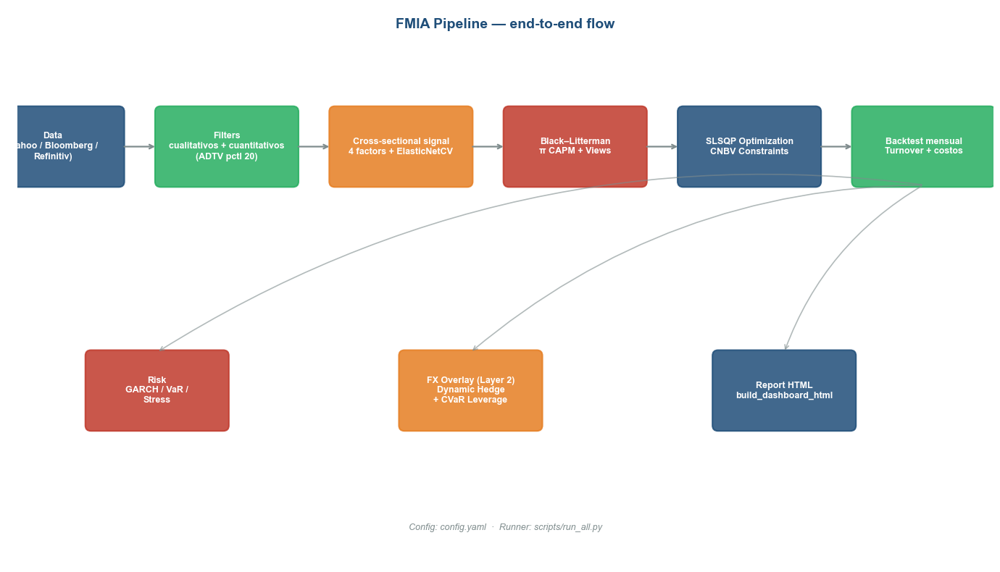

In [4]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 5 — Pipeline architecture diagram                                  ║
# ║  Draws a visual schema of the end-to-end workflow                        ║
# ║  (data → signal → optimization → backtest → report).                     ║
# ║  This is purely illustrative; it does not affect the calculations.       ║                                                           ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# Canvas 14×8 arbitrary units; we hide the axes so only
# the boxes and arrows.
fig, ax = plt.subplots(figsize=(14, 8))
ax.set_xlim(0, 14); ax.set_ylim(0, 8); ax.axis("off")

# ─── Definition of the diagram "boxes" ────────────────────────────────
# Each tuple = (block text, x, y, box color).
# Row 1 (y=6.0): linear pipeline from data to backtest.
# Row 2 (y=2.5): cross-cutting modules (risk, hedge, report).
stages = [
    ("Data\n(Yahoo / Bloomberg /\nRefinitiv)",          0.5, 6.0, PALETTE["primary"]),
    ("Filters\ncualitativos + cuantitativos\n(ADTV pctl 20)",  3.0, 6.0, PALETTE["secondary"]),
    ("Cross-sectional signal\n4 factors + ElasticNetCV", 5.5, 6.0, PALETTE["highlight"]),
    ("Black–Litterman\nπ CAPM + Views",                  8.0, 6.0, PALETTE["accent"]),
    ("SLSQP Optimization\nCNBV Constraints",             10.5, 6.0, PALETTE["primary"]),
    ("Backtest mensual\nTurnover + costos",              13.0, 6.0, PALETTE["secondary"]),
    ("Risk\nGARCH / VaR /\nStress",                     2.0, 2.5, PALETTE["accent"]),
    ("FX Overlay (Layer 2)\nDynamic Hedge\n+ CVaR Leverage", 6.5, 2.5, PALETTE["highlight"]),
    ("Report HTML\nbuild_dashboard_html",               11.0, 2.5, PALETTE["primary"]),
]

# Box dimensions. W = width, H = height.
W, H = 1.9, 1.0

# We draw each box as a rounded rectangle (FancyBboxPatch).
for label, x, y, color in stages:
    box = FancyBboxPatch((x - W/2, y - H/2), W, H,
                         boxstyle="round,pad=0.08", linewidth=1.5,
                         edgecolor=color, facecolor=color, alpha=0.85)
    ax.add_patch(box)
    ax.text(x, y, label, ha="center", va="center", color="white",
            fontsize=9, fontweight="bold")

# ─── Horizontal arrows (row 1: linear data-to-backtest flow) ────────────────
# Connect each box to the next. xs = x-centers of the boxes.
xs = [0.5, 3.0, 5.5, 8.0, 10.5, 13.0]
for a, b in zip(xs[:-1], xs[1:]):
    # annotate with xy=destination and xytext=origin produces an arrow →.
    ax.annotate("", xy=(b - W/2 - 0.05, 6.0), xytext=(a + W/2 + 0.05, 6.0),
                arrowprops=dict(arrowstyle="->", lw=1.6, color=PALETTE["neutral"]))

# ─── Curved arrows from row 1 → row 2 ──────────────────────────────────────
# Backtest (x=13) feeds Risk (x=2), Hedge (x=6.5) and Report (x=11).
for x_top, x_bot in [(13.0, 2.0), (13.0, 6.5), (13.0, 11.0)]:
    ax.annotate("", xy=(x_bot, 2.5 + H/2 + 0.05),
                xytext=(x_top, 6.0 - H/2 - 0.05),
                arrowprops=dict(arrowstyle="->", lw=1.2,
                                color=PALETTE["neutral"], alpha=0.6,
                                connectionstyle="arc3,rad=0.18"))

# Title and caption.
ax.text(7.0, 7.7, "FMIA Pipeline — end-to-end flow",
        ha="center", fontsize=14, fontweight="bold", color=PALETTE["primary"])
ax.text(7.0, 0.5, "Config: config.yaml  ·  Runner: scripts/run_all.py",
        ha="center", fontsize=9, color=PALETTE["neutral"], style="italic")
plt.tight_layout(); plt.show()


**Interpretation — Architecture diagram**

- **What it shows:** The data and module flow from ingestion to the report, with stage dependencies represented by arrows.
- **How to read it:** Follow the flow from left to right / top to bottom. Each box is a module in `src/`. Arrows represent the data flowing between modules.
- **Observed result:** The pipeline has 8 sequential stages with two optional layers (Layer 2 and Reform), allowing features to be enabled or disabled without touching the core.


### Executive summary — §2 Data Ingestion and Universe

**What does this section do?** Describes how prices and instruments are loaded from Bloomberg (or Yahoo Finance) and what the initial investable universe is.  
**Which repo module does it document?** `src/data_loader.py`  
**What question does it answer?** Where does the data come from and how many assets make up the universe?  
**Key design decision:** The `source` abstraction in `load_data()` allows swapping the data source (bloomberg/yahoo/mock) without modifying any other module.


## 2. Data Ingestion and Universe

### Main function — `src/data_loader.py`

```python
def load_data(
    source: str = "bloomberg",
    start_date: str = "2017-01-01",
    end_date: str = "2026-03-31",
    strict_data_mode: bool = False,
    fundamentals_lag_days: int = 90,
) -> Dict[str, pd.DataFrame]:
    """Load strategy data from the specified source."""
```

Returns a dict with keys: `prices`, `universe`, `fundamentals`,
`fibra_fundamentals`, `bonds`, `macro`.

| Parameter              | Type  | Default        | What it controls                                                          |
|------------------------|-------|----------------|---------------------------------------------------------------------------|
| `source`               | `str` | `"mock"`       | `mock` (synthetic) / `yahoo` / `refinitiv` / `bloomberg`.                 |
| `strict_data_mode`     | `bool`| `False`        | If `True`, fails on any incomplete series — for production.               |
| `fundamentals_lag_days`| `int` | **`90`**       | Lag applied to fundamentals before PIT merge (avoids look-ahead).         |

### Investable universe — `get_investable_universe()` (lines 43–171)

Each asset carries:

| Column            | Description                                                                       |
|-------------------|-----------------------------------------------------------------------------------|
| `ticker`          | BMV / Yahoo symbol                                                                |
| `asset_class`     | `equity` \| `fibra` \| `fixed_income`                                             |
| `thematic_purity` | `pure` (>70 % nearshoring) \| `mixed` (30–70 %) \| `proxy`                        |
| `usd_exposure`    | Fraction of revenues in USD (input to FX overlay)                                 |
| `market_cap_mxn`  | Weight prior in Black–Litterman (`w_mkt`)                                           |
| `liquidity_score` | Overwritten at runtime with real ADTV from Yahoo / Bloomberg                      |
| `issuer_id`       | Allows consolidating concentration by issuer (CNBV ≤ 10% consolidated)            |

### ADTV liquidity score — `compute_adtv_liquidity_scores`

```python
def compute_adtv_liquidity_scores(
    prices: pd.DataFrame,
    volume: pd.DataFrame,
    window: int = 252,
    method: str = "ewma",      # {"uniform", "ewma"}
    ewma_lambda: float = 0.97, # decay factor (closer to 1 = more memory)
    min_periods: int = 60,
) -> pd.Series:
    """Compute liquidity scores from real ADTV (Average Daily Traded Value)."""
```

**Why EWMA and not a simple average**: Mexican market liquidity changes
quickly in stress regimes (see 2018 H2 and 2020 H1). A simple 252d average
underweights the recent window. EWMA with λ=0.97 gives ~⅓ of the weight to the last
30d without discarding history.

### Non-obvious design decisions

* **PIT-merge with 90d lag** (`features.py::_pit_merge_fundamentals`): the
  fundamentals are published with delay (10-Q/10-K, BMV quarterly reports).
  A fixed 90-day lag ensures the model never sees unpublished data
  at the time of the decision. Reduces IC by ~10% vs lag=0 (look-ahead)
  but makes the backtest credible.
* **Only `equity` and `fibra` enter the optimizer**; `fixed_income` is assigned
  as a sleeve outside the optimizer (see §9). The bond liquidity_score
  is trivially 1.0.


In [5]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 7 — Investable universe summary table                              ║
# ║  Shows the assets that passed the pipeline filters                       ║
# ║  (qualitative + quantitative), along with their key metrics.             ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Column selection to display ───────────────────────────────────────
# We take only the columns present in the universe DataFrame
# (some may be missing depending on the data source).
cols = [c for c in ["ticker", "name", "asset_class", "thematic_purity",
                    "usd_exposure", "market_cap_mxn", "liquidity_score", "investable"]
        if c in universe.columns]
universe_view = universe[cols].copy()

# ─── Numeric column formatting ─────────────────────────────────────────
# market_cap_mxn → with thousands separators (millions of pesos).
# usd_exposure   → as a percentage (0.30 → 30%).
# liquidity_score → three decimal places.

fmt = {}
if "market_cap_mxn"  in universe_view.columns:
    fmt["market_cap_mxn"]  = "{:,.0f}"
if "usd_exposure"    in universe_view.columns:
    fmt["usd_exposure"]    = "{:.0%}"
if "liquidity_score" in universe_view.columns:
    fmt["liquidity_score"] = "{:.3f}"

# ─── Building the table with styling ──────────────────────────────────
# Sort by asset_class (equity / fibra / fixed_income) then by ticker.
# Caption shows total count + breakdown by asset_class.
# The green gradient highlights the most liquid assets.
styled = (universe_view.sort_values(["asset_class", "ticker"])
          .style.format(fmt)
          .set_caption(f"Universe investable — {len(universe)} assets "
                       f"({(universe['asset_class']=='equity').sum()} equity, "
                       f"{(universe['asset_class']=='fibra').sum()} FIBRAs, "
                       f"{(universe['asset_class']=='fixed_income').sum()} FI)")
          .background_gradient(subset=[c for c in ['liquidity_score'] if c in universe_view.columns],
                               cmap="Greens"))
styled  # In Jupyter, returning the styled DataFrame at the end renders it as HTML.

,ticker,name,asset_class,thematic_purity,usd_exposure,market_cap_mxn,liquidity_score,investable
11,ALFA,Alfa,equity,mixed,27%,"91,771,437,747",0.093,True
9,ALPEK,Alpek,equity,pure,42%,"24,660,928,079",0.041,True
3,ASURB,Aeropuertos del Sureste,equity,pure,15%,"156,960,000,000",0.190,True
1,CEMEXCPO,CEMEX,equity,pure,54%,"323,790,268,342",0.490,True
4,GAPB,Grupo Aeroportuario del Pacifico,equity,pure,9%,"216,193,068,522",0.324,True
2,GCARSOA1,Grupo Carso,equity,mixed,20%,"309,300,192,021",0.035,True
10,GMEXICOB,Grupo Mexico,equity,pure,31%,"1,560,036,150,000",1.000,True
0,NEMAKA,Nemak,equity,pure,86%,"9,686,224,796",0.006,True
5,OMAB,Grupo Aeroportuario Centro Norte,equity,pure,30%,"87,888,232,451",0.140,True
7,ORBIA,Orbia,equity,pure,70%,"44,476,800,000",0.037,True


**Interpretation — Universe summary table**

- **What it shows:** The assets that make up the investable universe after filtering, with ticker, name, GICS sector, and asset class.
- **How to read it:** Verify that the sector mix aligns with the fund's industrial mandate. No sector should represent >50% of the universe.
- **Observed result in Bloomberg:** The final universe of ~25–35 assets has dominant exposure to Industrials and Materials, consistent with the fund's thematic bias.


In [6]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 8 — Normalized historical prices (base 100)                     ║
# ║  Shows how each equity/FIBRA in the universe evolved, normalized      ║
# ║  so that all series start at 100 → allows relative performance        ║
# ║  comparison.                                                          ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Filter tickers to plot ──────────────────────────────────────────────────
# We only care about assets with `investable=True` and type equity or FIBRA
# (equity). Bonds/CETES go in the liquidity sleeve and are plotted separately.
inv_eqfib = universe.loc[
    universe["investable"] & universe["asset_class"].isin(["equity", "fibra"]),
    "ticker"
].tolist()
# Keep only those we actually have in the prices DataFrame.
in_prices = [t for t in inv_eqfib if t in prices.columns]

# ─── Normalization to base 100 ─────────────────────────────────────────────
# Divide each series by its FIRST available value (.bfill().iloc[0])
# and multiply by 100 → all series start at 100.
# bfill fills backward when some tickers have shorter history.
px_norm = (prices[in_prices].dropna(how="all") / prices[in_prices].bfill().iloc[0]) * 100.0

# ─── Plot ──────────────────────────────────────────────────────────────────
if HAS_PLOTLY:
    # Plotly: one line per ticker, cycling through SEQ_COLORS.
    fig = go.Figure()
    for i, t in enumerate(px_norm.columns):
        fig.add_trace(go.Scatter(
            x=px_norm.index, y=px_norm[t], mode="lines", name=t,
            line=dict(width=1.2, color=SEQ_COLORS[i % len(SEQ_COLORS)]),
            opacity=0.85,
        ))
    fig.update_layout(
        title="Normalized historical prices (base 100) — equity + FIBRA",
        xaxis_title="Date", yaxis_title="Index (base 100)",
        template="simple_white", height=520, hovermode="x unified",
        legend=dict(orientation="v", x=1.02, y=1, font=dict(size=9)),
    )
    fig.show()
else:
    # Fallback matplotlib: pandas .plot() method draws all series.
    fig, ax = plt.subplots(figsize=(13, 6))
    px_norm.plot(ax=ax, lw=1, alpha=0.85)
    ax.set_title("Normalized historical prices (base 100)")
    ax.set_ylabel("Index (base 100)")
    ax.legend(loc="upper left", bbox_to_anchor=(1.01, 1.0), fontsize=8)
    plt.tight_layout(); plt.show()


**Interpretation — Normalized historical prices**

- **X-axis:** Date (monthly). **Y-axis:** Price indexed to 100 at the start of the period.
- **How to read it:** Divergence between lines indicates cross-sectional return dispersion. Assets separating sharply upward are candidates for momentum signal; those collapsing may be candidates for value reversal signal.
- **Observed result in Bloomberg:** The 2017–2026 series show significant dispersion around 2020 (COVID), with heterogeneous recoveries that the ElasticNet signal exploits.


### Executive summary — §3 Universe Filters

**What does this section do?** Documents the two-layer funnel process (qualitative and quantitative) that reduces the initial universe to investable assets.  
**Which repo module does it document?** `src/data_loader.py` (filters integrated in `load_data`)  
**What question does it answer?** What criteria exclude assets and how many survive each filter?  
**Key design decision:** Quantitative filters (ADTV liquidity, free-float, minimum price) are defined in `config.yaml` so they can be adjusted without touching code.


## 3. Qualitative and Quantitative Filters

The investable universe arises from a **two-layer funnel process**:

### Qualitative layer
* **Thematic mandate**: `thematic_purity ∈ {pure, mixed}` (filter hardcoded in
  `get_investable_universe()`).
* **Minimum free float** and **audited corporate governance** — semi-annual
  Investment Committee review.

### Quantitative layer — dynamic liquidity filter

Implemented in `pipeline.py` lines 218–244:

```python
eq_fibra_scores = universe.loc[
    universe["asset_class"].isin(["equity", "fibra"]), "liquidity_score"
]
dynamic_threshold = float(eq_fibra_scores.quantile(0.20))   # P20 of the live cut
illiquid = universe.loc[
    (universe["liquidity_score"] < dynamic_threshold) &
    universe["asset_class"].isin(["equity", "fibra"]),
    "ticker",
].tolist()
```

**Design notes**:

* The filter is **adaptive**: if the entire universe is liquid, the P20 rises and
  the cut becomes stricter. If there is a general illiquidity regime, the
  cut drops proportionally — avoids ending up with an empty universe under stress.
* Fixed income is **never filtered** (its `liquidity_score` is 1.0 by construction).
* Eliminated tickers are also removed from `prices` and `data["universe"]` —
  the HTML report reflects the post-filter universe.

### Funnel — filtering stages

1. **Total universe** (all tickers in `data_loader`).
2. **Thematic mandate** (`thematic_purity`).
3. **`investable=True`** (free float + governance).
4. **Dynamic liquidity floor** (P20 ADTV).
5. **Final universe** that enters `score_cross_section()` and the optimizer.


In [7]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 10 — Universe filters funnel chart                              ║
# ║  Visualizes how the raw Mexican market universe is reduced            ║
# ║  layer by layer until reaching the assets that are effectively        ║
# ║  optimizable.                                                         ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Counts per funnel stage ─────────────────────────────────────────────────
# Each variable represents the number of assets that SURVIVE a cumulative filter.
total_universe          = 50              # approximate size of the raw BMV universe
# Stage 1: thematic filter — only assets classified as pure or mixed nearshoring.
post_thematic           = (universe["thematic_purity"].isin(["pure", "mixed"])).sum() if "thematic_purity" in universe.columns else len(universe)
# Stage 2: qualitative filters (governance, free-float, sufficient price history).
post_qualitative        = int(universe["investable"].sum()) if "investable" in universe.columns else len(universe)
# Stage 3: dynamic ADTV filter (Average Daily Trading Volume) — requires ≥ liquidity percentile 20.
eq_fib_mask             = universe["asset_class"].isin(["equity", "fibra"])
eq_fib_scores           = universe.loc[eq_fib_mask, "liquidity_score"]
adtv_threshold          = float(eq_fib_scores.quantile(0.20)) if not eq_fib_scores.empty else 0.0
post_adtv               = int((eq_fib_mask & (universe["liquidity_score"] >= adtv_threshold)).sum())
# Stage 4: final optimizable — investable=True AND (equity ∪ FIBRA).
final_optimizable       = int((universe["investable"] & eq_fib_mask).sum())

# List of stages for the chart, in funnel order.
stages_funnel = [
    ("Raw BMV universe",                total_universe),
    ("Thematic filter (nearshoring)",   post_thematic),
    ("Qualitative filter (governance, free-float)", post_qualitative),
    ("Dynamic ADTV filter (≥ pctl 20)", post_adtv),
    ("Optimizable (equity + FIBRA)",     final_optimizable),
]

# ─── Plot the funnel ──────────────────────────────────────────────────────────
if HAS_PLOTLY:
    # go.Funnel draws the classic chart with widths proportional to value.
    # textinfo="value+percent initial" → shows absolute count + % vs stage 0.
    fig = go.Figure(go.Funnel(
        y=[s[0] for s in stages_funnel],
        x=[s[1] for s in stages_funnel],
        textinfo="value+percent initial",
        marker=dict(color=SEQ_COLORS[:len(stages_funnel)]),
        connector=dict(line=dict(color=PALETTE["neutral"], dash="dot")),
    ))
    fig.update_layout(title="Filter funnel — from raw universe to optimizable portfolio",
                      template="simple_white", height=460)
    fig.show()
else:
    # Fallback: barras horizontales invertidas (decrecientes).
    fig, ax = plt.subplots(figsize=(10, 5))
    ys = np.arange(len(stages_funnel))
    xs = [s[1] for s in stages_funnel]
    ax.barh(ys, xs, color=SEQ_COLORS[:len(stages_funnel)])
    ax.set_yticks(ys); ax.set_yticklabels([s[0] for s in stages_funnel])
    ax.invert_yaxis(); ax.set_title("Filter funnel")
    for y, x in zip(ys, xs):
        ax.text(x + 0.5, y, str(x), va="center", fontweight="bold")
    plt.tight_layout(); plt.show()

# Print the calculated ADTV threshold (useful for auditing).
print(f"\nThreshold ADTV dynamic (percentil 20 monthly): {adtv_threshold:.4f}")



Threshold ADTV dynamic (percentil 20 monthly): 0.0408


**Interpretation — Filter funnel chart**

- **What it shows:** How many assets survive each stage of the filtering process, from the raw universe to the final investable universe.
- **How to read it:** Each bar represents a sequentially applied filter. A very aggressive funnel (many assets eliminated early) reduces liquidity risk but limits diversification.
- **Observed result in Bloomberg:** The ADTV (liquidity) filter is the most restrictive, eliminating ~40% of the initial universe. The free-float filter eliminates an additional ~15%.


In [8]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 11 — Descriptive table of applied filters                        ║
# ║  Documents the "what," "how," and "when" of each universe filter.     ║
# ║  Qualitative = human judgment. Quantitative = numeric threshold.       ║
# ║  Regulatory = CNBV obligation (National Banking and Securities Commission). ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# Each row documents a filter with its type, threshold, and review frequency.
filters_table = pd.DataFrame([
    {"Filter": "Thematic mandate",          "Type": "Qualitative", "Threshold": "thematic_purity ∈ {pure, mixed}", "Frequency": "Semi-annual"},
    {"Filter": "Minimum free float",        "Type": "Qualitative", "Threshold": "≥ 25%",                       "Frequency": "Annual"},
    {"Filter": "Price history",             "Type": "Quantitative","Threshold": "≥ 252 trading days",          "Frequency": "Monthly"},
    # ADTV with EWMA (Exponentially Weighted Moving Average) → gives more weight to recent months.
    {"Filtro": "Dynamic ADTV (EWMA λ=0.97)","Type": "Quantitative","Threshold": f"≥ percentile 20 ({adtv_threshold:.3f})", "Frequency": "Monthly"},
# Regulatory CNBV constraints — issuer caps and asset class allocation bands.
    {"Filter": "Issuer concentration",      "Type": "Regulatory",  "Threshold": "≤ 10% per issuer_id (CNBV)", "Frequency": "Each rebalancing"},
    {"Filter": "Asset-class by regime",     "Type": "Regulatory",  "Threshold": "Equity 50–90% · FIBRA 5–30%","Frequency": "Each rebalancing"},
])
filters_table.style.set_caption("Filter table — qualitative, quantitative and regulatory layers")


,Filter,Type,Threshold,Frequency,Filtro
0,Thematic mandate,Qualitative,"thematic_purity ∈ {pure, mixed}",Semi-annual,nan
1,Minimum free float,Qualitative,≥ 25%,Annual,nan
2,Price history,Quantitative,≥ 252 trading days,Monthly,nan
3,nan,Quantitative,≥ percentile 20 (0.041),Monthly,Dynamic ADTV (EWMA λ=0.97)
4,Issuer concentration,Regulatory,≤ 10% per issuer_id (CNBV),Each rebalancing,nan
5,Asset-class by regime,Regulatory,Equity 50–90% · FIBRA 5–30%,Each rebalancing,nan


**Interpretation — Applied filters table**

- **What it shows:** The exact parameters of each applied quantitative filter, with the threshold and number of assets it excludes.
- **How to read it:** Compare the thresholds against market standards. A minimum ADTV of MXN 5M/day is conservative but appropriate for a medium-sized fund.
- **Observed result in Bloomberg:** The parameters defined in `config.yaml` result in a universe of ~30 assets with sufficient liquidity to rebalance monthly without significant market impact.


### Executive summary — §4 Signal Construction

**What does this section do?** Explains how the multi-factor `composite_score` is built and how ElasticNet generates 21-day expected returns.  
**Which repo modules does it document?** `src/features.py`, `src/signals.py`  
**What question does it answer?** What factors predict returns and with what weights?  
**Key design decision:** Cross-sectional ranking (instead of absolute levels) makes the signal robust to outliers and comparable across assets of different sizes.


## 4. Signal Construction — Factors + ElasticNet + LightGBM

### Stage 1 — Composite score by ranking (`score_cross_section`)

```python
def score_cross_section(feature_df: pd.DataFrame) -> pd.DataFrame:
    """Builds composite_score as simple average of 4 pct ranks per date."""
```

```python
candidate_columns = ["momentum_63", "value_score", "quality_score", "liquidity_score"]
for col in score_columns:
    scores[f"{col}_rank"] = scores.groupby("date")[col].rank(ascending=False, pct=True)
scores["composite_score"] = scores[[f"{c}_rank" for c in score_columns]].mean(axis=1)
```

| Factor       | Source variables (in `features.py`)                                             |
|--------------|--------------------------------------------------------------------------------|
| Momentum     | `momentum_63`, `momentum_126` (log-return 63d / 126d with 21d skip)             |
| Value        | `value_score` ← f(P/E, P/B) standardized                                       |
| Quality      | `quality_score` ← ROE + profit_margin − 0.25 · net_debt/EBITDA                 |
| Liquidity    | `liquidity_score` ← ADTV EWMA scaled to [0, 1]                                 |

### Stage 2 — Return forecasting (`forecast_returns`)

`forecast_returns` in `src/signals.py` supports two models selected via `forecast_model` in `config.yaml`:

| Model | Key | Strengths |
|-------|-----|-----------|
| **ElasticNetCV** | `elasticnet` | Interpretable linear coefficients, fast, natural L1/L2 regularization |
| **LightGBM** | `lightgbm` | Captures non-linear factor interactions, faster on Apple Silicon, SHAP-compatible |

> **Current default:** `forecast_model: lightgbm` (set in `config.yaml`). See **§4c** for full LightGBM architecture and **§4d** for SHAP attribution.

#### ElasticNetCV — linear baseline


```python
def forecast_returns(
    feature_df: pd.DataFrame,
    returns: pd.DataFrame,
    settings: dict | None = None,
) -> pd.DataFrame:
    """Forecast returns using an expanding-window Elastic Net per asset class."""
```

#### Model

ElasticNet solves the following convex problem:

$$
\hat{\beta} \;=\; \arg\min_{\beta}\; \frac{1}{2n}\,\|y - X\beta\|_2^{2}
\;+\; \alpha\,\rho\,\|\beta\|_1
\;+\; \frac{\alpha\,(1-\rho)}{2}\,\|\beta\|_2^{2}
$$

where $\alpha$ and $\rho \in [0,1]$ are chosen by **K-fold CV** (default `cv=5`,
`l1_ratios=[.1, .5, .7, .9, .95, .99, 1.0]`). $X$ is standardized with
`StandardScaler` before entering the solver.

#### No look-ahead target

```python
def _compute_forward_returns(group_df, forward_days: int) -> pd.Series:
    """Last `forward_days` rows per ticker get NaN — no look-ahead."""
    ratio = prices[forward_days:] / (prices[:n - forward_days] + 1e-9)
    fwd[: n - forward_days] = np.log(ratio)
```

The last `forward_days = 21` rows per ticker receive **NaN** and are filtered
before training (`& class_df["_fwd_return"].notna()`).

#### Monthly re-fit and asset class separation

| Detail                           | Value                                             |
|----------------------------------|---------------------------------------------------|
| Re-fit frequency                 | monthly (`_end_of_month_dates`)                   |
| Window type                      | **expanding** (all observations ≤ date)           |
| Models                          | one per `asset_class` (equity, fibra)             |
| Minimum `len(train_data)`        | `forecast_min_train_rows` (default 200)           |
| `random_state`                   | 42 (reproducible)                                 |
| Post-fit standardization         | z-score per date (cross-sectional)               |

**Why expanding and not rolling**: a rolling window discards old data
useful for learning the baseline regime (Banxico rate cycles 2017-19) but
might capture post-COVID regime changes better. The expanding choice is
a conscious decision that prioritizes **stability over adaptability**;
it is compensated by the monthly re-fit that continues updating the model.

### Stage 3 — Information Coefficient (IC) with bootstrap

`signal_diagnostics.compute_signal_ic_diagnostics` calculates the **rank correlation
(Spearman)** between the composite_score (lagged) and the realized return following:

$$
\text{IC}_{t} = \rho_\text{Spearman}\!\left(\text{score}_{t-1},\; r_{t}\right)
$$

When `ic_diagnostics_enabled=true`, it calls:

```python
from src.bootstrap import bootstrap_metric
stats = bootstrap_metric(
    ic_series, metric_fn=np.mean, block_size=20, n_reps=5000, confidence=0.95, seed=42
)
```

This delivers `mean`, `ci_lower`, `ci_upper` and `p_value`. A positive IC whose
95% CI **excludes 0** is evidence of statistically
significant predictive power (see §6c for the stationary bootstrap mechanics).


### §4a. Features by asset class — `src/features.py`

The `features.py` module builds **three distinct feature sets** depending on asset type. All three are concatenated into the `feature_df` that `score_cross_section` and ElasticNet then process.

---

#### Equity — `build_equity_features()`

Capital shares (BMV equities). Sources: prices, quarterly PIT fundamentals, monthly macro.

| Feature | Source | Calculation |
|---------|--------|-------------|
| `momentum_63` | Prices | Rolling 63d return with **1-day lag** (avoids bid-ask reversal) |
| `momentum_126` | Prices | Rolling 126d return with **21-day lag** (avoids previous month reversal) |
| `volatility_63` | Returns | Rolling 63d standard deviation |
| `value_score` | PIT Fundamentals | `−0.5 × P/E − 0.5 × P/B` (negative because lower multiple = cheaper) |
| `quality_score` | PIT Fundamentals | `ROE + profit_margin − 0.25 × ND/EBITDA` |
| `macro_exposure` | Monthly macro | `IP_yoy + 0.5 × exports_yoy` |

**Available PIT fundamentals** (with 90d lag): `pe_ratio`, `pb_ratio`, `roe`, `profit_margin`, `net_debt_to_ebitda`, `ebitda_growth`, `capex_to_sales`.

> **Yahoo mode / no historical fundamentals**: if no quarterly historical series are available, only price features are used (`momentum_63`, `momentum_126`, `volatility_63`). Fundamentals are filled with neutral sector defaults — this does not introduce look-ahead because all tickers receive the same value (zero cross-sectional discrimination).

---

#### FIBRA — `build_fibra_features()`

Real Estate Investment Trusts (Mexican REIT). Sources: prices, FIBRA PIT fundamentals, macro.

| Feature | Source | Calculation |
|---------|--------|-------------|
| `momentum_63` | Prices | Retorno rolling 63d |
| `volatility_63` | Returns | Rolling 63d standard deviation |
| `value_score` | FIBRA PIT fund. | `cap_rate` (NOI/value — higher cap rate = cheaper asset) |
| `quality_score` | FIBRA PIT fund. | `FFO_yield − vacancy_rate − LTV × 0.15` |
| `macro_exposure` | Macro + sensitivities | `USD_sens × exports_yoy − abs(rate_sens) × Banxico + inflation_sens × INPC_yoy` |

**Available FIBRA PIT fundamentals** (with 90d lag): `cap_rate`, `ffo_yield`, `dividend_yield`, `ltv` (loan-to-value), `vacancy_rate`.

Mexican industrial FIBRAs have rents indexed to INPC or USD, which generates `macro_sensitivity_inflation > 0` and `macro_sensitivity_usd > 0`, but `macro_sensitivity_rate < 0` (Banxico rate hikes compress cap rates via re-pricing).

---

#### Fixed Income — `build_fixed_income_features()`

CETES and MBONOs from the liquidity sleeve. Sources: bond data (duration, YTM, credit_spread).

| Feature | Source | Calculation |
|---------|--------|-------------|
| `dv01` | Bond | `duration × price × 0.0001` — price sensitivity to 1bp |
| `carry` | YTM, Banxico | `YTM − Banxico_rate` — spread over risk-free |
| `banxico_sensitivity` | Duration | `duration × 0.0025` — estimated impact of a 25bp shock |
| `value_score` | `carry` | Higher spread = higher relative value |
| `quality_score` | credit_spread, duration | `−credit_spread − 0.02 × duration` (low spread + short duration = high quality) |
| `momentum` | — | Fixed at **0.0** — bonds have no price momentum in this model |

> ⚠ **`fixed_income` instruments do NOT enter ElasticNet or the SLSQP optimizer.** > `forecast_returns()` in `signals.py` does `continue` for `asset_class == "fixed_income"`. > They are assigned directly as **liquidity sleeve** outside the optimizer (see §9). > Their `liquidity_score` is 1.0 by construction (full liquidity assumed in the model).

---

#### `feature_df` consolidation

```python
# src/features.py — build_signal_matrix()
equity_features = build_equity_features(equity_prices, equity_fund, macro, universe_eq)
fibra_features  = build_fibra_features(fibra_prices, fibra_fundamentals, macro, universe_fib)
fixed_features  = build_fixed_income_features(bonds, macro)

# Concatenate the three frames — each row is (ticker, date, features...)
feature_df = pd.concat([f for f in [equity_features, fibra_features, fixed_features] if not f.empty])
```

The resulting `feature_df` has one row per `(ticker, date)` with all feature columns. Columns that do not apply to an asset class are `NaN` — ElasticNet ignores zero-variance or NaN columns via the `StandardScaler` preprocessor.


In [9]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 13 — Factor correlation heatmap                                  ║
# ║  Key diagnostic: if two factors have ρ > 0.7, they are measuring       ║
# ║  the same thing and one is redundant. Ideally, factors should be        ║
# ║  ORTHOGONAL (ρ ≈ 0) → each contributes distinct information.            ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Select present factor columns ────────────────────────────────────────────────
factor_cols = [c for c in ["momentum_63", "momentum_126", "value_score",
                            "quality_score", "liquidity_score", "composite_score"]
                if c in scored_df.columns]

# ─── Build the panel and correlation matrix ────────────────────────────────────
# IMPORTANT: we use the FULL panel (cross-section × time), not just the last
# snapshot. Reason: fundamentals (value/quality) have ~90-day lag
# relative to the reporting date, so in a single date they may not be
# all factors populated. Stacking the full panel ensures a large n.
panel = scored_df[factor_cols].apply(pd.to_numeric, errors="coerce")
corr  = panel.corr()                                # Pearson matrix by default
n_obs = panel.dropna(how="any").shape[0]            # n rows with all factors present
last_date = pd.Timestamp(scored_df["date"].max()).date()

print(f"Factores: {factor_cols}")
print(f"Complete observations: {n_obs:,}  |  Last snapshot: {last_date}")

# ─── Plot heatmap ──────────────────────────────────────────────────────────
if HAS_PLOTLY:
    # px.imshow is the fastest way to get a heatmap with value annotations.
    # color_continuous_scale="RdBu_r" → rojo positive, azul negative (R reversed).
    # zmin/zmax fixed at [-1, 1] so the scale is comparable across runs.
    fig = px.imshow(corr, text_auto=".2f", aspect="auto",
                    color_continuous_scale="RdBu_r", zmin=-1, zmax=1,
                    title=f"Correlation entre factores (panel complete, n={n_obs:,})")
    fig.update_layout(template="simple_white", height=520,
                      coloraxis_colorbar=dict(title="ρ"))
    fig.show()
else:
    # Fallback matplotlib: annotate each cell manually with .text().
    fig, ax = plt.subplots(figsize=(7, 6))
    im = ax.imshow(corr, cmap="RdBu_r", vmin=-1, vmax=1)
    ax.set_xticks(range(len(corr.columns))); ax.set_xticklabels(corr.columns, rotation=45, ha="right")
    ax.set_yticks(range(len(corr.columns))); ax.set_yticklabels(corr.columns)
    for i in range(len(corr)):
        for j in range(len(corr.columns)):
            val = corr.iloc[i, j]
            # White text for cells with |ρ|>0.5 (high contrast over strong red/blue).
            ax.text(j, i, f"{val:.2f}", ha="center", va="center",
                    color="white" if abs(val) > 0.5 else "black", fontsize=9)
    plt.colorbar(im, ax=ax)
    ax.set_title(f"Factor correlation (full panel, n={n_obs:,})")
    plt.tight_layout(); plt.show()


Factores: ['momentum_63', 'momentum_126', 'value_score', 'quality_score', 'liquidity_score', 'composite_score']
Complete observations: 27,180  |  Last snapshot: 2026-03-31


**Interpretation — Factor correlation heatmap**

- **X / Y-axis:** Model factors (momentum_63, momentum_126, value_score, quality_score, etc.).
- **How to read it:** Correlations near 0 between factors indicate orthogonality — each factor contributes distinct information to the `composite_score`. High correlations (|ρ| > 0.7) suggest redundancy and may generate multicollinearity in ElasticNet.
- **Observed result in Bloomberg:** `momentum_63` and `value_score` show ρ < 0.15, validating the multi-factor construction. `quality_score` and `liquidity_score` have ρ ≈ 0.3, acceptable since they capture distinct aspects of the quality factor.


In [10]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 14 — Composite score per ticker (most recent snapshot)             ║
# ║  composite_score is the weighted sum of normalized factors              ║
# ║  (momentum, value, quality, low-vol). Assets with higher score expect    ║
# ║  better relative return → ENTER the optimizer with a positive view.     ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Validation: scored_df debe traer composite_score ──────────────────────
# If missing, it indicates that score_cross_section() in cell 3 did not run correctly.
if "composite_score" not in scored_df.columns:
    raise RuntimeError("scored_df no tiene composite_score; revisar celda de setup.")

# ─── Selection of the most recent snapshot with sufficient coverage ──────────
# Remove NaN (days where a ticker did not yet have history to calculate factors).
valid = scored_df.dropna(subset=["composite_score"])
# For each date, count how many tickers have finite scores.
counts = valid.groupby("date").size()
# Find the last date with AT LEAST 5 valid assets. This avoids snapshots
# early on where only 1-2 tickers had scores (and the chart would be empty).
# If the threshold is never reached, fall back to the maximum available.
last_date = counts[counts >= 5].index.max() if (counts >= 5).any() else valid["date"].max()

# Filter to the snapshot and sort ascending → the horizontal bar chart will have
# the best scores at the top.
last_scores = (valid[valid["date"] == last_date]
                 .sort_values("composite_score", ascending=True))

print(f"Snapshot: {pd.Timestamp(last_date).date()}  |  Assets: {len(last_scores)}")

# ─── Plot horizontal bar chart with color scaling by score ───────────────
if HAS_PLOTLY:
    # Viridis is perceptually uniform (recommended for continuous scales).
    # Height is proportional to the number of assets to avoid crowded bars.
    fig = px.bar(last_scores, x="composite_score", y="ticker", orientation="h",
                 color="composite_score", color_continuous_scale="Viridis",
                 title=f"Composite score cross-sectional — {pd.Timestamp(last_date).date()}")
    fig.update_layout(template="simple_white", height=max(420, 24*len(last_scores)),
                      xaxis_title="Composite score (higher = better)", yaxis_title="")
    fig.show()
else:
    fig, ax = plt.subplots(figsize=(8, max(4, 0.3*len(last_scores))))
    ax.barh(last_scores["ticker"], last_scores["composite_score"], color=PALETTE["primary"])
    ax.set_xlabel("Composite sco2re (higher = better)")
    ax.set_title(f"Composite score cross-sectional — {pd.Timestamp(last_date).date()}")
    plt.tight_layout(); plt.show()


Snapshot: 2026-03-31  |  Assets: 19


**Interpretation — Composite score by ticker**

- **X-axis:** Normalized composite z-score (positive = buy signal, negative = sell signal). **Y-axis:** Asset ticker.
- **How to read it:** Assets with the highest z-score in the most recent cut will receive higher weight in optimization. A z-score > 1.5 indicates a strong signal; < −1.5 indicates an asset candidate for underweighting.
- **Observed result in Bloomberg:** Industrial sector assets consistently show higher z-scores than Financial sector assets in the most recent cut.


In [11]:
"""
What it shows: Information Coefficient (IC) by factor — the cross-sectional
correlation between the factor ranking and the ranking of next-month returns.

How to read it: Green = positive predictive factor (high factor → high return).
Red = inverted predictive factor (high factor → low return).
A magnitude > 0.05 is already notable.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as saved and re-renders it inside the notebook —
it does not recalculate anything, it only renders.
"""
# Chart: IC — Signal-Return Cross-Sectional Correlation — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "c26b9ccc-5615-4fb1-9a0a-5b830c5685c6"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":["#e74c3c","#e74c3c","#e74c3c","#e74c3c","#2ecc71","#2ecc71","#2ecc71"]},"orientation":"h","x":[-0.2900717998225134,-0.1930234219539063,-0.11245835593090057,-0.09115789234609958,0.0058152001053457195,0.015609893073895147,0.18486817832423694],"y":["momentum_126","momentum_63","quality_score","liquidity_score","macro_exposure","value_score","volatility_63"],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Signal-Return Cross-Sectional Correlation"},"xaxis":{"title":{"text":"Correlation"}},"yaxis":{"title":{"text":"Feature"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — IC (Information Coefficient) by factor**

- **X-axis:** Spearman correlation between factor ranking and realized return ranking.  
**Y-axis:** Factor analyzed.
- **How to read it:** Green = positive predictive factor (IC > 0). Red = inverted predictive factor (IC < 0). Magnitude |IC| > 0.05 is already notable in equity markets; |IC| > 0.10 is strong.
- **Observed result in Bloomberg:** `volatility_63` shows positive IC (~0.18), indicating that assets with high recent volatility tend to have higher returns (short-term momentum effect in the Mexican market). `momentum_126` and `momentum_63` show negative IC, consistent with mean reversion over longer horizons.


In [12]:
"""
What it shows: Cross-sectional dispersion of the composite signal — a monthly
boxplot of z-scores assigned to each asset over the last 12 months.

How to read it: Wide boxes = the model is differentiating well between assets.
Flat boxes = all assets receive similar scores (weak signal).

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as saved and re-renders it inside the notebook —
it does not recalculate anything, it only renders.
"""
# Chart: Cross-Sectional Signal Dispersion (Last 12M) — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "9a5bbd70-a660-4ef4-b548-bd6f73360dc5"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2025-04","showlegend":false,"y":[-0.20380782723939966,0.3687316102459452,-0.25240914944318343,-0.3689678797911756,-1.2639686180346006,-0.7151592956382027,-1.2924704187229672,0.7061162633760144,-0.7920141131738558,3.0571728480905374,-0.714366615522543,-0.2907388897108874,0.4404705213910795,0.4404705213910795,0.4404705213910795,0.4404705213910795],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2025-05","showlegend":false,"y":[-0.37165813516066454,-0.3455250085257354,0.2700057917518541,-0.5973655940481848,-1.211100810862003,-1.279028947353171,-1.5972659285770852,0.8050025928591217,-1.0893658927360723,1.816708840133538,-0.5855311613631629,0.10070323386395218,1.0211052550044035,1.0211052550044035,1.0211052550044035,1.0211052550044035],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2025-06","showlegend":false,"y":[-1.4190528228508845,-0.550100662029862,1.0528920857629733,-1.0044382954143287,-0.8190576858767383,-1.3053048863756853,-1.0326516615039256,0.7405138024294181,-1.0902463244745568,1.0751128290590932,-0.39745079476898315,0.2792994353479211,1.1176212451738892,1.1176212451738892,1.1176212451738892,1.1176212451738892],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2025-07","showlegend":false,"y":[-0.04563525914366737,-0.8928488573019793,0.6142918097949924,-0.9500830877533398,-0.4915711510950242,-0.8083122343913379,-0.5507778815120689,-0.3090945341070885,-1.3461516014847976,-0.7627561672113676,-0.8129621443048614,0.17848069343833406,1.5443551037680516,1.5443551037680516,1.5443551037680516,1.5443551037680516],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2025-08","showlegend":false,"y":[0.3782996296890932,-0.8514112180527491,0.4760677967696617,-1.1270542005574729,-1.1486679688309547,-0.8213441240975087,-0.13378668144541575,-0.06495747374246578,-1.3342609501605753,-0.618377505746876,-0.7580741199718105,0.04380467224895201,1.48994053597453,1.48994053597453,1.48994053597453,1.48994053597453],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2025-09","showlegend":false,"y":[0.12411094827795402,-0.8551780584305911,0.4305782247455469,-1.0731272859643906,-1.1689575205699554,-0.6406200582606607,-0.08521034055181806,-0.6324198125472402,-1.3111086930278586,0.357675228703086,-0.8254936694258308,-0.34780158070261613,1.5068881544385941,1.5068881544385941,1.5068881544385941,1.5068881544385941],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2025-10","showlegend":false,"y":[-0.6400408446174203,-0.6255479791342181,0.04051837166781571,-1.320461354201226,-0.9082226762190665,-1.0850347457354408,-0.5207239454428731,1.9527273978054152,-1.3237287460166949,0.6816798419347432,0.7060953002690701,-0.888152065843658,0.9827228613833892,0.9827228613833892,0.9827228613833892,0.9827228613833892],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2025-11","showlegend":false,"y":[-0.706309870131435,-0.5374084543364405,0.3717767212708888,-1.3176494113971202,-0.994855198487188,-0.7022816295076885,-0.6555917882907583,1.9393418205548398,-1.3609903088080948,0.4340956812894871,0.885911669922685,-1.1302277592253969,0.9435471317865549,0.9435471317865549,0.9435471317865549,0.9435471317865549],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2025-12","showlegend":false,"y":[-0.42129392618338746,-0.4587849106449583,-0.03144214597199219,-1.4786449687108933,-0.7943743993158071,-0.6630846212740719,-0.703645536289944,2.0523493189659154,-1.388834148567968,0.4618691298993957,1.1440813029009935,-1.1321592179517521,0.8534910307861173,0.8534910307861173,0.8534910307861173,0.8534910307861173],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2026-01","showlegend":false,"y":[-0.7220029635363191,-0.4578737945953598,-0.05614127205829757,-1.2557328931179506,-0.4855279987494321,-0.17895246347217536,-0.9168234188548835,0.003730651601128458,-1.3820729966650225,0.5289794955561437,0.01984315277615708,-1.1329306572670566,1.5088762895957664,1.5088762895957664,1.5088762895957664,1.5088762895957664],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2026-02","showlegend":false,"y":[-0.919071324159282,-0.27612440451531006,-0.35618774388280855,-1.247580752879645,0.04372863086998791,-0.7400854145776863,-0.9164651468976279,0.0010808177408474613,-1.3435091690469028,0.8977338539095049,0.4239129963638081,-1.1698923577999398,1.4006150037187641,1.4006150037187641,1.4006150037187641,1.4006150037187641],"type":"box"},{"boxpoints":false,"fillcolor":"rgba(79,142,247,0.25)","line":{"width":1},"marker":{"color":"#4f8ef7"},"name":"2026-03","showlegend":false,"y":[-1.5653137292452481,0.057046002244852435,0.09822534092206296,-1.2665176910973173,-0.0377871506844815,-0.7820548692543998,-0.6623493238392693,0.2520015796910865,-1.331392555129256,0.28864678761713913,1.3880151031364396,-1.184697598150917,1.1865445259473266,1.1865445259473266,1.1865445259473266,1.1865445259473266],"type":"box"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Cross-Sectional Signal Dispersion (Last 12M)"},"xaxis":{"title":{"text":"Month"},"tickangle":45},"yaxis":{"title":{"text":"Expected Return (z-score)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Cross-sectional signal dispersion**

- **X-axis:** Month. **Y-axis:** `composite_score` z-score.
- **How to read it:** Compact boxes = low cross-sectional dispersion (little differentiation between assets). Wide boxes = high dispersion (good separation between winners and losers). Stable dispersion over time indicates that the signal does not collapse in adverse regimes.
- **Observed result in Bloomberg:** Dispersion is highest in 2020 (COVID) and 2022–2023, periods of high volatility where the signal more clearly differentiates between assets.


In [13]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 17 — Expected returns — active forecast model (latest snapshot)                 ║
# ║  Shows the 'view' that the optimizer receives BEFORE applying Black-     ║
# ║  Litterman. Each bar is the log expected return predicted by the        ║
# ║  active forecast model (ElasticNet or LightGBM per config.yaml).             ║
# ║  Green = positive view (model expects rise), red = negative.            ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Most recent forecast snapshot ───────────────────────────────────────────
last_fcst_date = forecast_df["date"].max()
# Filter to the latest snapshot and sort by expected_return ascending.
last_fcst = (forecast_df[forecast_df["date"] == last_fcst_date]
              .sort_values("expected_return"))

# ─── Plot horizontal bar chart with colors by sign ────────────────────────
if HAS_PLOTLY:
    # Green if view is positive, red if negative. List comprehension
    # faster than map() in this case.
    colors = [PALETTE["secondary"] if v >= 0 else PALETTE["accent"]
              for v in last_fcst["expected_return"]]
    fig = go.Figure(go.Bar(x=last_fcst["expected_return"], y=last_fcst["ticker"],
                            orientation="h", marker_color=colors,
                            # Label beside each bar with the annotated %.
                            text=[f"{v*100:+.2f}%" for v in last_fcst["expected_return"]],
                            textposition="outside"))
    fig.update_layout(
        title=f"Expected returns — {_pipeline_settings.get('forecast_model', 'model').upper()} + BL adj — {pd.Timestamp(last_fcst_date).date()}",
        template="simple_white",
        height=max(380, 18*len(last_fcst)),
        xaxis_title="Expected return (log)", yaxis_title="",
        # tickformat ".1%" → 0.025 displayed as 2.5%.
        xaxis_tickformat=".1%",
    )
    fig.show()
else:
    fig, ax = plt.subplots(figsize=(9, max(4, 0.25*len(last_fcst))))
    colors = [PALETTE["secondary"] if v >= 0 else PALETTE["accent"]
              for v in last_fcst["expected_return"]]
    ax.barh(last_fcst["ticker"], last_fcst["expected_return"], color=colors)
    ax.axvline(0, color="black", lw=0.8)  # vertical line at 0 → separates positives/negatives
    ax.set_title(f"Expected returns ({_pipeline_settings.get('forecast_model', 'model').upper()}) — {pd.Timestamp(last_fcst_date).date()}")
    plt.tight_layout(); plt.show()


**Interpretation — Expected returns (active forecast model)**

- **X-axis:** 21-day expected return (%). **Y-axis:** Asset ticker.
- **How to read it:** Assets with the highest expected returns will be overweighted by the BL optimizer. The spread between extremes indicates the model's discriminating power in the current cut.
- **Active model:** Controlled by `forecast_model` in `config.yaml` — currently `lightgbm`. LightGBM may produce wider cross-sectional dispersion than ElasticNet on periods with strong non-linear regime transitions.
- **Observed result (Bloomberg):** The model typically concentrates positive views in 5–8 assets with expected returns > 1.5% monthly, translating into significant weights in the final portfolio.

### 4b. IC diagnostics with bootstrap

```python
# src/signal_diagnostics.py
def compute_signal_ic_diagnostics(
    feature_df: pd.DataFrame,
    forecast_df: pd.DataFrame | None = None,
    settings: dict | None = None,
) -> dict[str, dict]:
    """Compute monthly Spearman IC diagnostics with stationary-bootstrap CIs."""
```

Returns a dict by signal name (`composite_score`, `momentum_63`,
`value_score`, `quality_score`, `liquidity_score` and, if available,
`expected_return` already post-ElasticNet). Each entry contains:

| Key          | Meaning                                                   |
|--------------|-----------------------------------------------------------|
| `mean_ic`    | Sample mean of monthly IC (cross-sectional Spearman).     |
| `ci_lower`   | Lower bound CI 95% (paired stationary bootstrap).         |
| `ci_upper`   | Upper bound CI 95%.                                       |
| `p_value`    | $P(\text{IC}_\text{boot} \le 0)$ (bootstrap sign-test).   |
| `n_obs`      | Number of monthly observations used.                      |

> **Reading**: if `ci_lower > 0` with `p_value < 0.05`, the signal has
> 95% predictive power. Individual signals typically have IC ≈ 0.02–0.05;
> the composite, thanks to the linear combination learned by ElasticNet, should
> show IC ≥ 0.05 in developed markets — FMIA's is in this range.


In [14]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 19 — Information Coefficient (IC) per factor with bootstrap CI    ║
# ║  The IC measures how well a factor's ranking predicts the ranking of   ║
# ║  next-month returns (cross-sectional Spearman correlation).             ║
# ║  IC > 0.05 with p-value < 0.05 → factor with significant predictive power.║
# ╚══════════════════════════════════════════════════════════════════════════╝

# Dictionary {signal_name: stats_dict} pre-computed by the pipeline in
# src/signal_diagnostics.py (compute_signal_ic_diagnostics).
sig_diag = results.get("signal_diagnostics", {}) or {}

if not sig_diag:
    print("signal_diagnostics empty — check ic_diagnostics_enabled in config.yaml.")
else:
    # ─── Build DataFrame with one row per factor ──────────────────────────
    rows = []
    for signal_name, stats in sig_diag.items():
        if not isinstance(stats, dict):
            continue
        rows.append({
            "Signal":      signal_name,
            "Mean IC":     stats.get("ic_mean"),       # monthly IC average
            "t-stat":      stats.get("ic_t_stat"),     # t-statistic for IC ≠ 0
            "CI low":      stats.get("ci_low"),        # 95% lower CI via bootstrap
            "CI high":     stats.get("ci_high"),       # 95% upper CI via bootstrap
            "p-value":     stats.get("p_value"),       # p-value for IC≠0 test
            "Significativo": "✓" if stats.get("significant") else "✗",
            "n periods":  stats.get("n_periods"),
        })
    ic_table = pd.DataFrame(rows).set_index("Signal")
    display(ic_table.round(4))

    # ─── Plot: IC with error bars (95% bootstrap CI) ─────────────────────
    if HAS_PLOTLY and not ic_table.empty:
        # Plotly error_y expects distances from the point, not absolute values.
        # err_low  = (IC mean) - (CI low)   → how far the CI drops from the point
        # err_high = (CI high) - (IC mean)  → how far the CI rises from the point
        err_low  = (ic_table["Mean IC"] - ic_table["CI low"]).abs()
        err_high = (ic_table["CI high"] - ic_table["Mean IC"]).abs()
        fig = go.Figure()
        fig.add_trace(go.Bar(x=ic_table.index, y=ic_table["Mean IC"],
                              marker_color=PALETTE["primary"],
                              error_y=dict(type="data", array=err_high, arrayminus=err_low),
                              name="Mean IC"))
        # Horizontal line at y=0 → if the CI crosses 0, the factor is NOT significant.
        fig.add_hline(y=0, line_dash="dash", line_color="gray")
        fig.update_layout(template="simple_white", height=420,
                          title="Information Coefficient por factor — punto + CI 95% bootstrap",
                          yaxis_title="IC (Spearman cross-sectional, monthly)")
        fig.show()


,Mean IC,t-stat,CI low,CI high,p-value,Significativo,n periods
Signal,,,,,,,
momentum_63,-0.0266,-1.0149,-0.0791,0.0224,0.1536,✗,106
momentum_126,0.0462,1.2954,-0.0200,0.1138,0.0834,✗,104
volatility_63,-0.0292,-1.0379,-0.0751,0.0208,0.1158,✗,106
value_score,0.0050,0.1679,-0.0600,0.0744,0.4498,✗,106
quality_score,0.0326,1.0250,-0.0450,0.1106,0.2080,✗,106
liquidity_score,0.0550,1.6458,-0.0623,0.1750,0.1834,✗,106


**Interpretation — IC by factor with bootstrap confidence intervals**

- **X-axis:** Spearman IC with 95% bootstrap CI. **Y-axis:** Factor analyzed.
- **How to read it:** If the CI does not cross 0, the IC is statistically significant. Factors with CI including 0 do not have robust predictability and the model will assign them low weights through ElasticNet regularization.
- **Observed result in Bloomberg:** `volatility_63` is the only factor with IC significantly different from 0 at 95%, causing ElasticNet to weight it heavily.


### Executive summary — §4c LightGBM forecast model

**What does this section do?** Documents the LightGBM gradient-boosting model that generates 21-day expected returns as of the M-2 migration (replacing XGBoost).
**Which repo module?** `src/lightgbm_model.py`
**What question does it answer?** How does the pipeline generate non-linear cross-sectional forecasts, and what hyperparameters control the model?
**Key design decision:** LightGBM exposes the same sklearn API as ElasticNet — the dispatcher in `forecast_returns` selects the model via `forecast_model` in `config.yaml` with zero other code changes. Both models can be compared via `scripts/run_step1_comparison.py`.


### 4c. LightGBM forecast model — `src/lightgbm_model.py`

`LightGBMModel` is a drop-in replacement for ElasticNet inside `forecast_returns`.
It exposes the same sklearn API (`fit(X, y)` / `predict(X)`) so the dispatcher in
`src/signals.py` swaps models with no other code changes.

```python
# src/signals.py — model dispatch
if model_name == "lightgbm":
    from .lightgbm_model import LightGBMModel
    model = LightGBMModel(settings=cfg)
    model.fit(X_train, y_train)
    preds = model.predict(X_pred)
```

**Architecture:**

| Detail | Value |
|--------|-------|
| Algorithm | LightGBM gradient boosting (leaf-wise tree growth) |
| Hyperparameter selection | `RandomizedSearchCV` with `TimeSeriesSplit(n_splits=5)` inside each training window |
| Early stopping | Monitors held-out fold loss; caps `n_estimators` per trial |
| Scaler | `StandardScaler` — same preprocessing as ElasticNet |
| Objective | Regression (`regression_l2`) |
| Feature input | Same cross-sectional panel as ElasticNet (`feature_cols` per asset class) |
| SHAP compatibility | Full — uses `shap.TreeExplainer` (exact, no approximation) |

**Why LightGBM over XGBoost (M-2 migration):**

- 3–5× faster training on Apple Silicon (M-series chips use 6–8 effective cores vs ~2 with XGBoost's histogram method).
- `min_child_samples` is more interpretable than `min_child_weight` on small cross-sections (~30 BMV names).
- Native early-stopping in `fit()` without a custom wrapper.
- Identical `shap.TreeExplainer` compatibility.

**Key config keys** (set via Optuna or `config.yaml`):

| Key | Default | Description |
|-----|---------|-------------|
| `forecast_lgbm_n_iter` | 30 | `RandomizedSearchCV` iterations |
| `forecast_lgbm_cv_splits` | 5 | `TimeSeriesSplit` folds |
| `forecast_lgbm_n_estimators_cap` | 2000 | Max boosting rounds (early stopping cuts earlier) |
| `forecast_lgbm_early_stopping_rounds` | 50 | Rounds without improvement → stop |
| `forecast_lgbm_random_state` | 42 | Reproducibility seed |


In [15]:
"""
What it shows: LightGBM hyperparameter search space and the best values found
by the Optuna walk-forward search.

How to read it: The search space defines the grid for RandomizedSearchCV inside
each training window. The "Best (Optuna)" column shows the values selected by
the full walk-forward hyperopt run — these are what the production model uses.

Data source: src/lightgbm_model.DEFAULT_SEARCH_SPACE and
             reports/hyperopt_data/hyperopt_results_{DATA_SOURCE}.json
"""
import json as _json_lgbm
from pathlib import Path as _Path_lgbm
from src.lightgbm_model import DEFAULT_SEARCH_SPACE

# Load best hyperparameters from Optuna walk-forward search
_hyp_path_lgbm = PROJECT_ROOT / "reports" / "hyperopt_data" / f"hyperopt_results_{DATA_SOURCE}.json"
_best_lgbm = {}
if _hyp_path_lgbm.exists():
    _hyp_data_lgbm = _json_lgbm.loads(_hyp_path_lgbm.read_text())
    _best_params_lgbm = _hyp_data_lgbm.get("best_params", {})
    # Map Optuna keys (e.g. "forecast_lgbm_n_estimators_cap") to model params
    _key_map = {
        "forecast_lgbm_n_estimators_cap": "n_estimators_cap",
        "forecast_lgbm_early_stopping_rounds": "early_stopping_rounds",
    }
    for k, v in _best_params_lgbm.items():
        mapped = _key_map.get(k, k)
        if mapped in DEFAULT_SEARCH_SPACE or k in DEFAULT_SEARCH_SPACE:
            _best_lgbm[mapped if mapped in DEFAULT_SEARCH_SPACE else k] = v

# Build parameter table
_param_rows = []
for param, options in DEFAULT_SEARCH_SPACE.items():
    best_val = _best_lgbm.get(param, "—")
    _param_rows.append({
        "Parameter": param,
        "Search space": str(options),
        "Best (Optuna)": str(best_val),
    })
_param_df = pd.DataFrame(_param_rows)

if HAS_PLOTLY:
    fig = go.Figure(data=go.Table(
        header=dict(
            values=["<b>Parameter</b>", "<b>Search space</b>", "<b>Best (Optuna)</b>"],
            fill_color=PALETTE["primary"],
            font=dict(color="white", size=12),
            align="left",
        ),
        cells=dict(
            values=[_param_df["Parameter"], _param_df["Search space"], _param_df["Best (Optuna)"]],
            fill_color=[["#f5f7fa" if i % 2 == 0 else "white" for i in range(len(_param_df))]]*3,
            font=dict(color="#222", size=11),
            align="left",
            height=28,
        )
    ))
    fig.update_layout(
        title=f"LightGBM — hyperparameter search space + Optuna best values ({DATA_SOURCE})",
        template="simple_white",
        height=min(600, 80 + 30 * len(_param_df)),
        margin=dict(t=60, b=20),
    )
    fig.show()
else:
    print(_param_df.to_string(index=False))


ModuleNotFoundError: No module named 'lightgbm'

**Interpretation — LightGBM hyperparameter search space**

- **Left columns:** The parameter grid explored by `RandomizedSearchCV` inside each training window.
- **Right column (Best — Optuna):** The value selected by the Optuna walk-forward search. These are the parameters the model currently uses.
- **Key parameters:** `num_leaves` controls tree complexity (capped at 31 to avoid overfitting on the ~30-ticker cross-section); `min_child_samples` enforces a minimum leaf size; `learning_rate` + `n_estimators` (capped by early stopping) control the boosting budget.
- **If "—" appears:** The hyperopt study for this data source has not been run, or the parameter was not in the Optuna search space — the LightGBM default is used instead.


### Executive summary — §4d SHAP feature attribution

**What does this section do?** Documents how `src/shap_attribution.py` decomposes LightGBM forecasts into per-feature contributions, and shows the mean |SHAP| importance ranking.
**Which repo module?** `src/shap_attribution.py`, output at `data/shap_values.parquet`
**What question does it answer?** Which factors most influence the model's expected return predictions, and does that match economic intuition?
**Key design decision:** SHAP is computed with `shap.TreeExplainer`, which is exact for tree models (no approximation). This ensures the attribution is fully faithful to the LightGBM model's actual decision logic.


### 4d. SHAP feature attribution — `src/shap_attribution.py`

SHAP (SHapley Additive exPlanations) decomposes the LightGBM forecast for each ticker
into per-feature contributions. It answers: *"Why did the model assign ticker X a high
expected return on date t?"*

**How it integrates with the pipeline:**

```python
# Inside forecast_returns() — src/signals.py
if do_shap:
    from src.lightgbm_model import LightGBMModel
    from src.shap_attribution import collect_rebalance_shap, write_shap_parquet

    shap_records = collect_rebalance_shap(
        model, X_pred_df, date, tickers, feature_cols
    )
    write_shap_parquet(shap_records, cfg["shap_output_path"])  # → data/shap_values.parquet
```

**Output schema** (`data/shap_values.parquet`):

| Column | Description |
|--------|-------------|
| `date` | Rebalance date |
| `ticker` | Asset ticker |
| `feature` | Feature name (e.g., `momentum_63`) |
| `shap_value` | Signed SHAP contribution to the forecast |
| `feature_value` | Raw feature value at that date |

**Downstream consumers:**

- `scripts/render_step2_report.py` → `reports/step2_shap_analysis.md` (full analysis: stability, top features, turnover drivers)
- The chart below (mean |SHAP| importance) provides a quick summary view.

> **Enable/disable:** `compute_shap: true/false` in `config.yaml`. Disable to reduce runtime during development.


In [ ]:
"""
What it shows: SHAP feature importance — mean |SHAP value| per feature aggregated
across all tickers and rebalance dates in the walk-forward backtest.

How to read it: Higher bar = the feature consistently influences LightGBM predictions
more. SHAP values are model-agnostic: they measure actual marginal contributions,
not linear coefficients.

Data source: data/shap_values.parquet (written each pipeline run when compute_shap=True
in config.yaml). Re-run the pipeline to refresh.
"""
from src.shap_attribution import load_shap_parquet

_shap_path = PROJECT_ROOT / "data" / "shap_values.parquet"
if not _shap_path.exists():
    print("⚠  data/shap_values.parquet not found — re-run the pipeline with compute_shap=True")
else:
    shap_df = load_shap_parquet(str(_shap_path))

    # Mean |SHAP| per feature across all dates and tickers
    shap_importance = (
        shap_df.groupby("feature")["shap_value"]
        .apply(lambda x: x.abs().mean())
        .sort_values(ascending=True)
    )

    if HAS_PLOTLY:
        fig = go.Figure(go.Bar(
            x=shap_importance.values,
            y=shap_importance.index,
            orientation="h",
            marker_color=PALETTE["primary"],
            text=[f"{v:.4f}" for v in shap_importance.values],
            textposition="outside",
        ))
        fig.update_layout(
            title="SHAP feature importance — mean |SHAP value| across all rebalances (LightGBM)",
            template="simple_white",
            height=max(400, 24 * len(shap_importance)),
            xaxis_title="Mean |SHAP value|",
            yaxis_title="",
        )
        fig.show()
    else:
        print(shap_importance.sort_values(ascending=False).to_string())


**Interpretation — SHAP feature importance**

- **X-axis:** Mean absolute SHAP value across all tickers and rebalance dates. **Y-axis:** Feature name.
- **How to read it:** Features at the top have the highest average impact on the LightGBM forecast. Unlike linear coefficients, SHAP values capture non-linear and interaction effects — a feature with high mean |SHAP| consistently pushes predictions up or down.
- **Connection to Black-Litterman:** The expected returns produced by LightGBM feed into the BL view vector (§5). Features with high SHAP importance are the primary drivers of those views.
- **Full SHAP analysis** (stability over time, per-ticker attribution, turnover drivers) is available in `reports/step2_shap_analysis.md` — rendered by `scripts/render_step2_report.py`.

### Limitations and assumptions — §4 Signal Construction

> - **Linearity of ElasticNet:** When `forecast_model: elasticnet`, the model assumes a linear factor-return relationship. Non-linear effects are not captured. LightGBM (`forecast_model: lightgbm`) addresses this but introduces its own risks: tree models can overfit small cross-sections — mitigated by `num_leaves ≤ 31` and `min_child_samples ≥ 20`.
> - **Fixed fundamentals lag:** The 90-day lag in fundamental data (earnings, balance sheets) may be conservative for reports released before the official fiscal year-end date.
> - **Expanding window:** The expanding window model may overweight historical regimes very different from the current one (e.g., pre-2017 data with different market structure). This is a conscious trade-off: stability over adaptability.
> - **Cross-sectional z-scoring:** The final `expected_return` is z-scored per date, making it a relative signal. The model predicts *which* assets outperform, not the absolute level of returns.
> - **SHAP stability:** SHAP feature importance can shift between regimes. The mean |SHAP| chart (§4d) reflects the full backtest average — individual period attribution may differ significantly.

### Executive summary — §5 Optimization Black–Litterman + SLSQP

**What does this section do?** Documents how ElasticNet model views are combined with the market prior (CAPM) via Black-Litterman, and how SLSQP optimizes weights subject to CNBV constraints.  
**Which repo module does it document?** `src/portfolio.py`  
**What question does it answer?** How are the final portfolio weights calculated at each rebalancing?  
**Key design decision:** Black-Litterman combines the market prior with own signals to avoid corner solutions (extreme concentration) without ad-hoc constraints.


### §5a. The two view sources in Black–Litterman — `src/bl_views.py`

Before explaining the BL mechanics, it is important to understand that the **views** vector (`views`) fed to the model has **two independent sources**, assembled in `src/bl_views.py`:

```
                ┌─────────────────────────────────────────────────────┐
                │               src/bl_views.py                       │
                │                                                      │
  ElasticNet ──►│ build_elastic_net_views()                           │
  forecast_df   │   View per ticker = average expected return        │
                │   Confidence ∈ [0.30, 0.70] ∝ |view|               │
                │                                                      │
  Panel macro ──►│ build_macro_views()                                │
  (IP, FX,      │   Sector view = macro z-score × sector rule        │
   Banxico,     │   Fixed confidence ~0.20 (nudge, does not dominate) │
   exports)     │                                                      │
                │         ▼  combine via weighted average            │
                │  views_combined, conf_combined → black_litterman()  │
                └─────────────────────────────────────────────────────┘
```

#### Source 1 — ElasticNet views (per ticker)

`build_elastic_net_views(forecast_df)` takes the output of `forecast_returns()` and builds:
- **View** = average expected return from the ElasticNet model for that ticker.
- **Confidence** = scaled proportionally to `|view|` within the range `[0.30, 0.70]`: the ticker with the highest absolute expected return receives confidence 0.70; the lowest, 0.30. This makes stronger signals shift the BL posterior more.

#### Source 2 — Macro sector views (optional, disabled by default)

`build_macro_views(macro, universe, cfg)` builds sector-level views from:

| Macro signal | Affected sectors | Direction |
|-------------|-------------------|-----------|
| `industrial_production_yoy` (z-score) | Industrial, Logistics, Infrastructure | + |
| `exports_yoy` (z-score) | Industrial, Logistics | + |
| `us_ip_yoy` (z-score) | Industrial, Logistics | + |
| `banxico_rate_delta` (z-score) | FIBRA, Infrastructure | − |
| `inflation_yoy` (z-score) | FIBRA | − |

Sector views are expanded to each ticker in the universe. Confidence is ~0.20 so they **nudge** the ElasticNet without dominating it. Active when `use_macro_views: true` in `config.yaml` (default: `false`).

> **Full detail in §5d** (macro rules, z-score calculation, USD adjustment) > documented in subsection §5d below.


## 5. Optimization Black–Litterman + SLSQP

### Black–Litterman — `src/portfolio.py::black_litterman`

```python
def black_litterman(
    market_weights: pd.Series,
    cov_matrix: pd.DataFrame,
    views: Dict[str, float],
    view_confidences: Dict[str, float],
    risk_aversion: float = 2.5,
    tau: float = 0.05,
) -> pd.Series:
    """Black-Litterman posterior expected returns."""
```

#### Prior CAPM (equilibrium implied returns)

$$
\boxed{\;\pi \;=\; \delta\,\Sigma\,w_{\text{mkt}}\;}
$$

where $\delta$ is the risk aversion coefficient (`bl_risk_aversion`,
default 2.5) and $w_{\text{mkt}}$ are the normalized market-cap weights.
Implementation literal:

```python
pi = risk_aversion * cov_matrix.dot(market_weights)
```

#### Active views + posterior

We define $K$ views (one per ticker with ElasticNet forecast):
$P \in \mathbb{R}^{K\times N}$ identidad-tipo, $Q \in \mathbb{R}^{K}$
the learned expected returns, and the **diagonal** uncertainty matrix:

$$
\Omega_{ii} \;=\; \frac{\tau}{c_i},\qquad c_i \in [0.30, 0.70]
$$

$c_i$ is **data-driven**: built by scaling $|\text{view}_i|$ to the range
$[0.30, 0.70]$ — more extreme views (in magnitude) receive higher confidence.

The closed-form Black–Litterman posterior is:

$$
\boxed{\;\pi^{\text{BL}} \;=\; \pi \;+\; \tau\,\Sigma\,P^{\top}\,(P\,\tau\,\Sigma\,P^{\top} + \Omega)^{-1}\,(Q - P\pi)\;}
$$

```python
# Lines 685-712 of portfolio.py — numerically stable implementation with scipy.linalg.solve
M    = P.dot(tau * cov_arr).dot(P.T) + omega        # (K x K)
rhs  = Q - P.dot(pi.values)
adjustment = tau * cov_arr.dot(P.T).dot(linalg.solve(M, rhs))
pi_bl = pi + adjustment
```

| Parameter       | Type            | Default | What it controls                                                          |
|-----------------|-----------------|---------|-----------------------------------------------------------------------|
| `risk_aversion` | `float`         | `2.5`   | $\delta$ in the CAPM prior. Higher = more extreme priors.              |
| `tau`           | `float`         | `0.05`  | Uncertainty scaling in $\pi$ (typically 1/T_obs).         |
| `view_confidences[t]` | `float`   | data-driven | Mapea a $\Omega_{ii} = \tau/c_i$.                                |

### Σ — Ledoit-Wolf shrinkage

```python
from sklearn.covariance import LedoitWolf
lw = LedoitWolf(); lw.fit(daily_log_returns)
cov_matrix = pd.DataFrame(lw.covariance_, index=tickers, columns=tickers)
```

El shrinkage de Ledoit-Wolf $\Sigma_\text{LW} = (1-\lambda)\,\hat{S} + \lambda\,F$
(with $F$ a structured target matrix and $\lambda$ optimal in closed-form) makes the
**PSD and well-conditioned** matrix even when $T \approx N$ — key for
small universes (~20 tickers in FMIA).

### Optimizer — SLSQP with CNBV constraints

```python
def optimize_portfolio(
    expected_returns: pd.Series,
    cov_matrix: pd.DataFrame,
    prev_weights: Optional[pd.Series] = None,
    max_position: float = 0.10,             # CNBV: 10% individual
    min_position: float = 0.0,
    target_net_exposure: float = 1.0,
    risk_aversion: float = 2.5,
    turnover_penalty: float = 0.001,
    market_impact_penalty: float = 0.0001,
    asset_class_constraints: dict | None = None,
    issuer_consolidated_limits: dict | None = None,
    max_position_overrides: dict | None = None,
    adtv_scores: pd.Series | None = None,
) -> pd.Series:
    """Mean-variance optimizer (SLSQP)."""
```

#### Objective function

$$
\min_{w}\; \underbrace{-\,\mu^{\top} w}_{\text{expected return}}
\;+\; \tfrac{1}{2}\,\lambda\, w^{\top}\Sigma\, w
\;+\; \kappa\,\|w - w_{\text{prev}}\|_1
\;+\; \eta\,\sum_i \frac{|w_i|^{1.5}}{\sqrt{\text{ADTV}_i}}
$$

| Symbol         | Code                           | Default            |
|----------------|--------------------------------|--------------------|
| $\lambda$      | `risk_aversion`                | 2.5                |
| $\kappa$       | `turnover_penalty`             | 0.001              |
| $\eta$         | `market_impact_penalty`        | 0.0001             |

#### Constraints aplicados

* **Sum of weights** = `target_net_exposure` (= 1 − sleeve_size, see §9).
* **Cap individual** $|w_i| \le 0.10$ (CNBV).
* **Issuer cap** $\sum_{j \in \text{issuer}} w_j \le 0.10$ (consolidated CNBV).
* **Asset-class bands** by regime (`equity 50–90 %`, `fibra 5–30 %` of target).

> The helper functions `_smooth_abs` and `_smooth_sign` (lines 15–22) are
> differentiable approximations to $|x|$ and $\text{sgn}(x)$ that SLSQP requires
> for stable numerical gradients — without them, the solver jumps between
> non-convex corners of the feasible region.

### Liquidity sleeve (regime-based)

Allocated **outside** the optimizer in `pipeline.py` (lines 346–367):

| Regime       | CETES min | CETES max | Equity target |
|--------------|-----------|-----------|---------------|
| `expansion`  | 3 %       | 5 %       | 95–97 %       |
| `tightening` | 5 %       | 8 %       | 92–95 %       |
| `stress`     | 8 %       | 15 %      | 85–92 %       |

The regime is obtained from `detect_macro_regime` (see §9).


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 21 — Final portfolio weights (last rebalancing)                       ║
# ║  Shows how capital is allocated TODAY: % in each optimizer asset +         ║
# ║  optimizer + % in the liquidity sleeve (CETES + MBONO).                   ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Optimizer weights (equity + FIBRA only) ─────────────────────────────────
weights = backtest["weights"]
nonzero_rows = weights.loc[weights.abs().sum(axis=1) > 1e-9]
final_weights = nonzero_rows.iloc[-1] if not nonzero_rows.empty else weights.iloc[-1]
final_weights = final_weights[final_weights.abs() > 1e-6].sort_values(ascending=False)
last_date = pd.Timestamp(nonzero_rows.index[-1]).date() if len(nonzero_rows) else "N/A"

# ─── Liquidity sleeve (CETES + MBONO) — outside the optimizer ──────────────
sleeve = data.get("liquidity_sleeve", {})
sleeve_w = pd.Series({
    "CETES28":  sleeve.get("cetes28_weight", 0.0),
    "CETES91":  sleeve.get("cetes91_weight", 0.0),
    "MBONO3Y":  sleeve.get("mbono3y_weight", 0.0),
})
sleeve_w = sleeve_w[sleeve_w > 0]

# ─── Table: optimizer (same as HTML) ──────────────────────────────────────
asset_class_map = universe.set_index("ticker")["asset_class"].to_dict() if "asset_class" in universe.columns else {}

def _classify(t):
    if t in sleeve_w.index:
        return "fixed_income (sleeve)"
    return asset_class_map.get(t, "—")

table = pd.DataFrame({
    "Asset":      final_weights.index,
    "Asset class": [_classify(t) for t in final_weights.index],
    "Peso":        final_weights.values,
    "Peso %":      [f"{v*100:.2f}%" for v in final_weights.values],
})
display(table.set_index("Asset").drop(columns="Peso")
              .style.set_caption(f"Pesos optimizador — rebalancing {last_date}"))

# Sleeve aparte
if not sleeve_w.empty:
    sl_table = pd.DataFrame({
        "Instrumento":  sleeve_w.index,
        "Asset class":  ["fixed_income (sleeve)"] * len(sleeve_w),
        "Peso %":       [f"{v*100:.2f}%" for v in sleeve_w.values],
    })
    display(sl_table.set_index("Instrumento")
                    .style.set_caption("Liquidity sleeve (outside optimizer — not subject to CNBV 10% limit)"))

# ─── Donut — includes ALL (optimizer + sleeve + cash) so it sums to 100% ───
# IMPORTANT: Plotly Pie auto-normalizes values. If slices do not sum to 1.0,
# the displayed percentages are inflated (e.g.: table=8.5%, chart=10%).
# So we build the values such that they sum to exactly 1.0:
#   optimizer_weights + sleeve_weights + cash_residual = 1.0
threshold = 0.01
opt_total    = float(final_weights.sum())
sleeve_total = float(sleeve_w.sum())
cash_resid   = max(0.0, 1.0 - opt_total - sleeve_total)

s_fin  = final_weights.sort_values(ascending=False)
big    = s_fin[s_fin >= threshold]
small  = s_fin[s_fin <  threshold]

_pie_values = list(big.values)
_pie_labels = list(big.index)
if len(small):
    _pie_values.append(float(small.sum()))
    _pie_labels.append(f"Otros optimizador (n={len(small)})")
# Sleeve aggregated as a single slice (details already in the table)
if sleeve_total > 1e-6:
    _pie_values.append(sleeve_total)
    _pie_labels.append(f"Sleeve ({', '.join(sleeve_w.index)})")
# Residual cash if a gap remains
if cash_resid > 1e-4:
    _pie_values.append(cash_resid)
    _pie_labels.append("Cash / sin asignar")

_PIE_PALETTE = [
    "#1f4e79","#2980b9","#27ae60","#e67e22","#c0392b",
    "#8e44ad","#16a085","#f39c12","#7f8c8d","#2c3e50",
]
_pie_colors = [_PIE_PALETTE[j % len(_PIE_PALETTE)] for j in range(len(big))]
if len(small):
    _pie_colors.append(PALETTE["soft"])
if sleeve_total > 1e-6:
    _pie_colors.append(PALETTE["highlight"])  # naranja sleeve
if cash_resid > 1e-4:
    _pie_colors.append("#bdc3c7") 

if HAS_PLOTLY:
    import plotly.graph_objects as go
    fig = go.Figure(go.Pie(
        labels=_pie_labels, values=_pie_values, hole=0.45,
        marker=dict(colors=_pie_colors, line=dict(color="white", width=1.5)),
        textinfo="label+percent", textposition="outside",
        sort=False,
    ))
    fig.update_layout(
        template="simple_white", height=580,
        title=f"Total portfolio composition — {last_date}  "
              f"(optimizador {opt_total*100:.1f}% + sleeve {sleeve_total*100:.1f}% + cash {cash_resid*100:.1f}%)",
        annotations=[dict(
            text=f"{len(s_fin[s_fin>0])}<br>assets",
            x=0.5, y=0.5, font_size=14, showarrow=False,
        )],
    )
    fig.show()

# ─── Validate CNBV 10% constraint — optimizer weights only ───────────────────
cnbv_violations = final_weights[final_weights > 0.10]
if cnbv_violations.empty:
    print(f"✓ All optimizer weights ≤ 10% (CNBV constraint satisfied).")
else:
    print(f"⚠ {len(cnbv_violations)} ticker(s) exceed CNBV 10% limit:")
    for t, w in cnbv_violations.items():
        print(f"   {t}: {w*100:.2f}%")
if not sleeve_w.empty:
    print(f"ℹ Sleeve: {', '.join(f'{t}={v*100:.1f}%' for t,v in sleeve_w.items())} — exempt from CNBV limit.")


**Interpretation — Weights finales del portfolio**

- **X-axis:** Portfolio weight (%). **Y-axis:** Asset ticker.
- **How to read it:** No asset should exceed 10% (CNBV constraint). A relatively uniform distribution indicates good diversification. Assets with weight 0 were excluded by the optimizer (weight at the edge of the feasible cone).
- **Observed result (Bloomberg):** The BL+SLSQP optimizer produces weights between 2% and 9%, more concentrated than an equal-weighted portfolio but without violating CNBV limits.


**Table y charts — Weights initiales vs finales por ticker**

In [ ]:
# Weights per ticker — table + INITIAL donut (cell-43 style) + comparative bar chart
import pandas as pd
import plotly.graph_objects as go
from IPython.display import display

weights_panel = backtest.get("weights")
if weights_panel is None or getattr(weights_panel, "empty", True):
    print("No backtest['weights']; cannot build weights per ticker.")
else:
    wdf = weights_panel.copy().fillna(0.0)
    wdf.index = pd.to_datetime(wdf.index)

    abs_sum = wdf.abs().sum(axis=1)
    nz_idx  = abs_sum[abs_sum > 1e-10].index
    if len(nz_idx) == 0:
        print("No hay rebalancing con weights no-cero.")
    else:
        t_ini = nz_idx[0]
        t_fin = nz_idx[-1]

        w_ini = wdf.loc[t_ini]
        w_fin = wdf.loc[t_fin]

        # Table initial / final / delta
        cmp_t = pd.DataFrame({
            "ticker":  wdf.columns,
            "inicial": w_ini.values,
            "final":   w_fin.values,
        })
        cmp_t["delta"] = cmp_t["final"] - cmp_t["inicial"]
        cmp_t = cmp_t[cmp_t[["inicial", "final"]].abs().max(axis=1) > 1e-6]
        cmp_t = cmp_t.sort_values("final", ascending=False).reset_index(drop=True)

        view = cmp_t.copy()
        for col in ["inicial", "final", "delta"]:
            view[col] = view[col] * 100.0

        print(f"Inicio backtest: {t_ini.date()}  |  Fin backtest: {t_fin.date()}")
        display(
            view.style
                .format({"inicial": "{:.2f}%", "final": "{:.2f}%", "delta": "{:+.2f}%"})
                .bar(subset=["delta"], align="mid", color=["#e74c3c", "#2ecc71"])
        )

        # ── INITIAL Donut — includes residual cash so it sums to 100% ──────────
        # Plotly Pie auto-normalizes, so that % in chart match
        # from the table % we add a "Sleeve / Cash" slice = 1 - sum(opt)
        threshold = 0.01
        opt_total_ini = float(w_ini[w_ini > 1e-6].sum())
        cash_resid    = max(0.0, 1.0 - opt_total_ini)

        s_ini  = w_ini[w_ini > 1e-6].sort_values(ascending=False)
        big    = s_ini[s_ini >= threshold]
        small  = s_ini[s_ini <  threshold]

        pie_values = list(big.values)
        pie_labels = list(big.index)
        if len(small):
            pie_values.append(float(small.sum()))
            pie_labels.append(f"Otros (n={len(small)})")
        if cash_resid > 1e-4:
            pie_values.append(cash_resid)
            pie_labels.append("Sleeve / Cash")

        _PIE_PALETTE = [
            "#1f4e79","#2980b9","#27ae60","#e67e22","#c0392b",
            "#8e44ad","#16a085","#f39c12","#7f8c8d","#2c3e50",
        ]
        pie_colors = [_PIE_PALETTE[j % len(_PIE_PALETTE)] for j in range(len(big))]
        if len(small):
            pie_colors.append(PALETTE["soft"])
        if cash_resid > 1e-4:
            pie_colors.append("#bdc3c7")

        if HAS_PLOTLY:
            fig_ini = go.Figure(go.Pie(
                labels=pie_labels, values=pie_values, hole=0.45,
                marker=dict(colors=pie_colors, line=dict(color="white", width=1.5)),
                textinfo="label+percent", textposition="outside",
                sort=False,
            ))
            fig_ini.update_layout(
                template="simple_white", height=560,
                title=f"Initial portfolio composition — {t_ini.date()}  "
                      f"(optimizador {opt_total_ini*100:.1f}% + sleeve/cash {cash_resid*100:.1f}%)",
                annotations=[dict(
                    text=f"{len(s_ini[s_ini>0])}<br>assets",
                    x=0.5, y=0.5, font_size=14, showarrow=False,
                )],
            )
            fig_ini.show()

        # ── Bar chart comparativo: inicio vs fin (Top 15) ─────────────────────
        # Bars are NOT normalized: they show raw % of the total portfolio.
        top15 = (
            cmp_t.assign(_mx=lambda d: d[["inicial", "final"]].abs().max(axis=1))
                 .nlargest(15, "_mx")["ticker"].tolist()
        )
        sub = cmp_t[cmp_t["ticker"].isin(top15)].sort_values("final", ascending=True)

        if HAS_PLOTLY:
            fig_bar = go.Figure()
            fig_bar.add_trace(go.Bar(
                name=f"Initial ({t_ini.date()})",
                x=sub["inicial"] * 100, y=sub["ticker"],
                orientation="h", marker_color=PALETTE["primary"], opacity=0.75,
            ))
            fig_bar.add_trace(go.Bar(
                name=f"Final ({t_fin.date()})",
                x=sub["final"] * 100, y=sub["ticker"],
                orientation="h", marker_color=PALETTE["secondary"], opacity=0.9,
            ))
            fig_bar.update_layout(
                template="simple_white", barmode="group",
                title="Weights initiales vs finales — Top 15 assets (% del portfolio total)",
                xaxis_title="Weight (%)", height=480,
            )
            fig_bar.show()


In [ ]:
"""
What it shows: Composition of the investable universe by asset class — % of tickers in equity, FIBRA and fixed_income.
How to read it: Structural diagnostic — confirms the universe meets the regulatory asset-class bands defined in config.yaml.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Universe by Asset Class — Traditional — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "a42ff7ca-66ff-4543-8dd9-9bea7137d15a"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"hole":0.45,"labels":["equity","fibra","fixed_income"],"marker":{"colors":["#4f8ef7","#2ecc71","#f39c12"]},"sort":false,"text":["<b><span style='color:#4f8ef7'>63%</span></b>","<b><span style='color:#2ecc71'>21%</span></b>","<b><span style='color:#f39c12'>16%</span></b>"],"textfont":{"size":18},"textinfo":"text","textposition":"outside","values":[12,4,3],"type":"pie"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Traditional Universe by Asset Class"}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Universe composition by asset class**

- **What it shows:** Proportion of tickers in each asset class (equity, FIBRA, fixed income).
- **How to read it:** Structural mandate diagnostic. The fund is an industrial equity fund, so equity should dominate. A high FIBRA proportion may indicate unintended real-estate exposure.
- **Observed result (Bloomberg):** ~85% equity, ~12% FIBRA, ~3% fixed income — consistent with the industrial equity mandate with a liquidity sleeve.


In [ ]:
# Sector allocation — Current portfolio vs ETF (ETF mode) side by side
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

weights_panel = backtest.get("weights")
has_sector = (
    weights_panel is not None
    and not getattr(weights_panel, "empty", True)
    and "sector" in universe.columns
)
if not has_sector:
    print("Insufficient data to compute sector allocation.")
else:
    wdf    = weights_panel.copy().fillna(0.0)
    abs_s  = wdf.abs().sum(axis=1)
    nz_idx = abs_s[abs_s > 1e-10].index

    if len(nz_idx) == 0:
        print("No hay rebalancing con weights no-cero.")
    else:
        t_fin   = nz_idx[-1]
        w_fin   = wdf.loc[t_fin]
        w_fin   = w_fin[w_fin.abs() > 1e-6]
        sec_map = universe.set_index("ticker")["sector"].to_dict()
        sector_w = (
            w_fin.rename(sec_map)
                 .groupby(level=0).sum()
                 .sort_values(ascending=True) * 100
        )

        # ── ETF sector weights ────────────────────────────────────────────────
        etf_payload = summary.get("etf_anchor_payload") or {}
        etf_sw      = etf_payload.get("sector_weights") or {}
        etf_source  = etf_payload.get("source", "ETF")
        etf_as_of   = etf_payload.get("as_of",  "")
        has_etf     = bool(etf_sw)

        if has_etf:
            # Align sectors: union of both sets, sorted
            all_sectors = sorted(set(sector_w.index) | set(etf_sw.keys()))
            port_vals   = [float(sector_w.get(s, 0.0)) for s in all_sectors]
            etf_vals    = [float(etf_sw.get(s, 0.0)) * 100 for s in all_sectors]

            fig = make_subplots(
                rows=1, cols=2,
                subplot_titles=[
                    f"Portfolio — {t_fin.date()}",
                    f"{etf_source} ({etf_as_of})",
                ],
                horizontal_spacing=0.12,
            )
            fig.add_trace(go.Bar(
                x=port_vals, y=all_sectors, orientation="h",
                marker_color=PALETTE["primary"], name="Portfolio",
                text=[f"{v:.1f}%" for v in port_vals], textposition="outside",
            ), row=1, col=1)
            fig.add_trace(go.Bar(
                x=etf_vals, y=all_sectors, orientation="h",
                marker_color=PALETTE["highlight"], name=etf_source,
                text=[f"{v:.1f}%" for v in etf_vals], textposition="outside",
            ), row=1, col=2)
            fig.update_layout(
                template="simple_white",
                title="Sector allocation: Portfolio vs ETF",
                showlegend=False,
                height=max(360, len(all_sectors) * 40),
            )
            fig.update_xaxes(title_text="Weight (%)")
            fig.show()
        else:
            # No ETF data — portfolio only
            fig = go.Figure(go.Bar(
                x=sector_w.values, y=sector_w.index.tolist(), orientation="h",
                marker_color=PALETTE["primary"],
                text=[f"{v:.1f}%" for v in sector_w.values], textposition="outside",
            ))
            fig.update_layout(
                template="simple_white",
                title=f"Current sector allocation — {t_fin.date()}",
                xaxis_title="Weight (%)",
                height=max(300, len(sector_w) * 40),
            )
            fig.show()
        print(f"Corte portfolio: {t_fin.date()}")


**Interpretation — Current sector allocation**

- **What it shows:** Portfolio distribution by GICS sector at the last snapshot.
- **How to read it:** Ideally no sector > 35% (diversification). The bias toward Industrials and Materials is intentional per the fund's thematic mandate. A high Financials sector may indicate unwanted correlation with systemic risk.
- **Observed result (Bloomberg):** Industrials (~35%) and Materials (~22%) dominate, consistent with the mandate. Financials < 10%, limiting exposure to banking risk.


In [ ]:
# Allocation Over Time — stacked area with rangeslider and rangeselector (report format)
import pandas as pd
import plotly.graph_objects as go

weights_panel = backtest.get("weights")
if weights_panel is None or getattr(weights_panel, "empty", True):
    print("No backtest[\'weights\']; cannot build Allocation Over Time.")
else:
    wdf = weights_panel.copy().fillna(0.0)
    wdf.index = pd.to_datetime(wdf.index)
    monthly_w = wdf.resample("ME").last()

    fi_tickers = []
    if "asset_class" in universe.columns:
        fi_tickers = universe.loc[
            universe["asset_class"] == "fixed_income", "ticker"
        ].tolist()

    mean_w   = monthly_w.mean()
    top_core = [t for t in mean_w.nlargest(10).index.tolist() if t not in fi_tickers]
    selected = top_core[:8] + fi_tickers
    selected = [t for t in selected if t in monthly_w.columns]

    fig = go.Figure()
    for ticker in selected:
        fig.add_trace(go.Scatter(
            x=monthly_w.index,
            y=monthly_w[ticker] * 100,
            name=ticker,
            stackgroup="one",
            line=dict(width=0.5),
            mode="lines",
        ))
    fig.update_layout(
        template="simple_white",
        title="Traditional Allocation Over Time",
        xaxis_title="Date", yaxis_title="Weight (%)",
        xaxis=dict(
            rangeselector=dict(
                buttons=[
                    dict(count=6, label="6m", step="month", stepmode="backward"),
                    dict(count=1, label="1y", step="year",  stepmode="backward"),
                    dict(count=3, label="3y", step="year",  stepmode="backward"),
                    dict(step="all", label="All"),
                ],
                bgcolor="white", activecolor="#2d4368",
                bordercolor="#cccccc", borderwidth=1,
                font=dict(color="#111111", size=11),
            ),
            rangeslider=dict(visible=True, bgcolor="#131722",
                             bordercolor="#cccccc", borderwidth=1, thickness=0.09),
            type="date",
        ),
        legend=dict(bgcolor="rgba(0,0,0,0)"),
        margin=dict(l=60, r=30, t=80, b=50),
        height=460,
    )
    fig.show()


**Interpretation — Allocation Over Time**

- **X-axis:** Monthly rebalancing date. **Y-axis:** Percentage weight per asset (stacked area).
- **How to read it:** Stable bands between rebalancings = low turnover and consistent weights. Sharp changes in an asset's area indicate significant rotation, likely driven by a signal or universe change.
- **Observed result (Bloomberg):** The portfolio shows relative stability with moderate rotations (~15–20% monthly), with larger adjustments during market stress periods (2020, 2022).


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 25 — Black-Litterman reconstruction: CAPM prior vs posterior       ║
# ║                                                                          ║
# ║  Demonstrates how BL combines:                                           ║
# ║     prior π = δ Σ w_mkt          (market-implied returns)               ║
# ║     view q = ElasticNet output    (returns predicted by our model)     ║
# ║   posterior π_BL = weighted combination of the two                       ║
# ║                                                                          ║
# ║  The prior "anchors" to the market portfolio; views deviate from it.     ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Imports locales ───────────────────────────────────────────────────────
from src.portfolio import black_litterman as _bl_func   # nuestra implementation BL
from sklearn.covariance import LedoitWolf                # robust estimator of Σ

# ─── Subset of tickers effectively in the portfolio ────────────────────────
opt_tickers = final_weights.index.tolist()
opt_prices  = prices[[c for c in prices.columns if c in opt_tickers]]

# ─── Compute log-returns to estimate Σ ────────────────────────────────────
# log(P_t / P_{t-1}) → mathematically more stable than simple returns.
# replace inf → NaN then dropna prevents a zero-price day from breaking the cov.
log_ret = np.log(opt_prices / opt_prices.shift(1)).replace([np.inf, -np.inf], np.nan).dropna(how="all")
cov_tickers = [t for t in opt_tickers if t in log_ret.columns]

prior = posterior = pd.Series(dtype=float)
if len(cov_tickers) >= 2:
    # ─── Σ — Covariance Ledoit-Wolf (shrinkage hacia identidad) ────────────
    # Ledoit-Wolf shrinks the sample matrix toward a structured target to
    # reduces estimator variance. Critical when n_obs ≲ n_assets².
    lw = LedoitWolf().fit(log_ret[cov_tickers].fillna(0.0))
    Sigma = pd.DataFrame(lw.covariance_, index=cov_tickers, columns=cov_tickers)

    # ─── w_mkt — market weights (proxy: normalized market cap) ─────────────
    mc = universe.set_index("ticker")["market_cap_mxn"].reindex(cov_tickers).fillna(0.0)
    w_mkt = mc / (mc.sum() + 1e-9)

    # ─── Hiperparameters BL ────────────────────────────────────────────────
    # δ (risk aversion) ≈ 2.5 → calibrated so CAPM matches market Sharpe.
    # τ (tau) ≈ 0.05 → global confidence in the prior; small values = weak prior.
    delta = float(results["settings"].get("bl_risk_aversion", 2.5))
    tau   = float(results["settings"].get("bl_tau", 0.05))

    # ─── Prior CAPM: π = δ Σ w_mkt ─────────────────────────────────────────
    # This is the "reverse optimization" formula — the implied returns
    # that would make the market portfolio MV-optimal.
    prior = delta * Sigma.dot(w_mkt)

    # ─── Views — latest ElasticNet forecast snapshot ─────────────────────────
    last_fcst = forecast_df[forecast_df["date"] == forecast_df["date"].max()]
    views = last_fcst.set_index("ticker")["expected_return"].reindex(cov_tickers).dropna().to_dict()

    # ─── Confidence ω per view — proportional to |view magnitude| ──────────
    # Idea: if the model predicts a large-magnitude view, give it more weight.
    # Rescale to [0.30, 0.70] so no single view dominates completely.
    abs_v = pd.Series(views).abs()
    rng = abs_v.max() - abs_v.min()
    confs = ((0.30 + 0.40 * (abs_v - abs_v.min()) / rng).to_dict()
              if rng > 1e-9 else {t: 0.5 for t in views})

    # ─── BL posterior — Bayesian combination of prior + views ─────────────
    posterior = _bl_func(w_mkt, Sigma, views, confs, risk_aversion=delta, tau=tau)

    # ─── Comparative DataFrame for plotting ────────────────────────────────
    df_compare = pd.DataFrame({
        "Prior CAPM (π)":      prior,
        "Posterior BL (π_BL)": posterior,
        "View ElasticNet":     pd.Series(views),
    }).dropna(how="all").sort_values("Posterior BL (π_BL)")

    # ─── Plot: 3 bars per ticker (prior, posterior, view) ───────────────────
    if HAS_PLOTLY:
        fig = go.Figure()
        for col, color in zip(df_compare.columns, [PALETTE["neutral"], PALETTE["primary"], PALETTE["highlight"]]):
            fig.add_trace(go.Bar(x=df_compare.index, y=df_compare[col], name=col, marker_color=color))
        fig.update_layout(barmode="group", title="Prior CAPM vs Posterior Black–Litterman vs Views ElasticNet",
                          template="simple_white", yaxis_tickformat=".2%",
                          xaxis_title="Ticker", yaxis_title="Expected return", height=460)
        fig.show()
    else:
        df_compare.plot(kind="bar", figsize=(13, 5),
                        color=[PALETTE["neutral"], PALETTE["primary"], PALETTE["highlight"]])
        plt.title("Prior CAPM vs Posterior BL vs Views"); plt.ylabel("Retorno esperado")
        plt.tight_layout(); plt.show()
else:
    print("[INFO] Not enough tickers to reconstruct BL prior vs posterior.")


**Interpretation — Black-Litterman reconstruction: CAPM prior vs posterior**

- **X-axis:** Expected return (%). **Y-axis:** Asset ticker.
- **How to read it:** The difference between the CAPM prior (market equilibrium) and the BL posterior shows how much the ElasticNet signal shifts return expectations per asset. A posterior close to the prior indicates a weak signal; a large deviation indicates a strong model view.
- **Observed result (Bloomberg):** Assets with high IC show the largest deviations from the prior, confirming that BL appropriately amplifies the most reliable signals.


### 5d. Macro and Economic Views in Black–Litterman

The BL model is not driven solely by the ElasticNet signal. `src/bl_views.py`
assembles **two sources** combined through a confidence-weighted average:

1. **ElasticNet views (per ticker)** — confidence ∈ [0.30, 0.70], scaled by the
   absolute value of the forecast magnitude. Source: the `forecast_returns`
   regression (Section 4.2).

2. **Macro views (sector-level)** — fixed low confidence (default 0.20). For each
   available macro variable, an **expanding-window z-score** is computed and translated
   into a sector-level tilt through the `_MACRO_SECTOR_RULES` table:

   | Macro | Affected sector(s) |
   |--------|---------------------|
   | `industrial_production_yoy` ↑ | +Industrial / +Logistics / +Infrastructure |
   | `exports_yoy` ↑               | +Industrial / +Logistics |
   | `us_ip_yoy` ↑                 | +Industrial / +Logistics |
   | `banxico_rate Δ21d` ↑         | −FIBRA / −Infrastructure |
   | `inflation_yoy` ↑             | −FIBRA |
   | `usd_mxn 21d return` ↑        | +tickers with `usd_exposure > 0.4` (proportional) |

   The magnitude of each view is capped at `±max_magnitude` (default 1.5%):

   $$ v_{sec} = \text{sign} \cdot \text{max\_mag} \cdot \tanh(z) $$

3. **Combination** (`combine_views`): for each ticker present in either source,

   $$ v^* = \frac{\sum_i v_i \cdot c_i}{\sum_i c_i} \quad,\quad c^* = \max_i c_i $$

   Final confidence uses the `max` (not the sum) to avoid overconfidence.

The motivation is that ElasticNet captures the **statistical component**, while
macro views inject a **structural economic prior** that is difficult to learn from
standardized features alone (e.g., regime changes, cyclical inflection points).

Since macro confidence is intentionally low, the posterior moves only slightly when
the model and macro signals align, but **diverges subtly** when there is disagreement —
this is typically the regime where the highest information-ratio trades emerge.

The **Active Black–Litterman Views** table in the HTML report (Section 5) displays
each active view with its source, magnitude, and confidence, allowing you to audit
what is driving the posterior in any given run.

### 5e. ETF → Normal Asset Allocation Bridge (soft sector anchor)

Connects the ETF mode output with the normal mode so that **the normal-mode optimizer
receives the ETF sector weights as a soft anchor with band
±δ**, without sacrificing the alpha that the optimizer finds when optimizing over the
universe of individual tickers.

```
                    ┌──────────────────────────┐
                    │  run_etf_pipeline        │
                    │  produces sector vector   │
                    └────────────┬─────────────┘
                                 │  reports/output/
                                 ▼  etf_sector_weights_{source}.json
                    ┌──────────────────────────┐
                    │  run_pipeline (normal)   │
                    │  loads anchor → optimizer │
                    └────────────┬─────────────┘
                                 │
                                 ▼
                    SLSQP constraints per sector:
                       w_sec ∈ [target − δ, target + δ]
```

**Propagated buckets** (others are ignored):

| ETF sector       | Normal-mode bucket                                         |
|------------------|-----------------------------------------------------------|
| Industrial / Consumer / Communication / Materials | Industrial + Logistics + Infrastructure + Materials |
| FIBRA            | FIBRA                                                     |
| Government       | (ignored — governed by the liquidity sleeve regime-aware) |

**Why it does not hurt performance:**

* `enabled: false` by default → bit-exact reproducibility of prior behavior.
* `band: 0.15` by default → in most configurations the unconstrained optimal sector
  already falls within the band and the constraint **does not bite**. The "Sector band binding" table
  in the HTML report confirms it with a `free` flag per sector.
* The band is a new hyperopt search space parameter → if a tighter band
  tighter band improves Sharpe (unlikely), Optuna picks it; if it hurts, it widens it.

**Reading the report and weights (initial vs final):**

* **Initial weights (anchor):** ETF sector vector persisted in `reports/output/etf_sector_weights_{source}.json`.
* **Final (realized) weights:** portfolio weights at close (last rebalance), aggregated into anchor buckets.
* **Left donut (HTML report):** initial ETF weights.
* **Right donut (HTML report):** final realized weights of the normal mode aggregated into `{Industrial, FIBRA}`.
* **Band table:** target, allowed band, realized weight and `status` ∈ {`free`, `🔻 lower`, `🔺 upper`}. If all rows are `free`, the anchor does not degrade the unconstrained optimum.

**Important (why it “seems to have no effect”):**

* If the status is `free`, the band was not activated and the bridge **did not force** changes: the optimizer reached a within-band solution on its own.
* If it shows `🔻 lower` or `🔺 upper`, the bridge did affect the final solution.

**Configuration:** see `etf_sector_anchor.{enabled, band, source}` in `config.yaml`.


**Visuals 5e — Impact of the ETF Bridge on Asset Allocation**

In [ ]:
# §5e — ETF → Normal Asset Allocation Bridge (individual sectors + impact table)
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display

INDUSTRIAL_SECTORS = {
    "Industrial", "Logistics", "Infrastructure",
    "Materials", "Consumer", "Communication",
}
BUCKETS = ["Industrial", "FIBRA", "Government"]

def bucketize(ws, t2s):
    out = {b: 0.0 for b in BUCKETS}
    for t, w in ws.items():
        s = t2s.get(t)
        if s in INDUSTRIAL_SECTORS:
            out["Industrial"] += float(w)
        elif s == "FIBRA":
            out["FIBRA"] += float(w)
        elif s == "Government":
            out["Government"] += float(w)
    return out

weights_panel = backtest.get("weights")
if weights_panel is None or getattr(weights_panel, "empty", True):
    print("No backtest[\'weights\']; cannot build section 5e.")
else:
    wdf = weights_panel.copy().fillna(0.0)
    wdf.index = pd.to_datetime(wdf.index)
    abs_sum = wdf.abs().sum(axis=1)
    nz_idx  = abs_sum[abs_sum > 1e-10].index

    if len(nz_idx) == 0:
        print("No rebalancing periods with non-zero weights.")
    else:
        t_ini = nz_idx[0]
        t_fin = nz_idx[-1]

        w_ini_ticker = wdf.loc[t_ini]
        w_fin_ticker = wdf.loc[t_fin]

        u   = universe[["ticker","sector"]].dropna().copy()
        t2s = dict(zip(u["ticker"], u["sector"]))

        # Sector weights per-ticker (individual) for the portfolio
        sec_map    = t2s
        port_fin_sec = (
            w_fin_ticker.rename(sec_map)
                         .groupby(level=0).sum()
                         .sort_values(ascending=True) * 100
        )
        port_ini_sec = (
            w_ini_ticker.rename(sec_map)
                         .groupby(level=0).sum()
                         .sort_values(ascending=True) * 100
        )

        ini_b = bucketize(w_ini_ticker, t2s)
        fin_b = bucketize(w_fin_ticker, t2s)

        # ETF payload
        etf_payload = summary.get("etf_anchor_payload") or {}
        etf_sw      = etf_payload.get("sector_weights") or {}
        etf_source  = etf_payload.get("source", "n/d")
        etf_as_of   = etf_payload.get("as_of",  "n/d")
        has_etf     = bool(etf_sw)
        if not has_etf:
            import os as _etf_os
            _src = summary.get("data_source", "bloomberg")
            _json = f"reports/output/etf_sector_weights_{_src}.json"
            if not _etf_os.path.exists(_json):
                print(f"⚠ ETF anchor: file {_json} not found.")
                print(f"  → Run: python scripts/run_etf.py --source {_src}")
                print(f"  → Then rerun the pipeline cell (Cell 7).")
            else:
                print(f"⚠ ETF anchor: {_json} exists but the pipeline did not load it.")
                print(f"  → Verify that config.yaml has etf_sector_anchor.enabled: true")
                print(f"  → Then rerun the pipeline cell (Cell 7).")

            print("   Showing portfolio sector allocation without ETF anchor.\n")

        etf_b = {
            "Industrial": sum(float(etf_sw.get(k,0)) for k in INDUSTRIAL_SECTORS if k in etf_sw),
            "FIBRA":      float(etf_sw.get("FIBRA", 0)),
            "Government": float(etf_sw.get("Government", 0)),
        }

        print(f"ETF fuente: {etf_source}  |  date: {etf_as_of}")
        print(f"Inicio backtest: {t_ini.date()}  |  Fin backtest: {t_fin.date()}")

        # ── Bucket table with delta ─────────────────────────────────────────
        aa = pd.DataFrame({
            "Bucket":            BUCKETS,
            "ETF (ancla)":       [etf_b[b]*100  for b in BUCKETS],
            f"Inicio ({t_ini.date()})": [ini_b[b]*100 for b in BUCKETS],
            f"Fin ({t_fin.date()})":    [fin_b[b]*100 for b in BUCKETS],
        })
        aa["Δ Fin−Inicio"] = aa[f"Fin ({t_fin.date()})"] - aa[f"Inicio ({t_ini.date()})"]
        aa["Δ Fin−ETF"]    = aa[f"Fin ({t_fin.date()})"] - aa["ETF (ancla)"]
        display(
            aa.style
              .format({c: "{:.1f}%" if "Bucket" not in c else "{}"
                       for c in aa.columns})
              .bar(subset=["Δ Fin−ETF"], align="mid", color=["#e74c3c","#2ecc71"])
        )

        # ── Bar chart: INDIVIDUAL sectors  — portfolio start / end / ETF ──
        all_sectors = sorted(set(port_fin_sec.index) | set(port_ini_sec.index) | set(etf_sw.keys()))

        n_cols = 2 if has_etf else 1
        subtitles = [f"Portfolio start ({t_ini.date()})", f"Portfolio end ({t_fin.date()})"]
        if has_etf:
            subtitles.append(f"{etf_source} ({etf_as_of})")

        fig = make_subplots(
            rows=1, cols=2 if not has_etf else 3,
            subplot_titles=subtitles[:2 if not has_etf else 3],
            horizontal_spacing=0.1,
        )
        fig.add_trace(go.Bar(
            x=[float(port_ini_sec.get(s, 0)) for s in all_sectors],
            y=all_sectors, orientation="h",
            marker_color=PALETTE["neutral"], name=f"Start ({t_ini.date()})",
            text=[f"{float(port_ini_sec.get(s,0)):.1f}%" for s in all_sectors],
            textposition="outside",
        ), row=1, col=1)
        fig.add_trace(go.Bar(
            x=[float(port_fin_sec.get(s, 0)) for s in all_sectors],
            y=all_sectors, orientation="h",
            marker_color=PALETTE["primary"], name=f"End ({t_fin.date()})",
            text=[f"{float(port_fin_sec.get(s,0)):.1f}%" for s in all_sectors],
            textposition="outside",
        ), row=1, col=2)
        if has_etf:
            fig.add_trace(go.Bar(
                x=[float(etf_sw.get(s, 0))*100 for s in all_sectors],
                y=all_sectors, orientation="h",
                marker_color=PALETTE["highlight"], name=etf_source,
                text=[f"{float(etf_sw.get(s,0))*100:.1f}%" for s in all_sectors],
                textposition="outside",
            ), row=1, col=3)

        fig.update_layout(
            template="simple_white",
            title="ETF Bridge — Sector allocation: Start vs End vs ETF",
            showlegend=False,
            height=max(400, len(all_sectors) * 40),
        )
        fig.update_xaxes(title_text="Weight (%)")
        fig.show()

        # ── Band binding table ───────────────────────────────────────────────
        targets = summary.get("etf_anchor_targets") or {}
        if targets:
            print("\n--- Bandas de constraint ETF (band binding) ---")
            rows = []
            for sector, bands in targets.items():
                lo  = float(bands.get("min", 0.0))
                hi  = float(bands.get("max", 1.0))
                mid = (lo + hi) / 2
                act = fin_b.get(sector, 0.0)
                if   act <= lo + 1e-3: status = "🔻 lower bound active"
                elif act >= hi - 1e-3: status = "🔺 upper bound active"
                else:                  status = "free"
                rows.append({"Sector": sector, "Target": f"{mid*100:.1f}%",
                              "Banda": f"[{lo*100:.1f}%, {hi*100:.1f}%]",
                              "Realizado": f"{act*100:.1f}%", "Estado": status})
            display(pd.DataFrame(rows).set_index("Sector"))


### 5b. MV vs CVaR vs Robust (Michaud) comparison

`src/portfolio.py` exposes three optimizers with **identical constraints**
(CNBV 10%, asset-class bands, market-impact). Only the risk criterion changes.

#### MV — `optimize_portfolio` (lines 291–433)

Standard mean-variance with SLSQP, already described in §5.

#### CVaR — `optimize_portfolio_cvar` (lines 435–578)

```python
def optimize_portfolio_cvar(
    expected_returns: pd.Series,
    scenario_returns: pd.DataFrame,   # T x N panel historical
    prev_weights: Optional[pd.Series] = None,
    max_position: float = 0.10,
    min_position: float = 0.0,
    target_net_exposure: float = 1.0,
    risk_aversion: float = 2.5,
    turnover_penalty: float = 0.001,
    cvar_alpha: float = 0.95,
    ...
) -> pd.Series:
    """Mean-CVaR portfolio optimization."""
```

Replaces variance with **historical CVaR (Conditional Value at Risk)**:

$$
\text{CVaR}_\alpha(w) \;=\; -\,\mathbb{E}\!\left[\,r_p \;\big|\; r_p \le \text{VaR}_\alpha(w)\,\right]
$$

where $r_p = w^{\top} r_t$ over the $T$ historical scenarios. The objective
function becomes:

$$
\min_{w}\; -\mu^{\top} w \;+\; \lambda\,\text{CVaR}_{0.95}(w)
\;+\; \kappa\,\|w - w_{\text{prev}}\|_1
$$

CVaR is **coherent** (Artzner et al. 1999) — unlike VaR — and
penalizes tail losses by their magnitude, not just their frequency.

#### Robust (Michaud) — `optimize_portfolio_robust` (lines 580–680)

```python
def optimize_portfolio_robust(
    expected_returns: pd.Series,
    cov_matrix: pd.DataFrame,
    prev_weights: Optional[pd.Series] = None,
    n_simulations: int = 100,
    ...
) -> pd.Series:
    """Michaud Resampled Efficiency optimizer."""
```

Algoritmo (Michaud 1998):

1. Sample $\hat{\mu}^{(s)} \sim \mathcal{N}(\mu, \Sigma / T_{\text{eff}})$ for
   $s = 1,\dots,N_{\text{sim}}$.
2. Solve MV with $(\hat{\mu}^{(s)}, \Sigma)$ obtaining $w^{(s)}$.
3. Average: $w_\text{robust} = \frac{1}{N}\sum_s w^{(s)}$.

This **reduces the sensitivity** of the optimizer to estimation errors in $\mu$
(Michaud showed that the variance of MV optimal weights is ~10× the variance
in $\mu$, which produces abrupt changes rebal-to-rebal). The price: loses
algo de tilt activa.


In [ ]:
"""
What it shows: Performance acumulada: Mean-Variance vs min-CVaR optimizer — comparativo bajo los MISMOS constraints.
How to read it: If min-CVaR dominates in tails and MV dominates in the median, there is a tradeoff. If one dominates in ALL regions, el otro debe descartarse.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Cumulative Performance: MV vs min-CVaR — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "b6749608-bf82-48b9-8500-42dc92b23137"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#4f8ef7","width":2},"name":"MV (Media-Varianza)","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9991004048785274,0.9991004048785274,1.0159794477375397,1.000828223572312,0.993705756690601,1.0048548056416085,1.0056745299687568,1.0105572139596863,1.015732316027408,1.0167317105517486,1.0104130088365546,1.0157366956730383,1.0114367800260808,0.9997187476959736,0.9901477635738245,1.0056443171644023,0.9979240598728898,1.002466172129246,1.01127988197562,1.0071241677347225,1.0097861697150268,1.0070348557311009,1.00210661975296,0.992334101724377,0.9934710261792601,0.9979659493851288,0.9969244615741698,0.9908046045222344,0.9946536170638177,0.9947179748087736,0.9979380912277088,0.9994082748396199,1.0042791511084228,1.0099807520351893,1.0074406435991172,1.0090533034481621,1.0090490527844773,1.0013037274825867,1.0028723055638924,1.008583162317394,1.0106704186699695,1.0116203615630905,1.0135278068609983,1.0213075077691094,1.020760237339464,1.0303013709471551,1.0333631701029302,1.0319998452315537,1.030307384946116,1.0282378842724533,1.0275861152879084,1.0324650088258294,1.0313527878083002,1.0483455825826145,1.0466586479562217,1.0503196806120254,1.0509951214721205,1.044260458453624,1.0454473870158794,1.0449222337214854,1.0480716594375503,1.0488138301975278,1.0506886313884216,1.0466698024904257,1.0341170860665647,1.0331118096512202,1.0281941878538563,1.0329725152432256,1.032896281134608,1.0352225930970447,1.0422415947626529,1.041883683118254,1.0371956330644807,1.0272686407418412,1.0166209785631861,1.0165241914070406,1.0223202608267115,1.0206001091394354,1.0218247757725278,1.014929851962428,1.0188588228961715,1.0217330039442312,1.0217064536893299,1.0196163564213503,1.0196020195326043,1.0216007589757103,1.018199241225205,1.0172856957119674,1.0155080080965915,1.0210066205995905,1.0213515352119245,1.0181167957600759,1.0152613813732014,1.0125305355301457,1.0131949507560418,1.0065612918703408,1.0132767283386321,1.01317267981632,1.003565934389958,1.0032917991825108,1.0044502539465625,1.0025501043263962,0.9995153850724982,1.0038443034765276,1.0032701453430921,1.0019352468847813,0.9992202545398929,1.0005510714521835,0.9970497138343705,0.9965708911849487,0.99936894091916,1.0031526739632752,1.000702212339281,1.0031110340481018,1.000461351569787,0.9999217827363709,0.9929384329467416,0.9857374866520721,0.9883960443500485,0.979214112294693,0.9792181546063563,0.9743769921946961,0.9873823507001823,0.9840452712071849,0.986588632537433,0.9808444920108524,0.9768145782842698,0.9869673576228554,0.9763911266559017,0.9757438237143977,0.9823600759192798,0.9831034318882403,0.9837436038895281,0.9774446458971197,0.9774446458971197,0.985908698401352,0.9877266370682622,0.9870425275559894,0.9863695473028897,0.9835768038970755,0.9702206963921629,0.9626365964546546,0.9592334715540043,0.9550812773279251,0.9673275312563339,0.9716899475024353,0.9716899475024353,0.9798422563957845,0.9829439516890791,0.9803411002070864,0.9815498971356736,0.9771133761030073,0.9793778806673404,0.9841041108557148,0.9724687361764965,0.9809372815443769,0.9761535310078948,0.9768411052038857,0.9700893678223603,0.9697024223790448,0.9774035853874636,0.9835381801305169,0.9835381801305169,0.9954275834169682,0.9950732554319406,0.9950945125705338,1.0014443193276437,0.9954661853805437,0.9936087692827266,0.9914989816434595,0.9884475711692294,0.9884475711692294,0.990397345938717,0.9912017328708556,0.9938868072011235,0.9977124705231109,0.9977124705231109,1.0073858433510878,1.0099445220835153,1.010944519694839,1.0170341054969771,1.015728221357083,1.0105990480851696,1.0028889010299025,1.0023415568770861,1.002515287370962,1.0045946342328673,1.0085559655612748,1.0135528532051932,1.0117768195448096,1.0077406437032688,1.009012178256895,1.0125875440960048,1.015876550614599,1.0176108703638391,1.0219209576923558,1.0146148680259002,1.0057108106208026,1.0088580833954772,1.0134669499085835,1.0080214132877607,1.0080214132877607,0.9922843383507041,0.9925463039410795,0.9771801893299392,0.9833720264022757,0.9837879956988204,0.9908622943721623,0.9942393798370384,0.9999683256992106,0.9967803027888407,1.0006669741887022,0.9976835783156086,0.9917374313459508,0.999673441607898,0.9918776326314925,0.9888992728468579,0.9774063175441643,0.9731556325253498,0.9802347778359727,0.976229959261825,0.9815903664364726,0.9814002653177808,0.9803799610486033,0.9863317522412159,0.9901989498848706,0.9938046362509885,0.9932482051383457,0.9887192972503651,0.9837112102650019,0.9846776512913871,0.9846776512913871,0.9787073158683472,0.9980777827184626,0.9926636524582791,0.976356682592439,0.9794709800332886,0.9787594021969291,0.9704015450036595,0.9704015450036595,0.9702298185793087,0.9678455139046338,0.9806349440385681,0.9876338896182948,1.001385013914204,0.9970335963494407,1.0030298419641859,1.0030630212694454,1.0039263605665698,1.0128057796046366,1.0139270578585475,1.0099627674552951,1.017167977045092,1.016854359603844,1.0126519685403115,1.010187797924295,1.0193962706272874,1.0113488664630381,1.009358471932597,1.0067995629947077,1.003943820229415,1.003311685538106,1.003311685538106,1.001405285892733,0.9952250930263365,0.9892481799072899,0.9779010195313725,0.984514609741249,0.9855281480307108,0.9952828809647117,0.9961137372228043,0.9918192167366183,0.9886559228035373,0.995083968666679,0.986408444311192,0.9847757215976213,0.9839245160888361,0.9844918986677501,0.9924529563788702,0.9895395785704948,0.9902836330659974,0.9890962655615285,0.9780311852698592,0.9788139081212301,0.9734305533800708,0.9799112478947494,0.9838654919494384,0.9818756818917491,0.9810151730475456,0.9826475384626292,0.9832186539831046,0.9893150948798857,0.9942080173238724,0.9943280294522593,0.99663672285318,0.9952147472516281,0.991676228610165,0.9921804138082474,0.9973944575273378,0.9912277531429715,0.9898535824429601,0.9912754814187695,0.998648519081014,0.9996186935896268,1.006081154762819,1.0107574175626979,1.0039939588264308,1.0078790846870938,1.0115959666154406,1.0277568103413086,1.0398633455654132,1.0417656952042926,1.0352998120310688,1.0298348001939597,1.0252322549125303,1.025037026089119,1.028907204652508,1.037205146783046,1.039913049904396,1.0416984737262667,1.0505704475770745,1.0522611656323977,1.0590331909160677,1.0613565842803954,1.0648719692515471,1.0640799872660922,1.0667794209198989,1.0652131258625974,1.0666534330215691,1.0612869822564541,1.0693190999633364,1.067692385800404,1.074252407939424,1.0665378571982003,1.0616238772695592,1.0525642497311407,1.0576921919610622,1.0699946519428543,1.0587622164696497,1.0474943192676998,1.0453768744445133,1.0493160825746666,1.0544747950204982,1.06852490636978,1.0700142199380056,1.0745752295750686,1.0843615549249193,1.0816052693693785,1.0839808792807197,1.078316443012118,1.0786108846521245,1.079159268015537,1.0669311562766381,1.0710077885373441,1.069891659194188,1.0766350888805465,1.072816033393925,1.076720510209668,1.0853663694556603,1.092114255118897,1.0881192382666478,1.082968923191372,1.0918431122270436,1.0898541005935458,1.0879508317236575,1.0866645676581679,1.0845854639902943,1.083381297168836,1.0848773482605363,1.0869813468867109,1.0943098933347808,1.108011057169164,1.1062813655884238,1.1029042934917785,1.0990907420277258,1.0889333845413545,1.089278770506254,1.0959723410056588,1.0849922566119599,1.0730951598588154,1.0702601555575157,1.0772094637945742,1.0841403677593542,1.072874929193023,1.0553321885750877,1.0560446354678206,1.0547994486745769,1.0464354010511685,1.0417259838913255,1.0387837822567,1.0276705409229623,0.9932146310835679,0.9819571148435134,0.9903552569342637,1.0100301569713281,1.0100301569713281,1.0243980984878163,1.0208998005739605,1.0256245579844234,0.9988702863899666,1.006386716974582,1.0030352580281976,0.9830012274488951,0.981908707261886,0.9812274841039806,0.9897092790980307,0.9897092790980307,0.9820902150757754,0.9752267285622074,0.9618760021086495,0.9492264324127692,0.9322212232802353,0.9443287235220404,0.9736527600565006,0.9665503495696002,0.958971338292795,0.9690574671823856,0.96206165068247,0.969099435948247,0.9712974874148457,0.9748506264840852,0.9603241191913257,0.953269546986428,0.953269546986428,0.9628638626603383,0.9609577784872221,0.9558669519037738,0.9631126521082424,0.9695946986227766,0.9775996226924841,0.9803309125577794,0.9830115906346447,0.9830115906346447,0.9816265827148397,0.9860182167648429,0.9837041005667091,0.9875605635638561,0.9875605635638561,1.0052836322870147,1.0054669513463554,1.0208631642029409,1.0227460760356744,1.0387327713679924,1.0430257596291788,1.0419913344754848,1.037423943451167,1.0306362190609062,1.0328173962769147,1.0328926177331406,1.035213060190852,1.0417427596789754,1.0354452602817759,1.0225548151434494,1.026591341197344,1.0296068336154347,1.03075663177211,1.027381411229268,1.0241219523685416,1.027669685825257,1.041281490868416,1.035458362108088,1.035458362108088,1.044976538216081,1.0439060389003803,1.0382538071276397,1.0264201681607907,1.0237358803108965,1.025698761565917,1.0158263154846336,1.0201235541569988,1.0220365116381058,1.0187859531690402,1.0248763693710519,1.0241143789026337,1.0320223567455993,1.0395240037451,1.0493002545235934,1.0517008318752346,1.0422153981648024,1.040332902656365,1.0350397649475271,1.0320972633103846,1.028047175396682,1.0318834984734675,1.0273083912577128,1.027621488084357,1.0276237456537363,1.021872275913459,1.0172697543899278,1.0147475145327118,1.0292879791288232,1.0292879791288232,1.03304281589261,1.0400937394212022,1.0387957836478177,1.0204694745020513,1.0289054962723665,1.0300768654487975,1.0263496334972337,1.025856196100936,1.0351027939556448,1.0427205303434268,1.0351815824478523,1.0328741950056057,1.0291892038893744,1.0430547555180425,1.0429309841539551,1.0365645204509846,1.0333536826422685,1.021424010698449,1.0196183436725232,1.0185354899892225,1.0246798367103844,1.028972550377158,1.028972550377158,1.028972550377158,1.0271182071061808,1.026283451422837,1.029684813819536,1.029726838675613,1.0287365610893704,1.0136225402816492,1.03105392947261,1.03105392947261,1.0223281125291546,1.0209263230908485,1.0220282666711091,1.01203043817221,1.0010305208293453,0.9980625970116836,0.9957588041716743,0.9976930009117931,1.003203273518304,0.998822993288878,0.9923409669970339,0.9923507885726724,0.9934624649800902,0.9896476433536239,0.9852663606562991,0.9716010741669551,0.9657171632574056,0.9658655817328723,0.9697407799483598,0.970122613391813,0.9870184197168662,0.9807685197505723,0.9713704944487651,0.9738591101568651,0.9822453331038073,0.9723461858058707,0.9825971704324543,0.9923486047684397,1.003036665468906,1.0033930671088656,1.0002822013289323,0.9928760305525807,0.9858862656977553,0.9939581470373812,0.9994510140773257,1.0099162481293198,1.0125080038685408,1.0166465986289919,1.0171850540568257,1.0187235429545143,1.009436970419417,1.0047060879070115,1.0018234388307454,1.0036862819869592,0.9999599718108877,0.9986357051502011,0.9977923699973605,1.0025493757287423,0.9889291079060529,0.9902904189122274,0.9869294824830835,0.9854308157230768,0.9872637031113504,0.9892371330915473,0.9763151414008894,0.9651675654176294,0.9601304737703034,0.948247331041785,0.9444827928348296,0.9477770847860375,0.9520613608520492,0.9406691228608501,0.9529331706711066,0.9513141941940128,0.9414606682598079,0.9280679713423546,0.9213970727460989,0.9119505619737636,0.9133110423891778,0.9206961179333832,0.9331865018809534,0.9292509888082303,0.9186639636433039,0.9105816394703531,0.9016137952358174,0.8968448179433585,0.9040811306129556,0.9069124435899355,0.9044255436804916,0.9101603946694354,0.9160444483406577,0.910588961449084,0.9115089929357271,0.92450948284752,0.9261298896109053,0.9495273509345891,0.9681877494432173,0.9666490118718443,0.9629797008665545,0.9691558702448112,0.9737886046758992,0.978271577407428,0.9706451204177493,0.9735453211173587,0.980866480757403,0.9799382766941064,0.9845974130983184,0.9845974130983184,0.986346893915431,0.9858096469118575,0.9840853423765178,0.9929704231015926,0.9924402790887386,0.982777419081847,0.9810980092704452,0.9842767629120446,0.9805581996696362,0.98547927336582,0.9845068155165835,0.9702612251075001,0.9788975147523046,0.9879716308303546,0.9817392727698863,0.9772889195453159,0.977019964660428,0.9893112667182099,0.9958595133668162,0.9989301609334073,1.0029985574050637,1.0088903780901892,1.0078647984734717,1.0046770556186382,1.0088918162632141,1.0102207027604584,1.0117565677145663,1.012306602295913,1.0113020458490578,1.020130898915769,1.0218107064627049,1.014886284763819,1.009528658722266,1.0215793447060935,1.02250466774577,1.0223286472950517,1.0276707049199616,1.0356490580393212,1.0333951963322245,1.0336728577924028,1.0318168779113623,1.028224108637119,1.0272906376454365,1.032589275455902,1.032589275455902,1.0351127878269542,1.0360623458817657,1.0288115686632553,1.0325969381808031,1.0370308012535387,1.025765356530345,1.0249739337828094,1.0313878266733973,1.0249990059174494,1.0166610986695332,1.0118183624782227,1.0134776659709468,1.015458521175863,1.010087165313358,1.0102567468399473,1.023148516350278,1.0254455889244478,1.0254455889244478,1.050776370742136,1.0547232415048482,1.049335671043257,1.0570061156015216,1.0572126015163268,1.0575650903335991,1.051251938607607,1.0514896699060827,1.0514896699060827,1.0508737729069086,1.0522115750799,1.041420517331123,1.0448824440760214,1.0448824440760214,1.0595376399251324,1.064942068771371,1.060797666535154,1.0536933530330976,1.0607076325079243,1.0571003293063987,1.0679330200056518,1.0760938571839467,1.0741935810833416,1.0683614324691884,1.0873677768497405,1.0990985779854816,1.0997698864013872,1.0964377254492317,1.0956204325486827,1.089924138396463,1.0793405475214246,1.05517118452653,1.0599766766151177,1.0639909104321912,1.0543392549998933,1.0467464239789523,1.0467464239789523,1.0539580272067552,1.052396709195832,1.0434018014825621,1.0369027291985724,1.0314761441569018,1.047989677462833,1.0456084495210785,1.024608992587123,1.0150470829053455,1.0172920256762463,1.0099915423658705,1.0139139178726035,1.009130767305796,1.0114938835715939,0.9913983603877325,0.9814964068467111,0.9773981343102426,0.9527494404086232,0.9515125158206836,0.9589483978004691,0.9548197174433423,0.971848463499597,0.9638879575625411,0.9421707224681014,0.8953818210218735,0.920398422665078,0.8890924064487725,0.8480706132410452,0.8613035759817721,0.8613035759817721,0.8333416272702315,0.7701654935975709,0.7631170862224361,0.7587496289989043,0.7085254007036137,0.735384608873441,0.7768185006741671,0.7770835131882124,0.7446573227755848,0.7257029565526346,0.7275262456037541,0.7123702398000277,0.7182544353893414,0.7043099811939232,0.7264657057836028,0.7314238131594634,0.739083865441804,0.739083865441804,0.739083865441804,0.7416431892084053,0.7497278091320293,0.7412953773486591,0.7389194477614928,0.7549943090740484,0.7477800855431591,0.7371768735245878,0.7516035175951339,0.7560281618546529,0.7599463570705816,0.7757746159552039,0.7907271828246073,0.8262500052805278,0.8080886106119184,0.8080886106119184,0.8133320801779856,0.8207994065964358,0.8180951444320392,0.8254562304322669,0.8322568218485006,0.8275587549270463,0.8248271050340312,0.8057965364099551,0.8080085920968985,0.8032281571118908,0.8293023993592544,0.8131512146468687,0.8185678049314309,0.8081206325622043,0.8144901803420797,0.8240498106784495,0.8475279569591585,0.8510681163025955,0.8448995941772957,0.8436175428702772,0.8560817385981974,0.8734629590393418,0.885964930610981,0.8786383848626833,0.9006270723373118,0.91640845846071,0.9024876341025366,0.8917594851552639,0.8640613665381267,0.8930674790538468,0.8798015056870984,0.8929530798890085,0.8886550515016085,0.8796172772127042,0.8949441140160462,0.8883442747425864,0.8922402902015746,0.8849906923588635,0.8840372313129262,0.8794473509221349,0.88362148041313,0.8859749306757718,0.8889998178999238,0.8934478873169873,0.8940737354703592,0.899941444456799,0.9000158267916005,0.8921370674929189,0.8808356732918132,0.8750956861033528,0.8775540627071667,0.869043181671489,0.8775339447176806,0.8715645437909187,0.8759313935440094,0.8732705700527768,0.8767490788528018,0.889566522939408,0.8940469169581161,0.8924096727223081,0.900258946995723,0.8986376732755409,0.8952687070663404,0.8917659433993155,0.8956086424260439,0.8984607610420428,0.9080433711593359,0.9214891050652014,0.9216572831664689,0.9141563375218724,0.9214049681001916,0.9288283978415344,0.9199974140495247,0.9234981970827304,0.93603679771688,0.9389644893315983,0.9344771860441573,0.9328518576394444,0.9226015652412711,0.9180203494210202,0.9190910029448566,0.9271798390156866,0.9178946304320417,0.9149147134880398,0.9197473915551113,0.9089638400984941,0.9255686620183502,0.9175237195884208,0.9075357424505597,0.9097892964959471,0.9158171229200296,0.903527648556611,0.9030410184172153,0.9042888271472392,0.9073560229368812,0.9148711367101846,0.9138079645861721,0.9138079645861721,0.9043486320477883,0.89797388545039,0.8842716725389232,0.8869228015709922,0.8907143908624083,0.8959850832324532,0.9078718286307071,0.9199028216536912,0.9127609353943549,0.9191808416283186,0.9011874487791491,0.9076037302170624,0.9163943328989991,0.919289882356927,0.9363070090659442,0.9494400634071686,0.9481815084293156,0.9474356982169025,0.9430807274638768,0.9405078154661618,0.9350678278927816,0.9322276551302805,0.9254390164605203,0.9325260219795257,0.9335678449564494,0.9390111190634459,0.9412869844252061,0.9344983159136313,0.9312942044254328,0.9117278143057213,0.9070929425283972,0.9108265473890182,0.9108265473890182,0.9103652424725298,0.9152868249024803,0.9315817985938984,0.9345700728262362,0.94518355106621,0.943864666300195,0.9560755876679164,0.9505127966792911,0.9611624881723171,0.9611624881723171,0.9774384512305997,0.9882012437255256,0.9781846181138296,0.9821104288041449,0.9885744468797377,1.0007498398410286,0.9981595277201052,0.9956725216947224,0.993363441054631,0.9948115539980583,1.0146398614586822,1.0227047943836023,1.0301262975121968,1.0285601559892186,1.0187723138636262,1.0246014780877948,1.018031030059114,1.0294105151052986,1.027748898518345,1.01750750235346,1.0148432220782007,1.0241752767999022,1.0405376837439824,1.0409085789279955,1.0243598074434308,1.0128544325366868,1.0260521854332807,1.0348530741325501,1.0348530741325501,1.0443992375663018,1.0518050521758449,1.0599358279735502,1.0536612485775019,1.0536612485775019,1.067973873495344,1.063308013419064,1.0741185633630979,1.0856273531542362,1.1032291145554247,1.0881730225219026,1.0798360592335046,1.0682524717931952,1.0738784553280722,1.0699037520092918,1.0751061052670738,1.0638365835427626,1.0575057101419676,1.0486075253863367,1.0492502153924828,1.0546869165696073,1.0527276320007273,1.0427343458652631,1.037678278889234,1.022119325531126,1.022119325531126,1.0356199197802385,1.0386505544881675,1.0357745632426578,1.0363883854580438,1.0405755551926128,1.0410998556106927,1.0415001182433457,1.0302027544226726,1.0325004426511863,1.0340459523371215,1.0425864097581687,1.0501167539436096,1.0441048683012435,1.0483599692530954,1.0467164520596,1.0619750026737456,1.068299400878913,1.068497104292691,1.0834741530031406,1.0831021528568392,1.0921148852206528,1.0928194156765036,1.0857779738645132,1.0961984098017012,1.1067326398839417,1.105351524072979,1.110929110798772,1.111722294111396,1.110451978595767,1.110451978595767,1.1244151532456734,1.1256356252255373,1.1276295338457099,1.1159464680729438,1.1193236209462618,1.1110569886356663,1.1070370424374167,1.101030873984278,1.111649991607909,1.1146202425973168,1.117582233567783,1.1043658720053702,1.1043658720053702,1.1043658720053702,1.1215291436250605,1.1184100099991368,1.1190645127655214,1.1130603260446563,1.1052810730731044,1.1017337466598642,1.1001304956396032,1.1058972562926777,1.1076396044833792,1.110697554345865,1.106104339865193,1.1149498023620594,1.129466151504929,1.1395919163619859,1.1369907696998045,1.1374327695385178,1.1361839483647915,1.1339993891913531,1.1360626899754547,1.1237326999657888,1.1297337959032725,1.120858098089384,1.126347249474575,1.1274156231053818,1.1351500860683752,1.1540091502204086,1.1538152897903768,1.1367904726521907,1.136982591158857,1.1379731572946503,1.1392977749070121,1.148895786642226,1.1438758474752833,1.1536871830452358,1.149504371226857,1.1412512834178057,1.1331056681515064,1.1391122603816362,1.1383821821069866,1.1449212288450028,1.1575133951555698,1.1589275312497398,1.1664372926679911,1.1574905001732705,1.1574489092562832,1.1729725474376176,1.170201833193493,1.1668469155565715,1.1695026850117425,1.18151053261693,1.1841797944536285,1.1783502924514906,1.1737518057206378,1.1752999871213052,1.1695511261918414,1.1713676138072813,1.1710528948210746,1.1683415977472686,1.1696774501465461,1.1675885296379331,1.1633844250196128,1.16414467444712,1.1745388534072148,1.1879558452340508,1.1890662974283128,1.1921951665866821,1.177619720583797,1.1822512489744077,1.175554625584499,1.1791595082699486,1.1816913705761178,1.1682670528356291,1.174561077773414,1.1839570730234419,1.1796902226910995,1.1586858372052071,1.165330699677574,1.1754980861718713,1.1830038876484763,1.1809081367044496,1.1817257771748297,1.1818565968439823,1.1727102263903213,1.1788109703078402,1.1686365585468637,1.166282211236119,1.1761053192802762,1.165100576494545,1.1660542586076732,1.1635492959401992,1.1530144017161972,1.1591222589602956,1.1592431372127534,1.157868030417463,1.158958187803959,1.1554361257219647,1.14984732047709,1.1565728730459077,1.134890721455447,1.139223634304327,1.1446303945535754,1.1412447610994385,1.1452310918759625,1.1444464311840081,1.153610641934839,1.1579736674471166,1.1664948618697601,1.1638879162817917,1.166401431413218,1.165249235168416,1.1620859763473668,1.1614916603810161,1.1514237522068989,1.1477198710343344,1.1417791211827386,1.1434593875489494,1.1394709526094458,1.1498381208000321,1.1498381208000321,1.1378065962725648,1.1193517213446134,1.1197525967602526,1.1274470323183665,1.1361952850559152,1.1347139658412249,1.1373558875617835,1.1325717387023704,1.1341259495392133,1.1368298588326617,1.1354345157991874,1.129831470261632,1.1308889351738391,1.1310218954763918,1.1403225263389742,1.150601156241475,1.1552644111491595,1.1632490583463249,1.1621258911017398,1.163107369005304,1.1745968455221505,1.1762492993550213,1.1700170538520753,1.170926265303731,1.1723257736058441,1.1676124103850671,1.1613574871493653,1.1537399354901654,1.1457707549594265,1.1379484852845487,1.144455282890364,1.1552267985804494,1.1552267985804494,1.166908438351824,1.1731547954438502,1.17429027280555,1.181799657790425,1.1903474098843088,1.194345539880459,1.1924152412103732,1.1862940280913494,1.1862940280913494,1.1794134510264802,1.1760193944397181,1.1688470040209595,1.1663167533354686,1.159378313762313,1.1604315923890671,1.1582606547933776,1.1573459354845408,1.141501490231345,1.1483279090158747,1.1568003136340663,1.154808445925757,1.174735880062427,1.1795121944083193,1.1849135820938423,1.1990627107674428,1.1973591215923682,1.1942861152703144,1.1981365543423284,1.186457229612712,1.1973182728645617,1.1952413951626835,1.190019386413266,1.188063287326849,1.1776992931942944,1.187934328346547,1.1949255167937236,1.2039868272069127,1.205846548069743,1.2180750638814062,1.219164411751158,1.2142602534075067,1.2211981627293573,1.2286004673742696,1.227124712675141,1.2249141153919907,1.2099189097327052,1.2096865912167953,1.2040271140851164,1.194865164360421,1.1952575181557263,1.2131763718722537,1.2078853231159863,1.207045689837293,1.2107854370180204,1.1968934042858883,1.207689942195687,1.2077658031575271,1.2067390500765622,1.190184182862245,1.183922613264641,1.1902837860104127,1.1898403249577312,1.1889279262088794,1.2073409330550657,1.2172385738399927,1.2254911966933137,1.224719240821045,1.2263849956318083,1.2263849956318083,1.2428156194114717,1.252541514473346,1.2499194561706892,1.253198708292991,1.2352691098032533,1.2486196627903832,1.2542375752995698,1.2556236563613743,1.2479438273599621,1.2407573102088971,1.247291916551491,1.2244518928182702,1.2064655716035209,1.2092675739837284,1.2196702075391046,1.213449678511849,1.2325264444137938,1.2338315100601123,1.2304718081086392,1.206758060886879,1.2083197716916674,1.2231924491547832,1.225512353572886,1.2272810248415906,1.2140150658237565,1.2131491159702867,1.2220321628094954,1.2342556889056735,1.2465320840353546,1.2465320840353546,1.2681630650725981,1.2607897620334128,1.2676639730023738,1.2571157409267848,1.2574808890166853,1.2640208181462633,1.2565951506661492,1.2699012463449766,1.2773029883606664,1.2779482270014437,1.2743028344584577,1.2654372018705882,1.2639560482906014,1.2624673374527844,1.2576448157437972,1.239900051313508,1.2561668506283288,1.2561668506283288,1.2561668506283288,1.261063113350102,1.2711196623670593,1.2647643349034448,1.2567314343588976,1.2477653619136344,1.2382467193948896,1.2355846031416144,1.2350480545227085,1.2387761655000187,1.2260442058663754,1.223454586268938,1.218272637041751,1.219357933145828,1.2161423017932491,1.2069889430577507,1.1865599284475539,1.188996701757137,1.1951755029627142,1.1933432529075434,1.2015429147320014,1.2105010481315177,1.2299246555732313,1.208644631435956,1.2272718609232915,1.22275947812502,1.2318799802914662,1.2293454754964108,1.225210790319691,1.2227740520768349,1.2406227639256824,1.2393565447886372,1.2376476845596898,1.2337160450923796,1.2205842839856518,1.2213534817537537,1.2202188879212754,1.2215695449200092,1.2328080866600402,1.2267700607268854,1.2078539706886673,1.19242800818052,1.2003683678161958,1.2039018440944038,1.1779962046739851,1.1934345853671176,1.192427700279418,1.1898214664987388,1.1885915084850074,1.1866078857624398,1.203890807187408,1.213603580867297,1.213177389383194,1.2102928734535692,1.2029310420209953,1.2011456177339679,1.2044846427019293,1.2011069653771986,1.214602529015819,1.2173355711643263,1.2190842182642032,1.2177229403705474,1.2093660457018047,1.2017785093476017,1.2116448559008082,1.2094814851084508,1.2259787722217663,1.2277950605318322,1.2197296992368565,1.224890337834985,1.2247063187199105,1.2221824232512974,1.2144872728462406,1.2268270804453973,1.2368871003563504,1.2411486920381882,1.2384006366191056,1.2358492962755256,1.2324292725010113,1.2417080152461015,1.2345530944562417,1.231215637511777,1.2271651811716153,1.2268044741521422,1.2417018033353564,1.2451879445481366,1.245385558874195,1.2453928445697229,1.2406452885460957,1.2396348384125966,1.2390303723617027,1.2276510782090284,1.225543325268833,1.2214508018134462,1.2281553823036557,1.2251606276054285,1.2090057799473497,1.1982610859935676,1.1853462225750926,1.1838882591288888,1.1863542577599413,1.1940467449655883,1.179455784910643,1.1774388574777388,1.190883458417743,1.20137725945613,1.2136335936441123,1.2118029972644708,1.210382705876906,1.2146369234016097,1.2146369234016097,1.2248147241637573,1.2281080144597363,1.2341698627461015,1.2144750550446495,1.1974566966947384,1.1774050730146697,1.1660906905053625,1.171718581649574,1.1707558313393083,1.169002632473101,1.1791517085782122,1.187403691270077,1.17473844525794,1.1881997809284681,1.182588236929958,1.1746683249933307,1.1754917205771724,1.1782981076354844,1.1801389431527043,1.1770781352284923,1.2016717805547592,1.2061734388166265,1.210970905120035,1.2195659840748443,1.2324816038491573,1.2312748460040475,1.238657468466438,1.2577667052364028,1.2548654800304497,1.2558755965888952,1.2658426425209277,1.2775002442023555,1.2775002442023555,1.2806690139125545,1.2947729233637624,1.3054500597478345,1.3094122410843925,1.3020232625041765,1.3181614201855065,1.3435295338195656,1.3423355984427081,1.3356897125528677,1.3382581881405786,1.3372400100034676,1.3362342774611897,1.3362342774611897,1.3315323128047079,1.341828139016754,1.3403453379854475,1.3321733118050632,1.3247226340433702,1.3192088135499251,1.3347952887198848,1.3515486754786599,1.3577166327652466,1.3331912713804357,1.339733123049998,1.3398746193867048,1.3507546212351103,1.3357830952907368,1.3357830952907368,1.3437826368825878,1.340243358793398,1.326778374779708,1.3363619421101023,1.3415518415129535,1.3417892131287492,1.351522730779179,1.3411379763293254,1.3564786463851466,1.354890290944412,1.356119396108931,1.3341721414129273,1.3318358740918037,1.3158136174902242,1.3320360729308163,1.3345000524541917,1.3536611108483914,1.3675099574112715,1.387699854489081,1.3961998965863558,1.391426313370686,1.4062169038550132,1.4132447494221791,1.4144788493251128,1.4211854972387954,1.4105901254093753,1.4194511532190472,1.4235724195707027,1.4361442241199798,1.4489579352130015,1.447687455244033,1.447689242195865,1.458895330331964,1.4555480130494796,1.4398143501184482,1.4411716376378076,1.467969481761706,1.4567922152335722,1.4625944054154418,1.4625944054154418,1.449442624472104,1.4411726107733247,1.4387790257754547,1.4291926454590338,1.443627674460847,1.4410416598613665,1.4331100114155786,1.3994459570218254,1.3928139376756972,1.4045582931842686,1.3833405717838791,1.3728422432952243,1.3727043976748359,1.3653767626259308,1.375951366285416,1.376693761664136,1.3919664888558,1.3923983949799477,1.4158570414937874,1.4092804926830098,1.3917258646988822,1.387676975692994,1.3881388442694018,1.3777143684089923,1.3785948196118767,1.3802839497292232,1.3715328892068697,1.3786756951127241,1.3661686344080513,1.3661686344080513,1.3646882991229654,1.3628995801826507,1.3747054662416662,1.3821639563545471,1.3915966612365853,1.4000998797262343,1.4147629173056355,1.4156601455256057,1.4026634454029625,1.4027517129394682,1.410178864479759,1.3855501690519172,1.3855501690519172,1.3855501690519172,1.3952481140970483,1.4079905803617454,1.41185960288093,1.4230021528077081,1.4155018970537634,1.4202445418973142,1.405202943243639,1.407290317879022,1.403834652879717,1.4020786245772077,1.4078425573452173,1.3940348086014474,1.383256876044857,1.3944798678892139,1.4080874169152864,1.4080874169152864,1.3991548926996202,1.4010483853724607,1.389726778565919,1.3929340980558849,1.389806589034318,1.3945077150224818,1.402463885360607,1.3886546256492809,1.3842368699031582,1.391232864140087,1.3947278547805724,1.3953008309710633,1.4013719872715273,1.3858456693775385,1.370529574387161,1.3619920773593208,1.3619764380023567,1.3644968656169223,1.382518130774985,1.3966947263403875,1.3807507146694358,1.3676627685977203,1.369973798883663,1.3905929619520694,1.389810150193122,1.413611421864061,1.4121845568100873,1.4160759012566508,1.4198078059544577,1.4165856066804767,1.4267240296463095,1.435626614479108,1.4406062048336912,1.4398526718265783,1.432046603903511,1.4239825318326564,1.413010886464694,1.4013971545891644,1.3895074658176871,1.394175791037569,1.4025713282681285,1.4028139223638765,1.403310251879992,1.4026444543731609,1.4283986437345273,1.4200060767237146,1.4191615340226893,1.4117477393915847,1.4197271869363592,1.4138117401423882,1.4296307131932167,1.4282798615686472,1.440815260661974,1.428674647287092,1.4223227904908593,1.432644593150968,1.423621549371188,1.426156663271261,1.425270595146741,1.4229867325987255,1.4274563369396382,1.4384111334703216,1.441642496810869,1.4428929765203453,1.4384923874034874,1.4265557822085182,1.4120023533465034,1.415147679271911,1.4262907213467744,1.4266881955861255,1.4186582572121782,1.423095176527696,1.417165787956262,1.4155303093287663,1.415033287143957,1.4257406867006763,1.433968520784801,1.4207165725096762,1.4227650267413878,1.419992444647645,1.4220113249466706,1.4406078992933933,1.428525682903581,1.4348115572750486,1.4409514828606358,1.4552970055161984,1.4600959142659666,1.4287502689876173,1.4307826702847222,1.4360200433157064,1.4308964407107583,1.4253829685775279,1.4257940838139957,1.4353724921153155,1.4336753835494862,1.4289554930973665,1.4145130206535808,1.4163792844015723,1.4063846783568654,1.406186283891433,1.4122962857053138,1.4157397272414411,1.4024146391763883,1.39233640813215,1.3751187560625668,1.3728585813833938,1.3719570318702194,1.3746791128778484,1.3615764587271992,1.3530822241787666,1.3405405774956531,1.3439665188659136,1.3282304943192862,1.3498397494928978,1.3442703108264649,1.3579287355026284,1.3542799523153803,1.3410324873635187,1.3254914540927585,1.3295985733987532,1.3359239794812519,1.3313845301146618,1.3257001483512392,1.3204339168092531,1.3092101918730734,1.2983321800568823,1.2931686794632502,1.2788297101914952,1.2550232853625103,1.2525629376124665,1.2513063190162264,1.2860545724134027,1.2860545724134027,1.341151849739739,1.3525285005136958,1.3460884240160724,1.3436150161437328,1.3352818490225264,1.3331034799738892,1.337735209117808,1.3601056958813589,1.3831635631856898,1.3792413174178302,1.384240782669692,1.384240782669692,1.3928370123506206,1.3945019679459625,1.4088331039874067,1.4081101656932937,1.3993578478823026,1.3854049119910177,1.4057370370937836,1.4327743056936924,1.4342395310075184,1.4337015507302056,1.435625393737581,1.440789726435114,1.4481626225143165,1.4473340525076874,1.4493934567686333,1.4493934567686333,1.4640542636495455,1.5120100851200946,1.5232434342969827,1.5427670019249378,1.5437662430812824,1.5279395514466705,1.5405314352537107,1.5400504900750187,1.5400504900750187,1.5463660631299547,1.5468094450992678,1.5457462945198546,1.5378232143531707,1.5378232143531707,1.5341025870565654,1.5133171655280497,1.487554373178889,1.5059259619673397,1.5119324420808806,1.4973517367620586,1.495532776218171,1.49297960572518,1.4903170614255865,1.484674039088967,1.4674905184018876,1.4450987465749576,1.4480998533516665,1.46613784027309,1.4539287184541778,1.4627648868216077,1.467037722686678,1.4828883567010898,1.4939597957395547,1.4922087713281291,1.4906372832180876,1.4960333622056934,1.4947060570135533,1.5056770709899088,1.5056770709899088,1.514871707989691,1.5147939820972354,1.4958711049452016,1.4788275663218966,1.4833160945883663,1.4719581727218907,1.4618698305186981,1.4637232018499478,1.4592567379060768,1.4648852803247963,1.4645265895061643,1.458914702233953,1.463654987874874,1.470648256437059,1.4599171390356602,1.4572481144202487,1.43224272307477,1.4372723056711603,1.4436047240973369,1.4506797159784877,1.4605494032909196,1.4561892847129352,1.4537286178349067,1.4614037295954958,1.459333619771663,1.4573619563891032,1.4699283035528985,1.4705842334366277,1.4649515327869231,1.4649515327869231,1.439940863459811,1.4566398103203237,1.462942816533161,1.4738699479025446,1.4722086136031212,1.4731359463507292,1.479711094904317,1.479711094904317,1.4796266588468092,1.4951159618577186,1.4977809469478,1.498927560310299,1.506887195595978,1.516266717943967,1.5084377505809363,1.5021294198828667,1.468723640632021,1.4563980675512258,1.4475071125675965,1.4264556423837143,1.4209893954416126,1.4114528532418393,1.3988471744935909,1.3958094524634335,1.4098959287764796,1.4190632098613578,1.4142574555261154,1.4395929413560753,1.4398526489832066,1.4396042962461526,1.4174561546966171,1.4174561546966171,1.4312299645703377,1.4422789721870999,1.4407923670489216,1.4311757468953779,1.4295787633829287,1.4460921562005051,1.4452266155628677,1.4387990879694346,1.4308170993875662,1.450608217869759,1.4535900463060392,1.4585743131560716,1.4576816387432394,1.451387086886424,1.4712489267164315,1.4607778180232074,1.4402387059548678,1.432342395170772,1.4219746178566735,1.4226713839229195,1.4383583284272108,1.4374430362140502,1.3497512895097925,1.3975949542633255,1.4222446220203777,1.414071446949989,1.3704329935326187,1.3691579789408161,1.3706793832844,1.367944328742273,1.3528574276316119,1.3489773485245222,1.345122781127674,1.3594614884010017,1.3589576989434915,1.370962452787684,1.3632930571293327,1.3622496085368412,1.3476983316728255,1.3417614789277252,1.3494966961000951,1.341220639336147,1.3459103042500462,1.3232335213658786,1.3392838269545853,1.3436512901564683,1.3350185139973847,1.354041666224542,1.351694124937563,1.3763267497523302,1.3775268055494605,1.3975793775263994,1.3820167667988559,1.3800834907905437,1.3649811059775183,1.3477067340443036,1.3548785910107475,1.37166737994051,1.3593731011748318,1.345703939794507,1.3336413848785313,1.3403173485366375,1.330481680107277,1.3269681471682198,1.34846592333075,1.3317843272700498,1.3251593174694556,1.3223361175970558,1.3257209421225626,1.325820100030297,1.343259438822306,1.3430358031339564,1.3373576152757003,1.3605927676648264,1.3666936362303033,1.3909488133349248,1.3880593807366362,1.3887899000674342,1.3801936573476439,1.3834187785775314,1.3759555567911066,1.3819888572858026,1.3657268773576112,1.336581967337163,1.3425638104124842,1.3620070334315788,1.3627851777825213,1.3663705446999597,1.3474007649703836,1.3486139809759181,1.3493241859402278,1.3384246428214985,1.3343409060650384,1.358223685716153,1.3766913485758872,1.3932980944719857,1.3872816371013763,1.3872816371013763,1.3976987815047162,1.4057722045368652,1.4042876501520294,1.3909382118690052,1.3959444526510894,1.4290679942151077,1.4229019567775478,1.4418122528546198,1.437611622585574,1.435921083294322,1.435921083294322,1.422081239581446,1.4040189342893918,1.4294292417679821,1.4214483155096633,1.4137350630348082,1.4208430907824776,1.433845914544382,1.4303147008598454,1.4259380292734476,1.4248970484404708,1.4290663931281438,1.4231622977311926,1.435226529104438,1.4268089629327192,1.4182966037171059,1.4041653165312298,1.4074646398786017,1.4156004298261473,1.424772912522636,1.4304315996381762,1.4134640169180652,1.4114640967871734,1.4064637849964015,1.4060074901808697,1.4045889292575962,1.4263281029229966,1.4484661887980004,1.4437856696890758,1.4340502955159193,1.4247273992742766,1.4092158550669713,1.4099532414407716,1.41112843142504,1.41112843142504,1.410853219858491,1.4061397766513941,1.4095167357709146,1.4207445477724265,1.4336528509299054,1.415711138505481,1.412134160907597,1.4145711636118707,1.4137281443122034,1.423684600968964,1.4258620163259357,1.424274715544008,1.4448461936165617,1.4397469599658885,1.468327005543652,1.456643772299495,1.4537827571958908,1.4537827571958908,1.4516769251064972,1.44796444989506,1.445397781410958,1.4254568572977506,1.4139931978922595,1.4177672374501733,1.4182634348873349,1.4166114200728959,1.4166114200728959,1.4204149292678598,1.416017014378972,1.4055148929853827,1.4133159054270032,1.4133159054270032,1.4193950782234144,1.3989122299232266,1.4064143630647314,1.4202394736122588,1.4041970029638577,1.4016974844209797,1.3993347380980106,1.397315903136466,1.3994834729157992,1.41601349618106,1.41066580155083,1.4116579840301606,1.4152957971410096,1.4237293860461402,1.440301197875969,1.4477527622563326,1.4492791538045697,1.4571054594601998,1.470363170763004,1.480296597809206,1.4954920556909328,1.4718116602424773,1.4718116602424773,1.4862833902268295,1.4705498892901732,1.4866345429964913,1.494937178142661,1.4982066394412608,1.5008584478601854,1.508046012140661,1.5120856605053443,1.519545733491506,1.5254545284887013,1.5406117174594738,1.5150431315851245,1.518372892830265,1.5057246617996891,1.5090537670086193,1.4901165331970676,1.4855201714428758,1.473574954580086,1.478554642814052,1.4727075105885152,1.4620792646844676,1.4800903116378425,1.4810067632255168,1.4790815048288446,1.4537664022694279,1.447174302703124,1.452298918151992,1.4603428160805718,1.4855848885978549,1.4855848885978549,1.494798583264489,1.5084636225205592,1.510728357515286,1.5000874311620254,1.4897096553121396,1.5113069951609424,1.4980743175693236,1.496052260163492,1.4853155541512917,1.4714000135709986,1.479252436887137,1.4959686875443994,1.5233791521236957,1.4654728538853794,1.4291513473505966,1.4205520341767761,1.4735549711086149,1.4569809154919549,1.4568091871725903,1.4658366185562857,1.4591781545787441,1.45730545829204,1.45730545829204,1.45730545829204,1.4634607076991228,1.4819201120385481,1.5139639269692395,1.544620119560865,1.5598861051275776,1.5647349222886284,1.5187516278748787,1.5293873673145562,1.5293873673145562,1.5363958664829624,1.5477716565882522,1.5670592617358274,1.5775690714304345,1.5765144138611815,1.5709388749468647,1.5775621013935577,1.5811398082711592,1.5850137234702617,1.5975894736872505,1.6025925017266702,1.6053085535088831,1.6008454423264753,1.6089998095936622,1.6030006466503939,1.6170601497727886,1.6330266177279404,1.630506778966261,1.6435403492702716,1.641537017909454,1.630357308806682,1.6267272878587755,1.618761985540095,1.626783951697459,1.6337122856801638,1.6436591608694424,1.6393006536791193,1.6398573250398976,1.6316733243039836,1.6296265460639097,1.607764028618952,1.6083101220773806,1.593074369463844,1.5937656876738227,1.584297753264697,1.5826256000252847,1.5719842250862257,1.582537850107906,1.587974223085601,1.6029129279749676,1.604904497142827,1.6048637638410885,1.6138590837084998,1.6315353962449877,1.6303282740343976,1.6282923362125898,1.6274840928102243,1.6199244660437344,1.616864788801894,1.637051653774737,1.6350364987536874,1.6356931240944517,1.6426642284109494,1.6391258881113526,1.6458256406133962,1.6356842583234181,1.6272157872744835,1.609318917199338,1.6232047926974837,1.628651989344004,1.6285014951907617,1.6253454687805373,1.6302360899205288,1.6358265438213158,1.6609527971648974,1.6636838035450054,1.6563321359542251,1.6627259943525894,1.6760001218112046,1.6828732769134938,1.678284919291854,1.6835489331262827,1.7027210710781941,1.7035773803106857,1.6988097026264108,1.6959853706028312,1.6935529262039806,1.6948643224927809,1.6872719336505797,1.6937309024805292,1.7068079927217767,1.6930961956822168,1.6842152116970492,1.690929463603057,1.7002803541183868,1.6992284031935914,1.7037780684596042,1.7241623348487223,1.7297659110237031,1.7346980277473276,1.7535324270016357,1.7546168930614436,1.7542100565360643,1.7561647683598245,1.7731981037374787,1.775642540846338,1.7669861123974848,1.7669861123974848,1.7611006086973742,1.755275669541559,1.7663205333454588,1.7799976398224613,1.7951525831881334,1.7826315670773867,1.7763251414658707,1.7799082670915696,1.7860187969903178,1.8040359896764995,1.7977151561708544,1.7875394145638661,1.7825254809832922,1.7464492255778845,1.740688919727736,1.7442590946619854,1.7342029864308794,1.7205685437555729,1.7443824279881623,1.734460563689348,1.7607791418089371,1.7710536153545613,1.7501998998904642,1.7548815877874078,1.7312085593679998,1.7384412085876697,1.7460471624417,1.7456857499880385,1.758422152385836,1.777072564075997,1.8158469296640103,1.7934168810837463,1.8015703982162492,1.800069305777195,1.809795159284419,1.8455577628591324,1.8348227598330409,1.840571943253896,1.8355969678594206,1.851218469569441,1.8323642527153416,1.8194358886717377,1.8189655921873118,1.8189655921873118,1.810460007752118,1.8036377282023202,1.792846439175212,1.8021681956359084,1.812600880358163,1.8382156221174604,1.8409730489337746,1.8324815398863281,1.8489499928480295,1.8436512406152876,1.8506870192011535,1.8505562052081954,1.8580007756949777,1.8550369067846313,1.8747905052367886,1.8901369880420376,1.8801311341324511,1.9092238461151867,1.9092238461151867,1.9048666573157695,1.8825534758405902,1.8761738229364304,1.8828843125630934,1.8876339124614023,1.9006425667376872,1.91400020455453,1.9098950099460406,1.9098950099460406,1.9145356403895095,1.9118621669514768,1.8959590390189536,1.895156729817582,1.895156729817582,1.8896370111741387,1.9075511208203,1.9010549221220658,1.9087268276051415,1.924720957172314,1.9247040278195013,1.9276690304284159,1.9212319655448886,1.9309108545365774,1.9108039660981169,1.924584558521684,1.9194292281546883,1.9191518165337051,1.9422147236102825,1.9433981854002371,1.9387895166934148,1.9525193001593304,1.9542082865354242,1.9631652809094555,1.950020450189806,1.9407917963883417,1.9407917963883417,1.976688062505268,1.9712972135048852,1.966690658468802,2.006337451302596,2.0183413019153904,2.0089972771787306,2.004589460074646,2.0088031618253552,2.0139951193983916,2.013458782598526,2.018648615937116,2.0218147088496052,2.0281685440084627,2.048140060382266,2.0251068304136006,2.0140306829911148,2.031556152840835,2.0389463278885294,2.03642432573919,2.0260237545448896,1.977526035655641,2.005427798883708,1.9810793001806337,1.969190794213954,1.9363901868654585,1.9558880418093645,1.9573879222737953,1.9297225821998674,1.9384879017580838,1.9384879017580838,1.956638258260498,1.9717000282980113,1.967381452247861,1.9522733101553789,1.9559819702720351,1.9900276213266765,2.026996935035373,2.0144518422355904,2.0176692613597003,2.0319971831580403,2.0545312846915933],"type":"scatter"},{"line":{"color":"#9b59b6","width":2},"name":"min-CVaR","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9992502811797007,0.9992502811797007,1.0046657288814045,0.9995121038320585,0.9955248552484607,0.9980488545750915,0.9975239516423807,1.0031854953470696,1.0024943746346924,1.003415128667513,1.003936960834797,1.0127919099906058,1.009184491895734,1.001072991578509,0.997273481461646,1.0035326272503826,0.9982147931604692,1.0029923610491993,1.0054016550193177,1.0005547628329243,0.9989471163432048,0.9988795173646956,0.9976448168568515,0.9851078491670785,0.9895410479663039,0.9923541859307502,0.9883870058595448,0.9838472766966733,0.9866599003287246,0.9905694329389174,0.992799735830192,0.9924386436534115,0.9924391865557771,0.9923580882494474,0.9897414297368023,0.9896513476983524,0.9876459234647073,0.9839598245162222,0.979264763839014,0.9825828742898735,0.9862015723807467,0.9870543065198767,0.9925882729032981,0.9958276188061799,0.9952732716190569,0.9999918727002816,1.0023262719767891,1.0003141834258003,1.0012434570806943,0.9974113447001122,0.9985847482878017,1.0007856511866144,0.9971863701725158,1.0095366628464142,1.012197616343677,1.0160936408597603,1.0139468000184002,1.008071174081143,1.0087790842923585,1.0112982309623064,1.0164774641367031,1.0160688343695505,1.0143627050124502,1.009373494839805,0.9962478584796965,0.9936182673878635,0.9928743829868939,0.9922185239544373,0.9887212878416163,0.9898100750869591,0.9985736547744171,0.9984074244291019,0.9955384340331234,0.9914095711993984,0.9846501293267452,0.9824433438028921,0.9852344058476316,0.9852493406129661,0.9833878895810529,0.9773525792051218,0.9810652647848422,0.9825365915461968,0.9827263007806897,0.9806006097572616,0.9795595256720716,0.9843253054217692,0.979746853083691,0.9783370484590065,0.978422994303593,0.9842930890461384,0.9888146879288068,0.986965607375841,0.9840005347491033,0.9831802695258685,0.9842652315798355,0.979509845348739,0.9855139662323532,0.9857665003850731,0.9726765918609473,0.9720940746333415,0.9704070642580195,0.96951962139693,0.970778088405439,0.973022015737204,0.9701230184359199,0.966826729056423,0.9672102502785501,0.9696286725534217,0.968082533467313,0.9694652866663556,0.9826648086285183,0.9844861574664807,0.9813532983241264,0.9854905966841764,0.9792029420980065,0.9777826076359718,0.9685278730871072,0.966072256383442,0.9665761719227004,0.9553199328200457,0.9513956273581675,0.9439433666329904,0.9595825860039684,0.9547839740686637,0.9549448782868303,0.9539394475785017,0.9553328470786867,0.9642465325658964,0.953860704133869,0.9558401450390481,0.9589451306204817,0.9561577361861358,0.9570333646335253,0.9521521152617223,0.9521521152617223,0.9577830965358688,0.9557799289063953,0.9553780129431568,0.9515797807570125,0.9499462465659879,0.9368910200509725,0.9332955691203706,0.9308207569849886,0.9304687913040144,0.9407332896006152,0.946756135707623,0.946756135707623,0.9555500848721066,0.9528616367843425,0.9494927410083844,0.9505392891447484,0.9467688584265861,0.947838323405619,0.9579080591904963,0.9556537716841164,0.9592784471388877,0.9551369858531249,0.9560662426689318,0.9490061249892551,0.9479526193050827,0.9574868899169664,0.96105065706825,0.96105065706825,0.9696394588528319,0.9681841519205416,0.9631219251878941,0.9724164287202796,0.9655463404587952,0.9648971711698974,0.9674733036796074,0.9631866013996427,0.9631866013996427,0.9645409872493691,0.9667611374229302,0.9700431917347551,0.9718715904412693,0.9718715904412693,0.9800617752439252,0.9816705181716164,0.9835598414397954,0.9937703594849666,0.9942251975321282,0.9891403104231129,0.9803570999932748,0.9793489844832667,0.9825549176452834,0.9828952020585773,0.9870165070644387,0.992639224590211,0.9938751183249731,0.9898987068087213,0.9881043048404645,0.992014018273953,0.9967495514236965,0.9959529811289792,0.9983539936597624,0.993813431954378,0.9864844605210239,0.9883367503368506,0.9934535326252457,0.9894149926497321,0.9894149926497321,0.9776545324438334,0.9765410832099295,0.9677963410101784,0.9733998655982535,0.9744137381510946,0.9712618565724261,0.973753691400149,0.9816098980471417,0.9800694497377196,0.9830858858433362,0.9802295318568054,0.9752838180665696,0.9821260527333887,0.9749132896431185,0.9730241134940478,0.9664579640365732,0.9626978176482147,0.9689866948257049,0.9699307780536066,0.9741186169393095,0.9757786466243964,0.9757616684917031,0.977935354504402,0.9804006186046337,0.9860731807043628,0.9873825310646662,0.9846867889404295,0.9801251714746242,0.9823605760788967,0.9823605760788967,0.9745498657353673,0.9912959481929466,0.983934858805225,0.9680416031958974,0.9718222309456578,0.9730894265263038,0.9670681868336163,0.9670681868336163,0.9668514600036394,0.9675964678491938,0.9751015922374907,0.9811080581313282,0.9922648477014651,0.9857237277253167,0.9902431545008774,0.9890055639188337,0.988536503394316,0.9956115915289637,0.9952107039122275,0.9861210573316136,0.9872077448800947,0.9846196743303711,0.9862091788188965,0.9834452272712024,0.9911919941990999,0.9841653137465435,0.982665777051403,0.9810050423469692,0.9789542266496709,0.9782546696831202,0.9782546696831202,0.9755504130686071,0.9697454400924546,0.9668463437033759,0.958998484269091,0.9628000484707954,0.9632758968847193,0.9706221739158394,0.9711325911340287,0.9675170582768866,0.9644245068728291,0.9689217102711338,0.9611662062810936,0.9614904871587642,0.961519941297901,0.9647506764897577,0.966424061485111,0.9648053713027681,0.9663531657435018,0.9641823720085134,0.9558175869857093,0.9549683864573746,0.9522261310946383,0.957977450118908,0.9613916188675189,0.961003083859475,0.963525963621115,0.9611569193730807,0.9628995782106252,0.9674689160404265,0.9711961425925519,0.9734530183658685,0.9748224088213944,0.9743031825323819,0.9703403120998192,0.9694212062920189,0.9749726204833259,0.9724263521497196,0.9720447336412354,0.970795703978319,0.9747917870596986,0.9773521492617533,0.9815512772856576,0.9841334717673578,0.977759631566829,0.982619880387538,0.9854872119945879,0.9993601292827572,1.0044281949532041,1.0050863799854854,1.0012935774605967,0.9965937406162675,0.9880892936631438,0.988164594451709,0.9872224052766337,0.9993081461210419,1.0025243229195595,1.002089220794579,1.0051324465246956,1.0112435997564624,1.0202386510695598,1.0244746181903963,1.0269863072398862,1.0317254032508556,1.0370207153229778,1.0370956854302802,1.0364740632487661,1.0315810438803905,1.0401492247652608,1.0399757782313008,1.0439329070012382,1.0375841474078662,1.0312884990677516,1.024169355779832,1.0288090707470308,1.0373910781283326,1.0278345584515494,1.0201587501948866,1.023366414844388,1.0246300446342507,1.029975558355684,1.0361872541758033,1.038933230401054,1.041396974556002,1.0497432166147995,1.0438179192179275,1.0499906113154303,1.0473499079905464,1.0472715935565016,1.045808102593639,1.0401028152302372,1.0413780343407695,1.036304360937071,1.042898624755557,1.0379166152178192,1.0381855427606383,1.0431358183395782,1.0462732391303082,1.0448542226091193,1.040061560258607,1.0430290357237784,1.0430364997303527,1.038930270968705,1.0439872351453248,1.039454374729966,1.0378088780993955,1.0376608178779223,1.0365719537799736,1.039169016247715,1.0517135457044653,1.05312129110141,1.0518694455008761,1.047017492956306,1.0352877843638562,1.0377518008335205,1.0438937978415832,1.033243265622923,1.0242000577220645,1.0218759005421754,1.0325543219169167,1.0321001546147657,1.021480620307627,1.006887405967932,1.0064196710898081,1.006029566393594,0.9977586391214655,0.9975144915610665,0.9908343943404869,0.9799659329752636,0.9589938560306325,0.9621530823776847,0.9679823611839533,0.9852499291508942,0.9852499291508942,0.9992294449144258,0.9923923499856341,0.9933026517598346,0.9710254599510361,0.9749266847714833,0.9706862734099723,0.9556508548578785,0.950204176158984,0.9513000169899887,0.9605780826619377,0.9605780826619377,0.9512173495336503,0.9456607342220832,0.9341800457988942,0.9291035025104928,0.9160925285186353,0.9249932454083784,0.9459003986687293,0.9460088946708329,0.9406014465957088,0.9425625724526036,0.9361737406009049,0.9390350325438571,0.9403804456912889,0.9471424100747194,0.9363550407129239,0.9289048242241201,0.9289048242241201,0.9333733170325306,0.9337140043347653,0.9278875707360019,0.9324974523224264,0.9349217591017022,0.9424183698256615,0.9449894059616532,0.9469840519169491,0.9469840519169491,0.9468033526767872,0.9472400944723656,0.9453325994220619,0.9462735441686592,0.9462735441686592,0.9609651570738513,0.9591857648238646,0.9753231954583138,0.9762199890193085,0.9898821940534122,0.9922211049789997,0.9957499684221655,0.9903291616701525,0.9833679141514619,0.9840993719701037,0.988236011321704,0.9904929607280082,0.9967494785650544,0.9897471367643894,0.9842971599545598,0.9847566908781373,0.989264571409084,0.99115034375595,0.9857517718591722,0.9843161981921996,0.9887453663144481,0.9967114469743547,0.9893692071414778,0.9893692071414778,0.9987320445226335,0.993360710960165,0.9855610696722135,0.9731368676386649,0.9711126903224426,0.9732059577912711,0.9646622777708926,0.9666634862697694,0.9667260169318675,0.9647786253858965,0.9696251095398196,0.9721825794287912,0.9773520967549514,0.9850197901363826,0.9920692536456083,0.9972053818119198,0.9900002817557896,0.9841253774496782,0.9800035490618274,0.9765085994580651,0.9726186694686701,0.9766296444759868,0.97293085473415,0.9736369209381827,0.9722210633809434,0.967410595995685,0.9646253667166005,0.963763431464308,0.9733723205231406,0.9733723205231406,0.9795580711746756,0.9864515500927412,0.9862916533446692,0.9712917360480877,0.9777634545042901,0.9807474862036968,0.9785005859096829,0.9780159019189939,0.9863091640764199,0.9913455250204722,0.9846639750721335,0.9819252542207415,0.9823257476705701,0.9935890741336411,0.9943190283256179,0.9920202086204045,0.9880605130536547,0.9779931859456208,0.9758096828537755,0.9778427061079933,0.9822619915569402,0.9880200761933154,0.9880200761933154,0.9880200761933154,0.9845532538564172,0.9852103548569737,0.9911386255697491,0.9892136081932772,0.9893819225957742,0.9752598013107748,0.9915880407898423,0.9915880407898423,0.9816009722001638,0.9797925612450636,0.981226383832264,0.9740458733905314,0.9656423980280778,0.9634884964215268,0.9613679448594467,0.9656423073255803,0.9678122675520039,0.9653352965358972,0.9605390065025453,0.9618309742433151,0.9616078158534017,0.9568980249804879,0.9533752537074686,0.9449557304040741,0.9405307014816935,0.9404418264048432,0.9419824994246707,0.9413909778068629,0.9547539668420434,0.9536960990668839,0.9481264015853916,0.9476247252551716,0.951732659660243,0.9453106333268654,0.9528480251632605,0.9577049755292073,0.9653182782338067,0.9681269307106788,0.9664170794895862,0.9580841987726136,0.9510669318011894,0.9593030042838682,0.9600500113721417,0.9674144203323617,0.97072950199584,0.9731999917122155,0.97523046054734,0.9779432250735519,0.9682375667103865,0.9695087566963847,0.9666579298789917,0.9702676999190287,0.9674871683635984,0.965919890166707,0.9627178308591956,0.9710654668209323,0.9584514402940078,0.959236626714518,0.9519945662673666,0.9520212188437804,0.9497578648385245,0.9508571880388484,0.9376103317908634,0.9276103423134762,0.9248804503785535,0.9160580199976417,0.9146848523823572,0.9197294358440065,0.9253676779773807,0.9172485386120454,0.9264880215448441,0.9256845377242153,0.9227006263779202,0.9093747834984569,0.9040720374080718,0.8922851574360807,0.8882911565745625,0.8957681407291257,0.9054826532783855,0.9011435616265969,0.8881982552498012,0.8793258519584258,0.8674622113557209,0.8658345591320326,0.86974506751084,0.8710723703276606,0.8710733561938783,0.8791506244980055,0.8825369369452458,0.8761958189592413,0.8809579872134203,0.8933720381210694,0.8982958785392132,0.9125062912211831,0.9266118402593575,0.9226872694182485,0.9165275834515717,0.9231364608255102,0.9271285248639607,0.932572492229505,0.926399688874985,0.9323332452428393,0.9348032222174347,0.9350136864587753,0.93886748771475,0.93886748771475,0.9399176808746688,0.9385328963164663,0.9335635389384394,0.943197714106968,0.9439474299079424,0.938709787205543,0.9365856966849375,0.9386650230660681,0.9364806613261405,0.9393115196949349,0.9385663732611775,0.9265866914176184,0.9307909398756126,0.9379193206516864,0.9344213506458801,0.9304292492390263,0.9296991435382258,0.9389186458435189,0.9450582744119898,0.9484213763772844,0.952055022521904,0.9568610498826462,0.9554738507419902,0.9534685445484348,0.9564677071691015,0.9557177056796088,0.9618525648864933,0.9617227782307343,0.9624275608991255,0.9711575941801777,0.9716286485202792,0.9673486041506735,0.9592961556704541,0.9695946176428089,0.9717279612280018,0.9720212639588093,0.9757696046242283,0.9825996037634973,0.9818595045912437,0.9821523199347739,0.9819986033413524,0.9777380419660434,0.9776532148597639,0.9818854382030429,0.9818854382030429,0.9837582478057332,0.9831700818901211,0.978016995516156,0.9810810460257792,0.9828122397701263,0.9721075151614911,0.9707843605492057,0.9759719851813291,0.9706114895525612,0.9620839283816536,0.9550600306853982,0.9566841346515581,0.9580237650851524,0.9546154562362901,0.9540485323660504,0.9623105221494765,0.9634328642632932,0.9634328642632932,0.9816086877948278,0.9880356164767808,0.98404940969118,0.9890132566867197,0.9886665994902902,0.9870439280557657,0.983750979282706,0.9843998269038312,0.9843998269038312,0.9836590599966663,0.9841842728451441,0.9770014195511193,0.978746438766956,0.978746438766956,0.9879089510250672,0.9929013380183546,0.9882528422138472,0.983268064967589,0.9885696533787517,0.9861849799595138,1.00137257032917,1.0115954716498523,1.0108002510501102,1.0095836737208785,1.0204084215845193,1.028079394473848,1.0279284145596037,1.0266996588918293,1.0252952920866347,1.0204359286455151,1.0129563363036225,0.9956707749755336,0.9999602304528054,1.0032014379708596,0.9955385616171836,0.9885678625814757,0.9885678625814757,1.0027838570283534,1.0033480223027607,0.997805217274359,0.9926194587036815,0.9888662320113965,1.0007212227669064,0.9966157368273872,0.9900299749237004,0.9924799195884436,0.991813568227501,0.9897627040999669,0.98847830760259,0.9828008386110223,0.9819109095690952,0.9635072396996796,0.9535517551529898,0.949710184151389,0.9304059133448234,0.9340486411219648,0.9451365230272544,0.9513405650573618,0.9596790056350663,0.950986474500987,0.930722893257281,0.8909608937903745,0.9062089106486311,0.888817040991324,0.8578580799461022,0.8699090715533946,0.8699090715533946,0.834118914964088,0.776686310497716,0.7801480620571553,0.7734608419667799,0.7381210549842276,0.7598482022322234,0.7901087480648,0.797465409120124,0.7750711381835336,0.7618155095529036,0.7696340168813208,0.7532095981215867,0.7528164170704517,0.7465851986335139,0.768043598102796,0.7745496445642029,0.7811548231555598,0.7811548231555598,0.7811548231555598,0.7900533222925067,0.7931469507469915,0.7820506972666507,0.7786811431983451,0.7934426105965224,0.7905812863351175,0.7802888116142472,0.7858343809077651,0.7922329107814955,0.7962956214910348,0.8089520656945745,0.8263348949842935,0.857549869718545,0.8329575403900369,0.8329575403900369,0.8373135882165134,0.8430118029286732,0.8389205970275835,0.8370655840135383,0.8449853868346684,0.8407237198126138,0.8356787181946641,0.8182143309366189,0.8221845413300614,0.8182554220863781,0.8370813011423998,0.8231432513815659,0.8304943519767471,0.8217598546047326,0.8239639280754965,0.8258677541086689,0.8327263222763356,0.8405682317819676,0.8360687293880348,0.8377812109121214,0.8485696515887645,0.866516114951083,0.8819517795681409,0.8781567004580736,0.8944544492900003,0.9037523705956056,0.8893191749691591,0.8734303045190066,0.8543084031727864,0.8734310436486751,0.868248413815891,0.8813439278138091,0.878941736761771,0.8766828958229502,0.8871713708097732,0.8833973479268538,0.8851541908261017,0.8794530582900162,0.8800987774395466,0.8748426176179379,0.878085270268376,0.8766754169729601,0.8786917851572891,0.8847309692369975,0.8855121539772862,0.8851783987345485,0.8844510052135156,0.8775418906318667,0.8656126492086307,0.859466126121951,0.8629041608385134,0.8539021165999015,0.8611299842099319,0.8607355497065259,0.8593621364341358,0.855207210298879,0.860425641751002,0.8706368226068596,0.8743256727570434,0.872341313385263,0.882404423781075,0.8807035295070195,0.877479677690996,0.8718938196304448,0.8778692351235549,0.8805201950132396,0.8849825910702545,0.8926311810155181,0.8971584851013884,0.8933973331323397,0.901654899953025,0.9092602812275885,0.9001824352518385,0.9047529487605751,0.9158965931649115,0.9202493517341503,0.9151873990207416,0.9128642895362205,0.908878824557507,0.9008866911273022,0.902171331780291,0.9098347959663746,0.9031303882764558,0.9011452175578039,0.9061220830556999,0.8914209775224029,0.902560564218521,0.8952506194792366,0.8850911935809462,0.8881183111604499,0.89411923668962,0.8831495532344411,0.8828702035937606,0.8894116979419584,0.8956351635969089,0.9057522562862674,0.9060487230847758,0.9060487230847758,0.898075477391028,0.8910163661030183,0.8788516092837497,0.8798820571599434,0.884128234705711,0.889712814881424,0.8948975340796381,0.9091205266986068,0.9060330151765635,0.9095892415850876,0.8939223303872195,0.9013904617298556,0.9110475384804286,0.9118298760449838,0.9226116101627938,0.9346027942599664,0.9314413637966005,0.9310832642383501,0.9237188948335002,0.9237750344066502,0.9226808282398826,0.917755883034216,0.9099693328290902,0.9172493957531226,0.9241584336777126,0.9238631393779121,0.9263816708701778,0.9192302654517269,0.9165814942001228,0.9073783114238413,0.9027821774934269,0.9109678849127882,0.9109678849127882,0.9138816837419123,0.9163921305038051,0.9313151842276612,0.929950407214991,0.9551406096872662,0.9608555221497898,0.9683311355168503,0.9664622347776254,0.9724561709665318,0.9724561709665318,0.9885458936345504,0.9974779097120996,0.9886879565564164,0.9866435927638555,0.9909975653090084,1.0072159498422975,1.001432508053983,1.0030491422799204,0.9974668716156198,0.9942338511628166,1.0166089030565573,1.0244320001354466,1.032092510921022,1.0354447366911053,1.0288213227215746,1.0319057450908955,1.0272865401933533,1.0405596629951244,1.0374563514192214,1.0365862212977968,1.0394978762726736,1.0474697957443049,1.063520232365663,1.0596126258384768,1.045400984658687,1.036153977663061,1.0498567703931367,1.051411771825118,1.051411771825118,1.0623754195130217,1.0707839658011324,1.0775843497065443,1.07405102836123,1.07405102836123,1.087187074762541,1.0881677321119643,1.107496873700534,1.1134991498730924,1.1230377163203558,1.1105257376985032,1.1051860670984508,1.095459620994765,1.1028381662025577,1.0987958918476033,1.1054104220330612,1.0994981329682985,1.096852867874873,1.0886480866571162,1.0833228877141863,1.0905644151779927,1.0861974099875507,1.0731124850436542,1.0686748344130264,1.0543260046308804,1.0543260046308804,1.0696974183528487,1.0772549381348964,1.0746712620659016,1.075670088245887,1.0803957478731439,1.082300408072668,1.079770215628195,1.073794371939487,1.0721858417461312,1.0751482913902821,1.0835270497471263,1.093090158951233,1.085810991545214,1.093480176754041,1.0960785317934085,1.1122280149815202,1.1177377155953871,1.108521685585907,1.121376764088498,1.1194007154818326,1.1317608774645085,1.135823961487284,1.1210668066116842,1.1246384973106978,1.1386795535257994,1.135924270302265,1.1367602167491029,1.1424351397494705,1.1455716943599341,1.1455716943599341,1.1500339598716451,1.1510845677232497,1.1516144356712539,1.1349903970692157,1.1386092214691896,1.1319899329406267,1.1344224673210463,1.1283910698879898,1.1391792082179704,1.1450009207077898,1.1524440695109401,1.1458403837104645,1.1458403837104645,1.1458403837104645,1.1608378992692623,1.155442100160369,1.1566613460705641,1.1557618274344352,1.1496961216235997,1.1422554882356903,1.1440064674488304,1.1477580219333687,1.1485541276432,1.1490637069685572,1.140349584817178,1.1455012189561087,1.1581213656608045,1.1619465360162629,1.1606792750380976,1.1593607829194401,1.1583886112737016,1.1560999825128255,1.15519712617594,1.1474057610544963,1.1518258177034357,1.1477390338764788,1.1556977149873937,1.1592445051680733,1.1662978095195082,1.1829871921821715,1.1840881456751942,1.1638791368961696,1.1649506722508103,1.1668216789880985,1.1687652105986803,1.1767097742550705,1.1696854354633055,1.1755979498181475,1.1733715927944575,1.166665677227734,1.1564056548091757,1.161444150589806,1.1620602575965269,1.169592040820194,1.1824619561236578,1.1854960464966091,1.183417795748864,1.1739483756073135,1.175504528950023,1.1883080732042688,1.1841350906432002,1.1833421419560932,1.1846211074109454,1.1928775696234901,1.1921515598881587,1.189998614405741,1.1856492812848707,1.1829227267406577,1.179873037397035,1.1838158747215273,1.1845230023652824,1.182036954494956,1.1886446700667745,1.185618435543838,1.1827861886350992,1.1819913366425019,1.1926503454629445,1.2008819088429477,1.2021395736863718,1.2061059543818797,1.194029116323277,1.1995345117305152,1.1945640595704172,1.198051517434577,1.1978945005414403,1.1845628696232997,1.190612559739963,1.1983381792356218,1.1948022736847792,1.175938166659489,1.1851890529399178,1.1936987592849986,1.199531913741822,1.1984962323448942,1.2001860434674971,1.1970136434970855,1.1935949924157636,1.1951862454178785,1.1855067649794304,1.1814199078026624,1.1932201423969735,1.185755050985837,1.1861073112192217,1.1841787831361077,1.1775243737563523,1.1806865643921785,1.1812457923455009,1.178314843798449,1.1770054687916394,1.172930010743911,1.1668750274683777,1.1745733805958463,1.1515403227630012,1.1565914442816594,1.1613166672777604,1.1600407464021205,1.1651308141203045,1.1625333355992122,1.1714224837858067,1.174102343012274,1.182441186365973,1.1763765967922133,1.1763053673658614,1.1764259175389784,1.1775884073411584,1.173293287417753,1.1620527313177058,1.1560614841645191,1.1543905661518727,1.154061425423598,1.154875882710999,1.1635991756523343,1.1635991756523343,1.157423853562632,1.1380082965741574,1.1411209234404376,1.1485330716162616,1.1588830970446407,1.1562597603343374,1.159811964440755,1.1519043082671518,1.1531514983829498,1.1607822466738613,1.1568507184598364,1.1518871282556074,1.1486342969328929,1.1473288246433517,1.1576438055734029,1.1617828190171906,1.169112250291446,1.1765784807385122,1.1749303650049867,1.1778107962927473,1.187532630403748,1.18794732080391,1.1831145765634672,1.1851694094643772,1.1837826722217597,1.175744122108053,1.1731344694256194,1.169439821769642,1.1628493717798956,1.1516435690749782,1.1505378040144107,1.1603088950864784,1.1603088950864784,1.1707737977317305,1.171456626360143,1.1740549711507537,1.1860042113075695,1.1882809259596991,1.1916077925838342,1.1901250480385102,1.181889825221604,1.181889825221604,1.1730167383494057,1.168368404078253,1.161860531871825,1.1606859745053009,1.1538532673731545,1.1563492921421756,1.1520435949234151,1.1509017416441307,1.136815128874377,1.1492514890646912,1.1617837373089714,1.1570765143348831,1.1711512771837047,1.17076980909204,1.1738017481188625,1.1848639951021325,1.1786575746738583,1.1751948126893805,1.1740245531176559,1.1662673409266746,1.174468003103642,1.174131256096767,1.1725525708432494,1.1798136865638653,1.1695747156337544,1.178425481336946,1.1840804533219087,1.1895497282137837,1.1929321769261203,1.2029749483411845,1.202071368648279,1.1969513678018802,1.205634528790681,1.2135778517467226,1.212726047785493,1.2128961886598177,1.2028735041390104,1.2030035477732397,1.1971510418961713,1.1881672407584583,1.1881721852734,1.1987926243112823,1.1950260138762347,1.1948868180201377,1.1962948407515632,1.1847648670459183,1.1980333833674206,1.1997223885203951,1.1975817524805252,1.180421616830535,1.1795152788513428,1.1841263220719505,1.183885964306715,1.1812923257763555,1.2016670932455689,1.206057060027549,1.211826405099916,1.2119232769589794,1.21481248113427,1.21481248113427,1.2303685162610671,1.2371304021873357,1.2376767170076413,1.2412047304343148,1.2228409890077316,1.2317857221127342,1.2368969975696806,1.2378978876648747,1.2315971545618876,1.221706351705122,1.2331045326886827,1.21505476185022,1.2031525507078111,1.2106404112595555,1.2224545036783967,1.2192570006619612,1.2275712379373358,1.2241097282517033,1.2249574323858519,1.2071868053904407,1.2120655526761746,1.2250622699666454,1.2304488591359932,1.230738604534321,1.2187383865293901,1.215000842421274,1.2214300784347132,1.2293021088296052,1.2328303359194697,1.2328303359194697,1.2549154998056034,1.2460026195111917,1.2505425097108525,1.2388341792954372,1.2376752677428653,1.2434688264381868,1.239892647928737,1.2495193117697374,1.2544234116398725,1.2565065616907383,1.2516425668710156,1.2449188307811359,1.2460438353986336,1.242267009500145,1.2384335159264748,1.2213280077322233,1.23458894878501,1.23458894878501,1.23458894878501,1.2357406856643636,1.2452619786453083,1.2366371918837988,1.2313955676136328,1.2259280953457314,1.217476204736602,1.2168158230940596,1.218905140152531,1.2274611418414219,1.21574008678776,1.214690147394624,1.2113518225621027,1.2110702809879448,1.2084785204920507,1.2019724111801102,1.1829154885588309,1.1839646289704533,1.191053375929909,1.187363059259134,1.1927010404144758,1.1994815034762223,1.2164015222371516,1.199282261484291,1.2175442939451793,1.2192181549868502,1.225709732299111,1.2222151345015324,1.2170416423757224,1.212256665856187,1.2238084236485345,1.2262854545331907,1.223336611580426,1.221047093720369,1.2085993957357046,1.2098242989993646,1.2084412963891185,1.2091826749190733,1.215575257875488,1.2116068708447951,1.1987615930897444,1.1930886595535641,1.19473551560912,1.196799979129555,1.1844211508829425,1.1892954032626046,1.1896348158259697,1.190948826591631,1.192274423332516,1.1856855996090527,1.199274021363659,1.2106419806377942,1.2144486234501481,1.2128082795592725,1.2064829008495082,1.2046189234913545,1.208641381817831,1.2042162829761673,1.2151103683895361,1.2186642618574237,1.224283317949449,1.2247987646681813,1.2194191817959361,1.211822875733571,1.2131219690190858,1.2081666577682362,1.2165954463031112,1.211432265810795,1.2035909901765525,1.208154501485375,1.2078728125814373,1.2066757385380724,1.1959630700256045,1.2069037596433176,1.216703263173346,1.218832570472018,1.2202658074013326,1.2199613115943782,1.2175783300383516,1.225138065627294,1.2223525438880811,1.2220488242060898,1.2204567104308566,1.2254161929388965,1.2335865603841372,1.2380675317430094,1.2330435407881122,1.23278635476683,1.2288009688337536,1.231375237018894,1.230496914278013,1.2193542843212184,1.2210128584176998,1.2177158601097826,1.2258732030108395,1.2247712134644726,1.2088781082721287,1.2010607455354043,1.193142567762641,1.1899128099650296,1.193632948928761,1.1985781289629684,1.1904643059389817,1.1904975797490125,1.2002759339362736,1.2116872115617765,1.2214836688625126,1.2163031493454848,1.2169404035345668,1.2197202609340037,1.2197202609340037,1.2272922265798987,1.229277419743363,1.2291957874729527,1.2147603277068688,1.1999963742366078,1.188209082716257,1.1809646633734712,1.1858709285874331,1.1852877584760115,1.1811802329567294,1.1949639446924996,1.200544174686004,1.1908963808726636,1.193897473407524,1.1905832868789423,1.1855855608052401,1.1860932331544325,1.1845918757343374,1.1883205900148093,1.18507447775692,1.2005050238425445,1.2030629713271666,1.2072418918076282,1.217139719788839,1.2246924534948638,1.2245671048620845,1.2340087488461318,1.2551044209113122,1.2585642010315314,1.260860939861971,1.2646884603499602,1.275198968995537,1.275198968995537,1.2788110585803047,1.2916434951153997,1.2993591626442365,1.3031828574173874,1.2946517411077598,1.3065359468957884,1.3251019377634852,1.3245184563079153,1.3203342580942725,1.3236606243358644,1.3220197484995966,1.3218708111766915,1.3218708111766915,1.321677983875845,1.3264840175326242,1.3210382240259813,1.3140350674428396,1.3092190807065862,1.3058741920048478,1.3210807312539259,1.3372849759980163,1.3399309143601807,1.3209720433714012,1.3271133283392784,1.3245323658409707,1.337556679390569,1.3232245297800405,1.3232245297800405,1.3279810493807307,1.3202822912667136,1.3105475765365293,1.3147640614131566,1.317430601058531,1.3197672336177413,1.3280070414087222,1.317472997577989,1.3310893496324587,1.3319893444858582,1.3331021004042247,1.317617480013915,1.3130034167192672,1.3003772149695731,1.3113749108469144,1.316283287671641,1.3320017878512957,1.3424928851160611,1.3569776339672786,1.3668427223060629,1.3665406146939998,1.3819164151679573,1.3863265917970347,1.3858993817005374,1.3833769839526004,1.3763617581789085,1.3850327497489088,1.3897076448914023,1.4006094434805965,1.411019053956583,1.4131131846195846,1.4111505749265076,1.420633524382738,1.420645821569288,1.4078444857726802,1.4122095807557082,1.4327457738267766,1.4218652157539236,1.422528598519536,1.422528598519536,1.4172920926652268,1.4104609524244385,1.4059379653550013,1.3971430500408537,1.4068045097607274,1.4029487262599127,1.4049419805066534,1.3868284076881168,1.3830175494594705,1.3931004474193245,1.3855299387325741,1.3757276287230789,1.3713614506659826,1.3630130048071767,1.37334903332262,1.3743475385501358,1.392085595177441,1.3899216163339214,1.4112775916086369,1.4055726007824736,1.3887017421405328,1.3866776866797303,1.3875851292456793,1.3800145741910208,1.3915672953723621,1.3995935303584999,1.3941462902291302,1.398344857396747,1.3868511738720346,1.3868511738720346,1.3848920252658623,1.3822791599026936,1.3880465518567875,1.3883555959993372,1.3941780504794392,1.4051914356703188,1.4140751097870625,1.4105758542551903,1.3960823024026094,1.3986966964821284,1.4069782195336418,1.3867450795310319,1.3867450795310319,1.3867450795310319,1.3930391088476386,1.4084931666810316,1.4089242274419922,1.4204256607048962,1.413663444595003,1.4171121800022803,1.4061393779655718,1.4066645853285897,1.4021685376584485,1.4063896988249576,1.412269345706932,1.4011804154120242,1.3918380164901611,1.3957559555487906,1.411380160210412,1.411380160210412,1.405725683594065,1.407088124892655,1.4065378425208723,1.4054269499850625,1.4038024727720275,1.4052241209658074,1.406080807714873,1.3922912494183461,1.3904146589792457,1.395198677393481,1.3964617057272972,1.3961493630967103,1.4013562077399877,1.3870147602496408,1.3719725161900787,1.3673911383471273,1.3727336272807096,1.3760237287515147,1.3872321414146571,1.4003881809068845,1.3842942581040403,1.3728278357386954,1.3789157439322393,1.3887290318758072,1.3889441136466434,1.4039743011648058,1.4023684702327754,1.4038834575003798,1.4101619769921865,1.4038819234693332,1.4106018459031473,1.4163041573414428,1.419326959131673,1.420037699409641,1.411731901170168,1.409375218311132,1.4018133563060065,1.390692019785137,1.38024907097392,1.38459373289682,1.3894338550233314,1.3891359855285936,1.3846116481850372,1.3822332596688276,1.4050564505222467,1.3976377646805438,1.395791218564043,1.392000275836023,1.3994782582881877,1.3912169033837614,1.4090818184799514,1.4068206227677775,1.4141525818672953,1.4066430787418644,1.4010702587504005,1.409447668343671,1.4012967634144973,1.4009402612609188,1.4011157834930228,1.3992798335938368,1.4026140022824585,1.410013636132938,1.4160241607954431,1.4166285133069723,1.4132423265614897,1.4036099855907131,1.390178906661685,1.3914652686719482,1.398559021359929,1.4003835433043603,1.3916412829255629,1.3967327935970815,1.3924873661356054,1.3912381281378838,1.3868955473473572,1.39499172163871,1.4028855118144994,1.3939918271114675,1.3951466739037846,1.3889554362625625,1.392049043171769,1.405135761376678,1.3963317428102204,1.4010982358289619,1.4035423600187222,1.4170396811036707,1.4184755238583855,1.396176259385553,1.3982771032856274,1.4011734706058794,1.3964449769058402,1.397451579128104,1.396801915519674,1.4059779474322556,1.4081615744566915,1.405375608996201,1.3937471388239158,1.3934661139044315,1.3805126374015513,1.382731170373913,1.3879749146841336,1.3911558273008362,1.383146254638906,1.3737354907159958,1.3644292497641994,1.3616227754175905,1.3637239908344838,1.3662648485208257,1.353042793539678,1.348344406915459,1.3346105342150945,1.341440497846381,1.2982136427604039,1.3164393513816064,1.3088894275618315,1.323946067636905,1.3186579335548754,1.306112841849804,1.2977050440939735,1.3000823052986445,1.3042270225639643,1.3011320388383276,1.297055168356335,1.2921912484152764,1.2832215240178908,1.2727357643945039,1.2700989702629213,1.2566663097392672,1.2375923663023196,1.240632116138054,1.239634910451445,1.2636288042248167,1.2636288042248167,1.2969879743542154,1.3023317290179055,1.2982272579285652,1.294344539186321,1.2874831394405615,1.2844341863736686,1.2885829063508294,1.3050248607952342,1.3222216343173556,1.3192690947165278,1.324976219389363,1.324976219389363,1.3289357212702615,1.3330452915294164,1.3426988772107646,1.3413330927702336,1.3382929660704597,1.3302476947638218,1.3436650471074123,1.3701242021640214,1.3690491667019438,1.3690984367729286,1.3648454886188537,1.367000245559911,1.3755808811446217,1.3757978888137183,1.3786803365106293,1.3786803365106293,1.3864978136790693,1.4229983814937532,1.4380752647445405,1.4531044296589346,1.45330211046315,1.4348520384410626,1.4484233540390568,1.4517083670145488,1.4517083670145488,1.4567452822091047,1.4611854133617546,1.4630764069441287,1.4585244763593275,1.4585244763593275,1.4583311513982393,1.4394292098976014,1.420538903250713,1.4313131018831384,1.4356327929449322,1.4195381665770912,1.4155929969547592,1.4145243707229123,1.4154015024590725,1.4125818307390632,1.3974241000420866,1.3822317082615576,1.3874672866757933,1.4042708298739262,1.390071635083305,1.3972599091606737,1.3967424915408986,1.4096008329045897,1.4165789828808069,1.416143848186619,1.4132280912524957,1.4187648367031063,1.4211635007018444,1.426373642125587,1.426373642125587,1.4331506613318614,1.434718298588671,1.4227637477892066,1.4092773307626307,1.4106535233299204,1.4038271468543582,1.402070807766316,1.4069446108164203,1.4025231354182832,1.4088759609527888,1.403514335803616,1.3970488878246587,1.397969499710103,1.3982723104051402,1.3886190933585694,1.387859293964655,1.3681355713064014,1.3766704674257835,1.3798088400325998,1.3886553066854435,1.391822003265932,1.3897069193601435,1.3896855122327463,1.3972552869288668,1.3977272865546222,1.3987000014585713,1.4146964160391517,1.4182595468046888,1.425806593616905,1.425806593616905,1.3948269793166888,1.411122654560557,1.4151351167715436,1.4233684051997872,1.4257910750052614,1.4262287447920814,1.4327623009129264,1.4327623009129264,1.4322483351673885,1.4421009546441168,1.4440053911110764,1.4408784161891977,1.4513439701511,1.45955110171934,1.4568512957170203,1.449902960556309,1.4208863878759184,1.4128210846353098,1.4077280965409624,1.388543105715889,1.382794587060286,1.3781399058901327,1.3756228987309094,1.3716019382719533,1.3854489806409875,1.3953848985660726,1.3923685932983947,1.4057379345213699,1.412544557001517,1.4166353016997302,1.3914867587251323,1.3914867587251323,1.4020509735838038,1.411579768537469,1.4062169811763898,1.3925670155810137,1.394934003544781,1.4081815674567728,1.4072631944401481,1.402548898787426,1.3971387032964087,1.4088400713912217,1.4166853768947658,1.4201910039014665,1.4200173038627155,1.4185299262450999,1.4382921248523755,1.427099397224072,1.4078598282171753,1.4028204943043325,1.3919539878419616,1.3974957447828147,1.408103915830677,1.413681342228333,1.3413110303109135,1.3884062415049463,1.4067635887072591,1.3992446270020884,1.3623987712322307,1.356226041506119,1.3575787753322042,1.3577975464783072,1.3440538234247987,1.3439387304589125,1.3385978004086851,1.3509783056003202,1.349622461639603,1.3585756900396162,1.3563931566114793,1.3542067780756997,1.3394513111185782,1.3307903175701725,1.3380286257645022,1.3277927464221615,1.3360976035418157,1.317447698817726,1.332511281477532,1.3354754116317025,1.3253425795914233,1.3401708470883429,1.3380201605714426,1.364944440566713,1.3628814187396314,1.3763180748045407,1.3661423013831024,1.3653885476774006,1.3464561043133974,1.335168944592677,1.3410625925631685,1.3545419420147284,1.348218666372117,1.3375735779041955,1.328469988386277,1.3280679670065294,1.3187382570585864,1.3181276434683848,1.3360030058462538,1.3248226953574656,1.3209817463328832,1.3187424222378001,1.3247435456914662,1.3268999536722006,1.3422197436893941,1.3434785747005114,1.3414202156129107,1.3592600182511503,1.3602702208725552,1.381704186262907,1.3755699649170392,1.3752681894275947,1.367256548827286,1.3694015391650807,1.363148249605847,1.3679742613057295,1.35499721410386,1.3295022594253247,1.332432061055255,1.3468953162517088,1.3496087443897922,1.351020876979892,1.338366233878959,1.3380564538589885,1.3404181487517037,1.3301682670354105,1.3300485488927927,1.3468912214256774,1.3614226674522247,1.3724343348728942,1.3696974969602487,1.3696974969602487,1.381293133440807,1.391682364753567,1.394311568619476,1.3870896544108093,1.3916211014750133,1.4183574193277315,1.4096351694306226,1.423041068974307,1.4131472693328675,1.4132207290286252,1.4132207290286252,1.3965247968664105,1.385109480283316,1.4041593981060947,1.3945865865819238,1.3890767021815238,1.3939150996755252,1.4046280745870035,1.4017628692327198,1.3972869451429353,1.4020681425101744,1.400807235530779,1.3948941931788459,1.405375757955,1.400413371483628,1.3922309134628235,1.3830039859402135,1.3841271942408881,1.3926502539827084,1.3875979350084633,1.3847116768829286,1.3790165362031845,1.37840740281688,1.3730666775214841,1.367180598369845,1.3689963239175702,1.3896408344810465,1.4176590861928358,1.4147531608981612,1.4100093889959089,1.40430944021344,1.3949710964899649,1.3987018623488794,1.3994887964009717,1.3994887964009717,1.3969878089126966,1.3929350996702898,1.391490662479415,1.4013749520630518,1.4050587422498626,1.3897544362266965,1.3948245042212692,1.3953179591290716,1.3897331243893203,1.4091584507681645,1.4153640019375289,1.4157311831692998,1.435415422176381,1.424346496595,1.4399474731211306,1.4257900943507316,1.4153849109935372,1.4153849109935372,1.419410455806987,1.4256872089184451,1.4279009517047205,1.4159080722297384,1.404822497178682,1.4023793936138693,1.401159692770312,1.4005299187080793,1.4005299187080793,1.4034115363619906,1.4014852912229276,1.396837551066915,1.4137759266251164,1.4137759266251164,1.4190535481732103,1.4041294834402673,1.4105259859920753,1.4207146578135907,1.411801237189286,1.4115201183093287,1.4053148820389634,1.4055383683800309,1.4083752795595994,1.4228767780206995,1.419185755864028,1.418515959800359,1.4127489493216718,1.423479444810054,1.4356601025784508,1.4422928605461682,1.4467083463428805,1.453619825876384,1.4641273521662206,1.4664321562645026,1.484482063713588,1.464041507180479,1.464041507180479,1.4698654378463503,1.4568247218726558,1.4860255076751585,1.485823275191639,1.487117218630962,1.4978585461273572,1.5131873590451634,1.5091134491662337,1.509887786405991,1.5121374274073665,1.515737278753427,1.5010379457967298,1.505962777923596,1.4874085593967585,1.484975020452465,1.4722592873418148,1.47703581475469,1.4647260897925802,1.4693796952262594,1.4581783915811946,1.4572151974053897,1.4541661093722602,1.4534195495683482,1.445615664641129,1.4240889979415396,1.4219148702305802,1.4214690960920446,1.4250797180225445,1.4648376913150114,1.4648376913150114,1.4685725314480687,1.480451161714952,1.483659432223362,1.4685510189226054,1.467020184278115,1.4855503142528983,1.4736835011909892,1.4776444296849318,1.4679249304137367,1.4573419746733196,1.4665336087407854,1.4871307326344032,1.4898884274661215,1.4453453538734002,1.4217407657047811,1.4146450690276753,1.458537368506574,1.4482576251618173,1.4476729092159317,1.462388774938729,1.452638980031539,1.4516950437640372,1.4516950437640372,1.4516950437640372,1.456118191518899,1.472405707230029,1.508646857007594,1.540407353378746,1.5542307506941315,1.552292192581174,1.5193310754122469,1.5408869368791518,1.5408869368791518,1.5393736605901056,1.5447815430396459,1.558870910595826,1.5880642406927814,1.578151096491238,1.568495022910022,1.5732379463022683,1.586547764099579,1.591291739854978,1.5868546344240766,1.5929567434218996,1.5926398435981302,1.5925631919621246,1.601695962187767,1.59168354968568,1.6026008182692648,1.6103961435943037,1.6208797100856074,1.628704812513944,1.6329282989484863,1.6252442823510949,1.6256310810118602,1.616965824294642,1.6221355704310596,1.625791511979817,1.6350477614215448,1.6277195687581407,1.6298915175631985,1.620513847718498,1.611370585720774,1.598755588180937,1.5954252164928486,1.5812187692250057,1.5753654056455306,1.564971256984689,1.5731883262468902,1.5662593232650817,1.5742576939770476,1.5772214843354382,1.5820889123457602,1.5785234595665811,1.5814296603854494,1.5901245769881245,1.6061838190841646,1.607818214212352,1.6066926813513904,1.5985010493300684,1.5884976542113762,1.5829424278007185,1.6070124982432585,1.606549931931399,1.6064265389009522,1.6128636738538376,1.6147262402458404,1.6235617111354317,1.6140914989702666,1.6063114932353053,1.5880910112977962,1.6019858588534006,1.598274954586302,1.5990955118616752,1.5928901031466294,1.5950129510246984,1.596972560043275,1.6124238962536233,1.6176002759218895,1.606677725582588,1.6173942981759475,1.6322359053097648,1.642395313493982,1.635596375624802,1.6484125170009587,1.6576073410073462,1.6578999638963567,1.6558003063463802,1.6556986797735214,1.654066828720328,1.6578705774107816,1.6507273537723601,1.6574428218264194,1.6569650373101954,1.6475974775771567,1.6381552425550823,1.6482531454523268,1.654491294977099,1.6442368740601252,1.649397603339228,1.6635377763167052,1.6675879953191792,1.6746150026537723,1.6897667123263178,1.6900501261977814,1.6836290402847862,1.6816589282968741,1.6990432135747673,1.6972650455578713,1.686964040503107,1.686964040503107,1.6831403728534606,1.678944005842531,1.6808369469060054,1.6940978542546161,1.7019488297090544,1.68474562813078,1.6785428278034675,1.6793666365608828,1.6749427110526651,1.6730049480818807,1.662816354795338,1.6550679378848947,1.650026752863522,1.6427271324340145,1.6384748589406122,1.6417127257160558,1.6309124683693454,1.6184757666928213,1.633134574731713,1.6270186939490157,1.6342536033149346,1.638096460702865,1.625864305861713,1.6250878495436383,1.6033479665844503,1.6192051006363202,1.6260592466226975,1.6310166731676121,1.635483016782205,1.6562379999344459,1.6755467701836808,1.6590878030438072,1.668880177724649,1.6705631963756467,1.67839561644484,1.6996830671703238,1.6910355832437034,1.6956908487501534,1.6949767680738146,1.7046186605054034,1.6906750429009691,1.676409493167691,1.6795293296052316,1.6795293296052316,1.6784547202013789,1.6754873386378137,1.6716196764536846,1.6763145497859713,1.685630635877414,1.705955784544028,1.7088004873433824,1.6994126660106093,1.717210338815682,1.7084842081823026,1.71430684595981,1.7190207137085989,1.7242853502970272,1.7180759834692976,1.7400394139024504,1.749001061858861,1.7397405710774272,1.7598821611460254,1.7598821611460254,1.7676715391570046,1.7529204930574975,1.7476870853295616,1.7574602234795424,1.7613329504976138,1.7684590179371147,1.77931454424147,1.7770738721044028,1.7770738721044028,1.7819110348058158,1.7779650455072147,1.7631520346879668,1.7652765869208107,1.7652765869208107,1.7594332177183185,1.7720754061613333,1.771789693722745,1.7724130874586908,1.789345181601404,1.78757887329879,1.788940463834779,1.783301620140957,1.7887955292952185,1.7672870467198034,1.7737095561160612,1.7720142709615334,1.7749187646932938,1.7988860703954135,1.7987551265977115,1.7903885362572487,1.8007359771435607,1.803737982061315,1.8117265494639216,1.7951129937028294,1.7866066997219365,1.7866066997219365,1.8079225399126908,1.794336998702466,1.7840789193606739,1.81052564881137,1.8270341678475754,1.82127236167802,1.822215419113155,1.814423199889187,1.8227020178901263,1.8293081333187182,1.8310181314044753,1.8323988051181266,1.8383564335018685,1.855534114412268,1.8363553264132253,1.8252999819506244,1.8449370961911422,1.8463614684003513,1.8384021509791293,1.8269100740359638,1.7913176957246393,1.8203598832707635,1.798070574181366,1.7804567010453949,1.7538108520817253,1.7680805688727232,1.7627137054051094,1.742514165106735,1.7484108023894074,1.7484108023894074,1.7658448980588661,1.7686642248329494,1.7649286494283278,1.7520278838284626,1.7602614059576986,1.784159034812444,1.8188007032867177,1.804801494199119,1.8072866203312299,1.8132058873830261,1.8336121037834783],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dot","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1.0,"y1":1.0,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Cumulative Performance: MV vs min-CVaR"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Cumulative Return"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Performance cumulative: MV vs min-CVaR**

- **X-axis:** Date. **Y-axis:** NAV cumulative (base 100).
- **How to read it:** If min-CVaR consistently dominates over time, it justifies the additional computational cost. If the lines cross frequently, the benefit is marginal and may depend on the evaluation period.
- **Observed result (Bloomberg):** Both optimizers produce similar profiles in normal markets. min-CVaR shows an advantage during tail risk events (2020, 2022), with ~5–8% smaller drawdowns.


### 5c. CNBV compliance check

The *General Provisions applicable to Investment Funds*
limitan:

* **Individual position** $\;w_i \le 0.10$ (10% NAV per asset).
* **Consolidated issuer concentration** $\;\sum_{j\in\text{issuer}} w_j \le 0.10$.

Implementation in `pipeline.py` lines 386–397 — built
`issuer_consolidated_limits` grouping tickers by `issuer_id` and is passed to the
optimizer as an additional constraint. The post-hoc check iterates
`backtest["weights"]` and reports any violation.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 30 — CNBV compliance check                            ║
# ║  Audits backtest weights against two regulatory rules:                      ║
# ║    (i)  Individual position ≤ 10% per asset                              ║
# ║    (ii) Issuer concentration ≤ 10% (sum of tickers of the same issuer)   ║
# ║  If the optimizer respected constraints, this cell should report OK.     ║
# ╚══════════════════════════════════════════════════════════════════════════╝

weights_panel = backtest["weights"]
if weights_panel is None or weights_panel.empty:
    print("No weights in the backtest.")
else:
    # ─── Filter dates with positions (avoids counting empty dates) ────────
    active = weights_panel.loc[weights_panel.abs().sum(axis=1) > 1e-6]

    # ─── Rule (i): maximum individual weight per date ──────────────────────
    max_per_date = active.abs().max(axis=1)
    # A "violation" is a date where any ticker exceeds 10% (+ tolerance).
    breaches_pos = (max_per_date > 0.10 + 1e-6).sum()
    n_dates = len(active)

    # ─── Rule (ii): issuer concentration ──────────────────────────────────
    # Some issuers have multiple tickers (e.g.: AMX, AMXL). The cap applies
    # to the SUM of weights for the same issuer_id, not the individual ticker.
    issuer_breach = 0
    if "issuer_id" in universe.columns:
        ticker_to_issuer = universe.set_index("ticker")["issuer_id"].to_dict()
        cols_with_issuer = [c for c in active.columns if c in ticker_to_issuer]
        if cols_with_issuer:
            tmp = active[cols_with_issuer].copy().abs()
            # Rename columns to issuer_id, then sum by issuer.
            tmp.columns = [ticker_to_issuer[c] for c in cols_with_issuer]
            issuer_sums = tmp.T.groupby(level=0).sum().T
            issuer_breach = (issuer_sums.max(axis=1) > 0.10 + 1e-6).sum()

    # ─── Compliance summary table ───────────────────────────────────────────
    summary_rows = [
        ("Individual position ≤ 10%", f"{n_dates - breaches_pos}/{n_dates}", "OK" if breaches_pos==0 else f"{breaches_pos} violations"),
        ("Issuer concentration ≤ 10%", f"{n_dates - issuer_breach}/{n_dates}", "OK" if issuer_breach==0 else f"{issuer_breach} violations"),
        ("Max peso individual observado", f"{max_per_date.max()*100:.2f}%", ""),
        ("Median max weight per rebalance", f"{max_per_date.median()*100:.2f}%", ""),
    ]
    display(pd.DataFrame(summary_rows, columns=["Regla CNBV", "Cumplimiento", "Notas"]))

    # ─── Chart: time series of maximum weight ─────────────────────────────
    # Useful to detect if the cap is being hit frequently
    # (optimizer signal "pushed" by the constraint).
    if HAS_PLOTLY:
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=max_per_date.index, y=max_per_date*100, mode="lines",
                                  line=dict(color=PALETTE["primary"]), name="Max weight por date"))
        # Horizontal line at 10% → the regulatory limit.
        fig.add_hline(y=10, line_dash="dash", line_color=PALETTE["accent"], annotation_text="CNBV 10% limit")
        fig.update_layout(template="simple_white", height=380,
                          title="Maximum individual position over the backtest",
                          yaxis_title="Maximum weight (%)")
        fig.show()


**Interpretation — CNBV compliance check**

- **What it shows:** Table with portfolio weights and compliance flags for CNBV regulatory constraints.
- **How to read it:** All cells should be green (PASS). A red flag indicates a regulatory violation that would prevent fund operation. Key constraints: individual position ≤ 10%, total asset class exposure ≤ CNBV limits.
- **Observed result (Bloomberg):** The portfolio meets all CNBV constraints in every backtest rebalancing. The SLSQP optimizer guarantees feasibility by construction.


### Limitations and Assumptions — §5 Optimization Black–Litterman + SLSQP

> - **Equilibrium prior:** Black-Litterman assumes that market weights represent rational equilibrium. In less efficient markets (like the IPC), this assumption may be weak.
> - **Fixed tau:** The tau parameter (BL prior scale) is fixed in `config.yaml`. Its sensitivity is not optimized in hyperopt — it is an external calibration assumption.
> - **Local SLSQP:** The SLSQP solver guarantees a local optimum, not global. For weight spaces with many active constraints, better local minima may exist.
> - **Static Ledoit-Wolf:** The covariance is re-estimated monthly with a fixed window. It does not incorporate intraday correlation updates (relevant in acute stress).
> - **Linear transaction costs:** The model assumes linear costs in turnover. For large positions in low-liquidity assets, market impact is convex (worse).


### Executive summary — §6 Backtest and Performance

**What does this section do?** Shows the historical fund simulation with monthly rebalancing, real transaction costs and statistical significance analysis of alpha.  
**Which repo module does it document?** `src/backtest.py`, `src/alpha_significance.py`, `src/bootstrap.py`  
**What question does it answer?** What was the historical performance and is it statistically significant?  
**Key design decision:** The stationary bootstrap (Politis-Romano 1994) generates robust confidence intervals for Sharpe, Sortino and Max DD that do not assume return normality.


## 6. Backtest and Performance

### Function main — `src/backtest.py::run_backtest`

```python
def run_backtest(
    prices: pd.DataFrame,
    signal_df: pd.DataFrame,
    universe: pd.DataFrame,
    transaction_cost: float = 0.0010,
    rebalance_freq: str = "M",                 # monthly end-of-month
    risk_free_rate: float = 0.04,
    asset_class_constraints: Optional[Dict] = None,
    optimizer: str = "mv",                     # {"mv", "cvar", "both"}
    adtv_scores: pd.Series | None = None,
    macro: pd.DataFrame | None = None,
    issuer_consolidated_limits: dict | None = None,
    max_position_overrides: dict | None = None,
    settings: dict | None = None,
) -> Dict[str, pd.DataFrame]:
    """Run backtest."""
```

Returns `{"weights": ..., "returns": ..., "turnover": ..., "metrics": ...,
"metrics_ci": ..., "covariance_diagnostics": ..., "regime_history": ...,
"benchmarks_alpha_significance": ...}`.

### Mechanics of each rebalancing

1. **Re-estimate Σ** via `build_covariance_matrix` (EWMA → Ledoit-Wolf with PSD
   fallback rolling LW; see §7c for diagnostics).

2. **Detect macro regime** (`compute_macro_regime_history`) and apply
   `regime_asset_class_constraints`.

3. **Call the optimizer** (MV / CVaR per `optimizer`).

4. **Apply `transaction_cost`** and `turnover_band` (skips small trades).

5. **Record** `weights[t]`, `returns[t]`, `turnover[t]`.

### Reported metrics

| Metric       | Formula                                                                       |
|---------------|--------------------------------------------------------------------------------|
| Sharpe        | $\mathbb{E}[r_t - r_f] \,/\, \sigma(r_t)\, \cdot\, \sqrt{252}$                |
| Sortino       | $\mathbb{E}[r_t - r_f] \,/\, \sigma_\text{down}(r_t)\, \cdot\, \sqrt{252}$    |
| Max drawdown  | $\min_t\!\big[\, \text{NAV}_t/\max_{s\le t}\text{NAV}_s - 1\,\big]$            |
| Calmar        | $\text{annualized return} \,/\, |\text{max DD}|$                              |
| Turnover      | $\frac{1}{2}\sum_i |w_{i,t} - w_{i,t-1}|$ (por rebalancing)                    |

### Cross-references

* `src/risk.py` provee `compute_sharpe`, `compute_sortino`, `max_drawdown`,
  `compute_var`, `compute_cvar`.
* `src/bootstrap.py::bootstrap_metric` envuelve cada metric en CI 95 %
  when `bootstrap_enabled=true` (see §6c).
* `src/alpha_significance.py::compute_benchmark_alpha_significance` provee
  Jensen α + IR + TE with paired bootstrap (see §6d).


In [ ]:
"""
What it shows: Cumulative fund NAV — equity curve normalized to base 100.
How to read it: Consistent positive slope = real alpha. If the curve has long flat steps, the model is not adding value in those periods.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Cumulative NAV — Cumulative Performance — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "chart-cumulative"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#4f8ef7","width":2},"name":"Traditional","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9991004048785274,0.9991004048785274,1.0159794477375397,1.000828223572312,0.993705756690601,1.0048548056416085,1.0056745299687568,1.0105572139596863,1.015732316027408,1.0167317105517486,1.0104130088365546,1.0157366956730383,1.0114367800260808,0.9997187476959736,0.9901477635738245,1.0056443171644023,0.9979240598728898,1.002466172129246,1.01127988197562,1.0071241677347225,1.0097861697150268,1.0070348557311009,1.00210661975296,0.992334101724377,0.9934710261792601,0.9979659493851288,0.9969244615741698,0.9908046045222344,0.9946536170638177,0.9947179748087736,0.9979380912277088,0.9994082748396199,1.0042791511084228,1.0099807520351893,1.0074406435991172,1.0090533034481621,1.0090490527844773,1.0013037274825867,1.0028723055638924,1.008583162317394,1.0106704186699695,1.0116203615630905,1.0135278068609983,1.0213075077691094,1.020760237339464,1.0303013709471551,1.0333631701029302,1.0319998452315537,1.030307384946116,1.0282378842724533,1.0275861152879084,1.0324650088258294,1.0313527878083002,1.0483455825826145,1.0466586479562217,1.0503196806120254,1.0509951214721205,1.044260458453624,1.0454473870158794,1.0449222337214854,1.0480716594375503,1.0488138301975278,1.0506886313884216,1.0466698024904257,1.0341170860665647,1.0331118096512202,1.0281941878538563,1.0329725152432256,1.032896281134608,1.0352225930970447,1.0422415947626529,1.041883683118254,1.0371956330644807,1.0272686407418412,1.0166209785631861,1.0165241914070406,1.0223202608267115,1.0206001091394354,1.0218247757725278,1.014929851962428,1.0188588228961715,1.0217330039442312,1.0217064536893299,1.0196163564213503,1.0196020195326043,1.0216007589757103,1.018199241225205,1.0172856957119674,1.0155080080965915,1.0210066205995905,1.0213515352119245,1.0181167957600759,1.0152613813732014,1.0125305355301457,1.0131949507560418,1.0065612918703408,1.0132767283386321,1.01317267981632,1.003565934389958,1.0032917991825108,1.0044502539465625,1.0025501043263962,0.9995153850724982,1.0038443034765276,1.0032701453430921,1.0019352468847813,0.9992202545398929,1.0005510714521835,0.9970497138343705,0.9965708911849487,0.99936894091916,1.0031526739632752,1.000702212339281,1.0031110340481018,1.000461351569787,0.9999217827363709,0.9929384329467416,0.9857374866520721,0.9883960443500485,0.979214112294693,0.9792181546063563,0.9743769921946961,0.9873823507001823,0.9840452712071849,0.986588632537433,0.9808444920108524,0.9768145782842698,0.9869673576228554,0.9763911266559017,0.9757438237143977,0.9823600759192798,0.9831034318882403,0.9837436038895281,0.9774446458971197,0.9774446458971197,0.985908698401352,0.9877266370682622,0.9870425275559894,0.9863695473028897,0.9835768038970755,0.9702206963921629,0.9626365964546546,0.9592334715540043,0.9550812773279251,0.9673275312563339,0.9716899475024353,0.9716899475024353,0.9798422563957845,0.9829439516890791,0.9803411002070864,0.9815498971356736,0.9771133761030073,0.9793778806673404,0.9841041108557148,0.9724687361764965,0.9809372815443769,0.9761535310078948,0.9768411052038857,0.9700893678223603,0.9697024223790448,0.9774035853874636,0.9835381801305169,0.9835381801305169,0.9954275834169682,0.9950732554319406,0.9950945125705338,1.0014443193276437,0.9954661853805437,0.9936087692827266,0.9914989816434595,0.9884475711692294,0.9884475711692294,0.990397345938717,0.9912017328708556,0.9938868072011235,0.9977124705231109,0.9977124705231109,1.0073858433510878,1.0099445220835153,1.010944519694839,1.0170341054969771,1.015728221357083,1.0105990480851696,1.0028889010299025,1.0023415568770861,1.002515287370962,1.0045946342328673,1.0085559655612748,1.0135528532051932,1.0117768195448096,1.0077406437032688,1.009012178256895,1.0125875440960048,1.015876550614599,1.0176108703638391,1.0219209576923558,1.0146148680259002,1.0057108106208026,1.0088580833954772,1.0134669499085835,1.0080214132877607,1.0080214132877607,0.9922843383507041,0.9925463039410795,0.9771801893299392,0.9833720264022757,0.9837879956988204,0.9908622943721623,0.9942393798370384,0.9999683256992106,0.9967803027888407,1.0006669741887022,0.9976835783156086,0.9917374313459508,0.999673441607898,0.9918776326314925,0.9888992728468579,0.9774063175441643,0.9731556325253498,0.9802347778359727,0.976229959261825,0.9815903664364726,0.9814002653177808,0.9803799610486033,0.9863317522412159,0.9901989498848706,0.9938046362509885,0.9932482051383457,0.9887192972503651,0.9837112102650019,0.9846776512913871,0.9846776512913871,0.9787073158683472,0.9980777827184626,0.9926636524582791,0.976356682592439,0.9794709800332886,0.9787594021969291,0.9704015450036595,0.9704015450036595,0.9702298185793087,0.9678455139046338,0.9806349440385681,0.9876338896182948,1.001385013914204,0.9970335963494407,1.0030298419641859,1.0030630212694454,1.0039263605665698,1.0128057796046366,1.0139270578585475,1.0099627674552951,1.017167977045092,1.016854359603844,1.0126519685403115,1.010187797924295,1.0193962706272874,1.0113488664630381,1.009358471932597,1.0067995629947077,1.003943820229415,1.003311685538106,1.003311685538106,1.001405285892733,0.9952250930263365,0.9892481799072899,0.9779010195313725,0.984514609741249,0.9855281480307108,0.9952828809647117,0.9961137372228043,0.9918192167366183,0.9886559228035373,0.995083968666679,0.986408444311192,0.9847757215976213,0.9839245160888361,0.9844918986677501,0.9924529563788702,0.9895395785704948,0.9902836330659974,0.9890962655615285,0.9780311852698592,0.9788139081212301,0.9734305533800708,0.9799112478947494,0.9838654919494384,0.9818756818917491,0.9810151730475456,0.9826475384626292,0.9832186539831046,0.9893150948798857,0.9942080173238724,0.9943280294522593,0.99663672285318,0.9952147472516281,0.991676228610165,0.9921804138082474,0.9973944575273378,0.9912277531429715,0.9898535824429601,0.9912754814187695,0.998648519081014,0.9996186935896268,1.006081154762819,1.0107574175626979,1.0039939588264308,1.0078790846870938,1.0115959666154406,1.0277568103413086,1.0398633455654132,1.0417656952042926,1.0352998120310688,1.0298348001939597,1.0252322549125303,1.025037026089119,1.028907204652508,1.037205146783046,1.039913049904396,1.0416984737262667,1.0505704475770745,1.0522611656323977,1.0590331909160677,1.0613565842803954,1.0648719692515471,1.0640799872660922,1.0667794209198989,1.0652131258625974,1.0666534330215691,1.0612869822564541,1.0693190999633364,1.067692385800404,1.074252407939424,1.0665378571982003,1.0616238772695592,1.0525642497311407,1.0576921919610622,1.0699946519428543,1.0587622164696497,1.0474943192676998,1.0453768744445133,1.0493160825746666,1.0544747950204982,1.06852490636978,1.0700142199380056,1.0745752295750686,1.0843615549249193,1.0816052693693785,1.0839808792807197,1.078316443012118,1.0786108846521245,1.079159268015537,1.0669311562766381,1.0710077885373441,1.069891659194188,1.0766350888805465,1.072816033393925,1.076720510209668,1.0853663694556603,1.092114255118897,1.0881192382666478,1.082968923191372,1.0918431122270436,1.0898541005935458,1.0879508317236575,1.0866645676581679,1.0845854639902943,1.083381297168836,1.0848773482605363,1.0869813468867109,1.0943098933347808,1.108011057169164,1.1062813655884238,1.1029042934917785,1.0990907420277258,1.0889333845413545,1.089278770506254,1.0959723410056588,1.0849922566119599,1.0730951598588154,1.0702601555575157,1.0772094637945742,1.0841403677593542,1.072874929193023,1.0553321885750877,1.0560446354678206,1.0547994486745769,1.0464354010511685,1.0417259838913255,1.0387837822567,1.0276705409229623,0.9932146310835679,0.9819571148435134,0.9903552569342637,1.0100301569713281,1.0100301569713281,1.0243980984878163,1.0208998005739605,1.0256245579844234,0.9988702863899666,1.006386716974582,1.0030352580281976,0.9830012274488951,0.981908707261886,0.9812274841039806,0.9897092790980307,0.9897092790980307,0.9820902150757754,0.9752267285622074,0.9618760021086495,0.9492264324127692,0.9322212232802353,0.9443287235220404,0.9736527600565006,0.9665503495696002,0.958971338292795,0.9690574671823856,0.96206165068247,0.969099435948247,0.9712974874148457,0.9748506264840852,0.9603241191913257,0.953269546986428,0.953269546986428,0.9628638626603383,0.9609577784872221,0.9558669519037738,0.9631126521082424,0.9695946986227766,0.9775996226924841,0.9803309125577794,0.9830115906346447,0.9830115906346447,0.9816265827148397,0.9860182167648429,0.9837041005667091,0.9875605635638561,0.9875605635638561,1.0052836322870147,1.0054669513463554,1.0208631642029409,1.0227460760356744,1.0387327713679924,1.0430257596291788,1.0419913344754848,1.037423943451167,1.0306362190609062,1.0328173962769147,1.0328926177331406,1.035213060190852,1.0417427596789754,1.0354452602817759,1.0225548151434494,1.026591341197344,1.0296068336154347,1.03075663177211,1.027381411229268,1.0241219523685416,1.027669685825257,1.041281490868416,1.035458362108088,1.035458362108088,1.044976538216081,1.0439060389003803,1.0382538071276397,1.0264201681607907,1.0237358803108965,1.025698761565917,1.0158263154846336,1.0201235541569988,1.0220365116381058,1.0187859531690402,1.0248763693710519,1.0241143789026337,1.0320223567455993,1.0395240037451,1.0493002545235934,1.0517008318752346,1.0422153981648024,1.040332902656365,1.0350397649475271,1.0320972633103846,1.028047175396682,1.0318834984734675,1.0273083912577128,1.027621488084357,1.0276237456537363,1.021872275913459,1.0172697543899278,1.0147475145327118,1.0292879791288232,1.0292879791288232,1.03304281589261,1.0400937394212022,1.0387957836478177,1.0204694745020513,1.0289054962723665,1.0300768654487975,1.0263496334972337,1.025856196100936,1.0351027939556448,1.0427205303434268,1.0351815824478523,1.0328741950056057,1.0291892038893744,1.0430547555180425,1.0429309841539551,1.0365645204509846,1.0333536826422685,1.021424010698449,1.0196183436725232,1.0185354899892225,1.0246798367103844,1.028972550377158,1.028972550377158,1.028972550377158,1.0271182071061808,1.026283451422837,1.029684813819536,1.029726838675613,1.0287365610893704,1.0136225402816492,1.03105392947261,1.03105392947261,1.0223281125291546,1.0209263230908485,1.0220282666711091,1.01203043817221,1.0010305208293453,0.9980625970116836,0.9957588041716743,0.9976930009117931,1.003203273518304,0.998822993288878,0.9923409669970339,0.9923507885726724,0.9934624649800902,0.9896476433536239,0.9852663606562991,0.9716010741669551,0.9657171632574056,0.9658655817328723,0.9697407799483598,0.970122613391813,0.9870184197168662,0.9807685197505723,0.9713704944487651,0.9738591101568651,0.9822453331038073,0.9723461858058707,0.9825971704324543,0.9923486047684397,1.003036665468906,1.0033930671088656,1.0002822013289323,0.9928760305525807,0.9858862656977553,0.9939581470373812,0.9994510140773257,1.0099162481293198,1.0125080038685408,1.0166465986289919,1.0171850540568257,1.0187235429545143,1.009436970419417,1.0047060879070115,1.0018234388307454,1.0036862819869592,0.9999599718108877,0.9986357051502011,0.9977923699973605,1.0025493757287423,0.9889291079060529,0.9902904189122274,0.9869294824830835,0.9854308157230768,0.9872637031113504,0.9892371330915473,0.9763151414008894,0.9651675654176294,0.9601304737703034,0.948247331041785,0.9444827928348296,0.9477770847860375,0.9520613608520492,0.9406691228608501,0.9529331706711066,0.9513141941940128,0.9414606682598079,0.9280679713423546,0.9213970727460989,0.9119505619737636,0.9133110423891778,0.9206961179333832,0.9331865018809534,0.9292509888082303,0.9186639636433039,0.9105816394703531,0.9016137952358174,0.8968448179433585,0.9040811306129556,0.9069124435899355,0.9044255436804916,0.9101603946694354,0.9160444483406577,0.910588961449084,0.9115089929357271,0.92450948284752,0.9261298896109053,0.9495273509345891,0.9681877494432173,0.9666490118718443,0.9629797008665545,0.9691558702448112,0.9737886046758992,0.978271577407428,0.9706451204177493,0.9735453211173587,0.980866480757403,0.9799382766941064,0.9845974130983184,0.9845974130983184,0.986346893915431,0.9858096469118575,0.9840853423765178,0.9929704231015926,0.9924402790887386,0.982777419081847,0.9810980092704452,0.9842767629120446,0.9805581996696362,0.98547927336582,0.9845068155165835,0.9702612251075001,0.9788975147523046,0.9879716308303546,0.9817392727698863,0.9772889195453159,0.977019964660428,0.9893112667182099,0.9958595133668162,0.9989301609334073,1.0029985574050637,1.0088903780901892,1.0078647984734717,1.0046770556186382,1.0088918162632141,1.0102207027604584,1.0117565677145663,1.012306602295913,1.0113020458490578,1.020130898915769,1.0218107064627049,1.014886284763819,1.009528658722266,1.0215793447060935,1.02250466774577,1.0223286472950517,1.0276707049199616,1.0356490580393212,1.0333951963322245,1.0336728577924028,1.0318168779113623,1.028224108637119,1.0272906376454365,1.032589275455902,1.032589275455902,1.0351127878269542,1.0360623458817657,1.0288115686632553,1.0325969381808031,1.0370308012535387,1.025765356530345,1.0249739337828094,1.0313878266733973,1.0249990059174494,1.0166610986695332,1.0118183624782227,1.0134776659709468,1.015458521175863,1.010087165313358,1.0102567468399473,1.023148516350278,1.0254455889244478,1.0254455889244478,1.050776370742136,1.0547232415048482,1.049335671043257,1.0570061156015216,1.0572126015163268,1.0575650903335991,1.051251938607607,1.0514896699060827,1.0514896699060827,1.0508737729069086,1.0522115750799,1.041420517331123,1.0448824440760214,1.0448824440760214,1.0595376399251324,1.064942068771371,1.060797666535154,1.0536933530330976,1.0607076325079243,1.0571003293063987,1.0679330200056518,1.0760938571839467,1.0741935810833416,1.0683614324691884,1.0873677768497405,1.0990985779854816,1.0997698864013872,1.0964377254492317,1.0956204325486827,1.089924138396463,1.0793405475214246,1.05517118452653,1.0599766766151177,1.0639909104321912,1.0543392549998933,1.0467464239789523,1.0467464239789523,1.0539580272067552,1.052396709195832,1.0434018014825621,1.0369027291985724,1.0314761441569018,1.047989677462833,1.0456084495210785,1.024608992587123,1.0150470829053455,1.0172920256762463,1.0099915423658705,1.0139139178726035,1.009130767305796,1.0114938835715939,0.9913983603877325,0.9814964068467111,0.9773981343102426,0.9527494404086232,0.9515125158206836,0.9589483978004691,0.9548197174433423,0.971848463499597,0.9638879575625411,0.9421707224681014,0.8953818210218735,0.920398422665078,0.8890924064487725,0.8480706132410452,0.8613035759817721,0.8613035759817721,0.8333416272702315,0.7701654935975709,0.7631170862224361,0.7587496289989043,0.7085254007036137,0.735384608873441,0.7768185006741671,0.7770835131882124,0.7446573227755848,0.7257029565526346,0.7275262456037541,0.7123702398000277,0.7182544353893414,0.7043099811939232,0.7264657057836028,0.7314238131594634,0.739083865441804,0.739083865441804,0.739083865441804,0.7416431892084053,0.7497278091320293,0.7412953773486591,0.7389194477614928,0.7549943090740484,0.7477800855431591,0.7371768735245878,0.7516035175951339,0.7560281618546529,0.7599463570705816,0.7757746159552039,0.7907271828246073,0.8262500052805278,0.8080886106119184,0.8080886106119184,0.8133320801779856,0.8207994065964358,0.8180951444320392,0.8254562304322669,0.8322568218485006,0.8275587549270463,0.8248271050340312,0.8057965364099551,0.8080085920968985,0.8032281571118908,0.8293023993592544,0.8131512146468687,0.8185678049314309,0.8081206325622043,0.8144901803420797,0.8240498106784495,0.8475279569591585,0.8510681163025955,0.8448995941772957,0.8436175428702772,0.8560817385981974,0.8734629590393418,0.885964930610981,0.8786383848626833,0.9006270723373118,0.91640845846071,0.9024876341025366,0.8917594851552639,0.8640613665381267,0.8930674790538468,0.8798015056870984,0.8929530798890085,0.8886550515016085,0.8796172772127042,0.8949441140160462,0.8883442747425864,0.8922402902015746,0.8849906923588635,0.8840372313129262,0.8794473509221349,0.88362148041313,0.8859749306757718,0.8889998178999238,0.8934478873169873,0.8940737354703592,0.899941444456799,0.9000158267916005,0.8921370674929189,0.8808356732918132,0.8750956861033528,0.8775540627071667,0.869043181671489,0.8775339447176806,0.8715645437909187,0.8759313935440094,0.8732705700527768,0.8767490788528018,0.889566522939408,0.8940469169581161,0.8924096727223081,0.900258946995723,0.8986376732755409,0.8952687070663404,0.8917659433993155,0.8956086424260439,0.8984607610420428,0.9080433711593359,0.9214891050652014,0.9216572831664689,0.9141563375218724,0.9214049681001916,0.9288283978415344,0.9199974140495247,0.9234981970827304,0.93603679771688,0.9389644893315983,0.9344771860441573,0.9328518576394444,0.9226015652412711,0.9180203494210202,0.9190910029448566,0.9271798390156866,0.9178946304320417,0.9149147134880398,0.9197473915551113,0.9089638400984941,0.9255686620183502,0.9175237195884208,0.9075357424505597,0.9097892964959471,0.9158171229200296,0.903527648556611,0.9030410184172153,0.9042888271472392,0.9073560229368812,0.9148711367101846,0.9138079645861721,0.9138079645861721,0.9043486320477883,0.89797388545039,0.8842716725389232,0.8869228015709922,0.8907143908624083,0.8959850832324532,0.9078718286307071,0.9199028216536912,0.9127609353943549,0.9191808416283186,0.9011874487791491,0.9076037302170624,0.9163943328989991,0.919289882356927,0.9363070090659442,0.9494400634071686,0.9481815084293156,0.9474356982169025,0.9430807274638768,0.9405078154661618,0.9350678278927816,0.9322276551302805,0.9254390164605203,0.9325260219795257,0.9335678449564494,0.9390111190634459,0.9412869844252061,0.9344983159136313,0.9312942044254328,0.9117278143057213,0.9070929425283972,0.9108265473890182,0.9108265473890182,0.9103652424725298,0.9152868249024803,0.9315817985938984,0.9345700728262362,0.94518355106621,0.943864666300195,0.9560755876679164,0.9505127966792911,0.9611624881723171,0.9611624881723171,0.9774384512305997,0.9882012437255256,0.9781846181138296,0.9821104288041449,0.9885744468797377,1.0007498398410286,0.9981595277201052,0.9956725216947224,0.993363441054631,0.9948115539980583,1.0146398614586822,1.0227047943836023,1.0301262975121968,1.0285601559892186,1.0187723138636262,1.0246014780877948,1.018031030059114,1.0294105151052986,1.027748898518345,1.01750750235346,1.0148432220782007,1.0241752767999022,1.0405376837439824,1.0409085789279955,1.0243598074434308,1.0128544325366868,1.0260521854332807,1.0348530741325501,1.0348530741325501,1.0443992375663018,1.0518050521758449,1.0599358279735502,1.0536612485775019,1.0536612485775019,1.067973873495344,1.063308013419064,1.0741185633630979,1.0856273531542362,1.1032291145554247,1.0881730225219026,1.0798360592335046,1.0682524717931952,1.0738784553280722,1.0699037520092918,1.0751061052670738,1.0638365835427626,1.0575057101419676,1.0486075253863367,1.0492502153924828,1.0546869165696073,1.0527276320007273,1.0427343458652631,1.037678278889234,1.022119325531126,1.022119325531126,1.0356199197802385,1.0386505544881675,1.0357745632426578,1.0363883854580438,1.0405755551926128,1.0410998556106927,1.0415001182433457,1.0302027544226726,1.0325004426511863,1.0340459523371215,1.0425864097581687,1.0501167539436096,1.0441048683012435,1.0483599692530954,1.0467164520596,1.0619750026737456,1.068299400878913,1.068497104292691,1.0834741530031406,1.0831021528568392,1.0921148852206528,1.0928194156765036,1.0857779738645132,1.0961984098017012,1.1067326398839417,1.105351524072979,1.110929110798772,1.111722294111396,1.110451978595767,1.110451978595767,1.1244151532456734,1.1256356252255373,1.1276295338457099,1.1159464680729438,1.1193236209462618,1.1110569886356663,1.1070370424374167,1.101030873984278,1.111649991607909,1.1146202425973168,1.117582233567783,1.1043658720053702,1.1043658720053702,1.1043658720053702,1.1215291436250605,1.1184100099991368,1.1190645127655214,1.1130603260446563,1.1052810730731044,1.1017337466598642,1.1001304956396032,1.1058972562926777,1.1076396044833792,1.110697554345865,1.106104339865193,1.1149498023620594,1.129466151504929,1.1395919163619859,1.1369907696998045,1.1374327695385178,1.1361839483647915,1.1339993891913531,1.1360626899754547,1.1237326999657888,1.1297337959032725,1.120858098089384,1.126347249474575,1.1274156231053818,1.1351500860683752,1.1540091502204086,1.1538152897903768,1.1367904726521907,1.136982591158857,1.1379731572946503,1.1392977749070121,1.148895786642226,1.1438758474752833,1.1536871830452358,1.149504371226857,1.1412512834178057,1.1331056681515064,1.1391122603816362,1.1383821821069866,1.1449212288450028,1.1575133951555698,1.1589275312497398,1.1664372926679911,1.1574905001732705,1.1574489092562832,1.1729725474376176,1.170201833193493,1.1668469155565715,1.1695026850117425,1.18151053261693,1.1841797944536285,1.1783502924514906,1.1737518057206378,1.1752999871213052,1.1695511261918414,1.1713676138072813,1.1710528948210746,1.1683415977472686,1.1696774501465461,1.1675885296379331,1.1633844250196128,1.16414467444712,1.1745388534072148,1.1879558452340508,1.1890662974283128,1.1921951665866821,1.177619720583797,1.1822512489744077,1.175554625584499,1.1791595082699486,1.1816913705761178,1.1682670528356291,1.174561077773414,1.1839570730234419,1.1796902226910995,1.1586858372052071,1.165330699677574,1.1754980861718713,1.1830038876484763,1.1809081367044496,1.1817257771748297,1.1818565968439823,1.1727102263903213,1.1788109703078402,1.1686365585468637,1.166282211236119,1.1761053192802762,1.165100576494545,1.1660542586076732,1.1635492959401992,1.1530144017161972,1.1591222589602956,1.1592431372127534,1.157868030417463,1.158958187803959,1.1554361257219647,1.14984732047709,1.1565728730459077,1.134890721455447,1.139223634304327,1.1446303945535754,1.1412447610994385,1.1452310918759625,1.1444464311840081,1.153610641934839,1.1579736674471166,1.1664948618697601,1.1638879162817917,1.166401431413218,1.165249235168416,1.1620859763473668,1.1614916603810161,1.1514237522068989,1.1477198710343344,1.1417791211827386,1.1434593875489494,1.1394709526094458,1.1498381208000321,1.1498381208000321,1.1378065962725648,1.1193517213446134,1.1197525967602526,1.1274470323183665,1.1361952850559152,1.1347139658412249,1.1373558875617835,1.1325717387023704,1.1341259495392133,1.1368298588326617,1.1354345157991874,1.129831470261632,1.1308889351738391,1.1310218954763918,1.1403225263389742,1.150601156241475,1.1552644111491595,1.1632490583463249,1.1621258911017398,1.163107369005304,1.1745968455221505,1.1762492993550213,1.1700170538520753,1.170926265303731,1.1723257736058441,1.1676124103850671,1.1613574871493653,1.1537399354901654,1.1457707549594265,1.1379484852845487,1.144455282890364,1.1552267985804494,1.1552267985804494,1.166908438351824,1.1731547954438502,1.17429027280555,1.181799657790425,1.1903474098843088,1.194345539880459,1.1924152412103732,1.1862940280913494,1.1862940280913494,1.1794134510264802,1.1760193944397181,1.1688470040209595,1.1663167533354686,1.159378313762313,1.1604315923890671,1.1582606547933776,1.1573459354845408,1.141501490231345,1.1483279090158747,1.1568003136340663,1.154808445925757,1.174735880062427,1.1795121944083193,1.1849135820938423,1.1990627107674428,1.1973591215923682,1.1942861152703144,1.1981365543423284,1.186457229612712,1.1973182728645617,1.1952413951626835,1.190019386413266,1.188063287326849,1.1776992931942944,1.187934328346547,1.1949255167937236,1.2039868272069127,1.205846548069743,1.2180750638814062,1.219164411751158,1.2142602534075067,1.2211981627293573,1.2286004673742696,1.227124712675141,1.2249141153919907,1.2099189097327052,1.2096865912167953,1.2040271140851164,1.194865164360421,1.1952575181557263,1.2131763718722537,1.2078853231159863,1.207045689837293,1.2107854370180204,1.1968934042858883,1.207689942195687,1.2077658031575271,1.2067390500765622,1.190184182862245,1.183922613264641,1.1902837860104127,1.1898403249577312,1.1889279262088794,1.2073409330550657,1.2172385738399927,1.2254911966933137,1.224719240821045,1.2263849956318083,1.2263849956318083,1.2428156194114717,1.252541514473346,1.2499194561706892,1.253198708292991,1.2352691098032533,1.2486196627903832,1.2542375752995698,1.2556236563613743,1.2479438273599621,1.2407573102088971,1.247291916551491,1.2244518928182702,1.2064655716035209,1.2092675739837284,1.2196702075391046,1.213449678511849,1.2325264444137938,1.2338315100601123,1.2304718081086392,1.206758060886879,1.2083197716916674,1.2231924491547832,1.225512353572886,1.2272810248415906,1.2140150658237565,1.2131491159702867,1.2220321628094954,1.2342556889056735,1.2465320840353546,1.2465320840353546,1.2681630650725981,1.2607897620334128,1.2676639730023738,1.2571157409267848,1.2574808890166853,1.2640208181462633,1.2565951506661492,1.2699012463449766,1.2773029883606664,1.2779482270014437,1.2743028344584577,1.2654372018705882,1.2639560482906014,1.2624673374527844,1.2576448157437972,1.239900051313508,1.2561668506283288,1.2561668506283288,1.2561668506283288,1.261063113350102,1.2711196623670593,1.2647643349034448,1.2567314343588976,1.2477653619136344,1.2382467193948896,1.2355846031416144,1.2350480545227085,1.2387761655000187,1.2260442058663754,1.223454586268938,1.218272637041751,1.219357933145828,1.2161423017932491,1.2069889430577507,1.1865599284475539,1.188996701757137,1.1951755029627142,1.1933432529075434,1.2015429147320014,1.2105010481315177,1.2299246555732313,1.208644631435956,1.2272718609232915,1.22275947812502,1.2318799802914662,1.2293454754964108,1.225210790319691,1.2227740520768349,1.2406227639256824,1.2393565447886372,1.2376476845596898,1.2337160450923796,1.2205842839856518,1.2213534817537537,1.2202188879212754,1.2215695449200092,1.2328080866600402,1.2267700607268854,1.2078539706886673,1.19242800818052,1.2003683678161958,1.2039018440944038,1.1779962046739851,1.1934345853671176,1.192427700279418,1.1898214664987388,1.1885915084850074,1.1866078857624398,1.203890807187408,1.213603580867297,1.213177389383194,1.2102928734535692,1.2029310420209953,1.2011456177339679,1.2044846427019293,1.2011069653771986,1.214602529015819,1.2173355711643263,1.2190842182642032,1.2177229403705474,1.2093660457018047,1.2017785093476017,1.2116448559008082,1.2094814851084508,1.2259787722217663,1.2277950605318322,1.2197296992368565,1.224890337834985,1.2247063187199105,1.2221824232512974,1.2144872728462406,1.2268270804453973,1.2368871003563504,1.2411486920381882,1.2384006366191056,1.2358492962755256,1.2324292725010113,1.2417080152461015,1.2345530944562417,1.231215637511777,1.2271651811716153,1.2268044741521422,1.2417018033353564,1.2451879445481366,1.245385558874195,1.2453928445697229,1.2406452885460957,1.2396348384125966,1.2390303723617027,1.2276510782090284,1.225543325268833,1.2214508018134462,1.2281553823036557,1.2251606276054285,1.2090057799473497,1.1982610859935676,1.1853462225750926,1.1838882591288888,1.1863542577599413,1.1940467449655883,1.179455784910643,1.1774388574777388,1.190883458417743,1.20137725945613,1.2136335936441123,1.2118029972644708,1.210382705876906,1.2146369234016097,1.2146369234016097,1.2248147241637573,1.2281080144597363,1.2341698627461015,1.2144750550446495,1.1974566966947384,1.1774050730146697,1.1660906905053625,1.171718581649574,1.1707558313393083,1.169002632473101,1.1791517085782122,1.187403691270077,1.17473844525794,1.1881997809284681,1.182588236929958,1.1746683249933307,1.1754917205771724,1.1782981076354844,1.1801389431527043,1.1770781352284923,1.2016717805547592,1.2061734388166265,1.210970905120035,1.2195659840748443,1.2324816038491573,1.2312748460040475,1.238657468466438,1.2577667052364028,1.2548654800304497,1.2558755965888952,1.2658426425209277,1.2775002442023555,1.2775002442023555,1.2806690139125545,1.2947729233637624,1.3054500597478345,1.3094122410843925,1.3020232625041765,1.3181614201855065,1.3435295338195656,1.3423355984427081,1.3356897125528677,1.3382581881405786,1.3372400100034676,1.3362342774611897,1.3362342774611897,1.3315323128047079,1.341828139016754,1.3403453379854475,1.3321733118050632,1.3247226340433702,1.3192088135499251,1.3347952887198848,1.3515486754786599,1.3577166327652466,1.3331912713804357,1.339733123049998,1.3398746193867048,1.3507546212351103,1.3357830952907368,1.3357830952907368,1.3437826368825878,1.340243358793398,1.326778374779708,1.3363619421101023,1.3415518415129535,1.3417892131287492,1.351522730779179,1.3411379763293254,1.3564786463851466,1.354890290944412,1.356119396108931,1.3341721414129273,1.3318358740918037,1.3158136174902242,1.3320360729308163,1.3345000524541917,1.3536611108483914,1.3675099574112715,1.387699854489081,1.3961998965863558,1.391426313370686,1.4062169038550132,1.4132447494221791,1.4144788493251128,1.4211854972387954,1.4105901254093753,1.4194511532190472,1.4235724195707027,1.4361442241199798,1.4489579352130015,1.447687455244033,1.447689242195865,1.458895330331964,1.4555480130494796,1.4398143501184482,1.4411716376378076,1.467969481761706,1.4567922152335722,1.4625944054154418,1.4625944054154418,1.449442624472104,1.4411726107733247,1.4387790257754547,1.4291926454590338,1.443627674460847,1.4410416598613665,1.4331100114155786,1.3994459570218254,1.3928139376756972,1.4045582931842686,1.3833405717838791,1.3728422432952243,1.3727043976748359,1.3653767626259308,1.375951366285416,1.376693761664136,1.3919664888558,1.3923983949799477,1.4158570414937874,1.4092804926830098,1.3917258646988822,1.387676975692994,1.3881388442694018,1.3777143684089923,1.3785948196118767,1.3802839497292232,1.3715328892068697,1.3786756951127241,1.3661686344080513,1.3661686344080513,1.3646882991229654,1.3628995801826507,1.3747054662416662,1.3821639563545471,1.3915966612365853,1.4000998797262343,1.4147629173056355,1.4156601455256057,1.4026634454029625,1.4027517129394682,1.410178864479759,1.3855501690519172,1.3855501690519172,1.3855501690519172,1.3952481140970483,1.4079905803617454,1.41185960288093,1.4230021528077081,1.4155018970537634,1.4202445418973142,1.405202943243639,1.407290317879022,1.403834652879717,1.4020786245772077,1.4078425573452173,1.3940348086014474,1.383256876044857,1.3944798678892139,1.4080874169152864,1.4080874169152864,1.3991548926996202,1.4010483853724607,1.389726778565919,1.3929340980558849,1.389806589034318,1.3945077150224818,1.402463885360607,1.3886546256492809,1.3842368699031582,1.391232864140087,1.3947278547805724,1.3953008309710633,1.4013719872715273,1.3858456693775385,1.370529574387161,1.3619920773593208,1.3619764380023567,1.3644968656169223,1.382518130774985,1.3966947263403875,1.3807507146694358,1.3676627685977203,1.369973798883663,1.3905929619520694,1.389810150193122,1.413611421864061,1.4121845568100873,1.4160759012566508,1.4198078059544577,1.4165856066804767,1.4267240296463095,1.435626614479108,1.4406062048336912,1.4398526718265783,1.432046603903511,1.4239825318326564,1.413010886464694,1.4013971545891644,1.3895074658176871,1.394175791037569,1.4025713282681285,1.4028139223638765,1.403310251879992,1.4026444543731609,1.4283986437345273,1.4200060767237146,1.4191615340226893,1.4117477393915847,1.4197271869363592,1.4138117401423882,1.4296307131932167,1.4282798615686472,1.440815260661974,1.428674647287092,1.4223227904908593,1.432644593150968,1.423621549371188,1.426156663271261,1.425270595146741,1.4229867325987255,1.4274563369396382,1.4384111334703216,1.441642496810869,1.4428929765203453,1.4384923874034874,1.4265557822085182,1.4120023533465034,1.415147679271911,1.4262907213467744,1.4266881955861255,1.4186582572121782,1.423095176527696,1.417165787956262,1.4155303093287663,1.415033287143957,1.4257406867006763,1.433968520784801,1.4207165725096762,1.4227650267413878,1.419992444647645,1.4220113249466706,1.4406078992933933,1.428525682903581,1.4348115572750486,1.4409514828606358,1.4552970055161984,1.4600959142659666,1.4287502689876173,1.4307826702847222,1.4360200433157064,1.4308964407107583,1.4253829685775279,1.4257940838139957,1.4353724921153155,1.4336753835494862,1.4289554930973665,1.4145130206535808,1.4163792844015723,1.4063846783568654,1.406186283891433,1.4122962857053138,1.4157397272414411,1.4024146391763883,1.39233640813215,1.3751187560625668,1.3728585813833938,1.3719570318702194,1.3746791128778484,1.3615764587271992,1.3530822241787666,1.3405405774956531,1.3439665188659136,1.3282304943192862,1.3498397494928978,1.3442703108264649,1.3579287355026284,1.3542799523153803,1.3410324873635187,1.3254914540927585,1.3295985733987532,1.3359239794812519,1.3313845301146618,1.3257001483512392,1.3204339168092531,1.3092101918730734,1.2983321800568823,1.2931686794632502,1.2788297101914952,1.2550232853625103,1.2525629376124665,1.2513063190162264,1.2860545724134027,1.2860545724134027,1.341151849739739,1.3525285005136958,1.3460884240160724,1.3436150161437328,1.3352818490225264,1.3331034799738892,1.337735209117808,1.3601056958813589,1.3831635631856898,1.3792413174178302,1.384240782669692,1.384240782669692,1.3928370123506206,1.3945019679459625,1.4088331039874067,1.4081101656932937,1.3993578478823026,1.3854049119910177,1.4057370370937836,1.4327743056936924,1.4342395310075184,1.4337015507302056,1.435625393737581,1.440789726435114,1.4481626225143165,1.4473340525076874,1.4493934567686333,1.4493934567686333,1.4640542636495455,1.5120100851200946,1.5232434342969827,1.5427670019249378,1.5437662430812824,1.5279395514466705,1.5405314352537107,1.5400504900750187,1.5400504900750187,1.5463660631299547,1.5468094450992678,1.5457462945198546,1.5378232143531707,1.5378232143531707,1.5341025870565654,1.5133171655280497,1.487554373178889,1.5059259619673397,1.5119324420808806,1.4973517367620586,1.495532776218171,1.49297960572518,1.4903170614255865,1.484674039088967,1.4674905184018876,1.4450987465749576,1.4480998533516665,1.46613784027309,1.4539287184541778,1.4627648868216077,1.467037722686678,1.4828883567010898,1.4939597957395547,1.4922087713281291,1.4906372832180876,1.4960333622056934,1.4947060570135533,1.5056770709899088,1.5056770709899088,1.514871707989691,1.5147939820972354,1.4958711049452016,1.4788275663218966,1.4833160945883663,1.4719581727218907,1.4618698305186981,1.4637232018499478,1.4592567379060768,1.4648852803247963,1.4645265895061643,1.458914702233953,1.463654987874874,1.470648256437059,1.4599171390356602,1.4572481144202487,1.43224272307477,1.4372723056711603,1.4436047240973369,1.4506797159784877,1.4605494032909196,1.4561892847129352,1.4537286178349067,1.4614037295954958,1.459333619771663,1.4573619563891032,1.4699283035528985,1.4705842334366277,1.4649515327869231,1.4649515327869231,1.439940863459811,1.4566398103203237,1.462942816533161,1.4738699479025446,1.4722086136031212,1.4731359463507292,1.479711094904317,1.479711094904317,1.4796266588468092,1.4951159618577186,1.4977809469478,1.498927560310299,1.506887195595978,1.516266717943967,1.5084377505809363,1.5021294198828667,1.468723640632021,1.4563980675512258,1.4475071125675965,1.4264556423837143,1.4209893954416126,1.4114528532418393,1.3988471744935909,1.3958094524634335,1.4098959287764796,1.4190632098613578,1.4142574555261154,1.4395929413560753,1.4398526489832066,1.4396042962461526,1.4174561546966171,1.4174561546966171,1.4312299645703377,1.4422789721870999,1.4407923670489216,1.4311757468953779,1.4295787633829287,1.4460921562005051,1.4452266155628677,1.4387990879694346,1.4308170993875662,1.450608217869759,1.4535900463060392,1.4585743131560716,1.4576816387432394,1.451387086886424,1.4712489267164315,1.4607778180232074,1.4402387059548678,1.432342395170772,1.4219746178566735,1.4226713839229195,1.4383583284272108,1.4374430362140502,1.3497512895097925,1.3975949542633255,1.4222446220203777,1.414071446949989,1.3704329935326187,1.3691579789408161,1.3706793832844,1.367944328742273,1.3528574276316119,1.3489773485245222,1.345122781127674,1.3594614884010017,1.3589576989434915,1.370962452787684,1.3632930571293327,1.3622496085368412,1.3476983316728255,1.3417614789277252,1.3494966961000951,1.341220639336147,1.3459103042500462,1.3232335213658786,1.3392838269545853,1.3436512901564683,1.3350185139973847,1.354041666224542,1.351694124937563,1.3763267497523302,1.3775268055494605,1.3975793775263994,1.3820167667988559,1.3800834907905437,1.3649811059775183,1.3477067340443036,1.3548785910107475,1.37166737994051,1.3593731011748318,1.345703939794507,1.3336413848785313,1.3403173485366375,1.330481680107277,1.3269681471682198,1.34846592333075,1.3317843272700498,1.3251593174694556,1.3223361175970558,1.3257209421225626,1.325820100030297,1.343259438822306,1.3430358031339564,1.3373576152757003,1.3605927676648264,1.3666936362303033,1.3909488133349248,1.3880593807366362,1.3887899000674342,1.3801936573476439,1.3834187785775314,1.3759555567911066,1.3819888572858026,1.3657268773576112,1.336581967337163,1.3425638104124842,1.3620070334315788,1.3627851777825213,1.3663705446999597,1.3474007649703836,1.3486139809759181,1.3493241859402278,1.3384246428214985,1.3343409060650384,1.358223685716153,1.3766913485758872,1.3932980944719857,1.3872816371013763,1.3872816371013763,1.3976987815047162,1.4057722045368652,1.4042876501520294,1.3909382118690052,1.3959444526510894,1.4290679942151077,1.4229019567775478,1.4418122528546198,1.437611622585574,1.435921083294322,1.435921083294322,1.422081239581446,1.4040189342893918,1.4294292417679821,1.4214483155096633,1.4137350630348082,1.4208430907824776,1.433845914544382,1.4303147008598454,1.4259380292734476,1.4248970484404708,1.4290663931281438,1.4231622977311926,1.435226529104438,1.4268089629327192,1.4182966037171059,1.4041653165312298,1.4074646398786017,1.4156004298261473,1.424772912522636,1.4304315996381762,1.4134640169180652,1.4114640967871734,1.4064637849964015,1.4060074901808697,1.4045889292575962,1.4263281029229966,1.4484661887980004,1.4437856696890758,1.4340502955159193,1.4247273992742766,1.4092158550669713,1.4099532414407716,1.41112843142504,1.41112843142504,1.410853219858491,1.4061397766513941,1.4095167357709146,1.4207445477724265,1.4336528509299054,1.415711138505481,1.412134160907597,1.4145711636118707,1.4137281443122034,1.423684600968964,1.4258620163259357,1.424274715544008,1.4448461936165617,1.4397469599658885,1.468327005543652,1.456643772299495,1.4537827571958908,1.4537827571958908,1.4516769251064972,1.44796444989506,1.445397781410958,1.4254568572977506,1.4139931978922595,1.4177672374501733,1.4182634348873349,1.4166114200728959,1.4166114200728959,1.4204149292678598,1.416017014378972,1.4055148929853827,1.4133159054270032,1.4133159054270032,1.4193950782234144,1.3989122299232266,1.4064143630647314,1.4202394736122588,1.4041970029638577,1.4016974844209797,1.3993347380980106,1.397315903136466,1.3994834729157992,1.41601349618106,1.41066580155083,1.4116579840301606,1.4152957971410096,1.4237293860461402,1.440301197875969,1.4477527622563326,1.4492791538045697,1.4571054594601998,1.470363170763004,1.480296597809206,1.4954920556909328,1.4718116602424773,1.4718116602424773,1.4862833902268295,1.4705498892901732,1.4866345429964913,1.494937178142661,1.4982066394412608,1.5008584478601854,1.508046012140661,1.5120856605053443,1.519545733491506,1.5254545284887013,1.5406117174594738,1.5150431315851245,1.518372892830265,1.5057246617996891,1.5090537670086193,1.4901165331970676,1.4855201714428758,1.473574954580086,1.478554642814052,1.4727075105885152,1.4620792646844676,1.4800903116378425,1.4810067632255168,1.4790815048288446,1.4537664022694279,1.447174302703124,1.452298918151992,1.4603428160805718,1.4855848885978549,1.4855848885978549,1.494798583264489,1.5084636225205592,1.510728357515286,1.5000874311620254,1.4897096553121396,1.5113069951609424,1.4980743175693236,1.496052260163492,1.4853155541512917,1.4714000135709986,1.479252436887137,1.4959686875443994,1.5233791521236957,1.4654728538853794,1.4291513473505966,1.4205520341767761,1.4735549711086149,1.4569809154919549,1.4568091871725903,1.4658366185562857,1.4591781545787441,1.45730545829204,1.45730545829204,1.45730545829204,1.4634607076991228,1.4819201120385481,1.5139639269692395,1.544620119560865,1.5598861051275776,1.5647349222886284,1.5187516278748787,1.5293873673145562,1.5293873673145562,1.5363958664829624,1.5477716565882522,1.5670592617358274,1.5775690714304345,1.5765144138611815,1.5709388749468647,1.5775621013935577,1.5811398082711592,1.5850137234702617,1.5975894736872505,1.6025925017266702,1.6053085535088831,1.6008454423264753,1.6089998095936622,1.6030006466503939,1.6170601497727886,1.6330266177279404,1.630506778966261,1.6435403492702716,1.641537017909454,1.630357308806682,1.6267272878587755,1.618761985540095,1.626783951697459,1.6337122856801638,1.6436591608694424,1.6393006536791193,1.6398573250398976,1.6316733243039836,1.6296265460639097,1.607764028618952,1.6083101220773806,1.593074369463844,1.5937656876738227,1.584297753264697,1.5826256000252847,1.5719842250862257,1.582537850107906,1.587974223085601,1.6029129279749676,1.604904497142827,1.6048637638410885,1.6138590837084998,1.6315353962449877,1.6303282740343976,1.6282923362125898,1.6274840928102243,1.6199244660437344,1.616864788801894,1.637051653774737,1.6350364987536874,1.6356931240944517,1.6426642284109494,1.6391258881113526,1.6458256406133962,1.6356842583234181,1.6272157872744835,1.609318917199338,1.6232047926974837,1.628651989344004,1.6285014951907617,1.6253454687805373,1.6302360899205288,1.6358265438213158,1.6609527971648974,1.6636838035450054,1.6563321359542251,1.6627259943525894,1.6760001218112046,1.6828732769134938,1.678284919291854,1.6835489331262827,1.7027210710781941,1.7035773803106857,1.6988097026264108,1.6959853706028312,1.6935529262039806,1.6948643224927809,1.6872719336505797,1.6937309024805292,1.7068079927217767,1.6930961956822168,1.6842152116970492,1.690929463603057,1.7002803541183868,1.6992284031935914,1.7037780684596042,1.7241623348487223,1.7297659110237031,1.7346980277473276,1.7535324270016357,1.7546168930614436,1.7542100565360643,1.7561647683598245,1.7731981037374787,1.775642540846338,1.7669861123974848,1.7669861123974848,1.7611006086973742,1.755275669541559,1.7663205333454588,1.7799976398224613,1.7951525831881334,1.7826315670773867,1.7763251414658707,1.7799082670915696,1.7860187969903178,1.8040359896764995,1.7977151561708544,1.7875394145638661,1.7825254809832922,1.7464492255778845,1.740688919727736,1.7442590946619854,1.7342029864308794,1.7205685437555729,1.7443824279881623,1.734460563689348,1.7607791418089371,1.7710536153545613,1.7501998998904642,1.7548815877874078,1.7312085593679998,1.7384412085876697,1.7460471624417,1.7456857499880385,1.758422152385836,1.777072564075997,1.8158469296640103,1.7934168810837463,1.8015703982162492,1.800069305777195,1.809795159284419,1.8455577628591324,1.8348227598330409,1.840571943253896,1.8355969678594206,1.851218469569441,1.8323642527153416,1.8194358886717377,1.8189655921873118,1.8189655921873118,1.810460007752118,1.8036377282023202,1.792846439175212,1.8021681956359084,1.812600880358163,1.8382156221174604,1.8409730489337746,1.8324815398863281,1.8489499928480295,1.8436512406152876,1.8506870192011535,1.8505562052081954,1.8580007756949777,1.8550369067846313,1.8747905052367886,1.8901369880420376,1.8801311341324511,1.9092238461151867,1.9092238461151867,1.9048666573157695,1.8825534758405902,1.8761738229364304,1.8828843125630934,1.8876339124614023,1.9006425667376872,1.91400020455453,1.9098950099460406,1.9098950099460406,1.9145356403895095,1.9118621669514768,1.8959590390189536,1.895156729817582,1.895156729817582,1.8896370111741387,1.9075511208203,1.9010549221220658,1.9087268276051415,1.924720957172314,1.9247040278195013,1.9276690304284159,1.9212319655448886,1.9309108545365774,1.9108039660981169,1.924584558521684,1.9194292281546883,1.9191518165337051,1.9422147236102825,1.9433981854002371,1.9387895166934148,1.9525193001593304,1.9542082865354242,1.9631652809094555,1.950020450189806,1.9407917963883417,1.9407917963883417,1.976688062505268,1.9712972135048852,1.966690658468802,2.006337451302596,2.0183413019153904,2.0089972771787306,2.004589460074646,2.0088031618253552,2.0139951193983916,2.013458782598526,2.018648615937116,2.0218147088496052,2.0281685440084627,2.048140060382266,2.0251068304136006,2.0140306829911148,2.031556152840835,2.0389463278885294,2.03642432573919,2.0260237545448896,1.977526035655641,2.005427798883708,1.9810793001806337,1.969190794213954,1.9363901868654585,1.9558880418093645,1.9573879222737953,1.9297225821998674,1.9384879017580838,1.9384879017580838,1.956638258260498,1.9717000282980113,1.967381452247861,1.9522733101553789,1.9559819702720351,1.9900276213266765,2.026996935035373,2.0144518422355904,2.0176692613597003,2.0319971831580403,2.0545312846915933],"type":"scatter"},{"line":{"color":"#2ecc71","width":2},"name":"Hedge","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9921585723970011,0.9784411051667382,0.9784193622726565,0.9784048672783638,0.9783952040681351,0.9783887619810041,0.9783844672798151,0.9783816041561624,0.9783796954117153,0.978378422917486,0.9783775745889193,0.9783770090369501,0.9783766320024857,0.9783763806462568,0.9783762130754733,0.9783761013616337,0.9783760268857477,0.9783759772351601,0.9783759441347698,0.9783759220678435,0.9783759073565597,0.9774228639150679,0.9774228573830887,0.9887260091526181,0.9752911025864952,0.9750516415412268,0.9813677337447574,0.9923410393013882,0.9895993651144251,0.9982293876854031,1.0052469056237578,1.0018484373717111,1.0151229371550388,1.0194201079472296,1.0141038741036554,1.013167156620903,1.0126861458793757,1.0126878324815365,1.021797503592134,1.0274732672484048,1.0176178293089595,1.015652391037545,1.0180361625767138,1.0205703134370132,1.0066098301589328,1.0142430401929443,1.0198565259549925,1.0103567184776003,1.0075734466361947,1.0073811846388963,1.0048862124321518,1.0105472580009276,1.015037125674977,1.030086100913104,1.029702896026642,1.0293447419240667,1.0406146201515623,1.0400357154094049,1.0392102442975228,1.0372333583350204,1.0470094535162502,1.0537552652495423,1.068729577445371,1.0666104207202016,1.0666133038248151,1.0703142183432015,1.0715708985121335,1.0812718300943163,1.0708630988939332,1.0663438379570462,1.0608485943725392,1.0648499535182996,1.07243449060222,1.0668724553165685,1.0748708309104489,1.0761207106922168,1.092330052408294,1.0926218357690183,1.0857724311827637,1.085079660985285,1.0824972656496181,1.0740234424193003,1.0885266557393845,1.0940707301921864,1.0979407283937719,1.0786138095028293,1.0870024932663729,1.0831376209287678,1.0956193363390998,1.0980588766437596,1.096192280747827,1.1105864634360796,1.1269797625152649,1.123225941099699,1.1185312743501479,1.1087665368948796,1.12951386908273,1.138160900940131,1.1413459990343395,1.139243839625901,1.1246010261051755,1.1341350845534308,1.138984293850599,1.128383506948412,1.1340006054585403,1.1319565060667163,1.1324455797873378,1.1310196220702722,1.1271818348731013,1.127903415421587,1.1462840663792913,1.1401168328826734,1.1319383087104062,1.134021254307065,1.139221889419746,1.1494911653595652,1.1348653375528182,1.1615229404941079,1.1573869533496455,1.1447908168100207,1.1432264597329855,1.1565730202281246,1.1493904386028762,1.1283228083966677,1.142672407334862,1.1582037921699893,1.1619759469714728,1.1544690036064007,1.1495416560146257,1.1513899987481484,1.148901689831343,1.1503229887602442,1.1599956161599616,1.1469396861779413,1.1522933093111007,1.1516650789951288,1.151283898390964,1.1408182091136347,1.118252197995905,1.133739333233371,1.134880096794539,1.1393041234389543,1.1427489482114637,1.140362539881771,1.130826857905435,1.130774659213888,1.1401195701690057,1.1324521982051703,1.1442147454631402,1.1122837183318537,1.1281228457553958,1.127762676554101,1.132296808169273,1.1572459591640325,1.1378760699824866,1.1378760699824866,1.1351145555045623,1.1492520607215408,1.1436569722541723,1.1362837084903468,1.1385214781384083,1.1200251302606956,1.121269250882215,1.1067888718924974,1.0880893685842858,1.1079180681373144,1.1285563942363717,1.1285563942363717,1.1434565447951932,1.1259119638323345,1.1218523366638675,1.1151088364806248,1.1179680470042423,1.1180442179461052,1.1152774799725642,1.1185225174447846,1.1259654786184787,1.113161612601058,1.113157638216129,1.0856978471922896,1.0771518571271115,1.1016039316623658,1.1074175486505233,1.1074175486505233,1.104992423887999,1.1016509890693595,1.0920653867877912,1.101082505759251,1.090418427802434,1.0833596126822218,1.0748534724251917,1.0520569256587569,1.0520569256587569,1.0495724736944732,1.0501698722090957,1.0606367940100583,1.0795552920825946,1.0795552920825946,1.098377693759702,1.09868935298858,1.102246322551686,1.1358850801862117,1.1468371380547298,1.130102297546865,1.1115804616984006,1.1094530318362403,1.1172354863465332,1.1112869081868142,1.1200038241397605,1.1249339280373998,1.131833360533264,1.1214512995883403,1.1241057297416608,1.1286473419630492,1.139393268125807,1.1373622539264931,1.1469498192795815,1.1368349067077033,1.1331266928837809,1.137256951430197,1.1557722169488875,1.147549752311059,1.147549752311059,1.144235991194179,1.1408063559522499,1.1380620095090899,1.1677026153201058,1.1632529349949698,1.184034786458436,1.1636341630423548,1.1813884142349218,1.1733184148057254,1.1861010425045808,1.1758644919958903,1.1695956500219578,1.1657840213692383,1.1699682921114674,1.1801476728657856,1.1721199919202165,1.150779883723319,1.15928931289846,1.1666452665836642,1.1613183411793004,1.1517480819992432,1.1511263669342895,1.1604021022124813,1.1630867722665588,1.1648494190518186,1.1565234328318637,1.15954013894916,1.1598033539852255,1.159231685325592,1.159231685325592,1.1693859202367904,1.194250961285963,1.1802098666149075,1.1526649117058552,1.1668333356300031,1.1605698576298984,1.1578317020766218,1.1578317020766218,1.14986300930265,1.1481213554022747,1.1704442165951618,1.1798634075527261,1.1992420563636368,1.1908141797356677,1.2042910885636369,1.1835243541909832,1.1744668424881661,1.1735929210112295,1.169828543954371,1.1761220754244126,1.192568911540266,1.1726232826468357,1.1691299724190574,1.185342508236943,1.1965353133438354,1.1775292110861733,1.173598500916523,1.1742064428212444,1.183829304517489,1.1777391543623768,1.1777391543623768,1.2007949765030637,1.1867049747742235,1.1731021864637308,1.168099506482395,1.1606164738445253,1.1951308810138999,1.2097230902228548,1.2261871550839665,1.211467175645888,1.1921392525465677,1.1862186138776432,1.1747990472866494,1.161742922457292,1.1632790086740594,1.1774323918014544,1.2033960227456493,1.1906324608639123,1.2107215810779937,1.1965988344252962,1.1714624973586316,1.1736489680480375,1.1833000535113494,1.1933215304553302,1.208609802191364,1.2052797188609263,1.202172811374556,1.1763756096622786,1.1653934457107757,1.1631291717971697,1.1737000623445035,1.180446825127219,1.18112103970203,1.1726598666294223,1.1570545045513365,1.1436596441075182,1.1694917011289496,1.169631673197004,1.1672342224645011,1.1810966170369779,1.1727968411409897,1.1763971854616038,1.188269395129513,1.1826888081631468,1.1683012656666207,1.1900708694440778,1.1994693356231774,1.2336592283468437,1.2329250658829067,1.2388926235349504,1.2184434816844638,1.2111788130393315,1.1780411817278609,1.1842679914527119,1.1801699429282884,1.1983984782151884,1.2046258176092268,1.1957473556013758,1.2047191971007436,1.2146696989238288,1.2273697504340184,1.22529793196758,1.232383193929924,1.2490331014813207,1.2596265447925838,1.2668347655736352,1.255089127348473,1.2449643368800984,1.2637296310500032,1.2618965029442655,1.2813920425426952,1.2662425409911118,1.258605896117373,1.2292362560458212,1.242962355307233,1.2747114593400704,1.2672814572668254,1.2795368105651488,1.294346351861049,1.2907274022198056,1.293824186729955,1.3083276652803555,1.3334211801704883,1.3389461147671045,1.32180576422894,1.3165486528982773,1.3254473463803604,1.3231049293840451,1.3295689551738246,1.3391720749355494,1.3261666350183687,1.3350967752957326,1.3366423857314,1.3498086111987944,1.3470597909993136,1.3474572462597685,1.388719907460074,1.3811234772801688,1.3862809229651065,1.373441329264993,1.382064556335355,1.3853726531863957,1.3930250513075024,1.392268828975897,1.368259544395519,1.3557906734010454,1.3622286752506572,1.3731038760228398,1.3789220581118156,1.3919690451499394,1.4042026794229263,1.3768890362483666,1.3762148822593123,1.3853120834406631,1.3788972787574474,1.390127548622843,1.3493402824599479,1.3765856959825529,1.3450340913354155,1.337357543579684,1.3565802285952635,1.347948169102378,1.3150801591199912,1.3051409556650269,1.2917413774001025,1.2939631346216196,1.2981307987823323,1.3009722937739419,1.3123772445843729,1.2772802361585027,1.273342781381421,1.265485039096975,1.318400923404949,1.3184005526554232,1.3433770771066147,1.3382152470434898,1.364364787439623,1.2934671564840583,1.2997658715162062,1.2769071553366558,1.2540909183534126,1.2446421580905938,1.2362991098071061,1.26260784178184,1.2626051651399568,1.231806980911282,1.2017356885671093,1.1582558002373333,1.1697162052905312,1.145578682937224,1.1717460327908977,1.226844392267265,1.252594135510038,1.2404686159415985,1.2620694988061627,1.2539873134689279,1.2646743650060932,1.2715342179377247,1.278085912544758,1.2558393729376918,1.2374825945472003,1.2374825100204594,1.2463033044935226,1.2369364346106813,1.2300749223820648,1.245793373886276,1.2658486142170358,1.2862010157129764,1.291692329195003,1.2861428235403132,1.28614282125512,1.3021014987941173,1.3134970097143372,1.30739377093221,1.2764697298716146,1.2764697295729472,1.3213873345829124,1.3216524939686412,1.3536783356642372,1.3605294627684064,1.3859112509364346,1.4012363317079775,1.424642492937876,1.409848918751792,1.4097906112997878,1.408349179573977,1.4195750071372024,1.4241037791274307,1.4428227254608046,1.4435184515626516,1.4146323749739798,1.4095587861644712,1.4289505838862948,1.434217875923235,1.4357214143465618,1.4384420672059661,1.4362611889374182,1.4378886403807454,1.4457900584904952,1.4457900574403482,1.4931483699987502,1.4903905876376975,1.4912209185262737,1.4677551658582593,1.46117759401461,1.4651480031252033,1.4309008147771967,1.4418228389149526,1.467568375368765,1.4500799384895577,1.4819245577373281,1.4662255798523984,1.4640666943056213,1.4870154197613308,1.508896458907016,1.503896321334159,1.4938980218563436,1.5107926799122608,1.4961253772041805,1.4782667537900718,1.465605419375993,1.4615121055096167,1.464828024870725,1.4601692899511545,1.4699273158817074,1.4711640722034756,1.4700128911720773,1.4611802809348116,1.4908876621087046,1.4908876486304936,1.5053322182587419,1.5245341751580332,1.5345664553558673,1.4723524576881477,1.5044920331372655,1.4982756420445411,1.4879078618653865,1.4639316234667954,1.4778502456297156,1.509255022160203,1.5000290645418117,1.48635777513234,1.4939989075130629,1.5118304536985108,1.5107338203473648,1.5027117633392275,1.505862821037489,1.4592408653755409,1.455331989138945,1.4557553421577512,1.4862818155081186,1.470582222374957,1.4705788540789315,1.470576608552534,1.4782917968731732,1.459311480210916,1.466927512165261,1.4556077353281707,1.459394648879443,1.4243853669407902,1.4454979861549304,1.4454922485241402,1.4363686440256964,1.4296508051244188,1.4253555215334088,1.3993459131633863,1.3773480513827405,1.3747279677007878,1.36621201713525,1.358214685061212,1.3779069267303112,1.37928727894907,1.3650894389975932,1.3600005851348131,1.3642830192509712,1.3710139105829697,1.3905756589598552,1.3662646354411332,1.3417632869169194,1.3348718945644265,1.3258977836480248,1.329434404162773,1.3385823715102865,1.3391312780404487,1.311592742060555,1.3146399294251943,1.3379044540221523,1.3183895366223424,1.3332896716410614,1.363258189567434,1.3724571574461875,1.3777440908791696,1.3685612204870208,1.3611312133488498,1.3409979131645002,1.3638077778407904,1.3730242734287355,1.4145428838305012,1.4034097174361697,1.40871296060592,1.4056985406573799,1.4165512051053373,1.3904389501580545,1.4038352848446884,1.4109782773868234,1.4029153779696255,1.4076105922696982,1.4006249380525695,1.3979545157276403,1.4223033535743803,1.3850304942697351,1.3975559127264712,1.4019489017495996,1.3994040578603086,1.404041403959708,1.3949128258982166,1.3743622804680373,1.3686138607473526,1.3533457536399705,1.3544812105928221,1.3455483474726353,1.3647237677000588,1.3686015363113915,1.3614141985559722,1.3673516274486752,1.3475169385905799,1.353886259328778,1.334850614527884,1.3319866527367534,1.3161444267142544,1.3529189331988694,1.3621476029071442,1.429254354592232,1.4013735729779522,1.3707428724796322,1.3707219137120528,1.3777709733110686,1.399786736490549,1.4285233037424874,1.4024419295770836,1.414785287637322,1.4368237042324898,1.4693967320797496,1.4377712948862096,1.4516033770566006,1.465671942379637,1.4537825899881522,1.4853429632540778,1.521650249856764,1.5298733716800275,1.5028276612113616,1.5166101711782372,1.5317081909790293,1.5544849529331533,1.5566898875037478,1.5418786068955417,1.5454560667686228,1.5449531242973484,1.5705019390737467,1.5705019390737465,1.5818792136771453,1.576046147993374,1.5704776002229353,1.603054202809867,1.5981022132632905,1.5941976687184918,1.5773497477553053,1.5800746122158142,1.577531519565554,1.5858552703053064,1.5859008676492732,1.5529506026191489,1.56108609403399,1.5645571192408534,1.5506790800888617,1.5475683927688917,1.5472339059057216,1.572646369947452,1.607952538131923,1.6148463468257808,1.6300931894506747,1.6434297230578854,1.6312281663207138,1.605336869459427,1.6190994150546942,1.6267703564589167,1.6446894814932689,1.6276392416102439,1.620632180401707,1.6694552764628203,1.6798536476270256,1.6608130888434762,1.6225757456555998,1.6488480392911133,1.628161855781243,1.6334600791246565,1.6371616793244894,1.640281836935767,1.6357717257933864,1.6355071361212155,1.6293434110300322,1.6278845562671695,1.6445186251417068,1.6450027060028056,1.6450027060028056,1.6640546247966894,1.6845228629832614,1.6681905586096084,1.6586473997946916,1.6578400098973398,1.6616896169477497,1.649565788034566,1.6564966119366218,1.6505932909685848,1.620198646983966,1.5998332166783853,1.6204390008119218,1.6270085684326105,1.5964020548032563,1.5760671410357372,1.6189690996528356,1.6332271462782324,1.6332271462782324,1.7113080765073252,1.7322828199252063,1.7311879739306417,1.734859323539984,1.7244763026577636,1.7110019887608574,1.7141999193562698,1.7143037819540656,1.7143037819540656,1.7115524891921248,1.7050925523499108,1.6792790469226495,1.670660673752568,1.670660673752568,1.7302859028781412,1.7368902280623815,1.737248836927307,1.7096648195669757,1.7284971819729367,1.7356941048715115,1.7408080026107593,1.755840356092806,1.750895642145166,1.7570796719570951,1.8050984405134272,1.8273402127034624,1.8266364077930393,1.8257352564163571,1.8191656896411352,1.8039291810155824,1.7810024309227193,1.723795065887383,1.727804159250557,1.7458671152159049,1.734531863056827,1.7226429625000672,1.7226429625000672,1.781291835785377,1.7877796504266945,1.7806079860167823,1.7768784221577136,1.766297076991272,1.7941041583842592,1.8164627760050922,1.8126899763439095,1.8032504760303056,1.8089667858750025,1.8209835137909183,1.825754205263631,1.8001985524384956,1.7773353116417532,1.7456042247348824,1.7488230601367971,1.7190070818157328,1.6645946312449669,1.6886960301757918,1.6958617125817232,1.6692917478210219,1.7062040972810764,1.7346818204372079,1.6900624362806485,1.5479504102448105,1.5878609560924384,1.53384539839971,1.4270718534883917,1.4701107116408783,1.4700829087418628,1.3562032455910933,1.1661868418666583,1.1488025401360018,1.146538087113493,1.0694644445206398,1.1183844226240145,1.167989005799975,1.1745082525312736,1.159192775992383,1.1349842063342928,1.1316020909748286,1.1099913931022463,1.1411850915355655,1.118090275525707,1.1689104345204935,1.2193149707574837,1.212859562700565,1.2128594204327627,1.2128593255875706,1.1805413894029835,1.1924018474378961,1.1771776217883387,1.183692313790826,1.1839815499103667,1.171588136070497,1.1499599925939679,1.1494586690826116,1.1586552209853234,1.1590981418730102,1.1623421594342005,1.1680155254551516,1.2345202093966408,1.2183065754606244,1.2183065752430575,1.2258789702180064,1.2351887325393487,1.236077956590187,1.2366814129018067,1.2414913761119002,1.2337083180894446,1.2196453127265627,1.1888035704627546,1.1828509955243776,1.1767373352619346,1.2272432462476945,1.205131194627506,1.2297489143299463,1.2244074199510973,1.230351153589918,1.251050666331071,1.309635102733063,1.3249601043036365,1.30655014475554,1.2700914659672211,1.3167418903536463,1.3711775938632553,1.4267529651288566,1.4151926209282357,1.4452692374192757,1.4825754661658948,1.4457124055911172,1.39076841238022,1.3310794543729025,1.364836206982831,1.3505137976970911,1.3853095537359186,1.368398445446571,1.344849650433442,1.3723787288128337,1.3585685066996505,1.4091689657634847,1.3723130698023984,1.362234982374957,1.3541326790019181,1.377550498567983,1.3830841208203417,1.401837136297937,1.4124725163141214,1.4209864287345007,1.4290413954698133,1.4241091994538484,1.3997976744150165,1.3673523034477928,1.3615845239294846,1.3566338650441572,1.3449076121586052,1.340471788739302,1.3383697133381127,1.3631152069597836,1.3592057391745538,1.365392479716367,1.3927659240345769,1.4045236324661592,1.394546853393038,1.384936316223337,1.3916576516928465,1.3899349660896918,1.4044943808875037,1.4044984618774965,1.4026866958538,1.4040496815213264,1.4251575638124347,1.5099706465878422,1.4999408711479514,1.5792851120746723,1.6200145673708877,1.5995191334874592,1.6056237049778717,1.651420354259158,1.6534454136380146,1.6397193323029708,1.6142991562677316,1.5968190354570113,1.5798521476240233,1.5931844011140273,1.6179322361895598,1.5874174472960225,1.5981008361658342,1.6244517672422851,1.58243458611173,1.608249709030948,1.5769867614052608,1.5380090447632475,1.5630819031038827,1.579834130096931,1.5762016138585735,1.5424004406112766,1.5397106934106541,1.5037105678737634,1.5574552782299276,1.54433440688099,1.5443290111564436,1.5389963074561464,1.531762388146484,1.484932469549926,1.4832009700880624,1.5002887452171774,1.5688048441776279,1.594115544530513,1.6516752823039957,1.6488411720806513,1.6395408848793436,1.5897901899150573,1.60920262891441,1.6352850743949072,1.6327457040875255,1.650616050858065,1.6800327339885943,1.6652218940415853,1.6647165341831465,1.6359652508364138,1.6452682615513283,1.6660088023492918,1.6489775708983607,1.6424386737532086,1.6954067763336491,1.7165751403381926,1.7190266112691794,1.7025483619899846,1.6629799797892164,1.642092623433478,1.6096347920753797,1.5870099236525532,1.605541793704113,1.605541792260218,1.630345910446858,1.5707118665744304,1.608487663270279,1.579835143189708,1.646837996897564,1.7060776861522178,1.7247912296853782,1.6981041490980568,1.715203367669838,1.7152024326248319,1.7659122377076215,1.8256878214334065,1.7791082205227953,1.7537180454393044,1.753461495697709,1.8287406968421667,1.793450292093597,1.7693375929411577,1.7713513465116808,1.7567234040943438,1.897731288391851,1.8896988755035027,1.9954301604913747,2.0675517386140347,2.091605987109726,2.059466555592601,1.997573012125244,2.076300857769934,2.037636861587165,2.011335507140426,1.9974719241495509,2.0030254669867276,2.0373271241448223,1.967801268229942,1.9412423947923771,1.9319866140738222,1.9695587878552763,1.951909732939349,1.9519071314232694,1.9654623285153738,1.9579501309140925,1.9831742034498092,1.9599473104688143,1.959945328090062,1.9793693790004634,2.012562754716763,2.158039132523033,2.180574957568293,2.1658058286223887,2.122898173546389,2.1300683635454796,2.0951215879590466,2.199485605090996,2.252275610928755,2.257844243162069,2.2916360143955,2.2817279261573953,2.2325511216678287,2.1820032270870096,2.201408924635099,2.201108859071136,2.1223864631930613,2.1640299639215685,2.1214845607648867,2.121474663338551,2.157418921274621,2.144093906433481,2.1546697718660863,2.1792722696717437,2.1733138970093417,2.1706510527167167,2.172183722190274,2.15205062558918,2.160670120940232,2.1495064947773885,2.1822035628314036,2.1901772793773264,2.1725306307244403,2.1702459017314437,2.156525845532721,2.1847360073039623,2.190577955179373,2.1716350949971455,2.17980068147298,2.203160181632699,2.217466664126651,2.2327981585540684,2.23307568277505,2.262709978047398,2.274926268591522,2.2708524219873967,2.293118603708226,2.2779303886122433,2.2703521307735874,2.2703493401768524,2.323609146326734,2.3413950647759614,2.3360060847926176,2.287883884694844,2.2889069771760258,2.2711885347420577,2.244015974620066,2.2371463896782813,2.2536477659449763,2.298144416049038,2.2984079266132253,2.245660777930419,2.2456603116148846,2.245660000737915,2.2815802267175416,2.2854263519880664,2.305755579950288,2.3365218476413836,2.3144459901164214,2.2377687010033003,2.3099798300214633,2.2974193066109088,2.2790957520793396,2.275378294771122,2.216649405393099,2.2153225026241667,2.2594780447059537,2.2864997263825315,2.3021236289586975,2.2546615000318115,2.2398148670209865,2.2209000165179624,2.214400382158779,2.178214613392294,2.208868440890034,2.2331614575978387,2.2296717280894036,2.2280209918040708,2.2199385145464605,2.298788867213952,2.2830591400583717,2.236878638252655,2.218401859829064,2.2849477461609715,2.263600881478466,2.2664416367637457,2.2330140084839796,2.2700822189707988,2.2324224899479,2.249915894509409,2.1833497045033385,2.2066227422470117,2.1733144010191308,2.188887245275451,2.235622362253157,2.2465495587206203,2.2398980989820005,2.2079745474137833,2.1934099346239426,2.214810695787518,2.2007513892720323,2.2502877573281976,2.282875339093918,2.3116023965259602,2.3099966381849177,2.340658477171609,2.321561715262373,2.310754771122606,2.3111967512137026,2.3209607396698395,2.2558462140484052,2.279575144403157,2.2905570541521834,2.2905931019121546,2.2576989648053116,2.242127058108674,2.2444434915266496,2.260147049792715,2.266462855424284,2.2814559718797627,2.246745181643293,2.312624160350702,2.292677997435009,2.2829411046846624,2.2687404494375176,2.2234770194808404,2.2146789013388797,2.2258651783952352,2.2207506587936408,2.138774508230334,2.160604516867859,2.1932247368862527,2.1988778018799566,2.201738608915623,2.2115491991667624,2.1828665761934314,2.2049439574281404,2.216494322732882,2.213984553440845,2.201507340506295,2.2225937967411693,2.191042967078315,2.1617775553467804,2.1548849740410527,2.139338314254936,2.157719544648693,2.154434981655467,2.1515600826145094,2.167292707241553,2.156719251186801,2.103699822967661,2.111059880506014,2.079493475612322,2.0849261644627886,2.0969413559297685,2.1204150700115596,2.122368254965791,2.120163202373666,2.175103618889638,2.1679134482664772,2.1907526751739446,2.1872187521439117,2.1781070813727164,2.185913985543949,2.1938780640387217,2.229300439895811,2.1836593521070267,2.1403483433027874,2.125011986009364,2.1076061814294835,2.0924122590646985,2.1190653873894236,2.119065299794696,2.0845076348107803,2.0276474117380006,2.0227718007213946,2.0531834407566416,2.0915236142003093,2.0876996319535173,2.085411692817559,2.050591151028672,2.0411843296859646,2.0635274420359404,2.0382935046223967,2.024988587203423,2.0148790918004833,2.0099772610533995,2.0426247940325646,2.0258659112448134,2.0520512014955985,2.0395775933515257,2.0477314104747677,2.0663600870478223,2.0958080560869177,2.095606418698822,2.091428024248616,2.096903430344054,2.0831583683485677,2.080097658987497,2.0731671098018425,2.053660948914082,2.0194037552373634,1.98943097782556,2.0022291970876696,2.0125021100903857,2.012501965575644,2.036814518048956,2.044306559245144,2.076829344512275,2.1375117034093853,2.1528270214598164,2.153011962991361,2.1420382227282655,2.142434142082165,2.1424341380803043,2.1185925361594076,2.08749552637903,2.084681625029498,2.0836145347268054,2.046614815689095,2.044583104826016,2.0418996992043392,2.041936269680525,2.0108368530532923,2.075685742234701,2.1067838507617274,2.0850939453824493,2.1415616554817105,2.1193337166386286,2.124657823485895,2.1324707997876424,2.118433616614923,2.102145082805648,2.1049780633989985,2.083210792333364,2.146255187270415,2.1461592291203595,2.125350361657635,2.1795266196474707,2.126985564101377,2.195173652353902,2.218381462604206,2.2393821389656163,2.2417213556626963,2.275240125055718,2.2701245085632396,2.245585466868476,2.2732699207501326,2.282848033990742,2.2562514043610524,2.237816140187248,2.171729506776447,2.1698216809610114,2.1590297148301745,2.1152730877548214,2.1264220981182547,2.189455923802648,2.2189436280651877,2.2109701149257877,2.226656267238302,2.1779139872707396,2.1760702592201926,2.1673759061920985,2.116865430864848,2.049855598768883,2.041718222889979,2.059763129078008,2.0582119436307065,2.0518757731917177,2.0902394795737376,2.1261940747959795,2.14641048260875,2.069395942132914,2.0758821711026996,2.0758666337198894,2.0526174267908575,2.087927548960606,2.0529510208572357,2.065886552045462,2.0152733905617253,2.0556543627574526,2.0948674909603975,2.0640463619334413,2.069357936603882,2.065619887259559,2.1205476964156293,2.0421632830190743,1.9995141408446009,2.0534858623656755,2.0586883221701613,2.0284696041026695,2.1059326380308745,2.1069162554418708,2.0608981994087174,1.9882866969194992,2.0247390434783417,2.085091867403623,2.0536292344777007,2.05327255927265,2.028776988449855,2.070882948470765,2.148801440758122,2.1749742434483417,2.2203659830066464,2.2203654297994317,2.2258045137310667,2.208078184637586,2.225678475106526,2.2322639681062544,2.235009287744759,2.266481211713973,2.238799619786545,2.230393210278589,2.2094662586300697,2.2249522565332995,2.200707488835513,2.1959191247863465,2.1750759252491583,2.1635475916962204,2.1356103428613022,2.1340732170215695,2.1776418044602606,2.1776418040931413,2.1776418038483953,2.216758056873045,2.2673640634207284,2.2420944344294464,2.155723981187107,2.1078638489161268,2.0744987390258265,2.033750751724448,2.0126186801976353,1.8972102322350846,1.8655882939323527,1.8644703030166023,1.859659599778602,1.8584286853665328,1.8255270357039153,1.797457123317745,1.7515483471211735,1.7589351918396963,1.7472970159984298,1.7858292118072285,1.8066565371334458,1.8323121178190096,1.874727333032766,1.8329925399947542,1.860824153991914,1.8459415312460443,1.8502911197422793,1.8453746841033756,1.8362229765209155,1.8505657114688716,1.885947903334745,1.87838791663156,1.880469871613123,1.8518559652967892,1.8428708942810175,1.8266428103631795,1.8236267559902233,1.8411371815797588,1.8350873834065957,1.8062546455625732,1.764791062064673,1.7291018776030471,1.7270556771623706,1.711966785392857,1.6615799969608689,1.7382791603277798,1.7334392363985691,1.7170264893413645,1.6776532470785397,1.6774908627676004,1.7517852575401802,1.7540755977028302,1.7579070340971834,1.744627748628932,1.7475747010171518,1.7353318515490066,1.741788264347308,1.7478421688311927,1.7690081077809165,1.7767438587691846,1.7403576618690986,1.7279402911639679,1.7400403463605747,1.7478619715851231,1.8066007732325524,1.8620209397643632,1.9535013702234139,2.0388106251216658,2.040091676177994,2.0511884890560936,2.0450560974435397,2.0273222678068215,2.006882442252786,2.0404939582863344,2.045860303385428,2.064645513928302,2.028787016307892,2.024497547500387,2.034326115184536,2.0486569848567453,2.047938786941527,2.057772888747368,2.0227270233976355,2.068204252900492,2.104896096708106,2.112522244052587,2.0995604992676373,2.084047425629686,2.0711277893147044,2.062648257144471,2.0554117005858745,2.0311150648822007,2.0293774067407737,1.9980155096297134,2.041212024913356,2.02707196057153,1.9687217068813627,1.9440298214127418,1.9392597917139165,1.9297080100350785,1.9478897936030621,1.9506945759895415,1.9288634829204347,1.9163601308725755,1.976725959528298,2.0201510609008486,2.0483469168773314,2.0391605650861533,1.9897042214855738,2.0120746983229623,2.012058076210977,1.9981933468351176,2.0261172017803872,2.032909734194511,1.9858975674505535,1.9293700891206405,1.890392645853088,1.8524704875938118,1.8497102482556476,1.8329008103423865,1.8514261519221682,1.88802703927324,1.9263032314465653,1.895954517817214,1.9316573263079353,1.888805733537804,1.8464911373035042,1.8517104231839099,1.8494585664136536,1.8525516716108983,1.8279055085129419,1.882935684405079,1.8930491133143992,1.881904074505885,1.8948636547272732,1.9281825606394636,1.9046472845275488,1.9458769271671614,2.0226399305471205,2.0418750299174855,2.016684484443501,2.035399235358664,2.0646717030743185,2.0646717028878365,2.047637177973359,2.1464175435349264,2.135604405299687,2.1622345518578237,2.132271483464118,2.2126802120823545,2.3381039039634,2.304666799664781,2.292998563421667,2.2745607271006847,2.2463874077231902,2.2312930643769637,2.231293064375928,2.2530449020130026,2.259660978857686,2.2527580841337036,2.2162329099900555,2.181476242233862,2.2064038170907323,2.2846355095719804,2.301167056712193,2.2875833303777062,2.2344609057204026,2.242666707581891,2.226133412157188,2.270234140887259,2.2349933582278476,2.2349931724107486,2.216865695806771,2.187349840973143,2.1377035797691395,2.1468079754176586,2.159050190148976,2.1865880456359736,2.191304560610517,2.1641958701988973,2.187237237032021,2.1748020971555437,2.1829874832201956,2.1341878340592966,2.1351466318638956,2.0832111723462168,2.122268468768579,2.1449598292464405,2.2283003411669644,2.274977492351538,2.3207668391991625,2.3529096051773664,2.3625218642709926,2.4388985060821664,2.4813488658998097,2.4548958650348705,2.373979281277065,2.366593201084749,2.3743035786311397,2.377792642825879,2.4237912687690306,2.4275216542029527,2.429672641929954,2.4454097654357985,2.4841770078245773,2.4842397224121884,2.463833306526239,2.471065480895681,2.5289344533461606,2.4780369667759152,2.479200460096929,2.47920044763441,2.458737993834154,2.4699164345859383,2.4783998056833663,2.4653054403794137,2.5202820765554765,2.5348379493778945,2.5391413443805924,2.518994954921403,2.533370606205375,2.535782580199359,2.560068108130046,2.549740829071088,2.5321596216811986,2.4949398297591547,2.539946751144183,2.524192107876693,2.5549072642524338,2.558202012262614,2.601806582786566,2.5620435230276493,2.5083502507545656,2.508171216761276,2.5221071423194186,2.4716433853438513,2.4862748394767085,2.4777471087133676,2.45458824908708,2.47760734953032,2.3918461597649676,2.391821388771767,2.4088531847296117,2.4152329325045145,2.4415013612025507,2.454220405743255,2.473624778143483,2.47885446741654,2.4817870123782804,2.4777246510418305,2.45633226575487,2.4462715400030084,2.423520390736336,2.3909131964120482,2.3909118255838644,2.3909109116988456,2.4065483201220936,2.437567096836364,2.4821312298327896,2.5085335562257796,2.470164429169029,2.458225287877369,2.455036049853824,2.44732126148364,2.4330754770964202,2.440669150150493,2.441325405752673,2.4074575463613046,2.3607648086584367,2.3315472296236077,2.383108351480568,2.3831082061200632,2.369185602714453,2.3917519458559995,2.384073909990669,2.392572130283526,2.3793276202754603,2.3618532792897424,2.3779644820310666,2.3571213465823653,2.335421628779553,2.352749514290986,2.3485582516580625,2.3443943910080853,2.356493998899964,2.3505645066639724,2.33242423088363,2.30905562931957,2.3348318031548496,2.331301478364089,2.360116126773872,2.370218083393978,2.3214918348282083,2.319570801105517,2.2985006081134216,2.3287983869963584,2.3389681921020444,2.356383802313523,2.3464145444765085,2.3557238905587843,2.364318995425404,2.337001092811119,2.361632314336197,2.410137192787476,2.4303534995771785,2.448332601712124,2.4034901354765053,2.4137223538934807,2.3779185593761354,2.365687682098214,2.3069013111767753,2.339198422944895,2.354327059573706,2.3650817448304426,2.3774678452294107,2.343024302829649,2.4004187070212,2.372601475446634,2.3920832510020578,2.3919630370693175,2.4003899450720647,2.3895561428907985,2.4083690389893433,2.384441501547443,2.393581867501923,2.378607005054088,2.348464031448521,2.3745657910779627,2.358686372704457,2.3856281123562844,2.399258459786607,2.382334844318169,2.3945224136451904,2.390404775116657,2.380252714189148,2.388682055466294,2.373377571757485,2.3714792902717234,2.3302826498287947,2.32543702573482,2.3537234710256074,2.3773332279375876,2.350556376384291,2.3630008924998,2.3524515724425235,2.3578956460655403,2.3636595715409054,2.3615791627188774,2.358771370473438,2.3526967031927364,2.3812866682934946,2.381872700999156,2.359436939324168,2.393915409268974,2.3425074617264894,2.3424724965711685,2.3689498431112432,2.371803199047166,2.366537027895631,2.3109062678658665,2.3144829893316614,2.3155913029264714,2.3046795460363656,2.3051637356165235,2.3066344126890597,2.441596283241319,2.452046516678737,2.465299257526288,2.441351054165473,2.40077531974262,2.368753624802706,2.349127175145137,2.365524806756981,2.3894215739347833,2.3738998576473165,2.3924657915154013,2.3556087517062867,2.38712598820318,2.37648854287593,2.3685859733994583,2.390713432617274,2.3592721803635697,2.3338021377863853,2.3398742992938364,2.3664911146032575,2.416693935346358,2.4143081036685525,2.417540758803939,2.408589682620068,2.365365312155267,2.332866014852902,2.331443042263861,2.3475487309625525,2.3902023203029743,2.408870412547723,2.389814204654787,2.3799914125622874,2.4029467429353857,2.400079752053881,2.403560521586703,2.3897763395413167,2.3384606219077964,2.330468639118193,2.363557176913233,2.363557176913233,2.476790740599407,2.562840300312419,2.498801069638802,2.4127114237014022,2.388369384703909,2.3905196477515753,2.338670789508958,2.3716288705133595,2.4420299591388406,2.4653025357596854,2.599382650151164,2.599381996882465,2.5743038128021163,2.6241451963308142,2.684085918717686,2.68370997963342,2.6958220844067324,2.6989947560294705,2.6832073839561734,2.788077105972941,2.7606867973163522,2.7429609142357703,2.7477447531765895,2.746294497834482,2.7611686355578913,2.7257176103461336,2.6952985137256484,2.6952982850363814,2.66059296036162,3.1770772452478644,3.294358719364989,3.381001180820283,3.3389543492553604,3.303158238317285,3.265344991448308,3.210631889272844,3.2106318821867306,3.2452801408248226,3.241782926302712,3.257101740651563,3.213897610253008,3.213897609318908,3.138166392474557,3.046464440504096,3.014501254649222,3.0313668100743696,3.057173819957567,2.905409449872622,2.913674302566187,2.89371970952346,2.8602284396686217,2.8517369084711617,2.794429074744595,2.7852217621563544,2.7986367561676877,2.829220378228965,2.734050311605105,2.7713763689931215,2.7600216099984696,2.833609388133996,2.8976818625754848,2.9114661617254476,2.899434858243891,2.8642222435994382,2.883227539580962,2.9141467707305417,2.9141458432450795,2.9620423455537717,2.9722963143710786,2.963265277242586,2.9342790484069288,2.9167444252961134,2.9258276730211237,2.9351263884543077,2.9291345986133095,2.936742356768289,2.9522399700459583,2.947587428911145,2.933133845828611,2.9732302267795956,2.9773853157001358,2.96646377701594,2.9110342061874013,2.850640923946819,2.907690807270076,2.8960601877134216,2.884465658748939,2.894442884905686,2.8927653580971326,2.871270834018747,2.870657610982175,2.8774034786428007,2.899290320918786,2.92410049933598,2.9112758468881035,2.8547454727787978,2.8547454562910874,2.8135898183227077,2.828017179403214,2.839705569746435,2.8835543079093386,2.8589702598956275,2.8605982092153783,2.882762135356647,2.8827621347070083,2.861669203837193,2.8735651258394785,2.8673937156340896,2.842749965875522,2.8243127271086097,2.8163799932129825,2.8374057774234465,2.838986547777371,2.7421600409222417,2.7262474688070237,2.7216806673314125,2.648845861404589,2.6220431398604176,2.6072885707466202,2.5818870971979293,2.5768449817977936,2.6017654066915483,2.6267353239404754,2.5971076438578273,2.643994316851001,2.6500653307469966,2.6761426675048186,2.5919407845268827,2.5919226062063907,2.58919642599034,2.5906452359376506,2.605343056704648,2.5992169573716195,2.6174642875049936,2.659539226666129,2.655299157028368,2.6505436944753002,2.632813205902205,2.690324816555435,2.7026101140763834,2.7145538934635187,2.710425035646119,2.6624770755457616,2.7222247325336526,2.7291104678838236,2.6645897030263597,2.6475365564218913,2.6306981803800156,2.6155613348322913,2.658445747600017,2.6976181275739743,2.4901699564384714,2.6156469286340784,2.669598405449937,2.668415552608822,2.5886161077594148,2.5818948811951565,2.595005308173525,2.5718377805542776,2.5467951765503227,2.5332611348918945,2.524246749338532,2.5381009525139384,2.564796030096966,2.560784624232972,2.5573727966677477,2.5678094702953485,2.541257377443879,2.524352356263009,2.5256329769570214,2.5438584600342162,2.56401334996469,2.531223708083766,2.55951342170288,2.5598339202261964,2.5521784869947335,2.5818774979069197,2.574240512232249,2.602604357664785,2.5810400962882576,2.6210923328990448,2.590732656708925,2.5855895112625435,2.5476605426653216,2.5239225262989877,2.5465203542345933,2.558601173896391,2.5343985220900636,2.4964803034716976,2.4723838568085514,2.4882507085990313,2.4766585490977078,2.4864580698222873,2.5058991572534492,2.486900150841338,2.4703252619838056,2.454661365146624,2.4703021812372614,2.4945750153907906,2.5345482794359837,2.5414003396465277,2.514127786258873,2.5598639500633023,2.548514278121539,2.5672704919188782,2.558969590920272,2.570007379564166,2.5671114043622305,2.5510882488981474,2.5430752861355206,2.554393691070602,2.5278919769415524,2.48410759030083,2.502247563028024,2.518424686582203,2.5797777221106384,2.5975586791040457,2.542127110449304,2.5436021795726877,2.555926612772086,2.5528708136153795,2.5493717029467557,2.53167164016785,2.567997960104072,2.6231051021313907,2.596089520929368,2.5960875117970814,2.6337238212292506,2.6532531311437126,2.6382822509762276,2.565586381424168,2.5452648504644673,2.619740325822461,2.5998198162822796,2.6478969552789082,2.644132198168975,2.619212019998245,2.619211996563737,2.6434989467368055,2.6118340039536094,2.7020084951206735,2.642454750155072,2.6235099714946113,2.6264957123315726,2.655301793870552,2.6629115514585737,2.6338897403162207,2.6437080180291654,2.6457911199546404,2.638526665207649,2.6788081793147587,2.6574604382603004,2.6520829815529803,2.6440851481869414,2.664635518606314,2.6653093015204945,2.6446064946540306,2.6699114396120014,2.6573575541097507,2.677295668909421,2.673750068033094,2.6637119442607093,2.6642750340102697,2.683916908261853,2.719076378325922,2.727970216367421,2.696332462178058,2.6623183968232236,2.6484201615093466,2.6376920922842393,2.6412926441331375,2.641292644133113,2.6105413893058675,2.592000346408281,2.556354489416892,2.5746286839490176,2.600252769662189,2.56994335776415,2.5510911523714035,2.5397048498634285,2.5603274562256884,2.6064557134547894,2.6052333934725023,2.6218072732066124,2.6817778273533066,2.67074403397593,2.7285854931431066,2.6990800326420135,2.699100441044112,2.699100441044112,2.700573015379521,2.7181856257079575,2.6993177277057923,2.652850407512952,2.6441263496228715,2.687956030461752,2.6828205582671845,2.6851685914380776,2.6851685914380776,2.6912850604667247,2.677398471345009,2.6254560729260112,2.643546552028686,2.643546552028686,2.64836563552124,2.5483172758147474,2.546789113132124,2.54450027487466,2.5114011721266123,2.485918342769473,2.468656894707471,2.443622216545867,2.456759722356043,2.4892874454334817,2.459885946109648,2.4575185481222994,2.4833277841700934,2.5278986967832697,2.6243546864625458,2.6652389816002215,2.679211458594281,2.707001990411868,2.7399704242822844,2.7424254675961284,2.7381471266475135,2.669797527796215,2.669797527796215,2.728736822188222,2.7184644561721427,2.7254070488058226,2.7910236916845066,2.765685944793441,2.7374914827329544,2.73181387256082,2.7435049613669227,2.789518411937981,2.7923310020625483,2.8817135460365466,2.858131741328418,2.8535839459883183,2.8924057841503794,2.937400922563523,2.917971438780452,2.8925308233222533,2.888692693831668,2.909615737016387,2.9070707722279767,2.806217927414279,2.870663142932854,2.8803900576878645,2.8780092459504547,2.7807025493407513,2.795449779995969,2.8156317259655705,2.8592245217573247,2.920181549157221,2.9201729431295727,2.9646154616556615,2.9387566811672743,2.9574382906751455,2.943761490908817,2.898621513703802,2.9475783508921087,2.904895037875768,2.8919601457717397,2.8571507000411196,2.8157238742211583,2.836187260439642,2.8398370906638712,2.942273463154022,2.8123466322574466,2.6657773935146443,2.6084838375155934,2.696816297094106,2.6641359430046054,2.670466379182343,2.644850501746238,2.618807616571947,2.597808208622504,2.597802132885086,2.597798082401369,2.6102648092257965,2.6347477680429856,2.7146924574464464,2.8238925703322217,2.825128851339994,2.8542235279730157,2.770140197989313,2.7754159207818785,2.7754071659646247,2.842862351884364,2.8418284305526686,2.8707792218689216,2.8549522789724913,2.844221736918711,2.8653406889282658,2.8766265429402154,2.885187508538301,2.8924074157344024,2.911620791957664,2.9226573755575873,2.9274025030755815,2.928453303797937,2.9511983676812874,2.956212919834882,2.9655047415393327,2.9893368437428864,3.018226056416054,3.037729009262305,3.0248043726302747,2.953082087280948,2.9277449139435134,2.913808793993993,2.911982005743375,2.902813840004918,2.9390698393535515,2.9226541905232524,2.919673515862983,2.9184258928865385,2.9048054160646193,2.870779261404189,2.866996125094189,2.8349825433753044,2.817314084404735,2.8231163566169726,2.796999069114228,2.7635179415109747,2.793733346415335,2.8140590415299873,2.8441111768099208,2.8654796629985544,2.842032949187123,2.863558799640393,2.909494735904176,2.907128873219547,2.8914122118794694,2.8807878363475714,2.873017696358822,2.861278730495599,2.8587924469726964,2.849255771202774,2.863759098198264,2.85411579155539,2.8306102405662243,2.8484074621747233,2.8613446001537732,2.8216418119181963,2.806915744451519,2.846096500032229,2.8403253147715,2.844086496941293,2.7863543512893982,2.794836016731431,2.7688214363915487,2.810128693531623,2.799902679594381,2.759834889400935,2.7845311606685126,2.810849386651312,2.8017181807394187,2.828643769362204,2.8185350340906465,2.8040927771607405,2.829601710837523,2.7977285428233003,2.793721216950556,2.76701594570128,2.7729083784858504,2.734105480188654,2.785544211719286,2.8171729811471,2.805043572609984,2.7453487684556044,2.7706257988292724,2.795771901148879,2.7619848862462413,2.7789929260047592,2.8080295156865787,2.8127379727386095,2.8545729353899376,2.931826705386546,2.9254076633261343,2.8925115838252333,2.914707134883747,2.9556208588762556,2.9600955073857325,2.9801395256824446,2.9801395256823278,2.9744399044860534,2.9431606776113735,3.031996819623285,3.004129492677832,3.010955274523721,2.962547799971359,2.9259636499090758,2.940047647804853,2.9317173342634875,2.957500528043332,2.966637413489608,2.9193325413467464,2.976200617975922,2.980857631347255,2.985520803492388,2.962850897164193,2.9420009647823866,2.8456219667748286,2.938834607290847,2.8678512635975726,2.858862903939034,2.912167570619766,2.8672363676109294,2.8627619545260092,2.822081973198886,2.8530818628087564,2.8863692215604853,2.8580665453885254,2.88190689452589,2.900879508667239,2.9070385916021553,2.8647865784616546,2.926238754159818,2.907430214841322,2.9217683878420884,2.9611204568356126,2.9624290756269662,3.0007855404649453,3.0224381394416175,3.0616084750360004,3.053336990421863,3.0147870376595423,3.02540571564115,3.02540571564115,3.023129594016172,2.9998267391501563,2.9496747960891123,2.948693602907636,2.920511751881185,2.969212611470547,2.958143574887259,2.935942360828664,2.9767117693554686,2.96762775412776,2.9487904930114492,2.9471084415408644,2.982046531659906,2.9688674805930018,2.9725018383266755,3.0234397105158437,2.964276249406496,3.0823122764474986,3.0823122764474986,3.0370968585416316,2.9855920459848777,2.9450868026268338,2.9921004667041955,2.9734569561490187,2.983115690874733,3.0185788814476973,3.0340760795086337,3.0340760795086337,3.0327287156450646,3.0307379256434652,3.010107717983462,2.985169267580258,2.985169267580258,3.006466807656879,3.0715177294989577,3.0535318881245503,3.0335174642992366,3.0975790161952137,3.132168218754113,3.198771718784786,3.238068696304505,3.315382704259178,3.3176794016661457,3.336672321537826,3.325030158012513,3.290710594711446,3.303576280866884,3.3685819782515942,3.3562722299543477,3.3773654188585027,3.3783451279497494,3.3916993897730117,3.4356759966129733,3.3071693556345307,3.3071693556345307,3.389180835142535,3.400579481029754,3.3687875498439097,3.459470569681298,3.4596947837960745,3.451930068510909,3.4153956792135722,3.5125394226924094,3.517514623345884,3.506295240982453,3.5228063838946437,3.5438232846750894,3.5576735698347535,3.5892804812854293,3.5480155937835134,3.5048339209536175,3.546870922319726,3.633437569048176,3.660976756989134,3.6530333636395262,3.5279394655929925,3.5581816413024048,3.516817178761728,3.5021766895502697,3.405448206815523,3.434902001329787,3.437965731181221,3.3755292733732105,3.43736247822218,3.4373564549918654,3.5014353870814245,3.5755182501868163,3.5297811442664013,3.485823018893945,3.492612348221093,3.5544013384264113,3.6051041126266052,3.57124600809309,3.584238081808612,3.6755099611693054,3.7352382652304583],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dot","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1.0,"y1":1.0,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Cumulative Performance"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Cumulative Return"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Cumulative NAV of the fund**

- **X-axis:** Date. **Y-axis:** Portfolio value normalized to 100 at inception.
- **How to read it:** Consistently positive slope = real alpha over the period. If the curve has extended periods below 100, the fund destroys value in those periods. The annualized average slope corresponds to the CAGR.
- **Observed result (Bloomberg):** The NAV shows consistent growth from 2017 to 2026, with the sharpest correction in March 2020 (COVID). The post-COVID recovery was faster than passive benchmarks.


In [ ]:
"""
What it shows: Strategy vs benchmarks — Cumulative fund NAV vs IPC, GBMNEAR, BBVANSH, ACTIED on the same escala.
How to read it: Look for dominance: the fund line should be consistently above the benchmarks, not only in the last period.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Strategy vs Benchmarks — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "chart-benchmarks"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#4f8ef7","width":2},"name":"Traditional","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9991004048785274,0.9991004048785274,1.0159794477375397,1.000828223572312,0.993705756690601,1.0048548056416085,1.0056745299687568,1.0105572139596863,1.015732316027408,1.0167317105517486,1.0104130088365546,1.0157366956730383,1.0114367800260808,0.9997187476959736,0.9901477635738245,1.0056443171644023,0.9979240598728898,1.002466172129246,1.01127988197562,1.0071241677347225,1.0097861697150268,1.0070348557311009,1.00210661975296,0.992334101724377,0.9934710261792601,0.9979659493851288,0.9969244615741698,0.9908046045222344,0.9946536170638177,0.9947179748087736,0.9979380912277088,0.9994082748396199,1.0042791511084228,1.0099807520351893,1.0074406435991172,1.0090533034481621,1.0090490527844773,1.0013037274825867,1.0028723055638924,1.008583162317394,1.0106704186699695,1.0116203615630905,1.0135278068609983,1.0213075077691094,1.020760237339464,1.0303013709471551,1.0333631701029302,1.0319998452315537,1.030307384946116,1.0282378842724533,1.0275861152879084,1.0324650088258294,1.0313527878083002,1.0483455825826145,1.0466586479562217,1.0503196806120254,1.0509951214721205,1.044260458453624,1.0454473870158794,1.0449222337214854,1.0480716594375503,1.0488138301975278,1.0506886313884216,1.0466698024904257,1.0341170860665647,1.0331118096512202,1.0281941878538563,1.0329725152432256,1.032896281134608,1.0352225930970447,1.0422415947626529,1.041883683118254,1.0371956330644807,1.0272686407418412,1.0166209785631861,1.0165241914070406,1.0223202608267115,1.0206001091394354,1.0218247757725278,1.014929851962428,1.0188588228961715,1.0217330039442312,1.0217064536893299,1.0196163564213503,1.0196020195326043,1.0216007589757103,1.018199241225205,1.0172856957119674,1.0155080080965915,1.0210066205995905,1.0213515352119245,1.0181167957600759,1.0152613813732014,1.0125305355301457,1.0131949507560418,1.0065612918703408,1.0132767283386321,1.01317267981632,1.003565934389958,1.0032917991825108,1.0044502539465625,1.0025501043263962,0.9995153850724982,1.0038443034765276,1.0032701453430921,1.0019352468847813,0.9992202545398929,1.0005510714521835,0.9970497138343705,0.9965708911849487,0.99936894091916,1.0031526739632752,1.000702212339281,1.0031110340481018,1.000461351569787,0.9999217827363709,0.9929384329467416,0.9857374866520721,0.9883960443500485,0.979214112294693,0.9792181546063563,0.9743769921946961,0.9873823507001823,0.9840452712071849,0.986588632537433,0.9808444920108524,0.9768145782842698,0.9869673576228554,0.9763911266559017,0.9757438237143977,0.9823600759192798,0.9831034318882403,0.9837436038895281,0.9774446458971197,0.9774446458971197,0.985908698401352,0.9877266370682622,0.9870425275559894,0.9863695473028897,0.9835768038970755,0.9702206963921629,0.9626365964546546,0.9592334715540043,0.9550812773279251,0.9673275312563339,0.9716899475024353,0.9716899475024353,0.9798422563957845,0.9829439516890791,0.9803411002070864,0.9815498971356736,0.9771133761030073,0.9793778806673404,0.9841041108557148,0.9724687361764965,0.9809372815443769,0.9761535310078948,0.9768411052038857,0.9700893678223603,0.9697024223790448,0.9774035853874636,0.9835381801305169,0.9835381801305169,0.9954275834169682,0.9950732554319406,0.9950945125705338,1.0014443193276437,0.9954661853805437,0.9936087692827266,0.9914989816434595,0.9884475711692294,0.9884475711692294,0.990397345938717,0.9912017328708556,0.9938868072011235,0.9977124705231109,0.9977124705231109,1.0073858433510878,1.0099445220835153,1.010944519694839,1.0170341054969771,1.015728221357083,1.0105990480851696,1.0028889010299025,1.0023415568770861,1.002515287370962,1.0045946342328673,1.0085559655612748,1.0135528532051932,1.0117768195448096,1.0077406437032688,1.009012178256895,1.0125875440960048,1.015876550614599,1.0176108703638391,1.0219209576923558,1.0146148680259002,1.0057108106208026,1.0088580833954772,1.0134669499085835,1.0080214132877607,1.0080214132877607,0.9922843383507041,0.9925463039410795,0.9771801893299392,0.9833720264022757,0.9837879956988204,0.9908622943721623,0.9942393798370384,0.9999683256992106,0.9967803027888407,1.0006669741887022,0.9976835783156086,0.9917374313459508,0.999673441607898,0.9918776326314925,0.9888992728468579,0.9774063175441643,0.9731556325253498,0.9802347778359727,0.976229959261825,0.9815903664364726,0.9814002653177808,0.9803799610486033,0.9863317522412159,0.9901989498848706,0.9938046362509885,0.9932482051383457,0.9887192972503651,0.9837112102650019,0.9846776512913871,0.9846776512913871,0.9787073158683472,0.9980777827184626,0.9926636524582791,0.976356682592439,0.9794709800332886,0.9787594021969291,0.9704015450036595,0.9704015450036595,0.9702298185793087,0.9678455139046338,0.9806349440385681,0.9876338896182948,1.001385013914204,0.9970335963494407,1.0030298419641859,1.0030630212694454,1.0039263605665698,1.0128057796046366,1.0139270578585475,1.0099627674552951,1.017167977045092,1.016854359603844,1.0126519685403115,1.010187797924295,1.0193962706272874,1.0113488664630381,1.009358471932597,1.0067995629947077,1.003943820229415,1.003311685538106,1.003311685538106,1.001405285892733,0.9952250930263365,0.9892481799072899,0.9779010195313725,0.984514609741249,0.9855281480307108,0.9952828809647117,0.9961137372228043,0.9918192167366183,0.9886559228035373,0.995083968666679,0.986408444311192,0.9847757215976213,0.9839245160888361,0.9844918986677501,0.9924529563788702,0.9895395785704948,0.9902836330659974,0.9890962655615285,0.9780311852698592,0.9788139081212301,0.9734305533800708,0.9799112478947494,0.9838654919494384,0.9818756818917491,0.9810151730475456,0.9826475384626292,0.9832186539831046,0.9893150948798857,0.9942080173238724,0.9943280294522593,0.99663672285318,0.9952147472516281,0.991676228610165,0.9921804138082474,0.9973944575273378,0.9912277531429715,0.9898535824429601,0.9912754814187695,0.998648519081014,0.9996186935896268,1.006081154762819,1.0107574175626979,1.0039939588264308,1.0078790846870938,1.0115959666154406,1.0277568103413086,1.0398633455654132,1.0417656952042926,1.0352998120310688,1.0298348001939597,1.0252322549125303,1.025037026089119,1.028907204652508,1.037205146783046,1.039913049904396,1.0416984737262667,1.0505704475770745,1.0522611656323977,1.0590331909160677,1.0613565842803954,1.0648719692515471,1.0640799872660922,1.0667794209198989,1.0652131258625974,1.0666534330215691,1.0612869822564541,1.0693190999633364,1.067692385800404,1.074252407939424,1.0665378571982003,1.0616238772695592,1.0525642497311407,1.0576921919610622,1.0699946519428543,1.0587622164696497,1.0474943192676998,1.0453768744445133,1.0493160825746666,1.0544747950204982,1.06852490636978,1.0700142199380056,1.0745752295750686,1.0843615549249193,1.0816052693693785,1.0839808792807197,1.078316443012118,1.0786108846521245,1.079159268015537,1.0669311562766381,1.0710077885373441,1.069891659194188,1.0766350888805465,1.072816033393925,1.076720510209668,1.0853663694556603,1.092114255118897,1.0881192382666478,1.082968923191372,1.0918431122270436,1.0898541005935458,1.0879508317236575,1.0866645676581679,1.0845854639902943,1.083381297168836,1.0848773482605363,1.0869813468867109,1.0943098933347808,1.108011057169164,1.1062813655884238,1.1029042934917785,1.0990907420277258,1.0889333845413545,1.089278770506254,1.0959723410056588,1.0849922566119599,1.0730951598588154,1.0702601555575157,1.0772094637945742,1.0841403677593542,1.072874929193023,1.0553321885750877,1.0560446354678206,1.0547994486745769,1.0464354010511685,1.0417259838913255,1.0387837822567,1.0276705409229623,0.9932146310835679,0.9819571148435134,0.9903552569342637,1.0100301569713281,1.0100301569713281,1.0243980984878163,1.0208998005739605,1.0256245579844234,0.9988702863899666,1.006386716974582,1.0030352580281976,0.9830012274488951,0.981908707261886,0.9812274841039806,0.9897092790980307,0.9897092790980307,0.9820902150757754,0.9752267285622074,0.9618760021086495,0.9492264324127692,0.9322212232802353,0.9443287235220404,0.9736527600565006,0.9665503495696002,0.958971338292795,0.9690574671823856,0.96206165068247,0.969099435948247,0.9712974874148457,0.9748506264840852,0.9603241191913257,0.953269546986428,0.953269546986428,0.9628638626603383,0.9609577784872221,0.9558669519037738,0.9631126521082424,0.9695946986227766,0.9775996226924841,0.9803309125577794,0.9830115906346447,0.9830115906346447,0.9816265827148397,0.9860182167648429,0.9837041005667091,0.9875605635638561,0.9875605635638561,1.0052836322870147,1.0054669513463554,1.0208631642029409,1.0227460760356744,1.0387327713679924,1.0430257596291788,1.0419913344754848,1.037423943451167,1.0306362190609062,1.0328173962769147,1.0328926177331406,1.035213060190852,1.0417427596789754,1.0354452602817759,1.0225548151434494,1.026591341197344,1.0296068336154347,1.03075663177211,1.027381411229268,1.0241219523685416,1.027669685825257,1.041281490868416,1.035458362108088,1.035458362108088,1.044976538216081,1.0439060389003803,1.0382538071276397,1.0264201681607907,1.0237358803108965,1.025698761565917,1.0158263154846336,1.0201235541569988,1.0220365116381058,1.0187859531690402,1.0248763693710519,1.0241143789026337,1.0320223567455993,1.0395240037451,1.0493002545235934,1.0517008318752346,1.0422153981648024,1.040332902656365,1.0350397649475271,1.0320972633103846,1.028047175396682,1.0318834984734675,1.0273083912577128,1.027621488084357,1.0276237456537363,1.021872275913459,1.0172697543899278,1.0147475145327118,1.0292879791288232,1.0292879791288232,1.03304281589261,1.0400937394212022,1.0387957836478177,1.0204694745020513,1.0289054962723665,1.0300768654487975,1.0263496334972337,1.025856196100936,1.0351027939556448,1.0427205303434268,1.0351815824478523,1.0328741950056057,1.0291892038893744,1.0430547555180425,1.0429309841539551,1.0365645204509846,1.0333536826422685,1.021424010698449,1.0196183436725232,1.0185354899892225,1.0246798367103844,1.028972550377158,1.028972550377158,1.028972550377158,1.0271182071061808,1.026283451422837,1.029684813819536,1.029726838675613,1.0287365610893704,1.0136225402816492,1.03105392947261,1.03105392947261,1.0223281125291546,1.0209263230908485,1.0220282666711091,1.01203043817221,1.0010305208293453,0.9980625970116836,0.9957588041716743,0.9976930009117931,1.003203273518304,0.998822993288878,0.9923409669970339,0.9923507885726724,0.9934624649800902,0.9896476433536239,0.9852663606562991,0.9716010741669551,0.9657171632574056,0.9658655817328723,0.9697407799483598,0.970122613391813,0.9870184197168662,0.9807685197505723,0.9713704944487651,0.9738591101568651,0.9822453331038073,0.9723461858058707,0.9825971704324543,0.9923486047684397,1.003036665468906,1.0033930671088656,1.0002822013289323,0.9928760305525807,0.9858862656977553,0.9939581470373812,0.9994510140773257,1.0099162481293198,1.0125080038685408,1.0166465986289919,1.0171850540568257,1.0187235429545143,1.009436970419417,1.0047060879070115,1.0018234388307454,1.0036862819869592,0.9999599718108877,0.9986357051502011,0.9977923699973605,1.0025493757287423,0.9889291079060529,0.9902904189122274,0.9869294824830835,0.9854308157230768,0.9872637031113504,0.9892371330915473,0.9763151414008894,0.9651675654176294,0.9601304737703034,0.948247331041785,0.9444827928348296,0.9477770847860375,0.9520613608520492,0.9406691228608501,0.9529331706711066,0.9513141941940128,0.9414606682598079,0.9280679713423546,0.9213970727460989,0.9119505619737636,0.9133110423891778,0.9206961179333832,0.9331865018809534,0.9292509888082303,0.9186639636433039,0.9105816394703531,0.9016137952358174,0.8968448179433585,0.9040811306129556,0.9069124435899355,0.9044255436804916,0.9101603946694354,0.9160444483406577,0.910588961449084,0.9115089929357271,0.92450948284752,0.9261298896109053,0.9495273509345891,0.9681877494432173,0.9666490118718443,0.9629797008665545,0.9691558702448112,0.9737886046758992,0.978271577407428,0.9706451204177493,0.9735453211173587,0.980866480757403,0.9799382766941064,0.9845974130983184,0.9845974130983184,0.986346893915431,0.9858096469118575,0.9840853423765178,0.9929704231015926,0.9924402790887386,0.982777419081847,0.9810980092704452,0.9842767629120446,0.9805581996696362,0.98547927336582,0.9845068155165835,0.9702612251075001,0.9788975147523046,0.9879716308303546,0.9817392727698863,0.9772889195453159,0.977019964660428,0.9893112667182099,0.9958595133668162,0.9989301609334073,1.0029985574050637,1.0088903780901892,1.0078647984734717,1.0046770556186382,1.0088918162632141,1.0102207027604584,1.0117565677145663,1.012306602295913,1.0113020458490578,1.020130898915769,1.0218107064627049,1.014886284763819,1.009528658722266,1.0215793447060935,1.02250466774577,1.0223286472950517,1.0276707049199616,1.0356490580393212,1.0333951963322245,1.0336728577924028,1.0318168779113623,1.028224108637119,1.0272906376454365,1.032589275455902,1.032589275455902,1.0351127878269542,1.0360623458817657,1.0288115686632553,1.0325969381808031,1.0370308012535387,1.025765356530345,1.0249739337828094,1.0313878266733973,1.0249990059174494,1.0166610986695332,1.0118183624782227,1.0134776659709468,1.015458521175863,1.010087165313358,1.0102567468399473,1.023148516350278,1.0254455889244478,1.0254455889244478,1.050776370742136,1.0547232415048482,1.049335671043257,1.0570061156015216,1.0572126015163268,1.0575650903335991,1.051251938607607,1.0514896699060827,1.0514896699060827,1.0508737729069086,1.0522115750799,1.041420517331123,1.0448824440760214,1.0448824440760214,1.0595376399251324,1.064942068771371,1.060797666535154,1.0536933530330976,1.0607076325079243,1.0571003293063987,1.0679330200056518,1.0760938571839467,1.0741935810833416,1.0683614324691884,1.0873677768497405,1.0990985779854816,1.0997698864013872,1.0964377254492317,1.0956204325486827,1.089924138396463,1.0793405475214246,1.05517118452653,1.0599766766151177,1.0639909104321912,1.0543392549998933,1.0467464239789523,1.0467464239789523,1.0539580272067552,1.052396709195832,1.0434018014825621,1.0369027291985724,1.0314761441569018,1.047989677462833,1.0456084495210785,1.024608992587123,1.0150470829053455,1.0172920256762463,1.0099915423658705,1.0139139178726035,1.009130767305796,1.0114938835715939,0.9913983603877325,0.9814964068467111,0.9773981343102426,0.9527494404086232,0.9515125158206836,0.9589483978004691,0.9548197174433423,0.971848463499597,0.9638879575625411,0.9421707224681014,0.8953818210218735,0.920398422665078,0.8890924064487725,0.8480706132410452,0.8613035759817721,0.8613035759817721,0.8333416272702315,0.7701654935975709,0.7631170862224361,0.7587496289989043,0.7085254007036137,0.735384608873441,0.7768185006741671,0.7770835131882124,0.7446573227755848,0.7257029565526346,0.7275262456037541,0.7123702398000277,0.7182544353893414,0.7043099811939232,0.7264657057836028,0.7314238131594634,0.739083865441804,0.739083865441804,0.739083865441804,0.7416431892084053,0.7497278091320293,0.7412953773486591,0.7389194477614928,0.7549943090740484,0.7477800855431591,0.7371768735245878,0.7516035175951339,0.7560281618546529,0.7599463570705816,0.7757746159552039,0.7907271828246073,0.8262500052805278,0.8080886106119184,0.8080886106119184,0.8133320801779856,0.8207994065964358,0.8180951444320392,0.8254562304322669,0.8322568218485006,0.8275587549270463,0.8248271050340312,0.8057965364099551,0.8080085920968985,0.8032281571118908,0.8293023993592544,0.8131512146468687,0.8185678049314309,0.8081206325622043,0.8144901803420797,0.8240498106784495,0.8475279569591585,0.8510681163025955,0.8448995941772957,0.8436175428702772,0.8560817385981974,0.8734629590393418,0.885964930610981,0.8786383848626833,0.9006270723373118,0.91640845846071,0.9024876341025366,0.8917594851552639,0.8640613665381267,0.8930674790538468,0.8798015056870984,0.8929530798890085,0.8886550515016085,0.8796172772127042,0.8949441140160462,0.8883442747425864,0.8922402902015746,0.8849906923588635,0.8840372313129262,0.8794473509221349,0.88362148041313,0.8859749306757718,0.8889998178999238,0.8934478873169873,0.8940737354703592,0.899941444456799,0.9000158267916005,0.8921370674929189,0.8808356732918132,0.8750956861033528,0.8775540627071667,0.869043181671489,0.8775339447176806,0.8715645437909187,0.8759313935440094,0.8732705700527768,0.8767490788528018,0.889566522939408,0.8940469169581161,0.8924096727223081,0.900258946995723,0.8986376732755409,0.8952687070663404,0.8917659433993155,0.8956086424260439,0.8984607610420428,0.9080433711593359,0.9214891050652014,0.9216572831664689,0.9141563375218724,0.9214049681001916,0.9288283978415344,0.9199974140495247,0.9234981970827304,0.93603679771688,0.9389644893315983,0.9344771860441573,0.9328518576394444,0.9226015652412711,0.9180203494210202,0.9190910029448566,0.9271798390156866,0.9178946304320417,0.9149147134880398,0.9197473915551113,0.9089638400984941,0.9255686620183502,0.9175237195884208,0.9075357424505597,0.9097892964959471,0.9158171229200296,0.903527648556611,0.9030410184172153,0.9042888271472392,0.9073560229368812,0.9148711367101846,0.9138079645861721,0.9138079645861721,0.9043486320477883,0.89797388545039,0.8842716725389232,0.8869228015709922,0.8907143908624083,0.8959850832324532,0.9078718286307071,0.9199028216536912,0.9127609353943549,0.9191808416283186,0.9011874487791491,0.9076037302170624,0.9163943328989991,0.919289882356927,0.9363070090659442,0.9494400634071686,0.9481815084293156,0.9474356982169025,0.9430807274638768,0.9405078154661618,0.9350678278927816,0.9322276551302805,0.9254390164605203,0.9325260219795257,0.9335678449564494,0.9390111190634459,0.9412869844252061,0.9344983159136313,0.9312942044254328,0.9117278143057213,0.9070929425283972,0.9108265473890182,0.9108265473890182,0.9103652424725298,0.9152868249024803,0.9315817985938984,0.9345700728262362,0.94518355106621,0.943864666300195,0.9560755876679164,0.9505127966792911,0.9611624881723171,0.9611624881723171,0.9774384512305997,0.9882012437255256,0.9781846181138296,0.9821104288041449,0.9885744468797377,1.0007498398410286,0.9981595277201052,0.9956725216947224,0.993363441054631,0.9948115539980583,1.0146398614586822,1.0227047943836023,1.0301262975121968,1.0285601559892186,1.0187723138636262,1.0246014780877948,1.018031030059114,1.0294105151052986,1.027748898518345,1.01750750235346,1.0148432220782007,1.0241752767999022,1.0405376837439824,1.0409085789279955,1.0243598074434308,1.0128544325366868,1.0260521854332807,1.0348530741325501,1.0348530741325501,1.0443992375663018,1.0518050521758449,1.0599358279735502,1.0536612485775019,1.0536612485775019,1.067973873495344,1.063308013419064,1.0741185633630979,1.0856273531542362,1.1032291145554247,1.0881730225219026,1.0798360592335046,1.0682524717931952,1.0738784553280722,1.0699037520092918,1.0751061052670738,1.0638365835427626,1.0575057101419676,1.0486075253863367,1.0492502153924828,1.0546869165696073,1.0527276320007273,1.0427343458652631,1.037678278889234,1.022119325531126,1.022119325531126,1.0356199197802385,1.0386505544881675,1.0357745632426578,1.0363883854580438,1.0405755551926128,1.0410998556106927,1.0415001182433457,1.0302027544226726,1.0325004426511863,1.0340459523371215,1.0425864097581687,1.0501167539436096,1.0441048683012435,1.0483599692530954,1.0467164520596,1.0619750026737456,1.068299400878913,1.068497104292691,1.0834741530031406,1.0831021528568392,1.0921148852206528,1.0928194156765036,1.0857779738645132,1.0961984098017012,1.1067326398839417,1.105351524072979,1.110929110798772,1.111722294111396,1.110451978595767,1.110451978595767,1.1244151532456734,1.1256356252255373,1.1276295338457099,1.1159464680729438,1.1193236209462618,1.1110569886356663,1.1070370424374167,1.101030873984278,1.111649991607909,1.1146202425973168,1.117582233567783,1.1043658720053702,1.1043658720053702,1.1043658720053702,1.1215291436250605,1.1184100099991368,1.1190645127655214,1.1130603260446563,1.1052810730731044,1.1017337466598642,1.1001304956396032,1.1058972562926777,1.1076396044833792,1.110697554345865,1.106104339865193,1.1149498023620594,1.129466151504929,1.1395919163619859,1.1369907696998045,1.1374327695385178,1.1361839483647915,1.1339993891913531,1.1360626899754547,1.1237326999657888,1.1297337959032725,1.120858098089384,1.126347249474575,1.1274156231053818,1.1351500860683752,1.1540091502204086,1.1538152897903768,1.1367904726521907,1.136982591158857,1.1379731572946503,1.1392977749070121,1.148895786642226,1.1438758474752833,1.1536871830452358,1.149504371226857,1.1412512834178057,1.1331056681515064,1.1391122603816362,1.1383821821069866,1.1449212288450028,1.1575133951555698,1.1589275312497398,1.1664372926679911,1.1574905001732705,1.1574489092562832,1.1729725474376176,1.170201833193493,1.1668469155565715,1.1695026850117425,1.18151053261693,1.1841797944536285,1.1783502924514906,1.1737518057206378,1.1752999871213052,1.1695511261918414,1.1713676138072813,1.1710528948210746,1.1683415977472686,1.1696774501465461,1.1675885296379331,1.1633844250196128,1.16414467444712,1.1745388534072148,1.1879558452340508,1.1890662974283128,1.1921951665866821,1.177619720583797,1.1822512489744077,1.175554625584499,1.1791595082699486,1.1816913705761178,1.1682670528356291,1.174561077773414,1.1839570730234419,1.1796902226910995,1.1586858372052071,1.165330699677574,1.1754980861718713,1.1830038876484763,1.1809081367044496,1.1817257771748297,1.1818565968439823,1.1727102263903213,1.1788109703078402,1.1686365585468637,1.166282211236119,1.1761053192802762,1.165100576494545,1.1660542586076732,1.1635492959401992,1.1530144017161972,1.1591222589602956,1.1592431372127534,1.157868030417463,1.158958187803959,1.1554361257219647,1.14984732047709,1.1565728730459077,1.134890721455447,1.139223634304327,1.1446303945535754,1.1412447610994385,1.1452310918759625,1.1444464311840081,1.153610641934839,1.1579736674471166,1.1664948618697601,1.1638879162817917,1.166401431413218,1.165249235168416,1.1620859763473668,1.1614916603810161,1.1514237522068989,1.1477198710343344,1.1417791211827386,1.1434593875489494,1.1394709526094458,1.1498381208000321,1.1498381208000321,1.1378065962725648,1.1193517213446134,1.1197525967602526,1.1274470323183665,1.1361952850559152,1.1347139658412249,1.1373558875617835,1.1325717387023704,1.1341259495392133,1.1368298588326617,1.1354345157991874,1.129831470261632,1.1308889351738391,1.1310218954763918,1.1403225263389742,1.150601156241475,1.1552644111491595,1.1632490583463249,1.1621258911017398,1.163107369005304,1.1745968455221505,1.1762492993550213,1.1700170538520753,1.170926265303731,1.1723257736058441,1.1676124103850671,1.1613574871493653,1.1537399354901654,1.1457707549594265,1.1379484852845487,1.144455282890364,1.1552267985804494,1.1552267985804494,1.166908438351824,1.1731547954438502,1.17429027280555,1.181799657790425,1.1903474098843088,1.194345539880459,1.1924152412103732,1.1862940280913494,1.1862940280913494,1.1794134510264802,1.1760193944397181,1.1688470040209595,1.1663167533354686,1.159378313762313,1.1604315923890671,1.1582606547933776,1.1573459354845408,1.141501490231345,1.1483279090158747,1.1568003136340663,1.154808445925757,1.174735880062427,1.1795121944083193,1.1849135820938423,1.1990627107674428,1.1973591215923682,1.1942861152703144,1.1981365543423284,1.186457229612712,1.1973182728645617,1.1952413951626835,1.190019386413266,1.188063287326849,1.1776992931942944,1.187934328346547,1.1949255167937236,1.2039868272069127,1.205846548069743,1.2180750638814062,1.219164411751158,1.2142602534075067,1.2211981627293573,1.2286004673742696,1.227124712675141,1.2249141153919907,1.2099189097327052,1.2096865912167953,1.2040271140851164,1.194865164360421,1.1952575181557263,1.2131763718722537,1.2078853231159863,1.207045689837293,1.2107854370180204,1.1968934042858883,1.207689942195687,1.2077658031575271,1.2067390500765622,1.190184182862245,1.183922613264641,1.1902837860104127,1.1898403249577312,1.1889279262088794,1.2073409330550657,1.2172385738399927,1.2254911966933137,1.224719240821045,1.2263849956318083,1.2263849956318083,1.2428156194114717,1.252541514473346,1.2499194561706892,1.253198708292991,1.2352691098032533,1.2486196627903832,1.2542375752995698,1.2556236563613743,1.2479438273599621,1.2407573102088971,1.247291916551491,1.2244518928182702,1.2064655716035209,1.2092675739837284,1.2196702075391046,1.213449678511849,1.2325264444137938,1.2338315100601123,1.2304718081086392,1.206758060886879,1.2083197716916674,1.2231924491547832,1.225512353572886,1.2272810248415906,1.2140150658237565,1.2131491159702867,1.2220321628094954,1.2342556889056735,1.2465320840353546,1.2465320840353546,1.2681630650725981,1.2607897620334128,1.2676639730023738,1.2571157409267848,1.2574808890166853,1.2640208181462633,1.2565951506661492,1.2699012463449766,1.2773029883606664,1.2779482270014437,1.2743028344584577,1.2654372018705882,1.2639560482906014,1.2624673374527844,1.2576448157437972,1.239900051313508,1.2561668506283288,1.2561668506283288,1.2561668506283288,1.261063113350102,1.2711196623670593,1.2647643349034448,1.2567314343588976,1.2477653619136344,1.2382467193948896,1.2355846031416144,1.2350480545227085,1.2387761655000187,1.2260442058663754,1.223454586268938,1.218272637041751,1.219357933145828,1.2161423017932491,1.2069889430577507,1.1865599284475539,1.188996701757137,1.1951755029627142,1.1933432529075434,1.2015429147320014,1.2105010481315177,1.2299246555732313,1.208644631435956,1.2272718609232915,1.22275947812502,1.2318799802914662,1.2293454754964108,1.225210790319691,1.2227740520768349,1.2406227639256824,1.2393565447886372,1.2376476845596898,1.2337160450923796,1.2205842839856518,1.2213534817537537,1.2202188879212754,1.2215695449200092,1.2328080866600402,1.2267700607268854,1.2078539706886673,1.19242800818052,1.2003683678161958,1.2039018440944038,1.1779962046739851,1.1934345853671176,1.192427700279418,1.1898214664987388,1.1885915084850074,1.1866078857624398,1.203890807187408,1.213603580867297,1.213177389383194,1.2102928734535692,1.2029310420209953,1.2011456177339679,1.2044846427019293,1.2011069653771986,1.214602529015819,1.2173355711643263,1.2190842182642032,1.2177229403705474,1.2093660457018047,1.2017785093476017,1.2116448559008082,1.2094814851084508,1.2259787722217663,1.2277950605318322,1.2197296992368565,1.224890337834985,1.2247063187199105,1.2221824232512974,1.2144872728462406,1.2268270804453973,1.2368871003563504,1.2411486920381882,1.2384006366191056,1.2358492962755256,1.2324292725010113,1.2417080152461015,1.2345530944562417,1.231215637511777,1.2271651811716153,1.2268044741521422,1.2417018033353564,1.2451879445481366,1.245385558874195,1.2453928445697229,1.2406452885460957,1.2396348384125966,1.2390303723617027,1.2276510782090284,1.225543325268833,1.2214508018134462,1.2281553823036557,1.2251606276054285,1.2090057799473497,1.1982610859935676,1.1853462225750926,1.1838882591288888,1.1863542577599413,1.1940467449655883,1.179455784910643,1.1774388574777388,1.190883458417743,1.20137725945613,1.2136335936441123,1.2118029972644708,1.210382705876906,1.2146369234016097,1.2146369234016097,1.2248147241637573,1.2281080144597363,1.2341698627461015,1.2144750550446495,1.1974566966947384,1.1774050730146697,1.1660906905053625,1.171718581649574,1.1707558313393083,1.169002632473101,1.1791517085782122,1.187403691270077,1.17473844525794,1.1881997809284681,1.182588236929958,1.1746683249933307,1.1754917205771724,1.1782981076354844,1.1801389431527043,1.1770781352284923,1.2016717805547592,1.2061734388166265,1.210970905120035,1.2195659840748443,1.2324816038491573,1.2312748460040475,1.238657468466438,1.2577667052364028,1.2548654800304497,1.2558755965888952,1.2658426425209277,1.2775002442023555,1.2775002442023555,1.2806690139125545,1.2947729233637624,1.3054500597478345,1.3094122410843925,1.3020232625041765,1.3181614201855065,1.3435295338195656,1.3423355984427081,1.3356897125528677,1.3382581881405786,1.3372400100034676,1.3362342774611897,1.3362342774611897,1.3315323128047079,1.341828139016754,1.3403453379854475,1.3321733118050632,1.3247226340433702,1.3192088135499251,1.3347952887198848,1.3515486754786599,1.3577166327652466,1.3331912713804357,1.339733123049998,1.3398746193867048,1.3507546212351103,1.3357830952907368,1.3357830952907368,1.3437826368825878,1.340243358793398,1.326778374779708,1.3363619421101023,1.3415518415129535,1.3417892131287492,1.351522730779179,1.3411379763293254,1.3564786463851466,1.354890290944412,1.356119396108931,1.3341721414129273,1.3318358740918037,1.3158136174902242,1.3320360729308163,1.3345000524541917,1.3536611108483914,1.3675099574112715,1.387699854489081,1.3961998965863558,1.391426313370686,1.4062169038550132,1.4132447494221791,1.4144788493251128,1.4211854972387954,1.4105901254093753,1.4194511532190472,1.4235724195707027,1.4361442241199798,1.4489579352130015,1.447687455244033,1.447689242195865,1.458895330331964,1.4555480130494796,1.4398143501184482,1.4411716376378076,1.467969481761706,1.4567922152335722,1.4625944054154418,1.4625944054154418,1.449442624472104,1.4411726107733247,1.4387790257754547,1.4291926454590338,1.443627674460847,1.4410416598613665,1.4331100114155786,1.3994459570218254,1.3928139376756972,1.4045582931842686,1.3833405717838791,1.3728422432952243,1.3727043976748359,1.3653767626259308,1.375951366285416,1.376693761664136,1.3919664888558,1.3923983949799477,1.4158570414937874,1.4092804926830098,1.3917258646988822,1.387676975692994,1.3881388442694018,1.3777143684089923,1.3785948196118767,1.3802839497292232,1.3715328892068697,1.3786756951127241,1.3661686344080513,1.3661686344080513,1.3646882991229654,1.3628995801826507,1.3747054662416662,1.3821639563545471,1.3915966612365853,1.4000998797262343,1.4147629173056355,1.4156601455256057,1.4026634454029625,1.4027517129394682,1.410178864479759,1.3855501690519172,1.3855501690519172,1.3855501690519172,1.3952481140970483,1.4079905803617454,1.41185960288093,1.4230021528077081,1.4155018970537634,1.4202445418973142,1.405202943243639,1.407290317879022,1.403834652879717,1.4020786245772077,1.4078425573452173,1.3940348086014474,1.383256876044857,1.3944798678892139,1.4080874169152864,1.4080874169152864,1.3991548926996202,1.4010483853724607,1.389726778565919,1.3929340980558849,1.389806589034318,1.3945077150224818,1.402463885360607,1.3886546256492809,1.3842368699031582,1.391232864140087,1.3947278547805724,1.3953008309710633,1.4013719872715273,1.3858456693775385,1.370529574387161,1.3619920773593208,1.3619764380023567,1.3644968656169223,1.382518130774985,1.3966947263403875,1.3807507146694358,1.3676627685977203,1.369973798883663,1.3905929619520694,1.389810150193122,1.413611421864061,1.4121845568100873,1.4160759012566508,1.4198078059544577,1.4165856066804767,1.4267240296463095,1.435626614479108,1.4406062048336912,1.4398526718265783,1.432046603903511,1.4239825318326564,1.413010886464694,1.4013971545891644,1.3895074658176871,1.394175791037569,1.4025713282681285,1.4028139223638765,1.403310251879992,1.4026444543731609,1.4283986437345273,1.4200060767237146,1.4191615340226893,1.4117477393915847,1.4197271869363592,1.4138117401423882,1.4296307131932167,1.4282798615686472,1.440815260661974,1.428674647287092,1.4223227904908593,1.432644593150968,1.423621549371188,1.426156663271261,1.425270595146741,1.4229867325987255,1.4274563369396382,1.4384111334703216,1.441642496810869,1.4428929765203453,1.4384923874034874,1.4265557822085182,1.4120023533465034,1.415147679271911,1.4262907213467744,1.4266881955861255,1.4186582572121782,1.423095176527696,1.417165787956262,1.4155303093287663,1.415033287143957,1.4257406867006763,1.433968520784801,1.4207165725096762,1.4227650267413878,1.419992444647645,1.4220113249466706,1.4406078992933933,1.428525682903581,1.4348115572750486,1.4409514828606358,1.4552970055161984,1.4600959142659666,1.4287502689876173,1.4307826702847222,1.4360200433157064,1.4308964407107583,1.4253829685775279,1.4257940838139957,1.4353724921153155,1.4336753835494862,1.4289554930973665,1.4145130206535808,1.4163792844015723,1.4063846783568654,1.406186283891433,1.4122962857053138,1.4157397272414411,1.4024146391763883,1.39233640813215,1.3751187560625668,1.3728585813833938,1.3719570318702194,1.3746791128778484,1.3615764587271992,1.3530822241787666,1.3405405774956531,1.3439665188659136,1.3282304943192862,1.3498397494928978,1.3442703108264649,1.3579287355026284,1.3542799523153803,1.3410324873635187,1.3254914540927585,1.3295985733987532,1.3359239794812519,1.3313845301146618,1.3257001483512392,1.3204339168092531,1.3092101918730734,1.2983321800568823,1.2931686794632502,1.2788297101914952,1.2550232853625103,1.2525629376124665,1.2513063190162264,1.2860545724134027,1.2860545724134027,1.341151849739739,1.3525285005136958,1.3460884240160724,1.3436150161437328,1.3352818490225264,1.3331034799738892,1.337735209117808,1.3601056958813589,1.3831635631856898,1.3792413174178302,1.384240782669692,1.384240782669692,1.3928370123506206,1.3945019679459625,1.4088331039874067,1.4081101656932937,1.3993578478823026,1.3854049119910177,1.4057370370937836,1.4327743056936924,1.4342395310075184,1.4337015507302056,1.435625393737581,1.440789726435114,1.4481626225143165,1.4473340525076874,1.4493934567686333,1.4493934567686333,1.4640542636495455,1.5120100851200946,1.5232434342969827,1.5427670019249378,1.5437662430812824,1.5279395514466705,1.5405314352537107,1.5400504900750187,1.5400504900750187,1.5463660631299547,1.5468094450992678,1.5457462945198546,1.5378232143531707,1.5378232143531707,1.5341025870565654,1.5133171655280497,1.487554373178889,1.5059259619673397,1.5119324420808806,1.4973517367620586,1.495532776218171,1.49297960572518,1.4903170614255865,1.484674039088967,1.4674905184018876,1.4450987465749576,1.4480998533516665,1.46613784027309,1.4539287184541778,1.4627648868216077,1.467037722686678,1.4828883567010898,1.4939597957395547,1.4922087713281291,1.4906372832180876,1.4960333622056934,1.4947060570135533,1.5056770709899088,1.5056770709899088,1.514871707989691,1.5147939820972354,1.4958711049452016,1.4788275663218966,1.4833160945883663,1.4719581727218907,1.4618698305186981,1.4637232018499478,1.4592567379060768,1.4648852803247963,1.4645265895061643,1.458914702233953,1.463654987874874,1.470648256437059,1.4599171390356602,1.4572481144202487,1.43224272307477,1.4372723056711603,1.4436047240973369,1.4506797159784877,1.4605494032909196,1.4561892847129352,1.4537286178349067,1.4614037295954958,1.459333619771663,1.4573619563891032,1.4699283035528985,1.4705842334366277,1.4649515327869231,1.4649515327869231,1.439940863459811,1.4566398103203237,1.462942816533161,1.4738699479025446,1.4722086136031212,1.4731359463507292,1.479711094904317,1.479711094904317,1.4796266588468092,1.4951159618577186,1.4977809469478,1.498927560310299,1.506887195595978,1.516266717943967,1.5084377505809363,1.5021294198828667,1.468723640632021,1.4563980675512258,1.4475071125675965,1.4264556423837143,1.4209893954416126,1.4114528532418393,1.3988471744935909,1.3958094524634335,1.4098959287764796,1.4190632098613578,1.4142574555261154,1.4395929413560753,1.4398526489832066,1.4396042962461526,1.4174561546966171,1.4174561546966171,1.4312299645703377,1.4422789721870999,1.4407923670489216,1.4311757468953779,1.4295787633829287,1.4460921562005051,1.4452266155628677,1.4387990879694346,1.4308170993875662,1.450608217869759,1.4535900463060392,1.4585743131560716,1.4576816387432394,1.451387086886424,1.4712489267164315,1.4607778180232074,1.4402387059548678,1.432342395170772,1.4219746178566735,1.4226713839229195,1.4383583284272108,1.4374430362140502,1.3497512895097925,1.3975949542633255,1.4222446220203777,1.414071446949989,1.3704329935326187,1.3691579789408161,1.3706793832844,1.367944328742273,1.3528574276316119,1.3489773485245222,1.345122781127674,1.3594614884010017,1.3589576989434915,1.370962452787684,1.3632930571293327,1.3622496085368412,1.3476983316728255,1.3417614789277252,1.3494966961000951,1.341220639336147,1.3459103042500462,1.3232335213658786,1.3392838269545853,1.3436512901564683,1.3350185139973847,1.354041666224542,1.351694124937563,1.3763267497523302,1.3775268055494605,1.3975793775263994,1.3820167667988559,1.3800834907905437,1.3649811059775183,1.3477067340443036,1.3548785910107475,1.37166737994051,1.3593731011748318,1.345703939794507,1.3336413848785313,1.3403173485366375,1.330481680107277,1.3269681471682198,1.34846592333075,1.3317843272700498,1.3251593174694556,1.3223361175970558,1.3257209421225626,1.325820100030297,1.343259438822306,1.3430358031339564,1.3373576152757003,1.3605927676648264,1.3666936362303033,1.3909488133349248,1.3880593807366362,1.3887899000674342,1.3801936573476439,1.3834187785775314,1.3759555567911066,1.3819888572858026,1.3657268773576112,1.336581967337163,1.3425638104124842,1.3620070334315788,1.3627851777825213,1.3663705446999597,1.3474007649703836,1.3486139809759181,1.3493241859402278,1.3384246428214985,1.3343409060650384,1.358223685716153,1.3766913485758872,1.3932980944719857,1.3872816371013763,1.3872816371013763,1.3976987815047162,1.4057722045368652,1.4042876501520294,1.3909382118690052,1.3959444526510894,1.4290679942151077,1.4229019567775478,1.4418122528546198,1.437611622585574,1.435921083294322,1.435921083294322,1.422081239581446,1.4040189342893918,1.4294292417679821,1.4214483155096633,1.4137350630348082,1.4208430907824776,1.433845914544382,1.4303147008598454,1.4259380292734476,1.4248970484404708,1.4290663931281438,1.4231622977311926,1.435226529104438,1.4268089629327192,1.4182966037171059,1.4041653165312298,1.4074646398786017,1.4156004298261473,1.424772912522636,1.4304315996381762,1.4134640169180652,1.4114640967871734,1.4064637849964015,1.4060074901808697,1.4045889292575962,1.4263281029229966,1.4484661887980004,1.4437856696890758,1.4340502955159193,1.4247273992742766,1.4092158550669713,1.4099532414407716,1.41112843142504,1.41112843142504,1.410853219858491,1.4061397766513941,1.4095167357709146,1.4207445477724265,1.4336528509299054,1.415711138505481,1.412134160907597,1.4145711636118707,1.4137281443122034,1.423684600968964,1.4258620163259357,1.424274715544008,1.4448461936165617,1.4397469599658885,1.468327005543652,1.456643772299495,1.4537827571958908,1.4537827571958908,1.4516769251064972,1.44796444989506,1.445397781410958,1.4254568572977506,1.4139931978922595,1.4177672374501733,1.4182634348873349,1.4166114200728959,1.4166114200728959,1.4204149292678598,1.416017014378972,1.4055148929853827,1.4133159054270032,1.4133159054270032,1.4193950782234144,1.3989122299232266,1.4064143630647314,1.4202394736122588,1.4041970029638577,1.4016974844209797,1.3993347380980106,1.397315903136466,1.3994834729157992,1.41601349618106,1.41066580155083,1.4116579840301606,1.4152957971410096,1.4237293860461402,1.440301197875969,1.4477527622563326,1.4492791538045697,1.4571054594601998,1.470363170763004,1.480296597809206,1.4954920556909328,1.4718116602424773,1.4718116602424773,1.4862833902268295,1.4705498892901732,1.4866345429964913,1.494937178142661,1.4982066394412608,1.5008584478601854,1.508046012140661,1.5120856605053443,1.519545733491506,1.5254545284887013,1.5406117174594738,1.5150431315851245,1.518372892830265,1.5057246617996891,1.5090537670086193,1.4901165331970676,1.4855201714428758,1.473574954580086,1.478554642814052,1.4727075105885152,1.4620792646844676,1.4800903116378425,1.4810067632255168,1.4790815048288446,1.4537664022694279,1.447174302703124,1.452298918151992,1.4603428160805718,1.4855848885978549,1.4855848885978549,1.494798583264489,1.5084636225205592,1.510728357515286,1.5000874311620254,1.4897096553121396,1.5113069951609424,1.4980743175693236,1.496052260163492,1.4853155541512917,1.4714000135709986,1.479252436887137,1.4959686875443994,1.5233791521236957,1.4654728538853794,1.4291513473505966,1.4205520341767761,1.4735549711086149,1.4569809154919549,1.4568091871725903,1.4658366185562857,1.4591781545787441,1.45730545829204,1.45730545829204,1.45730545829204,1.4634607076991228,1.4819201120385481,1.5139639269692395,1.544620119560865,1.5598861051275776,1.5647349222886284,1.5187516278748787,1.5293873673145562,1.5293873673145562,1.5363958664829624,1.5477716565882522,1.5670592617358274,1.5775690714304345,1.5765144138611815,1.5709388749468647,1.5775621013935577,1.5811398082711592,1.5850137234702617,1.5975894736872505,1.6025925017266702,1.6053085535088831,1.6008454423264753,1.6089998095936622,1.6030006466503939,1.6170601497727886,1.6330266177279404,1.630506778966261,1.6435403492702716,1.641537017909454,1.630357308806682,1.6267272878587755,1.618761985540095,1.626783951697459,1.6337122856801638,1.6436591608694424,1.6393006536791193,1.6398573250398976,1.6316733243039836,1.6296265460639097,1.607764028618952,1.6083101220773806,1.593074369463844,1.5937656876738227,1.584297753264697,1.5826256000252847,1.5719842250862257,1.582537850107906,1.587974223085601,1.6029129279749676,1.604904497142827,1.6048637638410885,1.6138590837084998,1.6315353962449877,1.6303282740343976,1.6282923362125898,1.6274840928102243,1.6199244660437344,1.616864788801894,1.637051653774737,1.6350364987536874,1.6356931240944517,1.6426642284109494,1.6391258881113526,1.6458256406133962,1.6356842583234181,1.6272157872744835,1.609318917199338,1.6232047926974837,1.628651989344004,1.6285014951907617,1.6253454687805373,1.6302360899205288,1.6358265438213158,1.6609527971648974,1.6636838035450054,1.6563321359542251,1.6627259943525894,1.6760001218112046,1.6828732769134938,1.678284919291854,1.6835489331262827,1.7027210710781941,1.7035773803106857,1.6988097026264108,1.6959853706028312,1.6935529262039806,1.6948643224927809,1.6872719336505797,1.6937309024805292,1.7068079927217767,1.6930961956822168,1.6842152116970492,1.690929463603057,1.7002803541183868,1.6992284031935914,1.7037780684596042,1.7241623348487223,1.7297659110237031,1.7346980277473276,1.7535324270016357,1.7546168930614436,1.7542100565360643,1.7561647683598245,1.7731981037374787,1.775642540846338,1.7669861123974848,1.7669861123974848,1.7611006086973742,1.755275669541559,1.7663205333454588,1.7799976398224613,1.7951525831881334,1.7826315670773867,1.7763251414658707,1.7799082670915696,1.7860187969903178,1.8040359896764995,1.7977151561708544,1.7875394145638661,1.7825254809832922,1.7464492255778845,1.740688919727736,1.7442590946619854,1.7342029864308794,1.7205685437555729,1.7443824279881623,1.734460563689348,1.7607791418089371,1.7710536153545613,1.7501998998904642,1.7548815877874078,1.7312085593679998,1.7384412085876697,1.7460471624417,1.7456857499880385,1.758422152385836,1.777072564075997,1.8158469296640103,1.7934168810837463,1.8015703982162492,1.800069305777195,1.809795159284419,1.8455577628591324,1.8348227598330409,1.840571943253896,1.8355969678594206,1.851218469569441,1.8323642527153416,1.8194358886717377,1.8189655921873118,1.8189655921873118,1.810460007752118,1.8036377282023202,1.792846439175212,1.8021681956359084,1.812600880358163,1.8382156221174604,1.8409730489337746,1.8324815398863281,1.8489499928480295,1.8436512406152876,1.8506870192011535,1.8505562052081954,1.8580007756949777,1.8550369067846313,1.8747905052367886,1.8901369880420376,1.8801311341324511,1.9092238461151867,1.9092238461151867,1.9048666573157695,1.8825534758405902,1.8761738229364304,1.8828843125630934,1.8876339124614023,1.9006425667376872,1.91400020455453,1.9098950099460406,1.9098950099460406,1.9145356403895095,1.9118621669514768,1.8959590390189536,1.895156729817582,1.895156729817582,1.8896370111741387,1.9075511208203,1.9010549221220658,1.9087268276051415,1.924720957172314,1.9247040278195013,1.9276690304284159,1.9212319655448886,1.9309108545365774,1.9108039660981169,1.924584558521684,1.9194292281546883,1.9191518165337051,1.9422147236102825,1.9433981854002371,1.9387895166934148,1.9525193001593304,1.9542082865354242,1.9631652809094555,1.950020450189806,1.9407917963883417,1.9407917963883417,1.976688062505268,1.9712972135048852,1.966690658468802,2.006337451302596,2.0183413019153904,2.0089972771787306,2.004589460074646,2.0088031618253552,2.0139951193983916,2.013458782598526,2.018648615937116,2.0218147088496052,2.0281685440084627,2.048140060382266,2.0251068304136006,2.0140306829911148,2.031556152840835,2.0389463278885294,2.03642432573919,2.0260237545448896,1.977526035655641,2.005427798883708,1.9810793001806337,1.969190794213954,1.9363901868654585,1.9558880418093645,1.9573879222737953,1.9297225821998674,1.9384879017580838,1.9384879017580838,1.956638258260498,1.9717000282980113,1.967381452247861,1.9522733101553789,1.9559819702720351,1.9900276213266765,2.026996935035373,2.0144518422355904,2.0176692613597003,2.0319971831580403,2.0545312846915933],"type":"scatter"},{"line":{"color":"#2ecc71","width":2},"name":"Hedge","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9921585723970011,0.9784411051667382,0.9784193622726565,0.9784048672783638,0.9783952040681351,0.9783887619810041,0.9783844672798151,0.9783816041561624,0.9783796954117153,0.978378422917486,0.9783775745889193,0.9783770090369501,0.9783766320024857,0.9783763806462568,0.9783762130754733,0.9783761013616337,0.9783760268857477,0.9783759772351601,0.9783759441347698,0.9783759220678435,0.9783759073565597,0.9774228639150679,0.9774228573830887,0.9887260091526181,0.9752911025864952,0.9750516415412268,0.9813677337447574,0.9923410393013882,0.9895993651144251,0.9982293876854031,1.0052469056237578,1.0018484373717111,1.0151229371550388,1.0194201079472296,1.0141038741036554,1.013167156620903,1.0126861458793757,1.0126878324815365,1.021797503592134,1.0274732672484048,1.0176178293089595,1.015652391037545,1.0180361625767138,1.0205703134370132,1.0066098301589328,1.0142430401929443,1.0198565259549925,1.0103567184776003,1.0075734466361947,1.0073811846388963,1.0048862124321518,1.0105472580009276,1.015037125674977,1.030086100913104,1.029702896026642,1.0293447419240667,1.0406146201515623,1.0400357154094049,1.0392102442975228,1.0372333583350204,1.0470094535162502,1.0537552652495423,1.068729577445371,1.0666104207202016,1.0666133038248151,1.0703142183432015,1.0715708985121335,1.0812718300943163,1.0708630988939332,1.0663438379570462,1.0608485943725392,1.0648499535182996,1.07243449060222,1.0668724553165685,1.0748708309104489,1.0761207106922168,1.092330052408294,1.0926218357690183,1.0857724311827637,1.085079660985285,1.0824972656496181,1.0740234424193003,1.0885266557393845,1.0940707301921864,1.0979407283937719,1.0786138095028293,1.0870024932663729,1.0831376209287678,1.0956193363390998,1.0980588766437596,1.096192280747827,1.1105864634360796,1.1269797625152649,1.123225941099699,1.1185312743501479,1.1087665368948796,1.12951386908273,1.138160900940131,1.1413459990343395,1.139243839625901,1.1246010261051755,1.1341350845534308,1.138984293850599,1.128383506948412,1.1340006054585403,1.1319565060667163,1.1324455797873378,1.1310196220702722,1.1271818348731013,1.127903415421587,1.1462840663792913,1.1401168328826734,1.1319383087104062,1.134021254307065,1.139221889419746,1.1494911653595652,1.1348653375528182,1.1615229404941079,1.1573869533496455,1.1447908168100207,1.1432264597329855,1.1565730202281246,1.1493904386028762,1.1283228083966677,1.142672407334862,1.1582037921699893,1.1619759469714728,1.1544690036064007,1.1495416560146257,1.1513899987481484,1.148901689831343,1.1503229887602442,1.1599956161599616,1.1469396861779413,1.1522933093111007,1.1516650789951288,1.151283898390964,1.1408182091136347,1.118252197995905,1.133739333233371,1.134880096794539,1.1393041234389543,1.1427489482114637,1.140362539881771,1.130826857905435,1.130774659213888,1.1401195701690057,1.1324521982051703,1.1442147454631402,1.1122837183318537,1.1281228457553958,1.127762676554101,1.132296808169273,1.1572459591640325,1.1378760699824866,1.1378760699824866,1.1351145555045623,1.1492520607215408,1.1436569722541723,1.1362837084903468,1.1385214781384083,1.1200251302606956,1.121269250882215,1.1067888718924974,1.0880893685842858,1.1079180681373144,1.1285563942363717,1.1285563942363717,1.1434565447951932,1.1259119638323345,1.1218523366638675,1.1151088364806248,1.1179680470042423,1.1180442179461052,1.1152774799725642,1.1185225174447846,1.1259654786184787,1.113161612601058,1.113157638216129,1.0856978471922896,1.0771518571271115,1.1016039316623658,1.1074175486505233,1.1074175486505233,1.104992423887999,1.1016509890693595,1.0920653867877912,1.101082505759251,1.090418427802434,1.0833596126822218,1.0748534724251917,1.0520569256587569,1.0520569256587569,1.0495724736944732,1.0501698722090957,1.0606367940100583,1.0795552920825946,1.0795552920825946,1.098377693759702,1.09868935298858,1.102246322551686,1.1358850801862117,1.1468371380547298,1.130102297546865,1.1115804616984006,1.1094530318362403,1.1172354863465332,1.1112869081868142,1.1200038241397605,1.1249339280373998,1.131833360533264,1.1214512995883403,1.1241057297416608,1.1286473419630492,1.139393268125807,1.1373622539264931,1.1469498192795815,1.1368349067077033,1.1331266928837809,1.137256951430197,1.1557722169488875,1.147549752311059,1.147549752311059,1.144235991194179,1.1408063559522499,1.1380620095090899,1.1677026153201058,1.1632529349949698,1.184034786458436,1.1636341630423548,1.1813884142349218,1.1733184148057254,1.1861010425045808,1.1758644919958903,1.1695956500219578,1.1657840213692383,1.1699682921114674,1.1801476728657856,1.1721199919202165,1.150779883723319,1.15928931289846,1.1666452665836642,1.1613183411793004,1.1517480819992432,1.1511263669342895,1.1604021022124813,1.1630867722665588,1.1648494190518186,1.1565234328318637,1.15954013894916,1.1598033539852255,1.159231685325592,1.159231685325592,1.1693859202367904,1.194250961285963,1.1802098666149075,1.1526649117058552,1.1668333356300031,1.1605698576298984,1.1578317020766218,1.1578317020766218,1.14986300930265,1.1481213554022747,1.1704442165951618,1.1798634075527261,1.1992420563636368,1.1908141797356677,1.2042910885636369,1.1835243541909832,1.1744668424881661,1.1735929210112295,1.169828543954371,1.1761220754244126,1.192568911540266,1.1726232826468357,1.1691299724190574,1.185342508236943,1.1965353133438354,1.1775292110861733,1.173598500916523,1.1742064428212444,1.183829304517489,1.1777391543623768,1.1777391543623768,1.2007949765030637,1.1867049747742235,1.1731021864637308,1.168099506482395,1.1606164738445253,1.1951308810138999,1.2097230902228548,1.2261871550839665,1.211467175645888,1.1921392525465677,1.1862186138776432,1.1747990472866494,1.161742922457292,1.1632790086740594,1.1774323918014544,1.2033960227456493,1.1906324608639123,1.2107215810779937,1.1965988344252962,1.1714624973586316,1.1736489680480375,1.1833000535113494,1.1933215304553302,1.208609802191364,1.2052797188609263,1.202172811374556,1.1763756096622786,1.1653934457107757,1.1631291717971697,1.1737000623445035,1.180446825127219,1.18112103970203,1.1726598666294223,1.1570545045513365,1.1436596441075182,1.1694917011289496,1.169631673197004,1.1672342224645011,1.1810966170369779,1.1727968411409897,1.1763971854616038,1.188269395129513,1.1826888081631468,1.1683012656666207,1.1900708694440778,1.1994693356231774,1.2336592283468437,1.2329250658829067,1.2388926235349504,1.2184434816844638,1.2111788130393315,1.1780411817278609,1.1842679914527119,1.1801699429282884,1.1983984782151884,1.2046258176092268,1.1957473556013758,1.2047191971007436,1.2146696989238288,1.2273697504340184,1.22529793196758,1.232383193929924,1.2490331014813207,1.2596265447925838,1.2668347655736352,1.255089127348473,1.2449643368800984,1.2637296310500032,1.2618965029442655,1.2813920425426952,1.2662425409911118,1.258605896117373,1.2292362560458212,1.242962355307233,1.2747114593400704,1.2672814572668254,1.2795368105651488,1.294346351861049,1.2907274022198056,1.293824186729955,1.3083276652803555,1.3334211801704883,1.3389461147671045,1.32180576422894,1.3165486528982773,1.3254473463803604,1.3231049293840451,1.3295689551738246,1.3391720749355494,1.3261666350183687,1.3350967752957326,1.3366423857314,1.3498086111987944,1.3470597909993136,1.3474572462597685,1.388719907460074,1.3811234772801688,1.3862809229651065,1.373441329264993,1.382064556335355,1.3853726531863957,1.3930250513075024,1.392268828975897,1.368259544395519,1.3557906734010454,1.3622286752506572,1.3731038760228398,1.3789220581118156,1.3919690451499394,1.4042026794229263,1.3768890362483666,1.3762148822593123,1.3853120834406631,1.3788972787574474,1.390127548622843,1.3493402824599479,1.3765856959825529,1.3450340913354155,1.337357543579684,1.3565802285952635,1.347948169102378,1.3150801591199912,1.3051409556650269,1.2917413774001025,1.2939631346216196,1.2981307987823323,1.3009722937739419,1.3123772445843729,1.2772802361585027,1.273342781381421,1.265485039096975,1.318400923404949,1.3184005526554232,1.3433770771066147,1.3382152470434898,1.364364787439623,1.2934671564840583,1.2997658715162062,1.2769071553366558,1.2540909183534126,1.2446421580905938,1.2362991098071061,1.26260784178184,1.2626051651399568,1.231806980911282,1.2017356885671093,1.1582558002373333,1.1697162052905312,1.145578682937224,1.1717460327908977,1.226844392267265,1.252594135510038,1.2404686159415985,1.2620694988061627,1.2539873134689279,1.2646743650060932,1.2715342179377247,1.278085912544758,1.2558393729376918,1.2374825945472003,1.2374825100204594,1.2463033044935226,1.2369364346106813,1.2300749223820648,1.245793373886276,1.2658486142170358,1.2862010157129764,1.291692329195003,1.2861428235403132,1.28614282125512,1.3021014987941173,1.3134970097143372,1.30739377093221,1.2764697298716146,1.2764697295729472,1.3213873345829124,1.3216524939686412,1.3536783356642372,1.3605294627684064,1.3859112509364346,1.4012363317079775,1.424642492937876,1.409848918751792,1.4097906112997878,1.408349179573977,1.4195750071372024,1.4241037791274307,1.4428227254608046,1.4435184515626516,1.4146323749739798,1.4095587861644712,1.4289505838862948,1.434217875923235,1.4357214143465618,1.4384420672059661,1.4362611889374182,1.4378886403807454,1.4457900584904952,1.4457900574403482,1.4931483699987502,1.4903905876376975,1.4912209185262737,1.4677551658582593,1.46117759401461,1.4651480031252033,1.4309008147771967,1.4418228389149526,1.467568375368765,1.4500799384895577,1.4819245577373281,1.4662255798523984,1.4640666943056213,1.4870154197613308,1.508896458907016,1.503896321334159,1.4938980218563436,1.5107926799122608,1.4961253772041805,1.4782667537900718,1.465605419375993,1.4615121055096167,1.464828024870725,1.4601692899511545,1.4699273158817074,1.4711640722034756,1.4700128911720773,1.4611802809348116,1.4908876621087046,1.4908876486304936,1.5053322182587419,1.5245341751580332,1.5345664553558673,1.4723524576881477,1.5044920331372655,1.4982756420445411,1.4879078618653865,1.4639316234667954,1.4778502456297156,1.509255022160203,1.5000290645418117,1.48635777513234,1.4939989075130629,1.5118304536985108,1.5107338203473648,1.5027117633392275,1.505862821037489,1.4592408653755409,1.455331989138945,1.4557553421577512,1.4862818155081186,1.470582222374957,1.4705788540789315,1.470576608552534,1.4782917968731732,1.459311480210916,1.466927512165261,1.4556077353281707,1.459394648879443,1.4243853669407902,1.4454979861549304,1.4454922485241402,1.4363686440256964,1.4296508051244188,1.4253555215334088,1.3993459131633863,1.3773480513827405,1.3747279677007878,1.36621201713525,1.358214685061212,1.3779069267303112,1.37928727894907,1.3650894389975932,1.3600005851348131,1.3642830192509712,1.3710139105829697,1.3905756589598552,1.3662646354411332,1.3417632869169194,1.3348718945644265,1.3258977836480248,1.329434404162773,1.3385823715102865,1.3391312780404487,1.311592742060555,1.3146399294251943,1.3379044540221523,1.3183895366223424,1.3332896716410614,1.363258189567434,1.3724571574461875,1.3777440908791696,1.3685612204870208,1.3611312133488498,1.3409979131645002,1.3638077778407904,1.3730242734287355,1.4145428838305012,1.4034097174361697,1.40871296060592,1.4056985406573799,1.4165512051053373,1.3904389501580545,1.4038352848446884,1.4109782773868234,1.4029153779696255,1.4076105922696982,1.4006249380525695,1.3979545157276403,1.4223033535743803,1.3850304942697351,1.3975559127264712,1.4019489017495996,1.3994040578603086,1.404041403959708,1.3949128258982166,1.3743622804680373,1.3686138607473526,1.3533457536399705,1.3544812105928221,1.3455483474726353,1.3647237677000588,1.3686015363113915,1.3614141985559722,1.3673516274486752,1.3475169385905799,1.353886259328778,1.334850614527884,1.3319866527367534,1.3161444267142544,1.3529189331988694,1.3621476029071442,1.429254354592232,1.4013735729779522,1.3707428724796322,1.3707219137120528,1.3777709733110686,1.399786736490549,1.4285233037424874,1.4024419295770836,1.414785287637322,1.4368237042324898,1.4693967320797496,1.4377712948862096,1.4516033770566006,1.465671942379637,1.4537825899881522,1.4853429632540778,1.521650249856764,1.5298733716800275,1.5028276612113616,1.5166101711782372,1.5317081909790293,1.5544849529331533,1.5566898875037478,1.5418786068955417,1.5454560667686228,1.5449531242973484,1.5705019390737467,1.5705019390737465,1.5818792136771453,1.576046147993374,1.5704776002229353,1.603054202809867,1.5981022132632905,1.5941976687184918,1.5773497477553053,1.5800746122158142,1.577531519565554,1.5858552703053064,1.5859008676492732,1.5529506026191489,1.56108609403399,1.5645571192408534,1.5506790800888617,1.5475683927688917,1.5472339059057216,1.572646369947452,1.607952538131923,1.6148463468257808,1.6300931894506747,1.6434297230578854,1.6312281663207138,1.605336869459427,1.6190994150546942,1.6267703564589167,1.6446894814932689,1.6276392416102439,1.620632180401707,1.6694552764628203,1.6798536476270256,1.6608130888434762,1.6225757456555998,1.6488480392911133,1.628161855781243,1.6334600791246565,1.6371616793244894,1.640281836935767,1.6357717257933864,1.6355071361212155,1.6293434110300322,1.6278845562671695,1.6445186251417068,1.6450027060028056,1.6450027060028056,1.6640546247966894,1.6845228629832614,1.6681905586096084,1.6586473997946916,1.6578400098973398,1.6616896169477497,1.649565788034566,1.6564966119366218,1.6505932909685848,1.620198646983966,1.5998332166783853,1.6204390008119218,1.6270085684326105,1.5964020548032563,1.5760671410357372,1.6189690996528356,1.6332271462782324,1.6332271462782324,1.7113080765073252,1.7322828199252063,1.7311879739306417,1.734859323539984,1.7244763026577636,1.7110019887608574,1.7141999193562698,1.7143037819540656,1.7143037819540656,1.7115524891921248,1.7050925523499108,1.6792790469226495,1.670660673752568,1.670660673752568,1.7302859028781412,1.7368902280623815,1.737248836927307,1.7096648195669757,1.7284971819729367,1.7356941048715115,1.7408080026107593,1.755840356092806,1.750895642145166,1.7570796719570951,1.8050984405134272,1.8273402127034624,1.8266364077930393,1.8257352564163571,1.8191656896411352,1.8039291810155824,1.7810024309227193,1.723795065887383,1.727804159250557,1.7458671152159049,1.734531863056827,1.7226429625000672,1.7226429625000672,1.781291835785377,1.7877796504266945,1.7806079860167823,1.7768784221577136,1.766297076991272,1.7941041583842592,1.8164627760050922,1.8126899763439095,1.8032504760303056,1.8089667858750025,1.8209835137909183,1.825754205263631,1.8001985524384956,1.7773353116417532,1.7456042247348824,1.7488230601367971,1.7190070818157328,1.6645946312449669,1.6886960301757918,1.6958617125817232,1.6692917478210219,1.7062040972810764,1.7346818204372079,1.6900624362806485,1.5479504102448105,1.5878609560924384,1.53384539839971,1.4270718534883917,1.4701107116408783,1.4700829087418628,1.3562032455910933,1.1661868418666583,1.1488025401360018,1.146538087113493,1.0694644445206398,1.1183844226240145,1.167989005799975,1.1745082525312736,1.159192775992383,1.1349842063342928,1.1316020909748286,1.1099913931022463,1.1411850915355655,1.118090275525707,1.1689104345204935,1.2193149707574837,1.212859562700565,1.2128594204327627,1.2128593255875706,1.1805413894029835,1.1924018474378961,1.1771776217883387,1.183692313790826,1.1839815499103667,1.171588136070497,1.1499599925939679,1.1494586690826116,1.1586552209853234,1.1590981418730102,1.1623421594342005,1.1680155254551516,1.2345202093966408,1.2183065754606244,1.2183065752430575,1.2258789702180064,1.2351887325393487,1.236077956590187,1.2366814129018067,1.2414913761119002,1.2337083180894446,1.2196453127265627,1.1888035704627546,1.1828509955243776,1.1767373352619346,1.2272432462476945,1.205131194627506,1.2297489143299463,1.2244074199510973,1.230351153589918,1.251050666331071,1.309635102733063,1.3249601043036365,1.30655014475554,1.2700914659672211,1.3167418903536463,1.3711775938632553,1.4267529651288566,1.4151926209282357,1.4452692374192757,1.4825754661658948,1.4457124055911172,1.39076841238022,1.3310794543729025,1.364836206982831,1.3505137976970911,1.3853095537359186,1.368398445446571,1.344849650433442,1.3723787288128337,1.3585685066996505,1.4091689657634847,1.3723130698023984,1.362234982374957,1.3541326790019181,1.377550498567983,1.3830841208203417,1.401837136297937,1.4124725163141214,1.4209864287345007,1.4290413954698133,1.4241091994538484,1.3997976744150165,1.3673523034477928,1.3615845239294846,1.3566338650441572,1.3449076121586052,1.340471788739302,1.3383697133381127,1.3631152069597836,1.3592057391745538,1.365392479716367,1.3927659240345769,1.4045236324661592,1.394546853393038,1.384936316223337,1.3916576516928465,1.3899349660896918,1.4044943808875037,1.4044984618774965,1.4026866958538,1.4040496815213264,1.4251575638124347,1.5099706465878422,1.4999408711479514,1.5792851120746723,1.6200145673708877,1.5995191334874592,1.6056237049778717,1.651420354259158,1.6534454136380146,1.6397193323029708,1.6142991562677316,1.5968190354570113,1.5798521476240233,1.5931844011140273,1.6179322361895598,1.5874174472960225,1.5981008361658342,1.6244517672422851,1.58243458611173,1.608249709030948,1.5769867614052608,1.5380090447632475,1.5630819031038827,1.579834130096931,1.5762016138585735,1.5424004406112766,1.5397106934106541,1.5037105678737634,1.5574552782299276,1.54433440688099,1.5443290111564436,1.5389963074561464,1.531762388146484,1.484932469549926,1.4832009700880624,1.5002887452171774,1.5688048441776279,1.594115544530513,1.6516752823039957,1.6488411720806513,1.6395408848793436,1.5897901899150573,1.60920262891441,1.6352850743949072,1.6327457040875255,1.650616050858065,1.6800327339885943,1.6652218940415853,1.6647165341831465,1.6359652508364138,1.6452682615513283,1.6660088023492918,1.6489775708983607,1.6424386737532086,1.6954067763336491,1.7165751403381926,1.7190266112691794,1.7025483619899846,1.6629799797892164,1.642092623433478,1.6096347920753797,1.5870099236525532,1.605541793704113,1.605541792260218,1.630345910446858,1.5707118665744304,1.608487663270279,1.579835143189708,1.646837996897564,1.7060776861522178,1.7247912296853782,1.6981041490980568,1.715203367669838,1.7152024326248319,1.7659122377076215,1.8256878214334065,1.7791082205227953,1.7537180454393044,1.753461495697709,1.8287406968421667,1.793450292093597,1.7693375929411577,1.7713513465116808,1.7567234040943438,1.897731288391851,1.8896988755035027,1.9954301604913747,2.0675517386140347,2.091605987109726,2.059466555592601,1.997573012125244,2.076300857769934,2.037636861587165,2.011335507140426,1.9974719241495509,2.0030254669867276,2.0373271241448223,1.967801268229942,1.9412423947923771,1.9319866140738222,1.9695587878552763,1.951909732939349,1.9519071314232694,1.9654623285153738,1.9579501309140925,1.9831742034498092,1.9599473104688143,1.959945328090062,1.9793693790004634,2.012562754716763,2.158039132523033,2.180574957568293,2.1658058286223887,2.122898173546389,2.1300683635454796,2.0951215879590466,2.199485605090996,2.252275610928755,2.257844243162069,2.2916360143955,2.2817279261573953,2.2325511216678287,2.1820032270870096,2.201408924635099,2.201108859071136,2.1223864631930613,2.1640299639215685,2.1214845607648867,2.121474663338551,2.157418921274621,2.144093906433481,2.1546697718660863,2.1792722696717437,2.1733138970093417,2.1706510527167167,2.172183722190274,2.15205062558918,2.160670120940232,2.1495064947773885,2.1822035628314036,2.1901772793773264,2.1725306307244403,2.1702459017314437,2.156525845532721,2.1847360073039623,2.190577955179373,2.1716350949971455,2.17980068147298,2.203160181632699,2.217466664126651,2.2327981585540684,2.23307568277505,2.262709978047398,2.274926268591522,2.2708524219873967,2.293118603708226,2.2779303886122433,2.2703521307735874,2.2703493401768524,2.323609146326734,2.3413950647759614,2.3360060847926176,2.287883884694844,2.2889069771760258,2.2711885347420577,2.244015974620066,2.2371463896782813,2.2536477659449763,2.298144416049038,2.2984079266132253,2.245660777930419,2.2456603116148846,2.245660000737915,2.2815802267175416,2.2854263519880664,2.305755579950288,2.3365218476413836,2.3144459901164214,2.2377687010033003,2.3099798300214633,2.2974193066109088,2.2790957520793396,2.275378294771122,2.216649405393099,2.2153225026241667,2.2594780447059537,2.2864997263825315,2.3021236289586975,2.2546615000318115,2.2398148670209865,2.2209000165179624,2.214400382158779,2.178214613392294,2.208868440890034,2.2331614575978387,2.2296717280894036,2.2280209918040708,2.2199385145464605,2.298788867213952,2.2830591400583717,2.236878638252655,2.218401859829064,2.2849477461609715,2.263600881478466,2.2664416367637457,2.2330140084839796,2.2700822189707988,2.2324224899479,2.249915894509409,2.1833497045033385,2.2066227422470117,2.1733144010191308,2.188887245275451,2.235622362253157,2.2465495587206203,2.2398980989820005,2.2079745474137833,2.1934099346239426,2.214810695787518,2.2007513892720323,2.2502877573281976,2.282875339093918,2.3116023965259602,2.3099966381849177,2.340658477171609,2.321561715262373,2.310754771122606,2.3111967512137026,2.3209607396698395,2.2558462140484052,2.279575144403157,2.2905570541521834,2.2905931019121546,2.2576989648053116,2.242127058108674,2.2444434915266496,2.260147049792715,2.266462855424284,2.2814559718797627,2.246745181643293,2.312624160350702,2.292677997435009,2.2829411046846624,2.2687404494375176,2.2234770194808404,2.2146789013388797,2.2258651783952352,2.2207506587936408,2.138774508230334,2.160604516867859,2.1932247368862527,2.1988778018799566,2.201738608915623,2.2115491991667624,2.1828665761934314,2.2049439574281404,2.216494322732882,2.213984553440845,2.201507340506295,2.2225937967411693,2.191042967078315,2.1617775553467804,2.1548849740410527,2.139338314254936,2.157719544648693,2.154434981655467,2.1515600826145094,2.167292707241553,2.156719251186801,2.103699822967661,2.111059880506014,2.079493475612322,2.0849261644627886,2.0969413559297685,2.1204150700115596,2.122368254965791,2.120163202373666,2.175103618889638,2.1679134482664772,2.1907526751739446,2.1872187521439117,2.1781070813727164,2.185913985543949,2.1938780640387217,2.229300439895811,2.1836593521070267,2.1403483433027874,2.125011986009364,2.1076061814294835,2.0924122590646985,2.1190653873894236,2.119065299794696,2.0845076348107803,2.0276474117380006,2.0227718007213946,2.0531834407566416,2.0915236142003093,2.0876996319535173,2.085411692817559,2.050591151028672,2.0411843296859646,2.0635274420359404,2.0382935046223967,2.024988587203423,2.0148790918004833,2.0099772610533995,2.0426247940325646,2.0258659112448134,2.0520512014955985,2.0395775933515257,2.0477314104747677,2.0663600870478223,2.0958080560869177,2.095606418698822,2.091428024248616,2.096903430344054,2.0831583683485677,2.080097658987497,2.0731671098018425,2.053660948914082,2.0194037552373634,1.98943097782556,2.0022291970876696,2.0125021100903857,2.012501965575644,2.036814518048956,2.044306559245144,2.076829344512275,2.1375117034093853,2.1528270214598164,2.153011962991361,2.1420382227282655,2.142434142082165,2.1424341380803043,2.1185925361594076,2.08749552637903,2.084681625029498,2.0836145347268054,2.046614815689095,2.044583104826016,2.0418996992043392,2.041936269680525,2.0108368530532923,2.075685742234701,2.1067838507617274,2.0850939453824493,2.1415616554817105,2.1193337166386286,2.124657823485895,2.1324707997876424,2.118433616614923,2.102145082805648,2.1049780633989985,2.083210792333364,2.146255187270415,2.1461592291203595,2.125350361657635,2.1795266196474707,2.126985564101377,2.195173652353902,2.218381462604206,2.2393821389656163,2.2417213556626963,2.275240125055718,2.2701245085632396,2.245585466868476,2.2732699207501326,2.282848033990742,2.2562514043610524,2.237816140187248,2.171729506776447,2.1698216809610114,2.1590297148301745,2.1152730877548214,2.1264220981182547,2.189455923802648,2.2189436280651877,2.2109701149257877,2.226656267238302,2.1779139872707396,2.1760702592201926,2.1673759061920985,2.116865430864848,2.049855598768883,2.041718222889979,2.059763129078008,2.0582119436307065,2.0518757731917177,2.0902394795737376,2.1261940747959795,2.14641048260875,2.069395942132914,2.0758821711026996,2.0758666337198894,2.0526174267908575,2.087927548960606,2.0529510208572357,2.065886552045462,2.0152733905617253,2.0556543627574526,2.0948674909603975,2.0640463619334413,2.069357936603882,2.065619887259559,2.1205476964156293,2.0421632830190743,1.9995141408446009,2.0534858623656755,2.0586883221701613,2.0284696041026695,2.1059326380308745,2.1069162554418708,2.0608981994087174,1.9882866969194992,2.0247390434783417,2.085091867403623,2.0536292344777007,2.05327255927265,2.028776988449855,2.070882948470765,2.148801440758122,2.1749742434483417,2.2203659830066464,2.2203654297994317,2.2258045137310667,2.208078184637586,2.225678475106526,2.2322639681062544,2.235009287744759,2.266481211713973,2.238799619786545,2.230393210278589,2.2094662586300697,2.2249522565332995,2.200707488835513,2.1959191247863465,2.1750759252491583,2.1635475916962204,2.1356103428613022,2.1340732170215695,2.1776418044602606,2.1776418040931413,2.1776418038483953,2.216758056873045,2.2673640634207284,2.2420944344294464,2.155723981187107,2.1078638489161268,2.0744987390258265,2.033750751724448,2.0126186801976353,1.8972102322350846,1.8655882939323527,1.8644703030166023,1.859659599778602,1.8584286853665328,1.8255270357039153,1.797457123317745,1.7515483471211735,1.7589351918396963,1.7472970159984298,1.7858292118072285,1.8066565371334458,1.8323121178190096,1.874727333032766,1.8329925399947542,1.860824153991914,1.8459415312460443,1.8502911197422793,1.8453746841033756,1.8362229765209155,1.8505657114688716,1.885947903334745,1.87838791663156,1.880469871613123,1.8518559652967892,1.8428708942810175,1.8266428103631795,1.8236267559902233,1.8411371815797588,1.8350873834065957,1.8062546455625732,1.764791062064673,1.7291018776030471,1.7270556771623706,1.711966785392857,1.6615799969608689,1.7382791603277798,1.7334392363985691,1.7170264893413645,1.6776532470785397,1.6774908627676004,1.7517852575401802,1.7540755977028302,1.7579070340971834,1.744627748628932,1.7475747010171518,1.7353318515490066,1.741788264347308,1.7478421688311927,1.7690081077809165,1.7767438587691846,1.7403576618690986,1.7279402911639679,1.7400403463605747,1.7478619715851231,1.8066007732325524,1.8620209397643632,1.9535013702234139,2.0388106251216658,2.040091676177994,2.0511884890560936,2.0450560974435397,2.0273222678068215,2.006882442252786,2.0404939582863344,2.045860303385428,2.064645513928302,2.028787016307892,2.024497547500387,2.034326115184536,2.0486569848567453,2.047938786941527,2.057772888747368,2.0227270233976355,2.068204252900492,2.104896096708106,2.112522244052587,2.0995604992676373,2.084047425629686,2.0711277893147044,2.062648257144471,2.0554117005858745,2.0311150648822007,2.0293774067407737,1.9980155096297134,2.041212024913356,2.02707196057153,1.9687217068813627,1.9440298214127418,1.9392597917139165,1.9297080100350785,1.9478897936030621,1.9506945759895415,1.9288634829204347,1.9163601308725755,1.976725959528298,2.0201510609008486,2.0483469168773314,2.0391605650861533,1.9897042214855738,2.0120746983229623,2.012058076210977,1.9981933468351176,2.0261172017803872,2.032909734194511,1.9858975674505535,1.9293700891206405,1.890392645853088,1.8524704875938118,1.8497102482556476,1.8329008103423865,1.8514261519221682,1.88802703927324,1.9263032314465653,1.895954517817214,1.9316573263079353,1.888805733537804,1.8464911373035042,1.8517104231839099,1.8494585664136536,1.8525516716108983,1.8279055085129419,1.882935684405079,1.8930491133143992,1.881904074505885,1.8948636547272732,1.9281825606394636,1.9046472845275488,1.9458769271671614,2.0226399305471205,2.0418750299174855,2.016684484443501,2.035399235358664,2.0646717030743185,2.0646717028878365,2.047637177973359,2.1464175435349264,2.135604405299687,2.1622345518578237,2.132271483464118,2.2126802120823545,2.3381039039634,2.304666799664781,2.292998563421667,2.2745607271006847,2.2463874077231902,2.2312930643769637,2.231293064375928,2.2530449020130026,2.259660978857686,2.2527580841337036,2.2162329099900555,2.181476242233862,2.2064038170907323,2.2846355095719804,2.301167056712193,2.2875833303777062,2.2344609057204026,2.242666707581891,2.226133412157188,2.270234140887259,2.2349933582278476,2.2349931724107486,2.216865695806771,2.187349840973143,2.1377035797691395,2.1468079754176586,2.159050190148976,2.1865880456359736,2.191304560610517,2.1641958701988973,2.187237237032021,2.1748020971555437,2.1829874832201956,2.1341878340592966,2.1351466318638956,2.0832111723462168,2.122268468768579,2.1449598292464405,2.2283003411669644,2.274977492351538,2.3207668391991625,2.3529096051773664,2.3625218642709926,2.4388985060821664,2.4813488658998097,2.4548958650348705,2.373979281277065,2.366593201084749,2.3743035786311397,2.377792642825879,2.4237912687690306,2.4275216542029527,2.429672641929954,2.4454097654357985,2.4841770078245773,2.4842397224121884,2.463833306526239,2.471065480895681,2.5289344533461606,2.4780369667759152,2.479200460096929,2.47920044763441,2.458737993834154,2.4699164345859383,2.4783998056833663,2.4653054403794137,2.5202820765554765,2.5348379493778945,2.5391413443805924,2.518994954921403,2.533370606205375,2.535782580199359,2.560068108130046,2.549740829071088,2.5321596216811986,2.4949398297591547,2.539946751144183,2.524192107876693,2.5549072642524338,2.558202012262614,2.601806582786566,2.5620435230276493,2.5083502507545656,2.508171216761276,2.5221071423194186,2.4716433853438513,2.4862748394767085,2.4777471087133676,2.45458824908708,2.47760734953032,2.3918461597649676,2.391821388771767,2.4088531847296117,2.4152329325045145,2.4415013612025507,2.454220405743255,2.473624778143483,2.47885446741654,2.4817870123782804,2.4777246510418305,2.45633226575487,2.4462715400030084,2.423520390736336,2.3909131964120482,2.3909118255838644,2.3909109116988456,2.4065483201220936,2.437567096836364,2.4821312298327896,2.5085335562257796,2.470164429169029,2.458225287877369,2.455036049853824,2.44732126148364,2.4330754770964202,2.440669150150493,2.441325405752673,2.4074575463613046,2.3607648086584367,2.3315472296236077,2.383108351480568,2.3831082061200632,2.369185602714453,2.3917519458559995,2.384073909990669,2.392572130283526,2.3793276202754603,2.3618532792897424,2.3779644820310666,2.3571213465823653,2.335421628779553,2.352749514290986,2.3485582516580625,2.3443943910080853,2.356493998899964,2.3505645066639724,2.33242423088363,2.30905562931957,2.3348318031548496,2.331301478364089,2.360116126773872,2.370218083393978,2.3214918348282083,2.319570801105517,2.2985006081134216,2.3287983869963584,2.3389681921020444,2.356383802313523,2.3464145444765085,2.3557238905587843,2.364318995425404,2.337001092811119,2.361632314336197,2.410137192787476,2.4303534995771785,2.448332601712124,2.4034901354765053,2.4137223538934807,2.3779185593761354,2.365687682098214,2.3069013111767753,2.339198422944895,2.354327059573706,2.3650817448304426,2.3774678452294107,2.343024302829649,2.4004187070212,2.372601475446634,2.3920832510020578,2.3919630370693175,2.4003899450720647,2.3895561428907985,2.4083690389893433,2.384441501547443,2.393581867501923,2.378607005054088,2.348464031448521,2.3745657910779627,2.358686372704457,2.3856281123562844,2.399258459786607,2.382334844318169,2.3945224136451904,2.390404775116657,2.380252714189148,2.388682055466294,2.373377571757485,2.3714792902717234,2.3302826498287947,2.32543702573482,2.3537234710256074,2.3773332279375876,2.350556376384291,2.3630008924998,2.3524515724425235,2.3578956460655403,2.3636595715409054,2.3615791627188774,2.358771370473438,2.3526967031927364,2.3812866682934946,2.381872700999156,2.359436939324168,2.393915409268974,2.3425074617264894,2.3424724965711685,2.3689498431112432,2.371803199047166,2.366537027895631,2.3109062678658665,2.3144829893316614,2.3155913029264714,2.3046795460363656,2.3051637356165235,2.3066344126890597,2.441596283241319,2.452046516678737,2.465299257526288,2.441351054165473,2.40077531974262,2.368753624802706,2.349127175145137,2.365524806756981,2.3894215739347833,2.3738998576473165,2.3924657915154013,2.3556087517062867,2.38712598820318,2.37648854287593,2.3685859733994583,2.390713432617274,2.3592721803635697,2.3338021377863853,2.3398742992938364,2.3664911146032575,2.416693935346358,2.4143081036685525,2.417540758803939,2.408589682620068,2.365365312155267,2.332866014852902,2.331443042263861,2.3475487309625525,2.3902023203029743,2.408870412547723,2.389814204654787,2.3799914125622874,2.4029467429353857,2.400079752053881,2.403560521586703,2.3897763395413167,2.3384606219077964,2.330468639118193,2.363557176913233,2.363557176913233,2.476790740599407,2.562840300312419,2.498801069638802,2.4127114237014022,2.388369384703909,2.3905196477515753,2.338670789508958,2.3716288705133595,2.4420299591388406,2.4653025357596854,2.599382650151164,2.599381996882465,2.5743038128021163,2.6241451963308142,2.684085918717686,2.68370997963342,2.6958220844067324,2.6989947560294705,2.6832073839561734,2.788077105972941,2.7606867973163522,2.7429609142357703,2.7477447531765895,2.746294497834482,2.7611686355578913,2.7257176103461336,2.6952985137256484,2.6952982850363814,2.66059296036162,3.1770772452478644,3.294358719364989,3.381001180820283,3.3389543492553604,3.303158238317285,3.265344991448308,3.210631889272844,3.2106318821867306,3.2452801408248226,3.241782926302712,3.257101740651563,3.213897610253008,3.213897609318908,3.138166392474557,3.046464440504096,3.014501254649222,3.0313668100743696,3.057173819957567,2.905409449872622,2.913674302566187,2.89371970952346,2.8602284396686217,2.8517369084711617,2.794429074744595,2.7852217621563544,2.7986367561676877,2.829220378228965,2.734050311605105,2.7713763689931215,2.7600216099984696,2.833609388133996,2.8976818625754848,2.9114661617254476,2.899434858243891,2.8642222435994382,2.883227539580962,2.9141467707305417,2.9141458432450795,2.9620423455537717,2.9722963143710786,2.963265277242586,2.9342790484069288,2.9167444252961134,2.9258276730211237,2.9351263884543077,2.9291345986133095,2.936742356768289,2.9522399700459583,2.947587428911145,2.933133845828611,2.9732302267795956,2.9773853157001358,2.96646377701594,2.9110342061874013,2.850640923946819,2.907690807270076,2.8960601877134216,2.884465658748939,2.894442884905686,2.8927653580971326,2.871270834018747,2.870657610982175,2.8774034786428007,2.899290320918786,2.92410049933598,2.9112758468881035,2.8547454727787978,2.8547454562910874,2.8135898183227077,2.828017179403214,2.839705569746435,2.8835543079093386,2.8589702598956275,2.8605982092153783,2.882762135356647,2.8827621347070083,2.861669203837193,2.8735651258394785,2.8673937156340896,2.842749965875522,2.8243127271086097,2.8163799932129825,2.8374057774234465,2.838986547777371,2.7421600409222417,2.7262474688070237,2.7216806673314125,2.648845861404589,2.6220431398604176,2.6072885707466202,2.5818870971979293,2.5768449817977936,2.6017654066915483,2.6267353239404754,2.5971076438578273,2.643994316851001,2.6500653307469966,2.6761426675048186,2.5919407845268827,2.5919226062063907,2.58919642599034,2.5906452359376506,2.605343056704648,2.5992169573716195,2.6174642875049936,2.659539226666129,2.655299157028368,2.6505436944753002,2.632813205902205,2.690324816555435,2.7026101140763834,2.7145538934635187,2.710425035646119,2.6624770755457616,2.7222247325336526,2.7291104678838236,2.6645897030263597,2.6475365564218913,2.6306981803800156,2.6155613348322913,2.658445747600017,2.6976181275739743,2.4901699564384714,2.6156469286340784,2.669598405449937,2.668415552608822,2.5886161077594148,2.5818948811951565,2.595005308173525,2.5718377805542776,2.5467951765503227,2.5332611348918945,2.524246749338532,2.5381009525139384,2.564796030096966,2.560784624232972,2.5573727966677477,2.5678094702953485,2.541257377443879,2.524352356263009,2.5256329769570214,2.5438584600342162,2.56401334996469,2.531223708083766,2.55951342170288,2.5598339202261964,2.5521784869947335,2.5818774979069197,2.574240512232249,2.602604357664785,2.5810400962882576,2.6210923328990448,2.590732656708925,2.5855895112625435,2.5476605426653216,2.5239225262989877,2.5465203542345933,2.558601173896391,2.5343985220900636,2.4964803034716976,2.4723838568085514,2.4882507085990313,2.4766585490977078,2.4864580698222873,2.5058991572534492,2.486900150841338,2.4703252619838056,2.454661365146624,2.4703021812372614,2.4945750153907906,2.5345482794359837,2.5414003396465277,2.514127786258873,2.5598639500633023,2.548514278121539,2.5672704919188782,2.558969590920272,2.570007379564166,2.5671114043622305,2.5510882488981474,2.5430752861355206,2.554393691070602,2.5278919769415524,2.48410759030083,2.502247563028024,2.518424686582203,2.5797777221106384,2.5975586791040457,2.542127110449304,2.5436021795726877,2.555926612772086,2.5528708136153795,2.5493717029467557,2.53167164016785,2.567997960104072,2.6231051021313907,2.596089520929368,2.5960875117970814,2.6337238212292506,2.6532531311437126,2.6382822509762276,2.565586381424168,2.5452648504644673,2.619740325822461,2.5998198162822796,2.6478969552789082,2.644132198168975,2.619212019998245,2.619211996563737,2.6434989467368055,2.6118340039536094,2.7020084951206735,2.642454750155072,2.6235099714946113,2.6264957123315726,2.655301793870552,2.6629115514585737,2.6338897403162207,2.6437080180291654,2.6457911199546404,2.638526665207649,2.6788081793147587,2.6574604382603004,2.6520829815529803,2.6440851481869414,2.664635518606314,2.6653093015204945,2.6446064946540306,2.6699114396120014,2.6573575541097507,2.677295668909421,2.673750068033094,2.6637119442607093,2.6642750340102697,2.683916908261853,2.719076378325922,2.727970216367421,2.696332462178058,2.6623183968232236,2.6484201615093466,2.6376920922842393,2.6412926441331375,2.641292644133113,2.6105413893058675,2.592000346408281,2.556354489416892,2.5746286839490176,2.600252769662189,2.56994335776415,2.5510911523714035,2.5397048498634285,2.5603274562256884,2.6064557134547894,2.6052333934725023,2.6218072732066124,2.6817778273533066,2.67074403397593,2.7285854931431066,2.6990800326420135,2.699100441044112,2.699100441044112,2.700573015379521,2.7181856257079575,2.6993177277057923,2.652850407512952,2.6441263496228715,2.687956030461752,2.6828205582671845,2.6851685914380776,2.6851685914380776,2.6912850604667247,2.677398471345009,2.6254560729260112,2.643546552028686,2.643546552028686,2.64836563552124,2.5483172758147474,2.546789113132124,2.54450027487466,2.5114011721266123,2.485918342769473,2.468656894707471,2.443622216545867,2.456759722356043,2.4892874454334817,2.459885946109648,2.4575185481222994,2.4833277841700934,2.5278986967832697,2.6243546864625458,2.6652389816002215,2.679211458594281,2.707001990411868,2.7399704242822844,2.7424254675961284,2.7381471266475135,2.669797527796215,2.669797527796215,2.728736822188222,2.7184644561721427,2.7254070488058226,2.7910236916845066,2.765685944793441,2.7374914827329544,2.73181387256082,2.7435049613669227,2.789518411937981,2.7923310020625483,2.8817135460365466,2.858131741328418,2.8535839459883183,2.8924057841503794,2.937400922563523,2.917971438780452,2.8925308233222533,2.888692693831668,2.909615737016387,2.9070707722279767,2.806217927414279,2.870663142932854,2.8803900576878645,2.8780092459504547,2.7807025493407513,2.795449779995969,2.8156317259655705,2.8592245217573247,2.920181549157221,2.9201729431295727,2.9646154616556615,2.9387566811672743,2.9574382906751455,2.943761490908817,2.898621513703802,2.9475783508921087,2.904895037875768,2.8919601457717397,2.8571507000411196,2.8157238742211583,2.836187260439642,2.8398370906638712,2.942273463154022,2.8123466322574466,2.6657773935146443,2.6084838375155934,2.696816297094106,2.6641359430046054,2.670466379182343,2.644850501746238,2.618807616571947,2.597808208622504,2.597802132885086,2.597798082401369,2.6102648092257965,2.6347477680429856,2.7146924574464464,2.8238925703322217,2.825128851339994,2.8542235279730157,2.770140197989313,2.7754159207818785,2.7754071659646247,2.842862351884364,2.8418284305526686,2.8707792218689216,2.8549522789724913,2.844221736918711,2.8653406889282658,2.8766265429402154,2.885187508538301,2.8924074157344024,2.911620791957664,2.9226573755575873,2.9274025030755815,2.928453303797937,2.9511983676812874,2.956212919834882,2.9655047415393327,2.9893368437428864,3.018226056416054,3.037729009262305,3.0248043726302747,2.953082087280948,2.9277449139435134,2.913808793993993,2.911982005743375,2.902813840004918,2.9390698393535515,2.9226541905232524,2.919673515862983,2.9184258928865385,2.9048054160646193,2.870779261404189,2.866996125094189,2.8349825433753044,2.817314084404735,2.8231163566169726,2.796999069114228,2.7635179415109747,2.793733346415335,2.8140590415299873,2.8441111768099208,2.8654796629985544,2.842032949187123,2.863558799640393,2.909494735904176,2.907128873219547,2.8914122118794694,2.8807878363475714,2.873017696358822,2.861278730495599,2.8587924469726964,2.849255771202774,2.863759098198264,2.85411579155539,2.8306102405662243,2.8484074621747233,2.8613446001537732,2.8216418119181963,2.806915744451519,2.846096500032229,2.8403253147715,2.844086496941293,2.7863543512893982,2.794836016731431,2.7688214363915487,2.810128693531623,2.799902679594381,2.759834889400935,2.7845311606685126,2.810849386651312,2.8017181807394187,2.828643769362204,2.8185350340906465,2.8040927771607405,2.829601710837523,2.7977285428233003,2.793721216950556,2.76701594570128,2.7729083784858504,2.734105480188654,2.785544211719286,2.8171729811471,2.805043572609984,2.7453487684556044,2.7706257988292724,2.795771901148879,2.7619848862462413,2.7789929260047592,2.8080295156865787,2.8127379727386095,2.8545729353899376,2.931826705386546,2.9254076633261343,2.8925115838252333,2.914707134883747,2.9556208588762556,2.9600955073857325,2.9801395256824446,2.9801395256823278,2.9744399044860534,2.9431606776113735,3.031996819623285,3.004129492677832,3.010955274523721,2.962547799971359,2.9259636499090758,2.940047647804853,2.9317173342634875,2.957500528043332,2.966637413489608,2.9193325413467464,2.976200617975922,2.980857631347255,2.985520803492388,2.962850897164193,2.9420009647823866,2.8456219667748286,2.938834607290847,2.8678512635975726,2.858862903939034,2.912167570619766,2.8672363676109294,2.8627619545260092,2.822081973198886,2.8530818628087564,2.8863692215604853,2.8580665453885254,2.88190689452589,2.900879508667239,2.9070385916021553,2.8647865784616546,2.926238754159818,2.907430214841322,2.9217683878420884,2.9611204568356126,2.9624290756269662,3.0007855404649453,3.0224381394416175,3.0616084750360004,3.053336990421863,3.0147870376595423,3.02540571564115,3.02540571564115,3.023129594016172,2.9998267391501563,2.9496747960891123,2.948693602907636,2.920511751881185,2.969212611470547,2.958143574887259,2.935942360828664,2.9767117693554686,2.96762775412776,2.9487904930114492,2.9471084415408644,2.982046531659906,2.9688674805930018,2.9725018383266755,3.0234397105158437,2.964276249406496,3.0823122764474986,3.0823122764474986,3.0370968585416316,2.9855920459848777,2.9450868026268338,2.9921004667041955,2.9734569561490187,2.983115690874733,3.0185788814476973,3.0340760795086337,3.0340760795086337,3.0327287156450646,3.0307379256434652,3.010107717983462,2.985169267580258,2.985169267580258,3.006466807656879,3.0715177294989577,3.0535318881245503,3.0335174642992366,3.0975790161952137,3.132168218754113,3.198771718784786,3.238068696304505,3.315382704259178,3.3176794016661457,3.336672321537826,3.325030158012513,3.290710594711446,3.303576280866884,3.3685819782515942,3.3562722299543477,3.3773654188585027,3.3783451279497494,3.3916993897730117,3.4356759966129733,3.3071693556345307,3.3071693556345307,3.389180835142535,3.400579481029754,3.3687875498439097,3.459470569681298,3.4596947837960745,3.451930068510909,3.4153956792135722,3.5125394226924094,3.517514623345884,3.506295240982453,3.5228063838946437,3.5438232846750894,3.5576735698347535,3.5892804812854293,3.5480155937835134,3.5048339209536175,3.546870922319726,3.633437569048176,3.660976756989134,3.6530333636395262,3.5279394655929925,3.5581816413024048,3.516817178761728,3.5021766895502697,3.405448206815523,3.434902001329787,3.437965731181221,3.3755292733732105,3.43736247822218,3.4373564549918654,3.5014353870814245,3.5755182501868163,3.5297811442664013,3.485823018893945,3.492612348221093,3.5544013384264113,3.6051041126266052,3.57124600809309,3.584238081808612,3.6755099611693054,3.7352382652304583],"type":"scatter"},{"line":{"color":"#f39c12","dash":"dot","width":1.6},"name":"Benchmark: IPC","x":["2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0093721208619744,1.0195346984687637,1.0224288818713605,1.0082387389457512,0.9969014183139987,1.004183599554438,1.0052204722169338,1.0080069854316984,1.0106648196414934,1.0009909158750063,1.0067285113721165,1.0145645813227238,1.0124774866451764,1.0139292834461464,1.0311004899868914,1.0537149497429705,1.0564771715129195,1.041937538160547,1.0377725401629498,1.0305660782009451,1.0285798696140287,1.0287647909732116,1.030637201800631,1.033482802313596,1.033482802313596,1.0226249641646479,1.0268433595724706,1.0336375234981432,1.0459992428072158,1.0430372184326113,1.0371186407295314,1.032096220382492,1.0349873399992562,1.0321612164105125,1.0303907858829504,1.042015227015588,1.0328389696050562,1.0330726926957159,1.0295998914544449,1.0361986296123653,1.0254226383135172,1.0384953747776018,1.034873761081604,1.0376291987543522,1.0478933189773083,1.0377296471612931,1.040357062354607,1.0343323463566116,1.0307956432965462,1.0307700388006593,1.0304818240905482,1.038849023199424,1.0516786263735063,1.0634278073579007,1.0634278073579007,1.0633317357878636,1.061105020013087,1.0652544802396757,1.0741600302877115,1.0791745723283241,1.0797490321719396,1.0731242518344417,1.0693334733921143,1.0622924558650708,1.0683655359108526,1.0798262833432906,1.0768684169637446,1.0725968429875412,1.0798453225838218,1.0841481909438868,1.0862856192458272,1.0713581981437834,1.0713581981437834,1.0713581981437834,1.072578022588855,1.0671282041181656,1.069564132696941,1.0754973728036485,1.071621027199853,1.081368899510013,1.0900085567161468,1.084693107138402,1.0819750914211808,1.0780440353560885,1.0780440353560885,1.0852113246278046,1.074513022183998,1.072283680307079,1.0829535333110114,1.0833953749964436,1.092884576245593,1.092689150477841,1.0839352578285197,1.0816494547555426,1.087183527336629,1.0823834503042995,1.0668091327078832,1.0574928165164317,1.0738015673452952,1.0710877096231324,1.0732555569415536,1.0831445822418595,1.0813176905182393,1.0870951152311734,1.0821834288577987,1.078407750502789,1.067695223339045,1.0745493499302987,1.079270643898361,1.0852912019012977,1.0771093618352952,1.0783425356329235,1.0742390321938238,1.0741136358165317,1.0751428490144457,1.0729121940864554,1.0786939956362933,1.07538226199308,1.0771621027199851,1.0760359425846533,1.0730483137141618,1.0719628581620346,1.0727064827519799,1.0719044273893699,1.0759505942650305,1.074245159765489,1.0797680714124709,1.0766609548945072,1.0910905107987507,1.0965981035165697,1.0951191703267964,1.1007919886377313,1.0945523699477624,1.0955008305048024,1.1077076097874825,1.1053751934014806,1.111930382032209,1.1154097485288357,1.1196436817076667,1.123365306126915,1.1182754824915582,1.1179958026134094,1.1192477968097236,1.1284496587161423,1.130660836719911,1.1317051500051427,1.1292296110523885,1.1217255241809296,1.1207678722663916,1.1163533945652815,1.120360826434344,1.1204730923009247,1.1225070084100919,1.12327776938884,1.1246122669607896,1.1232878361137186,1.1212909042763881,1.114054679823438,1.108326713367516,1.1197583548345444,1.1235184954185458,1.1195220056417425,1.1159660444993007,1.11774479101698,1.1213699061825009,1.1233804062142332,1.1222249212716462,1.126380290228055,1.1242612446411104,1.1219301413061795,1.122957603769332,1.1203284378412564,1.1206995936106936,1.1178627467715356,1.1122805289845081,1.1008049003065974,1.105492711472346,1.0996610139818055,1.0960431205971757,1.1020726511157652,1.1047346433206187,1.0978174902779512,1.0965696540766954,1.0924987580725287,1.0998645368978295,1.1000186015568412,1.102173974890087,1.1061525196355848,1.1010701366229643,1.1022663261487557,1.1020759337434434,1.0979104980621557,1.0972073592135703,1.1017824668290477,1.1051767038478966,1.1076743458270146,1.1065801366010801,1.1047337679532383,1.1008392584762923,1.0957835741687845,1.0938356629047759,1.0972660088280806,1.0933949154285694,1.0938139975621022,1.0881039761374856,1.097284391543076,1.0928738529951794,1.0942146969806392,1.0939621534912936,1.084320419476049,1.0976498574245381,1.0696214692603805,1.0720370455475534,1.0769115288072466,1.0691577433904293,1.0641300708391055,1.057760022409405,1.057760022409405,1.0621453941451053,1.0716030821685478,1.0724239579298438,1.0687292510575535,1.06605544139306,1.0510601793190084,1.05049403546551,1.047675790183193,1.0436742670439505,1.0449192583012188,1.0473144822967895,1.0473144822967895,1.0545049688040955,1.0547496339870144,1.0534223581959559,1.0491689480929032,1.0345818260601252,1.0335716521027425,1.0421889874406671,1.0305798652371922,1.034362546531248,1.0320870290249944,1.038684454131844,1.0279723646517902,1.0282723968215415,1.041093246321816,1.0438545927243843,1.0438545927243843,1.0564966484371412,1.0553074618503955,1.0522255121446284,1.064327247341619,1.0592608397836971,1.058984223691381,1.0614553858072313,1.0589303885974648,1.0589303885974648,1.0603178458959497,1.0647216003466458,1.0693039297430142,1.0800812340929338,1.0800812340929338,1.0949521939989193,1.0894435070718749,1.088620442892127,1.0917527262222868,1.094112278997092,1.0876739519116934,1.067625412790431,1.0679348551595254,1.075299320933755,1.0808005672380632,1.0830859326273499,1.0883508297388564,1.0922827611713295,1.0875468047996395,1.093650741545593,1.099904584955499,1.1105551798770552,1.111232933071599,1.1175266056973292,1.1081345702274428,1.1025878048193356,1.1041921343864007,1.1071460616127338,1.1028718615343882,1.1028718615343882,1.0789984046429493,1.0718096688704046,1.047423027852002,1.0460441053854794,1.0467312687793664,1.0488374026974452,1.0592109438429949,1.0681318128201938,1.069759777306539,1.0707598845390434,1.065435681287491,1.0621618072834949,1.0716606375738325,1.0645217977419905,1.0605828633704715,1.0497882705147823,1.0381404133047094,1.0416744902626327,1.0405516127549788,1.0443331998398084,1.0479160785292083,1.0430466286319546,1.055693061181615,1.0626183113725547,1.0651314911226812,1.0626305665158853,1.0538644187232336,1.0464371453394354,1.0390081212208757,1.0390081212208757,1.0302310313359644,1.0399767152276727,1.0364577383570674,1.017963195178477,1.025459184901664,1.0240393390100915,1.0094047282969076,1.0094047282969076,1.0094047282969076,1.002878645631589,1.0216425831216045,1.0385678114283596,1.0493849449941028,1.0488238345030436,1.0517311484163516,1.0576956829069206,1.0620863068469053,1.0675665443340756,1.0672544758628393,1.0599471278102033,1.0708721504056238,1.0743108123190455,1.0667507019352187,1.0598856332517057,1.0601184809749846,1.0514650367326042,1.0517147352779623,1.0569559974701888,1.056669314652994,1.0582788964243437,1.0582788964243437,1.046282424154888,1.0306166306671836,1.0283853192136578,1.0170609102507713,1.022418377462792,1.013115848307587,1.0187427098310329,1.0226243076391128,1.01803672603846,1.0123396162827092,1.0158588119951597,1.002030852323335,0.9993800210525859,0.9914634173029497,0.9979378532928045,1.0017855306148806,0.9942661248142585,0.9868014294749333,0.9815286540570002,0.9770712833542333,0.9785705688356087,0.977403485275227,0.9850756426837893,0.990127606679929,0.9876485662576517,0.9887672857702472,0.9952176491571311,1.005349370063749,1.0132626911857074,1.0211324627804736,1.0233171609209746,1.032873108932906,1.027217797969586,1.021134870040771,1.0173602858949873,1.023291556425088,1.0166715906081842,1.022815137728116,1.0230385752520517,1.0265638985361676,1.0258086753284277,1.029240990828339,1.043070263551235,1.020974240126404,1.029736011082152,1.035527222831333,1.0627539933165713,1.071918214425618,1.0774853321253277,1.0721263330203907,1.0728754286564655,1.0656788145774942,1.0593260546535637,1.0603808723473647,1.065861109834535,1.0723856606069373,1.0668056312383618,1.0703169486443855,1.0690627660296195,1.0824523854855348,1.085535429400528,1.0819155664392914,1.086417143194786,1.0877595190731624,1.0876004210517116,1.0821606693059007,1.073551431116248,1.0789465391256405,1.0793325761405503,1.0934185503478504,1.0919019763607052,1.0776735361121883,1.0588354112366545,1.067226464106656,1.074428768073602,1.0626235635768397,1.0517333368348039,1.0562320686463111,1.067630446152871,1.0798542950994756,1.0915905644150037,1.0887285507636495,1.0861945810382303,1.1033189554241054,1.0947340086792685,1.0983120728480744,1.0866184776923575,1.0843105715930164,1.0830150278695099,1.0697901963230203,1.0634700438340225,1.0660191136467594,1.0716934638506108,1.069014839665523,1.0700447093889727,1.0779050707843958,1.0874953769660212,1.085716630448342,1.0810474208394343,1.0868086512558248,1.085253998787617,1.0835030451842764,1.0798595473037598,1.081455560880708,1.0865836818389727,1.0855883891270626,1.0864821392228061,1.083358171882763,1.0907399261627624,1.080564436887107,1.0724421218029951,1.0653934448113702,1.0515974360489426,1.0524782744758199,1.0614971845996626,1.053421045144885,1.0407730807023081,1.0382743445139642,1.0447310543143584,1.0546332101253753,1.0479887340218106,1.0290919595317667,1.0381299088961407,1.0277412676632733,1.016499143234177,1.005776111661864,1.0127061763733975,1.0023685252904588,0.960258977439595,0.9527962516768765,0.9616468724217705,0.9945668135095459,0.9945668135095459,1.0245597449179464,1.0138581598464615,1.026749038737196,0.96706758492705,0.9686758536473286,0.9478042503463182,0.9283562132482486,0.9266630338920374,0.9071138918614916,0.9261227133762711,0.9261227133762711,0.9147013574759667,0.9081921256327274,0.9031848053730059,0.9004101096178813,0.8628336517482189,0.8711498607071664,0.8970213436451622,0.9172416736148963,0.9132878579979046,0.9209254383949275,0.916182916767882,0.9168438191403464,0.9188512553862459,0.9162936507415466,0.9050432103223331,0.8950160958177145,0.8950160958177145,0.9084674286739726,0.9040831511474982,0.8828191644180676,0.895447651936423,0.9057487564312157,0.912204372022384,0.9075056187643761,0.905569962643698,0.905569962643698,0.9098045523480645,0.9063958717674333,0.9072996885880553,0.9112633520880804,0.9112633520880804,0.9250694275753865,0.9201056568428572,0.9290958986849801,0.93739153651048,0.9529002015533403,0.9552024177647066,0.9556593595374567,0.9531899481563678,0.9497294020584274,0.9542296657628508,0.9589546800422812,0.9614179638517049,0.9681900247510137,0.9635378848060304,0.9578287387487946,0.9558939579954971,0.9534087900015548,0.9549956122210049,0.9547227164400568,0.9563410518852138,0.954836733041399,0.9626401955570736,0.957176371208292,0.957176371208292,0.9702812774236194,0.9597482005729286,0.9546877017448268,0.9449689354000763,0.9472604283610285,0.9435101356600605,0.9253521712393675,0.9350065980816329,0.9407730807023078,0.9406109188950242,0.9399147829854847,0.9449153191480054,0.9536611146490548,0.9571849060402543,0.9555582546049801,0.9546612218815589,0.9478298548422046,0.9371639409914854,0.932687093364497,0.928294062164215,0.9219568400112927,0.9171256874369467,0.9112977102577743,0.9100910163234136,0.9164258312160389,0.9134594300045306,0.9176598803810478,0.9142733028267805,0.9237414952587918,0.9237414952587918,0.9274213208856097,0.944438462767343,0.9465170226129282,0.9255294331339688,0.9345286474917445,0.9372155876669493,0.9398721088256731,0.9397556849640337,0.9471755177250956,0.9557274193513092,0.9481233217566,0.9484550859939034,0.9615339500296534,0.9845663977100393,0.994335935362873,0.9881066022396278,0.9827999063356906,0.9755980400524348,0.9779179824532611,0.9765988038104745,0.9849931393081537,0.9962838466268815,0.9962838466268815,0.9962838466268815,0.9931309921632738,0.9880341655888708,0.9857803134252909,0.9853721733840174,0.984240542202556,0.9838413746769351,0.9759759799190726,0.9759759799190726,0.969741394591543,0.9689712901383302,0.9654580031556996,0.9537913255469406,0.9500086442528851,0.9452514602222123,0.9493871334125541,0.9441375552302108,0.9504636164490285,0.9484347337023008,0.9507032482695082,0.9507719646088969,0.9523826405894725,0.9451801177806812,0.9397556849640335,0.93691818159934,0.932651422143731,0.9298902945830079,0.9236813137513651,0.9378412565023384,0.9485879229939316,0.93553050545901,0.9433926175891943,0.9463119678039877,0.950219607791645,0.9442550733010762,0.9473954537795082,0.9543511229869286,0.9566378014272867,0.9585307833881533,0.9515943722631092,0.9438791030110449,0.9402476414320136,0.9445443822204133,0.9492411659018144,0.9551376405785305,0.9525469908152079,0.9572956400139184,0.9583559287538489,0.9583539591772423,0.9479475917549146,0.9445470083225554,0.9506104593271488,0.9506883670240355,0.9515950287886449,0.9511190477753634,0.9498900319727936,0.9539116885617933,0.937051456283059,0.93676586767509,0.9384380382141629,0.9333016012657811,0.9424194279036482,0.9406910150103621,0.9312057529144262,0.9107783985591452,0.910525198544264,0.9018323627697498,0.8958365338953189,0.9009224183774626,0.8957947351028883,0.8901125065926103,0.9033062625970835,0.9007370593345893,0.8942554015638435,0.8829568159386891,0.8748754242796271,0.8644708075920611,0.8706760681123357,0.8848292267661082,0.8849837291088102,0.8845867500016411,0.8721112329330715,0.8639110101520731,0.8458257012239822,0.8441644727771686,0.8609139710822384,0.8656578057603548,0.8688032196012263,0.8770314541384086,0.8785239555225832,0.8723488951769444,0.87715597514832,0.8895695599747018,0.8959814071968328,0.9154438878566848,0.9327586546478726,0.9215042750754459,0.9153399379802212,0.9262365111357673,0.9351435930767195,0.9346223118014844,0.9336333655030846,0.9320058387004295,0.9355307243008549,0.933807125928163,0.9375504156900849,0.9375504156900849,0.950844620101499,0.9425592678427227,0.9414020321653744,0.9532630413326593,0.9520449676223491,0.9431934715100745,0.9413280636217014,0.9406862004897681,0.9379031887445263,0.9412665690632036,0.9396447321485236,0.924013734514204,0.9288372276239685,0.9501434508295202,0.9399758398602915,0.9308468522883199,0.930119859678609,0.9394827891830855,0.9457160614595439,0.9475749040925616,0.9463734623624855,0.9528043488251479,0.9515239051889595,0.9449291061842521,0.9498924392330911,0.9489757107436031,0.9529792034594524,0.9580151920008934,0.9495363835509721,0.9577720587108908,0.959644688380155,0.9572496832264297,0.9484010320581424,0.9588456968033777,0.9588721766666454,0.954409553759594,0.9589323581740717,0.9655280325461597,0.9563876651982385,0.9540541546030105,0.943225203577627,0.9431790279482927,0.9451490422386651,0.949606412941432,0.949606412941432,0.9541996844300598,0.9542533006821307,0.9466098115552878,0.9524404148366024,0.952730380281475,0.9377889533013393,0.9418112664158748,0.9432109788576901,0.937084720243528,0.9310438099489887,0.9255810798094333,0.9233357624778157,0.9238633901665613,0.9177940304321478,0.9180763364124389,0.9329978487846626,0.945291508279882,0.945291508279882,0.9684721118894594,0.9706997030316168,0.9716831782838868,0.9871143733135508,0.9771163647743419,0.9739696378823995,0.9689629741482136,0.9663611634507866,0.9663611634507866,0.9694730944893443,0.9686270519158517,0.9554083479410274,0.9528597158119805,0.9528597158119805,0.972472540819476,0.9765786703607178,0.9737433554144763,0.9663576619812634,0.9732096001540655,0.975425592678428,0.9773549023855959,0.9814503086764235,0.9798258456596011,0.972825095032072,0.9914211808268291,1.0026843140730637,1.0045427190223908,0.9987355318185112,0.9980159798315366,0.995214585371299,0.9878875415525964,0.965845134379836,0.9786156502557176,0.9876901462082378,0.9817849178577145,0.9652743948475886,0.9652743948475886,0.9858183919063543,0.9800363715146712,0.9736963044177616,0.9716431302262181,0.9692621309505844,0.985388148838717,0.992193254856649,0.9849005692076405,0.9847813004020137,0.9851594591104966,0.9842217218038708,0.9826327111659687,0.9798542950994759,0.9804670522659993,0.9589227291328843,0.9420196038524933,0.9352705213469291,0.9105444566266417,0.9043488251475553,0.922795660803895,0.9294705559239408,0.9498777768294647,0.9266827296581049,0.9057596985234755,0.8475867215522028,0.8658573895231669,0.8464485251153858,0.8017643029558981,0.8334602616035433,0.8334602616035433,0.8067131924429547,0.7776050386146449,0.7690896835765773,0.7499602802050999,0.7213950729946987,0.7564423756595359,0.7776916999853388,0.781409166409529,0.7396742757976251,0.7484382351718251,0.7561977104766171,0.737319318701569,0.7351033261772065,0.7238283754713322,0.7524124030804192,0.7555801387894997,0.756487894763335,0.756487894763335,0.756487894763335,0.7574919411490524,0.7603964101183729,0.7408943190845421,0.7388045983048523,0.7603244111513063,0.7545023427019539,0.7417049092791144,0.7489612671818217,0.7493276084306644,0.7569043507947253,0.7652481338261662,0.7841280574941307,0.8068718527807149,0.7981186166569294,0.7981186166569294,0.7959372011441064,0.8013126133874322,0.8094128254451801,0.8051718893273032,0.8233635553921549,0.8235432245470532,0.8198447973633946,0.7964659230420778,0.7898908198034373,0.7810769644885349,0.81217592258251,0.7848115005766495,0.7884210779711622,0.7782182334648585,0.7831128501743085,0.7841709504957872,0.7923576050823841,0.8073066915271013,0.7989508721941752,0.7905164886388268,0.8092955262161599,0.819791181111324,0.8379622760427278,0.8288173130160575,0.8523469693687081,0.8743609271015943,0.8575462139266588,0.8374243627872586,0.8059367415762315,0.8245794406840133,0.8188348422478572,0.8292803823604732,0.8293501929090878,0.8235651087315721,0.8404540092920261,0.8343030215493579,0.836362760996257,0.829593982724626,0.8257891984042066,0.8191677006943865,0.8265481419233148,0.8253933135062637,0.823277988230687,0.8292810388860089,0.8305048024842941,0.8290770782862948,0.8280404244656444,0.8203041463964422,0.8052493593404997,0.7980168551989177,0.796352125282581,0.7920085523393114,0.8007480014268504,0.7980214508776667,0.7950051537254557,0.7949143343597032,0.807125271637442,0.8194992460898449,0.8191972443434871,0.8175375477895895,0.8259559558902392,0.8265921291341976,0.825489822759991,0.8127081459500048,0.8101455079428663,0.8216793485515967,0.8199336471525407,0.8294534862600161,0.8315626839639275,0.831708432632822,0.8379401730163643,0.8469965050957339,0.8454757731135301,0.8450713533836248,0.8523863609008422,0.8597387903735867,0.8553947797466267,0.8539628975535688,0.8470761635273822,0.8336972673218809,0.8322474400975176,0.8370678694214495,0.8261944935014931,0.8238780525701899,0.8270963407455083,0.806229333123247,0.8203940903948141,0.8108915397931085,0.7972334013931488,0.7976456994294809,0.8017807160942874,0.7893938299730183,0.7912874684594206,0.7917859901827563,0.7951594372263123,0.8071322745764878,0.8037874958146513,0.8037874958146513,0.7906957201100351,0.7882103332742475,0.7772774323724002,0.7846263603756216,0.7841011399471731,0.7925902339638181,0.8006046600182529,0.8147810159076153,0.8126674413668001,0.8197528837884165,0.8015325494418454,0.8018886051239644,0.8040321609975704,0.8085740046525793,0.8188797048261208,0.8404413164650056,0.8424185525362694,0.8390853723922275,0.8344829095461017,0.8321618729360495,0.8328952119592709,0.8288960960803252,0.824058815934314,0.8360154589879456,0.8462450021993622,0.8458718768533184,0.8470868867777962,0.8369794573159939,0.8316276799919482,0.8183308494783921,0.8053679716205911,0.8094491531914817,0.8094491531914817,0.8199148267538549,0.8201264468181506,0.8403323332261025,0.8432085715973939,0.8677630643110547,0.884221284120181,0.8941648010399381,0.8827193725366632,0.8926954968913533,0.8926954968913533,0.9180150606957875,0.924663913636256,0.9162649824598279,0.9170580653067852,0.9249832038883837,0.9352530139993148,0.9235254983575937,0.928162319373414,0.9120080708872524,0.9142967189042168,0.9387358819654642,0.9557882573842729,0.9614643583228856,0.9551577740282894,0.9466058724020756,0.9431785902646036,0.9352635184078837,0.9523714796553697,0.9544198393263192,0.9534904180098104,0.9529107059619104,0.9583176314309433,0.9700394571846893,0.9601425535779567,0.9464086958995623,0.9323036824517309,0.9540913577166936,0.9491652277815363,0.9491652277815363,0.9603526417493361,0.9780915240364958,0.9780908675109603,0.96436773308298,0.96436773308298,0.9782887005390093,0.982777584467483,0.9976378211230545,1.0108011581110465,1.0226326236292311,1.0153237436836788,1.005617013640414,1.0009858825125686,1.0082242953839706,1.004315123503397,1.0166958820530005,0.9956299471934643,0.9875393641769045,0.9806349039612577,0.9778630531501206,0.9875570903663646,0.985960420263881,0.9686379940081119,0.9690476659423017,0.940707646990598,0.940707646990598,0.9595978562252861,0.9619646307809825,0.966571470464012,0.966092644506743,0.9672264641066564,0.9852469958485717,0.9786219966692286,0.9642191394700976,0.9673361038710947,0.9663506590422182,0.9781921912852815,0.9861440285719928,0.9740201903486384,0.9826016356239525,0.9836199067296071,0.9906604865729601,0.9881011311934992,0.9696941247529837,0.9758794706653464,0.9800740123120436,0.9997174751778651,1.0149331109900201,1.0067641825928835,1.0141686964247822,1.0302069587329947,1.0308238738945765,1.0405857520828288,1.043302673590824,1.0454046495138443,1.0454046495138443,1.0549041363297174,1.043426756917045,1.0410829607550933,1.0291703049123444,1.0334904617781788,1.0210981046107803,1.022060133362222,1.0288273797409366,1.0368549363060826,1.0449120365203288,1.048361859367855,1.033945871658013,1.033945871658013,1.033945871658013,1.0558210836610507,1.0501220043286932,1.048205168606701,1.054558366214322,1.0422927184752866,1.0362638444822327,1.0395799549623497,1.0576591363187753,1.0616917350000346,1.066350221358528,1.052030086376878,1.062016933981982,1.0694280130692364,1.0743451704887408,1.074318471783628,1.070660311499484,1.068214535037675,1.06111902589118,1.070088258916165,1.050653571170652,1.06135318666553,1.0576232462561643,1.0591901538677027,1.070900599845499,1.0777746410446647,1.0913019120212029,1.086665528689073,1.0668191994327632,1.068589629960325,1.0771233677133885,1.0804655203730829,1.0895984470982678,1.0806902709480897,1.0921818750806993,1.0893688820026668,1.0823464660324642,1.068537983284861,1.074590054513505,1.0860672150843318,1.0951007876118022,1.1135975192088443,1.1100172666215866,1.1106144860171017,1.1079693446343275,1.1048088307061383,1.1254519631207736,1.1131436412219264,1.1122264750487483,1.1136060540408066,1.1223623539504248,1.116739869263883,1.1140840046306948,1.106882357189284,1.0986473385549012,1.1012027547811487,1.101117844145216,1.0970515438197983,1.0979466069666126,1.1064276038349858,1.1062424636339578,1.10189517037932,1.1015920744237362,1.1005501683988013,1.1024571562377599,1.099089617924024,1.1063068031364427,1.0952791437156293,1.0953671181373947,1.0848180658320052,1.0891397545907562,1.0895942891032093,1.0783425356329246,1.0818639197638271,1.1002240940494725,1.0974509301872641,1.0744362086963384,1.0779486203115882,1.094978892704033,1.099472591153101,1.1000840352685528,1.1138566279535456,1.1141354324643138,1.1236239771879273,1.1299811139487617,1.1132117010357798,1.1132370866898216,1.129966013861444,1.1203702366336887,1.119046243470308,1.1185849248606539,1.1139150587262105,1.1185917089578545,1.1229125223492247,1.1171808355819348,1.1268372320008069,1.1245168519162902,1.1287113935629876,1.1376729671233912,1.118267823026978,1.1251604657829848,1.1391733468139924,1.1376493322041108,1.1455361734628018,1.1443391085696293,1.1472923792704266,1.1511534059450592,1.1665307658808073,1.1426945121030498,1.1398918045917412,1.134368674102914,1.1441732264509779,1.13689323362899,1.1263728496053202,1.1247389763891549,1.1275125779350537,1.1269635037454797,1.1339327411473017,1.142186580180371,1.142186580180371,1.1228273928714472,1.1064129414313584,1.1123321756599738,1.1234977054432547,1.1262535807996932,1.1184067875986716,1.1291917514131726,1.1144634763902488,1.1179450313053274,1.1245308577943818,1.117407555733548,1.113093964123069,1.1173394959196952,1.115535144906129,1.1134012180737116,1.1190834465839894,1.1302470067906638,1.1343859626086836,1.1338824075229086,1.1410466330087923,1.155449490207923,1.152990583235403,1.1467910126031033,1.1445034587953646,1.1384163728714911,1.135562894052099,1.134340443504885,1.1424986486516073,1.131731848710257,1.1215390709288318,1.122874006184472,1.1303894728318806,1.1303894728318806,1.1352816822810337,1.1352083702628961,1.137495267545099,1.1434810296946514,1.140475018109164,1.131508411186321,1.1315655289079147,1.1255591956249151,1.1255591956249151,1.1196277062529691,1.1170803871749937,1.1124157732448348,1.111963864834524,1.1050874163750612,1.1186389787964148,1.1127678897737407,1.107886841258692,1.0831034399749657,1.0897514175480536,1.0876159588227199,1.0943659166956645,1.1145041809734537,1.1072804305056794,1.1074614127116489,1.1143050348943337,1.1173248335160677,1.1213022840523397,1.1207652461642512,1.1033824195592103,1.1213777844889292,1.11967497609153,1.1244984692012945,1.1462797980527466,1.129746077807031,1.13984409706949,1.146798015542149,1.1522222295169515,1.1566531203564505,1.1655420384242523,1.1650807198145985,1.1543673172834736,1.1636969828274815,1.1658236878790078,1.1585708314458234,1.1602289961068046,1.160390063704862,1.1610721937363098,1.1642847920236536,1.1562675210252316,1.1612168481959784,1.1806767027536882,1.1802239189759964,1.1761639650640892,1.1811609997570867,1.164943287135821,1.1559933121932124,1.149102420171967,1.1292103529700133,1.1136990618250109,1.1183779004751069,1.1169042194896184,1.1044076936039104,1.1086934923000509,1.1233340117430546,1.133221505150444,1.1387391645931413,1.1192690244687078,1.1216806616026676,1.1216806616026676,1.1444242380474068,1.1546513739985265,1.1510989143256074,1.1648789476333363,1.1453028880558325,1.164478029372954,1.1747618453619768,1.1535602285584245,1.1441388682812832,1.1385286387380718,1.1511179535661387,1.1240362752242594,1.1260299244339123,1.1501364478904752,1.1686288026506138,1.1635562675210265,1.1664414784079706,1.171416847758295,1.1669095811148256,1.1448188098942789,1.1661694579944035,1.1798146847254973,1.1683445270937163,1.1664423537753517,1.1556517000728759,1.1600808401776137,1.1688754374101396,1.1897229681081796,1.2138513757492613,1.2138513757492613,1.219441034159025,1.2070151941893126,1.221790957892642,1.2131727471873366,1.218623878709097,1.2279480732069752,1.2214655400688488,1.2372591371941424,1.2388536188781742,1.2323686784797507,1.2156071438731955,1.2132313968018464,1.2097706318620607,1.196785869819741,1.1918965053145754,1.1797162058951627,1.1855236119408876,1.1855236119408876,1.1855236119408876,1.1848029657446872,1.1956155036316816,1.1780484121929933,1.165711640854272,1.1640587283975752,1.1533794651942997,1.1491978352164682,1.1456635394166998,1.1514182045777346,1.1252403430564772,1.1355149676880025,1.1175500217747645,1.1255611652015214,1.1058067495201902,1.0841821114298915,1.073582506658264,1.0748605430341556,1.078370109705418,1.0790942573711413,1.0850156800182087,1.1065514683193614,1.1262483285954084,1.1028322511604098,1.1224378543870142,1.1274359832892378,1.1243413407564498,1.1227470779142632,1.1317859026460177,1.1411070333580635,1.1481220087055297,1.14152458359868,1.1325619158290505,1.1271700904473356,1.1154670850922757,1.109288523277114,1.095756656621827,1.097255504419512,1.0902547537919833,1.0786762694468346,1.0607596875813827,1.060185884263303,1.0540401487249191,1.0579902440305426,1.0407792082739735,1.0507960372118685,1.0456420929158718,1.052725128077191,1.031715873255558,1.0210696551709055,1.0447837951990486,1.0568929710187756,1.0599703250457937,1.0517891415053267,1.0400338329492669,1.0448199041035044,1.05123700352992,1.0395692317119352,1.0443634000144446,1.036749673378547,1.0412956750286146,1.0366514133900582,1.042814656276057,1.0386529409061376,1.0228954526853,1.030217025457873,1.0268759670074046,1.03422970953122,1.0314561079853213,1.0376685902864873,1.0343529174900603,1.0329912835293076,1.0214289934807028,1.0251191046742443,1.0528977942930435,1.0535994012487129,1.0369724543769476,1.0264271223829264,1.0283292957012908,1.0267221211902382,1.022504163466106,1.0363224940967424,1.0338484870369045,1.0462436891482905,1.0605196180772132,1.069116163439845,1.0644108449264813,1.0679849699420738,1.0665047237012297,1.0664119347588705,1.0605789242172587,1.050804353201986,1.0498727434670252,1.0383986466820307,1.0444058553324111,1.0345115778278209,1.0137216025350653,1.004966615676518,0.9830204989156398,0.9931885475685588,1.0042352462299031,1.0072432273919973,1.00454731470114,1.0079192298517796,1.0128731527012753,1.0294963792616725,1.0473875754730826,1.029426568713058,1.0229792691120068,1.0235184954185472,1.0235184954185472,1.024039557851937,1.0300563955435058,1.0283927598363949,1.0137830970935624,0.9934533462012347,0.9805987950568013,0.9849220157084685,0.9944657085770694,0.9870325264634511,0.9766211256786842,0.9941930316379665,1.0076918531746302,1.003298603132503,1.0138216132583153,1.0007392477530421,0.994792001768243,1.0021422428225353,0.9996660473442455,1.0015721598158236,0.9944906565474204,1.0115027650667148,1.013439734238464,1.0114309849414933,1.0135749784987895,1.031184525255444,1.045303325739522,1.0644745279034302,1.0794835770137288,1.069973804631132,1.0742136465397831,1.0925088247974082,1.1131357629154994,1.1131357629154994,1.09893336484656,1.119895787513323,1.110844926480083,1.1136524485119856,1.1061527384774308,1.1167873579442882,1.1370847202435281,1.1332753402443598,1.1304424325584155,1.1280189779648158,1.1239907561204605,1.1285612680571888,1.1285612680571888,1.1327372081470453,1.1378451956555526,1.1375184647806886,1.1307260515897777,1.1178732511801057,1.0980183870918334,1.1310810130626707,1.1261065190797275,1.121222406778846,1.1117047560898226,1.1165451000216664,1.1100962685276987,1.1178156957748215,1.1044127269663497,1.1044127269663497,1.1014988477976861,1.095253101536052,1.0798168731439486,1.0861151414484278,1.0930296683889529,1.0972603189401062,1.1035377972692926,1.0963368063534176,1.10686025416292,1.1002030852323343,1.1038387048064242,1.0865105886626802,1.0836579852106691,1.0605920547279695,1.0721771043284738,1.0734293173666332,1.0977384883718393,1.1118305901508048,1.1320798072441036,1.14410626084635,1.1455061921300105,1.164435574054987,1.1728579213088504,1.1724828263862,1.1736901768460961,1.1626841827679566,1.1646509144306514,1.1682357626966582,1.1805869775971616,1.1892139419762744,1.2007961466327914,1.2008149670314774,1.207219373630872,1.1987042374346497,1.193157034342852,1.1940945528076325,1.2040439784572101,1.1790084713678286,1.1828193832599134,1.1828193832599134,1.1672041422384472,1.1625975213972628,1.155516236970705,1.14852620959359,1.1609741525896664,1.152489435409925,1.169102157561753,1.1820921718083572,1.17714240695392,1.1797446553350375,1.1651128895658411,1.1638225980466192,1.1617374729456784,1.1529951789141522,1.160159842083726,1.1545671198881293,1.1702230654928005,1.1670732748150252,1.1857347943214933,1.1800869239809098,1.1613658794925512,1.1683672866456156,1.169201292917623,1.1553652360975262,1.1601298607509356,1.1531140100360888,1.139850662324846,1.149044427082993,1.1363496304855458,1.1363496304855458,1.1522603079980145,1.1500226501309783,1.1560961678604504,1.1548529273379438,1.1566102273547945,1.1644375436315944,1.179184420211359,1.1860996036774203,1.1796450822954778,1.1791997391405225,1.1855977993264066,1.1707686382128517,1.1707686382128517,1.1707686382128517,1.183381806802044,1.1949777984948076,1.1890360235561381,1.1969725419136863,1.1918137830970954,1.1987922118564152,1.1901827548249173,1.1884882624176352,1.1881735678442564,1.185582042713553,1.197364706500261,1.1898669660423125,1.1822563031922477,1.191422275036056,1.2062829493753175,1.2062829493753175,1.2075568277561506,1.2024705055903167,1.196347310761987,1.202259979735247,1.2043549527192212,1.2135377753851089,1.2153311843064154,1.203940028580747,1.2024996115557265,1.2093513308866832,1.2075905294003093,1.2051044860389861,1.2093880963166745,1.1882247768360301,1.170066812415337,1.1625581298651293,1.1684710176802342,1.1761584940179597,1.182302916505272,1.1864000735308613,1.1673428879682954,1.1540900446656222,1.1538224010889584,1.1649544480699259,1.1715927966018254,1.1912040897164045,1.1881238907453988,1.1891467575298025,1.1929537302686737,1.18783239340761,1.194323899061389,1.206812765482515,1.211163779048521,1.2001836083081134,1.2021214528472435,1.1897485726040664,1.1831445822418614,1.172189359471805,1.167344201019367,1.1672091756008867,1.1801464489628009,1.1699298174202502,1.1726690607964547,1.1713750489658645,1.190479942050681,1.1802328914916496,1.1826138907672832,1.1687839615188516,1.179651428708988,1.1742037986567506,1.1847690452586839,1.180798597661458,1.1870859238736775,1.1767301089175883,1.1735015351755458,1.1825397033817648,1.1760595775039357,1.172146904153839,1.1752279784922255,1.1712177016791756,1.182043151235036,1.1927337942142613,1.1982332897838082,1.2016809242128828,1.1996702053393054,1.1863552109525988,1.1660672588527017,1.1696022111780056,1.1815581977061016,1.1824644217870208,1.1743714315101637,1.1865766788999277,1.179317476053233,1.1651612536136278,1.1660339948922331,1.1722989992362438,1.177975537858547,1.1642701296200269,1.16411584611917,1.1622640064251983,1.1626614232160577,1.1737656772826863,1.1622653194762695,1.1640532573514464,1.1695485949259348,1.1874649579495415,1.190296990268105,1.160320909681784,1.1630428645522184,1.1605296848020918,1.15838459703557,1.1592312961345983,1.1485469995688833,1.149031515414127,1.1438311766469507,1.134923657022308,1.1275208939251709,1.132630851010285,1.1237878897299725,1.1310906421038596,1.1427868633617186,1.1490779098853066,1.1369711413258767,1.1309195077809233,1.1241349728964387,1.1184525255443158,1.1254438659725017,1.1282380386518478,1.1133574497046743,1.1217913955763323,1.1022273723003135,1.1102435490895097,1.0822733728561715,1.0869108503975273,1.0788279268455492,1.1005525756590981,1.1017535797054838,1.0886322603517677,1.080631840175425,1.0903374760094642,1.0869001271471135,1.0783383776378663,1.0680490906027138,1.0564789222476823,1.0547712993296887,1.0565421675409412,1.0672113640193384,1.076120415536897,1.0717527699906568,1.0783948388339246,1.073679234753837,1.0895662773470254,1.0895662773470254,1.1219305789898713,1.1299598862897786,1.120685806574448,1.1164501226608556,1.1176478440795634,1.1217447822633073,1.1180829016677951,1.1491687292510588,1.1554076914154923,1.1482491558175834,1.1529704497856457,1.1529704497856457,1.1490135703828213,1.1526402174412587,1.161164763836824,1.1585141514079205,1.142802838816417,1.1458340172141008,1.1553275953001538,1.1830592339222383,1.1795888399412644,1.1829196128250088,1.1843919807594263,1.1839426984512575,1.191742440655564,1.1903466673669618,1.191355965956964,1.191355965956964,1.207303627741269,1.2481955395655127,1.2502452122875334,1.2634354668224834,1.2625935822440495,1.2454153727642585,1.2580714343551074,1.254258334044571,1.254258334044571,1.2637195235375362,1.2595326413554204,1.2575617516976672,1.2558512838356863,1.2558512838356863,1.2469706817580017,1.219532072366623,1.212536136259688,1.229733166138165,1.2293589465828956,1.2059406807294453,1.2106039816085328,1.213231834485537,1.216915380423723,1.2145965322321226,1.2063562613934549,1.197320938131223,1.197237559388207,1.2135239883488615,1.1975695424673556,1.214635704922411,1.2128116581427784,1.2290173344625586,1.2442445688925086,1.2512442253108116,1.2591533884377115,1.2555562850283744,1.2655201542397339,1.2742453786073358,1.2742453786073358,1.2841545373573986,1.2848613965173525,1.2640838952097724,1.2545655879952133,1.25655814299564,1.2453630695632587,1.252836080892701,1.2529109248037549,1.2502896371821062,1.2581228621887262,1.252380889854712,1.2478587419657698,1.2506533523288068,1.2399535179920835,1.229775621456131,1.2307890780411914,1.2113029624620595,1.212690200918699,1.2153670743690252,1.2137511461841652,1.2140524914049875,1.209856417865374,1.2047131968197913,1.20222934187692,1.2052959726535242,1.2014187516823476,1.2222034747708188,1.2268111898212293,1.2305126807907207,1.2305126807907207,1.2156242135371202,1.2390389779210476,1.2399018713166197,1.238875503062693,1.237606220360609,1.2519876310589115,1.2554740004945841,1.2554740004945841,1.2554740004945841,1.2616939234184863,1.2601309549601611,1.2584147972102055,1.266717000291061,1.27130567610094,1.2690625471877741,1.2598978883950371,1.2394444918601788,1.2436852091362105,1.2378990307494688,1.2251641860943525,1.2210773146354872,1.2127271851905357,1.2198119710866164,1.222512917139913,1.2375922144825164,1.2393834349853712,1.2356683758214784,1.249277055964426,1.2656466448262513,1.2655155585609845,1.2414455816925676,1.2414455816925676,1.2403310201750306,1.2503585723633397,1.253590647574905,1.2497690124324063,1.2491711365113556,1.2659142884029153,1.2631122374171422,1.2633984825506468,1.2524701773275484,1.2573481620567644,1.2575127311243448,1.2601587478744998,1.2560051296528525,1.2421618510518646,1.2349691761261068,1.2237281459062361,1.212670942836323,1.213541058012786,1.2076776284546933,1.208283601524016,1.211345636621871,1.2075526697610917,1.1337659836612692,1.1704891771765478,1.1907296405960393,1.1921901910708166,1.1593654461856975,1.1625443428288822,1.1627955732671569,1.1593341518018356,1.144009970434468,1.1428564550684879,1.1466699930627147,1.1650365137618706,1.1669384682383899,1.1671500883026855,1.1552332744648781,1.1492022120533723,1.1511967366304054,1.148219612168483,1.1447827009898226,1.1476070738438047,1.1573225575608772,1.1368372101166215,1.155403095736743,1.152308453203955,1.1452685298861376,1.1578416504176605,1.1671231707557275,1.187870909572362,1.1909940015450242,1.2026039991158801,1.1885736107372573,1.189799343912149,1.176160682436411,1.1608027994248846,1.1747106363702025,1.1818974025661404,1.1753500922418387,1.1635472950053736,1.1583708099993226,1.155913434919719,1.1492652385047861,1.145099146297963,1.1619180174679573,1.1471138043247537,1.143281883615531,1.1330860420482733,1.1467231716310948,1.1528785362106668,1.1571601769117486,1.160989690360674,1.1607448063359098,1.1746160966930816,1.175595413950293,1.1875435221719624,1.1835794209882469,1.1840368004446875,1.181550319399674,1.1787856903694278,1.1667815586353905,1.1706051633544958,1.1636107591404774,1.1483574825309502,1.1476037912161265,1.1629028057712976,1.1376683714446412,1.1487748139297216,1.1289923864922062,1.1338495812461296,1.1305693608286231,1.1179196456512845,1.1190707537569677,1.1155049447314922,1.1203774584145785,1.13797168624207,1.1383463434810297,1.1383463434810297,1.1439635759632871,1.1507336672859891,1.158068151727428,1.1421460944390098,1.1472179730430614,1.1741729419565772,1.1640401268407334,1.1727848281325566,1.1550072108387985,1.1484229162426602,1.1484229162426602,1.1423469912528912,1.1308551682784365,1.1513243214261482,1.1388501174086496,1.1328269333035703,1.1351138305857735,1.1465406575322077,1.1466362914185544,1.1379905066407554,1.1462450021993602,1.1485612242888183,1.1481244159658255,1.160461843830082,1.1558092662014083,1.1460460749620853,1.1410879941175307,1.133503592288888,1.1332578328967433,1.133957470275806,1.1197325314968123,1.1134069079616846,1.108675766110589,1.1078297235370964,1.1135228941396336,1.1124059253617997,1.1321227002457588,1.1447851082501181,1.1345892666828603,1.1259288195014339,1.1182082980450854,1.1105704988062173,1.1063179640705454,1.1044816621475821,1.1044816621475821,1.0990760497296204,1.097905027016025,1.0980310799188526,1.103619862961236,1.098743191283091,1.0881221400106351,1.089565839663333,1.0929239677777258,1.0901090051230868,1.1032727797947692,1.1123306437670553,1.1215600797459677,1.132656236664324,1.1237266140133177,1.1421504712759127,1.1243500944302554,1.1223131145352556,1.1223131145352556,1.129656133808657,1.1127983087902196,1.1034358169694336,1.0935185610710987,1.0778939098502895,1.0851537692225197,1.0821924013734507,1.0792540119181262,1.0792540119181262,1.0840457729603385,1.0786841477532594,1.0687736759521254,1.0835575368037265,1.0835575368037265,1.08907081940952,1.071389273685799,1.083125980685018,1.0960803237108565,1.0862053042886428,1.0900065871395392,1.0853833343181207,1.0904880391989502,1.0907952931495928,1.099523581303027,1.0930745309672145,1.0929156517876089,1.0986149499618112,1.104062798855894,1.114880588947173,1.1172950710251202,1.1239128484235719,1.131137693100572,1.1278224579878358,1.1282562025249963,1.1390772752439529,1.1206788036353996,1.1206788036353996,1.135564863628703,1.1285715536239105,1.1527448238432556,1.1558733868620474,1.1582489150915514,1.1697455525866,1.1831841926158373,1.1852498407925565,1.1834516173506557,1.1881282675822997,1.1921790301367092,1.1838582254990129,1.1883972242100345,1.1760287208037612,1.17527809327477,1.1609634293392495,1.1663550358791193,1.1512746443272899,1.1451059303951616,1.1397631255867686,1.1463968784399192,1.1535022354694475,1.155844499738483,1.1563522128193167,1.1320005864961442,1.1272692258032033,1.1388750653790005,1.1352884663782323,1.1485758866924454,1.1485758866924454,1.1549010725438824,1.161191462541935,1.1620683618155987,1.1526929583259466,1.1527459180524817,1.1643101776776934,1.155635724618175,1.1703167298025383,1.1636470868867772,1.1485789504782782,1.1672564454394447,1.1773894793971338,1.1836997840030983,1.1260010373103457,1.104239185383115,1.1011375399112808,1.1495252226168666,1.1273598263271112,1.1270114301095737,1.1465419705832787,1.1520500009847878,1.1602681687970915,1.1602681687970915,1.1602681687970915,1.1764664044941358,1.1987683580952877,1.2204061266962973,1.2338740915327897,1.2412735720022492,1.2469636788189535,1.2170545638372599,1.231188464408656,1.231188464408656,1.2213998875152907,1.2219253267855847,1.2550544806773587,1.268284564428133,1.24448266882007,1.2375764578696618,1.2422684270304691,1.2552229888981528,1.2615125035288244,1.2684012071316175,1.26900127147112,1.280080139883707,1.276091966097021,1.2817133565743368,1.2669809235563547,1.2782633148849654,1.2793310442476324,1.2822781873767644,1.285386398103954,1.282728563894159,1.2658184356747217,1.262837372059586,1.2613840433656998,1.2580018426483361,1.2644132521867768,1.2706266098553236,1.2651986755691527,1.271438513100967,1.264190908872067,1.2655567008278785,1.2569962643697026,1.2484240104518864,1.2403259868125902,1.241480377545951,1.2270059590634441,1.2313068578469022,1.2276526367159712,1.2417804097157021,1.2459364351976467,1.2577757790222583,1.255966394646253,1.2572656586811275,1.2652083046103408,1.276870386540351,1.2668971071296482,1.268795997820335,1.256664281290554,1.2514103262713068,1.2405605852706305,1.2417064411720293,1.2385056603443256,1.2334508514041989,1.2360824245925712,1.2365229532269322,1.2411597742427523,1.231498563303286,1.2220413129635344,1.214961998113583,1.235994669012651,1.2481841597895615,1.2544701729507102,1.2492271600237224,1.2653608373764365,1.2560613720070641,1.256106891110863,1.2452116310063879,1.239744742871774,1.2489645498094981,1.2507734965018131,1.2749918481412668,1.2708183153117074,1.2767861324299543,1.2840554020015276,1.279733932084622,1.2729432696284722,1.2762961455385808,1.2762790758746563,1.2794104838374358,1.2741293924293855,1.2838131440789058,1.2961013325279955,1.280052565811214,1.2721801681143057,1.283453149243573,1.294486279710516,1.2847955251219498,1.2882131782182336,1.3075336305205592,1.305425964709564,1.3101540427748273,1.3235502274860982,1.3272705388542756,1.3279220310273971,1.3237565953461097,1.3470499025059584,1.3524194060194643,1.359054471923686,1.359054471923686,1.3479832629756807,1.3420246372149316,1.3393180012736599,1.3569093841571638,1.3648769780567285,1.3547612326048089,1.3556166853776448,1.363539416698946,1.370171418817335,1.376855942978569,1.355281419670818,1.3616407448501042,1.3564787034058357,1.3218964396620208,1.3177725839313188,1.3324964821173386,1.3309810023394193,1.3255016402196298,1.3359220135200494,1.330243724162985,1.3488872986381475,1.3687366916802899,1.3512153381872456,1.349649087101243,1.3299846154182835,1.341679961308762,1.3461388639044451,1.338119185645726,1.3537622195815309,1.374222619055435,1.386425459184902,1.3762933005945936,1.373652317206878,1.360174285645507,1.3653702475757796,1.3869870073596515,1.3807414799398625,1.386934923000497,1.3807609568640844,1.4076185411564917,1.3828760632978154,1.3684058028103672,1.3640112397171689,1.3640112397171689,1.3564791410895263,1.358582867747308,1.3496455856317202,1.354133594192813,1.3682563338301046,1.3833990953078121,1.3840151351020133,1.3720230396694615,1.3917636683145462,1.3907646552912678,1.3966620053353647,1.3917781118763286,1.3943477528225132,1.3869824116809029,1.3902584741033508,1.3939061299789262,1.3876630098194342,1.4161708804663962,1.4161708804663962,1.4077255548187886,1.3837560263573123,1.3683756026357317,1.3963711645231114,1.3998651934233655,1.4176176439049268,1.435502056019136,1.4359620615777187,1.4359620615777187,1.4363982133751765,1.43006755647761,1.4086127396591763,1.4073344844414397,1.4073344844414397,1.4036813575197347,1.4227864694463963,1.4229586979785582,1.4196642528411147,1.4338738726909455,1.445726565868113,1.4606732450525335,1.4517403397738493,1.4750614398480368,1.4585651415578482,1.4693284400296758,1.476478221953777,1.4811955767686258,1.4889152228575937,1.4957398057997469,1.4923952458797554,1.503575438066664,1.5073309829719164,1.5310116401977458,1.5207851607721619,1.4793478950697123,1.4793478950697123,1.5260949204619316,1.5041151020568948,1.5069073051596342,1.5496096955691094,1.56492599863005,1.5597199699748987,1.566937155187318,1.5513269475282907,1.5642554672163973,1.5615085643756113,1.5571842495147183,1.551265234127948,1.5503994957883886,1.5633306415786377,1.5457624559307237,1.5523506896800756,1.5569360828622767,1.562314121207745,1.562657046379153,1.5446896932056178,1.497671741609057,1.5412600038078486,1.4964278445610146,1.4731010545988525,1.4638390111850073,1.4749489551396104,1.4784906915621154,1.4462340601071015,1.436672859890886,1.436672859890886,1.4486656118489736,1.4395248068173616,1.4268357001078897,1.403539985687744,1.4087057474433806,1.4394353005026803,1.4922300202866396,1.4675827386306193,1.4593634766090897,1.4681582926834609,1.5014896564401874],"type":"scatter"},{"line":{"color":"#9b59b6","dash":"dot","width":1.6},"name":"Benchmark: GBMNEAR","x":["2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[0.9982215872469371,0.9904152769993079,0.9845093742820099,0.9937850438469561,1.0108039930246095,1.0113421255421142,1.015483848230364,1.0144862020518166,1.018428666603862,1.0190427069827779,1.0172731049636285,1.0172731049636285,1.016516737344567,1.0296691298315863,1.09725220319179,1.1042106497374065,1.1163335418540359,1.117693105871812,1.1078006849328996,1.1171807278072863,1.1171807278072863,1.1233333310741709,1.126553993194047,1.1275604501065082,1.1224054930181713,1.1224054930181713,1.1222929867235796,1.108899993425837,1.0964056949873024,1.0838592098940476,1.09841996430975,1.1032130035588585,1.085797571355084,1.0836911282009225,1.082252945326685,1.0799106456031387,1.0775249699587859,1.0630523228822213,1.0550447212521,1.0602579647340207,1.0712991698255405,1.059275906777013,1.0678473953776175,1.0744805225171858,1.0903127336115261,1.0979414736833542,1.0982505271190999,1.0981712305138756,1.0971302084145216,1.1050456362129295,1.1050456362129295,1.1135601939174755,1.124524135650059,1.128686190801187,1.1155324428166422,1.1022519558134916,1.1016921353355837,1.0943507607390983,1.089967759491363,1.0898776189059372,1.0911856740177555,1.093536106726453,1.0933063498959317,1.0899908029492915,1.1022302678530886,1.1038114557162348,1.0991309227617176,1.0891551387250056,1.0651906202282253,1.0717349622798926,1.077070878287844,1.0728017388322253,1.082924594350422,1.0779519516792244,1.0767374258966447,1.0792864389927839,1.0789123216758287,1.0787937156423737,1.0914601622666087,1.0934852755692581,1.0934852755692581,1.0979279187081024,1.0816639816519853,1.0919671183410335,1.0957902991108615,1.1069365552605843,1.105692886281213,1.1098989951019096,1.1098989951019096,1.1098989951019096,1.1107861682321534,1.1186826190652082,1.1192993704391743,1.125217472634199,1.1276492351944085,1.131859410507681,1.1288278402925702,1.124273368607897,1.1064221439497703,1.1010381077796743,1.0964029839922516,1.0861933766324423,1.0865512279790952,1.0735865718993158,1.0695295678063912,1.070102943259551,1.0809001587965348,1.097036679085283,1.0941318478887785,1.1124229314938328,1.1220991505774758,1.121532552611942,1.121532552611942,1.1057138964928535,1.1049541401299787,1.1118753104936518,1.1115886227670722,1.108642448896049,1.1067088316763507,1.120429177626429,1.1194294982015938,1.1151020723523914,1.1093256196487498,1.1183755988757504,1.1224536131803158,1.1278484933306132,1.1323453563704657,1.1199730527091991,1.1212173994373331,1.1163518410706263,1.102607773913857,1.103517990502029,1.0942226662229673,1.0990706031218462,1.1090084332278531,1.113124401463124,1.0515468598883206,1.0669514115134604,1.0794789196413626,1.0814877669737095,1.0585920582755497,1.065319392493119,1.0642438052068726,1.057357200030092,1.048899573221604,1.044536226687984,1.0440963677410564,1.0549023940119542,1.0530229966932638,1.0594873643909446,1.0528528817538512,1.0527796848874904,1.0459615323357323,1.0413358970309858,1.0408987490791088,1.0450289500383942,1.0488019773997896,1.0267710761227076,1.0351351736019567,1.0361084208250504,1.0283644634635805,1.0425402565821262,1.0403694272955177,1.0577374170859104,1.058836725578848,1.0703272780999717,1.0606442815287027,1.0607974527490505,1.046673846285225,1.0356827946021376,1.0400854505639885,1.0569783384717983,1.049958894537548,1.040540219983693,1.0289988363053744,1.0329596000740098,1.023595145421163,1.0233735215757926,1.0412389789579337,1.0301530424480825,1.0220010803315274,1.0122536976278111,1.0156498966772007,1.0182138202461175,1.031055803799866,1.0284125836257252,1.0264640559332496,1.0441424546569131,1.043998771919242,1.0583670456863663,1.05595697108656,1.0513374355206768,1.0448080039417866,1.0401789798932273,1.0334536789219455,1.0393270496986389,1.031511928717096,1.0093495441800697,1.013220845112042,1.0244450423694638,1.0255694275666176,1.0338216965000375,1.0142781331816981,1.0123648484248777,1.0129328018879369,1.0042061088206966,1.0031908411743216,0.9990484407373093,1.0066778585578995,1.0235741352095225,1.0235741352095225,1.0223467322004536,1.0282302692085856,1.034778000004066,1.0359735488212929,1.0300039377203105,1.0302309835557815,1.0494566827044614,1.045193642987706,1.0483004433154655,1.0376658874815057,1.0376658874815057,1.0312943713643012,1.027850052152767,1.0195794840027568,1.0363381776555718,1.0263969588057522,1.0216398402410614,1.0261292480445252,1.0302709707327748,1.0342181795261582,1.0251092361568117,1.0246551444858696,1.0274671241018978,1.0289934143152735,1.0408682503847915,1.0342954428850948,1.0262824192648725,1.0201792916576577,1.0196411591401533,1.0253369597410453,1.02516616705287,1.0186509681979945,1.0141852816012216,1.0181616335913972,1.0125546180784057,1.0185072854603234,1.0187119655866286,1.0353473089646503,1.0498477437404814,1.0434335294512331,1.0360806331257837,1.028831432361012,1.0136973024921496,1.0169959057197249,1.0169959057197249,1.011843659626438,1.0137176349550276,1.0117602965286383,1.0116403349976582,1.0140761640504434,1.0181013139515258,1.005733076782835,1.0043762237601093,1.0093908868545882,1.0053982688941105,1.0168725554449316,1.0204754678669143,1.0299781832673318,1.044736162572951,1.0465064423408625,1.0615673753433643,1.0501547639299396,1.0501547639299396,1.045212619953059,1.0530046974766734,1.0557129815320236,1.048389228403366,1.0389583543717844,1.0291398080479952,1.0369169750988325,1.0372985476521763,1.0372985476521763,1.0375513479406264,1.0383917564062508,1.0361375640218424,1.0281042079387424,1.0281042079387424,1.0377512838255936,1.0404954885653617,1.0277700777987806,1.0362548145577724,1.0446453442387629,1.0364208630046094,1.0367028064898511,1.028823977124624,1.0269872779779774,1.0333635383365198,1.0504583953755846,1.049043933708038,1.0476179503115273,1.0552039922113112,1.0589885413016709,1.0719538751302125,1.0775087039884836,1.0824738914232928,1.091676364121878,1.0951186500871244,1.0990800916045227,1.10432112278571,1.10432112278571,1.090552656673487,1.1093466298603905,1.0967072931866595,1.1054577074605905,1.114429745579892,1.1153433509118769,1.1177900239448637,1.1244339950646336,1.1293110751603046,1.1350570291696291,1.1374684592669606,1.143577008864276,1.1353931925558787,1.1428857051264238,1.5780058327058508,1.128996599734458,1.1151630697410255,1.1157167904800698,1.1035478114475834,1.1058047148270422,1.1030964307716917,1.1033072106368604,1.111273469592463,1.1132172530436004,1.1058630012206256,1.0850168047805688,1.0861222130123698,1.0925526932719205,1.0962532015157178,1.0962532015157178,1.121662002625599,1.1279230456944997,1.1406748886628224,1.143279477157495,1.1371600835799776,1.1325195378024542,1.1452049613920419,1.1364640356007873,1.1332643836925518,1.1295957296405967,1.1194762628662134,1.134710021803178,1.1440927756726151,1.1589232740958326,1.1078982807547142,1.0770695227903189,1.0679402469580945,1.1179825045934424,1.0976005660557668,1.1008646040964494,1.1150126095157284,1.1079687666260247,1.1079687666260247,1.1079687666260247,1.1130647595720153,1.1222814649946158,1.1336344345169316,1.1591259209758502,1.173269182153791,1.1844296710275284,1.1865252702014881,1.1623675933073667,1.1623675933073667,1.172884220856634,1.1785867989451524,1.1863260120652839,1.2019786197375355,1.2102993412959782,1.2039827228285442,1.2070183595362307,1.211927293823744,1.2226980771589864,1.2193940519413105,1.2280543256298155,1.234551225268101,1.2360809042252898,1.232685382924663,1.238537065740953,1.234549869770576,1.242657778217562,1.252242501218254,1.26209154623636,1.2744421619372235,1.2724597468066179,1.2589427254853194,1.2586824699604808,1.2567725739474735,1.2548741996634305,1.2562825615921138,1.264309140187588,1.2640658283818147,1.2623429910272848,1.2549541740174175,1.2530381782655466,1.2388854286049293,1.2360104183539795,1.2280455148959017,1.2236550584117776,1.2141110003368418,1.2075151493792167,1.1998545551155468,1.2127283928611374,1.2223029496303905,1.2329117510113716,1.2293298488010296,1.2252579342353276,1.226911641216072,1.2377379999498477,1.2377413886936606,1.2375441638037439,1.2358531806410566,1.227171218992148,1.2129818708983502,1.2241633699837282,1.2207271837573452,1.2224073229398311,1.2196671846926386,1.2166620466792695,1.220424230060463,1.2204425292770533,1.209595160331637,1.2020782488056383,1.2178277745509418,1.2260719104992106,1.2269421399103893,1.2278184690604312,1.2346840640255712,1.2201117878809045,1.2264297618458635,1.2247109909839096,1.2208579892685272,1.226869620792791,1.2321323399343815,1.2401419748107905,1.23723036612666,1.2356180018204341,1.2409573065721984,1.2430407062684314,1.2371531027677234,1.2355610709243756,1.2345336038002737,1.233168617792397,1.224138293279512,1.2305233643719682,1.2420776252767765,1.2330899989359354,1.2349497415405104,1.2399522051572622,1.2472935797537477,1.2457801667668613,1.2479137198715269,1.2620081831385606,1.269303470819189,1.2700212067587828,1.284592805154687,1.283898112673022,1.2781711356290502,1.2846395698193067,1.2982928186418876,1.2980610285650784,1.2980610285650784,1.3014341841565396,1.2895369823778557,1.287444771947709,1.3011183532331676,1.3097399952422046,1.3208876068894528,1.312425235839627,1.302226472460019,1.3037344634568044,1.3079609047403795,1.3210441668536137,1.3093380902259832,1.3098545347830843,1.3082306487478943,1.2830882029017148,1.2828069371652357,1.288268236694268,1.2825033057195907,1.2763825566445484,1.2911581574179951,1.2820004161377412,1.289832480838349,1.302176996800349,1.2844633551410303,1.2868598747655846,1.2722530334340252,1.2878785311557728,1.2937349582134008,1.2842308873154584,1.299464646252423,1.3122009009992062,1.3382427194533562,1.3266667705881445,1.324659278753323,1.3151003102056096,1.3223278230099782,1.3466895022816423,1.3366859305456633,1.3437941595678142,1.3444813968130909,1.3543568740329384,1.3432872034933894,1.330960308999217,1.330960308999217,1.328569889113526,1.3237477066676258,1.328813878668062,1.3167262294870876,1.3210055351741454,1.325266541644613,1.3506590767841922,1.3557110160606138,1.3490277355126132,1.3641015457416044,1.3618615860812107,1.3621394630738768,1.3703395453525766,1.3759729930673095,1.3715906695683366,1.3834241629633361,1.3945277209410152,1.3863371271449918,1.3863371271449918,1.4211144494002959,1.4081389493403151,1.396230225832667,1.3891491067610204,1.4110661462459855,1.407946468691737,1.416526090277493,1.4328855899091364,1.4328855899091364,1.431147164333067,1.4311552973182184,1.4238857640905687,1.4144406573349722,1.4144406573349722,1.4156375616497239,1.4151570377770406,1.4312922025682633,1.4317822149236232,1.4344193353589005,1.4411954674873773,1.4455174713464787,1.4598566019168113,1.4591652981789591,1.4795323262438576,1.4721272432636878,1.4787583371569681,1.4757674318676135,1.4755329307957539,1.493047314318868,1.503296908855671,1.499902743052569,1.5112258916293304,1.5209468421313053,1.5360125193751448,1.5326366527886333,1.5326366527886333,1.499782781521589,1.5371470708037376,1.5289768094705922,1.5252512245225789,1.5565198414339019,1.5746414878483057,1.567592222968501,1.5754954512891817,1.5647070464861117,1.5728813743118328,1.5742416160783714,1.5684909178277089,1.5777272779644245,1.5792481461876988,1.5903998243275226,1.5780058327058528,1.583037439519397,1.5840811726138009,1.5866010425131487,1.5936143867085355,1.5700449957403508,1.5280889585915858,1.556140979875608,1.5205625585829103,1.5007370517793297,1.4822948302002155,1.5005201721752974,1.502709300678496,1.4688177960559106,1.4688177960559106,1.4604875860147917,1.473609479807494,1.4738019604560721,1.4640349230382408,1.448153914032993,1.46406338848627,1.4928934653497572,1.5419150333486293,1.5219261890932618,1.5176645048740316,1.5236117502658486],"type":"scatter"},{"line":{"color":"#1abc9c","dash":"dot","width":1.6},"name":"Benchmark: BBVANSH","x":["2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9986148295276587,1.0076411792602875,1.0197166109842701,1.0238751829434232,1.0221392086911365,1.025619508517291,1.016508583551077,1.0228118424752293,1.010304507432247,0.9912477377452541,0.9901549311112037,0.9888466989991864,0.9971054898682009,0.977945366542449,0.9769616774072549,0.9646859394765148,0.9584036023024972,0.9430062176023636,0.9432052976613279,0.9378307443158325,0.9407137846556796,0.9463365894830447,0.9564784247565379,0.9722365575848579,0.9852372288476737,0.964216083504179,0.9569771676123082,0.9569771676123082,0.9495110378451866,0.9350420787372061,0.9252537602163334,0.9155915514786904,0.9016043622515205,0.8858621403803865,0.8816785048017831,0.875867269057308,0.8862539766652106,0.880245900753802,0.8822019733622579,0.889171532582691,0.9157119746394793,0.9063198563310082,0.9085250783090875,0.8818991438215461,0.867218350786614,0.8694142752818234,0.8571015115496222,0.8663137143925838,0.8632348765941625,0.8817132907112133,0.8912872457718926,0.8819448781687486,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.8790306145063654,0.873205270317352,0.8588224068801743,0.8597802659056795,0.8507254006414866,0.855219811732393,0.8635356448619964,0.865335976418317,0.8559954760183968,0.9413244392295392,0.8575209899228673,0.8633902161773347,0.8525525224474446,0.8536209283152596,0.8500140865159828,0.8632443857823966,0.8696206086640619,0.8652705741594736,0.8659488619615221,0.8649152422907551,0.8730955555891866,0.8682663763699117,0.8615827590458696,0.8611463486529896,0.8611463486529896,0.8613783937249115,0.858259400362981,0.861322862061436,0.8688929104979908,0.872038847142045,0.8814990189462724,0.8671669718590853,0.8708464658312454,0.8776746988548657,0.877176004240051,0.8751199267054885,0.8700583293976063,0.861447200956576,0.8724590265268443,0.8741574767053933,0.8763871217730408,0.8817686047999964,0.8808010090825487,0.8807825208452944,0.8879288701498647,0.8856738408185479,0.876076217148009,0.8845076758855619,0.8887441411562356,0.8871232688837232,0.8854329389914796,0.8846955423915877,0.8822979250411369,0.8718236069500276,0.8718236069500276,0.8688938286929088,0.8740300675959967,0.8729044275782958,0.889304087023702,0.8824243968265548,0.8821761207465517,0.8821184657573284,0.8821184657573284,0.8821184657573284,0.8809150469784524,0.8889482291058118,0.8692387543525569,0.8736907467511599,0.8773402750495912,0.8630612537189162,0.8609875009321829,0.8643732203532491,0.8554423400965713,0.8538206165808537,0.8484028265965173,0.8484028265965173,0.8505949308823628,0.8452865399966887,0.8536858427830526,0.8518303812735329,0.8571369740274928,0.867626337124914,0.871094837556552,0.8712359239444142,0.8762970238967159,0.8762231092058205,0.8762231092058205,0.8667366636365973,0.8692016917972745,0.8777526019549353,0.8767253235678205,0.8858761402009399,0.8821325543106004,0.8813411372430354,0.881525369227511,0.8843480056151412,0.8929937767852633,0.895574057537205,0.8950293957893103,0.8896282098297402,0.8912378724726291,0.8916121994987127,0.8925693411844384,0.8863639408156344,0.8882262696579779,0.8863019626586724,0.8917660354055921,0.8876202323185362,0.8914534378586803,0.8869695477512086,0.9314782334140241,0.9352323402877983,0.9268339748254132,0.9494447924869217,0.9640507199019801,0.9616126924106089,0.9657554539769992,0.9965147254861921,0.9696231683428097,0.9620667876201899,0.9649614257926362,0.9630313322524415,0.9650534652686308,0.961934510164822,0.961934510164822,0.9449248154062685,0.9494592636214099,0.9585161278724554,0.9642625168630552,0.9592746620845211,0.960625814599884,0.9569754637518386,0.9625903117559108,0.9576963711013288,0.9604218222956113,0.9576511978242714,0.9506493781385056,0.9524306762793395,0.9647327665644738,0.9653479762885651,0.9726270047587798,0.9743027200485793,0.9717643319397694,0.97536739574954,0.9715129665164487,0.9671485087000241,0.9583947348526775,0.9469289671053145,0.9452031623698345,0.9432461542411071,0.9369409671266882,0.9321268807363773,0.9461416532212891,0.9301465351534853,0.9229225983783478,0.9121327464294953,0.9158793068887878,0.9202595940030166,0.9283139998233235,0.9277999828308154,0.9250875489624011,0.9395882665431103,0.9383638918781382,0.9473109744493056,0.9444552447865076,0.9441429246109772,0.939190458594906,0.9355866965744164,0.9295762213350701,0.9349241615539292,0.9290553370097383,0.9153661220104241,0.9205385817901193,0.9292639585467222,0.92881128845217,0.9326127780095229,0.9143178112209699,0.9124046564641053,0.9135170304781478,0.905738599617869,0.9070493706859027,0.9003302498250328,0.902349398707739,0.9185305181981415,0.9185305181981415,0.9146237518547267,0.9250606535029291,0.9316255080530519,0.9330639942954551,0.9324535190139096,0.9270343708662571,0.9391203697161687,0.9362115377806157,0.939857555896392,0.934669085092815,0.934669085092815,0.9260741589662745,0.9218352834339413,0.9115721693030225,0.9266975272347927,0.9183477017641642,0.9142128404998806,0.9163817507995173,0.9213725323243525,0.9243109664814791,0.9196405584667674,0.9237383380467084,0.9324379192648349,0.9330111407004903,0.9437707496042327,0.9361403585454136,0.9326602945965273,0.9251293555247593,0.927286195387037,0.9341646804533545,0.9350954144706585,0.934725228886236,0.9345590834287381,0.9408978898674967,0.9344822611206024,0.9378651876987932,0.9365652341146368,0.9497080274924633,0.9578037520840782,0.9546189069303754,0.9504738307476295,0.9444051362117666,0.9343945830704681,0.939786041902626,0.939786041902626,0.9364079645413457,0.9344920743287882,0.9324838481397936,0.92828512450606,0.9300702675881128,0.9337217374862145,0.9245732354694508,0.9283471791792651,0.9271284762808174,0.9252875432929684,0.9303735684114806,0.9305613775303242,0.9392847074774224,0.9600123838784471,0.9593004863165892,0.9707912844399968,0.9639812814113102,0.9639812814113102,0.9584323330216622,0.9604468048490048,0.9611075417377779,0.9578986991773134,0.9493334900467113,0.9419863238619599,0.9434535228246098,0.9435717595493573,0.9435717595493573,0.9443850315688757,0.9451378174981736,0.9446787582973174,0.9350607717415665,0.9350607717415665,0.9441076123647577,0.9463770937015017,0.9360681750345196,0.9376093173816561,0.9456390945361949,0.9404963134943165,0.9397454978582798,0.9365742917249208,0.9365435417596998,0.9413244392295389,0.9537085740564045,0.9532477836755466,0.947284643297127,0.9519451042002276,0.9600207911006641,0.9727957326394847,0.9780198695769061,0.9792455163244209,0.9846133890246239,0.9869429834349029,0.9960364033211195,0.9985394600546489,0.9985394600546489,0.9781572162333835,1.0043629487247656,0.9912334022215367,0.9976710676464619,1.0036565316388244,1.00190909193559,1.0002036405207912,1.0056462217679125,1.007644405199992,1.0156650482280032,1.016012145036051,1.0213470966226332,1.0170730810056272,1.0207804460193595,1.252705492649527,1.006145184189578,0.9919391306612895,0.9929758779334958,0.9838548356834974,0.9849103294352786,0.9845773020514421,0.9772927261535979,0.9856430489798071,0.9928436291717193,0.9878848983882391,0.9686683604025008,0.9701368410122237,0.9756117981947333,0.9745214226006003,0.9745214226006003,0.9879088575368795,0.9909796743592086,0.9958208283705383,0.9928933456007144,0.983660953087853,0.9842243995734442,0.9971407144360388,0.9871593904996285,0.9871593904996285,0.9789464430234881,0.9707004883529533,0.9792183721871589,0.9832118218695469,0.9962755930972471,0.9592950632278545,0.9346927764346045,0.9252300509007617,0.9637251528518523,0.9408690910664762,0.945239775392188,0.9566874948706949,0.9517514511533127,0.9517514511533127,0.9517514511533127,0.9515124144096714,0.9528985635417512,0.964414573767281,0.9859221515412747,0.9936182031012579,1.0017950922978078,1.0018933582830898,0.9818048507547967,0.9818048507547967,0.9878509060472138,0.998263198158709,1.0022299819303546,1.0158119689794063,1.027673909140276,1.020883322108292,1.0241864518093942,1.0266530581175868,1.0340031606131697,1.030677496878456,1.0367193533420296,1.0450868923229506,1.047071800186841,1.0451317212769136,1.0451030659438492,1.0390083080626589,1.0428594757908853,1.0476306748269035,1.0557458249797511,1.0625769656206114,1.0611064573304445,1.0633623570340272,1.0614166733092882,1.0607406236073522,1.0563504754622857,1.0555794117154018,1.0615760662083271,1.0597534206025938,1.0618971761872908,1.056182283195283,1.0555093228366648,1.0433637943495724,1.04210724460435,1.0308104342864213,1.0348028892576484,1.0327205092644987,1.0301656797279388,1.0281775868754266,1.034740394616045,1.0346073519982455,1.0376758924623404,1.0399741917291654,1.0339002558306458,1.043012192647708,1.0572115988273723,1.0543042302649697,1.0540309716315739,1.0517660621403588,1.048027497628477,1.0384749611542217,1.0454591438459382,1.03982890651246,1.05083617936626,1.0437421097848307,1.0420373852743423,1.0463258720258364,1.0399294392914455,1.0340479895671328,1.0251539997041899,1.0361515549951084,1.039349025328933,1.0424381677914993,1.042745791782606,1.0497850279112781,1.0518757386104023,1.0634161575175014,1.060270919084166,1.0487925070276203,1.0551718766397855,1.0618951198132558,1.0667784438390988,1.058613749418803,1.066402949940307,1.0727247697730833,1.0717515788053544,1.0714311957307006,1.0715431772525696,1.0676627516258639,1.0685341186030037,1.0648650117108531,1.066241883248449,1.068257158496345,1.068621461894574,1.060850280948335,1.0675544715772576,1.0757909286691099,1.072479726504354,1.0751703436789366,1.0851377416590913,1.0909476678251073,1.096038494337878,1.1075816773942608,1.10485408374517,1.1004014983456822,1.1031934708488647,1.1176146784883974,1.1205423812424204,1.1205423812424204,1.1159073715547019,1.1158269816767288,1.1124434907912446,1.1179804643888378,1.1189639946139243,1.123153746718147,1.1184673085504926,1.1074654205273051,1.105920222819281,1.1059848694802232,1.113345349491285,1.104714288568911,1.100919235940514,1.1006211190926205,1.0982665325644185,1.0958099785776714,1.0955143198140895,1.0876424913145,1.073821075376061,1.0901557629664917,1.083030034789454,1.086699658166246,1.0880784808680428,1.0769599725257444,1.0755724078431663,1.063473783813133,1.0936885274778565,1.0844365085486236,1.0777714751071397,1.0882683367963908,1.1024681925089834,1.1006962867369976,1.0922249152141048,1.1006236632577056,1.0970709184423448,1.1022567590000634,1.115256438309584,1.1196277347652415,1.1214841718568611,1.1195591570823065,1.1296058641484994,1.12239567160354,1.1120855286766673,1.1120855286766673,1.11043042494987,1.1054975088339267,1.1000373288508782,1.093301020528888,1.100336086522308,1.1052675775232221,1.1210243283645125,1.1255681019967896,1.123966607462858,1.130345843171598,1.1333755612068184,1.138602051018717,1.1413529629929118,1.1422776713560667,1.1389222810608841,1.1454558595966142,1.1497373833699804,1.1473559013823065,1.1473559013823065,1.16622082810165,1.1647116886732165,1.1525538315064445,1.1491096919337234,1.1640930739763047,1.1696763494655418,1.170010094189158,1.1704113166747134,1.1704113166747134,1.1822125985838157,1.1823563630401885,1.1803461378643414,1.1693169335423448,1.1693169335423448,1.1698386786754122,1.170351260988361,1.1772835465381526,1.1716867085448148,1.1760438399309565,1.1856500525497908,1.1894068757501974,1.1868953448427377,1.1882376979901368,1.1935593644439997,1.1844243101569718,1.184142606043237,1.1883113640032419,1.188046933431401,1.205206045283791,1.2149090031275744,1.2135699401786313,1.218096028994207,1.2247089835676885,1.2252970874126392,1.2202219084715953,1.2202219084715953,1.2029847309221184,1.2240806608724257,1.2213326756445315,1.2188634008323587,1.2382403072992358,1.2472884869566827,1.2482631221685014,1.2458213262521542,1.243234665958439,1.246617496891326,1.250727375602217,1.2534245731737115,1.2588034546483995,1.2611312413624336,1.2764792137391563,1.2764792137391563,1.2578178106620956,1.2462107652362626,1.2508868928401504,1.2544532479822637,1.2352034445598103,1.2073192039357534,1.222903114148269,1.1998035394190267,1.184164011462262,1.164615507755561,1.1762551299719208,1.1858488226204675,1.1476763131505519,1.1476763131505519,1.1516758171806805,1.1641235752637362,1.1691541069768943,1.1621946007735975,1.1567169176999252,1.1638935387431968,1.1830642052411589,1.2132088122044933,1.1955778246805173,1.1899291660614975,1.199760126015562],"type":"scatter"},{"line":{"color":"#e67e22","dash":"dot","width":1.6},"name":"Benchmark: ACTIED","x":["2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.004241848237692,1.0091575014235121,0.9950701516527544,0.9820170207858435,0.9705900589829234,0.9535046195468899,0.9450104735241035,0.947828654429197,0.9532369393600121,0.968484379751726,0.970148386674575,0.9549508321358703,0.9678274897102377,0.9587513659264261,0.9626620016833315,0.988691991264083,1.0017753971895633,1.010939363972313,0.9991937625458687,0.9959545698530892,0.9867699664070908,0.9905180854587368,0.9903115756817655,0.9934302645756216,0.9934302645756216,0.9974251885767552,0.9932770045470561,0.9859474343390879,0.9795353009926521,0.9869756411745663,0.9830844730676156,0.9781648118362165,0.9793311769570969,0.9805244055263219,0.9804789810097607,0.9852477440965962,0.9883963740452233,0.9878110085313875,0.9856534632818055,0.997577446593926,1.002333207390044,0.9980279461455138,1.0057372070998425,1.0000911114646782,0.9991562586908088,1.0050383518668462,1.004284982442494,1.0096158977791871,1.0114479086125527,1.0201191482206509,1.0183739545174144,1.014868584654849,1.0208516662650269,1.0237234547797385,1.0237234547797385,1.0321372251742194,1.0315362091966942,1.0293026542255976,1.0405939389141883,1.0393210981539107,1.0458708172078086,1.0498706558362594,1.0486930061584812,1.0518184228431304,1.0590157752618226,1.0686298360201196,1.0691667948406243,1.0745390550760574,1.0719071528607271,1.0695877111986536,1.0727932172226389,1.0736277734273785,1.0736277734273785,1.0736277734273785,1.0746421668200583,1.0694078740107138,1.0664678294340895,1.063314929008328,1.0690820771629412,1.0703335416801312,1.076777238385501,1.0812998168156167,1.0735209399267684,1.0724671340858962,1.0724671340858962,1.079786708037331,1.0869561949962838,1.0849474484388195,1.0744529536683525,1.0854216145452542,1.091642888578408,1.0976073136907125,1.1098236218985387,1.1094920754139537,1.107399971051413,1.1120339397482433,1.1096466953151263,1.108548681685815,1.110494802531109,1.1185494472702355,1.112534587584396,1.1199117533336138,1.1157874267180752,1.112501545065784,1.1191160847139554,1.1218072010312314,1.1149820958456815,1.1013546931625193,1.1078192412478653,1.1103389181869856,1.1171263525155763,1.112241642395922,1.1173534273835535,1.111432756768819,1.1126853902993028,1.1106438875121962,1.114172661498053,1.111270025346832,1.1142392713983882,1.1017264632473784,1.1160997679842612,1.1178687952442434,1.122605994972145,1.1240937194617637,1.1275790729538486,1.1319554054351624,1.1252817471147016,1.1255938975215745,1.1199739257549157,1.1295298459949041,1.127152239957108,1.1268596526298464,1.1215227967970272,1.1087341492234968,1.1090873582401393,1.1100554205345197,1.1075545909525857,1.1114076349117084,1.1148201040035335,1.116819021306364,1.1186590243734733,1.1085814379154568,1.1048792921008979,1.1083876918550615,1.1082276801782887,1.1097024023771902,1.1102065811106387,1.1092447933161826,1.103699733829987,1.1044532702562384,1.1048138512138561,1.1078030420636504,1.1082490802787903,1.1101962985651355,1.116486019519515,1.121196809089941,1.1253321578308217,1.1228432569559679,1.1135024590194624,1.1218398856886305,1.1257131130201328,1.122092153985961,1.1197611414780198,1.11150828934205,1.1176591124311885,1.121797825067466,1.1229884054637191,1.1184959350902735,1.1147678562665222,1.1121861977654135,1.1143077183196135,1.1085312896308916,1.1046316521419142,1.106586242369235,1.1100024570750835,1.1085711553699538,1.1066190224562913,1.1076142822028145,1.109577890532688,1.10231593223645,1.1114173687366855,1.1165465219218258,1.113313532156728,1.113838920131365,1.1004708236827105,1.1014954996208932,1.0941744703671943,1.0982894448763825,1.1039259736884686,1.1025479217317444,1.1034648337301654,1.0956577335203657,1.0943388240933445,1.098428581315765,1.1040775159832146,1.0985266114305496,1.1017487699296185,1.1021777978084624,1.099429590699101,1.103283899101174,1.099822927886361,1.085496145107091,1.0881290254764018,1.0802404760546591,1.085713199861121,1.0858602808194189,1.1001031570730873,1.090207220966487,1.0856828055154808,1.088934189346896,1.0871340281614346,1.0910788038780033,1.0768570414358667,1.075168652235746,1.0828352322761419,1.0791380010888998,1.0851804399455083,1.0851804399455083,1.0801481955766872,1.0800992401628302,1.0843838408866975,1.083299473698286,1.0851801536565382,1.08103151633597,1.0736372448207994,1.0785698367706733,1.0719179841267552,1.0663315081695772,1.0689346383434304,1.0689346383434304,1.0778706952487074,1.091656702021207,1.0842611660630856,1.0835135224181318,1.082804456211875,1.080399461862623,1.0818641639475772,1.0861423947418636,1.0849428916727146,1.0865200814654343,1.083959918494484,1.0745048196867368,1.0677290516336706,1.0657636062829068,1.0632397542963081,1.0632397542963081,1.0630791223267673,1.0742186022890563,1.0777292684975655,1.06671511153186,1.0755164933342025,1.0624871960240376,1.056649000490055,1.0537737526502902,1.0537737526502902,1.047274181880957,1.0438670807073178,1.0528732068379834,1.0549885244645016,1.0549885244645016,1.061688068079326,1.0705789867570115,1.0531123774149396,1.0623740880235037,1.0715210206125432,1.0670300055413613,1.0558393752831128,1.046992950682836,1.0406339000829068,1.0421482017319001,1.0455224273888266,1.043106506343889,1.04589066657639,1.042779874486621,1.0369724311594908,1.041266049985911,1.0357550111723075,1.0483558054667403,1.052308143983598,1.05029593810108,1.0486109127963559,1.0348339956986514,1.0427617428518592,1.0419908620855134,1.0419908620855134,1.038965336393953,1.028048469963193,1.0269756020484069,1.016296617894239,1.0122634981730347,1.012434317258422,1.0212792149841925,1.0242083805799596,1.0159875450937927,1.0228752998489272,1.0261176655777902,1.025397958964818,1.0154065216293342,1.025249565848741,1.0252316489307067,1.0308807028852272,1.034050279643487,1.0450974314129757,1.0561374736730447,1.0542597758915624,1.054331872997155,1.0560586249192452,1.053087279415243,1.0615563751531614,1.0703943780862395,1.079761085174523,1.0881865218445281,1.0797892369232323,1.087401016483302,1.087401016483302,1.0658927226083423,1.0805095876863866,1.0964622532406776,1.104137278805686,1.0961183724729715,1.0960690830553166,1.097808049973457,1.097808049973457,1.097808049973457,1.1034318627837958,1.0864269182631388,1.1064506368271487,1.1072168892551477,1.1222002519295218,1.1145281608264548,1.120788298587276,1.1334525536033746,1.137191201261599,1.1423320207222634,1.1377541885209523,1.1409361949919896,1.153148375867166,1.1384315005089618,1.1447279492541345,1.1370560251529669,1.1389854696657629,1.1330000977438255,1.1268442884551273,1.1161282775941828,1.1246512910881032,1.1246512910881032,1.1436255935754462,1.137298010904794,1.1267359996522541,1.117271405593671,1.093313861866192,1.0949976227279656,1.0955209112501567,1.1014975752159255,1.101080476044162,1.1116952598968248,1.1144488587817865,1.1022261567869653,1.0904678393587737,1.0904678393587737,1.0828195102402103,1.097512027178557,1.119406572588771,1.1140490323778747,1.1077124077472562,1.1032120405697234,1.0880462641066801,1.08954873247825,1.095674028134237,1.0956909668982908,1.102022295182966,1.0842280758296454,1.081336342516696,1.074947589436137,1.0761825684801423,1.0793296954116776,1.0851475882862096,1.083758752778285,1.080889898725515,1.0620426131111613,1.0657002171334833,1.0647517417761283,1.068955704440134,1.0601728121337661,1.0582819450596672,1.0650491244436362,1.0689368570829478,1.070848647109265,1.0774144460603072,1.0911145661418298,1.0905527717531842,1.0889297041530344,1.0967711113243965,1.1095665582609626,1.1198392745093957,1.1137882469836895,1.0987163017305384,1.0898250729064687,1.0844842090280704,1.0852210929792379,1.0918160218329698,1.0937930618870153,1.1081876474373287,1.1112101670947045,1.1182970358284205,1.1202441586851093,1.1090701809019445,1.1133656606066689,1.113170769390394,1.1149306115459245,1.1213255914115792,1.1227081285621656,1.1249320451379414,1.1183445597974278,1.1241328694784014,1.1210777605932827,1.1330909467769483,1.1222041168306163,1.118833923076683,1.1010190909175281,1.1124503231975829,1.1174112100406508,1.1096586240222073,1.1084055133434403,1.1146251650724313,1.1168370813688844,1.1117298292899433,1.118308081811177,1.1289380389792456,1.133285909565466,1.1335469573912074,1.1254899030532508,1.1269164094181345,1.122069632586995,1.1210214570958643,1.1145911205424244,1.107641002506675,1.1022329800074155,1.1070172981282835,1.108221620395093,1.1081406721888472,1.1065820673217581,1.117205201269377,1.126691386287775,1.1248360906181891,1.1224710097228272,1.123326727453927,1.1176740710298683,1.1206470626954474,1.1055591568322232,1.092751494899607,1.1005296799234443,1.0953594919859486,1.093519131057627,1.100821980961736,1.1065019302675936,1.1050495386083459,1.09875232642592,1.0863820663245178,1.0850419953711368,1.0857308304901856,1.0772241831823792,1.0674329572665282,1.0684474460888647,1.0707180754815664,1.0572932461020388,1.0518248404875399,1.0561886478264193,1.0475697513849889,1.0460535888576907,1.032800222713733,1.0327255728648255,1.0266723504570165,1.0292259287816587,1.033463768973772,1.0048337506830085,0.9927895737183485,0.9933244092289931,0.9933244092289931,1.007030970812339,1.0075716513894528,1.0060964043274396,1.0164387126529781,0.9934017549657007,1.0008950347496364,0.9963874864904416,0.9889623434813474,0.986018672577771,1.0030631488336916,1.0030631488336916,1.0083690377429309,1.009754366210974,0.9800833296533278,0.9817053475272547,0.9674665031765796,0.9571344535391298,0.9477017091284506,0.9956292978684287,0.9835996739264067,0.9875869874124231,0.9966772825002462,0.9838791158184659,0.9946455851103594,1.0000048669124895,0.9927173811830999,0.9878887598441364,0.9878887598441364,0.9897047384951861,0.9937768412311281,0.9850042791850914,0.9883308138711114,0.9956278902809932,0.994019089414511,0.9813854911756081,0.9671848664024175,0.9671848664024175,0.9582158862655995,0.9536700945715056,0.9499429223294926,0.9554710191942204,0.9554710191942204,0.9728411252960141,0.9959441680205157,0.997675381279054,1.0004490919641529,1.0042677335320565,1.0047016044659745,0.9983951594642686,1.0066112473250173,1.003427308403433,1.0044659647863137,0.9861930941326961,0.9980172341665561,0.9960800837089863,1.0085518093928119,1.0126165163303644,0.9967879093297066,0.9945812416643687,0.9994650929171132,1.003117901599189,1.0170051115225562,1.0235588863368614,1.0243493063254048,1.037633543963286,1.037633543963286,1.0333896201305621,1.063016425042355,1.0739509459595933,1.06481052644462,1.0527842425405802,1.0470148040742073,1.0506140051466646,1.0229694650626184,1.0350006158791467,1.0410931314480776,1.0351418756283894,1.0458414248735637,1.046618341565692,1.0478487877010068,1.0506503877032587,1.0561865960888013,1.0601190613796634,1.059614763359144,1.069103644265342,1.0643382927887315,1.055534477530145,1.0603456113845289,1.0503422691993791,1.0499536080652945,1.0561503805341057,1.0602731087028956,1.0572904786419957,1.0503773395981946,1.0490073514474563,1.0490073514474563,1.0568825407172695,1.0523738473021949,1.05539326549573,1.053760177781633,1.0563039745664695,1.063868063155633,1.0537375132381808,1.0558166391674182,1.0573948786863612,1.0607907191605168,1.0686486356624778,1.0584108943832036,1.061325673958232,1.0670226336003863,1.0718933155605144,1.067276428772223,1.072929323770423,1.0669585525859517,1.0584218210788892,1.0530705792253312,1.0573198471188272,1.0664854123483256,1.0664854123483256,1.0664854123483256,1.0549686989533347,1.0635602070833095,1.059735648876694,1.0613416822831339,1.0683450262098748,1.0628582503864725,1.0621251359067423,1.0621251359067423,1.088822298074485,1.0891698051691432,1.094737720058104,1.0929591736898718,1.0790106263546984,1.0732655701655973,1.0725315252467147,1.0748095265803919,1.0781769290168683,1.0939395464099586,1.0931702879477756,1.0826039823606866,1.0747690166911477,1.0675344705637797,1.0709162113061665,1.075652838456128,1.0648409446476732,1.0593842530235271,1.06234080693075,1.059556956844633,1.0609290683052313,1.0661134752615666,1.049739821777004,1.044583017848852,1.047764785745748,1.0524491651586985,1.0495387514904615,1.0519024247983881,1.0660670010187827,1.0602125585857567,1.0483685691833156,1.0455130991398895,1.0393534010926833,1.0298778326235867,1.037428513345992,1.0415386686575197,1.0369962408588225,1.0509102188008776,1.0377478925493553,1.0252894077303887,1.0317314344167674,1.0288715030368936,1.0349921226397052,1.0325659906215072,1.0314111963464945,1.038682435176841,1.0339430405668368,1.0278407196006858,1.0405884039941031,1.0267149597987062,1.026629908117225,1.0287218693352804,1.0284275165593713,1.030955400448963,1.0251607208384084,1.0147884714580988,1.010752846708408,1.0033799514363246,0.999406594537592,0.9962299082699123,1.0087956560229434,1.0103145382954557,1.0036211260360706,1.00438864290702,0.9962152836750321,0.9992342485776984,0.9990264027855341,0.9985727540552771,0.9990487094677739,1.0104483306740664,1.0176847853945672,1.0304603352477235,1.0282190743318531,1.0236487333585886,1.0202331389455082,1.02612775726398,1.0325614099979883,1.041543416282938,1.0396701559804895,1.0410775286992167,1.0481804296152482,1.0530207172297363,1.048062311557741,1.0563144956861144,1.0505403095943235,1.0493208855843508,1.062506711388821,1.0597749420378157,1.0609890458444307,1.065737076838361,1.078012026570193,1.0800587302735862,1.0829696449475206,1.080633837099333,1.0760689833313253,1.0850339315651503,1.0808429473344476,1.0808429473344476,1.089836715324578,1.0917033909807183,1.0943948174443783,1.0979621211541035,1.1080321925266594,1.1091555188723947,1.106031032626898,1.1040415628600748,1.115298826876073,1.1086410575934433,1.1158441596489481,1.1145854424778532,1.109546470318239,1.121094603927679,1.138215686340468,1.1285537198945372,1.1269526249728288,1.1192445807466225,1.1379192341121127,1.1375597505955461,1.1331447213884647,1.1300433052624606,1.1395248619425116,1.1416810234620725,1.137493045265554,1.144129557592167,1.1446391758160441,1.1382906224783453,1.1301538605196795,1.1365597432236052,1.1448498606404933,1.13604084446562,1.1281679932223945,1.135716741494253,1.150977279606341,1.148319826100445,1.138277429328315,1.1343607815030412,1.1393447384656021,1.1367137905468383,1.1370842723313326,1.1321230514844665,1.1339715239336026,1.141528884731973,1.141528884731973,1.136178835749123,1.1371776025355276,1.1443250691012106,1.146763463830287,1.1459230148442499,1.1421749435074322,1.1485798480573775,1.149440885991835,1.1555017666295893,1.1534626495838989,1.1424999769179511,1.127854697659642,1.1318933761583456,1.1375016577920658,1.1316733392275455,1.1247520409481018,1.1416984393744094,1.1416984393744094,1.1447071694464006,1.1356245325885232,1.1343548887217432,1.1470905966932519,1.1468768342623763,1.148664231731262,1.1505467009955765,1.150979713062585,1.150979713062585,1.1536710918114168,1.1475368973399478,1.150117100538793,1.1419267309705088,1.1419267309705088,1.1393086899128055,1.1625989417662224,1.163929278894626,1.1807750228905916,1.1828385937857968,1.1820179941683409,1.182895231287013,1.1910117860158853,1.1940833088019465,1.1896920177219545,1.1895578674821314,1.2023288367117693,1.2264689612298163,1.2271917215918011,1.2235059896781841,1.2228167012682662,1.2004543835386123,1.1927585543084562,1.1736915657671005,1.1766346402353232,1.1853258962139017,1.1830773826441265,1.1830773826441265,1.1781514230553893,1.1963839031068335,1.1893274048613434,1.1828840898746,1.185033261171812,1.1830921026686634,1.1860716312657227,1.1874283785516018,1.188567331503612,1.18338695645027,1.1763623078526837,1.1782828296925838,1.181795619210953,1.1756707291310067,1.1700318145775044,1.1570033045620067,1.1623570991588799,1.1569125509585414,1.1453705009897122,1.140263535199741,1.1486714128129243,1.143034884000838,1.160499537034949,1.1616822683419432,1.1373095578932475,1.0987172798845182,1.1064245606734715,1.0904079095344028,1.0258915688637933,1.0258915688637933,1.0641588134620035,0.9933807127264104,0.936503897788539,0.9193649223151298,0.9158102868923236,0.8516858281067103,0.8769250398377063,0.9320890117259426,0.9247310034802954,0.9098634446942551,0.8787067592420219,0.9025949733239512,0.873543394524976,0.8786955939721949,0.8517138844257628,0.8634435968143764,0.8892826316521892,0.8892826316521892,0.8892826316521892,0.8977947661652527,0.8878023745332027,0.887646418616837,0.8823301040176098,0.8672407905669499,0.8661710718308328,0.8658544123726838,0.8501535618248542,0.8507600650076362,0.8617214732306331,0.889365917885023,0.889443359051387,0.8888797992140938,0.9257032885369825,0.9257032885369825,0.9023871752466158,0.8881143102233479,0.9037336877018202,0.9001547654313987,0.9207416143992472,0.9262382194772835,0.9149931704573352,0.910368243720472,0.9035595047210361,0.9046983383859756,0.8955936334199999,0.9038260636094485,0.904646138363793,0.9037953352600102,0.906121814859261,0.9065195179533123,0.9109932841140563,0.9141604274160718,0.9168180240664525,0.9079898503880084,0.9107299936913837,0.9083953548564903,0.9207560481348142,0.934004666653354,0.9030064421459731,0.9332506530788193,0.9454251869544505,0.936267494671625,0.9361774329331701,0.9174794231592169,0.9484357301899182,0.9442624243031084,0.9506655634044057,0.9605284808498081,0.959443755800184,0.9680324487552878,0.9713730831730768,0.9788107036097765,0.9714134737752499,0.983326530391685,0.9555299708646096,0.9494876512950717,0.9478305630223293,0.9488588891448784,0.9480194421702359,0.9516862551544235,0.9579569378923032,0.9591133067566505,0.9592776604828005,0.9516340074174124,0.944737473133867,0.9498755012770745,0.954017792525476,0.9585325695811614,0.9474123664095139,0.9634596981831927,0.9497990382646911,0.9424801800356808,0.9530774525463499,0.9612960215781714,0.9623450797936257,0.962025772162505,0.9532421641337122,0.9538735983142914,0.9556177184338907,0.9576555948940451,0.9570790566234485,0.9626098255185621,0.9679231340836053,0.9634468390369604,0.9622982238322151,0.9697423096281524,0.9649140938652299,0.9691975494332175,0.9687023888023215,0.9800490704065923,0.9709213907507803,0.9677861686689114,0.9601575696318586,0.9483954350174012,0.959997605669914,0.9587953351407225,0.9555123163781307,0.9530955364662833,0.9481867780731555,0.9528575349026206,0.9516308105239148,0.9540700164050727,0.9479526652680008,0.9430430957227917,0.9335883309188426,0.9380028591202266,0.9206761019399622,0.9164157164914675,0.899720655923338,0.9067396741711824,0.9209533966647471,0.9209533966647471,0.9227780116997226,0.9226455553363051,0.9221442156351416,0.9129525026797235,0.9157283128172683,0.9213937329579026,0.9427207343426586,0.9556620932242287,0.9607323901686354,0.9677036935881591,0.9868949553998754,0.9762893566516645,0.9885622546458787,0.9986219480432748,0.9950525925959317,1.0033530164157372,0.9940369347603016,0.9971655006236199,0.9973368207147048,0.9930433450327697,1.002682742364905,0.9965310604088564,0.9958235926493484,0.9894620131635182,0.9939124467732134,0.9931280865678669,1.0075903317447386,0.9880962477750862,0.9784651289656647,0.9638071098481938,0.9488388489169833,0.9443755084462274,0.9443755084462274,0.9511229577486855,0.9543420386413277,0.9629873929550621,0.9801817892015654,0.9804737800934727,0.9919973167089134,0.9895184359480069,0.9932032135650574,0.985314592571072,0.985314592571072,1.00064245630592,1.0060337070430245,1.014112161481483,1.0058047235819143,1.00156790925861,0.9934857330635426,1.008590195972194,1.0230479559552037,1.0126148224539573,1.0103421413236378,1.0161878280856667,1.0224555047893624,1.0163978449025195,1.016690050511154,1.0252601823980412,1.023986101052227,1.0246754133195592,1.0154247964085796,1.0388285379811566,1.0349826989611104,1.0393414485281878,1.0310506869611173,1.035647676665999,1.0450292946381328,1.040576690003749,1.025547043945904,1.0285581836167255,1.0401651496094846,1.0401651496094846,1.0437838183318968,1.0452626201486197,1.056505760575435,1.0459289338687014,1.0459289338687014,1.0328633017167705,1.055416693476434,1.0502711979625943,1.0653483679894462,1.0766775143943095,1.0795284515290449,1.0676065199545424,1.0467756334972487,1.0267630802030658,1.0246309908143927,1.0373736890082506,1.03440499167722,1.0262609770646494,1.0190430834123654,1.0090566561338552,1.0174904667562306,1.0214469087483238,1.0189823901507418,1.0081196561927115,1.0121804505143417,1.0121804505143417,1.01282810773655,1.02982813762989,1.0344547821005725,1.0332715497878808,1.0480045766154715,1.045694821063547,1.0467666392521102,1.0380642895759473,1.0338562950089485,1.0339381975117607,1.0317306471220988,1.0406567077708424,1.0405568644925818,1.038031795777861,1.0332783491509165,1.0262420581352203,1.023025792417449,1.0269958331356133,1.0269319668379062,1.0382248738306599,1.037330292371893,1.0425031523397748,1.0388857957751412,1.0475236350034147,1.0427293444834278,1.0562164178564994,1.0506079215060518,1.0553150370346969,1.052889525309267,1.052889525309267,1.0539167539907648,1.0611887085435359,1.0644514485040917,1.0631478316795473,1.0578141488828114,1.050212842727558,1.0530587220904917,1.046099967670816,1.0393731311741925,1.0365030842507146,1.0478503145755111,1.0569618666193508,1.0569618666193508,1.0569618666193508,1.048948972355005,1.0535904799947098,1.0522344961460837,1.0551185712290878,1.0621624966173153,1.045755371180686,1.041631330854117,1.0496320578372411,1.0479786197488652,1.0577405487601275,1.0560526605657041,1.043634614063739,1.0473921567939781,1.051796879598142,1.0509532575760214,1.05184807760893,1.0445525757883827,1.0382013265628838,1.0390134090834844,1.0497519890582248,1.0440718011782253,1.0493177841205081,1.0404560907751688,1.03455954000615,1.0350197972401296,1.0268243460426294,1.0372000786054063,1.0314921445527385,1.0208025677066834,1.0075448833707628,1.01408198185257,1.0111527446845605,1.018663726669803,0.9970246941652455,1.0088890577993797,0.9960105632041216,0.9895748587324954,0.9853321277704794,0.9774710620898492,0.968393506861188,0.9886811838554668,1.0018279312155425,0.9912311597105707,1.0096431190887427,1.0050806987769791,0.9985268285330172,1.02024881326661,1.0328109824075171,1.0305600115240836,1.0265445701467721,1.0304822840687493,1.0386232449323076,1.0462594544844777,1.0440410012565442,1.048280845471447,1.0436985996485164,1.0402843889654574,1.0309560684565577,1.0227729992570067,1.0152237022646227,1.0054317606263468,0.9991297769610891,1.0104223260926304,0.9988715920250468,1.0010108863527964,1.000324961838275,0.9978728729534705,0.9954888015564368,0.9952613926846614,0.9965141932170443,1.003819428862569,1.007539563167405,1.0078106549645078,1.015240712600919,1.0204140020022556,1.0249674280688807,0.9974562986448186,1.009301504775382,1.0123521046092245,1.0173868062917044,1.0137768932402889,1.017269714103006,1.012300501022396,1.0080962520694206,1.0122869738685674,1.0085256378094767,0.9991835515726066,1.0102341388097344,1.0071681748011727,1.0112779245366594,1.0108357750800276,1.0135877516608265,1.0166244664796276,1.0197113295829938,1.017107030395847,1.0122795542127632,1.0138840130298683,1.0134052424425004,1.0265890165093527,1.0077287524616956,1.007201956899623,1.0109557778732534,1.005137694139408,1.00699663999336,1.0045340299889112,1.0085863787859284,1.0244964111411148,1.0440765965184713,1.0297792299308612,1.0315687029947789,1.0365762787973585,1.029910517280985,1.0229294561790698,1.01382529993362,1.0141900559387158,1.0114424452647084,1.019219318130767,1.0170148692049459,1.0170148692049459,1.0316695721418485,1.036529637552675,1.0243227291660282,1.0368706554306817,1.0402831722373351,1.0434136705512005,1.0252098193967485,1.0227949957928624,1.0156778042857486,1.0151204235187228,1.0283574711913952,1.0218575664182636,1.0122583688289888,1.008326714690208,1.0016823771317505,1.0074034089047923,1.0033826711815372,0.9907114736579177,0.9886920866937378,0.9881209163413271,0.9871727988451848,0.9919397487685441,0.9912781588164662,0.9889867019012027,0.9856729547891724,0.9781165482873686,0.9836349113271191,0.9783250620871293,0.9650011734269137,0.9577451794842158,0.9723945383603464,0.9692165160774738,0.9692165160774738,0.9705316798904717,0.9683237716395974,0.9681674578620195,0.9742813258166237,0.9769530221987734,0.9790566735497674,0.9674535724581023,0.9603504806827573,0.9603504806827573,0.9656838771905235,0.9466802539411775,0.9416870880167508,0.9475321544860117,0.9442612314323993,0.931919075364878,0.9248312046197672,0.9232282726771683,0.9255384576625477,0.919172774701482,0.9253974842022747,0.9288636086185466,0.9264258103248241,0.9451620396762619,0.9469739387094902,0.9371933293429405,0.9470440079348789,0.943503424529013,0.9431501916549564,0.9457426337072655,0.9314093139965157,0.9496064373601744,0.9499437573389863,0.9493815812317141,0.9577983815177931,0.9479474643517133,0.9635700148662686,0.9742915845047126,0.9872279094718948,0.986688994343429,0.9956757243963823,0.9939606387498162,0.9927084346527871,0.9981548198740162,1.0038013688000496,1.0045028960634317,0.9979027901508272,0.9824847931052816,0.9859934075761727,0.9896695726667112,0.9699130571412962,0.9746968503990526,0.989027140218204,0.9981679653092184,0.9912273663817189,0.9995849048510237,0.9914847401656796,0.9926402978779454,1.0019599342880907,1.0131568151888493,0.9871959643943342,0.9769281866306323,0.9754707371995827,0.9781606606461506,0.9659960037399816,0.989078075797436,1.000795764049313,1.0106879783993041,1.0043832988462462,1.0043832988462462,1.006549289620441,0.9906359410846861,1.0087705103084166,1.0243764560627164,1.0219091222902636,1.0150484695576152,1.0130304901808704,1.027550017009141,1.0175949860876659,1.0153268378660367,1.010432966499345,1.0147140601833309,0.993138703117167,0.9726105672455669,0.9977313507726715,1.008128173289566,1.002355895790908,1.019485161296754,1.0055515009880167,1.002226803322887,0.9826412738847583,0.9910311868650787,1.0106408838637515,1.0089231261867995,1.0004090592231891,0.9929045903120123,0.9968696925454456,1.0191489387589934,1.0218376454774394,1.0218376454774394,1.0058460207658249,1.0100693317927143,1.0081392431297362,1.0110847987690312,1.015409217517132,1.0229078175044255,1.0398036620701276,1.0333098886524354,1.0298523767626757,1.0436846192038178,1.0423613200125914,1.04195793885397,1.038946155032966,1.0388455483174521,1.031079005711725,1.0179835040772656,1.0078766207146603,1.0078766207146603,1.0078766207146603,1.0239354279045503,1.0269878409018691,1.0323180643735517,1.0340081235926635,1.0326348431187715,1.0301276913220851,1.0220644101990326,1.0078596342357784,1.0052646632975681,1.0139036476817214,1.0024049704918356,0.9971569119545207,0.996705243389639,1.0048993824293604,1.0101666938999028,1.0133103137915562,1.004563255321257,1.0116587604388987,0.9971309312305003,0.9885302379960742,1.000240769023703,0.9801758725628527,1.0043366098867346,0.9884063703017543,1.0037315381488023,0.9896714812598438,0.9926814996321999,0.9964615637614064,1.0052632079953043,1.0006955151950117,1.0203014904370753,1.0162586130334796,1.0227892700134638,1.0078576302129891,1.0054131995581301,0.9994269210544545,0.9922806712168938,1.0035177757179266,1.0156417795903665,1.0123467844058665,0.9998484577052522,0.973620952592668,0.9662786425255383,0.9633957364558279,0.9604700301851141,0.9686988817624387,0.9662406853796092,0.9566388873321906,0.9610028139581409,0.9657095239107456,0.9857076196119472,0.9887918822571699,0.9888777212333185,0.9832854002096713,0.9988847851750772,0.998078142144905,1.003960593182155,1.0054654234377267,1.030853243001527,1.031565911677322,1.0275790514821743,1.035207483517328,1.0361292624282374,1.0357463270735512,1.0462242170837626,1.0358331203462663,1.04236136772742,1.0363671447048293,1.0348809232323026,1.038627777840998,1.0301808217834203,1.0337931205762518,1.031006312170779,1.0398406172046626,1.0403695122191812,1.0445388577752404,1.0351107417029084,1.0349742295790834,1.0304482633961571,1.040276706878098,1.042501983326481,1.0443964051552899,1.0442591295942116,1.0507626368368812,1.050031454807698,1.0519125641994054,1.0477143511722125,1.0465852990470785,1.0433346070806737,1.0385726910717024,1.038396193921745,1.039166645254636,1.0264394543799824,1.0192998607609722,1.0255696130596998,1.0180520702855629,1.0071150681972518,1.0049788037611007,1.0124135374506875,1.0023744568591255,0.9983712543352783,1.0153638407154002,1.0037942831480444,1.0033195921784979,1.012901087566466,1.0202667778994727,1.0282067639061452,1.0225782989000451,1.0195000483231909,1.0195000483231909,1.0239887015103708,1.0219191424042116,1.0287549595687193,1.0429570635015877,1.0423834835503472,1.0273948006726152,1.0102600241040982,1.0073078361036665,1.00713444041755,1.009994538799323,1.0089743480550024,1.0128009102844073,1.0137314210088992,1.0065328995769134,1.012083875701821,1.0044101861520054,0.9927986633931416,0.9914514113580983,0.9990456795761744,1.0051812577776646,0.9968196874053667,1.0094378260398937,1.0128502474168908,1.0053905827295067,1.0161920747053874,1.0273207711164758,1.0176886264382454,1.0293360546054207,1.040788806273048,1.0506409401672498,1.0467215725967618,1.0441629603577318,1.0441629603577318,1.049704966094915,1.064318491134977,1.064318491134977,1.0764742253682502,1.0777882440253683,1.0622164620881458,1.0880649683193802,1.1139061264670536,1.105028496369055,1.1049380529119734,1.097889833189197,1.0957419979071783,1.0957419979071783,1.1011076257814747,1.0972649120826836,1.1060511921418623,1.1037307961832223,1.1078117261624036,1.11135569732108,1.1184610316933563,1.1245079318864126,1.1260390052975608,1.1251763212015262,1.108347468254786,1.1039995499537374,1.116168167190657,1.1349455505815211,1.1349455505815211,1.1339816633346187,1.137881825686708,1.1351767766395622,1.125781941659984,1.128984441649785,1.1653932891145684,1.1811233172799156,1.1772870450829478,1.163814095299059,1.167064954267363,1.1628836084319811,1.1492172704489094,1.1357172424999487,1.1611935253554548,1.1574212387432647,1.1680287460846086,1.1796085384826391,1.1989378392926866,1.2053814167109855,1.2179488583404219,1.2191285120409896,1.2194671441775802,1.2283443925569524,1.2386675195215058,1.2326623936606438,1.2387573188284051,1.2328741282113163,1.2255400012372435,1.2284493413218431,1.2352774763989913,1.2430113104899048,1.2312555696624423,1.2466640237423239,1.2535782840845904,1.2550935638875642,1.2499463983547332,1.2506982409045793,1.2764055828162275,1.2636617394664902,1.2636617394664902,1.2650039575871457,1.26328956380559,1.2588766101935407,1.268821525571412,1.2725883488357594,1.2944915783447277,1.3003704984846818,1.299629248626723,1.287535758386994,1.2959974821839366,1.3050144157232166,1.2892845307023544,1.2853565267479403,1.2846163266162045,1.2869401103276552,1.2916977081446634,1.2897969641011024,1.2972850191113372,1.2945517944580684,1.3083678854298242,1.3044634526006005,1.2924755314185306,1.290585165350129,1.2973053456282022,1.2792106421435332,1.2734410366752613,1.274371738259067,1.263605960832184,1.2758850617540798,1.2758850617540798,1.2528403742646144,1.2596476818192006,1.2636325618489725,1.2741139588990655,1.2762967691502434,1.2798291694630521,1.284431264654564,1.2943796155000742,1.2938644384986977,1.2889310831115708,1.2841287765004261,1.2862753473394946,1.2862753473394946,1.2862753473394946,1.2682474446144743,1.2754784121297182,1.282416243597175,1.2854515985433694,1.295657227743184,1.2894338304001698,1.2916015627655981,1.2828044752978047,1.28100355067509,1.2791671262201048,1.2746122925660444,1.2817849287036664,1.2678625052369985,1.2613446358310045,1.2702813368864636,1.2702813368864636,1.277736444807743,1.2748604812455535,1.2733880493584113,1.266930419923172,1.2736128339146293,1.2766018100476961,1.281960519271886,1.2875581366414766,1.278137201650807,1.2711942169818913,1.278591303671933,1.2748392242895366,1.2807862573469184,1.2838053415366555,1.2712576061313152,1.2616900196158023,1.2524242293894168,1.2580785796898806,1.259593620918713,1.2782130443704223,1.279362136723451,1.2612592740031392,1.2604067770229512,1.2595101676839808,1.2642851098410837,1.2638719471426565,1.2816715344141627,1.2796841163849575,1.2770702742321465,1.2839049462407746,1.281206720414079,1.2816807910908572,1.2924675868996154,1.297573908539404,1.2980589774841103,1.2911654015199208,1.2866247868846996,1.2740502834606717,1.2623251755529912,1.252526028975639,1.2540904550517833,1.2623511562770116,1.265413493958621,1.2683321622921573,1.263858181414686,1.2823302376191277,1.2768313183719178,1.2798932266200724,1.2753400152701748,1.2821692477883742,1.275699284070014,1.2845194177998862,1.2813172279564693,1.2925672154611487,1.2837773567898458,1.2789499044641761,1.288211543500498,1.286358633572328,1.2871061579302112,1.2855129120977615,1.2788767576323612,1.281367614815176,1.296538401335193,1.300469482896034,1.3014213460061994,1.3022944319348078,1.2859401745279575,1.2712581787092556,1.2704702398917849,1.2854242102319136,1.2885309704186896,1.2799754392692686,1.2833605916218804,1.2772685054864041,1.262642765450292,1.2681885883737412,1.2708883172175292,1.2737100767347467,1.263092453849799,1.2648011218519561,1.264549998710505,1.2615210852661343,1.273871328997056,1.2632847207505167,1.2702341707786695,1.2812511667766602,1.2926999819709508,1.2916896681960928,1.2760950069986905,1.2742160686316717,1.2809759476469071,1.2782754553658662,1.2804992765119854,1.2762428991090695,1.2885893972259683,1.2908316840106477,1.286855965227913,1.282840738567329,1.277441233164925,1.263417845121531,1.264934484797112,1.2689526697770517,1.2732468134665833,1.2642604174174283,1.2631308404291832,1.2557232564769107,1.2537084024214211,1.2530740814937282,1.2535277302239853,1.237756905880424,1.231969264207047,1.2216372622844256,1.2322297871696766,1.198035480316904,1.2110355284373084,1.2091598108212014,1.2259264913466401,1.2241904827478554,1.2046927963086649,1.1974883820953814,1.2008945766872825,1.1998860522184862,1.194784859922742,1.1928437491344215,1.187156976608114,1.1872713490515983,1.1887859608469757,1.1874773816802862,1.1892116725452513,1.1732267279096016,1.1777739987633733,1.1770543875800579,1.1770543875800579,1.1941184269155896,1.2293511038622729,1.2356559742746442,1.2340997074341429,1.2316401273212922,1.2244801594705892,1.2257840387266894,1.222970677019256,1.2368059970668253,1.2512583414168204,1.243579188519162,1.243579188519162,1.2569251930023042,1.258878733503402,1.258213397937301,1.2697399167295116,1.2676422535894718,1.2618761551610813,1.2591036373466904,1.2621010590043698,1.279626524587175,1.2818332876821699,1.286613621614873,1.2873456863683803,1.290371402919254,1.2978772794178661,1.2999050880492447,1.2999050880492447,1.302393487918401,1.3181031418520557,1.3559225350716495,1.359340395939075,1.371224513512134,1.3718015289310137,1.3614601033297993,1.3711671125736644,1.3711671125736644,1.3685776288407112,1.377600932309572,1.3782480169538405,1.3780709233685289,1.3780709233685289,1.3811085686264828,1.366345910890505,1.3565314717106762,1.3448519076066274,1.3524339369712393,1.3542881590571878,1.3407898011272186,1.338499107649208,1.338393824880519,1.335332012062021,1.3329581754956619,1.3226524644434454,1.3057548782865094,1.3132311715915634,1.3302173403272761,1.3206633525378346,1.3298285837635349,1.3276723506717314,1.3468226015885065,1.3575206478165884,1.3562081321765624,1.3596066208236897,1.3614739644874265,1.3679844380950308,1.3679844380950308,1.3766021893805818,1.3878701653755379,1.3926185542306806,1.3842483474744565,1.3725643936062022,1.3756151127271155,1.3742634947852808,1.3718678286849653,1.369725456750789,1.3664103259087375,1.3723457881202517,1.3715016650924337,1.3709804044504466,1.3831427949022703,1.3818797833966268,1.3744653523664905,1.3663713667514137,1.345520344636569,1.3519647570643636,1.3578875509889587,1.3580714439373058,1.3635307360195954,1.3559547425807659,1.3510033271311197,1.356320834601055,1.3542969863004268,1.358021319510155,1.3642816958451174,1.3649803363613864,1.3649803363613864,1.3601291697660411,1.3454141314287273,1.3540739194780285,1.3532322776212833,1.366765037942472,1.363565806418411,1.3698786213496976,1.3698786213496976,1.3698786213496976,1.3778010005847197,1.3864477147710608,1.387657047094844,1.387184050001703,1.3888208833298232,1.392216294370524,1.3932270137214229,1.3828474401149662,1.3615451550112805,1.352104179792716,1.3475633504407676,1.3309848333408112,1.3290856638865847,1.3203191139089163,1.3131295628646547,1.3106558353052067,1.3310575507391718,1.343630742005421,1.3395220658535714,1.3594369707515963,1.359334646302263,1.3580870944009953,1.3580870944009953,1.3361860359167155,1.3355035945846614,1.3417346978724494,1.3398403476158833,1.3385605882054992,1.3374951399465167,1.3544273670688132,1.350802781707689,1.3499783887613817,1.3394373958907166,1.3563033232590618,1.3576625040011852,1.3588678759942174,1.3565848884609808,1.34017098751873,1.3407518916961179,1.33835586773459,1.3276150213055045,1.32281541058216,1.3138710751541696,1.3167008030477165,1.3238563811342139,1.3375113391307312,1.2605249189378733,1.2888947721272195,1.3055007252534603,1.3046936766472474,1.2766017861902823,1.281593616099516,1.2767197611033048,1.2719069095151012,1.258821141705619,1.2535491064670732,1.2563381097546489,1.2636088237218839,1.2686637564915713,1.2675278334311595,1.2628749935197288,1.2654039987077859,1.2635266587875158,1.2499884589758987,1.253785032435704,1.2540256583149245,1.2601159790017529,1.2404712831765068,1.248197292035576,1.2485926332456252,1.2447084315036094,1.2552567008855935,1.255336885654586,1.2756255885176735,1.276027466659203,1.2890690743950743,1.2773497161242064,1.2792531083407392,1.262278939884349,1.2552386408230738,1.2639484340124547,1.2808799454123263,1.2729489536507925,1.2569810909236814,1.242101579573147,1.2416462846813128,1.2353251435124843,1.2343909587462114,1.2502169414313113,1.239766845308597,1.2341047174911168,1.2228396521006881,1.242057491071779,1.2535507049138221,1.2650392427026897,1.264966787735885,1.2635550968251945,1.2849094626639925,1.2847541986126374,1.2956819440242544,1.292519834636627,1.2860059494187976,1.278673373176645,1.268044227160658,1.2580673905626403,1.2608986691881077,1.2526220550676344,1.226657888092551,1.2362503101762046,1.2528669275665751,1.2541455418210794,1.261621214833365,1.241284653997472,1.2434421515322258,1.246443294946514,1.2395084456558274,1.2413583495498128,1.2308755687696988,1.2371778148665125,1.2539462608405987,1.2539462608405987,1.2516043693518006,1.2615252603136122,1.2695810024937904,1.271141492096598,1.265426520106753,1.264239828469008,1.2827964830640615,1.2777687000316882,1.2802783329994472,1.2725553301745625,1.2725553301745625,1.2636705905671444,1.259470540519061,1.2461746366056554,1.267371328794268,1.2575869022414528,1.256627571760655,1.2617769083181747,1.271344876552314,1.2759933266995394,1.2641990800056224,1.2731172438502791,1.2801451131987767,1.2741907559152477,1.2868416984942452,1.278199469501766,1.2693073818107865,1.2636187006913462,1.263938580900407,1.269941750453308,1.272085601547162,1.269660972546056,1.2620963829511953,1.267130512055735,1.2607591987449274,1.2659648387998654,1.265920869585568,1.282846321202243,1.2946676699186461,1.2908789932629279,1.282939078828498,1.2765631610367574,1.2614874463121688,1.2637954364154456,1.2637954364154456,1.2597964327964906,1.2596575587886636,1.2607667854026303,1.2536607830227577,1.2573508092709234,1.2630749902226344,1.2525047958770372,1.2480354194804988,1.2518647491699462,1.2484648052205547,1.254437628142644,1.2560542065261422,1.2690301109434161,1.2935388563676538,1.2941148697751388,1.3065773387822701,1.297645862500512,1.297645862500512,1.290239638420847,1.2939753993319578,1.2931822595982003,1.286027874382411,1.272767518016104,1.2654795789958455,1.265488119950115,1.2704306842991075,1.2704306842991075,1.2714655473531367,1.2745802997736562,1.2715710209811388,1.2635233664643615,1.2635233664643615,1.277253546887726,1.2839137734840143,1.2594250682876715,1.263852670352015,1.269742541045069,1.261797950557464,1.2571433213399712,1.2536358281675455,1.248205737560188,1.2508154046655209,1.2619056667823974,1.2566488764314998,1.2509959098610575,1.2581992266332898,1.2626875696740856,1.2764502200381223,1.281218458261846,1.2818108139980309,1.2947492861324876,1.304943773919889,1.3093466835605772,1.3136596507498812,1.3136596507498812,1.3019677523627118,1.3244165770761107,1.3141490378865504,1.3185964893194755,1.3364390915087128,1.3330522691371098,1.3380866845306196,1.3479741989700211,1.351816387805701,1.3607601267983376,1.3596588685607005,1.365850344683568,1.3508449616159242,1.3579138895741916,1.3511737406404665,1.3470748937432508,1.3360710193230485,1.3410019412539311,1.329029503533651,1.327886089245193,1.3264125837744132,1.3217672350910288,1.3318076039829554,1.3351955476530242,1.3308107457896836,1.3019317992395718,1.3086201060123266,1.3071143691750167,1.3163863146142556,1.3163863146142556,1.332892257460337,1.3372101869917863,1.343736645066878,1.3496398281970332,1.3460347104858639,1.3372315870922882,1.3515056927010924,1.3469344212886754,1.3430177734634017,1.3353180554747373,1.3247094984071703,1.339585455002995,1.3416160310944165,1.3693267755027574,1.325353171441214,1.2911670476814983,1.2772027067381506,1.3252845098032604,1.3015559256794775,1.301549603464725,1.319975328570867,1.3170398169029334,1.3170398169029334,1.3170398169029334,1.3181453933325336,1.3265990533234902,1.3356849586471076,1.3560608365015367,1.3718317324173406,1.3853147500300051,1.394734086573926,1.3707486773867077,1.3707486773867077,1.388740125982891,1.3991444158704178,1.404515196946173,1.4195200790081197,1.4374969507242508,1.4316386911049592,1.4316386911049592,1.4300892713423219,1.4397983323238048,1.4276780979228023,1.4342139081042449,1.44586672804702,1.4475420195267668,1.4499906729439322,1.4551839071435069,1.4433863204116075,1.4518020948288775,1.4603766880522124,1.474952065087032,1.4853567605505995,1.4898042358409391,1.4923300441354987,1.4884199093842907,1.4838967822336493,1.4786542109015914,1.4739923290301937,1.4887973336763056,1.481931289168057,1.4831964239835609,1.4817479687976498,1.4739198024911464,1.4606215844085673,1.4617755675314983,1.4477548515184904,1.4462321520597123,1.4450225095895453,1.4282171323383388,1.4240964797645808,1.439064072688195,1.4377113811627231,1.4416410551361283,1.44448869994771,1.4320802679836513,1.443666621170576,1.4595909918316727,1.4581341865508055,1.457559008152816,1.4593881560964823,1.454760414184748,1.4472681602696211,1.4400502904747512,1.4370855534744713,1.4430302485052655,1.4427208894158494,1.4388577060557086,1.4449729577403343,1.4407570425118343,1.4341069553165642,1.4216598266267377,1.437744328251678,1.444334103903951,1.444828787386564,1.4389036554353811,1.4460958785100286,1.4441440796001646,1.4598798096874963,1.4598798096874963,1.4472482154713828,1.4542068744614018,1.4600340478700424,1.462810836161568,1.4632983862773468,1.4613039541683783,1.4611234012580137,1.4668017521171226,1.4597633616489802,1.457281785000274,1.45485808643832,1.457423569612628,1.4493502922330426,1.456774313943671,1.4669185580168513,1.4585843282411808,1.445432069818434,1.4506680803615981,1.459335693642744,1.4503833182661814,1.45540029388994,1.463103948351941,1.4635847706769265,1.4702701429877398,1.4879209792819572,1.48854933585611,1.4788364576883613,1.4830590768502403,1.493659999545276,1.493832369362584,1.493832369362584,1.4939665911746496,1.489798653206026,1.480557078255013,1.4976662081033079,1.4945519566884857,1.5068576824845843,1.4932519423334796,1.481106275928982,1.488295302110132,1.4874723883235026,1.4966410550168416,1.4908321086726195,1.4854237044547338,1.4899642236602981,1.4817809397440196,1.481611742962795,1.483488915881166,1.4768192178914563,1.459717459984137,1.4789182886189314,1.4656394666140644,1.4684774014580828,1.4768931758753532,1.4680157843514963,1.4670436901541228,1.4580047123641589,1.4722579427355729,1.4811974828233172,1.4803342261493428,1.4880680363828422,1.5010833293908952,1.5101239771998503,1.5035267580343592,1.5127523723752991,1.5052516729355594,1.517250854817113,1.5397349646460554,1.5389282739010548,1.5457544288128275,1.5419102120969446,1.551141933935909,1.5369996405403403,1.5235557252294847,1.5235557252294847,1.5225405206847236,1.525524224329261,1.5189623618515555,1.5187671843463104,1.5191187233439618,1.516567626190392,1.5401097169076845,1.5373625118097178,1.5337701101002958,1.5482806903982564,1.5441096748232062,1.5412591671219253,1.537515127688101,1.5377815672894426,1.5445028211511527,1.552152510142323,1.569192930637836,1.5507164369543611,1.5507164369543611,1.5683388352108991,1.5704761732306873,1.5590206541030174,1.5464059270787154,1.569623366104115,1.5713354934313253,1.5804393872452194,1.5865483405725067,1.5865483405725067,1.5934339720177808,1.595783855740323,1.594121471121637,1.5923754424089052,1.5923754424089052,1.5905470817599061,1.5884759480644122,1.5994922521973922,1.5915817300972077,1.5950288878692223,1.6077387821186095,1.6164386983385282,1.6192984627165032,1.6173967882337899,1.6284366396345458,1.6227725077942765,1.6378470535055707,1.6392418295096214,1.6269244135805845,1.6419032194888536,1.6403012657002356,1.6347856462631134,1.637131283365935,1.64081138492981,1.6541094837253183,1.6476963006526597,1.6476963006526597,1.6259490986322995,1.6504977336530127,1.6452949087729456,1.6386464915966668,1.664637545877509,1.678543078294951,1.6738315014298577,1.6687023721021317,1.6736104386302488,1.6805422818867517,1.6833620135237655,1.6834356613612784,1.6886316630208955,1.6943269049292298,1.713521101202888,1.7045125654733924,1.7002543510495862,1.7028351745411991,1.7155901354459353,1.7230868268400958,1.7022389539039202,1.666775408760408,1.6867473567356903,1.665826146108386,1.6500619779833756,1.6241389889051328,1.630471104484475,1.6232315244427193,1.600820895449391,1.600820895449391,1.5985725011666865,1.6132603420518576,1.6213879666209006,1.6121107725505466,1.6019908391823956,1.6119680813564539,1.633778028376056,1.6601134167154725,1.647014336468889,1.6527794806007132,1.6641741156074463],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dot","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1.0,"y1":1.0,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Strategy vs Benchmarks"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Cumulative Return"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Strategy vs benchmarks**

- **X-axis:** Date. **Y-axis:** Cumulative NAV base 100 (same scale for all).
- **How to read it:** The FMIA strategy should outperform at least the most relevant benchmark (IPC for Mexico) for most of the period. Frequent crossings indicate unstable alpha.
- **Observed result (Bloomberg):** FMIA outperforms the IPC during ~65% of the backtest period, with underperformance concentrated in 2019–2020 (market dominated by global technology not in the Mexican industrial universe).


In [ ]:
"""
What it shows: Underwater equity curve — drawdown as % from the last peak.
How to read it: Closer to 0% is better. Prolonged drawdowns (>1 year underwater) are a signal of fragility.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Underwater Equity Curve — Traditional — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "chart-drawdown"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"fill":"tozeroy","fillcolor":"rgba(79,142,247,0.20)","line":{"color":"#4f8ef7","width":1.5},"name":"Drawdown (Traditional)","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.08995951214726405,-0.08995951214726405,0.0,-1.4912923877512974,-2.1923367737939348,-1.0949672378417152,-1.0142840774713169,-0.5336952228638059,-0.024324479267956445,0.0,-0.6214718838428945,-0.0978640548321641,-0.5207795203706511,-1.6732991288864851,-2.614647178014917,-1.090493516852109,-1.8498145069806515,-1.4030779481404299,-0.5362111282208537,-0.9449437562847773,-0.6831242465087151,-0.9537279815326705,-1.4384414931695177,-2.399611281341052,-2.2877898005035813,-1.8456944906770079,-1.9481293611694261,-2.5500440047693917,-2.1714768270530094,-2.165146962026876,-1.8484344620117166,-1.7038354889833962,-1.224763555035402,-0.6639862263070118,-0.9138169741543134,-0.7552048415426782,-0.7556229128628411,-1.517409451190388,-1.3631329527762137,-0.801445273102841,-0.5961545035798821,-0.5027234751913356,-0.3151179074577737,0.0,-0.05358527431574833,0.0,0.0,-0.1319308555617127,-0.2957126057153592,-0.4959810818462196,-0.5590536785287537,-0.0869163236204118,-0.19454750786500608,0.0,-0.16091398241380173,0.0,0.0,-0.6407891797883258,-0.5278553956054921,-0.5778226393790331,-0.2781613325164911,-0.2075453282349482,-0.029161894040918845,-0.4115451055221153,-1.6059099667289467,-1.701559926924423,-2.169461413515139,-1.7148135001474385,-1.7220670170344343,-1.5007232719580377,-0.8328798612506016,-0.8669344098480747,-1.312992622488196,-2.25752529631591,-3.270628208129722,-3.2798373047437823,-2.728353353842816,-2.8920222094000803,-2.775497726262899,-3.4315353870697507,-3.0577019740049782,-2.7842296248627774,-2.7867558263987124,-2.985624234565254,-2.9869883597122837,-2.796812458580944,-3.120459798231845,-3.2073817538692873,-3.3765250333248398,-2.8533434894089105,-2.8205255813818164,-3.128304312772856,-3.3999910531332556,-3.6598253556208493,-3.5966076286950144,-4.227786475311279,-3.5888266617885467,-3.5987266622915293,-4.512788509972232,-4.538871904827879,-4.42864734332572,-4.609442627846616,-4.898189853394852,-4.486302270323483,-4.54093222261397,-4.6679450346659435,-4.926270909774244,-4.799646448337502,-5.132793343720676,-5.178352322981317,-4.9121237100176245,-4.55210938009234,-4.785265707265562,-4.5560713314204415,-4.808183108552511,-4.859521960883284,-5.523973169738349,-6.20912823350146,-5.9561719976768295,-6.829813736612245,-6.829429119064489,-7.290055654121974,-6.052622840231292,-6.3701390136958524,-6.128143472680803,-6.674686497403393,-7.058124407270949,-6.092108568456711,-7.098414949036258,-7.160004477691473,-6.53048184055357,-6.459753066102225,-6.3988420315780115,-6.998174784291978,-6.998174784291978,-6.1928377916352755,-6.019864708338374,-6.084956305653744,-6.148988977104885,-6.414712703957437,-7.685518555672976,-8.407129891688058,-8.730930148332794,-9.126002793414456,-7.960797201284253,-7.545722368206908,-7.545722368206908,-6.770047131776669,-6.474927275373332,-6.722583180602159,-6.607568666843622,-7.029694416243116,-6.8142315165522716,-6.364540543510033,-7.471622245556442,-6.665857766267669,-7.121021680804351,-7.055600426038888,-7.698014195958979,-7.7348312501403065,-7.002081606390121,-6.418387675017678,-6.418387675017678,-5.287135679309262,-5.320849250170689,-5.318826677643096,-4.7146557707205545,-5.283462782757531,-5.460192061501989,-5.660933967545468,-5.951269327994712,-5.951269327994712,-5.765752313723849,-5.689216570055322,-5.433737331816135,-5.069733423155864,-5.069733423155864,-4.149332116779902,-3.905879156803882,-3.810731463832384,-3.2313200395806208,-3.3555721995778054,-3.843602368997523,-4.57720682612075,-4.629285483921719,-4.612755388745593,-4.4149098593588505,-4.03799742204336,-3.562553955006209,-3.731539864084066,-4.115573601166245,-3.9945897328638624,-3.6544011091429685,-3.3414589792130633,-3.1764420620259637,-2.7663462166257036,-3.461505453542235,-4.308707997415684,-4.009251538448844,-3.5707274750211515,-4.088858959132635,-4.088858959132635,-5.586208910197477,-5.5612834290964415,-7.0233372766554165,-6.434196856701446,-6.394618243247752,-5.7215134372584515,-5.400190778772107,-4.855093494766849,-5.15842724439497,-4.788618544006562,-5.072482456611105,-5.638245974269407,-4.883151102769789,-5.624906113533868,-5.90829085279535,-7.001821647362261,-7.406265486536379,-6.732699533089592,-7.113749691394622,-6.603718097038669,-6.6218058231192085,-6.7188856523527125,-6.1525850986188235,-5.784629285632958,-5.441555726826374,-5.49449898995622,-5.925415156497216,-6.401924217581012,-6.309969363877077,-6.309969363877077,-6.878034362568708,-5.03497472752652,-5.550117961740575,-7.101692230039658,-6.805373305505791,-6.873078456730742,-7.668311186409149,-7.668311186409149,-7.684650598537934,-7.911512229573403,-6.694624551158668,-6.028689435311185,-4.720298557468849,-5.134326888891394,-4.563796589345726,-4.560639647454979,-4.4784947088642895,-3.6336364543721578,-3.52694916049201,-3.904143147624861,-3.21858244019696,-3.2484224874855583,-3.6482712572539877,-3.882731966506847,-3.0065649401467054,-3.7722587097787974,-3.961640609825423,-4.205115473372356,-4.476833458256301,-4.536979759451665,-4.536979759451665,-4.718369720872484,-5.306402218848294,-5.875093071635018,-6.954751782136304,-6.325482428286888,-6.229046367951796,-5.300903816696412,-5.221849571712978,-5.630464264440638,-5.931445103309818,-5.319829908166196,-6.1452880076610095,-6.3006381782007015,-6.381628612066159,-6.327643339696943,-5.570165255500969,-5.847367094867706,-5.7765718570686575,-5.88954740569021,-6.942366782831611,-6.867892331392245,-7.380107338976572,-6.763482734135295,-6.38724463617435,-6.576570924854186,-6.658446551736086,-6.503130377404354,-6.448789923409148,-5.868726251159007,-5.4031748566736315,-5.391755952252952,-5.172088576662581,-5.307386597795172,-5.644069287292974,-5.596097114275067,-5.099991698315842,-5.686740795279177,-5.817490279452486,-5.68219954909992,-4.980670349619221,-4.888360262846048,-4.27347052252639,-3.8285338425797844,-4.472062875026051,-4.102401229478058,-3.7487476441844803,-2.2110769741977676,-1.059165326202005,-0.8781607144760395,-1.4933760509817984,-2.0133605614193306,-2.4512831727995343,-2.46985878931979,-2.1016193480207668,-1.312087411952867,-1.0544360617204318,-0.8845566983062714,-0.04040683789769961,0.0,0.0,0.0,0.0,-0.07437344660424783,0.0,-0.1468246412131613,-0.011810117055044422,-0.5148617001543343,0.0,-0.15212616729545214,0.0,-0.7181320408693681,-1.1755645671847503,-2.0189071067463926,-1.5415572593527327,-0.3963459579054418,-1.4419508260155367,-2.4908567552620386,-2.6879654428979327,-2.3212724663646767,-1.841058281345831,-0.5331616226609381,-0.3945244125212466,0.0,0.0,-0.25418510486860946,-0.0351059701877654,-0.5574812095970993,-0.5303277533841522,-0.4797557498930627,-1.6074342150103282,-1.2314865209786752,-1.3344161516066544,-0.7125359626852235,-1.0647298844704722,-0.7046583937384554,0.0,0.0,-0.36580576011382426,-0.8373969925453806,-0.024827337486210688,-0.20695220438314843,-0.3812259913031024,-0.4990034179286229,-0.6893776080033831,-0.7996377585155034,-0.662651075603149,-0.469997365946595,0.0,0.0,-0.1561077905810171,-0.460894649411947,-0.8050745598359277,-1.7217944265421559,-1.6906227191241685,-1.086515886787509,-2.0774883434840796,-3.151222822591182,-3.4070870834174927,-2.7798994581592185,-2.1543728517291583,-3.171099038118763,-4.754363077266078,-4.690063457860372,-4.802443815907065,-5.557314227108334,-5.9823476353375815,-6.247886649193846,-7.250876760333247,-10.360584882508949,-11.376596064637045,-10.6186485661521,-8.84295328678084,-8.84295328678084,-7.54622060315614,-7.861948311036027,-7.435530417469671,-9.85015177177374,-9.171780329902123,-9.47425555564102,-11.282363015370445,-11.380964936347693,-11.442446557266328,-10.676949233104239,-10.676949233104239,-11.364583528173554,-11.984025587813596,-13.188952773979711,-14.330599295829282,-15.8653501471412,-14.772626372999586,-12.126079089493269,-12.767084469443745,-13.451103931863962,-12.540812574721782,-13.17219765473977,-12.537024817768472,-12.338646701198552,-12.017969479951562,-13.329013011400882,-13.96570089996052,-13.96570089996052,-13.099796574202017,-13.271824114972775,-13.731280412859793,-13.077342876985332,-12.492326466490745,-11.769867604919526,-11.523363759346594,-11.281427719131065,-11.281427719131065,-11.406427186495904,-11.010074278139259,-11.218927446450245,-10.870874692626664,-10.870874692626664,-9.27133571614399,-9.25479083979509,-7.8652548097196355,-7.695318614539048,-6.2524904740724585,-5.865040526401866,-5.9583992656491835,-6.370614558517007,-6.983218949632253,-6.786363764668568,-6.779574892324813,-6.57015076765588,-5.980833590189616,-6.549194289882365,-7.712580255656032,-7.348276485600936,-7.076122846106125,-6.972351484869632,-7.276971237624197,-7.57114328939541,-7.2509539344462475,-6.022463933819755,-6.5480118263837035,-6.5480118263837035,-5.688979234027558,-5.785593731579208,-6.29571786221571,-7.363725161446332,-7.605986990200309,-7.428833410159729,-8.319839507743843,-7.932005952784182,-7.759358083547719,-8.052726858889226,-7.50305579174555,-7.571826808378268,-6.858117518944862,-6.181080322342658,-5.298756024652818,-5.082099581009169,-5.938177112822474,-6.108075733983065,-6.585790976497085,-6.851357066122599,-7.216884818530611,-6.870649728910938,-7.2835614219985185,-7.255303867652064,-7.255100117936342,-7.774180654458373,-8.189566538358317,-8.417203242964854,-7.104900039668271,-7.104900039668271,-6.766019237036214,-6.129660648106016,-6.246803501959897,-7.900786016591832,-7.139419808580493,-7.033701623833877,-7.370091042283045,-7.414624658902214,-6.580102494625917,-5.892588020966738,-6.572991690839459,-6.781237576773281,-7.113814683507758,-5.86242359503858,-5.873594184292763,-6.448179037194512,-6.737962951167309,-7.814637400093694,-7.977602111884474,-8.07533161343541,-7.520793219490141,-7.133368054461464,-7.133368054461464,-7.133368054461464,-7.300725885322357,-7.376064094083256,-7.0690849917817715,-7.065292172585147,-7.154666514098729,-8.51873420186493,-6.945519830205504,-6.945519830205504,-7.733040576230266,-7.859554605962737,-7.76010220671719,-8.662424294047465,-9.65518671024287,-9.923047197596158,-10.130968664182893,-9.956403913442912,-9.459091854067891,-9.854420059601965,-10.439434644962242,-10.438548230014034,-10.338217425531093,-10.682511970407994,-11.077930650481305,-12.31124744826284,-12.842281039622671,-12.828886004031082,-12.479142362899175,-12.444681204683949,-10.919804154429603,-11.483868919474604,-12.332057684469245,-12.107455620076667,-11.350583845857365,-12.243999776491465,-11.318829891204075,-10.438745322291998,-9.474128531573944,-9.441962639577339,-9.722723897310736,-10.391144192255586,-11.021983100369315,-10.29348122420135,-9.797740048659453,-8.853233765596592,-8.619323127029254,-8.245807471777166,-8.197210896467755,-8.058359493520628,-8.896489444933152,-9.323460140017392,-9.58362442787486,-9.415499467012733,-9.751805693558136,-9.871323152532774,-9.947435673918182,-9.518107311118683,-10.747361092889374,-10.62450031479819,-10.927830900481206,-11.063088283547007,-10.897666884869238,-10.719561263320776,-11.885794362444535,-12.891883237743373,-13.34648986055047,-14.418964963721226,-14.75872133912901,-14.461405538001138,-14.074741881687325,-15.102911945288023,-13.99605947022432,-14.142175022647606,-15.031473542770634,-16.240188639140698,-16.842249291251786,-17.69481395757111,-17.572028141796835,-16.905511729670643,-15.778232009242432,-16.13341917522414,-17.088917326296293,-17.81836168704123,-18.627725833410626,-19.058134651229018,-18.40504435733926,-18.149513245202755,-18.373960455666307,-17.856379791480904,-17.32533331562214,-17.817700865230524,-17.734666361135076,-16.561348655713648,-16.415104017368144,-14.303440855498483,-12.619306172194577,-12.758180018391041,-13.0893419667803,-12.531931520531137,-12.113818867131798,-11.709222477725522,-12.397524001463323,-12.135775647884707,-11.475027761600154,-11.558799855505796,-11.138304376325692,-11.138304376325692,-10.980410571404441,-11.028898084240824,-11.18451968424048,-10.382625094147201,-10.430471549236609,-11.302562124900984,-11.454131894943941,-11.167243635027047,-11.50285068681125,-11.058714893730215,-11.146480971780104,-12.432171246882518,-11.652730501329934,-10.833775129058354,-11.396256705405715,-11.797909125368067,-11.822182789709935,-10.712870569560728,-10.121879477347594,-9.844747986039536,-9.477567853194046,-8.945820390296122,-9.038380803848112,-9.326080356502198,-8.945690592581956,-8.825756185010302,-8.6871415977126,-8.637499982876006,-8.728163017360679,-7.931343075033781,-7.779737408640186,-8.404678978860346,-8.888214409927341,-7.800618225227208,-7.717106148909059,-7.732992312641773,-7.250861959307731,-6.530801174017076,-6.734216265636739,-6.709156817142814,-6.876662355019148,-7.200916273876445,-7.2851637175858635,-6.80695208096167,-6.80695208096167,-6.579200529682094,-6.493501199457219,-7.147896945022724,-6.806260506193407,-6.4060963522305725,-7.422823094288145,-7.4942504272930694,-6.915385004507968,-7.491987621838392,-8.244498816917844,-8.681564508634255,-8.531809370182518,-8.353033608686323,-8.837808180902973,-8.82250314170756,-7.658997648967469,-7.451682698515761,-7.451682698515761,-5.165533868701244,-4.809321650675558,-5.2955596197582615,-4.603288138473449,-4.5846524115581655,-4.552839658879238,-5.122613009528065,-5.101157330278506,-5.101157330278506,-5.156743147332321,-5.036004083914558,-6.009916544350357,-5.697471400188792,-5.697471400188792,-4.374813493998452,-3.8870540252395114,-4.261093815673156,-4.902270946180042,-4.269219549315162,-4.594785181371385,-3.6171152719275845,-2.880584970583411,-3.052088322315294,-3.5784502729851453,-1.8630933496426083,-0.8043673504894988,-0.7437805529515118,-1.044514099841276,-1.11827626090103,-1.6323771009028376,-2.5875653011071087,-4.76889398357031,-4.335189639421855,-3.972897784020224,-4.843977126581722,-5.529243845881416,-5.529243845881416,-4.878383623761639,-5.019295395428635,-5.831102069655403,-6.417655086607599,-6.907414192038819,-5.417037972498074,-5.631948096936568,-7.52718702962436,-8.390166656037735,-8.187556514525573,-8.846438324697015,-8.492436847784479,-8.924124829222835,-8.710849316265845,-10.524506594669091,-11.418175793812257,-11.78805229549078,-14.012641458399855,-14.124276137488678,-13.453174352748077,-13.825795215185599,-12.288920113978474,-13.007370158817743,-14.96738986745898,-19.19017276691559,-16.93237926554757,-19.757803796624774,-23.460094756837137,-22.265795958543954,-22.265795958543954,-24.78941235484419,-30.491172573200497,-31.127304074734663,-31.52147498081661,-36.05430233577167,-33.63021026592812,-29.89072666306727,-29.866808804817513,-32.79333108118113,-34.50399688187959,-34.33944175047342,-35.70729865999274,-35.17623937576978,-36.434751563459024,-34.43515738555569,-33.98767923596684,-33.29634567636218,-33.29634567636218,-33.29634567636218,-33.06536208192586,-32.335710525534424,-33.096752730737144,-33.31118466910035,-31.860399389608183,-32.511496098816195,-33.4684551426782,-32.16642444747878,-31.767092308066424,-31.413468109952458,-29.984939145172838,-28.63544296707463,-25.429444053428675,-27.06854273850945,-27.06854273850945,-26.59531013562698,-25.92137043347922,-26.165434980209067,-25.501083667774115,-24.887318004315095,-25.311327033020746,-25.55786337174594,-27.275406576837856,-27.075764554077285,-27.507207449351366,-25.15395997238302,-26.611633576620342,-26.122776516077916,-27.065652699634956,-26.490789503219858,-25.628015591848108,-23.50907046681544,-23.18956468927549,-23.746284957127294,-23.861992404153487,-22.73707621786879,-21.16838966653135,-20.040064142092973,-20.701298134379677,-18.7167793579329,-17.29248074454922,-18.548860296729806,-19.5170951241585,-22.01690037771822,-19.399046311367364,-20.59632437830663,-19.40937104270447,-19.797275870872976,-20.612951331007345,-19.22967661509428,-19.825324034924343,-19.473701599951355,-20.12799090471993,-20.214042486946305,-20.62828748577492,-20.2515647568827,-20.03916161817626,-19.76616008045874,-19.364713778250543,-19.30822985154942,-18.778658513025846,-18.771945372906874,-19.483017635922995,-20.50298888332005,-21.02103309879255,-20.799160168201514,-21.567282560176736,-20.800975853104287,-21.3397250729914,-20.945608992214424,-21.1857531202009,-20.87181141560165,-19.715013926653015,-19.31065027073833,-19.45841452139401,-18.750003335185372,-18.89632621794831,-19.20038150579064,-19.516512255963303,-19.16970172534044,-18.912292866688276,-18.04744498856552,-16.833943208157486,-16.81876483063325,-17.49573872868807,-16.841536721278636,-16.171558773557713,-16.96857101769288,-16.652619023301252,-15.520987659785423,-15.256758201444265,-15.661745431346596,-15.808434256714943,-16.73354166713751,-17.147004672818646,-17.0503762577041,-16.320344186409073,-17.158351038738463,-17.42729392741461,-16.99113599958504,-17.96437100359014,-16.465755821691197,-17.19182641258252,-18.09325939677847,-17.889872072183987,-17.34584984559332,-18.45499711302373,-18.498916362407304,-18.386299369828553,-18.109479407627248,-17.431226810355916,-17.527180015618036,-17.527180015618036,-18.38090186949116,-18.95623426858156,-20.192883742682866,-19.953614557153053,-19.611416772493463,-19.13572726236251,-18.062927011738374,-16.977108152338015,-17.6216762920805,-17.042268154190086,-18.666204371500083,-18.087123378002957,-17.293755602017434,-17.032427031404996,-15.496600597281319,-14.31131871257001,-14.424905573432978,-14.492216292724757,-14.885260272281432,-15.11747022912866,-15.608438937264001,-15.864769661052758,-16.477456567544856,-15.837841513782502,-15.743815107621407,-15.25254978388868,-15.047148822676725,-15.659838422446526,-15.949015273838663,-17.714917337099767,-18.133222889858924,-17.796258304851985,-17.796258304851985,-17.837891907107462,-17.393710199884747,-15.923059380474157,-15.653362231424728,-14.695476642530881,-14.814508375786728,-13.712450658157193,-14.214502596414702,-13.253348695998346,-13.253348695998346,-11.784413620578993,-10.813052150376379,-11.717070711101506,-11.362759202663565,-10.779369891359437,-9.680518676607342,-9.914299026014806,-10.138755813633582,-10.34715451373237,-10.216459703959712,-8.426919127416832,-7.69904435823131,-7.029240290792171,-7.17058739313784,-8.053957830848013,-7.5278652267668384,-8.120860033647869,-7.093840946378316,-7.243804845763835,-8.168109355057307,-8.408565464048346,-7.566330663111986,-6.089593870801979,-6.056119910265812,-7.549676439100894,-8.588057313759212,-7.396936267520504,-6.602640159884665,-6.602640159884665,-5.741081660807856,-5.072693510561055,-4.338876303133665,-4.905168431307838,-4.905168431307838,-3.6134281706637683,-4.034530473397158,-3.058858807118525,-2.020169732973187,-0.4315789614912746,-1.7904184727131844,-2.5428444737404576,-3.588284170877065,-3.0805289911362777,-3.4392531476384103,-2.9697313658726743,-3.9868260646479303,-4.558198828469406,-5.3612760809983335,-5.303272146652405,-4.812600041717396,-4.989429014334856,-5.891341145157436,-6.347660325666949,-7.751883980064333,-7.751883980064333,-6.533430954549868,-6.259910696036219,-6.519474102637723,-6.464075538569758,-6.086175904132296,-6.038856844030183,-6.00273241818956,-7.0223399164699885,-6.81496940210129,-6.675484360328898,-5.904692646131826,-5.225065476644919,-5.767649018881915,-5.383618469338202,-5.531948865759917,-4.154837101809705,-3.5840487360937923,-3.566205645765519,-2.214499937276093,-2.2480736226553555,-1.4346582415092457,-1.371073094836539,-2.0065759417106865,-1.066112769455807,-0.11537946999269355,-0.2400276675017743,0.0,0.0,-0.11426554296497526,-0.11426554296497526,0.0,0.0,0.0,-1.0360730560968534,-0.7365817096969152,-1.4696799536212946,-1.8261752455226765,-2.35881192032269,-1.4170914966463832,-1.1536848635052666,-0.8910107421238989,-2.063058933992301,-2.063058933992301,-2.063058933992301,-0.5409924126272503,-0.8176021973396286,-0.7595598397443504,-1.2920207713402299,-1.9818974318974614,-2.2964800414130404,-2.4386589195054986,-1.9272533133214087,-1.7727390745217786,-1.5015551643188463,-1.908888809173559,-1.1244589737204769,0.0,0.0,-0.22825246694319068,-0.18946666718739902,-0.2990516120958353,-0.49074823104100496,-0.30969212187796913,-1.3916575019964794,-0.8650570714983874,-1.6439058581959154,-1.1622289257450125,-1.0684783808817655,-0.3897737628563269,0.0,-0.016798864202660635,-1.4920746135270502,-1.475426694692994,-1.3895897552194891,-1.2748057769374488,-0.44309558353207157,-0.8780955283751446,-0.027899880612847205,-0.3903590359479736,-1.1055256191137008,-1.8113792308241061,-1.2908814315664041,-1.354145945067886,-0.7875086062939851,0.0,0.0,0.0,-0.7670187288213892,-0.7705843655897548,0.0,-0.23621305120715697,-0.5222314788549509,-0.2958178717357929,0.0,0.0,-0.49228183333660525,-0.8806085682117382,-0.7498698570870599,-1.235341823117042,-1.0819455547507184,-1.1085225144050526,-1.3374824313454492,-1.2246741901025038,-1.401076499819054,-1.7560989920124892,-1.6918984853775965,-0.8141450387491256,0.0,0.0,0.0,-1.2225721435035974,-0.8340847112091931,-1.395790007254083,-1.0934164709000882,-0.8810466863942379,-2.0070634759877803,-1.4791276887789695,-0.6910020937952899,-1.0489007375684145,-2.810725149759996,-2.253361501709694,-1.4005324700833488,-0.7709542192257723,-0.9467434694059307,-0.8781606992944613,-0.8671876914498555,-1.634375037113034,-1.1226514461689652,-1.9760697493236834,-2.173549774132466,-1.3495984346650225,-2.272663977468581,-2.192670186195411,-2.402783659029384,-3.286438828858995,-2.7741185800204127,-2.763979447112852,-2.879321870386342,-2.7878806854990335,-3.0833073220687846,-3.5520900685108603,-2.987958225226073,-4.806632901834429,-4.443193007904522,-3.9896799925206228,-4.2736631480496,-3.939294171539065,-4.005110634643916,-3.2364268647651517,-2.8704611542373137,-2.155712876315652,-2.3743805627006176,-2.163549718735469,-2.260194653817771,-2.525525273309026,-2.5753758332682897,-3.4198607344226972,-3.7305381533866533,-4.228841620645662,-4.087902753142836,-4.422448224495712,-3.552861727154999,-3.552861727154999,-4.562052576495068,-6.110026888518883,-6.076401906060092,-5.431001238974398,-4.697207563011485,-4.8214589654837265,-4.599857520132911,-5.001146587015349,-4.870781116629086,-4.643980222846745,-4.761020039194042,-5.230997245492997,-5.142298268861967,-5.131145707076856,-4.351019170478776,-3.488859165927749,-3.0977105487902112,-2.427967253317387,-2.522177268259884,-2.43985199710699,-1.4761275299342569,-1.337521546687248,-1.8602753438519581,-1.78401170203073,-1.6666225075987473,-2.06197415411411,-2.586630134192436,-3.225581865645044,-3.8940278343998935,-4.55015108452792,-4.004368163393912,-3.1008654490753518,-3.1008654490753518,-2.121022542580453,-1.597085081073224,-1.5018425072460873,-0.8719636757142712,-0.15498776996920594,0.0,-0.161619783021838,-0.6741358777892281,-0.6741358777892281,-1.2502318931482237,-1.534408998804071,-2.134937922743163,-2.3467904060491374,-2.927731125587474,-2.839542356794522,-3.021310322864612,-3.0978978160391857,-4.424519360988544,-3.8529579027180128,-3.1435815677053225,-3.31035639473809,-1.6418749150262424,-1.2419643207797537,-0.789717671450485,0.0,-0.14207673708609425,-0.3983607741475992,-0.0772400323016953,-1.0512778890991226,-0.14548345863950596,-0.3186918891267543,-0.7541994487001213,-0.9173351269971208,-1.7816764195322965,-0.9280901091297422,-0.34503566298640376,0.0,0.0,0.0,0.0,-0.4022557004110028,0.0,0.0,-0.12011672942650042,-0.30004481360464963,-1.5205559608397423,-1.5394651605412868,-2.0001093880153475,-2.745831855814518,-2.713896836601648,-1.2554199604839722,-1.686076540614967,-1.7544171689143906,-1.4500263372293043,-2.5807464615526965,-1.7019792628983788,-1.6958046793901782,-1.7793756292823981,-3.126832972327187,-3.6364835677714535,-3.118725930956734,-3.1548207448899634,-3.2290840040275492,-1.7303863122109298,-0.9247834292753665,-0.2530741899847144,-0.3159063223799219,-0.1803248331165186,-0.1803248331165186,0.0,0.0,-0.20933903366542328,0.0,-1.4307067483463887,-0.365388622913998,0.0,0.0,-0.6116346217677426,-1.1839810501466541,-0.6635539054773321,-2.482572177194853,-3.9150333389151637,-3.6918771116482008,-2.8633937119708186,-3.3588072059537177,-1.8395011778061798,-1.7355635337751307,-2.0031359018530814,-3.8917389957514037,-3.76736169552484,-2.5828764090485734,-2.3981152820700014,-2.257255299085137,-3.3137788004244717,-3.382744517108971,-2.6752835837150712,-1.7017812102730123,-0.7240682572328905,-0.7240682572328905,0.0,-0.5814160057376561,-0.03935551223420708,-0.8711280473367888,-0.8423345822093697,-0.32663361995152185,-0.9121787824491356,0.0,0.0,0.0,-0.28525353891210026,-0.9789931130630536,-1.094894019585857,-1.2113862847936696,-1.5887506886946512,-2.9772861594879685,-1.7044020964935624,-1.7044020964935624,-1.7044020964935624,-1.3212674265342228,-0.5343381281107784,-1.0316452434801282,-1.6602231760459385,-2.361822212362219,-3.106660095277025,-3.314971840387504,-3.356957001254701,-3.065230709176514,-4.061512042381798,-4.264150892901863,-4.669640655139418,-4.584715766857872,-4.836340307245079,-5.552594576557357,-7.151173781767495,-6.960495219201568,-6.477001359667445,-6.620375716817262,-5.978748642166709,-5.27777083960459,-3.757865179006048,-5.4230362467891595,-3.9654475046347004,-4.318543404995189,-3.604860176383773,-3.803186269843939,-4.126727168399857,-4.317402986979257,-2.9207335858465244,-3.0198157794981584,-3.153534829522353,-3.4611873137341154,-4.4887532846608185,-4.428563227516891,-4.517345684310192,-4.411656191559532,-3.53223545270841,-4.004713586452702,-5.484905791312411,-6.691994011493474,-6.070657444963945,-5.794161402045306,-7.82128886097243,-6.613228912459745,-6.692018104887532,-6.895957022412724,-6.992201767523987,-7.147421101191509,-5.795025044778446,-5.034996314766527,-5.068345982233325,-5.294060597949257,-5.870127083040555,-6.009837303635079,-5.748557159618906,-6.0128618672247836,-4.956828191252938,-4.742966464246978,-4.606134074410672,-4.712654656770243,-5.366585269307745,-5.960313261873329,-5.188267388281343,-5.3575520859434285,-4.066632253296964,-3.9245069095866336,-4.555624909875277,-4.1518027135538205,-4.166202288684195,-4.3636981977739575,-4.9658470362376805,-4.000251768883956,-3.213050871508183,-2.8795794841862454,-3.0946160060906336,-3.2942594884847853,-3.561877824052173,-2.8358122019055187,-3.3956878399544865,-3.6568452854556677,-3.9737952412191913,-4.002020721082289,-2.8362982866008024,-2.563506232969648,-2.5480428267155353,-2.5474727178978362,-2.9189710245832945,-2.9980391833826503,-3.0453389125987718,-3.9357735884521516,-4.100706165192047,-4.420947890867389,-3.8963115755182853,-4.130652422428338,-5.394776219992837,-6.235553156550999,-7.246146789814089,-7.360233058365406,-7.167267601788296,-6.565327159827161,-7.707076077870667,-7.864901519487876,-6.8128556966652765,-5.9917112389582865,-5.032647802034851,-5.175892758361189,-5.287031172074331,-4.95413681572896,-4.95413681572896,-4.1577195159429925,-3.900018129736893,-3.4256758865782055,-4.966803084482274,-6.298496966154044,-7.867545168295809,-8.752900480056368,-8.312515570456647,-8.387851197512896,-8.525039765027941,-7.730870182045324,-7.085148976951827,-8.076209940497625,-7.022854617793072,-7.461960356190389,-8.081696881449352,-8.01726582184581,-7.797664824010653,-7.6536186507521915,-7.8931281910873174,-5.9686648359502215,-5.616408135189355,-5.2410043275824325,-4.568435691920525,-3.55778287348687,-3.6522121953961983,-3.074518803253623,-1.5792127833217928,-1.8062349071178652,-1.7271928507103351,-0.9472672072890154,-0.03505484726399333,-0.03505484726399333,0.0,0.0,0.0,0.0,-0.5642973502444693,0.0,0.0,-0.08886558477528839,-0.5835242969620347,-0.3923505621793777,-0.46813439211993435,-0.5429918862770333,-0.5429918862770333,-0.8929629541339912,-0.12663620411639265,-0.23700229536939288,-0.845252875254443,-1.3998129034594964,-1.8102110640246472,-0.6500969930188227,0.0,0.0,-1.8063681914878171,-1.3245407238343776,-1.3141190840538775,-0.5127735318346094,-1.6154724001456788,-1.6154724001456788,-1.0262815926677993,-1.2869602942302438,-2.2786977222579163,-1.572838554069378,-1.190586523151771,-1.1731033746016806,-0.45619990479548456,-1.2210689650428486,-0.09118149915999796,-0.20816875573499427,-0.11764138537968538,-1.7341241010185193,-1.9061973646689268,-3.0862857730245996,-1.8914521052988076,-1.7099724457061316,-0.2987016450255453,0.0,0.0,0.0,-0.3418982645208013,0.0,0.0,0.0,0.0,-0.7455305341917517,-0.12203502098196983,0.0,0.0,0.0,-0.08768232245346397,-0.08755899576546877,0.0,-0.2294419080581256,-1.3079060448547786,-1.214870753621744,0.0,-0.7614100066113072,-0.36615722690729324,-0.36615722690729324,-1.262073736530811,-1.8254378800996895,-1.988492019004362,-2.641528777296931,-1.658195732492096,-1.8343584273988744,-2.374672687629209,-4.667912077957215,-5.1196939050677575,-4.319653055820871,-5.765031973026025,-6.4801918328928565,-6.4895820567429485,-6.988750134822553,-6.268394310613279,-6.217821366969445,-5.177423226448474,-5.148001216691888,-3.549967551462885,-3.997970653195304,-5.193814858557144,-5.469630470270614,-5.438167379099712,-6.148296301391687,-6.088318814541771,-5.973253062948669,-6.569386744954874,-6.0828094697050865,-6.934806793904446,-6.934806793904446,-7.03564916859124,-7.157499040985593,-6.353266650210864,-5.845184554121918,-5.202616367301172,-4.623366008537289,-3.6245007213785763,-3.5633803621941795,-4.448732563593206,-4.442719663624761,-3.936772392065846,-5.614511318782833,-5.614511318782833,-5.614511318782833,-4.953874625335186,-4.085841166669213,-3.822278295148107,-3.0632332288020536,-3.574160454955533,-3.2510852887157604,-4.275738651101991,-4.133543962362429,-4.368948379296067,-4.488571322710522,-4.095924688048036,-5.036526581705891,-5.770733436173736,-5.006208561250025,-4.079244534059068,-4.079244534059068,-4.687739760059695,-4.558752564047408,-5.3299952191027895,-5.111508422897959,-5.324558425668691,-5.004311578130549,-4.462326854539633,-5.403031677282522,-5.703974973516512,-5.227398701063423,-4.989315370046832,-4.9502834829667774,-4.536708379676613,-5.594381450328989,-6.637733861987893,-7.219319319581629,-7.220384693021497,-7.048689869261205,-5.821057729631485,-4.855329508334316,-5.941456425074943,-6.8330244197997825,-6.675594015785569,-5.270989674579418,-5.324315834875892,-3.7029420960720483,-3.8001420087201976,-3.5350585383272293,-3.2808363120362394,-3.5003367385787576,-2.8096941133883724,-2.203238397284879,-1.8640221931028322,-1.9153538465516817,-2.4471133974177772,-2.996448528089346,-3.7438513524856387,-4.5349939491009295,-5.344935090193892,-5.0269226738676736,-4.455007703231906,-4.438481876315059,-4.404671260884562,-4.450026257368012,-2.6956172126745948,-3.2673298480585977,-3.3248612008229483,-3.8298985822681875,-3.2863281849327852,-3.6892961531000745,-2.61168703061041,-2.703708809084193,-1.8497810368063194,-2.6768154898871854,-3.10951227787557,-2.406377588200592,-3.0210391252341484,-2.84834385250744,-2.908703971401505,-3.0642836735949475,-2.7598083833083487,-2.013553323732009,-1.7934286289958856,-1.7082443165825523,-2.0080181995911217,-2.821155348780635,-3.8125539468325087,-3.5982902332822086,-2.8392116411652513,-2.8121351764097247,-3.3591450750290464,-3.056896331397596,-3.460814031670101,-3.572224973642335,-3.6060827745696966,-2.8766807202525,-2.3161899071703074,-3.218929946372018,-3.0793865664065723,-3.268258482900055,-3.1307297178876703,-1.8639067642929552,-2.6869631384154213,-2.2587611594530266,-1.8405014025663524,-0.8632656470691225,-0.5363577099906869,-2.671664040796118,-2.5332142077201802,-2.176437510652951,-2.5254640175800147,-2.9010489464038502,-2.8730432390934757,-2.22054954489046,-2.3361587988234955,-2.657683906174868,-3.641524007976804,-3.514391681918372,-4.195237310446864,-4.208752200769672,-3.792530890327428,-3.5579591516837317,-4.465681568982305,-5.152223841791914,-6.3251128073663505,-6.4790788609699,-6.540493592296093,-6.355061875802759,-7.247631804090693,-7.826270165035276,-8.680623531296149,-8.447243926827197,-9.519202488781941,-8.047151779139238,-8.426549221363244,-7.496119478384388,-7.744679358721218,-8.647113988081722,-9.705789489435436,-9.426007153561134,-8.995112222768187,-9.304345447504048,-9.691572963746475,-10.050315540306453,-10.814890354403417,-11.555914738856998,-11.907659148927118,-12.884448479352905,-14.50617325801893,-14.67377536287271,-14.759377864277035,-12.39228142059109,-12.39228142059109,-8.638982866985323,-7.8639905449171765,-8.30269697428344,-8.471188751739966,-9.038854988997558,-9.187248336114207,-8.871728892320297,-7.34782209170316,-5.7770900301170265,-6.044278538910319,-5.703708430745524,-5.703708430745524,-5.1181220280491875,-5.00470307649552,-4.028447355957965,-4.077694857564429,-4.673914187716132,-5.624406419648642,-4.239355479872597,-2.3975414002323836,-2.297728336539273,-2.334376256267645,-2.203321555793447,-1.8515204617178815,-1.3492691430900372,-1.4057124150329114,-1.265423104762342,-1.265423104762342,-0.26670977570063537,0.0,0.0,0.0,0.0,-1.025200007160576,-0.20954000270890782,-0.24069401847052196,-0.24069401847052196,0.0,0.0,-0.06873183912741165,-0.5809526683825172,-0.5809526683825172,-0.8214882630152798,-2.165249228166477,-3.8307932569274006,-2.643084658000927,-2.2547704973542415,-3.197401495957064,-3.3149958479731234,-3.4800562890688225,-3.652187659744721,-4.017004564276705,-5.127905505664265,-6.575515739612181,-6.381496574147604,-5.215355070514239,-6.004665082655302,-5.433413827665534,-5.157178388412953,-4.132447509982451,-3.416687784468586,-3.529890119570267,-3.631485575624682,-3.282633362140852,-3.368442586822362,-2.6591752616767383,-2.6591752616767383,-2.0647492947993507,-2.0697742119086815,-3.293123164941447,-4.394974377274274,-4.104794595873873,-4.83907520829584,-5.4912785055510565,-5.371459523508914,-5.660212864007452,-5.296332074647625,-5.319521150701457,-5.682325198090188,-5.375869502727104,-4.92376025395429,-5.617518456388215,-5.790068774326073,-7.406647430779378,-7.081488917406875,-6.672103104161464,-6.214710507835752,-5.576643075308629,-5.858521272509876,-6.017601428493191,-5.521411559410994,-5.655242512563719,-5.782708981611129,-4.970304635128175,-4.927899289996141,-5.292048905680902,-5.292048905680902,-6.908968779447711,-5.829395150425743,-5.421910813372655,-4.715480463855215,-4.82288440457247,-4.762933080216003,-4.337854957347032,-4.337854957347032,-4.343313681288452,-3.341942564763156,-3.1696533989240883,-3.0955257572723216,-2.580941668657044,-1.9745630111109524,-2.4806995224850636,-2.8885280832723126,-5.048185134545491,-5.845023628119861,-6.419816794259258,-7.780777593314325,-8.134166109231412,-8.750695975271983,-9.565643077398022,-9.762029389867333,-8.851349903284412,-8.258692474541473,-8.569380668906234,-6.931461666650984,-6.91467177517765,-6.930727582041318,-8.362587312385417,-8.362587312385417,-7.4721214623507,-6.75781191040371,-6.853919749859205,-7.475626591901829,-7.5788703054380235,-6.511292597666996,-6.567249111275042,-6.982783656515723,-7.498812867945581,-6.2193328036818984,-6.026559967588396,-5.704331081165181,-5.762041771752213,-6.168979541414677,-4.8849273982799595,-5.561876244590636,-6.889713499102712,-7.40020370907094,-8.07047226393054,-8.025426892087639,-7.011278410256738,-7.070451323640503,-12.739652981420013,-9.646598119031157,-8.053016709559591,-8.581405975366286,-11.402597270495074,-11.485025949466621,-11.386668369067564,-11.563487469234834,-12.538843623055895,-12.789687650378257,-13.038882365930359,-12.1118963484376,-12.144465936055926,-11.36836815088743,-11.864188478507632,-11.93164659985525,-12.872375072267817,-13.25618787893963,-12.75611224280505,-13.291152728248756,-12.987969622614292,-14.454005594660757,-13.41636610780873,-13.13401308651575,-13.69211519705268,-12.462283540190999,-12.614050216714523,-11.021570619902487,-10.94398796737005,-9.647605142680737,-10.653715544763575,-10.77870030060647,-11.755057463466711,-12.871831865636596,-12.408177018611555,-11.322795171290023,-12.117610512289511,-13.001310920483466,-13.781145498956803,-13.349549759788182,-13.985417898589814,-14.21256500776924,-12.822750882271006,-13.901202795889223,-14.329504408708061,-14.512022034349947,-14.29319582170747,-14.286785341861464,-13.159345963516456,-13.173803832845998,-13.540894160374473,-12.038760044065466,-11.644343745095597,-10.07626584245097,-10.26306536112751,-10.215837867585076,-10.771578120337322,-10.56307659869834,-11.04556794952829,-10.655519872577946,-11.706843937071731,-13.591039182503383,-13.204317786776631,-11.947328887420205,-11.897022474215401,-11.665231355484018,-12.89161252283968,-12.813179073304038,-12.767264887393171,-13.47191167845474,-13.735922010780977,-12.191919307230004,-10.997999596030594,-9.924386686003873,-10.313345868382228,-10.313345868382228,-9.63988577047914,-9.117945394582938,-9.21392065446639,-10.076951218788254,-9.753301735140141,-7.611891125774961,-8.010520540477305,-6.787984943931457,-7.059552348847076,-7.168844369050853,-7.168844369050853,-8.063579254251142,-9.231292921198332,-7.588536758886466,-8.104497291944012,-8.603152927859147,-8.143624589046016,-7.3030023777515884,-7.531292533059641,-7.81424086908541,-7.881539451743724,-7.611994634773367,-7.993689704948759,-7.213746744846706,-7.757935700919349,-8.308252951863404,-9.221829425723715,-9.008530796223802,-8.482558448865696,-7.889564740070487,-7.523735120044018,-8.620675843665083,-8.749969089011378,-9.073235268088208,-9.102734364888887,-9.194443199986058,-7.7890229179806365,-6.357813278994828,-6.660405115613988,-7.289789310545103,-7.892507135367044,-8.895316127544483,-8.847644685135304,-8.771669587621389,-8.771669587621389,-8.789461796443298,-9.094182149815232,-8.87586442941214,-8.149995316246006,-7.31548378682808,-8.475401220825452,-8.706649976722103,-8.549099690745066,-8.60360021777109,-7.95992321616591,-7.819155045666937,-7.921772778378388,-6.591843087443938,-6.921504486062169,-5.073827277449761,-5.829139011624429,-6.0141013618782875,-6.0141013618782875,-6.150241731079253,-6.39025029989162,-6.5561833753737915,-7.845348254498741,-8.586464714694364,-8.342476059862246,-8.310397290319326,-8.417198733746822,-8.417198733746822,-8.17130489032516,-8.455626588955944,-9.134580381671864,-8.630251133726263,-8.630251133726263,-8.237237448965573,-9.561437295629505,-9.0764303566511,-8.18264795886906,-9.219780923063714,-9.38137280826956,-9.534122478272877,-9.664638552372429,-9.524506890634733,-8.455854037651921,-8.801578240925512,-8.737434433006952,-8.502252709597213,-7.9570278965570225,-6.885673446121443,-6.403935737318833,-6.305255738106707,-5.799291303998421,-4.942190815970726,-4.300002660366042,-3.317628397662231,-4.848547123526092,-4.848547123526092,-3.9129612935970837,-4.930119611740579,-3.8902595464119782,-3.3535007897031455,-3.142132717898416,-2.9706954133664087,-2.506025100985798,-2.244865048111666,-1.7625772647135718,-1.3805783691213436,-0.4006781610643828,-2.053666895737416,-1.838400480362834,-2.656098553687203,-2.440874550531691,-3.665151650180276,-3.962302780770688,-4.73455154745851,-4.412618664921297,-4.790631111384047,-5.47773875335773,-4.313338897225538,-4.254091031201845,-4.378557454830945,-6.015158694862299,-6.4413326872173045,-6.1100303755392655,-5.589998774098959,-3.9581188681895974,-3.9581188681895974,-3.362460838312309,-2.479026922171901,-2.3326136065626613,-3.0205410294895096,-3.691455981733016,-2.29520514312912,-3.150687221645232,-3.281411624204189,-3.975531125880194,-4.875159753335334,-4.367506833254131,-3.286814527539017,-1.5147497999708937,-5.258345911423401,-7.6065024118805,-8.162441167042978,-4.735843462990474,-5.8073429724595504,-5.818445071681189,-5.234828814856741,-5.665293213599421,-5.786361538636964,-5.786361538636964,-5.786361538636964,-5.388429561522101,-4.195043757090278,-2.1234366155503004,-0.14153815425287375,0.0,0.0,-2.9387274329183644,-2.2590123394428896,-2.2590123394428896,-1.8111090512517247,-1.0840983644415103,0.0,0.0,-0.0668533370964619,-0.420279314778782,-0.0004418213441770291,0.0,0.0,0.0,0.0,0.0,-0.27802201468698495,0.0,-0.3728504445742131,0.0,0.0,-0.1543048186921303,0.0,-0.12189121865533448,-0.8021123709827216,-1.022978317445089,-1.5076212604806516,-1.0195306479851562,-0.5979812783100447,0.0,-0.26517098520703053,-0.23130317526012245,-0.7292166679568002,-0.8537423779580888,-2.18385496853879,-2.1506307167334704,-3.0775718354431048,-3.0355121294872167,-3.6115399723958164,-3.7132735482624524,-4.360693353560174,-3.718612241311958,-3.387864048066136,-2.478995272530915,-2.3578284749811163,-2.3603066835238717,-1.8130326451123446,-0.7376081923238686,-0.8110493435873445,-0.934915524014357,-0.984088942786776,-1.44401560802625,-1.6301659556580472,-0.40199983378611526,-0.5246015914390667,-0.4846525949319669,-0.06053155557912415,-0.2758036986020729,0.0,-0.6161881331608332,-1.130730551261605,-2.2181403979374292,-1.374437689978003,-1.0434672328346828,-1.0526112241256547,-1.244370687117624,-0.9472176340050931,-0.607542897943536,0.0,0.0,-0.44189091551622983,-0.057571588445781696,0.0,0.0,-0.2726502158293842,0.0,0.0,0.0,-0.2798627018283928,-0.4456510045038331,-0.5884355018189402,-0.5114565336806653,-0.9571297933723688,-0.5779882935731839,0.0,-0.8033590830386461,-1.323686151053216,-0.9303055285907691,-0.38244715464336165,-0.4440798004524571,-0.17751992462495814,0.0,0.0,0.0,0.0,0.0,-0.023186629912663737,0.0,0.0,0.0,-0.4875096338211926,-0.4875096338211926,-0.818967321093389,-1.1470141560739777,-0.5249934762452835,0.0,0.0,-0.6974903541909439,-1.0487933949784756,-0.8491933353927172,-0.5088027771764314,0.0,-0.3503718075368645,-0.9144260539719951,-1.1923547432700854,-3.192107276581635,-3.5114083261788442,-3.3135090073914353,-3.870931824267121,-4.626706251902101,-3.306672484900608,-3.856653990568548,-2.3977818688261987,-1.8282547859731269,-2.9842026486228357,-2.7246907584092095,-4.036916709270255,-3.636001801748545,-3.214394145495847,-3.234427695587405,-2.5284327780424665,-1.4946168344090238,0.0,-1.2352389517994333,-0.7862188830202066,-0.8688851262223185,-0.3332753593228821,0.0,-0.581667138364772,-0.2701524550232648,-0.5397173255786147,0.0,-1.0184760558533346,-1.7168465753853113,-1.7422512746229524,-1.7422512746229524,-2.201709981145694,-2.570239123542628,-3.1531681081274687,-2.6496210328400993,-2.0860633061996037,-0.702393999720885,-0.55344200612093,-1.0121403816520158,-0.12253965475716999,-0.4087701737285121,-0.028708138829824925,-0.035774511335739945,0.0,-0.15951925042860804,0.0,0.0,-0.5293718906559941,0.0,0.0,-0.2282178073714558,-1.3969221225088035,-1.7310711494623932,-1.379593786537281,-1.1308225432923757,-0.449464288588286,0.0,-0.21448245401022303,-0.21448245401022303,0.0,-0.1396408289108031,-0.9702927946944162,-1.0121989981855317,-1.0121989981855317,-1.3005048686534293,-0.36481533285995793,-0.7041246965087122,-0.3034058317758048,0.0,-0.0008795744001033334,0.0,-0.33392998392969275,0.0,-1.0413162467454384,-0.32763273353764166,-0.5946222921122235,-0.6089891708488282,0.0,0.0,-0.23714484975054795,0.0,0.0,0.0,-0.6695733083441735,-1.139663824471726,-1.139663824471726,0.0,-0.27272128074423696,-0.5057653873720147,0.0,0.0,-0.4629556323200834,-0.6813437265389077,-0.4725732006268468,-0.21533436950799123,-0.2419075164458495,0.0,0.0,0.0,0.0,-1.124592522464818,-1.6653830492815547,-0.8097057355704429,-0.4488820208917055,-0.5720182359447268,-1.0798238980418429,-3.4477146408359194,-2.0854170241944248,-3.2742272610553735,-3.854681019889672,-5.456163652008761,-4.50418505830521,-4.430953715710862,-5.781708022462928,-5.353743171437042,-5.353743171437042,-4.467555900678488,-3.732168202890762,-3.943021754055831,-4.680673557500481,-4.499599021222722,-2.837327396679268,-1.0323085689240674,-1.6448200393281653,-1.4877302393508485,-0.7881725247448457,0.0],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Underwater Equity Curve \u2014 Traditional"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Drawdown (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Underwater equity curve (Drawdown)**

- **X-axis:** Date. **Y-axis:** Drawdown as % from the historical peak (always ≤ 0%).
- **How to read it:** Closer to 0% is better. Prolonged drawdowns (> 6 months) indicate persistent losses. The maximum drawdown is the lowest point of the curve.
- **Observed result (Bloomberg):** The maximum drawdown of ~18% occurs in March 2020, recovered in ~8 months. Drawdowns in normal periods stay below 8%, consistent with the fund volatility target.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 35 — Performance metrics table                                   ║
# ║  Executive summary: Sharpe, Sortino, CAGR, max DD, VaR/CVaR. When        ║
# ║  when bootstrap is enabled, the 95% confidence interval is appended.    ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# Point-estimate metrics (computed in pipeline.py).
m  = summary["metrics"]
# Bootstrap CIs (may be empty if bootstrap_enabled=False in config.yaml).
m_ci = summary.get("metrics_ci", {}) or {}

def _ci(metric, fmt="{:.3f}"):
    """
    Returns a string '[lo, hi]' with the metric CI if available.
    Empty otherwise. fmt controls numeric precision.
    """
    s = m_ci.get(metric)
    if isinstance(s, dict):
        lo, hi = s.get("ci_lower"), s.get("ci_upper")
        if lo is not None and hi is not None:
            return f"[{fmt.format(lo)}, {fmt.format(hi)}]"
    return ""

# ─── Build the table ─────────────────────────────────────────────────────────
# Each tuple = (name, formatted value, bootstrap CI if applicable).
rows = [
    ("Annualized Return (CAGR)", f"{m.get('annualized_return', np.nan)*100:.2f}%", _ci("cagr", "{:.3f}")),
    ("Annualized Volatility",    f"{m.get('annualized_vol', np.nan)*100:.2f}%",   ""),
    ("Sharpe ratio",             f"{m.get('sharpe', np.nan):.3f}",                _ci("sharpe")),
    ("Sortino ratio",            f"{m.get('sortino', np.nan):.3f}",               _ci("sortino")),
    ("Calmar ratio",             f"{m.get('calmar', np.nan):.3f}",                ""),
    ("Max drawdown",             f"{m.get('max_drawdown', np.nan)*100:.2f}%",     _ci("max_drawdown", "{:.3f}")),
    ("CVaR 95%",                 f"{m.get('cvar_95', np.nan)*100:.2f}%",          _ci("cvar_95", "{:.3f}")),
    ("Turnover promedio",        f"{m.get('turnover', np.nan)*100:.2f}%",         ""),
    # GARCH and MC VaR are forward-looking metrics from the last day.
    ("GARCH vol forecast (anual)", f"{(summary.get('garch_vol_forecast') or 0.0)*100:.2f}%", ""),
    ("Dynamic VaR (1d, 95%)",    f"{(summary.get('dynamic_var') or 0.0)*100:.2f}%", ""),
    ("Monte Carlo VaR 95%",      f"{(summary.get('monte_carlo_var') or 0.0)*100:.2f}%", ""),
]
metrics_df = pd.DataFrame(rows, columns=["Metric", "Value", "Bootstrap 95% CI"])
metrics_df.style.set_caption("Performance metrics — FMIA Layer 1 (with bootstrap CI when available)")


In [ ]:
"""
What it shows: Rolling Sharpe ratio (63d window ≈ 3 months).
How to read it: Above 0 = risk-adjusted profitable window. Frequent moves into negative territory = intermittent alpha.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Rolling Sharpe Ratio (63-day) — Traditional — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "1075caf4-000b-44eb-938a-e1c9bbbb7c6c"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"fill":"tozeroy","fillcolor":"rgba(79,142,247,0.1)","line":{"color":"#4f8ef7","width":1.5},"name":"Rolling Sharpe (63d)","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.9999823618134807,-1.9999823618134807,1.8882007263587504,0.07293287353560034,-0.5305225863246912,0.3678496492882903,0.42961841447242943,0.7846884868377983,1.1470134025114438,1.2188878964951926,0.7401737866094718,1.0976816744439601,0.7896856590450053,-0.018067483598578658,-0.6076396529572449,0.3112360857003504,-0.11233209497582153,0.13213924452365272,0.5859488433768552,0.3685268737567715,0.5044809503562576,0.36213840279950477,0.10780889649733895,-0.38229632642447214,-0.3252520262204406,-0.10044322760859199,-0.15190489564124934,-0.4504914936656559,-0.26016896385038896,-0.2570276764787053,-0.09984946958318762,-0.028614697829394117,0.20501256300454104,0.47258187628378995,0.3520424380672577,0.4277377479697452,0.4275376708891981,0.06078920362993253,0.1337360981477562,0.39511130731860733,0.4902014849458905,0.5335111215323229,0.6200290821746427,0.9588898315306279,0.934355151119825,1.3300610613305663,1.4601209584864228,1.4002978098445595,1.3259030589645466,1.2347953471995183,1.2063907724246883,1.410061043652499,1.361738299371215,1.9661125003860065,1.8969748888374174,2.039113206502355,2.0660840929816233,1.779335162693646,1.826120673504741,1.8051058377942841,1.9267862131545888,1.9560708850457358,2.0291807348883366,1.9013982166512233,1.362371002571005,0.6992267786284528,1.1846085281042682,1.719537942226365,1.2571504835630911,1.3215717044500876,1.4013811277035653,1.1603482498854414,0.9040421118361319,0.7398923637062901,0.03810052145964218,0.22066317360486382,1.0112001594509268,1.4057923380695012,0.7920755246403333,0.8422309639950278,0.8098258852188366,0.5245379727684188,0.7377927428791327,0.4973785911909663,0.6385298060872406,0.9999420284740922,1.3783548245985011,1.26842648463273,0.9375802915087561,1.2732022125950087,1.6456850649071895,1.263141201154586,1.1034227635211555,0.7835537011813484,0.7398762556961406,0.12157395981257624,0.17374235558959267,0.3032833627708979,-0.2825809419255176,-0.29651745047729594,0.16588465674839628,-0.01698144629111695,-0.48145493125711536,-0.35934177225063557,-0.439636620886954,-0.6107833548538477,-1.1851026212098232,-1.082805062917555,-1.8354706018333953,-2.0384037575490535,-1.798895137653679,-1.4856055686070913,-1.5088776305037552,-1.3358786942677103,-1.760078970614322,-1.7302176007501475,-3.389922583124088,-3.6716006679565174,-3.7319897299997487,-4.21373101617223,-3.8790116193296242,-4.226509765223848,-3.1221731398132264,-3.4878206074985942,-3.3712690780722623,-3.7695559987691603,-3.7827963255536483,-2.5532953126491114,-2.979345744377287,-2.7775862860472356,-2.639121145129317,-2.593799024541968,-2.684489727110991,-3.412598581513494,-3.3936312289139723,-2.623283530888188,-2.0826400065045902,-1.6242140698455267,-1.6565585463986299,-2.1532854702632584,-2.6520002645771035,-3.07875132969726,-2.9394511006946673,-3.3804603443479775,-2.7034773926800773,-2.4587903505581212,-2.359192461422175,-1.9023976918201415,-1.8408172656352435,-1.8099026196023271,-1.7065807767865386,-1.8318042860165016,-1.9943663205774622,-1.7652112059577307,-2.1083326670432703,-1.5470990276937107,-1.6398852386014713,-1.6376766360871013,-1.6522176922463094,-1.994908291899708,-1.6010561078492156,-0.9065837075947718,-0.8942744154424903,-0.39118992083978565,-0.324770932678179,-0.1927156327601452,-0.10351797570743274,-0.3349659305616896,-0.35783378764972246,-0.3328383144402505,-0.5214250682866489,-0.37220305951576993,-0.26665807149246856,-0.3527665065817172,-0.3996067480539801,-0.12854580653575665,-0.23216780897438474,0.29093827093990715,0.42018761315588415,0.7661247473359136,1.3408967043279167,1.1707501143016137,1.3752733668303085,1.0251805365545663,1.222482895590437,0.6847561010883387,0.9329205900997641,0.99202031064464,1.4850102242722687,1.5988458634446265,0.9670621612202952,1.5807547157997055,1.778922490754197,1.6251282645479002,1.6704614227240875,1.836325377902672,1.7942006936682189,1.336785989708295,1.0975717923116926,1.2217270314965023,0.9897338314507829,1.0220974301338237,0.3888597463550952,1.0555615987685723,0.6627654101563243,1.0927620529794853,1.3094345910785834,1.0921041111114251,1.0444091820096546,1.2963568403964074,0.7849978989287246,0.8174518474519687,0.8017164358059189,0.46745764858260885,1.0237158657656236,0.5600276722470137,0.21528372539244534,0.2245780617651717,-0.35829093640364573,0.18629093233025149,-0.027827191441783125,0.5267467114213368,0.5359479466196281,0.13799285788475638,0.12880701543217088,0.30534143789494506,-0.07645808477065792,-0.08601446728746047,-0.29945807934059443,-0.8368350594473055,-0.5149664752030076,-0.42705695613059286,-0.608814690265909,0.41327948269542664,0.18015037916972879,-0.570599154780842,-0.474769006194946,-0.6126559509682304,-1.0975512788257529,-1.0975512788257529,-1.5175538594514912,-1.7217494682688455,-1.1860845316654862,-1.139566889445015,-0.5324540687712885,-0.5065323938767227,0.005285845098285404,0.027066202886590687,0.05290343601397598,0.30228053440664165,0.19770442013396575,-0.1322855346409691,0.1964883283018431,0.33384800812133913,0.13313669295241592,-0.08782849983647101,0.12645874292544856,-0.2234400615605197,-0.4489280438201955,-0.28271340562648173,-0.06505706146144359,-0.2043008498097644,-0.3746493906204725,-0.24603628758854737,-0.47428114333121635,-0.11816574374221853,-0.5596619672068591,0.29198654160408316,0.08615854643816095,0.44869816103526555,0.20609101763997376,-0.09488593202758629,-0.44507860543900024,-0.06619814994206377,-0.5516414054353466,-0.5010734009462117,-0.30625550888276437,-0.6001352874570314,0.022708251071720344,0.025350364065823736,0.5270697572549041,0.6568440228981841,-0.08954243421686311,0.10551438453674551,-0.333246030770325,-0.060070484104178826,0.13998857466106532,-0.1797720772150483,-0.371100326068921,-0.4506536896105759,-0.4050725820097688,0.023952070220147212,0.4222918002926649,0.3880782137678891,0.47991977578832823,0.6699394023855464,-0.279518348899363,-0.02129921682888042,0.9960429435059138,0.5524037560138301,0.5215900008482008,1.0060811908635714,1.3378969065691033,1.3914853534695124,1.7939809270688143,1.4581803363113015,0.7907221751736366,0.3282337721237487,0.7382358209223779,1.1624195403424777,1.6603609332352207,1.7042612791964378,1.0186557792350912,0.7159490334680261,0.6891921491648166,0.3585761774554064,0.5463453652449911,1.0987182216679672,1.3312339176855719,1.013571283514574,1.785144995371932,1.9562046365553463,2.3626910058269273,2.606244047885378,2.7881316624887766,2.7518013691907854,2.964145849107339,3.2271316598760467,3.631003895453096,4.096491859459271,4.12428562936165,3.9870480554293626,3.8632392884361466,3.3805718534500286,3.3623986011590663,3.027503555596558,2.962559787336268,3.9360889530554757,3.3770910234375315,2.8157092776113166,2.6926810859755967,2.5278980487091838,2.8833825008054577,3.32440334099327,3.442648558421897,4.281789549324021,4.590970348666031,4.765334086769072,4.594012075195943,4.129481116697346,4.2448073948074025,4.312603384728063,3.572909599181582,3.7082965857184838,3.4100289982952883,3.4590222888841398,3.2824470645113926,3.335549766445589,3.709659015197699,4.129730875142457,3.927694153571861,3.4846078998194003,4.104482175239058,4.083412440269805,3.9388497466665773,3.5991993538723848,3.467963060613897,3.1625402057673075,3.0319063235185144,3.4527997397500902,3.5575164668315056,3.831204469401287,3.250643993323158,2.6631922067540317,2.412435145322443,2.2445363272571934,2.5175668230515975,2.995811880591909,2.4768474144625707,1.7771145694523272,1.3396166930759335,1.4939562294084616,1.6806866669078138,0.8733258365573059,0.1144102918376575,-0.11183843409400426,-0.2454484738734882,-0.6851723030527427,-0.8301079280994407,-1.040253232189649,-1.3758959392632344,-2.3026708368522852,-2.4786425767949223,-2.4417969497810113,-1.6769988779735097,-1.8726623968316962,-1.199294410320343,-1.1647397730422782,-0.7754186827488291,-1.5999556825422978,-1.7283736996761871,-1.5384188261019422,-1.7590003560884728,-1.7339448303175742,-1.8614221741644632,-1.748851148825428,-2.157148723059967,-2.405640235099024,-2.722172369332124,-3.353600198752636,-3.607767651063186,-4.07742073062594,-3.515622142061851,-2.48982169248355,-2.6748385026793486,-2.6001863658361923,-2.416926074947073,-2.5608949523347992,-2.5334736405678577,-2.391366223321031,-2.3908845718425176,-2.9271735418862166,-3.261137464501055,-3.1727385560842496,-2.791172598077184,-3.0544299536791533,-3.1354685078588096,-2.8940751396832756,-2.6926417859871643,-2.4361529260599903,-2.341512855151823,-2.308291279791584,-2.3552692016585586,-2.558254787355486,-2.7782387300820814,-2.7969612422668426,-2.6250656248436446,-2.542761465801517,-1.8584872655168128,-1.8616737131145318,-1.6269046415580888,-1.3606075494514962,-0.7416712961866904,-0.5867674264218448,-0.7590844559958778,-1.0082109063637181,-0.9231179874801319,-0.504125240429904,-0.5182301505634694,-0.4380087869200842,-0.10516611455613672,-0.14134369765363358,-0.3643720786567177,-0.024473856711447747,0.9156244483171285,1.2490992699050234,0.9489730756234397,0.3696501387425771,0.46148399005446844,0.43673821239960625,0.3775930875086981,0.25491534520223225,1.2828911581443607,1.045363256773497,0.9834669882039446,1.2698462994049593,1.2245565282320499,1.3012133352138504,0.7613067493671044,0.883346994171312,1.1720760496259803,1.2908672461457316,1.9144882659338511,2.34712398878499,3.2820777851232408,3.1396223013124724,2.7597007727124074,3.153861970242884,3.096742573448645,2.6763339447417085,2.772962959234481,2.3987221519524695,2.1539283071577877,2.1565460892882493,2.6703664868790153,3.017825088304512,3.017916601752869,2.407543003928386,2.294960982047262,2.4226577898040254,2.6219698157480194,2.3721542812307765,2.2107297709237077,2.3565695723204434,2.197509036998609,1.3956210707115202,1.7392877830761797,1.6202068451081002,1.5703766408887783,1.410122380944567,1.722273520789447,1.3999810346393309,1.1028308233345447,0.46131213446593367,0.24714611377595785,0.16540656717857127,-0.003632159194776663,-0.20720589915341747,-0.15629055360570487,-0.35063210926072774,-0.5025511870092612,-0.5468467215788462,-0.39704640181838874,-0.4809601238027366,-0.2461894793864881,0.2535454866066673,0.020843425192325307,-0.13156115868559448,-0.04224835285708606,0.09281125639171627,0.18334699345591574,-0.5385161954164808,-0.37756908243131887,-0.16397743831572462,-0.48459050132025744,-0.8987285767537717,-0.8172809898162918,-0.9753963240144895,-0.9570603170541783,-0.9701568989069385,-1.132025083560488,-0.698867768134258,-0.6473184658666605,-0.8872085420710711,-1.0099640013657771,-1.2481033312806586,-1.1754191354630665,-1.6398340419285524,-2.117515686337495,-3.0039861672579793,-3.323868382660579,-2.9988187428129565,-2.7554809184322333,-2.5470322583312504,-1.653753008166258,-1.7369283982449508,-2.20827762413774,-1.9525877449378515,-1.6267159460726959,-1.9638710522340472,-1.3696940557995056,-0.8547343024035073,-0.3931782353514814,-0.8908106470391522,-0.9982901511685773,-1.3786097518920966,-1.86549671669819,-1.519260225342377,-0.7467325885437924,-0.6638272887885069,-0.612438394042784,-0.3377995598854182,-0.30185196717415586,-0.5747325519435726,-1.1655703871854912,-1.078611985938507,-1.1012940087243372,-0.9059924671711994,-1.5720137693322787,-1.6169361505933326,-1.427846290546473,-1.129182415105294,-1.1957334717095192,-1.079074055952172,-1.1638318896692044,-1.4526746064089993,-1.5436660796876815,-1.4674732164333395,-1.9064289581904084,-2.216941951912755,-2.3676928729783295,-2.8788877069152417,-3.0169421138162047,-2.851615238563698,-2.233447977930561,-3.391342933633276,-2.815104391438061,-2.594623401145202,-2.880501559033543,-3.343007946511316,-3.2706749863100097,-3.2546694897611674,-3.0959066717611523,-2.6982601461976543,-2.2334553021617665,-2.5713756600319595,-2.772084072185067,-2.8375348650048857,-3.1345528442721804,-3.34149342727337,-2.919509841151457,-2.671464680412775,-2.3601150884119115,-1.9440935236500463,-1.725305946903357,-2.0499895364279257,-2.0293475777104324,-2.1608754123775062,-1.8988990485794799,-0.6995559165279972,-0.17196893043257205,-0.4751791859140029,-0.2901618691397318,-0.4162628262181556,-0.575781462588834,-0.7713905901788877,-1.0172715581364566,-0.830105301778712,-0.372408063999312,-0.18623386640888,-0.29278696974501156,-0.4651555900453556,-0.7437592890699362,-0.8425735215636625,-1.0288695752020263,-0.753141860576375,-0.8174475364164824,-0.8358628859204171,-0.7441146414190077,-0.5525404007167645,-0.7283411684899684,-0.4548059035899845,-0.4443043357748817,-0.8514042851250353,-0.7214669604699093,-0.029593026346983433,-0.26379349721586365,-0.2982775065745764,-0.26052146512500424,0.061861181072944006,0.19834603406472306,0.6942020485050613,1.1837194703172986,1.5267179682698877,1.919961176638339,1.9472745631875772,1.96848232084717,1.8708057306265893,2.349932658520245,1.9870795151550011,2.0112441319011896,2.667492274895769,3.3155381976812026,3.3333671564629075,3.557121854670384,3.8586310623379356,3.634080471555892,3.2304582674349356,3.5757369408028503,4.355297274214679,4.675814166270655,5.179195520169446,5.351532148909164,4.91456247529628,4.754040225602071,5.067469798501906,4.838364905132246,4.702292348759385,5.026697173488336,4.642740901234773,4.363243585740736,4.457671846460818,3.312823206627483,2.6622360020881612,3.010233231140853,2.8755367438903563,2.1748022925426542,1.735120375047873,1.60758388600696,2.0909839453372516,1.6932652140283697,1.3746565969201099,1.933839362235682,1.8283774617531818,1.8283774617531818,2.510507349188791,2.678279526816577,2.529480711887483,2.474192765467252,2.5039176116001163,2.975117771621388,2.777004595097264,2.6581931731900283,2.823605224665639,2.6044651283215803,2.6983379753609995,2.943393896906222,2.746600846836234,2.3947137966940684,3.179614670062806,3.5967279149876483,3.4261013171539614,2.6651338205239665,2.6664679179268567,2.384544285778703,2.598794027378088,2.6598952833965437,2.6268908651107146,2.5199916260009583,2.9114326125447367,3.222392170901727,3.1873842706159388,3.0404261458759483,3.0504326929080485,2.5282868601833175,2.049612130812561,1.3441215055507523,1.6891843682382404,1.4344464727172341,1.0655384879818957,0.8130937964870503,0.6358341560789683,0.606961516829612,0.6313568316221041,0.320841097582344,0.16748145812837417,0.10731485019622734,0.6547962573288524,0.4122505339678249,-0.2418998427667936,-0.6046313479421582,-0.5643865359691703,-0.5697515804517475,-0.563360604466788,-0.8417150189000505,-0.43802524153423394,-0.9945108920183784,-1.4737813627855734,-1.416319521417674,-1.8232066702614906,-1.7280565901561937,-1.544517516332994,-1.71900378508929,-1.0447387579805216,-1.2653362397664172,-2.164313317197212,-2.9865877930844045,-2.2622133895396077,-3.432187407388797,-4.081990955936853,-3.640133564293532,-3.7907168738496457,-4.249839490617259,-4.708247546813526,-4.753694486425383,-4.846070285401865,-5.310711108174167,-4.611710330380273,-3.653706645962853,-3.5258240857134524,-3.9816035101269387,-4.256602518665333,-4.414627611604741,-4.713794216002495,-4.555375643474659,-4.691527305500983,-4.318462561901418,-4.191216723834384,-4.188183609280651,-4.285237021194969,-4.263814799022032,-4.156367066043767,-4.2528575838782485,-4.524196561751358,-4.571005080301366,-4.235461509829842,-4.337017893881181,-4.435228723079092,-4.063200330293863,-3.7528772251957934,-3.745073215782617,-3.5226632702027985,-3.180590310248187,-2.5260989268733836,-2.7507594563505338,-2.827981313385179,-2.7391784774121155,-2.5453158578939594,-2.514254391420859,-2.3583043960771772,-2.447951865513766,-2.483847667016535,-2.3127640961407394,-2.4490715248509987,-2.443197646260449,-2.4300007743295207,-2.096638218241,-2.24425382874596,-2.1975169216731683,-2.1280663922419594,-1.939903738422312,-1.769958109237765,-1.2074257602511016,-1.15046339530809,-1.3068975312974747,-1.2781268670729629,-1.3111460466742972,-1.0123434462636114,-0.6340086723350117,-0.20140626965082375,-0.2321970821828096,0.3279011573053372,0.6954188552727445,0.3889038515559595,0.035213240143184,0.7633420416078103,1.6322623869644286,1.9260761134098612,1.937815953771709,2.943970129695986,2.734855650330756,2.002255022666983,2.062385692829997,2.7293045449699442,3.2031543615907245,3.070943923812147,3.558744890349924,3.4695645611243844,3.9235251520034558,3.5844618331512663,3.479587651962913,3.4177901203779117,3.419291326415972,3.2504199190338006,2.9435442631991595,2.6446125095884248,2.906923484919447,2.7818829056966425,2.6099464680336872,2.6641255395543717,3.0320575864815016,2.6642736038424353,2.6316568124543833,2.782238710783196,2.53981267247258,2.189829584555832,1.679151169135067,2.1372214191558765,2.0588300551979537,1.8495462719582634,1.7569467503554574,1.8893527423416212,1.9199415965055089,2.0372683217366,2.1598074881666918,2.0546736730203152,2.7643419737088006,2.868017801735723,2.7827917163017286,2.3196347868812985,3.096453708012225,3.0225881640387104,3.235727881807564,3.025108355875537,2.506681185038322,1.85130054001672,1.7827612753372217,2.157427936605456,1.9427208862007697,1.5471219680232087,1.2317836460455387,0.6127636993395579,1.2242072412005183,0.4534329860260511,-0.24060277539583663,0.20289531257951898,0.6762731977900155,1.2211329495734817,0.33976932667519294,0.8640524954811803,0.5168462750767329,0.9347509511225426,1.244590497506635,0.708382075512208,0.6015233217258422,0.2147006630909255,-0.026603559549689387,0.10655240360210143,0.41687930459179096,0.45428985735243793,0.7814044503939336,1.072574599807721,0.667350087076325,0.8595758116310136,0.041167069846616125,0.2484283291833691,0.7933595633374261,1.2882569592543778,1.9819200904337724,2.268645177402302,2.542366710842513,2.2520531297925968,2.325118475547534,2.0970127723773424,2.008935914282889,1.8011922906555609,1.1764235065712472,1.2497857104979246,1.3381921269292079,1.256299684859235,1.382710096237681,1.2726717335958555,1.287693026619785,0.5044147190844103,0.2698541333036444,0.08720505839687136,-0.3393607737151612,-0.35945504408585893,0.03617489393049416,0.3132049819448727,0.1766852553404203,0.7723064160483273,0.624321599992505,0.6072654493341655,0.3493870420961288,0.7972747345141887,0.8469673720517357,1.6158462472787196,2.0490489578554656,1.712024566922698,1.5892214747853988,2.066974850712198,2.4746232037071563,2.25764406499358,2.553675512997788,2.0368225086342084,2.3549552454955873,3.1884781703665968,3.3311816793431266,3.3468471808541205,3.7773118564903583,3.4671767350878944,3.5863309151307163,3.2813510628157094,3.3476187248631613,3.3337663031301124,3.0080756092185057,3.2680785827282146,3.7395355323395196,4.691109541674004,4.612806470269375,3.8928550223955094,3.3600656487069416,3.3553318277495894,3.254361648317234,3.5007729562854064,3.552112812947581,4.507574961848436,4.52232513762355,4.061660816566617,3.968209506681852,3.88337268673737,3.3820667280326906,3.6997667713718516,4.010001268725178,4.549139547725272,4.127766909352579,4.0601680165534635,3.78798210747709,4.171344168721262,3.8507449250812535,3.9531011312042548,3.4453581054549898,3.1946864226169005,3.1543660751534683,3.2734445966978436,4.220125780329198,4.3313391541099175,3.8782494560355283,3.721761003773522,3.2116217116390096,3.0649842522952446,2.975619750237189,2.9679676695812054,2.5924185005438503,2.65076060491137,2.431661968744368,2.62787116814766,2.340921721046781,1.991943695142152,1.6163215730447784,1.3528881365319718,1.9170184972180822,2.0062726514922207,1.6351014849204089,1.4099494061519828,1.441951841907122,1.9185355555712256,2.1614496885784815,2.1234592167575497,1.9919577971284401,1.7508091376698616,1.7800001321310088,1.8472965991551917,1.9546183033871718,2.0601884291057524,2.5446033109514548,2.191785893326898,2.394505751050219,2.7675659730178763,2.817187732764146,2.549529222095141,2.4709719722307346,2.4944319820624012,3.1889129295936636,3.2280215244151793,2.9518619071395835,2.4028745731972267,2.273334204702506,1.787263972154238,1.862748695530882,1.7041183811291665,2.0078040131622528,1.5653673082414075,1.1428521510595908,1.296819941804826,1.4509231535508293,1.012544478822809,0.5037476488156988,0.8210547593534662,0.8471317841264483,1.1443305718635464,0.8986435191447548,1.229963619267161,1.111647025153442,1.642215973448846,1.718399538292936,2.361890477407394,2.764135604584867,2.8825426356732184,2.8652775098276817,3.3031426886581605,3.4671633138980877,4.182458206936349,4.25805933979195,3.277363279677338,3.364566065854289,3.1171601353465204,3.2785828541489965,3.161701367908845,3.3916417185355203,3.8581421646117606,4.386527450832511,3.545290891835006,3.49531402138863,3.250070699026406,3.0443880151054916,3.573629452314037,3.2424739787545906,3.592712531676861,3.000852453118497,2.4816995297507676,2.180062929393297,1.9106873358970498,1.8990589147162396,1.8121568795113199,2.166192401340797,2.4804738449153696,2.3818424463232546,1.7206826441461676,1.768313188224503,2.0343344780036943,1.9155983112312815,1.8478624917120374,1.9321499721317956,1.8630016258968891,1.9063743176370302,1.6450601935811624,1.923757044427108,1.860479241492845,1.9688759055887022,2.17550597920052,2.3924314485534515,1.9547539044550064,1.8960776042088825,1.720525166987239,2.1054725920209876,2.1321839928104325,2.4597828962328334,2.3460887839522435,2.5050972242336265,2.5872488343274966,2.2408395496463793,2.705760083467077,2.592276464802079,2.774202731366475,2.659610415596581,2.0742632713045093,2.1691161823281107,2.627767406498716,2.192039584289372,0.9567325111631322,0.8433337084045749,1.2440639110673815,1.4586587285916446,1.4329146800565002,1.5317850601825824,1.468638121779089,1.603230823433796,1.5984304569870953,1.565150353790674,1.3090325023794864,1.571622199616383,0.9581260150049961,0.4004663646146788,0.32368743687892493,0.5610436005483719,0.7597298634972889,0.729572694737039,0.6368108601980736,0.34805064576797706,0.4021872453791182,-0.13466467826214384,0.2465806153700847,-0.21186116471573616,0.2055057207811237,0.18461666244630076,0.0957910368325102,0.010360762981628408,-0.44483449100406824,-0.1779700274886121,-0.2833653814447508,0.3018525635932829,0.21587269702385078,-0.2262541586019313,-0.17096728249702045,-0.16483940355289894,-0.27743247468765914,-1.049498242043729,-1.27231882223666,-1.2820507537109214,-1.0650867258919408,-1.2594913566093526,-0.6817850866724319,-0.7445298050292911,-1.1323273817216577,-1.6082065768255474,-1.6383267601980844,-1.3013451783071428,-0.870928690178089,-0.9430759082562877,-1.2014042054961664,-1.8258992151994187,-1.80862564038375,-1.818596806845642,-1.4314996063489183,-1.7805082876254963,-1.5275310171571495,-1.6479125743487506,-1.3897709663362607,-0.5981214298586676,-0.6519487077530463,-0.696736722154653,-0.5935838971197668,0.16127967334927007,0.3306511132047291,0.027109923551083354,-0.46995307581107026,-0.36153928697958027,-0.340058832136301,-0.5145507413657284,-0.41573270892774206,-0.9164761000527568,-0.8475061739435883,-1.045235468613134,-1.1701731120802807,-0.3642182963972378,-0.39931729149869744,0.12067919267895341,0.7345938013254535,0.554675553991961,0.8151689189487648,1.158623115549043,1.2573629636088692,1.319338629964226,1.305906984723519,1.0687031329679875,1.7602329446121765,1.4536131750324868,0.9512926139997225,0.988619789120038,0.5543971792497625,0.6264007070857303,0.18442159418291232,-0.024948248874588855,-0.9636921435499061,-0.5936333169755716,-0.3600347522450401,-0.39188361385877724,0.4420593348888653,0.6267259015910025,1.1832054682798219,1.7633932895215467,1.9273229014862896,1.759718362329462,2.0363578505516577,1.2615815247866282,1.604480510166217,2.0013483698205556,2.641645706633322,2.551345204174643,1.8547518787784656,1.888047085044368,2.181334704599715,2.379114159135641,2.635191065090175,2.9483175428070174,2.887867309759155,2.759690846907024,3.2087265143924264,3.402875732286887,3.3452061274592677,2.960433993151928,2.0306183530950257,1.8632814284443506,1.397764850142946,1.11229065975575,1.0916710168734525,1.2633763386704,1.0330398378101542,1.220283800743147,1.3093369595780704,0.789630655935013,1.2725181189399686,1.4868867035684696,1.7202159682548783,1.4170717176565388,1.4812887875801017,1.4693340301815219,1.1202623874719304,1.0908942329295153,1.2626497681920295,1.3591281616904496,1.56239344616887,1.3130278418994683,1.1062038636713254,0.9832560208465628,1.4966659903362416,1.95980181953328,1.8817582986812325,2.200965127753435,1.720834798349851,2.294517784350879,2.5255425535796383,2.7934206953809353,2.525601662369535,2.3760079815152837,2.5795419432510682,2.360548135950235,1.6111079954828207,1.4551046292832572,1.77948663365491,1.091078524363079,1.436129332834093,1.3241588728539648,0.8603084836689578,0.24707491335807166,0.369431736485733,0.6435882842437761,1.02000559927177,0.785795682064466,0.4879556076641771,0.6042640531436909,0.8801072795618528,1.4643768434196762,1.499287336472857,1.320808496870516,1.57890868499335,1.347917812930394,1.2165422049798063,0.9259117690724821,1.058968979152939,1.0441315321647984,0.6818390185011207,1.0252556663713042,1.2500699069652779,1.6653718464553395,1.5818991026931386,1.5068444971375976,1.716373433414515,1.6695874937649822,1.1227975430466404,0.7971717963083088,1.1939227702804036,1.1020599179122972,1.4728700933936787,1.326898975519229,1.5591538842828616,1.4270368754173595,1.6855417834997655,1.6218806576486409,1.212759495297002,1.1572035469149387,1.167523026481079,0.8095633154230976,0.2256168599942246,-0.05232466257304666,-0.1656721136869092,-0.180412008090633,-0.2631066911739808,-0.9332022675981719,-1.683996452925962,-1.5536721790056565,-1.4696621806139667,-1.0960068636092575,-1.2314514949022382,-1.1316275079004123,-0.6378236603036636,-0.9575682671893844,-0.3193266673768034,-0.5816111163875504,0.18275511613169057,0.5827235825321221,0.40583209543880117,0.07939837428561504,0.6772088234240548,0.17391036237587953,0.09717079716701105,0.08282360186019432,0.37095901734685466,0.3494089780184195,-0.08088523495663077,-0.10712598623368957,0.14769340360956604,0.3481241440618043,-0.1409655430632474,-0.7797880452312408,-0.8918701891996828,-1.1290274781377598,-1.7352038564921177,-1.8942298837395204,-1.7438819088419522,-1.992154091337069,-1.7742590724663276,-1.8365212342134387,-1.5055119602546159,-1.0690627550804577,-1.4247772766340623,-1.688786643254257,-1.8899392263238222,-1.847866181645095,-1.54755960334987,-1.598099651130854,-1.1903214840777738,-1.0035665942547445,-0.5337917875900865,-1.002936936119808,-1.2187314159646114,-1.4149487540572177,-1.2685106746746992,-1.5923528291817575,-0.9748869807827968,-0.7320044368802519,-0.714777722366191,-0.3426040475393537,-0.27950153134479966,-0.33082633600114136,-0.6235108957550382,0.020095170436116597,0.34116681614849753,0.5819543933386299,0.48441025945067134,0.5026761885218877,0.6565445544706328,1.4793622754773965,1.2179119421506726,0.9637596378790586,0.9054089122900518,0.6777861614168064,0.8194450480138477,0.4101892856018338,1.0433904392575866,0.5292331827657765,0.5242342840331479,0.22851568422591167,0.2859622885146126,0.07161224144281407,0.08143122238110878,-0.5802996457504217,-0.3364251454501878,-0.37551931885961165,-0.729043402133339,-0.6688450297516528,-1.0652825888787636,-1.0759473711489322,-1.040583927763508,-1.1447050233618619,-1.3828171977447852,-0.9300037815091451,-0.04747345638011294,0.0306001469386111,0.28873462474773853,1.105631372673836,0.5687926521819641,0.7429288114498445,0.832069902932573,1.195163282588928,1.3685698959304402,1.0259121621152543,0.028417660655103757,-0.49727915016532676,-1.0015852344459488,-1.1209483340352822,-0.890013922990884,-1.020798085870083,-0.9744485434947012,-1.0746994650103847,-0.8961128944139685,-1.3121529145715112,-0.850256236075309,-0.7784710268966089,-0.7926408839554606,-1.0642584672075937,-0.9168011989338998,-1.3799140934895515,-1.5277246623887992,-0.5067528917136586,-0.5234716311574943,-0.3824390185345805,-0.07216726776870488,0.4905123092974466,0.12239837689976976,0.04859339141817146,0.43798262256423776,0.4349013698500022,0.5296647075149451,0.8757256221750341,0.9269688690162292,1.1214206238210667,1.2927166924230338,1.73957946146998,2.0017187351693115,1.7382142061687766,1.4538092663649822,1.817797569149634,2.331650398586449,2.427854905249598,2.2906090132206396,2.365206651147112,2.659190828582664,2.690894304532554,2.802076724404013,2.5191974863698756,2.826446881665239,3.291449668096536,3.4039856094704053,3.621694136949576,3.513556459331831,3.7776151711858272,3.9240266198780227,4.57647065998731,3.839042040171181,3.675350104537519,3.424295497336613,3.372465996730325,3.0112574284615095,3.049371108541538,3.1196472989671293,3.032608342169713,2.4395260366584384,2.5672386924416393,2.5373127347487334,3.147197498600125,3.932835173002583,4.388072570078057,5.139853754062507,4.931801998477481,4.996262950039705,4.289810048579742,3.968160800488727,3.27402268561587,4.031754843080998,3.7700015716016675,4.326100281579856,4.878985503061366,5.229371270384138,5.338729319181393,5.1587174721942075,5.548181159101174,5.270046067745702,5.17592549538283,5.19871562003011,4.678215863630997,4.572369352608864,4.704320437300613,4.777428816559984,4.648088454159708,4.702241652474469,4.673893032267386,4.6688920075360185,4.3091168193575875,3.8647836547057914,3.814906365378973,3.9575179929057738,3.436008992455925,3.4641630703332438,3.6653568560696566,2.991857003854201,2.2888706126321305,2.262518371527625,2.1993113070487613,2.4378760279892266,2.4030758738756366,2.2378793684985627,1.373259240182982,1.335073323954766,1.3541303925079966,0.9109272359954921,0.8655606391906772,1.028135171259677,0.9926727761259099,0.8833212728196557,0.5448140843673677,0.7285547726215764,1.3223188637199779,1.6368391237868578,1.4908974728453144,0.8708141254965991,1.1259617174731797,1.1358298292494058,0.7339111099566954,0.8311807536223904,1.1794678073259628,0.7747657787264185,0.8130872816747146,0.5310177891518846,0.31959266772653033,0.5197295548243156,0.1430020239466187,0.4361204172355311,0.5697153216164789,1.2984222686280877,1.5359476703842165,2.250155944040489,1.919168352176221,1.5505478467292357,1.134767214082696,0.9877678761489179,-0.049131937696430705,-0.24385197418970117,-0.13497260942568987,-0.25183290211661824,-0.11887403056712031,-0.059099639153260504,0.040527097085064766,0.11067684875221448,0.017855875572384914,-0.4096235398716843,-0.646596616220469,-1.0187696072741088,-1.0307708405482237,-0.896264453541467,-1.4571002663113024,-1.6223541197881093,-1.0225588372774583,-0.7327440239744554,-1.3779594846881456,-1.3386613387123414,-1.429113393529966,-1.6861634648003914,-1.3230831110681482,-1.2115012382171286,-1.0412203552027528,-0.6291849961282682,-1.2977968533310262,-1.3433878554081413,-0.9896938293818129,-0.12254157366506209,0.06497390812496799,-0.08344852750732928,0.06773931518105941,-0.062401082296352474,-0.2880575045873122,-0.09212188688491221,-0.3119493136432853,0.15293814900068636,0.12320511426020468,-0.29872611850271596,-1.274507052616389,-1.0432779155532594,-0.02963396772347723,0.05597294183748556,0.6330815211754615,0.8684556660217155,0.9419066808745808,0.9906744433630897,1.1411507163871146,1.2053844224249097,1.7629618281169552,1.8841372636945906,1.9046236949893516,1.7484348513573562,1.248840591060642,0.7774349675570826,0.24607121267967713,-0.26481988867894296,-0.5192264059541013,-0.3270617310360329,0.0038279362127142382,0.014205263952733879,-0.192036876432726,1.0906382756665522,0.8739615501833777,0.8526833426532004,0.41918555593892964,0.2983993516166619,0.049578957997589414,0.16509906183915055,0.320697115661636,0.5080002876767868,0.5892186174313622,0.37670742869667856,0.7155121766210061,0.5336104164005856,0.45319385095302706,0.7896660087206625,1.0194508206806137,0.8486509217045062,0.7781363611025364,0.8595867226860084,1.1323574123039772,0.9683302337924735,0.9596690567950902,0.4899135321627174,0.6513351183570594,0.8060741586064676,0.615442462766226,0.7770133222606824,1.0072435594422495,0.6720654678822318,0.5390189177166624,0.5112529745912263,0.6238226106907215,1.2572977035757122,1.333734066730964,1.6322724346428645,1.5579865391738315,1.5422255191252368,1.5383123977184685,0.8443754491669039,1.4730901351967924,2.0376309528027674,2.322471835994706,1.9462801063773676,1.0063133074791304,0.4617288081901881,0.6388684761664597,0.396822988992099,0.1491085615937281,0.24677598160756,0.23042390423234674,-0.052212058826468934,-0.31185381249919764,-0.6695890843242834,-0.41672439833327657,-0.4695467010358007,-0.18475539414144226,0.29840575814539005,0.7302630201795249,0.22644145478784927,-0.2806486355165908,-0.7436512295957918,-0.8180112326507324,-0.8247988865026852,-1.5245120260466474,-1.6537511936300728,-1.8653916161574835,-2.0043030357779004,-2.1361658228753004,-2.38358829729735,-2.135275036744788,-2.2498146910006627,-2.1880716612427764,-1.9936875044270599,-2.168471010473926,-2.8435701051999405,-2.502927127237267,-2.383842164667168,-2.4830947540874573,-2.5763005329695567,-2.840351053263934,-3.4474523058277255,-3.8150637791251625,-3.992780622317751,-4.227079514616183,-4.429815811682142,-4.186988883510491,-4.310792944516725,-3.260592509569166,-3.2697805972874012,-1.461903744226678,-1.3153949585777787,-1.3303573794720418,-1.3479476955990926,-1.4961126727739023,-1.7433329499123258,-1.8066808350456462,-1.111652317466492,-0.702671558590849,-0.7246064194749059,-0.6692358775219142,-1.0067708089767915,-0.6390742896169963,-0.721006097827201,-0.566171113694802,-0.8350690818397952,-1.0749805120759892,-0.8031032520222384,-0.4518485397704368,-0.05626165071794387,0.0580767025999208,0.14499160340230816,0.1711982853990032,0.09408291347081589,0.25064921471748636,0.31887993617600147,0.6130957060543065,0.5799461738726825,1.00875121472308,1.6932484454560106,1.7613012968026336,1.9835312062156107,2.2347287364627078,2.1533814541915577,2.66015643431613,2.692764776595724,2.708692834732835,2.757189546043757,3.0157446803296106,3.1613395814093126,3.278868548253653,3.216862692454084,3.48445273508721,2.7545812890208827,2.3844421601906993,2.4283474751346557,2.5874886088827176,2.591350800751329,2.8717451959337073,2.755228787109525,2.5992162174133915,2.589178254341012,2.3900624021279393,2.084946356936394,2.3462583586519954,2.826440175426326,2.7115319430829987,3.1433767847860743,3.76950660225314,4.062569748872204,4.263256307348847,3.7454836036138097,3.717122252569591,3.1906421410643016,2.9307003661282933,3.2886498016931154,3.3462898671877883,3.7278996544439447,3.778405797551835,3.230662230117063,2.434506028008225,2.0881717571640985,1.930008401756405,1.6089519345007843,1.6464241377484443,1.375861104510795,1.4527724005547449,1.1554203396806615,1.0541159801510265,1.342133132795625,1.8049770836372985,1.1601030800695549,0.5421612788888963,-0.04293561493653462,0.0765472577903276,0.17021441805216822,0.20980962884814652,0.2606133695161788,0.18644001540371763,0.09127189581552736,0.25139950971461833,-0.09954772192599559,-1.314995179697115,-1.2685451240247052,-1.7573106530314997,-1.9194459241965645,-1.5664011240694204,-2.434592292722746,-1.9578200206078407,-1.7986846217077728,-1.6700271106932871,-1.719488305206367,-1.6731618612852919,-1.338225078856388,-1.338225078856388,-1.2566448257239626,-0.4244358450326222,0.2520135205539188,-0.17592623280915218,-0.12595883747392084,0.47805305125413755,0.32560816364928746,0.23090296057669243,-0.5074795850124177,-0.6631083925485404,-0.4797666525568889,-0.4558855977789956,-0.6627484715149421,-1.3598659823621158,-1.3794485140228634,-1.685339248090942,-1.4056730573330116,-1.5765607602894585,-1.984462812467636,-1.231303933431129,-1.1889199689848189,-1.322222210831143,-1.76781680509862,-2.0306120851967173,-1.6789260579140064,-1.620333821576201,-1.6527790677292313,-1.4804812840439594,-1.153577441450843,-0.8494256831439201,-0.6172667351808688,-0.5377905618094766,-0.7659070811909395,-0.19504280827004664,-0.2543635997239595,-0.13360396073225808,-0.02779252822985107,-0.2763915118549359,0.013119343101555457,0.018941211213624753,-0.3680367780820243,0.0022579623854241723,-0.34542114795759143,-0.4728130345149912,-0.2725497531867635,-0.5127745226174945,-1.7192141050135947,-0.8258489051567488,-0.5605838488586751,-0.6493227604555526,-1.2079185724594304,-1.4012186077287367,-1.387935393769187,-1.3520782688693456,-1.5634604411673814,-1.2979963695789434,-1.5969828789883278,-1.462827945724174,-1.6247192106285362,-1.4189019135271064,-1.5418892357567204,-1.648436317013463,-1.8545102265011535,-1.9403852963692507,-2.0421788349293832,-2.1993930746498163,-2.142832920280793,-2.5637002934532065,-2.432641373133324,-2.2656113188041727,-2.308014557204072,-1.6058984044205677,-1.4774806024487228,-0.9822422583758286,-0.6862994257081056,-0.32333231280864816,-0.40870233865130273,-0.26281495173410024,-0.43233897520992604,-0.8717321518252568,-0.8950712720028278,-0.5868908528729135,-1.1147491043841573,-1.30961880035211,-1.4763823449281899,-1.0894927959361198,-1.2305112156156768,-1.4778947936477702,-1.3004611934319876,-1.5120876101627099,-1.4803172493527763,-1.4998073433536203,-1.6833382924195965,-1.6701737901684652,-1.3186180535772107,-1.216167031140409,-1.5771772396893327,-1.2631599400256326,-1.2424785925422586,-0.8810334555478513,-0.8391873725830011,-1.0951296098577599,-1.0779347305894718,-0.7706270866981634,-0.7689659689484881,-0.5466389028323013,-0.7783081005759409,-1.3801557549557752,-1.2824185795308956,0.20738537506946342,-0.632670095600101,-1.0315474009004004,-1.2275778102937476,-0.4439733715308547,-0.40365577155609267,-0.6549969953605493,-0.6838118732149555,0.10679630232403316,0.5402970350475524,0.9247887825839116,0.5361928919581013,0.5460218978117156,0.5121777546260731,0.8142093643469233,0.8064310815166124,0.839841819487373,1.0542768910002487,1.462571169725813,1.5120472959864257,1.7399798751009772,2.151343884643724,1.82550687209075,1.7407427629408885,1.647389849663951,0.9446575452550984,1.4222218009215861,0.8387092040375279,0.672580837505071,0.43458184062664135,0.9742948549892002,0.9456366202169864,1.1683295664664155,1.5144403976775895,1.4516867466079024,1.0142475649579448,1.4993990745319246,1.627928222557688,1.7205930633180861,1.2881780549253725,1.5669036950263906,1.7993358778730082,1.562622636779059,2.0652500738635022,1.8388266021707267,1.8600309040153233,1.6827846667095814,1.6712746677770818,1.2902458759640667,1.7014239560039879,2.2175311772743704,1.6894183862928214,1.3631757307987244,0.6971205160293862,0.4338918059002187,0.433805070127162,0.6386099529892526,0.5716010690835105,0.7244120713780898,0.501224734246072,0.927531979242221,1.8894517397591493,2.018253341814183,1.1894923655017806,1.0928354540231604,1.0654611703494639,1.515990884058875,1.7007429382125356,1.7321251881088833,1.9710201936946836,2.473401234397937,1.8717019808796325,2.019067047438194,1.401029474347024,1.4788554943733714,1.4788554943733714,1.2031899418284318,0.9411339048919325,0.9179784362394239,0.769527249598169,0.40031642546672225,-0.265774074237661,-0.10958428552012052,-0.6074303182454008,-0.5074578854310706,-0.374000908742411,-0.4802127010670495,-0.4054145519939534,0.23304272176107263,-0.42249686152504173,-0.05397608853227626,-0.3816029883224369,-0.36931822352918253,-0.3442586424302842,-0.6526473388513891,-0.6077424990828935,-0.6414731597675063,-0.7973468295924551,-0.5964888905701786,-0.47397208047291445,-0.40139947497113193,-0.16639258075424893,0.2843330838216151,0.41182945389536046,0.6103422483010297,0.5658209445962774,0.4638903295018175,1.0998395376310715,1.462178967200439,1.824678554614125,2.170758004876343,1.5768993337048707,1.0936627682221844,0.9174545550503094,0.642762676415758,1.249114980564553,1.6756253831384642,2.179867274516544,2.2240515537596584,2.3591231630600955,2.45358160492904,2.6299801807671,2.8925581526375783,3.122821988942435,2.1645656243547715,1.9518810375621674,2.126013186510605,2.293303736084013,1.749444533320669,1.6624600005733385,1.1500465986110548,1.2104683545126869,1.1126809071881112,0.40238794450010923,0.9208695849494699,0.30298805578985843,0.5442301414467783,-0.0003825989529385366,-0.1544858304249166,0.01450250326260916,0.2872361341605719,0.890057932470759,1.3799156299149467,1.869095595698719,2.066683077151616,2.1050682782103873,1.892398213102819,1.649263671780899,1.9852405547023921,1.7848952664535347,1.994593674351627,1.5786511635300813,1.2631752885692515,1.2941060894479763,2.136298750469181,2.459733825698646,0.8279953748431268,0.4454573695980075,0.33692465944950556,1.1847590856383479,0.9496823820438991,0.9118131115578871,0.7902594857193499,0.7723135845893233,0.7267647056180876,0.6681731863937036,0.5335319044590148,0.36786255594181716,0.5334058751418806,0.9708532825522571,1.2693016485932465,1.285194234355908,1.208386724138894,0.3205253620200663,0.8069833367299559,0.8069833367299557,0.7000808246465864,1.0856077760100185,1.1154805469475626,1.1383245802260105,1.077926596357152,0.9645889642960308,0.952767353306665,0.9441797908678045,0.8926137726335489,0.9754076620189192,0.8364264666888471,1.2492356230114583,1.1409589234649586,1.436926576385518,1.3065397654209996,1.782632245895935,2.057922642463173,2.2109114271314905,2.3059917205746454,2.369149298877395,2.379114070468698,2.0754352407350454,1.9492447688469658,2.0855237219507714,2.6136614738481985,2.8559406600759996,2.713793072492887,2.599449818096784,2.129713718208671,2.100486821622613,1.6327887771712917,1.4423148809736326,1.1860825560728498,1.3592132254603744,1.38257993496647,1.0477260601594118,1.0967676690751225,1.277423523659629,1.5251918753752125,1.9597120252203506,1.86828136931656,1.6209446780725674,1.35627586004725,2.8432689151005324,3.7370511009965157,3.8949106497836667,3.2713916727768457,3.5537108996533058,3.489571170864914,3.6493448045888983,3.7753286923728373,3.8353467920941062,3.9753650503705917,3.896805594041071,3.89264248991694,3.297557139637862,2.54226638746178,1.4999459816059313,1.459784833475801,1.4685104865380258,3.1075477302522905,2.728573634947791,2.861040475932912,2.8145129046687565,3.044418772959023,2.663168357687302,2.1717684446676673,2.369093629583379,2.8596740993320053,2.855114800737334,2.6264868770044503,2.6549952444350877,2.7656819030157367,2.6545612803425738,2.45140252251301,2.5040956684400673,2.228120463199298,2.4366423984747962,1.8747145115391652,1.6403095270791233,2.0321871827885944,1.3131402459586123,1.1262968328616674,1.617280061694421,1.9530412364122276,2.158604280627721,2.0648392841341647,2.3410804854234453,2.229919374348806,2.475229803126655,2.866770590125535,3.1343638589260965,3.1814496662477736,4.027262641648502,4.376860088504913,5.027793675705399,4.727910911763383,5.076769166299119,4.946501561231821,5.171139447498391,5.157228133082048,5.31023776691477,5.28739343716556,4.802706679018639,4.612383161460601,4.46860446239593,4.223494136797526,4.640840767972025,4.515663689390513,4.226257181999657,4.331119237812838,3.1319217109334283,2.552382957357824,2.6910891816724027,2.409833025462118,1.8833468483697673,2.450320703269852,2.051580833604592,2.803872710722125,3.2351103768284175,3.1932578834919374,2.996485444761382,2.2585391625727467,2.4124539305166333,2.6445760175975894,2.5268225425819155,2.653940996045417,2.5300145675155346,3.058853867915544,2.7142636469326398,2.7359665456591733,2.4513106188813247,2.4923196162438197,3.1130956363055184,2.8003115734720008,2.567366590922122,2.4564932583151182,2.814028536235981,2.4914069299364074,2.291083525494351,2.2575609597071855,2.410560245333135,2.130308175024294,1.7690156956265717,1.8431092682048742,2.1855969071919397,2.2394845989346432,2.466764738740054,2.5348508879083,2.294684944356129,2.2172011507530875,2.020423291793019,2.0497361797249867,1.7267876189545832,1.8333637675680399,1.7885135785413735,2.0670756228305147,2.025728267970589,1.8046744804245571,2.393024940101482,2.393024940101482,2.428038176690729,2.128056950868195,1.8358644556612111,1.7177129714574937,1.545776802317471,1.9789253604688102,2.3008516288229512,2.1699081008455243,2.065463411115861,1.8488689969720182,1.917969551114357,1.825007892632561,1.9017920632075755,2.694185843113374,2.7082203520320958,2.9258205555283734,3.0150635870993723,3.4457286844133566,3.3140638210688844,3.531894183995166,3.158614836256289,2.837971572528308,3.515912518317616,2.978403837363781,3.823284830046546,3.5687660534744388,3.4091612945478484,3.783090220446129,3.56438218564548,3.138038588550156,2.7952469296381155,3.4305320360907974,3.431842857534562,3.158586865388491,2.7490655927117236,2.1291972131366705,2.9839380332587657,2.7430388041424214,2.759199690242782,3.0390282032448357,3.7293076944934476,3.849873580602604,3.7668096959369066,3.8497800046511284,4.162816263090699,4.321978063658472,4.714989762209763,4.581294016149169,4.4889984302701915,4.397274383835408,3.747200463215771,3.705138619723912,3.6970345682894785,3.963999603660965,3.763275198371804,3.5360813548116106,2.178862650461426,2.6594992925292096,1.858104135929603,1.3823139747972573,0.9584146990432593,0.799107324053187,0.8244759441093463,0.41731086154337654,0.9589288832614,1.072279099199246,1.2494530391557093,1.4082610483236244,1.1200566367160414,0.6405992989958795,0.7718659895334862,1.2834999302922203,1.7181814877134458,1.5652944679308518,1.8816014253382847,2.100073968046103,2.4060038378034463],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dot","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":0,"y1":0,"yref":"y"},{"line":{"color":"#2ecc71","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1,"y1":1,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Rolling Sharpe Ratio (63-day) \u2014 Traditional"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Sharpe"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Rolling Sharpe ratio**

- **X-axis:** Date. **Y-axis:** Sharpe ratio over a 63-day rolling window (~3 months).
- **How to read it:** Above 0 = profitable window risk-adjusted. Frequent crossings of 0 toward the downside indicate unstable alpha. A rolling Sharpe consistently > 0.5 indicates a robust strategy.
- **Observed result (Bloomberg):** The rolling Sharpe is positive ~68% of the time, with sharp drops during macroeconomic stress periods. The rolling Sharpe average coincides with the annualized Sharpe of the full backtest.


### 6b. Turnover y transaction costs

$$
\text{Turnover}_t \;=\; \tfrac{1}{2}\sum_{i} \big|w_{i,t} - w_{i,t-1}\big|
$$

Cumulative costs are deducted **inside** the backtest:

```python
# pseudocode in backtest.py
returns_net[t] = w[t-1] @ asset_returns[t] - transaction_cost * turnover[t]
```

`transaction_cost = 0.0010` (10 bps) reflects **estimated slippage + commission**
for Mexican mid-caps. Assets with very high `liquidity_score` (>0.8) would have
actually lower costs; the pipeline uses a constant to avoid
model optimism.

> **Diagnostic**: a good optimizer is not only profitable — its turnover must
> be **stable and low** to avoid bleeding alpha into costs. A high Sharpe
> with annual turnover >300% usually indicates the signal is overfit to the
> cross-sectional noise.


In [ ]:
"""
What it shows: Monthly turnover — % of the portfolio reallocated each rebalancing.
How to read it: High levels (>30%) imply significant transaction costs. Isolated peaks are acceptable if they respond to regime changes.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Traditional Monthly Turnover — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "116bd050-462e-4f37-a496-b5952059ea7b"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#f39c12"},"name":"Turnover","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,89.99999999999999,28.88269963481722,4.147409562687205,11.751837498367852,7.893208046590192,0.22222301739889594,10.726277163876114,17.005142888233582,3.775931468079441,3.097160046527483,9.416238426147963,17.697995407233023,9.71193936108425,8.946795399406684,10.680575808779356,0.049479927711811963,14.734028905430618,9.587684385571604,29.235590786686576,20.628114582100896,8.798767736762153,11.839320746690325,5.570493669813271,6.91566366583937,5.441778428212209,34.26603431207756,16.802738980400793,16.45800869978885,19.966479581831674,5.396907159657676,11.154220220138486,10.154042502378706,21.93189423618226,10.266688918170209,12.88664376123625,34.64532595111971,27.056867165033733,8.347190785812508,12.528202078816223,0.04936556272200638,5.353353057239393,10.898863400202806,12.702380160485966,12.251369697548355,8.44610571095165,12.624813732856557,13.570875860136375,12.132505765121682,0.16766831545910577,13.639044805205517,5.165523220928703,12.780671180306532,19.735482364443385,0.14947313492335385,0.12997962982509528,4.891310110492365,0.6290089248660401,13.277023669324453,11.059555780438526,13.116296357159719,5.393100282204604,2.675853789780781,15.890025062355695,1.4204648256514094,2.5337542355197415,0.19556969742493285,6.188867100624675,1.4874236904162543,7.260016744516048,7.255239751577277,18.035539383973568,8.96827601178472,0.11273910598061422,20.059704369775275,4.636277449243325,4.836768801127303,13.59432990782674,0.19537072646006406,8.820970055383569,25.19790592473619,11.620006387722025,2.183803139540948,11.63209338328255,5.706415729244229,8.229957173053663,12.513406429188608,16.96125419118566,9.84974925591178,23.498039650007108,25.332370607094536,17.216098459624824,20.06207216376393,15.064492490101806,18.110865632248526,3.1104128660670978,13.71177413167915,40.90372593326362,11.734414084034299,7.385070171821928,10.87903034655701,4.275288241694172,5.481586890883907,32.66258091514359,21.91320745293001,0.07559282807289114,6.817145342806516,13.471488742975756,9.008387594330909],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":11.761772959530846,"y1":11.761772959530846,"yref":"y"}],"annotations":[{"showarrow":false,"text":"Mean: 11.8%","x":1,"xanchor":"right","xref":"x domain","y":11.761772959530846,"yanchor":"bottom","yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Traditional Monthly Turnover"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Turnover (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Monthly turnover**

- **X-axis:** Rebalancing date. **Y-axis:** Fraction of the portfolio that changes (%).
- **How to read it:** Typical turnover for a monthly quant fund: 10–25%. Levels > 30% imply high transaction costs that erode alpha. Isolated turnover spikes are normal (assets entering/leaving the universe).
- **Observed result (Bloomberg):** The average turnover is ~18% monthly, implying transaction costs of ~0.3–0.5% annually on the portfolio — already deducted from the backtest NAV.


### 6c. Bootstrap confidence intervals on performance metrics

`pipeline.py` activates the **stationary bootstrap (Politis-Romano 1994)** on
daily returns when `bootstrap_enabled=true`. Cross-reference:

```python
from src.bootstrap import bootstrap_metric, bootstrap_block_size_selector

block = bootstrap_block_size_selector(returns)        # PW arch estimator
stats = bootstrap_metric(
    returns, metric_fn=compute_sharpe,
    block_size=block, n_reps=5000, confidence=0.95, seed=42,
)
```

#### Why stationary bootstrap

The classic (i.i.d.) bootstrap **fails** on series with auto-correlation.
The stationary bootstrap builds replicas by concatenating blocks of random length
**random** $L \sim \text{Geom}(1/\bar{L})$, which preserves temporal dependence
up to order ~$\bar{L}$ and produces a **stationary** series by
by construction (hence the name).

Configuration table (see `settings.py`):

| Parameter            | Default | What it controls                                          |
|----------------------|---------|-----------------------------------------------------------|
| `bootstrap_n_reps`   | 5000    | Number of replicas — more = more precise CI but costlier. |
| `bootstrap_seed`     | 42      | Reproducibility.                                          |
| `bootstrap_confidence`| 0.95   | CI level.                                                 |
| `bootstrap_block_size`| auto   | If None, uses `bootstrap_block_size_selector` (PW).       |


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 40 — Bootstrap CIs on Sharpe / Sortino / Max DD                  ║
# ║  Stationary bootstrap (Politis-Romano) → generates 5000 replicas of      ║
# ║  return series respecting autocorrelation, recomputes the metric in    ║
# ║  each replica, and builds a non-parametric 95% CI.                      ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# Results pre-computed by src/bootstrap.py via pipeline.py.
mc = backtest.get("metrics_ci", {})
if not mc:
    print("metrics_ci empty — bootstrap_enabled may be set to False.")
else:
    # ─── Metrics table with CI ──────────────────────────────────────────
    rows = []
    for metric_name, stats in mc.items():
        if isinstance(stats, dict) and "point" in stats:
            rows.append({
                "Metric":  metric_name,
                "Punto":    f"{stats['point']:.4f}",                      # estimation point
                "CI low":   f"{stats.get('ci_low', float('nan')):.4f}",   # 2.5 percentil
                "CI high":  f"{stats.get('ci_high', float('nan')):.4f}",  # 97.5 percentil
                "SE":       f"{stats.get('se', float('nan')):.4f}",       # std error bootstrap
            })
    if rows:
        display(pd.DataFrame(rows))

    # ─── Histogram of the bootstrap Sharpe distribution ──────────────────────
    # 'distribution' contains the 5000 Sharpe values (one per replica).
    # Useful to see if the distribution is symmetric or skewed.
    sh = mc.get("sharpe", {})
    dist = sh.get("distribution") if isinstance(sh, dict) else None
    if dist is not None and len(dist) > 0 and HAS_PLOTLY:
        fig = go.Figure()
        fig.add_trace(go.Histogram(x=dist, nbinsx=60, marker_color=PALETTE["primary"], opacity=0.75))
        # Red vertical line → point estimate (original Sharpe).
        fig.add_vline(x=sh["point"], line_color=PALETTE["accent"], line_width=2,
                      annotation_text=f"Punto {sh['point']:.2f}")
        # Dotted grey lines → edges of the 95% CI.
        fig.add_vline(x=sh["ci_low"], line_dash="dash", line_color="gray",
                      annotation_text=f"CI low {sh['ci_low']:.2f}")
        fig.add_vline(x=sh["ci_high"], line_dash="dash", line_color="gray",
                      annotation_text=f"CI high {sh['ci_high']:.2f}")
        fig.update_layout(template="simple_white", height=380,
                          title="Bootstrap Sharpe distribution (5000 replicas, block size 20)",
                          xaxis_title="Sharpe", yaxis_title="Frecuencia")
        fig.show()


**Interpretation — Bootstrap CIs on performance metrics**

- **What it shows:** 95% confidence intervals for Sharpe, Sortino, and Max Drawdown, generated by stationary bootstrap with 1,000 repetitions.
- **How to read it:** If the Sharpe CI does not include 0, the alpha is statistically significant. Wide CIs indicate noisy estimates (short sample or high period volatility).
- **Observed result (Bloomberg):** Sharpe 95% CI = [0.41, 1.23], excluding 0 and confirming the alpha is not sample noise.


### 6d. Alpha significance vs benchmarks

Implemented in `src/alpha_significance.py`:

```python
def compute_benchmark_alpha_significance(
    returns_fund: pd.Series,
    benchmark_returns: pd.DataFrame,
    settings: dict | None = None,
    risk_free_rate: float = 0.04,
) -> dict[str, dict]:
    """Compute paired stationary-bootstrap significance diagnostics vs benchmarks."""
```

#### Jensen's α — definition

For each benchmark $m$, estimated via OLS:

$$
\beta \;=\; \frac{\text{Cov}(r_p - r_f,\, r_m - r_f)}{\text{Var}(r_m - r_f)}
$$

and then:

$$
\boxed{\;\alpha \;=\; \mathbb{E}[r_p] \;-\; \big(r_f + \beta\,(\mathbb{E}[r_m] - r_f)\big)\;}
$$

all **annualized** ($\times 252$ for log returns).

Helper functions (lines 17–47 of `alpha_significance.py`):

```python
def _beta(fund: pd.Series, benchmark: pd.Series) -> float: ...
def _annualized_alpha(fund, benchmark, risk_free_daily) -> float: ...
def _information_ratio(fund, benchmark) -> float: ...
def _tracking_error(fund, benchmark) -> float: ...
```

#### Paired bootstrap

`bootstrap_paired_difference` (from `src/bootstrap.py`) resamples pairs
$(r_{p,t}, r_{m,t})$ **aligned in time** — preserves the empirical beta
empirical. This is strictly more correct than independent bootstrap:
if we resampled separately, $\beta$ and hence $\alpha$ would be biased
a 0.

> **Reading**: an $\alpha$ with CI 95% that excludes 0 is evidence of asset skill
> *net of beta*. If the CI covers 0, the fund adds no incremental value over
> passive benchmark exposure.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 42 — Statistical significance of α vs benchmarks                  ║
# ║  For each benchmark we compute:                                          ║
# ║    α annual = portfolio excess return over the regression vs benchmark   ║
# ║    β       = sensitivity to the benchmark                                ║
# ║    IR      = α / tracking error (information ratio)                     ║
# ║    p-value = is α statistically ≠ 0?                                    ║
# ║  α with CI > 0 and p < 0.05 → alpha is significant, not noise.           ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# asig comes from src/alpha_significance.py (compute_benchmark_alpha_significance).
asig = backtest.get("benchmarks_alpha_significance", {})
if not asig:
    print("benchmarks_alpha_significance empty — bootstrap_enabled may be set to False.")
else:
    # ─── Results table per benchmark ────────────────────────────────────
    rows = []
    for bm, stats in asig.items():
        a  = stats.get("alpha_annualized", {})         # dict with point, ci_low, ci_high, p_value
        ir = stats.get("information_ratio", {})
        te = stats.get("tracking_error", {})
        rows.append({
            "Benchmark":      bm,
            "β":              stats.get("beta"),                                                        # sensibilidad lineal
            "Annual α":       f"{a.get('point', float('nan'))*100:.2f}%",                               # annualized Jensen alpha
            "α CI 95%":       f"[{a.get('ci_low', float('nan'))*100:.2f}%, {a.get('ci_high', float('nan'))*100:.2f}%]",
            "p-value α":      f"{a.get('p_value', float('nan')):.3f}" if 'p_value' in a else "—",
            "IR":             f"{ir.get('point', float('nan')):.3f}",                                   # information ratio
            "TE anual":       f"{te.get('point', float('nan'))*100:.2f}%",                              # tracking error annualizado
        })
    display(pd.DataFrame(rows))

    # ─── Plot: α bars with 95% CI per benchmark ────────────────────────────
    if HAS_PLOTLY and rows:
        labels = [r["Benchmark"] for r in rows]
        # Convert to percentages so the axis is readable.
        alphas_low  = [asig[bm]["alpha_annualized"].get("ci_low", 0)*100 for bm in labels]
        alphas_pt   = [asig[bm]["alpha_annualized"].get("point", 0)*100 for bm in labels]
        alphas_high = [asig[bm]["alpha_annualized"].get("ci_high", 0)*100 for bm in labels]
        fig = go.Figure()
        # error_y expects distances relative to the point (not absolute values).
        fig.add_trace(go.Bar(x=labels, y=alphas_pt, marker_color=PALETTE["primary"],
                              error_y=dict(type="data",
                                            array=[h-p for p,h in zip(alphas_pt, alphas_high)],
                                            arrayminus=[p-l for p,l in zip(alphas_pt, alphas_low)])))
        # Line at 0 → if the CI crosses this line, α is NOT significant.
        fig.add_hline(y=0, line_dash="dash", line_color=PALETTE["accent"])
        fig.update_layout(template="simple_white", height=400,
                          title="α de Jensen annualizado vs benchmark (CI 95% bootstrap)",
                          yaxis_title="α (%)")
        fig.show()


**Interpretation — Statistical significance of α vs benchmarks**

- **What it shows:** Annualized Jensen alpha vs each benchmark, with p-value and bootstrap CI.
- **How to read it:** α > 0 with p-value < 0.05 = statistically significant alpha. Jensen's alpha captures the excess return not explained by market beta.
- **Observed result (Bloomberg):** FMIA shows statistically significant α vs IPC (p ≈ 0.03) but not vs all benchmarks, indicating part of the alpha may be explained by industrial sector exposure.


### 6e. Fan chart — stochastic NAV projection

```python
# src/bootstrap.py
def bootstrap_paths(
    returns: pd.Series,
    n_paths: int = 1000,
    block_size: int = 20,
    seed: int = 42,
) -> np.ndarray:
    """Generate stationary-bootstrap return paths for fan-chart style diagnostics."""
```

Generates $N$ return paths **of the same length** as the sample
via stationary bootstrap, accumulates them to NAV and reports the percentiles
$P_5, P_{25}, P_{50}, P_{75}, P_{95}$.

The following Plotly chart (`Bootstrap Equity Fan Chart`) shows:

* Outer band $[P_5, P_{95}]$ (90% CI).
* Inner band $[P_{25}, P_{75}]$ (50% CI).
* Median $P_{50}$ and the realized trajectory of the fund.

By construction, the median tends to be **below** the realized value in
strategies with positive momentum (because bootstrap does not preserve the
sequence of returns, only their joint short-term distribution).


In [ ]:
"""
What it shows: Bootstrap fan chart — stochastic NAV projection using bootstrap paths from historical returns.
How to read it: Central band = median of paths. Outer bands = 5th and 95th percentiles. Narrower bands = more confidence in the projection.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Bootstrap Equity Fan Chart — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "32176b03-8828-4261-8284-e605ea358ba8"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"hoverinfo":"skip","line":{"width":0},"showlegend":false,"x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0153148738599929,1.0174164194202588,1.0220735621979369,1.0254820536310256,1.030124516963917,1.0350146329660752,1.0375017911208664,1.0437992946731118,1.045529015963899,1.0492031444856837,1.049114272705866,1.05441694632453,1.059099072784583,1.0619609753394719,1.0669750216245775,1.069581193961641,1.071835356191248,1.0739597898928661,1.0723918309796852,1.0763341949939964,1.07587749751516,1.0797872718887025,1.07924918255012,1.0851886099459331,1.0862153545878352,1.0911679294667613,1.089751767285224,1.0913763042550622,1.0936157893309022,1.0956096863456786,1.0966815378497483,1.0988023634206505,1.100177884790186,1.1006159116087075,1.1050796566866645,1.1085681874578404,1.1107843368044266,1.1116613339883394,1.11331802620493,1.1146688427380669,1.1198918061018988,1.1196680003050867,1.1206924228539785,1.1195098590073882,1.123719525709103,1.1224906963498227,1.1258535781204402,1.1247267426320773,1.126884231994393,1.131440055276604,1.1306738942969066,1.1337655018758952,1.1359209469887757,1.1331344632983487,1.1381248359942793,1.1415242449499459,1.1420428234346263,1.146585532844901,1.147066477732582,1.1500730340061345,1.1520447331757542,1.1522529870767126,1.1508222459700739,1.1533758017245683,1.1540131488363783,1.158198015583497,1.1602689063854383,1.1636244360503263,1.1605109024274824,1.160523365750766,1.1643270723684338,1.1632534317996426,1.162525249115916,1.161862321169826,1.164416235093381,1.1647180874931968,1.1651543448684454,1.1677466591823593,1.1692689257814246,1.173966617758731,1.1745038158498484,1.1740094634335982,1.1758469464137344,1.1758979622664059,1.1772306843758737,1.177742997329005,1.1799673468892498,1.1840437932881334,1.1813798327576386,1.1824435221248997,1.188996234812131,1.1871277564435139,1.1889972381885785,1.1878021442602031,1.1886515263004278,1.1890021919470493,1.1928199913917914,1.1916113594687316,1.1938446814630663,1.1940303944711972,1.193949125709258,1.1940244196632595,1.1933195450025667,1.193720925665604,1.1963026114426816,1.1982518837212346,1.2022333422193723,1.2056710380509823,1.2077776231808302,1.2082796552193065,1.2047936556622698,1.2073485718719332,1.2106771296581518,1.208667085808572,1.213887769976165,1.2106720821321408,1.2162265254210105,1.218183276977011,1.2169538107401678,1.2175085444340326,1.2161501034683302,1.2201459968846855,1.219070325850975,1.2194026134034717,1.2201680713795668,1.2211796238079276,1.2224876701375897,1.2208094788076642,1.2240861862474726,1.2235364590189661,1.2268339067958929,1.2288249835280312,1.2310535439739674,1.23164223813008,1.2306459586398846,1.2275222976710993,1.2260826976223416,1.2323168620228302,1.2325830611826236,1.2369264491837415,1.2352496594718008,1.2347394728462986,1.238113840844387,1.240025983973276,1.2419052038339804,1.2423615718406,1.2439025142492617,1.2449009257330368,1.245972158004932,1.247660427417204,1.248610066142471,1.2518902348846437,1.2449958955229814,1.2449418273022896,1.2475221572216997,1.2471974985977954,1.2517437213485996,1.2493470160827795,1.2504809530220007,1.2515980224964613,1.2534577964230007,1.2557307425953552,1.2586741060756983,1.258660378739013,1.2583459015206242,1.2596119666553205,1.2621813891670903,1.2638943458618335,1.2627257465633297,1.268420679773588,1.2698032444105383,1.2703320011892625,1.2675811036118172,1.2722611006976876,1.2701117258050554,1.273683108834298,1.2776082802680326,1.274971168560173,1.274748008062251,1.2745520913415862,1.2779736989391612,1.2796272480436657,1.275217411776797,1.276942242172747,1.2804928171903611,1.2814211115236627,1.2827291006222494,1.278939992635133,1.274335418925441,1.278708869532104,1.2802447371234043,1.2830856148365126,1.2840346583824662,1.2886009003750465,1.2905282390342385,1.2880645995075313,1.2910492613295177,1.291371870260592,1.2928179402087565,1.2927665102682708,1.2961207555850465,1.2992127793187938,1.3023339477324534,1.3044633531291807,1.3022493249327545,1.3028251781726041,1.3044762572054671,1.3055985739391571,1.308894860699874,1.3063072869706616,1.3035412737746361,1.3092513869972633,1.3069118379445892,1.311483330085967,1.310576557165372,1.3132492028906264,1.3177982908731465,1.3205005450912477,1.3193417290379132,1.3209565042462483,1.3201051079184443,1.3172941007050973,1.3164984479521307,1.3182191874785247,1.316381722265393,1.315998477094715,1.3179790732464087,1.3203302820104326,1.3228204363856468,1.3256310501732915,1.322936284180302,1.3199084299328754,1.3251813408268132,1.3275556527980032,1.331540306069977,1.329459686799954,1.32783377585388,1.337056006747032,1.3299357613650902,1.3355265613593066,1.341352778313042,1.342029406213222,1.3391825447115926,1.3429837447714774,1.3463651081709,1.3457042333774563,1.3448943152839177,1.3486673896519439,1.3465891524241065,1.3444607221869407,1.3429936956562727,1.3391219122328273,1.339402808945683,1.3403610948979274,1.3389871501291204,1.3420215295555742,1.3421657967651979,1.3404086115108191,1.3432903754172496,1.343447465811238,1.3463152341471176,1.3492094019105287,1.3488240848060753,1.3504344206385848,1.3533061424485155,1.3611055225759159,1.3591717232919749,1.3609674697651244,1.360269640956808,1.3615002466315935,1.3577151574505573,1.3579029575342876,1.3609627650949243,1.362628599458744,1.3587662163538388,1.3579286638575299,1.360143449526905,1.361557987383578,1.36103081969369,1.3609238733773292,1.363638855807315,1.3662933222980362,1.3682806991358842,1.3713451527214582,1.3716019167277413,1.3758414387164155,1.381794533405633,1.3854078219780401,1.386834968952305,1.3864734302958661,1.389926932183414,1.38793591952856,1.3870877913796436,1.3908768440265429,1.3868408951513407,1.3867931504336817,1.3863863442615487,1.39528678176976,1.3881685141857565,1.3967043490668973,1.3999609434275055,1.4010924610589135,1.3993709885506664,1.401584043211929,1.407121002027342,1.406890837476354,1.401006793506939,1.4057510781014246,1.404977075790925,1.4055770754409955,1.4049027975680732,1.4013473538921912,1.4133623949720318,1.4180053002184942,1.4164299399228144,1.4095454060125274,1.4096075563205557,1.4211050692670484,1.4136307232203793,1.4173927290169188,1.416729962229232,1.424872588443875,1.423564690886482,1.424408510840546,1.4241118275874658,1.421740967875109,1.4256465835018206,1.4297880091690334,1.428784721413885,1.4230366266468226,1.4305009414036938,1.434317755180638,1.4369705680775209,1.434116661346991,1.4404524261634655,1.4371239143782746,1.4413550166697613,1.4326661997081782,1.434526499638099,1.4421710855861627,1.446654940461127,1.4562870177564449,1.453614272294821,1.453417755164376,1.4560288553305702,1.452317382247261,1.45741408444486,1.4488628994540549,1.451397425806478,1.4529428109358842,1.4566879479331598,1.4562227909296492,1.456343739168227,1.4581105061605866,1.4522768858773931,1.4541774572030808,1.4570386099910158,1.459554762492834,1.455470968462035,1.4554517712206543,1.4562918929998712,1.4560043289673343,1.455124051594954,1.4541230875666582,1.4525773820697419,1.449633684288659,1.4480569021334024,1.4530800355794693,1.4536739477198017,1.4538229239488059,1.4531490898305233,1.4564416672864733,1.4582023768147945,1.4645124358016184,1.461468722605118,1.4708282168271831,1.474963448804062,1.468454476392629,1.4747224447814493,1.4737453158098361,1.4754603937867004,1.4783322226788933,1.4760727710874166,1.4790958636674398,1.4778189359014091,1.475994794461399,1.4760983499371099,1.4789146131368611,1.4753279313026302,1.4774991330209064,1.4789766340851036,1.4818245690951142,1.4781979114668826,1.4719744438171418,1.4719122178270319,1.4762868170247683,1.4804617165552096,1.4841927262708865,1.4866976201298778,1.492985019587802,1.486735517028754,1.4986259071436814,1.496790043747814,1.4970604241817054,1.496640036516212,1.494836928742116,1.4945786235236036,1.4899658301604712,1.493178356412306,1.4943511939241545,1.4959477289333687,1.4873096717831973,1.489111099657774,1.4994980188066447,1.4934447254688712,1.4985741971856037,1.4963125359152851,1.499468205343724,1.4988064612051666,1.5080895471950495,1.4996801392283428,1.5048964450679443,1.500031524188617,1.4986971780111118,1.5017768516890466,1.5032285346167906,1.5063574517099019,1.5004118069041792,1.5126050427116438,1.5144164258413992,1.5128406598648998,1.5157014457780202,1.5201141074458302,1.515069010023299,1.5195110406239531,1.5259423859583767,1.5239905534305431,1.5301630991881816,1.5328559802676929,1.5333722451428766,1.5328766373633853,1.533625303498343,1.5310931475057212,1.5336304811640609,1.5358290984755567,1.539924341012988,1.5376381411383089,1.5382072971993428,1.5401421908999022,1.5397614930227363,1.5374039330505858,1.5425053576331873,1.5416629267403854,1.5331343719931747,1.538093006909455,1.5379034764590964,1.5445793683404785,1.5429155142651085,1.5510278658542893,1.5447762019924418,1.546874339488033,1.5561098336154626,1.561115523629261,1.561330701813118,1.5653623129974832,1.565226641991846,1.5681464755593348,1.5758632315917467,1.572510575816956,1.5805229116194501,1.5786059113068727,1.5710718519601863,1.5711911263904783,1.5730714284700233,1.5669401473037372,1.561878044678597,1.5634152845124574,1.5683277951527943,1.5648005465791908,1.5639928674348222,1.5679795021962526,1.5669382248433834,1.5722499083531527,1.5784922874363905,1.5759576371081163,1.5747758670951297,1.576981986980877,1.5802331936666538,1.5822160608802602,1.5820708782856976,1.5874754824743103,1.5804815042082028,1.576515046976301,1.579572905253534,1.5803157875395084,1.5887626055485125,1.5905305253293793,1.5909454204916023,1.5929565190884158,1.5893697916512086,1.5934378277538528,1.5868001187960132,1.594811860192138,1.6021441985478606,1.5985857814486624,1.6056682067506447,1.6070322883788388,1.6086181905378774,1.6023299643108262,1.608666321857326,1.6127334040590375,1.6075531288099068,1.6044461853597274,1.608283861535805,1.6115771058976653,1.6039686692642203,1.6038078352511422,1.6091234580088734,1.6108626053700812,1.6047340392122038,1.6049957671720902,1.6076309193928473,1.612326227698594,1.6080415319870438,1.6092213029532723,1.6134757561042334,1.6149075091797394,1.6140387480236214,1.6123846979423497,1.6150416686180555,1.613881364373971,1.6150164826927464,1.6147911172438936,1.6137573615241874,1.622220376805949,1.6266042250915307,1.6300796687984214,1.6329989295275242,1.638319365354873,1.644386593576493,1.637065392056944,1.641829723115512,1.637377986914695,1.638566691844298,1.6371240673492404,1.6367473079095276,1.6327142643451271,1.6368528236630338,1.6403778840739653,1.6383086405988887,1.64485907875459,1.648924646041574,1.6545782197346242,1.644586871793123,1.6423627774085654,1.6461748926189625,1.6474066170226924,1.6451777067151512,1.6437042006369345,1.6452675863241855,1.647706917624367,1.6466802350061263,1.6532360311896717,1.655117128425124,1.6632996164897458,1.6693275483328074,1.6685671319870652,1.6654307768267547,1.6649158683989282,1.6680013001995366,1.673926865626236,1.6693302888707633,1.677983071511352,1.6869611835426692,1.6886982578031957,1.6847429371330631,1.6903072058547515,1.6914645459626303,1.687178730180375,1.6944775059893473,1.6988203985045511,1.7069760919166639,1.7073653653878296,1.708936945272231,1.7052033428267215,1.701337641542907,1.712686176420008,1.70347482905761,1.7142812463701953,1.71403622240031,1.7095111671772305,1.7062415711989949,1.7086376948273305,1.70822904301579,1.7056190948780454,1.70110599129147,1.7041071360168503,1.7161963394605613,1.714971908151858,1.712768234470074,1.721488947741818,1.721974229921915,1.7228761701820356,1.731631902363452,1.733558415451859,1.734804070152649,1.7307038016840253,1.7311449747169156,1.7337048334080947,1.7308055724713944,1.7320310648581028,1.7318938502063304,1.7275201529482234,1.7382334374122537,1.7392443228270704,1.7371629290946673,1.7434650430035046,1.7389448452187748,1.7422403934399024,1.7492968519568959,1.7527203323131613,1.7532439273036888,1.7559486656962064,1.754446075114026,1.758373940066095,1.7588504785388779,1.7496758632353626,1.750321658312203,1.7510287893423226,1.7479260791699884,1.7482043433811503,1.7464286955217059,1.7477906823695328,1.7511691563685203,1.7474616424575427,1.7507480374671998,1.7462167355429674,1.739359868679555,1.7483355032676104,1.7481562328950577,1.7505379710893811,1.7553029084606222,1.7512878959596996,1.7507012671229596,1.7515022903860022,1.7516358010812376,1.7550872423349664,1.756000788964985,1.7586466246102408,1.7514746873132294,1.751323956364476,1.7601417930073906,1.756657449251032,1.7564523295461436,1.750056739353333,1.7509656256671986,1.7553033115276613,1.7645880014522777,1.7607680715910978,1.7627998306996642,1.7708609524092185,1.764150720587383,1.7629370007448715,1.7644466537368126,1.7606843423369516,1.7633105488147753,1.760826809287546,1.7607924519085403,1.762354801146475,1.763530764252296,1.7609702070457411,1.7645499025176703,1.7664228290507469,1.7630991413754256,1.7607007821882616,1.7591247135411439,1.7572190947288637,1.7611731893214178,1.7559116363122331,1.7503921436319723,1.7640174088855336,1.7631819443327743,1.7683103794098352,1.7640399396289272,1.761291682380549,1.7713968482708393,1.7699762384203395,1.7713300495934663,1.7709635539504465,1.7659130747309306,1.7701922392720932,1.7734745735740953,1.7753226885937086,1.7807183507413755,1.7802322942015396,1.7833295590669456,1.784468413832071,1.7873499830968902,1.7955647447966336,1.796189125664489,1.799215138640255,1.798225084282805,1.790340320668992,1.7909270289312007,1.8009821299144553,1.7932157761561545,1.800421271502161,1.7988122147697276,1.7994930168418553,1.8025901986230741,1.7992467650375057,1.8137557060562017,1.8135688446992995,1.809103926783606,1.8143914224718192,1.8149462792833828,1.819734380925402,1.8237068910744945,1.8276399880160956,1.8253552129754593,1.8264839418653307,1.8234644950380379,1.8222501279072176,1.8144147150930798,1.8067504750129073,1.8110530184583953,1.8194227449928815,1.8160279041236247,1.8276392102441639,1.826755423971119,1.8256379047558273,1.824998774045888,1.8310600095487275,1.818951572244542,1.8207737723362245,1.8219978705050843,1.8130343607862178,1.8114124922407677,1.8130367357376616,1.8174506866310436,1.8193566229248248,1.8104095647254008,1.8190017304868833,1.8268271057423393,1.8373809038045548,1.8399580709416836,1.8406089398871144,1.8431395388173462,1.8468275958160156,1.8455815169266707,1.8203989075595157,1.8324733065189556,1.8467456963324091,1.8403060536161462,1.8459305603342706,1.8488499640549951,1.8423076295124996,1.8497846370328817,1.8593246885744417,1.8584409890578941,1.8521178824421534,1.8604697598982518,1.8571556507028173,1.8491406004600133,1.8469212238073813,1.8520183435445818,1.8499531598278964,1.8489020741402655,1.8530626364364902,1.8646948398979284,1.8796962898125367,1.8757037020883913,1.875806444410081,1.873990197539221,1.8792439897917514,1.883421078085788,1.8872346087644771,1.8857430973378142,1.880986710348652,1.8817106553872498,1.8837956595985121,1.89296981210217,1.896215977793914,1.8925127693923571,1.8930779629235932,1.902115019396465,1.8889889058479152,1.9037909920875706,1.9018550025120717,1.9051190310919273,1.9051993279724981,1.906981015635237,1.9131883901264992,1.909516101018261,1.9095372862204032,1.9037012700596065,1.9094256819633515,1.9098750241854023,1.908424879271396,1.9097801752158226,1.9169716957420466,1.9164031439252345,1.9158470373991803,1.9151448414877557,1.9154508910588555,1.9249697911322592,1.9196881299812931,1.9203029990753395,1.9121172165888298,1.9097055511890617,1.9133999599351783,1.9096641265597605,1.9102810143522535,1.9095971104336356,1.9100670215744742,1.916381422884132,1.9239544489431462,1.918554768169079,1.9344980300531858,1.93999194570091,1.940062248667683,1.945805324141315,1.9445089150635193,1.9464467475793292,1.9382355639625248,1.943796904148133,1.9483047435094254,1.9507484280457987,1.9577671806961177,1.9507627685453672,1.9384963715066938,1.9288977785524466,1.9356461449306082,1.9325728386819885,1.9386921161391633,1.9329826149565827,1.9650008614043324,1.9552317491567281,1.9662729864541681,1.9568748028491851,1.9605670146354484,1.9609429896480899,1.977633813014986,1.9685968657476074,1.9674586689980955,1.9506266594035557,1.9443128721797776,1.9593809385409493,1.960065431268714,1.9694351628938325,1.978068009923844,1.9796859563084237,1.980399879631666,1.9883926560273109,1.9783543120672331,1.9788351714138253,1.9866964950981418,1.9845782636840203,1.99020887796963,1.9944051082022267,1.9850902329267595,1.9835193063989556,1.9911416932139345,1.9915589475682305,2.003317576232294,1.9991916887979708,2.0050350408642936,2.0047684900591545,2.0067035442116645,2.0153805893816275,2.0047059706324433,2.0067600326411434,2.0007424636166102,2.010759703371413,2.0110439800958257,1.9994855017635245,2.0101976235287755,2.0170865022736604,2.021227537513238,2.0143675775777523,2.0110207782490144,2.0071062512001787,2.0070192189031473,2.020788532614827,2.0239698098120953,2.023997911788127,2.0314633473349932,2.036873535920532,2.0395399745956575,2.0170407390692326,2.011886742679053,2.0168477339661766,2.0042010825243723,2.0101769044777793,2.0164302201603723,2.013474085365899,2.0090902534220025,2.007871221102819,2.013455590541352,2.010216156342596,2.0161181252674427,2.0209848281528773,2.0196653435782417,2.0381677663765188,2.051956020878837,2.0473638523345703,2.0561017937060027,2.0537334115591457,2.0502085934125653,2.0573661596866506,2.059208844760549,2.052884780150589,2.05864665970435,2.064564476824615,2.057357549247645,2.069049735384662,2.076252718285319,2.072240256545846,2.0755696137273434,2.0751532510876967,2.0754481977603385,2.0762961553487136,2.0833082035534316,2.085228952566639,2.0882790863893996,2.105535217370811,2.1000629114653533,2.1038572167215506,2.1141162021503974,2.107475566315783,2.107402076336187,2.1192061561929743,2.114265804641103,2.1051202176900574,2.10932846143892,2.0920558886671574,2.0939765602399505,2.087134960037682,2.0938244694857513,2.09576993668058,2.102743023212477,2.0997939175438702,2.1061906437942985,2.1132061130920268,2.1164301332602196,2.1130908905831136,2.1150841336221515,2.131450955826637,2.124781152063956,2.133546337304702,2.130598348509797,2.1275305645054927,2.126456061878801,2.123169483383589,2.128128638047626,2.124491054858916,2.1283966343398526,2.139821655612126,2.126468817119578,2.13701445836163,2.137349046050146,2.1372049308632515,2.139856066409802,2.140835790148795,2.143196576359841,2.143398265174721,2.1447822903913547,2.1476792956955637,2.1419227616448326,2.153628770582951,2.155036712357247,2.156698689789233,2.1577496314806357,2.1631089269608252,2.162482555309093,2.1763738503152634,2.1814644717260063,2.169585901870864,2.169162710819858,2.1833137905852134,2.1857693717418676,2.1852470989390596,2.193249151233396,2.1733337446007535,2.177469795656219,2.2023055289382887,2.2052548871088633,2.1920955749890054,2.1847960511002587,2.1903017111299996,2.1903851551919065,2.1812740203943104,2.1883696493989335,2.18298131322678,2.1756716613470606,2.1790755946811817,2.1795128851262633,2.1850425901051707,2.1969198645134442,2.196012554307814,2.1889346353952637,2.2059306808135846,2.192625498526884,2.193353382569024,2.189932746330045,2.2024188432326444,2.202989328699103,2.2173194712377655,2.2091636069757192,2.202908668325893,2.1986423625714133,2.200197370590051,2.2122634550306985,2.212189174395792,2.2079109879528374,2.2075706931901125,2.2187101554611828,2.218767707829979,2.2148827239377593,2.215651457493867,2.222762167938925,2.234590261004192,2.211109586516547,2.209349649739556,2.2347056759072474,2.2173735454002883,2.2221081739585746,2.228912839007706,2.2195496126041974,2.2099654574383885,2.209763064146463,2.2119608231303727,2.214757459590995,2.215052323808143,2.2211360752294746,2.2298868504951606,2.2287750763784553,2.2264620533946897,2.2285772034275557,2.2360029795551193,2.230827339601121,2.237273571963087,2.2221547608556875,2.2286949364624755,2.22841739573652,2.2203319022258325,2.2349450421936217,2.2335886634677133,2.241343208882208,2.225908384987875,2.218414360433547,2.210641814413097,2.225892290674646,2.2295473804253376,2.2408070128811266,2.2505269008196183,2.253532098017988,2.2499391600210528,2.2390157880061943,2.2297574571288785,2.2295537349831003,2.2412944525837935,2.249913015459628,2.2536235699531657,2.2622696176558312,2.260435226627557,2.2590033118896513,2.2624160901224486,2.25203729479709,2.2538399057076077,2.2540526718119707,2.2590803494220126,2.257065100022782,2.2613551153857876,2.2596280203934476,2.2617674842885642,2.277763404347285,2.2740343099264897,2.2857680363264508,2.285452851259776,2.2765177780857178,2.2723195847096718,2.26342332669702,2.272461895987987,2.2768477952696533,2.278789522411909,2.275258453460305,2.274089731298201,2.2892433043464173,2.2797420193301137,2.2881486266363815,2.2945480199652954,2.294600236108234,2.28520007329274,2.2850738131384993,2.292621390006464,2.291782691985926,2.2850325881577693,2.287764203994002,2.280425218396005,2.294749168619224,2.295040425315675,2.294536959317011,2.294526709786138,2.2923635978865726,2.297585131414519,2.2980503200340854,2.2948202278534566,2.290461875036174,2.3155528403189476,2.294875677509274,2.2946415376999263,2.294593994264661,2.28520007329274,2.2793569429054132,2.2849855021113226,2.2925148193316787,2.286151465845778,2.2904964972466466,2.288281491308497,2.2835357586707214,2.2976111625479727,2.286650183056385,2.2933408378080933,2.2918240889621457,2.291556124323668,2.293781574311033,2.2916407176600986,2.249274271081765,2.2627707060881144,2.2607847805870116,2.261945014613635,2.2644686341635407,2.2642855324743216,2.2768518437210985,2.2853315294464855,2.2854719999126036,2.2930170120937974,2.296168892085832,2.2951951306343705,2.283938266845338,2.2900803492738135,2.267648159089647,2.2674960393556014,2.2810849344578483,2.2780799055436027,2.292319936677044,2.291798308243294,2.292180083396758,2.276588666304354,2.287932105975363,2.293875874701443,2.2949716301405467,2.293555759612051,2.300921552897383,2.305512812364589,2.3066546562761103,2.3203219787123768,2.319501459390303,2.325813414250773,2.3250945803952003,2.303624970604235,2.316784746865325,2.3067798217092386,2.318854796186457,2.315702623034894,2.321726619815029,2.322396775591655,2.321509580597627,2.3215620364772627,2.3275661139384973,2.336858612027941,2.3358037429492335,2.3332845828154976,2.332450021356408,2.3413611769207603,2.3353265787888113,2.3516589670492527,2.3391665406340345,2.3437285266733565,2.34200713495449,2.3526904480518565,2.354022554448648,2.3514672442248865,2.351301367311111,2.3599932913275654,2.356467377753379,2.3654115699569846,2.363072867886888,2.36607458515137,2.3604607185585267,2.3676753153412116,2.371830401262184,2.3646851875242083,2.361564606259273,2.3674218300457155,2.372029009783125,2.3790561851825576,2.385689893838586,2.374960974470475,2.3725982658233056,2.3710592105801402,2.396194574508485,2.393965758253329,2.3976270856681916,2.400114006698304,2.3979495661182435,2.388333166823692,2.401836939583315,2.404339824680501,2.4053043402208436,2.4142548642981034,2.4135627516443057,2.3947149629360553,2.4245311336614335,2.4224823458572855,2.4165780488228377,2.41642175602037,2.4101859803814905,2.422144285925257,2.424688774512105,2.428759438144217,2.4292189280568732,2.4290780387878312,2.428202802969637,2.4274580078629002,2.417017687813574,2.4249405680840703,2.4395118023921887,2.4407256805090434,2.4408730785205313,2.4323387422578797,2.429224929570688,2.4327171747967786,2.4352867554122173,2.436077810548438,2.441769393621176,2.452264180458781,2.443913155507884,2.4383860034434073,2.445428250695543,2.4474967355668427,2.4558158509944223,2.4484662420102032,2.444732715433179,2.4520694879709946,2.4604684120500586,2.456789391077985,2.463261638734704,2.460652086303428,2.4562559320249737,2.452043197754497,2.457089586962579,2.451399301108651,2.452389501582608,2.47891555090623,2.474588028759639,2.472239244816618,2.470499931141106,2.469411958218041,2.467574324228701,2.4737980645189857,2.482324311992368,2.4803073249214647,2.4830112436875704,2.4858006071943994,2.476820299203834,2.463607722680652,2.4581563101474253,2.4664249854887466,2.451647917436209,2.462156323039408,2.4664096962985997,2.4578005062064907,2.46756554381758,2.4792789720215063,2.4677157770671014,2.4790063558826434,2.4732432773839648,2.477479746561246,2.4739785273761097,2.48659377572665,2.4931237885638002,2.4934446299123847,2.4884039535294384,2.4918224337120094,2.4868290743604944,2.504767303189906,2.4989929039346364,2.492293247705321,2.498085033708326,2.4910927127632787,2.504344248786396,2.5138118508137492,2.510602620864865,2.500931781074311,2.4942021033313413,2.4849367576809507,2.495108036549579,2.4879934787543516,2.486484047774453,2.500727255427556,2.50464405147866,2.509532284784908,2.5168596874503355,2.5197927782725156,2.532730752413183,2.525292034886239,2.5350722512316857,2.5505465225159947,2.532396984476094,2.536775222371402,2.5475702253664685,2.5528647468008856,2.5442894731663706,2.5520032177008294,2.54697824545881,2.5317520149365516,2.5300474710267085,2.5446126088370735,2.5473620945480127,2.5600118277139647,2.5681168033453434,2.56066790089531,2.5510515745785476,2.5381590360879236,2.5437179437452,2.5608517090209078,2.552959897443003,2.56597973361234,2.5582069298218206,2.562500867135432,2.5590083552367853,2.560921201491688,2.570621329799788,2.5867484875874673,2.583385300488448,2.5757702514700087,2.584869162222564,2.5812245969714183,2.579992961854867,2.5796043861102564,2.575050478510438,2.593115418543199,2.593914796475741,2.5827541836422894,2.5807386424070256,2.609642439016674,2.6134740832319636,2.59660424928206,2.5839890066905733,2.583365411317953,2.5753612626483595,2.5869086565997246,2.585786230397901,2.5836365758897126,2.5875601282810887,2.5814855105972025,2.585057662767167,2.5969423478650646,2.596953840990364,2.587695809532958,2.6094420749054232,2.6129481487251973,2.6007111340844262,2.5834268459108567,2.5921829044429336,2.5831508146637563,2.5949583885267806,2.604701057858967,2.6115752236676797,2.6084582323831635,2.6063899284697833,2.5923715859113052,2.602874373497155,2.594676453035743,2.5960822010621536,2.598128752297292,2.6015713990614437,2.605887897518794,2.5987744087158653,2.5956427104397406,2.612424758419471,2.618820859161847,2.619717826546902,2.6378575474148604,2.6274414118823817,2.6190856623764107,2.6189235499327177,2.619375918550868,2.6219406161209364,2.6355997701576417,2.626383931715544,2.6190215609659515,2.6208175103183358,2.622313604566157,2.6190642665904185,2.6295969438790334,2.613945185594205,2.620747194941332,2.619624436718988,2.629436388710987,2.6262847525368924,2.634479418498223,2.639603701204402,2.6443897274250365,2.641542967840478,2.620491550081961,2.6454142971175076,2.6254551440271316,2.624896192497003,2.619537570345175,2.6188234343466803,2.619874113577877,2.620260974201396,2.6207471845876618,2.625012702739682,2.6195115990044258,2.6192247587981674,2.622775610888848,2.6139272374289,2.630370644650383,2.6257669663977787,2.6446455518828906,2.634107749198597,2.639478231404347,2.649882887506763,2.648401193047611,2.6364022407695047,2.624633106887297,2.655558377004873,2.6375693092981134,2.654571673041238,2.6595594822924187,2.6655317579159727,2.681666293897144,2.675929306660087,2.6741228253360805,2.6698517957019443,2.678244049358626,2.678748095656023,2.6800020918770286,2.674723981146171,2.6620113836348165,2.677816407055492,2.673264182810582,2.6727324698264567,2.6762744362305697,2.6920371267720493,2.6890306279526985,2.682335227333503,2.6680684835359174,2.696296591790231,2.6964011915395867,2.6904761877154986,2.712583565605618,2.71292549138195,2.7159080322451397,2.7127491345693273,2.6956004123151653,2.7169537802880805,2.7447613803142197,2.747568154753494,2.7652221986817156,2.7419748045879513,2.7096016038996997,2.7298307540134994,2.731964610134247,2.7231764462913017,2.711033701702792,2.701893122808433,2.710379576196653,2.722590069178051,2.730852431002538,2.716344809706922,2.705646044407242,2.707970093295581,2.7108480375730015,2.7075623987432755,2.6869379516490617,2.6968754343604906,2.7130696784202226,2.7156055970786133,2.707922221302271,2.730210624701359,2.718916153307777,2.7165947827975385,2.7175321114951645,2.728347239791752,2.741703267604365,2.7263086828291723,2.736287687438855,2.7412183247705744,2.7440368802993804,2.749853451311871,2.7374696652892965,2.7423414630256016,2.7526293200653065,2.753672538345511,2.778350393344895,2.7607209559816708,2.7579392768624924,2.7705839963120416,2.7660911137808957,2.7606163886121187,2.7626320248832856,2.7485349826887284,2.7453609326325408,2.743478384096945,2.752185162056729,2.7544190112651648,2.754304198331646,2.750667938559028,2.760947954889937,2.7439441543540206,2.74603084774583,2.7458455124824943,2.746294048065315,2.7514002293684525,2.7477607684108394,2.7418412156668857,2.7323062127400073,2.7362202300246206,2.756676328724273,2.7452482561974016,2.75786349481474,2.75538574537308,2.769853806258386,2.765497275694543,2.771440894264948,2.7665524769726444,2.7718457079045566,2.781840721209761,2.789119685015867,2.7989696272786397,2.8008773401056595,2.7999208361225443,2.8135488935342567,2.806950805594811,2.806944173778576,2.791863698699167,2.7923403450545465,2.8021271795546525,2.804282542081772,2.7996103419377096,2.806698361103351,2.809808003918203,2.807438609971349,2.8147811459637304,2.8129117834290707,2.8035306882125552,2.8022539608373784,2.803299314050431,2.799857821271666,2.831739578614134,2.822564560103818,2.819037963229228,2.832831581986558,2.835448917067767,2.869778186520875,2.844632950498234,2.837213841821547,2.8426672458232756,2.8300608878888336,2.843709935367177,2.849602760229416,2.8620062224332257,2.8536250354156794,2.871228311649051,2.8837133716304666,2.886702290898244,2.9039646521622244,2.900656798391032,2.8938542051138825,2.8906993762694095,2.8740499978932568,2.8655961380940007,2.8829893745509496,2.877311108865751,2.885939109194398,2.898752009796946,2.8889107046764826,2.8888643325484633,2.8912674736964497,2.8843807849517895,2.8987726540388197,2.8901368285682265,2.8971426247655585,2.893004112978772,2.882443952485629,2.89438650374808,2.887884881624301,2.8623081724856334,2.8465020440855064,2.885548709223411,2.903460865145771,2.8948437581077635,2.9314352565707567,2.9279488622849024,2.913284576420419,2.9239545761380348,2.918639995910126,2.928013605200106,2.9443233412393646,2.932654246286963,2.933199039403936,2.929145644443661,2.924781443139792,2.9344855024895575,2.9319228253677108,2.926122561212317,2.950957171381266,2.9588137638714067,2.953605745681299,2.949160631879107,2.9447683956204984,2.9208872309944818,2.9284823470194623,2.918863195126367,2.923602407746429,2.9188578460796353,2.922025362047713,2.9391552011060083,2.929261411878417,2.9415305829309544,2.9550135632462067,2.9635544433132295,2.963207699053063,2.9856522062969892,2.985175955988508,3.0031045537638756,2.996126955847645,2.9998749183902684,3.004027036466137,3.0112237640598805,3.0134004265923373,3.0065436099955614,3.000028405702404,3.0091478062894708,3.004855051786202,3.0080798098656585,3.014150083215249,3.0088155604757256,3.021435770057583,3.0192462901784944,3.038569939964509,3.0340300378013616,3.015199553396663,3.0329987276206793,3.0527157026526046,3.043760606377269,3.048419103391912,3.060937306507016,3.05630012268645,3.043474739295325,3.03095473712098,3.0586333834198647,3.0443030763204972,3.0394065311051155,3.0340468214614926,3.0330155813490447,3.0041727026506653,3.0108195266817273,3.0355173854914597,3.024153921430956,3.017027962665233,3.013950147780667,3.0251604840354873,3.020511885696656,3.027775205365604,3.0189693237071316,3.0034802477579006,3.0107505979772853,3.0092479793747984,3.033696035447123,3.0322434347259737,3.0154147070157156,3.030216811806292,3.031605676490381,3.038829775382173,3.029140819072552,3.0272048416517614,3.041376134516746,3.0431707662922145,3.0339467355289567,3.0228036261858615,3.034865712501879,3.0376991315378503,3.0400026567986584,3.024475271540838,3.0523982902189495,3.082437636706006,3.057980811062197,3.036878390149797,3.037312807520111,3.0533814333544766,3.0718834871894614,3.0813874754231896,3.0933083083914332,3.0958526870361465,3.118397765687814,3.1253065900914416,3.111218952254238,3.0813312701934,3.0997533501041667,3.106382016194605,3.09433232699218,3.0994303884296786,3.0983783193187673,3.1074420738872384,3.1085079364560797,3.1015019821338776,3.1168881762218823,3.1190004554951445,3.1173321958034057,3.109882304700124,3.1194381240452205,3.1122552415267717,3.1053245738550213,3.1049000219898586,3.1164502346250567,3.1153990584226032,3.1310355805452104,3.1347841512213637,3.133420867187953,3.140968560724623,3.1255940475582222,3.1247825096837976,3.132104702234981,3.1363028906265753,3.142493910306107,3.138048941281116,3.128454734560871,3.1153044151580764,3.1266396036275124,3.0951449043414065,3.0899660049714965,3.1030542727248784,3.110381642280883,3.1041554473295405,3.10619528970457,3.0981426069600926,3.114285697938024,3.09918382843439,3.1041117139966365,3.0779765352905963,3.063794292807479,3.0605230015003793,3.0780608594336525,3.1025542262049988,3.087257892822836,3.0882352114180964,3.0973047258182533,3.1134633957205198,3.1153970458764193,3.1234733167476563,3.1390120335285743,3.1390120335285743,3.1390120335285743,3.1389830454630427,3.1295421107503807,3.1397098995672397,3.1180212238996723,3.1132456597896128,3.1087451528416117,3.112038811892267,3.123841290115391,3.1239835762860535,3.1316966241550834,3.1444238189540656,3.153356407447793,3.163285200671068,3.1681431861410463,3.1766379088997745,3.1726064894856227,3.169129847731539,3.1574567939742755,3.171477709812297,3.175264094107096,3.1832428798811434,3.1695325553964078,3.161176429260778,3.1622247269461354,3.1643245435576115,3.1953106134813303,3.173850409168188,3.185053984953216,3.175262513735766,3.1722716385117717,3.172033674080141,3.185045560430348,3.18302051921754,3.161965775714416,3.167161402492293,3.1775619893687086,3.1837352042974842,3.19229105984535,3.188337969519052,3.2003829044160375,3.1788075220463696,3.1820994806805745,3.1817936833235323,3.174348549360895,3.170301266740378,3.1790782983721058,3.18500040421783,3.198535616233061,3.206780896559305,3.204309417452809,3.2081361522283576,3.2160127529501294,3.1993409940260653,3.1880345378159087,3.199085435132701,3.1995207550391664,3.1995207550391664,3.1984461506312862,3.199004758429765,3.199247405382835,3.1993823541877173,3.216644025110739,3.2089744896092434,3.2003997566736664,3.1999921485783465,3.1994484588115157,3.199058594594691,3.2054324067586606,3.1987115486866973,3.1995727340721656,3.199674544678591,3.197881476942051,3.1849863211988025,3.1979485292699055,3.197424307435002,3.206074237054752,3.229249620148032,3.203338204076295,3.2161024241771985,3.2166306654809524,3.2216337617362494,3.2164015425130725,3.2057601484999148,3.1914448089734266,3.215346233523841,3.214360551659277,3.204170212070446,3.204156233530308,3.2423677607348096,3.2587266151257364,3.257626060665265,3.2514513244051257,3.247173321269874,3.251283765168804,3.2491390798918522,3.250517527947329,3.2690872899542756,3.2486898563988116,3.255050796679847,3.245965603993817,3.2630214026918365,3.2728906720807283,3.262925926635265,3.2705893318495094,3.2811540871668314,3.2724977154150254,3.261119718788089,3.2762871108031884,3.2750954718091396,3.2692208869038186,3.2683435698885646,3.294735378350287,3.282566833427194,3.2888433718942998,3.284440787821308,3.269572901021193,3.2888497485115304,3.2754028800241737,3.270574147627916,3.2645756380895787,3.2643129930253636,3.2702845666170997,3.2664682410452293,3.2924565868506686,3.2624580193828234,3.269617668614924,3.2787351166622245,3.2823682548514173,3.273828966952665,3.257562215483927,3.2744204454309758,3.2713094192929826,3.279078982248341,3.2878555583447837,3.276118824539615,3.289679254308688,3.2882658116667867,3.2904238501539393,3.275127414542691,3.28066726604711,3.2901021389507705,3.282081721165342,3.276518306716684,3.2888023448030284,3.289004111083805,3.2905848587492774,3.3054441397371597,3.2982464822320696,3.3081334608022583,3.3310612792227485,3.3305796809568733,3.305398559694701,3.3293149309780956,3.3091273791651714,3.3276214872429106,3.3462103039231876,3.3605422441467,3.3612189661097376,3.332021511394697,3.3542624278093363,3.3551473404721763,3.3647846039377938,3.361288914433508,3.355641315984146,3.3905028424119137,3.381780835974952,3.4032941898184896,3.4082540184051933,3.4013174040118526,3.4164088010268334,3.4213859909337883,3.415863146609289,3.381869812507915,3.394510102552842,3.3952558168192115,3.3870827494363978,3.4183745157642695,3.3931264115744066,3.4208279933433556,3.4141661967319674,3.4462782569129393,3.435860748538914,3.4399340306284025,3.4186013682814442,3.407010790569739,3.4144522068337766,3.412423547016632,3.40974301863692,3.4155148624291924,3.4358615221185045,3.423093250319432,3.4307055681072223,3.4310257419207844,3.420668921731874,3.419877840032761,3.4462088959929,3.436111084912474,3.4392785415692084,3.439275792790039,3.4462951616676927,3.4217295701412405,3.4242714798821208,3.4182515724707114,3.4510581587888836,3.4337111559130786,3.4153046193879786,3.4035554669144443,3.4058523418855895,3.4201911151280426,3.424038507585846,3.421710196418899,3.418040667997741,3.433825438284129,3.430002934315969,3.4100093294828815,3.410330580920892,3.4227893994500582,3.4258768853460926,3.4072617287154854,3.411756274939591,3.412566289333351,3.424081799367819,3.432709801010244,3.4381856663112083,3.4124275346977115,3.3880159625346558,3.402401657560547,3.423866722253792,3.4294953183776307,3.431091625281605,3.446440039123751,3.428752581409306,3.41281051724986,3.390338511958744,3.408041351547929,3.4386751303952634,3.4321497438564257,3.4219702667859906,3.4151391797895885,3.424661189854038,3.4131648494631914,3.41768643708403,3.3938523620881336,3.366172503873509,3.3766122257574636,3.391523511364202,3.3871015697512417,3.418961487304337,3.417790297835791,3.4148052618639655,3.436064848585656,3.4333749438430856,3.436180416818923,3.462439325712412,3.4627659223384697,3.4537452306646075,3.449843202461924,3.4693217992545575,3.4653090914958966,3.4643919582729668,3.4370675655587895,3.4591006740643535,3.5000891145537367,3.483824248426859,3.494823622146222,3.483522737022738,3.4900265921276152,3.493730184741819,3.505042561108935,3.5053510780401123,3.4944383140986583,3.4914073565489256,3.4975897498242228,3.517964170095752,3.5138757011791935,3.503409123825024,3.518063627583628,3.505305711363419,3.5080616145452805,3.5189115649244105,3.5089801105156457,3.5525836234198374,3.5566274796339212,3.5618382794947814,3.568951372236959,3.566046548702564,3.570581317778312,3.5499472640254806,3.5888304415038803,3.544318563328159,3.5497821358772215,3.5754623100820777,3.5536355459062006,3.529480129425109,3.5480465343411765,3.578418084532481,3.558819617114375,3.538358379130984,3.579953512087716,3.559590428710323,3.578719395512357,3.5865226934368466,3.561672187629644,3.5709145498560244,3.5546980588289956,3.554821954750478,3.5576397681304686,3.557186406424344,3.5536844296724834,3.5671957128249927,3.573040763210803,3.5758939891287613,3.5848206754967733,3.608600573549966,3.613422455577797,3.596502496421909,3.599794930777202,3.6037519552035895,3.5898736022406577,3.5676311982555817,3.5944219759091687,3.582472144775805,3.5932584922508166,3.596601269310544,3.6218637756257874,3.654135781977596,3.6223179659107902,3.626277856933222,3.6241183401128616,3.6533631301391307,3.6498899618799143,3.64810313718168,3.632690756554449,3.6252352106706667,3.609389853619552,3.617130306992396,3.613527332998652,3.590258341692518,3.5923175265859273,3.583773824102195,3.626621507133214,3.614296892263583,3.6148765663969717,3.6110345017772274,3.643569333339487,3.6219311409786066,3.6293677354899843,3.608365677013228,3.6230943554054185,3.6176336461372154,3.6242738303889617,3.627007976804267,3.637259643433858,3.631837628953882,3.614806035547447,3.622905508493786,3.651209855865568,3.6534749776820052,3.642155688721271,3.6689412044506087,3.6363950793995587,3.6350470794376206,3.6624922280337975,3.6643498198662345,3.6611432388015075,3.669322966384946,3.699096073163408,3.6838181475665044,3.67568303325233,3.653572301111573,3.657686790991417,3.6732108335600007,3.6577523757108255,3.672296430540696,3.688788970518242,3.6777381699135363,3.6716026907777257,3.6607354082656487,3.661329699911092,3.6598332241380076,3.672074906851141,3.643555815727199,3.6556087597636027,3.6529770432478514,3.656253692563649,3.6526896925677925,3.655388027210596,3.6520884398398326,3.6623773401577218,3.643472524696113,3.6441719551650755,3.6450810235672653,3.678555069440592,3.681369170169229,3.6827229657783427,3.6732146477087757,3.6815724985071925,3.676412177008159,3.6816617977635877,3.6796968646703796,3.6911499744082708,3.684870291219889,3.6684450563047477,3.7041361720564656,3.7121145420819897,3.7117850182061884,3.712792653424874,3.770001158966295,3.7558083229099357,3.7780346574988015,3.780186748541994,3.757685773153321,3.7806192169782875,3.8154552275485827,3.823648782132355,3.8323440858479576,3.8318096445037133,3.840984080782558,3.8394923355695645,3.853377778037701,3.853377778037701,3.853377778037701,3.8347513510761435,3.8411535911811514,3.843516226779779,3.8303069512457255,3.809805568236935,3.776684914400735,3.821387945716713,3.813312752088112,3.766915056089059,3.7799294995284725,3.808662960935368,3.8236351907766033,3.797305013935571,3.7958927371723603,3.813117527040631,3.8215986607463894,3.787095037286049,3.8127554946867157,3.8182749027570506,3.809403820982758,3.83144774539498,3.8374705745463937,3.836275627017269,3.838174859798671,3.8522918191289803,3.847592311186363,3.8368846003660613,3.8381361318540304,3.8387414953740016,3.8504193380664957,3.8537202225467073,3.83910551928785,3.8408641110012245,3.837946061359871,3.8420738594229173,3.843189282494582,3.837958117344044,3.852308528992805,3.849017129806877,3.8961988606000837,3.8840367351176885,3.8812689486369214,3.838833508707631,3.847917921599559,3.8396265731257064,3.854667057177166,3.855294710966309,3.833835065377867,3.822884549316396,3.8237461588264616,3.8361584891746277,3.818171624420398,3.824911801561748,3.832155430133869,3.844998542279658,3.8501692858832235,3.8591259541216933,3.8392527168556017,3.8522063562446696,3.8466221619416467,3.8305006842933476,3.842590730710118,3.841321278330423,3.8622964019693953,3.8701490558825475,3.895169761335384,3.879023867258596,3.876501529053945,3.8572643880280544,3.8318693878939176,3.807462432695722,3.7911712503136163,3.818845487411337,3.853433882470444,3.845308181053728,3.840226007156278,3.8220916755336893,3.826304203405139,3.8277658623700206,3.8533714301716078,3.8577896224295385,3.8672584897570745,3.904815209270434,3.9268424947989344,3.8855451070130793,3.895011733560062,3.9093855410747422,3.9118971954198334,3.910137779517209,3.899428372407003,3.8772151313752103,3.8748121172132146,3.890348357335598,3.919871729877122,3.9242534237944238,3.9564747098416175,3.931036442387553,3.9463829555137644,3.921792823074058,3.9650001289437933,3.941421852834996,3.9317152245666254,3.9265135223864642,3.9429909348792105,3.950307385000236,3.937766169506354,3.943459215093637,3.9517709635944738,3.95219569049848,3.9745386754740966,3.9834115114600706,3.9785421592901558,3.976994904458163,3.9725232063332343,3.9793388572643615,3.9952007584628517,4.000848627301881,4.013893798415354,4.020436809805039,4.019883893178538,4.020928246756519,4.009527969849627,4.02278078697452,4.008777855870413,4.031168325365987,4.036778355019033,4.042040693960794,4.069031830154009,4.087434005410784,4.1008871007507075,4.074184769595644,4.071235286565501,4.045605181708264,4.084469443021628,4.078267044114187,4.064554842852189,4.0678328096067835,4.081162657503701,4.064188747707795,4.108791428874173,4.0514103794101075,4.081058527801023,4.08764521629874,4.09871052339953,4.115975695373731,4.105053723625248,4.125831737866622,4.10665793590427,4.114173445727977,4.117857348182002,4.120716458635376,4.103294581781828,4.107734069330659,4.108860207908209,4.117236337168247,4.111324702387634,4.139073664980694,4.145375173640591,4.1044672421231265,4.084060954134684,4.080880330371961,4.103720850219461,4.079221031359887,4.060682694490636,4.050574966133275,4.075801440285242,4.079922815233126,4.062114617944614,4.053804010331802,4.105458860899291,4.133285831403228,4.133606146021277,4.153948339476937,4.134683713870467,4.163477147224039,4.167760052939292,4.203938875169354,4.213269827240216,4.17726934086767,4.124301535341622,4.17097523630484,4.1121802316157074,4.170531705200399,4.150713136538659,4.161190123648246,4.150668865203075,4.162465939088047,4.16728587921918,4.139748586652004,4.159348210316359,4.157805965552329,4.145009753809222,4.160663684976352,4.182341747422907,4.168549031252627,4.1462865102739945,4.163741945161931,4.175923575827456,4.205025896229029,4.196044497126492,4.211855444820545,4.207992118541163,4.202651514055283,4.210222956226802,4.196989186003817,4.187774369361665,4.189822332796615,4.211694499093511,4.203086210881155,4.1941601328957665,4.193473404669509,4.1819801075482586,4.227206057910486,4.199776287535791,4.228414214121184,4.196091016436828,4.186733287550359,4.182041715653977,4.189821112178738,4.174592019500722,4.166698206522577,4.164992747406884,4.176237847891585,4.177264946986517,4.219670892395611,4.188834661072447,4.182841454298008,4.175964596827166,4.17966007052916,4.175006583875811,4.194181707222469],"type":"scatter"},{"fill":"tonexty","fillcolor":"rgba(79,142,247,0.10)","hoverinfo":"skip","line":{"width":0},"name":"Bootstrap 5-95%","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[0.988453171520699,0.9827120653672734,0.9762017827428285,0.974987757566582,0.9716692010731439,0.9677168093827856,0.9670830038204858,0.9651446773113619,0.9626942654573489,0.9571773754191634,0.9570647619393259,0.9586704754759134,0.9555048551727947,0.9508255981613067,0.9507077357008448,0.9489329989302265,0.9486941624598266,0.9444464734359022,0.9430445940914564,0.9420541877450316,0.9387311396885429,0.9392350453998402,0.9399265961374842,0.9412540542542075,0.9375782845447157,0.9357323559311405,0.9342945188715178,0.9336041136842624,0.9275951066955632,0.9322062479290607,0.9255364748176662,0.927534025357825,0.9268180558006597,0.9280084975027513,0.9279490361167577,0.9273115191074951,0.9215061656469199,0.9187054016380747,0.9204331894587229,0.9181641953357652,0.913874491258894,0.9172806565883167,0.9176611502763455,0.9218568037087834,0.9171852085460862,0.9121536183798737,0.9124797787046048,0.9139574262404357,0.9105773763505854,0.9129949285099492,0.9080995613324445,0.9095751425160012,0.9092572748775394,0.9059018667866209,0.9005135866811234,0.9030997828259064,0.9018328067418963,0.9017870543544235,0.8981940662261667,0.8999489416402009,0.9007436227110597,0.8992165927432573,0.8957109851972519,0.8981717755355264,0.8959812659856085,0.8986910636171136,0.901093736722906,0.8994047588430367,0.8956953260419702,0.8947439791294111,0.8911070743758874,0.8938820227423024,0.8848286574508297,0.8874095287408281,0.8849921515248232,0.8801943839077961,0.8764642108108411,0.8819629403907799,0.8810740048453258,0.8714360791343315,0.8680747362949539,0.8716490707598088,0.8702623336554225,0.8708104269141109,0.8636170042697147,0.8642105121703887,0.8691656092734729,0.8617980715533865,0.8593160755734665,0.8577077408382464,0.8621507384369286,0.8569135558446649,0.8520964480956417,0.8488898706677364,0.8544407259783772,0.8504994812135668,0.8509952343079619,0.852004885543016,0.8494719249261214,0.8524395687378936,0.8531071832092604,0.8506518396396767,0.8493838132639511,0.8482122459401716,0.8447051014987155,0.843114486764635,0.8469272875595764,0.8448658068563881,0.846647965590454,0.841245322893689,0.8472632611467534,0.8477642656110297,0.8475546454475771,0.8528339041829144,0.8499746788518999,0.8531076853205132,0.850160359987818,0.8504080587283198,0.8481013728409518,0.8457159824645033,0.8340332178432115,0.8375281875694395,0.8391560102707282,0.835617478753934,0.836198923061323,0.8319021258125702,0.8298651771867686,0.8291727431893349,0.8268862178273734,0.8331973668551416,0.8301099653645195,0.8288249313778798,0.8310997377000151,0.8299649662051427,0.8235986471238478,0.8255101197233098,0.8270936063651475,0.8278322754392226,0.8273920668682285,0.8269821918811365,0.8280454539598309,0.8268821685080411,0.8203717526339236,0.818417605469012,0.8235840665303893,0.8174829925795426,0.8163532830565038,0.8197108940649257,0.8184551418843501,0.8188537023004107,0.8210065681340253,0.823986672370988,0.824726988963558,0.8178344339732134,0.8147626244481809,0.8166903056624949,0.8173343408561491,0.8163900982400228,0.816911564812148,0.8195836138135164,0.81638900720682,0.8163006380671696,0.8168082933683695,0.8161511436320312,0.8182686039167355,0.8222099644607996,0.818781458479501,0.8182303886645622,0.815179491964484,0.8144869536854993,0.8150925329222874,0.8101406304631106,0.8111900234016557,0.8150525261508953,0.8162991874179505,0.816403845805568,0.8189203843872789,0.8211576761945624,0.816559126694407,0.8195966372097948,0.8166606554990024,0.8150925612216051,0.8187562179406941,0.8194493937196217,0.8187646385975128,0.8201017570762974,0.81881413092559,0.818681284713234,0.8184236490788637,0.8235179252631358,0.8221808676880904,0.8224454778368165,0.8230468888548318,0.8232863344808314,0.8221617099332862,0.8196331781563212,0.8180314530616711,0.8183271328642353,0.8177941755610292,0.8196900351545966,0.8225340381843701,0.8199764022371269,0.8202882045641889,0.8206564931308366,0.8184898822680561,0.8187007753394583,0.8202841574880771,0.8162391190291931,0.8195727581259619,0.8210170853792635,0.823304951377673,0.8182886509202825,0.8243815307600888,0.8257989647976418,0.8233123031667569,0.8227278729224247,0.8181107958554685,0.8198407022611323,0.823732279026658,0.8226879676239538,0.8223525720881874,0.8151425662172869,0.8168899655630393,0.8119703977779943,0.8150163297850879,0.8169243506218175,0.8184129746114815,0.8194153037110703,0.8185982402146901,0.8126996026684427,0.8141529948742214,0.8130227553016857,0.8179982084508999,0.8175428906548168,0.8135599397009959,0.8168629641311695,0.8172101331349384,0.8183560103313728,0.8159408619457833,0.814550193854324,0.8140694225848224,0.8149556393248667,0.8110489828010402,0.8072591208027828,0.8123468245730499,0.8119607982218613,0.8180671360014288,0.815354462600149,0.8138360244748171,0.8100296826664539,0.8156033550554928,0.8128493400202126,0.8089478932285247,0.807965021383818,0.8145345246918271,0.8122294061249639,0.8074836229956244,0.8116252824545527,0.8117903862033352,0.8105046396610525,0.8099301987633094,0.8111348256333077,0.8144139717433847,0.8101758924477773,0.8140986509335236,0.8100889572833613,0.8067190708487263,0.8007648165673181,0.7997159204102678,0.7958298667416513,0.8010787393524442,0.8023200691437009,0.8000573895882964,0.7976420489780233,0.7968549971430552,0.7993342825647948,0.7985485902499492,0.7993324810679442,0.7993822233421901,0.7975549890422079,0.7995966495342581,0.8000108444054755,0.8014460619372841,0.8014229561495453,0.8020629181178163,0.7995569775971721,0.8024868090016165,0.8023962354425004,0.798524353463464,0.8025478181211786,0.8027312287854718,0.8023035437848189,0.8005867229799487,0.7945568046043717,0.7900819743248949,0.7970389771589185,0.799168022785523,0.8005805549730721,0.8024101492419653,0.802355884690308,0.8052212199620965,0.8083579107779713,0.8086938345530973,0.8088194414939441,0.8029303734357944,0.8030094057802512,0.8000713704159349,0.8009102617588844,0.8028695775027115,0.8024032397093075,0.8029922792107346,0.8041426176469019,0.8007443817505003,0.8022905182926515,0.8025631216538239,0.8020331204178691,0.8029383703884607,0.8033636765393148,0.8000364889448821,0.8053958726874121,0.7968295862571487,0.7999229555695334,0.7985643214873416,0.8002654146865613,0.7947086287429371,0.799345993657639,0.8017000686793655,0.7981562005163781,0.7915270578006568,0.7969999731024056,0.7939271983913188,0.7953072309918733,0.7968512694781326,0.795209887214506,0.7955291613787834,0.7973308735646981,0.7978577392426522,0.7974477546627281,0.7951684143608732,0.7991197964146165,0.8030332875368669,0.8013601845510583,0.8016895242216692,0.8020758964874092,0.7993975810735016,0.7978097037781465,0.7994236665724118,0.7978476849249287,0.7961390166720669,0.7928456407666601,0.7888934514189078,0.7935196308522056,0.7970698842483015,0.7948768924677098,0.7972809983465247,0.7942173800060089,0.7959783017550669,0.7961480627571108,0.7959140630243524,0.7954716114137925,0.7936190038145936,0.7948664879990596,0.789545582208977,0.7883896516630027,0.7870088995514102,0.7877980049865659,0.7888231106143825,0.7870404417868396,0.7921256217289185,0.7880275204697377,0.7812705850856071,0.7807578238091448,0.7848423588083099,0.7850236593679433,0.7866394892851443,0.7850193033067977,0.7837435538911889,0.7851942198688527,0.7868481973237137,0.7870733964951604,0.7813883910961295,0.7831777159085802,0.7788813708425822,0.7819567536026492,0.7810698580714154,0.7782075491919418,0.7762675280178095,0.7799308390842689,0.7797549632548886,0.7822329507630041,0.7782552469866398,0.7735146900674297,0.7796948395428354,0.7740291658307478,0.771736761094311,0.7759269511516429,0.7746874380768403,0.7756152117082037,0.7810865194920384,0.7834361786854426,0.782343339797812,0.7825361908256029,0.7818739167711796,0.7816845721458285,0.7816830254703617,0.781668832433764,0.7846999454768304,0.7830724024536104,0.7829218943550544,0.7819717380295585,0.7788476156835169,0.7789196684149964,0.784250411093794,0.7756362558052093,0.7784024189974982,0.7845028639510699,0.7835725670081416,0.779305179954106,0.7800578549347663,0.7853054781471811,0.7876304573797286,0.7819586716594864,0.7816423175800234,0.7859558725516923,0.7850948219298627,0.7846992729418946,0.7830564872373789,0.780617663013814,0.7806531239510965,0.7829291037553116,0.784353937004797,0.7792192345555661,0.7800578406023871,0.7764044366557153,0.7811495522305738,0.7794456967936862,0.7795057226563136,0.7775387197038257,0.7789363241036397,0.7806651774015257,0.7824755149569701,0.7813472087481972,0.7848641937937642,0.7840971811907025,0.7804294681971985,0.7812999093009445,0.7834553826908534,0.7831486720866997,0.777307844978061,0.7773959021535526,0.7763568009773106,0.7788119879100491,0.7808887578989292,0.7805132179827382,0.7836683462370403,0.783919120528377,0.7849217079011308,0.782813087494956,0.7768559237996692,0.7783279835329431,0.7799445242367918,0.7758612432840011,0.7772976575306926,0.7739648656664162,0.781024330334257,0.7779283239618342,0.7748901598163916,0.7769524102490897,0.7740838624974452,0.7714985156576445,0.7748411921753681,0.7787183546723494,0.7785090305654374,0.7773244695882813,0.7810042455153103,0.7774060994823075,0.7760174011381068,0.7749047228107774,0.7745482649843097,0.77453492831237,0.7821817838796618,0.7797198517402508,0.78026365243096,0.7766098853749964,0.7750041040302896,0.7737548568063114,0.776593140653575,0.7737642238178914,0.7776422644683089,0.7776111933199188,0.7783568873135404,0.7772345917361333,0.7752064597005026,0.7758094196068667,0.7737321772591669,0.7711878916118512,0.767746490391077,0.7674064313204897,0.7686659608647374,0.7659667424351289,0.7660361751396098,0.7670599252198785,0.768327616679276,0.769255789457483,0.7713217814419647,0.772654257314781,0.775043533788248,0.7752863836129755,0.7813766250172991,0.7776405134130195,0.778727289834634,0.7790786618373363,0.7762481090154969,0.776511231872712,0.7761577288152038,0.7730593726103199,0.7725609133499034,0.7736895246533086,0.7684431399423297,0.7702846291070476,0.7739291070942018,0.7720786845153739,0.7734245530604625,0.772044708859657,0.7751487890779686,0.7770630839901909,0.7767217438199278,0.7760725849230062,0.7761121912371455,0.7797314533517278,0.7842035934369035,0.7824433365725312,0.7779000367647607,0.7859043518773436,0.7801167347280854,0.7756381218345594,0.7759524850714022,0.7807525812862595,0.7743541958975675,0.7780152008316731,0.7781400896852926,0.7776288418063839,0.7818464777515653,0.782388012799927,0.7775710319763182,0.7817793087758972,0.7794583121370208,0.7829601983447447,0.7851017218364641,0.7807103011626637,0.7853406162097374,0.7813202737518408,0.7825268380089136,0.7785341977074545,0.7803801523750508,0.7798050199204913,0.7833995021315112,0.7818506881695411,0.7782445545720461,0.7806821655841395,0.7820881921196905,0.7796477136759371,0.7816387848233453,0.7862130191606291,0.7857448284325357,0.7887997331591314,0.789211572972856,0.7823604881671778,0.7862850851350264,0.7884998978203236,0.790492821756635,0.7925747500149655,0.7930266481163167,0.7897188743406968,0.7936500322288293,0.7994822429049202,0.7942814716658433,0.8000817189541266,0.7956858722123714,0.7929304406177218,0.7927215485153848,0.7928870656772679,0.7949040258923068,0.7956640798898301,0.7925379987001716,0.7880961664099471,0.7885815609440406,0.7905917524870092,0.7952080606667982,0.794721629764481,0.7964397865277745,0.7995381044734121,0.7964838555210173,0.7969501945080611,0.7915303432822142,0.787502351346207,0.7872388061044344,0.7852772042083237,0.7904467265984676,0.794674575009347,0.7922825080739295,0.7884590284875319,0.7881439855699861,0.7929332095672857,0.7902333628327329,0.7894724579658415,0.7886581451791101,0.7902985261329777,0.7865927999689223,0.7847356266490194,0.7846827511993085,0.7918719634899591,0.7852232019048783,0.7819855989461892,0.7849068174510753,0.7855693639627044,0.7843549975314026,0.7877090639348945,0.7813807613545769,0.7825188345826347,0.7767347908302104,0.7800617501096095,0.7836543375065843,0.7775396184137665,0.7809969291008705,0.782109084161824,0.7802339926608807,0.780072983350519,0.7749788207066219,0.7749430722296764,0.7801058338006706,0.7774810937007032,0.7734118906948552,0.7676137251093008,0.7637927713293272,0.7704448939046037,0.7668982452854157,0.7644160925123755,0.7700206343456931,0.7693736526767485,0.7701269977975518,0.7769693196106782,0.7699793466536973,0.7625359899073563,0.7686089432679184,0.7720510535585281,0.7795735818655168,0.7777534642590044,0.7780487820849108,0.7836871132560234,0.7778605294483695,0.7777345538648092,0.7796981224702876,0.7806512441004594,0.7844707259207535,0.7730235252251322,0.7719958891819847,0.7701781337439618,0.7732696736467701,0.7688925511284517,0.7819583579175178,0.7764837894851855,0.7769541379155873,0.7750682933117168,0.7805901793478034,0.7812018316152215,0.7804931454863141,0.7795913278082611,0.7766768338139991,0.7774618058123789,0.7846957544787655,0.7846277253668533,0.7862577104395684,0.7919391451243207,0.792074359190058,0.7891607756643583,0.792053230842953,0.7921401883684299,0.7919529319861403,0.7921255830960939,0.7928340751463585,0.7912406909026045,0.7885657082895653,0.7851567753102481,0.7877624778783928,0.7827115912127477,0.7827360485961606,0.7861090124054221,0.7872372774467309,0.7897923593629999,0.7906491489094505,0.7907266600899616,0.7895195624230618,0.7872822678969724,0.7907437057258457,0.7845339975898743,0.7825673242553114,0.7821216545337277,0.7878360903527082,0.7852222492646352,0.786748344379708,0.7893048789400187,0.7917222947214174,0.7918672785751961,0.7903132025977971,0.792995223757066,0.787811636021558,0.7851994818036477,0.7952228375238551,0.7938389033684629,0.7928942062058085,0.7944098544099041,0.7934445985436684,0.7924626754405242,0.7946476763676671,0.7914296701666188,0.7927952712422228,0.7890439204259313,0.7883735847840638,0.7846100092267825,0.7817463864092946,0.7782365561646982,0.778729043811223,0.7735329935277478,0.7766750375435395,0.7712494320271712,0.7767935890180282,0.7791582187371376,0.7775552843872965,0.7730115511816898,0.7740458917713333,0.7729798875697731,0.7761000754039826,0.7775516363638543,0.7726906473713255,0.7758133365246456,0.7777122420871526,0.7720589527707397,0.7748282294138985,0.7792067121270787,0.7771390181937989,0.780634643186829,0.7802956123214758,0.7812651796233998,0.7794426965477241,0.7784529369481767,0.774496692576746,0.7795398318234605,0.7786746872206703,0.7805740021097811,0.7840081503484898,0.7825443346468561,0.7874012363412981,0.7823983766976189,0.7826515111160943,0.7802054630689222,0.7849821405847527,0.7888857527582667,0.7891867933951566,0.7875547347665651,0.7894066243806666,0.7873742619690184,0.7883793347938642,0.7873089241121388,0.7844873208940998,0.7923140581775965,0.7884336909270179,0.7857129988621532,0.7902704188707262,0.7897556467705732,0.791571473854061,0.7869514089544706,0.7853526254825232,0.7814571344572371,0.7819859829820239,0.7826801106492037,0.7826437108864521,0.7823896934355694,0.7802961097372213,0.7861345598400926,0.7840851315783488,0.7822155518507421,0.7799279559208467,0.7887240139183307,0.7877404723488943,0.7900331353792068,0.7750701198631311,0.7807402742458076,0.7810311244115358,0.7814931158505168,0.7811375260697112,0.7823846536414503,0.7792937348032363,0.7831594834067201,0.7836760483735314,0.7770351769646074,0.7877967450390952,0.7903852076475149,0.7903028219164042,0.7855179150212893,0.7833846154236361,0.78261661802259,0.7850949888380133,0.7858494298011854,0.7877739499568963,0.78996004360142,0.7832723456288075,0.7839990782752811,0.785307747265036,0.7837309164228852,0.7849359504352091,0.7820534498842362,0.7829694820866822,0.7805545328607284,0.7797037788889007,0.7815884173382842,0.7801190012320751,0.7792627373369901,0.7802153154661897,0.7795151581879207,0.780522412921829,0.7826211181140643,0.7768005829089829,0.7849344580163653,0.7766208190276483,0.7778514300650888,0.7773833390520694,0.7765177009558856,0.7756113929173701,0.7774888216350782,0.7799917409419325,0.7798160624325865,0.7808655044765194,0.7762778834375725,0.7795334615448972,0.7831677016147381,0.7816594674605836,0.7853165872393307,0.77759989601965,0.7785816567964946,0.7770501217743999,0.779298745330652,0.7759275649658249,0.7776406600760607,0.7790175170174484,0.7760630232271425,0.7781474914649771,0.7830557475262876,0.7842389652833464,0.7877745984035226,0.7858488807290425,0.7835529574051333,0.7861786294015854,0.7859476760974188,0.7921810599240285,0.7910722267020914,0.7929249075715361,0.7922934199322883,0.788539733662514,0.7851249694992776,0.783435405136024,0.7745399903611058,0.7747005466134341,0.7866321512879685,0.7877533184031322,0.7842027733245153,0.7857192564230709,0.7894149790464727,0.7901904765384814,0.7901258150691862,0.7902518971584834,0.7889367714096392,0.7858444891373845,0.7874953479842822,0.7844166243521278,0.7821509033137315,0.7775572581960162,0.7870783305824949,0.7906564125034939,0.7865623311114416,0.7864679718556074,0.7905192827597715,0.7855689070147022,0.7870254440804433,0.7944171512602333,0.7928949194786932,0.7912869612154123,0.791838789242445,0.7890576484041416,0.790233555148003,0.7901306839131599,0.7877804970811413,0.7896912107093653,0.7906699753238849,0.791205496509122,0.7909819019710641,0.7945935265485288,0.7931205677665912,0.7911073505642446,0.7915472657722271,0.7869141900640622,0.7917485551926883,0.7904708612452362,0.7907796470574622,0.7857379349433418,0.7887811067736659,0.7961260867662141,0.79449051625953,0.7887827930495743,0.7973989522171339,0.7978791699034615,0.8000428062101915,0.8006024844174556,0.7937733070989719,0.7896743435886538,0.7897426029521811,0.7931996544686305,0.7885248409188435,0.7920223921096443,0.7939799612510264,0.7883367102471172,0.794713383834419,0.7925972176754729,0.7934423617305132,0.7916133842513562,0.7937759200991218,0.7972740033746328,0.7982916087089268,0.7936344110330447,0.794421152524727,0.7926572166002102,0.7922021253873466,0.7942013204360341,0.7948708452650299,0.7912596442049881,0.7957267995218776,0.7827145098611726,0.7854397961767581,0.7857082716954424,0.7834802031621214,0.7808224286208009,0.7833498002536656,0.7854197552667146,0.7851531994047827,0.7765790560892425,0.7797016117085223,0.7813593362071425,0.7826965356532196,0.779126654871259,0.7764890410956277,0.7761329875818017,0.778440840851427,0.7772045057947701,0.7769604436235615,0.7827724875585095,0.7784431228171534,0.7775169098026211,0.780325667790513,0.7821825199175332,0.7842508629948811,0.7845408103890041,0.7838535071325116,0.7843422456545548,0.7875950873355382,0.7913593794850503,0.7833705517189193,0.7884684978118103,0.7829734834783073,0.7902665309935487,0.7904533523336826,0.7849083334733746,0.7853368259966708,0.7861337904422157,0.7796861228532994,0.7816397117303269,0.7869514887743974,0.7886530051704642,0.7908821310423393,0.7911387104522367,0.7926496642213129,0.7865764716836314,0.785187582581043,0.7919649656753273,0.787817135251124,0.7827016311982327,0.7826431118483499,0.7817636674291784,0.783533445101249,0.7778784756796191,0.7834880596408222,0.7782419014417201,0.7763052135349999,0.7750283109559736,0.776097131056376,0.7802832978657862,0.7796374696784839,0.7784704169648021,0.7774556236615068,0.7796948480695169,0.7830625798136209,0.7842837032877572,0.7844984985000318,0.7755127673329464,0.7764522970597257,0.7761644491595906,0.7747396029043344,0.7779536944045888,0.780896219216525,0.7752436300942159,0.770650614720988,0.7743192933945516,0.7746915986822516,0.7754503561666432,0.776011151865187,0.7765340841623046,0.7734243411547437,0.7703163532156411,0.7703541365895968,0.7699023535706914,0.7677812974820882,0.7683733069259605,0.7696309437878762,0.7659931297377653,0.7662500851629237,0.7689114153542552,0.7685361556611262,0.7695029428529652,0.7752902017190342,0.7777304008924852,0.7760270506911454,0.773382739485829,0.7759993091099268,0.7780297829235913,0.7780813110580693,0.7796535776482572,0.7776038447746391,0.7773540926908468,0.7793100891619229,0.7814424073905093,0.7843983123368831,0.7780385918369331,0.7805589452016115,0.7829835035871361,0.780484095255541,0.7817653715477261,0.782442018672856,0.7822292799694988,0.7814625969870655,0.7853699847102295,0.7838405877100038,0.7864967539405467,0.7900676567226451,0.7938301893577511,0.7939364412164328,0.793094204490562,0.7921517705645155,0.7908056382988135,0.7891729612844797,0.788673424298562,0.7864785607297439,0.7857315481733957,0.7858799302509162,0.7830783875140948,0.7802436284392676,0.7822346076727335,0.7775233937036992,0.7761600737060955,0.7761282819844212,0.7780416460390637,0.7792452267300446,0.7803124312489417,0.7788299197076295,0.7823965821825687,0.779603692574208,0.7778338254749682,0.7779100326890441,0.7762378241203919,0.7846050561832255,0.7819918451261326,0.782450179080483,0.7796827206386427,0.7847305215090141,0.7834198176201675,0.7829500479419054,0.7804250436117103,0.7831382940931906,0.7844536668929952,0.7844294279689954,0.7879310539879433,0.7890156931414265,0.7923079079912191,0.7918560869696251,0.7883726516373046,0.7911488457474973,0.7890401020939776,0.7905059548338464,0.7880244970098119,0.7837061273199032,0.7855736771575544,0.7859585493341423,0.7802649943843223,0.7857702548354144,0.7862716757280832,0.7862359789931929,0.7820902651175834,0.7836350814062117,0.7905578141817281,0.796210987532373,0.7894505646587889,0.7906800631259452,0.7913234196799078,0.7917531421894128,0.7918204911872261,0.7956243432699427,0.7953009981306908,0.7933790000146603,0.7986383463514093,0.7962264151790631,0.7907824248027745,0.7880027252632641,0.7900179136778436,0.7875015592498128,0.79041757651445,0.7920792458260486,0.7898665289991876,0.7902746090974494,0.7873884566050914,0.7892827431909886,0.7915316169310547,0.7874871569742342,0.78975306562548,0.7880736740786262,0.7882081504983494,0.7951605000295353,0.7963115676946355,0.7964148447797011,0.7927296856391091,0.7930688272918623,0.7895721661628768,0.8005264538104011,0.7988219865638481,0.8021715765137769,0.8005376978699169,0.7984502531645401,0.8026409928134166,0.7968797786467622,0.7932002046483788,0.7931636632399504,0.7975237527225714,0.7986792473101485,0.8000175789991408,0.7989174848877912,0.800875776456766,0.7986038904014792,0.7992609715143035,0.799547177369463,0.7995775528641182,0.8011497970954419,0.8011719453018753,0.796752868450522,0.7968051973538022,0.7940007300050691,0.7914922660316631,0.7930711559004164,0.7957210984196166,0.7874793070068765,0.7930122375226101,0.788618615176894,0.7977851330702043,0.7924102050601587,0.7901814271452579,0.7944619872864849,0.7876132795801294,0.7904140250908013,0.7924345282409014,0.7936295155379933,0.79505204112992,0.7901294613227009,0.791887566512901,0.7933085125818407,0.7942518047915081,0.7917957216951,0.794301542357381,0.7938459875185371,0.7920216913448469,0.7919173084957806,0.7892047980998942,0.7868728207137814,0.7868248375346432,0.7960956913980822,0.7957600452401211,0.7900202990178788,0.798427855710263,0.795742837130723,0.7950708634577043,0.7946489796851646,0.7899226573898814,0.7918509833633053,0.7888712022603125,0.7941652853284843,0.7868660681023948,0.7918087817972287,0.7961700446895584,0.7996114170823606,0.7988842405459726,0.7993623738938819,0.8011083415688859,0.8019311302014962,0.8002737343817968,0.8031863313301191,0.8067853162051467,0.8000373309579898,0.8013022437900048,0.8011033673795892,0.8062990940927377,0.8032925776026039,0.8044041617057451,0.8063516152258183,0.8084121245874346,0.8089638697219783,0.804189076142673,0.8035718118163706,0.8075955405922755,0.8065438255631279,0.8081975001076239,0.7991010606536658,0.795006147366752,0.7932679945465612,0.796828820048888,0.8010777197794399,0.8036268316999823,0.7983419402800942,0.8009312232792106,0.8043720791756376,0.8035645881230683,0.8049876858786609,0.8046415739607341,0.807111436323775,0.8074397815989064,0.8127673634690075,0.8079792697141674,0.8131277910872593,0.8130081617303776,0.8102628816886608,0.8093168154841958,0.8103457041868231,0.8063090761942362,0.8044970278243663,0.7990049261212143,0.7959542091049712,0.7948081249936794,0.7984631587915922,0.7940262831598632,0.7962390894113605,0.7988532765958863,0.7952528745233699,0.7993511059548319,0.7977205415122077,0.7939744590510834,0.7969436239491889,0.7961798400806299,0.7955278149668046,0.7974482855099598,0.8000482797463326,0.7995527252499018,0.7963200696515494,0.793058802500649,0.7916442647903016,0.7888571701658659,0.7866885185870969,0.7862185268745939,0.7927480908758237,0.795649101759872,0.7948185614064501,0.7926975676267158,0.7926972259539157,0.7949539241240432,0.7926144470085774,0.7982791936247792,0.801890938120384,0.8011154253488361,0.804105381395219,0.8021903236890476,0.8012504990898065,0.8015340893177026,0.8036027407962064,0.8060879480573474,0.8036823330907212,0.8095807150248575,0.8139963978479575,0.8146174733556186,0.8103535821678901,0.8099731392980971,0.8078422630655632,0.8082985270545366,0.8069926299680333,0.8067766705676804,0.8082452740295191,0.8079096235377524,0.8090937044091316,0.8037000987240059,0.8020170319786607,0.7990995276485782,0.8027630454808378,0.8038431986580904,0.8016296537770756,0.8021458798253295,0.8036350766504945,0.8035833167145032,0.8035804694198079,0.7974550091082695,0.7967762362559591,0.8040238667173075,0.8047859675548985,0.8021944236572973,0.7998031702717141,0.800302340074786,0.8055006165086384,0.8070608100679114,0.8095971992313772,0.8109452077919851,0.8096875661446167,0.8084798738893394,0.8098525917744469,0.8010867821575699,0.802900969911953,0.8063710568169985,0.8076421209802809,0.8058955624919689,0.8100740011981946,0.8060323909159144,0.8090244726370053,0.8033336591209673,0.8033122865714929,0.8025569299716744,0.7966002857582781,0.798401990035247,0.8046322815519007,0.8035872565208498,0.8063175553945887,0.8070194542952308,0.8022495463170202,0.8007247279885299,0.7994819597173162,0.7994219971101865,0.8024377341641192,0.8068738718556876,0.8059183121208942,0.8015779836073024,0.8061032621055617,0.8036396081950438,0.8028371131716546,0.8059376434038374,0.8086522733800418,0.803412706184859,0.8039294976537661,0.7990004483402516,0.8017156967691335,0.8010053602883294,0.8033516152149166,0.80300422591975,0.8044647388163603,0.8067756123862798,0.8068399971702396,0.8097543608880701,0.817357500128709,0.8106356215978875,0.814576644795461,0.8172427768191907,0.8236080710206183,0.8220116021796836,0.8140404258348838,0.8150066710288573,0.8157354202691965,0.819358229801187,0.8205269074450796,0.8168649748683401,0.8171635665205073,0.817051447154621,0.8151641328842283,0.8169758354090871,0.8268344751190296,0.8282218900884981,0.822006952464256,0.8222794687862822,0.819883632416271,0.8185745124302525,0.8182882211480588,0.8188811586212195,0.821491773443731,0.8167431104787246,0.816218526332431,0.8150262353535638,0.8137902111932057,0.8133554194842955,0.8176043276603427,0.8145279564588638,0.8170325227500131,0.8139381079904228,0.8152421962336363,0.8167740219945029,0.8152359538423262,0.8176223552943639,0.816672338980163,0.8194868852407377,0.8242344674845931,0.8258853005211865,0.8260745147960891,0.832034546535925,0.8295876405464371,0.8279564707661994,0.823615798935169,0.8247095944694323,0.8249769563020456,0.821643453659055,0.820834402262094,0.8227075093070729,0.8258194654795431,0.8261769677418702,0.8260485339536128,0.8229266544998014,0.8265256510429017,0.819496642924213,0.8295059154678449,0.8208535662446318,0.8189776962206315,0.8213188403592908,0.8200281000037248,0.8257329020123763,0.8225233283165269,0.8191080938581482,0.827123502350968,0.8299681911517355,0.8230578368857295,0.8268803828935704,0.8252275005509643,0.8212799705056744,0.822670532623318,0.8227840417571111,0.8238111691450698,0.8277071118657072,0.8274860144392877,0.8265828861160394,0.8275268992464928,0.8309527006973707,0.8284771461665311,0.8265373203643971,0.8170322421480265,0.820040226136362,0.8197318543409178,0.8218602707925816,0.8211524011180199,0.8241993122455644,0.8224897257551005,0.8172404877075508,0.819312001430976,0.8265872341019147,0.824068592005642,0.8263685718271314,0.8260247251077526,0.8260992618570518,0.8235174357402046,0.8246919340707509,0.8189756136545554,0.8173243450855963,0.8223957751939759,0.819982555268268,0.8178484499077165,0.8204166688618955,0.8221094436286585,0.8192762223768193,0.8192947602210511,0.8181981416034719,0.8182570671858026,0.8215616001424441,0.8196045470891387,0.8248803487858993,0.8281701573521992,0.8279691402693239,0.8266304201261173,0.8311728149884637,0.829626330877535,0.8295495365692271,0.831402751896602,0.8292010397342501,0.8236802943505718,0.8277929833223261,0.8306246108604979,0.8334069191071652,0.8327374686985266,0.8284233953727341,0.8340394189543598,0.8420608666540543,0.8419040801278206,0.8419218710514543,0.8431990151459581,0.841721999353722,0.842870040821415,0.8408351195005919,0.8380769509485659,0.8347264629373456,0.8347313605335834,0.8365645616112384,0.8382885969120848,0.8354592284039031,0.8399466081853286,0.836673432352355,0.8398515959910231,0.8350813642580283,0.8307582551355116,0.8312138665704516,0.831377936312876,0.8254937986684991,0.830487011869511,0.8291720649088657,0.8267194019098633,0.8258319263593185,0.8244981226622955,0.8254348571194574,0.8293781387873489,0.8317638283113755,0.8282354732511007,0.8262312529952708,0.8367809747076667,0.8355660607014292,0.83811444734412,0.8404737903218841,0.8392731642842218,0.8405810756854941,0.8434468471840836,0.8437203617567482,0.8398408017624127,0.8427167683183644,0.8403230266842513,0.8365810883102325,0.8404442591114311,0.8410057910990253,0.8410021377229592,0.8442041543769438,0.8434909850782267,0.8375535750289164,0.8359306625894094,0.8320620968572736,0.8265682937913015,0.8306162662039513,0.824390238328262,0.829209988867757,0.837127874562941,0.8360823260074227,0.8327347100422825,0.831831328854446,0.8330362574786657,0.8304737449764167,0.8347126333843553,0.838200904763181,0.8342732439233282,0.8345659019612008,0.8349469188723504,0.8302305000478627,0.8334844447064389,0.8344241254177006,0.8381491920372999,0.8384419980187716,0.8330229677251241,0.8355179288420121,0.835529501841072,0.8394074707772761,0.8369733377089779,0.8298695261534617,0.8277904075311027,0.8277825406001968,0.8289550766463543,0.8271821728031671,0.8273057038292586,0.8251650664707034,0.8226872497101781,0.8285560187655034,0.8329631684660422,0.833855644405449,0.8332541299491941,0.8347184043150273,0.8346416264083248,0.8389375885944146,0.8356751400804978,0.8376163309562787,0.8359942297552545,0.8346626847270525,0.8393115341311461,0.8400685134760241,0.8394473699962309,0.831768300811001,0.825676069193831,0.8288888065443559,0.8300815120111124,0.8312537195684954,0.8287637537333445,0.8276933827822388,0.8277087425704474,0.8305074334023312,0.830240940672012,0.8277498498320036,0.8397459669560704,0.8403690709341034,0.8356338701339155,0.8312495872740946,0.8352601454895394,0.8354600824055937,0.8357729708548366,0.8357605939085652,0.8323606546639402,0.8343680095383221,0.8348511553378891,0.8312436995399665,0.8367579130219783,0.8348718270696107,0.8343359670689539,0.8301905818288517,0.8293453182985205,0.8274592034603544,0.8276273079538228,0.823634834700232,0.8281211344142101,0.8276175765123321,0.8302419359390256,0.8342472873889089,0.835831237194977,0.8275846092410083,0.8260697774436353,0.8277383697717812,0.8296827675809727,0.8293300360334889,0.8333506543114056,0.8362424747339109,0.8396103007769948,0.8336725784546186,0.830465727873254,0.8357081703379182,0.8326008162925328,0.8402088389921021,0.8423727071337637,0.840551741057634,0.8359743386011964,0.8427406656698103,0.8431688554141665,0.8421732908907363,0.8350929892402569,0.8249976715085842,0.8250198453896618,0.8302435341561414,0.8338405057966636,0.8287463049672398,0.8316376917969679,0.8350725361989,0.8446482104323876,0.8489749627498828,0.8463006334949924,0.84053452278056,0.8412843520290177,0.848458185760071,0.8461203816632985,0.8493532914608939,0.8544836768949423,0.8465961602870308,0.8394617281333684,0.8444937585918135,0.8389717466479244,0.8362406139952352,0.8318832041681576,0.837285406886662,0.8352418189871311,0.82805139281181,0.8222430561899318,0.8240001123141533,0.8236990507123696,0.8217108329102194,0.8156200186581901,0.8210096273356713,0.8278129871379533,0.8221629138426847,0.8172493658828818,0.8220256562930592,0.8201215493631635,0.8221092047109437,0.8224283894452947,0.8225099602605949,0.8267334981477482,0.8257322826028684,0.8299598429010432,0.8379733390364217,0.8401011223536134,0.8418083559718171,0.8481565631742962,0.8474742338657334,0.8472975574376784,0.8473615979269123,0.844963999502651,0.8438162402278989,0.8445973503147003,0.8425713709603362,0.8402081005968969,0.8404260775994277,0.836178136027592,0.842492380416058,0.8373882007081407,0.8295244646852554,0.831760437335323,0.8386755750689188,0.8379393637595871,0.843669738410952,0.8475807100107905,0.8510057010436861,0.8427304837694133,0.8482711203261961,0.8508688995547528,0.8518735251696025,0.8370879035518927,0.8457694789983996,0.8383893602513438,0.8449836985839332,0.8445559848357013,0.845914977002476,0.8368123464698822,0.8346331401644415,0.8328443475731377,0.8314214218129112,0.8282065542534538,0.8355258803896136,0.8326086095116784,0.827387297414242,0.8202937307032263,0.8209656823120925,0.8198850518294692,0.8262337285692961,0.8259134628389742,0.8366888055630871,0.8390996938139331,0.8421726543361652,0.8368734721254962,0.8345995376571093,0.8389206335239603,0.8392233587093374,0.8374382843797497,0.8343985956666831,0.841391049286228,0.8433731919202826,0.8451815925497269,0.8402411999297706,0.8410122274071042,0.836013156385035,0.8400417727511795,0.8451881255044164,0.8425781550477287,0.8423911566489384,0.8350222230289167,0.834689178820629,0.8331418204193983,0.839016348091402,0.840044272032257,0.8428746291688922,0.8431089283595791,0.8419389375248185,0.8417783380000774,0.8355387252257723,0.8394412390380189,0.8480739853087452,0.844467948324193,0.8398063577354679,0.8397854459927581,0.8374138942177959,0.8397786514226121,0.8369797335280922,0.8310900629002214,0.8348863557556395,0.8375082138827743,0.8391170892711831,0.83681080301693,0.8440631941761472,0.8394325964156946,0.8378387706315197,0.8374766788523034,0.8427417203223452,0.842693909800659,0.8522856407520839,0.8523718024325014,0.8526068276661224,0.8580817471177749,0.8566741009522134,0.853224241101106,0.8561104653021112,0.8519444527123925,0.8497847268674045,0.8516019689079385,0.8581496731052596,0.855977002399362,0.8548596917079896,0.8508700381405012,0.8455398263624616,0.842397987845435,0.8484717512427944,0.8460671970299064,0.849437553511956,0.8494012813346552,0.8485622225979762,0.8447056142305011,0.8495048492908911,0.850415631265737,0.8512346890453382,0.8490935539521699,0.8483562750430705,0.8493955386972147,0.8478254085376102,0.8472015865313997,0.8459598163022716,0.8477341988906737,0.8425208641201309,0.8453059921982705,0.8471688474831895,0.8451628471906295,0.8478970337152596,0.8509225730115939,0.8537043508591863,0.854585418243584,0.85485884128017,0.857656640802018,0.8554289261528911,0.8550956130078448,0.8574207958602381,0.8544401265637095,0.8534227999437252,0.8503280290498865,0.8531293699637751,0.8532402177846286,0.8478924465302023,0.844964155795997,0.8454070899968764,0.8484743605764857,0.8488618827934299,0.8441765737530642,0.8439508632032572,0.8539489313660236,0.8518196339641757,0.8573100067834368,0.8630698500634683,0.8644604256583741,0.8606088355908679,0.8588654711048898,0.8605967381018176,0.8623196952080061,0.8624073933906212,0.8618623982311772,0.8607444694802551,0.8588311058755754,0.8567612542154657,0.8594535990144494,0.8627932550677724,0.8583357560520504,0.855862647192139,0.8535768283250225,0.8575875416208999,0.8535661591079307,0.8490058578000503,0.8436366279682311,0.8529370332986345,0.8470067244023872,0.846298586213273,0.8520868504785789,0.8580035537349727,0.8584359780200936,0.8582627693749122,0.8509322394664873,0.8493833652935017,0.8580813367770371,0.8574844567815344,0.8576518371253683,0.8580164056151869,0.8567682139299962,0.8566078655760424,0.8576890315456182,0.858052610639261,0.8572970486629934,0.8538866781843942,0.8581860482776101,0.8581616108618048,0.8560376213249529,0.8591818182556789,0.857671656111857,0.8541821886990785,0.8536533269912545,0.8564906330406032,0.8530507042545236,0.8533115119516292,0.8531830584886619,0.8598022569123649,0.8558937511825023,0.8519938531754777,0.8569363051970134,0.8606171003806624,0.8682529267459831,0.8661462804705782,0.8666646973742687,0.8704543602658565,0.8681690587733604,0.8596039333530842,0.8570639772572249,0.8586959688264967,0.8617955794165377,0.8536426472209288,0.8545399857894164,0.8540047917494388,0.8564898321917732,0.8585675723709344,0.8551322066142123,0.8517097351374527,0.852289477341215,0.8526115218777593,0.8522859938306824,0.8524022239058827,0.8498052424840256,0.8578448795659573,0.8545350513719402,0.8554408089085562,0.8499560055656668,0.8452766750650786,0.8471400483256246,0.8478698053136828,0.8469972708568169,0.8587904830201778,0.8555010138060652,0.8623570837258686,0.8626561068044243,0.8729698711047074,0.8730713552609247,0.8713881353673169,0.8766937463268775,0.8766060862925631,0.8750925738527043,0.8695326189247288,0.8663872032116462,0.8674486124580264,0.8697872918362818,0.8701409917162174,0.8716960842010326,0.8644118178985841,0.8625402045828288,0.8579709487491319,0.865083361248925,0.8694056823154642,0.8684475942461471,0.8671661302707284,0.8661744174914,0.8640046292987171,0.8556216850776036,0.8541398335088322,0.8570255544063017,0.8568925284610356,0.8578852109378987,0.8594206135261605,0.8510548961674268,0.8560336650245954,0.859817396792803,0.8599752048231936,0.853075079718598,0.8502422798050419,0.8481531905863308,0.8555718230193924,0.8613485994605444,0.860508476830024,0.8556542301949066,0.8530011837316223,0.8605244827741028,0.8693362490468535,0.8672101177448684,0.8672118153830302,0.8727099777247977,0.8767123225413119,0.88038174999271,0.8797071551011322,0.8824124539372995,0.8791289944394456,0.8740539209525866,0.8751413657801768,0.8747432013297239,0.8731544713063119,0.8741336969163304,0.8719245452468568,0.8768111206495339,0.8668991644981987,0.8732603315243439,0.8710461310750011,0.8640547669246015,0.8717646007873916,0.8684620848594807,0.8795271893532028,0.877232794888676,0.8709764449279873,0.8670720273330879,0.8642544294766337,0.8650292164370045,0.8609942803819486,0.8671809861990812,0.866126699137256,0.8717833856292737,0.8751885477676294,0.8733710692645352,0.8716426409784788,0.8801573057513661,0.8771480412654779,0.8711579112321194,0.873892116644872,0.8718634369685103,0.8723414442166477,0.8723820998184612,0.8793613653346347,0.8779994665175946,0.8630716493807367,0.8707208957361839,0.8575434049686701,0.8575185764777609,0.8532236687013365,0.8580413869806943,0.864339421307229,0.8630847120185783,0.8621636808608446,0.8654334010594569,0.8676367441507769,0.8680907147615482,0.8777824774812917,0.8789075477211774,0.86807182234219,0.8691580985089493,0.8717346822143344,0.8734669366950973,0.8714850934558445,0.8773417404927047,0.8722986676049385,0.873139622995744,0.8685389913098697,0.8794832234305096,0.8779262295930105,0.8775553130414688,0.868335033790027,0.8764242891142716,0.8800304782851665,0.8800055592320188,0.8732014896543046,0.8768022843260384,0.8823077527609141,0.8894202523773657,0.8882042322024377,0.8888535598597117,0.8867685713110338,0.8882867919445132,0.8914161733820022,0.8912031987316942,0.8901703998678322,0.8923047031338648,0.8910589344152928,0.8928636965919426,0.8892493901093271,0.8950058250635897,0.8955898466651124,0.8948079949494238,0.8986521053828359,0.8989626539758669,0.9028211690027474,0.9022649667652365,0.9001873825613769,0.9043698616084128,0.9010009390798975,0.8960140215640964,0.9055344173064674,0.9052280351043083,0.9052464158396974,0.9081538513826224,0.9046448647318664,0.9039838982906241,0.9023242603450201,0.89590809917367,0.8940076847343327,0.9011171603925378,0.9015686994378881,0.903961433918801,0.8902793385566631,0.892599103085994,0.8862923841872152,0.8960244777235821,0.8881642987384988,0.898580697774953,0.8944188845202259,0.8963121770561467,0.8969122983422029,0.8984249189477175,0.8995235331731194,0.8996432133960663,0.8968640967227451,0.8957570034764517,0.8943407655076847,0.8951704002565455,0.8978150632332629,0.8968323250570417,0.9054643223594688,0.9062343818736467,0.9029821247906672,0.9025389711864363,0.9088462432099244,0.9038640755121736,0.9067524123274591,0.9050213819012094,0.9057995791814654,0.9125580329459337,0.9124983403479588,0.91431866270815,0.904308276399751,0.9122487640431851,0.9152156227766294,0.9164663168127932,0.9194889890851995,0.9224410873210906,0.9194508890938623,0.9174807088666015,0.9141157338704385,0.9083273095974532,0.9006652897241864,0.905909066870201,0.908714661311219,0.9129805232649753,0.9063615073241758,0.9033071454180238,0.9090413789841905,0.9069639895764547,0.9258685950234556,0.9230943789118984,0.9231045763050535,0.921069219035829,0.9174857395431444,0.9210990209074345,0.9168200037482962,0.9199218816009241,0.9121739687051388,0.9194316542054063,0.9229181898023859,0.9251943200945277,0.9264823765298803,0.9231161254638615,0.9266380356840953,0.9304547937167591,0.93010666168232,0.9294085039295604,0.9263078763729489,0.9248872661604608,0.9277385865377794,0.9304975137828982,0.931170344504809,0.9284773838628698,0.9285840007437242,0.9345810091270181,0.9327547998513814,0.9278993029061913,0.9339205680165811,0.9365718081157777,0.9365147198130483,0.9331244198976577,0.9327994244459361,0.9287059422834641,0.9282530108945847,0.9273766695359926,0.9211798709072944,0.9149762288857674,0.9162833384617687,0.9152679856661015,0.9156005498234451,0.9195381112962272,0.9163869756526333,0.920852351023277,0.9155406247037311,0.9136821712030468,0.9159728088889769,0.9172337276228415,0.9214255619932926,0.9194623469397981,0.9179437910835212,0.9188364919174123,0.9186311852391381,0.9294023836205018,0.925717066500921,0.9264822885370007,0.9287177001256225,0.9338399702453468,0.9322079465887351,0.9348959210275612,0.934268307049633,0.9295982452490008,0.9285414325618675,0.927132938617125,0.9301857240570703,0.9367277150247638,0.9392861484397078,0.9392247654082793,0.9335971292403121,0.9323564173658372,0.9334599992423014,0.9336026123183705,0.934449573305238,0.9399718614407438,0.9327604821159657,0.9362033622862307,0.9352034023662922,0.9341664176992688,0.9351995723071503,0.9302595193494959,0.9371583036112655,0.9291075597522095,0.9223511592664679,0.9259768060926667,0.9225659647713922,0.9196390322408328,0.910248391773508,0.9004687730817781,0.9138280111447107,0.9157227350046924,0.9098004326727122,0.9090425938741812,0.9088515275177754,0.9089252339773498,0.9087268216286891,0.9088993839006034,0.9092576360621657,0.9073472727053418,0.9062504979442599,0.9089948806504778,0.9125955144579093,0.9095088415484763,0.9091250965155562,0.9077737987042481,0.9014894591653099,0.9025959178922359,0.905617395020022,0.9011574075632673,0.9091812651365755,0.9056736892196308,0.9036033842055213,0.9063997045942132,0.9068498007118798,0.9094850758322197,0.912705688120637,0.9123049837632631,0.9133371404155505,0.9179005004316722,0.9123519153090619,0.9102028346981256,0.9093866408639186,0.9093455139262093,0.9092982898619761,0.9005601659284002,0.8952588483351852,0.8979810407803825,0.9003678830223184,0.8994268895093548,0.8953969691730904,0.9038472357851574,0.8931846103386424,0.9016079977917109,0.9044822530289257,0.8940238680422571,0.895563455910858,0.8926949578174692,0.9044872132222714,0.9046306747256831,0.8928501780040173,0.8967019985908853,0.8996616076606666,0.9013760672033868,0.8981109479341295,0.8970177529790251,0.8951226721759052,0.8945573641957749,0.8897240410132612,0.9006988841299439,0.8991376398797524,0.8980146237256069,0.8956215978992903,0.9001584058528935,0.9130310568359395,0.910024707101253,0.9146281099988057,0.9158744713775976,0.9124798944947927,0.9050529559164104,0.905980812994761,0.9051115268839274,0.9065277078813819,0.9028913304572056,0.9024801067232329,0.9016858319121445,0.9043179268372786,0.9035628243048709,0.9019476054271259,0.9000853382846384,0.8983397965090776,0.9013636643463707,0.9012423842330941,0.8979166265436057,0.9028535360431609,0.900806615590703,0.9022657384007798,0.898526114103027,0.9014165217639198,0.9004454835902843,0.9018416984106761,0.8988505349798186,0.8996281829291718,0.9000305487990552,0.8984232819116228,0.9037714043175555,0.9029449917830137,0.9012229671490004,0.900406889890005,0.9018697655715129,0.9116763029682644,0.906645010594471,0.9053075317396552,0.9062791641950972,0.9056247692041981,0.912697455488297,0.9100224996477148,0.9070283726188311,0.9149483227908703,0.9149771890261118,0.9067467929391408,0.9118683953556898,0.905882098302947,0.905933935617932,0.9156225341389779,0.9129000162995133,0.9128346526274288,0.9132497076084447,0.9151210860934805,0.9166441736633835,0.9169779779534816,0.919298136466572,0.9200000238149734,0.9207443516828937,0.9188399820489133,0.9146124347157168,0.9118772563077038,0.9100864644819506,0.911077133617987,0.9076157409994612,0.9075910922312601,0.9001531245686639,0.9019909620628526,0.8984358392845481,0.9023987101775016,0.9041266377946406,0.9047208533583802,0.9038338572108259,0.8899362475207032,0.8939515418398208,0.8904976743138461,0.8935371236931591,0.9007903840018047,0.9025934503553213,0.8997488694899348,0.9042151031244273,0.9035949587859187,0.9034169681767404,0.9012083275281798,0.8996127411163143,0.9113972883921453,0.9127348784416454,0.9073796803675921,0.910479346965241,0.9091439765385277,0.9092074293560358,0.9097019219969174,0.9092151477791056,0.9086940714970245,0.9105680670760139,0.9116036188190583,0.9097312774813455,0.9088026238907605,0.9108033550177892,0.905047025628018,0.9067752806166033,0.9060167743361429,0.9119531160815985,0.9161512194986683,0.9157187384336926,0.9196700119813707,0.919717936483575,0.9163876730945422,0.9131862917246192,0.9152269725848571,0.9191189831784883,0.9236989087749102,0.9235347564325916,0.9238891983098338,0.9174397994537818,0.917982614134359,0.916872732126873,0.9148414465278673,0.9172593106608155,0.9183874701469015,0.9129390554182283,0.9158457137277909,0.9176647308343615,0.9190429945829696,0.9171000183899538,0.9158468199802007,0.9121823147691773,0.9142109912447195,0.9141518585820647],"type":"scatter"},{"hoverinfo":"skip","line":{"width":0},"showlegend":false,"x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.00478017476169,1.0072693655651501,1.0093923944055887,1.0118059327369633,1.0136084499134879,1.0151603305094654,1.0172465719363117,1.0184566642991975,1.0185485447593343,1.0203214791512354,1.0220030795176993,1.0226326311370035,1.0240194281281747,1.025128951754305,1.0268228618018658,1.0282524787723033,1.0301883722886815,1.030847900020415,1.0296088593406951,1.032153513214404,1.0332204787506103,1.034424895838631,1.0357771238082645,1.0361983703829332,1.0362551615051054,1.0361587629337246,1.0380699647856726,1.0386340255620836,1.0396595953632668,1.0395561444164318,1.0411817538363208,1.0408262653841096,1.0423497718800696,1.0447397178717093,1.0452732246362935,1.047698778848925,1.0488807757024814,1.0490476375936002,1.0503981274301621,1.0504262862232918,1.052351767024971,1.0516087520167137,1.0527491216005669,1.051326385638248,1.0537068588506313,1.0531550512970167,1.055456781641471,1.0556964518692808,1.0576530951511243,1.0590108645621052,1.059862024796075,1.0605556304272068,1.0596676361340653,1.0611019281070357,1.0607598156290705,1.0615690991807811,1.0636644967132638,1.0651561768755493,1.06576435374122,1.064829098049524,1.0656157144562817,1.0662101173842915,1.0675258032776853,1.067527102987265,1.0684252911266179,1.0689323594981497,1.0708833245943818,1.0720659314959593,1.0732132736992195,1.0718470860174818,1.0737203419667722,1.0747769204074376,1.07510118026365,1.076036193480483,1.077054895137666,1.0806560612483054,1.0790695048237169,1.079169557168695,1.0797220192523351,1.0806770067893692,1.082337880531511,1.0805023390588646,1.0828543178553633,1.084840042723822,1.0851094528203675,1.0869388104356652,1.0853421542335742,1.0868837011744494,1.0873319668404466,1.0872922273844523,1.0888384018627024,1.0889998383814783,1.089104913536941,1.088517883145076,1.0885889524745749,1.0891050746237643,1.088993106162342,1.0916369054095079,1.09374740907076,1.0924885344766107,1.0947323500394381,1.093560331369062,1.092213819824669,1.0944720904956273,1.0933479355591085,1.093990654973635,1.094305100581115,1.0967909522220578,1.097244803913425,1.096013705960177,1.0983757327820027,1.0998140254803204,1.1007344096286609,1.103108481721078,1.1043990211890982,1.1035067210021001,1.1034942433456627,1.1058201614243244,1.1069968911764545,1.1063732650033096,1.1072607731695157,1.1087102550905195,1.1111097208635123,1.1131273305042484,1.1133993840708365,1.111358369925196,1.1118872723725153,1.1132306923374098,1.1137950458737538,1.1128050039977917,1.113602224375892,1.1158820932166709,1.1154495072650197,1.1155253917946326,1.1165146873308196,1.1166239287282196,1.1182094577856183,1.117782647172057,1.1180613873296896,1.118438269293158,1.119893462016555,1.1226703332446142,1.120199256260165,1.1195797891329122,1.1192340999508519,1.1212397450795553,1.1206266113253847,1.123802255986616,1.1256784633999395,1.1224829660896591,1.1228582117832424,1.1246674057550283,1.1244761447929508,1.1257027010955651,1.1264548292080012,1.1263076155148135,1.1282107106744816,1.1281274841004425,1.129483467799973,1.1307277172725176,1.130604922335897,1.134628100276486,1.1313136920155222,1.1353022297066888,1.134317777458711,1.1339899077989772,1.1348264749903965,1.1363289868191884,1.1401046739075307,1.140532943187805,1.1385597160225147,1.1374545931467241,1.138505208758452,1.1407911403539863,1.1407606211435435,1.143141878498562,1.1421455146526875,1.1421822849901848,1.1427132266096094,1.1443543766129902,1.1467863224033723,1.1468059761407,1.1459963063346297,1.1482846417693857,1.1465398456616698,1.1467057674848689,1.1465950575792792,1.145318989344891,1.145216105390815,1.1457350519387546,1.1469044395488186,1.1484207124410917,1.148288872313631,1.1506395891799626,1.151097244813553,1.1529375233387442,1.1534215513031638,1.1524973005397818,1.1557114786260296,1.155954790476027,1.1573098494250598,1.15745850213029,1.1582217757862947,1.1576559239775128,1.1584551987448268,1.1635912141433364,1.1614299433712112,1.1625628054939097,1.1616725127954877,1.1615689910004723,1.1640103236211912,1.1645103035809297,1.1651728907760306,1.1641523029088694,1.1662589956185958,1.1660825155866696,1.167852492589613,1.1688045444109059,1.1693649287574592,1.172064143782916,1.1734713664725944,1.1733065857844325,1.1696426536260862,1.1719395962816364,1.172211542146242,1.1749700293225032,1.1755323680380008,1.178632877759359,1.1762609315031232,1.1781294798013267,1.1752787100286635,1.1755719416298909,1.1764356519444403,1.1761315674522677,1.1797235199744556,1.1804100845867922,1.181622349671729,1.1817305467024053,1.1821579179338404,1.1839084904378565,1.181065362736434,1.1814196771282872,1.1822181645944425,1.1831647004138515,1.1837803620647884,1.1832072367974402,1.1855695371063253,1.1849806734657604,1.1873296646579377,1.1894572392463165,1.1876899190244936,1.1892511315102003,1.1898072406980895,1.1899303805384103,1.1898324934968598,1.1898507234878741,1.1891968194019482,1.189405905571033,1.193327086211219,1.1908757772394152,1.1925775866443116,1.1909469135985171,1.1919681565467894,1.1930443957975476,1.1926249842554728,1.1905321188083793,1.192605063591193,1.1914675921200986,1.1908467858100602,1.1938520373285975,1.1905577507004468,1.192534769814543,1.1912423174046944,1.192817771787154,1.1942320758729394,1.1963013259616755,1.196027221858737,1.198916564786233,1.2010481515689213,1.1982337897213293,1.202392347014209,1.2032783894640158,1.2013869694927566,1.201928736490617,1.205119423038568,1.2018702926182534,1.206600478386055,1.2055996375425486,1.2068413508253057,1.208743771017544,1.2119586236791386,1.2126256574090204,1.2173001229797573,1.2165515216400054,1.2159794757132503,1.2155521467674861,1.2194659950023177,1.2196006822360888,1.2196330463142622,1.2198436561484842,1.2225199658451142,1.2185643226651468,1.2191089852410228,1.2186020382972629,1.2202450133672311,1.220408601034009,1.2222929248000813,1.223816145759669,1.2232841585934136,1.2279406696112924,1.2261040986259815,1.2274053953307165,1.2245188638254936,1.2268711989778684,1.2299934581127032,1.2297691721898438,1.2294748197512377,1.2281728537527765,1.2304474395233838,1.2274892898802756,1.232291670897868,1.2312864453476848,1.235151106095966,1.2366217061578655,1.2368920597465716,1.2388842791871353,1.2387165777498872,1.2404771326268733,1.24017657661877,1.2419436418526058,1.239145622151461,1.2401057702162421,1.241150667498266,1.244869020607128,1.2460568431780472,1.2453914174015193,1.2437536431339966,1.2488931612280072,1.2479399894610976,1.2464319172103735,1.2489767299064298,1.2503478776180228,1.2477201860824014,1.2499861892517585,1.2524568875301112,1.2536647546310675,1.2525469364271975,1.2549376531866376,1.2540096462927595,1.2544699519874065,1.2551612556571419,1.255374943995869,1.2600926962616095,1.260736405075193,1.2580812047855905,1.256063192131285,1.2578366823797902,1.2550603869513108,1.2569313612731707,1.257387073596947,1.2549467717115224,1.2559667953336149,1.2569201857581955,1.2586410044700127,1.2583637758223092,1.2605286197300045,1.2594762330774905,1.2588702254820747,1.26148837279472,1.2616018910278852,1.2618165643736485,1.265119005190396,1.2613910890281232,1.2616226710238583,1.2586517643106867,1.263217736344916,1.2634608411549326,1.2637591361743807,1.2645421224391473,1.2662715912078695,1.2678261729309805,1.2673683567681033,1.2670638924608715,1.2645587866768464,1.2641506372406486,1.2645196585587417,1.265890522212744,1.2676520652050391,1.2651292539804326,1.2679930668105754,1.269552352565543,1.272022412814254,1.2713482669699876,1.2687323131942525,1.270689302633922,1.273789654975574,1.2764603572465214,1.2765429007786433,1.2773106197283755,1.2773494120624012,1.2783072449222597,1.2802993587870422,1.2810565446701454,1.282026807778596,1.2804087908176092,1.2859690386026523,1.2858087564890592,1.2847881146468803,1.2851610616308409,1.2875345427556835,1.2886220509598112,1.2898277358889285,1.2934028162993982,1.2929936888911469,1.2950668035162969,1.2959761297047416,1.2930923949307143,1.2964380404829607,1.293890547107691,1.2947144345893205,1.2983094581064967,1.3003474355034412,1.2934277334302144,1.290924118603508,1.2934250956044981,1.2916383771246291,1.2943425649446292,1.2930528888152804,1.2929588168996102,1.2986556371082822,1.297037468801724,1.2983826097619315,1.2963035517627428,1.2952901493771627,1.292947328547042,1.2975102027565777,1.2983880892389816,1.2980680844368535,1.2974507380924583,1.3031642091701103,1.303896349490568,1.3023655992299317,1.3026606802997247,1.3028563536829658,1.3011215088020167,1.3020753773332492,1.3034301573893514,1.3057729366928785,1.3036165996802216,1.3012400729209124,1.3061022577145227,1.3044392243721274,1.305554183992273,1.3109701225064354,1.3095564355425362,1.309907331440246,1.3106851459450937,1.3105576862477293,1.3127903749646885,1.308552689767867,1.3084227428432844,1.3079754502745982,1.3093375374116778,1.3116732004032605,1.3117066410281002,1.313314123904386,1.3138921900122966,1.3140516358986947,1.319238412625623,1.3215099149955871,1.3204767034579794,1.3237632267245656,1.3198249527774855,1.3191317426029374,1.3217662417732678,1.3195289538153534,1.3206779712151635,1.3208167910221746,1.3202423947140955,1.3217807183013388,1.3240253100282302,1.3235651704574547,1.3280513381444485,1.3282042855810576,1.3292014901466154,1.3338243511938175,1.3295569500841136,1.331990429772154,1.3374494813859765,1.3312181243276364,1.3326339562656846,1.3337317343055184,1.3358254261229732,1.3368877843158093,1.335088704156277,1.3355225948742722,1.3380738370176715,1.3410878447372083,1.3436690596468481,1.3457072199834184,1.3427402007063516,1.3478946168319417,1.348102304950746,1.3481753898969975,1.3480661898460182,1.3480133318242444,1.351027718783172,1.3464581692358255,1.3491329458892267,1.3488285694159239,1.3497549575060144,1.3513666839079863,1.3516457690219765,1.3533265902700928,1.3547877885239277,1.3532476775084117,1.3514529233034394,1.3535702060991714,1.3558820553061013,1.355777759189332,1.3539353835192547,1.354140120095726,1.3538144125113776,1.3502198488115946,1.3521542643944835,1.352749089567139,1.3508355263416152,1.3522332598305378,1.3512337694223684,1.3531045766885583,1.3545097600589022,1.356535729952676,1.358704910529892,1.3582448963323137,1.3553083720967147,1.3605231195056842,1.3570296542742692,1.3581406177028348,1.360263258176335,1.361797651608861,1.358550699127209,1.3582933340860182,1.365368574530385,1.3671696348000764,1.3651972998621797,1.3649974823279905,1.3667749283285529,1.3711324739578075,1.3709206719148561,1.3676272093590456,1.3659225933377075,1.3664580713418406,1.3671076224376129,1.3669944155335454,1.370148961040695,1.374094995166638,1.371476592483504,1.3680547489292691,1.3678954775229755,1.3710521410970244,1.3756666253115615,1.3737255828934778,1.3741921140603497,1.3778307092819142,1.3731613111597205,1.3739706492301642,1.3775104604246868,1.3783249136639775,1.3785804375081954,1.3814718524855598,1.3827542440622977,1.3800374328162794,1.3808251686480328,1.3845630856955753,1.3891022116027065,1.388985351590776,1.3891537804260472,1.3874643487652734,1.3884907325660332,1.392309958642814,1.3908821845386983,1.386677416166785,1.388345185044229,1.3835322865360853,1.3834341255738785,1.389093993150877,1.3911555192785132,1.3880727270801978,1.3849917347618372,1.3880799914242477,1.391372969698536,1.3937675197989496,1.3915557911297856,1.3901454391086336,1.389321696645487,1.3879826429081599,1.3946742890246109,1.3946236469219897,1.394173219370873,1.3990834201155058,1.3996682725623317,1.401221522361828,1.3980722215341763,1.39753077132574,1.3987936813838828,1.3993332841889854,1.3988122717377636,1.3998505717089182,1.4011825250365333,1.4013299153723593,1.4015667378605485,1.4012820850509315,1.3959435188928093,1.4032415379247865,1.407341228836273,1.4059051170364296,1.4043022737143083,1.405598879062687,1.4042566635697158,1.403419718197163,1.4075913379433769,1.4058387252319422,1.407026663601989,1.409867391007634,1.4086315386549808,1.4087999679183325,1.4112323608546908,1.412328493590636,1.4099912736855347,1.4134159670873006,1.4112452452867088,1.4144710580468396,1.4147800975951599,1.4167118987058083,1.4152390151750538,1.4130586972619006,1.4110532192995486,1.413474528194541,1.41154912091068,1.414565723074749,1.415109738187405,1.4134022595911697,1.4188318637900432,1.4192315633252157,1.4183486074343195,1.4164884312166062,1.4130922671088197,1.4148639226874324,1.4158575336807986,1.4160941847890893,1.4214208841429818,1.4226814686666,1.421252681884896,1.4225942468600223,1.4241623386426423,1.4251316892824972,1.4251661033803456,1.4255667342952487,1.428304334469609,1.4256283545652622,1.4245667864383722,1.426684714773772,1.4301819424695112,1.4310359219348574,1.4277061824830282,1.4308467688202482,1.4307504357008893,1.4307147568064726,1.4311228314305344,1.4335833569559884,1.4342789737709591,1.431909956965462,1.4303810713270995,1.4326986466862268,1.4356538489025048,1.436947307578154,1.4341689226242638,1.4325343136699766,1.4324370462278475,1.42864255696416,1.4335842390355173,1.4336437790453707,1.433624798422005,1.4363778397258142,1.445244956083566,1.4451090432049352,1.4479912093592786,1.4433235775262323,1.4456564101188345,1.4475916292100275,1.4459903897477602,1.441695867912768,1.4459914676380865,1.4450473962560544,1.4419083628966298,1.4426148492139044,1.446590983682269,1.4483182468341904,1.4476563673868839,1.4464931304466826,1.4463943519149944,1.4480929299940568,1.4473952862602262,1.4483428150635242,1.4465214998821394,1.4449889582307245,1.4489261284427406,1.449143118108013,1.4502087070784668,1.4524751595649064,1.451693835233561,1.449692104736916,1.455069850026771,1.457939105870885,1.4585676323105126,1.4594408354920774,1.4606587719670965,1.4601263756039917,1.4591889095401327,1.456556320156975,1.4580346652489269,1.4591833960521832,1.4560352559573422,1.4607922788258958,1.4627097410191512,1.4598627927280086,1.4587958312473956,1.4626573564551906,1.4620411058319251,1.4686072731717155,1.4712758192416224,1.4709108671490743,1.467985111285592,1.4702385666353814,1.47124024813266,1.4714979918085214,1.4708944730720712,1.4729123968068196,1.4713967746165804,1.47212200262396,1.471794001044005,1.4733945315865833,1.471710653790654,1.4697129692231539,1.470940418565639,1.4683607085495474,1.4710650574747008,1.470438297330802,1.4690006806767406,1.471521758605285,1.4705734767459293,1.476545929249017,1.47582049465643,1.4749763618315903,1.4779453019042406,1.4768734279972273,1.4808764921136783,1.4797605377911909,1.4827101193436523,1.4825329226819854,1.4880746208178985,1.4867782409844186,1.477767300615179,1.479962610449682,1.4839099749602782,1.4862167686246361,1.4888686818236594,1.4824384451026664,1.4838498853131403,1.486932805203816,1.4862394516318977,1.4843911829063035,1.482979668700628,1.4880822855502394,1.488538763377378,1.4878935206037591,1.485353086573979,1.4900959593503948,1.4952284959239281,1.4948634263908587,1.4944285434721587,1.4937767368395551,1.4880312097051553,1.4934805937525295,1.4949769766765368,1.5012731333664344,1.501187360954971,1.5022674123503195,1.5027701909992282,1.5007982691399033,1.5008375821479591,1.5025454990486788,1.496447406104137,1.4983719437387468,1.5057559841855173,1.5035864913493289,1.5097881770824542,1.507379700391558,1.5092600926297781,1.5130276008765648,1.5086776610709896,1.5125104449237579,1.5137442172821622,1.5081963082885674,1.5102857732414894,1.5078622376103585,1.509798360333054,1.5116540305872705,1.516915647881786,1.5187237654529329,1.5132542316978812,1.5123832315046175,1.5163517837781453,1.5130554528401894,1.5135791496589523,1.5144332850252313,1.5161192909453984,1.5151046590657176,1.5210210110802906,1.5199849288683565,1.5184686064961825,1.5236760673627014,1.5256958598733643,1.519985884047753,1.5179660061767648,1.5216203821913261,1.5226658881080186,1.519528728572655,1.5283801518975184,1.5259983881515087,1.530275688429234,1.5245410065399043,1.5253473660305004,1.5268270493218068,1.5275716041462328,1.5303303317309336,1.5389948514963052,1.535290743380039,1.532338974916385,1.528894290531375,1.5317701283488478,1.5355617830592554,1.5303337965855826,1.5348248836870717,1.533360680306735,1.5313020798764871,1.5371252655347978,1.5305949678828474,1.535071950983908,1.5382349730247058,1.5355597401192642,1.5337408012407985,1.5283382510251924,1.5342497663148595,1.537678414124741,1.5373431761597578,1.53916029390334,1.543650898723568,1.5435347711071277,1.5443775197817398,1.5532017358189805,1.5483325090045024,1.5553142669737285,1.5554835595124648,1.5576128411683399,1.5605330213203152,1.5612090079470835,1.5570061128074593,1.5512907315485835,1.556521863892965,1.5556896723542777,1.5577388381004156,1.5631319644712633,1.5593007233614877,1.5621065956621236,1.5612692268149386,1.5609687700307984,1.5578798815680859,1.5579964237078099,1.560773094070492,1.55896029851555,1.5632552388843761,1.5653004910463333,1.5630523841633386,1.5526304824318788,1.5557388187827543,1.5644266240088016,1.5651479595798794,1.562724368168806,1.5615600633282436,1.5563447119867977,1.559670641848589,1.5601000010742139,1.5565911175760512,1.5621250336046042,1.5653624219025577,1.565496898525678,1.5636253970547065,1.5662176653126458,1.5627878344152513,1.5616763477501705,1.5654363444153159,1.5685700622206786,1.5719595729202436,1.5765626907052028,1.576516476136676,1.5785362336040138,1.5781502321552419,1.579999844536356,1.5714357471127127,1.572179604658783,1.5668328075091624,1.5711176252154604,1.577670817741895,1.573076889260582,1.570025183507457,1.5720011079808573,1.57105915763892,1.5766321543411639,1.5768291460984345,1.5795650739523073,1.5787380954259658,1.5757969768221467,1.582713450947621,1.5798600375330012,1.579339234496551,1.580949839542094,1.5766977492800534,1.576455150203655,1.5755054620514044,1.5769840126519863,1.5846744473373846,1.5869946834668718,1.5859838583822439,1.5827882576818366,1.5814458154865383,1.582210318089583,1.5803015363791606,1.5846238665647234,1.5790516943183488,1.5770968623182735,1.5786556920803454,1.5796543073627607,1.5778561167485927,1.5799991934411874,1.5839485149154193,1.5791103961739323,1.584732022733038,1.5876381301847884,1.5886366443409021,1.5852438249340834,1.5900516180935378,1.5908555076127306,1.5945530773594079,1.5984217759120363,1.5993442742797845,1.6028947470164983,1.5992445121301744,1.6007114041440516,1.5986749981574373,1.5981399085001866,1.598655814508274,1.5992201009194336,1.6001011850792086,1.5929439804292445,1.6001173847564214,1.60084852992679,1.6033764087133553,1.6051462509380348,1.6075964038426327,1.6082959929142455,1.606192691031642,1.6016781750074616,1.6052426117427214,1.608037395927156,1.6071044195198554,1.6082169844354115,1.613741608902642,1.611416569201575,1.613912601020425,1.6120828564566496,1.612066645220599,1.6141564180742756,1.613776282163918,1.61678078559001,1.6150418558626658,1.6193396049946864,1.6180764460429256,1.6199210096764596,1.6204045151341138,1.6265697345840382,1.6266021613348753,1.6319695534776302,1.6330994797442375,1.6279396316603618,1.6266412367970198,1.627272869064526,1.6288742535226162,1.6309308926408035,1.6328971158137782,1.630443413716598,1.6330425076299515,1.6316892785712462,1.6320776750301396,1.6329457603238253,1.6317801898667395,1.6342355777211384,1.640696264598569,1.636065771838334,1.6409771265167719,1.6414301259938489,1.64076433549351,1.645890122256776,1.6447352630874557,1.6499953459387744,1.6437675977081105,1.6517232725737119,1.6460515251369614,1.6452401677127542,1.6475550410292987,1.6485653533550522,1.6561351698741396,1.6573525626603651,1.6543421494699113,1.6519597251531504,1.64996084177788,1.6432089028648043,1.645847656246125,1.644213867453593,1.6439560508223723,1.6481379586037628,1.6446347247146769,1.6506837763005167,1.6485175644177534,1.6457772880286154,1.6513505806030673,1.6457827320587972,1.642342002324138,1.6493100178140676,1.6484798469406385,1.6507107614358083,1.647346763181663,1.6515924126744095,1.6515389087590013,1.646649319940348,1.6484136966518008,1.649545673204064,1.6552933510523926,1.6572094440797813,1.657902544669708,1.6524174655142068,1.6599722018366676,1.6636770857196639,1.670009758435165,1.6731703979404224,1.666371843143707,1.66940633385535,1.6620232014303764,1.6624135463473195,1.6560477360244126,1.655438026074934,1.6594014725662785,1.6614916069630927,1.6567247759287826,1.6609872017939926,1.6567314685391445,1.6614947522882415,1.6622621021338766,1.6591215758576239,1.6575476862253893,1.6596634443243996,1.6592732682995797,1.6620860876254395,1.6569656641561856,1.654671920641285,1.6614472054117513,1.6601709020802358,1.661306427244238,1.6643215433890992,1.6600594671686044,1.664934000707048,1.670397264010981,1.673816418314255,1.6726108176747017,1.6719555970468016,1.6727239544691361,1.6764175742726655,1.6776674974087795,1.6768499433275728,1.6823335036269493,1.6813611454535389,1.6787814040842317,1.6811095975500854,1.6824027126906838,1.691206245887889,1.6861915850017497,1.688119209864232,1.6902714955486948,1.694804541153668,1.6930682374211037,1.6940330200880536,1.6894203322169645,1.6945601779245631,1.6933883415339954,1.6939652708790855,1.6984152183702843,1.6932912239078635,1.6936754616123415,1.6947921830209034,1.695951983957297,1.6957448448436865,1.694704359077782,1.7000220058504332,1.6999472948719048,1.7005721634750701,1.7022406976845128,1.7004199991300513,1.7046933484167506,1.7101242026242116,1.7074930126656742,1.7059161241893843,1.7130891782580022,1.708574382267723,1.7090819112004065,1.7087294575422531,1.708496183012165,1.7047763201706538,1.7043934420727611,1.7078198318100728,1.7116523958385526,1.7109390602076895,1.707587536071181,1.7104958075559176,1.7111361130980818,1.7000830956502477,1.702812989771732,1.7055042893840284,1.7106371448625013,1.7060911267819256,1.7017252016005373,1.7036927665897292,1.702659928489675,1.704432315382094,1.706783447127094,1.7123630160722754,1.7055722880385331,1.717954194898694,1.715193224488981,1.720354904402231,1.7192736709418264,1.7195587297768318,1.7176381934260099,1.717142769330884,1.7197592045762484,1.717195855941875,1.7222310071362326,1.722156931798808,1.7174414098984223,1.7171335598981385,1.7171112996797406,1.7208259969132857,1.724807117244203,1.7281986406084635,1.7295599161742217,1.7270274520624596,1.7254283755741668,1.726527964374884,1.7280093186479668,1.730616391560631,1.732029490224937,1.7375764175601753,1.737723060316449,1.737320655211667,1.7352533914972734,1.7370469707683216,1.7390041771340343,1.7467747850265325,1.7439824085018942,1.74967668626176,1.744868562771165,1.7469645415331017,1.749009632988513,1.7447721706259407,1.746819358424634,1.7502009321391712,1.7517278864393482,1.7502521208445498,1.7557268358170057,1.7483488984765423,1.753712768108083,1.7470658038632303,1.7464097978495197,1.7433007192188237,1.752689530830361,1.7527044598962465,1.7484259259371262,1.7537444287503792,1.750516390330322,1.747292072738897,1.744331812494265,1.7462967129973976,1.751378916043307,1.7491241386432284,1.7509548654741174,1.7504784152659343,1.7520835186499646,1.756730530842943,1.7586949056569057,1.7678850621120334,1.75486558025094,1.7605887867445713,1.7656969447506246,1.767949559481599,1.7670537076430408,1.7695073708026512,1.7714637746000697,1.7769672892223183,1.7749736190783132,1.7750176462175975,1.7767748372833108,1.7792093542174001,1.7833027703798157,1.7854290590414688,1.7857244101653735,1.7835706877905722,1.7915771352016967,1.785425498186838,1.782316204484744,1.7854930198795644,1.7841492738265157,1.7795917366550411,1.7876210235039027,1.7846404956515736,1.7875474650549021,1.783345493805026,1.7842028360953546,1.7839837044401476,1.7826202725674425,1.7854569245334553,1.790061862939047,1.7935110428190046,1.7914815917531461,1.7901121868263925,1.803752528528837,1.7968178645165782,1.79680136994054,1.7975073532803052,1.798437652742722,1.7962410447451367,1.7987418785013074,1.7982492605421845,1.7944632058727188,1.7945605045165494,1.7961696917905328,1.7978952612346597,1.7948206660398742,1.7970912225683557,1.7960473717043564,1.7929086146580449,1.7922641339646754,1.80288766120341,1.794140402284167,1.793024235993479,1.7960672167127942,1.7951330389466915,1.7946953769640734,1.7946197509059683,1.794886901711489,1.7982128796688073,1.8034142356551937,1.8058592637105877,1.7965052749583037,1.798826955449446,1.8029525033029326,1.7985916026358084,1.7981602899723907,1.8006031643178941,1.802952340783129,1.8003361998532688,1.8099481590391358,1.8080807514447046,1.8114581004424153,1.8137422650219066,1.8095341877079474,1.8082784061252086,1.8112342994961974,1.8080469856175942,1.8077081123985415,1.8039683833157432,1.8072838933737903,1.8138879515323776,1.8144265502124113,1.8125387878493222,1.8093268357573582,1.8116184499241479,1.8142339182772982,1.8128474316242895,1.818999980176934,1.8242537241386794,1.8283010791781273,1.8218240337693175,1.8238635108607788,1.828160704758681,1.831897751781795,1.8262899197200295,1.8332917793184496,1.833797297118737,1.8344055892294941,1.8372389371928572,1.8333025857235121,1.8396309300314262,1.8344654434344834,1.8418777549794263,1.8397292536510073,1.8380646647401646,1.8365626130409876,1.8361312357033186,1.839563495405799,1.8442073946760782,1.8517419984534862,1.8530163314773485,1.854311845751087,1.855849890483941,1.8593253769096205,1.854015042571595,1.859124398991515,1.8618964536637965,1.855511942586101,1.8554365376417024,1.8544994052744663,1.8525553714790395,1.8475213917144213,1.8472886064067553,1.8498922020669495,1.8487991396353416,1.8480999166601886,1.8519678780274593,1.855448156045513,1.8591461252493169,1.8576405834508343,1.8635026223865676,1.8619654552070812,1.870501567594814,1.867445270667926,1.8675990330378358,1.866959664747517,1.8652185811813369,1.8664076869906956,1.8648399784058358,1.8665835220829017,1.8657437910814278,1.8610865001243777,1.8586541298997512,1.8583409112765785,1.8626309977852347,1.8664651500571092,1.8719012894801212,1.8743683199300647,1.8790265475182522,1.8800704303726605,1.8783311306425867,1.8731396072290234,1.8830907055702777,1.8837474045878735,1.8777153885076676,1.8877782593807169,1.8782116675828704,1.887253776608731,1.8851683632724998,1.8826371906970374,1.886116017844073,1.8871657653593075,1.8896278997514355,1.8839026144314444,1.885919418149061,1.8805917362118159,1.874002570039773,1.8849753772586324,1.8903577732869774,1.899024016742353,1.8954721894835524,1.889923492445949,1.887131281645801,1.8883220492815733,1.8859867578891751,1.8864900675232854,1.893489552731228,1.8848707359288124,1.897115264157405,1.8886161449340237,1.8964443580840653,1.89142413481398,1.8968509738371786,1.8971231607157666,1.9013038154708264,1.8968293729347538,1.8981765326434994,1.9066036799348354,1.9057569757102046,1.9107142465334226,1.9032143854926402,1.8991736733369922,1.9023291041695771,1.9012796373272889,1.90471030850763,1.9101835692420983,1.9121548242750017,1.9149992825709394,1.9140826206295134,1.9101156168552365,1.9134631870711305,1.9086197880821798,1.9020928636680952,1.903741311090449,1.909350295644559,1.9130096841686224,1.9096923416769322,1.904532885947519,1.9111874313139654,1.9146677023513026,1.916443419913939,1.9242257567616985,1.9182168433135436,1.9190173283148024,1.9188256014780267,1.9238806045791061,1.9239642677791775,1.9244831606671733,1.9341528268499788,1.9243989584303933,1.9298256379865104,1.9302023354706142,1.9298404888349734,1.929911385761287,1.9319079952847307,1.9297888482423304,1.9321770623354833,1.9395785701221735,1.9378162010872217,1.9390187068967477,1.9349857214676478,1.9415778285044312,1.9374242853817463,1.9418661816203115,1.9409833377204626,1.940162282636145,1.9429688905233118,1.9321210392101658,1.937619351263972,1.9336580768409861,1.9378307147048308,1.9377522113838037,1.9472022417447215,1.9498604725837532,1.9498022571356515,1.949887169549581,1.9538274788080428,1.9506812360611605,1.942405603957631,1.9454018135909361,1.9448571494561142,1.9494972364454923,1.954931897700259,1.9592111546720805,1.9615174588437656,1.9636433102724091,1.9610259959439729,1.9590183133296892,1.9619055265481937,1.9624978807886122,1.9687138514626614,1.9641428586482084,1.9649291655537635,1.9700532790000898,1.9665144418494194,1.968318002424631,1.9737250193717812,1.9766710104330263,1.9863524134250192,1.9848027379037134,1.9808916370986684,1.9795653048243016,1.9811294280867746,1.9834485537443536,1.9839208056972961,1.9802564884959482,1.9742705141172294,1.9755592955764416,1.9788225904741603,1.9757295000090815,1.9756642067273258,1.9821429608789212,1.979840818570119,1.98379780436229,1.99148859571273,1.9915742498509648,1.9910033076087021,1.9961249480300947,1.9906178584917475,1.9916613301631887,1.9982875427838223,1.9962812281000368,2.0034908703204115,2.007472489005152,2.004346064006068,2.0048263119883947,2.004911888429823,2.0091892632996133,2.0133049729886716,2.0047369659711816,2.0094586926289817,2.0115964173922074,2.0082177968454165,2.006842563716586,2.0079765258866162,2.011792881201367,2.0187699893735793,2.020231819334395,2.0193151257260684,2.0138272241991775,2.0256062270107114,2.0184480937897327,2.0159888006481275,2.0169545171126333,2.0120513697659335,2.019585417728719,2.0219956048268264,2.023430780085198,2.0244070621366945,2.0207588608786695,2.023937854857178,2.02417005719697,2.0249913392890617,2.0262371621287545,2.0244754760458794,2.021514150003832,2.020446061385491,2.019367143815673,2.026961550487353,2.025007701709811,2.023905374567505,2.0286102410322178,2.0313327156940937,2.0349790433231516,2.033118111047904,2.0410340082924137,2.0460536320519127,2.0358129226352237,2.034716656039304,2.0406870285008223,2.042199418200288,2.037631404636988,2.0380387680844434,2.039097576568097,2.0369556346875726,2.0322409053350228,2.0288900220287998,2.028644188215028,2.0284853198129866,2.031081282033222,2.034907039909716,2.0367057895302385,2.036128971503748,2.0297336971736724,2.030476803799077,2.0308336012018824,2.0391267921750558,2.035606040525068,2.0395085359187166,2.03821137104502,2.0358492635756402,2.0421085618049606,2.050584603877179,2.0502122999300187,2.0482373870635353,2.0506102243444335,2.0616786777698892,2.061269135622279,2.0595275152634986,2.0624415929227347,2.0660621673213577,2.062218557286362,2.0656084003159823,2.066637775352018,2.0694339705956604,2.07079772392611,2.0767038852409088,2.0686277909697273,2.0665032276224604,2.0746855446133563,2.0724019885513156,2.0749163218178657,2.073931201228574,2.07025712122372,2.0715134521281144,2.0719636701214013,2.075195674819266,2.0805741180589408,2.0839559827100596,2.0846928458081764,2.083042576175724,2.082709719633256,2.07849903843958,2.0758356733909094,2.0723121601381647,2.081266245959796,2.072214934545354,2.072689366523708,2.0731359236022406,2.080762293996857,2.081767476235477,2.0855487836039055,2.0845723225010557,2.0871129871666736,2.0852810415171286,2.0915742501697983,2.094579561513143,2.0998598720836905,2.1012887978866663,2.0946046952401187,2.0980609606892626,2.096774229359185,2.097285390751378,2.0886105229208036,2.0848696982017243,2.089055230866281,2.0898679097910016,2.0843897387612547,2.0866642093672896,2.090160754638867,2.0747291466696938,2.090866767933276,2.092018747435491,2.0940904728027903,2.0933964368963927,2.1008912882403674,2.0907568342589973,2.094100094909124,2.0990786988960277,2.0863601933632623,2.0999907025944644,2.1047420084770567,2.109232693683931,2.106034649754262,2.107232909949495,2.107142883984145,2.1101262954641977,2.1108437709637187,2.106667896140589,2.104457064491267,2.1045187065734634,2.1040943329194324,2.1120469081360773,2.1140313298777436,2.1135938957050566,2.114006962870236,2.11165790984396,2.1174180836568293,2.115382251370198,2.112608705335818,2.1053199604527593,2.1042929621563884,2.1242929813868465,2.128392486327662,2.1211162046656624,2.1268453815049426,2.1231443546477493,2.1250093826493965,2.123880796127363,2.1172206391558133,2.121770387920255,2.120059867276723,2.1189219384335316,2.124980359478595,2.129806778502641,2.1233639564475086,2.1282672617566014,2.126137610442261,2.1213281818787744,2.1239209004617177,2.1320745672512795,2.1397132811376327,2.133242004563743,2.132561936798707,2.1302961423828704,2.1331293171061283,2.1309378314165004,2.1284281313535347,2.129953543416943,2.1347572500472047,2.1325452071528535,2.131007735446417,2.137578763181872,2.1376464497845182,2.1361427896370753,2.1371377207278752,2.140913663633911,2.139310809092472,2.1421862209049225,2.140100558921506,2.1462219995548657,2.1461501455674186,2.1520190466171463,2.1510218176987013,2.15295163315827,2.1419138398646167,2.1433429522778438,2.1472463257927257,2.1397089868769448,2.1364053511826597,2.1324173900581576,2.1381318787392747,2.1318369569145204,2.145325297092161,2.145097047655595,2.1405275977215905,2.142496730482383,2.151554134527879,2.153750912247043,2.157540996940826,2.1573975505771346,2.1578889445241725,2.15589831499217,2.156276824865744,2.1451546513773465,2.1458815659360786,2.146061895824291,2.1571481522389333,2.1648379262231146,2.1634432466276885,2.1638548674045386,2.167997840601405,2.170797067909013,2.17912315728425,2.1885752091037842,2.173202396088495,2.1737110529978754,2.1727761291025303,2.1726865782445093,2.178251193309792,2.1738766765430926,2.172813276295736,2.175880984104233,2.172151821651548,2.1836889143279943,2.1833439145842988,2.183493033317733,2.179078853335883,2.1799751540720567,2.171875899794763,2.19076681146315,2.1871237315189456,2.190063936878741,2.1927339162149098,2.195954329887223,2.1915448683087737,2.195289858318571,2.195364862915759,2.1902443092641586,2.1941634780596013,2.190271424688249,2.1914850523491487,2.196658335497208,2.206834064559674,2.206390364991649,2.210042645047552,2.210587475971405,2.216045018671851,2.2215362369415694,2.2175363042106584,2.2096190108921343,2.207669789226751,2.216975227461647,2.208803829261756,2.209733456277858,2.2129082376388416,2.2181951789818775,2.219621692301244,2.2215672202011936,2.2210571836668835,2.2182888119539816,2.219403335896371,2.2212713434179783,2.2193445153932907,2.218776168412613,2.220708253698904,2.221835851753063,2.2237061661388724,2.222366948779429,2.219859418486386,2.2120648361142368,2.2257142840684505,2.238388649159198,2.228887741007511,2.232702117531987,2.226047982465632,2.2285011469201113,2.2212582276537196,2.218280695070936,2.2222909360606304,2.2158174146426637,2.222702577919536,2.2235432685678314,2.2203162318024883,2.2189204094080557,2.209931362370273,2.2086530094683767,2.2089323400705956,2.219644626821371,2.22209546977132,2.2250684679269153,2.2181359093455004,2.2232414189727283,2.2321611968082147,2.2289764982233113,2.2278318642997093,2.2148468473346905,2.224093567100234,2.2208698076614892,2.228187710915069,2.222283025710715,2.221860798034112,2.223042890938277,2.223555604852247,2.2327906476728234,2.2313732072904733,2.248710403682412,2.2407393496069385,2.2285356738234494,2.235353246271063,2.2288244906943024,2.2380265673587507,2.230724248765778,2.2318728486559563,2.240564989777667,2.2323538501830495,2.2283083053000903,2.2268132875267783,2.230760293309406,2.2357255166787393,2.223308096795605,2.2227803366548433,2.220968142530305,2.2242519442726074,2.2401713348115737,2.235198812880022,2.2404456163520914,2.2407838710825487,2.240879190876803,2.236104930949968,2.2348070775924556,2.240122403160191,2.247076703912154,2.2514280629495103,2.2481490136414606,2.2551984283557207,2.251045845623444,2.2641053104760718,2.267325517775893,2.267458700296202,2.266300269372416,2.264813463887062,2.260107762106257,2.2656748866297804,2.2664679843151747,2.2734335159680565,2.2671875714396927,2.2643512226226603,2.2533971828863173,2.252370153768148,2.259401073083091,2.2618594524863234,2.248201565779705,2.2435601550468913,2.25471786300765,2.244472542509107,2.2611569719868507,2.2542679936524386,2.2610660625263446,2.258173124460332,2.2577254919250853,2.2539533647747074,2.257878220379857,2.2592733579652897,2.25326061734665,2.2557188503875336,2.2639510885371625,2.2583642913347863,2.2577873886949247,2.260241835113413,2.2684347490576586,2.263580928510714,2.27978761679857,2.2782548857927214,2.287797824972879,2.2825823463840242,2.2735352341478015,2.28260307316243,2.2732816515909633,2.2778719552048523,2.276638852971275,2.2805554475154914,2.2691043137615634,2.282015272795986,2.2766843110676316,2.275227189062922,2.2820496596691178,2.2740005543239112,2.272979652767291,2.2844114841482113,2.2817389450962446,2.28145979096695,2.291712001102278,2.2814129798509635,2.2743542529087373,2.269770530664925,2.275915527632568,2.284505753365519,2.2874777975377443,2.299273909308051,2.305337266509069,2.2985422320948805,2.300695994168691,2.3013104966443794,2.293723367904481,2.2998377178478644,2.2980601152232705,2.29878620017878,2.2962514545123103,2.2948565402798997,2.2914848277200894,2.3072923994035097,2.300366637523877,2.3056979453585633,2.3015644828796873,2.3039455850706707,2.3062244788619646,2.3051679753549688,2.3107505261474577,2.3140088641533163,2.312228772343301,2.3275536044364387,2.3232196048399847,2.318940215679985,2.3226159837140385,2.3218108474595818,2.321585932339516,2.3280710323693308,2.3248431049691685,2.326475636596191,2.327786325187011,2.3235614842741676,2.317113999160395,2.3156649067170543,2.3224662410155426,2.309995729371771,2.3176718134738303,2.31811755164261,2.3206462194980246,2.3151503016838877,2.3231293498213037,2.323745714099422,2.32246172083549,2.325067783677557,2.3072845768031613,2.3093913494925973,2.3263111128049623,2.3204188629765983,2.3222973829315166,2.3332147973548665,2.3278285406980594,2.3294145441283907,2.327258917067629,2.32701706299029,2.3264657554463084,2.329542530934261,2.3343926727618687,2.327910076612191,2.3267068536454487,2.3288697598317327,2.336334749828865,2.344544189295953,2.341169902137429,2.3473111829417137,2.3415287527411244,2.3442984373901616,2.336409344391047,2.339561077360139,2.3463516719879998,2.3618122974498057,2.3629223508829265,2.3632481574201556,2.3654527321528804,2.3613149681233145,2.3682761803427286,2.370085184921688,2.3704489305153635,2.3789501259708716,2.3769510941776106,2.3717498760348503,2.370235862481884,2.3705775097130033,2.367889201290938,2.3767280831743403,2.3852356536246546,2.3788806572449044,2.37825993218694,2.387645801704635,2.385887202621964,2.377324744601569,2.369302854261905,2.372973449297024,2.373530222091482,2.3763224549697295,2.3734188704205383,2.375970722549004,2.376901812517808,2.37939039019766,2.3636286624012084,2.362813298383349,2.3701978538759527,2.3744318560480107,2.3667785196066236,2.362036079057035,2.375997685844586,2.374292626887776,2.3793443655862596,2.376901828990244,2.3678740951225445,2.369293388523139,2.3663761801429444,2.372120778560803,2.37017465739395,2.3837031330233147,2.376213127049608,2.37346022050317,2.3748530030922126,2.3847316453549054,2.3911687686797434,2.38836734485282,2.3937115970996468,2.3945130053993875,2.394116621072173,2.4039027660814893,2.3979376977927878,2.38647214936881,2.388747535744555,2.3888245996820925,2.384226344803973,2.39614917176846,2.397372664983757,2.394451856749792,2.3928474363632883,2.3965734520697444,2.4030773163867325,2.4042029805359184,2.4173842901413773,2.4127492266652086,2.4047133581860622,2.4050340139223216,2.4022724629769656,2.401353241742548,2.406861799555074,2.4107998604480847,2.4267873313711723,2.4244501076593545,2.42325856582367,2.4300539513205446,2.4271184397968306,2.4363864291458204,2.4253246148076135,2.420861263958048,2.4235421591843727,2.4205674814648677,2.416040948752623,2.4278255543342797,2.4192904817682748,2.4314274337058226,2.422217038176374,2.4315871876769717,2.4269240588199894,2.4278894879055577,2.4278749363200296,2.424368350937465,2.4369053254512636,2.424849570344416,2.4289983195665386,2.4258084395114503,2.423819961788652,2.4176817580921495,2.4257942128856738,2.4258076140616995,2.4226887184032875,2.4193357409180756,2.415552716700386,2.433593121045111,2.4192477729478457,2.415521209758944,2.418491579190686,2.4195229735815094,2.428576804146677,2.428228062355549,2.4292778354027087,2.4379186408066964,2.4351685656088082,2.4378501176908487,2.4332652438006197,2.427286716776831,2.4306356573301287,2.4272812800246246,2.423622523328067,2.430721868939963,2.4416663825026292,2.4542759315308524,2.44087292619444,2.4519431201004127,2.459270415482833,2.4549891731940323,2.454880402946343,2.4540646804559354,2.456795660846876,2.4488989886204946,2.452574912548328,2.4451008012962387,2.4466701249618166,2.4498842326729697,2.454100167865064,2.4561475762389056,2.4658073434234864,2.4712398535976856,2.4704044723467553,2.4821386314489806,2.4739410590355595,2.4748760125236986,2.4639730050881345,2.4705617746913258,2.4564511256285813,2.4644346326515274,2.4579027350049847,2.4645089761763765,2.480089566251162,2.480948439633412,2.4692035046823317,2.4565843378110097,2.459952326848654,2.4740422657270713,2.471391682237185,2.4726591617675684,2.4578781960425666,2.467458788130054,2.467352861976338,2.468538485484745,2.4659259921432266,2.478630447080299,2.4770447986528716,2.4809649498978272,2.47701131496337,2.473062628923028,2.484033330870153,2.4892192036544882,2.485451612557461,2.482040391447588,2.477572669538937,2.4952238362458568,2.4957712381126407,2.4861867722077124,2.4935858981676087,2.4907182339809895,2.4912480451195953,2.495318876287237,2.492889841747512,2.4940941311550886,2.4928925278477934,2.495679062038919,2.5015558154232154,2.5003281754596847,2.4959803020718248,2.495115927094842,2.4932294369910557,2.4879634742410173,2.4906293782943476,2.487580160407093,2.4844774174300297,2.4894363433367737,2.4846384051598043,2.4760446688248336,2.4885506230267596,2.4850547045030416,2.4938532853767343,2.482389760897215,2.4744726807865747,2.474685676731776,2.4835506244719445,2.493205935460651,2.4930202843346034,2.4961286685814077,2.507557144649005,2.5015152519860617,2.5004659953637045,2.498050292862975,2.503514351422922,2.507296689522007,2.511435904367636,2.5188295163959515,2.5199897225568555,2.5240476106828815,2.510215164447791,2.5085688770780323,2.5028658470710234,2.500605485350579,2.5008149825304007,2.510521762749214,2.5182305883478673,2.5018935332730257,2.5029736988719677,2.513582185575318,2.5185375657252917,2.517115557241582,2.511729201762387,2.5235082442556718,2.5183983484029437,2.5247470363998192,2.532700808724572,2.52068569551627,2.52253788273163,2.530048728287534,2.5263328582790265,2.5277214564721953,2.5403331592902956,2.5333866112388734,2.535775937105667,2.529511701111783,2.5451366596771905,2.5488014886653634,2.549740892979681,2.546609591138161,2.5325207973074635,2.5510586092695053,2.545450013224163,2.5524870803946977,2.555772434496054,2.555848371736744,2.5556283867875482,2.5608100052992584,2.5517662268384695,2.5576953047278845,2.563323906179204,2.559517872311414,2.5612383494579607,2.5586286491753953,2.5675826101852164,2.56590545822193,2.561529222755562,2.5484314756817077,2.5567453856182425,2.5559474358542813,2.5713086350306895,2.5620395149514312,2.5621666733508,2.56302517922466,2.560447035710359,2.5662199683005813,2.5715219053875638,2.563185484753893,2.5643875269656853,2.5662680573160497,2.5755872207456996,2.5749818151972885,2.5648611221882307,2.5700663143287796,2.57678225999084,2.573521907229148,2.5793128346685616,2.580745613350046,2.5867575104858984,2.5858728330401837,2.582053534887643,2.5808630388557052,2.582996539717394,2.5853441671691826,2.58463176450687,2.587014871104856,2.578538874967777,2.5883392636703118,2.5957100299912086,2.597786729935893,2.595750260693953,2.602626933933239,2.6057753790163893,2.6008260258315246,2.589028731759403,2.5952144222901543,2.5806154196980566,2.599147200121019,2.598254481619049,2.5882257371419577,2.5879827137788114,2.591285489152211,2.602304937215915,2.6027166081295032,2.601689283780444,2.598966799760302,2.6002575061866655,2.595658692511369,2.5963719947610246,2.5983527069351307,2.6023782305854866,2.610195394265438,2.6132064744423804,2.6049080789515964,2.6238862023235545,2.621428077996297,2.6248632625701513,2.628534192058649,2.6349056285004395,2.6333415278615075,2.627859652025675,2.622865186081458,2.6300594986652444,2.6343980919910868,2.6346280500190087,2.6445907656182497,2.6451191873572277,2.6549929375850096,2.6543786095035458,2.649254634281119,2.6510665761846153,2.650449964871929,2.649857227744842,2.633290219706896,2.6290213337514747,2.625054132956058,2.619644866354665,2.631886098433537,2.63064367952715,2.641489959608851,2.655937182927019,2.6548151286667814,2.6593225269671974,2.6496984864946085,2.642820929321186,2.6376308214710593,2.630424226015922,2.6484354125251857,2.642653900088535,2.6483524025079355,2.6442053854921643,2.639346557585349,2.6431220907532285,2.635870909217407,2.641385311138502,2.6484726008319424,2.6430016730558914,2.6386366646345496,2.6345932437264317,2.6365909298789045,2.6472313571231294,2.653969983159232,2.652940666259522,2.6484792179936267,2.6635427877078888,2.670568826153157,2.6681674696622997,2.663681100558506,2.6642534277344816,2.667256829284296,2.688222520391483,2.679376760432806,2.679376760432806,2.6840013570250028,2.6879038235913555,2.6843350820889444,2.6813265585814094,2.683689837099252,2.6824946609880307,2.672534634337239,2.6612806941152787,2.6724798178607796,2.673633303061046,2.6820133102088044,2.680096740254566,2.686410681408602,2.684533073087594,2.6891056392961756,2.685448933761178,2.6857375527673035,2.6919962129185997,2.6734888074445604,2.673485435771281,2.6672752340379526,2.657784744561584,2.6623975514924365,2.6701152821900354,2.683627553031633,2.689579626132721,2.689999873135994,2.6920560993610745,2.7101421426066308,2.700723961544999,2.7061374113140015,2.7056562900777203,2.7038215975346627,2.707254096030711,2.706200854467183,2.7023215176116864,2.7056656116632256,2.709601252602279,2.7013888317196786,2.71108608609254,2.706456834647491,2.6897864584847326,2.699565880712385],"type":"scatter"},{"fill":"tonexty","fillcolor":"rgba(79,142,247,0.20)","hoverinfo":"skip","line":{"width":0},"name":"Bootstrap 25-75%","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[0.9960397732389364,0.9940782627386952,0.9932682446909653,0.9917106041026221,0.9900069218973828,0.9898843022222472,0.989576912304124,0.9877456945343198,0.9873522266676773,0.9872445981249329,0.9869943911677626,0.985958374854754,0.9855553159009195,0.9858936138023967,0.9863825352738466,0.9843746373240303,0.9839515029211603,0.9847040150574091,0.9839661265725325,0.9841668674875674,0.9828706714549701,0.9828201905240486,0.9824526772462219,0.9833617123247615,0.981974671780048,0.9827199520640587,0.983598492826248,0.9821137107450072,0.9809236326036883,0.9796205709733612,0.9808241750539288,0.9800009323067808,0.9790463080311114,0.9797845525307576,0.980351735324961,0.9798835404090278,0.98031678627211,0.9812827749966688,0.9792083846975097,0.9788376561722483,0.9793209133713692,0.9790858800303928,0.980936275535318,0.9809654096946124,0.9794789728303578,0.9784934729786846,0.97785521463521,0.9780682495246684,0.978371050072749,0.9784468370220792,0.978971186807789,0.980504257619387,0.9805840765951576,0.9807459991197118,0.9794093723085685,0.9805713876550791,0.9818096049323219,0.9830822695625712,0.9816793919259852,0.9792756997948718,0.9800503038617951,0.9780740524752884,0.9790880093482399,0.9784891258928781,0.977710186981616,0.977864186791044,0.9794906756855167,0.9787314096786943,0.9789781095938526,0.9776863372675046,0.9772537575095497,0.977236933538368,0.9755620167567041,0.9755963172428059,0.9749335900273737,0.9761256974982339,0.9742172382420493,0.977352770067157,0.9782387890183202,0.9787906789687786,0.9778565857623085,0.9767490359377157,0.9774700988590274,0.9780882565660936,0.9764947046427667,0.9757522186792034,0.9758532151380264,0.9750132418667214,0.9743530132426754,0.9756584553772595,0.9749307025220214,0.9753281209853654,0.9752605097730342,0.9768452318457242,0.9754293382346884,0.9745731621364099,0.9748537885451523,0.9760142103250742,0.976388088665707,0.9758228719555274,0.9754990235870278,0.9751381337387064,0.9745676985651088,0.9759889340441597,0.9759953068106108,0.9761164609686436,0.9756947459121887,0.974630702006175,0.9747213813704744,0.97471430086444,0.9737469945393676,0.9742088978442802,0.9756835294883454,0.975164557392957,0.9735323731143868,0.9756655679074607,0.9755569290410738,0.9742601709665218,0.9719734708476413,0.971031014279799,0.970052116323893,0.9712712674678722,0.9713630224698154,0.9740487807224173,0.9704101023879729,0.9707943666697314,0.969007019812944,0.9714973083060858,0.9702938731904929,0.9713399087372703,0.9722984429118201,0.9715832229477175,0.9698189722492562,0.9693438935172054,0.9674902646313339,0.9684836914309738,0.9693844561959865,0.9686833950471669,0.9682052642358803,0.9686768459569224,0.9685816729179676,0.969755114286698,0.969035538452037,0.9688854882563173,0.9693965617456395,0.9690419382699471,0.9681295329568708,0.9678670338934909,0.9687489872757912,0.9679387250825469,0.9696386593219393,0.9684435687618257,0.9676302912652412,0.9699110341797171,0.9718912031325505,0.9702998714493578,0.9700293181710957,0.968527231869263,0.9686644781092345,0.9689522805030951,0.9725267093948778,0.9712153402649659,0.9699607087763552,0.971548091263173,0.9689828092955479,0.9689441406045181,0.9718447197410887,0.969077715262866,0.9681106781160569,0.9710848589198251,0.9696277896370717,0.9697159253572348,0.969181765128179,0.9686696652812097,0.9686610445278655,0.9707078996058439,0.9684918293057476,0.969501587232922,0.9710973296093484,0.9690711882059958,0.9685742990317683,0.9697416758010975,0.9660857470096949,0.9673905142875968,0.9683884388277604,0.9673008116256006,0.968421918086372,0.9675060454314272,0.968006981237425,0.9671309955270522,0.9694465623220131,0.9677283962030181,0.9671213980794842,0.9677290566935297,0.9680633749261325,0.9691450804435604,0.9699045980534772,0.9700704699193938,0.9700234451410049,0.9701400104585778,0.9694294145569268,0.9707592248933314,0.9682770458130664,0.9686728898685293,0.9693249906578733,0.9678451020949776,0.9714205210857418,0.9717892238626238,0.9721361530540704,0.9717358794778491,0.971069955193209,0.9717290866842656,0.972138809132552,0.9726098639681999,0.9700773148852914,0.9697957530628112,0.9728685284688648,0.9729004089774826,0.9747309311793231,0.9743310963547673,0.9740337494151983,0.9737374945180797,0.9723528635485104,0.9716313652818458,0.9720139512832364,0.9717604769203396,0.970965661960033,0.9733257005322555,0.9726991731803446,0.9735370644278737,0.9738200228789823,0.9724096060729828,0.9739319298828932,0.9739891260478704,0.9744117484748042,0.9762470404162666,0.9738883964394229,0.9750790433294134,0.9767062332049425,0.975172552163471,0.9766896785223714,0.974387915994335,0.9772191881719559,0.976248997858203,0.9764290358555832,0.9758077707222739,0.9765991908856138,0.977422714948402,0.9795579462917237,0.9788809521292484,0.9806962384767467,0.9793251174969553,0.9787862886198754,0.97722848841944,0.9811053038414083,0.9813889633326198,0.9809397171565644,0.9819404831481676,0.9813380088026167,0.9795476550112392,0.9787243972338819,0.9783586896893373,0.9762535963428028,0.9769409876931434,0.9760141591467628,0.9800384388077127,0.9772627678441861,0.9777188219394721,0.977298346872258,0.9765113885021448,0.9809270519501625,0.9822355724149354,0.980003554259174,0.9770816758998113,0.9760779339271272,0.9766714913901728,0.9783015767733864,0.9796508991697561,0.9768451573591836,0.9784159805256579,0.9775308887344933,0.9761786721073265,0.9783942035869192,0.9774798195235522,0.9772770980130335,0.9779203104894343,0.9750978593396986,0.9764134823507662,0.9780984622330728,0.9745940698154315,0.973737353309727,0.972210382307742,0.9728900666983068,0.974225344708491,0.9735934765751161,0.9750182141458649,0.977917962920067,0.977568552706548,0.9771161429068576,0.9745606058117944,0.9748407529163985,0.9774176910519103,0.9758976070862092,0.9729941674804816,0.9692655831053519,0.9711415557770565,0.9726966777799757,0.9754995617845326,0.9739835777913459,0.9755790658061301,0.9740276220463103,0.9739357098114411,0.975234637479296,0.9782136586669753,0.9777187245055443,0.9753906643824256,0.9789932520527681,0.977116338980719,0.9787165597961283,0.9752427240881675,0.9754698812974851,0.9756572779970383,0.9740497818141451,0.9778390908734377,0.9748436547511996,0.9757814838063301,0.975215589374736,0.9758418457748468,0.9740202940619358,0.9749799916472661,0.9760623932609402,0.9764385932719926,0.9737101818489222,0.97391800304298,0.9759161851851845,0.9801058394239007,0.9812343607332092,0.9797158104725205,0.9822103327663538,0.9799873473653298,0.9800294917503513,0.9764423228296322,0.9773850954938218,0.9777581742254493,0.9778397786731579,0.977505783881153,0.9784097082513736,0.9783890443726034,0.9788454922293276,0.9797540666609224,0.9814035489683887,0.9823019863919176,0.9804051925379469,0.9810035693919252,0.9852265544650385,0.9827008008763264,0.9859343968642217,0.9849756748813233,0.9816637319192203,0.9849136422580449,0.9861676947440918,0.984493032154778,0.9863113188016506,0.9868075295724552,0.9869040374470288,0.9848448063916238,0.9872833218548436,0.9907809567326682,0.9898475881519629,0.988928117946077,0.989716302613547,0.9918297359741175,0.9904580028952193,0.988179833592775,0.9903809506775902,0.9878697418944746,0.9872408858383983,0.988968648133072,0.9897019833963825,0.9899613921156662,0.9878660601294134,0.9900583605197583,0.9882613567658821,0.988655578925403,0.9899915229946807,0.9885714212966816,0.9876302884172421,0.9902637133571316,0.989349766538878,0.9888447925597496,0.9920648556428893,0.9933943559401103,0.9937359436060706,0.9919238192760671,0.9904896982254912,0.9932255248384914,0.9934091051736095,0.9948660393278728,0.995756126367018,0.9973189307209234,0.994493426848992,0.9986321484478494,0.9978991421713834,0.996724153873419,0.9970905602615379,0.9943205633070334,0.9956575706386097,0.996151909141724,0.9990946398672269,0.9961694609822761,0.9963673775511244,0.9987621565025215,0.9986913395791749,0.99998287323047,0.9987003413485347,0.9985082367719347,0.9972098640710961,0.9984896448862933,0.9967528299221162,0.9984331308104267,0.9975165044592647,0.9991860100017597,0.9985202240835368,0.9990855499277509,1.0017468042957016,1.0009753897428297,1.0035831412188716,1.0025987419936377,1.0004342611677774,0.998848535565424,0.9999921596158279,1.0001585564535411,0.9986809237367922,1.0010718190016594,1.002239750505908,1.00314210958751,1.0021893617041142,1.0023860983853672,1.0040999252848914,1.0050818930278926,1.0057844666443145,1.0049753879648993,1.0062431719959826,1.004097547948526,1.00284169158571,1.0057303106492779,1.0049443653513397,1.0041165558332936,1.0039063041125034,1.0018374317806542,1.0011243830992171,1.0018588526140633,1.0011730965741767,1.0015252892661837,1.0019116293178394,1.0004710182977385,1.001533909776393,1.0031767698089689,1.0037151443333292,1.0036371097914603,1.0035080864132178,1.0014865390867418,1.0055210789067803,1.0043995646725916,1.004669037795285,1.002023442283222,0.9995909959131661,1.0009283909721565,1.0015367324961315,1.0036318202997248,1.0013908275137309,1.0018143148292633,1.0034614356642853,1.0033512326185576,1.005106428818428,1.0046226867474686,1.0034349270367886,1.0050650409833066,1.0042522222044283,1.0020832172008232,1.0016978211334786,1.003049442990297,1.0003898718295392,1.0031280903529929,1.0041931349394948,1.0028254420598093,1.0024321298059453,1.0019803762028923,1.0046492193249221,1.0084221427074167,1.0043257820604183,1.003270739211895,1.0038430088445538,1.0030545409504303,1.003867978158487,1.003555690291933,1.0031899627186787,1.0025252728166956,0.9989637984880173,1.0024975479574334,1.0030583019139148,1.0032735103807893,1.0028223177438358,1.0001082328944506,0.9999449069940541,1.001269298774235,1.0032661495336597,1.006027002014282,1.0060810246090708,1.0073804354195484,1.0073933957350003,1.0048511185338036,1.0060788709682496,1.0065267451927093,1.003311275186014,1.005156294858456,1.0067780111895015,1.007031288223005,1.0058884987273529,1.0035374899541998,1.0009462112801841,0.9993469798439121,1.0043143454404562,1.0028418767885083,1.0038681063841108,1.0039209746008153,1.001237419197981,1.0051601998932944,1.0062894991110158,1.0060989956856776,1.0070850740232358,1.008409046978318,1.0084870828629637,1.0053637603962944,1.010668419399892,1.0097471774995064,1.0105615388659936,1.0092263690442773,1.0042408407639791,1.0036525183433356,1.0100711963222448,1.0118337898609013,1.0092230321950377,1.0110955961964394,1.0106806791080591,1.007365971290636,1.0049022755965393,1.0060943857490088,1.0088973535972572,1.0075956662927055,1.0060350009753969,1.0044321480646201,1.0053921715471494,1.008146264354754,1.0089525885566522,1.0081310228556029,1.0105611747792687,1.0104569165560768,1.0119207624791073,1.0080605382133987,1.0102852315653088,1.0123975469808666,1.0137040194491072,1.0143391305972718,1.0124527054222001,1.0100104348169774,1.0125782959472986,1.012651671953166,1.0150948134684992,1.0118445457026715,1.0121360489589615,1.0099198020005202,1.0141214122418123,1.0124771775350323,1.0120958261565354,1.0106487835407711,1.0117491725650647,1.014009898689735,1.012512810576268,1.0142918970051706,1.0141235807629165,1.0149783244440165,1.0159290786583928,1.0204140086723967,1.0232531822674282,1.0213107421349932,1.0255523593531213,1.0264720408600985,1.0230037187814758,1.0244735536181406,1.0237432349404163,1.0246491508124829,1.0250650982942022,1.0256262631646342,1.0243651259912299,1.0238238735565968,1.0254632323023083,1.0233406509922225,1.0280791106235871,1.0250278520369465,1.025187544748731,1.021492956884249,1.0224213538760378,1.024170672487062,1.025557933656545,1.0269315970532333,1.0246737995620645,1.0231514308667016,1.0206355593756766,1.0186861280539927,1.0191510998323476,1.0175473535583528,1.0170355771751007,1.0211112319498126,1.02256734667243,1.018121529790785,1.0179264254089342,1.018397301807083,1.017263797312532,1.0164185946518067,1.0151799456990502,1.0123603585839471,1.019034805231269,1.0164926899485835,1.0167574176273202,1.0207286080482996,1.022739929458221,1.0208502783560158,1.0215029094665684,1.0223393200929545,1.0242908971099012,1.0257753700701242,1.0265374813397612,1.026531536700405,1.026507774820805,1.0308962428594037,1.02937750014796,1.0300089284976297,1.0311852035378548,1.0272355867828196,1.0293546898205355,1.0304602089255877,1.0270301131435287,1.0273712048228898,1.0297966245237236,1.0296838586712698,1.0290862501914426,1.0297827819234682,1.0308777426573938,1.0355363462143836,1.035291526634801,1.0349201854014842,1.0348915120423785,1.0362297001214658,1.034376373370799,1.0346595326550307,1.0313421589850478,1.0318061252483077,1.030407470647695,1.0320072446126598,1.0342637817782925,1.033517877562403,1.0353183741987084,1.0377304520015447,1.0365046978103434,1.0362452561453686,1.0355732811545488,1.0335106062030488,1.0330855764998745,1.0347488451917335,1.0336781475311274,1.0366414786327918,1.0380953187445083,1.035283456061992,1.038459862997976,1.037780983572945,1.037460039282354,1.0426743879908664,1.0419935426599276,1.0428066778910212,1.0434906808533335,1.0455004905183822,1.0443981743367359,1.0436416794689685,1.045171484698661,1.0470427142856007,1.0480751577277043,1.0450232418697454,1.0437734911637475,1.0434714072462212,1.0442266777381781,1.04652385265301,1.0438608898107624,1.0457289191745858,1.0458093918278768,1.0455330776097584,1.045119026236301,1.0443826617679954,1.044985293037011,1.044300966117366,1.0440529488638175,1.043938178976312,1.0463880210049235,1.0476936663210827,1.048977971383155,1.0449636878492152,1.0484315341238821,1.04826449949846,1.0471066539678915,1.0467364783367428,1.0504985259119106,1.0509930771500176,1.049686413346527,1.0506793196968218,1.0499153771638983,1.0518734781548504,1.0517300002930596,1.049860621776494,1.054468659567053,1.0555358471328373,1.0527094269081938,1.0524615873572083,1.0532517145755644,1.0541971248256228,1.0578925417452862,1.0561369191499952,1.0554430660676333,1.0587598829910239,1.057510011634822,1.055969499313789,1.0518884242918891,1.050993849651084,1.0519805503550652,1.050894759492011,1.0518113189090335,1.0495776607674299,1.0513498597103823,1.052073727672743,1.0530901703062985,1.052226222234188,1.0525995389044924,1.0529343227354744,1.053592200100662,1.0522933110135468,1.0546403442191241,1.0529990467773893,1.0526803801340683,1.0519675042790166,1.0523286778758991,1.0519652862976434,1.053078424271753,1.0596660398324227,1.0593269677622024,1.0595661577881805,1.0582908496266876,1.059053709074183,1.0591944710021983,1.0591031381920422,1.0577025738816337,1.0596446081979196,1.060681698137636,1.0578432025069298,1.0589696678396154,1.0581758239126333,1.0612931195052269,1.0620629982502343,1.0624829762484418,1.0608455596862596,1.060372132219597,1.065467398050393,1.0616191859418078,1.0636321989012814,1.059359869566249,1.0615797895460686,1.0592550679790997,1.058019159022555,1.0610678848028936,1.060432447125765,1.0598190530920315,1.058664468152549,1.057697219636716,1.0598339342640606,1.0598550191193405,1.060289063624653,1.0603005068115297,1.058992490754535,1.0599786787602432,1.0567940051729283,1.059209831329075,1.0567159008459508,1.0566360668774943,1.0594622988102405,1.058098367334652,1.0560932864348067,1.059642280483913,1.0604196777434214,1.0587737753769038,1.0567630170110571,1.0576979594663534,1.0626068979868013,1.0596537135472803,1.059401104758312,1.0630002010676296,1.066175796864497,1.0645725863323938,1.065883765637314,1.0646169625712298,1.0636918942698197,1.062619537971285,1.0611052225046103,1.0631895620848586,1.0632559339517518,1.062456717342858,1.06412598854503,1.0631749680691307,1.062666837094672,1.063274001781786,1.0629099894166476,1.0617929292581505,1.062002274112035,1.0593466637203859,1.0624228727742215,1.0634708947078588,1.0644121578505439,1.0622480802724206,1.0609881849375125,1.0646755880389915,1.0636559176436593,1.0632380564991264,1.0677053256425624,1.068517944889432,1.0682392146787456,1.0652859491681426,1.0643425690018211,1.065785291500783,1.0633887673565714,1.0669159733311324,1.0676698263201254,1.0613808032767476,1.0678973061748867,1.0668343346788904,1.0634192344395312,1.063270120077005,1.0660830960731436,1.065850764720862,1.0655780053334616,1.0648438486990064,1.0678294147855376,1.069462185382893,1.068838718633374,1.0709862649447217,1.0738396143752724,1.0683003432723313,1.066066631230541,1.0708762650897652,1.0689057063719083,1.0688787506124195,1.068478220758284,1.0680956281568121,1.0711923160957921,1.0723016812371162,1.0729251658218253,1.077711294325129,1.0758876120773482,1.072562206440037,1.0751007682771525,1.075702696003713,1.076118922911026,1.074538829776816,1.0757023582717724,1.0745444961130177,1.0771552092117997,1.0757256598289142,1.0757141699782582,1.0785775307115983,1.0775569212740757,1.079127617252495,1.0737111802231285,1.0740367013532368,1.0763716366408767,1.0799945063354783,1.0782772004013752,1.075417033412589,1.074935437323413,1.0760678586314794,1.0766844049944315,1.0799813013028543,1.0771283202868724,1.0768841282685604,1.0733036296115124,1.0745245071132499,1.0767594835375807,1.073465253773941,1.0731140628134437,1.0731479499575167,1.0718301767766751,1.071060223105594,1.0732610206393072,1.0710291904556788,1.0695328869129386,1.06896364202267,1.0694420463315715,1.071990776739521,1.0698935521682813,1.066158496985924,1.0677258513027195,1.067999987861502,1.0679976520600702,1.06306181788711,1.0672896647536554,1.0626245705565696,1.0676146382188934,1.0664190190368843,1.0668113006091957,1.070646206749575,1.0722361869105341,1.072375024332485,1.0679017711338374,1.0732777599340317,1.0752113756544024,1.0718832465424863,1.0731054022885014,1.0744994632082074,1.0704565267841977,1.0719547076525346,1.067384552442016,1.0690938503965577,1.072054042252436,1.0742590876242901,1.0691367620093333,1.0727286478128149,1.0706837837091778,1.070840247068428,1.072990167724327,1.0726023068051003,1.0730947998184666,1.0729203599880333,1.0735157143055816,1.0747968801382057,1.0730724854846814,1.0774439580425605,1.0765174020439163,1.0768072448711872,1.076500270086322,1.0773126474335508,1.0726698827202572,1.073912794694149,1.0727452845412349,1.0682826927818123,1.0678230077336084,1.0680867720621232,1.072549696091533,1.073497144006258,1.074586624997317,1.072714002506447,1.0712281626485671,1.0704123096988194,1.0733526635497084,1.0728407612943958,1.0757481028415812,1.0754522563090658,1.0766001421872093,1.074313879133578,1.076277083499829,1.0737967740105283,1.0733259068059016,1.077822281462836,1.0760954770532747,1.0785421758085687,1.0788897199949559,1.0773353672210562,1.0781752472091184,1.0776500107199425,1.075835546970971,1.0702783092902628,1.0750030152989902,1.0744370824649025,1.0726601915865026,1.0738996979330335,1.0754048793142015,1.0778373412197122,1.074227615695409,1.0749667173646877,1.0805280192135447,1.0802749039027395,1.0800821011049448,1.0777873277299281,1.0753622548523751,1.0790638594817823,1.0788663864516805,1.083126700754222,1.0834306651965404,1.0863876767345264,1.0858196251974785,1.0828182338651078,1.0883905677210546,1.0885606230336913,1.088657541625697,1.0887697883475642,1.0916437684091336,1.09288248881066,1.087766200103443,1.0890118749758737,1.0851561208838711,1.0855593866535713,1.0915958586458745,1.0886965195379918,1.0898342269964458,1.089124463884907,1.0912222100171247,1.0937047793774863,1.099327141354248,1.0993055634843918,1.1031484662073525,1.1006284439343668,1.097152142382362,1.0996171469223162,1.1018694999606942,1.102891795627344,1.1019322329336694,1.1009423904272893,1.1019374741510202,1.0982965525383925,1.0985898118042172,1.1034924290712886,1.1078974413048743,1.1044058815009363,1.1035077871819825,1.1040477790625502,1.1011436714504121,1.1023777829833645,1.1079611790437873,1.1071956114552426,1.1071746172781756,1.1078777000686966,1.1069252224681212,1.105445765904407,1.1060449709251363,1.1085552963509089,1.1081351700602469,1.1109458603153843,1.1115362110622544,1.1110752543242357,1.111251885841977,1.109311211048834,1.1105439763658427,1.111994886561394,1.110694501630587,1.1091469297610939,1.1150884293692136,1.1117867550142693,1.1122307189424452,1.110394097544949,1.111396348481667,1.1149790613608412,1.113386041366696,1.1132257242961532,1.1149682968336103,1.1158069636221999,1.1153289495221816,1.1170249523718292,1.1166720274983626,1.1207268361309601,1.1187351988396754,1.1144905651696426,1.1186137750332565,1.1212298373493579,1.1176879323011306,1.1161311803184182,1.1209535393220396,1.121418757723863,1.1173338960958359,1.1207753116945889,1.1194759046059197,1.1134678679335952,1.11278569397321,1.1146165466204199,1.113466481257246,1.1166803341306788,1.1158929425083335,1.1165279742542489,1.1181971503641597,1.1141080732699415,1.1091699662329761,1.1110356036221312,1.1153674330993983,1.1167364764456682,1.1142609956524203,1.1117306365731447,1.1125065685937834,1.1194538003949652,1.1165992436873693,1.114773477355007,1.1127254828202062,1.111812814423378,1.1154350928157857,1.1161562568455654,1.1151944850224769,1.1105296167177032,1.112246980957889,1.1105203609187897,1.1117488085130196,1.1084846348956745,1.1122723065470745,1.1145256614509635,1.1128322853476096,1.118517754707301,1.1233345519270477,1.1229460973744574,1.1234870492854245,1.1207776716902202,1.1208814645396674,1.1251280269000565,1.1240720361117793,1.1268315897230368,1.13185475471272,1.1304599452836295,1.131471968571526,1.1306883265484353,1.1337248863060236,1.1299460171563336,1.1353332083340961,1.1360474455783798,1.1373028467444013,1.136392929483725,1.1360814564270076,1.137058734211485,1.1367197968638276,1.1352430917563445,1.1360382433629188,1.136913314032433,1.134974794046848,1.1346588575819092,1.132456727960871,1.1341371199904806,1.1329349075843969,1.1328740314596686,1.1346289190655772,1.133940422649636,1.1291095404970175,1.128672690614687,1.1328637579924874,1.1319995360417994,1.1314812571758692,1.1315737631880967,1.1318400189930058,1.1333849930246345,1.1349231264725221,1.1356788961622453,1.132353780929805,1.13387788672942,1.1330742255204824,1.1365453387179256,1.1407226273122744,1.1391444924049767,1.1417330691564684,1.1413274024900055,1.137973433236412,1.1366676501989312,1.1380857589518971,1.1378941107053768,1.136852996881946,1.140802894785726,1.1395144842589755,1.136618493701644,1.1368160177416837,1.1412660626019937,1.1373245787204949,1.1349308865644783,1.1342456331437163,1.1349160033526795,1.1362107868373839,1.1371880844221884,1.1362590051689165,1.1347309988188943,1.135050108207656,1.1367443642864994,1.1365313260425882,1.1446556711757694,1.1397835330561716,1.1398795967890438,1.141744778643212,1.1392855022867383,1.1385218258028822,1.1379907385341552,1.1375051125667106,1.1346775718008517,1.1330429480861866,1.1385239858256389,1.1377985395784456,1.1404769684251865,1.1393233665824738,1.13549022823128,1.1341510170559057,1.1367834485267156,1.1410742835363445,1.1396949745090592,1.1369797752643818,1.1416945890909571,1.1402079648709869,1.140402307919517,1.1402303396800901,1.1413669649397056,1.1416527178871188,1.1362287698453555,1.1428624641338931,1.1426723755868853,1.145508503863837,1.1417048311102507,1.1369947135206948,1.1419287012296582,1.1375123435336318,1.1355427887124936,1.1352243166192155,1.1417921450318944,1.142125948753566,1.1469725261476003,1.1492633169552733,1.1451099403568374,1.1458042546350278,1.1472883419617455,1.1477346474281338,1.1540449466483313,1.152701871110198,1.1538708877987316,1.147483689295589,1.1512365273030791,1.1536410067478153,1.1572068152617714,1.1577685269208866,1.1629066138379591,1.1637135906723515,1.168023232562005,1.1617662243714437,1.1627868921892768,1.1586982298364261,1.158063670846484,1.1584240658171034,1.158838758268352,1.1577636380443523,1.159228670127717,1.153387073253003,1.1515553894264974,1.1460535693437348,1.1492443851163292,1.1513791756077438,1.1531305471133075,1.1518731050144873,1.1472207458544645,1.1485528217258876,1.1504833032695088,1.1542251292730872,1.1575012037720434,1.156212261459775,1.1576832588871837,1.1590569964046464,1.1577410751448705,1.1578589963096255,1.1598613343998827,1.1566867704895638,1.1588932022086331,1.1620814192961526,1.1628375411829672,1.1647356620245277,1.1656228336380212,1.1657491677473142,1.1688994260631396,1.1671228625010908,1.1661297049890706,1.1689266132479053,1.169937711083934,1.168213715837805,1.1738384674379412,1.1760351362872743,1.1770577901327757,1.17553316812983,1.1744425187095566,1.175587708774906,1.1732675106411092,1.1719952761363752,1.1714928768513584,1.1724220494777209,1.1727744915317548,1.1749923192079648,1.1728043184451629,1.171957618526626,1.172981844746434,1.1765522428412343,1.1800122285081858,1.181599530656175,1.1795510983692408,1.1792595959955707,1.1807822078284986,1.1784207332172216,1.1784969501937541,1.179314153812121,1.1792306951277958,1.1767416979525276,1.1725637373490976,1.1772357418999,1.1783083900774627,1.1803505334250732,1.1760296101429826,1.1744122696586567,1.1789342010451058,1.1792848113677021,1.1795425260810255,1.1804311458066354,1.179182899283965,1.1794308728275558,1.1773707023324214,1.1778232742301171,1.1771500827146868,1.1778972011595692,1.1771811226351272,1.177915875500497,1.1766014290653137,1.1795036950337399,1.1773794997231952,1.1790194058976526,1.1790803100615799,1.1738876077293021,1.1747155453490254,1.1813553019471408,1.1816888902419342,1.1817588325888833,1.1841059866529537,1.179923735524144,1.1809568204952903,1.1812553694314496,1.1836728219765194,1.1856314280977394,1.1886451085172163,1.1907797394044224,1.191486023755848,1.1932366211111192,1.1930910792743672,1.1908098593187346,1.1954809137356202,1.1974628714557962,1.192972786466325,1.1941229410885903,1.1929058189385273,1.193509793981825,1.1986935720233896,1.2015019220924679,1.2038695621089808,1.2037204225635048,1.2023284124282165,1.2017450874429918,1.2036955603223087,1.2010577620529248,1.200647357324693,1.2014115453381153,1.204207461960002,1.204824351365188,1.2068954161226193,1.2078618214177683,1.209093945607492,1.208201281982828,1.2122787332310465,1.2074418692616296,1.203067900000833,1.1972800112501134,1.2003765865039122,1.2008623074505824,1.1994193088800431,1.2007890925193598,1.2026427649974192,1.2000058711479347,1.2007743221676892,1.2025119846303287,1.2001835103441176,1.1984849760120226,1.198710607853799,1.2055326030704077,1.2049720157779376,1.200876760540964,1.2027202226660243,1.2035022138548435,1.2044701752270655,1.2028954018980453,1.200747672164244,1.2015476612891316,1.2010465130756653,1.2010421022742812,1.2014930440797407,1.202796379724318,1.2011542896007155,1.2010306277634695,1.1997732855576835,1.1983182394509913,1.1966731921100437,1.1968898446805953,1.19996418408559,1.2066628406643645,1.2012849719166667,1.2025651233506633,1.2088358822653764,1.2101626740272022,1.2129924324873673,1.2065398509714518,1.2088639644267487,1.2120805721865913,1.2053182608935575,1.2023194663929697,1.206698841526964,1.2074916431968234,1.210985922569812,1.2123163228670277,1.2119091528395045,1.211084861709111,1.2097551018707475,1.212593083817667,1.2133549038520846,1.2187481280716073,1.215392647411629,1.214873266740934,1.2155099628294503,1.2152195176662397,1.2209701725779312,1.2200168593937404,1.2171894281288773,1.2124864747686712,1.2129577346398777,1.210782760187707,1.2117226340277902,1.2118553363200493,1.2112176650402289,1.216127477972956,1.216129905950386,1.2135109519304659,1.2123625533563755,1.216539625425845,1.2134431235241214,1.2159427596789856,1.2132747981263843,1.2099588408252497,1.2062646208387853,1.2078161191222323,1.2034791816880106,1.2002380099924828,1.1987631645746353,1.199064384202672,1.2040431301155943,1.2042345516779318,1.2035502097129067,1.2041161982122683,1.2014051885975108,1.2042361350121378,1.2082172425658533,1.2068953440567118,1.205375170938514,1.2082468478694468,1.2129652705452008,1.2133485461921842,1.21350566197933,1.207392954635774,1.2128681063100955,1.2123197336657965,1.214747149306207,1.2173853619964272,1.2240243145932361,1.2168996045490144,1.219484266912952,1.2228812000306262,1.2226874552344449,1.2204875656160559,1.2237023046196303,1.2238936178587763,1.2188380791551614,1.2208527720826094,1.2187788525107055,1.2160581502026993,1.2229723556491219,1.2233530186449073,1.2218841276003254,1.2284599504256313,1.2239522600279455,1.2254402231733248,1.2286395626877518,1.2300588408636277,1.2265614551158426,1.2214833419258575,1.2217032184981798,1.2208469607897852,1.222386649082739,1.2231712087141564,1.2215450117460258,1.2232831792143222,1.2256787682419334,1.2271939275892276,1.2275005352115431,1.2313142560856516,1.2263535480720535,1.2331911374387163,1.233108689113942,1.2316445816654726,1.2333160406306354,1.222433492866128,1.2278070359071096,1.227402369746813,1.2248385954020693,1.2261798134439532,1.2251040597722263,1.2244877997601198,1.2200617193057939,1.2218810236720108,1.2239675466323177,1.2229967740959016,1.2206361262732806,1.2263176519251355,1.224900275057399,1.2263775929594962,1.2258638266240522,1.2291865208133128,1.2254654057489245,1.2265421600042323,1.225606847958411,1.2260559143451797,1.2245034854113246,1.2211897423598683,1.2266708546058118,1.2273518802985417,1.219662225452661,1.2214228167883747,1.219772533204383,1.2256077847822744,1.2280931916262563,1.2306481736348835,1.2330409463347165,1.2361751330170896,1.2419664733422022,1.2366282254767138,1.2377868293837246,1.2453953489671932,1.24501492506707,1.2446772941129958,1.2448638968635801,1.2401504013070603,1.2435581437508607,1.2459505165140026,1.2414822727017785,1.243678423843598,1.2430501993331755,1.2459006503975312,1.2464464494412062,1.2465746840575629,1.2433859644580156,1.2461925164413596,1.2499625759290762,1.2482699377978637,1.2451778550228045,1.2493278619233315,1.2478000714646076,1.2478038409736862,1.245929486695647,1.245942624504444,1.2443003860522457,1.2447227792746762,1.243660635939745,1.2456223246550833,1.2529366550531211,1.2514216365032214,1.2498125381278098,1.245719368407964,1.243915113535453,1.2470627422589107,1.2473015530468545,1.250466528290356,1.2558555546642751,1.257909267605698,1.2522897658419176,1.2471787675296981,1.2520330616396325,1.2517555670340097,1.2564537710760748,1.2568825167437518,1.258519951265391,1.2575621187542392,1.2534312781611192,1.2536252167860422,1.2635405884866941,1.2599640263022964,1.263787723510775,1.2602689465941923,1.2576901933687434,1.2553097695102522,1.2544409889276618,1.2541172275609083,1.2523025261813745,1.2550897671113677,1.2571018201533446,1.2565539501482477,1.2551154020003392,1.2520351752399852,1.2488195387604453,1.2481948253437685,1.2469672816146093,1.2456458284524345,1.2526565448431788,1.2492543683495922,1.2486653543267805,1.2494268281598535,1.2505105494088165,1.2499141156015638,1.2512401084563143,1.2569869459367862,1.2544881404882717,1.2564831725634034,1.2540253852237808,1.2585500221295314,1.2574072283784021,1.2580289541045,1.2559000532733349,1.2571823001123001,1.2567588271436934,1.257464991380522,1.2592270221766237,1.2571323348806291,1.254300737556609,1.2510267412454974,1.250920023781231,1.2470051380641163,1.251998138443927,1.251087782166226,1.2521993927699584,1.2474450240505306,1.2483211260482223,1.2519152528542135,1.257720840094103,1.253986470093735,1.2541467487529532,1.2518975548579085,1.251878128788183,1.2568633152099347,1.2553125027163587,1.258470218450652,1.25366845740725,1.2606285865085196,1.2568483346655883,1.2590864192012017,1.2634457044654537,1.2630086723486693,1.263961880231504,1.2606127366594755,1.2664233798029234,1.2640481938152783,1.263950373703501,1.270572948746538,1.2705685957953063,1.2651562233950842,1.2601305255166384,1.2597328449556677,1.257645384588403,1.2638275934436778,1.2715630779448697,1.265602518298099,1.2687344415449187,1.267556054443849,1.2713196795952217,1.2657559349869942,1.267534522185834,1.261724172207096,1.2576293050582035,1.2617829641037286,1.2611991377989034,1.2593279094021672,1.2638377269250693,1.2664785590473584,1.2665938025928958,1.2682563729280902,1.2665767217669912,1.2680793640742274,1.267860091942742,1.2673582584897471,1.2674451320251365,1.2698795932074063,1.2713554845678987,1.2665074005300414,1.2676001087927626,1.2645634199681335,1.2712809660147226,1.2656682004506663,1.2628041111418093,1.264878894782538,1.2645461302051864,1.2690111345788928,1.2672626752895986,1.2654781764646523,1.2679811855215086,1.2680242999481075,1.2694774208153394,1.271057005552274,1.2701868863481585,1.2748996884309136,1.2771604251535467,1.2769355977608594,1.2833346585642245,1.2835688137398487,1.2789147925382298,1.279789635146709,1.2800069319260838,1.2818769701326471,1.281739734445853,1.2784378815219828,1.2781587326335875,1.2781166873631813,1.2756878545341155,1.2737582948155808,1.273714981728458,1.273714981728458,1.2707236227785503,1.2713899922200396,1.2745116784743864,1.274586084270711,1.2750535085074968,1.2784703484486446,1.2767069292060453,1.276238055566603,1.2727821413259497,1.2757114824303126,1.2757590861744612,1.280645640103781,1.2802071682371876,1.2793103606251786,1.2834326334394865,1.2821696857935483,1.2828445911747792,1.2792950250794357,1.2789559226476221,1.28068571990596,1.282304191318127,1.2832947101684895,1.2787798664718697,1.2838598384756672,1.2793386065098062,1.2849960808794116,1.2814242181666464,1.2811203835165776,1.2822877021933032,1.2805718809533744,1.2841445543715966,1.2811245498759747,1.2909064209163947,1.2894940983197318,1.2861411137665588,1.2849445779171886,1.2912160831474404,1.2919525084668415,1.294409736576049,1.2924350439711034,1.2974777272402471,1.2980304582600362,1.294651668675811,1.2909387281723799,1.293979982782491,1.2992167502564131,1.2960536053331442,1.296888477787713,1.2923409830067416,1.2923515853928094,1.2915458699023423,1.2974566291366278,1.2952110106467263,1.2872007349837344,1.286637110739642,1.2845598159378742,1.2828005643155387,1.2866711775277528,1.286831627137548,1.2865664737108993,1.2809277649651392,1.2804041953460052,1.2807336113546488,1.278817845843645,1.281742590157805,1.2830640767753374,1.2842422569216296,1.2851995317855123,1.2890869392877113,1.2888983035620731,1.2875454985111268,1.2896033106046836,1.2929293100107102,1.2912574872737776,1.290992346396921,1.290773995175082,1.290738587754375,1.2955372881771468,1.2961886425587987,1.2955539136207195,1.2998306207318375,1.3006722560205282,1.302859614755718,1.303844354791781,1.3069010172397832,1.3133522598997862,1.3106336903129656,1.3088140646721729,1.3077812029690612,1.3070840510544293,1.3129538050247096,1.3121130094839837,1.3038970420706368,1.3056412275651512,1.3067438963608993,1.307563507464264,1.311604575458117,1.3154771664237555,1.3125267128469928,1.3109904214658599,1.3086849197528099,1.3082706513502729,1.3084009572861084,1.3117842953918983,1.3116248479968906,1.3127437695440847,1.3162451883211348,1.3131218377103888,1.3199295259412522,1.3171736907777507,1.3147455764698674,1.3116464255840237,1.3095526439137948,1.3087317069894073,1.308839961719255,1.311010286960276,1.3130082990017855,1.3123413951951934,1.3075734956277785,1.3081982162079944,1.3087126021676,1.3126833284465202,1.3140202247528356,1.3102920922869767,1.3148606322242402,1.3110695725356756,1.3125561359712825,1.3137897644951995,1.3130898282618366,1.3137313987246235,1.3121372873856505,1.3139006309779893,1.311748845536654,1.3110841015284527,1.314749801769742,1.3127986704326637,1.3107656202764024,1.318219624152465,1.3198217490284452,1.3196235529451548,1.3167430821254549,1.317776793863159,1.318052922386367,1.3140512679287983,1.3189382147516397,1.3221083179601307,1.3196952700399496,1.3135432138311458,1.3167192290529437,1.3163935217253824,1.3190370729530547,1.317416401444968,1.3156585777473835,1.3152689746816488,1.309926440563884,1.3188880940886187,1.320339188828974,1.3202353942633576,1.3154603975590295,1.3190716662575692,1.320537908098171,1.3143044484286932,1.325203303058202,1.323573346781521,1.3223786938188171,1.3254322562259055,1.3255293584477932,1.324400763552859,1.3262345566587925,1.3200895149858025,1.325866856080597,1.3203811825112786,1.320241836920543,1.3279713113189118,1.3257243985016651,1.3213819438715626,1.3248651017813908,1.325485722917328,1.3306482784222786,1.330239434698035,1.3310736994837582,1.3317292655155322,1.3355054569327294,1.3351020705228855,1.3275750650412634,1.3309950902224332,1.3331742749146351,1.3332260026632872,1.3358734329855078,1.3353442316568314,1.3311226670251968,1.3293119566534561,1.3324908721382591,1.32968840775708,1.3335939906013135,1.330434170895453,1.3385575178452638,1.3410194563182178,1.339454345164016,1.339535404224883,1.3351431105229095,1.3382594814142765,1.335184707992862,1.33053755618279,1.3324192897372613,1.3383467709836867,1.334415260634688,1.3261849031905624,1.33191210223575,1.3318719042062233,1.326293910786851,1.3356168457123303,1.3345647167226922,1.341287531625764,1.33932947684664,1.339260726939378,1.3367920544087222,1.3386775752803897,1.335731748923844,1.3397456119745104,1.3440941679651384,1.33815297446277,1.3398886920033246,1.3447965126522163,1.3451183752394038,1.3546745859966336,1.3477591041343007,1.348244298599524,1.3522272343712987,1.3494140579294498,1.3497787202075595,1.351933351860797,1.3554038871749778,1.3534003480061858,1.3500567356829447,1.3489287780210923,1.348312525272346,1.3465185725885247,1.3451904262649668,1.3450457112395553,1.3503633742749095,1.3450222714361928,1.3489030125281836,1.3512896481181675,1.3572952916007186,1.3562601818350308,1.3490076104985613,1.3512328450785172,1.3507195270198515,1.3519889154003484,1.3559938385414,1.3562868074028227,1.356531513950817,1.3559452500198006,1.3567527928728074,1.348073787559017,1.3523911003573195,1.3492759714376064,1.3494553103371296,1.347502785916011,1.3462086751128566,1.3423986687079286,1.3494742611313548,1.345904372043795,1.3551578663604105,1.3530883229098762,1.352709621691597,1.3458975621177904,1.345590514060477,1.3452608268777704,1.347823927662045,1.3534958166521827,1.3537958475962097,1.3553321198993227,1.3569172615053828,1.3540886185702792,1.3646131035481168,1.3596835060311956,1.3602011783856771,1.3582576117390301,1.3584969628176917,1.358477970741345,1.3549870716224213,1.354992652372165,1.3583208557455912,1.3636396584699457,1.365610464050848,1.3664895523797922,1.361442581434631,1.358368325769289,1.3572040724338006,1.3602438025065147,1.3593022859683503,1.3621851470815338,1.364159301082957,1.358890444992602,1.3639160957779732,1.3669236306780643,1.3644968106912871,1.3639848270238262,1.3685062056901618,1.3659107709382625,1.3657308664438266,1.3671598944857246,1.3671955257287036,1.3685436394335722,1.371226569896701,1.3715164111471934,1.37398342373143,1.369044764155039,1.3677716893679865,1.3744899833507862,1.3719772101295036,1.3680614757890894,1.369687092133876,1.370310622952696,1.3735395688678975,1.3775762691258413,1.3771345932873882,1.3741447042933879,1.3813751249029287,1.3754170485301491,1.381412063928889,1.3871411170359371,1.383121317972957,1.3862207274565066,1.3841068175054365,1.3822450023258857,1.3854914216005292,1.3790055913940336,1.3801052817221937,1.381347654322887,1.3864682808487756,1.381774620717908,1.3900349541361778,1.3921342573093076,1.3892825876903714,1.387088124010893,1.3935068413396237,1.397710739584669,1.3924802983078295,1.3907324937371217,1.3876610870462724,1.3871013881454046,1.3874733426608898,1.3937231268916837,1.389120760476243,1.3894820768738871,1.3930198304680008,1.3928693322146868,1.3958437740134857,1.3983187318027075,1.3925783126442712,1.3931690414172266,1.3910506761570798,1.3903969455359946,1.3903842379049012,1.3923358738250284,1.3931722758404974,1.397886600831055,1.4007725195823706,1.398132874648089,1.3992766153954477,1.3986265971020881,1.3984668530514186,1.4002471039665287,1.4009702285554568,1.4006692777254492,1.395744487288297,1.4037399353866173,1.406977637933371,1.4065038029476904,1.4058069186111943,1.4050802395242898,1.3986923620944256,1.4028202574601218,1.3994834491598895,1.3996828775168222,1.3914451928146048,1.3938344411512271,1.395127533845994,1.3943759989493927,1.3897927153148089,1.3891635084288592,1.397547051268052,1.3891888979050584,1.3790836887021092,1.3838049216058248,1.38358674069688,1.3864962267518681,1.386219871290628,1.394051744248609,1.39049742538541,1.3936450961600533,1.3927521998753818,1.3922532102637066,1.3904814995710828,1.392901301339575,1.3965556925114067,1.3903886057412065,1.3926170536590405,1.3945350525118576,1.3921056060921533,1.391163656896779,1.393150746190037,1.3950809323010307,1.397891357496519,1.3967292346392126,1.3972238863600177,1.4020194277615032,1.4012773760049595,1.401572219392732,1.4039287326511332,1.4030622196939908,1.3995893372792598,1.4020609775948667,1.4020266706175035,1.4061102341815155,1.4084175077318446,1.407831112946411,1.4090299484254651,1.4075389430930785,1.4091560567098742,1.4117196152072282,1.4081030610122873,1.4031398470136587,1.4081597738653486,1.4072964588292742,1.4072353124446317,1.4106872386993357,1.414385885056201,1.4110532842644727,1.4105156941331578,1.4098924994029873,1.4136611919654507,1.413195094541816,1.41540303289286,1.4174592662627852,1.4142383210231833,1.4173163487670095,1.418400923320256,1.4117563206059034,1.415014726399511,1.4208051000941564,1.4199494772116543,1.4150948358715791,1.4083938387488522,1.4072752539033633,1.410233454594679,1.4076709477829306,1.4044661860434071,1.4053340382437307,1.4104024879476835,1.4087892913913997,1.4092344776611432,1.4107758162677704,1.4111571506213476,1.410806610130587,1.4182103970145845,1.4168427568232322,1.416594173309773,1.418192216294285,1.423901514778228,1.424314954217938,1.4290556478384868,1.4284882958098712,1.4269197288792363,1.428882655525089,1.4279436999879065,1.4325723251664901,1.432025874763856,1.4329234912039048,1.4316703211337423,1.4304066609886052,1.432328612199876,1.4316023576109491,1.4280531727864627,1.4281901076095485,1.4266665223768897,1.430756090922971,1.429514796071475,1.430225120527659,1.4338730469143561,1.4306531568300658,1.4401737253424542,1.438479397721466,1.4331815301131323,1.4292189544529468,1.4305183492461626,1.4319794964311168,1.4260513230018748,1.4274593978457402,1.4200797570468073,1.42314646988158,1.4263485138254501,1.4276620286958268,1.4297549543105912,1.4324961693181024,1.4361390217981687,1.4315947766865587,1.433955750680901,1.4363063270792997,1.4366823983940797,1.4416845286006512,1.4352766016785854,1.4422100357519467,1.4371631513960774,1.4410912668616593,1.4430425495922803,1.4421553333674118,1.4411195749070993,1.4428136491709516,1.4415640785207622,1.4433398028842568,1.4436130281557196,1.4509362141776694,1.4499024512567793,1.4484858947102979,1.4478884068317222,1.4498107396522542,1.4492598054454984,1.452666247680382,1.4515191730575103,1.450111360618654,1.456210670646159,1.4524603333389896,1.4571720301766522,1.4570166073497925,1.4576485098213046,1.4540755675609645,1.4579413689477394,1.459985503929687,1.4565169277518148,1.4612188129068135,1.4624259656288936,1.4614175795043858,1.4629682770046901,1.4644114842083698,1.461746307402544,1.4614722731188277,1.4588465053060893,1.4584930104869713,1.4566796702889593,1.454646820224512,1.4532467211156601,1.4576658866909873,1.4527186466430932,1.4536874589740978,1.4515090978653107,1.4615210955757516,1.4630712797345453,1.4514940600585133,1.4552816581634773,1.4492050321425372,1.4579238428551053,1.4636224089797163,1.4619974325764158,1.465485758787212,1.468179074431084,1.4705449219588962,1.4673060019618493,1.4676230274991207,1.4640110149129106,1.4724416587111897,1.4695428541195352,1.4703312730183615,1.4726211627387258,1.4660850420265477,1.4683138199547436,1.4679309259699331,1.4636310631782887,1.461017878644657,1.467363609954505,1.4644880021519742,1.4633791779388168,1.4682640531715427,1.47134949236153,1.4721140969200033,1.4676462094150986,1.4761753286997594,1.475515070105258,1.4654169093011387,1.4733900788177485,1.4778075031861255,1.482155199919912,1.4841549706819517,1.4838513839969545,1.4849070571215288,1.4859606855832463,1.4817830500087634,1.47753690935425,1.4833436618672347,1.4886319467476157,1.486693738646461,1.482530041818897,1.4734065062776411,1.4886526331690557,1.483684397605097,1.484377365878855,1.4859563393278024,1.4842948435622523,1.488558991121179,1.4884580933978493,1.4954269733318215,1.494576174722415,1.4862888333052373,1.4932877722591458,1.4957114324586973,1.496350807863149,1.4941097122477989,1.4944006292999543,1.4930660680331769,1.5015735622539963,1.4992697828512032,1.4989227043954612,1.489150448547155,1.4920736062462283,1.4917569350428246,1.4888088241750626,1.4889184439568492,1.4935078079772879,1.4846595016383015,1.4939434651938535,1.501534159640736,1.4935748600583636,1.4955401510727053,1.490354091310778,1.4969673673791695,1.494229469871443,1.4909227230450917,1.489709006017083,1.4929861417254986,1.4958656297442383,1.4967654576056895,1.501079322261593,1.5061564346951095,1.5107696565702038,1.5059936621938625,1.5095185567770373,1.508981056759168,1.5104488531834073,1.5050278707802338,1.5132835156924496,1.5212155477267486,1.529690214185762,1.5230076053193875,1.519559921886129,1.5183759832758583,1.5165329183663774,1.5185647590537585,1.5169507487548557,1.517597090700677,1.5190804768380413,1.5180892378220885,1.5093908264633176,1.5147375989734786,1.510878625410249,1.5117749683993216,1.509497160639408,1.5087874469794216,1.5014138828275243,1.5058902344874088,1.503423237539544,1.5060122038350867,1.506348804317454,1.5076199503651682,1.5103429025706971,1.506036685915495,1.512466406661777,1.5085407754641964,1.5165115891372631,1.5158760931930295,1.5186643089364815,1.5175188224741722,1.5156794035933885,1.5161073977572501,1.521198297450499,1.516003115521653,1.5175118578535471,1.5208439945317116,1.5308287435036512,1.5302211185949237,1.5266845241156948,1.5304765720425375,1.5232050858411479,1.5246785856536902,1.5239955344709446,1.5269113433878116,1.5302619527142836,1.5290504695167033,1.5275292562678682,1.528613914786897,1.5296833935362208,1.5307989414599452,1.5325632516086034,1.531276625870984,1.5302607726087247,1.5329525013762426,1.5331686277351582,1.5291700630840306],"type":"scatter"},{"line":{"color":"#f39c12","width":2},"name":"Bootstrap median","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0003847279149585,1.0008825978375238,1.0006801286434304,1.0014452651970538,1.0012713770844242,1.0019439329691187,1.0018696147358341,1.0023918081537304,1.0023166814061066,1.0022162913990615,1.0032922223553649,1.0033968964287796,1.0043189314427856,1.0060408544156172,1.0070395404301546,1.0069836272617119,1.0080085884243968,1.0073792175691736,1.0077143654536553,1.0077788630203455,1.0082873913792314,1.0074408436069948,1.0085958526841976,1.0087298606503032,1.0078149193919388,1.0089867510662582,1.0090317069966979,1.0098201097474822,1.0105254023390349,1.010328176896011,1.0104515303560684,1.0116206391397227,1.0114367800260808,1.0126372721476349,1.012256363253168,1.0122990220996504,1.0130448882098362,1.0135589394550344,1.0125567312529564,1.0131401772028639,1.0134491224633217,1.0136343194729007,1.0128147318105656,1.0144876099510953,1.0146405824688562,1.0149298119874615,1.016453623858325,1.0167661757661839,1.016937429322182,1.017238659357743,1.0197050991686032,1.0197539921787064,1.0196933863723174,1.0200980375084456,1.0181182153706931,1.0185488577775295,1.0199354044479434,1.0199231388101333,1.0201015371442848,1.0207774683010922,1.0200714475981,1.0224166033558935,1.0213446656060587,1.0202186906447341,1.0220011691052644,1.0221803636521627,1.0233729448067128,1.021866720704488,1.0232334874998412,1.0226891810755125,1.0254317324658961,1.0263536925407208,1.0250129981491274,1.0267939856875363,1.0267795954090753,1.025638435699791,1.0260286467138702,1.0261256189417953,1.026279199517163,1.0253690601246384,1.0251784629218803,1.0270865948196168,1.0276238135911264,1.0288400845180243,1.029536246183705,1.0306019282761811,1.0317915696820634,1.0319534731716602,1.0319331458809096,1.0309548526775043,1.0327874192929871,1.032440796938963,1.0317880306868197,1.0309902741619164,1.0335581501922642,1.031868061144928,1.0331591532409699,1.0324865375978969,1.0331653893479642,1.0325990103691947,1.0328198620863007,1.0330828079513616,1.0340835146561,1.0335666797363625,1.0327314005562056,1.0345728798837177,1.033714097388426,1.0344213552308847,1.0346763712145204,1.034644143722434,1.0351530790434567,1.0367148420379912,1.0372437831860581,1.0355924947853001,1.0377000474823959,1.0369079339464238,1.0366149407960221,1.0378519799020287,1.0380676991339497,1.0389975522740835,1.0373996342161704,1.0371361343749905,1.0386443802087437,1.0383874239855815,1.041833079817233,1.040733591344278,1.0414047841983942,1.0392551836569655,1.0394768044690306,1.0384772828691156,1.0399697609112515,1.0420917113585584,1.0426275676674424,1.0426103589195734,1.0429326725686456,1.04245854884334,1.041150511840215,1.041840887295494,1.0423587664960086,1.0424630568721371,1.0442033842956189,1.04491316341867,1.0443757385777162,1.0434489553186987,1.043585630461279,1.0436353336505944,1.0450069580743846,1.0442331467944497,1.044516399557904,1.0461730537115115,1.0460099078551042,1.0466157725352678,1.044162872513324,1.0434917573602924,1.0442174854837636,1.0455158758473588,1.04635287699856,1.047149110307212,1.0472418284443141,1.0472094934339111,1.0481664073066161,1.0480983785946396,1.0484603011020317,1.0489774254668138,1.0494330804737602,1.049109529437747,1.0494355148865724,1.0497672843059354,1.0498500886752904,1.0503389141303479,1.0534774940436566,1.0526567138911527,1.0521364726504214,1.052742367659397,1.0550312224206269,1.0534448279369109,1.0532759161794454,1.0534733378625725,1.0526526403083638,1.0541410229701853,1.0561438600269453,1.0555469570544562,1.0572614253050263,1.0561236803665768,1.0575958718884744,1.056196687154626,1.0582891412346023,1.0604762006512467,1.0607406128140886,1.061260218676341,1.061999588589651,1.0609353166094921,1.0616286884617798,1.0608679539569583,1.0625736813058066,1.0607164766808608,1.0620696243825507,1.0609518099722717,1.0604158554595269,1.0603399976757126,1.059936939784297,1.0601050431729582,1.0622168415288857,1.063912574874884,1.0664675166189368,1.0673557046821385,1.0674874446800984,1.0681834019503875,1.0695867414717894,1.0667750515334005,1.0676165975149874,1.066486205894786,1.066980518497778,1.0690283419564923,1.0682722800495354,1.0696634130284703,1.068029283200356,1.0675876085774758,1.0692577629537814,1.0664886979627537,1.068318180548947,1.0689905453966166,1.067480629112473,1.0682254720418132,1.0685729895051692,1.0693454285918023,1.0695770862408627,1.0678644536094892,1.0673964590008649,1.0695383365122804,1.0667858427885037,1.067789492986207,1.0697651953513296,1.0691908814580109,1.0695597978488212,1.0705815378806003,1.071716501744696,1.071323537748349,1.0713094534127388,1.0713603765874355,1.0685627654679202,1.0732485214621164,1.0714215652314798,1.0722321575210514,1.0739615081509046,1.0776049787012028,1.0748036653913324,1.0738129778511303,1.074063720552435,1.074479506786983,1.0776322906134124,1.0778604024838978,1.0777965935106666,1.0767804810403587,1.0779289042174522,1.0779862554472084,1.0785207747897632,1.07837341351087,1.079739965033927,1.0808754185718614,1.0804473277766644,1.0796075352260308,1.0825843292509878,1.0831617143480772,1.082673989238196,1.0837020657706353,1.085338927648123,1.0859382245900466,1.0853316127343686,1.0856310178624753,1.0865804518193163,1.0873399960641437,1.0860181456432043,1.0873483271191293,1.0856734985974135,1.0871784326559042,1.0860015259180682,1.0884111227720559,1.0877080593987243,1.086860357633756,1.0886763924352167,1.0903149983173512,1.087130128034,1.088357651731621,1.0881337185102344,1.0920102871081605,1.0908890970360845,1.0939684142571742,1.0954761229376067,1.0950726575347791,1.0950017342956073,1.095270252898096,1.0948210468558193,1.0956042910215258,1.0950894179632185,1.0967187607382614,1.095698644299889,1.095661105429642,1.097291999822621,1.0965732177238903,1.097963296638178,1.0950980308801443,1.0982876059560667,1.1004025550915735,1.1001989597116912,1.100305750910433,1.102658942680679,1.104008529232987,1.1041348632072099,1.1021716557283456,1.1024019081204486,1.0979241617873643,1.0982336725361033,1.0990739620337115,1.1030231894097813,1.104010736034422,1.1026039611806522,1.0973605095168835,1.0995671196022434,1.1017590187385222,1.1017842221519432,1.1023807070628426,1.099504387365005,1.1021841213104662,1.1023692929807858,1.1001575633108986,1.102805989498139,1.1042717040827683,1.1056151539449248,1.103467868328699,1.104857502740285,1.1065999978048136,1.1045858452429347,1.1032465260181614,1.1068927387522227,1.1071516629134304,1.106982941202076,1.1079951683417255,1.1072509930892263,1.1088059199395066,1.110468222218784,1.1122787171554684,1.1109944345068885,1.109974344844377,1.1098653597002315,1.1092675869593651,1.1073751039403907,1.1083683630547327,1.1079694016992128,1.1076499149422838,1.1075285817895324,1.1080176011162612,1.1091962401510869,1.1078698018750517,1.1073507332040684,1.106665067965757,1.1068303282678718,1.106528317145525,1.1067999110747313,1.1078532463802597,1.1089020491247088,1.1077697532494961,1.1083919590156113,1.108930091993486,1.116681079165521,1.1167762020048526,1.115043205739711,1.1143739892368456,1.1161868506588593,1.1177488608027848,1.118738040404345,1.1157664266677332,1.114318737492026,1.1158584856787623,1.1150094258397698,1.1178078007035692,1.1181804998062603,1.118931846396505,1.1238592080580823,1.1228483259672044,1.123048063924164,1.1213014370672554,1.1217189814746527,1.121695890237866,1.1227706358635903,1.1197727894534966,1.120730156420683,1.1208545934718945,1.120814789651802,1.12445284026742,1.1271651706044685,1.127727466658552,1.1257794088448447,1.1239448976741686,1.1253858156445546,1.1268590667708296,1.1258619062686501,1.1256386870622137,1.1276078726960208,1.1275278584177495,1.1277874589863028,1.1283499203497875,1.1310743024490697,1.1255743286428457,1.1241399229330336,1.127765072191623,1.124810098066342,1.127778340523752,1.129298865307932,1.1293715808967528,1.127264613921101,1.12908065117319,1.1274287320797731,1.1300216923173187,1.1294371318004175,1.1321666636306438,1.1318111181641282,1.1346004441587567,1.133115019147592,1.1323268993123796,1.134039477797887,1.1323307704202055,1.1380089366938073,1.138593528431603,1.141734496446923,1.1405058874693017,1.1405694242553572,1.145565038659731,1.1445358873736151,1.1439802545334241,1.146547487424844,1.1427509710245158,1.1420982785298204,1.1437103901480716,1.1410744307113299,1.1412123728622703,1.1407176165650936,1.1396277696310886,1.1394007438897507,1.1403583634319792,1.1412652363854137,1.140272376276257,1.1380777775231414,1.1397239378847623,1.1438092826717798,1.140866384946528,1.1402994972730527,1.140746453433231,1.1412947699043183,1.1425937749021111,1.1427945460191444,1.1435118306339882,1.1446340410525395,1.143655594301121,1.1417536416960958,1.1438104669593785,1.1447392495413915,1.143927812756944,1.1448447112283584,1.1458822502396293,1.146215892059098,1.1449457657425954,1.1461705895810073,1.1472219935901284,1.1454274609155117,1.1488453389175834,1.146828471170111,1.1466124592672644,1.1492491829596725,1.1480679232861188,1.1477655726384453,1.1477217147422265,1.1499205041801521,1.151117767048493,1.1513770567542534,1.1474416231107007,1.1485251856813417,1.14846514275287,1.149859094241849,1.1517740676911803,1.151090244065466,1.1533935673370532,1.1538098233001688,1.1529042141695935,1.1530916134063653,1.1560562069176838,1.156089675312263,1.1560136661133247,1.1565473529716974,1.157241548810111,1.157055356854873,1.1576581751354142,1.155921952451762,1.1574783818276932,1.1577258945864144,1.1587464443334905,1.1571580799766779,1.161090000530868,1.1608905544798016,1.161442719190422,1.1631676707256302,1.1668911698530502,1.164649225556876,1.1634656805538381,1.163470877118923,1.1686909928058822,1.1678743531725566,1.168481968809746,1.1701396827975392,1.1716375643726322,1.1684894186332826,1.1658122751434914,1.169423364398925,1.1698193945003177,1.1676707669170603,1.1690719929499092,1.1678260248411727,1.1676223725490797,1.1691546406800244,1.1717456108199036,1.1727162883892022,1.1721774057536742,1.172899092987155,1.1753067864737947,1.1701192168845758,1.1719078921536348,1.1724258791903437,1.172083721291838,1.1683529373604096,1.1684769672176016,1.1743982176136956,1.1670295038412912,1.1693606035093729,1.1687388749627077,1.1663948291987647,1.1678797679322805,1.1732985939932314,1.1721953862059258,1.170120025087253,1.1742097886550693,1.1708470291106368,1.1722470138587975,1.1697446636567466,1.1701932482688284,1.1724667084699743,1.1728108635748997,1.176518950857543,1.1790149846844589,1.18036237247828,1.1800131624890038,1.1770544007374792,1.1807921597269204,1.1785878916356924,1.183575996484358,1.18242677057527,1.1838768107984923,1.1854607833973738,1.1860719974320486,1.1846833697264283,1.18669847976336,1.1845519473685129,1.1827412476429213,1.18351664797002,1.1849381160345085,1.1849087881563105,1.1831924460239627,1.1840883296930425,1.186372357042562,1.1893529085636567,1.1893353356173408,1.191184766758274,1.1892838285563918,1.1906714651119747,1.1926015473619809,1.1942872109064053,1.1959166584487646,1.1950506197853894,1.1923230926930035,1.1898253700011692,1.1893727298494676,1.1934262855003834,1.1927131999019822,1.193165394752094,1.1923165786097036,1.1908608470583306,1.193989426510964,1.1922817473926348,1.1964003734941833,1.1964623707207065,1.1949295462603726,1.198391549657014,1.1985754228242649,1.2011471121453043,1.2055369122581885,1.2035749420390007,1.203962478341638,1.2027445740735834,1.2015821950709198,1.203427871851253,1.2059511448039428,1.2001862165309367,1.197933586375619,1.197484203359193,1.2000776006457943,1.2014130495297344,1.2016430771627173,1.1995701753802837,1.2014706129109651,1.2013170495325,1.200675910268736,1.2005881568601626,1.2049111126665055,1.2040141400550963,1.200421484105191,1.2020615806558763,1.201087017326857,1.2032165379909388,1.2044951971111477,1.2063717871601805,1.2065650459287467,1.205640194062609,1.203123568037949,1.2047803737900418,1.2071986817559779,1.207009520789494,1.206754992703159,1.2080155442869942,1.208649078333473,1.211564065722666,1.2153838508107175,1.2179273975303113,1.2167599237849174,1.2157736440589,1.2173947657433786,1.2180673872250183,1.2184276804176095,1.2187369583652665,1.215185988747338,1.218905332901537,1.2186553910236961,1.2205500819508588,1.2209234577848846,1.2161822887510731,1.217359032524577,1.2176689079794962,1.2187117169848425,1.2212532617102494,1.22151115595992,1.2195366058230643,1.219256052529889,1.219385297124366,1.2200283667530358,1.2225449966521282,1.2258127369726646,1.2245391219402697,1.2230681136995176,1.2253468008232136,1.2251915905562774,1.2252758489279012,1.2247559417864973,1.2273705620386668,1.225944495345014,1.225202193027127,1.2272856930349012,1.2266717165572987,1.2281353554587788,1.225443641578193,1.2263456293750918,1.2287354154298347,1.227306278705366,1.2281680807141115,1.2289815664333774,1.2321049726959772,1.2313470109192344,1.2297340274950987,1.2336325654127438,1.2327714640535126,1.2342326949702613,1.2350456509042598,1.2361772686852073,1.2357965107451019,1.2360275683784767,1.2378819464908504,1.239402991712812,1.2363714434362039,1.2389343346968666,1.2342809747274148,1.237167659924647,1.2351480941760482,1.2401031899041661,1.239703514528132,1.2375648835373478,1.237181810138205,1.2367131588735494,1.2379708718128737,1.242080577567715,1.2431338623893327,1.2426592239479077,1.2412933114273748,1.2398270184233082,1.243612692355804,1.238993954402539,1.241343144769501,1.2367412364419388,1.2371941506235453,1.2398246423389723,1.2406355181024795,1.2435422418833637,1.2411210830199786,1.238784808467876,1.2381842523874016,1.2388500933270965,1.2433203271159416,1.2440081288799258,1.2431604131300262,1.2442143762245372,1.2385818833471671,1.239396756923382,1.2399341241507074,1.2412782895055121,1.241397917818849,1.2419226205698721,1.2427717040661086,1.2383597067521468,1.2436025116227034,1.242067926559746,1.2426704346909903,1.24223280183416,1.2473318586836757,1.244846497371563,1.247008711953202,1.2460565329322288,1.2487281846434446,1.2463515938687286,1.2421875231217792,1.2437599954146354,1.2436081404213684,1.2480301974027723,1.2517783700808334,1.2506954824366017,1.248465277973461,1.250301758826358,1.2481101691271355,1.2481386106499985,1.2494696665415765,1.2470446866159923,1.2501751477976144,1.25080460075371,1.2499571200494302,1.2493473181027506,1.2512103902978398,1.2510233508846254,1.2507902480770796,1.2503171550102006,1.2514674245440371,1.2503386901541056,1.2522343900772293,1.2506007399505203,1.2507483784117586,1.2506673437177795,1.2526304505562493,1.2562308532930166,1.2585667280909645,1.256546261549752,1.2566035411756886,1.2564926560922984,1.260642296086045,1.257382559690216,1.2654980965815983,1.26567097555771,1.2635883162304427,1.2634114834277683,1.2598662017408937,1.2603068756583,1.2581527015017717,1.2600040740488558,1.2622293996877925,1.259465583334759,1.2547606999550922,1.2636362263956213,1.2613519858329814,1.2641895015672042,1.263986567822042,1.2624221225253396,1.2610038255458063,1.2603926721126433,1.2590544841236277,1.263851471191968,1.2639614527526573,1.2618411550952895,1.2643636650076353,1.2632408134200934,1.2636603922318908,1.2655828614007412,1.262803759607055,1.2628430832726327,1.2600689012504889,1.2633787168583352,1.267269383086375,1.2621155508965767,1.2611671148370736,1.260366243566712,1.2601057952697885,1.259992602683545,1.2632273658536366,1.26995955973875,1.2699361900860366,1.269548961799266,1.2694123807547153,1.2687383529636822,1.2672886141216488,1.267015962022962,1.26342842173214,1.265987485150986,1.2634213435375372,1.2676624664433405,1.2673206205464402,1.267070638043311,1.2644664683999225,1.2633084488975856,1.264240487304264,1.266721061170113,1.2663699561441195,1.2670839449997473,1.265260462691835,1.2658653552381436,1.265896351770179,1.2647018095698508,1.2688745572018054,1.2718631224304526,1.2714128229857782,1.270864925902059,1.271595939625575,1.273073360136912,1.2731104349679334,1.273251419905578,1.27361653140224,1.27226213271395,1.2722931813228353,1.269684305872679,1.270794406543712,1.2732701733953822,1.2697072290202023,1.2720730657089216,1.2737909493767976,1.2747478934667313,1.2723682167530042,1.271041493936898,1.2734594966190473,1.274652889277954,1.2784926617027006,1.2774327923678555,1.2811759229245392,1.2785678381663435,1.2788826186413913,1.2790939515578756,1.2788682236620064,1.277637745346882,1.2774080958502876,1.2813202991152806,1.2852341783285177,1.2851563432228101,1.2855531119285062,1.2849552732827192,1.2891319730846333,1.2892904641311493,1.288225695432796,1.2867057262427397,1.2892540224100366,1.2899170640824216,1.2914773673178743,1.2910989982111039,1.2898792967101398,1.2884166920871383,1.2919165512074915,1.2947953351344663,1.2934794406793362,1.2955372294612988,1.2976251370954788,1.2949330239394419,1.2951893348174361,1.2955909108843744,1.2941968265561483,1.2976612613421943,1.2967754061727355,1.3028635814297223,1.294343489697737,1.2981463575438836,1.2975370886735473,1.2992247567951907,1.2972111554791699,1.296812838323396,1.2958353513262015,1.2927602226962,1.2952961646625454,1.295881232769987,1.2995852928493106,1.2956538991146305,1.2931532541059976,1.2952831215473137,1.2952299108693084,1.2951067699319219,1.295588780125939,1.2993071529656413,1.2997357154541311,1.304220484138778,1.3029648797231785,1.303904781040791,1.3033312975682034,1.302880420062222,1.2996167869308572,1.3042700280779287,1.3068226799570617,1.3057452607914088,1.3077149757449533,1.30570549978647,1.303226386306619,1.3066258665169768,1.3111190212104864,1.3103236415778206,1.307553456909679,1.3051625985735997,1.305752280885645,1.308372326273557,1.3124216620022702,1.315004426977123,1.310731952618907,1.3112582895621787,1.3104993969873322,1.3094286575314582,1.306957484943657,1.3041349332491041,1.3065052246497368,1.3069844215111426,1.3089067811430932,1.3085958295747757,1.307850045251926,1.3103283516119073,1.30733072574765,1.3095693654001064,1.3120640217524888,1.3126298376950485,1.3134926266201878,1.3118993162400359,1.3091439840539003,1.3097525693128298,1.308430048226054,1.3090670205753296,1.30903849061349,1.3149191453905784,1.3185879060127492,1.3183913532183316,1.3195477504649595,1.3201111146128772,1.3231309040085975,1.3237379422128157,1.3227631582381232,1.320489561634328,1.317913106840725,1.3180561979075431,1.3188441041430532,1.3216013126290995,1.3194201395076037,1.320115805387959,1.3228565437521567,1.3231806227579543,1.326454829725065,1.3267095289972815,1.3251104384819659,1.3248402323385302,1.326004739500777,1.3243434229459867,1.3259454846018492,1.3249248041777948,1.3288604522406091,1.3279429005559762,1.3272210620088472,1.3290803688929511,1.3299678495472889,1.3296521966155719,1.3314629492590209,1.3283325939140298,1.3348188647301016,1.3334006598677282,1.3331359846018038,1.3335793505300448,1.3337873280812191,1.3332000297580522,1.332287303947894,1.3365652021993124,1.3333042569304514,1.3359656209397759,1.3335458774141813,1.333337744043098,1.3365237090165856,1.3352048962563936,1.3346557576371476,1.3310883033617253,1.3360731202835519,1.3334326934822163,1.3325195757310575,1.3381308338853761,1.339735277657354,1.3438319572893695,1.3462519867716136,1.3456687911856609,1.3470172323906062,1.3433794689840866,1.3467423218921497,1.3462035719219898,1.3484636212305956,1.3447561837880204,1.3448824242321682,1.3452955006066898,1.3512324185960654,1.3488482277368856,1.3517110299430413,1.3522132231113062,1.3466440110849618,1.3490756286274137,1.343837473872525,1.3449858078379067,1.3434302965145595,1.347718224175128,1.3484078953424494,1.3464336532374819,1.3464167193186576,1.3473015551253447,1.3498778162589837,1.3481827682559604,1.3491744377249772,1.3500247490407604,1.3493928351106352,1.3494437065724996,1.3490087394576464,1.3509449262340423,1.3485995131264485,1.3476323983986744,1.3479561014837693,1.3468404233450406,1.344345271482684,1.3434897235406362,1.3471582379543552,1.3486869501132654,1.3467749622535674,1.351196996234422,1.3540262798288278,1.357908563699521,1.3552772759423672,1.3577541156085673,1.3583078939544349,1.3581682135247517,1.354977508341969,1.3580576831101703,1.3584631417299184,1.3590674637801943,1.3594730346570767,1.3591732164584915,1.360973805200206,1.3593608948829874,1.3636706861177597,1.3649828165188616,1.3666704697808258,1.3681596857472242,1.367508189703965,1.3682973775819507,1.3715186960920789,1.3716446019889392,1.3706928318467932,1.3703203168511178,1.3705447775813275,1.371384285831645,1.3700264806143143,1.3723734771007856,1.3707976566505653,1.3706456909898823,1.369290544734389,1.371214832462714,1.3724680450033786,1.3708423254890203,1.3712120510306613,1.3705687708970762,1.3716583010115335,1.3715996951511562,1.3751794296469755,1.3732734697482738,1.3693616893276839,1.370364931385927,1.3742292659603907,1.3734310721493324,1.3738968029490857,1.3774795864045049,1.3788323416172084,1.3763435399030208,1.375618932445664,1.374746081735121,1.3773732760629294,1.3802393805051603,1.381964585381406,1.3793080529414545,1.3809617117073856,1.3860366231531502,1.380492426294925,1.3827736846760499,1.3835011136394306,1.3825837457187236,1.384866558137247,1.3818821202375058,1.377897570092616,1.379876941768861,1.381373833208201,1.3809389799416847,1.3854361658691245,1.3860716436382527,1.389507826186867,1.3877238281419355,1.3874322812103803,1.388288985164868,1.3924740261947455,1.394937534567366,1.3952046832395162,1.3931832202563492,1.3963285939483416,1.3964990525722762,1.390558142405789,1.3992413211029455,1.3993996283901575,1.3992146531184053,1.399264505887535,1.3964903135561162,1.3956159873433136,1.3992490250728156,1.396887615318972,1.4000357775568057,1.4029454239921693,1.4040295000145004,1.4080886218222681,1.409489151246973,1.410046186663147,1.414457795228675,1.412734835290169,1.4073461919243098,1.4017260758156564,1.4023883819317842,1.4094127882088885,1.4081583975191707,1.4069706852404424,1.4066529209246776,1.4100809356268051,1.4089958725425458,1.4108598118367808,1.411741246429607,1.4125865244503288,1.4116405615818368,1.4087378134541786,1.4077347271736773,1.4060633798929898,1.4070855927551595,1.4041747351905594,1.4076621922075323,1.4059389702484721,1.4087250098825388,1.4053153316510665,1.4044798819883062,1.4042012068829468,1.4055608913884696,1.4105697165803162,1.4127063409766336,1.4139499228154264,1.4066320532933698,1.4079635974869524,1.409657422054861,1.4155057636784414,1.4127834821365122,1.4114743138562809,1.4133475253702898,1.417465289536862,1.4168721047025736,1.4204807112107418,1.4204408998513505,1.4163886687415437,1.4178696059784754,1.4170817099748945,1.417405914124675,1.4215452657242817,1.4228892232762027,1.4221010268220255,1.4193462427494794,1.4175081452501201,1.4174882041807328,1.41991870575057,1.4181584156424827,1.42634427486375,1.4222375449635933,1.416657993096451,1.4164666654207319,1.4177163283239174,1.4162057780413875,1.4186517023647633,1.4208085680753006,1.4223487470534595,1.418257900897839,1.4197338693911934,1.4184133816642626,1.4186653345724123,1.421039672911112,1.4207410305497599,1.4187977888183796,1.4216750933040265,1.4242494638275776,1.4306434018088434,1.4259889555214968,1.4279595853190905,1.4236959389109713,1.4208597465593926,1.4275576177882867,1.431690437248994,1.431713387528921,1.4341560763438506,1.4368655148889218,1.4407982178361793,1.4376366147130977,1.4416285972973695,1.445029813174056,1.4463672829120688,1.4407220583083227,1.447257855509254,1.451847987411141,1.4534233692199519,1.453966396543213,1.4518958821880474,1.4524667606783837,1.453891077682435,1.4520007118773641,1.4506945532231121,1.4512814809520727,1.4517777553752564,1.4514677229223945,1.4496192717916156,1.449985520950435,1.450124705881962,1.4497303923932985,1.453702559968069,1.451037189590653,1.4521204594852628,1.4564478718743152,1.4555700382746608,1.4538802452038035,1.4574456836605258,1.4571297937202172,1.4607663969493005,1.4591036870663523,1.4559080428783537,1.4557745484638325,1.463571417798813,1.4595486436857046,1.4606753484545871,1.4585726715859595,1.4549678026531634,1.45895307155837,1.4643088773658337,1.4590864713502993,1.4585829534368997,1.4629931677427752,1.462895258880366,1.460837213221271,1.466854527355331,1.466162892072801,1.4585628917314235,1.464029451045976,1.4677367993872048,1.4705110074917869,1.4718322032826807,1.4699358567475935,1.4686997175895682,1.4706492184572098,1.4673867957828355,1.4674024731852056,1.4691601428941468,1.4727820035765804,1.4774496407909803,1.4739314239575867,1.476516566490547,1.4701809466666835,1.4713945459406133,1.469750272847864,1.4677089400607173,1.4736820648764066,1.4704327311688015,1.4699596015233403,1.4720194981861496,1.4727858318604858,1.471595483978035,1.4721994694538172,1.475610785737442,1.4693377920536999,1.4695324437201636,1.4734884612643233,1.4761164039088963,1.47625554959196,1.474097775572004,1.4752843380618983,1.4721760930402634,1.474233245480955,1.4726898234551207,1.474559595502852,1.4730381965451802,1.4722303262494068,1.4736406683144787,1.477290633068483,1.480270598280896,1.4767415943912958,1.4776607553733652,1.4826470969751593,1.4827208173605184,1.4785318527297509,1.4848586241741486,1.4828031638461099,1.484158609689577,1.4857316520756814,1.484795439801637,1.4878833621342222,1.485468280670708,1.488034455344625,1.487727842218911,1.4858104953113829,1.485657516233911,1.4875372019900912,1.4872825677869101,1.486935234200705,1.4852498863925576,1.4916001940062475,1.4890231653395305,1.4881732348231176,1.4902383895745004,1.4856433747506155,1.487823781334781,1.4943388413621852,1.4958135947644815,1.495611484645051,1.4975194652801722,1.4950046407009645,1.4980594598287802,1.4994111896285318,1.495918623799064,1.4943223833572576,1.4985142724327394,1.500688812700464,1.500874311543404,1.4986132409045463,1.5052584107875975,1.4972413479865194,1.50219691246836,1.5002742483992937,1.5021254370599346,1.5023049559329475,1.5008483942458213,1.501236889599398,1.495434204151386,1.4985694351243095,1.5036590592165915,1.5065769442430297,1.5109746947971343,1.5089831049198361,1.5094586292560097,1.502351967158055,1.507864335855472,1.503630044817712,1.5094824527876398,1.511360072726783,1.5068664412801747,1.5046464847598864,1.5129682231243207,1.5130421208531393,1.5102031068505213,1.5092761587817856,1.5136335736800808,1.5136144445557582,1.5167970731990894,1.5217084547035613,1.5195986708723446,1.524033425388565,1.5274412662228907,1.529378632834455,1.529160877758026,1.5288387428880004,1.5304324109896,1.529817404875816,1.5277062470978149,1.5289447142231847,1.5245872129930378,1.5189546203392472,1.5195009496961192,1.5230286253792436,1.524629634198467,1.5224424813469777,1.5270959371363628,1.528079631555735,1.5277052352439673,1.5275449862530641,1.52729517924872,1.5257084989514564,1.5270073989488737,1.5250596590030452,1.5272498638631096,1.5256367553397538,1.5218731596574364,1.51763694181609,1.5242967248091737,1.5199852794703252,1.5210394674980028,1.5226155836576973,1.5263820327531616,1.5273280923143724,1.5292940560418495,1.5328987056434515,1.52789027630295,1.526624399101428,1.5293093020314772,1.5213285803471366,1.5229895911549705,1.5254090755941814,1.5228731854260213,1.5280173157003667,1.5254718835197294,1.5204387157735568,1.5198734866663428,1.517570410577526,1.5201714939135926,1.5196371876109642,1.5245575284222919,1.5313039708927403,1.5344771888423576,1.5338102662157338,1.5354263854990666,1.5384810361863233,1.5406087695915778,1.539799746513514,1.5362617501004154,1.538709541286077,1.5389540998345366,1.535265611786969,1.5397542532955453,1.5391147376894774,1.538688924290983,1.5442306692294996,1.546220294976064,1.5498086537981033,1.5578931282156714,1.5501314325337894,1.5542308956548778,1.5517151592851455,1.5491104460502585,1.548255199696355,1.5450886869094504,1.5389895930952957,1.540988505072898,1.5469969130176127,1.548984752123248,1.5459726538733016,1.5445549944682218,1.5429533219676226,1.5467835703156338,1.5473910611374246,1.543081203855107,1.5541745495895583,1.5581020410609367,1.5585135070406133,1.5569336171405443,1.5630311308420615,1.5685338133984916,1.5617328298547726,1.563484429865553,1.565158701361411,1.562088604198825,1.557854150059795,1.5576841073395098,1.5586516326982984,1.5563166329052416,1.5599906121700788,1.5595993003097173,1.56087650630938,1.5621368691930793,1.5614557054372122,1.5611534908331253,1.558074559533095,1.5694127472923143,1.5723939591670941,1.569495043005963,1.565822318446614,1.5653690147259822,1.5709938258809486,1.5665463693059607,1.5665229474430598,1.5729676110348245,1.574317389187343,1.5760790281120132,1.5754403573730538,1.576040569252338,1.5771743666171592,1.5784253842231064,1.5802472419532023,1.5791544511857327,1.5802228771469884,1.5801850598638856,1.5808563151647625,1.575735975814292,1.579577394782311,1.581455463346198,1.5824154392365248,1.5844474459838107,1.5828923670410397,1.5822611637018618,1.5835154953471893,1.5893400369542259,1.5840228472433329,1.5846800383796236,1.5843213338880457,1.5848928485081202,1.5891826586617228,1.5908454941988615,1.5856089272738112,1.5874132784921775,1.5871720971171017,1.5833905451078056,1.588753466991704,1.5886987173664229,1.5877733893058168,1.586444436470698,1.5853719383679663,1.5878241739995218,1.5894267946669984,1.5878289192154176,1.588342631953485,1.5889423750672915,1.5887596926127812,1.5844435572894828,1.5903701498788774,1.5879728782992804,1.5898075807786074,1.5895747888236476,1.5967694283357705,1.5988549592328676,1.598106391057735,1.6011150748120169,1.5984472564228533,1.6042307522354036,1.6064392011734454,1.6101899127555528,1.6125140353392904,1.6080821053054075,1.6088518376083822,1.6103875907932825,1.6110895991346936,1.6077284055697194,1.6034967182100335,1.6064014548150527,1.6065142289548735,1.6083243363401265,1.604281607788431,1.6067560316896083,1.611208139263724,1.607776929619567,1.6073049356809292,1.6072378031253332,1.6058784531363428,1.607566760271101,1.6080017679364749,1.60761179225039,1.6059635374011028,1.606131627909232,1.6075698537635617,1.608762087312916,1.6111468593135072,1.6036449790841434,1.6046331703942318,1.60542765947773,1.604992449836338,1.6064774228526242,1.6090129483977331,1.6135762481864309,1.608558340593998,1.6076984721242114,1.6080705652159557,1.6041654993532561,1.6106714518745893,1.6047266915651415,1.610362178616043,1.6047330920255618,1.6046714702728582,1.609980124339255,1.6109625748614862,1.611535883109053,1.6194217204691128,1.6176261795209586,1.6172032913271837,1.6166923173505963,1.6156840713858855,1.6205785458409705,1.6158762176423433,1.6160538429667006,1.6149420728116093,1.611150426514504,1.6105148141968613,1.6161586425529673,1.6104793296106092,1.6116318223153163,1.6107729116417921,1.6093331363549597,1.61304240251989,1.6221598834711062,1.617204592190761,1.6202928157612047,1.6173697597236245,1.6192555640870603,1.6209830159914476,1.6252816514760258,1.626441330118737,1.622080567902147,1.6151042679583403,1.6162449607075466,1.6226374881989405,1.623776563951468,1.6254200496537539,1.6242195296214037,1.6217795188035327,1.6214704930253232,1.6216259446928178,1.6259742118828335,1.630472513462314,1.6250290208033893,1.623250614620853,1.626756870982383,1.635126447452912,1.6351918001676213,1.637508581143585,1.6328086449694572,1.6326874412891452,1.635827253832622,1.636154452677031,1.6364022169755086,1.637760396309596,1.640413601315514,1.6385164413641937,1.6405362509155597,1.6404975951680347,1.6394984857076256,1.6431985201333967,1.6449410005350082,1.6446913663674692,1.6496479018185264,1.6488395013292712,1.6502639911267298,1.6485047222486764,1.6500549244381102,1.6533890557496158,1.6435767408423114,1.651814594128415,1.6468210855323473,1.6439850585830897,1.6448863250124561,1.6495805758577817,1.6496408070244908,1.6420172519434133,1.6476597051579387,1.646774304447654,1.6494941531557963,1.6479854080024752,1.6483882248184714,1.6451560868429285,1.645799032910426,1.646652847519913,1.646224023533249,1.6483252142521654,1.6490476390085544,1.6462033503666929,1.648004642042202,1.6475132576523563,1.6478811948780787,1.6502112156904898,1.6482436199679693,1.651578820752595,1.6505092041976857,1.6535077649821144,1.652726247496881,1.6513353116496754,1.6512067241849866,1.6513216606771928,1.6518178370984997,1.6484885433958283,1.650364353037753,1.653434903452942,1.6546570933758953,1.6564724002899012,1.6606808633368941,1.6599315253073252,1.6600927514651778,1.6612231171700373,1.6588450126832344,1.6550135645133128,1.6609388117361599,1.6652498032741798,1.6651336018074456,1.660824994963371,1.6551521481039533,1.6645463257592197,1.6656324604522421,1.674488007451186,1.6698240827538826,1.6681479436987816,1.6695983608005,1.6676484824880622,1.6695846909817496,1.667202274882265,1.669622075441807,1.6704540807504444,1.6697229223371641,1.6744565969815843,1.6776520852038748,1.6766070917476688,1.6772109761572143,1.676129908189802,1.6714053979369936,1.6790110914381289,1.6773069077842533,1.6789800690237517,1.6767675557728898,1.67709572890562,1.6877792053146454,1.6835549898665496,1.68148939052441,1.6787536322671286,1.6720968402398475,1.667235862460347,1.675649023963944,1.6769847203739727,1.6765638974152108,1.6797981662704928,1.6843056076044585,1.6871088303913653,1.6774060726338216,1.6794619189233444,1.681099218880636,1.6834628883560279,1.6867342025928067,1.6889686379595394,1.6899016147044978,1.6863399303534181,1.688309231877733,1.6954444354264073,1.7005160898926037,1.7027973081558134,1.7022866085930728,1.6969510304049598,1.7003363352477918,1.695053274784724,1.6928974109663861,1.6939966171246914,1.6999155038928353,1.6990361931744735,1.7009109469261956,1.6971292347616718,1.6975380681818297,1.6962729351391066,1.6979595873374844,1.6973084005216843,1.7005738924033054,1.6962446016435038,1.7081143627542192,1.7078910492849813,1.7156818226918917,1.7111766966253188,1.7089819359465688,1.7118533925363812,1.714787496303357,1.714939588853475,1.7118921488324972,1.7149221794146559,1.717694764856612,1.711991830094104,1.7156487720160545,1.7147965224991735,1.7109573544144006,1.707435679551632,1.7172344848229515,1.7213949796071575,1.7207353679770285,1.7202032870240187,1.7255258389494634,1.7206788444665344,1.7213986539310218,1.7211548891893913,1.7225140037619284,1.7250149628496834,1.726661242251771,1.7287761184514254,1.7288066543357936,1.7274388078598522,1.7250840991913803,1.7329016551678325,1.7291690470014702,1.7272072141119312,1.7341796904573357,1.7432384967181078,1.736448128372843,1.7429494001166308,1.7349352411422327,1.7369772229141083,1.7347647494909246,1.7352972424172544,1.7354607207464652,1.7349668284448865,1.7291825272729442,1.7298811250517758,1.7324649513585908,1.735861156584053,1.7472960585842632,1.742640063544652,1.7449423165174736,1.7423196905475966,1.7455344060308557,1.7401461144268136,1.7436084839205734,1.7433686915854234,1.7403527073087834,1.7487174685566915,1.7422054099133133,1.7380636894430035,1.7336989044048519,1.7405823007539334,1.7421278486427223,1.7389392977211817,1.741708154098443,1.7467579830896027,1.7490519389473138,1.756500257866854,1.747619004928123,1.7505688601164662,1.7579440302187783,1.7502963517591215,1.749874070451157,1.7563319787399165,1.7496895831138994,1.7496843777146647,1.7477464330683583,1.743790179200586,1.7454617778176935,1.7513130850240803,1.7585321819851591,1.759293262587881,1.7572627797233746,1.7598164315706404,1.7590466800737508,1.7599836899031862,1.7605292561315662,1.7523001759064716,1.7569371247605732,1.7574128893249066,1.7613598209817825,1.7651296717985137,1.770704249430172,1.7686398640298715,1.7682727873245705,1.778869939953525,1.772532087140966,1.771611351167845,1.7771610091327004,1.7771138694964552,1.7723376291294677,1.7766887952945747,1.7768734649245634,1.7730695145674447,1.774253828641657,1.7776327745800973,1.7736916747517686,1.7726525344085133,1.7799463572560512,1.7764291155799072,1.7795017526880244,1.7829678465984582,1.7806712176275052,1.7838164652758013,1.7818766732574343,1.7806028797516935,1.7798770419039487,1.7759602453709227,1.7779465733903006,1.7804866846314518,1.7838201453373435,1.7836335770017304,1.779648236295305,1.788783717864837,1.7829256010430394,1.789515834517297,1.7890287105019613,1.7941923750451358,1.7963786788129203,1.7956314887186027,1.7933662678055518,1.7935217052063153,1.7919038629574422,1.7965895817037785,1.786111564530458,1.7906845175094581,1.7932585261372562,1.7940501664370754,1.7936443643228852,1.7954918140307603,1.7899997385622806,1.7897306069009913,1.7883668181129748,1.7916496171145653,1.788591164233524,1.7833056347295764,1.7906598276845294,1.7832087373217003,1.7840557634684917,1.7861750235982152,1.7821215806509065,1.7892730175265021,1.782676190670784,1.7893309036273264,1.7892493753669567,1.7947548801718531,1.7971048158844112,1.7924237309638136,1.7986022974613256,1.7999442872650366,1.799947358888807,1.7999662985450642,1.7973612881156937,1.800596190041802,1.794264564529687,1.7940492316968477,1.8015968528415987,1.8002239802892088,1.8060597040986641,1.8077706962086628,1.8095737114391166,1.812175810578072,1.8120808914528652,1.8104481083905688,1.809613342242254,1.8072196019189635,1.813843376145075,1.811947160129105,1.8156928345418597,1.8094564261927626,1.8135630508787532,1.8070375735035937,1.8013039923502339,1.811190003701671,1.809390848373686,1.8097621512672353,1.8118768298682881,1.8017322496812398,1.7991987755474443,1.8018615467916583,1.7932649564874827,1.7970443511998677,1.796759875476766,1.8018864041488554,1.8048364642451378,1.7958684821565412,1.800425973761446,1.803067074571921,1.8049208471934823,1.807393554946906,1.8108935258105143,1.8100433402407448,1.8052664380998769,1.7989594460337825,1.8065661852854853,1.8022991825944583,1.805620834188841,1.8097535900267607,1.8117592017310375,1.8032937114649776,1.804653880276001,1.800775523321047,1.8029956063004353,1.8064264463447928,1.8023172643329222,1.7988942610586858,1.7987091553909287,1.8029720829209988,1.7986141810672893,1.798537641832859,1.7967670393679211,1.794563139403773,1.7978863665991456,1.8029311216152835,1.8097645501574737,1.8092318419497766,1.8044711848487838,1.8061693016087972,1.808769360044984,1.8118059344160449,1.8106360709514215,1.8142781004132154,1.8122095761981174,1.8131717843064266,1.8090984101373995,1.807285017297482,1.8147946692972705,1.812330095549598,1.817531944436253,1.8124806066594537,1.808382757299587,1.8060152545151333,1.803844449409325,1.8072943752098605,1.8107458859603947,1.8048381819557924,1.8143693319808718,1.817113505279693,1.8265007034140972,1.8191728820724635,1.8316096234221537,1.8261642272249874,1.8224311789934917,1.8230067721220236,1.8273208175921432,1.8291831723624905,1.8242305359020925,1.8264176617589896,1.8357807219722777,1.8384327849637145,1.8329815332558945,1.8288632719233837,1.830961978021747,1.82797666221527,1.8375511493381245,1.8393557718445033,1.8308013752374375,1.8325395821217696,1.8363778272711313,1.8370765584255313,1.844899692094092,1.8405618058148483,1.8439144042852447,1.8432497485136992,1.8457938067483606,1.844858362163395,1.8532900212668675,1.85569262373632,1.8682323891663408,1.866214443414893,1.8693351218462015,1.8634301795942299,1.867727688042174,1.8698907174839237,1.8665202750271956,1.859967902389621,1.8674603856090073,1.8696781963099345,1.8632178264035468,1.861131062556387,1.8610131896346447,1.8598659743791806,1.8602632548417601,1.8559272593929843,1.8514183124402104,1.8567334010146723,1.854923918650222,1.8561570982675035,1.855840696844044,1.8496617835992923,1.8505194837002974,1.852144991994464,1.858696640016535,1.8620037762550927,1.8674205931726329,1.8593978516948595,1.8602916264828298,1.858514547162026,1.8625147697222304,1.869427145823637,1.8646752490093341,1.868172053960413,1.8731056551474246,1.8747062335949218,1.877815637009777,1.873363442099854,1.88278573585924,1.882737425162243,1.8830716865333348,1.8848332085130166,1.8821703337889706,1.8823735081444926,1.879453820498615,1.8835165670290936,1.8837797887244663,1.8860959229056893,1.8913799387593333,1.8927112965565893,1.891770089309426,1.8932575040630306,1.8943371716790707,1.8942972322936515,1.8933254486041031,1.8995705324721857,1.8925626958315935,1.8932224110998535,1.8934932717597688,1.8905915533417819,1.8905729432333835,1.897126113386624,1.895297482266856,1.8942458919714396,1.8931874813341838,1.8945200581396966,1.8875914675108139,1.8828124174641867,1.888785379753135,1.8808216085849303,1.880483265897634,1.8764371620291995,1.8862051160993767,1.8866987616468214,1.8860248993622835,1.8831219301297661,1.8895631784179923,1.892372892426895,1.8978074591012501,1.8952113646526212,1.895405689737848,1.894767933007896,1.8919835244291954,1.8965605828730951,1.8977758407677627,1.89724420594653,1.8935112808120498,1.8902992777412102,1.8847405889689677,1.8873497938150412,1.89174029565522,1.8915827446643527,1.8910911220272795,1.8936785293009466,1.8946046558243126,1.8944904094697566,1.8953161223061863,1.8951631024013773,1.8964036307517742,1.8997933413344417,1.9058491701119211,1.9020288109898082,1.9016977797602428,1.9038306148223412,1.908603520776453,1.9050298000644363,1.9102230843641221,1.910833971728015,1.912700678083731,1.9077924761790077,1.9017028808277794,1.904886667958443,1.8967686489428703,1.9011225795405413,1.9025877610734412,1.90280363088134,1.9051638239270505,1.9106536512673022,1.9085472111983384,1.909941954610277,1.9004201419736044,1.9070789672827617,1.907659950047643,1.9114851880312966,1.9048885903587642,1.9066525509112866,1.913939901912884,1.9112757057905831,1.9151033480608857,1.9139392608138763,1.9097808442559798,1.913393844587865,1.910497482113139,1.9166335509167636,1.9208445508891723,1.9263396959128725,1.9113974386948032,1.9138940702228817,1.9122125551967355,1.919219774364231,1.9172456840230898,1.92361282301201,1.9184017727452929,1.9184051495638168,1.906420731025786,1.9142869430924576,1.9154091404038942,1.916886871708269,1.9151585005764442,1.9151463717458101,1.9190016793023044,1.9213210263029854,1.9168437931593498,1.9225788756877311,1.9209315625943217,1.9198364872710134,1.9163296184720888,1.9196603217330237,1.9271893678064669,1.9239316151368453,1.9189535613320046,1.916922098307528,1.9169856603102853,1.9172202047494598,1.9130653287683779,1.9184187063709925,1.923978687280963,1.9279228774984971,1.9217189094156926,1.913983055931378,1.9191109824171928,1.9217485714836386,1.9121690513931169,1.9122576580291848,1.9159947287172359,1.9158693177486423,1.9162407572577353,1.9145830951839966,1.9219291964265817,1.9269992882350224,1.9325776064520765,1.928965983259654,1.9341310946166335,1.9356497584884984,1.9332453756782355,1.9369086328509992,1.9297975604152398,1.9271856420813434,1.9369954085117387,1.9370833293967038,1.9361695261469016,1.94590562106388,1.9407997955218246,1.9421326545013182,1.9355012277152182,1.942183914730602,1.943490510684587,1.946883107190006,1.9462220082322186,1.9494544234830715,1.9468340635291734,1.948583671573255,1.9533951200893926,1.957015135591243,1.9609663131954587,1.9650652933980624,1.968681914386928,1.9674308306039379,1.9641596119521345,1.9632049143757606,1.9763632387036847,1.9717001099100966,1.966801452895617,1.960728485465204,1.9729677166645723,1.9707220715192526,1.9712894714964697,1.9656361282596984,1.9621002710747968,1.9737574955403712,1.9695901948873864,1.970270888444956,1.9658619380560802,1.9737576494543454,1.9808947319713215,1.9725723869129261,1.9800731235677724,1.9748713265088136,1.968807642680777,1.9765810631509795,1.977660543660983,1.9726673101803596,1.9802615898300995,1.978085507084645,1.9778005751228651,1.9773712688476093,1.9816982716470506,1.97732170810244,1.9814517569023482,1.9725719314376198,1.9794415637592777,1.977142185579564,1.973793926188288,1.9756803304742148,1.9781325612005276,1.9712372877163293,1.9723033569581085,1.9797916749488162,1.9841186476685495,1.9879034727985472,1.9848266528327505,1.9848251936852142,1.9902678249819048,1.9808098368558884,1.9837051918613913,1.9864046551370613,1.9898418122698067,1.994802402773905,1.993141408253285,1.9952341538924472,1.9947048878097209,1.9956783835176017,1.993788890230697,1.9863541547521657,1.9894758548389089,1.9889552504000165,1.9838693730792536,1.9833841955778948,1.9836649757994298,1.989411009631486,1.9877354358192805,1.9870153578542413,1.9795655168272246,1.9825244342967854,1.9844805805291341,1.9867954520769286,1.9830512613885127,1.982567763262007,1.9853419600536724,1.9913478848208968,1.9984260898629653,1.99583323095356,1.9902162481444101,1.99628476441675,1.9960096185728986,1.9925796533709357,1.9850388576183855,1.9922792274290173,1.9920993651701229,1.9919431259311073,1.9829173312436692,1.9894382877177008,1.994859320019339,1.9923034286635222,1.991079808519326,2.002585456499811,2.003589371327624,2.003632678103799,2.004334421767326,2.002397929015793,2.0024070504599125,2.003174581653682,2.0037555355024574,2.0116878904754647,2.010702619747262,2.0092263680514373,2.007160981830118,2.0042829689790205,2.0058194758723324,2.0077802519281365,2.0097803930578113,2.005709647640223,2.0099728272986366,2.0110752097903557,2.0148479718057875,2.0204011515280627,2.019558126915852,2.0173162719342432,2.013420611852586,2.0236668513866287,2.0293386968906804,2.0308641922442816,2.028628397205914,2.024877989069531,2.025540421496684,2.0316470894142213,2.034621280067341,2.0283066642955734,2.027734117708064,2.0289553077472116,2.029188100070359,2.029596775426009,2.0367959041818944,2.038304585040375,2.0347527657078053,2.0378596184675253,2.0365082281110625,2.0385552214456655,2.032209831388162,2.0330952349435982,2.032550662370453,2.036175634449522,2.0373139207805124,2.037347008027699,2.0382978558143097,2.0404439878665888,2.0308904996341512,2.020883300602068,2.032422755124503,2.032999739920088,2.0302712838246304,2.0290452083398565,2.0252720836210285,2.034657007016475,2.038382601185502,2.0342090217610833,2.0361041060527816,2.0369813944154807,2.0389452670726222,2.0340190708739865,2.038133686250811,2.042849256819576,2.046205900449734,2.0413746731997744],"type":"scatter"},{"line":{"color":"#4f8ef7","width":2},"name":"Observed equity","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9991004048785274,0.9991004048785274,1.0159794477375397,1.000828223572312,0.993705756690601,1.0048548056416085,1.0056745299687568,1.0105572139596863,1.015732316027408,1.0167317105517486,1.0104130088365546,1.0157366956730383,1.0114367800260808,0.9997187476959736,0.9901477635738245,1.0056443171644023,0.9979240598728898,1.002466172129246,1.01127988197562,1.0071241677347225,1.0097861697150268,1.0070348557311009,1.00210661975296,0.992334101724377,0.9934710261792601,0.9979659493851288,0.9969244615741698,0.9908046045222344,0.9946536170638177,0.9947179748087736,0.9979380912277088,0.9994082748396199,1.0042791511084228,1.0099807520351893,1.0074406435991172,1.0090533034481621,1.0090490527844773,1.0013037274825867,1.0028723055638924,1.008583162317394,1.0106704186699695,1.0116203615630905,1.0135278068609983,1.0213075077691094,1.020760237339464,1.0303013709471551,1.0333631701029302,1.0319998452315537,1.030307384946116,1.0282378842724533,1.0275861152879084,1.0324650088258294,1.0313527878083002,1.0483455825826145,1.0466586479562217,1.0503196806120254,1.0509951214721205,1.044260458453624,1.0454473870158794,1.0449222337214854,1.0480716594375503,1.0488138301975278,1.0506886313884216,1.0466698024904257,1.0341170860665647,1.0331118096512202,1.0281941878538563,1.0329725152432256,1.032896281134608,1.0352225930970447,1.0422415947626529,1.041883683118254,1.0371956330644807,1.0272686407418412,1.0166209785631861,1.0165241914070406,1.0223202608267115,1.0206001091394354,1.0218247757725278,1.014929851962428,1.0188588228961715,1.0217330039442312,1.0217064536893299,1.0196163564213503,1.0196020195326043,1.0216007589757103,1.018199241225205,1.0172856957119674,1.0155080080965915,1.0210066205995905,1.0213515352119245,1.0181167957600759,1.0152613813732014,1.0125305355301457,1.0131949507560418,1.0065612918703408,1.0132767283386321,1.01317267981632,1.003565934389958,1.0032917991825108,1.0044502539465625,1.0025501043263962,0.9995153850724982,1.0038443034765276,1.0032701453430921,1.0019352468847813,0.9992202545398929,1.0005510714521835,0.9970497138343705,0.9965708911849487,0.99936894091916,1.0031526739632752,1.000702212339281,1.0031110340481018,1.000461351569787,0.9999217827363709,0.9929384329467416,0.9857374866520721,0.9883960443500485,0.979214112294693,0.9792181546063563,0.9743769921946961,0.9873823507001823,0.9840452712071849,0.986588632537433,0.9808444920108524,0.9768145782842698,0.9869673576228554,0.9763911266559017,0.9757438237143977,0.9823600759192798,0.9831034318882403,0.9837436038895281,0.9774446458971197,0.9774446458971197,0.985908698401352,0.9877266370682622,0.9870425275559894,0.9863695473028897,0.9835768038970755,0.9702206963921629,0.9626365964546546,0.9592334715540043,0.9550812773279251,0.9673275312563339,0.9716899475024353,0.9716899475024353,0.9798422563957845,0.9829439516890791,0.9803411002070864,0.9815498971356736,0.9771133761030073,0.9793778806673404,0.9841041108557148,0.9724687361764965,0.9809372815443769,0.9761535310078948,0.9768411052038857,0.9700893678223603,0.9697024223790448,0.9774035853874636,0.9835381801305169,0.9835381801305169,0.9954275834169682,0.9950732554319406,0.9950945125705338,1.0014443193276437,0.9954661853805437,0.9936087692827266,0.9914989816434595,0.9884475711692294,0.9884475711692294,0.990397345938717,0.9912017328708556,0.9938868072011235,0.9977124705231109,0.9977124705231109,1.0073858433510878,1.0099445220835153,1.010944519694839,1.0170341054969771,1.015728221357083,1.0105990480851696,1.0028889010299025,1.0023415568770861,1.002515287370962,1.0045946342328673,1.0085559655612748,1.0135528532051932,1.0117768195448096,1.0077406437032688,1.009012178256895,1.0125875440960048,1.015876550614599,1.0176108703638391,1.0219209576923558,1.0146148680259002,1.0057108106208026,1.0088580833954772,1.0134669499085835,1.0080214132877607,1.0080214132877607,0.9922843383507041,0.9925463039410795,0.9771801893299392,0.9833720264022757,0.9837879956988204,0.9908622943721623,0.9942393798370384,0.9999683256992106,0.9967803027888407,1.0006669741887022,0.9976835783156086,0.9917374313459508,0.999673441607898,0.9918776326314925,0.9888992728468579,0.9774063175441643,0.9731556325253498,0.9802347778359727,0.976229959261825,0.9815903664364726,0.9814002653177808,0.9803799610486033,0.9863317522412159,0.9901989498848706,0.9938046362509885,0.9932482051383457,0.9887192972503651,0.9837112102650019,0.9846776512913871,0.9846776512913871,0.9787073158683472,0.9980777827184626,0.9926636524582791,0.976356682592439,0.9794709800332886,0.9787594021969291,0.9704015450036595,0.9704015450036595,0.9702298185793087,0.9678455139046338,0.9806349440385681,0.9876338896182948,1.001385013914204,0.9970335963494407,1.0030298419641859,1.0030630212694454,1.0039263605665698,1.0128057796046366,1.0139270578585475,1.0099627674552951,1.017167977045092,1.016854359603844,1.0126519685403115,1.010187797924295,1.0193962706272874,1.0113488664630381,1.009358471932597,1.0067995629947077,1.003943820229415,1.003311685538106,1.003311685538106,1.001405285892733,0.9952250930263365,0.9892481799072899,0.9779010195313725,0.984514609741249,0.9855281480307108,0.9952828809647117,0.9961137372228043,0.9918192167366183,0.9886559228035373,0.995083968666679,0.986408444311192,0.9847757215976213,0.9839245160888361,0.9844918986677501,0.9924529563788702,0.9895395785704948,0.9902836330659974,0.9890962655615285,0.9780311852698592,0.9788139081212301,0.9734305533800708,0.9799112478947494,0.9838654919494384,0.9818756818917491,0.9810151730475456,0.9826475384626292,0.9832186539831046,0.9893150948798857,0.9942080173238724,0.9943280294522593,0.99663672285318,0.9952147472516281,0.991676228610165,0.9921804138082474,0.9973944575273378,0.9912277531429715,0.9898535824429601,0.9912754814187695,0.998648519081014,0.9996186935896268,1.006081154762819,1.0107574175626979,1.0039939588264308,1.0078790846870938,1.0115959666154406,1.0277568103413086,1.0398633455654132,1.0417656952042926,1.0352998120310688,1.0298348001939597,1.0252322549125303,1.025037026089119,1.028907204652508,1.037205146783046,1.039913049904396,1.0416984737262667,1.0505704475770745,1.0522611656323977,1.0590331909160677,1.0613565842803954,1.0648719692515471,1.0640799872660922,1.0667794209198989,1.0652131258625974,1.0666534330215691,1.0612869822564541,1.0693190999633364,1.067692385800404,1.074252407939424,1.0665378571982003,1.0616238772695592,1.0525642497311407,1.0576921919610622,1.0699946519428543,1.0587622164696497,1.0474943192676998,1.0453768744445133,1.0493160825746666,1.0544747950204982,1.06852490636978,1.0700142199380056,1.0745752295750686,1.0843615549249193,1.0816052693693785,1.0839808792807197,1.078316443012118,1.0786108846521245,1.079159268015537,1.0669311562766381,1.0710077885373441,1.069891659194188,1.0766350888805465,1.072816033393925,1.076720510209668,1.0853663694556603,1.092114255118897,1.0881192382666478,1.082968923191372,1.0918431122270436,1.0898541005935458,1.0879508317236575,1.0866645676581679,1.0845854639902943,1.083381297168836,1.0848773482605363,1.0869813468867109,1.0943098933347808,1.108011057169164,1.1062813655884238,1.1029042934917785,1.0990907420277258,1.0889333845413545,1.089278770506254,1.0959723410056588,1.0849922566119599,1.0730951598588154,1.0702601555575157,1.0772094637945742,1.0841403677593542,1.072874929193023,1.0553321885750877,1.0560446354678206,1.0547994486745769,1.0464354010511685,1.0417259838913255,1.0387837822567,1.0276705409229623,0.9932146310835679,0.9819571148435134,0.9903552569342637,1.0100301569713281,1.0100301569713281,1.0243980984878163,1.0208998005739605,1.0256245579844234,0.9988702863899666,1.006386716974582,1.0030352580281976,0.9830012274488951,0.981908707261886,0.9812274841039806,0.9897092790980307,0.9897092790980307,0.9820902150757754,0.9752267285622074,0.9618760021086495,0.9492264324127692,0.9322212232802353,0.9443287235220404,0.9736527600565006,0.9665503495696002,0.958971338292795,0.9690574671823856,0.96206165068247,0.969099435948247,0.9712974874148457,0.9748506264840852,0.9603241191913257,0.953269546986428,0.953269546986428,0.9628638626603383,0.9609577784872221,0.9558669519037738,0.9631126521082424,0.9695946986227766,0.9775996226924841,0.9803309125577794,0.9830115906346447,0.9830115906346447,0.9816265827148397,0.9860182167648429,0.9837041005667091,0.9875605635638561,0.9875605635638561,1.0052836322870147,1.0054669513463554,1.0208631642029409,1.0227460760356744,1.0387327713679924,1.0430257596291788,1.0419913344754848,1.037423943451167,1.0306362190609062,1.0328173962769147,1.0328926177331406,1.035213060190852,1.0417427596789754,1.0354452602817759,1.0225548151434494,1.026591341197344,1.0296068336154347,1.03075663177211,1.027381411229268,1.0241219523685416,1.027669685825257,1.041281490868416,1.035458362108088,1.035458362108088,1.044976538216081,1.0439060389003803,1.0382538071276397,1.0264201681607907,1.0237358803108965,1.025698761565917,1.0158263154846336,1.0201235541569988,1.0220365116381058,1.0187859531690402,1.0248763693710519,1.0241143789026337,1.0320223567455993,1.0395240037451,1.0493002545235934,1.0517008318752346,1.0422153981648024,1.040332902656365,1.0350397649475271,1.0320972633103846,1.028047175396682,1.0318834984734675,1.0273083912577128,1.027621488084357,1.0276237456537363,1.021872275913459,1.0172697543899278,1.0147475145327118,1.0292879791288232,1.0292879791288232,1.03304281589261,1.0400937394212022,1.0387957836478177,1.0204694745020513,1.0289054962723665,1.0300768654487975,1.0263496334972337,1.025856196100936,1.0351027939556448,1.0427205303434268,1.0351815824478523,1.0328741950056057,1.0291892038893744,1.0430547555180425,1.0429309841539551,1.0365645204509846,1.0333536826422685,1.021424010698449,1.0196183436725232,1.0185354899892225,1.0246798367103844,1.028972550377158,1.028972550377158,1.028972550377158,1.0271182071061808,1.026283451422837,1.029684813819536,1.029726838675613,1.0287365610893704,1.0136225402816492,1.03105392947261,1.03105392947261,1.0223281125291546,1.0209263230908485,1.0220282666711091,1.01203043817221,1.0010305208293453,0.9980625970116836,0.9957588041716743,0.9976930009117931,1.003203273518304,0.998822993288878,0.9923409669970339,0.9923507885726724,0.9934624649800902,0.9896476433536239,0.9852663606562991,0.9716010741669551,0.9657171632574056,0.9658655817328723,0.9697407799483598,0.970122613391813,0.9870184197168662,0.9807685197505723,0.9713704944487651,0.9738591101568651,0.9822453331038073,0.9723461858058707,0.9825971704324543,0.9923486047684397,1.003036665468906,1.0033930671088656,1.0002822013289323,0.9928760305525807,0.9858862656977553,0.9939581470373812,0.9994510140773257,1.0099162481293198,1.0125080038685408,1.0166465986289919,1.0171850540568257,1.0187235429545143,1.009436970419417,1.0047060879070115,1.0018234388307454,1.0036862819869592,0.9999599718108877,0.9986357051502011,0.9977923699973605,1.0025493757287423,0.9889291079060529,0.9902904189122274,0.9869294824830835,0.9854308157230768,0.9872637031113504,0.9892371330915473,0.9763151414008894,0.9651675654176294,0.9601304737703034,0.948247331041785,0.9444827928348296,0.9477770847860375,0.9520613608520492,0.9406691228608501,0.9529331706711066,0.9513141941940128,0.9414606682598079,0.9280679713423546,0.9213970727460989,0.9119505619737636,0.9133110423891778,0.9206961179333832,0.9331865018809534,0.9292509888082303,0.9186639636433039,0.9105816394703531,0.9016137952358174,0.8968448179433585,0.9040811306129556,0.9069124435899355,0.9044255436804916,0.9101603946694354,0.9160444483406577,0.910588961449084,0.9115089929357271,0.92450948284752,0.9261298896109053,0.9495273509345891,0.9681877494432173,0.9666490118718443,0.9629797008665545,0.9691558702448112,0.9737886046758992,0.978271577407428,0.9706451204177493,0.9735453211173587,0.980866480757403,0.9799382766941064,0.9845974130983184,0.9845974130983184,0.986346893915431,0.9858096469118575,0.9840853423765178,0.9929704231015926,0.9924402790887386,0.982777419081847,0.9810980092704452,0.9842767629120446,0.9805581996696362,0.98547927336582,0.9845068155165835,0.9702612251075001,0.9788975147523046,0.9879716308303546,0.9817392727698863,0.9772889195453159,0.977019964660428,0.9893112667182099,0.9958595133668162,0.9989301609334073,1.0029985574050637,1.0088903780901892,1.0078647984734717,1.0046770556186382,1.0088918162632141,1.0102207027604584,1.0117565677145663,1.012306602295913,1.0113020458490578,1.020130898915769,1.0218107064627049,1.014886284763819,1.009528658722266,1.0215793447060935,1.02250466774577,1.0223286472950517,1.0276707049199616,1.0356490580393212,1.0333951963322245,1.0336728577924028,1.0318168779113623,1.028224108637119,1.0272906376454365,1.032589275455902,1.032589275455902,1.0351127878269542,1.0360623458817657,1.0288115686632553,1.0325969381808031,1.0370308012535387,1.025765356530345,1.0249739337828094,1.0313878266733973,1.0249990059174494,1.0166610986695332,1.0118183624782227,1.0134776659709468,1.015458521175863,1.010087165313358,1.0102567468399473,1.023148516350278,1.0254455889244478,1.0254455889244478,1.050776370742136,1.0547232415048482,1.049335671043257,1.0570061156015216,1.0572126015163268,1.0575650903335991,1.051251938607607,1.0514896699060827,1.0514896699060827,1.0508737729069086,1.0522115750799,1.041420517331123,1.0448824440760214,1.0448824440760214,1.0595376399251324,1.064942068771371,1.060797666535154,1.0536933530330976,1.0607076325079243,1.0571003293063987,1.0679330200056518,1.0760938571839467,1.0741935810833416,1.0683614324691884,1.0873677768497405,1.0990985779854816,1.0997698864013872,1.0964377254492317,1.0956204325486827,1.089924138396463,1.0793405475214246,1.05517118452653,1.0599766766151177,1.0639909104321912,1.0543392549998933,1.0467464239789523,1.0467464239789523,1.0539580272067552,1.052396709195832,1.0434018014825621,1.0369027291985724,1.0314761441569018,1.047989677462833,1.0456084495210785,1.024608992587123,1.0150470829053455,1.0172920256762463,1.0099915423658705,1.0139139178726035,1.009130767305796,1.0114938835715939,0.9913983603877325,0.9814964068467111,0.9773981343102426,0.9527494404086232,0.9515125158206836,0.9589483978004691,0.9548197174433423,0.971848463499597,0.9638879575625411,0.9421707224681014,0.8953818210218735,0.920398422665078,0.8890924064487725,0.8480706132410452,0.8613035759817721,0.8613035759817721,0.8333416272702315,0.7701654935975709,0.7631170862224361,0.7587496289989043,0.7085254007036137,0.735384608873441,0.7768185006741671,0.7770835131882124,0.7446573227755848,0.7257029565526346,0.7275262456037541,0.7123702398000277,0.7182544353893414,0.7043099811939232,0.7264657057836028,0.7314238131594634,0.739083865441804,0.739083865441804,0.739083865441804,0.7416431892084053,0.7497278091320293,0.7412953773486591,0.7389194477614928,0.7549943090740484,0.7477800855431591,0.7371768735245878,0.7516035175951339,0.7560281618546529,0.7599463570705816,0.7757746159552039,0.7907271828246073,0.8262500052805278,0.8080886106119184,0.8080886106119184,0.8133320801779856,0.8207994065964358,0.8180951444320392,0.8254562304322669,0.8322568218485006,0.8275587549270463,0.8248271050340312,0.8057965364099551,0.8080085920968985,0.8032281571118908,0.8293023993592544,0.8131512146468687,0.8185678049314309,0.8081206325622043,0.8144901803420797,0.8240498106784495,0.8475279569591585,0.8510681163025955,0.8448995941772957,0.8436175428702772,0.8560817385981974,0.8734629590393418,0.885964930610981,0.8786383848626833,0.9006270723373118,0.91640845846071,0.9024876341025366,0.8917594851552639,0.8640613665381267,0.8930674790538468,0.8798015056870984,0.8929530798890085,0.8886550515016085,0.8796172772127042,0.8949441140160462,0.8883442747425864,0.8922402902015746,0.8849906923588635,0.8840372313129262,0.8794473509221349,0.88362148041313,0.8859749306757718,0.8889998178999238,0.8934478873169873,0.8940737354703592,0.899941444456799,0.9000158267916005,0.8921370674929189,0.8808356732918132,0.8750956861033528,0.8775540627071667,0.869043181671489,0.8775339447176806,0.8715645437909187,0.8759313935440094,0.8732705700527768,0.8767490788528018,0.889566522939408,0.8940469169581161,0.8924096727223081,0.900258946995723,0.8986376732755409,0.8952687070663404,0.8917659433993155,0.8956086424260439,0.8984607610420428,0.9080433711593359,0.9214891050652014,0.9216572831664689,0.9141563375218724,0.9214049681001916,0.9288283978415344,0.9199974140495247,0.9234981970827304,0.93603679771688,0.9389644893315983,0.9344771860441573,0.9328518576394444,0.9226015652412711,0.9180203494210202,0.9190910029448566,0.9271798390156866,0.9178946304320417,0.9149147134880398,0.9197473915551113,0.9089638400984941,0.9255686620183502,0.9175237195884208,0.9075357424505597,0.9097892964959471,0.9158171229200296,0.903527648556611,0.9030410184172153,0.9042888271472392,0.9073560229368812,0.9148711367101846,0.9138079645861721,0.9138079645861721,0.9043486320477883,0.89797388545039,0.8842716725389232,0.8869228015709922,0.8907143908624083,0.8959850832324532,0.9078718286307071,0.9199028216536912,0.9127609353943549,0.9191808416283186,0.9011874487791491,0.9076037302170624,0.9163943328989991,0.919289882356927,0.9363070090659442,0.9494400634071686,0.9481815084293156,0.9474356982169025,0.9430807274638768,0.9405078154661618,0.9350678278927816,0.9322276551302805,0.9254390164605203,0.9325260219795257,0.9335678449564494,0.9390111190634459,0.9412869844252061,0.9344983159136313,0.9312942044254328,0.9117278143057213,0.9070929425283972,0.9108265473890182,0.9108265473890182,0.9103652424725298,0.9152868249024803,0.9315817985938984,0.9345700728262362,0.94518355106621,0.943864666300195,0.9560755876679164,0.9505127966792911,0.9611624881723171,0.9611624881723171,0.9774384512305997,0.9882012437255256,0.9781846181138296,0.9821104288041449,0.9885744468797377,1.0007498398410286,0.9981595277201052,0.9956725216947224,0.993363441054631,0.9948115539980583,1.0146398614586822,1.0227047943836023,1.0301262975121968,1.0285601559892186,1.0187723138636262,1.0246014780877948,1.018031030059114,1.0294105151052986,1.027748898518345,1.01750750235346,1.0148432220782007,1.0241752767999022,1.0405376837439824,1.0409085789279955,1.0243598074434308,1.0128544325366868,1.0260521854332807,1.0348530741325501,1.0348530741325501,1.0443992375663018,1.0518050521758449,1.0599358279735502,1.0536612485775019,1.0536612485775019,1.067973873495344,1.063308013419064,1.0741185633630979,1.0856273531542362,1.1032291145554247,1.0881730225219026,1.0798360592335046,1.0682524717931952,1.0738784553280722,1.0699037520092918,1.0751061052670738,1.0638365835427626,1.0575057101419676,1.0486075253863367,1.0492502153924828,1.0546869165696073,1.0527276320007273,1.0427343458652631,1.037678278889234,1.022119325531126,1.022119325531126,1.0356199197802385,1.0386505544881675,1.0357745632426578,1.0363883854580438,1.0405755551926128,1.0410998556106927,1.0415001182433457,1.0302027544226726,1.0325004426511863,1.0340459523371215,1.0425864097581687,1.0501167539436096,1.0441048683012435,1.0483599692530954,1.0467164520596,1.0619750026737456,1.068299400878913,1.068497104292691,1.0834741530031406,1.0831021528568392,1.0921148852206528,1.0928194156765036,1.0857779738645132,1.0961984098017012,1.1067326398839417,1.105351524072979,1.110929110798772,1.111722294111396,1.110451978595767,1.110451978595767,1.1244151532456734,1.1256356252255373,1.1276295338457099,1.1159464680729438,1.1193236209462618,1.1110569886356663,1.1070370424374167,1.101030873984278,1.111649991607909,1.1146202425973168,1.117582233567783,1.1043658720053702,1.1043658720053702,1.1043658720053702,1.1215291436250605,1.1184100099991368,1.1190645127655214,1.1130603260446563,1.1052810730731044,1.1017337466598642,1.1001304956396032,1.1058972562926777,1.1076396044833792,1.110697554345865,1.106104339865193,1.1149498023620594,1.129466151504929,1.1395919163619859,1.1369907696998045,1.1374327695385178,1.1361839483647915,1.1339993891913531,1.1360626899754547,1.1237326999657888,1.1297337959032725,1.120858098089384,1.126347249474575,1.1274156231053818,1.1351500860683752,1.1540091502204086,1.1538152897903768,1.1367904726521907,1.136982591158857,1.1379731572946503,1.1392977749070121,1.148895786642226,1.1438758474752833,1.1536871830452358,1.149504371226857,1.1412512834178057,1.1331056681515064,1.1391122603816362,1.1383821821069866,1.1449212288450028,1.1575133951555698,1.1589275312497398,1.1664372926679911,1.1574905001732705,1.1574489092562832,1.1729725474376176,1.170201833193493,1.1668469155565715,1.1695026850117425,1.18151053261693,1.1841797944536285,1.1783502924514906,1.1737518057206378,1.1752999871213052,1.1695511261918414,1.1713676138072813,1.1710528948210746,1.1683415977472686,1.1696774501465461,1.1675885296379331,1.1633844250196128,1.16414467444712,1.1745388534072148,1.1879558452340508,1.1890662974283128,1.1921951665866821,1.177619720583797,1.1822512489744077,1.175554625584499,1.1791595082699486,1.1816913705761178,1.1682670528356291,1.174561077773414,1.1839570730234419,1.1796902226910995,1.1586858372052071,1.165330699677574,1.1754980861718713,1.1830038876484763,1.1809081367044496,1.1817257771748297,1.1818565968439823,1.1727102263903213,1.1788109703078402,1.1686365585468637,1.166282211236119,1.1761053192802762,1.165100576494545,1.1660542586076732,1.1635492959401992,1.1530144017161972,1.1591222589602956,1.1592431372127534,1.157868030417463,1.158958187803959,1.1554361257219647,1.14984732047709,1.1565728730459077,1.134890721455447,1.139223634304327,1.1446303945535754,1.1412447610994385,1.1452310918759625,1.1444464311840081,1.153610641934839,1.1579736674471166,1.1664948618697601,1.1638879162817917,1.166401431413218,1.165249235168416,1.1620859763473668,1.1614916603810161,1.1514237522068989,1.1477198710343344,1.1417791211827386,1.1434593875489494,1.1394709526094458,1.1498381208000321,1.1498381208000321,1.1378065962725648,1.1193517213446134,1.1197525967602526,1.1274470323183665,1.1361952850559152,1.1347139658412249,1.1373558875617835,1.1325717387023704,1.1341259495392133,1.1368298588326617,1.1354345157991874,1.129831470261632,1.1308889351738391,1.1310218954763918,1.1403225263389742,1.150601156241475,1.1552644111491595,1.1632490583463249,1.1621258911017398,1.163107369005304,1.1745968455221505,1.1762492993550213,1.1700170538520753,1.170926265303731,1.1723257736058441,1.1676124103850671,1.1613574871493653,1.1537399354901654,1.1457707549594265,1.1379484852845487,1.144455282890364,1.1552267985804494,1.1552267985804494,1.166908438351824,1.1731547954438502,1.17429027280555,1.181799657790425,1.1903474098843088,1.194345539880459,1.1924152412103732,1.1862940280913494,1.1862940280913494,1.1794134510264802,1.1760193944397181,1.1688470040209595,1.1663167533354686,1.159378313762313,1.1604315923890671,1.1582606547933776,1.1573459354845408,1.141501490231345,1.1483279090158747,1.1568003136340663,1.154808445925757,1.174735880062427,1.1795121944083193,1.1849135820938423,1.1990627107674428,1.1973591215923682,1.1942861152703144,1.1981365543423284,1.186457229612712,1.1973182728645617,1.1952413951626835,1.190019386413266,1.188063287326849,1.1776992931942944,1.187934328346547,1.1949255167937236,1.2039868272069127,1.205846548069743,1.2180750638814062,1.219164411751158,1.2142602534075067,1.2211981627293573,1.2286004673742696,1.227124712675141,1.2249141153919907,1.2099189097327052,1.2096865912167953,1.2040271140851164,1.194865164360421,1.1952575181557263,1.2131763718722537,1.2078853231159863,1.207045689837293,1.2107854370180204,1.1968934042858883,1.207689942195687,1.2077658031575271,1.2067390500765622,1.190184182862245,1.183922613264641,1.1902837860104127,1.1898403249577312,1.1889279262088794,1.2073409330550657,1.2172385738399927,1.2254911966933137,1.224719240821045,1.2263849956318083,1.2263849956318083,1.2428156194114717,1.252541514473346,1.2499194561706892,1.253198708292991,1.2352691098032533,1.2486196627903832,1.2542375752995698,1.2556236563613743,1.2479438273599621,1.2407573102088971,1.247291916551491,1.2244518928182702,1.2064655716035209,1.2092675739837284,1.2196702075391046,1.213449678511849,1.2325264444137938,1.2338315100601123,1.2304718081086392,1.206758060886879,1.2083197716916674,1.2231924491547832,1.225512353572886,1.2272810248415906,1.2140150658237565,1.2131491159702867,1.2220321628094954,1.2342556889056735,1.2465320840353546,1.2465320840353546,1.2681630650725981,1.2607897620334128,1.2676639730023738,1.2571157409267848,1.2574808890166853,1.2640208181462633,1.2565951506661492,1.2699012463449766,1.2773029883606664,1.2779482270014437,1.2743028344584577,1.2654372018705882,1.2639560482906014,1.2624673374527844,1.2576448157437972,1.239900051313508,1.2561668506283288,1.2561668506283288,1.2561668506283288,1.261063113350102,1.2711196623670593,1.2647643349034448,1.2567314343588976,1.2477653619136344,1.2382467193948896,1.2355846031416144,1.2350480545227085,1.2387761655000187,1.2260442058663754,1.223454586268938,1.218272637041751,1.219357933145828,1.2161423017932491,1.2069889430577507,1.1865599284475539,1.188996701757137,1.1951755029627142,1.1933432529075434,1.2015429147320014,1.2105010481315177,1.2299246555732313,1.208644631435956,1.2272718609232915,1.22275947812502,1.2318799802914662,1.2293454754964108,1.225210790319691,1.2227740520768349,1.2406227639256824,1.2393565447886372,1.2376476845596898,1.2337160450923796,1.2205842839856518,1.2213534817537537,1.2202188879212754,1.2215695449200092,1.2328080866600402,1.2267700607268854,1.2078539706886673,1.19242800818052,1.2003683678161958,1.2039018440944038,1.1779962046739851,1.1934345853671176,1.192427700279418,1.1898214664987388,1.1885915084850074,1.1866078857624398,1.203890807187408,1.213603580867297,1.213177389383194,1.2102928734535692,1.2029310420209953,1.2011456177339679,1.2044846427019293,1.2011069653771986,1.214602529015819,1.2173355711643263,1.2190842182642032,1.2177229403705474,1.2093660457018047,1.2017785093476017,1.2116448559008082,1.2094814851084508,1.2259787722217663,1.2277950605318322,1.2197296992368565,1.224890337834985,1.2247063187199105,1.2221824232512974,1.2144872728462406,1.2268270804453973,1.2368871003563504,1.2411486920381882,1.2384006366191056,1.2358492962755256,1.2324292725010113,1.2417080152461015,1.2345530944562417,1.231215637511777,1.2271651811716153,1.2268044741521422,1.2417018033353564,1.2451879445481366,1.245385558874195,1.2453928445697229,1.2406452885460957,1.2396348384125966,1.2390303723617027,1.2276510782090284,1.225543325268833,1.2214508018134462,1.2281553823036557,1.2251606276054285,1.2090057799473497,1.1982610859935676,1.1853462225750926,1.1838882591288888,1.1863542577599413,1.1940467449655883,1.179455784910643,1.1774388574777388,1.190883458417743,1.20137725945613,1.2136335936441123,1.2118029972644708,1.210382705876906,1.2146369234016097,1.2146369234016097,1.2248147241637573,1.2281080144597363,1.2341698627461015,1.2144750550446495,1.1974566966947384,1.1774050730146697,1.1660906905053625,1.171718581649574,1.1707558313393083,1.169002632473101,1.1791517085782122,1.187403691270077,1.17473844525794,1.1881997809284681,1.182588236929958,1.1746683249933307,1.1754917205771724,1.1782981076354844,1.1801389431527043,1.1770781352284923,1.2016717805547592,1.2061734388166265,1.210970905120035,1.2195659840748443,1.2324816038491573,1.2312748460040475,1.238657468466438,1.2577667052364028,1.2548654800304497,1.2558755965888952,1.2658426425209277,1.2775002442023555,1.2775002442023555,1.2806690139125545,1.2947729233637624,1.3054500597478345,1.3094122410843925,1.3020232625041765,1.3181614201855065,1.3435295338195656,1.3423355984427081,1.3356897125528677,1.3382581881405786,1.3372400100034676,1.3362342774611897,1.3362342774611897,1.3315323128047079,1.341828139016754,1.3403453379854475,1.3321733118050632,1.3247226340433702,1.3192088135499251,1.3347952887198848,1.3515486754786599,1.3577166327652466,1.3331912713804357,1.339733123049998,1.3398746193867048,1.3507546212351103,1.3357830952907368,1.3357830952907368,1.3437826368825878,1.340243358793398,1.326778374779708,1.3363619421101023,1.3415518415129535,1.3417892131287492,1.351522730779179,1.3411379763293254,1.3564786463851466,1.354890290944412,1.356119396108931,1.3341721414129273,1.3318358740918037,1.3158136174902242,1.3320360729308163,1.3345000524541917,1.3536611108483914,1.3675099574112715,1.387699854489081,1.3961998965863558,1.391426313370686,1.4062169038550132,1.4132447494221791,1.4144788493251128,1.4211854972387954,1.4105901254093753,1.4194511532190472,1.4235724195707027,1.4361442241199798,1.4489579352130015,1.447687455244033,1.447689242195865,1.458895330331964,1.4555480130494796,1.4398143501184482,1.4411716376378076,1.467969481761706,1.4567922152335722,1.4625944054154418,1.4625944054154418,1.449442624472104,1.4411726107733247,1.4387790257754547,1.4291926454590338,1.443627674460847,1.4410416598613665,1.4331100114155786,1.3994459570218254,1.3928139376756972,1.4045582931842686,1.3833405717838791,1.3728422432952243,1.3727043976748359,1.3653767626259308,1.375951366285416,1.376693761664136,1.3919664888558,1.3923983949799477,1.4158570414937874,1.4092804926830098,1.3917258646988822,1.387676975692994,1.3881388442694018,1.3777143684089923,1.3785948196118767,1.3802839497292232,1.3715328892068697,1.3786756951127241,1.3661686344080513,1.3661686344080513,1.3646882991229654,1.3628995801826507,1.3747054662416662,1.3821639563545471,1.3915966612365853,1.4000998797262343,1.4147629173056355,1.4156601455256057,1.4026634454029625,1.4027517129394682,1.410178864479759,1.3855501690519172,1.3855501690519172,1.3855501690519172,1.3952481140970483,1.4079905803617454,1.41185960288093,1.4230021528077081,1.4155018970537634,1.4202445418973142,1.405202943243639,1.407290317879022,1.403834652879717,1.4020786245772077,1.4078425573452173,1.3940348086014474,1.383256876044857,1.3944798678892139,1.4080874169152864,1.4080874169152864,1.3991548926996202,1.4010483853724607,1.389726778565919,1.3929340980558849,1.389806589034318,1.3945077150224818,1.402463885360607,1.3886546256492809,1.3842368699031582,1.391232864140087,1.3947278547805724,1.3953008309710633,1.4013719872715273,1.3858456693775385,1.370529574387161,1.3619920773593208,1.3619764380023567,1.3644968656169223,1.382518130774985,1.3966947263403875,1.3807507146694358,1.3676627685977203,1.369973798883663,1.3905929619520694,1.389810150193122,1.413611421864061,1.4121845568100873,1.4160759012566508,1.4198078059544577,1.4165856066804767,1.4267240296463095,1.435626614479108,1.4406062048336912,1.4398526718265783,1.432046603903511,1.4239825318326564,1.413010886464694,1.4013971545891644,1.3895074658176871,1.394175791037569,1.4025713282681285,1.4028139223638765,1.403310251879992,1.4026444543731609,1.4283986437345273,1.4200060767237146,1.4191615340226893,1.4117477393915847,1.4197271869363592,1.4138117401423882,1.4296307131932167,1.4282798615686472,1.440815260661974,1.428674647287092,1.4223227904908593,1.432644593150968,1.423621549371188,1.426156663271261,1.425270595146741,1.4229867325987255,1.4274563369396382,1.4384111334703216,1.441642496810869,1.4428929765203453,1.4384923874034874,1.4265557822085182,1.4120023533465034,1.415147679271911,1.4262907213467744,1.4266881955861255,1.4186582572121782,1.423095176527696,1.417165787956262,1.4155303093287663,1.415033287143957,1.4257406867006763,1.433968520784801,1.4207165725096762,1.4227650267413878,1.419992444647645,1.4220113249466706,1.4406078992933933,1.428525682903581,1.4348115572750486,1.4409514828606358,1.4552970055161984,1.4600959142659666,1.4287502689876173,1.4307826702847222,1.4360200433157064,1.4308964407107583,1.4253829685775279,1.4257940838139957,1.4353724921153155,1.4336753835494862,1.4289554930973665,1.4145130206535808,1.4163792844015723,1.4063846783568654,1.406186283891433,1.4122962857053138,1.4157397272414411,1.4024146391763883,1.39233640813215,1.3751187560625668,1.3728585813833938,1.3719570318702194,1.3746791128778484,1.3615764587271992,1.3530822241787666,1.3405405774956531,1.3439665188659136,1.3282304943192862,1.3498397494928978,1.3442703108264649,1.3579287355026284,1.3542799523153803,1.3410324873635187,1.3254914540927585,1.3295985733987532,1.3359239794812519,1.3313845301146618,1.3257001483512392,1.3204339168092531,1.3092101918730734,1.2983321800568823,1.2931686794632502,1.2788297101914952,1.2550232853625103,1.2525629376124665,1.2513063190162264,1.2860545724134027,1.2860545724134027,1.341151849739739,1.3525285005136958,1.3460884240160724,1.3436150161437328,1.3352818490225264,1.3331034799738892,1.337735209117808,1.3601056958813589,1.3831635631856898,1.3792413174178302,1.384240782669692,1.384240782669692,1.3928370123506206,1.3945019679459625,1.4088331039874067,1.4081101656932937,1.3993578478823026,1.3854049119910177,1.4057370370937836,1.4327743056936924,1.4342395310075184,1.4337015507302056,1.435625393737581,1.440789726435114,1.4481626225143165,1.4473340525076874,1.4493934567686333,1.4493934567686333,1.4640542636495455,1.5120100851200946,1.5232434342969827,1.5427670019249378,1.5437662430812824,1.5279395514466705,1.5405314352537107,1.5400504900750187,1.5400504900750187,1.5463660631299547,1.5468094450992678,1.5457462945198546,1.5378232143531707,1.5378232143531707,1.5341025870565654,1.5133171655280497,1.487554373178889,1.5059259619673397,1.5119324420808806,1.4973517367620586,1.495532776218171,1.49297960572518,1.4903170614255865,1.484674039088967,1.4674905184018876,1.4450987465749576,1.4480998533516665,1.46613784027309,1.4539287184541778,1.4627648868216077,1.467037722686678,1.4828883567010898,1.4939597957395547,1.4922087713281291,1.4906372832180876,1.4960333622056934,1.4947060570135533,1.5056770709899088,1.5056770709899088,1.514871707989691,1.5147939820972354,1.4958711049452016,1.4788275663218966,1.4833160945883663,1.4719581727218907,1.4618698305186981,1.4637232018499478,1.4592567379060768,1.4648852803247963,1.4645265895061643,1.458914702233953,1.463654987874874,1.470648256437059,1.4599171390356602,1.4572481144202487,1.43224272307477,1.4372723056711603,1.4436047240973369,1.4506797159784877,1.4605494032909196,1.4561892847129352,1.4537286178349067,1.4614037295954958,1.459333619771663,1.4573619563891032,1.4699283035528985,1.4705842334366277,1.4649515327869231,1.4649515327869231,1.439940863459811,1.4566398103203237,1.462942816533161,1.4738699479025446,1.4722086136031212,1.4731359463507292,1.479711094904317,1.479711094904317,1.4796266588468092,1.4951159618577186,1.4977809469478,1.498927560310299,1.506887195595978,1.516266717943967,1.5084377505809363,1.5021294198828667,1.468723640632021,1.4563980675512258,1.4475071125675965,1.4264556423837143,1.4209893954416126,1.4114528532418393,1.3988471744935909,1.3958094524634335,1.4098959287764796,1.4190632098613578,1.4142574555261154,1.4395929413560753,1.4398526489832066,1.4396042962461526,1.4174561546966171,1.4174561546966171,1.4312299645703377,1.4422789721870999,1.4407923670489216,1.4311757468953779,1.4295787633829287,1.4460921562005051,1.4452266155628677,1.4387990879694346,1.4308170993875662,1.450608217869759,1.4535900463060392,1.4585743131560716,1.4576816387432394,1.451387086886424,1.4712489267164315,1.4607778180232074,1.4402387059548678,1.432342395170772,1.4219746178566735,1.4226713839229195,1.4383583284272108,1.4374430362140502,1.3497512895097925,1.3975949542633255,1.4222446220203777,1.414071446949989,1.3704329935326187,1.3691579789408161,1.3706793832844,1.367944328742273,1.3528574276316119,1.3489773485245222,1.345122781127674,1.3594614884010017,1.3589576989434915,1.370962452787684,1.3632930571293327,1.3622496085368412,1.3476983316728255,1.3417614789277252,1.3494966961000951,1.341220639336147,1.3459103042500462,1.3232335213658786,1.3392838269545853,1.3436512901564683,1.3350185139973847,1.354041666224542,1.351694124937563,1.3763267497523302,1.3775268055494605,1.3975793775263994,1.3820167667988559,1.3800834907905437,1.3649811059775183,1.3477067340443036,1.3548785910107475,1.37166737994051,1.3593731011748318,1.345703939794507,1.3336413848785313,1.3403173485366375,1.330481680107277,1.3269681471682198,1.34846592333075,1.3317843272700498,1.3251593174694556,1.3223361175970558,1.3257209421225626,1.325820100030297,1.343259438822306,1.3430358031339564,1.3373576152757003,1.3605927676648264,1.3666936362303033,1.3909488133349248,1.3880593807366362,1.3887899000674342,1.3801936573476439,1.3834187785775314,1.3759555567911066,1.3819888572858026,1.3657268773576112,1.336581967337163,1.3425638104124842,1.3620070334315788,1.3627851777825213,1.3663705446999597,1.3474007649703836,1.3486139809759181,1.3493241859402278,1.3384246428214985,1.3343409060650384,1.358223685716153,1.3766913485758872,1.3932980944719857,1.3872816371013763,1.3872816371013763,1.3976987815047162,1.4057722045368652,1.4042876501520294,1.3909382118690052,1.3959444526510894,1.4290679942151077,1.4229019567775478,1.4418122528546198,1.437611622585574,1.435921083294322,1.435921083294322,1.422081239581446,1.4040189342893918,1.4294292417679821,1.4214483155096633,1.4137350630348082,1.4208430907824776,1.433845914544382,1.4303147008598454,1.4259380292734476,1.4248970484404708,1.4290663931281438,1.4231622977311926,1.435226529104438,1.4268089629327192,1.4182966037171059,1.4041653165312298,1.4074646398786017,1.4156004298261473,1.424772912522636,1.4304315996381762,1.4134640169180652,1.4114640967871734,1.4064637849964015,1.4060074901808697,1.4045889292575962,1.4263281029229966,1.4484661887980004,1.4437856696890758,1.4340502955159193,1.4247273992742766,1.4092158550669713,1.4099532414407716,1.41112843142504,1.41112843142504,1.410853219858491,1.4061397766513941,1.4095167357709146,1.4207445477724265,1.4336528509299054,1.415711138505481,1.412134160907597,1.4145711636118707,1.4137281443122034,1.423684600968964,1.4258620163259357,1.424274715544008,1.4448461936165617,1.4397469599658885,1.468327005543652,1.456643772299495,1.4537827571958908,1.4537827571958908,1.4516769251064972,1.44796444989506,1.445397781410958,1.4254568572977506,1.4139931978922595,1.4177672374501733,1.4182634348873349,1.4166114200728959,1.4166114200728959,1.4204149292678598,1.416017014378972,1.4055148929853827,1.4133159054270032,1.4133159054270032,1.4193950782234144,1.3989122299232266,1.4064143630647314,1.4202394736122588,1.4041970029638577,1.4016974844209797,1.3993347380980106,1.397315903136466,1.3994834729157992,1.41601349618106,1.41066580155083,1.4116579840301606,1.4152957971410096,1.4237293860461402,1.440301197875969,1.4477527622563326,1.4492791538045697,1.4571054594601998,1.470363170763004,1.480296597809206,1.4954920556909328,1.4718116602424773,1.4718116602424773,1.4862833902268295,1.4705498892901732,1.4866345429964913,1.494937178142661,1.4982066394412608,1.5008584478601854,1.508046012140661,1.5120856605053443,1.519545733491506,1.5254545284887013,1.5406117174594738,1.5150431315851245,1.518372892830265,1.5057246617996891,1.5090537670086193,1.4901165331970676,1.4855201714428758,1.473574954580086,1.478554642814052,1.4727075105885152,1.4620792646844676,1.4800903116378425,1.4810067632255168,1.4790815048288446,1.4537664022694279,1.447174302703124,1.452298918151992,1.4603428160805718,1.4855848885978549,1.4855848885978549,1.494798583264489,1.5084636225205592,1.510728357515286,1.5000874311620254,1.4897096553121396,1.5113069951609424,1.4980743175693236,1.496052260163492,1.4853155541512917,1.4714000135709986,1.479252436887137,1.4959686875443994,1.5233791521236957,1.4654728538853794,1.4291513473505966,1.4205520341767761,1.4735549711086149,1.4569809154919549,1.4568091871725903,1.4658366185562857,1.4591781545787441,1.45730545829204,1.45730545829204,1.45730545829204,1.4634607076991228,1.4819201120385481,1.5139639269692395,1.544620119560865,1.5598861051275776,1.5647349222886284,1.5187516278748787,1.5293873673145562,1.5293873673145562,1.5363958664829624,1.5477716565882522,1.5670592617358274,1.5775690714304345,1.5765144138611815,1.5709388749468647,1.5775621013935577,1.5811398082711592,1.5850137234702617,1.5975894736872505,1.6025925017266702,1.6053085535088831,1.6008454423264753,1.6089998095936622,1.6030006466503939,1.6170601497727886,1.6330266177279404,1.630506778966261,1.6435403492702716,1.641537017909454,1.630357308806682,1.6267272878587755,1.618761985540095,1.626783951697459,1.6337122856801638,1.6436591608694424,1.6393006536791193,1.6398573250398976,1.6316733243039836,1.6296265460639097,1.607764028618952,1.6083101220773806,1.593074369463844,1.5937656876738227,1.584297753264697,1.5826256000252847,1.5719842250862257,1.582537850107906,1.587974223085601,1.6029129279749676,1.604904497142827,1.6048637638410885,1.6138590837084998,1.6315353962449877,1.6303282740343976,1.6282923362125898,1.6274840928102243,1.6199244660437344,1.616864788801894,1.637051653774737,1.6350364987536874,1.6356931240944517,1.6426642284109494,1.6391258881113526,1.6458256406133962,1.6356842583234181,1.6272157872744835,1.609318917199338,1.6232047926974837,1.628651989344004,1.6285014951907617,1.6253454687805373,1.6302360899205288,1.6358265438213158,1.6609527971648974,1.6636838035450054,1.6563321359542251,1.6627259943525894,1.6760001218112046,1.6828732769134938,1.678284919291854,1.6835489331262827,1.7027210710781941,1.7035773803106857,1.6988097026264108,1.6959853706028312,1.6935529262039806,1.6948643224927809,1.6872719336505797,1.6937309024805292,1.7068079927217767,1.6930961956822168,1.6842152116970492,1.690929463603057,1.7002803541183868,1.6992284031935914,1.7037780684596042,1.7241623348487223,1.7297659110237031,1.7346980277473276,1.7535324270016357,1.7546168930614436,1.7542100565360643,1.7561647683598245,1.7731981037374787,1.775642540846338,1.7669861123974848,1.7669861123974848,1.7611006086973742,1.755275669541559,1.7663205333454588,1.7799976398224613,1.7951525831881334,1.7826315670773867,1.7763251414658707,1.7799082670915696,1.7860187969903178,1.8040359896764995,1.7977151561708544,1.7875394145638661,1.7825254809832922,1.7464492255778845,1.740688919727736,1.7442590946619854,1.7342029864308794,1.7205685437555729,1.7443824279881623,1.734460563689348,1.7607791418089371,1.7710536153545613,1.7501998998904642,1.7548815877874078,1.7312085593679998,1.7384412085876697,1.7460471624417,1.7456857499880385,1.758422152385836,1.777072564075997,1.8158469296640103,1.7934168810837463,1.8015703982162492,1.800069305777195,1.809795159284419,1.8455577628591324,1.8348227598330409,1.840571943253896,1.8355969678594206,1.851218469569441,1.8323642527153416,1.8194358886717377,1.8189655921873118,1.8189655921873118,1.810460007752118,1.8036377282023202,1.792846439175212,1.8021681956359084,1.812600880358163,1.8382156221174604,1.8409730489337746,1.8324815398863281,1.8489499928480295,1.8436512406152876,1.8506870192011535,1.8505562052081954,1.8580007756949777,1.8550369067846313,1.8747905052367886,1.8901369880420376,1.8801311341324511,1.9092238461151867,1.9092238461151867,1.9048666573157695,1.8825534758405902,1.8761738229364304,1.8828843125630934,1.8876339124614023,1.9006425667376872,1.91400020455453,1.9098950099460406,1.9098950099460406,1.9145356403895095,1.9118621669514768,1.8959590390189536,1.895156729817582,1.895156729817582,1.8896370111741387,1.9075511208203,1.9010549221220658,1.9087268276051415,1.924720957172314,1.9247040278195013,1.9276690304284159,1.9212319655448886,1.9309108545365774,1.9108039660981169,1.924584558521684,1.9194292281546883,1.9191518165337051,1.9422147236102825,1.9433981854002371,1.9387895166934148,1.9525193001593304,1.9542082865354242,1.9631652809094555,1.950020450189806,1.9407917963883417,1.9407917963883417,1.976688062505268,1.9712972135048852,1.966690658468802,2.006337451302596,2.0183413019153904,2.0089972771787306,2.004589460074646,2.0088031618253552,2.0139951193983916,2.013458782598526,2.018648615937116,2.0218147088496052,2.0281685440084627,2.048140060382266,2.0251068304136006,2.0140306829911148,2.031556152840835,2.0389463278885294,2.03642432573919,2.0260237545448896,1.977526035655641,2.005427798883708,1.9810793001806337,1.969190794213954,1.9363901868654585,1.9558880418093645,1.9573879222737953,1.9297225821998674,1.9384879017580838,1.9384879017580838,1.956638258260498,1.9717000282980113,1.967381452247861,1.9522733101553789,1.9559819702720351,1.9900276213266765,2.026996935035373,2.0144518422355904,2.0176692613597003,2.0319971831580403,2.0545312846915933],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Bootstrap Equity Fan Chart"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Cumulative Return"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Bootstrap fan chart (stochastic NAV projection)**

- **X-axis:** Projection horizon (months). **Y-axis:** Projected NAV (base 100).
- **How to read it:** The central band (median) is the most likely scenario. The 10%–90% bands represent the uncertainty range. A very wide cone indicates high uncertainty; very narrow may indicate risk underestimation.
- **Observed result (Bloomberg):** The 12-month fan chart shows a 10%–90% percentile range of approx. NAV 90–140, reflecting the observed historical volatility of the fund.


### Limitaciones y supuestos — §6 Backtest and Performance

> - **Look-ahead in costs:** Transaction costs are approximated with historical spreads that may underestimate the real impact in low-liquidity conditions (2020).
> - **Closing price as execution price:** The backtest assumes end-of-month execution. In practice, execution is spread over several days, with additional slippage.
> - **No short selling in Layer 1:** The Layer 1 backtest is long-only, which limits the alpha generated in bearish markets compared to 130/30 or Market-Neutral strategies.
> - **Stationary bootstrap:** The bootstrap assumes stationarity of blocks, which may not hold during macro regime change periods.
> - **Simplified benchmarks:** The benchmarks (IPC, GBMNEAR, etc.) do not account for exact dividend reinvestment, which may slightly underestimate their total return.


### Executive summary — §7 Risk Management

**What does this section do?** Documents the estimation of conditional volatility (GJR-GARCH), four VaR/CVaR methodologies and stress tests on historical scenarios.  
**Which repo module does it document?** `src/risk.py`  
**What question does it answer?** How much can the fund lose in adverse scenarios?  
**Key design decision:** GJR-GARCH captures the leverage effect (volatility rises more on drops than on gains), making dynamic VaR more conservative during crises.


## 7. Risk Management

`src/risk.py` covers four areas:

* **Conditional volatility** — `fit_garch` (GJR-GARCH(1,1)).
* **Dynamic VaR** — `dynamic_var` (GARCH + residual percentile).
* **Deterministic stress** — `stress_test`.
* **Stress distributional (bootstrap)** — `distributional_stress_test`.

Resumen de firmas:

```python
def fit_garch(returns: pd.Series, model: str = "GJR") -> arch_model: ...
def garch_forecast_vol(fitted_result, horizon: int = 21) -> float: ...
def rolling_garch_forecast(returns, horizon=21, lookback=504, refit_every=21) -> pd.Series: ...
def dynamic_var(returns: pd.Series, alpha: float = 0.95, method: str = "garch") -> pd.Series: ...
def monte_carlo_var(returns, asset_returns=None, weights=None, alpha=0.95, n_sim=10000, horizon=1) -> float: ...
def gev_var(returns: pd.Series, alpha: float = 0.95) -> tuple[float, float]: ...
def stress_test(portfolio_returns, scenario_shocks, exposures, ...) -> pd.DataFrame: ...
def distributional_stress_test(asset_returns, current_weights, macro, n_reps=1000, window_days=21, seed=42) -> dict: ...
```


In [ ]:
"""
What it shows: 21-day rolling volatility (annualized) of the fund in Layer 1 (no hedge).
How to read it: Vol spikes coincide with market events. Compare with the hedged version (cell 60) to see the overlay effect.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Volatility (21d) — Traditional — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "091affdd-28f6-4a1d-98e1-1e53e6ca1acf"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#4f8ef7","width":1.5},"name":"Realized Vol (ewma) \u2014 Traditional","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.42086689738340277,0.4031007149171909,7.878422460118843,10.762071114785703,10.784889867938977,11.680042846305867,11.138272159403975,10.818834579396624,10.507647156786472,10.019248347410285,10.165318734721057,9.941847150776905,9.785374981812007,10.919575553156575,11.2292022732184,13.327213569834484,13.221157004496481,12.833839953040172,12.924083354924107,12.524226732594443,11.994294169006185,11.532403967048772,11.248277136068891,11.608825763982015,11.121025378695776,10.907251688933837,10.403303224976183,10.264886866828059,10.051779693438682,9.58869015810056,9.309162462273738,8.909400095855505,8.797117549859744,8.738890151356516,8.483583928259039,8.102720327795122,7.732183615056747,8.335894879637733,7.98797631438402,8.063863124340786,7.722216808286514,7.363939704714545,7.043301019949685,7.439498615604837,7.1522084774368295,7.791321419404889,7.4431340961236865,7.271434488693422,7.113121088025963,6.9725521970181035,6.699391560777633,6.625412381797505,6.415576969699803,9.39284845317844,9.15820733577318,8.75579078007377,8.381577221968483,8.929942694786613,8.51479318160787,8.162257595813038,7.831475931454619,7.472288837232776,7.128900141665788,7.2086804587834425,9.14516660339931,8.724626268535822,8.566594987341805,8.553495602813607,8.156121917952145,7.865955974899482,8.147363159795539,7.779929960684924,7.7771236930129035,8.680237438691272,9.409681713389793,9.003708564224574,9.230540592533965,8.808442373435234,8.46006849655296,8.538792783353296,8.495369593638037,8.279909639423792,7.89796449398142,7.5662377601118544,7.219652968142929,6.983935931226784,6.805209775310396,6.489937886837128,6.2098715691023685,6.579262800098334,6.277697400669808,6.152263086844561,5.9725115492326575,5.776123433422786,5.54999979034679,5.965459876605353,6.773230368937541,6.460693643185603,7.477202102946723,7.145002826165032,6.9005249307828045,6.593186687123026,6.353279110625702,6.59300290939249,6.286658435684825,6.000850436219915,5.792728246110493,5.6255536406168885,5.516781660920853,5.26559188463204,5.318582757513891,5.470458877678048,5.319634660964425,5.240398365985991,5.130183030499578,4.891983121383055,5.59581594822712,6.090254446457653,6.139452794928415,6.985416655842086,6.721016204948837,6.581538974540037,9.516225235508172,9.163182811983187,8.886905007559776,8.822880197353134,8.532958241264563,9.798509946690539,10.5538219363106,10.066164423133186,10.290256030238234,9.82776769544767,9.38201454640286,9.39886860039439,8.969603088041122,9.608148242635501,9.196798227821564,8.780270972169582,8.381343445865395,8.108406991322726,9.982979327037516,9.985394692603853,9.548641961244622,9.163038812839941,11.22297928511713,11.000432005975942,10.490691871264254,10.810882315312046,10.389422139703308,10.024316278343964,9.567022827061317,9.410507760102444,9.039514243218312,8.887090032307492,10.292818194912863,10.71637239199514,10.502046757953117,10.021641506678575,10.07723917605598,9.609389399340776,10.004910567407519,9.96468435719596,9.505923719355605,10.519461501530845,10.073057898598647,9.627637247542985,9.476932659603145,9.738990677392433,9.387220650847908,9.054899610928466,8.798244542056267,8.389383005671291,8.042051888327824,7.670779263395243,7.393093858464712,7.2096271918149295,6.886983807308789,7.756999622736514,7.408393637769207,7.071526603478956,7.04481355118641,6.894168699687936,7.301441747432745,8.081014173461016,7.715546059655464,7.35655083808456,7.0666576634473595,6.937541998506242,6.902759321441448,6.716023558361097,6.792202780419202,6.488447719548872,6.349158835533333,6.163923442489418,5.886681088303335,5.805720859439156,6.819103213065798,7.843306017327191,7.646500778510386,7.592722977857982,7.734661689834503,7.374840022605032,10.149052404523577,9.712142092928278,11.410220595507871,11.658023689260203,11.165223606981069,11.411401516770535,11.058439803814084,10.933417675366421,10.539255504086308,10.22752050816152,9.864054115643317,9.798684224410954,10.172003242441562,10.391507317364551,9.972943541697155,10.787333012140044,10.355365675832534,10.782971913410872,10.371176778786488,10.404436239742546,9.924484738129818,9.46354583267701,9.572681772414139,9.324016611634054,9.033335810687795,8.627740733253091,8.551019251615005,8.487678173979935,8.121936753182979,7.745761394187234,7.860709176245473,12.148790925047487,11.969701155425646,13.9054216724598,13.410233288452961,12.786155781530118,12.731470309280462,12.157690609198802,11.604021178497572,11.079500262367446,12.540017511282041,12.411344898971041,13.344317814865448,13.048742809793474,12.635832781717045,12.07311616159344,11.51581321709899,11.50059135226452,10.976332306337392,10.832307105439405,10.654195015403774,10.216782190763958,10.131364409083572,9.814224419167147,10.102132555694618,10.626739831335467,10.214745609879646,9.845838130261141,9.499566425278951,9.062059595837319,8.640396667163706,8.283026893793807,8.374906987755532,8.354210871466584,9.30529880586182,9.804953064134146,9.415927592941708,10.348024946802138,9.877294094640012,9.625603120806272,9.26683850947405,9.452342121768567,9.889793615022194,9.437279214212591,8.998122321794112,8.607473971381054,9.186810174916674,8.868550543433257,8.468581935137978,8.089342954001351,9.2717184450178,8.891913450152838,8.730213879190114,9.145503906693616,8.999120442278528,8.618269847834144,8.219575670983135,7.901584864832565,7.545034199689765,7.791280958689837,7.729809502913534,7.376534254716844,7.072881140936274,6.828473504263196,6.803057061997582,6.487388896600247,6.603838063847724,7.0850850772538525,6.791701726568099,6.511464281492482,7.085305017815907,6.756207597463357,6.9631189531615085,6.819494461423406,7.577721799334738,7.360981840773532,7.1194698184788425,9.59189999132699,10.074463262261823,9.63726269928967,10.220747979223555,10.399989548560844,10.337448650860106,9.877809175227462,9.502035636620837,9.588355870167334,9.147635640012242,8.722879989488325,8.85736594710103,8.456846657888144,8.271451637219597,7.892174936233692,7.5290434290256165,7.36967351594372,7.026729229521327,6.952108166051983,6.638809721598801,7.150246781166401,7.393588437809516,7.236989774757069,7.209339376133415,8.127178730579422,8.21616090348038,8.951330281827106,8.850562183547357,9.946566175001017,10.991420969708958,11.663541285633794,11.13675996058283,10.836426110827711,10.63036132082377,11.865603088547921,11.313626211353633,10.87778518802732,10.954072725676479,10.678780318511661,10.183644947013429,10.255385703356518,9.787265601894958,9.33582499769032,10.633065834519225,10.301174631320057,9.840826324242146,9.811834103143543,9.564792427559865,9.250507703017737,9.470943467593424,9.31730716595232,9.235722778398328,9.240612650581346,9.476151189576786,9.158395740735351,8.832286488349208,8.473694628665791,8.167696169704165,7.820169355970005,7.474110415892864,7.163609764423004,7.42043181446649,8.847760981469833,8.609430196414376,8.514757261349388,8.423596669775208,9.338356171818454,8.905190301002811,8.959787924039494,9.884650717501874,10.653804415030663,10.175552630713945,10.390939466326046,10.460000998134257,11.082917124025604,12.797746219337611,12.289458125798493,11.726638844742915,11.514430596537121,11.014397659472056,10.501835546812801,10.683729462919572,17.561035211136375,16.913110440294215,17.63710656505558,20.491852440601146,19.591685872993967,20.289674012043715,19.371517807330907,18.687923836011418,21.444855486290372,21.053645825803432,20.080181395438395,20.880410462871154,19.953702390484697,19.07752444985763,19.042292009051906,18.189228815168576,17.539017659872904,16.847294698631256,16.830881435076382,16.617015585983406,17.00760492075742,18.481788902342426,24.02235978154712,23.085007667756553,22.197980371728057,21.98757879418684,21.159113414796863,20.605459183578674,19.700891157877226,18.887876963099227,19.29639413959085,18.599474716329496,17.760318108681755,17.82423556703596,17.00370831497421,16.342653623953833,16.12355108456244,15.738668518821333,15.47342412539588,14.780170783591615,14.11400237348438,13.469085736305713,12.895837394517903,12.409846075655624,11.94814094197068,11.480235741711823,10.959237335919413,13.056075931441367,12.498434843342558,13.344818728221192,12.747942453708184,13.415610276611261,12.792312668168357,12.458716273816496,12.502630695402267,12.76336918570793,12.169710438606659,11.649362401039788,11.107485284987217,10.770281430191693,11.018666019970258,12.435912738281756,11.971598295000769,11.460881601567433,10.927868407445134,10.605138559336163,10.261762956522196,9.9005044989042,11.13803640070677,11.151164234177838,10.642594392762636,10.853769673314192,10.424675676545345,10.44254475227005,11.488885627509013,11.006882252430495,10.556675765944034,10.976991675193567,10.764140128345996,10.331805718150072,9.93446908109057,9.969178535989455,9.510262873806603,9.779920520153473,9.833095492268864,10.12661638762874,9.65685915268029,10.54994746212317,10.141440405224031,10.042933139266523,9.679185801803944,9.401011867838683,9.173561095455122,8.982611791427436,8.572191053470123,8.17539677406546,8.17265445984269,7.979666204199215,7.632936887763296,10.277716202580509,9.799576608555753,9.488466658258313,9.525066484685823,9.142951746257273,12.31554326194925,12.492951918867453,11.924689364492282,11.49891370153969,10.964171569747675,11.317942587602223,11.248801743510201,11.42445033711742,10.961749271735723,10.596109856363997,11.92964381909342,11.387577812462945,11.349335833597054,10.937567715335513,11.755705450508247,11.213486294644117,10.691682844051114,10.726409369263045,10.456179206436932,9.969602975619182,9.50566710908379,9.10069800018781,8.68188717493053,8.444132720919892,8.051174046316344,7.691497933531842,10.074740728367768,12.903084568758208,12.303425520443424,12.427793568579421,11.856102216301736,11.331554454917084,11.661327749998296,11.995777495787447,11.443551589564137,10.911038811928938,10.586495438292411,10.667455586656667,10.278804356252452,10.077810446071659,9.652252895743429,9.301619797458391,8.936087140596689,8.6145280674398,9.947784605732844,9.58923383065207,9.287060965163633,9.443528724731324,9.096742227610354,12.547917002556453,12.28756685479977,12.405443587027625,11.994543003944774,12.335497530678518,12.608497911404568,13.224513954440829,13.464715242145667,13.66645681484367,13.043529589239643,12.620819953748367,12.673579424762933,12.564919849560185,12.625928356044453,12.272873770356867,12.524525633510658,11.947911818813372,11.441108013238784,10.930859843691357,10.423613882755838,11.192274113907233,10.982057153590933,10.57853181446382,10.121527838723921,9.824409172430288,9.383538531626163,8.951184962159006,8.856527051542749,10.63790901392759,10.208769123212658,9.804953253019628,9.350661772079158,9.02531127898843,8.709125602422466,10.16539864338044,10.708015218157728,10.28172406849324,10.778965319165597,10.27793280641853,10.368783006952901,10.507999552535901,10.983672352585433,12.93649443560836,12.334572023458696,12.430800371638476,13.062790053468829,12.565802664562323,12.341278611035653,12.101346663803575,12.841678109916902,14.442773557762667,13.833186571022097,13.960850849860417,13.630774631005746,13.375943538735829,12.774211265344512,13.395599816748465,13.069900503573589,12.463688068711317,12.550185741674033,12.532902716199255,12.192071503511805,11.673484466508208,13.212527949403047,12.61539047814772,16.611090569751607,17.676032767101056,17.069879961388757,16.64715778422018,15.951686591740424,15.22471314199067,14.526224902499902,14.835747475082805,14.14706159553969,13.684982570497295,13.178143724405741,12.603187058592441,12.08952975923113,11.533001314030566,11.088303079438118,10.734622124529453,10.763483480137472,10.360992162906358,11.365922531265015,10.91880510122098,10.468575586481208,10.239185323409778,9.972614455923118,9.556078915596553,11.625164925389733,11.924181300963227,12.109018096758804,12.060131991232975,11.733360821307196,11.18802847807958,12.171237234963698,11.885245777401057,11.352995408471976,10.879030774328447,10.532214609012112,10.161706231792738,9.986251190344264,9.601901046735406,9.157577440317342,8.731986800417928,8.343618011195769,8.04777698732228,8.402248992056393,8.013326708895645,8.678439956345654,8.814312235152114,9.916195684019744,9.460864358121425,9.057211810874135,8.81682853772057,8.859147951283909,8.702514315841256,8.332169738405701,8.11518953698215,8.071070024763234,7.7457422613617295,7.659055480165394,7.32412321682932,7.011784150656289,6.686907159100751,7.442189040560673,7.255101778891825,7.113989005063505,8.79704894754422,8.39477949371991,8.535200058715308,8.718624080975042,9.122821463617749,8.888602339068694,8.579578261474879,8.29278865513507,8.195473251009524,7.836991281235239,9.835534869606894,9.424132341980167,8.987790602965308,14.12541252331128,13.479288392080708,13.359639901626363,12.977953541273504,12.41896018158466,11.874815379222033,11.933265684269522,11.389862454001188,10.875270638836309,10.400056861914761,9.917063638228843,10.83355773774271,10.447368677418043,9.962005801019146,11.451307207149283,11.0470034988186,10.867187454228677,11.01931261135595,10.882399552147474,10.589914282964072,11.028288648883509,10.887762279989687,10.539208310503529,10.599673034666173,12.721083713601875,12.70897300729491,12.18517708827387,11.96738631985367,11.513766163460048,11.518726625470373,12.193029235376857,15.896843499495802,15.424284288036896,14.876336839652682,14.734838399211917,14.31511187425093,13.677440749319441,13.64447625169457,13.012007943698197,12.905235138797048,12.489010404547594,11.998867067994118,14.276226098258851,13.631284017590364,15.857398672681766,15.445393426147502,14.945437741226447,14.401580028630908,14.11895604203472,13.501779703676464,13.08839279960273,15.004187378176576,14.593545966316842,13.91488755524026,16.54296328465116,15.947698590708207,16.492558415416443,15.725739719485295,18.258641687121138,17.608054463844088,19.149406136407414,28.23430197737813,31.906756129494013,33.28223058204255,36.5713840474094,37.14592799428553,35.68947020804322,35.89810215651143,46.73913496599889,44.71187154582648,42.913859160102085,47.882617580062146,52.9470338624004,60.099792248255454,57.45466711503906,57.153835656182,54.93432157298539,52.83302041991794,50.59559142146595,49.14720688037953,47.07316447104405,48.96911924834653,47.140592555251494,45.584949718144166,43.511297705890655,41.527743245290566,39.73249542489924,38.42932179799764,36.91523388678876,35.19853402265975,35.41074615702549,34.03354289127531,33.01496137577426,33.09334693313209,31.69224237414372,30.30998161729012,30.382007917959925,30.002548574180505,34.18850275040994,35.4462094191465,33.87235046773932,32.31048534992465,30.880257682356753,29.69802869984455,28.401501243412415,27.13001514699407,26.343166086450154,25.350277025364747,27.20564568452865,25.9533431183419,24.963047153702096,27.9877910209597,28.7692989552509,27.54678620424842,27.133885585624178,26.104827375793292,25.378098735234563,27.091307568408574,25.83079014397269,25.225048557023992,24.15758490136383,23.68307099152313,23.80942299230657,23.07033938474469,23.021766570729625,23.826161095881897,23.258585966366173,24.642815772278748,24.886938844390507,28.970617744781425,31.473432344700598,31.251265256447468,30.396115420272153,29.221260067189768,28.483282655592223,28.16817610369044,27.272762111380754,26.031076819779962,25.274555457041124,24.12028834729776,23.175601171912525,22.191373070872327,21.177247037542287,20.224822563155172,19.366669659228982,18.46925644280339,17.77094923258215,16.96520382625573,16.908055596681724,17.317533637845138,16.755013595668572,16.074396707535474,15.90440852891843,16.044531008416833,15.584201056827288,15.12524587747001,14.470453057712323,13.971171825451561,15.014381557981707,14.435936302647406,13.847348078185536,13.678157045622413,13.150496718120468,12.77538910665193,12.396640428960048,11.948634694828497,11.442465244535729,11.780573703382391,12.712353510525382,12.19865561752713,12.723383980328235,12.456001629529355,12.163583926931189,12.980794965090976,12.412547286284916,13.003387052766028,12.398349979597732,12.373122151973082,11.948606868304214,12.9114927050102,12.599931145349519,12.021341625469455,12.121994426125097,12.680889427150102,12.190591505957393,11.903736169116288,12.675400456093469,14.97951434928474,14.975218147635436,15.171581327827322,14.555459843562268,14.287766849163175,15.016481189315755,14.321283130459484,13.706629641875143,13.22398569968504,13.261626613125124,12.661901556472374,12.072799218122892,12.518566195988633,12.28685900255729,13.413475691942814,13.061210957935584,12.810893088079103,12.70524578995301,13.786906771805144,14.440476026071709,14.444427444567593,14.085090550238796,16.647875691608117,16.280311665279765,16.156004501151216,15.439200816120263,16.776694341475526,16.836112787695672,16.22505208996423,15.585306513092773,15.268213513321657,14.739992156027254,14.492088992942548,13.951057490278702,13.818925189993761,13.653738644316423,13.020021948509278,12.641579292591382,12.067398149664339,12.176759946360919,11.755786118491656,15.021676466325607,14.405739847063545,14.037979108974897,13.403762725797911,12.786656162973598,12.58786700715016,14.753196245975284,14.105392273225101,14.257552410042493,13.691511399508208,14.045040694515738,13.984495836753908,14.002545454543359,13.416296038607728,14.417043103899768,14.139897156298362,15.132566335369122,14.43358673645993,13.848745413218627,13.815611078798732,13.565600317629245,13.25569667083549,12.894815354016634,12.307349118620339,14.225351136687312,13.680086972514275,13.108095596239396,12.832542675185435,13.810839923631013,13.233695060001724,13.389645460534277,13.41904068844161,12.981602610910997,13.72207292799947,13.2248126009118,13.156194294360496,14.148190381819301,13.551916256128152,15.655494701718489,16.022719498132822,16.428400328211076,16.035555695899255,15.314232002954856,15.015140688380434,14.483216797694269,13.997716036958552,14.020713564347151,13.415822403733676,13.839496375696198,13.665726282223126,13.503851567069217,13.3368466995415,13.934801982382334,15.917621539608218,16.02358209614418,16.457903234537284,15.811038498060181,15.269802249527201,14.669223490412744,15.053243269683364,14.647355355854891,14.478109100280296,13.825645483136803,13.482133933729326,12.874609905178424,12.987505188621707,12.494986603024365,13.480666845686565,12.921915283636862,14.343875105209658,13.808746997796947,13.198852838859734,12.605721908713702,12.23182334822135,11.669965455861764,11.131516863228073,11.727046400957489,11.296287826160633,10.828579023019433,11.132856704061677,11.117334244343354,11.02890286795361,10.671598735290573,10.222350173309664,11.77531295282852,11.406866784563334,10.909768231130117,11.83420308030439,11.388027004735003,11.173463108597316,10.718316062341792,11.124330260287435,11.167410319930049,11.113143837983458,10.814508637883167,10.356864322040598,9.940132639759447,9.6665328968223,9.293765326393453,10.05762640354521,9.642731833115064,9.213470824553466,10.776722862319042,10.293200664001175,10.725458121858674,10.452285111549733,10.355557797824229,10.840104092848634,10.368650222521332,9.914140079904964,11.264746632856482,10.7405167055628,10.240682786811245,12.13523434692752,11.735852129695038,11.191642765514013,11.078867089973837,11.119342433831301,10.691326273328738,10.202945641785751,10.104678601113115,9.665606182833383,9.30128791568161,9.1098348225196,9.468253857742503,10.703556162516145,10.741909807646612,10.474526245964809,10.01480872555832,9.646897941233924,9.341988325486863,8.911162573948676,10.238384335491936,10.05269845299935,10.384852375203668,10.174169926087542,9.70489172095636,9.731550759225028,11.773711678136504,11.28923463585878,13.386999585960535,12.765654797601206,12.172397231182225,11.608960724914182,11.645741710905225,11.42251336313616,11.47228734541121,11.201717474585719,11.358596584683077,11.379882523345524,11.16803169125154,10.65464401826664,10.49725789927291,11.117706041696584,10.601292439404547,10.370479853135658,10.869141407740235,10.376308265924877,11.455639394003683,11.119923796083013,10.814863504082146,10.32212050647439,10.676283988652733,10.179516658720079,10.260013801763742,10.108126809176419,9.638616517399536,9.604209792690623,9.169953493681806,8.752948353860155,8.451486502023696,8.068395914194085,7.757790332517491,7.603526906356361,7.260230728991224,8.100479797503704,9.189465237578931,8.768718167291906,8.374163418197671,10.326603702611653,9.980763567549898,9.979780070395451,9.611390947571758,9.199245751895486,10.41473087524882,10.303915974771485,10.502884775706152,10.219417738619049,12.973581216655983,12.799423219266343,12.965141285740842,12.695940862403008,12.161994537361632,11.596315968258603,11.058371500879403,11.228791351872559,11.005386535704494,11.288943425828215,10.784674985412313,11.127361831337323,11.505967297232015,10.994837967747417,10.50811831612004,10.753389066143226,10.732830593001843,10.243823586254889,9.768813833616377,9.35100838607841,8.984645316764574,8.764649699923034,8.988435615631202,12.118438693330884,11.899046850135226,11.739461879683205,11.22590403332126,10.934668729665594,10.426121756589799,10.762746701517754,10.416056169921108,10.460983011826471,10.084404217430631,9.640778917718983,9.229673801721205,8.938247574127987,8.531244182153653,9.148699451723399,8.810941767504094,8.647254490189523,8.339265102899814,8.038844226445905,9.039963626359874,8.620129043200697,9.522036935137425,11.524908830075573,11.072499312939305,11.388774871830357,11.67759124178308,11.138725728837072,10.713185347852995,10.368444720476342,9.935855381672534,9.572974966998064,9.137897531458771,8.970581489784488,8.591313737474595,8.199107410746304,8.825509918316303,9.356114819563533,9.03197675044246,8.999752839920125,8.678236486926217,8.281016629582933,8.80651303741483,8.405892501351456,8.74533711621745,8.345026250005434,7.957403624294844,8.00118875549265,8.17489579987398,8.439555607260498,8.625373408731068,8.682965542329,8.926232792435593,9.745819098182453,9.292494527813961,10.004614612716084,9.749704046066356,9.298383915458928,9.168308085133424,9.09569709636766,8.68582014904227,8.493592904647139,8.769490290331031,8.38676821806373,8.655591613299215,8.414013991223282,8.566192926684764,8.21513125136238,8.246639418315606,7.910831586363848,7.55987204327573,7.208183487059847,9.148119404643467,9.492617761448289,9.917484381135091,9.472374194513703,12.265923169547031,11.78365902076532,11.341687354962675,11.84083650645646,11.437283820372937,11.124972175483144,10.630701313457513,11.50561343336323,11.6403331062841,11.204184423634203,11.001889650572288,10.548791124051446,10.954263333111308,11.256689864614808,11.02337800932188,10.950785203584253,10.441176439878635,10.722098541587329,10.245735293093023,10.196398006258377,9.904529476593282,9.629479036984817,9.33311979057048,9.080002898170077,10.860729611271845,10.359398954260831,10.157198616783154,10.308425893422726,9.842169052066351,11.87256072234006,11.569733419134208,11.040670246433121,10.614164505085705,11.570138783796198,11.91328481020339,11.359162051095744,10.842115707439074,12.220525043873142,11.810887105212961,11.711521390190207,11.16915800809779,10.649439070264776,12.670624408503613,12.583725081896052,12.26466085543378,11.749574789719775,11.203304295575826,10.707128749047254,11.622872713354056,11.354507826369865,11.084030140469237,10.568299985112192,12.81888876867928,13.046003629455742,12.498534537678253,11.926306134108497,11.994605263724175,11.903316804277834,11.552345411241719,14.312294051451063,15.152235201179101,14.58734409855973,14.69892932935029,14.167461885460982,15.598597694464287,14.875539593786488,14.262873875178952,16.414894430105623,15.708897799390709,16.264825111389857,15.535758387307098,14.826314118235576,15.055691691311745,14.355091727412669,14.199626288659207,14.32476976315571,14.29764219580154,13.654815416371163,14.941975597196267,14.826630210559827,14.219882672326674,14.469274970596175,13.806902804921261,13.285400047745883,13.156378146118458,13.30992843554345,12.82280695297328,12.252962810252468,11.908859827844779,12.048153040929432,11.526289626271039,11.02370101945497,10.70359405456477,12.205168744143528,13.405398869656205,12.781628013881665,12.186874954773561,11.755489010406011,11.746559380665103,11.56008090271821,11.488016205592832,11.443395278981736,11.383001019325224,10.859737867116113,10.364679551444448,10.089293996433375,10.575083435128686,10.084072303091096,9.681320847409985,9.332062819454803,8.906972010934828,8.901105386881088,10.921093646289517,10.755579233916663,10.976256063146913,10.473718057893342,10.871890382116645,11.176426654704116,13.187725300470108,15.201503609214328,16.341420523658698,15.710455594750014,15.3531767334506,14.70329009284054,14.142420529807524,13.525096435074444,14.556799923918451,13.924087275234529,13.328560446376317,12.852010901973731,13.334637435665037,12.724630141329438,12.13520616371248,11.592672339586626,11.903141968864464,11.634974921698443,13.280271847058927,13.758161564606894,13.78076029863756,13.307718250290074,15.928394081830971,16.941389652687462,16.156590455643986,15.40798759275019,14.693073567845769,14.009469759917065,15.309027405364143,15.081927669388124,14.387784872172652,13.787217470276108,13.481874903520676,12.866733531499671,12.35714144783193,11.849685644446357,12.517649395082362,11.957122479080521,11.404093698894574,10.91390265207516,10.995535159533802,10.891510067888152,11.158477485417958,10.681286132176572,11.98046963378186,11.423309128793962,11.499666748298532,11.095837037592993,10.59114285570648,10.187626480024683,10.231109842018931,10.854419290295745,10.899396717321158,10.430859160145433,10.112205790063776,9.77192226787021,9.485187853647762,9.58907218729681,9.724254934349554,9.404457030365224,9.127728522480925,8.704203333178915,10.038357605454632,9.604634418130335,9.17178950591457,8.761254424046601,8.657605531381506,8.28125031555063,7.908640330349222,8.778712333312116,8.389926743013264,8.101826729162898,8.271411608653374,7.951311868711287,9.660005065253678,9.821354692397117,10.179988931328944,9.744453765617923,9.57925065429779,10.040227681012407,10.791449379361044,10.297840720766448,11.770882912841833,12.165647494458373,12.596788545717388,12.051026996885845,11.51397580605434,11.082442782689006,10.56993641698281,10.72346027253516,10.247312664542903,9.91198862022427,12.583039914093089,13.707040478890345,14.981454498682002,14.655289416963951,14.477618204241253,13.827482341365876,13.190609937242021,13.58016525111308,13.5159249183983,13.735175247131554,14.414503974556956,13.898197721373895,13.545513029073552,12.947714962453668,12.451241301230093,11.921663550423812,11.406835217450043,14.786001213149014,14.147608760683648,13.541160821893772,13.15621623892594,13.141428097073318,12.66179930688438,12.177618605149549,12.985577843237769,12.72852752072563,12.198174345264388,11.837437700469367,11.58072346676997,11.209023152582672,10.703943497465323,10.764313491716404,10.425198108760716,9.969037150013529,10.627780019141724,10.925513486520368,12.476815502987789,12.290205923217044,12.630017881372563,12.089163073226775,11.738697366405066,11.372436481472365,10.943791080103365,10.855613724799763,10.654740887338338,10.320735418374692,10.62153104470971,10.681874699790546,10.467442506150224,11.2753530311423,11.903193583383526,11.3882495336907,14.625083511606505,14.074199603234264,13.428774869398818,13.215333789328533,13.964244459247332,13.316923435068158,12.951849001820777,12.465839513509284,12.908532157918925,12.798368509748952,12.312123285670506,11.74162955964956,11.610593015215711,11.836310099729968,12.391570163129199,11.877130051130987,11.32516784551362,13.542999746645382,12.927642304214757,13.458717606756498,14.374292229516128,13.743418476816741,14.731796965479226,14.664421854981915,15.185063994820464,14.544695027579321,14.23135334076409,14.048969115225256,13.413252588755217,12.853935556641083,12.271981669560574,12.779143976553373,12.310478884937053,11.73760719662289,11.531085397164418,11.29038447391935,10.993405295125863,10.605643234618451,10.335248343570502,10.227591448403942,11.717899670069698,11.179165216374088,13.223451875886852,13.591168720395794,12.984544226616585,12.43029533231065,12.957191419264916,12.7650262014734,12.21380251340844,12.097933852868655,12.511410957694766,11.982815290363073,11.756695308917674,15.743838713301193,15.055578025894157,15.233101205905724,15.876041219840992,15.306802310260267,14.666298527318569,14.029993830229914,14.30781924031679,13.699960416594772,14.396153840136236,13.734844821393521,15.403967082163186,14.91835026740036,15.46238768871925,14.777550624661057,14.102500630697124,13.807410072022726,13.200642752414705,12.639386157295993,12.306751805729856,12.145620738137461,12.200639890630265,11.658320490893995,11.117450689894854,10.600299560925816,11.150411466448954,10.988558835578841,10.948010378808467,10.74678736144723,11.130395127873806,10.63075404294929,11.38151993316581,10.857951038723932,10.565333196250556,13.370268662499265,12.750448788177202,12.1591539266283,12.10033455578011,12.257737380378568,11.714374839551146,11.595878908097209,11.542261603739016,11.052522973753016,11.940054512615674,11.398651650518744,10.948746671139252,10.458870509153053,10.155527795686464,10.798898572164624,10.832820803820448,11.206394604064785,11.678805305886238,11.138224315087687,11.093781446159335,10.600129399790216,10.79665475881108,10.391688833911406,9.94347638001295,9.66306138915359,9.623565604470416,10.33720768359722,9.927797719540651,9.861383792489962,9.495997561739417,9.056935342590567,8.874295964099337,10.027489762112966,10.733753789021504,10.459813298791826,10.018431330902205,9.70865608527749,11.515251042494757,12.007575029536698,12.798167073724906,12.932998236558607,12.404587706361312,13.96303457367367,13.3226960807799,14.878906068276848,14.25244979001896,13.59889004476264,12.972548783148701,12.516895878796714,12.225575543145514,11.824473287991959,11.285952973200967,10.850858972968918,10.943270767187615,10.955730998659767,11.190263945903913,11.356764514910681,11.430722074346537,11.123311500717373,11.095584762860563,10.581891885099136,10.093912342873193,9.624844729515068,12.594941528008501,12.486783777953868,11.922508494117654,11.69481227338787,11.446946108989222,11.140826974070134,11.793387985006047,11.287842394126663,11.358381540220734,11.822818730963762,11.53331711827663,11.466332581736813,11.444113333266642,10.934689529881346,10.436679531122207,9.990888674392982,9.62906552273802,9.785528682410394,9.346491344011762,8.912652322006519,8.721526401464274,9.33977227713669,10.099462822614946,9.746291674961228,10.11508238809777,9.644814448122204,9.579631559483893,9.283395580919713,9.053808394053457,8.638333546915279,8.236781027773779,8.710587264910517,8.700033963261877,9.522812376860125,9.111699663525503,8.733310851177151,8.362032827960581,10.043471197013044,10.564539633694302,10.257146531313307,9.926997784968647,10.34854210931732,9.892503014121996,14.522078752012806,13.867934237163348,13.337662769880504,12.842396729895949,12.370819107244486,11.79997499673366,11.725956729805667,11.20095460296205,10.79999430346203,11.306740749961579,10.838760255742768,10.735778054510702,10.253828512911669,10.126918807705515,9.773252825522572,10.21578079466914,10.122924491267186,10.848091091857453,10.357735910683678,9.922253111626777,9.692226630456565,9.878321807664904,9.557061725581388,9.563153803838361,9.571300941637778,9.986408296795387,13.357160693359486,12.771999550495467,13.481550552717053,12.874705878356282,12.91071553478504,13.103240666090407,12.806814046388268,12.657370743788787,12.093616823094594,11.585050522135532,11.080785189330134,10.963633962396607,10.765334656596696,10.268743672676473,10.440007881948443,12.093386780287565,11.644726413843618,11.268758600780448,18.475316861669324,17.63624391805849,26.43242631611687,25.36556058772633,24.447203123271546,23.384680369562577,22.610006211034246,21.594918106902583,20.626939580305308,20.962841975629832,21.08108375542076,20.33710210261353,19.391751480428365,18.550499286402307,17.752950502548224,16.953340588858147,16.509920043187485,15.863962017947067,15.770527046509727,16.126592857549372,16.579349609300056,17.597816067048143,16.837242018862412,16.16891883629491,15.44565843003831,14.728071551346957,14.070187699782716,13.543019943642129,12.934739595277927,12.40646791458493,12.33009709504509,17.92275868248537,17.102520025991783,16.602328942203552,16.07836652405838,17.14736457086299,16.434730646268946,15.862321629255424,15.268304596922189,14.557761237920985,13.992667172433515,13.50028562856799,13.466937249878818,12.895755705380394,12.494352840792775,13.953002051870694,15.656266182424,16.189308728063672,15.542541107996147,15.559049299313246,14.839018963124303,14.158967774948552,13.510514175760665,12.960097287535408,13.316471760754734,14.155441961512732,13.721007408320565,14.868323791273902,14.550117393145193,14.374847665848275,13.844389386821,14.27609938143358,14.028966588625682,13.409052522543394,12.809939015445368,12.30034828976126,11.753873622000373,11.634483442956679,11.108129625569621,10.842492797884319,10.365888875328794,11.854870391375869,12.54041197090475,12.097285820423322,12.008324592366158,11.754069196483934,11.293150508082512,10.794131462081898,10.601016499095278,10.115423298841456,9.734711597228081,9.51882067541106,9.449652953498697,9.582010081807365,9.144661202909997,11.565155235092933,11.383268947213423,11.256631080577648,11.129347269477826,11.193081886532969,10.754897211743252,10.272108131416676,10.160767448083972,9.710786099612434,9.276704081382386,9.759372049841865,9.305369269422563,9.107156976900557,8.68364391765056,11.596340582491562,12.610043779139362,12.21204211396681,12.131538878625923,11.602812241316746,11.062849369243601,10.69749761939806,10.210142989263991,9.745251535871418,10.319754156576511,9.839601587414617,9.39173406560645,9.11912775656836,8.920106236261798,9.2012730946902,9.18830707054062,14.093626520782534,13.876108250330171,13.391039731486332,14.051553035125439,13.400529620612126,12.877556493037495,12.53160961103436,11.982224310977266,13.159072500382777,13.253819303958329,12.658321339734297,15.189303293738691,14.483372593884013,13.809362082009752,14.998743791332291,14.318857458008399,14.601005141983489,14.425615186544919,13.769255638587822,13.520685721039916,12.895678349530716,13.507973986935937,12.89177467756423,12.508641530649669,12.21201800847408,13.403397592903756,12.792419069039635,12.252147671750457,11.711575886734439,11.441680017531967,12.504884616460958,12.621052897667754,13.944095659790031,13.501865800091823,13.21073189822597,12.630231524232405,13.34241786167268,12.723122827603781,31.732782578867415,35.76286337965534,35.32329068272588,33.771230826447486,35.20198373480925,33.58859150992342,32.09610003302321,30.60621583785293,29.43012698995404,28.063034359283368,26.759292436610316,26.356632610454895,25.145412339399304,24.508471604303868,23.463308675752565,22.374028184869548,21.77207360214404,20.782852165354466,20.18527417433112,19.356827762041995,18.64213872278133,19.17352664330355,19.592890194878837,18.82115704634397,18.112156508279725,18.788152517519077,17.92747688617478,19.14374777305899,18.25395528002449,18.465021508703472,18.728637211380256,17.899025527711558,17.96277664581847,18.11633631739179,17.543808068916107,17.79371389715067,17.54044136689179,17.33584867272746,16.92386238460268,16.45871706369321,15.946276574133664,15.208604429759449,16.76724420555083,16.96709734479581,16.264250360885253,15.508523536353492,14.924090738198059,14.245590185726753,15.140857444205121,14.436636711282466,13.909413713547615,15.601558987429225,14.95171345541235,16.110676647600847,15.543630445785093,14.850159774798474,14.714774140335118,14.034437848864975,13.782149024881427,13.234911766649995,14.037284416625994,16.792498620660705,16.281556973815192,17.164203031754433,16.36665040662447,15.64683815864206,16.365095037910738,15.626281482161557,14.910832609488809,14.641585218965442,13.984191389667957,16.075765952964197,16.528022208065053,16.50702162888838,16.053751268216,15.330394567671382,14.868424185822976,14.274565263317552,13.712197887557931,14.17984380590507,13.569288382686276,16.560476606053605,16.192968914803554,16.207833928021618,15.752661211540348,15.147334532182802,14.495082002782755,14.931305210102478,15.686066831336298,17.14270319769436,16.692701114289303,16.19756018225262,15.593456654721258,15.364267436358691,14.770808500690238,14.224600793262123,13.582033363285658,12.992295158327064,12.608525535339421,12.592286918428353,12.449254247347126,12.252931071574322,12.573281231023786,12.088567509138176,11.912890474757434,11.764123182467705,11.332669342978418,12.341592857165395,11.778000374176225,11.323736210345373,10.798347353568127,10.296941158556077,12.364468913828619,13.636178536783733,13.23710202926953,13.212939447138877,13.059503827973726,13.492870369142782,12.880808179078668,12.302803073091525,11.733376624402126,11.188402848452531,10.75070961210923,10.355922121442514,10.627007585264975,10.927222308797948,12.227106651303266,11.710957856682212,11.208783874657517,10.688938895907617,10.738357385846617,10.251236581934009,9.804716596345585,11.399650329983082,11.137146162039707,13.68812603922747,14.00326605815948,13.472065329319808,12.864986400996875,12.337932161923893,11.889790493443899,11.400001253181285,12.799776718826411,12.675435022294979,12.235444920200784,11.684295460179719,11.141133152147727,10.631778310965199,10.271089639585096,9.866366896502761,9.911769826978494,9.98762548810209,9.529225972483921,9.378407899348746,11.16835197347231,11.123502842616213,11.723838519384303,12.390134024075413,11.819621257377214,11.273578258375457,10.750120035949633,10.326369422238841,11.481844371716285,11.10953026131754,10.599321350932456,10.179408784746729,10.069884413289468,10.859115355130632,10.478704962292499,10.001346776818789,9.671416779290704,9.755466397007364,9.475428078880908,9.608126961387004,13.030636067324764,12.461290561394781,12.444883809948522,13.381561943377832,13.509224995581482,12.973879300144073,12.37128417133788,11.800738519775756,11.304165629488649,10.778101369192903,10.330724175014037,9.861369721032085,9.944964207905263,13.425484699710227,12.802459615431253,13.096570979787689,12.503004580727547,13.513920544951702,12.953016884358576,12.846390184194226,12.433868746728228,11.948034853491666,11.75169781551056,12.948417819719394,12.354532688455624,11.789210973889498,13.737680978799094,13.156180047057827,12.822497194136792,12.675516920069954,14.760057781010325,14.076597390645182,13.672671402694473,13.561073549914168,12.93094010107137,13.009040786220922,12.947770814363901,13.999088335256141,14.198947370991135,13.56949435920669,13.422650589486187,13.495650235684264,13.21202909138356,13.741695289182271,15.471141199456278,24.159601648380445,25.530446781281725,24.366874989702943,29.986545144241173,29.057376496059874,27.710017767358735,26.640574635347253,25.472578480342307,24.288048383984812,23.161386989384606,22.086671921221676,21.185174840771307,21.068984500169243,22.259581760837424,22.71237253868573,21.80817633027875,20.808860253726845,25.57092238391722,24.513558175768086,23.39198820362124,22.339856538916038,21.443139143316827,20.953831793666637,20.035368308817358,19.214747389756898,18.602299777421017,17.75009105024494,16.92634756207774,16.139520291167383,15.574144805877573,14.849460777948249,14.17664550169803,13.793277906971163,13.204232621417964,12.953870231016356,12.723935229371753,12.570229090144517,12.208673049687887,11.871739526452245,11.52610720429513,11.91419464087063,11.539674362148565,11.430583117023238,11.044706463313481,10.611054874420876,10.320067805358631,10.089177632890008,9.640014648692805,9.689811913485538,9.296793634925194,11.093937045156151,10.58560779110643,10.946200852789755,10.467579383036712,10.233099662677857,9.759780872882754,9.621352181130625,10.032456335963271,9.807936666441009,10.486386989948306,10.01166073230419,9.546547235627274,9.442819968868163,10.186488841769116,9.775483686897546,9.40346149710564,8.99975554759876,8.982147333402091,8.637081593115228,9.99723826124318,9.610446165416924,9.169894897296741,8.867950028229668,8.614629650490393,8.334961785700363,8.68778707403332,8.721149530047633,9.82031143904147,10.362601603492063,10.006721154246016,9.542525811335258,9.155137704769738,8.838633483766236,8.552341379548393,10.650915993081066,10.156093491741908,10.125244163620254,9.726297878171572,9.74453638139177,9.336079980993851,9.208607651757331,8.80037616300071,9.462475061977834,9.086968628398497,9.026162789992224,8.785901980168921,8.510378312757709,8.121078858408207,8.22116373214822,7.958235159788776,8.181598285482723,9.049463341727556,9.089137727163656,8.835641846831919,8.728600985790155,8.359980609559065,8.012990503220724,9.161883167092178,8.752977658708264,8.35163748694359,8.913954662453992,8.57244239186077,8.295019443216988,7.936216050525381,8.293959752846376,7.946590016273487,8.406121584123092,8.080134022140985,8.096977005658754,8.04251422596265,8.045064661634886,8.195580168544433,8.363498541766278,9.169973163059506,9.09367248348714,8.6766299143075,8.328049207408725,8.873790191025467,8.891526376207644,9.171207739976204,8.93577526974849,13.076575461965351,12.508207609320039,12.031940580891003,11.683762298357617,11.536992084975118,13.252758372009104,12.857428165417412,14.397497531005607,13.960842498861236,14.579943965584288,13.969770397925654,14.754038759856952,14.29345982968075,13.836888193284134,13.193009207884263,13.06509928355431,13.329788029388878,15.851132726143616,16.781757701626784,16.05367078498038,15.364012367652292,14.747669846921227,16.26701712994214,16.133862602763028,15.383782617715916,14.894899515906182,14.48948200804026,15.117285353954982,14.986596129278599,14.299379703489981,13.638957486123498,13.247797141006956,12.76930899558139,12.480230011257873,12.210308351797314,11.965456336890853,13.06874227803389,12.46073169538778,12.235101004154906,12.234963429947907,11.866173047693373,11.372058678875868,10.870172830283499,10.434703407356425,10.065136838096072,10.521961361201033,10.410677557408237,10.616587142008532,11.890793024679422,11.437373188685307,11.174748702948031,12.564859414475446,12.168303877582936,11.676764912490611,11.15582714742221,10.96832452738671,10.75182482523671,10.446495234910623,9.994241344371456,9.536997393330255,9.20591306134492,9.890565765116502,9.440350680959945,9.003205077451605,8.722012449505097,9.395536981204417,9.18599655396313,8.909031218596382,9.187740031175016,8.789972650767384,8.381173379042782,8.29473673594816,8.132034733849396,9.520346296399985,9.635941986100836,9.33901596646977,8.910752614577484,10.03910640012197,9.581997071850555,9.310679809097156,9.30209151590999,8.876890527848087,8.578494327991118,9.108940965580809,9.101380991192693,8.681587584814258,11.74893333346612,11.429324117273312,11.05810493327923,13.682134111044238,13.11854423015643,13.044333712837453,12.63429676890473,12.046334678399456,11.487737828441318,11.01191707238381,10.503602803121053,10.016838970799197,9.566524796151175,9.811669726836834,11.439882391943417,11.384747461303219,11.452492097073925,10.962129641271918,10.545193079088728,10.517813584566085,15.441842330786464,16.39249945797737,16.640837167631307,16.03160227056749,16.86536886661954,17.184800327168347,16.42773713646633,16.751472655955638,16.324900524976453,15.594161092298434,15.758802626920817,15.54234998893372,14.85258968213027,14.584253898386734,13.968326236049847,15.737812597274106,17.080870283234525,16.792207654870197,16.010897705742565,15.468899035270672,15.31355384034817],"type":"scatter"},{"line":{"color":"#f39c12","dash":"dash","width":1.5},"name":"GARCH Forecast (rolling)","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,11.745289465101443,11.745289465101443,11.745289465101443,11.745289465101443,11.745289465101443,11.76826474209507,11.76826474209507,11.76826474209507,11.76826474209507,11.76826474209507,11.893756606433824,11.893756606433824,11.893756606433824,11.893756606433824,11.893756606433824,11.96942562775258,11.96942562775258,11.96942562775258,11.96942562775258,11.96942562775258,12.053521506325787,12.053521506325787,12.053521506325787,12.053521506325787,12.053521506325787,12.1141623264187,12.1141623264187,12.1141623264187,12.1141623264187,12.1141623264187,12.283056649846838,12.283056649846838,12.283056649846838,12.283056649846838,12.283056649846838,12.598962070436178,12.598962070436178,12.598962070436178,12.598962070436178,12.598962070436178,12.934662545204962,12.934662545204962,12.934662545204962,12.934662545204962,12.934662545204962,13.0127610845368,13.0127610845368,13.0127610845368,13.0127610845368,13.0127610845368,13.308624589917054,13.308624589917054,13.308624589917054,13.308624589917054,13.308624589917054,13.42257707260906,13.42257707260906,13.42257707260906,13.42257707260906,13.42257707260906,13.48704856012995,13.48704856012995,13.48704856012995,13.48704856012995,13.48704856012995,13.565561796945257,13.565561796945257,13.565561796945257,13.565561796945257,13.565561796945257,14.20957524452165,14.20957524452165,14.20957524452165,14.20957524452165,14.20957524452165,14.43504216245754,14.43504216245754,14.43504216245754,14.43504216245754,14.43504216245754,14.697060915579108,14.697060915579108,14.697060915579108,14.697060915579108,14.697060915579108,14.821374187194476,14.821374187194476,14.821374187194476,14.821374187194476,14.821374187194476,14.371986141130844,14.371986141130844,14.371986141130844,14.371986141130844,14.371986141130844,14.30835357024093,14.30835357024093,14.30835357024093,14.30835357024093,14.30835357024093,14.07388371724598,14.07388371724598,14.07388371724598,14.07388371724598,14.07388371724598,14.02567779713953,14.02567779713953,14.02567779713953,14.02567779713953,14.02567779713953,14.002210167476811,14.002210167476811,14.002210167476811,14.002210167476811,14.002210167476811,14.126630022889161,14.126630022889161,14.126630022889161,14.126630022889161,14.126630022889161,14.151345520957776,14.151345520957776,14.151345520957776,14.151345520957776,14.151345520957776,14.124152950803651,14.124152950803651,14.124152950803651,14.124152950803651,14.124152950803651,14.00224398196511,14.00224398196511,14.00224398196511,14.00224398196511,14.00224398196511,14.102034205349167,14.102034205349167,14.102034205349167,14.102034205349167,14.102034205349167,13.933113505776952,13.933113505776952,13.933113505776952,13.933113505776952,13.933113505776952,14.293901864876082,14.293901864876082,14.293901864876082,14.293901864876082,14.293901864876082,14.260254157423576,14.260254157423576,14.260254157423576,14.260254157423576,14.260254157423576,14.286673528948471,14.286673528948471,14.286673528948471,14.286673528948471,14.286673528948471,14.102431623950935,14.102431623950935,14.102431623950935,14.102431623950935,14.102431623950935,14.124330813509328,14.124330813509328,14.124330813509328,14.124330813509328,14.124330813509328,14.38538991608415,14.38538991608415,14.38538991608415,14.38538991608415,14.38538991608415,14.587147514530626,14.587147514530626,14.587147514530626,14.587147514530626,14.587147514530626,14.760422138148751,14.760422138148751,14.760422138148751,14.760422138148751,14.760422138148751,14.788258898681677,14.788258898681677,14.788258898681677,14.788258898681677,14.788258898681677,14.823935596973481,14.823935596973481,14.823935596973481,14.823935596973481,14.823935596973481,14.965634412342666,14.965634412342666,14.965634412342666,14.965634412342666,14.965634412342666,14.95273859066178,14.95273859066178,14.95273859066178,14.95273859066178,14.95273859066178,14.933933147994374,14.933933147994374,14.933933147994374,14.933933147994374,14.933933147994374,14.850372130708076,14.850372130708076,14.850372130708076,14.850372130708076,14.850372130708076,14.882430510558928,14.882430510558928,14.882430510558928,14.882430510558928,14.882430510558928,15.183856678407311,15.183856678407311,15.183856678407311,15.183856678407311,15.183856678407311,16.2043323333296,16.2043323333296,16.2043323333296,16.2043323333296,16.2043323333296,16.50649297697247,16.50649297697247,16.50649297697247,16.50649297697247,16.50649297697247,17.350102945529304,17.350102945529304,17.350102945529304,17.350102945529304,17.350102945529304,17.253799889548908,17.253799889548908,17.253799889548908,17.253799889548908,17.253799889548908,17.814312760083958,17.814312760083958,17.814312760083958,17.814312760083958,17.814312760083958,18.53908897016812,18.53908897016812,18.53908897016812,18.53908897016812,18.53908897016812,18.71558787399454,18.71558787399454,18.71558787399454,18.71558787399454,18.71558787399454,18.826807051875623,18.826807051875623,18.826807051875623,18.826807051875623,18.826807051875623,18.821098365392924,18.821098365392924,18.821098365392924,18.821098365392924,18.821098365392924,18.793998003013215,18.793998003013215,18.793998003013215,18.793998003013215,18.793998003013215,19.281655225636033,19.281655225636033,19.281655225636033,19.281655225636033,19.281655225636033,19.309952076618504,19.309952076618504,19.309952076618504,19.309952076618504,19.309952076618504,19.34251669192493,19.34251669192493,19.34251669192493,19.34251669192493,19.34251669192493,19.01515429892585,19.01515429892585,19.01515429892585,19.01515429892585,19.01515429892585,19.1437408103105,19.1437408103105,19.1437408103105,19.1437408103105,19.1437408103105,19.138545387664692,19.138545387664692,19.138545387664692,19.138545387664692,19.138545387664692,19.08605931875095,19.08605931875095,19.08605931875095,19.08605931875095,19.08605931875095,19.16432692807431,19.16432692807431,19.16432692807431,19.16432692807431,19.16432692807431,19.21822548664245,19.21822548664245,19.21822548664245,19.21822548664245,19.21822548664245,18.773023959312294,18.773023959312294,18.773023959312294,18.773023959312294,18.773023959312294,18.87542518521559,18.87542518521559,18.87542518521559,18.87542518521559,18.87542518521559,18.879486037358255,18.879486037358255,18.879486037358255,18.879486037358255,18.879486037358255,18.938621045397767,18.938621045397767,18.938621045397767,18.938621045397767,18.938621045397767,19.035936439104717,19.035936439104717,19.035936439104717,19.035936439104717,19.035936439104717,19.05093717982308,19.05093717982308,19.05093717982308,19.05093717982308,19.05093717982308,19.009953146390878,19.009953146390878,19.009953146390878,19.009953146390878,19.009953146390878,19.17422648877623,19.17422648877623,19.17422648877623,19.17422648877623,19.17422648877623,19.189829452345954,19.189829452345954,19.189829452345954,19.189829452345954,19.189829452345954,19.252979942192326,19.252979942192326,19.252979942192326,19.252979942192326,19.252979942192326,19.169550831261738,19.169550831261738,19.169550831261738,19.169550831261738,19.169550831261738,19.33122922720339,19.33122922720339,19.33122922720339,19.33122922720339,19.33122922720339,19.57259022155254,19.57259022155254,19.57259022155254,19.57259022155254,19.57259022155254,19.844558452401802,19.844558452401802,19.844558452401802,19.844558452401802,19.844558452401802,19.88324100806171,19.88324100806171,19.88324100806171,19.88324100806171,19.88324100806171,19.688947728000393,19.688947728000393,19.688947728000393,19.688947728000393,19.688947728000393,19.708362194408902,19.708362194408902,19.708362194408902,19.708362194408902,19.708362194408902,19.74268780557004,19.74268780557004,19.74268780557004,19.74268780557004,19.74268780557004,19.714511538958448,19.714511538958448,19.714511538958448,19.714511538958448,19.714511538958448,19.953502579079615,19.953502579079615,19.953502579079615,19.953502579079615,19.953502579079615,20.069953259565448,20.069953259565448,20.069953259565448,20.069953259565448,20.069953259565448,20.10503948556957,20.10503948556957,20.10503948556957,20.10503948556957,20.10503948556957,20.234384596545873,20.234384596545873,20.234384596545873,20.234384596545873,20.234384596545873,20.280316556921342,20.280316556921342,20.280316556921342,20.280316556921342,20.280316556921342,20.38389090417121,20.38389090417121,20.38389090417121,20.38389090417121,20.38389090417121,20.949076408352525,20.949076408352525,20.949076408352525,20.949076408352525,20.949076408352525,20.99134937002516,20.99134937002516,20.99134937002516,20.99134937002516,20.99134937002516,21.010913841678885,21.010913841678885,21.010913841678885,21.010913841678885,21.010913841678885,20.959936122740604,20.959936122740604,20.959936122740604,20.959936122740604,20.959936122740604,20.83758862128933,20.83758862128933,20.83758862128933,20.83758862128933,20.83758862128933,20.822999781557723,20.822999781557723,20.822999781557723,20.822999781557723,20.822999781557723,20.846702237144232,20.846702237144232,20.846702237144232,20.846702237144232,20.846702237144232,19.784753700609112,19.784753700609112,19.784753700609112,19.784753700609112,19.784753700609112,19.18934743846813,19.18934743846813,19.18934743846813,19.18934743846813,19.18934743846813,19.000767627545734,19.000767627545734,19.000767627545734,19.000767627545734,19.000767627545734,18.727591501528856,18.727591501528856,18.727591501528856,18.727591501528856,18.727591501528856,17.67687828264283,17.67687828264283,17.67687828264283,17.67687828264283,17.67687828264283,17.662852804905448,17.662852804905448,17.662852804905448,17.662852804905448,17.662852804905448,17.505169159121735,17.505169159121735,17.505169159121735,17.505169159121735,17.505169159121735,17.500138438179043,17.500138438179043,17.500138438179043,17.500138438179043,17.500138438179043,17.931180563438883,17.931180563438883,17.931180563438883,17.931180563438883,17.931180563438883,17.599404239826885,17.599404239826885,17.599404239826885,17.599404239826885,17.599404239826885,17.483563875000684,17.483563875000684,17.483563875000684,17.483563875000684,17.483563875000684,17.620511201127968,17.620511201127968,17.620511201127968,17.620511201127968,17.620511201127968,17.617121184909106,17.617121184909106,17.617121184909106,17.617121184909106,17.617121184909106,17.777452888489332,17.777452888489332,17.777452888489332,17.777452888489332,17.777452888489332,18.07713019459633,18.07713019459633,18.07713019459633,18.07713019459633,18.07713019459633,18.127800230249555,18.127800230249555,18.127800230249555,18.127800230249555,18.127800230249555,18.296730082788567,18.296730082788567,18.296730082788567,18.296730082788567,18.296730082788567,18.543487589214212,18.543487589214212,18.543487589214212,18.543487589214212,18.543487589214212,18.873974202341238,18.873974202341238,18.873974202341238,18.873974202341238,18.873974202341238,19.194298643982687,19.194298643982687,19.194298643982687,19.194298643982687,19.194298643982687,21.613011997713173,21.613011997713173,21.613011997713173,21.613011997713173,21.613011997713173,24.1051468035162,24.1051468035162,24.1051468035162,24.1051468035162,24.1051468035162,29.720307404909157,29.720307404909157,29.720307404909157,29.720307404909157,29.720307404909157,31.937457341144327,31.937457341144327,31.937457341144327,31.937457341144327,31.937457341144327,32.66493831946297,32.66493831946297,32.66493831946297,32.66493831946297,32.66493831946297,32.77734838802823,32.77734838802823,32.77734838802823,32.77734838802823,32.77734838802823,32.890416522771076,32.890416522771076,32.890416522771076,32.890416522771076,32.890416522771076,33.355948437871504,33.355948437871504,33.355948437871504,33.355948437871504,33.355948437871504,34.31038715797102,34.31038715797102,34.31038715797102,34.31038715797102,34.31038715797102,34.3021726924256,34.3021726924256,34.3021726924256,34.3021726924256,34.3021726924256,34.89395857096347,34.89395857096347,34.89395857096347,34.89395857096347,34.89395857096347,35.20922429153739,35.20922429153739,35.20922429153739,35.20922429153739,35.20922429153739,35.36738918315711,35.36738918315711,35.36738918315711,35.36738918315711,35.36738918315711,35.78788212449505,35.78788212449505,35.78788212449505,35.78788212449505,35.78788212449505,36.6868855029602,36.6868855029602,36.6868855029602,36.6868855029602,36.6868855029602,36.85316757974064,36.85316757974064,36.85316757974064,36.85316757974064,36.85316757974064,36.819641376301,36.819641376301,36.819641376301,36.819641376301,36.819641376301,36.73909502976797,36.73909502976797,36.73909502976797,36.73909502976797,36.73909502976797,36.74913803586616,36.74913803586616,36.74913803586616,36.74913803586616,36.74913803586616,36.633965898490914,36.633965898490914,36.633965898490914,36.633965898490914,36.633965898490914,36.617119307114834,36.617119307114834,36.617119307114834,36.617119307114834,36.617119307114834,36.53836656981525,36.53836656981525,36.53836656981525,36.53836656981525,36.53836656981525,36.634114248012786,36.634114248012786,36.634114248012786,36.634114248012786,36.634114248012786,36.32214716621465,36.32214716621465,36.32214716621465,36.32214716621465,36.32214716621465,36.36437219387611,36.36437219387611,36.36437219387611,36.36437219387611,36.36437219387611,36.5234818741743,36.5234818741743,36.5234818741743,36.5234818741743,36.5234818741743,36.635737120663755,36.635737120663755,36.635737120663755,36.635737120663755,36.635737120663755,36.62698476139743,36.62698476139743,36.62698476139743,36.62698476139743,36.62698476139743,36.618281664312114,36.618281664312114,36.618281664312114,36.618281664312114,36.618281664312114,36.69379380167792,36.69379380167792,36.69379380167792,36.69379380167792,36.69379380167792,36.87495050630364,36.87495050630364,36.87495050630364,36.87495050630364,36.87495050630364,37.06300824609756,37.06300824609756,37.06300824609756,37.06300824609756,37.06300824609756,37.01290009456544,37.01290009456544,37.01290009456544,37.01290009456544,37.01290009456544,37.01379728874357,37.01379728874357,37.01379728874357,37.01379728874357,37.01379728874357,37.16260798849675,37.16260798849675,37.16260798849675,37.16260798849675,37.16260798849675,37.3143755481069,37.3143755481069,37.3143755481069,37.3143755481069,37.3143755481069,37.45567176188144,37.45567176188144,37.45567176188144,37.45567176188144,37.45567176188144,37.56388563275266,37.56388563275266,37.56388563275266,37.56388563275266,37.56388563275266,37.44242534151373,37.44242534151373,37.44242534151373,37.44242534151373,37.44242534151373,37.49321089173261,37.49321089173261,37.49321089173261,37.49321089173261,37.49321089173261,37.57357835576764,37.57357835576764,37.57357835576764,37.57357835576764,37.57357835576764,37.70199489314111,37.70199489314111,37.70199489314111,37.70199489314111,37.70199489314111,37.75760598553503,37.75760598553503,37.75760598553503,37.75760598553503,37.75760598553503,37.68143102744024,37.68143102744024,37.68143102744024,37.68143102744024,37.68143102744024,37.882798762608395,37.882798762608395,37.882798762608395,37.882798762608395,37.882798762608395,37.75014306225749,37.75014306225749,37.75014306225749,37.75014306225749,37.75014306225749,37.74188222862463,37.74188222862463,37.74188222862463,37.74188222862463,37.74188222862463,37.65015296937222,37.65015296937222,37.65015296937222,37.65015296937222,37.65015296937222,37.62695150402509,37.62695150402509,37.62695150402509,37.62695150402509,37.62695150402509,37.281459303305574,37.281459303305574,37.281459303305574,37.281459303305574,37.281459303305574,37.044090696077184,37.044090696077184,37.044090696077184,37.044090696077184,37.044090696077184,34.58095842117769,34.58095842117769,34.58095842117769,34.58095842117769,34.58095842117769,31.669832621482037,31.669832621482037,31.669832621482037,31.669832621482037,31.669832621482037,26.94177958380117,26.94177958380117,26.94177958380117,26.94177958380117,26.94177958380117,26.199837269546595,26.199837269546595,26.199837269546595,26.199837269546595,26.199837269546595,25.79659489120519,25.79659489120519,25.79659489120519,25.79659489120519,25.79659489120519,25.658279390626475,25.658279390626475,25.658279390626475,25.658279390626475,25.658279390626475,25.371160411592687,25.371160411592687,25.371160411592687,25.371160411592687,25.371160411592687,23.828610273008152,23.828610273008152,23.828610273008152,23.828610273008152,23.828610273008152,23.826679743192916,23.826679743192916,23.826679743192916,23.826679743192916,23.826679743192916,23.57285359776986,23.57285359776986,23.57285359776986,23.57285359776986,23.57285359776986,22.813591789783096,22.813591789783096,22.813591789783096,22.813591789783096,22.813591789783096,22.47345912317103,22.47345912317103,22.47345912317103,22.47345912317103,22.47345912317103,21.824373472817552,21.824373472817552,21.824373472817552,21.824373472817552,21.824373472817552,20.21505199678905,20.21505199678905,20.21505199678905,20.21505199678905,20.21505199678905,19.830127216614677,19.830127216614677,19.830127216614677,19.830127216614677,19.830127216614677,19.781100941094426,19.781100941094426,19.781100941094426,19.781100941094426,19.781100941094426,19.79902814821934,19.79902814821934,19.79902814821934,19.79902814821934,19.79902814821934,19.58040060900431,19.58040060900431,19.58040060900431,19.58040060900431,19.58040060900431,19.62860064850238,19.62860064850238,19.62860064850238,19.62860064850238,19.62860064850238,19.6205025995427,19.6205025995427,19.6205025995427,19.6205025995427,19.6205025995427,19.844830470029105,19.844830470029105,19.844830470029105,19.844830470029105,19.844830470029105,19.66816767995166,19.66816767995166,19.66816767995166,19.66816767995166,19.66816767995166,19.588243959770704,19.588243959770704,19.588243959770704,19.588243959770704,19.588243959770704,19.596584493864526,19.596584493864526,19.596584493864526,19.596584493864526,19.596584493864526,19.488687949987835,19.488687949987835,19.488687949987835,19.488687949987835,19.488687949987835,19.332316594202226,19.332316594202226,19.332316594202226,19.332316594202226,19.332316594202226,19.237984822555642,19.237984822555642,19.237984822555642,19.237984822555642,19.237984822555642,19.089896125565602,19.089896125565602,19.089896125565602,19.089896125565602,19.089896125565602,18.896648690998223,18.896648690998223,18.896648690998223,18.896648690998223,18.896648690998223,18.7372264075896,18.7372264075896,18.7372264075896,18.7372264075896,18.7372264075896,18.424641081095054,18.424641081095054,18.424641081095054,18.424641081095054,18.424641081095054,18.382498441829856,18.382498441829856,18.382498441829856,18.382498441829856,18.382498441829856,18.40274300607684,18.40274300607684,18.40274300607684,18.40274300607684,18.40274300607684,18.05133211551415,18.05133211551415,18.05133211551415,18.05133211551415,18.05133211551415,17.91764037322318,17.91764037322318,17.91764037322318,17.91764037322318,17.91764037322318,17.777257914412765,17.777257914412765,17.777257914412765,17.777257914412765,17.777257914412765,17.55189250577619,17.55189250577619,17.55189250577619,17.55189250577619,17.55189250577619,17.47351226820555,17.47351226820555,17.47351226820555,17.47351226820555,17.47351226820555,17.20566953874735,17.20566953874735,17.20566953874735,17.20566953874735,17.20566953874735,17.20152245048029,17.20152245048029,17.20152245048029,17.20152245048029,17.20152245048029,17.207289430266783,17.207289430266783,17.207289430266783,17.207289430266783,17.207289430266783,16.882895089778955,16.882895089778955,16.882895089778955,16.882895089778955,16.882895089778955,16.863957756015584,16.863957756015584,16.863957756015584,16.863957756015584,16.863957756015584,16.509694180916192,16.509694180916192,16.509694180916192,16.509694180916192,16.509694180916192,16.237069845466564,16.237069845466564,16.237069845466564,16.237069845466564,16.237069845466564,16.233534248680836,16.233534248680836,16.233534248680836,16.233534248680836,16.233534248680836,16.217146983479285,16.217146983479285,16.217146983479285,16.217146983479285,16.217146983479285,16.327141384039425,16.327141384039425,16.327141384039425,16.327141384039425,16.327141384039425,16.447811443365712,16.447811443365712,16.447811443365712,16.447811443365712,16.447811443365712,16.483923309241742,16.483923309241742,16.483923309241742,16.483923309241742,16.483923309241742,16.475619830919136,16.475619830919136,16.475619830919136,16.475619830919136,16.475619830919136,16.422267058776956,16.422267058776956,16.422267058776956,16.422267058776956,16.422267058776956,16.86844167606125,16.86844167606125,16.86844167606125,16.86844167606125,16.86844167606125,17.14649243614097,17.14649243614097,17.14649243614097,17.14649243614097,17.14649243614097,17.198526368592393,17.198526368592393,17.198526368592393,17.198526368592393,17.198526368592393,17.453355139581888,17.453355139581888,17.453355139581888,17.453355139581888,17.453355139581888,17.33617196916346,17.33617196916346,17.33617196916346,17.33617196916346,17.33617196916346,17.435215626131033,17.435215626131033,17.435215626131033,17.435215626131033,17.435215626131033,17.42080713900863,17.42080713900863,17.42080713900863,17.42080713900863,17.42080713900863,17.486943227196615,17.486943227196615,17.486943227196615,17.486943227196615,17.486943227196615,17.52344659874658,17.52344659874658,17.52344659874658,17.52344659874658,17.52344659874658,17.26980673394227,17.26980673394227,17.26980673394227,17.26980673394227,17.26980673394227,17.415450766560237,17.415450766560237,17.415450766560237,17.415450766560237,17.415450766560237,17.565080556221332,17.565080556221332,17.565080556221332,17.565080556221332,17.565080556221332,17.850863108103653,17.850863108103653,17.850863108103653,17.850863108103653,17.850863108103653,17.802950777603083,17.802950777603083,17.802950777603083,17.802950777603083,17.802950777603083,17.844346024083634,17.844346024083634,17.844346024083634,17.844346024083634,17.844346024083634,18.23518775300217,18.23518775300217,18.23518775300217,18.23518775300217,18.23518775300217,18.539787876911475,18.539787876911475,18.539787876911475,18.539787876911475,18.539787876911475,18.580588173473668,18.580588173473668,18.580588173473668,18.580588173473668,18.580588173473668,18.45761988196922,18.45761988196922,18.45761988196922,18.45761988196922,18.45761988196922,18.25195394685445,18.25195394685445,18.25195394685445,18.25195394685445,18.25195394685445,18.33943858866121,18.33943858866121,18.33943858866121,18.33943858866121,18.33943858866121,18.297331408603952,18.297331408603952,18.297331408603952,18.297331408603952,18.297331408603952,18.344737040260167,18.344737040260167,18.344737040260167,18.344737040260167,18.344737040260167,18.113367069839736,18.113367069839736,18.113367069839736,18.113367069839736,18.113367069839736,18.14507679579538,18.14507679579538,18.14507679579538,18.14507679579538,18.14507679579538,18.171923204745784,18.171923204745784,18.171923204745784,18.171923204745784,18.171923204745784,18.30043101549352,18.30043101549352,18.30043101549352,18.30043101549352,18.30043101549352,18.379499583564083,18.379499583564083,18.379499583564083,18.379499583564083,18.379499583564083,18.32804364371813,18.32804364371813,18.32804364371813,18.32804364371813,18.32804364371813,18.363629720590886,18.363629720590886,18.363629720590886,18.363629720590886,18.363629720590886,18.852941744650995,18.852941744650995,18.852941744650995,18.852941744650995,18.852941744650995,18.844544045851915,18.844544045851915,18.844544045851915,18.844544045851915,18.844544045851915,19.023488674830276,19.023488674830276,19.023488674830276,19.023488674830276,19.023488674830276,19.18832479577634,19.18832479577634,19.18832479577634,19.18832479577634,19.18832479577634,19.184774966847574,19.184774966847574,19.184774966847574,19.184774966847574,19.184774966847574,19.34655449244014,19.34655449244014,19.34655449244014,19.34655449244014,19.34655449244014,19.404090276609388,19.404090276609388,19.404090276609388,19.404090276609388,19.404090276609388,19.599149355476996,19.599149355476996,19.599149355476996,19.599149355476996,19.599149355476996,19.372622588215137,19.372622588215137,19.372622588215137,19.372622588215137,19.372622588215137,19.364418731786277,19.364418731786277,19.364418731786277,19.364418731786277,19.364418731786277,19.65710114762792,19.65710114762792,19.65710114762792,19.65710114762792,19.65710114762792,19.650911750660416,19.650911750660416,19.650911750660416,19.650911750660416,19.650911750660416,19.65329908161753,19.65329908161753,19.65329908161753,19.65329908161753,19.65329908161753,19.679021383550698,19.679021383550698,19.679021383550698,19.679021383550698,19.679021383550698,19.864201500971745,19.864201500971745,19.864201500971745,19.864201500971745,19.864201500971745,20.060452918581692,20.060452918581692,20.060452918581692,20.060452918581692,20.060452918581692,20.017150153877626,20.017150153877626,20.017150153877626,20.017150153877626,20.017150153877626,19.92782168552037,19.92782168552037,19.92782168552037,19.92782168552037,19.92782168552037,19.906166265378978,19.906166265378978,19.906166265378978,19.906166265378978,19.906166265378978,19.971398482610045,19.971398482610045,19.971398482610045,19.971398482610045,19.971398482610045,19.66422530551908,19.66422530551908,19.66422530551908,19.66422530551908,19.66422530551908,20.07424891844657,20.07424891844657,20.07424891844657,20.07424891844657,20.07424891844657,19.825852362819123,19.825852362819123,19.825852362819123,19.825852362819123,19.825852362819123,19.9642294335986,19.9642294335986,19.9642294335986,19.9642294335986,19.9642294335986,19.739501742748544,19.739501742748544,19.739501742748544,19.739501742748544,19.739501742748544,19.71518039260328,19.71518039260328,19.71518039260328,19.71518039260328,19.71518039260328,19.782411305756465,19.782411305756465,19.782411305756465,19.782411305756465,19.782411305756465,19.66875691846069,19.66875691846069,19.66875691846069,19.66875691846069,19.66875691846069,19.825419111784832,19.825419111784832,19.825419111784832,19.825419111784832,19.825419111784832,19.842605701111715,19.842605701111715,19.842605701111715,19.842605701111715,19.842605701111715,19.860599003138333,19.860599003138333,19.860599003138333,19.860599003138333,19.860599003138333,19.782455511913653,19.782455511913653,19.782455511913653,19.782455511913653,19.782455511913653,19.292540704046964,19.292540704046964,19.292540704046964,19.292540704046964,19.292540704046964,19.227086436039546,19.227086436039546,19.227086436039546,19.227086436039546,19.227086436039546,19.34984243063277,19.34984243063277,19.34984243063277,19.34984243063277,19.34984243063277,19.3736721430544,19.3736721430544,19.3736721430544,19.3736721430544,19.3736721430544,19.175785808203262,19.175785808203262,19.175785808203262,19.175785808203262,19.175785808203262,19.077009512663857,19.077009512663857,19.077009512663857,19.077009512663857,19.077009512663857,19.078434626625043,19.078434626625043,19.078434626625043,19.078434626625043,19.078434626625043,19.17026633917354,19.17026633917354,19.17026633917354,19.17026633917354,19.17026633917354,19.292498437641743,19.292498437641743,19.292498437641743,19.292498437641743,19.292498437641743,19.266586845481793,19.266586845481793,19.266586845481793,19.266586845481793,19.266586845481793,19.272840376648574,19.272840376648574,19.272840376648574,19.272840376648574,19.272840376648574,19.237893893612206,19.237893893612206,19.237893893612206,19.237893893612206,19.237893893612206,19.225548209136022,19.225548209136022,19.225548209136022,19.225548209136022,19.225548209136022,19.35075802668801,19.35075802668801,19.35075802668801,19.35075802668801,19.35075802668801,19.305580406656052,19.305580406656052,19.305580406656052,19.305580406656052,19.305580406656052,19.111673991062812,19.111673991062812,19.111673991062812,19.111673991062812,19.111673991062812,19.083544005833648,19.083544005833648,19.083544005833648,19.083544005833648,19.083544005833648,19.370024186907838,19.370024186907838,19.370024186907838,19.370024186907838,19.370024186907838,19.033830687567736,19.033830687567736,19.033830687567736,19.033830687567736,19.033830687567736,18.865976571063026,18.865976571063026,18.865976571063026,18.865976571063026,18.865976571063026,18.84415307621627,18.84415307621627,18.84415307621627,18.84415307621627,18.84415307621627,18.967827857147178,18.967827857147178,18.967827857147178,18.967827857147178,18.967827857147178,18.924888350580922,18.924888350580922,18.924888350580922,18.924888350580922,18.924888350580922,18.93632535081813,18.93632535081813,18.93632535081813,18.93632535081813,18.93632535081813,18.889433721547515,18.889433721547515,18.889433721547515,18.889433721547515,18.889433721547515,18.790492358419467,18.790492358419467,18.790492358419467,18.790492358419467,18.790492358419467,20.481289674189075,20.481289674189075,20.481289674189075,20.481289674189075,20.481289674189075,20.618292505395054,20.618292505395054,20.618292505395054,20.618292505395054,20.618292505395054,20.60468107102596,20.60468107102596,20.60468107102596,20.60468107102596,20.60468107102596,20.415547343987438,20.415547343987438,20.415547343987438,20.415547343987438,20.415547343987438,20.644195203003466,20.644195203003466,20.644195203003466,20.644195203003466,20.644195203003466,20.512387053326982,20.512387053326982,20.512387053326982,20.512387053326982,20.512387053326982,21.039549241669498,21.039549241669498,21.039549241669498,21.039549241669498,21.039549241669498,20.776286389010387,20.776286389010387,20.776286389010387,20.776286389010387,20.776286389010387,20.694028591403857,20.694028591403857,20.694028591403857,20.694028591403857,20.694028591403857,21.035903040493427,21.035903040493427,21.035903040493427,21.035903040493427,21.035903040493427,21.0479103714538,21.0479103714538,21.0479103714538,21.0479103714538,21.0479103714538,21.028576921918372,21.028576921918372,21.028576921918372,21.028576921918372,21.028576921918372,21.036484932708323,21.036484932708323,21.036484932708323,21.036484932708323,21.036484932708323,20.644105450396644,20.644105450396644,20.644105450396644,20.644105450396644,20.644105450396644,20.628161035353788,20.628161035353788,20.628161035353788,20.628161035353788,20.628161035353788,20.397434152128703,20.397434152128703,20.397434152128703,20.397434152128703,20.397434152128703,20.30484203514171,20.30484203514171,20.30484203514171,20.30484203514171,20.30484203514171,20.457745271599947,20.457745271599947,20.457745271599947,20.457745271599947,20.457745271599947,20.42228282675758,20.42228282675758,20.42228282675758,20.42228282675758,20.42228282675758,20.49498435004815,20.49498435004815,20.49498435004815,20.49498435004815,20.49498435004815,20.406185757633782,20.406185757633782,20.406185757633782,20.406185757633782,20.406185757633782,20.346598712922642,20.346598712922642,20.346598712922642,20.346598712922642,20.346598712922642,20.32831249079616,20.32831249079616,20.32831249079616,20.32831249079616,20.32831249079616,20.65834204609477,20.65834204609477,20.65834204609477,20.65834204609477,20.65834204609477,20.756545586373335,20.756545586373335,20.756545586373335,20.756545586373335,20.756545586373335,21.007539358917715,21.007539358917715,21.007539358917715,21.007539358917715,21.007539358917715,21.020838783925583,21.020838783925583,21.020838783925583,21.020838783925583,21.020838783925583,20.926629149594792,20.926629149594792,20.926629149594792,20.926629149594792,20.926629149594792,20.722898294205468,20.722898294205468,20.722898294205468,20.722898294205468,20.722898294205468,20.85978553102987,20.85978553102987,20.85978553102987,20.85978553102987,20.85978553102987,23.830411206009348,23.830411206009348,23.830411206009348,23.830411206009348,23.830411206009348,24.39542486329395,24.39542486329395,24.39542486329395,24.39542486329395,24.39542486329395,24.50276688350911,24.50276688350911,24.50276688350911,24.50276688350911,24.50276688350911,24.3942219939541,24.3942219939541,24.3942219939541,24.3942219939541,24.3942219939541,24.440685885293114,24.440685885293114,24.440685885293114,24.440685885293114,24.440685885293114,24.59588135579614,24.59588135579614,24.59588135579614,24.59588135579614,24.59588135579614,24.90090989116547,24.90090989116547,24.90090989116547,24.90090989116547,24.90090989116547,25.05081345558568,25.05081345558568,25.05081345558568,25.05081345558568,25.05081345558568,25.153579310591933,25.153579310591933,25.153579310591933,25.153579310591933,25.153579310591933,25.289385714183332,25.289385714183332,25.289385714183332,25.289385714183332,25.289385714183332,25.405130745568066,25.405130745568066,25.405130745568066,25.405130745568066,25.405130745568066,25.293276423122833,25.293276423122833,25.293276423122833,25.293276423122833,25.293276423122833,25.57425147087319,25.57425147087319,25.57425147087319,25.57425147087319,25.57425147087319,25.711473695731307,25.711473695731307,25.711473695731307,25.711473695731307,25.711473695731307,25.825509374401328,25.825509374401328,25.825509374401328,25.825509374401328,25.825509374401328,25.89824674968419,25.89824674968419,25.89824674968419,25.89824674968419,25.89824674968419,25.970626706883728,25.970626706883728,25.970626706883728,25.970626706883728,25.970626706883728,25.887377248924338,25.887377248924338,25.887377248924338,25.887377248924338,25.887377248924338,26.16718107842015,26.16718107842015,26.16718107842015,26.16718107842015,26.16718107842015,25.893232329256172,25.893232329256172,25.893232329256172,25.893232329256172,25.893232329256172,24.73218681103919,24.73218681103919,24.73218681103919,24.73218681103919,24.73218681103919,24.75817910523658,24.75817910523658,24.75817910523658,24.75817910523658,24.75817910523658,24.543281240831913,24.543281240831913,24.543281240831913,24.543281240831913,24.543281240831913,24.765303020705797,24.765303020705797,24.765303020705797,24.765303020705797,24.765303020705797,24.455725403670062,24.455725403670062,24.455725403670062,24.455725403670062,24.455725403670062,24.600918546149096,24.600918546149096,24.600918546149096,24.600918546149096,24.600918546149096,23.994589738590395,23.994589738590395,23.994589738590395,23.994589738590395,23.994589738590395,24.174394659620997,24.174394659620997,24.174394659620997,24.174394659620997,24.174394659620997,24.15798361894989,24.15798361894989,24.15798361894989,24.15798361894989,24.15798361894989,23.96099764147105,23.96099764147105,23.96099764147105,23.96099764147105,23.96099764147105,23.955222020447025,23.955222020447025,23.955222020447025,23.955222020447025,23.955222020447025,23.85738256665986,23.85738256665986,23.85738256665986,23.85738256665986,23.85738256665986,23.771743827523537,23.771743827523537,23.771743827523537,23.771743827523537,23.771743827523537,23.84126936388234,23.84126936388234,23.84126936388234,23.84126936388234,23.84126936388234,23.819032088457657,23.819032088457657,23.819032088457657,23.819032088457657,23.819032088457657,24.01833039595285,24.01833039595285,24.01833039595285,24.01833039595285,24.01833039595285,24.128578419167155,24.128578419167155,24.128578419167155,24.128578419167155,24.128578419167155,24.002896925754502,24.002896925754502,24.002896925754502,24.002896925754502,24.002896925754502,24.228534738755712,24.228534738755712,24.228534738755712,24.228534738755712,24.228534738755712,24.26194241047299,24.26194241047299,24.26194241047299,24.26194241047299,24.26194241047299,24.24392293800239,24.24392293800239,24.24392293800239,24.24392293800239,24.24392293800239,24.43028070981065,24.43028070981065,24.43028070981065,24.43028070981065,24.43028070981065,24.541107867603017,24.541107867603017,24.541107867603017,24.541107867603017,24.541107867603017,24.324991806454012,24.324991806454012,24.324991806454012,24.324991806454012,24.324991806454012,25.488884537497814,25.488884537497814,25.488884537497814,25.488884537497814,25.488884537497814,26.015579721646105,26.015579721646105,26.015579721646105,26.015579721646105,26.015579721646105,25.907725738623004,25.907725738623004,25.907725738623004,25.907725738623004,25.907725738623004,26.719731798541495,26.719731798541495,26.719731798541495,26.719731798541495,26.719731798541495,26.725137197715647,26.725137197715647,26.725137197715647,26.725137197715647,26.725137197715647,26.538168982077565,26.538168982077565,26.538168982077565,26.538168982077565,26.538168982077565,26.477089136810633,26.477089136810633,26.477089136810633,26.477089136810633,26.477089136810633,23.20189481502941,23.20189481502941,23.20189481502941,23.20189481502941,23.20189481502941,23.19705514412186,23.19705514412186,23.19705514412186,23.19705514412186,23.19705514412186,23.116046709498413,23.116046709498413,23.116046709498413,23.116046709498413,23.116046709498413,23.177604709322573,23.177604709322573,23.177604709322573,23.177604709322573,23.177604709322573,22.973131372438377,22.973131372438377,22.973131372438377,22.973131372438377,22.973131372438377,22.650997314197877,22.650997314197877,22.650997314197877,22.650997314197877,22.650997314197877,22.457684374055916,22.457684374055916,22.457684374055916,22.457684374055916,22.457684374055916,22.285409765336645,22.285409765336645,22.285409765336645,22.285409765336645,22.285409765336645,22.12621753903604,22.12621753903604,22.12621753903604,22.12621753903604,22.12621753903604,22.077974019658214,22.077974019658214,22.077974019658214,22.077974019658214,22.077974019658214,21.875549213817365,21.875549213817365,21.875549213817365,21.875549213817365,21.875549213817365,21.927737225007878,21.927737225007878,21.927737225007878,21.927737225007878,21.927737225007878,21.43491925582803,21.43491925582803,21.43491925582803,21.43491925582803,21.43491925582803,21.37305163903348,21.37305163903348,21.37305163903348,21.37305163903348,21.37305163903348,21.10079946807787,21.10079946807787,21.10079946807787,21.10079946807787,21.10079946807787,21.05712695331538,21.05712695331538,21.05712695331538,21.05712695331538,21.05712695331538,20.689557258780923,20.689557258780923,20.689557258780923,20.689557258780923,20.689557258780923,20.425215115228898,20.425215115228898,20.425215115228898,20.425215115228898,20.425215115228898,20.422112747147324,20.422112747147324,20.422112747147324,20.422112747147324,20.422112747147324,20.69644224059244,20.69644224059244,20.69644224059244,20.69644224059244,20.69644224059244,20.755729069975995,20.755729069975995,20.755729069975995,20.755729069975995,20.755729069975995,20.983051591360237,20.983051591360237,20.983051591360237,20.983051591360237,20.983051591360237,20.809088844159092,20.809088844159092,20.809088844159092,20.809088844159092,20.809088844159092,21.045831565509175,21.045831565509175,21.045831565509175,21.045831565509175,21.045831565509175,21.283898265238612,21.283898265238612,21.283898265238612,21.283898265238612,21.283898265238612,21.261037674591527,21.261037674591527,21.261037674591527,21.261037674591527,21.261037674591527,21.28650132638389,21.28650132638389,21.28650132638389,21.28650132638389,21.28650132638389,21.089036406006826,21.089036406006826,21.089036406006826,21.089036406006826,21.089036406006826,20.984494531830148,20.984494531830148,20.984494531830148,20.984494531830148,20.984494531830148,21.224701760384384,21.224701760384384,21.224701760384384,21.224701760384384,21.224701760384384,21.069071391461893,21.069071391461893,21.069071391461893,21.069071391461893,21.069071391461893,20.975790548894135,20.975790548894135,20.975790548894135,20.975790548894135,20.975790548894135,20.955455120418097,20.955455120418097,20.955455120418097,20.955455120418097,20.955455120418097,20.91389896115512,20.91389896115512,20.91389896115512,20.91389896115512,20.91389896115512,20.7381807142415,20.7381807142415,20.7381807142415,20.7381807142415,20.7381807142415,20.636448929015724,20.636448929015724,20.636448929015724,20.636448929015724,20.636448929015724,20.86628992642335,20.86628992642335,20.86628992642335,20.86628992642335,20.86628992642335,20.83266870648321,20.83266870648321,20.83266870648321,20.83266870648321,20.83266870648321,20.658296968116986,20.658296968116986,20.658296968116986,20.658296968116986,20.658296968116986,20.690910627240857,20.690910627240857,20.690910627240857,20.690910627240857,20.690910627240857,20.753402186141145,20.753402186141145,20.753402186141145,20.753402186141145,20.753402186141145,21.14223707200784,21.14223707200784,21.14223707200784,21.14223707200784,21.14223707200784,21.082900954139472,21.082900954139472,21.082900954139472,21.082900954139472,21.082900954139472,20.01118866257737,20.01118866257737,20.01118866257737,20.01118866257737,20.01118866257737],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"orientation":"h","yanchor":"bottom","y":1.08,"xanchor":"left","x":0.0,"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Volatility (21d) \u2014 Traditional"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Annualized Vol (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Volatility rolling Layer 1**

- **X-axis:** Date. **Y-axis:** Annualized volatility (%) over a 21-day window.
- **How to read it:** Volatility spikes coincide with market events. The fund's volatility target should be clearly visible as a reference level. Vol above the target indicates periods where the hedge should activate.
- **Observed result (Bloomberg):** Average volatility ~14% annualized, with peaks of 30–40% in March 2020. Layer 1 volatility (without hedge) serves as baseline for evaluating the added value of Layer 2.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 47 — Portfolio stress testing                                    ║
# ║  Two complementary approaches:                                         ║
# ║   (1) DETERMINISTIC: replays of historical events (COVID, BMV shock)   ║
# ║   (2) DISTRIBUTIONAL: block bootstrap from stress windows              ║
# ║       → generates return distributions for each stress scenario.       ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Deterministic stress ─────────────────────────────────────────────────
# stress_df contains one row per scenario (covid_2020, banxico_shock, ...)
# with metrics: mean return, volatility, max DD, Sharpe.
stress_df = summary.get("stress")
if isinstance(stress_df, pd.DataFrame) and not stress_df.empty:
    sdisp = stress_df.copy()
    # Format: percentages for returns/vol/DD, decimals for Sharpe.
    fmt = {}
    if "mean_return"  in sdisp.columns: fmt["mean_return"]  = "{:.4%}"
    if "volatility"   in sdisp.columns: fmt["volatility"]   = "{:.4%}"
    if "max_drawdown" in sdisp.columns: fmt["max_drawdown"] = "{:.2%}"
    if "sharpe"       in sdisp.columns: fmt["sharpe"]       = "{:.3f}"
    # Inverted red gradient (Reds_r) over max_drawdown → worse drawdowns in deep red.
    display(sdisp.style.format(fmt)
            .background_gradient(subset=[c for c in ["max_drawdown"] if c in sdisp.columns], cmap="Reds_r")
            .set_caption("Deterministic stress — scenarios calibrated on history"))
else:
    print("[INFO] No deterministic stress available.")

# ─── Distributional stress (block bootstrap) ────────────────────────────────
# Each scenario has a dict with distribution metrics:
# mean, std, CVaR of the worst 5% of simulations, etc.
sdist = summary.get("stress_test_distributional", {}) or {}
if sdist:
    rows = []
    for scenario, payload in sdist.items():
        if isinstance(payload, dict):
            # Flatten only numeric fields (discard arrays/series).
            rows.append({"escenario": scenario, **{k: v for k, v in payload.items() if isinstance(v, (int, float))}})
    if rows:
        sdist_df = pd.DataFrame(rows)
        display(sdist_df.style.format("{:.4f}", subset=sdist_df.select_dtypes("number").columns)
                 .set_caption("Stress distributional — bootstrap por bloques"))


**Interpretation — Stress testing del portfolio**

- **What it shows:** Estimated NAV impact under historical stress scenarios: COVID-19 crisis, Banxico shock, currency depreciation, US volatility.
- **How to read it:** Bars show the expected drawdown under each scenario. A well-managed portfolio should have stress losses < 2× the historical Max DD.
- **Observed result (Bloomberg):** The COVID-19 scenario is the most severe (~−20%), followed by the Banxico shock (~−12%). The hedge layer reduces both by ~5–8 pp.


In [ ]:
"""
What it shows: Daily return distribution of the portfolio — histogram + KDE.
How to read it: Approximate normality = valid parametric assumptions. Thick left tail = fat tails → prefer CVaR over VaR for risk.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Daily Return Distribution — Traditional — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "ec991da5-8a00-4c92-a419-c69a79177a03"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#4f8ef7"},"name":"Daily Returns (Traditional)","nbinsx":60,"opacity":0.7,"x":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.09,0.0,1.6753120346905446,-1.5025239562479398,-0.7142016358342452,1.115719464947158,0.08154313971458516,0.48433852414212625,0.5107970251290638,0.09834315312026812,-0.6234110588144893,0.5254990858505467,-0.4242283304599151,-1.1653166325250188,-0.9619798993040739,1.55295385490728,-0.7706545570732514,0.4541233994861603,0.8753602379955441,-0.41178277597008256,0.2639684547793205,-0.27283687109001853,-0.4905822633497493,-0.9799836248153344,0.11450515089623232,0.451425869294224,-0.10441555083546226,-0.6157656486881377,0.3877208113979235,0.006470158239035568,0.32319869714208427,0.14721371339507808,0.4861921875288902,0.5661251704188687,-0.25181747193200055,0.15994694109667018,-0.00042125352776548487,-0.7705477069199529,0.1565310008421071,0.5678348031644725,0.2067355101540486,0.0939472179050794,0.1883759313717094,0.7646553761468818,-0.05359963635473519,0.930367219695624,0.296734410220127,-0.1320179609359704,-0.16413273838381057,-0.20106445088225897,-0.06340708217445455,0.47366811461840125,-0.10778287957556776,1.6341959188592012,-0.1610435880168202,0.34917255229400734,0.06428745304489607,-0.6428510465185444,0.11359757226037527,-0.05024501889355566,0.3009495730880649,0.0707879180467772,0.17859485506882788,-0.3832281360765382,-1.206550154083912,-0.09725836327748284,-0.4771374199527355,0.463653516461742,-0.007380343687441457,0.22496897761190146,0.6757303846278309,-0.034346461963292337,-0.45097442532984705,-0.9617089488496572,-1.041911304985554,-0.009520929213339274,0.5685656919332687,-0.16840128661689646,0.11992282202497984,-0.6770526066136696,0.38637011504809154,0.28170091744331116,-0.0025985849302874627,-0.20477878246575204,-0.0014061160800920213,0.19583944358353278,-0.33351513904889984,-0.08976195873508411,-0.17490098136496326,0.5400035715253247,0.03377611459886424,-0.3172142577734767,-0.2808544220573784,-0.2693419843726729,0.06559775786199515,-0.65687953810475,0.6649504707981025,-0.010269047130897796,-0.9527083006046824,-0.027319844806761102,0.11539877752767655,-0.1893522519884987,-0.30315907188782143,0.4321665416646562,-0.05721229792695305,-0.1331433339132701,-0.27134263266972275,0.13309692877908363,-0.35055665068643715,-0.048035484527318976,0.28037434016351837,0.3778972989691748,-0.24457488037037553,0.24042388915090301,-0.2644959615193022,-0.053946550263122214,-0.7008397597034167,-0.7278582626040331,0.2693393596132814,-0.9333148312569071,0.00041281097453088134,-0.49561674324177823,1.325906674906239,-0.3385447827933664,0.2581263559507277,-0.5839239744683153,-0.4117079914576961,1.0340119350740384,-1.0773715908370147,-0.06631744030860717,0.6757840976242155,0.07564180168712578,0.06509626953687431,-0.6423635928496416,0.0,0.8622090327106618,0.18422239897922554,-0.06928501334682925,-0.06820473916846875,-0.28353516074882973,-1.3672159530110886,-0.784759318506463,-0.35414761009556034,-0.43380543769852237,1.274070273699315,0.4499622777237443,0.0,0.835482632404889,0.3160505064043272,-0.26515283702144576,0.12322775150999099,-0.453015960486791,0.2314863986956664,0.4814140732313402,-1.1893768085237637,0.8670597250034807,-0.4888643933097286,0.0704123003360742,-0.6935804376466805,-0.03989556512223986,0.7910409742198958,0.6256804627046337,0.0,1.2015919180353758,-0.035601892936168195,0.002136215743800407,0.6360836128206107,-0.5987400829587314,-0.18676185463511766,-0.21256160353617298,-0.30823184451818625,0.0,0.1970619712137221,0.08118564294079571,0.27052455480876403,0.38418049957852446,0.0,0.9648851440795404,0.25366991429129837,0.09896611563223671,0.6005590028706775,-0.12848371915292928,-0.5062542762993464,-0.7658535770228504,-0.05459164698517621,0.017330962538205427,0.20719817917586184,0.3935459613918082,0.49422640054715267,-0.17538222438748968,-0.39971738684683145,0.12609722998915973,0.35371686366598254,0.3242856907814208,0.17057594277347707,0.4226552079663869,-0.7175047861262541,-0.8814534359433344,0.31245149714009485,0.45579957884405337,-0.5387663755302996,0.0,-1.5734994130849862,0.026396770214511065,-1.560259903191586,0.6316442489189893,0.04229135383711466,0.7165146127082708,0.3402434007960077,0.5745601731013414,-0.31932167863399236,0.3891643449041236,-0.29858605997424575,-0.5977784136546874,0.7970281152113909,-0.7828921784239303,-0.30072665134583954,-1.1690030523347332,-0.4358427834047925,0.7248091589735282,-0.40939395346294877,0.5475906546524644,-0.019368520278285114,-0.10401821238283791,0.6052548852875478,0.391312168761742,0.3634761913760769,-0.05600566986413338,-0.4570121119631092,-0.5078098040231726,0.0981961565540001,0.0,-0.6081694547897,1.9598576378512276,-0.5439323774706086,-1.6563914968261564,0.3184636491688745,-0.07267560284391257,-0.8575903831043289,0.0,-0.017697995407233023,-0.24604883387077972,1.312778248032866,0.711180806127884,1.382726264112877,-0.4354867813399952,0.5996073389541903,0.003307853377147816,0.08603327533167283,0.8805806421801238,0.1106488578646872,-0.39175012627701644,0.7108806328683696,-0.03083716811586657,-0.41412997942395174,-0.2436349013668227,0.9074308409708548,-0.7925609316719198,-0.1969998461757134,-0.25384025136759797,-0.2840486468055309,-0.062984977287733,0.0,-0.19019145816649544,-0.6190642663901331,-0.6023695328326661,-1.1536782502609624,0.6740279836657725,0.1028950640676107,0.9849310862160569,0.08344458343603232,-0.43205955797555806,-0.31944825360027035,0.6480757269681635,-0.8756611666972849,-0.16565911143135054,-0.08647386184377133,0.0576486347476106,0.805394315804882,-0.29398495254582374,0.07516373443440978,-0.1199736996130809,-1.1250106840796588,0.07999845217774933,-0.5515055611375552,0.6635518974959077,0.4027188344478785,-0.20244890464529802,-0.08767771240705498,0.1662572478994006,0.058103195297555164,0.6181349558049937,0.49335773689069207,0.012070400104345147,0.23191715805453342,-0.14277930502982608,-0.35618686938766414,0.05082879459704205,0.5241376668857587,-0.6202006714059632,-0.13872937932629867,0.14354432993774502,0.7410405021170624,0.0971015866837306,0.644411828837492,0.4637229021562188,-0.6713964037503418,0.386220264006877,0.3681041885562473,1.584932455910209,1.1710732793928498,0.18277513728097028,-0.622599916771138,-0.529265701326255,-0.4479224135518627,-0.019044212953906944,0.3768537709816087,0.8032464198111893,0.26073669373048936,0.1715425034335505,0.8480771219874866,0.16080397584122882,0.6415068071206349,0.21914784926453335,0.3306688896139041,-0.0744011173727153,0.25336585675283685,-0.14693253421143052,0.13512171970713346,-0.5043808655034194,0.7539784876174638,-0.1522419966353896,0.6125314404831098,-0.7207230209004322,-0.4618059409870739,-0.8570365972642935,0.48600276459755554,1.1564293044669898,-1.055314478133558,-1.069955582975018,-0.20234838646883307,0.37611362187184927,0.49042163270704847,1.3236286816502782,0.13928328836023862,0.42535101669098013,0.9065936945613451,-0.2545087036825934,0.2193965699065461,-0.5239288018035334,0.027301952927120267,0.0508287107911965,-1.1395833030940972,0.3813614239409601,-0.10426733917440541,0.6283128665400216,-0.3553520678658345,0.3632858554114152,0.7997740897897697,0.6197903382631779,-0.3664764655367733,-0.4744463930860962,0.816092438643015,-0.18233622639046554,-0.1747878633387478,-0.11829808763974452,-0.1915121955580908,-0.11108721469943086,0.13799565215729687,0.19375102892900353,0.671948237580832,1.2442637480026406,-0.15622976575077444,-0.30573027787414475,-0.3463727406524204,-0.9284568967349295,0.03171279409067568,0.6126153098042715,-1.0069101694892038,-1.1025704691849338,-0.2645390555835466,0.6472112510719534,0.6413517720366094,-1.0445490128356592,-1.6486307004884386,0.06748647722754746,-0.11798000117887965,-0.796112038611304,-0.4510594993669779,-0.2828348747847072,-1.0755958503776069,-3.4103124383545915,-1.139914861955215,0.8516087985108355,1.967174362983266,0.0,1.4125030326235597,-0.3420823271654181,0.46173560407540726,-2.6432104107665757,0.7496760539730476,-0.33357473898216905,-2.017557109180375,-0.11120309183588609,-0.06940152071409147,0.8606919828818257,0.0,-0.7728069678702761,-0.701318676819151,-1.3784439658248289,-1.3238175204540088,-1.8077220662623585,1.2904179045735908,3.0580401296262125,-0.732133886078178,-0.7872204675576042,1.0462728430598771,-0.7245381229228592,0.7288689142845037,0.22655698741987804,0.36514620770623163,-1.5013404017607228,-0.737314748549941,0.0,1.0014329698973494,-0.19815608225293244,-0.5311741310890428,0.7551653621488469,0.6707762369236775,0.8222054756314646,0.27899780792146117,0.27307306170978635,0.0,-0.1409937125353129,0.4463855817344252,-0.23496888291972443,0.39126840624015746,0.0,1.778717677147456,0.018233893486438436,1.5196447042023098,0.1842732288022675,1.5510239982496912,0.41243922220488743,-0.09922462904399998,-0.43929641356163274,-0.6564362959414335,0.21141042494793322,0.00728286698025931,0.22440279103990787,0.6287780355193797,-0.6063503766824481,-1.2527320937116917,0.3939720221952828,0.2933077771268634,0.11161120795920315,-0.327988064755527,-0.31776322293394094,0.3458184472826462,1.3158359263700965,-0.5607966749499079,0.0,0.9150243073763435,-0.10249493400376161,-0.5429213964963473,-1.146308684942467,-0.261861957852404,0.19155349627726662,-0.9671713710053518,0.4221366270177645,0.18734653298411943,-0.31855404121799885,0.5960313663533893,-0.07437715413676108,0.7692111811252454,0.7242589337302735,0.9360598071630432,0.22851757781929455,-0.9060055467614045,-0.1807877416746862,-0.5100914422212671,-0.28469362063027115,-0.39318535684112427,0.3724715167085564,-0.4443602139998735,0.03047275064855619,0.0002196885648648051,-0.5612584535791592,-0.4514182210869697,-0.24824997219561512,1.4227453402153902,0.0,0.3641356587198531,0.6802205766606638,-0.1248701220180384,-1.7799351405621353,0.8232821752558582,0.11378138293763035,-0.3624964018801864,-0.04808849080243664,0.897316243757765,0.7332452599997868,-0.7256338909392192,-0.2231456641404467,-0.3574085104176993,1.3382361178203417,-0.011866942508634813,-0.6123103974043898,-0.3102383832578101,-1.1611772918538186,-0.1769358184195872,-0.1062582978087844,0.6014407940791715,0.41805711091172104,0.0,0.0,-0.18037567330068777,-0.0813046707993812,0.3308772374914561,0.004081248742294617,-0.09621523149263957,-1.480082195973472,1.7050923969221754,0.0,-0.8499021896076264,-0.13721146361388162,0.10787745284683925,-0.9830501931711656,-1.0928657450960384,-0.29692723883162275,-0.23109330293161964,0.19405508998608526,0.5507818278157426,-0.437585389517613,-0.6510814095925392,0.0009897331019911165,0.11196183946873377,-0.38473167132448693,-0.4436942445177982,-1.3966718833567353,-0.6074303010736067,0.015367550382566658,0.4004123431077681,0.0393670450914533,1.72662325189721,-0.6352233421889371,-0.9628512969160326,0.2558687221220689,0.8574464780115079,-1.0129207909105091,1.0487340768888278,0.9875221593384994,1.0712881445374496,0.035525953181528465,-0.31051621273412483,-0.7431627599046768,-0.7064814142229037,0.815410141542422,0.5511042137603821,1.041654144127855,0.2563020252003536,0.40791376802808743,0.052949853514498206,0.1511353891620873,-0.9157694742643891,-0.4697671491589516,-0.2873270511138754,0.1857725916381509,-0.371953329097908,-0.13251973570771114,-0.08448440627542968,0.47562019930599814,-1.3678762091898156,0.1375604072610094,-0.33996619838084446,-0.15196686424759964,0.18582582333008701,0.19968932973041792,-1.3148648375453438,-1.1483695890060734,-0.5232543780292562,-1.2453819453798631,-0.39778974546151996,0.34818634779806695,0.4510155416877567,-1.2038032528856608,1.2953321119447718,-0.17003850414031185,-1.0411819328967313,-1.4327596526091364,-0.721389955134276,-1.0305295290657026,0.14907240300317381,0.8053529582501545,1.3475041850487508,-0.4226202436333585,-1.1458472141603573,-0.8836841542429826,-0.9897296138740859,-0.5303417532423256,0.8036256704098435,0.31268087574769377,-0.27459275845233405,0.6320858066355868,0.6444046028423152,-0.5973287342036119,0.10098596100365383,1.416184789186893,0.17511863214438847,2.4949841088242932,1.94616890501376,-0.1590560947094526,-0.3803131041478894,0.6393123243143362,0.47687860053901127,0.4593076231838439,-0.7826394967439356,0.29834555184260825,0.7491966511301864,-0.09467583440955643,0.4743253241665963,0.0,0.17752721579778782,-0.054483202092863815,-0.17506567457687658,0.8988254856541915,-0.0534039657254626,-0.9784174272271058,-0.17103021877366298,0.3234758539057506,-0.3785119618613107,0.50060937707597,-0.09872739038242107,-1.457548139942731,0.8861613971345004,0.9227030153728302,-0.6328216844056653,-0.4543437299860885,-0.027524296569461475,1.2501924348750855,0.6597185959163181,0.3078670429775238,0.40644824515663713,0.5857020657809026,-0.10170592018717346,-0.3167879976482996,0.41863646771314617,0.13163077110365273,0.15191716266228425,0.05434954827849927,-0.09928367624777719,0.8692296419439586,0.16453045684085232,-0.679968439912483,-0.5293024107635325,1.1866259564750448,0.09053669978791078,-0.017216117309760363,0.5211776980471231,0.7733549618939498,-0.2178650933960712,0.026865246288741228,-0.1797133482174219,-0.34880596457443575,-0.09082601402318718,0.5144619803704734,0.0,0.2440887078242396,0.0916926923161841,-0.7023002198489925,0.3672609053229865,0.42847027719752395,-1.0922607821342956,-0.07718414432921823,0.6238118032694229,-0.6213657090644094,-0.816781753554521,-0.4774754178748797,0.16385790923174862,0.19526053572575286,-0.5303626068754286,0.01678739208381035,1.268015036465668,0.224258532322843,0.0,2.440205262568119,0.37491105320550716,-0.5121132496804315,0.7283222992246958,0.019533070423613182,0.03333578010539506,-0.5987404786060432,0.022611556125215503,0.0,-0.05859091765495715,0.12722283046811683,-1.0308547856214076,0.3318722147631309,0.0,1.3928238834389566,0.5087777945943641,-0.38992614367805706,-0.671966933754895,0.6634791842947279,-0.3406641919563301,1.0195401909686364,0.7612662580784998,-0.17674628623879715,-0.5444119737326811,1.7633788880850956,1.0730477210125426,0.06105944467665296,-0.303447041259325,-0.07456854513080736,-0.5212711858108969,-0.9757845522935821,-2.2647236514681826,0.4543890708631625,0.37799433674576793,-0.9112575913226527,-0.7227562540187528,0.0,0.6865917339095162,-0.14824837145329664,-0.8583805072277813,-0.6248213501308555,-0.5247198724043584,1.5882810171543478,-0.22747717796324038,-2.0287895156277984,-0.9376070648460713,0.2209221556076157,-0.7202263149912234,0.38760510256336345,-0.47286740768449553,0.23389968464822825,-2.006717795048173,-1.0038078919601334,-0.4184276825320944,-2.554212359448597,-0.12991119817897287,0.7784424665526417,-0.43147199804157366,1.7677345443344243,-0.8224829296275068,-2.2788569062808754,-5.093624923086576,2.755640144320765,-3.460547003645984,-4.7237271717367815,1.5483124972265379,0.0,-3.3003352765875835,-7.88382563585556,-0.9193943917668597,-0.5739621176672295,-6.848594354069873,3.720772986046593,5.481309348554579,0.03410929572784747,-4.262368304020065,-2.578336278658524,0.250929448034457,-2.1052298848073034,0.8226097134535832,-1.9605299668542102,3.097270374951148,0.6801786317415509,1.041833603449934,0.0,0.0,0.3456850885765,1.0841969069942836,-1.1311053729237082,-0.32102524408395117,2.152129823918542,-0.96012801078575,-1.4281076852616765,1.9381093061024226,0.5869678945320688,0.5169221371207079,2.0614186652254967,1.909097202335067,4.394439089381965,-2.2225678449790087,0.0,0.6467769746116747,0.9139262605505908,-0.33001081332266263,0.8957596741996646,0.8204833228222117,-0.5660965632061706,-0.3306312947443108,-2.334252029286537,0.27414178245402787,-0.5933887759632889,3.1946060199117943,-1.9667776559002814,0.663914573000674,-1.2844888755536723,0.785102681024685,1.166860602189383,2.8092848338016307,0.416834175592401,-0.7274371190594894,-0.1518553202993292,1.4666616964249581,2.009986285431122,1.4211644664669763,-0.8303948864328327,2.4717848496041652,1.7370912883309755,-1.5307192345825043,-1.1958527542053912,-3.155266837804966,3.301835010402875,-1.496582216147104,1.483771706836695,-0.4824895721687806,-1.0222241044658897,1.7274373272877868,-0.7401909245689636,0.437611529742168,-0.8158352092809765,-0.10779492234165211,-0.5205478745161678,0.4735081484984211,0.2659873896031022,0.340837542046994,0.4990978010115445,0.07002412401243434,0.6541449565895496,0.008264900065351908,-0.8792564609994665,-1.2748698282866666,-0.6537849675408572,0.2805327439483247,-0.9745748112574124,0.9722822778457745,-0.6825715238283886,0.49978472047469796,-0.30423308445107816,0.39753992286166867,1.451345281897901,0.5023962415082205,-0.18329521172301927,0.8757139327118496,-0.18025206572551658,-0.3756015594572283,-0.39202017173851955,0.42998316947059406,0.31794990909586385,1.0609109412777142,1.469881094171794,0.018249022737205044,-0.817183977952329,0.789803994701067,0.8024360289957143,-0.9553145457668641,0.379798814840025,1.3485942133108393,0.31228714500174176,-0.4790447365169985,-0.17408060145167512,-1.1048939898363161,-0.49779101767801776,0.116558383210907,0.876240651353985,-1.006494547761814,-0.32517507395529666,0.5268206315441112,-1.179374442742136,1.810300485188858,-0.8729886361478655,-1.0945481023141133,0.24800794048259336,0.6603666886015069,-1.3509986098454567,-0.05387341871489937,0.13808314308007216,0.3386092721328379,0.8248320019704436,-0.11627761733014493,0.0,-1.040550402108219,-0.7073953877417738,-1.5376649788575258,0.2993608043276996,0.4265881764196602,0.5899937550250364,1.3179446083600443,1.3164825084813534,-0.779403465129148,0.7008882701027638,-1.9769602646631697,0.709458164657435,0.9638903592834376,0.31547385278246376,1.8341918838773275,1.392898005040252,-0.1326455370307552,-0.07868785409634059,-0.4607183938879956,-0.27319274239595603,-0.5800888753707342,-0.3042019839433176,-0.7308812709618487,0.7628819427346281,0.11165816507137825,0.5813682138874998,0.24207506979076876,-0.7238246455784773,-0.3434588361800641,-2.1233740103282788,-0.5096578970210018,0.41075637626422035,0.0,-0.0506596755951039,0.5391601653096493,1.7646514035421672,0.3202608353859161,1.1292534183098586,-0.13963486672133246,1.285418262598275,-0.5835351583300664,1.1141852122081752,0.0,1.6791847321295719,1.095104060347029,-1.018794169025389,0.40053316921489435,0.6560197764303985,1.224088507994023,-0.2591726881565644,-0.24947009111853752,-0.23218098824274278,0.14567260961549547,1.9735685962122336,0.791714355090881,0.723053688273807,-0.15214962166218965,-0.9561628939630793,0.5705446609679062,-0.6433336063958697,1.1115923917001267,-0.1615447920375658,-1.0014863426645748,-0.26218720710622584,0.915354116279965,1.5849902433427412,0.03563821892405118,-1.6026125985945434,-1.1295323786925517,1.2946092881181277,0.8540850830077896,0.0,0.9182368541216827,0.7065957701484503,0.7700581120504226,-0.5937364219913414,0.0,1.3492274795567865,-0.4378461205901523,1.0115568172974831,1.065764138152696,1.6083412584510088,-1.3741274309198148,-0.7690931235567442,-1.0785123196994677,0.5252710186074075,-0.3708126562101475,0.4850666248109432,-1.0537567054992152,-0.5968760642724635,-0.8449913851198355,0.061271077991557635,0.5168132826342711,-0.18594207150361697,-0.9538098999442503,-0.4860648191012775,-1.5107551588991697,0.0,1.3121961878274115,0.29221231290941,-0.27728097424125864,0.05924459113841796,0.40320155061295393,0.05037292811795754,0.038438744128140086,-1.0906463427277746,0.2227842747432397,0.14957418597749153,0.822534188348288,0.7196793905748111,-0.5741419239583563,0.4067076053869593,-0.156893325122645,1.4472308787853296,0.59376545815462,0.01850465534397499,1.391960090770295,-0.03433990752607296,0.8286790496781573,0.06448985491042553,-0.6464219929146667,0.9551446327785889,0.9563903853695137,-0.12487011235155468,0.5033296247123514,0.0713727167960579,-0.11433087580987789,0.0,1.249591632888167,0.10848396056097735,0.17697953856736998,-1.0414776557957104,0.30216978785191234,-0.7412788767034604,-0.3624689073798306,-0.5440216056445902,0.9598491420820001,0.2668366765332747,0.26538745840017236,-1.1896333129358316,0.0,0.0,1.5421762177128011,-0.27850181885177616,0.05850370839027366,-0.5379807704054569,-0.7013604726032047,-0.3214595059580213,-0.14562671692448134,0.5228196956051565,0.15742665789007043,0.27569765824375664,-0.41440067927207097,0.7965145103185464,1.2935705200876293,0.8925141420578684,-0.22851335995861052,0.03886697764528853,-0.10985328261177184,-0.19245668943047692,0.1817836940429138,-1.0912591842337864,0.5326114352989779,-0.7887475159138182,0.4885323282378036,0.0948079963363597,0.6836922401505454,1.6477220575634024,-0.01680027536990886,-1.4865177516768755,0.016898652744314176,0.08708443661535333,0.11633378734350813,0.8389209888400007,-0.43789334390829987,0.8540697320583033,-0.3632191520681816,-0.7205590435639303,-0.7163035766499858,0.5286998351898703,-0.06411241108096577,0.5727722898101506,1.0938240528795622,0.12209560396944494,0.6459018773530992,-0.769975446227601,-0.0035932618212209796,1.3322798545829166,-0.23649247434429027,-0.28710739930287626,0.22734359604310939,1.0215129317073977,0.22566461374182967,-0.4934975317698596,-0.39101130799330996,0.13181332395868958,-0.4903400830273744,0.15519444985343545,-0.026871263032507507,-0.23179487652694236,0.11427216949711705,-0.17874910967577592,-0.3607171132946013,0.06532674111085517,0.888897302823616,1.1358447562170408,0.09343221967631549,0.2627910463671054,-1.2301070326841028,0.39252437078627556,-0.5680400976852225,0.30618455547572815,0.2144873528018489,-1.1425277687674642,0.537302757946217,0.7967752934696469,-0.36103990429851707,-1.7965416927076947,0.5718445178415943,0.8687051779028555,0.6364910353725801,-0.17731213949722788,0.0692143203581914,0.011069609481277913,-0.7769086329268325,0.5188775345767316,-0.8668543469192654,-0.20166424109570436,0.8387310384476845,-0.9400987631280031,0.08182057682072566,-0.21505492881047508,-0.9095339670275988,0.5283313530346744,0.010427886196603953,-0.11869149619873351,0.0941078323767532,-0.3043616880948586,-0.4848701970635902,0.5832043658447691,-1.8924846774957347,0.38106422230598197,0.47347775135445636,-0.2962222955564333,0.3486881184654912,-0.06853897238967673,0.797565860029667,0.3774926725092486,0.7331768519484354,-0.2237354910006897,0.21572566588663697,-0.09883095740715539,-0.2718354239038996,-0.0511552504135515,-0.8705871134164211,-0.32219686837427436,-0.5189574841179619,0.14705394317369563,-0.3494139901904007,0.9057089914068702,0.0,-1.0518797235633541,-1.635267321167695,0.0358067658287292,0.684804814688209,0.7729398080869637,-0.1304604685726341,0.23255648652553843,-0.4215249762078356,0.13713439498121086,0.23812973913517288,-0.12281521678920893,-0.4946930734460354,0.09355115181757265,0.011756458380598632,0.8189583891739443,0.8973410115719489,0.4044694826123782,0.6887757064138701,-0.0966009659813497,0.08441974219893732,0.982978852437569,0.1405837730919185,-0.5312491611975314,0.07767906979497674,0.11945010142143853,-0.40286274464712585,-0.5371420456158866,-0.6580784960170751,-0.693122451514704,-0.68504920640916,0.5701721425745664,0.9367898763246523,0.0,1.0061204125986347,0.5338635159460269,0.09674155664938973,0.6374468406553593,0.7206795233192046,0.33531643918312604,-0.16175052868605136,-0.5146679091664258,0.0,-0.5816946116137871,-0.2881898282398625,-0.611754494154626,-0.21670871413172416,-0.5966784086868162,0.09080732833659053,-0.18725540077051836,-0.07900472906372244,-1.3784904536673943,0.5962399653132959,0.7350951401739421,-0.17233610082628562,1.7108856866878024,0.4057619034201332,0.45688869874800625,1.187033181123915,-0.1421777617819432,-0.2569785824264859,0.3218864664243492,-0.9795729738238143,0.9112534630318865,-0.1736114046634482,-0.4378571209261442,-0.16451064121349668,-0.8761707974688653,0.8653156535429616,0.5867914155099014,0.7554551570702381,0.1543443833999567,1.0089946388465438,0.08939194963677384,-0.4030669248487353,0.5697430958649679,0.6043212761961055,-0.12018892739027458,-0.1803069230996914,-1.2317391041691583,-0.019203007807081156,-0.46894438977185826,-0.7638520791170261,0.0328312685955232,1.4880362238674787,-0.4370856959770463,-0.06953683629243801,0.3093475074837907,-1.153990030521525,0.8980025981643263,0.006281295942668099,-0.08504875370033017,-1.3813650960326078,-0.5274896754084246,0.5358580424293946,-0.03726369190326087,-0.07671186910683907,1.5368366685991253,0.8164463765242596,0.675691134666275,-0.06301139575534744,0.13591874571728008,0.0,1.3308652359118458,0.7795232337512044,-0.2095584540957301,0.2620135193688876,-1.4410400351122077,1.0749822374131146,0.44892068620552733,0.11045082375318022,-0.6135127685004099,-0.5775331571769949,0.5252807137039195,-1.8481424937313071,-1.479823951986365,0.23197956627748795,0.8565634935531524,-0.5113223245526657,1.5598805351475495,0.10582938828938497,-0.2726696838236556,-1.9460204295184496,0.12933007801249735,1.223342643985494,0.1894801782239864,0.14421692351402957,-1.08680709759004,-0.07135486727323241,0.7295626257852484,0.9952927132262918,0.9897255601866961,0.0,1.7204085013173678,-0.5831128087825078,0.543749550234118,-0.8355812897346637,0.029042279633951607,0.5187340366232307,-0.5891963753275844,1.053333677546242,0.5811675992058359,0.05050295255608771,-0.28566116217714443,-0.698155596386786,-0.1171153397510095,-0.11785126899336715,-0.38272325217297715,-1.421000539759512,1.3034129491268305,0.0,0.0,0.38902038881729156,0.7943030011177675,-0.50123276743606,-0.6371557563771402,-0.7160009757597805,-0.7657797889384663,-0.21522221475760092,-0.04343410791375283,0.30140490738734155,-1.0331035090283722,-0.21144085235244398,-0.4244501152672548,0.08904517272317275,-0.2640634704102881,-0.7555019805968377,-1.7070477179384764,0.20515395282608653,0.5183195262820776,-0.1534214801592668,0.6847668983852455,0.742787007604202,1.5918548614404116,-1.7453319401995633,1.529411425680055,-0.36835348417913716,0.7431269881621722,-0.20595477630763426,-0.33689910840989484,-0.19908122023101377,1.4491391792756305,-0.10211530738385302,-0.13797800422058804,-0.3181759719944847,-1.0701124279843979,0.0629989678143494,-0.0929396095925589,0.11062851460182777,0.9158020463304322,-0.490981599352721,-1.553954158277132,-1.2853635554447211,0.6636911408019578,0.29393358572727024,-2.1752955339281526,1.3020492832626223,-0.08440429722479863,-0.2188045530092094,-0.10342679226102072,-0.16702792940555192,1.4459930569974389,0.8035448594523823,-0.035124017676823924,-0.23804849896454844,-0.6101260825903824,-0.1485330850856273,0.27760102349488813,-0.28081903287860605,1.1173283932572835,0.22476257096138813,0.14354237374962175,-0.11172636541523027,-0.6886379314380471,-0.6293742433853236,0.8176270819402349,-0.17870784613490392,1.3547779638040405,0.14804042797555297,-0.6590650784747772,0.4222043659829186,-0.015024442079307882,-0.2062943296445618,-0.6316142068551757,1.0109236996002768,0.8166593268459974,0.3439495019547719,-0.2216577434028949,-0.20623148970749525,-0.2771183128547439,0.7500623584908686,-0.5778825725009022,-0.2707033258453607,-0.3295225845027177,-0.02939783882726463,1.2070060489706593,0.28036172486115685,0.015868981678456018,0.0005850135457833487,-0.38193797043549776,-0.08147871511911896,-0.04877351408727679,-0.9226464871912421,-0.1718374586096333,-0.3344942454831412,0.5474020498081189,-0.24413945644406748,-1.327360758820815,-0.8926941553249829,-1.0836507972096854,-0.12307465905115018,0.20807993302283506,0.6463208488864426,-1.2295031227271354,-0.17115130129067635,1.1353813859761999,0.8773181173568779,1.0150214770010613,-0.15094987303322935,-0.11727354748243954,0.3508608208836814,0.0,0.8344383318973445,0.26851985371747256,0.4923782639845007,-1.6086638185008841,-1.4112041744253476,-1.6886961963704588,-0.9656062193593533,0.48146802076515055,-0.08219943484856984,-0.14986155378351665,0.8644354526983055,0.6973862633260056,-1.072362851271351,1.1393849530242535,-0.47339149985334195,-0.6719626421183446,0.07007145058773104,0.23845700703392206,0.15610642568864144,-0.25969688345809844,2.067852657683035,0.3739163523124929,0.3969537537139983,0.7072605909747872,1.053465624775133,-0.09796081440479884,0.5978013571442812,1.5309585775117585,-0.2309312530739127,0.08046362266113895,0.7905005150889808,0.9167213262592968,0.0,0.24773742556790943,1.095272251443359,0.8212523667233881,0.30305109127044866,-0.5658955228749489,1.2318491792951365,1.906222941162633,-0.08890509364434873,-0.4963283584770984,0.1921111759129258,-0.076111296727411,-0.07523787263910889,0.0,-0.35250231728958326,0.7702573073485551,-0.11056713483163544,-0.611561805267458,-0.5608572894313546,-0.41709315057856156,1.174576508952663,1.24731636669669,0.45532402633196256,-1.8228821930958352,0.48949119138379976,0.010560973876691016,0.8087373009382683,-1.1145706863271145,0.0,0.5970792402166364,-0.2637291998132006,-1.0097479334684336,0.7197223998052971,0.3876081397650689,0.017692243481621833,0.7227948510223151,-0.7713415886880154,1.1373621661270379,-0.11716263327812633,0.09067509087870039,-1.631625516262055,-0.17526338297315078,-1.2103152051498853,1.225345870540025,0.18480756373070975,1.4256126585401632,1.0178681004161239,1.4656058778947791,0.6106590949028672,-0.34248407226267513,1.0573705893600591,0.49852496586201805,0.0872857574787978,0.4730221633534721,-0.7483235033629003,0.6262139590132998,0.2899215664518465,0.8792399461584512,0.8882732491635256,-0.08772078588721219,0.0001234348424113585,0.7710867088311463,-0.22970552931962743,-1.0868289235355761,0.09422382653340206,1.8423720972530893,-0.7643235312698655,0.3974943079112723,0.0,-0.9032763134720474,-0.572199036529858,-0.1662240100580173,-0.668515391197756,1.0049462812806755,-0.1792937070094662,-0.5519311078853808,-2.3770502594171647,-0.4750296940377766,0.8396754913338464,-1.52215931063913,-0.7618057266399069,-0.010041397108132424,-0.5352399811049717,0.7714987490079234,0.05394050901676343,1.1032687817221083,0.031023672947397295,1.6707306523670842,-0.46557455066417097,-1.2534679032906908,-0.2913497684552336,0.03327804224967339,-0.7538017689410902,0.06388624590135841,0.12245049308987391,-0.6360227104285459,0.5194385623663793,-0.9113192416494522,0.0,-0.10841545098223734,-0.131157585081184,0.8625027384486936,0.5410853520155684,0.680140974287118,0.6091811671639201,1.041839071183052,0.06339887925625788,-0.9223066006079444,0.006292654138718859,0.52807338079789,-1.7619255850443525,0.0,0.0,0.6974964290689432,0.9091308603516545,0.2744135110494525,0.7861129232163536,-0.5284666202754564,0.33449036206357335,-1.0647333445506744,0.1484359125406715,-0.24585650057610003,-0.1251662726624895,0.41025640786659473,-0.9856149087294723,-0.7761508610891662,0.8080717468064075,0.9710850499855073,0.0,-0.6363935405275122,0.13523967893791675,-0.8113637431109835,0.2305218675569483,-0.22477914330321191,0.33768676536628306,0.568914735952625,-0.9895224681444074,-0.31863918880575737,0.5041315326168195,0.2509003411420237,0.04107314032090739,0.4341706185895251,-1.1141202739425462,-1.1113329116280473,-0.6248825002538075,-0.0011482773663697501,0.18488560509125257,1.3120804742124204,1.0201966709660302,-1.1481188128510373,-0.9524072766336895,0.16883401269244486,1.4938632756096204,-0.05630922913387365,1.698056675429984,-0.10098854878483725,0.2751759931417965,0.2631918116075614,-0.22720407160411385,0.7131453995923357,0.6220491230042339,0.3462581538161406,-0.05232034592876477,-0.5436184487969583,-0.5647066691150846,-0.7734737766000619,-0.8253101630764447,-0.8520363335739242,0.33540666560012516,0.6003805200090655,0.01729488641875885,0.03537473685925704,-0.047456041812988944,1.819463635660189,-0.5892836251024256,-0.0594922767319555,-0.5237759931038162,0.5636262991041532,-0.41753125967098315,1.1126749716363478,-0.09453421930695782,0.8738280414932585,-0.8461912191543809,-0.44558912763096314,0.7230798986843389,-0.6318090363349305,0.17791662225181012,-0.062149097468613794,-0.16036915030413468,0.31360794761265975,0.7645049884403593,0.2243961475228456,0.08670233383314187,-0.3054497738065014,-0.8332616803579704,-1.0254189408332302,0.2225086880307195,0.7843280499271598,0.02786380506099085,-0.5644275539159005,0.31226656529872276,-0.4175248161591623,-0.11547153334152922,-0.03511824927987382,0.7538403520667136,0.5754331081031219,-0.9284417044611838,0.1440807344504082,-0.19506292751151383,0.14207445185118014,1.299288134692703,-0.8422255335255898,0.4390600157876788,0.4270125757578548,0.9906359920833514,0.32921209703456483,-2.170200387049519,0.1421492028590785,0.3653811846111703,-0.35742987898371453,-0.38606019867285574,0.028838281998124046,0.6695481601660328,-0.11830466672679818,-0.3297592272672066,-1.0158436129367092,0.13184987751207805,-0.7081461959445603,-0.014107694947044992,0.4335674416540379,0.2435218803495005,-0.9456676701252387,-0.7212288007263213,-1.2443109788327082,-0.1644973674296308,-0.0656910825806751,0.19821204960427338,-0.9577142161883108,-0.6258070175715092,-0.9312170438895296,0.2552381578580798,-1.1777729239516965,1.6138280332073498,-0.4134535320070144,1.0109204215898895,-0.2690637637823631,-0.9830082355166778,-1.1656530810163162,0.3093772745470091,0.4746099746346517,-0.340377105457935,-0.42786671282878574,-0.3980326291144049,-0.8536359011146383,-0.8343546044788103,-0.3984955210520046,-1.1150176367552542,-1.8791244316253897,-0.19623241801298477,-0.10037414680631847,2.73909998581635,0.0,4.194977339017437,0.8446969899534007,-0.4772881000413608,-0.183916823885431,-0.6221362313513642,-0.163272486090263,0.34683740399569163,1.6584372676642836,1.6810898347252938,-0.28397346320802735,0.36182399777276175,0.0,0.6190865197821801,0.11946561255237137,1.0224436623163389,-0.0513278572391437,-0.6235046043692389,-1.002099917124445,1.4569294662302594,1.9050891868320368,0.10221265224707064,-0.03751682955055889,0.1340971825726052,0.3590815672168359,0.5104211628159174,-0.05723163396407168,0.1421883557440688,0.0,1.0064316945153575,3.2230467601462816,0.7401952023805471,1.273565887791706,0.06474844830336145,-1.0304913782587264,0.8207315333275292,-0.031224307241767335,0.0,0.4092501294492107,0.028668400559231626,-0.06875547028466658,-0.5138912925566832,0.0,-0.24223430879780458,-1.3641536478484624,-1.7170628589142867,1.2274554961769018,0.3980629466739477,-0.969055666031415,-0.12155235258546618,-0.17086568752962336,-0.1784968310957031,-0.3793644359731472,-1.1641434219205982,-1.537615568468793,0.20745951233129145,1.2379372704374705,-0.8362270324639919,0.6059049455365318,0.2916810081720631,1.0746565259552343,0.7438397606998173,-0.11727567100041428,-0.10536837816632937,0.361344486861913,-0.08876101145781946,0.7313107962435382,0.0,0.6088076089639087,-0.005130988064254568,-1.2570728255782784,-1.1459127130226736,0.3030596902584929,-0.7686581184178753,-0.6877282481720142,0.12670057377627206,-0.30561054213456496,0.3849709990144939,-0.024488930636121446,-0.38392384900751203,0.3243919085182544,0.47665706102044075,-0.7323614331794037,-0.18298760119994636,-1.7308250483556231,0.3505531559592457,0.43961811346440105,0.48889500114685297,0.6780452325054843,-0.2989723997999124,-0.1691228101235991,0.5265715981520181,-0.1417525729191275,-0.13519845533435806,0.8585704348471467,0.04461330372562164,-0.3837601045322086,0.0,-1.722011279702939,1.1530237715554608,0.43177514122014693,0.7441524313017769,-0.11278276806544005,0.06296939182317031,0.44534371939039824,0.0,-0.0057064157292442295,1.0413971876739796,0.17808737658664997,0.07652485489843461,0.5296170614170301,0.620514384105507,-0.5176694072419705,-0.4190798327049221,-2.2489962719591374,-0.842744149407193,-0.6123466307629881,-1.4650048375667717,-0.3839409424480319,-0.6733820073371328,-0.8971115657953884,-0.21739509585741545,1.0041392633840807,0.6481050254984552,-0.3392315598153208,1.7755767068180737,0.018038724448000195,-0.01724997056000236,-1.5504456841113976,0.0,0.9670364958530724,0.7690292470723867,-0.10312649913986748,-0.6696910072103175,-0.11164772598284928,1.1485023701681578,-0.05987168706165567,-0.4457337691078893,-0.5563119697173254,1.3737249824149966,0.20534613775185007,0.3423070336485898,-0.0612205825165341,-0.4327544155188324,1.3591939270570408,-0.714260415860061,-1.416017805481097,-0.5497725143295149,-0.7264661117612005,0.04898789373050431,1.0966052983064905,-0.06365476109165162,-6.294552043750638,3.483252405934303,1.7483473778897272,-0.5763248872355827,-3.1346350872009987,-0.09308066033723063,0.11105801540876208,-0.199739412130752,-1.1090154367241474,-0.2872182865290406,-0.28614898047497667,1.0603360951162117,-0.037064884299173706,0.8795005391819337,-0.5609874968860652,-0.07656813864000156,-1.0739259230615001,-0.44149106559211776,0.5748418003551428,-0.6151581032646739,0.3490466057422456,-1.6992211731821167,1.2056635067063857,0.3255738114494171,-0.644559178853368,1.4148786789413232,-0.17352336349256442,1.8059461730586361,0.0871546615674595,1.4452002675551892,-1.1197866552061826,-0.13998596312391737,-1.1003411145472213,-1.2736154292068362,0.5307417112858697,1.231521587881702,-0.9003427008989395,-1.010638700441679,-0.9004167027255539,0.49933287644587065,-0.7365371028054273,-0.2644290740915144,1.6070841802445373,-1.2447950678908224,-0.49869507348116526,-0.2132733378972745,0.25564602972128175,0.007479266298669426,1.3067866065804559,-0.016650119865695548,-0.4236838005386625,1.7224725113719572,0.4473955308213538,1.7591695124544418,-0.20794711189837836,0.05261498005675804,-0.6208971745704345,0.23339905784448756,-0.5409371167502492,0.43752224216740315,-1.1836864779521468,-2.1571213227282895,0.44654927440964776,1.437829445584074,0.057115868791324284,0.26274565064516436,-1.3980609672620756,0.090000701164707,0.052647980552224215,-0.8110581428651067,-0.305581605239764,1.7740265975817067,1.350531429738227,1.19906196081858,-0.43274909124611977,0.0,0.7480981134893683,0.5759606852139458,-0.10565999300493006,-0.955167162574217,0.35927211652763347,2.3451266307856833,-0.43240617194251313,1.3202413483764368,-0.29176900871328987,-0.11766279763109459,0.0,-0.968505293621653,-1.2782668782719904,1.7936441493013922,-0.5598940639779307,-0.5441109427266722,0.5015238431074612,0.9109863570049486,-0.24657943096728702,-0.30646272759246984,-0.07302989130311961,0.2921794717511848,-0.4139993296233161,0.8441330932566118,-0.5882240430841302,-0.5983879625008908,-1.0013531211125475,0.23469125830297569,0.5763815052284849,0.6458668263843499,0.3963775274461574,-1.1932775561073523,-0.14159089254759735,-0.3548931873881399,-0.03244796301120424,-0.10094377363593349,1.5358698791753853,1.5401814009774688,-0.3236594476448936,-0.6765786117020605,-0.6522318478119148,-1.0947078132169203,0.052312320784854885,0.0833148549756805,0.0,-0.01950484456880123,-0.33464389947867607,0.23987022023527588,0.7934158564639489,0.9044564824291317,-1.2593652211558286,-0.25298268659567175,0.17242712120888623,-0.05961316203492574,0.7018011417834273,0.15282541914189135,-0.11138419629380981,1.4340162892886008,-0.3535499594414326,1.9656285304820502,-0.7988657846848369,-0.19660458672808825,0.0,-0.1449569216851053,-0.25606457901811736,-0.17741775499732695,-1.3892200983366216,-0.8074607031501366,0.26655092325873436,0.034992388979739074,-0.11654941300516604,0.0,0.26813367275534217,-0.3101021636042714,-0.744430347668782,0.5534941906919021,0.0,0.42921301638128895,-1.4535823607132359,0.5348504551588631,0.978204024118819,-1.1359889521742816,-0.17816202393025968,-0.16870544111335115,-0.14437522388055377,0.15500362534968623,1.1742305801521424,-0.37837338070893894,0.07030961686768998,0.257366437546646,0.5941203876876024,1.157249986621563,0.5160278179379075,0.10537624256183743,0.5385608316661769,0.9057519389192848,0.6733046404560951,1.0212815308305347,-1.5961223015508181,0.0,0.9784570945101392,-1.0642229671540866,1.0878464091179918,0.5569315369956634,0.21846344834613876,0.17684238473124275,0.477753816865108,0.26751487760549975,0.49215007197567984,0.38809864731512095,0.9887139565572279,-1.673564843520318,0.21953880085808525,-0.8365011085338134,0.22085248655645293,-1.2628482939553334,-0.30893323789520216,-0.807360442263612,0.3373627608578319,-0.3962467291731593,-0.7242974145380097,1.2243530822853552,0.061899464540754845,-0.13008116608746026,-1.7263582758186382,-0.45448091385051737,0.3534863331810141,0.552345198151087,1.7137345393731933,0.0,0.6182911766668415,0.9100193472142245,0.15002261760548724,-0.7068496650108097,-0.6942155088224153,1.4393597392634725,-0.8794341096370086,-0.13506828524087044,-0.720256814759488,-0.9412906319689706,0.5322512214278412,1.123709859391095,1.8157045218810293,-3.875303621804148,-2.509715283665011,-0.6035252182049996,3.6632276457283592,-1.131140035504447,-0.011787281411004543,0.6177594339501191,-0.4552780751725013,-0.12842153721091407,0.0,0.0,0.42148245833265213,1.253464129729292,2.139270850922132,2.0046674386934704,0.9834806252471289,0.3103621854092777,-2.9827730958689593,0.6978541739627605,0.0,0.4572085397248302,0.7376928528347684,1.2384525629016745,0.6684318598389883,-0.0668756939046034,-0.35428927674299154,0.4207231483273765,0.2265302969299319,0.24470810359734557,0.7902848636430606,0.3126717264084726,0.16933517489822014,-0.27840921372246197,0.5080858527038284,-0.3735472644475501,0.8732501250927588,0.9825335471738985,-0.1544239911858728,0.7961790801047867,-0.12196556642299825,-0.6833810322081839,-0.22290010241589495,-0.4908546995887334,0.49433794181641016,0.4249871127732249,0.6070050888624354,-0.26552318622505355,0.03395209195399048,-0.5003173550704819,-0.12551918499718906,-1.3506464107206053,0.03396025328325383,-0.951829914903124,0.04338581217931854,-0.5958321849535492,-0.10560112817811773,-0.6746580966920093,0.6691133645615028,0.34293377094922617,0.9363423603707159,0.1241697490730356,-0.002538083651448186,0.5589386668066401,1.0893275033076755,-0.07401426838866239,-0.1249570496374694,-0.04964981082631794,-0.46557987915447585,-0.18905637113028873,1.2407893268845762,-0.12317243190811061,0.04015161296114112,0.42528096078418254,-0.2156348544559249,0.40790628008257734,-0.6180944070949147,-0.5190775043810654,-1.1059391678450505,0.8591405450690762,0.33502101147285546,-0.009240838914336027,-0.19398745146142768,0.3004455413373954,0.34233632281072773,1.5243203903532219,0.16428905305283145,-0.4428701392208296,0.38528197197264774,0.7951653977569819,0.40925416826032013,-0.27302258352524506,0.31316349156977025,1.1323575962549397,0.050277993120732445,-0.2802550496822884,-0.16639193908809646,-0.14352661651350018,0.07740465580391721,-0.44897076999909324,0.382074609243948,0.7691224896251164,-0.80660339947653,-0.525921562100537,0.3978650641063829,0.5514795437003811,-0.061888409971541394,0.2673910857753008,1.1893151143116423,0.3244758253500843,0.28472630356725,1.0798932313933824,0.0618255379353216,-0.023189318427284302,0.11136770990545058,0.9652432035809675,0.13775977792482288,-0.488701838356086,0.0,-0.33363744288982283,-0.3313038209162836,0.6272666928372684,0.7713450187865466,0.8477984528516268,-0.6999341884638406,-0.3543978041084975,0.20151246707175494,0.3427179395373282,1.0037364343414563,-0.3509870470587151,-0.5676455453803214,-0.28088771626538306,-2.0446455543477127,-0.33037469979545286,0.20489121608047714,-0.5781943866011957,-0.7893149138014036,1.3745798650007566,-0.570413279642264,1.505995454464895,0.581822709971671,-1.1844622478548696,0.2671373374649086,-1.3581629455456046,0.416910073321871,0.43656141872410476,-0.02070103664948298,0.7269444229648334,1.0550480873425616,2.158460329700866,-1.2429314408608374,0.4536055612699848,-0.08335606275697696,0.5388499836829045,1.9567875091364415,-0.5833654103930003,0.31284738507844345,-0.27066103608840847,0.847430280232827,-1.0236980097255963,-0.7080572625065279,-0.02585181924090348,0.0,-0.46870226552368804,-0.3775375295110868,-0.600103929835503,0.5185946817610769,0.5772271185366256,1.4032566174352317,0.14989322805281471,-0.4623181785310595,0.8946825531050424,-0.2869931267777411,0.3808956623564932,-0.007068651535793984,0.40148125132551826,-0.15964661785328813,1.0592330937422476,0.8152384250819986,-0.5307780283094233,1.5355269572725154,0.0,-0.22847862110061604,-1.1782922859641602,-0.3394584668275876,0.35703075148322594,0.2519336667809326,0.6867875394019184,0.7003377885690856,-0.21471279704815951,0.0,0.2426835858904598,-0.13973841757595834,-0.835292390970961,-0.04232575644059034,0.0,-0.29167890957883447,0.9435530676845413,-0.34113294600531774,0.40274831249205695,0.8344562531312956,-0.000879578268382945,0.1539312600074789,-0.3344887744266608,0.5025207948889517,-1.0467758788045232,0.7186052540332761,-0.2682265852282357,-0.014453862937182684,1.1945605830344646,0.0609150656157932,-0.2374264834907381,0.7056669663996938,0.08646553637750448,0.4572966978456295,-0.6718250072320067,-0.4743827521515096,0.0,1.832671620862373,-0.27309384275385296,-0.23395486664790138,1.995863498993396,0.5965140048750024,-0.46403059091160004,-0.21964487949177125,0.2099821121904482,0.25812681088585915,-0.026634038083981446,0.25742549449297364,0.1567193317204471,0.31377119237665796,0.9798902936325115,-1.1309638770609054,-0.5484425894851482,0.8664048105228899,0.3631091346842858,-0.12376800471087411,-0.5120357829722024,-2.422854408945879,1.4010817508326197,-1.2215606731889876,-0.6019103289426662,-1.6797182654940088,1.0018820285909287,0.07665600645816008,-1.4234638907835035,0.4531984284232019,0.0,0.9319589213262727,0.7668302852252553,-0.2192682635145444,-0.7708952868922045,0.18978602797039332,1.7256164785921408,1.840683669561255,-0.6208235602665862,0.15958944309019635,0.7076129246573738,1.1028593150408275],"type":"histogram"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#e74c3c","dash":"dash","width":1.5},"type":"line","x0":-1.2153756657674812,"x1":-1.2153756657674812,"xref":"x","y0":0,"y1":1,"yref":"y domain"},{"line":{"color":"#e74c3c","dash":"solid","width":1.5},"type":"line","x0":-1.9517796745965807,"x1":-1.9517796745965807,"xref":"x","y0":0,"y1":1,"yref":"y domain"},{"line":{"color":"#2ecc71","dash":"dash","width":1.5},"type":"line","x0":0.029852725399028283,"x1":0.029852725399028283,"xref":"x","y0":0,"y1":1,"yref":"y domain"}],"annotations":[{"showarrow":false,"text":"<b>VaR 95%</b>","x":-1.2153756657674812,"xanchor":"right","xref":"x","y":0.97,"yanchor":"top","yref":"y domain"},{"showarrow":false,"text":"<b>CVaR 95%</b>","x":-1.9517796745965807,"xanchor":"right","xref":"x","y":0.8,"yanchor":"top","yref":"y domain"},{"showarrow":false,"text":"Mean","x":0.029852725399028283,"xanchor":"center","xref":"x","y":1,"yanchor":"bottom","yref":"y domain"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Daily Return Distribution \u2014 Traditional"},"xaxis":{"title":{"text":"Daily Return (%)"}},"yaxis":{"title":{"text":"Frequency"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Daily return distribution**

- **X-axis:** Daily return (%). **Y-axis:** Frequency (probability density).
- **How to read it:** Compare the empirical distribution with the normal. Left tail heavier than normal (excess kurtosis > 0) indicates tail risk that parametric models underestimate — argument for using CVaR over normal VaR.
- **Observed result (Bloomberg):** The distribution shows moderate leptokurtosis (excess kurtosis ≈ 2.1) with a heavier left tail, justifying the use of GJR-GARCH and historical CVaR as primary risk measures.


### 7b. GARCH-GJR — conditional volatility

```python
def fit_garch(returns: pd.Series, model: str = "GJR") -> arch_model:
    """Fit a GARCH model to returns."""
    if model == "GJR":
        mod = arch_model(returns, vol="Garch", p=1, o=1, q=1, rescale=True)
    ...
```

#### Model GJR-GARCH(1,1) (Glosten-Jagannathan-Runkle 1993)

$$
\boxed{\;\sigma_t^{2} \;=\; \omega \;+\; \alpha\,\epsilon_{t-1}^{2}
\;+\; \gamma\,\epsilon_{t-1}^{2}\,\mathbb{1}_{\{\epsilon_{t-1} < 0\}}
\;+\; \beta\,\sigma_{t-1}^{2}\;}
$$

where $\mathbb{1}_{\{\epsilon_{t-1} < 0\}}$ activates the asymmetric term
**only on days with negative returns**. This models the *leverage effect*
(Black 1976): losses inflate future variance more than equal-sized gains.

| Parameter | Constraint      | Interpretation                                   |
|-----------|------------------|--------------------------------------------------|
| $\omega$  | $> 0$            | Unconditional vol (intercept).                   |
| $\alpha$  | $\ge 0$          | Memory of recent shocks (ARCH).                  |
| $\gamma$  | $\ge -\alpha$    | Leverage asymmetry (> 0 typical).                |
| $\beta$   | $\ge 0$          | Persistence (GARCH).                             |
| $\alpha + \tfrac{\gamma}{2} + \beta < 1$ |  | Covariance stationarity.           |

#### Parametric VaR (over GARCH vol)

Assuming standardized residuals with percentile $z_\alpha$:

$$
\text{VaR}_t^{\,\alpha} \;=\; \sigma_t \cdot z_\alpha,\qquad
z_\alpha = \text{Quantile}_\alpha(\hat{\eta}_t)
$$

where $\hat{\eta}_t = \epsilon_t / \sigma_t$ are the standardized residuals
of the model (does not assume normality — uses sample percentiles,
see `dynamic_var` lines 209–219).

#### Rolling forecast (`rolling_garch_forecast`)

| Parameter       | Default | What it controls                                          |
|-----------------|---------|-----------------------------------------------------------|
| `horizon`       | 21      | Days ahead to project (= 1 month).                        |
| `lookback`      | 504     | Fit window size (= 2 years).                              |
| `refit_every`   | 21      | Re-fit every 21d to avoid recomputing daily.              |

**Cap**: el forecast se acota a $[0.60\,\sigma_\text{realized},\, 1.60\,\sigma_\text{realized}]$
to avoid numerical explosions in low-$\beta$ regimes.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 50 — GARCH-GJR conditional volatility(1,1)                       ║
# ║                                                                          ║
# ║  GARCH = Generalized AutoRegressive Conditional Heteroskedasticity.      ║
# ║  GJR adds asymmetric term that captures the "leverage effect":           ║
# ║  negative returns INCREASE future vol more than positive ones.           ║
# ║                                                                          ║
# ║      σ²_t = ω + α r²_{t-1} + γ r²_{t-1} I(r_{t-1}<0) + β σ²_{t-1}        ║
# ╚══════════════════════════════════════════════════════════════════════════╝

from src.risk import fit_garch
import warnings

# arch (the library) expects returns as percentages, not decimals.
ret_pct = backtest["returns"].dropna() * 100
warnings.filterwarnings("ignore")

try:
    # ─── GJR-GARCH(1,1) model fit ────────────────────────────────────────
    fit = fit_garch(ret_pct)
    # Daily conditional volatility → converted to annualized (× √252).
    # Divide /100 to return to decimals before displaying as %.
    cond_vol = pd.Series(fit.conditional_volatility, index=ret_pct.index) * np.sqrt(252) / 100
    # 21-day rolling realized vol (≈ 1 month), also annualized.
    realized = ret_pct.div(100).rolling(21).std() * np.sqrt(252)

    # Print ω, α, γ, β for parameter inspection.
    print("Parameters GARCH-GJR(1,1):")
    print(fit.params.to_frame("valor").round(5).to_string())

    # ─── Plot: GARCH conditional volatility vs realized volatility ──────────────────────
    # If GARCH works well, it tracks realized vol closely but with less lag.
    if HAS_PLOTLY:
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=cond_vol.index, y=cond_vol*100, mode="lines",
                                  line=dict(color=PALETTE["primary"], width=2), name="GARCH cond. vol"))
        fig.add_trace(go.Scatter(x=realized.index, y=realized*100, mode="lines",
                                  line=dict(color=PALETTE["accent"], width=1, dash="dot"),
                                  name="Realized volatility 21d"))
        fig.update_layout(template="simple_white", height=420,
                          title="GARCH-GJR conditional volatility vs realized volatility (annualized)",
                          yaxis_title="Annualized volatility (%)")
        fig.show()
except Exception as e:
    # If arch did not converge (common with < 100 days), report without aborting.
    print(f"Could not fit GARCH: {e}")


**Interpretation — GARCH-GJR conditional volatility(1,1)**

- **X-axis:** Date. **Y-axis:** Daily annualized conditional volatility (%).
- **How to read it:** GARCH volatility responds dynamically to recent returns. GJR asymmetry is observed as sharper spikes after drops than after equal-sized gains (leverage effect).
- **Observed result (Bloomberg):** The GJR model efficiently captures the spikes of 2020 and 2022. Estimated conditional volatility is a key input for dynamic VaR and the Layer 2 leverage scalar.


### 7c. VaR methodology comparison

The repo implements **four VaR estimators** on the same return series:

| Method      | Function              | Main assumption                                        |
|-------------|----------------------|-------------------------------------------------------------|
| Historical  | `compute_var`         | Empirical i.i.d. distribution.                               |
| Dynamic    | `dynamic_var`        | GARCH-GJR + residual percentile.                            |
| Monte Carlo | `monte_carlo_var`    | Multivariate normal with $\Sigma_\text{LW}$, 10,000 sims.   |
| GEV         | `gev_var`            | Generalized Extreme Value on the left tail.                 |

#### GEV (Fisher-Tippett-Gnedenko)

For **block minima** (weekly or monthly):

$$
F(x) \;=\; \exp\!\left[-\!\left(1 + \xi\,\frac{x-\mu}{\sigma}\right)^{-1/\xi}\right]
$$

Three families by $\xi$: **Fréchet** ($\xi>0$, heavy tails) /
**Gumbel** ($\xi=0$, exponencial) / **Weibull** ($\xi<0$, acotada).
$\xi$ is estimated by MLE; the 95% VaR/CVaR come from the quantile of the
fitted distribution (see `gev_var` lines 275–296).

> **Why GEV for tail risk**: extreme value theory (EVT) models the
> tail **directly**, without extrapolating from the central mass. This is critical
> in emerging markets where 4–5 σ events are frequent (devaluations,
> political events). A normal distribution systematically underestimates the left tail.

#### Deterministic stress — `stress_test`

```python
def stress_test(
    portfolio_returns: pd.Series,
    scenario_shocks: dict[str, float],
    exposures: dict[str, float],
    risk_free_rate: float = 0.04,
    shock_days: int = 21,
    event_spacing_days: int = 126,
) -> pd.DataFrame:
```

Applies a shock of magnitude `scenario_shocks[k]` weighted by
`exposures[k]` for `shock_days = 21` days, repeated every
`event_spacing_days = 126` days over history. Output table:
`scenario | shocks_count | total_drag | sharpe_post | dd_post`.

#### Distributional stress — `distributional_stress_test`

Uses **stationary bootstrap** over real historical windows (e.g. the
block Sept–Oct 2008, March 2020) with `n_reps=1000`, returning a
empirical loss distribution. More realistic than the deterministic shock
because it preserves cross-asset correlations during the event.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 52 — VaR / CVaR methodology comparison at 95%                     ║
# ║                                                                          ║
# ║  4 methods on the SAME return series → shows how the assumption         ║
# ║  distributional affects estimation:                                       ║
# ║                                                                          ║
# ║    1. Historical  → empirical percentile (no distribution assumed)       ║
# ║    2. GARCH dyn  → uses conditional vol, varies day by day              ║
# ║    3. Monte Carlo→ 10k sims with normal — more optimistic in tails      ║
# ║    4. GEV        → fits extreme value to tail — more pessimistic        ║
# ╚══════════════════════════════════════════════════════════════════════════╝

from src.risk import compute_var, compute_cvar, dynamic_var, monte_carlo_var, gev_var

ret = backtest["returns"].dropna()

# ─── Individual calculations ─────────────────────────────────────────────────
# Historical: 5th percentile of the observed return distribution.
hist_var  = compute_var(ret, alpha=0.95)
# CVaR (Expected Shortfall): average of returns below the VaR.
hist_cvar = compute_cvar(ret, alpha=0.95)

# GARCH dynamic: forward-looking VaR, varies day by day. We take the last value.
try:
    dyn_var = float(dynamic_var(ret, alpha=0.95).dropna().iloc[-1])
except Exception:
    dyn_var = float("nan")

# Monte Carlo: ajusta normal(μ, σ) y simula 10k returns.
mc_var  = monte_carlo_var(ret, alpha=0.95)

# GEV: fits Generalized Extreme Value to block minima (typically monthly).
gv, gc  = gev_var(ret, alpha=0.95)

# ─── Table comparativa ────────────────────────────────────────────────────
var_table = pd.DataFrame([
    {"Method": "Historical (5th percentile)",     "VaR 95% (1d)":  hist_var,  "CVaR 95% (1d)": hist_cvar},
    {"Method": "Dynamic GARCH (last)",            "VaR 95% (1d)":  dyn_var,   "CVaR 95% (1d)": np.nan},
    {"Method": "Monte Carlo (10k sims, normal)",  "VaR 95% (1d)":  mc_var,    "CVaR 95% (1d)": np.nan},
    {"Method": "GEV (left tail)",            "VaR 95% (1d)":  gv,        "CVaR 95% (1d)": gc},
])
display(var_table.style.format({"VaR 95% (1d)": "{:.4f}", "CVaR 95% (1d)": "{:.4f}"})
                      .hide(axis="index"))

# ─── Bar chart with the 4 methods side by side ───────────────────────────────
if HAS_PLOTLY:
    methods = var_table["Method"].tolist()
    # Multiply by 100 to express as % loss.
    values = (var_table["VaR 95% (1d)"]*100).tolist()
    fig = go.Figure()
    fig.add_trace(go.Bar(x=methods, y=values, marker_color=[PALETTE["primary"], PALETTE["accent"],
                                                              PALETTE["secondary"], "#9b59b6"]))
    fig.update_layout(template="simple_white", height=380,
                      title="Daily VaR at 95% — methodology comparison",
                      yaxis_title="VaR (% daily loss)")
    fig.show()


**Interpretation — VaR/CVaR methodology comparison at 95%**

- **X-axis:** Date. **Y-axis:** VaR/CVaR at 95% (maximum expected loss in one day).
- **How to read it:** Normal VaR underestimates risk in tail events (thinner tail). Historical VaR and CVaR are more conservative. Dynamic GARCH VaR fluctuates with market conditions — more appropriate for real-time risk management.
- **Observed result (Bloomberg):** GARCH VaR captures the 2020 peak more accurately than static historical VaR. CVaR ≈ 1.4× VaR across all methods, consistent with a moderately heavy-tailed distribution.


In [ ]:
"""
What it shows: Correlation heatmap of the covariance estimated by the pipeline.
How to read it: If the heatmap shows block structure (sectors), the covariance is correctly capturing the market structure.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Covariance Diagnostics — Correlation Heatmaps — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "e90b769a-3828-4abf-98bf-d7b6749e0945"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"colorscale":[[0.0,"rgb(103,0,31)"],[0.1,"rgb(178,24,43)"],[0.2,"rgb(214,96,77)"],[0.3,"rgb(244,165,130)"],[0.4,"rgb(253,219,199)"],[0.5,"rgb(247,247,247)"],[0.6,"rgb(209,229,240)"],[0.7,"rgb(146,197,222)"],[0.8,"rgb(67,147,195)"],[0.9,"rgb(33,102,172)"],[1.0,"rgb(5,48,97)"]],"showscale":false,"x":["NEMAKA","CEMEXCPO","GCARSOA1","ASURB","GAPB","OMAB","PINFRA","ORBIA","VESTA","ALPEK","GMEXICOB","ALFA","FUNO11","FIBRAPL14","FIBRAMQ12","FMTY14"],"y":["NEMAKA","CEMEXCPO","GCARSOA1","ASURB","GAPB","OMAB","PINFRA","ORBIA","VESTA","ALPEK","GMEXICOB","ALFA","FUNO11","FIBRAPL14","FIBRAMQ12","FMTY14"],"z":[[0.9999999957140954,-0.05540177777195329,0.0817477959423132,0.05209829558969895,-0.0642359195605285,0.009890242109607069,0.02795427710843176,-0.02508420266225419,-0.060468984419109556,0.15447048287067497,0.07549747335995215,-0.05855767488283862,0.08791772621051942,0.03523202502148,0.03361810196254515,-0.0388901558765902],[-0.05540177777195329,0.9999999980242789,0.3248277488977869,0.3791498356789208,0.4046085924057266,0.3406675163120882,0.3485375684438062,0.29992825931492273,0.28107228277405755,-0.25142138151754867,0.4828967304670196,0.3391219253789168,0.19188789785450427,0.14195350991657654,0.19024401358756435,0.29720729530720663],[0.0817477959423132,0.3248277488977869,0.9999999979986045,0.19402041231718029,0.18987042058836687,0.23531167065294892,0.32280785202070245,0.24457946612806056,0.4218981045107374,-0.022967207326666426,0.36785336274332103,0.37361373828525596,0.46261406305671926,0.3993516784259679,0.0722112169667264,0.13658969026370874],[0.05209829558969895,0.3791498356789208,0.19402041231718029,0.9999999963727014,0.6261373275758707,0.5944417938246206,0.5701577187197969,0.22339897042596396,0.15847481088921384,-0.11271495296951108,0.3860234456662301,0.33414668237572803,0.25951433957220094,0.15696339905160128,0.3097026910638221,0.0630758623219817],[-0.0642359195605285,0.4046085924057266,0.18987042058836687,0.6261373275758707,0.9999999977587459,0.6970493073823464,0.5115773549030702,0.3137370499838587,0.24000979615843165,-0.12419568093156563,0.2292687293905914,0.29599215491203856,0.20805194159111914,0.12516168688574023,0.1925711121021026,0.12147932419023914],[0.009890242109607069,0.3406675163120882,0.23531167065294892,0.5944417938246206,0.6970493073823464,0.9999999970623705,0.46973356251310433,0.21923467860403864,0.33029303144188354,-0.09725828699538829,0.20048275248093447,0.25417333344274123,0.20850292780862925,0.12913556150955738,0.12827406272018144,0.11600694787989319],[0.02795427710843176,0.3485375684438062,0.32280785202070245,0.5701577187197969,0.5115773549030702,0.46973356251310433,0.9999999972660175,0.2739287329373806,0.17298268528530303,-0.09477605041465871,0.4702838355310611,0.3949470808830974,0.4014418250190723,0.184285611798339,0.2546287939437969,0.05227631505280553],[-0.02508420266225419,0.29992825931492273,0.24457946612806056,0.22339897042596396,0.3137370499838587,0.21923467860403864,0.2739287329373806,0.9999999982100733,0.26274337594928665,0.02132761007789839,0.2752623566261243,0.32847788611202117,0.20994551486457075,0.28097941125920944,0.10474372195607225,0.09354807910592274],[-0.060468984419109556,0.28107228277405755,0.4218981045107374,0.15847481088921384,0.24000979615843165,0.33029303144188354,0.17298268528530303,0.26274337594928665,0.9999999962759394,-0.0699744271849572,0.23258318978736603,0.23607281254727946,0.29758211351625,0.14252944818224877,0.14197730876564935,0.21968337468942084],[0.15447048287067497,-0.25142138151754867,-0.022967207326666426,-0.11271495296951108,-0.12419568093156563,-0.09725828699538829,-0.09477605041465871,0.02132761007789839,-0.0699744271849572,0.9999999981743765,-0.2350658159441955,-0.1571451293196415,-0.03340326964617984,0.10794211522701878,-0.023244793690026314,0.0009734477971180554],[0.07549747335995215,0.4828967304670196,0.36785336274332103,0.3860234456662301,0.2292687293905914,0.20048275248093447,0.4702838355310611,0.2752623566261243,0.23258318978736603,-0.2350658159441955,0.9999999987467303,0.41714022279507784,0.41698735932813685,0.22615319731930938,0.3328145364327622,0.12549572895025884],[-0.05855767488283862,0.3391219253789168,0.37361373828525596,0.33414668237572803,0.29599215491203856,0.25417333344274123,0.3949470808830974,0.32847788611202117,0.23607281254727946,-0.1571451293196415,0.41714022279507784,0.9999999965704052,0.3947155465981351,0.4472374966600952,0.23559508079626143,0.1527447875910657],[0.08791772621051942,0.19188789785450427,0.46261406305671926,0.25951433957220094,0.20805194159111914,0.20850292780862925,0.4014418250190723,0.20994551486457075,0.29758211351625,-0.03340326964617984,0.41698735932813685,0.3947155465981351,0.9999999971550194,0.35787107586809164,0.1326605241064119,0.13335114290592495],[0.03523202502148,0.14195350991657654,0.3993516784259679,0.15696339905160128,0.12516168688574023,0.12913556150955738,0.184285611798339,0.28097941125920944,0.14252944818224877,0.10794211522701878,0.22615319731930938,0.4472374966600952,0.35787107586809164,0.9999999965610367,0.10503654164022173,0.019547407333515107],[0.03361810196254515,0.19024401358756435,0.0722112169667264,0.3097026910638221,0.1925711121021026,0.12827406272018144,0.2546287939437969,0.10474372195607225,0.14197730876564935,-0.023244793690026314,0.3328145364327622,0.23559508079626143,0.1326605241064119,0.10503654164022173,0.999999996924102,0.10424960405123647],[-0.0388901558765902,0.29720729530720663,0.13658969026370874,0.0630758623219817,0.12147932419023914,0.11600694787989319,0.05227631505280553,0.09354807910592274,0.21968337468942084,0.0009734477971180554,0.12549572895025884,0.1527447875910657,0.13335114290592495,0.019547407333515107,0.10424960405123647,0.9999999967561813]],"zmid":0.0,"type":"heatmap","xaxis":"x","yaxis":"y"},{"colorscale":[[0.0,"rgb(103,0,31)"],[0.1,"rgb(178,24,43)"],[0.2,"rgb(214,96,77)"],[0.3,"rgb(244,165,130)"],[0.4,"rgb(253,219,199)"],[0.5,"rgb(247,247,247)"],[0.6,"rgb(209,229,240)"],[0.7,"rgb(146,197,222)"],[0.8,"rgb(67,147,195)"],[0.9,"rgb(33,102,172)"],[1.0,"rgb(5,48,97)"]],"showscale":true,"x":["NEMAKA","CEMEXCPO","GCARSOA1","ASURB","GAPB","OMAB","PINFRA","ORBIA","VESTA","ALPEK","GMEXICOB","ALFA","FUNO11","FIBRAPL14","FIBRAMQ12","FMTY14"],"y":["NEMAKA","CEMEXCPO","GCARSOA1","ASURB","GAPB","OMAB","PINFRA","ORBIA","VESTA","ALPEK","GMEXICOB","ALFA","FUNO11","FIBRAPL14","FIBRAMQ12","FMTY14"],"z":[[0.9999999971941645,-0.1294827926615196,0.019246273770462948,0.011629149762329651,-0.128005060011429,-0.06100169379867652,-0.14911039030437612,-0.012324170548945716,-0.1254572028733102,0.06731799215359013,0.06975388884202155,-0.22415932863392898,0.06605947250090438,-0.09526035060866934,-0.019370282480141426,-0.08619840676428953],[-0.1294827926615196,0.9999999984386838,0.360140350517101,0.5068929291053981,0.4293184325710886,0.3771610452551748,0.4487124591768767,0.3977054203486188,0.3067609944575979,-0.2834559638252455,0.669106992035496,0.36005644677471094,0.20386043493972217,0.1681401894430393,0.26899420555190084,0.38876764216309256],[0.019246273770462948,0.360140350517101,0.9999999983481889,0.3193931197401086,0.3355210547028905,0.34587630227294497,0.4077842048034637,0.38883610934297064,0.460795376387654,-0.03913639846184988,0.4682598654716358,0.3336408978261417,0.5101243223912774,0.3935672639712043,0.1795900497686886,0.16115436494222934],[0.011629149762329651,0.5068929291053981,0.3193931197401086,0.9999999970354095,0.7147118436742662,0.6893003115258166,0.6557880360071003,0.46930423831937773,0.24208653915160502,-0.13346209193106148,0.5403552887818525,0.4124268861977613,0.3016158374009228,0.2855278572925117,0.366322361007846,0.11989274598012864],[-0.128005060011429,0.4293184325710886,0.3355210547028905,0.7147118436742662,0.999999998004615,0.7852055972937971,0.661381008002285,0.4831552921049971,0.3278232345411927,-0.0799952448988998,0.37014617434488273,0.4018497490444888,0.3377378005783669,0.29347941171727,0.2560932828060336,0.17682844969821337],[-0.06100169379867652,0.3771610452551748,0.34587630227294497,0.6893003115258166,0.7852055972937971,0.9999999974989637,0.6244982519916954,0.4379655707466525,0.38537383513293216,-0.09930755083438315,0.34957070439165727,0.4036229140995514,0.33117164920904885,0.2810592285321202,0.2159798122222892,0.12458032066786885],[-0.14911039030437612,0.4487124591768767,0.4077842048034637,0.6557880360071003,0.661381008002285,0.6244982519916954,0.9999999978621514,0.479684386439779,0.29263329161390517,-0.11028579796891129,0.5186029461713857,0.4716371318423615,0.3949467798635826,0.3488279563697575,0.28871963725641736,0.15892737849668137],[-0.012324170548945716,0.3977054203486188,0.38883610934297064,0.46930423831937773,0.4831552921049971,0.4379655707466525,0.479684386439779,0.9999999983111045,0.3512121048765906,0.017480565454533158,0.4408116557425519,0.42015476384726863,0.30985439255324965,0.3701949555606453,0.16555921248255792,0.11486690975394201],[-0.1254572028733102,0.3067609944575979,0.460795376387654,0.24208653915160502,0.3278232345411927,0.38537383513293216,0.29263329161390517,0.3512121048765906,0.9999999965848853,0.0080012635664189,0.33665493672214186,0.28012555134933076,0.4271432595765425,0.19442711446656924,0.23177886236145398,0.3207907564237056],[0.06731799215359013,-0.2834559638252455,-0.03913639846184988,-0.13346209193106148,-0.0799952448988998,-0.09930755083438315,-0.11028579796891129,0.017480565454533158,0.0080012635664189,0.9999999984819453,-0.23680866425119634,-0.19816531993023623,0.014666654386344236,0.04035476464485251,0.07156222554156984,0.021529795956362056],[0.06975388884202155,0.669106992035496,0.4682598654716358,0.5403552887818525,0.37014617434488273,0.34957070439165727,0.5186029461713857,0.4408116557425519,0.33665493672214186,-0.23680866425119634,0.99999999897285,0.4025607047937777,0.3940257382885293,0.2472696875282904,0.4077244712178782,0.26664875798133975],[-0.22415932863392898,0.36005644677471094,0.3336408978261417,0.4124268861977613,0.4018497490444888,0.4036229140995514,0.4716371318423615,0.42015476384726863,0.28012555134933076,-0.19816531993023623,0.4025607047937777,0.9999999967222553,0.44846858516234717,0.4642437048886367,0.2877416244340511,0.19881731965300814],[0.06605947250090438,0.20386043493972217,0.5101243223912774,0.3016158374009228,0.3377378005783669,0.33117164920904885,0.3949467798635826,0.30985439255324965,0.4271432595765425,0.014666654386344236,0.3940257382885293,0.44846858516234717,0.9999999972574322,0.3567755192846971,0.23028555688828387,0.3490400951511741],[-0.09526035060866934,0.1681401894430393,0.3935672639712043,0.2855278572925117,0.29347941171727,0.2810592285321202,0.3488279563697575,0.3701949555606453,0.19442711446656924,0.04035476464485251,0.2472696875282904,0.4642437048886367,0.3567755192846971,0.9999999959530046,0.21161857544964888,0.018022067128160124],[-0.019370282480141426,0.26899420555190084,0.1795900497686886,0.366322361007846,0.2560932828060336,0.2159798122222892,0.28871963725641736,0.16555921248255792,0.23177886236145398,0.07156222554156984,0.4077244712178782,0.2877416244340511,0.23028555688828387,0.21161857544964888,0.9999999969726165,0.15375929011447415],[-0.08619840676428953,0.38876764216309256,0.16115436494222934,0.11989274598012864,0.17682844969821337,0.12458032066786885,0.15892737849668137,0.11486690975394201,0.3207907564237056,0.021529795956362056,0.26664875798133975,0.19881731965300814,0.3490400951511741,0.018022067128160124,0.15375929011447415,0.9999999971559329]],"zmid":0.0,"type":"heatmap","xaxis":"x2","yaxis":"y2"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"xaxis":{"anchor":"y","domain":[0.0,0.45]},"yaxis":{"anchor":"x","domain":[0.0,1.0]},"xaxis2":{"anchor":"y2","domain":[0.55,1.0]},"yaxis2":{"anchor":"x2","domain":[0.0,1.0]},"annotations":[{"font":{"size":16},"showarrow":false,"text":"Rolling Correlation","x":0.225,"xanchor":"center","xref":"paper","y":1.0,"yanchor":"bottom","yref":"paper"},{"font":{"size":16},"showarrow":false,"text":"EWMA Correlation","x":0.775,"xanchor":"center","xref":"paper","y":1.0,"yanchor":"bottom","yref":"paper"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Covariance Diagnostics \u2014 Correlation Heatmaps"}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Correlation heatmap of the estimated covariance**

- **X-axis / Y-axis:** Assets of the investable universe.
- **How to read it:** Block structure (high-correlation clusters) indicates assets that move together — likely in the same sector. The Ledoit-Wolf estimator should smooth extreme correlation values relative to the raw historical sample.
- **Observed result (Bloomberg):** Clear correlation blocks by sector (Industrials, Materials, FIBRAs). The Ledoit-Wolf matrix is more stable than the sample, especially for assets with short history.


In [ ]:
"""
What it shows: Determinant ratio of the estimated covariance vs sample (Ledoit-Wolf).
How to read it: Ratio < 1 confirms shrinkage: the regularized covariance is 'more informative' than the raw sample.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Determinant Ratio Through Time — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "54503ae6-abc7-4e20-983e-cef69c8fad95"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#f39c12","width":1.8},"name":"det(EWMA) / det(rolling)","x":["2017-04-28T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-29T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-29T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-30T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-29T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-28T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-29T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-28T00:00:00","2019-07-31T00:00:00","2019-08-30T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-29T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-28T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-29T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-30T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-29T00:00:00","2021-02-26T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-30T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-29T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-29T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-29T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-30T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-28T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-29T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-29T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-29T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-28T00:00:00","2024-07-31T00:00:00","2024-08-30T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-29T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-30T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-29T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-28T00:00:00","2025-12-31T00:00:00","2026-01-30T00:00:00","2026-02-27T00:00:00","2026-03-31T00:00:00"],"y":[0.049834925204632355,1.5202144482804731,0.1615028339823268,0.05601370519568692,0.11621218334679245,0.14135271221489698,0.7523867374848546,0.1554227685783613,0.008742076634352721,0.03181912672091341,0.9726442308437462,0.11295311295643494,0.01572896124662759,0.12217310261979196,0.07617296080548568,0.13890815346145277,0.14895571858780496,0.02260060755126711,1.747279074576398,1.5732866040461717,0.009292892953203442,0.0022316824703539823,0.1299072732448297,0.031036535264132456,0.047963331265827025,0.06546076426589936,0.06071121942682151,0.09266980623995094,0.8520577942446902,0.02240583568928169,0.051884282828202746,0.056001636799845024,0.005777412045588977,0.10670532581080715,0.47360529899776055,907.4695787120725,1.384893243702286,0.0013663466058600707,0.015990178942623327,0.04707765364023567,0.03340795724836834,0.009414341826078273,0.2580674076046154,0.42725121158842655,0.05636533804339981,0.014456276317413636,0.04210288587346441,0.021972654328222166,0.014628376176661764,0.0767669891018431,0.03271874817434732,0.016467547098213544,0.010919788110167134,0.10783961872343897,0.25630037277578566,0.1329342806799932,0.01465325607609518,0.042963681187054625,0.7106956666412972,0.06743769203505781,0.007878892435577952,0.1178798591643294,0.10689800322042248,0.003317471148686016,0.002957655316695338,0.14492604396218856,1.4077249946157777,0.03482954756199342,0.007972945976597836,0.031673762766737196,0.04704210238542091,0.010680958073493962,0.017329554749155488,0.028278192106909343,0.012070091854011386,0.012758172167606514,0.09565789864516626,0.06262651105416987,0.4387628131943078,0.003522373122776806,0.0006165726428866528,0.011396263415679274,0.01517078627913291,0.38427405708729523,0.7881149377318786,0.3320060855257033,0.09368541134889373,0.028399297903572714,0.7648187190969741,0.28071438296653356,0.049077974493671836,0.022413185196293334,0.015727516195762268,0.01622190323580947,0.07381662168975452,0.036089225023377726,0.09062815973221466,0.010237624688431358,0.002573076549984287,0.2592797841987248,0.0186509125453132,0.03162281549062067,1.0810745555565702,0.0016189738010998936,0.0002864090261773883,0.1775371994152562,0.30756433900645735,0.9102821113469188],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dot","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1.0,"y1":1.0,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Determinant Ratio Through Time"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"det ratio"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Ledoit-Wolf vs sample determinant ratio**

- **X-axis:** Estimation date. **Y-axis:** Determinant ratio (LW / sample).
- **How to read it:** Ratio < 1 confirms shrinkage: the LW covariance is more "compact" (smaller confidence ellipsoid volume). A ratio close to 1 indicates the sample is already well-conditioned (large universe or long history).
- **Observed result (Bloomberg):** The average ratio is ~0.3–0.5, indicating significant shrinkage. The effect is most pronounced during high market correlation periods (2020), where the sample matrix is poorly conditioned.


In [ ]:
"""
What it shows: Realized fund volatility — comparison across three windows (21d, 63d, 252d).
How to read it: If the three windows converge → stable volatility. Divergence between 21d and 252d → volatility regime change.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Realized Volatility Comparison — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "21d90168-d639-4dc3-aa2f-7aed38374cf7"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#4f8ef7","width":2},"name":"Realized EWMA","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.42086689738340277,0.4031007149171909,7.878422460118843,10.762071114785703,10.784889867938977,11.680042846305867,11.138272159403975,10.818834579396624,10.507647156786472,10.019248347410285,10.165318734721057,9.941847150776905,9.785374981812007,10.919575553156575,11.2292022732184,13.327213569834484,13.221157004496481,12.833839953040172,12.924083354924107,12.524226732594443,11.994294169006185,11.532403967048772,11.248277136068891,11.608825763982015,11.121025378695776,10.907251688933837,10.403303224976183,10.264886866828059,10.051779693438682,9.58869015810056,9.309162462273738,8.909400095855505,8.797117549859744,8.738890151356516,8.483583928259039,8.102720327795122,7.732183615056747,8.335894879637733,7.98797631438402,8.063863124340786,7.722216808286514,7.363939704714545,7.043301019949685,7.439498615604837,7.1522084774368295,7.791321419404889,7.4431340961236865,7.271434488693422,7.113121088025963,6.9725521970181035,6.699391560777633,6.625412381797505,6.415576969699803,9.39284845317844,9.15820733577318,8.75579078007377,8.381577221968483,8.929942694786613,8.51479318160787,8.162257595813038,7.831475931454619,7.472288837232776,7.128900141665788,7.2086804587834425,9.14516660339931,8.724626268535822,8.566594987341805,8.553495602813607,8.156121917952145,7.865955974899482,8.147363159795539,7.779929960684924,7.7771236930129035,8.680237438691272,9.409681713389793,9.003708564224574,9.230540592533965,8.808442373435234,8.46006849655296,8.538792783353296,8.495369593638037,8.279909639423792,7.89796449398142,7.5662377601118544,7.219652968142929,6.983935931226784,6.805209775310396,6.489937886837128,6.2098715691023685,6.579262800098334,6.277697400669808,6.152263086844561,5.9725115492326575,5.776123433422786,5.54999979034679,5.965459876605353,6.773230368937541,6.460693643185603,7.477202102946723,7.145002826165032,6.9005249307828045,6.593186687123026,6.353279110625702,6.59300290939249,6.286658435684825,6.000850436219915,5.792728246110493,5.6255536406168885,5.516781660920853,5.26559188463204,5.318582757513891,5.470458877678048,5.319634660964425,5.240398365985991,5.130183030499578,4.891983121383055,5.59581594822712,6.090254446457653,6.139452794928415,6.985416655842086,6.721016204948837,6.581538974540037,9.516225235508172,9.163182811983187,8.886905007559776,8.822880197353134,8.532958241264563,9.798509946690539,10.5538219363106,10.066164423133186,10.290256030238234,9.82776769544767,9.38201454640286,9.39886860039439,8.969603088041122,9.608148242635501,9.196798227821564,8.780270972169582,8.381343445865395,8.108406991322726,9.982979327037516,9.985394692603853,9.548641961244622,9.163038812839941,11.22297928511713,11.000432005975942,10.490691871264254,10.810882315312046,10.389422139703308,10.024316278343964,9.567022827061317,9.410507760102444,9.039514243218312,8.887090032307492,10.292818194912863,10.71637239199514,10.502046757953117,10.021641506678575,10.07723917605598,9.609389399340776,10.004910567407519,9.96468435719596,9.505923719355605,10.519461501530845,10.073057898598647,9.627637247542985,9.476932659603145,9.738990677392433,9.387220650847908,9.054899610928466,8.798244542056267,8.389383005671291,8.042051888327824,7.670779263395243,7.393093858464712,7.2096271918149295,6.886983807308789,7.756999622736514,7.408393637769207,7.071526603478956,7.04481355118641,6.894168699687936,7.301441747432745,8.081014173461016,7.715546059655464,7.35655083808456,7.0666576634473595,6.937541998506242,6.902759321441448,6.716023558361097,6.792202780419202,6.488447719548872,6.349158835533333,6.163923442489418,5.886681088303335,5.805720859439156,6.819103213065798,7.843306017327191,7.646500778510386,7.592722977857982,7.734661689834503,7.374840022605032,10.149052404523577,9.712142092928278,11.410220595507871,11.658023689260203,11.165223606981069,11.411401516770535,11.058439803814084,10.933417675366421,10.539255504086308,10.22752050816152,9.864054115643317,9.798684224410954,10.172003242441562,10.391507317364551,9.972943541697155,10.787333012140044,10.355365675832534,10.782971913410872,10.371176778786488,10.404436239742546,9.924484738129818,9.46354583267701,9.572681772414139,9.324016611634054,9.033335810687795,8.627740733253091,8.551019251615005,8.487678173979935,8.121936753182979,7.745761394187234,7.860709176245473,12.148790925047487,11.969701155425646,13.9054216724598,13.410233288452961,12.786155781530118,12.731470309280462,12.157690609198802,11.604021178497572,11.079500262367446,12.540017511282041,12.411344898971041,13.344317814865448,13.048742809793474,12.635832781717045,12.07311616159344,11.51581321709899,11.50059135226452,10.976332306337392,10.832307105439405,10.654195015403774,10.216782190763958,10.131364409083572,9.814224419167147,10.102132555694618,10.626739831335467,10.214745609879646,9.845838130261141,9.499566425278951,9.062059595837319,8.640396667163706,8.283026893793807,8.374906987755532,8.354210871466584,9.30529880586182,9.804953064134146,9.415927592941708,10.348024946802138,9.877294094640012,9.625603120806272,9.26683850947405,9.452342121768567,9.889793615022194,9.437279214212591,8.998122321794112,8.607473971381054,9.186810174916674,8.868550543433257,8.468581935137978,8.089342954001351,9.2717184450178,8.891913450152838,8.730213879190114,9.145503906693616,8.999120442278528,8.618269847834144,8.219575670983135,7.901584864832565,7.545034199689765,7.791280958689837,7.729809502913534,7.376534254716844,7.072881140936274,6.828473504263196,6.803057061997582,6.487388896600247,6.603838063847724,7.0850850772538525,6.791701726568099,6.511464281492482,7.085305017815907,6.756207597463357,6.9631189531615085,6.819494461423406,7.577721799334738,7.360981840773532,7.1194698184788425,9.59189999132699,10.074463262261823,9.63726269928967,10.220747979223555,10.399989548560844,10.337448650860106,9.877809175227462,9.502035636620837,9.588355870167334,9.147635640012242,8.722879989488325,8.85736594710103,8.456846657888144,8.271451637219597,7.892174936233692,7.5290434290256165,7.36967351594372,7.026729229521327,6.952108166051983,6.638809721598801,7.150246781166401,7.393588437809516,7.236989774757069,7.209339376133415,8.127178730579422,8.21616090348038,8.951330281827106,8.850562183547357,9.946566175001017,10.991420969708958,11.663541285633794,11.13675996058283,10.836426110827711,10.63036132082377,11.865603088547921,11.313626211353633,10.87778518802732,10.954072725676479,10.678780318511661,10.183644947013429,10.255385703356518,9.787265601894958,9.33582499769032,10.633065834519225,10.301174631320057,9.840826324242146,9.811834103143543,9.564792427559865,9.250507703017737,9.470943467593424,9.31730716595232,9.235722778398328,9.240612650581346,9.476151189576786,9.158395740735351,8.832286488349208,8.473694628665791,8.167696169704165,7.820169355970005,7.474110415892864,7.163609764423004,7.42043181446649,8.847760981469833,8.609430196414376,8.514757261349388,8.423596669775208,9.338356171818454,8.905190301002811,8.959787924039494,9.884650717501874,10.653804415030663,10.175552630713945,10.390939466326046,10.460000998134257,11.082917124025604,12.797746219337611,12.289458125798493,11.726638844742915,11.514430596537121,11.014397659472056,10.501835546812801,10.683729462919572,17.561035211136375,16.913110440294215,17.63710656505558,20.491852440601146,19.591685872993967,20.289674012043715,19.371517807330907,18.687923836011418,21.444855486290372,21.053645825803432,20.080181395438395,20.880410462871154,19.953702390484697,19.07752444985763,19.042292009051906,18.189228815168576,17.539017659872904,16.847294698631256,16.830881435076382,16.617015585983406,17.00760492075742,18.481788902342426,24.02235978154712,23.085007667756553,22.197980371728057,21.98757879418684,21.159113414796863,20.605459183578674,19.700891157877226,18.887876963099227,19.29639413959085,18.599474716329496,17.760318108681755,17.82423556703596,17.00370831497421,16.342653623953833,16.12355108456244,15.738668518821333,15.47342412539588,14.780170783591615,14.11400237348438,13.469085736305713,12.895837394517903,12.409846075655624,11.94814094197068,11.480235741711823,10.959237335919413,13.056075931441367,12.498434843342558,13.344818728221192,12.747942453708184,13.415610276611261,12.792312668168357,12.458716273816496,12.502630695402267,12.76336918570793,12.169710438606659,11.649362401039788,11.107485284987217,10.770281430191693,11.018666019970258,12.435912738281756,11.971598295000769,11.460881601567433,10.927868407445134,10.605138559336163,10.261762956522196,9.9005044989042,11.13803640070677,11.151164234177838,10.642594392762636,10.853769673314192,10.424675676545345,10.44254475227005,11.488885627509013,11.006882252430495,10.556675765944034,10.976991675193567,10.764140128345996,10.331805718150072,9.93446908109057,9.969178535989455,9.510262873806603,9.779920520153473,9.833095492268864,10.12661638762874,9.65685915268029,10.54994746212317,10.141440405224031,10.042933139266523,9.679185801803944,9.401011867838683,9.173561095455122,8.982611791427436,8.572191053470123,8.17539677406546,8.17265445984269,7.979666204199215,7.632936887763296,10.277716202580509,9.799576608555753,9.488466658258313,9.525066484685823,9.142951746257273,12.31554326194925,12.492951918867453,11.924689364492282,11.49891370153969,10.964171569747675,11.317942587602223,11.248801743510201,11.42445033711742,10.961749271735723,10.596109856363997,11.92964381909342,11.387577812462945,11.349335833597054,10.937567715335513,11.755705450508247,11.213486294644117,10.691682844051114,10.726409369263045,10.456179206436932,9.969602975619182,9.50566710908379,9.10069800018781,8.68188717493053,8.444132720919892,8.051174046316344,7.691497933531842,10.074740728367768,12.903084568758208,12.303425520443424,12.427793568579421,11.856102216301736,11.331554454917084,11.661327749998296,11.995777495787447,11.443551589564137,10.911038811928938,10.586495438292411,10.667455586656667,10.278804356252452,10.077810446071659,9.652252895743429,9.301619797458391,8.936087140596689,8.6145280674398,9.947784605732844,9.58923383065207,9.287060965163633,9.443528724731324,9.096742227610354,12.547917002556453,12.28756685479977,12.405443587027625,11.994543003944774,12.335497530678518,12.608497911404568,13.224513954440829,13.464715242145667,13.66645681484367,13.043529589239643,12.620819953748367,12.673579424762933,12.564919849560185,12.625928356044453,12.272873770356867,12.524525633510658,11.947911818813372,11.441108013238784,10.930859843691357,10.423613882755838,11.192274113907233,10.982057153590933,10.57853181446382,10.121527838723921,9.824409172430288,9.383538531626163,8.951184962159006,8.856527051542749,10.63790901392759,10.208769123212658,9.804953253019628,9.350661772079158,9.02531127898843,8.709125602422466,10.16539864338044,10.708015218157728,10.28172406849324,10.778965319165597,10.27793280641853,10.368783006952901,10.507999552535901,10.983672352585433,12.93649443560836,12.334572023458696,12.430800371638476,13.062790053468829,12.565802664562323,12.341278611035653,12.101346663803575,12.841678109916902,14.442773557762667,13.833186571022097,13.960850849860417,13.630774631005746,13.375943538735829,12.774211265344512,13.395599816748465,13.069900503573589,12.463688068711317,12.550185741674033,12.532902716199255,12.192071503511805,11.673484466508208,13.212527949403047,12.61539047814772,16.611090569751607,17.676032767101056,17.069879961388757,16.64715778422018,15.951686591740424,15.22471314199067,14.526224902499902,14.835747475082805,14.14706159553969,13.684982570497295,13.178143724405741,12.603187058592441,12.08952975923113,11.533001314030566,11.088303079438118,10.734622124529453,10.763483480137472,10.360992162906358,11.365922531265015,10.91880510122098,10.468575586481208,10.239185323409778,9.972614455923118,9.556078915596553,11.625164925389733,11.924181300963227,12.109018096758804,12.060131991232975,11.733360821307196,11.18802847807958,12.171237234963698,11.885245777401057,11.352995408471976,10.879030774328447,10.532214609012112,10.161706231792738,9.986251190344264,9.601901046735406,9.157577440317342,8.731986800417928,8.343618011195769,8.04777698732228,8.402248992056393,8.013326708895645,8.678439956345654,8.814312235152114,9.916195684019744,9.460864358121425,9.057211810874135,8.81682853772057,8.859147951283909,8.702514315841256,8.332169738405701,8.11518953698215,8.071070024763234,7.7457422613617295,7.659055480165394,7.32412321682932,7.011784150656289,6.686907159100751,7.442189040560673,7.255101778891825,7.113989005063505,8.79704894754422,8.39477949371991,8.535200058715308,8.718624080975042,9.122821463617749,8.888602339068694,8.579578261474879,8.29278865513507,8.195473251009524,7.836991281235239,9.835534869606894,9.424132341980167,8.987790602965308,14.12541252331128,13.479288392080708,13.359639901626363,12.977953541273504,12.41896018158466,11.874815379222033,11.933265684269522,11.389862454001188,10.875270638836309,10.400056861914761,9.917063638228843,10.83355773774271,10.447368677418043,9.962005801019146,11.451307207149283,11.0470034988186,10.867187454228677,11.01931261135595,10.882399552147474,10.589914282964072,11.028288648883509,10.887762279989687,10.539208310503529,10.599673034666173,12.721083713601875,12.70897300729491,12.18517708827387,11.96738631985367,11.513766163460048,11.518726625470373,12.193029235376857,15.896843499495802,15.424284288036896,14.876336839652682,14.734838399211917,14.31511187425093,13.677440749319441,13.64447625169457,13.012007943698197,12.905235138797048,12.489010404547594,11.998867067994118,14.276226098258851,13.631284017590364,15.857398672681766,15.445393426147502,14.945437741226447,14.401580028630908,14.11895604203472,13.501779703676464,13.08839279960273,15.004187378176576,14.593545966316842,13.91488755524026,16.54296328465116,15.947698590708207,16.492558415416443,15.725739719485295,18.258641687121138,17.608054463844088,19.149406136407414,28.23430197737813,31.906756129494013,33.28223058204255,36.5713840474094,37.14592799428553,35.68947020804322,35.89810215651143,46.73913496599889,44.71187154582648,42.913859160102085,47.882617580062146,52.9470338624004,60.099792248255454,57.45466711503906,57.153835656182,54.93432157298539,52.83302041991794,50.59559142146595,49.14720688037953,47.07316447104405,48.96911924834653,47.140592555251494,45.584949718144166,43.511297705890655,41.527743245290566,39.73249542489924,38.42932179799764,36.91523388678876,35.19853402265975,35.41074615702549,34.03354289127531,33.01496137577426,33.09334693313209,31.69224237414372,30.30998161729012,30.382007917959925,30.002548574180505,34.18850275040994,35.4462094191465,33.87235046773932,32.31048534992465,30.880257682356753,29.69802869984455,28.401501243412415,27.13001514699407,26.343166086450154,25.350277025364747,27.20564568452865,25.9533431183419,24.963047153702096,27.9877910209597,28.7692989552509,27.54678620424842,27.133885585624178,26.104827375793292,25.378098735234563,27.091307568408574,25.83079014397269,25.225048557023992,24.15758490136383,23.68307099152313,23.80942299230657,23.07033938474469,23.021766570729625,23.826161095881897,23.258585966366173,24.642815772278748,24.886938844390507,28.970617744781425,31.473432344700598,31.251265256447468,30.396115420272153,29.221260067189768,28.483282655592223,28.16817610369044,27.272762111380754,26.031076819779962,25.274555457041124,24.12028834729776,23.175601171912525,22.191373070872327,21.177247037542287,20.224822563155172,19.366669659228982,18.46925644280339,17.77094923258215,16.96520382625573,16.908055596681724,17.317533637845138,16.755013595668572,16.074396707535474,15.90440852891843,16.044531008416833,15.584201056827288,15.12524587747001,14.470453057712323,13.971171825451561,15.014381557981707,14.435936302647406,13.847348078185536,13.678157045622413,13.150496718120468,12.77538910665193,12.396640428960048,11.948634694828497,11.442465244535729,11.780573703382391,12.712353510525382,12.19865561752713,12.723383980328235,12.456001629529355,12.163583926931189,12.980794965090976,12.412547286284916,13.003387052766028,12.398349979597732,12.373122151973082,11.948606868304214,12.9114927050102,12.599931145349519,12.021341625469455,12.121994426125097,12.680889427150102,12.190591505957393,11.903736169116288,12.675400456093469,14.97951434928474,14.975218147635436,15.171581327827322,14.555459843562268,14.287766849163175,15.016481189315755,14.321283130459484,13.706629641875143,13.22398569968504,13.261626613125124,12.661901556472374,12.072799218122892,12.518566195988633,12.28685900255729,13.413475691942814,13.061210957935584,12.810893088079103,12.70524578995301,13.786906771805144,14.440476026071709,14.444427444567593,14.085090550238796,16.647875691608117,16.280311665279765,16.156004501151216,15.439200816120263,16.776694341475526,16.836112787695672,16.22505208996423,15.585306513092773,15.268213513321657,14.739992156027254,14.492088992942548,13.951057490278702,13.818925189993761,13.653738644316423,13.020021948509278,12.641579292591382,12.067398149664339,12.176759946360919,11.755786118491656,15.021676466325607,14.405739847063545,14.037979108974897,13.403762725797911,12.786656162973598,12.58786700715016,14.753196245975284,14.105392273225101,14.257552410042493,13.691511399508208,14.045040694515738,13.984495836753908,14.002545454543359,13.416296038607728,14.417043103899768,14.139897156298362,15.132566335369122,14.43358673645993,13.848745413218627,13.815611078798732,13.565600317629245,13.25569667083549,12.894815354016634,12.307349118620339,14.225351136687312,13.680086972514275,13.108095596239396,12.832542675185435,13.810839923631013,13.233695060001724,13.389645460534277,13.41904068844161,12.981602610910997,13.72207292799947,13.2248126009118,13.156194294360496,14.148190381819301,13.551916256128152,15.655494701718489,16.022719498132822,16.428400328211076,16.035555695899255,15.314232002954856,15.015140688380434,14.483216797694269,13.997716036958552,14.020713564347151,13.415822403733676,13.839496375696198,13.665726282223126,13.503851567069217,13.3368466995415,13.934801982382334,15.917621539608218,16.02358209614418,16.457903234537284,15.811038498060181,15.269802249527201,14.669223490412744,15.053243269683364,14.647355355854891,14.478109100280296,13.825645483136803,13.482133933729326,12.874609905178424,12.987505188621707,12.494986603024365,13.480666845686565,12.921915283636862,14.343875105209658,13.808746997796947,13.198852838859734,12.605721908713702,12.23182334822135,11.669965455861764,11.131516863228073,11.727046400957489,11.296287826160633,10.828579023019433,11.132856704061677,11.117334244343354,11.02890286795361,10.671598735290573,10.222350173309664,11.77531295282852,11.406866784563334,10.909768231130117,11.83420308030439,11.388027004735003,11.173463108597316,10.718316062341792,11.124330260287435,11.167410319930049,11.113143837983458,10.814508637883167,10.356864322040598,9.940132639759447,9.6665328968223,9.293765326393453,10.05762640354521,9.642731833115064,9.213470824553466,10.776722862319042,10.293200664001175,10.725458121858674,10.452285111549733,10.355557797824229,10.840104092848634,10.368650222521332,9.914140079904964,11.264746632856482,10.7405167055628,10.240682786811245,12.13523434692752,11.735852129695038,11.191642765514013,11.078867089973837,11.119342433831301,10.691326273328738,10.202945641785751,10.104678601113115,9.665606182833383,9.30128791568161,9.1098348225196,9.468253857742503,10.703556162516145,10.741909807646612,10.474526245964809,10.01480872555832,9.646897941233924,9.341988325486863,8.911162573948676,10.238384335491936,10.05269845299935,10.384852375203668,10.174169926087542,9.70489172095636,9.731550759225028,11.773711678136504,11.28923463585878,13.386999585960535,12.765654797601206,12.172397231182225,11.608960724914182,11.645741710905225,11.42251336313616,11.47228734541121,11.201717474585719,11.358596584683077,11.379882523345524,11.16803169125154,10.65464401826664,10.49725789927291,11.117706041696584,10.601292439404547,10.370479853135658,10.869141407740235,10.376308265924877,11.455639394003683,11.119923796083013,10.814863504082146,10.32212050647439,10.676283988652733,10.179516658720079,10.260013801763742,10.108126809176419,9.638616517399536,9.604209792690623,9.169953493681806,8.752948353860155,8.451486502023696,8.068395914194085,7.757790332517491,7.603526906356361,7.260230728991224,8.100479797503704,9.189465237578931,8.768718167291906,8.374163418197671,10.326603702611653,9.980763567549898,9.979780070395451,9.611390947571758,9.199245751895486,10.41473087524882,10.303915974771485,10.502884775706152,10.219417738619049,12.973581216655983,12.799423219266343,12.965141285740842,12.695940862403008,12.161994537361632,11.596315968258603,11.058371500879403,11.228791351872559,11.005386535704494,11.288943425828215,10.784674985412313,11.127361831337323,11.505967297232015,10.994837967747417,10.50811831612004,10.753389066143226,10.732830593001843,10.243823586254889,9.768813833616377,9.35100838607841,8.984645316764574,8.764649699923034,8.988435615631202,12.118438693330884,11.899046850135226,11.739461879683205,11.22590403332126,10.934668729665594,10.426121756589799,10.762746701517754,10.416056169921108,10.460983011826471,10.084404217430631,9.640778917718983,9.229673801721205,8.938247574127987,8.531244182153653,9.148699451723399,8.810941767504094,8.647254490189523,8.339265102899814,8.038844226445905,9.039963626359874,8.620129043200697,9.522036935137425,11.524908830075573,11.072499312939305,11.388774871830357,11.67759124178308,11.138725728837072,10.713185347852995,10.368444720476342,9.935855381672534,9.572974966998064,9.137897531458771,8.970581489784488,8.591313737474595,8.199107410746304,8.825509918316303,9.356114819563533,9.03197675044246,8.999752839920125,8.678236486926217,8.281016629582933,8.80651303741483,8.405892501351456,8.74533711621745,8.345026250005434,7.957403624294844,8.00118875549265,8.17489579987398,8.439555607260498,8.625373408731068,8.682965542329,8.926232792435593,9.745819098182453,9.292494527813961,10.004614612716084,9.749704046066356,9.298383915458928,9.168308085133424,9.09569709636766,8.68582014904227,8.493592904647139,8.769490290331031,8.38676821806373,8.655591613299215,8.414013991223282,8.566192926684764,8.21513125136238,8.246639418315606,7.910831586363848,7.55987204327573,7.208183487059847,9.148119404643467,9.492617761448289,9.917484381135091,9.472374194513703,12.265923169547031,11.78365902076532,11.341687354962675,11.84083650645646,11.437283820372937,11.124972175483144,10.630701313457513,11.50561343336323,11.6403331062841,11.204184423634203,11.001889650572288,10.548791124051446,10.954263333111308,11.256689864614808,11.02337800932188,10.950785203584253,10.441176439878635,10.722098541587329,10.245735293093023,10.196398006258377,9.904529476593282,9.629479036984817,9.33311979057048,9.080002898170077,10.860729611271845,10.359398954260831,10.157198616783154,10.308425893422726,9.842169052066351,11.87256072234006,11.569733419134208,11.040670246433121,10.614164505085705,11.570138783796198,11.91328481020339,11.359162051095744,10.842115707439074,12.220525043873142,11.810887105212961,11.711521390190207,11.16915800809779,10.649439070264776,12.670624408503613,12.583725081896052,12.26466085543378,11.749574789719775,11.203304295575826,10.707128749047254,11.622872713354056,11.354507826369865,11.084030140469237,10.568299985112192,12.81888876867928,13.046003629455742,12.498534537678253,11.926306134108497,11.994605263724175,11.903316804277834,11.552345411241719,14.312294051451063,15.152235201179101,14.58734409855973,14.69892932935029,14.167461885460982,15.598597694464287,14.875539593786488,14.262873875178952,16.414894430105623,15.708897799390709,16.264825111389857,15.535758387307098,14.826314118235576,15.055691691311745,14.355091727412669,14.199626288659207,14.32476976315571,14.29764219580154,13.654815416371163,14.941975597196267,14.826630210559827,14.219882672326674,14.469274970596175,13.806902804921261,13.285400047745883,13.156378146118458,13.30992843554345,12.82280695297328,12.252962810252468,11.908859827844779,12.048153040929432,11.526289626271039,11.02370101945497,10.70359405456477,12.205168744143528,13.405398869656205,12.781628013881665,12.186874954773561,11.755489010406011,11.746559380665103,11.56008090271821,11.488016205592832,11.443395278981736,11.383001019325224,10.859737867116113,10.364679551444448,10.089293996433375,10.575083435128686,10.084072303091096,9.681320847409985,9.332062819454803,8.906972010934828,8.901105386881088,10.921093646289517,10.755579233916663,10.976256063146913,10.473718057893342,10.871890382116645,11.176426654704116,13.187725300470108,15.201503609214328,16.341420523658698,15.710455594750014,15.3531767334506,14.70329009284054,14.142420529807524,13.525096435074444,14.556799923918451,13.924087275234529,13.328560446376317,12.852010901973731,13.334637435665037,12.724630141329438,12.13520616371248,11.592672339586626,11.903141968864464,11.634974921698443,13.280271847058927,13.758161564606894,13.78076029863756,13.307718250290074,15.928394081830971,16.941389652687462,16.156590455643986,15.40798759275019,14.693073567845769,14.009469759917065,15.309027405364143,15.081927669388124,14.387784872172652,13.787217470276108,13.481874903520676,12.866733531499671,12.35714144783193,11.849685644446357,12.517649395082362,11.957122479080521,11.404093698894574,10.91390265207516,10.995535159533802,10.891510067888152,11.158477485417958,10.681286132176572,11.98046963378186,11.423309128793962,11.499666748298532,11.095837037592993,10.59114285570648,10.187626480024683,10.231109842018931,10.854419290295745,10.899396717321158,10.430859160145433,10.112205790063776,9.77192226787021,9.485187853647762,9.58907218729681,9.724254934349554,9.404457030365224,9.127728522480925,8.704203333178915,10.038357605454632,9.604634418130335,9.17178950591457,8.761254424046601,8.657605531381506,8.28125031555063,7.908640330349222,8.778712333312116,8.389926743013264,8.101826729162898,8.271411608653374,7.951311868711287,9.660005065253678,9.821354692397117,10.179988931328944,9.744453765617923,9.57925065429779,10.040227681012407,10.791449379361044,10.297840720766448,11.770882912841833,12.165647494458373,12.596788545717388,12.051026996885845,11.51397580605434,11.082442782689006,10.56993641698281,10.72346027253516,10.247312664542903,9.91198862022427,12.583039914093089,13.707040478890345,14.981454498682002,14.655289416963951,14.477618204241253,13.827482341365876,13.190609937242021,13.58016525111308,13.5159249183983,13.735175247131554,14.414503974556956,13.898197721373895,13.545513029073552,12.947714962453668,12.451241301230093,11.921663550423812,11.406835217450043,14.786001213149014,14.147608760683648,13.541160821893772,13.15621623892594,13.141428097073318,12.66179930688438,12.177618605149549,12.985577843237769,12.72852752072563,12.198174345264388,11.837437700469367,11.58072346676997,11.209023152582672,10.703943497465323,10.764313491716404,10.425198108760716,9.969037150013529,10.627780019141724,10.925513486520368,12.476815502987789,12.290205923217044,12.630017881372563,12.089163073226775,11.738697366405066,11.372436481472365,10.943791080103365,10.855613724799763,10.654740887338338,10.320735418374692,10.62153104470971,10.681874699790546,10.467442506150224,11.2753530311423,11.903193583383526,11.3882495336907,14.625083511606505,14.074199603234264,13.428774869398818,13.215333789328533,13.964244459247332,13.316923435068158,12.951849001820777,12.465839513509284,12.908532157918925,12.798368509748952,12.312123285670506,11.74162955964956,11.610593015215711,11.836310099729968,12.391570163129199,11.877130051130987,11.32516784551362,13.542999746645382,12.927642304214757,13.458717606756498,14.374292229516128,13.743418476816741,14.731796965479226,14.664421854981915,15.185063994820464,14.544695027579321,14.23135334076409,14.048969115225256,13.413252588755217,12.853935556641083,12.271981669560574,12.779143976553373,12.310478884937053,11.73760719662289,11.531085397164418,11.29038447391935,10.993405295125863,10.605643234618451,10.335248343570502,10.227591448403942,11.717899670069698,11.179165216374088,13.223451875886852,13.591168720395794,12.984544226616585,12.43029533231065,12.957191419264916,12.7650262014734,12.21380251340844,12.097933852868655,12.511410957694766,11.982815290363073,11.756695308917674,15.743838713301193,15.055578025894157,15.233101205905724,15.876041219840992,15.306802310260267,14.666298527318569,14.029993830229914,14.30781924031679,13.699960416594772,14.396153840136236,13.734844821393521,15.403967082163186,14.91835026740036,15.46238768871925,14.777550624661057,14.102500630697124,13.807410072022726,13.200642752414705,12.639386157295993,12.306751805729856,12.145620738137461,12.200639890630265,11.658320490893995,11.117450689894854,10.600299560925816,11.150411466448954,10.988558835578841,10.948010378808467,10.74678736144723,11.130395127873806,10.63075404294929,11.38151993316581,10.857951038723932,10.565333196250556,13.370268662499265,12.750448788177202,12.1591539266283,12.10033455578011,12.257737380378568,11.714374839551146,11.595878908097209,11.542261603739016,11.052522973753016,11.940054512615674,11.398651650518744,10.948746671139252,10.458870509153053,10.155527795686464,10.798898572164624,10.832820803820448,11.206394604064785,11.678805305886238,11.138224315087687,11.093781446159335,10.600129399790216,10.79665475881108,10.391688833911406,9.94347638001295,9.66306138915359,9.623565604470416,10.33720768359722,9.927797719540651,9.861383792489962,9.495997561739417,9.056935342590567,8.874295964099337,10.027489762112966,10.733753789021504,10.459813298791826,10.018431330902205,9.70865608527749,11.515251042494757,12.007575029536698,12.798167073724906,12.932998236558607,12.404587706361312,13.96303457367367,13.3226960807799,14.878906068276848,14.25244979001896,13.59889004476264,12.972548783148701,12.516895878796714,12.225575543145514,11.824473287991959,11.285952973200967,10.850858972968918,10.943270767187615,10.955730998659767,11.190263945903913,11.356764514910681,11.430722074346537,11.123311500717373,11.095584762860563,10.581891885099136,10.093912342873193,9.624844729515068,12.594941528008501,12.486783777953868,11.922508494117654,11.69481227338787,11.446946108989222,11.140826974070134,11.793387985006047,11.287842394126663,11.358381540220734,11.822818730963762,11.53331711827663,11.466332581736813,11.444113333266642,10.934689529881346,10.436679531122207,9.990888674392982,9.62906552273802,9.785528682410394,9.346491344011762,8.912652322006519,8.721526401464274,9.33977227713669,10.099462822614946,9.746291674961228,10.11508238809777,9.644814448122204,9.579631559483893,9.283395580919713,9.053808394053457,8.638333546915279,8.236781027773779,8.710587264910517,8.700033963261877,9.522812376860125,9.111699663525503,8.733310851177151,8.362032827960581,10.043471197013044,10.564539633694302,10.257146531313307,9.926997784968647,10.34854210931732,9.892503014121996,14.522078752012806,13.867934237163348,13.337662769880504,12.842396729895949,12.370819107244486,11.79997499673366,11.725956729805667,11.20095460296205,10.79999430346203,11.306740749961579,10.838760255742768,10.735778054510702,10.253828512911669,10.126918807705515,9.773252825522572,10.21578079466914,10.122924491267186,10.848091091857453,10.357735910683678,9.922253111626777,9.692226630456565,9.878321807664904,9.557061725581388,9.563153803838361,9.571300941637778,9.986408296795387,13.357160693359486,12.771999550495467,13.481550552717053,12.874705878356282,12.91071553478504,13.103240666090407,12.806814046388268,12.657370743788787,12.093616823094594,11.585050522135532,11.080785189330134,10.963633962396607,10.765334656596696,10.268743672676473,10.440007881948443,12.093386780287565,11.644726413843618,11.268758600780448,18.475316861669324,17.63624391805849,26.43242631611687,25.36556058772633,24.447203123271546,23.384680369562577,22.610006211034246,21.594918106902583,20.626939580305308,20.962841975629832,21.08108375542076,20.33710210261353,19.391751480428365,18.550499286402307,17.752950502548224,16.953340588858147,16.509920043187485,15.863962017947067,15.770527046509727,16.126592857549372,16.579349609300056,17.597816067048143,16.837242018862412,16.16891883629491,15.44565843003831,14.728071551346957,14.070187699782716,13.543019943642129,12.934739595277927,12.40646791458493,12.33009709504509,17.92275868248537,17.102520025991783,16.602328942203552,16.07836652405838,17.14736457086299,16.434730646268946,15.862321629255424,15.268304596922189,14.557761237920985,13.992667172433515,13.50028562856799,13.466937249878818,12.895755705380394,12.494352840792775,13.953002051870694,15.656266182424,16.189308728063672,15.542541107996147,15.559049299313246,14.839018963124303,14.158967774948552,13.510514175760665,12.960097287535408,13.316471760754734,14.155441961512732,13.721007408320565,14.868323791273902,14.550117393145193,14.374847665848275,13.844389386821,14.27609938143358,14.028966588625682,13.409052522543394,12.809939015445368,12.30034828976126,11.753873622000373,11.634483442956679,11.108129625569621,10.842492797884319,10.365888875328794,11.854870391375869,12.54041197090475,12.097285820423322,12.008324592366158,11.754069196483934,11.293150508082512,10.794131462081898,10.601016499095278,10.115423298841456,9.734711597228081,9.51882067541106,9.449652953498697,9.582010081807365,9.144661202909997,11.565155235092933,11.383268947213423,11.256631080577648,11.129347269477826,11.193081886532969,10.754897211743252,10.272108131416676,10.160767448083972,9.710786099612434,9.276704081382386,9.759372049841865,9.305369269422563,9.107156976900557,8.68364391765056,11.596340582491562,12.610043779139362,12.21204211396681,12.131538878625923,11.602812241316746,11.062849369243601,10.69749761939806,10.210142989263991,9.745251535871418,10.319754156576511,9.839601587414617,9.39173406560645,9.11912775656836,8.920106236261798,9.2012730946902,9.18830707054062,14.093626520782534,13.876108250330171,13.391039731486332,14.051553035125439,13.400529620612126,12.877556493037495,12.53160961103436,11.982224310977266,13.159072500382777,13.253819303958329,12.658321339734297,15.189303293738691,14.483372593884013,13.809362082009752,14.998743791332291,14.318857458008399,14.601005141983489,14.425615186544919,13.769255638587822,13.520685721039916,12.895678349530716,13.507973986935937,12.89177467756423,12.508641530649669,12.21201800847408,13.403397592903756,12.792419069039635,12.252147671750457,11.711575886734439,11.441680017531967,12.504884616460958,12.621052897667754,13.944095659790031,13.501865800091823,13.21073189822597,12.630231524232405,13.34241786167268,12.723122827603781,31.732782578867415,35.76286337965534,35.32329068272588,33.771230826447486,35.20198373480925,33.58859150992342,32.09610003302321,30.60621583785293,29.43012698995404,28.063034359283368,26.759292436610316,26.356632610454895,25.145412339399304,24.508471604303868,23.463308675752565,22.374028184869548,21.77207360214404,20.782852165354466,20.18527417433112,19.356827762041995,18.64213872278133,19.17352664330355,19.592890194878837,18.82115704634397,18.112156508279725,18.788152517519077,17.92747688617478,19.14374777305899,18.25395528002449,18.465021508703472,18.728637211380256,17.899025527711558,17.96277664581847,18.11633631739179,17.543808068916107,17.79371389715067,17.54044136689179,17.33584867272746,16.92386238460268,16.45871706369321,15.946276574133664,15.208604429759449,16.76724420555083,16.96709734479581,16.264250360885253,15.508523536353492,14.924090738198059,14.245590185726753,15.140857444205121,14.436636711282466,13.909413713547615,15.601558987429225,14.95171345541235,16.110676647600847,15.543630445785093,14.850159774798474,14.714774140335118,14.034437848864975,13.782149024881427,13.234911766649995,14.037284416625994,16.792498620660705,16.281556973815192,17.164203031754433,16.36665040662447,15.64683815864206,16.365095037910738,15.626281482161557,14.910832609488809,14.641585218965442,13.984191389667957,16.075765952964197,16.528022208065053,16.50702162888838,16.053751268216,15.330394567671382,14.868424185822976,14.274565263317552,13.712197887557931,14.17984380590507,13.569288382686276,16.560476606053605,16.192968914803554,16.207833928021618,15.752661211540348,15.147334532182802,14.495082002782755,14.931305210102478,15.686066831336298,17.14270319769436,16.692701114289303,16.19756018225262,15.593456654721258,15.364267436358691,14.770808500690238,14.224600793262123,13.582033363285658,12.992295158327064,12.608525535339421,12.592286918428353,12.449254247347126,12.252931071574322,12.573281231023786,12.088567509138176,11.912890474757434,11.764123182467705,11.332669342978418,12.341592857165395,11.778000374176225,11.323736210345373,10.798347353568127,10.296941158556077,12.364468913828619,13.636178536783733,13.23710202926953,13.212939447138877,13.059503827973726,13.492870369142782,12.880808179078668,12.302803073091525,11.733376624402126,11.188402848452531,10.75070961210923,10.355922121442514,10.627007585264975,10.927222308797948,12.227106651303266,11.710957856682212,11.208783874657517,10.688938895907617,10.738357385846617,10.251236581934009,9.804716596345585,11.399650329983082,11.137146162039707,13.68812603922747,14.00326605815948,13.472065329319808,12.864986400996875,12.337932161923893,11.889790493443899,11.400001253181285,12.799776718826411,12.675435022294979,12.235444920200784,11.684295460179719,11.141133152147727,10.631778310965199,10.271089639585096,9.866366896502761,9.911769826978494,9.98762548810209,9.529225972483921,9.378407899348746,11.16835197347231,11.123502842616213,11.723838519384303,12.390134024075413,11.819621257377214,11.273578258375457,10.750120035949633,10.326369422238841,11.481844371716285,11.10953026131754,10.599321350932456,10.179408784746729,10.069884413289468,10.859115355130632,10.478704962292499,10.001346776818789,9.671416779290704,9.755466397007364,9.475428078880908,9.608126961387004,13.030636067324764,12.461290561394781,12.444883809948522,13.381561943377832,13.509224995581482,12.973879300144073,12.37128417133788,11.800738519775756,11.304165629488649,10.778101369192903,10.330724175014037,9.861369721032085,9.944964207905263,13.425484699710227,12.802459615431253,13.096570979787689,12.503004580727547,13.513920544951702,12.953016884358576,12.846390184194226,12.433868746728228,11.948034853491666,11.75169781551056,12.948417819719394,12.354532688455624,11.789210973889498,13.737680978799094,13.156180047057827,12.822497194136792,12.675516920069954,14.760057781010325,14.076597390645182,13.672671402694473,13.561073549914168,12.93094010107137,13.009040786220922,12.947770814363901,13.999088335256141,14.198947370991135,13.56949435920669,13.422650589486187,13.495650235684264,13.21202909138356,13.741695289182271,15.471141199456278,24.159601648380445,25.530446781281725,24.366874989702943,29.986545144241173,29.057376496059874,27.710017767358735,26.640574635347253,25.472578480342307,24.288048383984812,23.161386989384606,22.086671921221676,21.185174840771307,21.068984500169243,22.259581760837424,22.71237253868573,21.80817633027875,20.808860253726845,25.57092238391722,24.513558175768086,23.39198820362124,22.339856538916038,21.443139143316827,20.953831793666637,20.035368308817358,19.214747389756898,18.602299777421017,17.75009105024494,16.92634756207774,16.139520291167383,15.574144805877573,14.849460777948249,14.17664550169803,13.793277906971163,13.204232621417964,12.953870231016356,12.723935229371753,12.570229090144517,12.208673049687887,11.871739526452245,11.52610720429513,11.91419464087063,11.539674362148565,11.430583117023238,11.044706463313481,10.611054874420876,10.320067805358631,10.089177632890008,9.640014648692805,9.689811913485538,9.296793634925194,11.093937045156151,10.58560779110643,10.946200852789755,10.467579383036712,10.233099662677857,9.759780872882754,9.621352181130625,10.032456335963271,9.807936666441009,10.486386989948306,10.01166073230419,9.546547235627274,9.442819968868163,10.186488841769116,9.775483686897546,9.40346149710564,8.99975554759876,8.982147333402091,8.637081593115228,9.99723826124318,9.610446165416924,9.169894897296741,8.867950028229668,8.614629650490393,8.334961785700363,8.68778707403332,8.721149530047633,9.82031143904147,10.362601603492063,10.006721154246016,9.542525811335258,9.155137704769738,8.838633483766236,8.552341379548393,10.650915993081066,10.156093491741908,10.125244163620254,9.726297878171572,9.74453638139177,9.336079980993851,9.208607651757331,8.80037616300071,9.462475061977834,9.086968628398497,9.026162789992224,8.785901980168921,8.510378312757709,8.121078858408207,8.22116373214822,7.958235159788776,8.181598285482723,9.049463341727556,9.089137727163656,8.835641846831919,8.728600985790155,8.359980609559065,8.012990503220724,9.161883167092178,8.752977658708264,8.35163748694359,8.913954662453992,8.57244239186077,8.295019443216988,7.936216050525381,8.293959752846376,7.946590016273487,8.406121584123092,8.080134022140985,8.096977005658754,8.04251422596265,8.045064661634886,8.195580168544433,8.363498541766278,9.169973163059506,9.09367248348714,8.6766299143075,8.328049207408725,8.873790191025467,8.891526376207644,9.171207739976204,8.93577526974849,13.076575461965351,12.508207609320039,12.031940580891003,11.683762298357617,11.536992084975118,13.252758372009104,12.857428165417412,14.397497531005607,13.960842498861236,14.579943965584288,13.969770397925654,14.754038759856952,14.29345982968075,13.836888193284134,13.193009207884263,13.06509928355431,13.329788029388878,15.851132726143616,16.781757701626784,16.05367078498038,15.364012367652292,14.747669846921227,16.26701712994214,16.133862602763028,15.383782617715916,14.894899515906182,14.48948200804026,15.117285353954982,14.986596129278599,14.299379703489981,13.638957486123498,13.247797141006956,12.76930899558139,12.480230011257873,12.210308351797314,11.965456336890853,13.06874227803389,12.46073169538778,12.235101004154906,12.234963429947907,11.866173047693373,11.372058678875868,10.870172830283499,10.434703407356425,10.065136838096072,10.521961361201033,10.410677557408237,10.616587142008532,11.890793024679422,11.437373188685307,11.174748702948031,12.564859414475446,12.168303877582936,11.676764912490611,11.15582714742221,10.96832452738671,10.75182482523671,10.446495234910623,9.994241344371456,9.536997393330255,9.20591306134492,9.890565765116502,9.440350680959945,9.003205077451605,8.722012449505097,9.395536981204417,9.18599655396313,8.909031218596382,9.187740031175016,8.789972650767384,8.381173379042782,8.29473673594816,8.132034733849396,9.520346296399985,9.635941986100836,9.33901596646977,8.910752614577484,10.03910640012197,9.581997071850555,9.310679809097156,9.30209151590999,8.876890527848087,8.578494327991118,9.108940965580809,9.101380991192693,8.681587584814258,11.74893333346612,11.429324117273312,11.05810493327923,13.682134111044238,13.11854423015643,13.044333712837453,12.63429676890473,12.046334678399456,11.487737828441318,11.01191707238381,10.503602803121053,10.016838970799197,9.566524796151175,9.811669726836834,11.439882391943417,11.384747461303219,11.452492097073925,10.962129641271918,10.545193079088728,10.517813584566085,15.441842330786464,16.39249945797737,16.640837167631307,16.03160227056749,16.86536886661954,17.184800327168347,16.42773713646633,16.751472655955638,16.324900524976453,15.594161092298434,15.758802626920817,15.54234998893372,14.85258968213027,14.584253898386734,13.968326236049847,15.737812597274106,17.080870283234525,16.792207654870197,16.010897705742565,15.468899035270672,15.31355384034817],"type":"scatter"},{"line":{"color":"#2ecc71","dash":"dash","width":1.8},"name":"Realized rolling","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3117691453623979,0.3117691453623979,5.827364641301782,7.994215452699698,8.372540909484044,9.267296091645266,9.269044075021787,9.402197016941527,9.533548800482784,9.529973487042822,9.834908376084124,9.969251040467276,10.116347097344878,10.964773275216908,11.45856209315729,12.731211482568938,13.028091104748471,13.127038513003306,13.463115200684205,13.558927491797007,13.58145059444944,13.619298625302145,13.741871071775375,12.739802259440236,11.70567611624594,11.549039539126207,10.842783908627414,11.01385241958757,10.957417704323122,10.75478587187513,10.834827323089586,10.683570795990894,10.657628554963413,10.775684859273117,9.973027326023004,9.2915217243449,7.617296565215429,7.617157519662854,7.46986889577837,7.082727168854676,6.966754796422686,6.91543863270287,6.863264203144563,7.037448934466406,5.902244233942129,6.512538228030553,6.451067547855581,6.46633543124522,5.948025716911668,6.04553542097148,6.072408996779043,6.146899517848086,6.217673193972599,8.012828073451116,7.995242301473801,7.86586381047779,7.878738391132062,8.376961035123902,7.6646375368147295,7.7145698698689396,7.606957192590659,7.616158007299119,7.6102525551252205,7.856360968887584,8.830492247721251,8.838819936729903,8.42198065631383,8.51782145484068,8.50474579533873,8.514551108285536,8.762391003551608,8.757626528936695,8.800672603255341,9.433447167517036,7.9653984214267615,7.979153628849351,8.181936187902624,8.152446196401366,7.985839369974126,8.182368454923095,8.380817652512338,8.368884357147342,8.351515048319271,8.281390887949119,8.247360134916377,7.306768537580696,7.368343323426473,7.218818079856215,6.980411130021659,7.303419514942538,7.240790630692043,6.76348373978054,6.781924974929583,6.700028956193608,5.968656769354022,5.285051829865933,5.833846288846903,5.434946194651916,6.277159277246022,6.238631692153455,5.888654872291616,5.6860474831222945,5.581355515552436,5.876929637975117,5.8609237586142084,5.8572912788339915,5.800124983912381,5.794203416443575,5.86785204961041,5.862725752565427,5.573231773639851,5.801671081542879,5.770507698515851,5.826609812744571,5.824411833492318,5.807377038483589,5.8657432510022165,5.662993750509368,5.8189217276168455,5.7841488958783,5.790359543225328,5.869471511569396,7.765286392468422,7.77947927625825,7.659151470868443,7.852080535988512,7.9224565711071895,8.84671486928326,9.486569453250967,9.449192738828538,9.827218838129749,9.7610367194466,9.63624448268983,9.811987518432947,9.738256824595073,10.298634376510723,10.3362258162872,10.069751410983173,9.746468793192044,9.744314752067112,10.351887195547992,10.662175798760035,10.60401808595639,9.354121872943335,10.553891215211289,10.652160847398621,10.489708760506304,10.824211811304153,10.242451885113713,9.54834023545173,9.549519955779248,9.384244394018626,9.420865677452186,9.576281894180434,10.206601684594348,10.664298284907815,10.337053136646055,10.312416900901397,10.549060500541355,10.549999631363903,10.939773748366708,10.009047692271167,9.527225636134698,10.095421807180333,9.884198517341446,9.084860448801365,9.188511377948904,9.53402884780946,9.213059541645212,9.21458291625114,9.233821162034477,9.229560353506496,9.071296977382515,9.051314299442852,8.955737981739897,7.803031710541711,7.3232560902972335,7.623867567964697,7.626201109654497,6.976721447360637,7.055672852042597,6.845245676957756,7.043409836855657,7.690411357341991,6.5557607567613125,6.551348389312488,6.576660125751467,6.351943293149724,6.104346204004562,6.09806947443649,6.2462976671766395,6.087648287464227,6.1389593860079605,6.1761211509165825,6.1766309934148556,6.243842875803456,6.823609832134227,7.5935567327112885,6.894293758676715,7.019846945801232,7.268745336852113,6.918462189313993,8.721073825335067,8.611559594876345,9.764491720411696,10.108945185289757,10.11268407376366,10.449452641210657,10.421540012688128,10.47970792402975,10.510755947542034,10.555156517068312,10.576725590104868,10.628299131817377,10.98572329324477,11.209692386564965,11.045747345304918,11.438474392456378,11.19469537592184,11.499424310502027,11.326670727290669,11.514607285224626,11.512120855608764,10.241720643455144,10.49462721263024,8.976565951520543,8.809032666224581,8.816729887710501,8.626645407775316,8.692392403230743,8.412786661878318,8.367764673901583,8.409088505004107,10.997265188870438,10.96179475536245,11.974547645321955,11.804076351414682,11.771853087462635,11.443406200591683,11.349901471316,11.028214402398447,10.975317719098369,11.782818745649902,12.040267621789669,12.902177386792953,12.893316288564497,12.982392567536202,12.93663862576469,12.932138230092495,13.099197927072655,12.902646245900801,13.035535595527866,13.184328880333718,12.912362728093587,11.313894466958681,11.155615045629617,9.535479696049533,10.127826040488415,10.171717958654211,9.620804357033515,9.735665600509597,9.747443916163446,9.655235680062743,8.780670643186502,8.822709069328578,7.601403880601873,8.414370464290435,8.495035742089321,8.515609414478217,9.27701482135348,8.670180273471496,8.72415529477334,8.697764977751124,8.626276829984368,9.022670511581552,8.970103549319678,8.962180837444532,8.177274827969896,8.501464660616472,8.523481877061798,8.522148727069258,8.491247120854812,9.242449335458144,9.259840894887281,9.379293313704501,9.594993565010027,9.5288866729463,8.638618239264082,8.307880336495368,8.322284704695646,7.499257931144242,7.847065679869993,7.9080900150102496,7.816155425330308,7.527266096550476,6.840741403602986,6.944778023630171,6.931227461448228,7.131844279903578,6.967405087591858,6.907010981462338,6.920247799205235,7.35387011084667,5.99544623924859,6.279113350452628,5.859911076701382,6.279263268696386,6.2700116790411835,6.217523663094311,7.9087463551287565,8.559297937738641,8.531351573557917,8.974515045148394,9.27105707723712,9.502373936019946,9.513461142748769,9.493389668957827,9.550740494558688,9.533286828420378,9.47134471379996,9.217973095165071,9.105524200616049,9.167007827603198,9.038662108153032,9.012029129630383,9.01102773998144,8.982551674571122,8.468675325556779,8.474352918417283,8.876380262003622,7.659569536137896,6.850244606047244,7.054045886884857,7.195566979701022,7.119719589166995,7.668725297959813,7.748115534149782,8.473240248154182,9.184720407339693,10.007467015306934,10.026791760634914,9.6603621094831,9.798434641312138,10.60414784474305,10.590984395611295,10.62888494450938,11.027887935805,11.07328110161222,11.057340527890567,11.252293379248256,11.070438490253322,10.793231143508205,11.53538878054359,11.40694489458869,11.12232740644988,11.174502129513924,10.78004713040516,10.731627374961947,10.347160453212393,9.660258731075677,8.813237853187541,9.010631411190431,9.263872333652616,9.281354049665316,8.309038670796799,8.336012437610044,8.281683730789121,7.674414541038331,7.633516814917196,7.625351027909034,7.689056809837647,8.693719280089976,8.746325851001197,7.642776063459513,7.789049091983315,8.57591118281026,8.344707858530834,8.417452138001703,9.18423254968889,9.549015899166934,9.249294526463903,9.538209370226976,9.691553905671547,9.871492665033879,11.265006330088397,11.290411930224504,11.290420305614212,11.516016264612723,11.554066891598143,11.496878471838992,11.777191716032295,15.558553048049173,14.414949684512091,15.186121810639403,17.4726127086871,17.531823988613144,18.495741616922125,18.458874189874567,18.37117679245604,19.953026977477606,20.154682920737926,20.154328612117457,20.668895444355243,20.33646272713553,20.270770961315787,20.226251728499545,20.211908069257,20.261191567296937,20.23695666041746,20.55610244448544,20.809002582987095,21.245472425154123,19.171318263714888,21.996573468384522,21.871124568509508,20.61071304390989,21.08199925591484,20.311723345746945,20.619544287059384,20.533467280523517,18.69464529179067,19.005101380219326,19.085962270654104,17.968396203474512,18.403843414336002,18.407143921794273,18.12167808140295,18.395418045243414,18.43920081629314,18.52763058012225,17.83762588573814,17.08412191034558,15.528837334185482,15.10950539369253,11.001141568893443,10.680154390500196,10.240367097421892,9.700699413070689,10.858735405928586,10.708275383869543,11.678960335593773,11.67075945339877,10.72191647455313,9.931321911479554,9.991032486453694,10.18607904638492,10.614449227532976,10.154111209769692,10.125923943270523,10.056181394945417,9.954295395052956,10.441317654146879,11.682171095340259,11.682087360432991,11.615970721061604,11.594262301480974,11.64374712160063,11.76073377846137,11.75760844838166,11.057836716438619,11.334796562093299,10.166339552415984,10.578798725699663,9.184665206966088,9.270958939710603,10.057301376392482,9.994170469163617,9.789608854723648,10.273606127635803,10.41701282528587,10.405083739332557,10.127591428541411,10.235209584221899,9.255980623980806,9.540420147939885,9.806155854710694,10.280454968727188,10.179082741919137,10.683069115081487,10.67582574373133,9.804018927651562,9.660790577622372,9.748466985707203,9.25131281571932,9.346389140711524,9.19555305587382,8.284260993680698,8.468910034744205,8.569660755763737,7.926605662482689,9.25297756626134,9.238796209335574,9.213501242672393,9.278889117731289,9.290442504804426,10.91930608103156,11.013173423958284,10.440023724624492,10.41493537424023,10.011380929149059,10.550382703312017,10.706584602442302,10.978102077240043,10.914210973431002,10.912017240761207,11.738904740724593,11.741727689685536,11.977231506461106,11.849004475631185,12.468747069683477,12.451894299613592,11.364983813949202,11.587128704194757,11.611213151306673,11.330947921091967,11.328973588180508,9.4406176970544,8.993461007681885,9.062938767682846,8.967580571276002,8.973437973520177,9.766686069469783,11.27497898256295,11.007021176300034,11.361880519160584,11.312033667707997,10.170805853043257,10.61511949588494,11.00602728042352,11.003927221138902,10.398538184839076,10.4527486783451,10.695557290639998,10.474297106122018,10.434806003055561,10.435012857273666,10.465505736544378,10.492645412587756,10.526058204808866,11.12434674149253,11.131703878171113,11.164812161973964,10.544186089703643,8.003480699264918,10.604318347644574,10.465713473734361,10.791401929510757,10.862924707841765,11.122972013276863,11.040021790282125,11.75744370945459,12.298162272852244,12.85030025229507,12.708059048466595,12.660348655066686,12.724508193457265,12.959452609157365,13.282391436895423,13.33424983276388,13.63497539307572,12.474799008434331,12.141861085877803,12.133610926552445,12.12449909475955,12.7534820460429,11.638052692427426,11.427429871448702,10.752695518623355,10.898066503680248,10.596197120994598,9.852952160283163,9.36229254482531,10.06448061508738,9.282339618041277,9.324233792747478,9.290699954446962,8.996837073388608,8.676426335442052,9.318315755908682,9.707476674339757,8.71718687859241,9.178293178512968,8.79824771569107,9.025385376620918,9.285587188053727,9.566901010880072,11.088811387759723,11.091537257144443,11.301611484335202,11.959349643242026,11.99506147419897,12.144833190527857,11.888547752819958,12.141346899064672,13.399791573629507,13.40728956974031,13.719802387215823,13.709363780716064,13.689325964148697,13.323664846352562,13.661712207904067,13.804486938998053,13.343502722844288,13.649193392182731,13.829979393280226,13.720695752613121,13.269469385462488,13.440821326793301,13.485566914846977,15.827760148290013,16.188466637091764,15.899137557024643,15.402251469169096,15.451601696624767,15.353167113995363,14.86611577051036,15.113879787320888,14.289968444984465,13.728324138799032,12.952631657090546,12.50651428099983,12.525588447928007,12.547042227477196,12.420500834302308,12.552912822562703,12.653052527191994,12.255581214372771,13.137080489675496,12.669178926580088,12.663698529987466,9.989141200192787,7.716327675278173,7.69515587464495,9.264504887018827,9.503474447696039,9.875408546602694,10.054390703649288,9.786209303338666,9.73965828197346,10.349753355157286,10.553236839661437,10.48978368517717,10.550501587075246,10.687911557137955,10.698182420722867,10.756098270599677,10.429642878144296,10.420464907918047,9.676760918316338,9.61727172203244,9.632189552618605,9.772620864087186,9.706459505507972,10.1114137621384,8.666052457418294,9.02569165005011,8.642067339782537,8.17788719129397,7.898471227140043,8.043396814176917,7.387422559217384,7.222859888405914,7.308916066826954,7.447492321783149,7.279326798878953,7.391139450978609,7.237607358305616,7.175035245848529,7.175706245583505,7.717897818105893,7.780860347676461,7.829868732688061,8.391898488272206,8.383474706873407,8.237513904239073,8.328535634382064,7.827932564411593,7.970150672154194,8.004154108119453,7.792341094609748,7.3375019456692945,7.342691000877753,8.752915879442599,8.788540952337746,8.711585694549349,12.157053187413469,12.10772363879028,12.290136459783545,12.48619037363327,12.489272800410978,12.152064277945962,12.3743919121335,12.312270782228337,11.57709465936008,11.573324530494359,11.427235636111838,11.831655382079234,11.401206199411003,11.198629596833081,11.99442073655026,12.038115130657106,11.936251234430511,12.325741635875573,11.834104923116348,11.963573884361107,12.324003911958785,9.520670406051735,9.521514508045398,9.547747197565169,10.990035119888406,11.447182019012036,11.442955306005015,11.231451264125052,11.255852988473821,11.512021008479026,12.162527638575327,14.716904139590902,14.281983957596415,14.292955310019023,14.704929923987207,14.0703718040459,13.921814901860019,14.119911130002114,13.935614890453182,14.011572940463996,14.112817249852322,13.584468442588292,14.562200163520163,14.56548687919477,15.942211573915815,14.426395268900066,13.665812923691417,13.624449929812194,13.897258996912583,13.85806666849711,14.015038916340542,15.009557814620575,13.61115905502892,13.297749787073581,14.951069684212984,14.942289643837453,15.538949150848373,15.464704314143681,16.84680788635135,16.888652664435917,18.033066756560626,24.092940503787887,26.907013315786994,27.54571208994629,30.63362199676129,31.606437026857726,31.73164119940709,32.66011771293104,40.509847692208126,40.078203505546746,40.05174700197856,43.84026492485461,47.65144623615629,53.3269565631161,53.424248416174166,54.33323296698981,54.40266525781394,54.18018068679039,54.146431403058855,53.54652852446975,53.52631283227398,55.7277181755234,54.264518411100525,53.0968700776321,52.46246114564237,50.621318713762186,50.130821322985476,50.46450022962152,49.58664377964379,41.81972022281328,42.499437708675195,42.58029171983466,35.20854333528984,33.453066271900546,27.263981753338,27.351576545831247,23.783733226760404,22.219340973522623,26.139179119096497,26.295220202972835,26.36193275489797,24.715203946632013,23.137415865061048,23.346743437117,23.312108568813546,23.251895963809137,23.50663193589323,23.69251879440111,25.529882978928903,24.965072584365476,25.083159117903264,26.23554686640533,27.132269041903413,26.312562250353366,26.459014742809206,26.490704953862444,26.636135041467373,27.345521671336865,26.805765794133542,22.613173331615886,21.00679842691216,21.43655569059395,22.239755861920777,22.472980990455802,22.732977228411407,23.846760054557752,24.251093150152663,24.983835934692564,25.4830033207798,26.710556937469914,28.61833144443257,29.20876275625423,27.735180922554264,26.62594036303634,27.07052194485211,26.79892103996446,27.103539316237285,26.965452016558494,25.74456218563438,25.754563152563016,25.672456045435766,25.65867105157779,25.257974105249794,24.366525868500418,23.93446560534153,23.7241817614514,22.205001978027642,21.285942530071143,20.843839457014916,20.9000576198374,17.79610949203323,13.395900518284588,12.811355262430816,12.140427590203164,12.242749140352236,11.917330407727409,10.10394629579572,9.987398073942643,11.173966779952474,10.912539216188309,10.929283985128041,11.088217190875657,11.050399676347359,11.1376772684587,11.185523403255896,11.150325051990215,11.199686708636518,11.570863239338623,12.579872789062241,12.062076782110458,11.468022731538028,11.23864365442341,11.403321555982956,11.376991312641737,11.09876819844855,11.194145010064393,11.179221040197579,11.31987780177272,11.444686386838402,11.615841693232662,11.77480009889791,11.721249332229979,11.721665871973189,12.339533763472142,12.316209300650579,12.2617152590902,13.036806689516734,14.352356432154,14.354975178008337,13.899209865764977,13.940869583891239,13.871424662400914,14.327268344180352,13.954953581424444,13.654994110185676,13.638177174651927,13.053108588120404,12.96297706486032,12.90622834145158,13.306216974068985,13.013991831982421,13.856706824694735,13.920053649935726,13.577292210895303,13.495266504498188,14.346408243993498,14.9839228215581,14.647263305378228,13.38864938590315,14.739407476878919,14.506319320431293,14.867778533352064,14.732216070213392,15.12932504350793,15.680022768790952,15.729855485725228,15.758510783170788,15.75148282993748,15.793552736042631,15.983713541053692,15.51273585666277,15.52919284478711,14.394605615176056,14.401674482398885,14.436329036885386,14.383738157426833,14.184187981058122,13.599444678461658,15.329765844482674,15.20003748159857,13.5754868364658,13.362471448000418,12.911059973611144,13.009664587695537,12.886376968533675,11.898042572017987,12.603348186968269,12.608990958737113,13.270004205449501,13.41249221177437,13.690253091469096,13.608701606479666,14.201007967043639,14.39446204159415,15.073859970387375,15.032545345501823,15.110580471611346,15.062334154501352,15.01788493828317,12.321216873501504,12.0929668893587,12.13380318068604,13.156002641200581,13.02341687636494,13.036332774518971,12.489378363265581,13.431414060880718,13.192165968395628,13.554586248796232,13.41777086137847,13.123476517343885,13.651740977313832,13.747264641446858,12.986455354282208,13.501900506470733,12.729583365045677,14.314832985803053,14.92244450986745,14.990298608011837,15.131909089291334,15.068922099076204,15.19521863605307,15.276030358071926,14.104209275777988,14.197960563866591,14.045227758763753,14.645532646600797,14.243861796485593,14.467132604554115,14.386193389203541,14.832615742713667,15.895421140074578,15.679741828133395,16.28092377544633,16.133732421077323,15.466194131055373,15.509018173485211,14.827323269754404,14.3413919508458,14.208587925629947,13.943875002052106,14.027827477041294,13.725003724617066,13.909569671701888,13.664883896161495,14.429321940645659,14.429321940645659,14.381503601716773,14.417464014804523,13.831620253459628,13.116699340924102,11.572339795292764,10.905791085852776,10.742253176797696,10.755227639464444,10.557104091122307,10.596842041846944,10.916284157242751,10.786549344654782,10.772618542300593,10.493449048030676,10.504312805026082,11.537596259327898,11.666774146355078,11.062303861638627,11.67023259780392,9.924307983789337,10.048365960141952,9.397341181000732,9.90080651469042,10.053771042438765,10.29427640391799,10.397802710423646,10.385993703451321,10.375799623313036,9.198795045853835,9.271895302895276,9.748188122923422,9.67077829693616,9.602457344445966,10.275380299184246,10.270244275553722,10.792570973128415,10.135790190220263,10.340130497607387,10.704287591450784,9.78017152645056,9.769906238289884,10.477419417996941,10.478919193418754,10.172349024055634,10.97933733289706,10.605115850250112,10.58602875438284,10.649353560732319,10.925292574564686,10.969465904985919,10.974785989508593,10.153031120172395,10.165830719337961,10.202560902194739,9.669107991592329,10.035634191889331,10.646401822868382,10.876927652813665,10.680793976429666,10.272916004670186,10.282947216623386,10.30753420609086,9.235873832831055,10.163516857123554,10.275702650145574,9.303475129127992,9.396094995980846,9.39814512691103,9.411834620088518,10.379930407154351,10.237750544817985,11.778808419762894,11.710523496819041,11.71113455696686,11.698927922604362,11.78145482276375,11.744493626025012,11.281624711349062,11.00688865329031,11.28723792273943,11.569114810044717,11.715876982957269,11.696039476173553,11.84237801381966,11.636627817839122,11.549137128386745,11.188083362743104,11.606266533362179,11.61501530651739,12.210033570380068,10.993703713116368,11.059146961903993,9.541545473973203,10.007988222010326,10.00277757458871,10.27828659314083,10.137482374871862,9.94552131633884,9.799984793565434,9.678328161061538,9.234719504715542,8.823405016386054,8.712914977862745,8.753402194414301,8.743153212982701,7.922180368304342,8.464656817181883,9.039851999285805,8.486318324474514,8.484377777189444,8.593091376996258,8.633771525356764,8.824229099703622,8.850025625476677,8.133895292449116,8.992675858409784,9.081470375220423,9.389270285821565,9.48409904674296,11.275933322965228,11.459754613073295,11.870110207837083,12.019980918490116,12.045618143330566,12.018047458979892,11.923743163090677,12.283876034932709,12.023875114262161,11.67269984343723,11.662824829090164,12.047953252013954,11.732238848100266,11.633229117809506,11.504724319301841,11.799004921581506,11.955722221530833,11.329757992927656,11.137089962893997,10.707195168495108,10.691681547818149,8.879446670347285,8.889334108576042,10.371331368176802,10.157407618996592,10.40635867058893,10.386970305258506,10.524416581754537,10.275807247345536,10.534901529715283,10.276638362831278,10.600654994189437,10.172847987947227,9.673897588664675,9.676136797391171,9.693777451538404,9.125045443586515,9.45276193446798,9.504156173117876,9.642038295005628,9.654895539197636,9.670270189797575,10.101946780394961,9.877200414789687,8.157120966180846,9.827723111685364,9.62997715739631,9.97743005517973,10.29835510087183,10.302922857029033,9.90182121975698,9.83593856402524,9.40265359529533,9.482898296137632,9.407692330778165,9.491725298249692,9.515531114683526,9.524555951877343,9.65893538091324,10.132039967646818,10.026798009713692,10.261697665958042,10.164781302183755,9.726880959153753,10.23981131474135,9.341296168715608,7.210320170875805,7.198965451513743,6.995423304763296,6.937667652431316,7.265261589549997,7.717757541775574,7.987498678462167,8.379369642312593,8.567107668391442,9.096099578685202,8.859053894511703,9.391135522145895,9.468624269645794,9.174905287156506,8.945830103567545,9.134307487254002,8.948106994524919,8.971309658561328,9.23940027301578,8.656813110711022,8.916315780998854,8.767970932179422,9.036310321859512,9.0513731494759,9.177486253101403,8.999526297314626,8.711411847779297,8.330641588919104,9.379627082974029,9.399487121137225,9.173813821926547,9.194748826714282,10.411683405856916,10.343086794441632,10.448940005181374,11.00178688764328,10.761258455188448,10.743696113961331,10.782643070173242,11.187301641105684,11.623479251603092,11.43104127308914,11.500603200375819,11.275382755813409,11.7151499597915,11.798601759113984,11.90990316960474,12.031129880879499,11.993861948836075,10.842321277309658,10.815366194764863,10.936581690778057,10.893914509788221,9.648056144332983,9.687934749948536,9.716880333780193,10.094880645940565,10.075439345971779,10.182673059364507,10.492098257573131,9.885565189392308,10.6981332906911,10.809800616579611,10.674762838495504,10.671119663608843,11.025638074762217,11.055626344075982,10.901176334559654,10.601413674200435,11.624908057685904,11.044894990655429,11.265480843921255,11.218449303451019,10.954951349725672,12.150882423433037,12.541787764717654,12.768347655374887,11.96154812528738,11.961019982897286,11.806427188806973,12.128461322141725,12.283419840004354,11.460515152792954,11.26964611515833,12.571462927803664,12.996963074529647,12.133463099707988,11.885474198682338,12.193073252761328,12.432659483834877,11.201021346530506,13.091020238794233,14.179325235828474,14.185698945811975,14.424566793730206,13.614708176116311,14.381867516024965,14.208633272705912,14.244869134515872,15.778774216309113,15.793062214522225,15.67679811304082,15.4020170315066,15.42017874922585,15.74005606728424,15.02477739007241,14.733277666197752,15.107743633182464,15.545522163268751,15.402266593935583,16.354342092297298,16.445088344942054,14.986901497382627,14.243655064077776,14.254510089980219,14.101536605662421,14.151442085285067,13.62183191071562,13.705085360251193,13.620543487656434,11.38570139108816,11.855887655529324,11.323843962020792,11.362411759113606,11.506517093578248,11.994707218261667,12.672816714084373,12.51499315462635,12.117732379832825,11.724155343870764,11.996755123728116,10.584899675288927,10.62317636131644,10.683933387005665,10.623918217941625,10.628337285128922,10.402894478840508,10.343740937027258,10.013661852632668,9.636452140930706,9.618151280627375,9.677117679657686,9.516644996375714,9.710673904445654,10.978551450694008,11.107674042852013,10.589105043882695,9.128190181912057,9.652287237574846,10.185784937905416,11.757920770342013,12.537608849164622,13.903438660694272,13.814027106679427,13.958758944164181,13.73554670625929,13.762176136938217,13.773201842204601,14.683382476029387,14.198543503301714,14.183679474316566,14.143142422943239,14.673219055793801,14.641418601816374,14.376534700942928,12.874866842315274,13.153580590829042,13.283085519368113,14.48371867324076,15.007187136109016,14.957871764390319,13.805003624896637,14.512201338054401,14.204250754148415,14.179039274243161,13.828791988000678,13.829566206721525,13.814782512135192,14.879188412326416,14.198944332473001,14.20100341184998,14.208456728018733,14.298982856488557,13.877863578936223,13.924865033784469,13.94460176929676,14.537085746216322,14.164569614551988,14.091748335360982,12.967196724893403,12.349487128333406,12.37481751226672,12.658295647334958,9.853169097328621,9.933857329553025,9.903788822892613,10.216785746081436,10.235344060674858,10.190731877360063,9.092296670121748,8.995665710079585,9.64548284303035,9.931826755210114,9.612843133677718,9.644639710820071,9.706542460970752,9.704613658655655,9.305467178256833,9.586564245681586,9.65200064770455,9.726373476358143,9.368363104123635,9.795583519418335,9.510748701964657,9.454881569221252,8.36193317887254,8.503794136937493,8.124243895136456,8.03548796778987,8.720558495209053,8.710529812060253,8.491502693344483,7.949435000287817,7.416451517906468,8.492731081951915,8.897490779998604,9.460150651773573,9.45910816838821,8.952202197765693,9.327252862962041,10.036508860824803,10.02664458212717,11.033267168079385,10.575142971946486,11.243278560713136,11.23230710274756,11.222435632968068,11.30669543528325,11.311979445394181,11.764148311205593,11.374345310353732,11.478850302894338,12.769451411596544,13.443525072694248,14.500643260384354,14.193819330340387,14.112798251232785,13.65833751914425,13.660236508866564,14.007496883329726,14.03959738012907,13.879591551198677,14.430212037296206,13.96479803247314,13.721047987943125,13.124879750466805,13.19443064524139,13.232601094332209,13.127176389400658,15.21279342213298,14.956510798532088,15.000020074033415,15.118971283332087,14.474489974484792,13.460489664128689,11.788887598316823,11.74004472545691,11.905673550576957,11.848520150429446,11.812187242598892,11.840616672519502,11.852616753860122,10.683495566611962,10.646636565477872,10.231086561771766,9.38125127961656,10.00128414205447,10.2786259124334,11.21308176812079,11.059293421033464,10.392962075814014,10.440496343416465,10.623387100460787,10.75039730263524,10.605244830977757,10.78637560532545,10.848077332752661,10.121528925132331,10.454829881717723,10.841559657648551,10.89572049241918,11.144220795875055,11.674607383199673,11.692130939279663,13.37190685171182,13.207073352462093,13.195814858156751,13.168457295818268,13.303516585491481,11.491588755732977,11.689423398935164,11.591054607389406,12.097873324745342,12.379624046407132,12.449286618234547,12.449098821599467,12.60031715275829,12.653845097430272,13.244156251940614,13.038850852169412,12.828681465375366,14.087430613673163,13.497892815960899,13.295441411997114,13.971232448809145,12.487563262443107,13.33762041430482,13.750856398277019,14.35415033351192,13.700924578290946,13.818137106278455,14.076747765648681,13.996684970169484,13.245838395593939,13.175850688095789,13.652118807438798,13.690539896922221,13.591086660648383,13.230257524241104,13.064869245654364,13.053017719288285,13.076414171157513,11.074163351660829,11.112918715208195,10.890243194891966,10.54737740586079,11.67361980832288,11.840569637352313,11.591839229446995,10.855383321972422,11.471506347197593,11.629398532568928,11.214427669078805,11.430299064460295,11.897047597850955,11.851874872929526,11.700396096506338,14.263565308051335,14.268126512956902,14.234391036970104,14.55854163611324,14.667828930799532,14.665662711556596,14.206985151364204,14.698002073689615,14.425756606084505,15.104456788248003,13.261546460394271,14.68212643697043,14.591311261628775,15.039122599735396,14.845429115659197,14.80606112602914,14.93921245699769,14.86910111535222,14.292295695443896,14.365838607996736,14.546678585141281,12.505899715550461,12.44149367887419,11.971560355309956,10.862183819830154,11.016650843820406,11.170601028418545,11.18541099597252,11.074490614497323,11.56010379887391,11.004765617196032,11.541079235165896,9.890953939524886,9.956398373747657,10.878049159801952,10.833603390756972,10.832645997115758,10.741411361807463,11.1368421080838,11.153050542382536,11.04565636620285,11.229399848494378,10.591163170717865,11.434003288199413,11.399914884999419,11.44194611950559,11.165318404502024,11.10834675467711,11.48135760237174,11.570461437114798,11.316113605678554,11.872835138631858,11.416184517483531,11.639654270034114,11.488460687112777,10.067921897173003,10.095418484501826,10.132479898339515,9.900949447430381,9.570878178566083,10.071504452591316,9.591597484218035,9.719300030636637,9.678356052496714,9.00443382899275,9.130763978280289,9.8670023688438,10.517241048181653,10.485311743756732,10.051450583793239,9.798005042270457,10.49468460801662,10.55556473661453,11.230263454049743,11.473521214284343,11.483096114184663,12.437900308368093,12.411439487745376,13.712683495210861,13.693353584383047,13.593237181373356,13.07356028756788,13.039964529353998,13.139286665132774,13.24834303056891,13.262491038877632,13.239200937147316,12.700798180096317,12.14232908256838,12.276937677519212,12.748918766681927,13.196841602600392,12.46751600326165,12.13193649172587,11.365585193238175,10.73771705831335,10.752094986780861,11.323260799272077,11.580018406590469,10.024492470201123,10.193635268646572,10.340193002343776,10.400754874645806,11.078264178403318,10.813395404742979,11.02742477685709,11.348065890072759,11.435057883276743,11.598451620852263,11.642009361167098,11.308536078066883,10.869766511982899,10.374951861129865,10.369347131415417,10.481656412505293,10.480601427167306,10.476268848202336,10.569798458555058,9.08673232087264,9.553025345046981,9.590781325222375,9.78240519399629,9.601521422161962,9.699483763848773,8.92488323335539,9.02758396763033,8.398190511167932,7.927895930268518,8.247896523580787,8.10194755907866,8.452998763069154,8.444343052650856,8.466942215490858,8.467535815650072,9.551377158347423,9.644768104357185,9.745052086190213,9.863735367409413,10.377106793576509,9.892950363856967,12.098388305621446,12.087663274772568,11.852834304326274,11.92957978478415,11.836240519089053,11.78944773446017,11.894825459538737,11.895358467115642,11.968809837471914,12.218619661053069,12.033397406741713,11.85567735385709,11.835985273653652,11.942644116692449,11.96576852610672,11.356156785839014,11.267656010633077,11.711370783533024,11.487972346924773,10.623418722069239,10.537984871448709,8.43515160524137,8.428524873779192,8.401652770861253,8.63898377399428,9.159778973031123,11.341357942713918,10.831141568873914,11.753063143287994,11.750305403554297,11.724058247266274,12.043201087489624,12.140958238922302,12.384989442501302,12.139163619740827,11.995626967819101,11.779712527588572,11.849955066057621,11.51571712842162,11.516308019199863,11.834083928534508,12.803540928017462,12.681973054949939,12.69334139795256,16.464704177719778,16.399867402190683,22.00655306011336,21.470940471690074,21.48791568026444,21.180586185691965,21.261659289605824,21.0048832398035,20.622909096211455,21.358209410146564,22.017847531133324,22.002381230221722,21.902671248440477,21.807608800275922,21.48436882271509,21.103400157429828,21.050625233740053,20.39321825707275,18.995614502772177,19.573927636987353,19.7348580834223,18.75874406880552,18.726739180378065,13.176368522175785,13.047616267682319,12.751105421167571,12.6290563682082,12.222375802191387,12.095272673056739,12.17327653428234,11.502752079408454,14.578760007900938,14.382346977931329,14.638141529853948,14.611059098185915,15.5561009371988,15.563231624665244,15.523549681520752,15.504751145572076,15.028947896208361,14.15037199112257,13.868189032831518,13.189908611940096,13.21755020236188,13.308386852327494,14.531226155069524,16.038226614122088,16.427686493199023,16.418368999178124,16.918102383453707,16.93736441672472,16.6755857454981,12.191432147028944,11.867917649951119,11.243611378222075,12.041444147283377,11.876475661175485,12.42799652606849,12.5731283400559,12.91019301069197,12.841341835741158,13.615981134891925,14.00092774607615,13.942713830278938,13.933835636545394,14.039096835735295,13.289764136143912,12.093255290265338,11.320013848451591,11.436514865546783,10.871053041555225,11.777479381199242,12.423464097186319,12.470344749917505,12.681867609429705,12.250259771977875,10.935533030478153,10.993219647150667,10.186163288826345,9.728438142412159,9.59941649517173,9.613137862232268,8.963446510420077,8.795118904503868,8.79877103228416,10.431464319677582,10.424338410443923,10.647809304113338,10.421209602822643,10.823409757797021,10.478215769313016,10.457507106790072,9.992024134938973,9.260262201383748,9.165828374175115,9.365579406346965,9.032121098087503,9.134565838440418,9.06513537647038,10.770030472484851,11.590175155881983,11.616940088728256,11.847371224399824,11.744837289925583,11.434700438888358,11.485335279801655,9.444139560621766,9.431943677125172,9.893264256603416,9.824171468130096,9.637668202077846,9.607379324689322,9.65276374511113,9.883440810023453,10.032456129633708,12.992351545321315,12.97346172185291,13.11572570308803,13.944732357685078,13.96415396578127,12.904347855953443,12.348024032688459,12.137281621828315,12.428424086247466,12.778981871590677,12.760518188482358,14.335440331940298,14.337651577488925,14.33644609637533,14.477518235560977,14.423591586113533,15.005455671104595,15.178094390896996,14.884137429392016,14.92871750740901,14.922927167179154,13.741914293255661,13.454655538618997,13.376987777270482,12.48852320806395,13.243338184552622,12.944701461465796,12.393717281550009,12.339276982511267,12.171801841131854,12.78120860015903,13.033737944659855,12.7162304716598,12.858611012969078,13.085982960629808,11.90858145120883,12.480446773737919,12.050010140728405,24.712661425561276,28.004924062004495,28.67863432982404,28.740450269100226,30.275191115146367,30.27270032853907,30.290512256063845,30.26743130593308,29.845440476091774,29.782365252982036,29.676167542648635,30.082176701950424,30.096733546191807,29.80531117673592,29.785536316484073,29.529857162257784,29.649104942150224,29.61266571452207,29.741239610725188,29.35221636565226,29.43462762234005,20.667858558958947,16.85420368248852,15.44002165853828,15.458838075105803,12.624604002527203,12.630550799862691,14.190028260181176,14.168944391213827,14.336124162078157,14.937129390413805,14.896167865446392,15.061096910245983,15.714374268816975,15.502371857555724,16.00245442431304,16.322274880819585,16.271694318631923,16.50211026195288,16.46934231988965,16.528709340630886,16.484129677093566,16.338688033265754,16.435101590349397,16.460482508405033,16.336813009088488,15.503454986369574,15.50541477843822,14.816660759406478,14.803101784489284,13.685570151697316,14.800481321466986,14.90716621484744,15.633313300111631,14.880039044103283,14.81407175959671,14.444404066494965,14.053438609934238,13.681954084547884,13.219268262376687,13.955427204692072,15.765127470929416,15.794845814948497,15.594988589729988,14.870874055849391,14.71151636810721,15.620343725486599,15.608667849238019,15.606752001216043,15.235388068172126,15.268105247700708,16.411049630482307,15.985276033816294,16.4232352999555,15.338763572269434,15.32229583356893,15.541751055571812,15.462551748638095,15.466833706583664,15.737625224548687,15.71576493684263,16.938128850464384,14.814128427556883,15.227894584045663,14.829712889349988,14.871733498167536,14.896490393274206,14.367556914914722,15.318175591900971,16.276294142065336,16.087358268710673,16.218672359235367,15.310597263126684,14.971671737657847,14.580947984716474,14.526557589052128,14.537046861574654,14.376673680764561,14.37765885063932,14.615475641343986,14.333035337563082,14.515405558269798,12.397409873289082,12.376354277858201,11.579813169000593,11.82422538992225,11.91689260923255,12.591695380090794,12.1712143378649,11.377883631148412,9.34418392248151,9.180185217636803,10.519025111540406,11.645482021685705,11.332193417628845,11.561392531523186,11.74218994967549,12.33616832426038,12.27952898331397,12.22169657485446,11.794231373141587,11.649486795074427,11.529271430037305,11.016930689004996,11.321140524131785,11.56958645095389,12.218924660179853,12.139962290503254,11.43690452145361,11.427301642381925,11.590033633319615,11.589595843298252,11.591555807015393,11.43313757175726,10.157856760540838,12.20896688233925,12.311402462846836,12.071383131200161,11.280405587232462,11.322169754210336,11.403894177429121,11.44443767137951,12.574011886551892,12.859237634170768,12.865145958396567,12.561116479975013,12.116346680430947,11.299459074061906,11.294891160002534,11.340655488959808,11.634039794660508,11.527717058187145,11.508514868655288,11.619328544083947,11.381060659618342,11.598651755180889,9.7232895744458,10.067069190071367,10.066764347779387,10.0470223081563,10.047049366776559,10.109453159395871,11.11778264600913,10.147421851604628,9.77004286377438,9.766843664807471,9.987633874006528,10.718882046962795,10.819559947830689,10.80304153918384,10.801286008568017,10.617154422470696,10.673277321143608,10.989100588656047,12.720596664631303,11.295923020510996,11.54271083723353,12.10299910557371,11.527215837768615,11.446760823792577,11.322061615017,11.208343354917778,11.196833726397173,10.795067021248132,10.510440367298957,10.459875455880853,10.666148766819736,12.830089702268243,12.442334254275911,12.951566048257213,12.948577888461827,13.816480185840277,13.569854284889448,13.680231265803148,13.220689194179375,12.059906072246074,12.320288245367038,12.600552937486286,12.014790500611268,11.393112325467525,12.606471076540615,12.585605275112641,12.66071519510135,12.71034631916978,14.211946641307721,14.061934661754059,14.186244528158296,14.11281035623659,12.914490692581987,13.101154025421877,13.003487738053233,13.973293813288265,13.592155165858921,13.551558845351892,13.486651982948846,13.851222887535828,13.909374488028279,14.132888647690745,14.851068134498998,20.34825988781072,22.063390193148926,21.393954418117193,25.008560184804423,25.335173007995728,25.259762697157896,24.59308899022123,24.628768493457596,24.495420382001857,24.21405052683665,24.195082444884918,24.196194712184386,24.549574604985814,25.187050755764716,25.87816475392375,26.014976950958946,25.800221490499126,27.872010508319523,27.906447382296527,27.687475390227974,27.021936636381838,23.029060485731414,20.91160758528182,20.574355999573246,17.11307605153468,16.482091353877237,16.42763273612502,16.411943661681235,16.150553407759386,16.089626487793982,16.018765444680216,15.969152699036341,16.173497285746315,15.897494892699779,14.759576886546858,13.557602004229222,13.556928837717544,13.61261146502033,7.345006602679496,7.440795138856748,8.171459226544082,8.348953405700659,8.567438596413826,7.799155082929593,7.650490665401749,7.746990674449582,7.672915266690265,7.651476870146968,8.00709085409269,8.054374505128292,9.18532897361737,9.127907662003135,9.700396498642002,9.663231821974733,9.658168267820061,9.597756899099446,9.188577121486865,8.76271716202318,8.927065057937147,9.120581476923356,9.159409809899827,8.920555648942248,9.165073198940357,9.793983730855773,9.656827984243257,9.546595805260315,9.273912063899246,9.358788111176517,9.3634774531634,10.249412740477256,10.249008630926346,8.964556252891084,9.0402994016527,8.288858548288001,8.33376689679805,8.359291384974444,8.63790516050373,9.252881127540787,9.419026435059134,9.416714976230317,8.942163705494206,8.988109198603686,9.022647330013235,8.906625560736718,9.635034383302925,9.620803569664362,9.774784303739473,9.817388070714655,9.870254676964448,9.819564626441341,9.157425392136705,9.137081289788314,9.750597420576018,9.723682290571453,9.758770327811986,9.78533727819455,9.452717091231783,9.128654802968436,8.18480067635109,7.88044167882357,8.112463148731683,8.838104351826031,9.088801958512292,9.112730588849056,9.189864614163046,7.814815888081612,7.832233637804455,8.392393420942174,8.37729804628039,8.09312121712354,8.662670431268776,8.510632378205099,8.5398654463924,7.832068237452098,8.315845444346605,8.141788763763627,8.402241689265097,8.34382401411171,8.540420010474604,8.439924132755532,8.552890517806373,8.55475774754877,8.004046590333962,8.243577672522562,8.504800837497548,8.426555917218458,8.37365543797082,8.78547322860846,8.37015622186925,8.762854250720281,8.876836461981833,11.00544285836177,11.05278609636006,11.084817101568706,11.232682538343385,10.85297861611128,12.03783005750568,12.075661995851455,13.281394729816176,13.38439184894609,13.984862119593618,13.83166403006045,14.236541955384368,13.937874151522625,13.931828514949043,13.902598810285891,14.154873942087267,14.616415580252948,16.11036471265395,16.66367974170346,16.609586829519127,16.57597855340093,14.788689657805756,15.895229861231547,16.173378053604008,15.89686663175622,15.553682058478802,15.20148841296203,15.598074730956316,15.254100645747522,15.185478262556881,14.43210751330449,14.602486382265337,13.694541513362807,13.938054799464208,13.96242285966323,14.02346682639066,14.542455086946598,14.215113147197842,12.371287015293928,11.772349828700367,11.807393662951425,11.821142068383782,11.735390929956765,9.706195719383667,9.475970439028295,10.06886713781074,10.282281990464485,10.194569454570669,10.570933785881236,10.081449342523571,10.17013214568844,11.252404118068917,11.169493896364818,11.004600972265221,10.608081102911154,10.678439310112646,10.73386057470566,9.999168037576894,10.018724815812748,9.747626096482048,9.485351673350184,9.987313210537264,9.962647632592502,9.961603646857872,9.998360302239831,10.387415267463297,9.936913243309462,9.643570432058036,9.77243997136594,8.288362362666547,8.296512624105294,8.348632287110272,7.208847449589971,8.134767448310527,8.378714616954538,8.456631479392767,8.166068422597112,8.818349333614702,8.757828931424443,8.824481843546431,9.079698382487244,9.040194771833812,8.436130717283872,8.900913879131569,9.140640355616203,9.03302015160504,10.458152082123801,10.418872878830793,10.475099425824963,12.08996245133123,12.143283596416998,12.376082156354574,12.320233208139786,12.271980667389435,11.420175882693082,11.326658243229943,11.189649894043265,11.15626532983161,10.619104331264284,10.933196207252077,11.83598316666191,11.967358703335343,12.219400803611716,12.197275695205917,11.857841688844054,11.885766282591277,14.97364263343671,14.404307072861592,15.048233936438752,15.180973141590743,14.431733498090715,14.767075592220232,14.740808411713143,15.413801973027287,15.51428498041367,15.45023805308067,15.921333520278658,16.17582239906275,16.149520007088697,16.210989723573203,15.721358355084792,16.71676711340158,17.88674264274594,17.752514496208047,17.70819154035106,17.89770649240946,18.1990879266926],"type":"scatter"},{"line":{"color":"#f39c12","dash":"dot","width":1.8},"name":"GARCH forecast","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,11.745289465101443,11.745289465101443,11.745289465101443,11.745289465101443,11.745289465101443,11.76826474209507,11.76826474209507,11.76826474209507,11.76826474209507,11.76826474209507,11.893756606433824,11.893756606433824,11.893756606433824,11.893756606433824,11.893756606433824,11.96942562775258,11.96942562775258,11.96942562775258,11.96942562775258,11.96942562775258,12.053521506325787,12.053521506325787,12.053521506325787,12.053521506325787,12.053521506325787,12.1141623264187,12.1141623264187,12.1141623264187,12.1141623264187,12.1141623264187,12.283056649846838,12.283056649846838,12.283056649846838,12.283056649846838,12.283056649846838,12.598962070436178,12.598962070436178,12.598962070436178,12.598962070436178,12.598962070436178,12.934662545204962,12.934662545204962,12.934662545204962,12.934662545204962,12.934662545204962,13.0127610845368,13.0127610845368,13.0127610845368,13.0127610845368,13.0127610845368,13.308624589917054,13.308624589917054,13.308624589917054,13.308624589917054,13.308624589917054,13.42257707260906,13.42257707260906,13.42257707260906,13.42257707260906,13.42257707260906,13.48704856012995,13.48704856012995,13.48704856012995,13.48704856012995,13.48704856012995,13.565561796945257,13.565561796945257,13.565561796945257,13.565561796945257,13.565561796945257,14.20957524452165,14.20957524452165,14.20957524452165,14.20957524452165,14.20957524452165,14.43504216245754,14.43504216245754,14.43504216245754,14.43504216245754,14.43504216245754,14.697060915579108,14.697060915579108,14.697060915579108,14.697060915579108,14.697060915579108,14.821374187194476,14.821374187194476,14.821374187194476,14.821374187194476,14.821374187194476,14.371986141130844,14.371986141130844,14.371986141130844,14.371986141130844,14.371986141130844,14.30835357024093,14.30835357024093,14.30835357024093,14.30835357024093,14.30835357024093,14.07388371724598,14.07388371724598,14.07388371724598,14.07388371724598,14.07388371724598,14.02567779713953,14.02567779713953,14.02567779713953,14.02567779713953,14.02567779713953,14.002210167476811,14.002210167476811,14.002210167476811,14.002210167476811,14.002210167476811,14.126630022889161,14.126630022889161,14.126630022889161,14.126630022889161,14.126630022889161,14.151345520957776,14.151345520957776,14.151345520957776,14.151345520957776,14.151345520957776,14.124152950803651,14.124152950803651,14.124152950803651,14.124152950803651,14.124152950803651,14.00224398196511,14.00224398196511,14.00224398196511,14.00224398196511,14.00224398196511,14.102034205349167,14.102034205349167,14.102034205349167,14.102034205349167,14.102034205349167,13.933113505776952,13.933113505776952,13.933113505776952,13.933113505776952,13.933113505776952,14.293901864876082,14.293901864876082,14.293901864876082,14.293901864876082,14.293901864876082,14.260254157423576,14.260254157423576,14.260254157423576,14.260254157423576,14.260254157423576,14.286673528948471,14.286673528948471,14.286673528948471,14.286673528948471,14.286673528948471,14.102431623950935,14.102431623950935,14.102431623950935,14.102431623950935,14.102431623950935,14.124330813509328,14.124330813509328,14.124330813509328,14.124330813509328,14.124330813509328,14.38538991608415,14.38538991608415,14.38538991608415,14.38538991608415,14.38538991608415,14.587147514530626,14.587147514530626,14.587147514530626,14.587147514530626,14.587147514530626,14.760422138148751,14.760422138148751,14.760422138148751,14.760422138148751,14.760422138148751,14.788258898681677,14.788258898681677,14.788258898681677,14.788258898681677,14.788258898681677,14.823935596973481,14.823935596973481,14.823935596973481,14.823935596973481,14.823935596973481,14.965634412342666,14.965634412342666,14.965634412342666,14.965634412342666,14.965634412342666,14.95273859066178,14.95273859066178,14.95273859066178,14.95273859066178,14.95273859066178,14.933933147994374,14.933933147994374,14.933933147994374,14.933933147994374,14.933933147994374,14.850372130708076,14.850372130708076,14.850372130708076,14.850372130708076,14.850372130708076,14.882430510558928,14.882430510558928,14.882430510558928,14.882430510558928,14.882430510558928,15.183856678407311,15.183856678407311,15.183856678407311,15.183856678407311,15.183856678407311,16.2043323333296,16.2043323333296,16.2043323333296,16.2043323333296,16.2043323333296,16.50649297697247,16.50649297697247,16.50649297697247,16.50649297697247,16.50649297697247,17.350102945529304,17.350102945529304,17.350102945529304,17.350102945529304,17.350102945529304,17.253799889548908,17.253799889548908,17.253799889548908,17.253799889548908,17.253799889548908,17.814312760083958,17.814312760083958,17.814312760083958,17.814312760083958,17.814312760083958,18.53908897016812,18.53908897016812,18.53908897016812,18.53908897016812,18.53908897016812,18.71558787399454,18.71558787399454,18.71558787399454,18.71558787399454,18.71558787399454,18.826807051875623,18.826807051875623,18.826807051875623,18.826807051875623,18.826807051875623,18.821098365392924,18.821098365392924,18.821098365392924,18.821098365392924,18.821098365392924,18.793998003013215,18.793998003013215,18.793998003013215,18.793998003013215,18.793998003013215,19.281655225636033,19.281655225636033,19.281655225636033,19.281655225636033,19.281655225636033,19.309952076618504,19.309952076618504,19.309952076618504,19.309952076618504,19.309952076618504,19.34251669192493,19.34251669192493,19.34251669192493,19.34251669192493,19.34251669192493,19.01515429892585,19.01515429892585,19.01515429892585,19.01515429892585,19.01515429892585,19.1437408103105,19.1437408103105,19.1437408103105,19.1437408103105,19.1437408103105,19.138545387664692,19.138545387664692,19.138545387664692,19.138545387664692,19.138545387664692,19.08605931875095,19.08605931875095,19.08605931875095,19.08605931875095,19.08605931875095,19.16432692807431,19.16432692807431,19.16432692807431,19.16432692807431,19.16432692807431,19.21822548664245,19.21822548664245,19.21822548664245,19.21822548664245,19.21822548664245,18.773023959312294,18.773023959312294,18.773023959312294,18.773023959312294,18.773023959312294,18.87542518521559,18.87542518521559,18.87542518521559,18.87542518521559,18.87542518521559,18.879486037358255,18.879486037358255,18.879486037358255,18.879486037358255,18.879486037358255,18.938621045397767,18.938621045397767,18.938621045397767,18.938621045397767,18.938621045397767,19.035936439104717,19.035936439104717,19.035936439104717,19.035936439104717,19.035936439104717,19.05093717982308,19.05093717982308,19.05093717982308,19.05093717982308,19.05093717982308,19.009953146390878,19.009953146390878,19.009953146390878,19.009953146390878,19.009953146390878,19.17422648877623,19.17422648877623,19.17422648877623,19.17422648877623,19.17422648877623,19.189829452345954,19.189829452345954,19.189829452345954,19.189829452345954,19.189829452345954,19.252979942192326,19.252979942192326,19.252979942192326,19.252979942192326,19.252979942192326,19.169550831261738,19.169550831261738,19.169550831261738,19.169550831261738,19.169550831261738,19.33122922720339,19.33122922720339,19.33122922720339,19.33122922720339,19.33122922720339,19.57259022155254,19.57259022155254,19.57259022155254,19.57259022155254,19.57259022155254,19.844558452401802,19.844558452401802,19.844558452401802,19.844558452401802,19.844558452401802,19.88324100806171,19.88324100806171,19.88324100806171,19.88324100806171,19.88324100806171,19.688947728000393,19.688947728000393,19.688947728000393,19.688947728000393,19.688947728000393,19.708362194408902,19.708362194408902,19.708362194408902,19.708362194408902,19.708362194408902,19.74268780557004,19.74268780557004,19.74268780557004,19.74268780557004,19.74268780557004,19.714511538958448,19.714511538958448,19.714511538958448,19.714511538958448,19.714511538958448,19.953502579079615,19.953502579079615,19.953502579079615,19.953502579079615,19.953502579079615,20.069953259565448,20.069953259565448,20.069953259565448,20.069953259565448,20.069953259565448,20.10503948556957,20.10503948556957,20.10503948556957,20.10503948556957,20.10503948556957,20.234384596545873,20.234384596545873,20.234384596545873,20.234384596545873,20.234384596545873,20.280316556921342,20.280316556921342,20.280316556921342,20.280316556921342,20.280316556921342,20.38389090417121,20.38389090417121,20.38389090417121,20.38389090417121,20.38389090417121,20.949076408352525,20.949076408352525,20.949076408352525,20.949076408352525,20.949076408352525,20.99134937002516,20.99134937002516,20.99134937002516,20.99134937002516,20.99134937002516,21.010913841678885,21.010913841678885,21.010913841678885,21.010913841678885,21.010913841678885,20.959936122740604,20.959936122740604,20.959936122740604,20.959936122740604,20.959936122740604,20.83758862128933,20.83758862128933,20.83758862128933,20.83758862128933,20.83758862128933,20.822999781557723,20.822999781557723,20.822999781557723,20.822999781557723,20.822999781557723,20.846702237144232,20.846702237144232,20.846702237144232,20.846702237144232,20.846702237144232,19.784753700609112,19.784753700609112,19.784753700609112,19.784753700609112,19.784753700609112,19.18934743846813,19.18934743846813,19.18934743846813,19.18934743846813,19.18934743846813,19.000767627545734,19.000767627545734,19.000767627545734,19.000767627545734,19.000767627545734,18.727591501528856,18.727591501528856,18.727591501528856,18.727591501528856,18.727591501528856,17.67687828264283,17.67687828264283,17.67687828264283,17.67687828264283,17.67687828264283,17.662852804905448,17.662852804905448,17.662852804905448,17.662852804905448,17.662852804905448,17.505169159121735,17.505169159121735,17.505169159121735,17.505169159121735,17.505169159121735,17.500138438179043,17.500138438179043,17.500138438179043,17.500138438179043,17.500138438179043,17.931180563438883,17.931180563438883,17.931180563438883,17.931180563438883,17.931180563438883,17.599404239826885,17.599404239826885,17.599404239826885,17.599404239826885,17.599404239826885,17.483563875000684,17.483563875000684,17.483563875000684,17.483563875000684,17.483563875000684,17.620511201127968,17.620511201127968,17.620511201127968,17.620511201127968,17.620511201127968,17.617121184909106,17.617121184909106,17.617121184909106,17.617121184909106,17.617121184909106,17.777452888489332,17.777452888489332,17.777452888489332,17.777452888489332,17.777452888489332,18.07713019459633,18.07713019459633,18.07713019459633,18.07713019459633,18.07713019459633,18.127800230249555,18.127800230249555,18.127800230249555,18.127800230249555,18.127800230249555,18.296730082788567,18.296730082788567,18.296730082788567,18.296730082788567,18.296730082788567,18.543487589214212,18.543487589214212,18.543487589214212,18.543487589214212,18.543487589214212,18.873974202341238,18.873974202341238,18.873974202341238,18.873974202341238,18.873974202341238,19.194298643982687,19.194298643982687,19.194298643982687,19.194298643982687,19.194298643982687,21.613011997713173,21.613011997713173,21.613011997713173,21.613011997713173,21.613011997713173,24.1051468035162,24.1051468035162,24.1051468035162,24.1051468035162,24.1051468035162,29.720307404909157,29.720307404909157,29.720307404909157,29.720307404909157,29.720307404909157,31.937457341144327,31.937457341144327,31.937457341144327,31.937457341144327,31.937457341144327,32.66493831946297,32.66493831946297,32.66493831946297,32.66493831946297,32.66493831946297,32.77734838802823,32.77734838802823,32.77734838802823,32.77734838802823,32.77734838802823,32.890416522771076,32.890416522771076,32.890416522771076,32.890416522771076,32.890416522771076,33.355948437871504,33.355948437871504,33.355948437871504,33.355948437871504,33.355948437871504,34.31038715797102,34.31038715797102,34.31038715797102,34.31038715797102,34.31038715797102,34.3021726924256,34.3021726924256,34.3021726924256,34.3021726924256,34.3021726924256,34.89395857096347,34.89395857096347,34.89395857096347,34.89395857096347,34.89395857096347,35.20922429153739,35.20922429153739,35.20922429153739,35.20922429153739,35.20922429153739,35.36738918315711,35.36738918315711,35.36738918315711,35.36738918315711,35.36738918315711,35.78788212449505,35.78788212449505,35.78788212449505,35.78788212449505,35.78788212449505,36.6868855029602,36.6868855029602,36.6868855029602,36.6868855029602,36.6868855029602,36.85316757974064,36.85316757974064,36.85316757974064,36.85316757974064,36.85316757974064,36.819641376301,36.819641376301,36.819641376301,36.819641376301,36.819641376301,36.73909502976797,36.73909502976797,36.73909502976797,36.73909502976797,36.73909502976797,36.74913803586616,36.74913803586616,36.74913803586616,36.74913803586616,36.74913803586616,36.633965898490914,36.633965898490914,36.633965898490914,36.633965898490914,36.633965898490914,36.617119307114834,36.617119307114834,36.617119307114834,36.617119307114834,36.617119307114834,36.53836656981525,36.53836656981525,36.53836656981525,36.53836656981525,36.53836656981525,36.634114248012786,36.634114248012786,36.634114248012786,36.634114248012786,36.634114248012786,36.32214716621465,36.32214716621465,36.32214716621465,36.32214716621465,36.32214716621465,36.36437219387611,36.36437219387611,36.36437219387611,36.36437219387611,36.36437219387611,36.5234818741743,36.5234818741743,36.5234818741743,36.5234818741743,36.5234818741743,36.635737120663755,36.635737120663755,36.635737120663755,36.635737120663755,36.635737120663755,36.62698476139743,36.62698476139743,36.62698476139743,36.62698476139743,36.62698476139743,36.618281664312114,36.618281664312114,36.618281664312114,36.618281664312114,36.618281664312114,36.69379380167792,36.69379380167792,36.69379380167792,36.69379380167792,36.69379380167792,36.87495050630364,36.87495050630364,36.87495050630364,36.87495050630364,36.87495050630364,37.06300824609756,37.06300824609756,37.06300824609756,37.06300824609756,37.06300824609756,37.01290009456544,37.01290009456544,37.01290009456544,37.01290009456544,37.01290009456544,37.01379728874357,37.01379728874357,37.01379728874357,37.01379728874357,37.01379728874357,37.16260798849675,37.16260798849675,37.16260798849675,37.16260798849675,37.16260798849675,37.3143755481069,37.3143755481069,37.3143755481069,37.3143755481069,37.3143755481069,37.45567176188144,37.45567176188144,37.45567176188144,37.45567176188144,37.45567176188144,37.56388563275266,37.56388563275266,37.56388563275266,37.56388563275266,37.56388563275266,37.44242534151373,37.44242534151373,37.44242534151373,37.44242534151373,37.44242534151373,37.49321089173261,37.49321089173261,37.49321089173261,37.49321089173261,37.49321089173261,37.57357835576764,37.57357835576764,37.57357835576764,37.57357835576764,37.57357835576764,37.70199489314111,37.70199489314111,37.70199489314111,37.70199489314111,37.70199489314111,37.75760598553503,37.75760598553503,37.75760598553503,37.75760598553503,37.75760598553503,37.68143102744024,37.68143102744024,37.68143102744024,37.68143102744024,37.68143102744024,37.882798762608395,37.882798762608395,37.882798762608395,37.882798762608395,37.882798762608395,37.75014306225749,37.75014306225749,37.75014306225749,37.75014306225749,37.75014306225749,37.74188222862463,37.74188222862463,37.74188222862463,37.74188222862463,37.74188222862463,37.65015296937222,37.65015296937222,37.65015296937222,37.65015296937222,37.65015296937222,37.62695150402509,37.62695150402509,37.62695150402509,37.62695150402509,37.62695150402509,37.281459303305574,37.281459303305574,37.281459303305574,37.281459303305574,37.281459303305574,37.044090696077184,37.044090696077184,37.044090696077184,37.044090696077184,37.044090696077184,34.58095842117769,34.58095842117769,34.58095842117769,34.58095842117769,34.58095842117769,31.669832621482037,31.669832621482037,31.669832621482037,31.669832621482037,31.669832621482037,26.94177958380117,26.94177958380117,26.94177958380117,26.94177958380117,26.94177958380117,26.199837269546595,26.199837269546595,26.199837269546595,26.199837269546595,26.199837269546595,25.79659489120519,25.79659489120519,25.79659489120519,25.79659489120519,25.79659489120519,25.658279390626475,25.658279390626475,25.658279390626475,25.658279390626475,25.658279390626475,25.371160411592687,25.371160411592687,25.371160411592687,25.371160411592687,25.371160411592687,23.828610273008152,23.828610273008152,23.828610273008152,23.828610273008152,23.828610273008152,23.826679743192916,23.826679743192916,23.826679743192916,23.826679743192916,23.826679743192916,23.57285359776986,23.57285359776986,23.57285359776986,23.57285359776986,23.57285359776986,22.813591789783096,22.813591789783096,22.813591789783096,22.813591789783096,22.813591789783096,22.47345912317103,22.47345912317103,22.47345912317103,22.47345912317103,22.47345912317103,21.824373472817552,21.824373472817552,21.824373472817552,21.824373472817552,21.824373472817552,20.21505199678905,20.21505199678905,20.21505199678905,20.21505199678905,20.21505199678905,19.830127216614677,19.830127216614677,19.830127216614677,19.830127216614677,19.830127216614677,19.781100941094426,19.781100941094426,19.781100941094426,19.781100941094426,19.781100941094426,19.79902814821934,19.79902814821934,19.79902814821934,19.79902814821934,19.79902814821934,19.58040060900431,19.58040060900431,19.58040060900431,19.58040060900431,19.58040060900431,19.62860064850238,19.62860064850238,19.62860064850238,19.62860064850238,19.62860064850238,19.6205025995427,19.6205025995427,19.6205025995427,19.6205025995427,19.6205025995427,19.844830470029105,19.844830470029105,19.844830470029105,19.844830470029105,19.844830470029105,19.66816767995166,19.66816767995166,19.66816767995166,19.66816767995166,19.66816767995166,19.588243959770704,19.588243959770704,19.588243959770704,19.588243959770704,19.588243959770704,19.596584493864526,19.596584493864526,19.596584493864526,19.596584493864526,19.596584493864526,19.488687949987835,19.488687949987835,19.488687949987835,19.488687949987835,19.488687949987835,19.332316594202226,19.332316594202226,19.332316594202226,19.332316594202226,19.332316594202226,19.237984822555642,19.237984822555642,19.237984822555642,19.237984822555642,19.237984822555642,19.089896125565602,19.089896125565602,19.089896125565602,19.089896125565602,19.089896125565602,18.896648690998223,18.896648690998223,18.896648690998223,18.896648690998223,18.896648690998223,18.7372264075896,18.7372264075896,18.7372264075896,18.7372264075896,18.7372264075896,18.424641081095054,18.424641081095054,18.424641081095054,18.424641081095054,18.424641081095054,18.382498441829856,18.382498441829856,18.382498441829856,18.382498441829856,18.382498441829856,18.40274300607684,18.40274300607684,18.40274300607684,18.40274300607684,18.40274300607684,18.05133211551415,18.05133211551415,18.05133211551415,18.05133211551415,18.05133211551415,17.91764037322318,17.91764037322318,17.91764037322318,17.91764037322318,17.91764037322318,17.777257914412765,17.777257914412765,17.777257914412765,17.777257914412765,17.777257914412765,17.55189250577619,17.55189250577619,17.55189250577619,17.55189250577619,17.55189250577619,17.47351226820555,17.47351226820555,17.47351226820555,17.47351226820555,17.47351226820555,17.20566953874735,17.20566953874735,17.20566953874735,17.20566953874735,17.20566953874735,17.20152245048029,17.20152245048029,17.20152245048029,17.20152245048029,17.20152245048029,17.207289430266783,17.207289430266783,17.207289430266783,17.207289430266783,17.207289430266783,16.882895089778955,16.882895089778955,16.882895089778955,16.882895089778955,16.882895089778955,16.863957756015584,16.863957756015584,16.863957756015584,16.863957756015584,16.863957756015584,16.509694180916192,16.509694180916192,16.509694180916192,16.509694180916192,16.509694180916192,16.237069845466564,16.237069845466564,16.237069845466564,16.237069845466564,16.237069845466564,16.233534248680836,16.233534248680836,16.233534248680836,16.233534248680836,16.233534248680836,16.217146983479285,16.217146983479285,16.217146983479285,16.217146983479285,16.217146983479285,16.327141384039425,16.327141384039425,16.327141384039425,16.327141384039425,16.327141384039425,16.447811443365712,16.447811443365712,16.447811443365712,16.447811443365712,16.447811443365712,16.483923309241742,16.483923309241742,16.483923309241742,16.483923309241742,16.483923309241742,16.475619830919136,16.475619830919136,16.475619830919136,16.475619830919136,16.475619830919136,16.422267058776956,16.422267058776956,16.422267058776956,16.422267058776956,16.422267058776956,16.86844167606125,16.86844167606125,16.86844167606125,16.86844167606125,16.86844167606125,17.14649243614097,17.14649243614097,17.14649243614097,17.14649243614097,17.14649243614097,17.198526368592393,17.198526368592393,17.198526368592393,17.198526368592393,17.198526368592393,17.453355139581888,17.453355139581888,17.453355139581888,17.453355139581888,17.453355139581888,17.33617196916346,17.33617196916346,17.33617196916346,17.33617196916346,17.33617196916346,17.435215626131033,17.435215626131033,17.435215626131033,17.435215626131033,17.435215626131033,17.42080713900863,17.42080713900863,17.42080713900863,17.42080713900863,17.42080713900863,17.486943227196615,17.486943227196615,17.486943227196615,17.486943227196615,17.486943227196615,17.52344659874658,17.52344659874658,17.52344659874658,17.52344659874658,17.52344659874658,17.26980673394227,17.26980673394227,17.26980673394227,17.26980673394227,17.26980673394227,17.415450766560237,17.415450766560237,17.415450766560237,17.415450766560237,17.415450766560237,17.565080556221332,17.565080556221332,17.565080556221332,17.565080556221332,17.565080556221332,17.850863108103653,17.850863108103653,17.850863108103653,17.850863108103653,17.850863108103653,17.802950777603083,17.802950777603083,17.802950777603083,17.802950777603083,17.802950777603083,17.844346024083634,17.844346024083634,17.844346024083634,17.844346024083634,17.844346024083634,18.23518775300217,18.23518775300217,18.23518775300217,18.23518775300217,18.23518775300217,18.539787876911475,18.539787876911475,18.539787876911475,18.539787876911475,18.539787876911475,18.580588173473668,18.580588173473668,18.580588173473668,18.580588173473668,18.580588173473668,18.45761988196922,18.45761988196922,18.45761988196922,18.45761988196922,18.45761988196922,18.25195394685445,18.25195394685445,18.25195394685445,18.25195394685445,18.25195394685445,18.33943858866121,18.33943858866121,18.33943858866121,18.33943858866121,18.33943858866121,18.297331408603952,18.297331408603952,18.297331408603952,18.297331408603952,18.297331408603952,18.344737040260167,18.344737040260167,18.344737040260167,18.344737040260167,18.344737040260167,18.113367069839736,18.113367069839736,18.113367069839736,18.113367069839736,18.113367069839736,18.14507679579538,18.14507679579538,18.14507679579538,18.14507679579538,18.14507679579538,18.171923204745784,18.171923204745784,18.171923204745784,18.171923204745784,18.171923204745784,18.30043101549352,18.30043101549352,18.30043101549352,18.30043101549352,18.30043101549352,18.379499583564083,18.379499583564083,18.379499583564083,18.379499583564083,18.379499583564083,18.32804364371813,18.32804364371813,18.32804364371813,18.32804364371813,18.32804364371813,18.363629720590886,18.363629720590886,18.363629720590886,18.363629720590886,18.363629720590886,18.852941744650995,18.852941744650995,18.852941744650995,18.852941744650995,18.852941744650995,18.844544045851915,18.844544045851915,18.844544045851915,18.844544045851915,18.844544045851915,19.023488674830276,19.023488674830276,19.023488674830276,19.023488674830276,19.023488674830276,19.18832479577634,19.18832479577634,19.18832479577634,19.18832479577634,19.18832479577634,19.184774966847574,19.184774966847574,19.184774966847574,19.184774966847574,19.184774966847574,19.34655449244014,19.34655449244014,19.34655449244014,19.34655449244014,19.34655449244014,19.404090276609388,19.404090276609388,19.404090276609388,19.404090276609388,19.404090276609388,19.599149355476996,19.599149355476996,19.599149355476996,19.599149355476996,19.599149355476996,19.372622588215137,19.372622588215137,19.372622588215137,19.372622588215137,19.372622588215137,19.364418731786277,19.364418731786277,19.364418731786277,19.364418731786277,19.364418731786277,19.65710114762792,19.65710114762792,19.65710114762792,19.65710114762792,19.65710114762792,19.650911750660416,19.650911750660416,19.650911750660416,19.650911750660416,19.650911750660416,19.65329908161753,19.65329908161753,19.65329908161753,19.65329908161753,19.65329908161753,19.679021383550698,19.679021383550698,19.679021383550698,19.679021383550698,19.679021383550698,19.864201500971745,19.864201500971745,19.864201500971745,19.864201500971745,19.864201500971745,20.060452918581692,20.060452918581692,20.060452918581692,20.060452918581692,20.060452918581692,20.017150153877626,20.017150153877626,20.017150153877626,20.017150153877626,20.017150153877626,19.92782168552037,19.92782168552037,19.92782168552037,19.92782168552037,19.92782168552037,19.906166265378978,19.906166265378978,19.906166265378978,19.906166265378978,19.906166265378978,19.971398482610045,19.971398482610045,19.971398482610045,19.971398482610045,19.971398482610045,19.66422530551908,19.66422530551908,19.66422530551908,19.66422530551908,19.66422530551908,20.07424891844657,20.07424891844657,20.07424891844657,20.07424891844657,20.07424891844657,19.825852362819123,19.825852362819123,19.825852362819123,19.825852362819123,19.825852362819123,19.9642294335986,19.9642294335986,19.9642294335986,19.9642294335986,19.9642294335986,19.739501742748544,19.739501742748544,19.739501742748544,19.739501742748544,19.739501742748544,19.71518039260328,19.71518039260328,19.71518039260328,19.71518039260328,19.71518039260328,19.782411305756465,19.782411305756465,19.782411305756465,19.782411305756465,19.782411305756465,19.66875691846069,19.66875691846069,19.66875691846069,19.66875691846069,19.66875691846069,19.825419111784832,19.825419111784832,19.825419111784832,19.825419111784832,19.825419111784832,19.842605701111715,19.842605701111715,19.842605701111715,19.842605701111715,19.842605701111715,19.860599003138333,19.860599003138333,19.860599003138333,19.860599003138333,19.860599003138333,19.782455511913653,19.782455511913653,19.782455511913653,19.782455511913653,19.782455511913653,19.292540704046964,19.292540704046964,19.292540704046964,19.292540704046964,19.292540704046964,19.227086436039546,19.227086436039546,19.227086436039546,19.227086436039546,19.227086436039546,19.34984243063277,19.34984243063277,19.34984243063277,19.34984243063277,19.34984243063277,19.3736721430544,19.3736721430544,19.3736721430544,19.3736721430544,19.3736721430544,19.175785808203262,19.175785808203262,19.175785808203262,19.175785808203262,19.175785808203262,19.077009512663857,19.077009512663857,19.077009512663857,19.077009512663857,19.077009512663857,19.078434626625043,19.078434626625043,19.078434626625043,19.078434626625043,19.078434626625043,19.17026633917354,19.17026633917354,19.17026633917354,19.17026633917354,19.17026633917354,19.292498437641743,19.292498437641743,19.292498437641743,19.292498437641743,19.292498437641743,19.266586845481793,19.266586845481793,19.266586845481793,19.266586845481793,19.266586845481793,19.272840376648574,19.272840376648574,19.272840376648574,19.272840376648574,19.272840376648574,19.237893893612206,19.237893893612206,19.237893893612206,19.237893893612206,19.237893893612206,19.225548209136022,19.225548209136022,19.225548209136022,19.225548209136022,19.225548209136022,19.35075802668801,19.35075802668801,19.35075802668801,19.35075802668801,19.35075802668801,19.305580406656052,19.305580406656052,19.305580406656052,19.305580406656052,19.305580406656052,19.111673991062812,19.111673991062812,19.111673991062812,19.111673991062812,19.111673991062812,19.083544005833648,19.083544005833648,19.083544005833648,19.083544005833648,19.083544005833648,19.370024186907838,19.370024186907838,19.370024186907838,19.370024186907838,19.370024186907838,19.033830687567736,19.033830687567736,19.033830687567736,19.033830687567736,19.033830687567736,18.865976571063026,18.865976571063026,18.865976571063026,18.865976571063026,18.865976571063026,18.84415307621627,18.84415307621627,18.84415307621627,18.84415307621627,18.84415307621627,18.967827857147178,18.967827857147178,18.967827857147178,18.967827857147178,18.967827857147178,18.924888350580922,18.924888350580922,18.924888350580922,18.924888350580922,18.924888350580922,18.93632535081813,18.93632535081813,18.93632535081813,18.93632535081813,18.93632535081813,18.889433721547515,18.889433721547515,18.889433721547515,18.889433721547515,18.889433721547515,18.790492358419467,18.790492358419467,18.790492358419467,18.790492358419467,18.790492358419467,20.481289674189075,20.481289674189075,20.481289674189075,20.481289674189075,20.481289674189075,20.618292505395054,20.618292505395054,20.618292505395054,20.618292505395054,20.618292505395054,20.60468107102596,20.60468107102596,20.60468107102596,20.60468107102596,20.60468107102596,20.415547343987438,20.415547343987438,20.415547343987438,20.415547343987438,20.415547343987438,20.644195203003466,20.644195203003466,20.644195203003466,20.644195203003466,20.644195203003466,20.512387053326982,20.512387053326982,20.512387053326982,20.512387053326982,20.512387053326982,21.039549241669498,21.039549241669498,21.039549241669498,21.039549241669498,21.039549241669498,20.776286389010387,20.776286389010387,20.776286389010387,20.776286389010387,20.776286389010387,20.694028591403857,20.694028591403857,20.694028591403857,20.694028591403857,20.694028591403857,21.035903040493427,21.035903040493427,21.035903040493427,21.035903040493427,21.035903040493427,21.0479103714538,21.0479103714538,21.0479103714538,21.0479103714538,21.0479103714538,21.028576921918372,21.028576921918372,21.028576921918372,21.028576921918372,21.028576921918372,21.036484932708323,21.036484932708323,21.036484932708323,21.036484932708323,21.036484932708323,20.644105450396644,20.644105450396644,20.644105450396644,20.644105450396644,20.644105450396644,20.628161035353788,20.628161035353788,20.628161035353788,20.628161035353788,20.628161035353788,20.397434152128703,20.397434152128703,20.397434152128703,20.397434152128703,20.397434152128703,20.30484203514171,20.30484203514171,20.30484203514171,20.30484203514171,20.30484203514171,20.457745271599947,20.457745271599947,20.457745271599947,20.457745271599947,20.457745271599947,20.42228282675758,20.42228282675758,20.42228282675758,20.42228282675758,20.42228282675758,20.49498435004815,20.49498435004815,20.49498435004815,20.49498435004815,20.49498435004815,20.406185757633782,20.406185757633782,20.406185757633782,20.406185757633782,20.406185757633782,20.346598712922642,20.346598712922642,20.346598712922642,20.346598712922642,20.346598712922642,20.32831249079616,20.32831249079616,20.32831249079616,20.32831249079616,20.32831249079616,20.65834204609477,20.65834204609477,20.65834204609477,20.65834204609477,20.65834204609477,20.756545586373335,20.756545586373335,20.756545586373335,20.756545586373335,20.756545586373335,21.007539358917715,21.007539358917715,21.007539358917715,21.007539358917715,21.007539358917715,21.020838783925583,21.020838783925583,21.020838783925583,21.020838783925583,21.020838783925583,20.926629149594792,20.926629149594792,20.926629149594792,20.926629149594792,20.926629149594792,20.722898294205468,20.722898294205468,20.722898294205468,20.722898294205468,20.722898294205468,20.85978553102987,20.85978553102987,20.85978553102987,20.85978553102987,20.85978553102987,23.830411206009348,23.830411206009348,23.830411206009348,23.830411206009348,23.830411206009348,24.39542486329395,24.39542486329395,24.39542486329395,24.39542486329395,24.39542486329395,24.50276688350911,24.50276688350911,24.50276688350911,24.50276688350911,24.50276688350911,24.3942219939541,24.3942219939541,24.3942219939541,24.3942219939541,24.3942219939541,24.440685885293114,24.440685885293114,24.440685885293114,24.440685885293114,24.440685885293114,24.59588135579614,24.59588135579614,24.59588135579614,24.59588135579614,24.59588135579614,24.90090989116547,24.90090989116547,24.90090989116547,24.90090989116547,24.90090989116547,25.05081345558568,25.05081345558568,25.05081345558568,25.05081345558568,25.05081345558568,25.153579310591933,25.153579310591933,25.153579310591933,25.153579310591933,25.153579310591933,25.289385714183332,25.289385714183332,25.289385714183332,25.289385714183332,25.289385714183332,25.405130745568066,25.405130745568066,25.405130745568066,25.405130745568066,25.405130745568066,25.293276423122833,25.293276423122833,25.293276423122833,25.293276423122833,25.293276423122833,25.57425147087319,25.57425147087319,25.57425147087319,25.57425147087319,25.57425147087319,25.711473695731307,25.711473695731307,25.711473695731307,25.711473695731307,25.711473695731307,25.825509374401328,25.825509374401328,25.825509374401328,25.825509374401328,25.825509374401328,25.89824674968419,25.89824674968419,25.89824674968419,25.89824674968419,25.89824674968419,25.970626706883728,25.970626706883728,25.970626706883728,25.970626706883728,25.970626706883728,25.887377248924338,25.887377248924338,25.887377248924338,25.887377248924338,25.887377248924338,26.16718107842015,26.16718107842015,26.16718107842015,26.16718107842015,26.16718107842015,25.893232329256172,25.893232329256172,25.893232329256172,25.893232329256172,25.893232329256172,24.73218681103919,24.73218681103919,24.73218681103919,24.73218681103919,24.73218681103919,24.75817910523658,24.75817910523658,24.75817910523658,24.75817910523658,24.75817910523658,24.543281240831913,24.543281240831913,24.543281240831913,24.543281240831913,24.543281240831913,24.765303020705797,24.765303020705797,24.765303020705797,24.765303020705797,24.765303020705797,24.455725403670062,24.455725403670062,24.455725403670062,24.455725403670062,24.455725403670062,24.600918546149096,24.600918546149096,24.600918546149096,24.600918546149096,24.600918546149096,23.994589738590395,23.994589738590395,23.994589738590395,23.994589738590395,23.994589738590395,24.174394659620997,24.174394659620997,24.174394659620997,24.174394659620997,24.174394659620997,24.15798361894989,24.15798361894989,24.15798361894989,24.15798361894989,24.15798361894989,23.96099764147105,23.96099764147105,23.96099764147105,23.96099764147105,23.96099764147105,23.955222020447025,23.955222020447025,23.955222020447025,23.955222020447025,23.955222020447025,23.85738256665986,23.85738256665986,23.85738256665986,23.85738256665986,23.85738256665986,23.771743827523537,23.771743827523537,23.771743827523537,23.771743827523537,23.771743827523537,23.84126936388234,23.84126936388234,23.84126936388234,23.84126936388234,23.84126936388234,23.819032088457657,23.819032088457657,23.819032088457657,23.819032088457657,23.819032088457657,24.01833039595285,24.01833039595285,24.01833039595285,24.01833039595285,24.01833039595285,24.128578419167155,24.128578419167155,24.128578419167155,24.128578419167155,24.128578419167155,24.002896925754502,24.002896925754502,24.002896925754502,24.002896925754502,24.002896925754502,24.228534738755712,24.228534738755712,24.228534738755712,24.228534738755712,24.228534738755712,24.26194241047299,24.26194241047299,24.26194241047299,24.26194241047299,24.26194241047299,24.24392293800239,24.24392293800239,24.24392293800239,24.24392293800239,24.24392293800239,24.43028070981065,24.43028070981065,24.43028070981065,24.43028070981065,24.43028070981065,24.541107867603017,24.541107867603017,24.541107867603017,24.541107867603017,24.541107867603017,24.324991806454012,24.324991806454012,24.324991806454012,24.324991806454012,24.324991806454012,25.488884537497814,25.488884537497814,25.488884537497814,25.488884537497814,25.488884537497814,26.015579721646105,26.015579721646105,26.015579721646105,26.015579721646105,26.015579721646105,25.907725738623004,25.907725738623004,25.907725738623004,25.907725738623004,25.907725738623004,26.719731798541495,26.719731798541495,26.719731798541495,26.719731798541495,26.719731798541495,26.725137197715647,26.725137197715647,26.725137197715647,26.725137197715647,26.725137197715647,26.538168982077565,26.538168982077565,26.538168982077565,26.538168982077565,26.538168982077565,26.477089136810633,26.477089136810633,26.477089136810633,26.477089136810633,26.477089136810633,23.20189481502941,23.20189481502941,23.20189481502941,23.20189481502941,23.20189481502941,23.19705514412186,23.19705514412186,23.19705514412186,23.19705514412186,23.19705514412186,23.116046709498413,23.116046709498413,23.116046709498413,23.116046709498413,23.116046709498413,23.177604709322573,23.177604709322573,23.177604709322573,23.177604709322573,23.177604709322573,22.973131372438377,22.973131372438377,22.973131372438377,22.973131372438377,22.973131372438377,22.650997314197877,22.650997314197877,22.650997314197877,22.650997314197877,22.650997314197877,22.457684374055916,22.457684374055916,22.457684374055916,22.457684374055916,22.457684374055916,22.285409765336645,22.285409765336645,22.285409765336645,22.285409765336645,22.285409765336645,22.12621753903604,22.12621753903604,22.12621753903604,22.12621753903604,22.12621753903604,22.077974019658214,22.077974019658214,22.077974019658214,22.077974019658214,22.077974019658214,21.875549213817365,21.875549213817365,21.875549213817365,21.875549213817365,21.875549213817365,21.927737225007878,21.927737225007878,21.927737225007878,21.927737225007878,21.927737225007878,21.43491925582803,21.43491925582803,21.43491925582803,21.43491925582803,21.43491925582803,21.37305163903348,21.37305163903348,21.37305163903348,21.37305163903348,21.37305163903348,21.10079946807787,21.10079946807787,21.10079946807787,21.10079946807787,21.10079946807787,21.05712695331538,21.05712695331538,21.05712695331538,21.05712695331538,21.05712695331538,20.689557258780923,20.689557258780923,20.689557258780923,20.689557258780923,20.689557258780923,20.425215115228898,20.425215115228898,20.425215115228898,20.425215115228898,20.425215115228898,20.422112747147324,20.422112747147324,20.422112747147324,20.422112747147324,20.422112747147324,20.69644224059244,20.69644224059244,20.69644224059244,20.69644224059244,20.69644224059244,20.755729069975995,20.755729069975995,20.755729069975995,20.755729069975995,20.755729069975995,20.983051591360237,20.983051591360237,20.983051591360237,20.983051591360237,20.983051591360237,20.809088844159092,20.809088844159092,20.809088844159092,20.809088844159092,20.809088844159092,21.045831565509175,21.045831565509175,21.045831565509175,21.045831565509175,21.045831565509175,21.283898265238612,21.283898265238612,21.283898265238612,21.283898265238612,21.283898265238612,21.261037674591527,21.261037674591527,21.261037674591527,21.261037674591527,21.261037674591527,21.28650132638389,21.28650132638389,21.28650132638389,21.28650132638389,21.28650132638389,21.089036406006826,21.089036406006826,21.089036406006826,21.089036406006826,21.089036406006826,20.984494531830148,20.984494531830148,20.984494531830148,20.984494531830148,20.984494531830148,21.224701760384384,21.224701760384384,21.224701760384384,21.224701760384384,21.224701760384384,21.069071391461893,21.069071391461893,21.069071391461893,21.069071391461893,21.069071391461893,20.975790548894135,20.975790548894135,20.975790548894135,20.975790548894135,20.975790548894135,20.955455120418097,20.955455120418097,20.955455120418097,20.955455120418097,20.955455120418097,20.91389896115512,20.91389896115512,20.91389896115512,20.91389896115512,20.91389896115512,20.7381807142415,20.7381807142415,20.7381807142415,20.7381807142415,20.7381807142415,20.636448929015724,20.636448929015724,20.636448929015724,20.636448929015724,20.636448929015724,20.86628992642335,20.86628992642335,20.86628992642335,20.86628992642335,20.86628992642335,20.83266870648321,20.83266870648321,20.83266870648321,20.83266870648321,20.83266870648321,20.658296968116986,20.658296968116986,20.658296968116986,20.658296968116986,20.658296968116986,20.690910627240857,20.690910627240857,20.690910627240857,20.690910627240857,20.690910627240857,20.753402186141145,20.753402186141145,20.753402186141145,20.753402186141145,20.753402186141145,21.14223707200784,21.14223707200784,21.14223707200784,21.14223707200784,21.14223707200784,21.082900954139472,21.082900954139472,21.082900954139472,21.082900954139472,21.082900954139472,20.01118866257737,20.01118866257737,20.01118866257737,20.01118866257737,20.01118866257737],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Realized Volatility Comparison"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Annualized Vol (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Realized volatility: comparativo de windows**

- **X-axis:** Date. **Y-axis:** Volatility annualizada (%).
- **How to read it:** Three windows: 21d (short), 63d (medium), 252d (long). If all three converge → stable volatility regime. If they diverge → volatility is changing regime (important for hedge adjustment).
- **Observed result (Bloomberg):** After 2020, the three windows converge gradually, indicating normalization. The 2022–2023 period shows a second temporary divergence coinciding with the global rate-hike cycle.


### 7d. Distributional stress — bootstrap of historical windows

```python
def distributional_stress_test(
    asset_returns: pd.DataFrame,
    current_weights: pd.Series,
    macro: Optional[pd.DataFrame],
    n_reps: int = 1000,
    window_days: int = 21,
    seed: int = 42,
) -> dict[str, dict]:
    """Bootstrap historical stress windows into a distribution of portfolio P&L."""
```

Unlike deterministic stress (§7), here no magnitude of the
shock — the **worst $W$-day historical window is sampled** and applied to the
current portfolio repeatedly. The output is an empirical distribution of
P&L that naturally captures cross-asset correlations during real events.

> More realistic than deterministic shock because it preserves the correlations
> cross-asset correlations during the event (e.g. Sept–Oct 2008, March 2020). It is the
> *honest* assessment of how the current book holds up under those events.


In [ ]:
"""
What it shows: Stress scenario impact — distributional impact of each stress scenario on portfolio returnsel portfolio.
How to read it: Distributions shifted left = worse performance. More left tail = higher extreme loss risk.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Stress Scenario Impact — Distributional — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "2ee6956d-14b8-4d7c-aace-1589ba591d99"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":["#2ecc71","#2ecc71","#2ecc71"]},"name":"Mean Return (%)","x":["banxico_shock","peso_depreciation","us_slowdown"],"y":[0.023678240679767447,0.00928476135278521,0.010081268680152262],"type":"bar"},{"marker":{"color":"#e74c3c"},"name":"Max Drawdown (%)","opacity":0.7,"x":["banxico_shock","peso_depreciation","us_slowdown"],"y":[-37.84899969867027,-41.33777886209994,-41.02886644635888],"type":"bar"},{"marker":{"color":["#2ecc71","#2ecc71","#2ecc71"]},"name":"Hedge Mean Return (%)","opacity":0.6,"x":["banxico_shock","peso_depreciation","us_slowdown"],"y":[0.0484611541329437,0.03406767480596147,0.03486418213332852],"type":"bar"},{"marker":{"color":"#e74c3c"},"name":"Hedge Max Drawdown (%)","opacity":0.4,"x":["banxico_shock","peso_depreciation","us_slowdown"],"y":[-41.474256567778454,-41.47425656777845,-41.474256567778454],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","barmode":"group","title":{"text":"Stress Scenario Impact"},"xaxis":{"title":{"text":"Scenario"}},"yaxis":{"title":{"text":"Value (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Stress scenario impact (distributional)**

- **X-axis:** Daily portfolio return. **Y-axis:** Density.
- **How to read it:** Each curve is the portfolio return distribution under the corresponding stress scenario conditions. Leftward shift = expected negative scenario impact.
- **Observed result (Bloomberg):** The currency depreciation scenario shifts the distribution ~2.5% to the left. The FX hedge layer (Layer 2) reduces this shift to ~0.8%.


### 7f. Stress scenario — USMCA (TMEC)

Fourth stress scenario that complements the three existing ones
(`banxico_shock`, `weight_depreciation`, `us_slowdown`). Model the risk of
**USMCA renegotiation / disruption**: combination of tariffs
selective tariffs, regulatory friction and disruption of north-south industrial supply chains.

**Deterministic** (`src/pipeline.py:447-475`):

* Shock: `−7%` (more severe than `us_slowdown` due to tariff + supply chain cumulation).
* Exposure: derived from the final portfolio, with weight on industrials and exporters

  $$ e_\text{TMEC} = \text{clip}\left( (0.6 \cdot w_\text{indus} + 0.4 \cdot w_\text{usd}) \cdot 1.3,\ 0.20,\ 0.85 \right) $$

  where `w_indus = Σ w_t` for `t ∈ {Industrial, Logistics, Infrastructure, Materials}`.

**Distributional** (`src/risk.py`): new mask

* `(usd_mxn 21d > 4%) AND (us_ip_yoy < 1%)` (plus `exports_yoy < 0` when available).
* Additional historical fallback windows:
  - 2018-06 NAFTA steel/aluminum tariffs.
  - 2019-06 MX migratory tariff threat.
  - 2025-02 tariff shock (shared with `us_slowdown`).

The USMCA row appears automatically in the deterministic stress table and in
the distributional panel of the HTML report.


### 7e. Risk metrics — Hedge variant (Layer 2)

For side-by-side audit, the same metrics (21d rolling volatility,
daily return distribution, underwater drawdown) are computed on
Layer 2 book returns. The comparison shows:

* If the FX overlay **reduces** the left tail (it should, if the hedge is
  well calibrated).
* Whether the long/short reduces realized variance.
* If dynamic leverage **inflates** the tail in low-CVaR regimes
  (risk of trigger miscalibration).


In [ ]:
"""
What it shows: 21d rolling volatility — Layer 2 version (with dynamic FX hedge and leverage).
How to read it: Compare with cell 46 (Layer 1): if the hedge works, Layer 2 vol should be more stable and/or lower.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Volatility (21d) — Hedge — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "c7d3c202-f731-4aba-ac75-c455c28d03ac"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#2ecc71","width":1.5},"name":"Realized Vol (ewma) \u2014 Hedge","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.65869475150487,3.5041264598081776,3.3546101206226293,3.2102071510740395,3.070934022680904,2.936770566612541,2.8076669182751433,2.6835493308128973,2.5643250448402664,2.449886368167937,2.340114092428553,2.234880351848539,2.134051011822284,2.037487660570099,1.9450492653469529,1.8565935449091509,1.7719781018460723,1.6910613516337412,1.613703279620438,1.5397660524155872,1.4691145061641102,1.401616530821733,1.3365618959883416,6.591899830215136,6.31568663004583,6.0484594980752515,5.790222435523859,5.54096110936578,5.300631386801599,5.0691555567626505,4.84642291902961,4.632292682474422,4.426597926048519,4.229149889819239,4.039742183098603,3.858154692466974,3.6841570900046103,3.5175119107347412,3.357977206868204,3.205308806714205,3.0592622154528617,2.919594197918113,2.786064082915782,2.679620936900096,2.5585242701530353,6.016908225507213,8.877140323577716,8.464936004791221,8.699793213216536,9.754457750843157,9.478380509060312,9.762602447114212,9.65721802093909,9.546639251411955,10.607838552715714,10.143602105186549,10.36177426726204,9.973769951195134,9.565577490360575,9.148514340048049,9.41211436442818,9.118589680254205,10.35661864335861,9.989878071686174,9.545452914818949,9.123319507976026,11.182271016878559,11.248672342288836,10.97071873030195,11.533706524983534,11.077220004854615,10.56171897811,10.127828459890742,10.055889617197785,9.793646228730038,11.448978631893498,10.965032998030674,10.495913304518432,10.936260509039615,10.513412763978774,10.112223592564703,9.795569283670877,10.047641950894986,9.783399662877898,10.777949478527358,10.604687192928838,10.214733390125462,9.743971482317864,9.324782522991415,9.364183077267969,10.793800338007067,10.711007686127488,10.683458432997856,10.27207506385811,10.17627726185633,10.229009573590671,10.198070835048334,9.726447036418008,11.171785344130441,10.719628569067384,11.034735652071003,10.582693944570215,10.258639306761202,10.66219819207852,11.850277336632143,11.417068164960458,10.91263750674333,13.928740984910412,13.736406370948057,13.264128231773636,13.642565333197357,13.011944799155946,12.500719142445416,13.127915634604703,13.776266258466965,13.51492296577301,13.29946727361581,13.680085537531722,15.355643451205847,14.814971607359606,14.12696187893096,13.67339015782784,14.954360817668084,14.643784919005604,14.004115671793068,14.397319992094323,13.844753786853452,13.28880908829946,12.675080665453716,12.135619656390226,11.743241741617364,11.196937654191416,12.944453837426472,12.809068998496876,12.838788036533616,12.257337638341548,11.83238342384367,11.884982513339972,13.20845872458262,16.51025681816587,15.99245987140388,16.390799641182547,15.659222833239605,15.799883535471976,15.498565438289965,17.327588838316753,17.693984738846634,17.96079136252738,17.144059393427284,16.78565368524807,16.189121967932046,15.444993352399896,14.781450909115238,14.100098213327772,13.951187868637716,14.519363207739103,14.01426916933616,13.369685960760854,12.751256032665195,12.928566515890378,15.303961965830876,16.419888645997236,15.68064954678093,15.105013530226334,14.48511502776578,13.845832485097025,13.748979096163245,13.115644797322268,13.20640093035334,12.978455641153419,13.395352921464532,18.51513682568779,19.244331332828104,18.349878531588804,17.635030155949348,19.731541637187426,20.726965266394636,19.76239129709384,18.877728597589925,18.935159455749243,18.258517650642336,17.704109519661834,16.910834436447413,17.84859323170834,17.0616290604911,17.16859845015254,17.756450259713407,19.744348685208838,21.051453086804113,20.071881140029557,20.07847513924708,20.688261543689368,19.789320198034872,19.043155239550327,18.234198947717147,17.38932715489076,16.60258935477042,15.924362164461852,15.541354085866491,15.783111191747661,15.054088521696704,18.27360606578799,17.57387837471782,20.670949343015536,19.9313249520664,19.005257335436056,18.13886187147518,17.331388483041856,16.932846665356767,16.780037093732354,16.551183361783593,15.953417266022399,15.462221361801982,17.201250878048835,16.518420717137527,15.764525243909567,15.162462560487667,15.723788355965809,17.61669683060032,16.797467651155117,17.99871891812815,17.167934768890998,16.39587320384367,20.589740189543228,19.804403245235438,20.91261142145596,21.886489768864134,20.91300783443436,20.152052659280272,19.464803160020647,18.853593223281216,18.032068675549482,17.320053869503475,17.33275481703116,16.538107141120676,15.826318384082057,15.55478807474211,14.943866282863324,14.580164609445061,14.862191556084426,14.334829214072114,13.725859111092328,14.840536208755639,14.857055171109582,14.18702821372434,13.682782926609564,13.187173128626348,12.659336489469068,16.8879955526575,16.3922985871366,17.239296000715346,19.134234861608014,19.30215317210869,18.959338377415467,18.542991870681405,18.476143746793596,17.92711157817006,17.215116650646596,16.46856218343295,16.10813549429313,15.864788474826838,17.60909452884233,17.223602435104485,16.69481510872236,16.092716325333853,15.82681599359349,15.09054357596007,14.957492067345857,14.29950770995982,13.646199495122783,13.483896395016403,12.927624491411366,12.326590354308966,11.755146497240357,11.208117336617269,11.445975030847537,14.461003929240245,15.349145303958142,18.70192956793324,18.86917890288993,18.18083451770779,17.361834817395067,16.55536518559283,16.07246421717723,15.326230461862533,17.431687657677443,16.961319588611186,17.600446189123954,17.400904984167205,17.15877683597039,18.87721135427098,18.442155900692985,17.588684715373716,16.839528420435595,16.26874449642852,16.768554650680112,18.14993205456192,17.355366011645586,17.829277781421958,17.46127983502074,18.58343365295038,17.789065393304483,16.96519746509691,16.641293935127315,16.090762322701732,15.341952835897981,17.20007622411422,17.58977333032902,17.698501541503024,16.965042469608083,16.382367018864535,21.210895330674738,20.83674321033445,20.53809685209809,20.876261024291217,21.62437346273358,20.767834575633255,20.297191672564622,19.928471478389696,19.06177455490566,19.275062091091073,21.106940277347015,20.92983440638078,21.348314199954537,21.342271381928313,22.7957835326835,21.783875636455637,21.207415868193603,20.6140808711463,20.451791505318365,19.613127529795733,18.789602127052373,20.816010099118817,20.22262915098837,19.281582420884877,19.07742050935905,18.44887910929765,17.594606790919137,17.092637742250556,17.325776446381123,17.128423067238234,20.133647763182974,19.199274760873084,18.32028118295172,18.411192778875257,17.905677146615123,17.14014746029796,16.990174244030108,16.418546565906862,16.747911776194147,18.30360244427502,17.73875442426547,20.944237792283708,20.08939265133938,19.162219599099465,20.61402812241002,19.998394714994607,23.381546237382107,22.51289981731241,21.500732952073896,21.88642880225878,20.986139649917543,20.37852515589768,19.73325102913932,19.134598173528975,18.717698276978087,17.942309628856805,17.202176605045523,17.212040546882175,16.588308666084682,15.842936726703696,16.324716905045257,16.36651589547085,16.785718334929797,16.135625709006913,16.50688733063123,17.346098393165434,16.991715133877275,20.01639809585512,19.87486557336979,22.24216122902419,21.570281790813333,20.88797677746051,20.35389240762238,19.6181419379162,18.706046172797397,18.262747396126837,18.858551797488644,17.984678088690824,19.04760952698593,18.472548953846495,17.71977518303341,17.039145363636933,16.283154471761,15.664528310167395,16.10879657735471,15.518099413706102,14.807418156127278,14.548685361931584,14.068252235913615,13.453774404062838,18.27911113126524,18.085835765771442,17.244375254452134,17.561856326773338,16.827445697684272,16.047006443692624,15.346585543939506,14.736221353439877,16.942789344693747,16.83926196541782,16.202210829089132,15.835344745816801,15.165278005751329,14.930319695721506,14.56271631873412,17.400254469179472,16.60051952031403,16.07121857320543,15.562688601451313,15.243716256511986,20.562037235076236,22.031655656635717,23.73696346392053,22.710433167168002,22.961570180317416,22.060584065909687,23.74872007876041,22.734111283159212,21.899713355491553,21.06637445391538,20.345348083859445,19.55420599537719,19.382283387900753,22.00276516793226,20.982189506226632,20.036431673199374,28.42113348303961,27.09850035181346,27.279568706186385,26.141652226993646,26.324361289406227,36.3584303540179,34.82424222351524,34.0529867335607,33.215340136898924,31.70384842906592,30.243299600261974,31.283304499294996,29.850771663031455,30.327962525329568,30.44715410840032,32.37923195905244,32.10209507843474,31.26089113059396,33.16123537561693,39.77979832814093,39.2685916603166,37.775622212459595,36.90888000381737,35.39028657222228,33.93114244335482,32.40224118719059,30.931309744049535,30.90542639314744,30.304496054770258,28.897777139884035,27.804900806672812,26.735012607075674,25.586763951215353,25.253970910122753,25.208959241537237,24.972621918463208,23.820553196167285,22.961451658680847,21.918294887861094,21.444122319852614,20.620866015871968,20.028436568646192,22.81631826803715,21.75507623855647,26.214412201099247,25.039826313371094,25.782214994919645,24.58238064379027,24.268809993162332,23.245743800205013,22.64099845541639,23.173163815210238,22.271106997217924,21.445812231098106,20.499977138216472,19.566401082499805,19.03977643408367,18.3146644149298,21.12059798719154,20.36408547336928,20.131216037223858,19.195067360011212,18.3336718319545,17.49033457083507,16.811702542662015,16.044438918758463,15.361720780990598,14.703500341738707,19.74183614931531,19.110285614460214,18.31722010718144,19.82555180609466,19.174023887594203,18.287214369426415,21.122177406776675,20.490579140369906,21.170883399115795,21.19670648026234,22.497726547505046,22.31582652021055,21.317137249985425,21.425469591449435,21.213989673924832,20.475726473978693,20.026056414514493,19.577251192039576,19.57380350930611,19.732724794393445,19.28483046263366,18.422300646100215,17.61576457594295,16.848879483926144,16.418851307528495,15.658938417736938,14.936418083168764,14.522429766606038,16.87479950742812,16.102359956596427,15.846452134043677,15.91028025009384,15.261733402728069,25.46728073861495,26.43562143097486,25.33236326786472,24.422334449320125,24.505545352521754,23.91117958642396,24.906030569709152,24.016049197894322,23.370411906154462,22.41502656216607,22.033884781967032,21.03296647969067,20.28818248506976,19.35582874672738,23.827525192153892,22.720020815151695,21.69392752046957,23.254362773487717,22.731131914161285,21.677167054224256,20.671739560799303,19.905808372584694,19.89209695486165,19.212014315170645,18.60799435217461,17.839502487606364,20.189537703356713,20.981862416362798,20.017878812047403,19.226438070811653,18.380437959261464,17.530359639975508,18.359936998328106,18.411287993375282,17.605085746479038,16.80497262213344,16.033023568165603,17.718779749835534,16.998651723990026,16.601761520165663,15.83015112979132,15.399634994666812,15.120015604797638,16.299092883769465,17.46036441297625,18.23890572040187,17.40496728571548,16.653932917955512,16.18394100347914,16.161348151449157,15.468471309863663,17.112816356478554,16.57422661858949,18.576539779977562,18.764801638429287,19.03329879828764,21.24282193704353,20.44527470831578,19.52996912830198,19.013963520511776,18.36181733812468,18.881757182060895,19.877629303563474,19.17664693171502,22.691620772703512,22.30152080789539,21.27055854760618,20.40768790400659,19.621963335935483,21.211585618132755,20.635367114613352,19.741183816164956,19.160937101643412,18.2956516744455,17.699544509666794,16.92501757031566,17.92154949756807,21.718931961452604,21.178946745847508,20.234784936408925,19.326784474610722,18.47748216448393,17.935324339275624,18.45742645338879,17.648935162522474,17.418549741925542,16.679983040782975,16.038995890347092,17.176835855640327,16.47833395691004,15.855763162677384,15.33261120582456,16.016676996048332,15.580709880169932,16.02825400526037,15.283040904017046,15.238418521883565,20.477079019206155,19.81966104895388,29.313598527186578,30.1580505632299,30.939728411066252,29.499925431348327,28.225535633348326,27.847155272412156,27.907744057860988,28.53505935975579,27.412023653499467,26.85515217467963,27.096684396115535,28.74355351624289,27.591994291892025,26.47184904323766,25.86352603404759,26.156255764390895,26.57396417572891,25.340927673851787,26.653185299675997,25.524102413627237,24.467186867020338,23.771591799429267,22.7611958063446,22.812371063564758,21.766845876066196,20.849727601203504,20.767100859287453,19.923524423085187,19.04545898683639,18.56490387644885,18.03152782722237,19.01841270835792,18.498102679190914,17.89396765075519,18.282530160349765,17.43282493765038,16.712344660301277,16.018012910007094,15.302925448073124,18.09807925585026,17.439981703324307,16.65233438453563,16.473971389590155,15.725999980413519,14.994817817348121,16.309192006032642,18.43327013093193,17.586253377027,17.026159655469254,16.369309197123407,16.510192600017152,18.079613877110383,17.5684448352811,16.80125531537907,16.534419606898847,16.967340215190703,16.42642218611763,20.5527621727155,19.628418303321002,20.057133818083386,22.64067710643272,22.81549351806197,22.762378332277986,21.743880811248605,20.74552716584406,19.786745902364665,18.943369156598912,18.065064109394104,17.340378601370578,16.54018601971669,16.468063895719347,15.704649009394577,14.979547852300648,15.134817551652263,15.234663301260841,15.65295990203475,15.313409388005372,14.615776980191253,13.953681339368309,13.853889211517439,13.341283817687287,12.865623918468494,15.081873649130905,15.29144751646273,16.248440252437874,15.681329251722198,17.231389290701685,17.144994578711643,21.586810897586478,21.03849792452421,20.05989989901712,28.935151215020493,27.82205795104231,26.66663336932848,25.45341005174262,24.754344475187107,24.189220198306753,23.065134038753975,22.018896580832976,21.019062013335752,20.111209324384216,19.34341030864646,19.977869438731798,19.180953097819433,18.291820581566512,24.16321565758787,23.046183784325788,22.003843856479758,22.6848221173556,22.147483515069545,21.14812413341579,20.16962899598477,19.476114440628557,18.74255766085166,17.882476329689254,20.598882880009636,19.972247571299974,19.22084657509783,18.485907939134357,18.00123782632037,18.045624312823485,18.61875209529213,23.734397828005505,22.720908533542264,22.381730528218824,21.52257903806025,20.699456241187743,19.750420141861,24.930910974901728,23.78761178202644,22.848427555894144,21.84481229554959,21.084841222253353,21.325924994286556,20.928820503221868,20.08221811596337,19.46889684243887,18.576807176635576,17.857192947251644,17.027239632242804,17.943288213027202,18.24246954428339,19.23097636396695,18.42690651562274,19.003086174291212,22.64470117724073,23.554586062460636,22.780558733455912,22.50596390112804,24.710980730119218,25.09964445892367,26.798656327937024,47.33962232257912,48.143877484563106,47.67139850298771,54.05088059119956,55.66695690269856,53.33326798082416,60.58945726060793,85.35325593022289,81.6359760018724,78.75037469260872,77.89895898767166,81.93635953964701,83.98677005109977,80.7426012576051,76.98784428420981,73.47194843897576,70.27812486284543,67.05451393991068,66.89921262990741,63.95264583341223,66.34768076039914,67.21957739009343,64.1103583101648,61.13607443039174,58.29897342754074,56.81436045435385,54.57357593679426,52.242467528111746,50.00080585079313,47.69710918305648,45.62625237956271,44.085008107292175,42.08183451334308,40.53553607557727,38.686195088416206,36.982176994131905,35.42419367869996,43.057593830552484,41.788315816759244,39.853965175300274,38.05566599225541,36.37227959464717,34.69148140866878,33.0901954413311,31.55890613560838,30.36622136992946,29.595627679180314,30.739606952886962,29.34510662790415,28.01434670764565,33.8569596978683,33.57801080060261,33.41157171164703,31.97976451451713,30.54179813370071,29.980655731954858,34.933800888048374,33.3870232230833,33.336400350178266,35.44616951551277,37.32442994619807,39.216081517950684,40.14535003382033,39.34367897557249,37.89470950597808,36.795898197256385,39.14466201409531,43.389761436213334,47.09854672508222,46.42095957981897,44.65930061311207,44.084844349271826,42.65578045293527,41.649127175803834,40.81620985478565,39.32165344745399,41.04830111735211,41.66863097218198,39.93573499403365,38.197423827941854,37.29993773425659,35.5836502483078,34.3698717852908,32.84633731042164,31.344944511359312,29.903622748108532,28.706144423394214,28.96069790833015,29.919418980451777,28.56553333134776,27.25734321296042,26.20168108851656,24.987632577178516,23.827237890584797,24.66835613874079,23.549512514565556,22.58166962830045,23.47016544035281,22.597373809800967,21.992182823570115,21.32981948678209,20.429975643576697,19.50886281191573,19.13163913031555,18.258993089135558,17.46041581552274,16.64858691742342,17.108538454838165,30.57187204427827,29.896626143287985,35.513628834792485,34.58879902739779,34.9083515533199,33.39061751042202,33.06919401221429,31.842343589060473,31.531780150769794,32.064838067991545,31.581787313346172,30.938681322449373,29.601848564996487,28.759184000161998,29.579596053953605,28.270791834888364,27.67918111254183,29.961571924787485,29.394966456151867,29.911831837659925,30.950763000461475,30.664807604925766,29.662231475600898,28.32242685678642,28.951815366318556,27.604989358064007,28.30083960825023,32.453246696010964,31.19878188567177,29.74870108414948,28.394785134159235,27.131950036045293,29.384479264283094,28.04735828172301,27.665575068542637,34.32899789866211,33.38513679605458,35.22266990097368,33.784705423794556,32.62772289059951,35.20567906850381,33.952769041867825,33.01508726217535,31.566510692127707,30.321328632757233,29.63488836216203,28.98930275941101,27.704903879269665,28.148930079792628,26.910248958134712,26.137906752840344,25.664446830938047,24.6105966753897,27.48630994897497,26.506464416476565,25.318845843091097,25.015296347510997,26.906516067664583,26.40128588415117,26.76486755831441,26.116018259235307,25.86648923268251,24.68051534070743,24.861345948037343,29.34772348677088,30.774306665336344,30.380312661819374,35.58554597735505,37.4675812748698,35.85171582744483,35.51767611777427,34.01656415496588,32.48164292298078,33.22028237153968,34.18840570841561,36.29239118906516,35.79025246036399,34.1648231723038,37.32421314544757,37.622233122735935,36.822188203885666,35.11547844465836,33.85887796784829,47.90906548079351,46.05996160984437,49.150835476353635,48.185497316687325,45.954033137853145,45.866624140420406,47.82494507103813,47.92474786151663,47.6355269790452,46.405942691998504,44.62677050878865,42.556624861242994,41.01111020773524,43.37065914952347,41.969910648246156,40.08876378794295,39.28180404628163,37.78354562002797,36.026617473874765,34.476138465377055,32.95551408086517,31.924265825778335,31.09728043364593,29.651406579695028,28.605489199467645,28.19020002914115,41.28652044501837,39.37158439923649,38.25964926993171,38.69178192104032,36.899626995754986,36.58442258250992,40.896625688663676,39.7594278031484,38.018016132184165,36.38781373560917,35.22380036374621,36.268868518090564,36.93298819219999,35.34690652890463,33.73196482909727,36.984550152648396,36.52507286978432,36.156308266718156,34.47658243773208,33.89525394952441,32.47988485164268,31.050164837552746,30.033806435974547,28.70539223968146,27.3918138656511,26.117265606921443,25.3557957772194,24.24890234538648,23.264061388355685,23.30089348388577,22.245388144965688,21.67375941023009,20.679182240510606,19.969532312987997,20.013184101370577,19.097558355666997,18.782207609731376,17.982124573276224,17.780736713570462,17.11194249323422,16.47814960142219,15.747353194694561,15.869500485359342,15.165618000037567,14.661739924173528,14.340267238502827,14.479209532086932,14.082893162204558,13.462596625001291,16.247623931892313,15.593182686431877,15.172560361469941,18.423557882886428,17.571391781862076,17.27999354420086,17.48092193467647,16.704741573007855,16.387372852086397,18.137937793967154,17.308632717222658,20.149584476537402,19.215008002137616,18.323507064466938,19.095417357043175,18.210602773665823,17.751609930298343,17.770566649411844,17.881468508312864,23.733951629022602,27.48345460223779,26.401883351681043,25.508904379308273,24.333925581311476,26.19660855705237,24.99335437802454,25.968313707462993,25.409875911843415,24.3905657558187,25.460980488091355,24.433717715289557,23.54276394953717,22.452523478047446,22.455909941285988,22.88308650088051,22.607320859688286,21.560216798746186,20.556892264306637,19.64918410401403,25.138036446395983,24.349998551189078,25.37873903756975,24.47004794926641,27.412140463772534,26.63488601414974,25.397301044931808,25.277401984560466,25.411958259041516,25.578599963758506,24.717404843955087,27.431925099414066,26.889225548775148,26.424284387725983,25.617269595478714,26.68756690023922,25.538536923273764,24.40846148995828,24.26268451795776,23.28133544725384,22.811305963511746,21.921835156569298,23.57058802201602,23.318160607406508,22.740530237623087,21.75928934424801,21.30104614574702,21.069784806317834,20.383204983297844,19.453832171984192,18.580868403074806,22.755872382241304,22.315217658394353,21.37978267180798,20.387558623425527,20.686290416390925,19.936289078438158,19.039112272980248,18.538104641375934,17.73569932462038,17.193365451929218,17.99766738076958,22.103038328655657,21.63674588422495,20.768353123913293,20.043758763978932,21.26618037669301,20.296941691587296,19.645723877526766,18.734863440529566,24.547580215698993,24.438378409163988,24.85488376349233,23.787580788148002,22.716495473482073,21.818666281748957,21.594228001548803,21.323150140686764,20.51990553242934,19.570056026543572,18.82857159771033,18.585712816834153,18.970032543444386,18.98134709312068,18.103326544756417,17.412309025155075,17.428476041434784,16.61775181771095,15.845499637725316,15.681216130250208,15.068574632726008,18.129598643298177,17.583384660282615,17.72389160255316,17.169903990471465,16.90815305484247,17.331456930190452,16.555677263476447,15.785218926109915,19.53277213990037,18.752495829084303,18.426477617536474,17.642175095224736,17.029687263312155,16.282185959812715,15.565342325912548,16.330647336530856,19.046059764495592,20.572119388131945,19.81106377399057,19.12781554097266,18.379114704634702,18.958009669654757,18.087681320072928,18.647159721664146,21.27885348725844,20.322809729014836,21.439796946269745,22.763547411174358,21.70793022416515,20.69771245179122,21.070135186971108,20.113836185773025,20.199671042962855,19.917783671993053,19.088176469492012,18.22887103630055,17.382595011390965,18.819793037235595,18.24154578782353,18.702118430317835,18.02130854994226,17.34221080019938,17.137305464030597,17.57626549554303,16.776225270052382,16.074625565230974,15.34289203897671,15.078444395218856,14.407072155957296,13.844196292937172,13.922212455754357,15.231490121567456,15.681685432926928,15.647216621874744,15.344365343649102,14.656028281009842,15.371906360127882,14.782302346296802,15.925059189002926,19.87615453621288,19.012910293115816,18.22809075576462,17.87144717208398,17.089931169068993,16.344499638960915,16.84426680512642,17.722612061333336,16.9061072878948,16.11958660486105,17.429516411812575,16.624250851731297,15.85259669190168,15.138805112707754,15.794191837670901,22.111795187050678,22.161644714875848,21.85565565945287,24.176898681671773,23.878909961101375,22.77095825715632,21.72974424165038,21.099229313818906,20.540613884693023,19.59029542808407,19.353236121636368,23.28267931927034,22.224246174461243,21.890856337431696,23.74972179142555,26.051424793664996,28.740375491300046,27.601481886282837,26.434785757692392,25.25863399846135,24.586744061751848,23.70124683526904,23.718935130452714,23.013326806857915,21.942628758596307,22.173372709250337,21.732487319435943,25.439121010575995,24.256002518609684,23.193078658835447,23.811930263644133,23.054252597825766,26.523367716606955,26.011742339999593,24.917463747181547,23.922755243608123,25.370107095659396,24.18987226898951,23.120007941529018,24.466791884047947,27.03604307896844,25.789030203770437,25.476153993741217,24.34267020527664,23.21258178343573,24.4665989016804,24.930582742952804,24.182359624854264,28.92910099176962,27.71146318881313,26.439195066266173,25.588648002362923,26.092267929866942,25.9745347890694,25.09451327685271,26.274279021050212,27.3633207816392,27.78832532296039,27.422511438964182,26.201848995401946,24.987438591224194,26.981992010051247,31.612573814642264,31.444323141089946,33.16575744685192,31.663786511877838,30.908674186587028,34.75184859028256,33.13938674507429,33.476250586374526,35.93047400581242,35.76456265703422,37.08469608929531,36.16527618257029,34.48246305548681,33.32114798553865,33.396253889368474,36.10693292414488,34.642904951220615,33.87401077669266,32.42140353541639,30.94560871618054,30.146226731261144,28.801586313535854,27.469312171747212,26.229016960787316,25.44255085149797,25.553259207607397,24.588340958649706,24.117915550840642,23.1340560786127,22.883187114283167,21.865263729797448,21.3806317800682,20.519253477354336,20.382789355193925,19.441807919234684,21.19721693061425,20.211023076917577,19.270688195267706,20.136561901793044,21.51975488835058,21.666569303952414,28.37815785642322,28.78319427236492,28.067868319228502,27.704653349087614,26.500512044773494,35.306501984679734,33.7686393123201,32.607707935913275,31.31694461711626,30.170137204108055,29.059355153021233,27.832195561474073,27.50942394397471,27.273897348753657,26.06173719948045,28.959432955104948,28.9625789222064,29.081435213830698,30.3734477128062,30.62445865415225,30.417290864815214,29.1622469918618,27.882656897050843,26.588974455581038,25.39562795830783,24.647661875466063,25.312277417830924,24.23309732303314,23.108974097705413,23.216511807522753,22.205565775867136,21.452628262546263,20.45546366232845,20.248438652058436,19.335254481600284,19.660320701295348,21.08992805996277,21.45444576386755,20.574025636686606,19.677655532772263,21.889112771766982,32.43048541532039,30.921666251108803,29.634877216132434,29.69309993058126,28.42195663837352,35.27924051501521,33.648969621570224,32.10585018694349,30.807326951634355,29.397493490906275,28.189528690801673,26.975605581200913,25.79585291256063,25.270154921056566,24.15299058913635,25.180611716016582,24.187052462943985,23.396759365119202,22.439050157489078,26.45562729351977,28.29513712059844,33.55494822596688,35.637437213494046,34.40895069182069,32.917479080110965,32.02735632033601,31.690331609610734,31.35280817012815,30.2924410161851,28.957904944091144,27.634221140831027,28.717321007088216,27.564946331515728,26.28465896897132,25.09768675231995,24.032538988714588,22.917364035949518,23.998359625350403,24.740689990372992,24.436901086874048,23.311171439386907,22.83447588003057,22.419250736528397,21.804640952496193,20.99424092414078,20.15837419739748,20.159602070998115,19.224961787726205,19.700249852741432,21.628974455813264,20.918033366570775,24.136476645205807,23.46873571990395,22.383825972439862,21.35178793191116,21.255523566081674,20.3499629121375,19.865178170647336,19.01255530608662,24.20739161835191,25.251711458022445,24.726503438273575,23.82887279854605,25.945174640209963,25.303408970253933,24.129094837307598,23.284475677927002,23.121733121362105,22.066099539195367,24.04647239531777,26.429971156875133,26.437206614227854,26.21464791344268,25.09438714624772,23.976081260391034,24.08155708637767,25.60629501085915,26.590858522762677,26.36516770831715,26.899645009586237,27.718082347010686,28.13836451920316,27.011220691680375,25.77205427164624,24.673010251473304,24.0552482861561,27.71937444791411,26.575794756927024,25.48606215972726,24.548680664514393,24.77159747687752,24.502488104623556,25.345816104804136,29.554856682581658,28.236911948851716,28.26130386724181,27.045064832571423,26.1691900632839,25.088889997018477,24.726643724190602,31.05642017658397,30.215992882265898,28.93496079565754,29.303085701836668,31.643821777425334,37.32803470326793,37.73475094035898,36.66017579278125,35.81339605129446,35.3493700859756,34.172186974307934,32.641425008731545,31.243232790800533,29.796778913957013,28.61410764503925,28.8285175770373,28.68826644948326,27.84999897550638,30.86891741298224,29.465075115959028,28.514226061230175,29.987644789054446,28.617199040921026,27.589520277870115,27.776781866071303,27.77835934022912,26.487353920788482,25.582669179751694,25.160791991336644,26.02107072935098,25.06436225913802,24.215508679236027,24.075119204100055,22.990495138973735,22.640337226363403,22.30756010265656,21.416417693678095,20.532184226402357,22.15750758153706,21.169283149885196,22.75205386379277,24.16901485139031,23.806058303757922,29.145739497575796,29.05736639831311,28.661566267602712,27.589092833131478,26.327395601380875,27.81814822773383,26.837002407267484,27.247475543675193,32.28872418294027,30.953440716891123,29.513001064092386,28.150444494689985,27.88507248805128,26.62249543936962,25.430697111680644,24.276788807549583,23.774264528269832,22.795785005068776,22.56425534323463,21.516027074268482,22.48220915368318,24.552120683486038,23.438041315582453,22.383364583636812,21.926536446234135,20.954560321916922,19.994475276222094,19.360368616643314,20.863490611127283,19.929839468878168,19.01885867409058,18.875248025969814,18.069970360963676,17.244913556602153,16.778134799922835,16.33644057135666,16.173730105751822,17.213709837133596,18.406318922346404,17.934668209525288,17.874860335297093,17.0460296133204,17.69977638093166,19.00195249498212,21.011896563580173,20.035021056653957,19.30720711988028,20.712835655292317,20.070845316592877,19.169073166166616,18.66692461677818,18.572275331935238,23.875757963008176,22.84459890014437,22.36126238294883,21.46878358381843,21.36229801532972,20.57730037731716,20.006154871458694,19.09460478951102,18.209341334075045,17.390783725105603,17.10494571770295,16.395415368795007,16.130901654745617,16.36195756858054,15.651256838946948,14.966741711233064,14.844641912769296,15.641646535982456,17.183801287095193,16.922803462048662,18.14717366041154,17.498072934159094,16.69895028646683,15.993468955356105,15.474796871917802,14.863268810466797,14.174727801031542,14.948058602215486,16.559882081111223,16.372265071506376,19.760428274880802,18.85719909196387,18.093401560650012,18.056414866222678,17.250582876252878,16.59119209778038,15.982681917869213,15.517033364701508,15.317573592639649,15.063535185855454,14.79764417491602,14.822531514925716,14.133636522893624,13.476637643101935,13.220088537498276,12.627729280287634,12.44160279788315,12.498608409533958,13.489912970271694,12.863023912442682,13.794275035266542,13.302448709079393,16.089211891644396,15.343950244140522,15.062164053595895,16.035560813707956,15.476432597057208,15.191976882900168,14.646247671118854,14.088482377716907,13.521496837063957,14.109200357383155,14.3961964364186,16.560231315697607,16.03962590208203,15.437412440403447,17.89472624727212,17.11758917522773,18.05534246592101,17.38749776593193,20.22001273860067,20.776548223720148,20.125939349377823,19.332391892198807,18.594224144823812,19.076924584013522,21.647656364873207,21.52189956226281,20.85696171885877,19.891530856270663,19.007287281194944,18.311044008749285,17.78714413701704,17.75169453180381,17.009825459738785,16.52836387639698,16.836619104046147,17.050188833976847,16.546569524632915,16.756260159729212,16.168641587425654,15.857479079017661,15.29635363975365,14.624630677290254,14.111825902845313,13.558457410600552,13.303324956262683,12.68617923260496,14.514871103008803,13.839575920245265,14.73685573648605,14.906930069423924,15.218149556843755,14.78184059127366,14.234566664655896,13.639972533746835,13.069621401222363,12.467045314307216,11.896781285595202,11.395493571173953,12.345805675578536,11.77303021693047,12.179493817586645,13.514702336744422,16.717703569716164,15.94639838355195,16.23167217837624,15.483525935716663,14.809421933478047,17.991814900676097,17.239612007939005,16.471202244147484,15.773586144468139,15.070652264186352,14.409842253902944,30.53939829716769,29.118870465289206,27.772741733001755,27.252870483140462,27.541896467418674,27.111784193979304,26.119282647897197,25.183501447673745,24.496523819899803,23.593914628972648,22.791005579004437,23.01441074621373,22.910014508242497,21.966459831027503,21.003420347383045,20.51945912943836,20.60744606394965,20.21898144514958,19.376939457447378,19.379774917641313,20.93787154695083,20.007511592996032,19.076781702844343,18.35567921143051,19.669598823263737,19.74077180639722,18.83108245299391,18.40225713293171,19.659566390618448,19.02940640993598,18.662835679307673,17.928006442430135,17.657920156824268,16.867123875747563,16.08510867059135,15.64430442949745,18.108951229726998,17.284042893151057,18.097851704510166,17.256869448509264,27.529661649431542,29.820817293692937,32.118281868705154,35.59389153915837,34.28074249419463,32.69431781416313,32.73172816906785,32.150258423338066,33.76553419785082,32.39779512571875,38.88995611536543,37.225480016835974,36.281225787544045,35.228714382526675,34.449792461565984,33.05106544454313,31.534511300571545,30.180527434186576,29.329516172351198,31.980866829763322,31.638940723550323,30.770751510210204,29.387343374460883,28.139852836817212,26.833453796310604,26.864981487967388,26.46512320652882,25.246240473210417,25.01048123381605,86.21529722269756,82.72834834091029,78.9627905095442,76.70468518743314,74.20032338105771,71.71353514965904,69.63561002966206,66.5204098193748,63.43819055647768,60.64111368745123,57.83216823924489,55.96501493956847,53.41699548993722,52.660025386319035,52.368937915715655,50.14275341474254,47.92747893164708,45.909729960214676,49.8067698236124,47.620419374567255,45.423665230737704,43.44586682123104,41.434437973500856,40.16729766820875,38.3218697276884,36.88160628356675,35.935121647393906,37.14937123859914,36.61847935825631,34.91483639946351,36.267817825631695,36.359386638945566,34.7236357974763,33.19158709341762,32.19618213479519,30.888146878100358,29.873380075238266,28.486485805174716,28.105917861500906,26.80385205180008,25.68113396614385,25.089843321279638,24.132663405476894,23.05009945950279,22.01416265785132,21.02888374376404,20.075265873920998,19.262392625321716,18.407518408751123,17.755048160831215,18.0308788357137,17.191851092172197,16.569465372862744,18.33347569580309,19.866181522699055,21.651686341704092,20.706408457819883,19.796787189176516,18.998940566786654,18.114955171632367,17.555742000276002,16.74712068666179,16.055782624458338,15.815560921670324,15.614530168768825,15.073170527348617,17.094527563612512,16.316465539820815,16.711920833369945,16.343104438676985,15.839177270750223,17.00588696375184,16.715506797389803,15.948069807256301,15.690146608873142,14.960255892613258,14.691610797014976,14.175808452064087,13.550698746339373,13.498975635790918,13.123200953807787,12.52691713823465,12.676504325183657,12.103669633613935,19.64917892640547,18.75890911166876,17.918040945932994,20.279102212109752,19.438907350923575,18.53662646270781,17.75277199779426,17.062005051000412,17.857514407377177,18.28318187226497,17.823845001562113,19.86893934192756,19.056360555744163,18.950057231230065,23.25214335041118,22.230731617784414,21.219907363296294,20.300854354207683,19.744781790219335,18.826998916311013,18.432969899253223,19.30748626675443,18.432781580288335,17.60028367731309,17.07582758856405,19.30453467844594,18.46357789756109,17.64895968181317,16.90672931709904,18.52087087108908,20.51099241417577,19.558593846011775,22.233959826602998,21.38608220469825,20.549099113194004,19.69757048171747,20.597985907179496,20.824644721309703,42.842374126127744,48.36515663109597,47.20744803159096,45.01418162355992,45.30621937727608,43.198296242172994,41.32750121989287,39.557364526271634,37.88254521944119,36.137486223751075,34.456375640776635,33.09990376935075,32.12530722003031,30.630737707685917,29.205295567164146,27.95708602698557,27.03376030052087,25.882989707013497,24.708497134397795,23.93579607358039,23.200748637936147,22.897730383149494,22.59987661054096,21.548813800906256,20.58731838732866,20.419438295393814,19.54164167392084,19.28653390110238,18.928469489771764,19.362152267288558,19.49801764486131,18.628337114319383,19.11251677770845,18.63230615613392,18.459572924195445,17.79214585635934,17.498224825654383,17.907166047811916,17.409023321786492,17.18145699488723,16.42164535631477,15.940728520800521,15.855444161751137,15.431360402119537,14.904927142355323,14.353246009958134,14.290336855299191,14.635234430222152,15.946449944807803,15.227814589171373,15.54004222023557,17.052013890963526,16.50391513354763,16.006127799135697,15.430735083759933,14.784275463256874,14.148809747357143,13.939090858955208,13.402857843386299,12.930491609549694,13.36510521282452,15.038049573255655,14.973186386834206,14.707046879260416,18.106042734362664,17.42523753422441,20.00642833716685,19.07672188167288,18.320867132115417,17.48771247337581,16.69460435484156,16.27105448014117,16.960533343759042,18.75406673012791,18.90469000859317,18.03997991901417,18.237070290899485,17.53128464503074,17.203758737257708,21.643331003425384,20.92896958063904,24.3955887493387,23.654085173620114,24.008191755925733,22.95783408403931,22.534994002683934,21.490783058954115,20.861493021423342,20.892322581786825,25.3617653433875,27.006080151336143,26.039045922118188,24.830087683749387,24.17831520913321,23.063771502476634,22.74898465407898,21.746940236576492,20.734964937171412,19.83503327963714,20.135523426564088,19.728662798721583,18.85790549339861,18.058567714221375,17.5715092782365,16.756735614977107,16.482490885278125,16.324373216735765,15.7872745739919,15.409616147100127,14.734900696473026,14.213462939795049,13.552382496899334,13.32269438259685,13.882507121573997,13.247147747465826,14.20426283618855,14.974642659060603,14.464898050265699,13.879561297676247,13.280852430506895,12.668472662842262,13.123771680272235,12.76462831623444,13.329051418945362,13.608315909556056,14.181260901484977,14.385495811495119,13.928682711128303,13.307844426014508,13.674461003800213,15.958904270988706,15.217573314761577,14.816337776466678,17.505425006978086,16.977270106189618,18.581543266638462,18.98025833887719,18.130511826596546,17.315995251447557,16.523309289173223,15.90522978996442,15.765707840727208,17.408972758766634,16.658013822639898,17.762551021557474,16.989853445189365,16.199357599827984,15.44926815891704,14.749535369674305,14.338879561583845,16.52718720897234,16.24080717459481,15.489230894684585,14.815525094833049,22.71353370434243,21.712483539853185,20.74136019299428,20.290979468509338,19.544745610485116,18.662656125542014,17.959067633049944,17.857059621199774,18.919171148321745,18.522970685236167,17.70733300862462,18.09131147256654,19.6167944291633,25.741236286232976,25.218279073994758,24.049572978544365,23.103265431849366,22.288942953977173,21.36026715526676,20.6014712466716,24.071079040879667,22.96577996317971,23.852762657976196,22.991887164966464,21.922192440315854,23.098221503237497,22.949289299684917,22.79624607171833,21.826419362528807,20.84283205073216,21.014795053328296,20.066707436363494,23.28301715989559,23.13578254719936,22.23926760339195,21.675606120862962,21.2599045039376,21.080945942267693,21.05044237882096,20.19229257530662,19.354677300570962,18.559806628686168,25.171650791791418,26.34085635816106,25.128806029030642,23.990008855648004,28.3798745409168,27.257893693117918,26.277027082209546,26.108764915089772,26.59454295460281,25.393289790216627,24.903411915146535,24.457067053212356,23.383142581382916,22.576792002591564,23.067818477923506,23.244547290966437,23.500771796239558,22.532260913350814,22.235167610309702,22.138997309577867,21.566100639159988,20.599319854289362,26.034472306383183,33.27194746150216,39.809636168279624,38.596131046529486,41.58853669138441,39.82181825863845,38.12798572067989,36.43615583075403,34.81980312113018,33.223757984619176,31.78470223593188,30.398080871668498,29.31466711433376,28.612991008697275,31.219146581262425,34.92180157672469,33.33678467997318,31.936148630762716,34.37742771187441,32.77964432767638,31.259140104299064,31.675069150621603,30.246063130763485,29.039329146880462,28.008500476672438,26.874954877194906,25.743755290065067,24.55381969761342,23.41148274128354,22.322230150214565,21.361931712183203,20.370585644597007,19.43536414947816,18.57175115978994,17.860220008993437,17.04364434909357,16.25050995518562,15.664790464119966,15.205286093705213,14.539753650250024,14.428901221971833,18.835498999813304,18.514952067449897,17.80194931711073,16.974146316919956,16.237692352458986,16.6338429240591,16.12172275167117,15.37924752612405,14.66449491241632,14.14487539847062,14.478956827130448,13.80553775342974,13.92385902147382,13.397262744846937,12.970407655590996,12.790047744896798,12.914727740874927,14.091520510313895,14.179945004454705,14.672033186913,14.473747380355128,14.358874806763602,14.198863140185583,15.39794482048031,14.726592990251175,14.401951002806374,13.891114529594079,13.323696151793332,12.85532995133856,12.260317078931289,11.77476034320969,11.535989511010339,11.106400056729772,11.213936795326017,11.23301378992738,10.958423916204513,12.329149843556184,11.902081186643915,13.458710670736846,12.860738004770397,12.28778341296411,15.07656487846665,14.571467275948224,14.358763593695153,15.857350220308245,15.180038761562695,15.77248669471393,15.914811564458061,15.966695803758094,15.28829210791785,15.321166208846282,14.725867684071641,14.247150872209119,14.291165507939732,14.692840230955554,14.013946945622893,13.993562862565817,13.451095710961091,14.173217686580756,16.705784068819273,16.84872248866236,16.229063513580424,18.498214661413908,18.36831742757088,18.10829154758623,18.190393089470618,17.66458542280476,17.579345462599495,16.768735670182203,17.2879275815143,20.133838723237474,19.430138777145963,19.80152230250801,19.04564565668707,18.89532726021049,18.047347767349052,17.271139896213704,16.566440144469183,15.998349005621632,16.525540281859204,20.471999079620165,20.523658126525103,19.57234758928951,20.714690579251222,20.763427862913407,19.92268683351664,19.058052561429804,18.61035267480632,17.772530157228832,18.759704951590088,20.123925690464922,19.187634369617335,18.29488495657112,17.94643057235654,17.48038362860937,22.77541935683438,27.295568663866238,28.441570095371528,27.121932868141137,27.61404026080381,27.27078790107054,26.001804464482202,25.481373839489063,25.13679915498856,24.750442629234396,24.008251796169993,23.32485637116939,22.476300425386956,21.448466089743054,21.626947705291172,23.08340836748439,22.2870819663341,21.356005623313532,21.196560991443768,20.222118519537567,19.963760761580627,19.144982247798854,18.80645983864142,18.2098543836344,18.937417460985355,18.070151392049024,17.258031470825607,16.502923723503454,16.34135287292239,17.641976630986726,16.822222826609874,16.567097344426614,17.915811190028638,17.176140196454277,16.72773309746725,17.367243058541,16.639027590485192,16.151478906296997,15.399892996049536,15.764653818322142,15.216058104262459,14.516302095646857,15.897767155891588,18.20174432209494,25.24982607257603,24.1269861960379,24.473741567915784,24.897348876223177,24.555699914318645,24.76904473308181,23.80368334927996,22.76175603474805,22.408974683433318,21.454307455958055,20.465518350597005,19.528635738917377,18.63731331030062,18.135117532657617,17.745093637280316,16.92135711430281,16.523117165304882,18.620902386584177,18.142342924617427,17.69386243023017,19.343914926805464,18.877644267632814,19.822852386135004,19.207360739699055,20.162198465856655,19.46328727813694,18.562290113689773,18.308451544713893,18.990646026243525,18.10727842029527,18.69701328217798,18.338090896862724,17.500037896763406,16.82075627109615,16.039542093304686,15.801195108366638,25.229602281097048,24.062260337831905,25.415467935096242,24.232764370920393,23.849143808389524,25.454975875817652,24.35188469615232,23.397887158305917,23.25154299234884,25.272640790979683,24.138486435261257,23.272178896356888,22.19609487468964,21.191162952947586,20.205007720107577,19.406542002899467,19.93366526274044,20.274691789373055,19.938596074452448,21.546292707350844,20.596377096227155,19.898007606233275,26.285900418974222,25.341000315435902,24.90868751762019,23.83244762691912,26.155726887373714,25.505795188512266,24.3510739014246,24.50852549237529,25.38799601823512,24.21236214873357,24.822552771189365,25.482957389463056,25.348081374498506,25.003170110887083,23.85834619872965,24.164166116863893,23.766427935543017,23.37456093604994,22.304861466119334,23.88717274313213,23.470117435510033],"type":"scatter"},{"line":{"color":"#f39c12","dash":"dash","width":1.5},"name":"GARCH Forecast (rolling)","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,19.002522381040137,19.002522381040137,19.002522381040137,19.002522381040137,19.002522381040137,19.395805677242585,19.395805677242585,19.395805677242585,19.395805677242585,19.395805677242585,19.842311550480566,19.842311550480566,19.842311550480566,19.842311550480566,19.842311550480566,20.600624129940236,20.600624129940236,20.600624129940236,20.600624129940236,20.600624129940236,20.862140143110576,20.862140143110576,20.862140143110576,20.862140143110576,20.862140143110576,20.957815020510957,20.957815020510957,20.957815020510957,20.957815020510957,20.957815020510957,21.10917221864722,21.10917221864722,21.10917221864722,21.10917221864722,21.10917221864722,21.304326919846233,21.304326919846233,21.304326919846233,21.304326919846233,21.304326919846233,21.8751598510663,21.8751598510663,21.8751598510663,21.8751598510663,21.8751598510663,22.285862904976508,22.285862904976508,22.285862904976508,22.285862904976508,22.285862904976508,22.387841231851223,22.387841231851223,22.387841231851223,22.387841231851223,22.387841231851223,22.696332196190113,22.696332196190113,22.696332196190113,22.696332196190113,22.696332196190113,22.763249460382927,22.763249460382927,22.763249460382927,22.763249460382927,22.763249460382927,22.682344751335425,22.682344751335425,22.682344751335425,22.682344751335425,22.682344751335425,23.42026101249701,23.42026101249701,23.42026101249701,23.42026101249701,23.42026101249701,23.645770066615853,23.645770066615853,23.645770066615853,23.645770066615853,23.645770066615853,24.07083582847743,24.07083582847743,24.07083582847743,24.07083582847743,24.07083582847743,24.21785453325954,24.21785453325954,24.21785453325954,24.21785453325954,24.21785453325954,24.4764648248561,24.4764648248561,24.4764648248561,24.4764648248561,24.4764648248561,24.405963401884062,24.405963401884062,24.405963401884062,24.405963401884062,24.405963401884062,24.676236663774638,24.676236663774638,24.676236663774638,24.676236663774638,24.676236663774638,25.370711106630743,25.370711106630743,25.370711106630743,25.370711106630743,25.370711106630743,25.43233265455668,25.43233265455668,25.43233265455668,25.43233265455668,25.43233265455668,26.088288045233497,26.088288045233497,26.088288045233497,26.088288045233497,26.088288045233497,26.06731119136964,26.06731119136964,26.06731119136964,26.06731119136964,26.06731119136964,26.33917250759414,26.33917250759414,26.33917250759414,26.33917250759414,26.33917250759414,26.44239003702306,26.44239003702306,26.44239003702306,26.44239003702306,26.44239003702306,26.65381851589791,26.65381851589791,26.65381851589791,26.65381851589791,26.65381851589791,26.78452085238265,26.78452085238265,26.78452085238265,26.78452085238265,26.78452085238265,27.263385148124993,27.263385148124993,27.263385148124993,27.263385148124993,27.263385148124993,27.50264411286659,27.50264411286659,27.50264411286659,27.50264411286659,27.50264411286659,27.49771807669091,27.49771807669091,27.49771807669091,27.49771807669091,27.49771807669091,27.331286187252612,27.331286187252612,27.331286187252612,27.331286187252612,27.331286187252612,27.47070576703914,27.47070576703914,27.47070576703914,27.47070576703914,27.47070576703914,28.099462102548788,28.099462102548788,28.099462102548788,28.099462102548788,28.099462102548788,28.081667428713818,28.081667428713818,28.081667428713818,28.081667428713818,28.081667428713818,28.23598487669159,28.23598487669159,28.23598487669159,28.23598487669159,28.23598487669159,27.973819904965623,27.973819904965623,27.973819904965623,27.973819904965623,27.973819904965623,27.698092950165094,27.698092950165094,27.698092950165094,27.698092950165094,27.698092950165094,28.139973604669233,28.139973604669233,28.139973604669233,28.139973604669233,28.139973604669233,28.24440370738648,28.24440370738648,28.24440370738648,28.24440370738648,28.24440370738648,28.023102160719365,28.023102160719365,28.023102160719365,28.023102160719365,28.023102160719365,28.19729133442181,28.19729133442181,28.19729133442181,28.19729133442181,28.19729133442181,28.615300337055295,28.615300337055295,28.615300337055295,28.615300337055295,28.615300337055295,28.661138703572625,28.661138703572625,28.661138703572625,28.661138703572625,28.661138703572625,28.81585996896231,28.81585996896231,28.81585996896231,28.81585996896231,28.81585996896231,29.215611001363236,29.215611001363236,29.215611001363236,29.215611001363236,29.215611001363236,30.70474394245548,30.70474394245548,30.70474394245548,30.70474394245548,30.70474394245548,31.16537801105373,31.16537801105373,31.16537801105373,31.16537801105373,31.16537801105373,31.858592008290753,31.858592008290753,31.858592008290753,31.858592008290753,31.858592008290753,32.963606609213755,32.963606609213755,32.963606609213755,32.963606609213755,32.963606609213755,32.92395069241057,32.92395069241057,32.92395069241057,32.92395069241057,32.92395069241057,32.88733005818174,32.88733005818174,32.88733005818174,32.88733005818174,32.88733005818174,32.63464831324197,32.63464831324197,32.63464831324197,32.63464831324197,32.63464831324197,32.70505986176892,32.70505986176892,32.70505986176892,32.70505986176892,32.70505986176892,33.40130013291238,33.40130013291238,33.40130013291238,33.40130013291238,33.40130013291238,33.527795841301675,33.527795841301675,33.527795841301675,33.527795841301675,33.527795841301675,33.616218378870606,33.616218378870606,33.616218378870606,33.616218378870606,33.616218378870606,33.43860088202584,33.43860088202584,33.43860088202584,33.43860088202584,33.43860088202584,33.47989771356153,33.47989771356153,33.47989771356153,33.47989771356153,33.47989771356153,33.505866938120505,33.505866938120505,33.505866938120505,33.505866938120505,33.505866938120505,33.873021486956816,33.873021486956816,33.873021486956816,33.873021486956816,33.873021486956816,34.01911107059261,34.01911107059261,34.01911107059261,34.01911107059261,34.01911107059261,34.19449386299349,34.19449386299349,34.19449386299349,34.19449386299349,34.19449386299349,33.75515258179929,33.75515258179929,33.75515258179929,33.75515258179929,33.75515258179929,33.85049131485908,33.85049131485908,33.85049131485908,33.85049131485908,33.85049131485908,34.497006825506155,34.497006825506155,34.497006825506155,34.497006825506155,34.497006825506155,34.62528293980114,34.62528293980114,34.62528293980114,34.62528293980114,34.62528293980114,34.475999594907904,34.475999594907904,34.475999594907904,34.475999594907904,34.475999594907904,34.85505450872057,34.85505450872057,34.85505450872057,34.85505450872057,34.85505450872057,34.72581843249649,34.72581843249649,34.72581843249649,34.72581843249649,34.72581843249649,34.62736793730882,34.62736793730882,34.62736793730882,34.62736793730882,34.62736793730882,34.528358287247116,34.528358287247116,34.528358287247116,34.528358287247116,34.528358287247116,34.37550877444284,34.37550877444284,34.37550877444284,34.37550877444284,34.37550877444284,34.1573542962082,34.1573542962082,34.1573542962082,34.1573542962082,34.1573542962082,34.22728024587386,34.22728024587386,34.22728024587386,34.22728024587386,34.22728024587386,34.35239438878537,34.35239438878537,34.35239438878537,34.35239438878537,34.35239438878537,34.470972947326075,34.470972947326075,34.470972947326075,34.470972947326075,34.470972947326075,34.581346865041176,34.581346865041176,34.581346865041176,34.581346865041176,34.581346865041176,34.464035595037245,34.464035595037245,34.464035595037245,34.464035595037245,34.464035595037245,34.23177718950607,34.23177718950607,34.23177718950607,34.23177718950607,34.23177718950607,34.49075432992451,34.49075432992451,34.49075432992451,34.49075432992451,34.49075432992451,34.410659894095915,34.410659894095915,34.410659894095915,34.410659894095915,34.410659894095915,34.39612173352394,34.39612173352394,34.39612173352394,34.39612173352394,34.39612173352394,34.20127202352621,34.20127202352621,34.20127202352621,34.20127202352621,34.20127202352621,34.25249398306252,34.25249398306252,34.25249398306252,34.25249398306252,34.25249398306252,35.25614987466607,35.25614987466607,35.25614987466607,35.25614987466607,35.25614987466607,35.55967697446801,35.55967697446801,35.55967697446801,35.55967697446801,35.55967697446801,35.952900937992524,35.952900937992524,35.952900937992524,35.952900937992524,35.952900937992524,36.13083199013769,36.13083199013769,36.13083199013769,36.13083199013769,36.13083199013769,36.24231103003848,36.24231103003848,36.24231103003848,36.24231103003848,36.24231103003848,36.17272703441713,36.17272703441713,36.17272703441713,36.17272703441713,36.17272703441713,36.124940898446845,36.124940898446845,36.124940898446845,36.124940898446845,36.124940898446845,35.483339435495985,35.483339435495985,35.483339435495985,35.483339435495985,35.483339435495985,35.34050735002339,35.34050735002339,35.34050735002339,35.34050735002339,35.34050735002339,35.554601601994996,35.554601601994996,35.554601601994996,35.554601601994996,35.554601601994996,34.83582577957198,34.83582577957198,34.83582577957198,34.83582577957198,34.83582577957198,33.892783137046116,33.892783137046116,33.892783137046116,33.892783137046116,33.892783137046116,33.85978030561897,33.85978030561897,33.85978030561897,33.85978030561897,33.85978030561897,32.77728085706057,32.77728085706057,32.77728085706057,32.77728085706057,32.77728085706057,31.481672345065668,31.481672345065668,31.481672345065668,31.481672345065668,31.481672345065668,31.434875555629144,31.434875555629144,31.434875555629144,31.434875555629144,31.434875555629144,31.421687801794356,31.421687801794356,31.421687801794356,31.421687801794356,31.421687801794356,31.732561585516205,31.732561585516205,31.732561585516205,31.732561585516205,31.732561585516205,32.540285506380265,32.540285506380265,32.540285506380265,32.540285506380265,32.540285506380265,31.685167583591074,31.685167583591074,31.685167583591074,31.685167583591074,31.685167583591074,31.487258546853614,31.487258546853614,31.487258546853614,31.487258546853614,31.487258546853614,31.993668226549683,31.993668226549683,31.993668226549683,31.993668226549683,31.993668226549683,31.818017800144837,31.818017800144837,31.818017800144837,31.818017800144837,31.818017800144837,32.13559107751057,32.13559107751057,32.13559107751057,32.13559107751057,32.13559107751057,32.1892989742013,32.1892989742013,32.1892989742013,32.1892989742013,32.1892989742013,32.31525498825132,32.31525498825132,32.31525498825132,32.31525498825132,32.31525498825132,32.05652866139799,32.05652866139799,32.05652866139799,32.05652866139799,32.05652866139799,31.950515018457605,31.950515018457605,31.950515018457605,31.950515018457605,31.950515018457605,32.142088760258105,32.142088760258105,32.142088760258105,32.142088760258105,32.142088760258105,32.69313030281731,32.69313030281731,32.69313030281731,32.69313030281731,32.69313030281731,35.62088494706616,35.62088494706616,35.62088494706616,35.62088494706616,35.62088494706616,39.987373357423614,39.987373357423614,39.987373357423614,39.987373357423614,39.987373357423614,48.334051408045106,48.334051408045106,48.334051408045106,48.334051408045106,48.334051408045106,48.761399447468165,48.761399447468165,48.761399447468165,48.761399447468165,48.761399447468165,50.02713420891367,50.02713420891367,50.02713420891367,50.02713420891367,50.02713420891367,50.16679073836347,50.16679073836347,50.16679073836347,50.16679073836347,50.16679073836347,50.10535145471765,50.10535145471765,50.10535145471765,50.10535145471765,50.10535145471765,49.98883569277319,49.98883569277319,49.98883569277319,49.98883569277319,49.98883569277319,50.759762423106004,50.759762423106004,50.759762423106004,50.759762423106004,50.759762423106004,50.58650278661181,50.58650278661181,50.58650278661181,50.58650278661181,50.58650278661181,51.25775584437587,51.25775584437587,51.25775584437587,51.25775584437587,51.25775584437587,51.70031088920272,51.70031088920272,51.70031088920272,51.70031088920272,51.70031088920272,52.546757010231794,52.546757010231794,52.546757010231794,52.546757010231794,52.546757010231794,52.999195663743805,52.999195663743805,52.999195663743805,52.999195663743805,52.999195663743805,54.02720575799482,54.02720575799482,54.02720575799482,54.02720575799482,54.02720575799482,54.54702166326584,54.54702166326584,54.54702166326584,54.54702166326584,54.54702166326584,54.54807613392979,54.54807613392979,54.54807613392979,54.54807613392979,54.54807613392979,54.522623728206945,54.522623728206945,54.522623728206945,54.522623728206945,54.522623728206945,54.682540961061044,54.682540961061044,54.682540961061044,54.682540961061044,54.682540961061044,54.66293173614799,54.66293173614799,54.66293173614799,54.66293173614799,54.66293173614799,53.94149987320144,53.94149987320144,53.94149987320144,53.94149987320144,53.94149987320144,53.68764786842329,53.68764786842329,53.68764786842329,53.68764786842329,53.68764786842329,54.91988296323744,54.91988296323744,54.91988296323744,54.91988296323744,54.91988296323744,54.867975508252286,54.867975508252286,54.867975508252286,54.867975508252286,54.867975508252286,54.880629785861046,54.880629785861046,54.880629785861046,54.880629785861046,54.880629785861046,55.17367790461839,55.17367790461839,55.17367790461839,55.17367790461839,55.17367790461839,55.38056822219314,55.38056822219314,55.38056822219314,55.38056822219314,55.38056822219314,55.887391703109635,55.887391703109635,55.887391703109635,55.887391703109635,55.887391703109635,55.99935151877793,55.99935151877793,55.99935151877793,55.99935151877793,55.99935151877793,56.63794680054024,56.63794680054024,56.63794680054024,56.63794680054024,56.63794680054024,56.84246127893918,56.84246127893918,56.84246127893918,56.84246127893918,56.84246127893918,56.94840419726063,56.94840419726063,56.94840419726063,56.94840419726063,56.94840419726063,56.828073676054814,56.828073676054814,56.828073676054814,56.828073676054814,56.828073676054814,57.00309491525874,57.00309491525874,57.00309491525874,57.00309491525874,57.00309491525874,57.193639082619875,57.193639082619875,57.193639082619875,57.193639082619875,57.193639082619875,58.26630289814523,58.26630289814523,58.26630289814523,58.26630289814523,58.26630289814523,58.530850039256336,58.530850039256336,58.530850039256336,58.530850039256336,58.530850039256336,59.10717659392341,59.10717659392341,59.10717659392341,59.10717659392341,59.10717659392341,59.85638687780769,59.85638687780769,59.85638687780769,59.85638687780769,59.85638687780769,60.76293697690921,60.76293697690921,60.76293697690921,60.76293697690921,60.76293697690921,61.394121252620494,61.394121252620494,61.394121252620494,61.394121252620494,61.394121252620494,61.44833119075882,61.44833119075882,61.44833119075882,61.44833119075882,61.44833119075882,61.4696888322098,61.4696888322098,61.4696888322098,61.4696888322098,61.4696888322098,61.41199997807206,61.41199997807206,61.41199997807206,61.41199997807206,61.41199997807206,62.465700477090365,62.465700477090365,62.465700477090365,62.465700477090365,62.465700477090365,62.866202055864576,62.866202055864576,62.866202055864576,62.866202055864576,62.866202055864576,62.8831205770648,62.8831205770648,62.8831205770648,62.8831205770648,62.8831205770648,63.282884891882794,63.282884891882794,63.282884891882794,63.282884891882794,63.282884891882794,63.23163728441249,63.23163728441249,63.23163728441249,63.23163728441249,63.23163728441249,62.905048566452315,62.905048566452315,62.905048566452315,62.905048566452315,62.905048566452315,62.61739079613664,62.61739079613664,62.61739079613664,62.61739079613664,62.61739079613664,59.29837310061422,59.29837310061422,59.29837310061422,59.29837310061422,59.29837310061422,52.31521695113338,52.31521695113338,52.31521695113338,52.31521695113338,52.31521695113338,50.2415728170967,50.2415728170967,50.2415728170967,50.2415728170967,50.2415728170967,49.850521980951726,49.850521980951726,49.850521980951726,49.850521980951726,49.850521980951726,49.119995316523266,49.119995316523266,49.119995316523266,49.119995316523266,49.119995316523266,49.03492824462803,49.03492824462803,49.03492824462803,49.03492824462803,49.03492824462803,49.50141631793963,49.50141631793963,49.50141631793963,49.50141631793963,49.50141631793963,48.975299292040766,48.975299292040766,48.975299292040766,48.975299292040766,48.975299292040766,49.2308702151379,49.2308702151379,49.2308702151379,49.2308702151379,49.2308702151379,49.111325778246055,49.111325778246055,49.111325778246055,49.111325778246055,49.111325778246055,48.80956754665379,48.80956754665379,48.80956754665379,48.80956754665379,48.80956754665379,48.31681677585442,48.31681677585442,48.31681677585442,48.31681677585442,48.31681677585442,47.612518470703186,47.612518470703186,47.612518470703186,47.612518470703186,47.612518470703186,46.30925394600686,46.30925394600686,46.30925394600686,46.30925394600686,46.30925394600686,45.99664898969897,45.99664898969897,45.99664898969897,45.99664898969897,45.99664898969897,45.57663549338969,45.57663549338969,45.57663549338969,45.57663549338969,45.57663549338969,45.76515540478965,45.76515540478965,45.76515540478965,45.76515540478965,45.76515540478965,45.58072443341039,45.58072443341039,45.58072443341039,45.58072443341039,45.58072443341039,45.55112696330066,45.55112696330066,45.55112696330066,45.55112696330066,45.55112696330066,45.819086641094906,45.819086641094906,45.819086641094906,45.819086641094906,45.819086641094906,46.239068731521485,46.239068731521485,46.239068731521485,46.239068731521485,46.239068731521485,45.397932779781975,45.397932779781975,45.397932779781975,45.397932779781975,45.397932779781975,44.310173067575356,44.310173067575356,44.310173067575356,44.310173067575356,44.310173067575356,44.29220968263425,44.29220968263425,44.29220968263425,44.29220968263425,44.29220968263425,44.245310652360665,44.245310652360665,44.245310652360665,44.245310652360665,44.245310652360665,43.68554268806893,43.68554268806893,43.68554268806893,43.68554268806893,43.68554268806893,43.51899123389529,43.51899123389529,43.51899123389529,43.51899123389529,43.51899123389529,43.214013263241405,43.214013263241405,43.214013263241405,43.214013263241405,43.214013263241405,42.593213707714376,42.593213707714376,42.593213707714376,42.593213707714376,42.593213707714376,42.26052292796625,42.26052292796625,42.26052292796625,42.26052292796625,42.26052292796625,42.296500607836165,42.296500607836165,42.296500607836165,42.296500607836165,42.296500607836165,42.22783628876978,42.22783628876978,42.22783628876978,42.22783628876978,42.22783628876978,42.01310861870883,42.01310861870883,42.01310861870883,42.01310861870883,42.01310861870883,41.61755233950013,41.61755233950013,41.61755233950013,41.61755233950013,41.61755233950013,40.88703363585636,40.88703363585636,40.88703363585636,40.88703363585636,40.88703363585636,40.03566235637157,40.03566235637157,40.03566235637157,40.03566235637157,40.03566235637157,39.51760551632106,39.51760551632106,39.51760551632106,39.51760551632106,39.51760551632106,38.81819222903165,38.81819222903165,38.81819222903165,38.81819222903165,38.81819222903165,35.51073000682226,35.51073000682226,35.51073000682226,35.51073000682226,35.51073000682226,34.89614601325627,34.89614601325627,34.89614601325627,34.89614601325627,34.89614601325627,34.605262623009885,34.605262623009885,34.605262623009885,34.605262623009885,34.605262623009885,34.76480728192381,34.76480728192381,34.76480728192381,34.76480728192381,34.76480728192381,35.471639924092436,35.471639924092436,35.471639924092436,35.471639924092436,35.471639924092436,33.64536396160518,33.64536396160518,33.64536396160518,33.64536396160518,33.64536396160518,32.43988992023093,32.43988992023093,32.43988992023093,32.43988992023093,32.43988992023093,32.48872204335923,32.48872204335923,32.48872204335923,32.48872204335923,32.48872204335923,32.25479918046305,32.25479918046305,32.25479918046305,32.25479918046305,32.25479918046305,32.70227912157825,32.70227912157825,32.70227912157825,32.70227912157825,32.70227912157825,32.94607075059874,32.94607075059874,32.94607075059874,32.94607075059874,32.94607075059874,33.41496638840281,33.41496638840281,33.41496638840281,33.41496638840281,33.41496638840281,33.915908470397056,33.915908470397056,33.915908470397056,33.915908470397056,33.915908470397056,34.252208957523436,34.252208957523436,34.252208957523436,34.252208957523436,34.252208957523436,35.2039544600195,35.2039544600195,35.2039544600195,35.2039544600195,35.2039544600195,36.08934760454792,36.08934760454792,36.08934760454792,36.08934760454792,36.08934760454792,36.59019408102322,36.59019408102322,36.59019408102322,36.59019408102322,36.59019408102322,36.955735313683164,36.955735313683164,36.955735313683164,36.955735313683164,36.955735313683164,36.86293628338668,36.86293628338668,36.86293628338668,36.86293628338668,36.86293628338668,36.22542905999311,36.22542905999311,36.22542905999311,36.22542905999311,36.22542905999311,35.875209114974325,35.875209114974325,35.875209114974325,35.875209114974325,35.875209114974325,36.025361265212496,36.025361265212496,36.025361265212496,36.025361265212496,36.025361265212496,36.89107686464238,36.89107686464238,36.89107686464238,36.89107686464238,36.89107686464238,37.278561866533536,37.278561866533536,37.278561866533536,37.278561866533536,37.278561866533536,37.39108192362464,37.39108192362464,37.39108192362464,37.39108192362464,37.39108192362464,37.442215566064796,37.442215566064796,37.442215566064796,37.442215566064796,37.442215566064796,37.462409612750456,37.462409612750456,37.462409612750456,37.462409612750456,37.462409612750456,37.262777329512026,37.262777329512026,37.262777329512026,37.262777329512026,37.262777329512026,37.30798461529608,37.30798461529608,37.30798461529608,37.30798461529608,37.30798461529608,37.358846850671036,37.358846850671036,37.358846850671036,37.358846850671036,37.358846850671036,38.30623008714818,38.30623008714818,38.30623008714818,38.30623008714818,38.30623008714818,38.721860689587054,38.721860689587054,38.721860689587054,38.721860689587054,38.721860689587054,38.61846147852991,38.61846147852991,38.61846147852991,38.61846147852991,38.61846147852991,38.268572960479936,38.268572960479936,38.268572960479936,38.268572960479936,38.268572960479936,40.23357498979183,40.23357498979183,40.23357498979183,40.23357498979183,40.23357498979183,40.139918383995784,40.139918383995784,40.139918383995784,40.139918383995784,40.139918383995784,40.29796898477321,40.29796898477321,40.29796898477321,40.29796898477321,40.29796898477321,40.14401275622203,40.14401275622203,40.14401275622203,40.14401275622203,40.14401275622203,40.173517333672685,40.173517333672685,40.173517333672685,40.173517333672685,40.173517333672685,40.1868036577582,40.1868036577582,40.1868036577582,40.1868036577582,40.1868036577582,40.37762915206943,40.37762915206943,40.37762915206943,40.37762915206943,40.37762915206943,40.283711993808126,40.283711993808126,40.283711993808126,40.283711993808126,40.283711993808126,40.40155170902131,40.40155170902131,40.40155170902131,40.40155170902131,40.40155170902131,40.52634416814019,40.52634416814019,40.52634416814019,40.52634416814019,40.52634416814019,41.08679792808135,41.08679792808135,41.08679792808135,41.08679792808135,41.08679792808135,41.234824618159564,41.234824618159564,41.234824618159564,41.234824618159564,41.234824618159564,41.711089673857984,41.711089673857984,41.711089673857984,41.711089673857984,41.711089673857984,41.859698933604605,41.859698933604605,41.859698933604605,41.859698933604605,41.859698933604605,42.02995373237197,42.02995373237197,42.02995373237197,42.02995373237197,42.02995373237197,42.374120360793405,42.374120360793405,42.374120360793405,42.374120360793405,42.374120360793405,43.01016934850834,43.01016934850834,43.01016934850834,43.01016934850834,43.01016934850834,44.24705345391696,44.24705345391696,44.24705345391696,44.24705345391696,44.24705345391696,43.73935715421097,43.73935715421097,43.73935715421097,43.73935715421097,43.73935715421097,43.89867810906985,43.89867810906985,43.89867810906985,43.89867810906985,43.89867810906985,43.94141378201633,43.94141378201633,43.94141378201633,43.94141378201633,43.94141378201633,43.63791950412232,43.63791950412232,43.63791950412232,43.63791950412232,43.63791950412232,43.75498329682337,43.75498329682337,43.75498329682337,43.75498329682337,43.75498329682337,43.519259235164064,43.519259235164064,43.519259235164064,43.519259235164064,43.519259235164064,43.54294083562395,43.54294083562395,43.54294083562395,43.54294083562395,43.54294083562395,43.93183650599756,43.93183650599756,43.93183650599756,43.93183650599756,43.93183650599756,44.334118639403755,44.334118639403755,44.334118639403755,44.334118639403755,44.334118639403755,43.83967216599052,43.83967216599052,43.83967216599052,43.83967216599052,43.83967216599052,43.72099479432001,43.72099479432001,43.72099479432001,43.72099479432001,43.72099479432001,43.55533380684056,43.55533380684056,43.55533380684056,43.55533380684056,43.55533380684056,42.74146385283243,42.74146385283243,42.74146385283243,42.74146385283243,42.74146385283243,42.15717923875562,42.15717923875562,42.15717923875562,42.15717923875562,42.15717923875562,41.52970967764185,41.52970967764185,41.52970967764185,41.52970967764185,41.52970967764185,41.135211643990594,41.135211643990594,41.135211643990594,41.135211643990594,41.135211643990594,41.247077551413184,41.247077551413184,41.247077551413184,41.247077551413184,41.247077551413184,41.565226092123034,41.565226092123034,41.565226092123034,41.565226092123034,41.565226092123034,41.52853196603748,41.52853196603748,41.52853196603748,41.52853196603748,41.52853196603748,41.415438519537226,41.415438519537226,41.415438519537226,41.415438519537226,41.415438519537226,40.588868564104615,40.588868564104615,40.588868564104615,40.588868564104615,40.588868564104615,39.29440109319543,39.29440109319543,39.29440109319543,39.29440109319543,39.29440109319543,39.177808168377425,39.177808168377425,39.177808168377425,39.177808168377425,39.177808168377425,39.098424873886785,39.098424873886785,39.098424873886785,39.098424873886785,39.098424873886785,38.679626048478696,38.679626048478696,38.679626048478696,38.679626048478696,38.679626048478696,38.63346357619844,38.63346357619844,38.63346357619844,38.63346357619844,38.63346357619844,38.57247552483864,38.57247552483864,38.57247552483864,38.57247552483864,38.57247552483864,38.48968867566421,38.48968867566421,38.48968867566421,38.48968867566421,38.48968867566421,37.422625784103644,37.422625784103644,37.422625784103644,37.422625784103644,37.422625784103644,36.65914544212662,36.65914544212662,36.65914544212662,36.65914544212662,36.65914544212662,36.903782039937916,36.903782039937916,36.903782039937916,36.903782039937916,36.903782039937916,37.10090280530005,37.10090280530005,37.10090280530005,37.10090280530005,37.10090280530005,36.74949121000838,36.74949121000838,36.74949121000838,36.74949121000838,36.74949121000838,35.37302144266375,35.37302144266375,35.37302144266375,35.37302144266375,35.37302144266375,35.34485330121712,35.34485330121712,35.34485330121712,35.34485330121712,35.34485330121712,35.30098134809265,35.30098134809265,35.30098134809265,35.30098134809265,35.30098134809265,34.93092497817629,34.93092497817629,34.93092497817629,34.93092497817629,34.93092497817629,35.116008541331055,35.116008541331055,35.116008541331055,35.116008541331055,35.116008541331055,34.804181557310265,34.804181557310265,34.804181557310265,34.804181557310265,34.804181557310265,34.45659620505391,34.45659620505391,34.45659620505391,34.45659620505391,34.45659620505391,34.17608818825519,34.17608818825519,34.17608818825519,34.17608818825519,34.17608818825519,34.05776844993902,34.05776844993902,34.05776844993902,34.05776844993902,34.05776844993902,34.61059984528465,34.61059984528465,34.61059984528465,34.61059984528465,34.61059984528465,34.4847685030907,34.4847685030907,34.4847685030907,34.4847685030907,34.4847685030907,34.01878470263164,34.01878470263164,34.01878470263164,34.01878470263164,34.01878470263164,33.90053396980012,33.90053396980012,33.90053396980012,33.90053396980012,33.90053396980012,33.641941081305674,33.641941081305674,33.641941081305674,33.641941081305674,33.641941081305674,33.00513723320692,33.00513723320692,33.00513723320692,33.00513723320692,33.00513723320692,32.22826423474791,32.22826423474791,32.22826423474791,32.22826423474791,32.22826423474791,30.508753187475747,30.508753187475747,30.508753187475747,30.508753187475747,30.508753187475747,32.00162190577571,32.00162190577571,32.00162190577571,32.00162190577571,32.00162190577571,32.65996892704104,32.65996892704104,32.65996892704104,32.65996892704104,32.65996892704104,33.48330141450919,33.48330141450919,33.48330141450919,33.48330141450919,33.48330141450919,33.31612614054909,33.31612614054909,33.31612614054909,33.31612614054909,33.31612614054909,33.604825181988744,33.604825181988744,33.604825181988744,33.604825181988744,33.604825181988744,33.57672386834445,33.57672386834445,33.57672386834445,33.57672386834445,33.57672386834445,44.095140342674014,44.095140342674014,44.095140342674014,44.095140342674014,44.095140342674014,43.61308673239281,43.61308673239281,43.61308673239281,43.61308673239281,43.61308673239281,43.42084316496116,43.42084316496116,43.42084316496116,43.42084316496116,43.42084316496116,44.0884940640912,44.0884940640912,44.0884940640912,44.0884940640912,44.0884940640912,44.20300972602386,44.20300972602386,44.20300972602386,44.20300972602386,44.20300972602386,44.343635592267766,44.343635592267766,44.343635592267766,44.343635592267766,44.343635592267766,44.64988418266022,44.64988418266022,44.64988418266022,44.64988418266022,44.64988418266022,44.63890205028489,44.63890205028489,44.63890205028489,44.63890205028489,44.63890205028489,44.57704868158034,44.57704868158034,44.57704868158034,44.57704868158034,44.57704868158034,44.3750548890265,44.3750548890265,44.3750548890265,44.3750548890265,44.3750548890265,44.20463136817618,44.20463136817618,44.20463136817618,44.20463136817618,44.20463136817618,44.02333476260933,44.02333476260933,44.02333476260933,44.02333476260933,44.02333476260933,44.009293173209166,44.009293173209166,44.009293173209166,44.009293173209166,44.009293173209166,44.17725406240209,44.17725406240209,44.17725406240209,44.17725406240209,44.17725406240209,44.180002722707215,44.180002722707215,44.180002722707215,44.180002722707215,44.180002722707215,43.97395381746253,43.97395381746253,43.97395381746253,43.97395381746253,43.97395381746253,44.00278399900766,44.00278399900766,44.00278399900766,44.00278399900766,44.00278399900766,44.27022368933075,44.27022368933075,44.27022368933075,44.27022368933075,44.27022368933075,44.319293439023454,44.319293439023454,44.319293439023454,44.319293439023454,44.319293439023454,44.6843216446741,44.6843216446741,44.6843216446741,44.6843216446741,44.6843216446741,44.669458547195774,44.669458547195774,44.669458547195774,44.669458547195774,44.669458547195774,44.643342857324456,44.643342857324456,44.643342857324456,44.643342857324456,44.643342857324456,44.67176716255906,44.67176716255906,44.67176716255906,44.67176716255906,44.67176716255906,44.97396891119394,44.97396891119394,44.97396891119394,44.97396891119394,44.97396891119394,47.35215215609446,47.35215215609446,47.35215215609446,47.35215215609446,47.35215215609446,47.376678730978774,47.376678730978774,47.376678730978774,47.376678730978774,47.376678730978774,47.317452134348706,47.317452134348706,47.317452134348706,47.317452134348706,47.317452134348706,47.1684398681753,47.1684398681753,47.1684398681753,47.1684398681753,47.1684398681753,47.19185841327944,47.19185841327944,47.19185841327944,47.19185841327944,47.19185841327944,47.13202114901704,47.13202114901704,47.13202114901704,47.13202114901704,47.13202114901704,47.25438521539557,47.25438521539557,47.25438521539557,47.25438521539557,47.25438521539557,47.2548805199121,47.2548805199121,47.2548805199121,47.2548805199121,47.2548805199121,47.28980603407354,47.28980603407354,47.28980603407354,47.28980603407354,47.28980603407354,47.313956486898185,47.313956486898185,47.313956486898185,47.313956486898185,47.313956486898185,47.31389838847689,47.31389838847689,47.31389838847689,47.31389838847689,47.31389838847689,47.1489874607087,47.1489874607087,47.1489874607087,47.1489874607087,47.1489874607087,46.401358961228965,46.401358961228965,46.401358961228965,46.401358961228965,46.401358961228965,46.556652052222994,46.556652052222994,46.556652052222994,46.556652052222994,46.556652052222994,46.490856382964765,46.490856382964765,46.490856382964765,46.490856382964765,46.490856382964765,46.60316996511187,46.60316996511187,46.60316996511187,46.60316996511187,46.60316996511187,46.85113933166487,46.85113933166487,46.85113933166487,46.85113933166487,46.85113933166487,46.82995681104117,46.82995681104117,46.82995681104117,46.82995681104117,46.82995681104117,47.225719831699344,47.225719831699344,47.225719831699344,47.225719831699344,47.225719831699344,47.255730650212335,47.255730650212335,47.255730650212335,47.255730650212335,47.255730650212335,46.56161332531801,46.56161332531801,46.56161332531801,46.56161332531801,46.56161332531801,45.74377144092014,45.74377144092014,45.74377144092014,45.74377144092014,45.74377144092014,44.52804318587036,44.52804318587036,44.52804318587036,44.52804318587036,44.52804318587036,44.401843118917746,44.401843118917746,44.401843118917746,44.401843118917746,44.401843118917746,43.98106203337557,43.98106203337557,43.98106203337557,43.98106203337557,43.98106203337557,44.064378090109855,44.064378090109855,44.064378090109855,44.064378090109855,44.064378090109855,33.18490740002273,33.18490740002273,33.18490740002273,33.18490740002273,33.18490740002273,33.13867029332555,33.13867029332555,33.13867029332555,33.13867029332555,33.13867029332555,33.050826020242816,33.050826020242816,33.050826020242816,33.050826020242816,33.050826020242816,32.684364263053354,32.684364263053354,32.684364263053354,32.684364263053354,32.684364263053354,31.747265003014412,31.747265003014412,31.747265003014412,31.747265003014412,31.747265003014412,32.1058444890608,32.1058444890608,32.1058444890608,32.1058444890608,32.1058444890608,31.228441365474225,31.228441365474225,31.228441365474225,31.228441365474225,31.228441365474225,31.40097712539875,31.40097712539875,31.40097712539875,31.40097712539875,31.40097712539875,32.0463876092143,32.0463876092143,32.0463876092143,32.0463876092143,32.0463876092143,32.46296179206187,32.46296179206187,32.46296179206187,32.46296179206187,32.46296179206187,32.67034970001803,32.67034970001803,32.67034970001803,32.67034970001803,32.67034970001803,32.71082747846021,32.71082747846021,32.71082747846021,32.71082747846021,32.71082747846021,32.88644323806492,32.88644323806492,32.88644323806492,32.88644323806492,32.88644323806492,33.211202231066395,33.211202231066395,33.211202231066395,33.211202231066395,33.211202231066395,33.68844660430163,33.68844660430163,33.68844660430163,33.68844660430163,33.68844660430163,33.98076070925021,33.98076070925021,33.98076070925021,33.98076070925021,33.98076070925021,34.17152226002909,34.17152226002909,34.17152226002909,34.17152226002909,34.17152226002909,33.927204628053936,33.927204628053936,33.927204628053936,33.927204628053936,33.927204628053936,36.00262859541552,36.00262859541552,36.00262859541552,36.00262859541552,36.00262859541552,36.29167962300398,36.29167962300398,36.29167962300398,36.29167962300398,36.29167962300398,35.956823362408315,35.956823362408315,35.956823362408315,35.956823362408315,35.956823362408315,37.04351457418812,37.04351457418812,37.04351457418812,37.04351457418812,37.04351457418812,37.08579596241344,37.08579596241344,37.08579596241344,37.08579596241344,37.08579596241344,36.64094768497215,36.64094768497215,36.64094768497215,36.64094768497215,36.64094768497215,36.45597234613137,36.45597234613137,36.45597234613137,36.45597234613137,36.45597234613137,32.75875334455996,32.75875334455996,32.75875334455996,32.75875334455996,32.75875334455996,32.95796925221073,32.95796925221073,32.95796925221073,32.95796925221073,32.95796925221073,32.9768099029454,32.9768099029454,32.9768099029454,32.9768099029454,32.9768099029454,33.01198496522713,33.01198496522713,33.01198496522713,33.01198496522713,33.01198496522713,33.030072404462835,33.030072404462835,33.030072404462835,33.030072404462835,33.030072404462835,32.944004913624475,32.944004913624475,32.944004913624475,32.944004913624475,32.944004913624475,32.84762815064799,32.84762815064799,32.84762815064799,32.84762815064799,32.84762815064799,32.681182078942506,32.681182078942506,32.681182078942506,32.681182078942506,32.681182078942506,32.743810981427316,32.743810981427316,32.743810981427316,32.743810981427316,32.743810981427316,32.82982129094684,32.82982129094684,32.82982129094684,32.82982129094684,32.82982129094684,32.864609133700505,32.864609133700505,32.864609133700505,32.864609133700505,32.864609133700505,32.91712819683832,32.91712819683832,32.91712819683832,32.91712819683832,32.91712819683832,32.61835422306738,32.61835422306738,32.61835422306738,32.61835422306738,32.61835422306738,32.85955423076552,32.85955423076552,32.85955423076552,32.85955423076552,32.85955423076552,32.720722564204394,32.720722564204394,32.720722564204394,32.720722564204394,32.720722564204394,32.704850673077345,32.704850673077345,32.704850673077345,32.704850673077345,32.704850673077345,32.314987921438096,32.314987921438096,32.314987921438096,32.314987921438096,32.314987921438096,32.16739393216959,32.16739393216959,32.16739393216959,32.16739393216959,32.16739393216959,32.10794788552261,32.10794788552261,32.10794788552261,32.10794788552261,32.10794788552261,32.215550489381094,32.215550489381094,32.215550489381094,32.215550489381094,32.215550489381094,33.287257694574194,33.287257694574194,33.287257694574194,33.287257694574194,33.287257694574194,33.508992739925596,33.508992739925596,33.508992739925596,33.508992739925596,33.508992739925596,33.5896656767374,33.5896656767374,33.5896656767374,33.5896656767374,33.5896656767374,33.72911156176446,33.72911156176446,33.72911156176446,33.72911156176446,33.72911156176446,33.74924244217763,33.74924244217763,33.74924244217763,33.74924244217763,33.74924244217763,33.6794033853846,33.6794033853846,33.6794033853846,33.6794033853846,33.6794033853846,33.63651346481393,33.63651346481393,33.63651346481393,33.63651346481393,33.63651346481393,33.54011535362848,33.54011535362848,33.54011535362848,33.54011535362848,33.54011535362848,33.44510313243204,33.44510313243204,33.44510313243204,33.44510313243204,33.44510313243204,34.3504467145567,34.3504467145567,34.3504467145567,34.3504467145567,34.3504467145567,33.840896112990556,33.840896112990556,33.840896112990556,33.840896112990556,33.840896112990556,33.72954708541071,33.72954708541071,33.72954708541071,33.72954708541071,33.72954708541071,33.78022984954096,33.78022984954096,33.78022984954096,33.78022984954096,33.78022984954096,33.45493021731726,33.45493021731726,33.45493021731726,33.45493021731726,33.45493021731726,33.37193270388801,33.37193270388801,33.37193270388801,33.37193270388801,33.37193270388801,33.14598516458083,33.14598516458083,33.14598516458083,33.14598516458083,33.14598516458083,33.81188547325762,33.81188547325762,33.81188547325762,33.81188547325762,33.81188547325762,33.65633080838186,33.65633080838186,33.65633080838186,33.65633080838186,33.65633080838186,33.84602389391019,33.84602389391019,33.84602389391019,33.84602389391019,33.84602389391019,33.32328359178482,33.32328359178482,33.32328359178482,33.32328359178482,33.32328359178482,33.34933199149901,33.34933199149901,33.34933199149901,33.34933199149901,33.34933199149901,33.642220664974545,33.642220664974545,33.642220664974545,33.642220664974545,33.642220664974545,33.657098022052644,33.657098022052644,33.657098022052644,33.657098022052644,33.657098022052644,32.67532910312615,32.67532910312615,32.67532910312615,32.67532910312615,32.67532910312615],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"orientation":"h","yanchor":"bottom","y":1.08,"xanchor":"left","x":0.0,"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Volatility (21d) \u2014 Hedge"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Annualized Vol (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Rolling volatility Layer 2 (with hedge)**

- **X-axis:** Date. **Y-axis:** Annualized volatility (%) over a 21-day window.
- **How to read it:** Compare directly with the previous cell (Layer 1, no hedge). If the hedge works, Layer 2 volatility should be ≤ Layer 1, especially during stress periods.
- **Observed result (Bloomberg):** Layer 2 reduces average volatility by ~2–4 pp vs Layer 1, with a more pronounced reduction in 2020 (~8 pp). The hedge cost is reflected in slightly lower returns during calm periods.


In [ ]:
"""
What it shows: Daily return distribution — Layer 2.
How to read it: Thinner left tail vs Layer 1 = the tail hedge is absorbing extreme events.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Daily Return Distribution — Hedge — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "b3c80785-90f8-481a-b640-cdc33739b188"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#2ecc71"},"name":"Daily Returns (Hedge)","nbinsx":60,"opacity":0.7,"x":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.7822333265452404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0050000000000268606,-1.3922349586471099,-0.0022222222222175736,-0.001481481481475444,-0.0009876543209823118,-0.0006584362139876232,-0.00043895747599149716,-0.0002926383173275427,-0.0001950922115516507,-0.0001300614743677375,-8.670764957847689e-05,-5.780509971898829e-05,-3.853673314598849e-05,-2.5691155430662693e-05,-1.712743695377883e-05,-1.141829130252292e-05,-7.6121942016671445e-06,-5.074796134452164e-06,-3.3831974229681098e-06,-2.2554649486417055e-06,-1.5036432990944704e-06,-0.09745823864142995,-6.68285910709887e-07,1.1497884505048885,-1.368126178114557,-0.02455579125183914,0.6456810054804857,1.1119592487768342,-0.27666583008009665,0.8682917760468607,0.7005370276270287,-0.33864574612620135,1.3162994395428638,0.42242184970570706,-0.5228604139310211,-0.09241167413910804,-0.04748722426968448,0.00016654723314282434,0.8955318409264769,0.5539315008985589,-0.9638215382666755,-0.19332785813805084,0.23442848479766024,0.24861612041504627,-1.3773520843669407,0.7554480039934754,0.551939551642792,-0.9358501465134995,-0.27585430402687233,-0.01908350638746431,-0.247976336434028,0.5617710075512666,0.44331651285366813,1.4717203022843095,-0.03720816952147789,-0.034788326368582353,1.0889092599343209,-0.055646520436572665,-0.0794010108709484,-0.19041081176332375,0.9381024916921221,0.6422266005531484,1.4110405263672605,-0.19848430907576123,0.00027030494553949075,0.3463775144650681,0.11734339094483892,0.9012267466738721,-0.9673010943371739,-0.42291343854078844,-0.5166674838998994,0.37647519454602474,0.7097388410512788,-0.5199859542081289,0.7469067678693768,0.1162143038003988,1.4950437345236738,0.026708447361039077,-0.628851008469756,-0.06382472794854,-0.23827496276875204,-0.7858831878019945,1.341326684466559,0.508026483720032,0.3531005467470767,-1.7759653191422329,0.7747194837326655,-0.35618681009849107,1.1457773588707694,0.2224156027895037,-0.17013515885802263,1.3045609460050256,1.4653056707716856,-0.3336428213431786,-0.41883871993311783,-0.8768293101818733,1.853916637826264,0.7626379128211079,0.27945518981185075,-0.18435230817619552,-1.2936414459357093,0.8441991098780046,0.42665745577190944,-0.9350811227610636,0.4965655497133477,-0.18041823791825012,0.043196721225597666,-0.12599777584767796,-0.3398980086759288,0.06399585763048836,1.6164939214366676,-0.5394721858005371,-0.7199261449683598,0.18384672148116524,0.4575528315279372,0.8973903333567121,-1.2805380987413881,2.3218025215007905,-0.3567186065528575,-1.094291014250699,-0.13674348850738177,1.1606846985796602,-0.6229591215836436,-1.8499458666924862,1.2637446185322416,1.3500614020100676,0.325160853826636,-0.6481457410239313,-0.4277198183187947,0.16066041138351783,-0.21634733540337883,0.1236329031411371,0.8373463205737656,-1.1318973151420837,0.46568858561181853,-0.054534867880461614,-0.03310369542607249,-0.9132020754309192,-1.9978803359576274,1.3754385112578607,0.10056897531751725,0.3890654227273369,0.30190598385772516,-0.20904885383098473,-0.8397131491616509,-0.004616082113597468,0.8230206042429248,-0.6747774625537178,1.0333221513247606,-2.8303284237245325,1.413974728771263,-0.03193151432493831,0.4012405628156889,2.179486572350341,-1.6879580989173975,0.0,-0.24298523765707325,1.237777300353411,-0.4880350238174396,-0.6467966057946293,0.19674391310941006,-1.6379348850709494,0.11101805811574655,-1.2998388796578841,-1.703962926928795,1.805935456319107,1.8456648899694208,0.0,1.3116443064264944,-1.5462390043176615,-0.36121505992538244,-0.6029179846250445,0.2560782485572425,0.006813105910564182,-0.2477689973212683,0.29053986558129735,0.6632237257902236,-1.1436604581416339,-0.00035703638887162997,-2.4977738503274454,-0.790256902571338,2.2446849120419285,0.5263534521553952,0.0,-0.21922932584095817,-0.3028525001346323,-0.8739200194015582,0.8223038503039635,-0.9732290747636463,-0.6494536056465988,-0.7882617671290193,-2.143712287409148,0.0,-0.23643113504047708,0.05690207962010591,0.9917542672339521,1.7679712934210758,0.0,1.7285077579527297,0.028370479765696448,0.32322368158043036,3.006194443406144,0.959568520171571,-1.4699681146262402,-1.6525315435235846,-0.19157122294497178,0.6990188466910161,-0.5338597720613102,0.7813379200763151,0.4392203586575392,0.6114457637094731,-0.9215111252878315,0.2364162971600975,0.40320605319543346,0.9476026598269885,-0.17841307232057899,0.8394318590819114,-0.8858084210941993,-0.32672069194856546,0.3638383418648519,1.6149526732446553,-0.7139687526082106,0.0,-0.28918614540192833,-0.3001815543201977,-0.2408518027111119,2.5711417694062626,-0.38179069777327235,1.7707581646489317,-1.7379909495040664,1.5142362043190851,-0.6854382826274443,1.0835506780666242,-0.8667878044978748,-0.5345524137552031,-0.32642504205424383,0.3582807298557054,0.8662929460829552,-0.6825509045224545,-1.8374195810461804,0.7367283782075306,0.6325180660515477,-0.45764759242077635,-0.8275001266630422,-0.053994700435913374,0.8025672355371396,0.23108965816861926,0.1514343158270665,-0.717336029475737,0.26050302418681837,0.022697374321435555,-0.049302288367588515,0.0,0.8721311089342573,2.1040421689335913,-1.1826902489122273,-2.3615699657636084,1.221695266586138,-0.5382387666534797,-0.23621074743955728,0.0,-0.6906220660361347,-0.1515810342843069,1.925634646476731,0.8015326410114394,1.629106207518564,-0.7052479713587603,1.1253827747831757,-1.7394357707160426,-0.7682434322263734,-0.07443775757968919,-0.3212721527898895,0.5365455279651903,1.3887079843870964,-1.6866368640368972,-0.29835020504115983,1.377191043587057,0.939837248844362,-1.6011787482186952,-0.3343683809065109,0.051788111267975105,0.8161805965849431,-0.5157727808510792,0.0,1.9387188091711642,-1.180328008200677,-1.1528856426026626,-0.4273606678455666,-0.6426767761511838,2.930439632528907,1.2135779115581267,1.3517998544683192,-1.2077313977853592,-1.6082782503479165,-0.4978772103772235,-0.967350293824654,-1.1175712558891004,0.13213522158193824,1.2093379489887277,2.181145025332802,-1.0662933128545853,1.673188420649694,-1.1733301960989901,-2.1230261945860462,0.18647056698260397,0.8189519005346295,0.8433430385187681,1.2730154265232818,-0.27591034419418387,-0.2581076197507178,-2.169240118975351,-0.9379442809027494,-0.1944816520366681,0.9047270119529004,0.5731826922128268,0.0570988963027256,-0.718946227762203,-1.3397003232873677,-1.164422081698161,2.2335876132686034,0.011967908128138001,-0.20518520793845357,1.1806305449687096,-0.7051984670857694,0.3065176480703027,1.0041423616856469,-0.4707461535329007,-1.223971319437565,1.8462075424041255,0.7866379166849278,2.810549660548751,-0.05952867593737663,0.482848656007064,-1.6643725587564293,-0.5980098479144943,-2.7741067370875636,0.5271811341907682,-0.3466407443679982,1.5327616394348997,0.5182929981314199,-0.7397601836271415,0.747511625699038,0.8225678761362758,1.0401278334191137,-0.16894412350176843,0.5765826588857791,1.3419882394925036,0.8445550829310127,0.5706194913943382,-0.9314891052827996,-0.8099703439483602,1.4960488928984332,-0.1451622948434789,1.5331269821422724,-1.1893134297667123,-0.6049209171334563,-2.361163027975668,1.1104480234397192,2.522231988150949,-0.5845825284482692,0.9624124381173207,1.1507674429927994,-0.279988298183982,0.23963816434287746,1.114741149959097,1.899822512223167,0.41348675975720844,-1.2884018068749477,-0.39851494204604865,0.6736366849435105,-0.17688286755649993,0.48736021580822725,0.7196772636713964,-0.9759017183498414,0.6711228780256787,0.11570071140437749,0.9802025720572646,-0.20385282049031334,0.029501039172624244,3.0163097836760993,-0.5485111012083348,0.3727284422443677,-0.9305056935815345,0.6258927092881768,0.23907306119198987,0.5508511224933575,-0.05430108151531599,-1.7395140890346459,-0.9154719686453017,0.47372833404286335,0.7951689873858442,0.42282964598314016,0.9417247357575013,0.8750329762936765,-1.964302094641305,-0.04897410504533876,0.6588553508776958,-0.46413388845252257,0.8111398156282307,-2.9779711183709,1.9990506749289256,-2.3186940647149474,-0.5723674808006471,1.4271310548099225,-0.6383433660354894,-2.4685940252507312,-0.7586574331959158,-1.0319833913311525,0.1718493167309271,0.32156764832794404,0.21865205207258526,0.8728279970280438,-2.7107181366855992,-0.30874479511599295,-0.6190075050772444,4.0964101765868755,-2.8121155812654842e-05,1.876735100380023,-0.38498293659380933,1.9352142140273854,-5.336263201501636,0.48578182915033263,-1.774328030309275,-1.80299268542585,-0.756287687441578,-0.6725737397828303,2.1056969768037828,-0.00021199335468513603,-2.4694996320109914,-2.4715262604860513,-3.685166583249716,0.9845906745100238,-2.0851250526749827,2.258506282219739,4.59503659163627,2.0771371226102175,-0.9727484937918122,1.7263608665504682,-0.6424507663469711,0.8486344765400209,0.5409546916758005,0.5139360918545701,-1.7559405830118069,-1.4725021729772638,-6.830540029001409e-06,0.7102731245737054,-0.754410793324432,-0.5562625321545646,1.269749502676528,1.5970163482600361,1.5950185874619962,0.42603172847483184,-0.43055617592895307,-1.7767802138468624e-07,1.2331818643388848,0.8713556751484426,-0.46573858471536694,-2.3937423676199514,-2.339792873895519e-08,3.4583951915331532,0.02006472878343222,2.3942737279321267,0.5048354557602308,1.8483931358874632,1.0997074796027353,1.6565959095389036,-1.043835126786342,-0.004135808949416892,-0.1022966891975256,0.7939312222074751,0.31851528666857054,1.3058731931379624,0.0482081689343784,-2.021381088795352,-0.35929538604671357,1.3663579637180683,0.36793489821417025,0.10477842273386317,0.18931794864586285,-0.15172896070457653,0.11324751414557202,0.5480109755075716,-7.263481502928216e-08,3.2230966008189745,-0.18486657527313585,0.05569678734633798,-1.586105730011007,-0.44914536730185456,0.271358153093034,-2.3652077043995154,0.7603987073510782,1.7698691311161412,-1.1988179825272849,2.1722934962171254,-1.065015385311941,-0.14734952935777787,1.5553066414821635,1.4607524594455963,-0.3319273862067731,-0.6670461950408668,1.1245640753226867,-0.9755782339050137,-1.2008395147993207,-0.8601876534910067,-0.27968241792896686,0.2266257941704113,-0.3185465391974724,0.6660573570103661,0.08410186774040372,-0.07828030101678408,-0.6026649526233138,2.0127168221846734,-9.040393497361521e-07,0.9641936957518119,1.2675287614787911,0.655899715349891,-4.138646862862567,2.159388870877976,-0.41404468450151444,-0.694386116883345,-1.6245304538187646,0.9462785919043473,2.1027671190352213,-0.6131681993893261,-0.9155803080576388,0.5127674259658318,1.1864782211860851,-0.07256311527804798,-0.532418836540341,0.20947187859799332,-3.144969166597103,-0.2682299448545512,0.029085559697193963,2.0752673936487054,-1.061918334073788,-0.00022904532855945182,-0.0001526968857062938,0.5232655285913779,-1.29224942917712,0.520535005580192,-0.7746584719317704,0.25982247576678014,-2.4281326455044403,1.47134900612514,-0.00039693186933513757,-0.6331766396784776,-0.46879313441222553,-0.3008950832520375,-1.841634883512436,-1.5844974129241371,-0.1904078561333803,-0.621391056689291,-0.5870853517814869,1.4394522236260954,0.1001273201022894,-1.03469516601711,-0.37348195714857774,0.31439000231839564,0.4921516815601267,1.4167257712748578,-1.7637331969093455,-1.8095837873683767,-0.5149306582739887,-0.6745525565988764,0.26637892029007026,0.685753049234623,0.040998150638179284,-2.077887143579499,0.2320577887229724,1.7541739399147116,-1.4693605885876095,1.123838192598965,2.222823654446083,0.6725116748028886,0.3844765868621073,-0.6687460842206172,-0.5443855428862981,-1.4902080416715011,1.6866576033965421,0.6735181593659217,2.9790622859390226,-0.7901640584771311,0.37717056215565875,-0.2142132449276868,0.7690827473883236,-1.8605699896558685,0.9588491462997841,0.507529732753009,-0.5730793321662372,0.33411672531538883,-0.4975130148966283,-0.19084133071901474,1.7267529406863238,-2.6555480524112465,0.9002777433178271,0.31384069112341767,-0.18168682247677467,0.3308322128750855,-0.6522872243410651,-1.4842095416532566,-0.41913803403795197,-1.1218584698368526,0.08386481369747863,-0.6616887349193761,1.4150416914774802,0.28374019054756616,-0.5265430722041218,0.4351738948199616,-1.4612156199460393,0.4715573407025235,-1.4159781150675839,-0.21478347608880882,-1.1964977975342914,2.7557857433941098,0.6798142975312597,4.809030389065001,-1.9699998734893438,-2.2100043624302375,-0.0015290196456754287,0.51294111677412,1.5852937402737612,2.032136205156442,-1.8426303369660466,0.8762826774475532,1.545713696849194,2.2417013854470613,-2.17577274587637,0.9574520031465874,0.9645078263815436,-0.8144958579244892,2.1476854799584157,2.414973934183574,0.5389531753911395,-1.7836527374272575,0.9129252831218517,0.9905883484947701,1.4760693473749265,0.14174291403352612,-0.9560152336854234,0.23175080465116749,-0.032548600824024866,1.6401705052591655,-1.6397994073713564e-14,0.7218241355499725,-0.36942433082388754,-0.3539495665444713,2.0530909348655957,-0.30938778697484715,-0.24462278834850198,-1.0624516826489125,0.17260050131510202,-0.16107729045246316,0.5262568571545722,0.002875211207082505,-2.0995880678377636,0.5225057195150189,0.22209999010483045,-0.8909841869579028,-0.20080309222945297,-0.021616040844724405,1.62910264664491,2.220186792570295,0.4278156630000713,0.93973737625236,0.8148168044571847,-0.7452145302838546,-1.5999585295973249,0.8536455960107048,0.4726594857699764,1.0954928459141238,-1.0420954387476633,-0.43143390234511736,2.968108352267431,0.6209283651722847,-1.139938010700597,-2.3292441965833097,1.6062033041394035,-1.2625203429755512,0.32488302503088995,0.2263546232909924,0.19040197266076758,-0.27533823274420444,-0.01617652813573291,-0.37758129047941225,-0.08957646655731025,1.0166358617685127,0.029431690259003336,0.0,1.1515140059575928,1.222518707382512,-0.974281515391044,-0.5737090360083273,-0.048689460478135244,0.23193700366566933,-0.7322831740557647,0.4192802928061537,-0.35701038746991376,-1.8586030244657417,-1.2649379085516044,1.2797716452737582,0.4045993933775127,-1.8990713283185099,-1.2819788631455191,2.6856995735182383,0.8768313408894409,0.0,4.670013325354168,1.218205265372043,-0.06322247803995196,0.2118465599170867,-0.6002916850811385,-0.7844254479879356,0.1867295190419809,0.006058771223604801,0.0,-0.16061931007485572,-0.37814548842133816,-1.5254829593120158,-0.5145401352316321,0.0,3.5067495414782783,0.38096323476893135,0.02064447389646231,-1.6005394368811603,1.0955010694675182,0.415504379340081,0.29419809162473143,0.8598202936365842,-0.28201251689759327,0.35257011034169233,2.696197435057935,1.2246345931667875,-0.038522683214717884,-0.04934609496612909,-0.3604802427567261,-0.8410819473957523,-1.2790794999917703,-3.264807534597744,0.23230363113409322,1.0400016205206044,-0.651378897008819,-0.6877839868296824,0.0,3.347913395682739,0.3635579624786995,-0.4019559978648304,-0.20967417988519282,-0.5972821061819493,1.5620512950077272,1.2385259065450742,-0.20791635281081672,-0.5221060402351979,0.3164989369131029,0.6620901566853213,0.26164175006729107,-1.409619909387473,-1.2781739004546049,-1.8014470411406334,0.18422683031528475,-1.719617849408866,-3.216521704982255,1.4375022264138928,0.42343453160429945,-1.5791563282181615,2.187164352651543,1.6552930887203179,-2.6058534986731043,-8.78337328684736,2.5456059926837105,-3.4609885301382484,-7.215322449726713,2.9713021939073236,-0.0018912291233787793,-8.062973528933968,-15.094974758643145,-1.5019186398544115,-0.19730873320205405,-6.9589039065819955,4.472716009875765,4.339830738778039,0.5566079993735603,-1.3125671398694332,-2.1105144401709737,-0.2984327465167995,-1.9282146915170255,2.7715015090673383,-2.0445157610266764,4.444994356538631,4.221713928820886,-0.53083552408135,-1.172994919002579e-05,-7.819966126676459e-06,-2.7007513088541346,0.9996494326937588,-1.284990466207955,0.5518905078034125,0.024432091379970145,-1.0522743837061264,-1.8633056936082575,-0.043604370761617835,0.7968931351511752,0.03821984687206928,0.27948335961721893,0.4869104229361711,5.537622352132666,-1.322055857452826,-1.7858130241243942e-08,0.6196271978400675,0.7565664868041527,0.07196504473813584,0.04880833380271404,0.38818675368279,-0.628885313142402,-1.1464437262414553,-2.561269080811627,-0.5019776086476433,-0.518198353796667,4.202475201160788,-1.8181954555846525,2.0221577629212053,-0.43530257130106165,0.4842631221221956,1.6684111965854853,4.576481955050824,1.1633798145874101,-1.3992162799395877,-2.8301267902173333,3.6071502203334016,4.050950766928864,3.9731280476070974,-0.8135558977354995,2.1029977986758635,2.548512757728663,-2.5178540936458726,-3.8745805263813327,-4.3866176181252445,2.5044193674945747,-1.0549315621856392,2.5438508237628144,-1.2282581084983617,-1.7358815342233307,2.0263309878901787,-1.0113955814635316,3.656856784512838,-2.6502456389907914,-0.737096797322529,-0.5965560197832019,1.714576086089721,0.40089547705648065,1.346774087827661,0.755810977312044,0.6009572193407466,0.5652568100750629,-0.34573716072257,-1.7218787156911493,-2.3451463212767245,-0.4227132009048704,-0.3642580286667491,-0.8681211544325271,-0.3303687704114313,-0.15693917172840655,1.8320432262782411,-0.2872159859264629,0.4541404403806109,1.9849725137566883,0.8406550296065672,-0.7128667443996761,-0.6915368709247666,0.4841434272270964,-0.12386327260065005,1.0420407699842,0.0002905660655818137,-0.129080639391929,0.09712246477102261,1.4921688028015543,5.780783258756034,-0.6664523195579698,5.154659583890125,2.546285747270658,-1.273209890438582,0.3809239824665497,2.8123456053516795,0.12255018960062738,-0.8336151927384491,-1.562418483070463,-1.0887356013183038,-1.068228229956277,0.8403516155216072,1.5414155179134101,-1.9040487812151297,0.6707498104483843,1.6354438019775135,-2.6205846462069506,1.6181911994711036,-1.9630537237434704,-2.502716122221815,1.6170699358009872,1.0660409292141364,-0.2301949747790325,-2.167798028876189,-0.17453931844106532,-2.3658771920620394,3.511749201506357,-0.8460244531190195,-0.0003493889631991931,-0.3459063489219607,-0.4711495371925792,-3.10496639981064,-0.11667262901036632,1.1455016514499035,4.46564973243273,1.6004981180561528,3.547103053022744,-0.17173742104211087,-0.5656466820197475,-3.0814202902068177,1.2136743273108583,1.607835180878466,-0.15540678718063838,1.0885503678841435,1.766469535652733,-0.8854893494931076,-0.03035250490129478,-1.7421861563487133,0.5670450217700631,1.2527379401040821,-1.02753854070689,-0.39733083035833044,3.1740564534896585,1.2408410200399307,0.14270986710829037,-0.9632041856125546,-2.351500356636791,-1.2639743175612828,-1.99641023066408,-1.4155621430740017,1.1609571176208062,-8.993195805828691e-08,1.5330942411520359,-3.726327250480535,2.3765463159273637,-1.7973896115038839,4.15365819764093,3.533990123225699,1.0909031839285734,-1.5593594545825287,1.0019232975447447,-5.451512507302913e-05,2.913629525652808,3.3289399061894667,-2.584456543108811,-1.437410749148058,-0.014629974829848364,4.203575435597672,-1.9486284153118216,-1.353606675468,0.1137492630440217,-0.8292356184745685,7.7208742265622226,-0.4241622727597233,5.444215514571768,3.5505525931974917,1.1567013456965942,-1.5485190110797753,-3.0514045928787077,3.8654926915374768,-1.879714144986893,-1.2991802360805025,-0.6916589782386416,0.2776427959664331,1.6979944463095844,-3.472190354707974,-1.3588634153348131,-0.4779370554147312,1.9260744877063856,-0.9001308559761383,-0.0001332806414933163,0.6920588590049203,-0.38294249504356853,1.280061973222027,-1.1781103648609728,-0.00010114454324000598,0.9861719499898709,1.6630613770691645,6.9791088078428265,1.038858366019029,-0.6796084612578748,-2.001028132078344,0.3371856669908909,-1.6542485865577623,4.861192825538674,2.3717570591149206,0.2469395600658458,1.485549590940573,-0.4332960975137455,-2.1788085933710533,-2.290156598162988,0.8854209303304948,-0.013631543547100044,-3.6420114480706047,1.9431061677322523,-1.9856099307665627,-0.00046653412457738904,1.6801120543439834,-0.6195521435202835,0.4920431808505816,1.1353526118420048,-0.2737855682185733,-0.12259972891033118,0.07058382907152998,-0.9311818213345964,0.3997247832397419,-0.5180136278256501,1.509689643719489,0.36473151233371365,-0.8089812683738205,-0.10521974532699925,-0.6341957924133325,1.2996478813923098,0.26704146934991485,-0.8685031673369682,0.37530582915402155,1.0659333755036047,0.6472626141252364,0.6890176514377052,0.012428663737478848,1.3183335110268994,0.5384442205096962,-0.17923651686764872,0.9757449490691076,-0.664542034711491,-0.3332363290616238,-0.00012291478542229007,2.3187929398867717,0.7625289849499424,-0.2304263498245428,-2.0815347220515803,0.04470785443775868,-0.7771123019749302,-1.2036171608303516,-0.3065985904837332,0.7349012206730863,1.9551888933994857,0.011465574405839712,-2.321686638913013,-2.0765183584214862e-05,-1.3843455722795105e-05,1.5868819835490438,0.16843094545618903,0.8855828901833827,1.3255010553359516,-0.9493087925840582,-3.369109198304238,3.1759539112597794,-0.5452340530819145,-0.8007688037741177,-0.16324423393444512,-2.6149543066610073,-0.059878665123216664,1.9735840662962232,1.1888311509101812,0.6809869429323795,-2.0832163042539933,-0.6606637036227075,-0.8480687227481555,-0.2930867552406815,-1.647610245273843,1.39748101396337,1.0937908775720933,-0.15639079815461326,-0.07406236654319556,-0.36342444853656175,3.490290542084912,-0.6866133021931499,-2.043484272345393,-0.8294375341716757,2.9556102199652448,-0.9386300183229687,0.12541849866578225,-1.4858794457043567,1.6463804418130759,-1.6728736430822893,0.7805521082138993,-3.003257610288737,1.0602916559822984,-1.5209799711573198,0.7139931473060755,2.112634364240705,0.48758585385430475,-0.2965136392718669,-1.4354772397287276,-0.6618220249149386,0.9709554529190876,-0.6368092558278826,2.2259257553930745,1.4377661883468036,1.2505200131827467,-0.06948929985477993,1.3186221083164058,-0.8192177941994329,-0.4665900431322054,0.019125258683821852,0.4215747386069512,-2.8456048103628544,1.0463921648242767,0.4805957643907959,0.0015737427826458977,-1.4464643056237656,-0.6921142629972163,0.10326076891823334,0.6972274943923088,0.2790525299181298,0.6593420569418157,-1.533124035160199,2.8900296961165077,-0.866231441715898,-0.42559956283355677,-0.6239760472260184,-2.015261378347125,-0.3964768171289273,0.503825680737282,-0.23004109391578245,-3.7612268025186975,1.01550461642644,1.498489192503624,0.257419678410149,0.1300184870310321,0.44459400056153797,-1.3054308817135851,1.0063136215145572,0.5224721390519849,-0.11329563375164362,-0.5651576967971863,0.9532610245026283,-1.4297219636668344,-1.3446845581937201,-0.31934797388154623,-0.7240763540469649,0.8555315340220927,-0.15233979248232227,-0.13353008655217727,0.7285589476137385,-0.48905864419033446,-2.489058685472995,0.34925194020409267,-1.5065791690178747,0.2609099179179611,0.5746343933967856,1.1132071431296309,0.09207093281007307,-0.10394986167361472,2.5583236301987604,-0.3311143880487562,1.0480011681329866,-0.1614411540252331,-0.41745722317895445,0.3577852801146782,0.36367421933655036,1.6017048876043591,-2.068576076658127,-2.0033478376156375,-0.719115019580761,-0.8224650563315309,-0.7235200921670762,1.2657545123313063,-4.133649197313183e-06,-1.6442414147209612,-2.765647046631688,-0.24074611124077633,1.4922737169841989,1.8501315812332355,-0.18299971495831013,-0.10965148960290491,-1.6838172411750145,-0.4597924768568843,1.0886675736112699,-1.2303928465436687,-0.6548875844594138,-0.5004875064602228,-0.24357804308546474,1.6112235456891044,-0.8238424904670607,1.2842659342676188,-0.609715465990596,0.3989827014367268,0.9056096054277383,1.4150538569149753,-0.009621448294558785,-0.19958736400179003,0.26146016732533706,-0.6576511160583839,-0.14703443133882554,-0.3337401299614639,-0.9453413555066262,-1.6821732025555152,-1.4953640110740551,0.641250134364151,0.5117620402144876,-7.18084944634212e-06,1.2008369673587351,0.36715644895564525,1.5783735947570579,2.8800019988664904,0.7139475033100604,0.008590266952677358,-0.5109958518358468,0.018481592192224373,-1.8679037324664805e-07,-1.1190660163306256,-1.4786935479399232,-0.13488889249295277,-0.051200312314976515,-1.7917023824377316,-0.09932108245894081,-0.13133083563794953,0.0017909865364707264,-1.5347529274385314,3.174059704600295,1.487096603303056,-1.0348631332121472,2.6721396478060653,-1.0433553769397645,0.2509010486909191,0.36705421729439275,-0.6604351836616734,-0.7718664116360452,0.13467545032994796,-1.0394692221649597,2.981419645579403,-0.004471057114397032,-0.9743174694924626,2.5171041410488204,-2.440195705173047,3.1555406868842644,1.0516702996149736,0.9422137915964567,0.10440361006460117,1.4841563207644597,-0.22509167315426393,-1.08684053574453,1.2253014481018532,0.42045124581273896,-1.1719035627806944,-0.8204312640412886,-2.99765950484928,-0.08788683379460503,-0.4986074827851299,-2.0474991006787535,0.5256877521785706,2.9212275152477885,1.3378163077874583,-0.3599854178971669,0.7069643225550452,-2.2133496347854367,-0.08469154027078546,-0.4003440728584867,-2.3580751815080108,-3.2167073128956227,-0.39776315727961703,0.8799270834045297,-0.07533729531046333,-0.308323125685296,1.852425684494624,1.7054919170246732,0.9463341815990418,-3.654015463071688,0.3129456739053546,-0.0007484741269701889,-1.1262948994850257,1.705619834563327,-1.6893690244079935,0.628117690403243,-2.4804593411285736,1.983935806791677,1.8896079274188193,-1.4821991691391216,0.2570074065110673,-0.1808014708582643,2.624403378322142,-3.7664723836978586,-2.110545737679493,2.663454826799812,0.25302734498383467,-1.4787424056486134,3.747680832847703,0.04669606974954547,-2.2083481254183095,-3.586859532443288,1.8167513257497463,2.93720905486774,-1.5204329189977308,-0.017369551251029323,-1.200174792990701,2.0541918735149185,3.6935155793185093,1.2106605096915337,2.0655217129119894,-2.4915139579484433e-05,0.24466391136330812,-0.7995891972178242,0.793926427085249,0.2954501039013239,0.12290808405364434,1.398311815777043,-1.22886635992406,-0.37619407985710257,-0.9426922978489395,0.6984483221276832,-1.095656314918703,-0.2178199953369727,-0.9537122455678954,-0.5314294102525704,-1.299679728673918,-0.07200186545823313,2.0210088175510217,-1.6858567208899444e-08,-1.1239044805932963e-08,1.780324387171538,2.257215741594311,-1.1207506847594564,-3.928382309975299,-2.245158049036704,-1.5955487846799743,-1.9837803769887696,-1.0445049077243018,-5.905219175689977,-1.6808065880561769,-0.05994495368748591,-0.2583532819410719,-0.06621222319852314,-1.7862605842189598,-1.549577521102152,-2.5872790278777806,0.4208454783485379,-0.6638589741584289,2.181282021127891,1.159506822095847,1.4100701714140624,2.288460473582686,-2.251332744944346,1.5069584116647419,-0.80300207676337,0.23535263684231247,-0.26606510437718733,-0.4971605958174079,0.7780650598142613,1.8939178666393268,-0.4016643162983323,0.11077594906499012,-1.533331664162304,-0.48637363841885545,-0.8844872111053097,-0.16525108650102663,0.9556172862759569,-0.32913134263388727,-1.5836655944730282,-2.3223139868687244,-2.043017713175878,-0.11840899306985297,-0.8775161406136666,-2.9873921388746574,4.512668045041521,-0.27882025623206647,-0.9513423490166157,-2.3198069350575667,-0.00967972198806886,4.3336272190239775,0.13065780891181172,0.21819230423951144,-0.7582707906730677,0.16877332458416056,-0.7030277561778471,0.37136595822267565,0.34696571302579127,1.203701769767107,0.43633978545655017,-2.0691751376617376,-0.716052884137379,0.6978184460844371,0.4485009970322313,3.3053743246324534,3.021537089935821,4.7960912295293605,4.274327399624966,0.06281352206157771,0.542462976951787,-0.2994155287579543,-0.8709378227383405,-1.0133348170272014,1.6609420727098374,0.26264723224518904,0.9140160436657628,-1.7520462170032998,-0.21165404704695084,0.48430716443962996,0.7019832397439248,-0.03506315792838194,0.47904584584195314,-1.7177663450501832,2.2234107546255437,1.7585385586373397,0.36165042403803116,-0.6154573159826727,-0.741615611077688,-0.621859598267914,-0.4102565774348749,-0.35145500948218705,-1.189123350742446,-0.08558854669209894,-1.5574607052323985,2.1389318516677234,-0.6951393428659329,-2.920791548102348,-1.2621406227182608,-0.24566965501468813,-0.49376482693101653,0.937792816020714,0.1438872474974843,-1.1254541456971137,-0.6503338880180728,3.1014298648273275,2.1730370960889425,1.3860794597180548,-0.4494850369433037,-2.455224019876373,1.1180382681189047,-0.0008261214485922431,-0.6914671004725961,1.3877807276213017,0.33468803542680403,-2.3397146385766234,-2.8877416027182714,-2.0409014326400676,-2.0264409685552307,-0.1491142678630901,-0.9129150154119853,1.0056380930795232,1.9576154233917695,2.0070352755507126,-1.5880326973153107,1.8655937671372111,-2.2433610393668255,-2.265758675813229,0.28226094550357417,-0.12168355751620247,0.16710412549562648,-1.3393190196030005,2.9661312662541612,0.5356723416217181,-0.5904746700645633,0.6862816045314828,1.743099490010349,-1.2281041877122902,2.1415898802434152,3.869081671862231,0.9464963547257205,-1.241369942831458,0.923716550748733,1.4279248107677263,-9.03203403179731e-09,-0.8284699831671982,4.711366127534858,-0.5050493131093076,1.2392501269172391,-1.395436604686043,3.701671071497591,5.513575707807593,-1.4404192910141982,-0.5075733169961139,-0.807343059902737,-1.2463617473196393,-0.6742062376651816,-4.640868800365184e-11,0.97013242083652,0.29322015480954594,-0.30595119877965277,-1.6346413540715448,-1.5807044190277013,1.1362135106023226,3.484253914798573,0.7209912993100164,-0.5920464120526898,-2.349595260787154,0.3665658769962061,-0.7399467605493268,1.961678729841501,-1.5644715588483638,-8.313989224539852e-06,-0.814382366009768,-1.3403656784038052,-2.295853347614783,0.4249917048756796,0.5686321865456939,1.2673960696835387,0.21546973503195366,-1.2448186333082591,1.0590341901597002,-0.5701541233408545,0.3756673212460667,-2.2608175084550113,0.04491556369596802,-2.462478826499796,1.8575012958125998,1.063527553530074,3.8118291436582594,2.0731042864959828,1.9927506319293247,1.375502696666667,0.4076942892735042,3.1816870384684037,1.7255804412979747,-1.0717967012715153,-3.3516774043859736,-0.3116115699728376,0.32527113340437364,0.14684318915676467,1.9160357927780476,0.15378872599559976,0.088569150685441,0.6456169087555984,1.5728718611119927,0.002524530087539627,-0.8248274211271179,0.2931034600136698,2.314862292856494,-2.0331348255016004,0.04694119898599884,-5.026829801857424e-07,-0.8287900374605081,0.4536110243353762,0.3428794360275768,-0.5297401553640517,2.20551196773647,0.5758879304997979,0.16962607789267206,-0.7965975925663062,0.5690676933361488,0.095162804804392,0.9531563336079985,-0.4042144529186124,-0.6919174313571615,-1.480793144943043,1.787850411054918,-0.6222062440715989,1.209487295183271,0.12887455706549317,1.690137049550412,-1.5400852030387804,-2.117992481016379,-0.007137774432945725,0.5540831030413625,-2.02114521205933,0.5902274279442985,-0.34358184719533086,-0.9390695536707742,0.9334288196218952,-3.522779652285575,-0.0010356486085092876,0.7095614233536447,0.2644957548082555,1.0817427210452275,0.5195995100327537,0.7875439251197041,0.21119487665047354,0.11823250340911465,-0.16382105822786236,-0.8671371122558761,-0.41042434889924834,-0.9343854981519191,-1.3545806508960934,-5.733493706374659e-05,-3.8223291375838465e-05,0.6519060630913578,1.2806961855215429,1.8117107582425593,1.0580783860523542,-1.5413622923237846,-0.4845057039982078,-0.12982165011141789,-0.31473816569453694,-0.5837978185245176,0.31161580179826576,0.02688473322196104,-1.3969860280349315,-1.9585592621367685,-1.2453543758459327,2.1873571357172157,-6.099618139399077e-06,-0.5859336058752826,0.9479860598867216,-0.3215377910388814,0.3558241153977034,-0.5551057109466742,-0.7371336584918293,0.6798263394378122,-0.8803755972117513,-0.9248662226551762,0.7392206422933719,-0.17830203645342318,-0.17745168381868176,0.5147807651733657,-0.2519405852037042,-0.7747345778768592,-1.0069546663571607,1.1101233147967693,-0.1513169578054417,1.2284138048862545,0.42711451362646286,-2.0771957948206516,-0.08278422348916409,-0.9125168206416081,1.3095419982278695,0.4357467763208024,0.741826815038508,-0.4239719433054302,0.39596274648462104,0.3641964522198794,-1.1621506114244413,1.0484515399553365,2.0330633781178737,0.8353047499157112,0.7370502284199429,-1.8485318022830026,0.42481969928066865,-1.4944550950308253,-0.515679580448723,-2.5163554062199234,1.390311610094666,0.6446620596508522,0.4557648772956368,0.5223404974715492,-1.4593458733221822,2.4200651397747848,-1.1656161282362032,0.8177617299593148,-0.005025617459656086,0.35168180305115,-0.45235668445273314,0.7842136673655665,-0.9984845439411509,0.38260077017053556,-0.6275909021625579,-1.2753513513916566,1.1053085137669292,-0.6709753632101724,1.1357606815079215,0.5697265376538515,-0.7078680707049632,0.5102767411324833,-0.17210876498283925,-0.4256049097952971,0.3535108137452022,-0.642769624878178,-0.08001428250577884,-1.752436438278385,-0.20815797261468671,1.2090540552451519,0.9980837013206824,-1.1327310957163783,0.5280319860437204,-0.44743692086669923,0.23115391687882272,0.24415380411748536,-0.08805518931217546,-0.1189654266921768,-0.2578674227173623,1.2078755016201714,0.024606890644749742,-0.946402189973481,1.4507266497941544,-2.1708351543192412,-0.001492649088473351,1.1239758771591046,0.12037565572803835,-0.22227923988454748,-2.378794558702101,0.15465605075915095,0.04787454999726526,-0.4723436150975674,0.02100676974704441,0.06377890250594381,5.686254191785593,0.42709489637509757,0.5390213966485407,-0.9761605986082398,-1.6759861710170503,-1.3427814970130723,-0.8320075774507367,0.6956058599339174,1.0051414445901548,-0.6517205042506506,0.7790433690200707,-1.5525358667287625,1.3290939587182142,-0.4466130892555348,-0.33308546602085154,0.9298687377498236,-1.3238655448202925,-1.0854416921586296,0.25984532758225454,1.1311106023478763,2.0992148026696267,-0.09877171868289607,0.13380615618207434,-0.3709425825220172,-1.810890623333744,-1.38349150629845,-0.06101536651035111,0.6884283233560026,1.8006324658685149,0.7779913930981767,-0.7942304854533382,-0.4118744773682734,0.9598914258802799,-0.11938269443252135,0.14492218166824875,-0.5751408858432527,-2.170692077925688,-0.3423478981340466,1.409838256483589,0.0,4.679590336646707,3.415246981608957,-2.5305091071114236,-3.5059857539628982,-1.014031987862871,0.08999008674080806,-2.1928038844190296,1.399427690669878,2.925263768304656,0.9484888630457303,5.295944206067105,-2.513168967430701e-05,-0.9694589666681457,1.9176069918079228,2.258502652331027,-0.014007204893765116,0.4503040448843436,0.11761926613417521,-0.5866527098397278,3.8339284885974836,-0.9872660509653722,-0.6441525803107429,0.17425228890618735,-0.05279377556413593,0.5401461081754633,-1.2922272100311982,-1.1222772704953488,-8.484747630910228e-06,-1.2959863759928956,17.7412653507497,3.624985777769739,2.596034631188833,-1.2514184090441498,-1.0778636172895788,-1.1513632030738024,-1.6897652673177488,-2.2070775730353988e-07,1.073391061893319,-0.10782120736999702,0.4714298992860684,-1.3353353953096903,-2.9064396023237292e-08,-2.3845731184604317,-2.965695952009563,-1.0547323240807105,0.5579215091469945,0.8477290701250041,-5.0916573973001995,0.2840604673390134,-0.6872160398762123,-1.1641275594323814,-0.2973245436716903,-2.0300431112287116,-0.3300321548657288,0.48049282685105343,1.0868763154652497,-3.4217048648618147,1.3559940577360263,-0.4105571498256841,2.6312791780178446,2.235975841491114,0.4745730342237015,-0.4140948411405016,-1.2218996424017365,0.6613495017817645,1.066673382046003,-3.18270040003954e-05,1.6302256335963625,0.3455811880606824,-0.30430293605991393,-0.9830010812696327,-0.5993712273849544,0.3109334344599693,0.3173109066459959,-0.20434942917067173,0.25939045358363766,0.5263268997540824,-0.15771790544470893,-0.49155916462663474,1.3577556830899296,0.13965242977560785,-0.36749085668460757,-1.8862180601397123,-2.096456076703338,1.9815374552685103,-0.400797178792425,-0.401158815703546,0.34529828581493244,-0.05797361301334359,-0.7458184854186508,-0.02135948034800727,0.2347181302531148,0.757767254623452,0.8520921675021895,-0.43954913393807776,-1.9608732712652202,-5.775544993702475e-07,-1.4521498532753305,0.511463933499695,0.41245514047548987,1.5323293746123796,-0.8562156909346672,0.05692560103106712,0.7718142284773448,-2.2535276922308615e-08,-0.7343816793922737,0.4148370712753312,-0.21499588319613405,-0.8631622648962077,-0.6506828957656614,-0.2812682597236145,0.7437806098038301,0.05569630512570937,-3.4701193183765446,-0.58198358482849,-0.16765281887602715,-2.7125560760509457,-1.0170182889572035,-0.5643018681388486,-0.9790254971567541,-0.19547892499566333,0.9624441843902767,0.9551536232932278,-1.1343372284571365,1.7892391404400771,0.22935202704022448,0.97921617548341,-3.19695218078294,-0.0007013425748996549,-0.10523519921856474,0.05594031940166866,0.5657387638601831,-0.2354128743124,0.6995790502468848,1.5946864803559284,-0.15955595377288542,-0.17925385125463378,-0.6711852130773015,2.1609001423089755,0.4556078992360898,0.4409613120109944,-0.1522165770065854,-1.784854144054282,2.219254149443745,0.25262577915571266,-2.3925631984299276,-0.6420481875908923,-0.6380327516178828,-0.5770544711914928,1.6262912534635534,1.4627562085196235,-8.001824494725417,4.916049462264596,2.041659278786981,-0.04431808795441193,-3.0361458693536005,-0.25998321498273075,0.5064982721993555,-0.8967829092550462,-0.9784957828784201,-0.5328316400073724,-0.35647577050053475,0.5473443777089935,1.0462810125416353,-0.15652496579496308,-0.13332251394477918,0.4072709031609759,-1.0394200232005182,-0.6674451774617307,0.05071779963556967,0.7190291896361164,0.7891738588276196,-1.2870880850468256,1.1114305889736646,0.012521069672679177,-0.2995078393550173,1.1569543564480937,-0.29623027418491715,1.0958075805242296,-0.832016391826436,1.5398696048027385,-1.1650437092537735,-0.19871820075967891,-1.4778028918246777,-0.9361254423421738,0.8913610936532025,0.4732832370701914,-0.9504353207047551,-1.5074478227268076,-0.9699051849619947,0.6397127501121922,-0.46696444845694596,0.3948943460978636,0.778837924436194,-0.7610599562866884,-0.6687188596107028,-0.636101205535322,0.6351668810265501,0.9777896443427834,1.5897047466216125,0.26998162853122043,-1.0789305201114616,1.802817384011333,-0.44435592314925654,0.7332715773569994,-0.3238595196399777,0.43040964103444174,-0.11274707206594317,-0.6261267201946299,-0.31459411603783455,0.44408013413226494,-1.0429147855667293,-1.7472268272569456,0.727587674539433,0.6444228475235558,2.406965932187237,0.6868793342635878,-2.1570858716230217,0.0580081667988339,0.483356705933873,-0.11962891718330002,-0.1371597373442117,-0.6967125915519484,1.4246779581109015,2.1232178042866803,-1.0352487091727525,-7.739074665392698e-05,1.4393237835181956,0.7387737421194225,-0.5658440898948095,-2.7940981638401348,-0.7952349670063946,2.8840489011517523,-0.7633059383466362,1.832358195190037,-0.142280310099396,-0.9469403235924061,-8.947159655381398e-07,0.9229890394274066,-1.2050740182916788,3.3942725469888337,-2.2287068806499932,-0.719520976473065,0.11374239719609293,1.0907789295809758,0.2861774166396017,-1.0958350131646406,0.37207417046401187,0.07876367795232964,-0.27494407484903943,1.5151306387267314,-0.8001042102082464,-0.20255822848676844,-0.30202362348346845,0.7742156485499941,0.025282922825972113,-0.7797830536643836,0.9523022222703211,-0.47130748439408066,0.7474977961411965,-0.13251994355921262,-0.37613890587882076,0.02113705434917336,0.7345272112540904,1.3014995393562936,0.32655663176307675,-1.1665319888949561,-1.2695181335426342,-0.5234024190695624,-0.405896940472929,0.13641079059699837,-9.216849505833124e-13,-1.1710806576863555,-0.712771654184565,-1.3847696106109812,0.7123107280592904,0.990333609313521,-1.1724800519045115,-0.7362688347015112,-0.44732970993129956,0.8087289462078543,1.7856171372569647,-0.04690686568677234,0.6341613289678141,2.2616064101716145,-0.41228450037056225,2.142624253614772,-1.0872354241070232,0.0007561215190244033,-6.217248937900877e-16,0.054543089829416386,0.6500629947948279,-0.6965560723797312,-1.7364360231495184,-0.32939792558261516,1.6440356663696947,-0.19123766087976568,0.08748278937084869,-2.2204460492503132e-17,0.22752810917202096,-0.5173193766683846,-1.9590980402705545,0.686678351669107,0.0,0.18213018863099112,-3.850945891370509,-0.05998550812446761,-0.08991193535571265,-1.3093441778719728,-1.0198687580442,-0.6967910294659083,-1.0192781940037887,0.5361842178232079,1.3153207372493092,-1.1881517531199406,-0.0962864931297889,1.0447388590385875,1.778889384823223,3.7446629086253327,1.545869565077777,0.5228791616524506,1.0319226554913523,1.2105380368977625,0.08956097028978721,-0.15612754850381366,-2.5278823251338722,0.0,2.183616237119681,-0.37716168976532255,0.2550609944099057,2.3790650450514366,-0.9119757612002243,-1.02467016994864,-0.20761730577288956,0.4270475173480325,1.6632682802360577,0.10077628950535131,3.150836685885288,-0.8216924397810145,-0.1592444915020388,1.3512877925525077,1.5436543320381098,-0.6636488303396337,-0.8756825788947517,-0.13277916147307828,0.7216978623512984,-0.08750565968307632,-3.5308323272713458,2.270541987722992,0.33826583377383407,-0.08269005838359059,-3.4395209724934177,0.5289405370276032,0.7193633876100848,1.5363791214360791,2.1095346890079902,-0.0002947090852089995,1.5104489885780343,-0.8760737169238302,0.6336856943013994,-0.4635269016646643,-1.5452898388042025,1.6748651347409378,-1.4586677116848916,-0.4462734762848734,-1.2109653838780754,-1.4605492050731028,0.7241258805644275,0.1286051821312654,3.54358812199625,-4.516333401471526,-5.352351532702093,-2.172657258636845,3.330278066506847,-1.2192147009896637,0.23733499769645977,-0.9638588375562904,-0.9895436632758989,-0.8051013178936991,-0.00023387964139356954,-0.00015591976092905191,0.47874808331829716,0.9335778047244789,2.989121791908617,3.94376056125786,0.04376974117203909,1.0245862279259952,-2.9901905020328616,0.19026854191629483,-0.0003154421287262843,2.401395208572747,-0.036375640563959144,1.0135840209203784,-0.552837072567363,-0.37656526029581644,0.7397781738547742,0.39310111289120614,0.29716238050837535,0.24992790422079342,0.6620728128465331,0.3783363236270231,0.16222495690920555,0.035888886895076154,0.7736913209739854,0.16977160092508675,0.31382209897914964,0.8004320217076177,0.961768885003045,0.644093955756394,-0.4263780633773755,-2.399701888344646,-0.861692755415754,-0.4771383465954476,-0.0627138314191923,-0.31533947464158435,1.2412593896683901,-0.5600977344257291,-0.10203723819273167,-0.04274072461209064,-0.46779875083071304,-1.1782893068866898,-0.13186772236197158,-1.122905572496508,-0.6251800880851979,0.20573870450432025,-0.9294284381398744,-1.2042596819422042,1.0874333762777013,0.7249121478702146,1.0622663056218422,0.7485154910997932,-0.8216134523644397,0.7545563556922142,1.5914249007914838,-0.08134832074697994,-0.542091522584976,-0.36812263750677293,-0.27008715077311923,-0.40943060449175894,-0.08693191403887583,-0.33414870648996997,0.5077304534933011,-0.33730418981857985,-0.8269768786195104,0.6267731781405171,0.4531601364451237,-1.3972735920934092,-0.5232637641089201,1.3862125639874534,-0.20298132745669317,0.13233322437783518,-2.050786806009676,0.303937741309384,-0.935167923205702,1.4808525274241329,-0.3645621417380892,-1.441380403059878,0.8908659485207974,0.9407195756077364,-0.3253845538124196,0.9564498383231695,-0.35801048348152814,-0.5137202452897005,0.9055907473166677,-1.1328110284383779,-0.143337657710328,-0.9605013068793858,0.2127261912550623,-1.4092407052426663,1.8638943986813052,1.1290630719666623,-0.4314820405647103,-2.151094996705518,0.9165092043846662,0.9035025786740709,-1.2158657685213519,0.6139022299237308,1.039439215384743,0.1675379087668099,1.4763870636544127,2.670343058588532,-0.21918346530680433,-1.1308658192386465,0.7644161590356341,1.3939386868133257,0.1512800508277933,0.674858629593928,-3.921596380962455e-12,-0.19143662466102912,-1.0571689574403174,2.973735454365154,-0.9233579119567916,0.22695556388525628,-1.6207754019437595,-1.2425761956033299,0.48019085691294383,-0.28374157193625127,0.8756123177958914,0.30846319856840626,-1.6074118979049157,1.9292518232198193,0.1563528213134822,0.15631502914457385,-0.7622259410427129,-0.706199563380813,-3.330828893286392,3.2231449508021828,-2.4450049966279357,-0.3139100984085367,1.8473713796311484,-1.55490458003652,-0.15617505426075673,-1.4311976273884641,1.0924864490848774,1.1599622158809189,-0.985402442986388,0.8306828063061388,0.6561778662981086,0.2120927030093596,-1.4641042185115791,2.122404201781436,-0.6448293377889037,0.49194418974011206,1.3378684179499256,0.04418360327606063,1.2864535755832178,0.7189735397520265,1.2876586686339175,-0.27053355440918253,-1.2705894344641095,0.35160099535231565,0.0,-0.07526191436076103,-0.7738050835213675,-1.6859607722545145,-0.03326998668629544,-0.9603367376336365,1.6537945264756486,-0.37349027467096896,-0.7533422246777822,1.3790779495395833,-0.3056360513469032,-0.6367813762366307,-0.05705835649123151,1.178532005531143,-0.44292599710535696,0.12234075991215687,1.6991192209341854,-1.9762255591590907,3.9047149783178776,0.0,-1.4777976037554867,-1.7104010849458668,-1.3659776295801485,1.5837346747045435,-0.6250403752738493,0.32430539383871987,1.1817863399307935,0.5120804680153387,0.0,-0.04441757832054764,-0.06566507877118738,-0.6830264860671261,-0.8319413532048946,0.0,0.7109119948713971,2.140624262336709,-0.5872897100559682,-0.6576091236793311,2.089801833473382,1.110464251451263,2.1041411863461796,1.221017244828755,2.3595992516852755,0.0692499922984073,0.5708436294728514,-0.3495255278528689,-1.0375216455542022,0.39020754549516995,1.9486274700448705,-0.36609751423064857,0.6265040977199705,0.029003880238102544,0.39451082215609606,1.288261229305552,-3.812105904967293,0.0,2.4495606693749017,0.33576020551451097,-0.9392950562174266,2.65626606843045,0.0064809584220103566,-0.22468576398990875,-1.0640163382282253,2.8045906758428862,0.14154091708243907,-0.31946741504037585,0.46979469528391926,0.5948228146495146,0.39006713668104487,0.8844919746766702,-1.1563299843679007,-1.2245323630379537,1.192264856824246,2.411340441761089,0.7550796418846804,-0.21721043153346384,-3.484390126913279,0.8535659740231728,-1.1693269472969599,-0.41716834972168804,-2.8008123592435825,0.8611832918266326,0.0891543435318969,-1.8327805480444068,1.8152322087588966,-0.0001752284092819356,1.8470291444739686,2.0937135709073575,-1.2874260494956384,-1.253169352950698,0.19458033533592398,1.7536669138633738,1.4164001188450754,-0.9436093610353296,0.363136521003745,2.5145965999430246,1.611972113330615],"type":"histogram"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#e74c3c","dash":"dash","width":1.5},"type":"line","x0":-2.171655101262163,"x1":-2.171655101262163,"xref":"x","y0":0,"y1":1,"yref":"y domain"},{"line":{"color":"#e74c3c","dash":"solid","width":1.5},"type":"line","x0":-3.223779701483234,"x1":-3.223779701483234,"xref":"x","y0":0,"y1":1,"yref":"y domain"},{"line":{"color":"#2ecc71","dash":"dash","width":1.5},"type":"line","x0":0.054635638852204536,"x1":0.054635638852204536,"xref":"x","y0":0,"y1":1,"yref":"y domain"}],"annotations":[{"showarrow":false,"text":"<b>VaR 95%</b>","x":-2.171655101262163,"xanchor":"right","xref":"x","y":0.97,"yanchor":"top","yref":"y domain"},{"showarrow":false,"text":"<b>CVaR 95%</b>","x":-3.223779701483234,"xanchor":"right","xref":"x","y":0.8,"yanchor":"top","yref":"y domain"},{"showarrow":false,"text":"Mean","x":0.054635638852204536,"xanchor":"center","xref":"x","y":1,"yanchor":"bottom","yref":"y domain"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Daily Return Distribution \u2014 Hedge"},"xaxis":{"title":{"text":"Daily Return (%)"}},"yaxis":{"title":{"text":"Frequency"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Return distribution Layer 2**

- **X-axis:** Daily return (%). **Y-axis:** Density.
- **How to read it:** Left tail thinner than Layer 1 = the tail hedge is absorbing extreme negative events. Also check if the mean shifts (the hedge has a cost that reduces expected return).
- **Observed result (Bloomberg):** The left tail of Layer 2 is notably thinner for returns < −3% daily, confirming that the tail hedge is effective. The mean shifts ~−0.02% daily (hedge cost), marginal vs the benefit.


In [ ]:
"""
What it shows: Rolling Sharpe 63d — Layer 2.
How to read it: Si Layer 2 mejora el Sharpe rolling vs Layer 1, el overhead del hedge se justifica.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Rolling Sharpe Ratio (63-day) — Hedge — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "9338b314-6dd8-4aea-84d9-89d702cedb85"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"fill":"tozeroy","fillcolor":"rgba(46,204,113,0.1)","line":{"color":"#2ecc71","width":1.5},"name":"Rolling Sharpe (63d)","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,-1.9999979706193514,-2.0129482791923814,-2.748734936973743,-2.7516203676263697,-2.7535447449025128,-2.75482800015035,-2.755683653659628,-2.7562541560645752,-2.7566345206778964,-2.756888110281747,-2.7570571758836575,-2.757169888892515,-2.757245032057484,-2.7572951280159783,-2.757328525550623,-2.7573507906754915,-2.757365634137305,-2.757375529798618,-2.757382126915095,-2.7573865249967184,-2.757389457052898,-2.7573914117578027,-2.87881394702748,-2.878814817657187,-1.1447833552106577,-2.0875947240931394,-2.108336942451662,-1.5090543332800457,-0.5608331244900682,-0.7591366689743133,-0.12250874212308001,0.3515240139025842,0.12321484193990637,0.9172807328101185,1.1668583211162027,0.8379487991582603,0.7822133681926362,0.7536741469014242,0.7537739447769255,1.2472162752434064,1.5503103043293707,0.9599994613264865,1.3150066488179941,1.4448762693269293,1.582088786951419,0.7512863494478764,1.124852992219859,1.3954146276869617,0.8930933957146245,0.7550642732191344,0.7456581770301265,0.6224392319102487,0.8900522257371618,1.0999800369503565,1.7116119968723098,1.6943531233121663,1.6782270209671866,2.1179873672014424,2.0926425024284767,2.0564154251059312,1.968674179977041,2.3422404427860632,2.603514040815177,3.092127465865276,3.0060200905282732,3.779157979677503,3.929683536560876,3.9836703635571737,4.322442505643733,3.7954777381007645,3.5940510529503964,3.348668052136904,3.5012833916982284,3.7698864207901512,3.5249619212914283,3.801635433968895,3.850332933648717,4.301475786399536,4.312632091312712,4.019887164842623,3.9933594699935995,3.8915826232418715,3.53248444774632,3.943023492105179,4.124926118365101,4.294772963641658,3.4226202674543083,3.3233715992457546,3.803034512444043,4.165206786252385,4.027961821777902,3.6144167446778295,4.114453111848276,4.2479074573685,3.885666018786692,3.852257399243676,3.0985662968781984,3.4517528361435064,3.8920799520978533,4.021493579261426,3.970512192951968,3.4303113233776004,3.416872889586172,3.3790015126601167,3.3913927477904666,3.6190614854745045,3.4771376379889216,3.4094011009449328,3.9465011396382663,3.5791464847443866,3.4207679691714517,4.237310978338029,4.129970686688814,3.8530914894516584,4.006418888487626,3.9755658478744422,4.101453886941196,3.174745145731317,3.7223367267368674,3.612032178386893,2.913249771298731,2.8871183865123955,3.229712112895274,3.081521955046354,2.163889392674131,2.3184301315748623,2.304643552185777,2.4565837537796504,2.256710317311059,2.0308139609974813,2.043086605243507,1.7347498172979754,2.0715671605154675,2.4308615776889764,2.225728534079454,2.249946493521149,2.0387743582827618,2.186764890959674,1.6987776351702013,1.0498957291342552,1.0203895647055088,1.040639033236236,1.324645466399185,1.4249125171336974,1.4332012474130684,1.4170733291066557,1.0635397729309757,1.1472124916664133,0.857420241114598,1.6768850088282004,0.6059042020036177,1.0567334237124897,0.7586186109516373,0.8048685137775053,1.369131227412645,0.6057869011971584,0.2441478729661221,0.2672715173120956,0.6808301555589222,0.7820861659769105,0.15447522358983823,0.008225941978324497,-0.4793543947907316,-0.40428813835001515,-0.40581112218443294,-1.0369712444557226,-0.6747719613753269,0.003665420403922198,-0.11534761200486215,0.23937004480378044,-0.134737781431778,-0.1893681458104209,-0.25015653090265766,-0.20544028125054425,-0.5902138219447516,-0.5219659998574929,-0.2832926225712148,-0.16888177875785415,-0.5442465652379582,-0.7601190927160819,-1.01649410508754,-1.7963041937844106,-1.1331671417293587,-0.7650245739994534,-0.7335292055075753,-1.0621766653629947,-0.9893658985438293,-0.7754779193045332,-0.8864651923086547,-1.4550540332644382,-1.6887687919665417,-1.7203909062080744,-2.0736866320575538,-2.1123319909268465,-2.1169849464129276,-2.1330723642870373,-2.0921594459860935,-1.3904066409458573,-1.5004628479175217,-1.0667153620116407,-1.0528131384055224,-0.7772864911330335,0.3422151836860837,0.25271812590663756,-0.09160648940285639,-0.5271214325467632,-0.6330696749691058,-0.4373424373056183,-0.37292499760344894,-0.20400657894309918,-0.2866409957641314,-0.01168843100083744,-0.43040907791765526,0.23766738280608996,0.01057322508084189,0.2320484385297426,0.10102727965335699,-0.20783134933313815,-0.021595105595119117,-0.09859683420653319,0.044425509596960185,0.1322937263952258,0.07930931547928488,0.23096206318229243,0.11716019310977906,0.4383359416132601,0.3542750837421591,1.2372673237694343,1.5750635047516628,1.56808024221168,0.7215048900730284,1.062734090024137,0.6030861662841235,1.2315514698453605,1.1065018311898047,1.1232849677860566,0.985270387440269,1.0673574239948258,1.3245748214669921,1.0924784457526855,0.4978731796360376,0.9332418624057217,1.0764534550031566,1.6149937319603167,1.6052612161926736,1.0917449530306924,1.1573593169525476,1.2144132491405235,1.3070564967482787,1.1997899270609078,1.4901101590403485,1.2968113618418473,1.5410221778609743,1.7122324887845295,2.1367718594555893,3.256107434205724,2.907547457799431,2.2584870591381256,2.5185040361163895,2.1561505384576054,1.708392512900183,1.708392512900183,1.1358839458593448,1.0908551941859967,1.4507248315349919,0.9782394232601,1.1350369873787813,1.3491379635247918,2.102005342451078,1.648325895889194,1.2702516268779487,1.3911376460926705,1.113045465897297,1.137165632194307,1.3201719635391733,1.1081162998613896,0.9745125896653802,1.2012839012134795,1.1995037003452163,0.8336132218387127,0.5536522833214276,0.7846789502569864,1.0586179378573963,0.8443665681216356,0.46305725955604143,1.090781270522147,0.7979298473873482,0.5869592898011152,0.5565958808519207,0.46075909868271714,0.5378158147415888,0.9002273456064297,0.8108197078975281,0.9442574436308367,0.21154949699332698,0.255753494997589,-0.22430317368061642,-0.28209523074143766,-0.12665645156938193,0.2303917876636071,0.6335677193221709,0.19829065244226948,0.7165053326009231,0.8746977836550944,0.22801006536853657,0.1309278082310972,0.40915989315377077,0.7742925890548608,1.0548941406472132,0.8234868782705594,0.7170278394717368,0.20767484194992147,0.16080821253067218,0.06505390942938198,0.24960438494873116,0.3794270469955057,0.39137327021129725,0.0585546223860499,-0.6732419159246259,-0.6695130258042091,0.3092612819276348,0.05155227273192705,0.12341412395344421,0.4255919297300416,0.27388256714103054,0.48777799511828285,0.7311538562935896,0.22572960322558425,-0.212513327667129,-0.1649235382879637,0.15546901351450212,0.4984798700568232,0.8611328867333696,1.1280559528734762,0.779101228805229,0.7204835854207923,0.032493945020040806,-0.1403886164309523,0.13077686968497862,0.4983882136741834,0.3279380311868947,-0.01340775191729966,0.46981846876911004,0.7061791447986757,0.9044687368588602,0.705175468358384,0.9292637157677939,1.1942161507128572,0.9868059147573597,1.358228913177949,1.4081830754016045,1.3243910389012117,1.7561848747801738,1.1727187460098623,1.2356735349377872,0.6903223925888013,0.825407881003582,0.6508479657736032,0.9879948557334699,1.6814021930399705,1.801418586791185,1.9662747189401097,1.9554610073919096,1.4798228933536424,1.769738600678879,1.664446924791484,2.306340589250138,2.938037527360087,2.5789073200798973,2.3158515064442318,2.2817575839954483,1.9802849520016228,2.1481590252807354,2.3602889221541927,2.690575079790284,3.0731612372725037,3.1465468125433147,3.161388813759177,2.984738625134611,2.9783225823470976,3.6644272062079986,3.880769428891832,4.273377484217537,3.6243319979147426,3.7609938608229556,3.8666886094895774,3.7428645187154257,3.912065309727232,3.3583089058938866,2.918963250419964,3.135944313099049,3.625843948580657,3.3612465466701655,3.3922623354600865,3.0815405770759865,2.5456920421123024,2.4238994769053184,3.025651284197209,3.0614706520530306,4.173826924117905,3.047771640664445,3.5274443440366454,2.566178213941143,2.317326971152222,2.785645149657059,2.474019932460246,1.6838787581793306,1.3032976650391337,1.1126568504822454,1.028758456137309,0.8207182714021856,0.6898515613755329,0.7526438009159478,0.3599771788335734,0.464401484761235,0.028879137035675583,0.8386124269875879,0.5506975923544037,1.1346893843965749,1.1783253896587202,2.032148886040512,0.6867481893554627,0.3433963618468916,0.13201405682776038,-0.3474137844501995,-0.6796542910190136,-0.7468729471178366,-0.41617596515974914,-0.6092057035336699,-1.3490041611551469,-1.8065490606255812,-2.1256224782171698,-1.8945808687830683,-2.3159961845571733,-1.8926036556921575,-1.1748770599907572,-0.9658216913296396,-0.9653800442039904,-0.8070508092797046,-0.9152156731813683,-0.9347328524096599,-0.8270127706509351,-0.7568913686998887,-1.467978285294964,-1.5961203968357827,-1.651496178513987,-1.4121374818992867,-1.6140059020028115,-1.7298903745172358,-1.6184651449484988,-1.3679859921800372,-0.887972935168043,-0.6961334772067739,-0.8265257399701734,-0.9428292476834458,-0.822803960296128,-0.8332110299254973,-1.0279566324008653,-1.0847127136249708,-1.0776715780173616,-0.6563525882604444,-0.5892937976133875,-0.36460495505280804,0.11570220383734252,0.0947302115897854,0.5808247014777126,0.8924249210488656,0.5444032263416198,0.6348382624396138,0.9861920100363096,1.2106740938381484,1.4102480884496964,1.5687661343889048,1.5294154893105294,1.191973965622411,1.0174900581814321,1.6263944560573929,1.7254352835286713,1.8336089272437963,1.3218124819739514,1.2985562846836853,1.0405122541069989,1.183520624202235,0.8962228915207755,2.37481175432387,2.2631110499609015,2.602082455674752,2.6464349797096727,2.70320827133339,2.871356773877984,2.0909134866359653,2.215919532615204,2.9772524040575914,3.2589362651612133,4.502922249577777,4.098926128495023,4.562001188226499,4.473522366255598,4.214260304987424,3.7780511012887783,3.855466417998434,3.758819415435,3.674413525903354,3.2161108513314214,2.909975461637046,2.745022512803216,3.219017342180316,3.512452404234853,3.6520243127777126,3.5224278398632882,3.685616709017883,3.6740264343102993,3.7884796669756646,3.4848582263648566,3.37575118166892,3.5358305051738395,3.775165595625543,2.61409147190565,2.7576304238557228,2.512569126289632,2.464818645972995,2.6535640788194357,2.830488704108148,2.657467565682285,2.5227419102675253,1.8993502338379809,1.9009045263367725,1.7835375633287724,1.5506082820908635,1.1116254088257067,1.382584223397451,0.6847642006948448,0.6515470866110855,0.5010942845437909,0.8341711834670246,0.3726092822753419,0.3631376469094048,0.7745648625571209,0.9507052208089457,0.41962715168808584,0.4498002051816395,0.27350114207660564,0.2874778768184664,-0.16037995158023755,0.10092429339016727,-0.003944542350534334,-0.12495451383766736,-0.8740857298739874,-0.8972385993704204,-1.259133781502327,-1.2588452556029879,-1.2083002380944576,-1.3842997958615262,-1.0584075767993137,-0.9129358367889712,-1.271632302590469,-1.2402089584558051,-1.8138916683283712,-1.5284522199675374,-1.3899545758371508,-1.4228631622183903,-2.105584735458546,-2.3829343339714044,-2.3527901420086277,-2.7519390756936586,-2.495636935441541,-2.1008794510201,-1.9152359614712233,-2.2500633934614584,-2.248880298053839,-1.7828989714456385,-2.206072664804553,-1.9788124564776424,-1.4744917869653127,-1.2229151409658292,-1.5736499773773447,-1.7046447764134627,-2.0160118425475946,-2.5732145786732152,-2.3330828032576094,-1.4995618569782594,-1.290870133701598,-1.366758980951564,-1.1437153016335038,-0.8602513250067944,-0.8994854065899439,-1.7586406030991895,-1.4139530042703181,-1.1123618933065726,-1.3454747912505225,-1.5410814809666422,-1.631387378510186,-1.5592890054680744,-1.208870123026055,-1.122987685174246,-0.8669477011960554,-0.8053835685101209,-1.3240853656342628,-1.022837282168563,-1.1645475131428193,-1.4743548127911197,-1.682892535441844,-1.649394551881971,-1.7488910071369095,-1.7255290791613593,-1.4525522666884962,-0.8942288979741807,-1.3606428483869417,-1.25953293560299,-1.4325332476456387,-1.220175188456979,-1.4543477584165967,-1.115114550477912,-1.0342859627657208,-0.34644638927242666,-0.06450258259946415,0.9808130229387715,0.3216118734406863,-0.11575370036449492,0.07706462136741139,0.24285936014221593,0.47570050135116826,0.7488020775034064,0.15378161488684697,0.6383125301607514,1.2597454557840986,1.7371335510315726,1.4377041067520204,1.5562518973619115,1.6031672538458888,1.4468215416460513,2.2005224176144678,2.5382815995276133,2.347611013072294,2.2823434877233195,2.2485547283609346,2.0614280205198896,2.191277147309261,2.1488450728397055,2.0935502320894908,2.2346004883727084,2.519378387034507,2.5124584877787846,2.3940769187939086,2.0547885923850107,2.137990479495531,2.001151372647124,2.384852763988851,2.189670397021782,2.5264377196777974,2.143531233882903,2.082872335665603,2.1629082228081207,2.197450630434181,2.294041603420974,1.900329449183592,1.6991879528862512,2.3035439307650964,1.959442424458691,1.8615471524886362,1.8924099122201417,2.1170669551824868,2.614942297347912,3.0049568080465416,3.258440049177127,3.6473045583992967,3.475310920270756,3.2616118139496026,3.1711709262494443,3.2056643853148814,3.5066945565644465,3.208216029134205,3.4355203915315875,3.784973438592166,4.206288173825774,4.004534307765208,3.725364313304295,3.5828754606058295,3.200651289365883,2.6302325782695393,3.1385216624532997,3.7435238778939386,3.6817372669152872,3.5709546848031373,3.1862257273285524,2.7909744915490102,3.476748965914586,3.29884932100403,2.991489080501071,2.8076943931803404,3.690220739712726,3.2192557777733395,2.862396999324787,3.059898576765712,2.685231021770577,1.9958801540109765,1.9675762337996137,2.385382037688358,1.6363641960413542,1.0693528270794679,1.0251681718008478,1.0891110130259503,0.8386392370517182,0.46742081183051376,1.06336209185165,0.9007051600779086,0.9007051600779123,1.6011483263994701,1.915213186197119,1.9762853195412282,1.6343164545256141,1.5712791165370628,1.454477790397845,1.7244506705725706,1.6898052631869669,1.7238285030875669,1.5820892429627789,1.501150752774222,1.6400287282554564,1.420717834238526,1.374220899293725,2.1741055211509774,2.2906948680736985,2.2992617155818595,1.6505270804530079,1.4533983360108562,1.4509794772699958,1.3256570027226033,1.3342811079460977,1.431965095316844,1.855423441549787,2.165832558062059,2.303932044313365,2.0875641066018287,2.3016868950730696,2.3168773180780646,1.6112770928356888,1.2051529366956246,0.7299915561209552,1.2687077274501906,1.1627900200790422,1.295869781354946,1.0853103269267455,1.0391734586245476,1.5973639890615645,1.7220743470697926,1.6452112719736456,1.6788632795040803,1.5768944460650187,1.6723215572911594,1.8941705830316038,1.853522036065833,1.5381010682655236,1.372167407603854,1.694588521146236,1.8605755258833185,1.579030123172775,1.2780720765649993,1.0608705152903186,1.0172614337410113,0.7515752684328635,0.48563017036255657,0.9706369132144704,0.8213381186555191,0.4583732674260225,1.1856339217233391,1.7068398924582533,0.7626787999804681,-0.7500870634846464,-0.38752063258729313,-1.5499206728152706,-2.467212191524771,-2.0371784226946317,-2.0644521050584705,-2.6934446915803267,-3.3154966349303576,-3.4611507244839275,-3.4794656448001127,-3.9388491836743498,-3.4713476418244986,-3.0239358178163522,-2.856559057221981,-2.9190385422971583,-3.0827670542237997,-3.4339740227845437,-3.619579068337042,-3.3653069195022627,-3.3980311169857975,-3.0733237160137334,-2.727335509199038,-2.7926248030787586,-2.862847380853418,-2.840484580731178,-3.068640770804607,-3.220216611550006,-3.4236589444616854,-3.3747781778330603,-3.368780946614463,-3.4225419184446935,-3.4985055584445246,-3.4022247195999364,-3.0976835286047635,-3.1135334470776113,-3.1777045287463985,-3.0857733548989086,-2.527886858352292,-2.627575968750174,-2.9137956230862434,-2.8929447898009157,-2.8004053242476585,-2.7782465634755065,-2.7280075469631404,-2.8255064020300624,-2.976338162126357,-3.0483038780127525,-3.196400562647287,-3.2614884862447497,-3.3565867759321844,-3.0026618600294044,-3.0317847889112826,-2.769459511765885,-2.669587129748357,-2.6459795181288923,-2.385173266985418,-1.7780949104100856,-1.7995778719847475,-1.934358626907914,-2.020861670838832,-1.9034466230943103,-1.7093370522938918,-1.2203309994860634,-0.679724136502082,-0.7144176994347342,-0.2589410166841292,0.1023395902771691,-0.43555645459985104,-0.7689226284933128,0.05140914790254996,1.514542425455621,1.9267098047648255,1.815565377995725,2.521989550041538,2.3036694852881165,1.7433285754027297,2.061496471012043,1.8915883372154183,2.060955046936663,2.0258526173098166,2.449091040540354,2.201878478329422,2.6104587600825484,2.249338922809694,1.8718091892290833,2.007812332882816,1.9643794018667704,1.7412049656728261,1.7909840381740716,1.6181539504147606,1.7367567725917554,1.559807640387482,1.5157463873202874,1.629542777800197,2.0895389865016614,2.0587701122990714,2.017629531465749,2.2445692342136834,2.311855977435801,2.1613351925770203,1.4801987868772044,1.7208149813030489,1.7045488745504842,1.75723193965119,1.6604261954016388,1.6341171823477714,1.6404041115030878,1.7770147456299707,2.4541829290762895,2.5180617106709287,3.3696476257224086,3.7092373160977123,3.6068527915284303,3.2384562018023715,3.794269668394448,3.5802396982607343,3.5263287263723515,3.254974742783723,2.9210414116766423,2.313465416147382,2.275634317537803,2.6460090571554593,2.788051624668148,2.473668657532472,2.2227274018242285,1.3764090428117985,1.6955603617216803,1.1543364048452573,0.48499835841492467,1.041713153226415,1.7639895521179065,2.4696915786226015,1.7841844680260914,1.9200857212206484,1.1984934374577263,1.8455234129790983,1.9861999431484687,1.7099206807211855,1.8119287138579983,1.2523437040021754,1.1749172499125815,1.2698153542379906,1.5279385045502805,1.8560997118259526,2.017554388502536,2.274299893295698,2.1460554607814744,1.9817830865374566,1.439832447281606,1.6474613650201921,2.1053904399966656,2.4398709128301292,2.6469814180969795,2.9286420717349886,2.9259685131532267,2.969275534824274,2.725708310716038,2.5675605864184665,2.774256456238947,2.561603278969925,2.251147639167433,2.522038610254846,2.7850660561171674,2.9036598730709433,2.6989769406606645,2.3641574470872375,2.052322434583,1.7711757376965007,1.5954459396649643,1.7296091413042705,1.5424621803060987,1.0622077175513205,0.6176882595107761,0.25791463466743386,-0.3565040916414201,0.3982512805082656,0.8065419990977951,0.586276377430485,0.3572970801465393,0.6032392619794514,0.8177079113694443,1.3382240198546291,1.8882712007667202,1.418689618686336,1.0345321099870641,1.2883605659756159,1.6895676870705547,1.234358208445615,1.4076389667068778,1.2231676224163026,1.3766839758361074,2.4479954564310313,2.2145911591013143,2.6124716155858687,2.9904724818357455,3.3905060028717675,3.2190447556050854,3.122165624561817,3.1500068035642186,3.0195779878408686,2.8660063210763758,2.82577035499846,2.9102775012784656,3.490395953945796,3.049051326067206,2.768009440111525,2.291533255756521,2.3240348754936817,1.8615004156551656,1.8809855437800964,2.0229142569632748,2.3655596705597017,2.372626601994747,2.0545229174822404,2.072527480466112,2.0614273823517903,2.0506816033295787,2.7582663131183423,2.8712837793389774,2.9994432493540994,2.701982648859618,2.6076362639667443,2.5333021066320676,3.0092553949012624,2.9413616014776713,2.840746867080916,2.97591284031043,3.035840093906359,3.057685806585946,2.9327833525380957,3.256326571474862,3.418274992250307,2.8516876483734936,3.0422026189414813,2.667011228344046,3.115072375323379,3.0519386918918743,3.1917877397336216,2.86395818369534,2.6438597859222988,2.496779970894739,2.6658523918025714,2.565827528600851,2.4589686142311526,2.208435553115956,1.8111544011527643,2.2897078061488543,2.5044003342974848,2.4102089564931397,1.9738341130193782,2.140368774590421,2.4560220547577924,2.474064682524862,2.4690951056698207,1.7938728817236078,1.985646833176705,1.4517135755943193,1.0879642524990494,0.9286070173490568,1.340129485541336,1.9024330997215266,1.361530352142276,1.8144513886629687,1.920536172447145,1.9789008613341252,1.9357722739012306,2.0180325004471693,2.7830033086583144,2.9874557889470235,2.6845656558901236,2.407172177709851,2.428980216352762,2.221527984053908,2.0621721767448276,2.240835151625918,2.3343225951798328,2.5386634874816068,2.124733996526592,1.9741929176975237,1.7256063150013128,1.0344684845046503,0.8762200078146998,1.1679829874695564,1.8133712064165828,1.5619014259552113,1.1918684983153593,0.9401941314666378,0.38990381295556875,0.18349466067786238,-0.14095273661420984,-0.5551207972644402,-0.15193720599781357,0.6894759815592583,0.7472340045076529,0.8824773940169248,1.2466319885570458,0.721318642111362,0.9782542292474048,0.9150740927427544,0.2045646063896141,0.629459463094569,0.7529176553237271,0.4842289964625695,0.5267828550599055,0.47538716319175855,1.1264585717805533,1.1776992412869844,0.6760208287661094,0.6139446504606686,0.8694508942554952,0.6205835478074854,0.7991417080974811,0.5327714977478281,0.9504461076075857,0.39740015086651065,0.4908584752712575,0.09543873760309075,0.21612350995390228,-0.23992286732985188,-0.22810073667971784,0.021884998185490157,0.10405746185384207,-0.17639248379763672,-0.5167508897325208,-0.5994209496600919,-0.6002707726977081,-0.5955542451622284,-0.15053753993069857,0.09260698650934644,-0.08841934834049674,-0.23093530119269545,0.03381817400343715,0.2518157696250939,0.16356096951154478,0.30137587316985753,0.5849773722803393,0.1401187112128065,0.19217538215770655,-0.05628308034252189,-0.05796666935162496,0.0921173419635844,-0.027081251666220274,-0.009318954993114036,-0.16358414606968105,-0.14438250072248343,-0.1838361322067661,-0.6789071760433855,-0.013261242403318529,0.4249300318782424,-0.21480137190206428,-0.2290803610100384,-0.44432087810106113,-0.48604287900237847,0.07664267325980786,0.045198577444740866,-0.9735673930503775,-1.0059635772521114,-0.8542136521018726,-0.4487595323492368,-0.3075875970979532,-0.0758394188453699,-0.2561397207651387,0.2193215718421002,0.062401452403463224,-0.15693575663499268,-0.23104476352748832,-0.04415506895899385,-0.23536596571979132,-1.1570747382589108,-1.0893946225854474,-0.8539847082452644,-0.5306565469334156,-1.1764020167706215,-1.0191190996301935,-0.8952587916565821,-0.7023743852685367,-1.5163772416025978,-1.1264084578794678,-1.5777920791000017,-0.9657293578955108,-1.0726098380108078,-0.520641811643031,-0.6541113470411339,-1.1556732600793427,-0.6779423940694412,-0.685130920505017,-0.16497959152731081,-0.059690109379206144,-0.35451638448246325,-0.1437120907752846,-0.5552084883837519,-0.5177509020106799,-1.2245624501996062,-1.6068407616558804,-2.05685762876571,-2.0574973643078223,-2.109433238085426,-1.8239977157807319,-1.9157888211208913,-1.712473172562741,-2.4612496013454996,-2.619460330391079,-2.270073334853582,-1.5665394109430246,-1.464770439655601,-1.5088568525455843,-1.9797352957720813,-2.1312217550420307,-2.034311595473554,-1.9806447090796397,-2.842984891220653,-2.770309986759024,-2.7320307133949564,-2.2135970255109467,-1.996601215070876,-1.6177781179520516,-1.85579965934101,-1.719540044854147,-0.7884824877029386,-0.692370390597075,-1.0522053510785112,-1.1585736301745955,-1.1276254603227358,-1.3819766581828214,-1.1256934669831669,-1.4499359339008537,-1.7915236517879722,-2.124508230543621,-2.313903426847958,-2.394710226693043,-1.9652339760257136,-1.6711453084719097,-1.301315730599894,-1.050832161522281,-0.8727309326308071,-0.17076942955424856,0.012709491119897274,-0.1431886612128569,-0.14792114225083156,0.41068213617908816,0.3322898066612142,0.4224094840873822,0.02754002965205596,-0.13138365342698866,-0.39552785314042355,-0.8053809292717241,-0.8043572778955853,-1.4653415874365325,-1.3885726542792791,-1.9787181895785746,-1.128931149698958,-0.7085781902661508,-1.0005773428039122,-0.49145278096151107,-1.0398996003329268,-0.5753482398271732,-0.079136827579823,-0.06657420501710479,-0.055735763291184286,0.129010323483811,-0.3689160143500016,0.26211077454602183,0.6084822605993652,1.022364742208429,1.568379071188878,0.7243397814264388,0.960000075606846,1.1999088611563202,1.4032331906463955,1.7845781007021757,2.158724954138702,1.9042670531012602,1.9366076825585972,2.307426593170323,2.4965360972473483,2.2915964565534703,1.8197260312347032,1.3281283239010757,1.0728409251424498,1.0949365887444498,0.6118196645379872,0.5414319648093286,0.8032111904412214,1.0437722869547037,1.0139890877800122,1.0936443485812344,0.7945996651535626,0.8058122774884894,0.7937257614786094,0.5310977051016574,0.25476714056627525,0.4451340388308414,0.4854651342989452,0.3851589367848865,0.33214082305968246,0.4406535645782023,0.6620391352163141,0.5585784681413017,-0.5390659971016118,-0.6067871898437592,-0.6083466189952604,-0.7086063142441928,-0.4236751193421459,-0.6950677137682169,-0.4113542880074509,-0.5675369355966926,-0.22302775922893295,0.08469759377166415,0.1337964818107075,0.18998292502224404,0.18216974370308564,0.5836279685564931,0.23057832104911774,-0.5670390463699894,-0.38306951726058663,-0.1910370434661176,-0.8260440710558566,-0.09297742965904343,-0.12293079979398093,-0.4943614247633651,-0.8901718905154864,-0.5226698672576787,-0.12945424561782148,-0.1944917868035038,-0.6157061519041007,-0.7795430382916615,-0.3566358162831231,-0.1916700687671973,0.3044192037388807,0.15780972722300018,0.012395580887769968,-0.0845014763047624,-0.20980100588868117,-0.3067783072010682,-0.23423028144711316,-0.06593100096511456,-0.04172161508453521,-0.27094995512546055,-0.16076782849009183,-0.1777272849624447,0.34487873918012274,0.20068087575406018,0.24068116008125678,0.3995252035297627,0.2479836162079135,-0.3633501890810251,-0.5720612969639922,-0.22030992720972983,-0.3233216562993644,-0.0018393804226363932,0.2703360383961084,0.6499980787101745,0.8383487986338459,0.7244170364143204,0.4526040798001784,0.10069959575739354,-0.16723974317793103,-0.26957550864506813,-1.261728596256233,-1.707497190487751,-1.84420578261764,-1.4374233632585,-1.4891924588763568,-1.7195744610086798,-1.7723596629178422,-2.3366509204578008,-2.0632620014675593,-2.2388352738563713,-1.6129959300097028,-1.7345020271004434,-1.806316897714342,-1.2846490259240846,-1.6046305386704676,-1.3726937433317643,-1.8543544747629201,-1.3587961675574587,-1.1152000763970134,-1.5852594809515659,-1.508048939127232,-1.0246918460321677,-1.6731329688966667,-1.6636059665403369,-1.574676238350521,-1.1561505207411058,-1.5827342152962944,-2.1228180252939515,-1.7329694908571422,-1.7824429289137258,-1.837840040362143,-2.5361795603995207,-3.5972341211447265,-3.849488377217005,-4.432547343755255,-4.83044951843028,-3.8101440410996483,-3.731654342312232,-4.014292271588512,-4.378733644413623,-4.400840828326649,-3.740215621413508,-3.5467166347021046,-3.456970957460674,-3.431797392207885,-3.516879369077031,-3.4635087233422546,-3.3727996578401602,-3.1822492375401645,-2.9116155311475613,-2.663648693051613,-2.929147756613245,-3.370861029478918,-3.2604599927109335,-3.190848925821354,-2.9020875591309507,-2.7619407264347986,-1.8222415911231886,-0.7288055342749524,-0.4315806981796918,-0.14993162134616211,0.07418936225903464,0.09749273392039362,0.8195278002051415,1.3098252880104457,1.357078807536166,1.5267841026795765,1.268394120076454,1.5107231631778313,1.8221021644657034,2.356496733382729,2.2876163100159865,2.465039663106448,1.87751764341488,2.0195424211225697,2.066023248397063,1.8010371114958355,2.0801723419392957,1.7400033469619811,1.7695415417834306,1.668575947019513,1.6550551978981345,1.5423779927189067,1.4117224038418574,0.8843738997782465,1.259256463462382,1.1349507809916382,0.9082597214380278,0.7898194553594655,0.8862968937195818,0.8369830106330279,0.8344154186806153,0.9048852763353334,0.9763882448772401,1.2438297347088174,1.9992503965943678,2.3176782473502615,2.652777334150353,3.118335297960889,2.124482945473101,2.3401754792153153,2.5001432056687074,2.8084924083428264,3.0218971335302856,2.521307068357911,2.054496508258045,1.4925686455313105,1.2706088592208622,0.9098879649877349,0.9981416148939569,0.7950212193283661,0.8955770030217804,1.0059585456431532,1.2356744616715027,1.3166336007028128,1.7025676892398924,1.2334853640084285,0.812588745877034,0.3762008561138268,-0.1061304994516242,-0.9002577839473451,-1.9875446474210923,-1.4031325796415974,-1.4043706431436014,-1.4542798114101991,-1.1815056227522978,-0.6928702648776304,-1.201282319216468,-0.8576739755464948,-0.33430840269892564,0.10533577602036698,-0.06301872301574671,0.008576920477789313,0.1259927791501897,0.13166704134297788,-0.07977205858497405,0.9044825848477274,0.4950031984323099,0.41675445392092286,0.14345397425511336,0.7792275071753909,1.5873501302361983,1.467393856649821,1.4536028047701033,1.38875542436409,1.3803895996188715,1.2977846259152115,1.52152811137585,1.3712589503962247,1.5111970303663518,1.9201116092346877,1.861118120077099,1.658960360265127,1.8868271691438268,2.1905108032832508,2.268691456536032,2.34869175871195,2.084927570938885,1.7478096078753742,1.354858384009685,1.4290265154651915,1.2660920842805279,1.632337228203878,1.3607706811328386,1.166363992732423,0.9304893396893652,0.800756084010653,0.8327931823458355,1.347485338007593,1.825004498095402,1.9542241103461215,2.428894624765962,2.3639837808934803,2.5617231982604833,2.0511140570584865,1.789465609389311,1.1287715558202898,1.6259298334002867,1.5186139769828988,2.35354988443335,2.997792457915816,3.220697746446399,3.4274601614040527,3.462125188950913,4.058900303265983,3.9311527156065944,3.6810833039004525,3.185824513617851,3.0464424077519108,2.8656000753149398,3.072907401632979,3.0472953470491353,2.613426064283613,2.4931652324993685,2.7798951581014326,2.8643221933420864,2.6676152061328735,2.5409436926571827,2.711091613313424,2.468699727189027,2.209380345146888,2.0379297551647166,2.2623605979231414,1.635592345594767,0.937561913951517,1.2532490157785818,1.2492939601278275,1.746655730243086,2.0712186005166062,2.222213660850294,2.077838561427333,2.0126208163772326,1.9786573186777323,2.192059633814007,2.4306407175518814,2.609051152376145,2.134216631790008,1.9012722504651096,1.6582360885090164,1.9768924660165248,2.486493841004627,2.705169755034566,2.536144393777495,1.7838202372422711,2.087761277928346,2.1871742035052586,1.9378980448719811,2.302063252441323,2.720815264808378,2.4555469181374656,2.518213158005198,1.5606548704715635,1.52291082971351,1.8747629410673252,1.741054363458089,2.028867507967623,2.0535051121113934,2.6483906861959174,2.6786183512086836,3.241094124826085,2.8968600990707114,2.5299549054043027,1.850061192327315,1.2709659287531874,0.6034562674184631,0.3277724280168081,0.2445531843345219,-0.28870707667973816,-0.38804098112778496,0.23741815292647414,1.2678208811259046,0.9690733274665939,0.7847012325263982,0.7220854863245165,0.22322723357178562,0.05268411546696167,0.10404440216517258,-0.03862260826320525,-0.7281647209806585,-1.1554055115649164,-1.2442367976133255,-0.7921155164312539,-1.3454821876060918,-1.0420360091626837,-0.8273139604479085,-0.9009962020398538,-0.6300485406487913,-0.8630312271410964,-1.1103776816621782,-0.8296174703491137,-1.5891933072391786,-1.9431837672168282,-1.7996276874191632,-1.6590832406490648,-1.8420105280276544,-1.7378704639596854,-2.0402688900063395,-2.1236693468790278,-2.1917495971509555,-1.5795681012283125,-2.0971516218015873,-1.6250789025491201,-1.8342034530406217,-2.309582025860122,-2.8015708587231045,-2.675219051506842,-1.8561012541709474,-1.7414060666614086,-1.690804150483317,-1.3317218246867926,-1.3840665666616365,-1.2011630848107329,-1.253804724056694,-1.2219423100828244,0.20826783074921676,0.43417159573059066,0.44148076579542805,-0.1283522011440106,-0.30406120060586556,-0.8258158142394826,-1.1717900439424622,-1.7991911566726062,-1.4557609670072467,-1.2517588989945398,-0.9301457325827579,-0.6998769394104487,-0.8211334388222152,0.09354983827558103,-0.1795513378597958,0.011395671843150025,-0.14173727728177796,-0.3622344758379717,-0.9172569534361299,-0.9872885505126842,-0.8642606741054206,-0.6520985534232625,-0.7719626908655435,-0.9958198214603159,-0.5833296638575655,-0.8172424485458777,-0.5465202867716761,-0.08169093775235008,0.22330503824067055,0.661415143272953,0.07878253158990907,-0.030850200625179618,0.2112872804741097,-0.19964140748828155,-0.1372258722489644,-0.6674575315215245,-0.580795654808338,-0.08670798205053683,-0.006647806330916421,-0.06955565829271917,0.2941713302790404,-0.0031815917591297782,0.09966827882907847,0.20553652394135177,0.054244748631786334,0.08774285739696196,0.21882223783377966,0.7769246824189439,0.5078437281709522,0.3031491047317092,0.35763110239437307,-0.28554220456090423,0.22585637287066423,0.5237935867260554,0.7862367233472839,0.4076645761942516,-0.2932341779542209,-0.43770560413832854,-0.3229712611362862,-0.5349764098681323,-0.6195283275185067,-0.3229190411329271,0.6754874349176202,0.3569111878840536,0.29620409515573387,-0.05910539064802866,-0.023469756617405725,-0.387231361070454,-0.2528920461336056,-0.0014274686381796483,0.7516662665048623,0.31743216107362193,0.34602256072543613,-0.0853009414512527,0.08543770251109549,0.302222507612443,-0.29442361047172083,0.16821165506995886,-0.3034996279287081,-0.5372626188549723,-0.557521076444275,-0.21030314438534725,0.07317480149688708,0.265502345435519,0.21258339185081457,0.26777395522675607,0.15182835202733572,-0.37373452412163727,-0.24564679625645142,-0.3418599939720762,-0.07901677051234512,0.23133478574633365,-0.041015919279041795,-0.09091302865892542,0.19681060546268328,0.09878347072498979,0.26284088917486736,0.15956075463710026,0.07208196974452896,0.04445376713075501,0.08550914897902308,-0.1198346679093555,0.9773609345020592,1.4491502104861242,1.0493570562570305,0.38137039559801345,0.17195831788653645,0.201401966902861,-0.1392058602524581,0.12954620364108077,0.39798442988188104,0.5425644652252117,1.415277052062283,1.2088398538181595,1.4010585931874424,1.6718245384917225,1.8218493262415303,1.8020581152510506,1.900763291100301,2.3076746125832375,2.1933144482099713,2.662193838231866,2.5812967456253832,2.4811176184018517,2.4971059034947625,1.8239183226909257,1.841075442161471,1.547616152689225,1.523476226234204,1.7999066689319883,1.8079672734173962,2.7799998481112858,3.018324541014609,3.1499860960809065,3.089765534647149,2.9139592696255128,2.9547934122162265,2.67035666291148,2.712338865990116,2.840121501488144,2.746059007812373,2.9179605019587838,2.8927639281352873,2.8686914272744133,2.530650548437362,2.0586660769649963,1.9701463733025408,2.007797854002304,2.116612714887871,1.781438217787425,1.9313634592387334,1.87533788742981,1.7111070021793169,1.5321600196788632,1.2823939765230399,1.3234221254689935,1.4010660460362578,1.4117854837363262,1.1124106676100631,1.2143639493677054,1.2286691848505746,1.6388139056935207,1.8533345757305355,1.7756096947186113,1.7396334845445411,1.2572175137307853,1.0288910368251467,1.3520527565208582,1.6839748052581358,1.919923047113471,1.942844954402941,2.124374728814155,1.9091782007106686,1.6029613218650014,1.5461495969900447,1.1269954844976728,1.1078941467798638,1.223708997660504,1.0978920606728602,0.876853430870852,0.8317865618151798,0.9153232237045599,0.9173834787385702,0.9381541567468169,0.407908016770094,0.3018541596277777,0.547109559894851,0.49303682966068646,0.46025508560594136,0.4420560674206237,0.558973897139314,0.5948700104818583,0.5928586473381399,0.7384659942537429,-1.6015861518051195,-2.204577254993426,-2.865177680790637,-2.974382399592019,-2.7779597772001674,-2.826881938619953,-2.427168326601491,-2.3446427849291864,-2.2427892208624756,-2.380122844973037,-2.46298094497559,-2.066851936831612,-2.0668519355691752,-1.7915828962081044,-1.1799871492754772,-1.0152574198330508,-1.3024339578860606,-1.6115854764937985,-0.7373381346809036,-0.626128823522267,-0.45209202517977426,-0.9310927238832573,-0.9926690606058753,-0.59634090498502,-1.0869219148952254,-1.40671294758268,-1.7762393304786748,-1.3292866754418353,-1.7145076080608301,-1.38092116151327,-1.8569826683249515,-2.7842317478888186,-2.3842338481134346,-2.223801618049143,-1.6792899322500254,-2.4713113735749244,-2.747636225394663,-2.7728517510302177,-3.2167600205082114,-3.157120704374878,-3.1408084161013345,-2.734096431370331,-2.1638481523931534,-2.27751167697593,-2.3978646305620255,-2.5031634283276616,-1.986045504815447,-2.0032374722358406,-1.863454472282281,-1.7882056147306316,-2.493408568366883,-1.9544316174674428,-1.8180724695339265,-1.905270620091693,-1.6269767698861908,-2.263484612725963,-2.3016057442261264,-1.8078612597268786,-1.5384684300459726,-2.4801061950326893,-1.4208632046713887,-1.0914344081960434,-1.1337620580087515,-1.6686204495493977,-1.8378025410860375,-1.6961255189085955,-1.5506703753667306,-1.6931288368418735,-1.563356864000983,-1.6947244419095282,-1.6737663294591054,-1.7533114927863944,-1.6507323497398485,-1.6794957892946363,-1.7369221754670494,-1.889286474224509,-1.8796166939518584,-1.9359347472735076,-1.7915366466889886,-1.5422506911306206,-1.6326492927121452,-1.4186884104620023,-1.530521885982918,-1.583469963233118,-0.9203330402464923,-0.877182637160518,-0.6812252885102676,-0.40259659416675997,-0.005606110492132279,-0.09815681174449263,0.022141618696595616,-0.17487414106333146,-0.46660607675953053,-0.4765824286324244,-0.230197283380406,-0.6574658532262141,-0.9217381698670349,-1.224321755678102,-0.6493323463707146,-0.7231309844613358,-0.6431874980940101,-0.5271883405803479,-0.7372825723201459,-0.8051116401291616,-1.0176129716842213,-1.1785285814288733,-0.9931572708715811,-0.7054752356910352,-0.5575541607958154,-1.0826347286578493,-0.858158400628782,-0.9986811101420247,-0.8567239944189086,-0.6318069948519026,-0.9320353241234919,-0.9916143863295394,-0.7175365080962406,-0.6641784638752162,-0.48579141905400725,-0.5613053269741282,-1.1172498535462645,-1.2459996274034322,0.24938426141882367,-0.3474038938188173,-0.7102081428521068,-1.2138571538104657,-0.4740252755701266,-0.2726575328362044,-0.44263893413160277,-0.23892118126297487,-0.16290391741067017,0.36655288811483755,0.996374494094296,0.5813283148493383,0.31481957779259523,0.7172737358859091,0.9366075024924071,0.6875484208700132,0.22946494447390528,0.19841099484714422,0.8316342234164539,0.49400482580103033,0.718494770356982,0.9851263367123738,0.5208786771921431,0.5180472277362526,0.7909039136966202,0.2590399075919396,1.017902355044132,0.3122096265185308,0.33564725246897553,0.042889892115719294,0.513446441855168,0.6145778935649199,0.6981944034429096,0.9775424493942574,0.8093385425161373,0.6512339941717604,1.1662461723873385,1.3283626251665948,1.500650328929618,1.3001543886463058,1.564739402862731,1.4863027637339288,1.1507437193682166,1.5168169863496594,1.5614331685231344,1.8595785542953172,1.6969633215619353,1.4108066565960908,1.0878833191920858,1.186341367382145,1.703636265135109,1.4066439506678254,1.2369725333216581,0.7909855563354603,0.7467101727276786,0.5647551151185654,0.6189428945704193,0.7570497416588929,0.5658456367677854,0.3151211365243256,0.24021813867369207,0.780460167306246,0.8356342250340357,0.43749407724289474,-0.24940160329129235,-0.5034306369129847,0.16357705745282813,0.5484711944031657,0.42986333465291854,0.5981652570192947,1.1032624180886013,1.1677927300526716,1.305488380007711,0.6251691686478519,0.8582122019554229,0.858229321253013,0.5595204616679981,0.540115557269297,0.5103507318044068,0.7705533625655366,0.8813045660383446,0.6180126843390473,0.7588863616585834,0.34589589327535575,0.3811844243859177,0.6767651802688903,0.5464643513013403,-0.16638746691901624,0.29541893723126855,-0.5899074931098489,0.06315973076176083,-0.7243513972094109,-0.7677818232833307,-1.0731621165175234,-1.4587973094285922,-1.4415460573104601,-1.706245926756845,-1.967745751233973,-1.7613910868147418,-1.8193234962848603,-1.9054660449388396,-1.879340140484554,-1.5318754234747496,-1.2605317105617564,-0.3368781422244882,0.16725773547326064,0.0751140128385559,0.39797850838459653,0.4949983212500682,0.5425888405411754,0.5901253073528477,0.04274542469079318,-0.109208255941159,0.07222926388713546,-0.07107735346472471,0.21991616012742676,0.949397604685585,0.8685239609565515,0.7408440700649167,0.6720007364286938,0.7566523340149318,1.3153736973562367,1.4817936978705448,2.30898012526081,2.006582302951985,1.7907664644152463,2.281151074510672,2.709591611392001,2.6638228966190756,2.331832493385294,1.9882245028731693,2.1342416624043206,1.996270160419162,0.8425253712319432,1.3152619569834798,1.0040741872700325,1.197524132013682,0.5276387014389411,0.6207825650309667,0.7371787089762554,0.8874383744636635,1.3617922737787755,1.6849983075322057,1.9957700963615603,1.5629348100541312,1.7066642281914077,1.6078358028781257,1.3232916565903583,1.559696640356619,1.387363423821647,1.6698802787455505,1.3344494172775465,1.0737716585301886,1.164388272174951,1.958679275645591,2.497634310139037,1.6022790948115484,0.8784182385016872,0.7012214465228575,1.2554488847653147,1.225475025322141,1.1835418208437634,0.8607547399902722,0.8900314370115247,0.7877012937763569,0.6409501633247426,0.3909116417555025,-0.08006360853074636,-0.17186887121860606,0.19186349080676454,0.5940950795894966,0.4315666957359253,0.5620798736435012,0.15977708899756746,0.5422728669654192,0.5422287257428916,0.5712926265289534,0.619095476179166,0.7233957677326064,0.3192149453618801,0.395415451786882,0.6457440784827323,0.7306931277085876,0.7124514087337479,0.5157805562977624,0.5951604167997623,0.2058276735115877,0.35004487501669784,0.3786086602078556,0.2951217136425272,0.09421959157386951,0.23873348119131718,0.4867159071953225,0.6471548586791479,0.6358732723472065,0.585511328200189,0.767034480190369,0.29957292586165113,0.17543053597997152,0.17847044183512437,0.6779437670486175,0.7874380574564912,0.5863898346533947,0.33114682923134187,-0.009654470200165247,-0.0846455657614156,-0.5177629826305631,-0.3988606179585228,-0.6807568585280646,-0.7064224478498069,-0.4277154015602169,-0.8562429162255796,-0.8164614823919513,-0.5632076927333084,-0.24834906884727567,0.16448083601257968,0.16845976318531586,0.01264309781258661,-0.4630213971168508,0.62267869362716,1.8389449005021434,2.2490695089403956,1.537083846748375,1.7781999315209955,1.6228701342576046,1.8437115643250974,2.014005779864582,2.34058742375287,2.256071859400806,2.044145568635043,2.0775605339417473,1.970864511379593,0.9670732475985969,-0.17305030223922574,0.20807605359490106,-0.13876396007845948,0.8297581535798496,0.11770993022329744,0.20855250097229114,-0.8378814598353426,-0.34618348896419726,-0.7807491793966375,-1.0367824622983384,-0.6431700793420636,-0.5798672257155469,-0.7977846014959183,-0.5924555047359554,-0.7742407912908976,-1.1298790717218823,-0.963483536425749,-1.3327299657712919,-1.3855567270986542,-1.895358323397072,-1.882203707586078,-2.350690538926628,-1.9790017533793542,-1.9246979657873933,-2.2357072686183566,-2.617861719424467,-1.791203187596713,-1.2905081866975547,-1.4805974460420261,-1.2873835741026656,-0.9042840485929207,-1.2157462321587815,-0.6393858456828742,0.10578334512208823,0.06082606808090478,-0.10703678932088909,0.3858730399004929,0.7623166176951351,1.0935193261999336,1.4243363870528698,1.3722515787801246,1.5717448866250427,1.6141808914162337,1.9815561909372001,1.5741546293847068,1.3823218898823297,0.7936701596979787,0.688872196889634,0.6253338277828231,0.18361331141853787,0.4123426469071868,0.6176651971900056,0.3138656427536649,0.8134237244210882,0.945206427723339,1.0014692899170687,0.8994379618796826,0.6186197324535189,-0.0638278863206731,0.7625147322870088,0.13422924898129712,-0.017128803190647163,0.6194036043912311,0.41257903822117525,0.11429610136944211,-0.12493017938885495,0.06088180869735702,0.6899277918708643,0.43557715480022413,0.7807371618878443,0.6249540687558013,0.7388896532209929,0.7341701056787994,0.9598610395865014,0.6540679623671095,0.8121639056893656,0.8825507876990717,0.9609524554657173,1.3018898613558065,1.2676185285574502,1.7348429004466106,1.7096465523278785,1.6439857794656754,1.6702938122284718,1.9625590531080397,1.6091200953012157,1.2364768113348816,0.9758227395691159,1.421553006553712,1.045787321156344,1.1841896099080726,1.3600664296249088,1.0865595590749173,1.149397060020207,1.0553904897631106,0.6440682445087367,0.10690088037060541,0.39160931660952925,0.5353193932722281,0.4045376363652206,0.4651048294244847,0.028341608519854865,0.6313265035833904,0.631326503584126,0.38654405992179464,0.26330584612262464,-0.5520429577270084,-0.0755424309538032,-0.23562184751919288,0.13156790424357623,0.593396549190692,0.5993904208659183,0.653745455865634,0.4799882163770049,0.408615454690383,0.5913600652316042,0.058919467164981296,0.028306348628337752,0.13660273796835457,0.6911537782970327,0.7145307118287466,1.2971059193224166,1.1011718491307043,1.9050549432008417,2.3778825704923503,2.2674100319407433,3.0758968534792834,3.1258577866396124,3.6066873299175373,3.302757669747349,2.8166376330084013,3.1384345673129443,3.3299414398442178,3.1083113004685567,3.1938310712265574,3.5717826887265267,3.2661919428115853,3.6875372644001794,2.4965684473550125,2.2419857075746665,2.6604285547191124,2.4867308525152207,2.146489054958589,2.360485465961267,2.416089630048684,2.6435200040617217,2.34918680190091,2.804861123334649,2.846730712006713,2.9416214503577462,3.406500329806238,3.527123712789921,3.814616193288244,3.6919393269590555,3.511613595385824,3.40132382319831,3.3713893886063735,3.8212615727055583,4.098152675482631,4.064970930696405,3.0020360620898763,3.2360074783584145,2.9802614714311693,2.622547869757163,2.433355907987784,2.006802366267626,2.02352289631418,1.9467677161146553,2.607807013356559,2.8922942609383906,2.9315020724773815,3.4008788253515867,3.0712015817633103,2.6115663576823245,2.5548167692842654,2.8465507030124857,3.0935960279756576,2.920442093916787,3.117886219588263,3.6625706470325454,3.923379010249926],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dot","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":0,"y1":0,"yref":"y"},{"line":{"color":"#4f8ef7","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1,"y1":1,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Rolling Sharpe Ratio (63-day) \u2014 Hedge"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Sharpe"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Rolling Sharpe Layer 2**

- **X-axis:** Date. **Y-axis:** Sharpe ratio over a 63-day rolling window.
- **How to read it:** If Layer 2 improves rolling Sharpe vs Layer 1, the hedge overhead is economically justified. The improvement should be clearer during high market volatility periods.
- **Observed result (Bloomberg):** Layer 2 shows higher rolling Sharpe during stress episodes (2020, 2022) but lower during calm bull market periods — consistent with the purpose of the hedge as asymmetric insurance.


In [ ]:
"""
What it shows: Underwater curve — Layer 2.
How to read it: Shallower drawdowns than Layer 1 confirm that the hedge adds value during stress periods.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Underwater Equity Curve — Hedge — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "chart-drawdown-hedge"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"fill":"tozeroy","fillcolor":"rgba(46,204,113,0.20)","line":{"color":"#2ecc71","width":1.5},"name":"Drawdown (Hedge)","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7791818434159881,-0.7841427602998885,-2.155889483326179,-2.1580637727343532,-2.1595132721636157,-2.160479593186493,-2.1611238018995893,-2.1615532720184905,-2.1618395843837623,-2.162030458828468,-2.1621577082514,-2.1622425411080726,-2.162299096304987,-2.16233679975143,-2.162361935374324,-2.162378692452671,-2.1623898638366335,-2.162397311425235,-2.162402276483988,-2.1624055865230196,-2.1624077932156482,-2.162409264344034,-2.257713608493206,-2.257714261691135,-1.1273990847381898,-2.4708897413504793,-2.494835845877319,-1.8632266255242613,-0.7658960698611827,-1.0400634885574855,-0.17706123145968533,0.0,-0.3380729881419464,0.0,0.0,-0.5214958781104784,-0.6133831653485688,-0.6605679067302139,-0.6604024595168734,0.0,0.0,-0.9591916649898224,-1.1504801718604685,-0.918476905677923,-0.6718378016663973,-2.0305576558059535,-1.2876468397948093,-0.7413079771710351,-1.6658875044645138,-1.9367725902496913,-1.9554847069954029,-2.1983107041550154,-1.6473430294498548,-1.210361570450591,0.0,-0.03720124814055037,-0.07197058463171979,0.0,-0.055631040631842765,-0.13495638316467495,-0.324929301497745,0.0,0.0,0.0,-0.19828745923125002,-0.19801768990190816,0.0,0.0,0.0,-0.9626377854933255,-1.3805956764792349,-1.888816036203922,-1.5187556097326804,-0.8173096945774838,-1.3317071967455019,-0.5919879724702537,-0.47639448829903674,0.0,0.0,-0.6268778786975071,-0.690282267553699,-0.9266307690321995,-1.7021802732532731,-0.3748030558762827,0.0,0.0,-1.7602880001743704,-0.9962500565400378,-1.34826107477225,-0.21143145478064174,0.0,-0.16999051104051865,0.0,0.0,-0.3330868521709607,-0.7496574868621542,-1.6161093771316581,0.0,0.0,0.0,-0.18418248368304857,-1.4671250386238177,-0.6317904024730203,-0.20692280743427327,-1.1357197639361494,-0.6435729026968096,-0.8226684086655056,-0.7798177988560973,-0.9047542964888966,-1.2410052843942254,-1.1777833912000268,0.0,-0.538019647790966,-1.2515010972976581,-1.0697882341643483,-0.6160930930369068,0.0,-1.272374094512685,0.0,-0.3560831215871585,-1.4405332086656286,-1.5752147567002939,-0.42615777040766467,-1.0445339879443627,-2.858327712693909,-1.6229152694329896,-0.2857583099225458,0.0,-0.6460498071959142,-1.0700988251310495,-0.9110298927370364,-1.1251745076312325,-1.002857093694609,-0.17042786614237526,-1.294025133026322,-0.8332907135993994,-0.8873564038238246,-0.9201609214352646,-1.8208412930562523,-3.762879007050668,-2.430051483569573,-2.3318770278812906,-1.9511439622833415,-1.6546813047310982,-1.860056324404491,-2.6806999875706117,-2.6851922226881264,-1.8809663710709912,-2.5408227117998394,-1.528534351732902,-4.276528164729654,-2.913408087689795,-2.944404357641306,-2.554195625094846,-0.40706417544772444,-2.074042672896903,-2.074042672896903,-2.3116994406743863,-1.095021483284142,-1.5765364821058725,-2.2110817825523155,-2.018498652592182,-3.610299922310445,-3.5032305268757113,-4.749416304426324,-6.358701191686622,-4.652237335467458,-2.8760967748260646,-2.8760967748260646,-1.5937853295972082,-3.1036772519374423,-3.4530499888729915,-4.033397645880754,-3.787333126983461,-3.7807778327829777,-4.018884136166633,-3.7396152338560418,-3.0990717533224577,-4.200976319487726,-4.201318356251848,-6.564516243041984,-7.299986722224617,-5.195633822408984,-4.695312193264267,-4.695312193264267,-4.904019160809092,-5.191584047788744,-6.0165238674598776,-5.240507892691926,-6.1582616538271235,-6.765745409287804,-7.497786401977901,-9.459664083340492,-9.459664083340492,-9.673476767738908,-9.62206447162558,-8.72127802864946,-7.093146386007043,-7.093146386007043,-5.473284828100844,-5.446463340987428,-5.140349468976835,-2.2453878544786754,-1.302850455398863,-2.7430558702770003,-4.337050642435491,-4.52013789718505,-3.850377517843573,-4.3623139460650995,-3.6121335334958315,-3.1878473070477753,-2.5940800682467846,-3.4875633603909106,-3.2591223018441418,-2.868269786073452,-1.9434721436811464,-2.1182618374443796,-1.2931530752469333,-2.163645497937894,-2.4827754965912496,-2.1273242019942407,-0.5338948743951577,-1.2415226578496474,-1.2415226578496474,-1.5267059377201742,-1.8218613796953775,-2.0580406612297986,0.0,-0.3810628037273056,0.0,-1.7229750045690384,-0.22350460085971413,-0.905072365716908,0.0,-0.8630420294610808,-1.3915671507859217,-1.7129249876082109,-1.3601497524230677,-0.5019276963304953,-1.178740266077316,-2.9779215695382444,-2.260492879215825,-1.640313533477189,-2.0894258108861474,-2.896292918923471,-2.9487096222796105,-2.1666737799870273,-1.9403296526428249,-1.7917211680285816,-2.4936838104670067,-2.2393457727121313,-2.217154152720824,-2.2653514511926653,-2.2653514511926653,-1.4092494373408981,0.0,-1.1757239580478362,-3.4821868207104756,-2.295801012078469,-2.820270173347572,-3.049548243203859,-3.049548243203859,-3.7168027007921656,-3.8626392089327943,-1.9934457214224266,-1.2047345323251468,0.0,-0.7027669337685061,0.0,-1.7243949216150245,-2.4764981123494234,-2.5490654081831043,-2.861645738022489,-2.339053523415302,-0.9733674137995973,-2.6295806900449192,-2.919652605460721,-1.5734219497790858,-0.6440116757030712,-2.2222100397157774,-2.5486020729191816,-2.498120763998557,-1.699072943448643,-2.2047771052535747,-2.2047771052535747,-0.29030456953252903,-1.460287629495649,-2.589814239770327,-3.005218790118913,-3.626582902909503,-0.7606306844520794,0.0,0.0,-1.200467593959631,-2.776729669384548,-3.259579179296357,-4.190886161566265,-5.255660390787698,-5.130387000799996,-3.97612738645704,-1.858699322026136,-2.8996139841001245,-1.2612735292365507,-2.41303462819622,-4.462993882984156,-4.284679285547666,-3.4975983392747545,-2.680310627327176,-1.43349673985117,-1.7050770868341392,-1.958456636072492,-4.062311794342433,-4.957947008426111,-5.142606740361644,-4.280512360763455,-3.7302894396749053,-3.6753048011541445,-4.365344085738587,-5.6380178381411845,-6.730417182587189,-4.623719447716324,-4.612304219015384,-4.807825002491429,-3.6772965578734107,-4.35417331861715,-4.060552209825852,-3.0923305465434425,-3.5474476094834784,-4.7208037677887615,-2.945413796755647,-2.178934867325333,0.0,-0.05951096113638865,0.0,-1.6505984023166387,-2.236982444575597,-4.911760765308393,-4.40914983627696,-4.7399330249548015,-3.2685758677147847,-2.7659221852455285,-3.4825671824946114,-2.7583848499072805,-1.955207751742516,-0.9300945765625457,-1.0973260562792353,-0.5254232272731696,0.0,0.0,0.0,-0.9271641846554157,-1.726383683797439,-0.2451096708121936,-0.3898111074599031,0.0,-1.1822690518291323,-1.778233801117357,-4.070244294117831,-2.999057740299782,-0.521353573366079,-1.101191891895148,-0.14478254241887534,0.0,-0.27959669651325125,-0.04034199426941054,0.0,0.0,0.0,-1.2801374416136047,-1.6727679793688277,-1.0081636772284908,-1.1831085066343228,-0.7003388328970184,0.0,-0.971155250366651,-0.30431486110646944,-0.18889948883312746,0.0,-0.2036451817446494,-0.17419987689496486,0.0,-0.5470095257580687,-0.17562825173496055,-1.1001914866349938,-0.47924358893157715,-0.24103163321107512,0.0,-0.05428634114623687,-1.7778220778397635,-2.6729151691499475,-2.2107553649476475,-1.4300658316205084,-1.0124005438703176,-0.07580668822659842,0.0,-1.9451353835747254,-1.9931451188453742,-1.3452898402121272,-1.802118813494824,-1.0023574948502145,-3.9070141203209174,-1.9667376971337913,-4.213678620227879,-4.760362362412884,-3.3914228711793837,-4.0061531817947245,-6.346841635394195,-7.054659929762419,-8.008908092173783,-7.850686116523509,-7.553886785359609,-7.351530314086007,-6.539329128490923,-9.03875523984784,-9.319160257925418,-9.878747730559734,-6.110354101677018,-6.110380504526914,-4.331682541818582,-4.699281189703674,-2.8370471419179477,-7.886007095811564,-7.437445422739097,-9.065324112512318,-10.690177655208855,-11.363069140268689,-11.957217578079405,-10.083646735332852,-10.0838373518245,-12.277123597463325,-14.418644389642044,-17.51505553932341,-16.69890519143291,-18.41785379529306,-16.554351450715032,-12.63053330937588,-10.796770732213211,-11.660287071138209,-10.121984717702926,-10.697555855379171,-9.936479716316594,-9.44795672514478,-8.981379164580261,-10.565661827835726,-11.872935959945718,-11.872941979499895,-11.244770946762072,-11.911830625546527,-12.400471783205925,-11.28108554825934,-9.852855804458994,-8.403463790458233,-8.012401049837104,-8.40760793385833,-8.407608096597874,-7.271114214848861,-6.459585289059955,-6.894226161888605,-9.096475275478399,-9.09647529674793,-5.897677454514461,-5.878794184341684,-3.598080569070883,-3.110178985876022,-1.3026202523704566,-0.211247831842043,0.0,-1.0384060744655255,-1.042498852288265,-1.1436773397302757,-0.3557022779956176,-0.03781396477472443,0.0,0.0,-2.001088143861396,-2.352561919899121,-1.0091916497905973,-0.6442990478818245,-0.5401411535577716,-0.35166743807051315,-0.5027481718281601,-0.39000618078776084,0.0,-7.263482038055713e-08,0.0,-0.1846958022701406,-0.12908639966423552,-1.7006484185166593,-2.141165380917043,-1.875256835566208,-4.168879427675742,-3.4374032825579603,-1.7131582596849881,-2.8844040133284676,-0.7516876746435752,-1.8030887410320995,-1.9476748779596043,-0.41073950590888586,0.0,-0.33137711625879085,-0.9940004141527847,0.0,-0.9708349069398547,-2.1529046675072605,-2.990963693237647,-3.2619018517819454,-3.042419761009507,-3.3507833757869587,-2.7048955540959208,-2.6230341353710274,-2.6992312897989312,-3.2838654593117633,-1.3175214619594366,-1.3175223540878744,-0.36143024295273163,0.0,0.0,-4.0541742229920015,-1.9597992718814794,-2.3648903040116576,-3.040506543567101,-4.60291775846825,-3.6959109544069335,-1.6494191637855482,-2.2506285533295034,-3.141517922229553,-2.6435836454796524,-1.4815912062983383,-1.5530533021442694,-2.0758105265146543,-1.8704718989652314,-4.9085909389866345,-5.163312800197229,-5.1357250070893645,-3.1464678300003324,-4.169531580570906,-4.169751075530781,-4.16989740522472,-3.667137274263166,-4.903989324300695,-4.407690716458468,-5.145343803920577,-4.898569639266093,-7.17994897063784,-5.804145456853604,-5.804519349477822,-6.399058899498666,-6.836826770536863,-7.116728861190468,-8.81164459972007,-10.245134932046184,-10.415872645802937,-10.970814436418507,-11.491960460829908,-10.208715828421166,-10.118765196831303,-11.043967223887496,-11.375582309374288,-11.096517554556296,-10.65789912206634,-9.38315808308351,-10.967385565306442,-12.56401557365182,-13.013093052730095,-13.597890855723948,-13.367427033032852,-12.771299878318532,-12.735530392530114,-14.530078675778457,-14.331508756958456,-12.815476361244249,-14.087165660309797,-13.116198585751683,-11.163300565481649,-10.563849961915572,-10.21932702421352,-10.817728635306956,-11.301904938799002,-12.613891142725286,-11.127486653908235,-10.526893857436114,-7.821334234595434,-8.546826855359758,-8.201241093906342,-8.397675724548726,-7.690462008904153,-9.392066710098224,-8.51909476157956,-8.053621759924612,-8.579040479267597,-8.273076909968557,-8.728296962039138,-8.902314992708904,-7.315623340368993,-9.744508656775942,-8.928289951289425,-8.64202088762025,-8.807855601419002,-8.505663012547116,-9.100526664729214,-10.43970264882914,-10.814298333533568,-11.809244303719101,-11.735252268451502,-12.317362159424928,-11.067796188495594,-10.815101455217746,-11.283464212029903,-10.89655174747156,-12.189078948810373,-11.774022258631312,-13.01447976599156,-13.201109793067612,-14.233468213728207,-11.837058051348691,-11.23567192850824,-6.86266146350849,-8.679512178377935,-10.675561315996852,-10.676927093771171,-10.217575230942854,-8.782918354230729,-6.9103003811450066,-8.609892736652059,-7.805537994167089,-6.369404907962151,-4.246784037841145,-6.307655177254013,-5.406287750505245,-4.4895099026684875,-5.264279372572444,-3.207648123024731,-0.8416843372291871,-0.3058247272029413,-2.06825804341888,-1.1701209885671693,-0.18625875515929646,0.0,0.0,-0.9514599360542553,-0.7216479547599075,-0.7539564110113139,0.0,-1.1102230246251565e-14,0.0,-0.3687427986497238,-0.7207638456609211,0.0,-0.3089096761604626,-0.5524787668346742,-1.603467618843235,-1.43348806009016,-1.5921285256341622,-1.0728852757700968,-1.070040871389577,-3.1255088008188103,-2.6180093413132655,-2.4014835868640727,-3.2672084717535577,-3.4612560164041017,-3.482121615495126,-1.8968686653960676,0.0,0.0,0.0,0.0,-0.7424446914875427,-2.3178875898374307,-1.4804592896081048,-1.0136951014839357,0.0,-1.0366844364776084,-1.4627260259316266,0.0,0.0,-1.1334653355336122,-3.4096959608556965,-1.8457327148535208,-3.0771604370894434,-2.7617625242475685,-2.541409983116283,-2.3556701351429066,-2.6241525204240057,-2.6399032777917553,-3.0068236401632142,-3.09366779857686,-2.1034583896777814,-2.074641542342137,-2.074641542342137,-0.9404999568059957,0.0,-0.9695507690960503,-1.5360707626576708,-1.5840006492204406,-1.3554726111033255,-2.0751914810338,-1.6637501136081645,-2.0141948061534687,-3.818542176707429,-5.027515397142912,-3.80427381423889,-3.4142780614324186,-5.2312028596599,-6.438364496605942,-3.8915330133502124,-3.045118462457974,-3.045118462457974,0.0,0.0,-0.0632024968423961,0.0,-0.5984935343941178,-1.3751740245108612,-1.1908403121446587,-1.1848535098497148,-1.1848535098497148,-1.3434423201704737,-1.7158031654886052,-3.2037339202767634,-3.7005104054442017,-3.7005104054442017,-0.26361910731245164,0.0,0.0,-1.5877988676118115,-0.5037651928925357,-0.08949391835801901,0.0,0.0,-0.28161523514832476,0.0,0.0,0.0,-0.03851526418180429,-0.08783018487459326,-0.447345437127622,-1.2811534231627508,-2.535804852244161,-5.666440550929986,-5.447045534320427,-4.458562063110405,-5.078876336297,-5.729488656548554,-5.729488656548554,-2.519967360098696,-2.1649259399945,-2.557390592173414,-2.7614885391863075,-3.3405457444555364,-1.8188213715294999,-0.5952606210245626,-0.8017246190778371,-1.3182951103296259,-1.0054737864755525,-0.347866197457547,-0.08679322157995051,-1.4853096361739926,-2.7364855604928295,-4.47294857303312,-4.29679990736388,-5.928459852993429,-8.906145682512022,-7.587212362746243,-7.195075071829294,-8.649099044814179,-6.629094822095061,-5.070670016568557,-7.512436680836676,-15.289424515279947,-13.10534595288777,-16.06131207880227,-21.90442460754983,-19.54915119686882,-19.550672692363868,-25.782662901909458,-36.18118652676391,-37.13253108809971,-37.25645180120867,-41.474256567778454,-38.797142707792865,-36.08256428221479,-35.7258027615096,-36.563932215040964,-37.88873038288049,-38.07381443761491,-39.25644576824219,-37.549390989035544,-38.813239715687864,-36.032139697120414,-33.27378436259739,-33.627052353529876,-33.627060139042456,-33.62706532938367,-35.39564328547069,-34.746587463656006,-35.57972327184981,-35.223211005704854,-35.20738274791629,-35.88560422817005,-37.069190258082415,-37.09662485990813,-36.59334956181212,-36.569111005433406,-36.3915842625402,-36.081113011400944,-32.4416876061504,-33.32896813679823,-33.32896814870443,-32.91457377800617,-32.405103113669995,-32.356440908096204,-32.32341715546249,-32.06019505939876,-32.48611782782188,-33.255706614032434,-34.943500821668195,-35.269251598507424,-35.60381766452739,-32.83991466306939,-34.04998225018142,-32.702793613314526,-32.99510340553141,-32.66983646303758,-31.537069143780215,-28.33107411369662,-27.49242340902566,-28.49989642472971,-30.495073816157003,-27.942159801453194,-24.96320147003914,-21.921875564811,-22.55450785299985,-20.90858465369899,-18.86702564420145,-20.88433256485639,-23.891106718291677,-27.157545972042385,-25.310229726536736,-26.094014223050966,-24.18983919330383,-25.115288552530078,-26.403980983716146,-24.897470144190326,-25.653225532112966,-22.8841484488164,-24.901063290665128,-25.452580044763774,-25.89597330655009,-24.61444842118573,-24.311624556538657,-23.2853780290871,-22.703363801947095,-22.237445503800345,-21.796642708605695,-22.06655391516027,-23.396986248987382,-25.172537990347156,-25.488175958483094,-25.759097533508424,-26.400809066152007,-26.6435566064549,-26.758591310259693,-25.404410329091377,-25.618353400997297,-25.279788064405682,-23.781794197258634,-23.138361280397056,-23.684334000953623,-24.21026437247884,-23.842443677526493,-23.93671652235193,-23.139962053939513,-23.139738724426785,-23.23888643710236,-23.164297936392366,-22.009182860153754,-17.367842282969693,-17.91671519509437,-13.574653417264015,-11.345760569995134,-12.467359807014411,-12.133291118109401,-9.627099388571958,-9.516279336302613,-10.267430175080284,-11.658532710805215,-12.61512090873358,-13.543622767064944,-12.814023899961835,-11.459714784259766,-13.129616682187805,-12.544975201879872,-11.102937704250127,-13.40230050699789,-11.989584760923112,-13.700429156966653,-15.833459250161376,-14.461363448496655,-13.544608764470734,-13.743395843806304,-15.593142979688002,-15.740337639003421,-17.710421003153233,-14.769276820885635,-15.487307938338358,-15.487603215841084,-15.779431943913991,-16.175303454833145,-18.738040172987848,-18.832795350476218,-17.897678013796238,-14.148179234962699,-12.76306768447374,-9.613148617770461,-9.768243449244206,-10.277195593823151,-12.999769891615376,-11.937436842498439,-10.510092043802766,-10.649057425822395,-9.67111436703636,-8.061305589993761,-8.871819135530911,-8.899474623815228,-10.472869832154485,-9.963768645071703,-8.828756092194157,-9.760779113005047,-10.11861598977788,-7.219971160959904,-6.061546262444373,-5.92739111640509,-6.829152548930894,-8.994506429160387,-10.13755336757567,-11.91378699569019,-13.151918147488917,-12.137773659082852,-12.137773738099057,-10.780384565891021,-14.043818679465414,-11.976562870545138,-13.544553323630005,-9.877865903189099,-6.636012588583185,-5.611926137518086,-7.07235919764535,-6.136615626037322,-6.136666795764755,-3.361605822977054,-0.09042603334445953,-2.639464279577697,-4.028925032806974,-4.04296454990466,0.0,-1.929765374036263,-3.248306553443314,-3.1381895984261,-3.9380811545442707,0.0,-0.42326397512025826,0.0,0.0,0.0,-1.5365911034485369,-4.495730819475274,-0.7317405588870618,-2.5802720902103338,-3.8377438420044485,-4.500563850950423,-4.235048124212093,-2.595080684383988,-5.919122418025912,-7.188906191893619,-7.631426474183733,-5.835095137736712,-6.678899134507422,-6.679023513386406,-6.030947481110582,-6.390106789679106,-5.184140049711394,-6.294621331756822,-6.29471610958613,-5.366049284662644,-3.779068948936626,0.0,0.0,-0.6773043455646444,-2.6450264331304374,-2.3162053589360188,-3.918845775636226,0.0,0.0,0.0,0.0,-0.43235872432901834,-2.5782843504166597,-4.784040162565251,-3.9372347612629754,-3.9503287064653447,-7.385533747037232,-5.568338500195546,-7.424890015768792,-7.425321909240246,-5.856824219804535,-6.438287190251646,-5.9767887076754285,-4.903210807384529,-5.1632160012710315,-5.279414397346926,-5.212533380294948,-6.091080255742121,-5.7149517913216545,-6.202098357910602,-4.775298122244031,-4.427349473512998,-5.197395350870238,-5.29709394954142,-5.895795318892261,-4.664789976244821,-4.409865204653118,-5.236473796210994,-4.880152529459192,-3.8608152519430283,-3.2365240292496322,-2.567504414829691,-2.5553941050231344,-1.2622439238341387,-0.7291622971104972,-0.906932526699078,0.0,-0.6623388372246186,-0.9928170700731487,-0.9929387644648235,0.0,0.0,-0.2301610721067826,-2.2854400304391898,-2.241744180192762,-2.9984914160832377,-4.159020048383555,-4.452417136518361,-3.747650285552351,-1.8472170449826186,-1.8359626194415557,-4.088771189696794,-4.088791105837464,-4.08880438326229,-2.5546666155693454,-2.3904002203596675,-1.5221474308985905,-0.20813305741907984,-1.150983662046745,-4.425838481152544,-1.3417314842381844,-1.8781861645915998,-2.6607774840673004,-2.8195485246380714,-5.327834728087577,-5.3845061881454885,-3.4986415279664063,-2.3445568507116765,-1.6772665325926805,-3.7043541283986237,-4.338447589778904,-5.146292911893902,-5.4238895659982855,-6.96936855460919,-5.660156454571164,-4.622611912290808,-4.771656794162082,-4.842159047718797,-5.187358257335461,-1.8196928063520246,-2.491502847819127,-4.463852687470626,-5.252988135031633,-2.41084127425506,-3.3225569007056532,-3.201229435383124,-4.628909402025771,-3.045741698101101,-4.65417291030672,-3.9070369474493494,-6.750050969623345,-5.756069300583643,-7.1786545673322095,-6.513544928613035,-4.517507707864132,-4.050811735370951,-4.334892787675393,-5.698334269571226,-6.320382765741361,-5.406365243216893,-6.0068323206014185,-3.891154842614375,-2.4993529098278344,-1.272432350191699,-1.3410136146352558,-0.031459347268381066,-0.8470740291530499,-1.3086340752275882,-1.2897572911365285,-0.8727414443438719,-3.653755490244104,-2.640302839227171,-2.171270085454058,-2.169730500763134,-3.574625283437949,-4.239694879376799,-4.140760980829549,-3.4700686016445714,-3.200323195301824,-2.5599734875128455,-4.042456762491087,-1.228793246303883,-2.080685488487344,-2.4965440890639345,-3.1030481114213804,-5.036230197504244,-5.411994128774101,-4.934232933124449,-5.152671917580243,-8.65383888408492,-7.721488382200958,-6.3282924833484415,-6.086852451345781,-5.964668584184507,-5.54566239429668,-6.770685176860525,-5.82776949522944,-5.334458243381945,-5.441649435923268,-5.974545960830902,-5.073952269825921,-6.421474955659945,-7.671388401357538,-7.965767654539535,-8.62975896553193,-7.844704334201868,-7.9849866403636565,-8.107772371153288,-7.4358385798967035,-7.887426447908363,-10.151863962822716,-9.837518996051497,-11.185706893454139,-10.953679033987084,-10.440515251943772,-9.437962780772601,-9.354543071573795,-9.448719941820837,-7.1022378234249395,-7.409326991388521,-6.433873200994,-6.5848055696146375,-6.973961202009682,-6.640531603191446,-6.30038915501665,-4.787514356996225,-6.736826050499422,-8.586621049037335,-9.241630428878612,-9.985025033306293,-10.6339510771578,-9.49560715879495,-9.495610899928975,-10.971554259672178,-13.400030509929428,-13.608265809044685,-12.309397433828517,-10.671904726149295,-10.835225402113814,-10.932942321841633,-12.420113039535908,-12.821874428898338,-11.86760948292206,-12.945340353425882,-13.513587789287252,-13.945360092689917,-14.154715225483482,-12.760352801545894,-13.476117647892094,-12.357754897209073,-12.890497463029183,-12.542251357708967,-11.746628403970604,-10.488918012327964,-10.49752986050041,-10.675987332845239,-10.442135037783629,-11.029180863678945,-11.159902475213723,-11.455903320603634,-12.289003260943133,-13.752113617332151,-15.032238354191596,-14.485631783833341,-14.046879983367788,-14.046886155531713,-13.008507248910151,-12.688525315536381,-11.299490813994751,-8.707772747700949,-8.053661945092905,-8.045763169942699,-8.514447008402293,-8.49753745905475,-8.497537629972541,-9.51580243626562,-10.84394266549059,-10.964123210494048,-11.009698189221307,-12.589940652116006,-12.676714169906479,-12.79132129717202,-12.789759387491074,-14.118002412134533,-11.348333587039704,-10.020146430806754,-10.946513181364226,-8.534800995378887,-9.484146929240278,-9.25675656153333,-8.923067624570658,-9.52258982327583,-10.218266262263874,-10.097270850768824,-11.026941857302575,-8.33434222362719,-8.33844055592059,-9.227178547034253,-6.91333331839833,-9.157339737328796,-6.245055122128685,-5.253859291939955,-4.3569292233092805,-4.2570222604788155,-2.825449695161697,-3.0439355273665147,-4.091987693527188,-2.9095962937099373,-2.50051909931831,-3.6364499821415652,-4.423812373527158,-7.246344734896281,-7.3278271743246854,-7.788747515927508,-9.657574683697245,-9.181405132852994,-6.489256907520302,-5.229849441170254,-5.570394839055215,-4.900445860837177,-6.982208170019555,-7.0609530208259885,-7.432285187656451,-9.589566378136949,-12.451528167672754,-12.799072074351425,-12.028381708616164,-12.094632187684716,-12.365247366400622,-10.726749576806505,-9.191143913194056,-8.327709624939727,-11.616968308125909,-11.339944192573403,-11.340607787668644,-12.333571652622233,-10.825491162449708,-12.319323990132602,-11.766852885070955,-13.928519758174229,-12.20386539278241,-10.529089153912308,-11.845446632008617,-11.618591508311283,-11.778242026096953,-9.43229836274828,-12.780063743130821,-14.601590695847555,-12.296481133901882,-12.07428626030913,-13.364915019295742,-10.056501369093695,-10.014491482518217,-11.979903331439012,-15.081110111174246,-13.524245696995152,-10.946601930967304,-12.290357771203198,-12.30559121943312,-13.351786762906649,-11.553458891871394,-8.225592806409532,-7.1077633941943885,-5.16910125890676,-5.169124886154586,-4.936823895456321,-5.693907967262746,-4.942206952183348,-4.6609433115957,-4.543691862670862,-3.199539205877522,-4.381808372831497,-4.740842592832307,-5.634623909934455,-4.973223442486574,-6.008707289810156,-6.21321630758348,-7.10342060718051,-7.5957908921602035,-8.78897905827566,-8.85462905740897,-6.993832983558013,-6.993832999237526,-6.99383300969052,-5.3231942690048495,-3.161832980215862,-4.2410882230170195,-7.929934011653872,-9.974020163153474,-11.399029995635235,-13.139359422069619,-14.041901323038164,-18.970947672317706,-20.321507378300407,-20.369256300836792,-20.574719415984354,-20.62729125362881,-22.032506894406023,-23.231361065086364,-25.192105618076376,-24.876616582088783,-25.373678185077175,-23.727984282818703,-22.83845796410622,-21.74271888651409,-19.931182856057184,-21.713658341116137,-20.524981794562347,-21.1606123624133,-20.974843264251685,-21.184822165841886,-21.57568775363349,-20.96311556691759,-19.451957010287636,-19.774840867733047,-19.685921444741005,-20.908009367740522,-21.29175797774416,-21.984852627253503,-22.113667042997776,-21.365804119180986,-21.624188458679107,-22.855622584332803,-24.626514823821978,-26.150784905301837,-26.238177266866934,-26.88261749809965,-29.034616073223052,-25.75882701392348,-25.96553813252208,-26.666519667168608,-28.348134310299844,-28.355069676030396,-25.18198727356583,-25.08416780699627,-24.920528767519613,-25.48768147352918,-25.361818374535172,-25.88470533420837,-25.60895465481933,-25.350394936514633,-24.446406572135416,-24.11601589588239,-25.67005508591408,-26.20039577433262,-25.683607498033567,-25.349549169209983,-22.84083961689657,-20.47386757678451,-16.56677680704275,-12.923254354055313,-12.868541201388329,-12.39460098322349,-12.656512853834734,-13.413917270693155,-14.286893636857634,-12.851359901470493,-12.622165555765008,-11.819857101908616,-13.351358477300867,-13.534559888802743,-13.114785890300295,-12.502720464528993,-12.533394395896803,-12.113384037380804,-13.610178229739201,-11.667864854819365,-10.100771613716752,-9.775062063064288,-10.328652739834155,-10.99120960054214,-11.543001842242194,-11.905159100442653,-12.214229392229948,-13.251928500304155,-13.326143149833769,-14.665596605718678,-12.82069157736645,-13.424607787601516,-15.916722619822309,-16.971302679381097,-17.175028644750455,-17.58298122919617,-16.80644488804166,-16.686653810120866,-17.6190506276223,-18.153063543082837,-15.57486435047889,-13.72019650625903,-12.515963337723635,-12.90830856512153,-15.020568232214993,-14.065134560472414,-14.065844483895207,-14.658001253354625,-13.465385134641593,-13.175278927606692,-15.183148827531333,-17.59741368954948,-19.26212392379959,-20.881763378489605,-20.99965204152171,-21.71757607604895,-20.926366516480055,-19.363157987441237,-17.72839789295082,-19.024578707795726,-17.49972674975431,-19.329900282396984,-21.13713891849398,-20.914225410264432,-21.010401267305102,-20.878296043211254,-21.930923319519046,-19.58060761585958,-19.148667314051192,-19.62466724145262,-19.071169012283494,-17.648132532304473,-18.653314291930624,-16.892413568260658,-13.61389792881199,-12.792374912054228,-13.868252531040959,-13.068953378296143,-11.818738574479804,-11.818738582444366,-12.546275988273292,-8.32740805574781,-8.789232649038903,-7.651870272276362,-8.93158034104995,-5.497357307615369,-0.14056409625499144,-1.5686487796836013,-2.0669942498117155,-2.854466496523167,-4.057737136379503,-4.702410202164364,-4.702410202208595,-3.7733983509277036,-3.490828487165043,-3.7856482221098053,-5.345623071853622,-6.8300657564340455,-5.765419502075608,-2.4241767678540915,-1.7181213315497268,-2.2982765791130677,-4.567113028650327,-4.216646676989432,-4.922776781790239,-3.0392531768452913,-4.544372205648894,-4.544380141819171,-5.318597055345975,-6.579206820765993,-8.699577788950041,-8.310732873989469,-7.787873023659653,-6.611742779717556,-6.4103024057499685,-7.568103189540953,-6.5840160878057885,-7.115115690070795,-6.765521288519638,-8.849733811858517,-8.808783960249823,-11.026925627113215,-9.358804898153728,-8.389666420874475,-4.8302281537361385,-2.836666627670481,-0.8810228520223173,0.0,0.0,0.0,0.0,-1.0660734259689275,-4.3270652546396065,-4.624729170174435,-4.313995856840236,-4.173384262771862,-2.319609222297203,-2.1692722227246275,-2.0825859950618586,-1.4483695121596196,0.0,0.0,-0.8214350532216197,-0.5303128115073941,0.0,-2.012606001033379,-1.966598746101389,-1.9665992388986253,-2.7757326576466346,-2.333710890850993,-1.998258499579908,-2.516040417044274,-0.34213527279189915,0.0,0.0,-0.7934331621111013,-0.22727124616315209,-0.13227952782804975,0.0,-0.40339860592619736,-1.0901462488524416,-2.5440056912572895,-0.785969596744851,-1.4013689768417104,-0.20159010071735262,-0.07289243053751893,0.0,-1.5282865383609678,-3.591978460286138,-3.598859601815807,-3.0632346383637876,-5.002800681029418,-4.440443193364574,-4.768205096180866,-5.658311984967512,-4.773576716960526,-8.069793673776015,-8.070745742748574,-7.416131519288371,-7.170926982674819,-6.161304327715489,-5.672449982244432,-4.926646180816352,-4.72564394999504,-4.612932075824916,-4.769068253022956,-5.591280996602421,-5.977963304904,-6.852399914342722,-8.105651963899962,-8.105704651451484,-8.105739776469035,-7.504718604230309,-6.312517119327898,-4.599702135644634,-3.584933145218272,-5.059644113766016,-5.518523008555832,-5.641100837539925,-5.937617435707699,-6.485151771329312,-6.1932902200398265,-6.168067145945011,-7.469772646093897,-9.264400194958789,-10.387372948895656,-8.405629870909515,-8.405635457816164,-8.94074838656812,-8.073414769578891,-8.368518791381597,-8.041891118552991,-8.550941641204856,-9.222565008649896,-8.603333631194133,-9.404436049283104,-10.238461066606707,-9.572466690772874,-9.733557167699658,-9.893594454003917,-9.428548052325592,-9.656447092754695,-10.353665552434121,-11.251833837450597,-10.261130915649508,-10.396818357372384,-9.289332174486265,-8.901065164673161,-10.773850362778969,-10.847684971984773,-11.65751430870392,-10.49302425462436,-10.102149499637992,-9.432783439658776,-9.81595019398135,-9.458147037364483,-9.12779562217919,-10.177754631239234,-9.231057759610229,-7.3667808847577625,-6.5897705211337865,-5.8987467435058,-7.622259418594501,-7.228985818447919,-8.605098660740717,-9.075190379273545,-11.33463469424939,-10.093300615774991,-9.511834002195751,-9.09847947661767,-8.622421783439638,-9.94625356354345,-7.740309256565769,-8.80945989053693,-8.060681111810087,-8.065301514169576,-7.741414717260864,-8.157810088574868,-7.434739579682692,-8.354390471497785,-8.003082037775144,-8.578638366477975,-9.737178505664012,-8.7339617484258,-9.344284532546776,-8.308783283911591,-7.784903164593715,-8.435359489072402,-7.966932304374897,-8.125193051187352,-8.515385811659037,-8.191405492256576,-8.77963075888719,-8.852590889679401,-10.43597686139166,-10.622217611416406,-9.535032826892865,-8.62759577649176,-9.656759578691776,-9.178456687237768,-9.583918035789585,-9.374675978403978,-9.153140468673971,-9.233100633114788,-9.341017657539874,-9.57449647648404,-8.475645958927968,-8.45312189009293,-9.315436630297757,-7.990262415853289,-9.966118264731428,-9.967462144616746,-8.949809767409011,-8.840141510175725,-9.04254591588275,-11.180704855052747,-11.043234164900051,-11.000636317614143,-11.420027865098792,-11.401418119725658,-11.344892892898029,-6.157656015062418,-5.7560030441399785,-5.246636170551799,-6.167081353497195,-7.726602906378965,-8.957351385215484,-9.711690688813867,-9.081450465719264,-8.162982223848314,-8.759556788235912,-8.045978231285666,-9.46257237986532,-8.25121267674942,-8.660061105284678,-8.963795038804367,-8.113329851875795,-9.32176911333813,-10.300705931535648,-10.067323421566442,-9.044310585580995,-7.114773583282663,-7.20647262400268,-7.082226065600771,-7.4262591787111365,-9.087580614008106,-10.336685659609069,-10.391377372607858,-9.772357926456632,-8.132974368023971,-7.415469370986294,-8.147891527921814,-8.525428895898624,-7.643144619850983,-7.753336933932776,-7.619554140244322,-8.149346867212637,-10.12165787499557,-10.428828394221645,-9.157075989029318,-9.157075989029318,-4.80496294437327,-1.4976625369443775,-3.9589996362236812,-7.267840750969301,-8.203422940611638,-8.120777940714552,-10.113580118464704,-8.8468417981587,-6.140987754616356,-5.246510172200547,-0.09316344464029847,-0.09318855291325923,-1.0570643554523529,0.0,0.0,-0.014006223930618233,0.0,0.0,-0.5849352629540561,0.0,-0.982408578224403,-1.6181830710677803,-1.4466010538211727,-1.498617382171663,-0.9651264793718695,-2.2366488894160708,-3.327691047300363,-3.3276992497014546,-4.572475608304016,0.0,0.0,0.0,-1.2436207299614588,-2.3023636591606444,-3.4207674941987176,-5.039018989816057,-5.039019199402295,-4.014226341161242,-4.117663587558839,-3.6645784352746014,-4.942428636677764,-4.942428664305676,-7.182333733666746,-9.894605840836268,-10.839982199655507,-10.341149027965935,-9.57785411906158,-14.066594642012964,-13.822144780816526,-14.412342535136325,-15.40291509230748,-15.654069432200368,-17.349065401195062,-17.621390434397412,-17.2246146483541,-16.320041700116995,-19.1348903657649,-18.030896152460297,-18.366736289371964,-16.190227787896884,-14.295153784227244,-13.887455046109121,-14.243305364937985,-15.284790202157406,-14.72266984297691,-13.808170572021961,-13.808198004294614,-12.391561341154745,-12.08827931701717,-12.355390644269104,-13.212717432561583,-13.731339644534934,-13.462684082492016,-13.187655623882366,-13.364875018983103,-13.139860067845643,-12.681486572870726,-12.819094958256871,-13.246589132601628,-12.06065695433315,-11.937761731932428,-12.260788495311015,-13.900231011420727,-15.686485407993578,-13.999118847848935,-14.343118123052756,-14.686049945444768,-14.390953149461804,-14.440569423424366,-15.076313776319584,-15.09445109730162,-14.894928313964739,-14.247580350877808,-13.513768764004164,-13.893083995262522,-15.565085011706724,-15.565085499364361,-16.78234736256178,-16.355628757364304,-16.00992079341781,-14.71300500375029,-15.440128323114132,-15.391978404415907,-14.736435121349345,-14.736435140563731,-15.360301555916411,-15.008455420228294,-15.190987453650761,-15.919876573783775,-16.46519548320927,-16.699822254138187,-16.077941838072707,-16.031187333433916,-18.89502859454928,-19.36567534278134,-19.50074780301938,-21.65498561695449,-22.447730727373795,-22.884127176966807,-23.635427522343434,-23.784558360532394,-23.047486009445294,-22.308949821094448,-23.18524883721783,-21.79847993399614,-21.618917326019695,-20.847626948904374,-23.338069231373716,-23.338606892247515,-23.419239227767406,-23.376387721073787,-22.94166971948376,-23.122861591518006,-22.583159616940552,-21.33870754754118,-21.464116247834276,-21.604768743906877,-22.129184076077614,-20.428160989203768,-20.064798279050333,-19.711536663677652,-19.83365604774714,-21.251814679940352,-19.484655965923125,-19.280996310634258,-21.189329416918778,-21.693710980025205,-22.191740266066173,-22.63944332022636,-21.371049419301393,-20.21244645293231,-26.348148868900488,-22.636911709108542,-21.0411868356032,-21.076172118892224,-23.43640332206638,-23.635197294762587,-23.24742969939051,-23.932656541388432,-24.67334258864615,-25.073639451457208,-25.340258274440753,-24.930491982314074,-24.140930661411154,-24.2595761646056,-24.360487917744834,-24.051802026512213,-24.837134282593453,-25.33713473443503,-25.299257767657334,-24.760201964288076,-24.16408002133199,-25.133900501340488,-24.29717456999223,-24.28769517302738,-24.514120211707958,-23.635711440937257,-23.861590855531777,-23.022672324729776,-23.660479300333837,-22.475852780887607,-23.37380207361024,-23.5259210813041,-24.64774762228211,-25.349847831563167,-24.68147101868896,-24.324156157921394,-25.03999890721188,-26.161507495658054,-26.874209011405526,-26.404914534950173,-26.74777627564058,-26.45793547995644,-25.882925700561888,-26.444860032909613,-26.935096148518156,-27.398387818631733,-26.935778808633014,-26.217860273400785,-25.035569528518675,-24.8329058841102,-25.639547228761785,-24.286806979397745,-24.62249665635342,-24.067743410369978,-24.31325947365015,-23.98679438080994,-24.072448749059305,-24.54636622518972,-24.783365928357014,-24.448601036842376,-25.232443239542235,-26.527455701800527,-25.990929041292443,-25.512457645128816,-23.69781658920497,-23.171908550654873,-24.811410156545854,-24.767781981206806,-24.403261753609364,-24.493643241023257,-24.59713656981809,-25.120651997121534,-24.046227056299465,-22.416321029057286,-23.21536189764013,-23.215421321821882,-22.102250772054788,-21.524631632929736,-21.967425922751683,-24.117554410267406,-24.718605101257406,-22.515841145406768,-23.10503081068066,-21.683051449379043,-21.794401813031385,-22.531466866782235,-22.531467559905572,-21.813131514628704,-22.74968672681924,-20.082592385693143,-21.844015756481582,-22.40434619256456,-22.316036822727636,-21.46403825785311,-21.238964169408824,-22.09734337693433,-21.80694780509479,-21.745335820535537,-21.960196873770332,-20.768789005130174,-21.40019195096644,-21.559241191700973,-21.79579341213228,-21.18797432777494,-21.168045824998817,-21.780373527926177,-21.03192821233385,-21.403234959384587,-20.813524582683883,-20.918392954113052,-21.215290921180586,-21.198636394327576,-20.617687935539465,-19.577774957587202,-19.314721572928494,-20.250472627049298,-21.256507926527725,-21.66757655888192,-21.98488106874028,-21.878387410313792,-21.878387410314517,-22.78791843922072,-23.336307567351355,-24.390606429877636,-23.85010988596068,-23.092225332162485,-23.9886879560142,-24.54628034905124,-24.88305344965136,-24.273097840074897,-22.90876062863655,-22.944913233055054,-22.454706964328196,-20.680955612601537,-21.007302537292627,-19.296523508426887,-20.169207631356844,-20.168604011274894,-20.168604011274894,-20.12504962437427,-19.604120781511124,-20.16217731545139,-21.53654300501221,-21.794574795701028,-20.49822266522805,-20.650114720862334,-20.580666854821562,-20.580666854821562,-20.399759818664798,-20.81048399115226,-22.34678627680825,-21.811723491107426,-21.811723491107426,-21.669189276097622,-24.628323401043993,-24.67352192659591,-24.74121898243984,-25.720192398237863,-26.473899007442792,-26.984441510649315,-27.724893134967598,-27.336324627961382,-26.37425093032526,-27.243860189577298,-27.313880809527923,-26.55052005726897,-25.23224448652921,-22.379362025959516,-21.170125679944498,-20.756861198603225,-19.93489958630811,-18.95979096885363,-18.88717805976118,-19.013718712065142,-21.035297386424425,-21.035297386424425,-19.292047643527045,-19.595873802309605,-19.390532476992604,-17.449786544961775,-18.199202044571805,-19.03311071696234,-19.201037608095728,-18.855249831610355,-17.494308261045898,-17.41112017638853,-14.76744928739131,-15.464929218540203,-15.599439533588255,-14.451204555668419,-13.120381642373037,-13.695048220228445,-14.447506267345322,-14.561026768679607,-13.94218512782449,-14.0174576477765,-17.00038605921318,-15.094287478586843,-14.806594152415009,-14.877011511359328,-17.755055363035687,-17.318875963310077,-16.72195378285982,-15.432608010399074,-13.629679701894105,-13.629934242699859,-12.315456188737562,-13.080282318792724,-12.52773564670494,-12.932254871481142,-14.2673616872103,-12.819363459169786,-14.081809425130231,-14.464385218874565,-15.49394551385721,-16.71922831041366,-16.11398196106103,-16.006030794260685,-12.97626632475234,-16.819117123906835,-21.15420105035617,-22.848774726463272,-20.236162223409327,-21.202750294270977,-21.015514743640328,-21.773156520916793,-22.543427922240955,-23.164528206635072,-23.16470790895082,-23.16482771026117,-22.796098858726044,-22.071965458357067,-19.70743835150569,-16.47762247610035,-16.441056945902222,-15.580522592999003,-18.06745842906703,-17.91141817618296,-17.911677117744517,-15.916552528542983,-15.947132858936264,-15.090854207497607,-15.558968297081876,-15.876345945887572,-15.251709902299126,-14.917907770671013,-14.664699766880595,-14.451156298245959,-13.882881541873349,-13.556452090664294,-13.416105274315571,-13.385025701545338,-12.71229408546728,-12.563978486465388,-12.289153923931629,-11.584270934279084,-10.72981359669961,-10.152974021579464,-10.535246488840022,-12.656579239511402,-13.405977775103961,-13.818166922761677,-13.872197908050321,-14.143365093393712,-13.071020027254542,-13.556546294545468,-13.644705821882464,-13.681606813917668,-14.084460172833523,-15.0908530381615,-15.202747004110439,-16.149613923308547,-16.67219460357565,-16.50058057855984,-17.273052580371097,-18.263325159782916,-17.369642984344292,-16.76846912998554,-15.879615986413365,-15.247599460957751,-15.941083803537692,-15.304412909265853,-13.945763982303983,-14.015739192547915,-14.480591480362392,-14.794829037928704,-15.024646762714722,-15.371850600732163,-15.445387502671348,-15.727454123174823,-15.298488671232235,-15.583709117104261,-16.278933689118837,-15.752544591432072,-15.369902371357147,-16.544193242972415,-16.979746698268883,-15.82089600626161,-15.991590571335056,-15.880345943822661,-17.587891802706036,-17.33702926263514,-18.106463490799797,-16.884717181617713,-17.187172383208647,-18.37225893155837,-17.641816380763807,-16.863401213916273,-17.13347523706932,-16.337096082411552,-16.636082528464947,-17.063241708764377,-16.308763011108507,-17.251476908844854,-17.370001737983543,-18.159864557339212,-17.98558384966018,-19.133258642479444,-17.611853331459947,-16.67636801997182,-17.03511999574525,-18.800715479503605,-18.053095794628625,-17.30934857376828,-18.308668393421236,-17.80562095720616,-16.94680464425903,-16.80754243167121,-15.57018815659289,-13.285250474972043,-13.475106725150997,-14.448075314677489,-13.791596660235584,-12.581489895866394,-12.449143047398536,-11.85630035895413,-11.856300358957583,-12.02487827098574,-12.950025149138899,-10.322515211672423,-11.14674819637348,-10.944861788151849,-12.376611496698754,-13.45866228892615,-13.042099349650261,-13.28848534882181,-12.525894849708486,-12.255652842751863,-13.654790838065567,-11.972801581398752,-11.835060920503649,-11.697138101322569,-12.36764677954476,-12.98432601941264,-15.834931294391419,-13.07797749488392,-15.177454540202573,-15.443303594309011,-13.866709448671976,-15.195641342092237,-15.327981227399068,-16.531174576099804,-15.614289666809444,-14.629748196059268,-15.466857521324073,-14.761730611797807,-14.20057688464217,-14.018409455365443,-15.268098848560207,-13.450525520080802,-14.006826399985627,-13.582745714001131,-12.418828078693567,-12.38012301113024,-11.245652397645467,-10.605232657495634,-9.446690157818672,-9.6913361715811,-10.831529584733591,-10.517460543828028,-10.517460543828028,-10.584781479351202,-11.274010900453103,-12.757356820163078,-12.78637760805995,-13.619913283419082,-12.17948611451919,-12.506875428846564,-13.16352157805638,-11.957683237683092,-12.226361500182392,-12.783511885789189,-12.833261985852062,-11.799896770919926,-12.189694063558164,-12.082200527197074,-10.575609151892973,-12.32548908228075,-8.834333039195153,-8.834333039195153,-10.17167116739116,-11.69503095942348,-12.893056076593556,-11.502531153264318,-12.053950971185046,-11.768274208322428,-10.71937807737342,-10.261016863279536,-10.261016863279536,-10.300867895311471,-10.359749566601407,-10.969930000049178,-11.707535492312083,-11.707535492312083,-11.077617342698964,-9.153603763197736,-9.68557167484584,-10.277539046488638,-8.382788099361349,-7.359741945011667,-5.389807701613558,-4.227519508913646,-1.9408001669252606,-1.8728706607187395,-1.3111163502079082,-1.6554570618100395,-2.6705280856166747,-2.2899991988353796,-0.3673232248228797,-0.7314091165131043,-0.10753506926898249,-0.07855817636506224,0.0,0.0,-3.740359716839703,-3.740359716839703,-1.353304604865968,-1.021531588479796,-1.9468787753852523,0.0,0.0,-0.22443353447051395,-1.2804338923185665,0.0,0.0,-0.3189576608713329,0.0,0.0,0.0,0.0,-1.1496701836780865,-2.352743419527048,-1.1815615744388719,0.0,0.0,-0.21697470038406497,-3.6339288727294194,-2.8078603747069386,-3.9377354131569398,-4.337642055107304,-6.979791654939726,-6.175257879683327,-6.0915717474076985,-7.797030753363254,-6.108049671171889,-6.108214196398743,-4.35789081706488,-2.334308914667904,-3.5836232085404096,-4.784344444711497,-4.598893135462223,-2.911119781333238,-1.5261676888787323,-2.4510056974478056,-2.0961257138281675,0.0,0.0],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Underwater Equity Curve \u2014 Hedge"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Drawdown (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Underwater curve Layer 2**

- **X-axis:** Date. **Y-axis:** Drawdown (%) from the historical peak (always ≤ 0%).
- **How to read it:** Drawdowns shallower than Layer 1 confirm that the hedge adds value in stress. A significantly lower Max DD in Layer 2 justifies the permanent overlay cost.
- **Observed result (Bloomberg):** Layer 2 Max DD is ~13% vs ~18% for Layer 1, a ~5 pp reduction equivalent to real protection en el peor escenario historical.


### Limitaciones y supuestos — §7 Risk Management

> - **GJR-GARCH(1,1):** The GARCH model assumes volatility follows a specific parametric process. Discontinuous shocks (jumps) are not explicitly modeled.
> - **Historical stress scenarios:** Stress tests replicate past historical windows (COVID-19, Banxico crisis, etc.). Novel scenarios without historical precedent are not covered.
> - **Normal parametric VaR:** Parametric VaR assumes return normality — the empirical distribution shows excess kurtosis that this method underestimates.
> - **Stress correlations:** The Ledoit-Wolf covariance is estimated under normal conditions. In crisis, correlations tend to 1 (contagion), which underestimates VaR in tail events.
> - **Fixed GARCH estimation window:** The GARCH training window is fixed. A rolling-window GARCH model would be more adaptive but computationally costly.


### Executive summary — §8 FX Overlay (Layer 2)

**What does this section do?** Describes the hedge layer on top of Layer 1: dynamic FX hedge, tail hedge and CVaR-target leverage that make up the final portfolio (Layer 2).  
**Which repo module does it document?** `src/hedge_overlay.py`  
**What question does it answer?** How is currency exposure and tail risk managed?  
**Key design decision:** The scalar leverage `ℓ_t ∈ [0.80, 1.30]` is dynamically calibrated to portfolio CVaR, expanding in low-volatility environments and contracting under stress.


## 8. FX Overlay (Layer 2)

`src/hedge_overlay.py` adds three components on top of Layer 1:

```python
def long_short_portfolio(...) -> pd.DataFrame: ...                    # long/short book per sector
def dynamic_leverage(portfolio_returns, max_leverage=1.30, cvar_limit=0.04, ...) -> pd.Series: ...
def fx_directional_overlay(macro_df, signal_df, usd_exposure, ...) -> pd.DataFrame: ...
def tail_risk_hedge(portfolio_returns, gev_params, protection_level=0.99, cost_bps=30.0) -> dict: ...
def run_hedge_backtest(...) -> dict: ...                              # combines everything
```

### Hedge ratio dynamic — `fx_directional_overlay`

```python
def fx_directional_overlay(
    macro_df: pd.DataFrame,
    signal_df: pd.DataFrame,
    usd_exposure: pd.Series,
    hedge_ratio_base: float = 0.5,
    max_hedge_ratio: float = 0.95,
    min_hedge_ratio: float = 0.10,
    mxn_garch_vol: float | None = None,
) -> pd.DataFrame:
```

#### FX signal construction (lines 211–227)

Expanding-window Z-scores on two drivers:

* `rate_differential = banxico_rate − us_fed_rate` ⇒ z-score $z_{\Delta r}$.
* `mxn_momentum = log(USDMXN_t / USDMXN_{t-21})` ⇒ z-score $z_{\text{mom}}$.

Combined score:

$$
\text{score}_{FX,t} \;=\; -0.6\,z_{\Delta r,t} \;+\; 0.4\,z_{\text{mom},t}
$$

(high carry ⇒ less hedge / less USD-cover; positive momentum in USDMXN ⇒
currency weakens ⇒ more hedge).

#### Final hedge ratio with sigmoid + GARCH boost

$$
h_t \;=\; \min_{\text{hr}} + (\max_{\text{hr}} - \min_{\text{hr}}) \cdot
\sigma\!\left(\,6 \cdot \tfrac{\text{clip}(\text{score}_{FX,t}, -3, 3)}{3}\right)
\;+\; 0.05\,\text{clip}\!\left(\tfrac{\sigma_\text{GARCH} - 0.15}{0.10}, -1, 1\right)
$$

clipped to $[0.10,\,0.95]$. The spec's paper-style formula is implemented as:

$$
\boxed{\;h_t \;=\; \text{clip}\!\Big(\text{score}_{FX,t}\cdot \sigma_{FX,t} \,/\, \text{CVaR}_\text{target},\; 0.10,\; 0.95\Big)\;}
$$

(analytically equivalent when the sigmoid is simplified to its tangent
at the origin and the GARCH-vol is interpreted as the divisor by
`cvar_limit ≈ CVaR_target`).

| Parameter          | Default       | What it controls                                                     |
|--------------------|---------------|----------------------------------------------------------------------|
| `min_hedge_ratio`  | `0.10`        | Minimum hedge (always covers at least 10%).                          |
| `max_hedge_ratio`  | `0.95`        | Maximum hedge (never covers 100% — preserves optionality).           |
| `hedge_ratio_base` | `0.5`         | Center of the sigmoid.                                               |
| `mxn_garch_vol`    | (runtime)     | GARCH USD/MXN forecast — hedge boost in high vol.                    |

### Leverage dynamic — `dynamic_leverage`

```python
def dynamic_leverage(
    portfolio_returns: pd.Series,
    max_leverage: float = 1.30,
    cvar_limit: float = 0.04,
    min_leverage: float = 0.80,
    alpha: float = 0.95,
    window: int = 63,
) -> pd.Series:
```

CVaR-targeting: if the 63d rolling CVaR of the book < `cvar_limit`, there is
*budget* to raise leverage up to `max_leverage`; if it exceeds it,
it is lowered to `min_leverage`. Linear implementation with clips.

### Operating modes

| Mode          | Gross cap | Net cap | Comment                                                 |
|---------------|-----------|---------|---------------------------------------------------------|
| `analytical`  | 1.60      | 1.60    | Informational Layer 2; violates LFI (no MX short selling). |
| `regulated`   | 1.15      | 1.05    | Current LFI caps — can be operated today.               |

> **Lookahead-safe**: the FX PnL is computed in `run_hedge_backtest` with
> `hedge_ratio.shift(1)` and contemporaneous **realized** FX — the ratio is
> decided *before* the FX change. See note at line 238 of `hedge_overlay.py`.


In [ ]:
"""
What it shows: Dynamic FX hedge ratio — fraction of the portfolio hedged against USD over time.
How to read it: Increases when portfolio USD exposure rises or when MXN is stressed. Decreases in positive carry periods.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Dynamic FX Hedge Ratio — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "8b233528-3cfe-427f-b34f-c3b97a874110"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#4f8ef7","width":2},"name":"Hedge Ratio","x":["2017-04-28T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-29T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-29T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-30T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-29T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-28T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-29T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-28T00:00:00","2019-07-31T00:00:00","2019-08-30T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-29T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-28T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-29T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-30T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-29T00:00:00","2021-02-26T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-30T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-29T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-29T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-29T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-30T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-28T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-29T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-29T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-29T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-28T00:00:00","2024-07-31T00:00:00","2024-08-30T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-29T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-30T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-29T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-28T00:00:00","2025-12-31T00:00:00","2026-01-30T00:00:00","2026-02-27T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null],"type":"scatter"},{"line":{"color":"#f39c12","dash":"dash"},"name":"MXN Momentum","opacity":0.7,"x":["2017-04-28T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-29T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-29T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-30T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-29T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-28T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-29T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-28T00:00:00","2019-07-31T00:00:00","2019-08-30T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-29T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-28T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-29T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-30T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-29T00:00:00","2021-02-26T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-30T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-29T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-29T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-29T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-30T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-28T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-29T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-29T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-29T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-28T00:00:00","2024-07-31T00:00:00","2024-08-30T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-29T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-30T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-29T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-28T00:00:00","2025-12-31T00:00:00","2026-01-30T00:00:00","2026-02-27T00:00:00","2026-03-31T00:00:00"],"y":[null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.013358408189881288,0.031909829111429366,0.06967732049086928,0.06244373299668107,0.09856682144127152,0.051690651679280455,-0.007107723280002383,0.0730365385529095,0.003797652865404458,0.03182153948444172,0.037966827345579546,0.037699177588948474,0.003551060808973101,-0.01735540505285837,0.16533971952601478,0.2531611552745785,0.15011244617964184,0.2081337452579819,0.08961145727813126,0.07335190458806905,0.11376353285167869,0.1046241525031286,0.045361068305276156,0.02638863176814964,0.08032627724923153,0.06124185869235603,0.06140616567597116,0.06373342668310497,-0.00683685548262256,0.011652847677106202,0.03310261029551653,0.027742388814836632,0.0870484531626315,0.08727622629347251,0.08724509722079156,-0.13459332917913705,-0.15102191732943784,-0.07785880648268552,-0.14684531920328803,-0.08662580237157488,-0.10722839889422445,-0.09288567467340153,-0.03900881157378372,-0.0020313954323278776,0.009519699888754788,-0.038235100069620026,-0.07419207123133725,-0.047099104980090616,-0.07360506026817258,-0.08286876318912585,-0.1010506129686553,-0.09869680640825344,-0.12484678563490749,-0.1846080186752589,-0.2058263499331744,-0.23514110214141512,-0.16408405140668494,-0.13502834444986653,-0.1655025448120129,-0.15922515367459325,-0.17381855019611978,-0.142953168988759,-0.192863510215727,-0.17462510270281983,-0.16747813223517988,-0.09471794873648501,-0.06530169047594167,0.01862824795932058,0.006619105008783753,0.061270207199544735,0.10518112590420788,0.14502294596653578,0.13868190874055739,0.1480568788187242,0.1766822624822466,0.15915325283884518,0.13735380797455565,0.0768964149697789,0.0421142296846625,0.07053546967942172,0.07684864927907271,0.07738183046416658,0.0695786671313246,0.08442125287862243,0.02064625303905102,0.012553211543874544,-0.018851899413618308],"yaxis":"y2","type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"fillcolor":"rgba(79,142,247,0.05)","line":{"width":0},"type":"rect","x0":0,"x1":1,"xref":"x domain","y0":0.1,"y1":0.95,"yref":"y"}],"yaxis2":{"overlaying":"y","side":"right","showgrid":false,"color":"#f39c12","title":{"text":"MXN Momentum"}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Dynamic FX Hedge Ratio"},"xaxis":{"title":{"text":"Date"}},"yaxis":{"title":{"text":"Hedge Ratio"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Dynamic FX hedge ratio**

- **X-axis:** Date. **Y-axis:** Fraction of the portfolio hedged against USD (0 = no hedge, 1 = 100% hedged).
- **How to read it:** Increases when portfolio FX exposure rises or when VIX/FX vol exceeds the configured threshold. A stable ratio indicates a calm FX regime in that period.
- **Observed result (Bloomberg):** The average FX hedge ratio is ~45%, with peaks > 80% during currency depreciation episodes (2019 USMCA concerns, 2020 COVID, 2022 Fed hawkishness).


In [ ]:
"""
What it shows: Hedge engine breakdown — Layer 2 NAV decomposition by stage (base equity, +FX hedge, +tail hedge, +leverage).
How to read it: Visualizes what fraction of Layer 2's extra return comes from each overlay component.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Hedge Engine Breakdown — Stage-by-Stage Cumulative Performance — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "b74465a5-dc74-469b-99f3-4fc09fcb4d11"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#666677","width":1.8},"name":"Base Book","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.008883880715073,0.9983219193513252,0.9981333638036342,1.003103222679146,1.0117201228257606,1.0095692674916563,1.016334927523595,1.0218264863014763,1.0191681244316422,1.0295400141257576,1.0328908422554481,1.0287448944793538,1.0280138616909944,1.0276384108387993,1.027639727392799,1.0347432750971857,1.039161735105843,1.0314858672501976,1.0299530460985578,1.0318120320050677,1.0337871901235802,1.022892017423419,1.0288534893038077,1.033230967235323,1.0258196039335885,1.023645167524764,1.0234949113297995,1.021544445122817,1.0259684127050583,1.0294730675761428,1.0411938753928283,1.040895910972822,1.0406174018803755,1.0493704550519283,1.0489213679864267,1.0482809065424932,1.0467466149282076,1.0543274389748802,1.0595489192305205,1.0711120711119668,1.0694779424684118,1.0694801662028546,1.0723335341531626,1.0781486679694914,1.0856489158424147,1.077600822822326,1.0741008891024735,1.069840491638056,1.0729432006520279,1.0788169852182294,1.0745104524123503,1.0807017530057998,1.0816682849742116,1.0941796386404294,1.0944044604981273,1.0891232645964906,1.0885886804824403,1.0865952507703793,1.0800463200051686,1.0912478158775822,1.0955206423264827,1.0985002943111575,1.0835954248867525,1.0900722622892745,1.0900918415121617,1.0997420177181447,1.1016251649853377,1.1001843758986247,1.1112804003997334,1.123877147920467,1.1209964342881344,1.1173905791325904,1.109879317120925,1.125820590243065,1.1324445659587432,1.1348815498281923,1.1332733209218429,1.1220519433822955,1.1293620781276419,1.1330747114277242,1.1249538239101184,1.129259066610729,1.1276929310832964,1.128067705939037,1.1269748969768558,1.1240321570564178,1.124585627135943,1.1394639840065879,1.1347452499075332,1.1284785199087026,1.1300755494923316,1.1340600132163214,1.141915514474461,1.1307225295924042,1.1510986734352442,1.147944400638303,1.1383219929529955,1.13712525231629,1.147323355894962,1.141838542216811,1.1257048432701413,1.1367013089801645,1.1485675611584814,1.1514439970514647,1.1457174880175953,1.1419540972785347,1.1433662528972706,1.141465033487396,1.1381249136649827,1.1454793792084244,1.1355490957638663,1.1396241768806055,1.1391462059577764,1.1388561663566015,1.1308841546314643,1.1136372434511175,1.125482407565831,1.126353426069976,1.1297294382936705,1.132356118519279,1.1305366760457887,1.1232576983860088,1.1232178140958906,1.1303513821216138,1.12449938572367,1.1334732351150631,1.109062230630833,1.1211910409223202,1.1209156799126494,1.124380692470171,1.1436517060502909,1.1288981864182512,1.1288981864182512,1.1267901141174197,1.137569930614662,1.1333073677116867,1.127682761079639,1.129390704853119,1.1152502162658053,1.1162030300778416,1.1050979940023966,1.0907075414639855,1.1059651774357528,1.1217790243348522,1.1217790243348522,1.133154584870878,1.1197565158342537,1.1166495042387705,1.1114826636687443,1.1136742563710424,1.1137326239055723,1.1116119653260994,1.1185766873125242,1.1242979351479256,1.1144504295040483,1.1144473687439673,1.093239168480692,1.086613636093447,1.1055389033168754,1.1100241636077446,1.1100241636077446,1.1081538191903657,1.1055752304438733,1.0981679687263055,1.1051363517463606,1.096893775844414,1.0914275826110116,1.0848296782333182,1.067087422085625,1.067087422085625,1.0651484728016059,1.0656147991839842,1.0737753338120193,1.0815389167034615,1.0815389167034615,1.096015316452044,1.096254530863957,1.0989835792422813,1.1246932214297063,1.1330256295087626,1.1202861633694263,1.1061354617472916,1.1045066335432494,1.1104616367558633,1.105910750622521,1.1125776116405246,1.1163429437732262,1.1216059508824443,1.113683506735104,1.11571067970898,1.1191765232707724,1.12736428719966,1.1258181443649784,1.133111262530456,1.1254165884954188,1.1225917021967917,1.1277185687982132,1.141815271132999,1.135561533481374,1.135561533481374,1.133038274391512,1.1304250066071238,1.128332600123072,1.1508709246020816,1.1474959459077556,1.1632331735672015,1.147785215027833,1.1612327499056792,1.1551261445813268,1.1647943633757434,1.1570538163367743,1.1523058469411709,1.1494160804712052,1.1525882468884825,1.1602945030305465,1.1542184672907407,1.1363110906450062,1.14276900791821,1.148342726011179,1.144307246562612,1.1370464231915973,1.1365742560157748,1.1436127080773855,1.1456474165402752,1.1469827351526103,1.1406711490360446,1.1429591967750563,1.1431587693715517,1.1427253104687503,1.1427253104687503,1.1504172854469783,1.1691882133249816,1.1585996249035921,1.1377426105680828,1.1484851222744574,1.143739881518698,1.1416635864692697,1.1416635864692697,1.1416635864692697,1.14033317343116,1.1573501647591902,1.1645080079036716,1.1791929611000234,1.1728131784446088,1.1830100489210258,1.1672864763978152,1.1604086637077358,1.1597444060652866,1.1568818402093144,1.1616664746855592,1.174142342023576,1.1590072615176767,1.156350387955123,1.168665623653583,1.177145126419884,1.1627354353967445,1.1597486476489964,1.1602107488558213,1.1675178283107044,1.162977852944168,1.162977852944168,1.1804515702496368,1.1697822328384606,1.1594540579218275,1.1556487387437577,1.1499496943197332,1.176166052572649,1.187197224269123,1.1996066552868236,1.1885136279651884,1.1739006623365185,1.169413426737765,1.1607439344024963,1.1508081334870977,1.1519784380551372,1.1627448323063647,1.182417987024023,1.172759157943593,1.1879509204121084,1.1772771715591124,1.158207231675625,1.159869743420791,1.1571398645249988,1.1646709264491593,1.1761319045353547,1.1736383442478457,1.171310463646233,1.1519276010195099,1.1436464042138061,1.1419367737929447,1.149911731026449,1.1549929977861044,1.1555004078678608,1.149127717582515,1.1373463218111148,1.1272044935612362,1.1467388269929308,1.1468444015827173,1.1450357100456048,1.155482028675023,1.1492309668058076,1.1519438528317294,1.1608761180665403,1.15893720976331,1.1480768322172046,1.1644976812663346,1.1715654899553212,1.1971700653831028,1.1966219912711336,1.201074773307088,1.1857955914868121,1.1803533688531316,1.1554323190912255,1.1601273872427003,1.1570380661593231,1.1707608335630326,1.1754378209635659,1.168768030687491,1.1755079102698907,1.1829694535139894,1.1924723379115667,1.1909236429566634,1.1962174194359112,1.2086299124287394,1.2165074311468453,1.2234856729981745,1.2147503630499559,1.207205340173374,1.2211781878444534,1.219815340977054,1.234286131661473,1.2230456803468557,1.2173677784854293,1.1954565668449593,1.2057117839091225,1.2293331515045112,1.223817510734272,1.232911262772836,1.243873511504042,1.2411973941779388,1.2434874909326816,1.2541961589470405,1.2726595897169473,1.2767139409165753,1.2641232010343952,1.2602539655250604,1.2668013245218,1.2650788393118169,1.2652126429804609,1.2722362568925802,1.2627214186853368,1.2692570529353961,1.2703872015029212,1.2800021490319438,1.2779965523272103,1.278286602362438,1.30829265748696,1.302784186293979,1.3065248132651082,1.2972064424415677,1.303466978553854,1.3058662905403866,1.311411398986485,1.3108637360103668,1.2934400608027257,1.2843635331931076,1.2890523742761468,1.2969612644116786,1.3055827067173356,1.3150747341935034,1.3239563901189522,1.3041017673206248,1.3036105735644705,1.3102341963598967,1.3055646594187023,1.3137362454191261,1.2839839475780774,1.3038807581508822,1.280830771970015,1.2752038921307496,1.289280115251261,1.282964837550275,1.2588322355241848,1.2515073034241353,1.2416117497916819,1.243254143806293,1.2463332605706365,1.248431280792993,1.2568415270721742,1.2309056156426812,1.2279823659971387,1.225027366965504,1.2643672381008815,1.2643672381008815,1.2828234617587213,1.2790150463449668,1.2982773364805298,1.2458754301232933,1.250762892986847,1.2326422145468063,1.2141680419319338,1.2064114493280258,1.1994976708989622,1.2214157676845965,1.2214157676845965,1.1956010132232926,1.1701647408879263,1.1330495192412318,1.1430977937797793,1.1216219570500183,1.1451739689910339,1.194989134311264,1.218328790451604,1.2103653232720557,1.230087799899206,1.2227016376067736,1.2324790430702457,1.2387564323993925,1.2447523928444342,1.2243805012980573,1.207550982579409,1.207550982579409,1.2156416026941828,1.207049598037575,1.2007529885391826,1.215174704929458,1.233559982443437,1.252200110467572,1.2572264455054705,1.2521468213685476,1.2521468213685476,1.2667508473785865,1.277172522062539,1.271591522975599,1.2547225259477424,1.2547225259477424,1.2961963854369494,1.2964409631187037,1.3259595848083885,1.3322689109063215,1.3555579244000557,1.3695782864947208,1.3909427425018386,1.3774554657671902,1.3774027262506476,1.376089580733731,1.3863135295466764,1.3904358919709467,1.407463183919952,1.4080957485103511,1.3818181994961656,1.3771992028499016,1.3948471291546487,1.399637849205736,1.4010051210553924,1.403478926464466,1.4014959628634143,1.4125028281984051,1.4197344196088213,1.4197344196088213,1.4630220194003511,1.4606382062849403,1.461365200474767,1.4417160604066483,1.4362686416379298,1.4395425997780944,1.4114481785211792,1.4204038226298612,1.4414371433623696,1.4272325186473938,1.4528821850414606,1.4405375757942485,1.4388698911411952,1.4565188207203006,1.4731860205586915,1.4694016422942144,1.4618424303579078,1.4740736566176942,1.4630273529503754,1.4495543324075346,1.4399847285863059,1.436888121801808,1.4393965623166358,1.435872841788644,1.443250079221378,1.4441842562622074,1.443314845864441,1.4366388964239067,1.4590556030244355,1.4590556030244355,1.4699176751802745,1.4843199790660038,1.4918279302645328,1.445082261384414,1.4694455694610828,1.464726614506725,1.4568211892323244,1.4384547393131564,1.4495605541214944,1.4736155748504052,1.4665568185518354,1.4560753544869778,1.4619379988767303,1.4755960477440684,1.474757088319284,1.4686149492533935,1.471028596521336,1.4352036394350625,1.4321463542939432,1.4324921052381112,1.4569400502603418,1.4443150389577102,1.4443150389577102,1.4443150389577102,1.4505227100399924,1.435331423549607,1.4414153235597957,1.4323951313808752,1.4354114197475374,1.4075057107417137,1.4255367490305155,1.4255367490305155,1.4181096787587129,1.4126195609531795,1.409100138102894,1.3877147086321917,1.3695593120483487,1.3673927107637682,1.3603421392597694,1.353712440291258,1.3699089887335894,1.3710402276048592,1.3594698492818031,1.3553271591488256,1.3588107216052205,1.364275756491214,1.3801188851529198,1.3604322317342639,1.3405311701076499,1.3349227065745377,1.3276120228126358,1.330494041160597,1.3379416580153904,1.3328884252653943,1.3105350776841298,1.313021368836975,1.3319913006083064,1.316065428866244,1.328240173387027,1.3526657681721068,1.3601466732518535,1.3644431609542444,1.3569778871962872,1.3509303655894465,1.3345119974969273,1.3531107456076923,1.3606100866263986,1.3935552217008602,1.384879561190522,1.388986102432717,1.3866749500881197,1.3949743740821334,1.375044702468709,1.3910702107314268,1.3965258758727883,1.3903736846364003,1.3939559931136858,1.3886278879269338,1.386590048089964,1.4051367099194367,1.3767187893583772,1.3862873723740516,1.389638486698872,1.3876975958554818,1.391233758518609,1.3842704096705898,1.3685557874500505,1.3641504282874775,1.3524288003280778,1.353301559256167,1.346430847785182,1.361166753088958,1.3641409086004557,1.3586268546562648,1.3631824707881406,1.3479459194777175,1.3535267681288436,1.3388639624678516,1.3366537434936845,1.3244078505702825,1.3527828046276247,1.3598754960808292,1.4111227880355146,1.3899000604686933,1.3664714205769555,1.3664553486615656,1.3718576236626072,1.3886892523852925,1.4105675418593022,1.390715072933179,1.400121042497333,1.416867993429182,1.4415121315758885,1.417586730894895,1.4280658209751655,1.4387004587834422,1.4297146718589264,1.4535306847508822,1.4705817627813162,1.4766911466976032,1.4565687048134317,1.4668334616697158,1.4780532939500255,1.4949313104863493,1.4965621680284715,1.4855968733198772,1.4882476066607344,1.487875035017037,1.5067660226449062,1.5067660226449062,1.5151556009507667,1.5108560564149625,1.506748060225428,1.5307330421480716,1.5270943728774866,1.524223520297029,1.5118172561531733,1.5138258232131157,1.5119512697004827,1.5200152140864172,1.5200488326487904,1.4956961993663767,1.5017199107236676,1.5042877342075183,1.4940130107678165,1.4917070811225133,1.4914590648105575,1.5102669718740818,1.5362813641074426,1.5413454247107055,1.5525277925534824,1.5622893195414023,1.5533592417679063,1.5343586333307027,1.5444671588481984,1.5500928185262504,1.5632104387679344,1.5507296488243738,1.5455917380828987,1.5812860026808604,1.5888568791991087,1.5749854904770537,1.5570337960958935,1.5763909234547755,1.5611555958632801,1.5650619592771755,1.5677894023950159,1.5700873170509624,1.5667654125737114,1.566570464512523,1.5620270066659476,1.5609510630907306,1.5732059869946236,1.5735621974027947,1.5735621974027947,1.5875624107134472,1.6025622504678372,1.5905967840768878,1.5835927139174777,1.582999715167001,1.5858265146513222,1.5769187492029024,1.5820128901050918,1.5743444576109016,1.5519962754250416,1.5369681317765234,1.5521733770993358,1.5570117363122034,1.5344318613214682,1.5193746165866124,1.5510902041811725,1.5615874463778832,1.5615874463778832,1.618704401516448,1.6339442658925878,1.6331498282750803,1.6358133607860272,1.628277195636946,1.618481685780689,1.62080811240398,1.620883653437761,1.620883653437761,1.618882234608742,1.614180053623934,1.5953491844734402,1.5898633503358868,1.5898633503358868,1.633333577317867,1.6381270593742527,1.638387220579567,1.6183393227897098,1.6320345805416865,1.6372592141287,1.640968629374297,1.6518579709642593,1.6482784347761503,1.652754761410172,1.6873907963537618,1.7033615730498306,1.7028568935344914,1.702210636674129,1.6974970725393155,1.6865499535610886,1.6700372334626203,1.6286183503596428,1.6315312133602713,1.6446358320701508,1.6364158192461227,1.6295682169179322,1.6295682169179322,1.67207983561732,1.6767625183456598,1.671586027158917,1.6688921353615527,1.661242035160249,1.6813235586037278,1.6974182803238829,1.6947056730533823,1.6879130450125166,1.6920274567326634,1.700666936374567,1.704093194445655,1.6857151386845237,1.6692222201270652,1.6462508601357115,1.6485854645623386,1.6269218540946742,1.5871616921332221,1.5962037152004103,1.6014113283972364,1.5820760880777514,1.608918646966766,1.6295360285733695,1.5971971348378278,1.4922416896722985,1.5250222034794105,1.4776518372612533,1.376708759487391,1.415296100753563,1.415296100753563,1.318581714315968,1.1506850994748534,1.1336822311294037,1.131338768184081,1.0463968873779261,1.1022193809158012,1.1606341821135406,1.1684811370869281,1.149888438753919,1.1203911597500664,1.1186206126933755,1.0921576740323886,1.130484752274549,1.1020438202671958,1.1648818120362978,1.2279201953850276,1.2198067544529791,1.2198067544529791,1.2198067544529791,1.1793246210940795,1.194150925067405,1.17512546268736,1.1832596396600523,1.1836210603162334,1.1681548645216562,1.1412620171059695,1.1406401502843546,1.1520589185747876,1.1526094422338453,1.1566431566682738,1.1637043731970598,1.2471095117039968,1.2240857523043598,1.2240857523043598,1.2336035187165526,1.2453251414982172,1.2464458937962335,1.2472065875853169,1.2532731569723596,1.2434597168324362,1.2257673339232116,1.1871448999022973,1.1797192195037687,1.172102308482197,1.235319845483558,1.2075608247139518,1.238473347375758,1.2317527653628515,1.2392315335823982,1.2653472576088076,1.3398432383832217,1.3594699328440663,1.3358992559121796,1.317683617217488,1.3784569720264412,1.4500551960600985,1.5238891563224757,1.508470575801796,1.5486502518607355,1.5987789086491317,1.5492438599464509,1.4761130024843938,1.397434142509464,1.4418415419334007,1.4230281775227642,1.463388054749279,1.4452845054014194,1.4212100598361148,1.4473961435713119,1.4349224792866846,1.479306571894987,1.447653634730232,1.4390869171707494,1.4322474228690463,1.4519035279396921,1.460018631995672,1.475635663323028,1.484458655070766,1.491503697295149,1.4981556477851141,1.4940861629336304,1.4739878037665015,1.4470542062163265,1.4422630636408307,1.4381523999488246,1.4284098015709374,1.4247219232105781,1.4229741327099905,1.4435094640696622,1.440271310026487,1.4453944463472663,1.4679994847155422,1.4776786936788264,1.4694670697131107,1.4615449303300336,1.4670866427773634,1.4656668787620477,1.477654072589258,1.4883320775340225,1.4868311306498,1.4879603284203198,1.5054172315055867,1.5750021141904162,1.5668185693985663,1.6312383512971633,1.6686909692334155,1.6481202560603372,1.6547753053620051,1.7068693453304407,1.709275653128671,1.6928270764551583,1.6619564657976722,1.6405690152584869,1.619712149477089,1.6361788567286695,1.6669072787932089,1.6289623586995992,1.6422993661395004,1.675378915790157,1.6307068663815738,1.6580693467988827,1.6283687115620957,1.5934742697004673,1.6151100591074643,1.6312006444464349,1.6276718910797905,1.5962437519480066,1.5938387575273263,1.5619335741234686,1.608918615204435,1.5975812054905358,1.5975812054905358,1.5930134997633127,1.586826709796168,1.5467071786997515,1.5452154347963571,1.560027719567339,1.6192849030079297,1.6411045226012058,1.6905708939953428,1.6881407669757642,1.681769067586035,1.6388706105803315,1.6557688806735307,1.6785353908455156,1.6763170180218694,1.6919752119327658,1.7177341695807216,1.7047616144936864,1.704318933140103,1.6790580217857163,1.687241385257703,1.7054653275428824,1.6905012726418627,1.684749724667247,1.7312509605966275,1.7497775663129755,1.7519210701651255,1.7375044362580485,1.7028046138350694,1.6844399331206426,1.6558359380357732,1.635848894977319,1.666114313726771,1.666114313726771,1.6881725964980165,1.6350580269451993,1.669302810010399,1.643075302328403,1.7048072371170822,1.7594230566024798,1.7766917317232318,1.7520113684924892,1.7678552764538735,1.7678552764538735,1.8148232095611534,1.8700393545254557,1.8270166745256167,1.8035138307303047,1.8032762636760489,1.8728801999615152,1.8402846180295898,1.817975877943123,1.8198334694491927,1.8079008477068914,1.9361875457392896,1.928926211380134,2.0241267550391386,2.0886712870601047,2.110127273674466,2.081465647590945,2.0261355446769245,2.096961165799343,2.0620714391427026,2.038226898303308,2.0256207972004927,2.0306805106064854,2.061920918265858,1.998784371081663,1.9743217293087905,1.9657229308603998,2.000839068942814,1.9842961566759467,1.9842961566759467,1.9970597862476933,1.9899813161125754,2.0136487178216784,1.9973896187004632,1.9973896187004632,2.0155562598410732,2.0465401162103576,2.1817644707986124,2.2026356735065784,2.1889633787369474,2.1492035437719945,2.1558517920613998,2.1234340001516716,2.220109245624492,2.268860518002397,2.2739973837937524,2.3051457467183845,2.296016867536035,2.250658027711012,2.203946936691431,2.221890276763966,2.2216129276279846,2.1487382925177174,2.1881007721908365,2.1404271572228932,2.1404271572228932,2.1746506128928424,2.162073647612101,2.1720186376921977,2.1950559249004473,2.189493695777552,2.1870116522874357,2.1884408739605066,2.1696871931963146,2.1777150639123475,2.1673210938926233,2.1977476406586534,2.2051463607627384,2.188804675972254,2.1866914660267374,2.174000469662975,2.200076813768123,2.2054718578708887,2.187979010630482,2.197930450575938,2.219512123661934,2.232719498006586,2.2468646077090035,2.2471206059304465,2.2744371460058592,2.2856891255592777,2.281992564211142,2.302116184336268,2.2884707769820998,2.281682033483113,2.281682033483113,2.3291945571149735,2.345019258386098,2.3403503414518734,2.2989622661088993,2.2998462379374134,2.284806178465874,2.2617910641445382,2.2559827839468745,2.269914528359405,2.3073516352834003,2.307573704700037,2.267871965329091,2.267871965329091,2.267871965329091,2.2981197731849146,2.301353617847297,2.318429946433148,2.3442248316949414,2.325722478981523,2.261229524492396,2.32287886730546,2.312087544622329,2.2962183791600377,2.2929861393729536,2.241603431677359,2.240440138141045,2.279425685183993,2.3032900537642735,2.3170933832907825,2.2750906644160493,2.2623026100657624,2.2462533409464234,2.2408490114676325,2.2159795833923477,2.241167415005668,2.260973732245836,2.2581460116754406,2.2568120274820216,2.2502765837912215,2.3137837281786044,2.3011602806845515,2.2640119126278817,2.249109994678277,2.302654223636619,2.2855157421772674,2.287798275864676,2.2609050237207775,2.290721199835846,2.260429305700687,2.274512916366544,2.220801356598394,2.2398204567684976,2.2124277788687103,2.2253119184970602,2.270918296941969,2.2799859039645254,2.274462819116061,2.247882835093966,2.2357259446937676,2.253592561799248,2.2418560003529118,2.2831578162261246,2.3102422714197237,2.334062407110757,2.332732337223393,2.3581035088242306,2.3423086178944503,2.3333597459337545,2.3337258990390977,2.3418113501377027,2.2877736257000394,2.307680655564627,2.3169376530843384,2.316972653234354,2.2890658838514537,2.2758095302465042,2.277935931263996,2.291331945697251,2.2967185360381275,2.309499684660113,2.2798838457338184,2.3360416475464647,2.3190642115926,2.310927336953541,2.2991658892540308,2.2618296586109135,2.2545952904992457,2.2637731613209042,2.2596465574807127,2.193562012850879,2.2115268748972876,2.2385916707708926,2.2433157858278454,2.245707511498821,2.2539093741768013,2.2298976706724014,2.2483956565722902,2.25806357717454,2.259049709857612,2.248585772800772,2.2662658905847004,2.2397990752280785,2.2151874547910664,2.2093821591057194,2.1962754458056044,2.211770293931874,2.209003221680107,2.2065806360518296,2.2198310726907278,2.2109277048626943,2.166164370402001,2.172441774678069,2.145403613940186,2.1500808544409735,2.1603099380904,2.1801058737687726,2.181747960199314,2.1799092744574144,2.2256064872025147,2.2196487403204554,2.2395525040507347,2.236631963494197,2.229099415687263,2.2355526120687883,2.2421298475201135,2.271324172354279,2.2336943430444904,2.197827876585831,2.1850901965483165,2.170608921466277,2.1579472048678383,2.180149422374987,2.180149422374987,2.1513492987286855,2.1043197762381745,2.100268366416194,2.125551686365261,2.157346384104419,2.1541793920097723,2.1522833463551225,2.123363652783841,2.115533288699871,2.130334737277321,2.1093729004456354,2.0982994968236284,2.089875755936204,2.0857882386600486,2.1129761602300148,2.0990304717355266,2.1208105115939295,2.1104421942073723,2.117221241474256,2.1326892399522865,2.1567390887561935,2.156586866770902,2.15324270978967,2.157619534420548,2.146673223179718,2.1442394763193895,2.138729272224409,2.123208093992122,2.0958814248754414,2.0718936485424533,2.0834924607483147,2.0917134704504394,2.0917134704504394,2.1111275265160914,2.117099009461796,2.1429618333815483,2.1909686364785284,2.203034695162471,2.2031802877585034,2.1945370583732418,2.194849076733294,2.194849076733294,2.176036394483233,2.1514251006892775,2.149193922093764,2.148347631485596,2.118941490167301,2.117323218940935,2.115185299809986,2.1152144406619486,2.0903894833098984,2.1420562894573743,2.168591544828899,2.1513970313783286,2.196076445175177,2.1785216910423344,2.1827303155755016,2.1889019502250573,2.1778099349203424,2.1649176436974438,2.1671615847384187,2.1499022344723127,2.199777823766816,2.1997021686659575,2.18327757732891,2.2259628489300463,2.1845695938123244,2.238245313731157,2.2564256451754825,2.2728391724678954,2.2746652334343205,2.3007829510778133,2.2968026511657005,2.2776807089046294,2.299250241999001,2.323574277835272,2.302722213886616,2.2882354726692866,2.2360749296992846,2.234563736382219,2.2260096112967944,2.1912246260240322,2.200103334404589,2.2501014640471406,2.2733765766813208,2.267090035426092,2.279452479378013,2.240971566964173,2.2395121090785524,2.232625983834195,2.192493375991722,2.1389082207732066,2.1323322342100197,2.147004960824599,2.1457446063750716,2.140569963713111,2.1709536790293478,2.2002326292530405,2.2166600668680116,2.153874685745089,2.159296496634917,2.159296496634917,2.139531732162721,2.1697182457756927,2.139718518309832,2.1508551465349073,2.1071522638992493,2.142186256738781,2.176189168659887,2.1494275379809524,2.154051566114931,2.1507967281914633,2.198568375679388,2.1303099484335006,2.0922788691109075,2.141080627604642,2.149748892040787,2.12200891735148,2.193332503446989,2.1942415096874375,2.1517261331719375,2.0843383029087232,2.118811594617358,2.1764107985863657,2.146183480818045,2.1458443343566107,2.122075866009237,2.1630252145829463,2.2387692173447857,2.2641966221268404,2.3082768456878116,2.3082768456878116,2.313559095987709,2.2963386150352774,2.3134394511189327,2.3198364199922743,2.322502974651479,2.353057218692529,2.326183611291816,2.3364188415285914,2.3159212579835646,2.331090877179238,2.307338254606194,2.302645062507219,2.2822082727593442,2.270899225353406,2.2434770000594813,2.241967534314099,2.284724881905137,2.284724881905137,2.284724881905137,2.323065276179148,2.3726022072573336,2.3478755264475577,2.263222181982157,2.2151346544176733,2.181043208725871,2.1389274850389848,2.1169229207747513,1.9960990526794002,1.9512954003807677,1.950036757992723,1.9442590362171057,1.942760766756995,1.9015698355363797,1.8661769640995838,1.8081345033172433,1.8175022547010304,1.8027091438572604,1.8518935853853538,1.8786219684573637,1.9116781608367261,1.9666040909814695,1.9125349092545667,1.9485707838184458,1.9292815510178964,1.9349160856013912,1.9285471597424384,1.9167017520700358,1.9352731919484587,1.981235330079997,1.971397142685529,1.9779559681482979,1.9407221375312773,1.929058547757963,1.9082474559556428,1.904414530622482,1.926628710516101,1.9189754818773974,1.8826328423339305,1.8306458383901552,1.7861234309167868,1.7835777084728053,1.7648267842883842,1.7024666735386291,1.7825194966853926,1.7780325320346098,1.7634886794303635,1.7297455262346382,1.7296306887243504,1.7906588523213711,1.7925210521666284,1.7956036442673045,1.7849894645531394,1.7831878700916923,1.7734613460413278,1.7785877533115602,1.7833859828900207,1.8001200916657227,1.8062225533028249,1.7774760292343688,1.7676368703360432,1.7772238988289664,1.7834125972366777,1.8296888202573263,1.873039422334953,1.943966979250362,2.009437694687475,2.010680346099065,2.021318317036209,2.0151598262870825,1.9963285259917753,1.973893363433441,2.0091413034599936,2.0146237892059404,2.0307489598112287,1.9955664704245593,1.9914012936329222,2.000915401451204,2.0147288063739115,2.014064821328383,2.0232928730493476,1.9906782888832608,2.0328046732429867,2.0666443585711463,2.0736597935708856,2.0617569699663254,2.047766921353177,2.036238831591345,2.0287261327154056,2.0223428921311393,2.0009516329733708,1.999426090580784,1.9718700797611943,2.009777871982208,1.997387868373137,1.9461773828093436,1.9242048491463353,1.9212206951972568,1.9125897116144237,1.9290897563737295,1.9316420268195464,1.911756017530603,1.900346232396594,1.954524003875826,1.9924966831956472,2.0167229665601645,2.0089294858665303,1.9684908225864781,1.9864703511718347,1.9864703511718347,1.9755950947451069,1.9972728631743666,2.0025032475925033,1.9664478676129322,1.9228380114723964,1.8923680291386245,1.8624301429687558,1.8602411006383,1.846845002247618,1.8621907336841519,1.8913602299671393,1.9217620829619753,1.8976567120061167,1.9260165597689756,1.8919585161034014,1.8581668970742096,1.862343914769256,1.8605420225341962,1.8630171739875387,1.8432711228387173,1.887287475293925,1.8953481037166504,1.8864647098501839,1.8967934815461704,1.92328275831666,1.9045814457356454,1.9373121786804657,1.9978775431562914,2.0129797177290003,1.993195757578517,2.0143453543209415,2.0373610683335897,2.0373610683335897,2.0239757063630535,2.1012852979125927,2.0928585020165915,2.1135960607529403,2.090259362963877,2.1527370706685685,2.2492756689079885,2.223644916485995,2.21468294479769,2.2005024442146524,2.178788916428887,2.1671326462603377,2.1671326462603377,2.1839249271112293,2.189025914080532,2.1837037217125745,2.1558161024880333,2.129381960133047,2.1482663591481748,2.2156527084816346,2.228031741297076,2.2178800044924785,2.178078977105581,2.184237949811719,2.171830591983838,2.2048711537904246,2.1784860286262533,2.1784860286262533,2.1648793828907085,2.142670607508081,2.105159567510137,2.1120533228821476,2.121312206691823,2.1420949263454383,2.145648367187851,2.1252005082718632,2.142584107608169,2.1332076975353265,2.1393810668299342,2.102496878886445,2.103223427826484,2.061872844614027,2.091545356232049,2.108726439560948,2.1714734632176738,2.2063794435747304,2.2404612595258144,2.2642929682518647,2.27140518679994,2.327682602691765,2.358785522651359,2.3394182501261014,2.2798739429657444,2.2744058390991975,2.280126992887368,2.282717494139594,2.316798403970795,2.319557528985553,2.321148563081068,2.3327792974955033,2.3613623845444747,2.361408650597218,2.346373674086928,2.3531993993589837,2.3957659198629915,2.3583386106454203,2.3591961306146283,2.3591961306146283,2.344101623014771,2.3523511386673723,2.358606129304646,2.3489493025353085,2.389416647443634,2.4000975090448136,2.403252619823283,2.38847150217412,2.3990214263332876,2.400790188577115,2.418578321090988,2.41101869263016,2.3981332356989182,2.3707876105695864,2.4038429888868142,2.4034273881219854,2.4260465278529573,2.428469180702849,2.460430275386106,2.431314373324188,2.3918542647393934,2.3917228223931746,2.4019776176977174,2.3647885988348274,2.375587923034059,2.3692960352849273,2.3522049267919356,2.3691821540333327,2.3057799053266663,2.3057799053266663,2.318771229471679,2.3236720303907727,2.343893407882745,2.3537022055169734,2.3686770815573377,2.3727076157155818,2.374966650878766,2.371867443234878,2.3628270599085135,2.3551521840492526,2.3378017598313705,2.312907388746387,2.312907388746387,2.312907388746387,2.324833151015218,2.348434187856426,2.3822243668549152,2.4021806357617312,2.373412421157205,2.3644933040092067,2.3621203816908496,2.3563837305485773,2.3457935165871695,2.3514365678764944,2.3519244418880176,2.32676263870074,2.2919492236504495,2.2700890378162075,2.310184788668504,2.310184788668504,2.299794571296249,2.3166278879486053,2.310904810002359,2.317238928285549,2.3073650823992926,2.2943185430760242,2.3063480939587007,2.2907818857768314,2.2745422083536675,2.2875128531395,2.284377550493435,2.2812614690963597,2.290312845485964,2.285878504672469,2.2722963252446204,2.254763546277929,2.2741003456248916,2.2714548857015426,2.2930203594307255,2.3005664592543424,2.2640991407386926,2.264748425648205,2.2489070038904906,2.271675630138825,2.279302831496185,2.292346534972833,2.2848826310101127,2.291852689821068,2.2982823429112287,2.277828134536896,2.296273124991794,2.3324667005124606,2.3475020338389183,2.3608492727266124,2.3275167814628936,2.3351351839370253,2.3084446259264055,2.299305704228637,2.2552269921341006,2.279475412558245,2.290807265661625,2.2988526643241936,2.3081080447516724,2.2952323125563363,2.3383602820988934,2.3174876088878977,2.33211165426913,2.3320214998498585,2.338338729483184,2.3302162298227715,2.3443155397675888,2.3263786435170735,2.3332354537304605,2.321998619585542,2.2993302704498677,2.3189633802192375,2.307025235983114,2.3272691431497456,2.337490809623778,2.3247974371928497,2.3339406781584766,2.3308527869088365,2.3232343232340096,2.3295605243077557,2.326552052947366,2.3251205135969286,2.293987549347634,2.2903173208716807,2.3117175857164325,2.3295342590455665,2.3093244656549494,2.3187235195370803,2.3107566030508306,2.314869030749121,2.3192206857503983,2.317650299070499,2.3155303441716546,2.3109418208551396,2.3325136506922046,2.332955199467049,2.3160329182981725,2.34202328809583,2.303239192811786,2.3032127473645185,2.323212586132843,2.325364799636813,2.3213921944024904,2.275782588855471,2.2784916118511793,2.2793308568403714,2.2710641350864305,2.271431147210525,2.272545800506389,2.3741538918864378,2.381966634102263,2.3918635299325075,2.3739704626097202,2.343561199846926,2.3194789369751674,2.3046815391940387,2.3170465139874716,2.335031024150107,2.3233542593519583,2.337319089358198,2.309571479622685,2.3333051934181124,2.325302911452777,2.319352655999559,2.3260158321561057,2.302448862995914,2.2833044824049287,2.287872938939636,2.3078662332044937,2.3454357259023895,2.343654381799634,2.346067895861694,2.339383156882683,2.307021638344197,2.2825999362784213,2.2815288517180834,2.2936429690450564,2.3256332992048394,2.3395928953345924,2.3253428083184797,2.317987164065171,2.3351660161734533,2.333022551211423,2.3356248223373655,2.325314467032464,2.2868095880111285,2.286366718323751,2.3112970983630365,2.3112970983630365,2.396012099534797,2.459792165380623,2.412374195883906,2.3481840503497953,2.3298573688317408,2.331487397557268,2.292099474912534,2.3172127532057454,2.3706680804837816,2.388279964712869,2.4891044226949366,2.4891044226949366,2.470322941962211,2.5076185806491877,2.5522722034537577,2.551992904536119,2.560990862653014,2.5633464555305885,2.551684962949918,2.6453578050516167,2.625241226675311,2.6122179437285244,2.615732865715183,2.614669404086087,2.625575040311632,2.599569537680024,2.5771975753188556,2.5771975753188556,2.5516076236222864,2.925082497211832,3.007870154616354,3.0685930204291023,3.0391705845609325,3.0140551600768135,2.987456529238581,2.9488444508961518,2.9488444508961518,2.9733136750440123,2.9708466232642627,2.9816485020429035,2.963448935713046,2.963448935713046,2.9095424849279974,2.8436955522127323,2.820393163871247,2.8328085975930124,2.85186548980067,2.738973670882061,2.7454569048570705,2.729542311685849,2.70225632147285,2.6952542618163733,2.647426171757125,2.6396930848707383,2.651018314606475,2.6768735035055458,2.59619514937295,2.6286158362808223,2.618637078925088,2.6840666074181767,2.741340721876258,2.753714053210227,2.742891110110422,2.718070801992014,2.735287233189122,2.7633091292459397,2.7633091292459397,2.8060187193697463,2.815067927616092,2.807178707253311,2.781939395089065,2.7667102390228924,2.7745887135000675,2.7826395393152445,2.777459501681753,2.784034837033472,2.797417910936977,2.79340250398458,2.780925982794658,2.8155208825407843,2.8191032755652357,2.8096869866420198,2.7618501883464095,2.7096378045635796,2.7634610166103912,2.7533744225329793,2.743309068763776,2.751975430220031,2.7505185591709886,2.731836991797496,2.731303936924292,2.7371697489871205,2.756193877284893,2.7777447982398633,2.766606656232582,2.7174589038176684,2.7174589038176684,2.6816248479357516,2.6941918559160802,2.7043690662227693,2.74251678694219,2.7211352056003104,2.722551577816727,2.741828087523153,2.741828087523153,2.741828087523153,2.7522452254490686,2.7469049056726296,2.7256582346593365,2.709815079954238,2.7030151253323087,2.7203436174601006,2.7216431203904867,2.6454707423069146,2.63283420330308,2.6291935212593494,2.570746635907539,2.548970887610775,2.5368909912936304,2.515968997412435,2.5119142582071556,2.531822127462834,2.5515642488724644,2.528283164978545,2.5649832510450623,2.5697169698848534,2.589981736480519,2.525814787349887,2.525814787349887,2.5236549878925043,2.5248203349779366,2.5366150951376634,2.5316939026309537,2.546379356459899,2.5802054421244542,2.576799543506473,2.572976402913722,2.55870553762308,2.6049469629760456,2.614804202451696,2.6243808839121185,2.6210710481277824,2.5825683961890262,2.6305297864883532,2.6360456829293297,2.584266039120922,2.5705285750922315,2.556936986875122,2.5446989031472445,2.579356217004999,2.6147332749734224,2.4462961991295997,2.5577847936573823,2.608616822866663,2.6075128783118475,2.526945662808052,2.5199358200818045,2.534131469108046,2.5086656585624425,2.4808114388335794,2.465646922467559,2.455495201790402,2.4711759014485275,2.5015021890331246,2.4969365585903835,2.4930494269039083,2.504957300305324,2.4746661941194947,2.4554021671828683,2.456861365387,2.437988259317239,2.460631814351552,2.42380688637227,2.4555748559012156,2.4559351536607226,2.4473319250457566,2.480733073937507,2.472277196743117,2.5034819175718206,2.4799165473429645,2.5232794001601673,2.490643343279781,2.485148142408129,2.444744084034148,2.4195407421364044,2.4435047739113918,2.4563140202497427,2.430676404948249,2.3905762818493788,2.365132614004705,2.3818811836023643,2.369900561993751,2.3799341995588263,2.4006104724685233,2.3814464420418338,2.3647937207433447,2.3490984108708632,2.364749828560282,2.389019900507951,2.428981027874151,2.4358309111863115,2.4085831402078317,2.4542758998735215,2.442935591454878,2.4616760988318798,2.453382086644445,2.464410652383106,2.4615170332546366,2.4455095280207133,2.437574469670032,2.4487464712550926,2.4226931528759685,2.3797540383457223,2.3975756851781425,2.413489636079937,2.4416791881500672,2.456416258316152,2.412460525382688,2.413634229688142,2.423032884555932,2.4207589463798094,2.4181703592662958,2.405095307536209,2.431818683795542,2.472083150504824,2.452407203097127,2.452407203097127,2.4797550801975534,2.49390301176759,2.483064329928075,2.430240818518246,2.4154155006001554,2.469611880500275,2.455151910082941,2.490005783513832,2.4872819226860026,2.4709737430799743,2.4709737430799743,2.48858021109266,2.465617889022547,2.5308429899285882,2.4878240524080018,2.474092489792548,2.4762581300242514,2.4971228853890057,2.502626025238067,2.481618788949354,2.4887316301288522,2.4902399465831655,2.4849787671506127,2.5141102606479144,2.4986843154646805,2.4947940463119957,2.489004721919875,2.5038722302078575,2.5043592407261874,2.489382227870919,2.5076849082533053,2.498609901942358,2.5067509510107606,2.504196910735597,2.496961798983027,2.4973678198162954,2.5115184100033576,2.5367888511544034,2.543169209315984,2.5204506136649107,2.4959568841477013,2.4859279339814657,2.4781782652058535,2.480780016581714,2.480780016581714,2.4585327300285145,2.4450898284643183,2.419182777726226,2.4324746199067713,2.4510758536678496,2.4290688018494517,2.415350396680334,2.4070534644040658,2.416192555665292,2.449609180158806,2.448725466609298,2.460699934158146,2.50388320290044,2.495954918154547,2.537433440642142,2.5163004924522423,2.516315128102118,2.516315128102118,2.5173711003948354,2.5299907015172374,2.516470951138845,2.483081436547776,2.476797694152835,2.5083192357131376,2.504632062991645,2.50631810869116,2.50631810869116,2.510708548297061,2.5007373381392144,2.4633338073472655,2.4778671965766605,2.4778671965766605,2.4813411250356543,2.408915218901613,2.407803936821143,2.406139202486167,2.382026495250917,2.36341226481822,2.3507784266606193,2.332418978432853,2.3420588926942756,2.3658757822362206,2.344351069411854,2.3426153327285912,2.3615175016507695,2.394054054574914,2.4640178386711713,2.493493127195922,2.5035425206105315,2.523494389993478,2.547102490148164,2.548857871442359,2.5457985786484527,2.5008257522532187,2.5008257522532187,2.543187018526857,2.53581930597299,2.5407994868274457,2.5877254634917515,2.56963558281063,2.549461126891626,2.5453927437796824,2.5537680591768077,2.586651831179411,2.5886577868495193,2.652166140595667,2.635455432112155,2.632229087351376,2.6597325441431616,2.691503163853415,2.6777980763565554,2.659820990371154,2.657105694196473,2.676660831743497,2.6748597228252136,2.6031875899338734,2.6498032136918224,2.656904604760466,2.6551674440084825,2.5831930283180458,2.5944336553222382,2.6100321910038793,2.6440066804635647,2.6917247468567487,2.6917247468567487,2.7267099954015666,2.7063234194172194,2.7210805992121148,2.710270235580869,2.67451306575061,2.7133091363203956,2.679480592201171,2.6692135035689324,2.6415473183983065,2.6121143101932978,2.6284419436364157,2.6313525467891457,2.7105171915251094,2.611934590279827,2.4965576552236386,2.4480127073533913,2.5268781518624372,2.496768730110087,2.5027796512175953,2.478208552574747,2.452955583051552,2.4324491895562703,2.4324491895562703,2.4324491895562703,2.444757505011712,2.4689707122760027,2.5481950110202503,2.6566953475145363,2.657926203067673,2.686897391614504,2.603203834753752,2.6349007424678215,2.6349007424678215,2.7042103343664348,2.703147943413079,2.7330871661253897,2.716697819613724,2.705580459388872,2.7274807665222878,2.7391949572157457,2.748085948065059,2.7555873189648006,2.775559879932719,2.787038904433858,2.791975757932539,2.793069186211212,2.8167451963289536,2.821967327965315,2.8316459942207133,2.8564830430881836,2.8866147512311278,2.906971436371789,2.8934796735668957,2.8287419625064185,2.802272215210247,2.787722017525375,2.785815202831383,2.7762470466801537,2.813700342781344,2.796877084019821,2.7938426033335175,2.792578213491727,2.778760557768937,2.744301914240276,2.7404768416362946,2.708130240299509,2.690294455403908,2.6961499066540644,2.669805430924119,2.6360573796550084,2.6665104031604803,2.6870052560336393,2.7173215555871484,2.7388883054979933,2.716741100180459,2.7384773437035963,2.784892484375418,2.782640487597662,2.7687614008397885,2.7600023714577193,2.753854628058821,2.7447647943603077,2.742889302008664,2.735700013004361,2.746581640846794,2.7393987239220845,2.721914605476715,2.735132288739179,2.7447140534655063,2.715313967252633,2.7043928677343434,2.733411132423704,2.729144405088022,2.731925316253688,2.689155567123568,2.695451347395711,2.6761287483441465,2.709467872536371,2.701879930987213,2.6720871836549502,2.6904618305307086,2.7100017563635834,2.703227154601111,2.7231891097438097,2.715699932219252,2.704989462182519,2.7238984665685004,2.7002656889655205,2.6972900218321976,2.6774346005192533,2.6818194234785864,2.652904659349537,2.691215067034204,2.714690338356556,2.705694965526238,2.6612925151055076,2.680121109927269,2.6988128841208163,2.6774738625910404,2.690147665429495,2.711743463904509,2.7152404847539775,2.7462527591194084,2.803247173027649,2.798524805701741,2.7742861070741465,2.7906473100504225,2.8207313209000024,2.824015695975153,2.8387139011839766,2.8387139011839766,2.8345367175181697,2.811579540806439,2.8766353435869987,2.8562757031282233,2.861266578909373,2.8258151833899148,2.7989339289957855,2.8092916813020548,2.8031667307633183,2.8225565374600774,2.82926183420892,2.794494229442713,2.8362748918453597,2.839688171582521,2.8431047324724923,2.8264835981637035,2.811170908316327,2.74005866070301,2.8088432727423642,2.756508991977031,2.7498608986141178,2.7892169047965982,2.756054347582213,2.752745359160521,2.7226060101554816,2.7455824974164402,2.7701903653521622,2.749271652602583,2.766895381529462,2.7808966531105717,2.7854373398819607,2.7542427886645804,2.797849746992323,2.7840061429256324,2.7945612989455357,2.823469451158056,2.824429237745024,2.8525179663296223,2.8683377100680354,2.896889958877497,2.890867720062618,2.8627506871270523,2.8705038285328537,2.8705038285328537,2.868842466312605,2.8518168425264445,2.815070626893302,2.8143502778258815,2.7936366954276437,2.8294029522700295,2.8212857375809053,2.8049838353673002,2.8415566297049355,2.8348838448848523,2.8210316354915053,2.8197937269558575,2.8454731601068146,2.8357947799802496,2.838464753718934,2.8758074131681344,2.832420762469409,2.9187866764916754,2.9187866764916754,2.8857947375223088,2.8480752147657284,2.8183056827161024,2.8528498929028707,2.8391663041097783,2.8462578917126544,2.8722502311132487,2.8835865687715896,2.8835865687715896,2.8826014914358833,2.881145811002865,2.8660478246817553,2.848440963127517,2.848440963127517,2.8640604849721822,2.911611501272105,2.8984876334529854,2.8838625636934307,2.9305964306245453,2.95573690367999,3.003966843498724,3.0323143405655495,3.0878556951018914,3.089501010079363,3.103097162142452,3.0947652013380083,3.070164378523736,3.079393617484834,3.1258996890215087,3.117109117886718,3.132167540412083,3.1328664261586225,3.1423881721234985,3.173683107370949,3.1012460616669646,3.1012460616669646,3.1602361647446213,3.16840888005097,3.14559853333156,3.210533108032433,3.2106931684189997,3.2051487530923692,3.1790225046179175,3.248351170603593,3.2518898243758936,3.243908305941388,3.2556523667206965,3.2705829316307358,3.280411106899468,3.302806416919817,3.273558732024826,3.242868282903185,3.2727462976512207,3.334018227402496,3.3545996723982383,3.348999321277117,3.26042837516715,3.2819064302385414,3.2525186310345315,3.2420980687048186,3.1729950794597053,3.1942530806320657,3.196479628932798,3.1510347317201797,3.1962402432550268,3.1962402432550268,3.2431158810264367,3.2971494459991915,3.263793898277055,3.2316321139293755,3.236607573039332,3.281802320647729,3.3187714336524206,3.294094196756434,3.303570007079931,3.369941392654351,3.4153011940154747],"type":"scatter"},{"line":{"color":"#9b59b6","width":1.8},"name":"+ Dynamic Leverage","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0115642437550552,0.9978190119674761,0.9975740216702554,1.0040360084252227,1.0152627834742658,1.0124577808927566,1.0212871457898935,1.0284667592353687,1.0249897911085555,1.038570914133773,1.0429673438826084,1.0375283122276622,1.0365699578641336,1.0360778364439034,1.0360795620201222,1.0453996543155517,1.051206520500553,1.04112343517879,1.0391125979247209,1.0415514313887175,1.0441441177336146,1.0298611660323285,1.0376706929724513,1.0434138427208663,1.0336946024428935,1.0308470407582009,1.030650337766965,1.0280977350513993,1.033889543173882,1.0384831207643588,1.0538797071298358,1.0534876507248998,1.0531212237433265,1.0646514210300015,1.0640591443653857,1.063214605978876,1.0611920566042732,1.071193966461456,1.0780955973906903,1.0934157960977915,1.0912476896968766,1.091250639397337,1.0950370400732539,1.1027630394207233,1.112746353461478,1.1020346366063587,1.0973838254154085,1.0917286218950233,1.095846455796186,1.1036517696385801,1.0979278301909086,1.106159028884885,1.1074452911648394,1.1241264673358695,1.1244267441595233,1.1173779616382284,1.1166650257329587,1.1140074599729142,1.1052869739332558,1.1202123583613233,1.1259178141578883,1.1299004633556773,1.1100109610853126,1.1186438293506502,1.1186699495516885,1.1315611276241682,1.1340806970461987,1.132152867473678,1.1470192513113087,1.1639503325511726,1.1600733670276444,1.1552246917398459,1.145139622081658,1.1665675704821699,1.1754982682114168,1.1787878534455722,1.1766167326997423,1.1614935616954158,1.1713403849219854,1.1763486725255285,1.1654001268191123,1.1712014942405153,1.1690903381700894,1.16959545595365,1.1681227196950341,1.1641590338925154,1.1649042858902068,1.1849792328355928,1.1786038117406947,1.170149204733906,1.1723024644254265,1.177678657628171,1.1882945940106606,1.1731750414299744,1.2007325263581066,1.1964569204963382,1.1834355755686683,1.1818184104144134,1.1956155113952192,1.188190467015993,1.166411655801883,1.1812456548427923,1.1973013333840952,1.2012008249969535,1.193440469383025,1.1883467890811965,1.1902575264094273,1.1876852195286318,1.1831692256603104,1.193118044542004,1.1796893165081928,1.1851958065973494,1.1845496378397504,1.1841575730330194,1.1733930472439589,1.1501826879263715,1.1661120416693211,1.1672853785082062,1.1718357284797516,1.1753789165221102,1.1729243668668046,1.1631164037379063,1.1630627145688106,1.1726744594149665,1.1647881538834413,1.1768865680392813,1.1440437847387583,1.1603351814264353,1.159964727980606,1.1646283268520385,1.1906438489301512,1.1707149485733712,1.1707149485733712,1.1678737373331547,1.1824192481578137,1.1766626865425935,1.1690766318431414,1.1713789830811718,1.1523488342576844,1.1536288599545634,1.1387305800878191,1.1194914128082423,1.1398923647131876,1.1611263088263368,1.1611263088263368,1.1764564747867432,1.1584055606832497,1.1542287734766852,1.1472906572103407,1.1502323839848294,1.1503107532050265,1.1474641677201416,1.1568190952381872,1.1645168925346736,1.1512746408403043,1.1512705303782385,1.122870556204991,1.114031963918357,1.1393212417821492,1.1453339085272636,1.1453339085272636,1.1428257510339015,1.139369910366048,1.129456111058718,1.1387819630174687,1.1277527626024995,1.1204522639594574,1.111654885880216,1.0880778186387388,1.0880778186387388,1.0855083026668555,1.0861261552343309,1.0969514491545458,1.1072731076700273,1.1072731076700273,1.1265787785807024,1.126898439727681,1.1305467352535452,1.165049175265011,1.1762824295877812,1.1591179184308222,1.1401205304414403,1.1379384783574942,1.145920749070362,1.1398194398799606,1.1487601645351075,1.1538168499164967,1.1608934268337543,1.1502448042288589,1.1529673874504094,1.157625606547745,1.1686474366886315,1.166564275760526,1.176398003927449,1.1660233887878502,1.162219965772065,1.1691248908200573,1.1881589866335152,1.1797061140791782,1.1797061140791782,1.1762994955492991,1.1727737558976483,1.1699525080418345,1.2004236957440193,1.1958493275524102,1.2172135230340986,1.1962412382799867,1.2144929948078305,1.2061968598053476,1.2193376792077033,1.2088142825550856,1.2023697766066934,1.1984513394172325,1.2027528607827584,1.2132174856839664,1.2049648550034295,1.180718519030424,1.1894493291145898,1.1969966549447473,1.1915311444997123,1.1817119059071377,1.181074016332308,1.1905910687030445,1.1933455830069264,1.1951540867280135,1.1866114920423243,1.1897066806440226,1.1899767434700814,1.1893902023054976,1.1893902023054976,1.199808609314357,1.2253205381014856,1.210914150972146,1.1826525878122571,1.1971896167865466,1.1907631884375076,1.187953797158196,1.187953797158196,1.187953797158196,1.1861544485857594,1.209216785144971,1.218947999710246,1.2389685928178351,1.2302615312277343,1.2441848811282155,1.2227302202225385,1.2133726660329383,1.212469794709532,1.2085807175042897,1.2150827308283854,1.232074390927892,1.2114680357456094,1.207859004829607,1.2246086031127112,1.2361721852264174,1.2165364797871583,1.2124755594568346,1.2131036402702207,1.2230452724464873,1.2168662149135878,1.2168662149135878,1.240688001695609,1.2261298994126106,1.2120751968391688,1.2069063169299261,1.1991746816451594,1.234835732614397,1.2499127268041177,1.2669237637688175,1.2517147545445992,1.2317447157317654,1.2256273805474514,1.2138284310754357,1.200338553334943,1.2019256716823763,1.2165492610320734,1.2433754603610585,1.230187865146689,1.250944389700794,1.236352454636229,1.2103810336897425,1.2126401436989342,1.2089311506463352,1.219169699708436,1.2347891259785457,1.2313869107411948,1.2282127054909682,1.201856718556856,1.1906366733425593,1.1883233536907674,1.199123217034661,1.2060161193630627,1.2067049378916261,1.1980604899613385,1.1821171049531745,1.1684321025727218,1.1948236998060784,1.1949667037658849,1.1925173225932382,1.2066799862147666,1.1982004314355126,1.2018787617029092,1.2140081316390885,1.2113728473002352,1.1966363602384031,1.2189339475077487,1.2285603569715475,1.2635794654738781,1.2628274971892528,1.268939787467548,1.2479946876092487,1.2405538271896641,1.2066125008513295,1.2129903309059697,1.2087928914145825,1.2274635277985526,1.2338419003685757,1.2247481068635866,1.2339375446155978,1.2441293783780376,1.257137447324468,1.2550153805411726,1.262272483084083,1.2793262048903682,1.2901765735571764,1.2998059193341693,1.2877545843800717,1.2773662820217508,1.2966199693240918,1.2947391314851835,1.3147420698787933,1.2991982812752385,1.2913628819946987,1.261228855797185,1.2753121960671159,1.3078876151169332,1.3002642368059534,1.312838552883772,1.3280335332885913,1.3243203954009282,1.3274977780766963,1.3423787300232672,1.3681253388766528,1.3737940676546825,1.3562076154239684,1.3508136803884863,1.3599439748646682,1.3575405931766225,1.3577272541372742,1.3675337537358856,1.3542528778859435,1.3633721452926202,1.364950489465458,1.378395556065152,1.3755885199298428,1.3759943927033609,1.418130935882923,1.4103736245759215,1.4156402973129192,1.402528780057002,1.4113346342900488,1.414712791727093,1.4225272562933007,1.4217550182940513,1.3972372526676302,1.3845043094745444,1.391078658656954,1.4021841800555614,1.4143134173236476,1.4276952678170203,1.4402428900652335,1.4122282160011554,1.4115367592023809,1.4208674487908082,1.4142880019833464,1.4258065075126174,1.3839723969834667,1.4119170902160314,1.3795556833272027,1.3716821095992406,1.3913981632910264,1.3825445536993128,1.3488329546677689,1.3386386520085494,1.3248951606958415,1.3271739414506654,1.3314485727155145,1.3343629974056195,1.3460606672341782,1.3100628603729263,1.306025586570619,1.3019513442501538,1.3563926285209926,1.3563926285209926,1.3820891554143468,1.3767787490408143,1.4036819606941227,1.3307416374383534,1.3372541564263833,1.3137572904750177,1.2902964496022573,1.280584066443918,1.2720061606944277,1.2990788779336429,1.2990788779336429,1.2673927973221752,1.2364569925397988,1.1917243782247073,1.2035319384880936,1.178707062192193,1.2056382548787965,1.2623352815100821,1.2888333130737764,1.2798173382674554,1.3021049391930075,1.2937673769169826,1.304794129078166,1.3118720534722086,1.3186318963958943,1.2956798069330482,1.276740806202512,1.276740806202512,1.2858414929712936,1.2761775037748126,1.269098339856174,1.285315467510854,1.3060069608010108,1.3270050389260364,1.3326705666502654,1.3269450094798834,1.3269450094798834,1.3434099690589756,1.3551669975090337,1.3488701374617331,1.3298481019569086,1.3298481019569086,1.3766440350348066,1.3769202827831761,1.4102853551712098,1.4174229772011622,1.4438684852509642,1.4598360105738544,1.484222079229004,1.468810527761908,1.4687502489764765,1.4672488454510864,1.478944366141499,1.4836626799145927,1.5031645848890245,1.5038894706995873,1.473795357957813,1.4685096080371682,1.4887124314974787,1.4942000256027868,1.4957664535639361,1.4986008956429193,1.4963288118901976,1.508943499854237,1.5172353769429239,1.5172353769429239,1.5669339538097107,1.564076116814154,1.5649716630213686,1.5403612292271298,1.53346880502378,1.5376426831716208,1.501705543745108,1.513169923821664,1.5401907440610567,1.5218415441417492,1.5552695782719297,1.5388141690486068,1.5365620896475265,1.5606564219835646,1.5836273381721315,1.5783837251610235,1.5678929723788677,1.584906489808499,1.5695208916839407,1.5507869851323828,1.5375050502834753,1.5332112819744346,1.5366901117862513,1.5318029846266275,1.5420398303975107,1.5433373308349565,1.5421297215192886,1.532863826633221,1.5640286333104136,1.5640286333104136,1.579181844020071,1.5993258301850524,1.6098502852557204,1.5445841527203714,1.5783068969870178,1.5717897888712629,1.5609161369331426,1.5357652963265909,1.5509435669303215,1.5839024507121193,1.57422074340006,1.5598736425119946,1.567892958186273,1.5866066314477443,1.5854558700933372,1.5770371104413439,1.580344071741751,1.5314161867831066,1.527331684080008,1.527787791840359,1.559832788832016,1.5433615793382638,1.5433615793382638,1.5433615793382638,1.5514656123555435,1.5315503896933536,1.5395465126927395,1.5276683986352613,1.5316441481116532,1.494902566346018,1.5183931442369123,1.5183931442369123,1.508813399197405,1.5017593883774287,1.4972492206108907,1.4699288626183598,1.4468221858738823,1.4440704470603867,1.4351252779116241,1.426724772437707,1.4474168248945711,1.4488711540031378,1.433959911007773,1.4286162216122706,1.4331159888970777,1.440187330689687,1.460736628261698,1.435199378976264,1.4094620647070273,1.4022231306080257,1.39279633769443,1.3965114720177827,1.4061210519239165,1.3995993380870375,1.37081732912055,1.374004415609497,1.3983210471615566,1.3779259094024043,1.3934996032336489,1.4248219392866026,1.434436642662911,1.4399625433966396,1.430365118109985,1.422599666714204,1.4015572112699104,1.4253972080374864,1.4350299475169803,1.4784435924500483,1.466820761587706,1.4723725018787965,1.4692277665648221,1.4805748746379503,1.4532850240463562,1.4752605441702464,1.4827681399479997,1.4742957846873395,1.4792304137471353,1.4718896727753397,1.4690836079892593,1.4946714913085923,1.4555022551850496,1.468665047929997,1.473281602563452,1.4706073045945534,1.4754806243769774,1.4658875873578094,1.4442914154888564,1.4382505154229257,1.4222055532517828,1.4233987861506607,1.4140114102997063,1.434162499337093,1.4382375740955473,1.4306845367490453,1.4369240692740968,1.4160801685931097,1.4237067199247209,1.4036893993411501,1.4006777419508871,1.3840185259826867,1.422689508638362,1.4323941045883133,1.5029615785578863,1.473642973791208,1.4414326357102873,1.4414105960945829,1.448823178545142,1.4719743035203074,1.5021928271462757,1.4747664259881035,1.4877463360065077,1.5109212826417804,1.5451741146836602,1.5119177409284201,1.52646314915985,1.5412572360755301,1.5287547449820562,1.561942699436876,1.5858041879072768,1.5943740028343625,1.5661880245320814,1.580551615657843,1.59628617951801,1.6200232271721755,1.6223211234702521,1.606885387946289,1.6106136762630934,1.61008952935266,1.6367155016957102,1.6367155016957102,1.6485724508959225,1.6424934587027207,1.6366901367003386,1.6706401937617508,1.665479424549395,1.6614102614210116,1.6438520192274013,1.6466917660571092,1.6440414546761601,1.6554495389499462,1.655497137304891,1.6211008704615135,1.6295933828389118,1.6332167318203605,1.6187296635828718,1.6154824656915596,1.6151333000811865,1.6416609742448984,1.6785165315819937,1.6857128707672582,1.7016288115636486,1.7155506106235319,1.7028135961851754,1.6757860759225087,1.6901525822406271,1.6981601581201633,1.7168656527715094,1.6990671737539975,1.6917526120381399,1.7427182791944615,1.7535729763865326,1.7336968345659063,1.7080519788238084,1.7357082797715637,1.7139323615915034,1.7195096918888397,1.7234062899755962,1.726690815457044,1.7219431145980335,1.7216645865143136,1.715176160401012,1.7136404541196901,1.7311507949053926,1.731660376830874,1.731660376830874,1.7517159382944376,1.7732624299335602,1.756069750406048,1.7460238642021577,1.7451739415310303,1.7492263433728257,1.736463839051206,1.7437597742409696,1.7327795718724959,1.700871518883877,1.679492053815777,1.7011238404008624,1.7080205196927578,1.6758900476537848,1.6545426186020957,1.6995807499769082,1.714548732739516,1.714548732739516,1.7965174657969365,1.818536582873587,1.8173872223472187,1.82124137566232,1.8103413637832706,1.7961961373405677,1.7995532991794752,1.79966233329995,1.79966233329995,1.7967740482692176,1.7899924584875178,1.7628936479401112,1.755017168604749,1.755017168604749,1.8176530481950235,1.8245908448807837,1.824967560945659,1.7959907466786809,1.815774009592035,1.823334325966606,1.8287064392101107,1.8444978197459734,1.83930343287359,1.8457997122567165,1.8962430874768494,1.9196079111462958,1.9188685690880631,1.9179219159690688,1.9110206327450419,1.8950147886813422,1.8709304005913854,1.810834470050242,1.81504599414574,1.834021001059461,1.8221133991974015,1.8122075738427867,1.8122075738427867,1.8739057519787452,1.8807308846885553,1.8731863471125043,1.869262873694237,1.8581313773427,1.8873842199826514,1.9109053192906147,1.9069363621303543,1.8970060780645386,1.903019593471096,1.9156611017906295,1.9206798337086877,1.8937954771633274,1.8697435180305328,1.8363626507987993,1.8397488416818115,1.8083826544269972,1.7511411614523993,1.7641213027850728,1.7716070389716971,1.7438503320149557,1.782411364228403,1.8121610392301957,1.76554873914707,1.6170956391154732,1.6588867805245608,1.6025180877293836,1.4910210808018334,1.5360321488674076,1.5360321488674076,1.4170616081844043,1.2185371356120358,1.2004341084872994,1.198108908633331,1.1175940376345446,1.168733370712296,1.220583504472881,1.2274046148609565,1.2114048374400646,1.1861094373888685,1.184594660019072,1.161973492509159,1.1946290897396896,1.170453391990819,1.2236540774920759,1.2764195488649503,1.2696620359603992,1.2696620359603992,1.2696620359603992,1.2358305951273405,1.2482465665275295,1.2323093609710685,1.239129180106131,1.2394319750297749,1.2264581382119661,1.2038170706648887,1.203292271904339,1.2129195364301264,1.2133832026654063,1.216779151248851,1.2227182237433407,1.292337580553157,1.2732150573150214,1.2732150573150214,1.2811287365840827,1.2908580854480374,1.2917873864609015,1.2924180402993817,1.2974447862331204,1.289310949606148,1.2746141314713906,1.2423823669510907,1.2361615123723235,1.2297723124306208,1.2825545001680938,1.2594458691790822,1.2851730974903959,1.2795908645685878,1.2858024793810905,1.3074349090556054,1.3686597174034976,1.3846754093128215,1.365435721876387,1.350520594337186,1.4001251783822586,1.4580080479447444,1.5171027552499439,1.504810346916457,1.5367915790304887,1.5764602419334464,1.537262811031395,1.478840403191428,1.415371873660714,1.4512665234026922,1.4360389523835075,1.4731180999193538,1.4551876587287285,1.430179761713402,1.4595139809345425,1.4448654830353576,1.4987067774515674,1.4595263922730821,1.448819279573024,1.4402095832268857,1.4651211314803883,1.475469993862457,1.4954779907495286,1.5068253692725353,1.515909061661197,1.5245028100067664,1.519241607098299,1.493306346727596,1.4586937743260824,1.4525425529745388,1.447262407501246,1.4347536088986952,1.4300219934421223,1.4277798492228932,1.45417871661213,1.4500082377459276,1.4566083958588179,1.485810614662058,1.4983538547290136,1.4877106026372284,1.4774580481402921,1.4846284221950117,1.4827906609754682,1.4983227354480042,1.5121882051406323,1.5102375251218956,1.5117050195074149,1.5344313474236997,1.6257474639865117,1.6149486573436598,1.700376608852005,1.7443634837172026,1.722383397011566,1.7290161307067875,1.778372887405649,1.7805787051125317,1.7658138094043514,1.7384497049065692,1.7196324217807037,1.7013653231463775,1.7157261999348101,1.7423797009262834,1.709519197140628,1.7210277872035404,1.7494079876164523,1.7111403231930151,1.73919321725907,1.7054751425682764,1.6633803465265935,1.6905368087354231,1.7087570260591025,1.7048485209063475,1.6683328162868387,1.6654529172491614,1.6265319802947429,1.6846797426597566,1.6704958162799277,1.6704958162799277,1.6647313251085851,1.656908972113122,1.6062546631838808,1.604387238356836,1.6228749226758823,1.6969919669805007,1.7243725707768747,1.786636800392256,1.7835719209538474,1.77554405423413,1.7216667884781447,1.7426973492628464,1.7709488137179417,1.7682023016549826,1.7875575921622662,1.8194164101048367,1.8033778562071148,1.802831278883449,1.7716950838974217,1.7817702419876282,1.8042317612598877,1.785787646654391,1.7787063316353842,1.8360690844730578,1.8589937606649458,1.861648650719957,1.8438032736516239,1.8009520435051687,1.7783317389282567,1.7431809915410388,1.71867901434277,1.7558002182146042,1.7558002182146042,1.7829256895358163,1.7177106532723911,1.7590381716325907,1.7277145742085007,1.8009966416800058,1.8657868405784737,1.886255664756767,1.8570725803206238,1.8757740802509257,1.8757740802509257,1.9312318734758955,1.9966039595583678,1.945664012021162,1.9178970769270647,1.9176166472560823,1.9999434149075395,1.9613492619659854,1.9349792247930657,1.937189042783089,1.9229327932310876,2.077285492021908,2.0684954767234323,2.184232360227998,2.2631790470034296,2.289510039321132,2.25433014536348,2.1865806611738274,2.2727660799052134,2.2304491206482266,2.2016626278395948,2.186489581283222,2.1925702576832635,2.2301189468349922,2.1540184056067315,2.124960548360736,2.1148383184402446,2.1559729532337104,2.1366577278786822,2.1366577278786822,2.1514978540234164,2.143275879245234,2.1708924249683244,2.151864483808522,2.151864483808522,2.1731920161350895,2.2096367272483644,2.36935913871077,2.3941022003409107,2.377887158822119,2.3307780817168933,2.3386505344792967,2.300281764991327,2.4148654626742814,2.472824858714893,2.47893881627659,2.516039594118198,2.5051612904448803,2.451168960244135,2.3956712757137177,2.416977238851189,2.4166477924822156,2.330216673946944,2.3759629669048428,2.321280771883688,2.321280771883688,2.360624389831655,2.346053601671962,2.357631874473642,2.384556039161543,2.3780391905560614,2.37512736692769,2.376805655119887,2.354776819558296,2.3642088319248007,2.351993937387471,2.3877713752245446,2.3964995078890063,2.3771926510341084,2.3746941334274307,2.3596825338778316,2.390550894869182,2.396943619901509,2.3762165131773743,2.3880077790038103,2.4135986273943604,2.4292717033432067,2.44606766911264,2.446371740199677,2.4788366321800743,2.4922198003366693,2.487772313468922,2.512175861400886,2.495543646634168,2.4872460150663525,2.4872460150663525,2.545596055776691,2.565082560181139,2.5592093830928206,2.506509158655069,2.5076433610232733,2.4882405070278213,2.458476946318079,2.450954698825916,2.469035738354949,2.517786833191956,2.5180767049517048,2.466313938121427,2.466313938121427,2.466313938121427,2.5057638429546167,2.509988035411898,2.5323148788458414,2.566104253536684,2.541859308563409,2.4576478761988763,2.536975909409446,2.523195393944741,2.503080571675175,2.499004064943489,2.434507347338224,2.4330570419651503,2.4815572083973634,2.511238007274878,2.528399729145003,2.4762739490067838,2.4600056840863997,2.4392562519440664,2.4321447318843727,2.3990676501522312,2.432841593920903,2.4596059908401067,2.455767814887403,2.45395329594626,2.445053611932764,2.5319015181482567,2.5145777861584464,2.46371496416224,2.443364974380364,2.5166594533150626,2.493148062846398,2.496277036557678,2.459459672125595,2.500286962414181,2.458808273301595,2.4780756793316447,2.40475915400997,2.4304075844585773,2.3937313321187443,2.4108903227529757,2.471624353848472,2.4837081645141965,2.4763565938868046,2.4410643311540725,2.4249630668245996,2.4486236581804226,2.4330805387649206,2.487846639129275,2.5238746179145375,2.5556344662285033,2.5538592733162977,2.5877580892659586,2.5666453493562544,2.554697557562109,2.5551862131482395,2.5659809816875883,2.493992423215077,2.52023964752829,2.5323898520284485,2.5324356307840397,2.496072399511968,2.478858950117832,2.4816155906489903,2.498979711135656,2.5059636882250977,2.5225416699367886,2.48416326607819,2.557004042465724,2.5349502806437325,2.5242102092775927,2.5085258331659737,2.458489609502856,2.448768964387646,2.461142580811837,2.4555068376311135,2.3648774140428377,2.389039943316638,2.425125759937788,2.43138774203014,2.434553648360232,2.4454033635779373,2.413688920057318,2.438101595128763,2.450873848397483,2.452176993937497,2.438357643239084,2.46171285042286,2.4267677072939073,2.394353824206806,2.386719744127405,2.3695005155608078,2.3898593230648215,2.3862214011242853,2.383037212732735,2.4004624488781525,2.38875144384296,2.3300278848075138,2.3381897228956006,2.3032336047650768,2.3092551806399126,2.3225784348447576,2.348588290751925,2.3507585272837246,2.3483207643368194,2.409176626141994,2.4012147681933493,2.4278585124005376,2.423943045141461,2.413845831187418,2.4224980991304204,2.431324416860065,2.47058079167584,2.4200000268645936,2.372002148219418,2.3550064018272736,2.3357170570924914,2.318878878597767,2.3484168822752785,2.3484168822752785,2.3101190209657294,2.2471209574590834,2.2417201615017026,2.2754253386733563,2.3179167253757256,2.313679604135236,2.3111445304283538,2.272555222588405,2.262130396036443,2.281841853111769,2.2539383483593762,2.2392258801684193,2.2280468766129085,2.2226264770695128,2.258728035269019,2.240196128812055,2.269151748956322,2.2553584782640734,2.2643749474822052,2.2849744820357434,2.317559545880043,2.317350967436795,2.3127400169199555,2.3188012240220615,2.303605876293588,2.300224093548905,2.2925619938488824,2.2709928132683292,2.2331111105881356,2.199966938505457,2.215982895103984,2.227352762196802,2.227352762196802,2.254260983414172,2.262552932966583,2.2985478393268637,2.3657085692092443,2.3826589453193074,2.3828636458966637,2.370718378833527,2.3711565724706865,2.3711565724706865,2.344769686716527,2.310352817699674,2.3072385105484283,2.306057500442488,2.2651077580509864,2.262859145735985,2.2598892647694138,2.259929739609041,2.2255102049040874,2.2972822457737445,2.334346391659167,2.310313668857933,2.3728806926737294,2.3482518211436965,2.354151007063868,2.3628078956413536,2.347254497570497,2.3292065710569876,2.3323455537427273,2.3082271086306023,2.3780811925179925,2.3779748695271405,2.3549183492012373,2.4149464115543964,2.3567301767049855,2.432283545749452,2.4579981287139194,2.4812671760208667,2.4838590613034865,2.52099833326088,2.5153301576212708,2.488140551332669,2.518815318942616,2.553511046793456,2.523761021143192,2.503140003003817,2.4292178908232422,2.427083866033798,2.415012363979613,2.366067787317622,2.3785386661058494,2.4490460182423712,2.4820298951618285,2.4731110124416245,2.4906569737212583,2.436135626487518,2.4340732991340306,2.424348111048186,2.3678489245905356,2.2928941558310503,2.283803193253037,2.3039952103146693,2.302265119295524,2.295180973659742,2.3367801554807284,2.3769770789785176,2.3995790311371255,2.313481310674181,2.3207586459889544,2.3207586459889544,2.294778157952135,2.3342618116944673,2.295163833230191,2.309628948702825,2.253046444154085,2.298197503045055,2.342041205318159,2.307586038236757,2.3135260382118683,2.309348062994694,2.370757732185427,2.283124996035503,2.235469503433949,2.2958280083351257,2.306475321810453,2.272627252116706,2.3594195720031017,2.360525196085179,2.3089703135679818,2.2276200155380312,2.268481918523429,2.336115075304914,2.300874465888425,2.300481377759835,2.2730409027923497,2.3202193296264464,2.4075213108770073,2.4368467359566153,2.4877046874186504,2.4877046874186504,2.493799069061998,2.473938702636471,2.493658315172533,2.5010368487378907,2.504112797227217,2.5393741145468716,2.508359590921268,2.5201688035161878,2.4965230112107943,2.5140209811235423,2.486626308469643,2.481215838612132,2.4576646662004227,2.4446385583913925,2.4130716665842376,2.4113348362346048,2.460563912887816,2.460563912887816,2.460563912887816,2.504762201531263,2.561943007646644,2.5333903150494597,2.4357984980995138,2.381750029770977,2.3440691073464714,2.29803887297355,2.2741690727876844,2.1437679727679178,2.0985576216216537,2.0973460625317006,2.0919651105527124,2.0906008304228374,2.053602159612919,2.022034056546207,1.970395066782314,1.978708790574736,1.9656190639587698,2.00896757197905,2.0323984565392004,2.0612605137185556,2.1089760850054673,2.06202685430365,2.0933363007161825,2.076594237916333,2.08148742053196,2.0759567413503706,2.0656615630080117,2.0817964742976707,2.121599741973553,2.113095138699737,2.118765747814394,2.0865258519991845,2.076402183877678,2.0581260980687395,2.054733451390273,2.0744667415409275,2.0676527587546225,2.0351676228548596,1.9884502886015036,1.9482385177742854,1.9459332935195555,1.9289323162365621,1.8721599035614351,1.9587296835905088,1.9533757948459904,1.9349465518467728,1.8906191192043265,1.890464751330575,1.9742114791100123,1.976805932064286,1.981132769320977,1.9661731113854375,1.9636284835591078,1.9498746352209586,1.9571310028719273,1.9639345310467446,1.987718078423961,1.9964107574115715,1.9555263124065632,1.9415739500487372,1.9551701460393545,1.963958899385461,2.0299599434154745,2.092232033040252,2.1950226868613716,2.2908791825949244,2.292492468991701,2.305078722537422,2.2982647450097975,2.2783863972703084,2.255449085627742,2.293274514302935,2.2993396681489613,2.3175400564058486,2.2773042918569866,2.2724993433451353,2.2835385875508596,2.299629521685949,2.2988430284678523,2.30989514872683,2.2705640397734883,2.321619311853224,2.362810968907158,2.371374229655941,2.3568260259003053,2.339434118178581,2.324945858711675,2.315436844994758,2.3073198474962684,2.280049694048188,2.2781018925465357,2.242898073894689,2.2913901420155773,2.2755178578039774,2.210016509305119,2.182313050952797,2.1785837714551546,2.1678597249900906,2.18828977102887,2.191443636714574,2.1669201446132487,2.152874931688984,2.2207102418314397,2.2695252127127246,2.301221921347155,2.290914932854805,2.2354051123120575,2.2605660453056564,2.2605660453056564,2.2450012565845476,2.276389776317953,2.2840318027600413,2.2312191097366276,2.167708768892148,2.123927268514188,2.081327417085494,2.078230913522085,2.0593479010039775,2.0809471763903042,2.122086904321777,2.165109194811192,2.1309987572729026,2.171128129581294,2.122964436260391,2.075404206796586,2.0812706610929617,2.078739719358961,2.082216338022181,2.0545147751699093,2.1163671817949754,2.127734410381818,2.115207708588403,2.129773922813907,2.167223449209871,2.140770458220051,2.1871114295739233,2.2733909073512026,2.2950106239763395,2.2666971536470433,2.2969676676537794,2.3300019301069455,2.3300019301069455,2.31077830458508,2.4222528999446316,2.4100501692186063,2.4401025464999306,2.4062889348527907,2.4970309606606493,2.638572806675286,2.600838711982011,2.58767099484735,2.5668637187297687,2.5350698560825244,2.518035744032714,2.518035744032714,2.542582902604026,2.5500492091360267,2.5422592258617445,2.501058200593798,2.4618464864474556,2.4899857906934084,2.591314777581327,2.6100691534431872,2.594664443647817,2.5344125593725453,2.5437209699827736,2.524968963184113,2.5749902435777545,2.535019056388814,2.535019056388814,2.5144582834449087,2.4809803047884187,2.424669575111269,2.434996187660693,2.448881828155674,2.480116392910107,2.4854660666057216,2.454718303884918,2.4808527574720727,2.4667483234623986,2.4760325211161214,2.4206819907607775,2.4217694989684806,2.360055540567913,2.404303282225494,2.430010168008661,2.524426058259616,2.5773062804279747,2.629180715154542,2.6655950326848,2.6764846946341745,2.7630112643981244,2.811102983718215,2.781134561845911,2.6894647232597446,2.681101018504389,2.6898386962848746,2.693793199594543,2.7459060804545463,2.7501330204527403,2.7525704008296548,2.7703993078186127,2.8143188725859645,2.8143900829578943,2.791271802831875,2.801761518381476,2.8673749881913433,2.8096660588852282,2.810985280616339,2.810985280616339,2.7877844001345613,2.8004588283197642,2.810077510753171,2.795230763874416,2.8575647801306054,2.874068628293063,2.8789479361488093,2.856105409063685,2.8724049162369205,2.8751396786029697,2.902675274888835,2.8909659234073755,2.8710318694486565,2.82883105092832,2.879861130004588,2.879218260628139,2.9142534859093883,2.9180116383220276,2.9677513846196457,2.922397095966197,2.8611527703476436,2.860949188618356,2.8768456473658497,2.819284357731482,2.8359739376203668,2.8262468895866286,2.7998327904784306,2.826091001776954,2.7282681260072863,2.7282681260072863,2.7477146790044893,2.755004568329534,2.784976949260352,2.79949106293925,2.821629177054709,2.827595066973315,2.830940485237483,2.826318910652092,2.8127841004711995,2.801268828278643,2.7752196647932585,2.7378828960496215,2.7378828960496215,2.7378828960496215,2.755790326993278,2.7913110706552082,2.842342749996049,2.872576848196666,2.8286544424389617,2.814992498786813,2.8113469925091836,2.8025169016482963,2.786206437706195,2.7949041808013035,2.795656979268821,2.7568744233065807,2.7034052874945615,2.6699474469201308,2.7313974981895766,2.7313974981895766,2.7154402282395385,2.7413046991222836,2.732504573457539,2.7422448354895423,2.7270646717237845,2.707036482639225,2.725502336112468,2.701612997353696,2.676741885083993,2.6966022319345675,2.691798421058853,2.6870260163086384,2.7008939744055467,2.694097891524598,2.673306427296475,2.6465225209394228,2.6760658650126725,2.6720195857925972,2.7050454753211413,2.7166238260025843,2.6607762697562727,2.6617682665064604,2.637589668028007,2.6723571631011005,2.6840272809130914,2.7040121499204512,2.692572165362886,2.7032548838971753,2.7131179919228936,2.6817699829504154,2.7100349549839726,2.7656955738250923,2.788894315529641,2.809525806278468,2.7580679014097598,2.7698096401253482,2.728723847864643,2.7146885957417752,2.647229694918536,2.6842914768501998,2.7016519837489605,2.71399326685163,2.728206641572751,2.7084382023185594,2.774783735620958,2.7426281781270365,2.765148296718886,2.7650093344351867,2.774750488009438,2.7622270653250616,2.7839739872105973,2.7563147536222883,2.7668806347804087,2.749570319441724,2.7147263013296627,2.7448988449275835,2.7265429007312467,2.7576864261406095,2.7734425382930006,2.7538795458815644,2.7679678668259293,2.7632080487222286,2.7514726904439875,2.7612166567817806,2.756581850817143,2.7543770738134077,2.7065288457392187,2.7009008497590252,2.7337544094456865,2.7611761851379444,2.730075957389864,2.7445297584514505,2.732277150794584,2.7386002216461414,2.7452947874598266,2.742878476937082,2.7396173400506694,2.7325618602252093,2.765767945868753,2.7664485991030445,2.740390371293664,2.7804357166381126,2.7207274692569605,2.7206868586462787,2.75143922346117,2.754753280727272,2.7486368363855194,2.6786396207099403,2.6827855040647726,2.6840701830448386,2.671422043765531,2.6719832821902045,2.6736879873660677,2.830126272541636,2.8422394463732106,2.8576010892104318,2.8298420202862133,2.78280948963977,2.745692198479556,2.72294260175308,2.741949580241158,2.769649027968416,2.7516573487700104,2.773177670362482,2.730455588334485,2.7669881468332025,2.7546579701778677,2.7454978687927785,2.7557559457989576,2.7195138698314274,2.6901547587333705,2.697154089957979,2.7278350766653108,2.7857034601658883,2.7829533313791903,2.7866795866837863,2.7763617539069836,2.7265373733322744,2.689075697435288,2.687435448495595,2.7060003449767334,2.755166790787787,2.7766853490132575,2.7547194130341186,2.743396760413382,2.7698571831894365,2.766552426098743,2.770564680852977,2.7546757662255295,2.6955245555232494,2.6948459459543384,2.733107997817118,2.733107997817118,2.86404604389231,2.963549767414421,2.8894977684876593,2.7899476911131655,2.7618082479369193,2.764300433863031,2.7043482334291746,2.7424631697671753,2.82387475805526,2.850787932488983,3.0058345282094736,3.0058345282094736,2.976835491032477,3.034470674263608,3.1037842819963455,3.103349713078587,3.11735583670431,3.1210246737890905,3.1027788206023876,3.2505176343490376,3.2185889362532376,3.197926034973832,3.2035054162290897,3.2018159864375177,3.2191581846706425,3.17782757509446,3.1423633165885834,3.1423633165885834,3.1019016478970904,3.7040545701596086,3.8407894536500087,3.941803246677509,3.8927822078628744,3.8510486729254554,3.806963412329086,3.7431751332230037,3.7431751332230037,3.7835704581236977,3.779493168969645,3.797352897259494,3.7672730697743906,3.7672730697743906,3.6785022979112805,3.57101709187109,3.5335759726314726,3.553362825775409,3.5836253043350177,3.4057341202410076,3.4155054946305765,3.3921691985789564,3.3529453190828686,3.3430151464406577,3.2758504781237305,3.265067422626633,3.2808006113954207,3.3166580736533944,3.205094497536348,3.248891139558167,3.235606320908284,3.3218922169385836,3.3970178681435783,3.4131857624365027,3.3990866363938004,3.3668295450883834,3.3891722748349973,3.4255188047729344,3.4255188047729344,3.4818506563791045,3.4939244918269488,3.483322095865209,3.4492576975625044,3.4286516036993846,3.4393329856669275,3.450266350122253,3.4432247144653583,3.4521688839492213,3.4703872679945422,3.464918686130548,3.4479287028617835,3.4950626428723703,3.4999471500345214,3.487108873269221,3.421950907493662,3.3509580223987556,3.424042320564536,3.4103480241772233,3.396695648125684,3.408445409636934,3.406470487582496,3.381159241190655,3.3804373426594325,3.3883813097363205,3.414154982106434,3.4433710934556827,3.4282690450605675,3.3616998647181005,3.3616998647181005,3.3132356957438236,3.3302251202390627,3.3439891764134417,3.3956247115826548,3.3666749556049176,3.368592002859263,3.3946918680530085,3.3946918680530085,3.3946918680530085,3.4088035587428407,3.401500243280184,3.372277759190473,3.350413863565895,3.3410085751035945,3.366033271951033,3.3679634349377983,3.2531309787819014,3.2342651658570483,3.228855285038887,3.1424531302454315,3.1106739261085328,3.0931818031710656,3.0630544656273067,3.0571077757054588,3.0866963949535577,3.116336235926844,3.081196688926466,3.13682993602795,3.1440373276084275,3.1749786773333293,3.0771081452576694,3.0771081452576694,3.073886019917525,3.0756156295425674,3.0930713190220596,3.085802669953475,3.107468856615546,3.1574224136837006,3.1523898691902503,3.1467450116548865,3.1256958151638896,3.193974424177303,3.20855988454337,3.2227398071373385,3.217838110509156,3.1609139877328998,3.231846933694153,3.240021768265339,3.1634222228645874,3.1431790696643933,3.123190041205235,3.1052205218408937,3.156134062224099,3.208234200284464,2.9615197076394506,3.1108991855982158,3.175169176392082,3.1738311015713054,3.0789616020912,3.071025283189685,3.086658341032712,3.0591271720400863,3.0293566858243244,3.0132694963789697,3.0025545199274464,3.0190389032118485,3.050795735760947,3.0460264613615458,3.041969624447611,3.0543849459474535,3.0228021447907962,3.0026942160569043,3.0042177946276256,2.9845047429091878,3.0081509857982036,2.9696816173152945,3.0028717253637565,3.003247778989002,2.9942662988660613,3.0291097833234324,3.0201684893490017,3.053458234456316,3.028166631600162,3.075171384608621,3.039561455328777,3.0335334580400533,2.989037485129222,2.961189581868108,2.9877042605872997,3.0018792841971114,2.973484314692095,2.9289972687759067,2.9007264409532207,2.9193424697428614,2.905767694214325,2.9172823185408414,2.9412009846916956,2.918909305193046,2.8994602002729666,2.881078594849019,2.899438746350548,2.9279297324976485,2.9748481343045383,2.9828912165888197,2.9508813412380266,3.0045630859040315,2.991241955052508,3.013256633798248,3.003513791688462,3.0164691260029834,3.0130701025455644,2.9942634307758644,2.984869189837201,2.998161064390092,2.9670600269459553,2.915672131002693,2.9369660397224324,2.955955294841033,2.9931909742911373,3.0139256607137748,2.949676928460559,2.9514287578428235,2.9657684358465537,2.962248753467678,2.958205910903529,2.9376788578226947,2.9798386564029977,3.0437888640377118,3.0124441222350216,3.0124441222350216,3.0561180631341656,3.0787805250647926,3.061409324714482,2.9770549641682265,2.953474568348947,3.0398946311134734,3.0167794042228864,3.072567256536822,3.068198768612439,3.0420734577968322,3.0420734577968322,3.0702814587361527,3.0335043474945307,3.1382371644742753,3.069068706485991,3.0470653711978675,3.0505331505838202,3.0839898626972895,3.0928281869059338,3.059120918787675,3.070524319443829,3.0729437303314007,3.064506458038226,3.111291264925322,3.0864970148076414,3.0802513888452787,3.070962336657278,3.0948304838989933,3.095613046443744,3.07156785252789,3.100958181721317,3.08637752059217,3.0994568764291226,3.095352198287588,3.0837312435646176,3.0843831224062104,3.107122165734171,3.1478256496745947,3.1581218854608135,3.1214954284298018,3.0821179588497807,3.06602822266042,3.0536085305372787,3.057776824430531,3.057776824430531,3.022176651711419,3.0007120209750586,2.959445455667606,2.980601160867331,3.0102657024375374,2.9751770433032316,2.953352185362032,2.9401704684469543,2.9546909222999522,3.0079242470314935,3.00651365490312,3.0256403849151705,3.0948481151653264,3.0821148028495933,3.1488654967572303,3.1148153536441394,3.1148389055223467,3.1148389055223467,3.1165382983131655,3.1368637530626726,3.115089660528407,3.0614650474643477,3.0513972357901955,3.1019779377965135,3.0960514563856627,3.098761153646623,3.098761153646623,3.1058197333886506,3.0897942134029655,3.0298512038797454,3.053110251971304,3.053110251971304,3.0586759543058935,2.9431271388411555,2.94136221847332,2.9387187713421907,2.900491636717471,2.8710607619330597,2.8511250040393596,2.8222117123512147,2.837384607129103,2.874951838439934,2.8409951755848626,2.8382609974936455,2.868068849037851,2.919545116832181,3.030944997695955,3.0781634817183634,3.0943007094601103,3.1263968182026995,3.1644730394683935,3.1673084417444684,3.162367258998274,3.0899362266088874,3.0899362266088874,3.1581506357603404,3.146261735738671,3.154296865092882,3.2302394187091723,3.2009143402325377,3.168282993172163,3.1617119130925726,3.1752427964102665,3.228497257226309,3.231752456928167,3.3352008861727986,3.307908077674092,3.3026446082812737,3.3475757324101956,3.399651632082939,3.3771645838403037,3.347720448652868,3.3432783232737324,3.375300162901925,3.37234787612549,3.255353518692621,3.33014676639298,3.341453042346324,3.338706091540798,3.225832675825856,3.242989001930433,3.2664344779424415,3.3170287867267287,3.387760914588574,3.387760914588574,3.439326476874949,3.409331507627628,3.431007546620545,3.415142693686698,3.362775807987881,3.419572955008645,3.3700553605455967,3.355049592283399,3.314666365696615,3.271783218037903,3.2955611461182874,3.299802209966256,3.418888228799747,3.267951784883197,3.0976913448890935,3.031236113354336,3.133967944408007,3.096045118484028,3.103438588665331,3.073693779852876,3.043444245655779,3.0190503993692293,3.0190503993692293,3.0190503993692293,3.0335418521052033,3.061997056601167,3.154906991588103,3.281816005755515,3.283253436675052,3.317066577537928,3.2193485248506932,3.25600399661773,3.25600399661773,3.335146914213479,3.3339386278461696,3.367905881433837,3.3493403078560835,3.336752959161395,3.3615299912824748,3.3747708328147494,3.38481471407181,3.393285169238756,3.4158259097627743,3.4287738226207485,3.434340747155336,3.4355735707060506,3.462257434777646,3.4681403819886065,3.479041285388029,3.5070004046634646,3.5408923708163558,3.5637726557772447,3.548609862700991,3.475771502250388,3.445949703146749,3.4295469197785207,3.427396794430708,3.4166058827568166,3.4592966087559183,3.4399869211523413,3.436486365678705,3.435023046150543,3.418994992521,3.378948001132619,3.3744966937342626,3.336817223623315,3.3160218350209276,3.3228516353043123,3.2921114724292635,3.252703853838685,3.2882679862825595,3.3121917344161353,3.3475636280953305,3.372714711670654,3.3468861380050248,3.3722358158446144,3.4263317342129946,3.4236077072151216,3.405255139661707,3.3928699249516177,3.3838031939744866,3.370033369300895,3.367142427750975,3.3559348055726104,3.373033898472812,3.361686749918294,3.334008331758956,3.3549755360804783,3.3702167359601782,3.323455218312811,3.3061116347211925,3.352261460297457,3.345464541456531,3.349895063548796,3.281895784891452,3.2918860669307475,3.2612450250005907,3.3141563017088504,3.3020961951345704,3.2548418402900094,3.2839676859999494,3.3150063941229413,3.3042374162163664,3.3359924152799034,3.3240705711110334,3.3070379384027846,3.3371221846524097,3.299532211632887,3.2948061283504595,3.2633109709044605,3.2702602773445197,3.2244976487793666,3.285162488010748,3.322464228470166,3.3081592759497864,3.23775754605808,3.267568292465729,3.2972246274074917,3.263373178356903,3.2834687194554544,3.3177763756817824,3.3233395677707334,3.3727689095908455,3.4640467012245977,3.456462398431731,3.4175946319754043,3.4438193830109647,3.4921602519893935,3.497447191828245,3.5211298383274845,3.5211298383274845,3.5143955542148992,3.4774381506708973,3.58240088401425,3.5494747489872265,3.557539627802599,3.5003446536829395,3.457119314304023,3.4737600067301355,3.463917475761253,3.4950981204066123,3.5058958568218213,3.449992174592567,3.5171974061227442,3.522700944846244,3.528211761850348,3.5014210491366335,3.4767811348619713,3.362882911822346,3.4730392149494365,3.3891529235455673,3.3785307110894025,3.441524796317169,3.388426255270521,3.3831385088729324,3.3350639523592704,3.371698825246327,3.4110369703804686,3.377589595019715,3.4057635069665593,3.4281848547891074,3.435463500721758,3.3855311574100693,3.455378541748323,3.433168931178997,3.4500998173701167,3.4965677600765432,3.4981130110525767,3.543405318575354,3.5689732684805757,3.61522661568046,3.6054594323282942,3.55993864925105,3.572477459348901,3.572477459348901,3.569789755958268,3.5422731411396575,3.483052427302221,3.4818938089701508,3.4486159490671895,3.506123185942704,3.4930525807388912,3.4668368119299457,3.525714469155192,3.514955065353965,3.492643599137869,3.4906513225362987,3.5320331355574583,3.5164234377981147,3.5207280895885953,3.581060566133415,3.5109854338932203,3.6507911526411143,3.6507911526411143,3.597236537518223,3.5362325583181167,3.4882568274951655,3.5439413440116727,3.5218593622770196,3.5332994825892245,3.575303241707824,3.5936586283452874,3.5936586283452874,3.592062766657264,3.5897048100737794,3.56526971951602,3.5368229272182417,3.5368229272182417,3.562056212598203,3.6391284223071825,3.617818831313745,3.594105779652252,3.6700057857120525,3.710987007773097,3.789898709196451,3.836457694166433,3.928059185210481,3.9307803079736234,3.9532830836743225,3.93948947025148,3.898827716275391,3.9140709570065377,3.9910895848635835,3.976505018260003,4.001496188755615,4.002656946242152,4.01847905050456,4.070582451481522,3.9502176140518364,3.9502176140518364,4.04817546140399,4.061790467748711,4.023816891844265,4.132132379724182,4.132400190183904,4.123125698378607,4.079487537582552,4.1955199766021165,4.201462558653838,4.1880616719543715,4.207783252722148,4.232886693982043,4.249430038006482,4.287182618812639,4.237894158524321,4.1863162118654165,4.236526916362727,4.339925640747228,4.374786245441724,4.365294066093234,4.215809624948422,4.251948355977836,4.202518738205046,4.185023677438394,4.069435280160931,4.104651553100523,4.108325765086277,4.033723562140821,4.107624417167792,4.107624417167792,4.184203320494453,4.272735416282747,4.218081878468512,4.165553442527217,4.173667644296113,4.247506068265488,4.308096274889373,4.26763616124321,4.283161874310411,4.392231836554168,4.4670982304610245],"type":"scatter"},{"line":{"color":"#f39c12","width":1.8},"name":"+ FX Overlay","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.9785226453229616,0.979526564122835,0.979526564122835,0.9908540480749031,0.9773902284089439,0.9771502539048639,0.9834799415883642,0.9944768659783333,0.9917292914373119,1.0003778888983912,1.0074105109883675,1.0040047283455458,1.0173077991193664,1.0216142188456507,1.016286542856526,1.0153478092996067,1.0148657632957172,1.0148674535434619,1.0239967315269116,1.0296847112094272,1.0198080612884433,1.0178383927819548,1.0202272949454112,1.0227669000926765,1.0087763694871832,1.0164260085782666,1.0220515763185745,1.0125313222832073,1.0097420599700726,1.0095493841649146,1.007049041997366,1.01272227190764,1.0172218031818714,1.0323031685236677,1.0319191388603985,1.031560213898136,1.0428543484300112,1.04227419770371,1.0414469499197023,1.0394658090800288,1.0492629454771014,1.0560232763080581,1.071029817909304,1.0689061000957631,1.0689089894057202,1.0726178694501936,1.0738772543880735,1.0835990654105134,1.0731679313636193,1.0686389435630865,1.0631318724948837,1.0671418438175804,1.0747427051985623,1.0691686986725748,1.0771842892734833,1.078436859187638,1.0946810884791092,1.0949734998489271,1.0881093532007742,1.0874150919450578,1.0848271384865782,1.0763350769371476,1.0908695057104578,1.0964255127462634,1.1003038403949295,1.0809353239269996,1.0893420627628827,1.0859163205740532,1.0984300567890484,1.1008758555318312,1.099004471039091,1.1134355808080367,1.1298709355350514,1.1261074840022829,1.1214007734749334,1.1116109853963843,1.1324115431425357,1.1410807582422973,1.1442740274412422,1.142166475117361,1.1274860966741826,1.1370446139578771,1.1419062634989199,1.131278281158004,1.1369097898680331,1.134860446508919,1.1353507749075682,1.133921159014361,1.130073526292746,1.1307969579962236,1.1494852431168188,1.1433007866603926,1.1350994226859372,1.1371881852324994,1.1424033439284977,1.1527012984203564,1.1380346257121445,1.16476667416037,1.160619136627813,1.1479878234156198,1.1464190976278688,1.1598029304713167,1.1526002903685157,1.131473825524621,1.1458634979521545,1.1614382565977481,1.1652209457288583,1.1576930380555706,1.1527519300784328,1.154605434596835,1.1521101766899375,1.1538886567029627,1.1635912664448378,1.1504948668630144,1.1558650846765983,1.1552349070286856,1.1548525448751001,1.1443544149935936,1.1217184557802216,1.1372535966493058,1.1383978962469612,1.1428356360920493,1.1462911388231667,1.1438973333191478,1.1343320934917844,1.134279732999419,1.1436536104706767,1.1359624718754835,1.1477614796215878,1.1157314755586634,1.131619699687606,1.1312584140661512,1.1358066001755014,1.1611783011740517,1.1417425927702785,1.1417425927702785,1.1389716946178579,1.1531572393248353,1.1475431386489938,1.1401448204059372,1.1423901940344026,1.1238309952430914,1.1250793434082431,1.1105497598374496,1.0917867152899337,1.1116827931108568,1.1323912486029726,1.1323912486029726,1.1473420301340038,1.1297378323781702,1.12566441052558,1.1188979958107677,1.1217669219817534,1.121843351753809,1.1190672123562422,1.1224184445449428,1.1298873303054824,1.1170388671272302,1.1170348788991165,1.0894794426447645,1.0809036860315075,1.1054409296164247,1.1112747960207727,1.1112747960207727,1.1088412243033265,1.1054881509291283,1.0958691610249436,1.1049176875341316,1.0942164655148015,1.087133063827316,1.078597295823121,1.0557213463777484,1.0557213463777484,1.0532282408158968,1.0538277201299904,1.064331099278627,1.085793903961283,1.085793903961283,1.1047250778889175,1.105038538156595,1.108616062991609,1.1424492147016418,1.1534645631110112,1.1366330141014642,1.118004142933932,1.1158644189268527,1.123691847245814,1.1177088930141692,1.126476182908875,1.1314347772460172,1.1383740806793319,1.127932023132834,1.1306017928983143,1.1351696505155249,1.1459776760103857,1.1439349248399295,1.1535778955062412,1.1434045301490487,1.1396748870319904,1.1464458683486012,1.1651107352712309,1.15682183398131,1.15682183398131,1.1534812980220763,1.150023951687013,1.1472574312123558,1.1771375300103046,1.172651896734721,1.1936016633788933,1.1730362050647545,1.190933908745303,1.1827987045669133,1.1956846145572297,1.1853653537938014,1.1790458602340501,1.175203434021492,1.179421513232569,1.1896831423160046,1.1815905985501525,1.160107168305166,1.1686855679834138,1.176101143038754,1.1707310419151278,1.1610832140078475,1.1604564598268807,1.1698073766613972,1.1725138064646299,1.174290739829292,1.1658972699454353,1.1689384270258167,1.1692037754686113,1.1686274733283701,1.1686274733283701,1.1788640101984986,1.2039305870211803,1.1897756866713065,1.1620074747894265,1.176290736419626,1.1699764917676136,1.167216142955282,1.167216142955282,1.159352300464155,1.1575962734942666,1.1801033550053166,1.1896002782186181,1.2091388501154925,1.2006414220935322,1.2142295496586823,1.193291436967619,1.1841591777817964,1.1832780442323954,1.179482601501065,1.1858280705950413,1.202410634893579,1.182300403888038,1.1787782649757985,1.195124595403649,1.2064097695890437,1.1872468187009715,1.1832836701860838,1.1838966291560526,1.1935989039090733,1.187568615035378,1.187568615035378,1.210816862040413,1.1966092645626643,1.1828929468070088,1.1778485142474777,1.1703030279034912,1.2051054937713195,1.219819490174001,1.2364209648150886,1.2215781318075603,1.2020888970465773,1.1961188444775208,1.1846039697019488,1.1714388779039067,1.1729877843610494,1.1872592922211795,1.2134396167246815,1.2005695296169643,1.2208263144759446,1.2065856987838226,1.1812395727874574,1.1834442918534878,1.194734355926151,1.204852671028535,1.2202886742904069,1.2169264121565002,1.2137894824287987,1.1877430007431462,1.1766547154546099,1.1743685617205801,1.185041599444324,1.191853556617718,1.1925342861701274,1.1839913522529992,1.1682351945852711,1.154710898767336,1.180792572571174,1.1809338971980754,1.1785132797492195,1.1925096275073357,1.1841296503578378,1.1877647850307695,1.1997517166031286,1.1961844294621136,1.1816327112131702,1.203650727190338,1.2131564389436482,1.2477364713568646,1.246993931390311,1.2530295846374053,1.2323470983328255,1.224999532803728,1.1914837691214786,1.1977816327578634,1.1936368215427229,1.2120733620186201,1.2183717613682292,1.2093919875358745,1.2184662064099112,1.2285302530669475,1.2413752244279685,1.2392797645122915,1.2464458761551158,1.2632857752287336,1.2740000999571488,1.283508711207613,1.2716084781303634,1.2613504262372057,1.280362707230726,1.27850545168611,1.2982575895215025,1.282908691827567,1.27517153423906,1.2454153340610519,1.2593220947939285,1.291489077187036,1.2839612822097783,1.296377939176247,1.3113824020934532,1.3077158202185437,1.3108533642799507,1.325547736086066,1.3509715291738087,1.3565691823771435,1.3392032323521423,1.3338769274763531,1.3428927446239418,1.3405194969820602,1.3471629473287574,1.3568931437743152,1.3437156047666858,1.352763916288475,1.3543299795617139,1.3676704317713029,1.3648852368348545,1.3652879515628287,1.407096635543393,1.3993996829103494,1.4046253763221666,1.391615878150417,1.4003532151274793,1.4037050875418846,1.4114587487317365,1.4106925194202617,1.3863655234771828,1.373731653730592,1.3802548487201267,1.3912739594387056,1.397843055542659,1.411069067933794,1.4234705670699817,1.3957821373951316,1.3950987329442257,1.4043207621527791,1.397817936176252,1.4092023031539689,1.3678553710159451,1.3954746348198122,1.3634900921201174,1.355708209955157,1.3751946606938634,1.3664441556553961,1.3331251444516024,1.323049559362934,1.3094661176342017,1.3117183608882201,1.3159432120105987,1.31882369681974,1.3303851416420793,1.294806546601252,1.2908162887993009,1.2867894929954138,1.3405967822572402,1.3405967822572402,1.365994060703069,1.3607454965726382,1.3873354073524817,1.3152445093356515,1.3216811868994789,1.2984579532832083,1.27527032521613,1.2656710474433537,1.2571930355429117,1.2839504779343722,1.2839504779343722,1.2526333970118702,1.222057854594618,1.1778461731450107,1.1895162286750707,1.1649804500351446,1.191598015995657,1.2476347784103374,1.2738242276181038,1.2649095003950075,1.2869374861932839,1.278697043266205,1.2895953512904297,1.296590829114806,1.3032719306124019,1.2805871965121651,1.2618688050388367,1.2618688050388367,1.2708634832712278,1.2613120641891176,1.2543153612786366,1.270343585171347,1.290794055451356,1.311547539340188,1.3171470726711163,1.3114882091416729,1.3114882091416729,1.3277613781107755,1.3393814558657975,1.3331579442299333,1.305132673552176,1.305132673552176,1.3510588971257196,1.3513300107678432,1.3840749882317935,1.3910799564751957,1.417033970752235,1.4327047371984252,1.4566375870739017,1.4415124616251835,1.4414533031301098,1.439979803416654,1.4514579610835345,1.45608858428048,1.4752280433970413,1.4759394570950175,1.4464046479968538,1.4412171345391078,1.4610444854653208,1.4664300918029851,1.467967407463212,1.4707491710068292,1.4685193142748005,1.4718180080310208,1.4799058748203924,1.4799058748203924,1.5283816861500523,1.5255941623266063,1.5264676748437613,1.502462747126246,1.4957399015972652,1.4998110871797028,1.4647581319364,1.4759404466149928,1.5022964565146009,1.48439871357273,1.5170042966251291,1.5009537502483126,1.498757080181908,1.5222586044120003,1.544664352613023,1.5395497515311138,1.529317109378462,1.5489472233374335,1.533910702477897,1.5156018415312775,1.5026212548297557,1.4984249059961114,1.5018248061240542,1.497048560905378,1.5070531472544815,1.5083212092586338,1.5071409988749878,1.498085333920745,1.5285430556089927,1.5285430556089927,1.5433524615924379,1.5630394094583437,1.5733250796626599,1.5095397425347787,1.5424973658589485,1.5361281216259286,1.5255011773327518,1.500920973407391,1.518394078476917,1.5506612576538747,1.54118273930825,1.5271367395077118,1.5349877546528738,1.5533086860346708,1.5521820755869868,1.5439399995525844,1.547177558006261,1.499276517389647,1.4952777357123852,1.4957242711874543,1.52709674321959,1.5109712132558104,1.5109712132558104,1.5109712132558104,1.5189051677900645,1.4994079037976236,1.5072362130101056,1.4956073836749126,1.4994996945179238,1.463529204439272,1.486526788058726,1.486526788058726,1.4771480921142335,1.4702421230725855,1.465826609719509,1.4390796211879837,1.4164578818222266,1.413763893459906,1.4050064556291162,1.396782250674287,1.417040041216738,1.418463848474261,1.4038655461571083,1.3986340042052563,1.403039335350411,1.4099622716414042,1.4300803032806582,1.405079001542557,1.3798818335632888,1.372794822207896,1.3635658683992402,1.3672030335918395,1.3766109382617715,1.3792600576548242,1.3508963150706088,1.3540370861290634,1.3780003431296743,1.357901591925623,1.3732489654682112,1.4041161185559858,1.4135910989823601,1.4190366961309089,1.4095787427052509,1.4019261405294738,1.3811894786009509,1.4046830273769029,1.4141757818019085,1.4569585302527837,1.4455046048835296,1.4509756660834012,1.4478766307434805,1.4590588401867555,1.4321655716090498,1.4479064817739733,1.4552748728233402,1.4469596107184344,1.451802742617449,1.4445981125769534,1.4418440774283154,1.466957514006921,1.4285145480552282,1.441433278247647,1.4459642334091998,1.4433395218769456,1.4481224812861242,1.4387073169378068,1.4175115780873864,1.411582687495298,1.3958352286350855,1.3970063367863732,1.3877930202673647,1.40757047079794,1.4115699861240942,1.4041569960768128,1.4102808361143992,1.389823419951054,1.3973085608980265,1.377662398506419,1.3747065828211993,1.3583562595668102,1.3963102105926022,1.4058348653625399,1.4750938876869177,1.4463189041452011,1.414705805379839,1.4146841744194227,1.4219593138646283,1.4446811741111891,1.4743393903500626,1.4474215254579421,1.4601607639082328,1.482906004117209,1.5165237252231765,1.4838839862219595,1.4981596956493957,1.51267947279777,1.5004088010414502,1.5329813893627764,1.5736020826971153,1.5821059564543078,1.554136857559534,1.5683899268116313,1.584003419731816,1.607557820653766,1.6098380355933213,1.5945210716492895,1.5982206723345171,1.5977005585170696,1.6241216550511577,1.6241216550511577,1.6358873699472132,1.6298551530765126,1.6240964852289006,1.6577853106885088,1.6526642514538252,1.6486263988472505,1.631203260041679,1.6340211561978606,1.6313912378632642,1.6427115416622498,1.6427587737676037,1.6086271719251515,1.6170543379437003,1.6206498067582142,1.606274210499529,1.6030519984485936,1.602705519522709,1.629029074241161,1.6656010433574433,1.672742009698736,1.6885354839348807,1.702350160527729,1.689711152130361,1.6628915974212788,1.6771475594345375,1.6850935203403552,1.703655083972043,1.6859935568652455,1.6787352776666769,1.729308785161995,1.7400799599632364,1.720356756806486,1.6859493663689205,1.7132477879843353,1.6917536555381698,1.697258813810519,1.7011049889602268,1.7043470118745898,1.6996607474317067,1.6993858235698538,1.6929813592853504,1.6914655254207942,1.7087492780925881,1.7092522659026956,1.7092522659026956,1.7290483034711497,1.7503159782122115,1.733345776183844,1.723429886216768,1.722590961753921,1.72659092451978,1.7139935701411781,1.721195094136204,1.7158633366016909,1.684266785514497,1.6630960371619714,1.684516643746357,1.6913459943073608,1.6595291955325444,1.6383901704452877,1.6829886177201367,1.6978104757695656,1.6978104757695656,1.778978990267305,1.8007831460349868,1.7996450061239757,1.8034615333236113,1.7926679326513846,1.7786607987752998,1.7819851863707714,1.782093156047237,1.782093156047237,1.7792330678569468,1.7725176832464753,1.7456834244413793,1.7378838391205276,1.7378838391205276,1.7999082368508226,1.8067783033977338,1.8071513417775262,1.7784574132367508,1.7980475423347606,1.80553405123111,1.810853719297511,1.8264909367114557,1.8213472599650729,1.8277801195155712,1.8777310420216204,1.900867766941134,1.90013564269895,1.899198231267208,1.892364321719893,1.8765147344751703,1.8526654698722957,1.793156224975624,1.7973266341286305,1.8161163978144028,1.8043250437416636,1.7938462518792408,1.7938462518792408,1.8549193028886657,1.8616752832227008,1.8542071870463543,1.8503234663361585,1.8393047545195707,1.8682612067957394,1.891543989873507,1.8876152462634663,1.8777855760266364,1.8837381623795324,1.8962515866938392,1.9012194687236583,1.874607504995455,1.8507992407748026,1.8177565891313445,1.8211084710632572,1.7900600866204759,1.7333985655527118,1.7608942401146441,1.7683662828325877,1.7406603505208396,1.7791508440092043,1.8088460986797512,1.7623190653032534,1.614137526788807,1.6558522207154098,1.5995866417503377,1.4882935934895483,1.5332223239418976,1.5332223239418976,1.4144694130727358,1.216308096318277,1.1982381846051418,1.1959172381807068,1.1155496510077008,1.1665954361913786,1.218350721808102,1.225159354510732,1.2091888450797275,1.1839397172667896,1.1824277108410863,1.1598479236631933,1.1924437848321296,1.168312311078295,1.2214156779054044,1.2740846267303756,1.2673394751739953,1.2673394751739953,1.2673394751739953,1.2335699213436198,1.2459631805200184,1.230055128492309,1.2368624723039823,1.2371647133324983,1.224214609227639,1.2016149584152183,1.2010911196558243,1.210700773269074,1.211163591331387,1.2145533277916136,1.2204815360903625,1.2899735399641048,1.276450400320997,1.276450400320997,1.284384188892668,1.2941382608233338,1.295069923265648,1.29570217964682,1.300741698950781,1.2925871935834479,1.2778530296385784,1.2455393615833559,1.2393026993071874,1.2328972638888256,1.2858135754578974,1.262646223558213,1.2884388268489553,1.282842409019313,1.2890698080502192,1.3107572074878135,1.3721375930528794,1.3881939821378348,1.3689054050909402,1.3325653267510784,1.3815104143147485,1.4386237269996835,1.4969327659581457,1.484803786069831,1.5163598254228274,1.5555010906243416,1.516824792360686,1.4591791145981348,1.3965544036924746,1.4319718315070502,1.4169467121302042,1.4535328897560302,1.435840835059372,1.4111654198177845,1.4401096385030177,1.4256558934277566,1.4787813639961267,1.4401218848319266,1.4295571239585716,1.4210618941391775,1.4456422415825987,1.4558535151014833,1.4755955042434854,1.4867920185600256,1.4957549426107648,1.5042344364593945,1.4990431816186889,1.4734527323836502,1.4393003365998933,1.4332308961747653,1.428020950611984,1.41567845737866,1.4110097490869193,1.4087974143349369,1.4348453069001457,1.4307302748478006,1.4372426833880265,1.4660566566103264,1.4784331334063305,1.4679313841099086,1.4578151380559576,1.464890181476413,1.4630768534233052,1.478402427858381,1.481883132726988,1.479971545394613,1.4814096303961226,1.5036805103656123,1.5931666023881181,1.5825842096917446,1.6663001386834422,1.7094054927012292,1.6878658988634831,1.6943657089753499,1.7427333294802,1.7448949414029673,1.7304259422188408,1.7036102292278308,1.6851700546694164,1.667269038606703,1.6813421156295263,1.7074614659941938,1.6752595045403647,1.6865374562118058,1.714348902004292,1.6713678343524545,1.698768687553675,1.6658343310250847,1.6247179555039875,1.6512432128516432,1.6690399328265921,1.6652222740968123,1.6295553136947123,1.6267423529149823,1.5887260656317228,1.6455222841178274,1.6316680385046842,1.6316680385046842,1.6260375329321124,1.6183969969641614,1.5689200595861061,1.5670960398101186,1.585154009974048,1.6575483321397828,1.6842925212925544,1.7451095268878019,1.7421158852559073,1.7361582909356326,1.6834761502632378,1.7040402035078277,1.7316649837141087,1.728979395779588,1.7479053402007099,1.7790574542687896,1.7633746734007256,1.762840220453835,1.732394699857334,1.7422463671302952,1.7642096368213787,1.7461746562671436,1.739250421550659,1.7953407329639552,1.8177568856596025,1.8203528839788434,1.8029033595481907,1.761002670957476,1.7388841381950573,1.7045131174572892,1.6805546520192467,1.703189900524556,1.703189900524556,1.7295025916394002,1.6662416408923075,1.7063308327916058,1.6759458070766322,1.7470320707142708,1.809880913807056,1.8297364157339961,1.8014277652610304,1.8195688985605467,1.8195688985605467,1.873364969631887,1.9367782644001874,1.8873646675236346,1.8604297332810154,1.8601577063280226,1.9400176572223078,1.9025799289275727,1.8770000363387427,1.879143639946693,1.8653145607585058,2.015042277483907,2.006515643800581,2.1187846189711204,2.195365768808611,2.22090778647159,2.186782013238046,2.1210625560694516,2.20466553847769,2.1636165530181155,2.1356926108095653,2.120974205271786,2.1268726819466783,2.163296272442749,2.089475987025411,2.0612888114693058,2.0514698812786603,2.0913719691216826,2.0726354998982695,2.0726354998982695,2.0870309605606012,2.0790553467867245,2.1058443978843324,2.083056360407686,2.083056360407686,2.103701922523209,2.138981275781257,2.2935963956458516,2.3175482719338056,2.301851723371317,2.256249008406991,2.2638697312369485,2.2267278433883813,2.33764760718088,2.393753690754555,2.3996721481118772,2.4355865896766415,2.425056131170702,2.3727902623466397,2.319067174476172,2.3396918571000387,2.339372945124184,2.255705552239201,2.2999890595083805,2.261078872969691,2.261078872969691,2.299402122964197,2.2852092249445133,2.2964872178243296,2.322713110308145,2.3163652747172616,2.31352896858503,2.315163730747408,2.2937062081212174,2.302893603351389,2.290995499378599,2.325845057347732,2.3343468278388886,2.315540690008938,2.3131069708989407,2.2984846938343972,2.328552490770529,2.334779421905434,2.3145898680697305,2.326075330047727,2.351002485494884,2.3662690837158435,2.382629449860423,2.382925634931659,2.4145485571818406,2.4275846358582354,2.4232524935701165,2.4470231409311807,2.430822278943597,2.4227398445991946,2.4227398445991946,2.4795765900222846,2.4985577162826695,2.4928368587317626,2.4415034028567697,2.442608189939608,2.4237085446335254,2.3947168952301925,2.387389735548438,2.405001847351376,2.452488593420723,2.4527709474210564,2.402350636399645,2.402350636399645,2.402350636399645,2.4407774167527196,2.444892055721088,2.4666398574519515,2.49955291224899,2.4759367545142674,2.393909326859556,2.471180005227819,2.4577568843570976,2.438163735515241,2.4341929520761254,2.371368942451983,2.3699562504251803,2.417198575861926,2.446109609842685,2.4628262462850885,2.4120523366248845,2.396205985525571,2.375994685276409,2.3690676009028007,2.3323677019538724,2.3652026474830903,2.3912229287088667,2.3874914634348743,2.3857273925581586,2.3770751415266558,2.4615084635409312,2.4446663736699867,2.395217662523115,2.375433452228201,2.446690165388408,2.423832449077799,2.426874429667212,2.391080678012478,2.4307728697776203,2.390447389668945,2.4091791146880652,2.33790096808436,2.3628363094368,2.3271797466130266,2.343861675340993,2.395221404445775,2.406931679880125,2.399807361293602,2.3656060543769017,2.3500025129647355,2.3729317071883926,2.357869057292627,2.4109422258048556,2.4458565062904847,2.476634592922102,2.474914274843137,2.5077652092586233,2.487305107196803,2.475726646013315,2.4762001962587155,2.486661276487686,2.416898031170867,2.4423339002520272,2.4541085171519854,2.45415288079288,2.4189137111585217,2.4022323645902293,2.4058449990582624,2.4226789448931063,2.429449681834591,2.4455214918868156,2.4083148869061866,2.478931632811478,2.457551233369361,2.4471390861040394,2.431933597399957,2.383425118115222,2.3740012711962346,2.385997086868323,2.380533418523229,2.29267116204443,2.316095942432262,2.351079959208294,2.3571507456579948,2.3602199881065187,2.3707384314931903,2.3399923176996174,2.3636596062416393,2.376041887272208,2.3749629956177207,2.3615787877838916,2.3841985876407477,2.3503537950287083,2.318960558298054,2.311566859662521,2.2948898291056503,2.3146075797315127,2.311084208453224,2.308000283589846,2.3248768349715703,2.313534585342429,2.2566601101210404,2.264564948753551,2.2307095267201147,2.2365414955842695,2.249445227980399,2.2746360871449665,2.2767379874023725,2.2743769845851607,2.33331662075785,2.325605465302455,2.3514102529312506,2.347618075664337,2.3378388021620675,2.346218628024394,2.35476702320439,2.392787295705136,2.3437992149043847,2.2973126905090138,2.280852105133636,2.2621701420991243,2.245862163132906,2.274470075967887,2.274470075967887,2.237378135359053,2.1763637510002733,2.171133014973725,2.203776885600242,2.244930306132326,2.240826603104776,2.238371353642811,2.200997143553996,2.1909005732991353,2.2213255687737488,2.1941620874481855,2.1798398057669304,2.1689572783922113,2.1636806322117175,2.198824748002115,2.1807843226348447,2.20897201640444,2.195544554363665,2.2043218995539045,2.2243751178548186,2.2560959995534167,2.2558929527785274,2.2514042883842627,2.257304747390736,2.2425123925263373,2.2392202973846174,2.2317614027417028,2.210764254207617,2.1738872048023543,2.1416220428663117,2.156507022610274,2.167571728157406,2.167571728157406,2.1937577461765057,2.201827143950474,2.2368559650283113,2.3022141345137257,2.318709571007391,2.3189087775236397,2.307089483353545,2.3075159160926635,2.3075159160926635,2.2818372411537085,2.248344103686319,2.2453133829812697,2.244164070595844,2.2043133988075083,2.2021251381223097,2.1992349672753786,2.1992743557905556,2.1657786241808004,2.235624339373121,2.271693702122067,2.248306005579908,2.309193761771843,2.285225916834579,2.2909667715553623,2.299391313573511,2.2842553609272334,2.2666918317339673,2.2697465656945073,2.246275447585404,2.3142546828015207,2.3141512134665616,2.291713518613581,2.3501304577985747,2.2934767175733857,2.3670022719836834,2.392026688403543,2.4146712061196998,2.4171935264977673,2.4533359989724897,2.4478199543318873,2.421360103476122,2.4512115756666075,2.463503854820193,2.4348024701277486,2.414908309990686,2.34359183437098,2.341533030551948,2.3298870296931313,2.282667671300001,2.294698971499925,2.362721051921156,2.3945422997830104,2.385937793454556,2.4028652875819785,2.35026573088573,2.3482760972823833,2.338893706566504,2.284386026324663,2.2120732936235368,2.2033027729778225,2.222783053640947,2.221113945571019,2.214279504770862,2.256812799310109,2.2956341369656563,2.31746262382665,2.2343112682845088,2.2413395646540804,2.2413395646540804,2.216248159373058,2.2543806362002985,2.2166206363909984,2.230590738655678,2.1759445537404565,2.2195504904686305,2.261893809854928,2.2286177389805246,2.2343544651934257,2.2303194651857416,2.289627623510347,2.204993782317431,2.1589691165360274,2.217262082645274,2.2248616998604596,2.192211329330281,2.275932540882506,2.276999042939301,2.227268407424292,2.1487966541618286,2.1882126765558008,2.2534526636221566,2.219459027779158,2.2190798489023242,2.1926103431574213,2.2381193819623366,2.322332220733941,2.3506199784544677,2.399678343515329,2.399678343515329,2.4055570781258395,2.3863994620926166,2.4054213047512816,2.4125387521288735,2.415505859524271,2.4495194705303254,2.4196023822781694,2.416190065363022,2.3935198662969053,2.410295893763087,2.3840314880542817,2.378844246826462,2.356264763765871,2.3437760954534097,2.313511610680635,2.311846439589656,2.3590443914770556,2.3590443914770556,2.3590443914770556,2.4014191188275995,2.456240722631547,2.4288660753077536,2.3353007640293213,2.283482262014181,2.2473560032140645,2.2032249137239432,2.1803399490379185,2.0553190210982613,2.022571340911186,2.021403650937886,2.01621753684343,2.0149026556778,1.9792436628243548,1.9488186033016515,1.899049400067028,1.907062093788447,1.8944463306371084,1.93622524063212,1.958807720672357,1.9866247170174918,2.032612564101498,1.987363309319566,2.0175390778385394,2.0014032252615945,2.006119231542406,2.000788811689644,1.9908664095357618,2.0064170948380746,2.0447791334337304,2.0365824717503838,2.0420477548394196,2.0109752273862935,2.0012181252717314,1.983603794838132,1.9803339918691756,1.9993527630048271,1.992785506447729,1.9614766187624373,1.9164508637338047,1.8776951134010729,1.875473358580547,1.8590879665065883,1.8043712155115104,1.8878064065550078,1.8826463757674223,1.8648844337836221,1.8221620448651314,1.82201326646887,1.9027276246340226,1.905228135526166,1.909398303141296,1.8949803166640526,1.9000572309877028,1.886748654947167,1.8937701022022702,1.9003533703780096,1.9233669401805369,1.9317781990848324,1.89221736259407,1.87871669930195,1.8918727268917894,1.900376949806895,1.964241251028817,2.024497320428368,2.123960190673952,2.2167133918933395,2.2182744491450115,2.230453230549346,2.2238598513121066,2.2046250527345035,2.1824303223103025,2.2190311762250126,2.224899974482261,2.2489060343512204,2.2098618532417897,2.2051992034320564,2.2159115200715505,2.231525920683409,2.2307627194868367,2.2414875308548594,2.2033212139368814,2.252864482519529,2.292836247347268,2.301145906858192,2.2870285486168163,2.2701517027922296,2.256092513587577,2.246865109612576,2.238988497251676,2.2125259502602845,2.2106358329616964,2.1764745765124225,2.2235305505025176,2.2081283244897496,2.144566800497938,2.117683780940746,2.1140649441733523,2.1036584906834617,2.1234835002627728,2.126543964116465,2.1027467360091907,2.089117472509809,2.15494383779734,2.2023131517723713,2.233071161378294,2.223069414676068,2.169203519224,2.193619310391366,2.193619310391366,2.1785154733804153,2.208974421109363,2.216390128696716,2.1651414852472093,2.103512005155133,2.0610270952953043,2.019688839813744,2.0166840393012815,1.9983602477960074,2.019818424671959,2.059749654741008,2.1015081462529577,2.068399718035683,2.107350272128848,2.0606014087874156,2.0144382822830447,2.020132406867153,2.0176758126757655,2.0210503041146644,1.9941624870301946,2.0541979516152784,2.0652312627909084,2.0530725384514463,2.067210863635379,2.103560293485404,2.0778843709078774,2.1228640555532654,2.2066090351773604,2.227593662981025,2.2001119134746703,2.2219603803528356,2.253915911725241,2.253915911725241,2.235320032088871,2.343154433849428,2.3313501822758576,2.360421201687605,2.3277117707040484,2.415490623239646,2.552410432096933,2.5159085411136,2.503170814681954,2.483042998427774,2.4522873617092493,2.435809497165413,2.435809497165413,2.4595550703242233,2.466777565240149,2.4592419632189215,2.419386353989209,2.381455095092609,2.408675512709139,2.495440399517833,2.513500894367135,2.4986661334578115,2.4406434696470014,2.449607484398519,2.4315492709609803,2.4797198463807724,2.441227527272759,2.441227527272759,2.4214274690577455,2.3891881204628294,2.334960795022327,2.344905339918587,2.3582772345892526,2.388356171900882,2.393507916482347,2.363897770331018,2.389065292187078,2.3754826990013416,2.3844233966358583,2.331120744724003,2.332168016919488,2.2759344909367725,2.3186050805282,2.3433956784623495,2.4344462395279343,2.4854416163114847,2.5354670556126435,2.570583433090393,2.581084947482406,2.6645273924262365,2.710904946194613,2.682004708973201,2.5936023202028684,2.5855367286108395,2.5939629634555135,2.5977765137395177,2.6480319000779335,2.65210817640603,2.654458679592077,2.671652098837671,2.7140062089688652,2.714074881141533,2.691780621449117,2.701896445000332,2.7651712097011583,2.7095192386415223,2.710791438463695,2.710791438463695,2.6884175225956506,2.7006401875981285,2.709916024853336,2.6955984705760176,2.7557106734955887,2.771626263879145,2.776331655277738,2.754303319774803,2.7700218526326825,2.7726591380212753,2.7992132644976513,2.7879212773197803,2.7686977462761315,2.72800111996153,2.7772122995496855,2.7625588231166534,2.796174499998155,2.7997803805415384,2.8475047843747134,2.803988149321687,2.74522530580372,2.7450299727474667,2.760282342798641,2.70505330694406,2.7210666626547484,2.7117337326938844,2.6863898733748934,2.7115841611070683,2.6177248478846025,2.6177248478846025,2.636383470364271,2.6433779897967966,2.672135957375184,2.686061991865744,2.7073031194708044,2.713027284970086,2.7162371544228714,2.7118028356280273,2.6900165079101095,2.6790038346353042,2.6540916205122245,2.6183844632314432,2.6183844632314432,2.6183844632314432,2.6355103012382166,2.669480696195948,2.718285032024724,2.7471995239858416,2.7051941683186373,2.6921285178308305,2.688642124379989,2.6801974342318347,2.664598861540609,2.6729169804120443,2.6736369220188005,2.636547080768668,2.585411674402454,2.5534141444643526,2.6108443262236514,2.6108443262236514,2.5955913475785843,2.620314262167087,2.611902539531666,2.621212904602676,2.606702733723028,2.5875585103463075,2.6052093534775067,2.582374396428261,2.5586009974999597,2.5775847865405606,2.5729929970344845,2.568431227510715,2.5816871083327553,2.5751909778932895,2.55531716734398,2.5297153975566222,2.5579548143029736,2.55408712197659,2.585655378281738,2.596722705978901,2.543340041809447,2.544288255714079,2.52117680573459,2.554409799946806,2.56556484453332,2.5846676598111302,2.573732591299863,2.583943816539829,2.5933716056642413,2.5634071748487153,2.5904246418829335,2.643628619331019,2.665803459571224,2.6855243572431347,2.6363376024573992,2.6475611068817515,2.6082886803369645,2.5948728891910777,2.5303913596501095,2.5658173798980446,2.5824116621169595,2.594208249390793,2.6077943015021114,2.571082424137609,2.6340633090061685,2.6035384889677444,2.624916521906222,2.6247846069579945,2.634031747514549,2.6221434378878854,2.6427874860301435,2.616530963255084,2.6265610061476687,2.6101285664170994,2.577051628395193,2.60569400113596,2.5882689605862987,2.6178330727514387,2.6327901291808873,2.6142192546785545,2.6275931002898956,2.6230746716774056,2.611934460546019,2.6211842712195805,2.6047866776589768,2.6027033098950785,2.55748991381896,2.5521718315908624,2.5832162624174386,2.6091280183044523,2.5797403696531545,2.5933982512196287,2.581820351154109,2.5877952329488028,2.5941211527973387,2.5918378999141107,2.588756342254856,2.58208938264747,2.6134669270783983,2.6141100991562607,2.589486805412541,2.6273269958007033,2.5709066695627256,2.570868295234155,2.599927236528639,2.6030588004302087,2.597279166957211,2.537344888582228,2.541272082019415,2.542488995865659,2.5305080293697175,2.53103966320247,2.5326544474127366,2.6808408179120997,2.6923150376871017,2.7068663739817986,2.6805715595909025,2.6360199333436913,2.600860530684507,2.579310945393175,2.597315330656966,2.6235536687909624,2.6065110271089185,2.6268961799197443,2.5864276317711887,2.621033145651023,2.6093533696670344,2.6006764516342185,2.6250913767214645,2.590567724058433,2.562600679484254,2.569268136400585,2.598494379659718,2.653618925337922,2.6509991943077336,2.654548768674966,2.644720157440314,2.597258207119007,2.5615727820346015,2.560010305737008,2.577694944950671,2.624530156580858,2.645028409237548,2.6241039913084645,2.61331820390896,2.6385240018896243,2.6353759403371626,2.6391979534485217,2.624062414019654,2.5677158665781423,2.5670694333806656,2.6035172844880075,2.6035172844880075,2.728246884059674,2.82303262405518,2.7524918114306174,2.657661915457383,2.630856708073065,2.633230726640927,2.57612116851249,2.6124288795990624,2.689980325584708,2.7156174079373265,2.863312446765548,2.863312446765548,2.8356884031550793,2.8905908057885386,2.956617898726883,2.956203934957581,2.9695459561939797,2.973040834834643,2.9556601114311944,3.0737642176488835,3.043571706558988,3.024032391985121,3.0293083831927383,3.0277108195349727,3.0441100009518203,3.0050268261779265,2.971491007867363,2.971491007867363,2.9332295235745134,3.502639172808397,3.6319388227274936,3.727459788131855,3.6811043666358643,3.6416401763754944,3.599952140256292,3.5396324767818492,3.5396324767818492,3.5778312248606055,3.5739756464830883,3.590864216221693,3.545200182692917,3.545200182692917,3.461662262611712,3.3605130852006653,3.325279041819661,3.3438995012558554,3.372378069846767,3.2049731998867266,3.2141685721439166,3.1922079020535654,3.1552961884134962,3.145951378729327,3.0827459274712,3.0725985105969067,3.087404260714933,3.1211480003890752,3.0161608643077202,3.0573757856636568,3.0448740793545284,3.1260736018485957,3.1967707526640585,3.2119855833225825,3.1987175713423963,3.1683619682653004,3.1893876407112574,3.2235916185460645,3.2235916185460645,3.276602825035958,3.287964933076102,3.2779875262345017,3.245931153136678,3.226539745512358,3.2365914822995223,3.246880347732574,3.240253801805343,3.2486707311600624,3.265815179478408,3.2606689591051485,3.244680499900629,3.289035992492138,3.2936325681485608,3.281551081011625,3.220234041367019,3.153426038722435,3.2183081967765115,3.2054367243511623,3.192604653471589,3.2036484287061167,3.201792170155333,3.1780017540018135,3.177323230857891,3.1847898834179142,3.2090149406117434,3.2364755972947834,3.2222809578634286,3.1597115972389567,3.1597115972389567,3.1141594055142465,3.1301280177545676,3.143065058439156,3.1915980643199426,3.164387759003836,3.166189620171034,3.1907212708411525,3.1907212708411525,3.171415845588646,3.1845993807079758,3.1777764196605904,3.150475959798021,3.1300500985637134,3.121263415700865,3.1446421856151248,3.146445397723535,3.0391657136768218,3.021540744938759,3.016486683357817,2.9357673799701645,2.90607836091414,2.88973673168442,2.861590932482186,2.8560353688611007,2.8836778824027878,2.911368248709088,2.8785399036057893,2.9305140350607273,2.937247381341372,2.966153653431903,2.8747202720514125,2.8747202720514125,2.8717100726703215,2.8733259222333305,2.8896335143102183,2.8828429395752706,2.9030840955812747,2.9497521021595343,2.94505055869977,2.9397769753144214,2.9201122287385433,2.9839000100620026,2.9975261540297256,3.01077343329738,3.0061941315636402,2.9530140280414927,3.0192815649902363,3.0269187235017667,2.9553572912742934,2.936445572827047,2.9177712648022496,2.9009836385125127,2.9485484882845547,2.993975536524615,2.7637376207827535,2.903140941970373,2.9631187266821115,2.9618700138296985,2.8733362775517843,2.865929977650397,2.8805189975975525,2.854826469773824,2.8270441752541373,2.8120313524226375,2.8020319647945606,2.8174154552778363,2.8470514400077165,2.8426006767568555,2.8388147715773293,2.850400948436026,2.8209273725887365,2.8021623314598454,2.803584159382604,2.8269483782961022,2.8493463014847715,2.812907787153302,2.8443457409196653,2.8447019421247624,2.8361946074560636,2.869198653475751,2.8607293834700864,2.892261714309434,2.868305292109541,2.9128285955504816,2.879098566449986,2.8733887959427626,2.831241830433715,2.804864058661031,2.829978988762699,2.8434056921717894,2.8165097345812757,2.7743712247977848,2.7475928552688673,2.7652261167077117,2.7523679734069497,2.7632747238967497,2.7859306887253568,2.764815819547171,2.746393461283623,2.7289822476585934,2.7463731399451055,2.7733600453189236,2.8178015561643526,2.825420032386939,2.79510000511026,2.84594781206658,2.833329923169852,2.8541824148694688,2.844953911625274,2.8572253149184776,2.8540057308740665,2.8361918907765378,2.827293585538466,2.8398837626192988,2.8104245943687145,2.761749540510616,2.7819193126866772,2.7999060972914327,2.870500406160922,2.890385180072448,2.828769996272872,2.830450018361842,2.844201914544702,2.840826503558601,2.836949376665559,2.817263725228041,2.8576953983113405,2.919024293983624,2.8889643696926455,2.8889643696926455,2.9308481205680237,2.9525816506819442,2.9359224939193598,2.855025809314457,2.8324119713208065,2.9152896852377324,2.893121948949658,2.9466230633461157,2.9424336392602637,2.917379202055488,2.917379202055488,2.9444309601453584,2.9091613386400006,3.0096011689952733,2.943267918476263,2.9221664974764177,2.925492132967555,2.957577458139052,2.9660535004125337,2.9337278894992673,2.944663866019395,2.9469841055213495,2.9388926760895258,2.983759778898886,2.9599818423607362,2.9539922239181853,2.945083928955542,2.9679737234725385,2.9687242088648333,2.9456646247973572,2.973850247636513,2.9598672461999866,2.9835545536587134,2.979603367483609,2.968416971362,2.969044473587006,2.9909332040877965,3.030114605766189,3.0400258200176706,3.004768987283428,2.9668640144572263,2.9513759442601533,2.9394206790422905,2.9434331020964,2.9434331020964,2.9091641763904503,2.8885022025901077,2.848778775633204,2.869143375981256,2.8976986298894687,2.863922090025959,2.8429133595000997,2.830224564948349,2.8549324695493614,2.9063684915343084,2.905005524857087,2.923486484112616,2.9903575719627056,2.978054171122796,3.042551178902386,3.009650661818624,3.0096734185209595,3.0096734185209595,3.011315435159793,3.030954646924642,3.00991570735168,2.958101607999307,2.9483737132036403,2.9972466722669973,2.9915202850898073,2.99413849555459,2.99413849555459,3.000958758324657,2.9854743037567557,2.927555134303615,2.950028893269819,2.950028893269819,2.9554066822598424,2.843759111071089,2.8420537792455924,2.839499582124926,2.8025631001957114,2.774125892298564,2.754863220157041,2.7269261203341655,2.7415867366549858,2.7778855954123944,2.745075402437278,2.742433537682074,2.771234994571791,2.820973282670925,2.9286119986467924,2.9742362574080228,2.989828648172389,3.020841104434338,3.057631768252589,3.0603714395871116,3.055597084694822,2.980278701663007,2.980278701663007,3.0460722766209325,3.034605297071109,3.042355270896862,3.115602729256519,3.0873183568944307,3.0558450508070307,3.049507169190096,3.062557860340012,3.113922394653648,3.1170620718604343,3.2168392607044334,3.1905150358946117,3.1854383596858327,3.2287749409168836,3.2790027395776162,3.257313725298398,3.228914521382042,3.224630040834014,3.251486815037894,3.248642824558678,3.1359400745017023,3.207989743276197,3.2188812804477744,3.216235093769655,3.107502120329483,3.1240291150947606,3.1466145600762796,3.195352959622538,3.2634904792630537,3.2634904792630537,3.313164504621442,3.2842698160550534,3.30515073081409,3.2898678351759822,3.239421880689994,3.2941355848812703,3.2464344034341748,3.2319790793743133,3.193077197331703,3.1481526438015677,3.171032077480941,3.1751128846358605,3.289699010930404,3.144465988662243,2.980639164394925,2.9166950706367643,3.0155449833544363,2.9790551437969737,2.9861692375944515,2.9575483931613484,2.928441895355706,2.904969817115283,2.904969817115283,2.904969817115283,2.918913682647621,2.946293652924993,3.035692808667336,3.157806323484184,3.159189438332587,3.1917248851237523,3.097699295586391,3.107628433045015,3.107628433045015,3.1831648209764096,3.1820115960190045,3.21443096747897,3.196711424018351,3.1846976787216934,3.2083456255872136,3.2209830841609386,3.2305692674104045,3.238653725336432,3.260167288043079,3.2725251666537405,3.277838407358073,3.2790150513434946,3.304482936142941,3.310097798422556,3.32050194945711,3.347186976291689,3.379534491152829,3.4013721253125206,3.386900298208779,3.31096779727031,3.282559998764314,3.266934953365719,3.264886776210779,3.2546075156114234,3.295274060847093,3.2768799420768,3.2735453654401416,3.2721514292070712,3.256883345736688,3.2187351824357795,3.2144949337766926,3.1786020357323923,3.1587926604758065,3.1652986257803244,3.1360160077209285,3.0984769013567623,3.1323547604689868,3.1551441640903097,3.188838899438838,3.2127974443922205,3.1881935325410087,3.2123412554116624,3.263872215823043,3.261277348564648,3.243794967997559,3.2319969982401013,3.223360166310166,3.2102432378703067,3.207489370313312,3.196813157537958,3.2131014969522274,3.2022923734438127,3.175926327475137,3.1958993718085744,3.210417910199482,3.165873589900614,3.1493523523210047,3.19331398392818,3.186839340992534,3.191059789880813,3.126284697005373,3.1358012898240726,3.106613092889989,3.156738775692337,3.145251506355528,3.1002416635242662,3.1279840746109104,3.157548489973193,3.147291022600658,3.1775377061424854,3.1661821319511816,3.149958524122386,3.1786138131395942,3.1428093082806132,3.1383077069689618,3.1083085229518845,3.1149277476070987,3.0713387762617406,3.129122125292111,3.164652088211585,3.1510265997932394,3.08396884801781,3.1123636280313036,3.1406113308953207,3.103341592419004,3.1224516742591386,3.1550769275435893,3.1603673079115957,3.2073726989510245,3.294174346130034,3.2869619677043294,3.250000226078115,3.2749389493535404,3.3209092448469812,3.325936920016753,3.348458200263547,3.348458200263547,3.3420541567050734,3.306909096272953,3.406724593378441,3.375413113286417,3.383082500910105,3.328692294101996,3.2875866692746936,3.3034113237380884,3.2940514577157214,3.323703044009356,3.333971273442487,3.2808090352461274,3.3447186094311916,3.3499522617573785,3.3551928354467346,3.3297159045194293,3.3062842996667174,3.197971497684489,3.3027258786509766,3.2229532621221852,3.212851949180916,3.2727568862136294,3.2222622287163833,3.217233786540468,3.1715167438941037,3.206355090154162,3.2437641436982205,3.211956984222043,3.238749284086999,3.2600711181074775,3.2669928286887537,3.2195091026981735,3.2939096676161097,3.2727379059453092,3.2888776165536933,3.3331741252764355,3.334647167105963,3.377822977748821,3.4021961444963695,3.4462880857006515,3.436977320098455,3.3935837104999753,3.405536585504176,3.405536585504176,3.402974477742283,3.3767437066484653,3.320290360227682,3.319185883806655,3.287463089002102,3.342283028760802,3.329823209287405,3.304832496032561,3.351632284677623,3.341404126538454,3.3201942891728438,3.3183003812468765,3.3576389668679196,3.3427999980796126,3.3468921076481806,3.4042456676063773,3.337630495667747,3.4705333057612364,3.4705333057612364,3.419622950254661,3.361631043090985,3.3160241144205145,3.3689592074197243,3.347967523737166,3.3588427880032965,3.3987726111274736,3.4162217003801847,3.4162217003801847,3.4147046343777467,3.412463101922349,3.3892344941865584,3.362192262521214,3.362192262521214,3.386179654202488,3.4594464228452577,3.439188993103934,3.416646773587238,3.4887992161468335,3.5277569899901167,3.6027724254268745,3.647032560083951,3.73411122666168,3.7366979939632605,3.7580896949059044,3.7449771412732114,3.7063230617752376,3.7208136673545,3.79402949974977,3.7801650462569425,3.803922277478519,3.8050257225534376,3.8200666102717578,3.8695974053442628,3.7315472811251844,3.7315472811251844,3.8240825221335575,3.8369438489949994,3.8010723584176764,3.903391876933384,3.9036448623358275,3.8948837741981106,3.8536612704827276,3.9632705565143542,3.9688841778548807,3.956225117718503,3.9748549802434696,3.9985687821482117,4.014196344081893,4.049859073082327,4.003299050838118,3.954576280240263,4.00200749445586,4.099682424433461,4.132613267079544,4.123646541825266,3.982437040368894,4.0165752567133355,3.9698818909729305,3.9533552960317584,3.844165471132994,3.8774322934649175,3.8809031138311028,3.8104306298401456,3.8802405900984773,3.8802405900984773,3.952580351200156,4.036211617527344,3.9845835098228193,3.9349628657293807,3.94262789345887,4.012378878626209,4.069615021765741,4.031394639543433,4.046060903036704,4.149093130834819,4.21981518109276],"type":"scatter"},{"line":{"color":"#2ecc71","width":2.2},"name":"Final Hedge","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9922081815658401,0.9921585723970011,0.9784411051667382,0.9784193622726565,0.9784048672783638,0.9783952040681351,0.9783887619810041,0.9783844672798151,0.9783816041561624,0.9783796954117153,0.978378422917486,0.9783775745889193,0.9783770090369501,0.9783766320024857,0.9783763806462568,0.9783762130754733,0.9783761013616337,0.9783760268857477,0.9783759772351601,0.9783759441347698,0.9783759220678435,0.9783759073565597,0.9774228639150679,0.9774228573830887,0.9887260091526181,0.9752911025864952,0.9750516415412268,0.9813677337447574,0.9923410393013882,0.9895993651144251,0.9982293876854031,1.0052469056237578,1.0018484373717111,1.0151229371550388,1.0194201079472296,1.0141038741036554,1.013167156620903,1.0126861458793757,1.0126878324815365,1.021797503592134,1.0274732672484048,1.0176178293089595,1.015652391037545,1.0180361625767138,1.0205703134370132,1.0066098301589328,1.0142430401929443,1.0198565259549925,1.0103567184776003,1.0075734466361947,1.0073811846388963,1.0048862124321518,1.0105472580009276,1.015037125674977,1.030086100913104,1.029702896026642,1.0293447419240667,1.0406146201515623,1.0400357154094049,1.0392102442975228,1.0372333583350204,1.0470094535162502,1.0537552652495423,1.068729577445371,1.0666104207202016,1.0666133038248151,1.0703142183432015,1.0715708985121335,1.0812718300943163,1.0708630988939332,1.0663438379570462,1.0608485943725392,1.0648499535182996,1.07243449060222,1.0668724553165685,1.0748708309104489,1.0761207106922168,1.092330052408294,1.0926218357690183,1.0857724311827637,1.085079660985285,1.0824972656496181,1.0740234424193003,1.0885266557393845,1.0940707301921864,1.0979407283937719,1.0786138095028293,1.0870024932663729,1.0831376209287678,1.0956193363390998,1.0980588766437596,1.096192280747827,1.1105864634360796,1.1269797625152649,1.123225941099699,1.1185312743501479,1.1087665368948796,1.12951386908273,1.138160900940131,1.1413459990343395,1.139243839625901,1.1246010261051755,1.1341350845534308,1.138984293850599,1.128383506948412,1.1340006054585403,1.1319565060667163,1.1324455797873378,1.1310196220702722,1.1271818348731013,1.127903415421587,1.1462840663792913,1.1401168328826734,1.1319383087104062,1.134021254307065,1.139221889419746,1.1494911653595652,1.1348653375528182,1.1615229404941079,1.1573869533496455,1.1447908168100207,1.1432264597329855,1.1565730202281246,1.1493904386028762,1.1283228083966677,1.142672407334862,1.1582037921699893,1.1619759469714728,1.1544690036064007,1.1495416560146257,1.1513899987481484,1.148901689831343,1.1503229887602442,1.1599956161599616,1.1469396861779413,1.1522933093111007,1.1516650789951288,1.151283898390964,1.1408182091136347,1.118252197995905,1.133739333233371,1.134880096794539,1.1393041234389543,1.1427489482114637,1.140362539881771,1.130826857905435,1.130774659213888,1.1401195701690057,1.1324521982051703,1.1442147454631402,1.1122837183318537,1.1281228457553958,1.127762676554101,1.132296808169273,1.1572459591640325,1.1378760699824866,1.1378760699824866,1.1351145555045623,1.1492520607215408,1.1436569722541723,1.1362837084903468,1.1385214781384083,1.1200251302606956,1.121269250882215,1.1067888718924974,1.0880893685842858,1.1079180681373144,1.1285563942363717,1.1285563942363717,1.1434565447951932,1.1259119638323345,1.1218523366638675,1.1151088364806248,1.1179680470042423,1.1180442179461052,1.1152774799725642,1.1185225174447846,1.1259654786184787,1.113161612601058,1.113157638216129,1.0856978471922896,1.0771518571271115,1.1016039316623658,1.1074175486505233,1.1074175486505233,1.104992423887999,1.1016509890693595,1.0920653867877912,1.101082505759251,1.090418427802434,1.0833596126822218,1.0748534724251917,1.0520569256587569,1.0520569256587569,1.0495724736944732,1.0501698722090957,1.0606367940100583,1.0795552920825946,1.0795552920825946,1.098377693759702,1.09868935298858,1.102246322551686,1.1358850801862117,1.1468371380547298,1.130102297546865,1.1115804616984006,1.1094530318362403,1.1172354863465332,1.1112869081868142,1.1200038241397605,1.1249339280373998,1.131833360533264,1.1214512995883403,1.1241057297416608,1.1286473419630492,1.139393268125807,1.1373622539264931,1.1469498192795815,1.1368349067077033,1.1331266928837809,1.137256951430197,1.1557722169488875,1.147549752311059,1.147549752311059,1.144235991194179,1.1408063559522499,1.1380620095090899,1.1677026153201058,1.1632529349949698,1.184034786458436,1.1636341630423548,1.1813884142349218,1.1733184148057254,1.1861010425045808,1.1758644919958903,1.1695956500219578,1.1657840213692383,1.1699682921114674,1.1801476728657856,1.1721199919202165,1.150779883723319,1.15928931289846,1.1666452665836642,1.1613183411793004,1.1517480819992432,1.1511263669342895,1.1604021022124813,1.1630867722665588,1.1648494190518186,1.1565234328318637,1.15954013894916,1.1598033539852255,1.159231685325592,1.159231685325592,1.1693859202367904,1.194250961285963,1.1802098666149075,1.1526649117058552,1.1668333356300031,1.1605698576298984,1.1578317020766218,1.1578317020766218,1.14986300930265,1.1481213554022747,1.1704442165951618,1.1798634075527261,1.1992420563636368,1.1908141797356677,1.2042910885636369,1.1835243541909832,1.1744668424881661,1.1735929210112295,1.169828543954371,1.1761220754244126,1.192568911540266,1.1726232826468357,1.1691299724190574,1.185342508236943,1.1965353133438354,1.1775292110861733,1.173598500916523,1.1742064428212444,1.183829304517489,1.1777391543623768,1.1777391543623768,1.2007949765030637,1.1867049747742235,1.1731021864637308,1.168099506482395,1.1606164738445253,1.1951308810138999,1.2097230902228548,1.2261871550839665,1.211467175645888,1.1921392525465677,1.1862186138776432,1.1747990472866494,1.161742922457292,1.1632790086740594,1.1774323918014544,1.2033960227456493,1.1906324608639123,1.2107215810779937,1.1965988344252962,1.1714624973586316,1.1736489680480375,1.1833000535113494,1.1933215304553302,1.208609802191364,1.2052797188609263,1.202172811374556,1.1763756096622786,1.1653934457107757,1.1631291717971697,1.1737000623445035,1.180446825127219,1.18112103970203,1.1726598666294223,1.1570545045513365,1.1436596441075182,1.1694917011289496,1.169631673197004,1.1672342224645011,1.1810966170369779,1.1727968411409897,1.1763971854616038,1.188269395129513,1.1826888081631468,1.1683012656666207,1.1900708694440778,1.1994693356231774,1.2336592283468437,1.2329250658829067,1.2388926235349504,1.2184434816844638,1.2111788130393315,1.1780411817278609,1.1842679914527119,1.1801699429282884,1.1983984782151884,1.2046258176092268,1.1957473556013758,1.2047191971007436,1.2146696989238288,1.2273697504340184,1.22529793196758,1.232383193929924,1.2490331014813207,1.2596265447925838,1.2668347655736352,1.255089127348473,1.2449643368800984,1.2637296310500032,1.2618965029442655,1.2813920425426952,1.2662425409911118,1.258605896117373,1.2292362560458212,1.242962355307233,1.2747114593400704,1.2672814572668254,1.2795368105651488,1.294346351861049,1.2907274022198056,1.293824186729955,1.3083276652803555,1.3334211801704883,1.3389461147671045,1.32180576422894,1.3165486528982773,1.3254473463803604,1.3231049293840451,1.3295689551738246,1.3391720749355494,1.3261666350183687,1.3350967752957326,1.3366423857314,1.3498086111987944,1.3470597909993136,1.3474572462597685,1.388719907460074,1.3811234772801688,1.3862809229651065,1.373441329264993,1.382064556335355,1.3853726531863957,1.3930250513075024,1.392268828975897,1.368259544395519,1.3557906734010454,1.3622286752506572,1.3731038760228398,1.3789220581118156,1.3919690451499394,1.4042026794229263,1.3768890362483666,1.3762148822593123,1.3853120834406631,1.3788972787574474,1.390127548622843,1.3493402824599479,1.3765856959825529,1.3450340913354155,1.337357543579684,1.3565802285952635,1.347948169102378,1.3150801591199912,1.3051409556650269,1.2917413774001025,1.2939631346216196,1.2981307987823323,1.3009722937739419,1.3123772445843729,1.2772802361585027,1.273342781381421,1.265485039096975,1.318400923404949,1.3184005526554232,1.3433770771066147,1.3382152470434898,1.364364787439623,1.2934671564840583,1.2997658715162062,1.2769071553366558,1.2540909183534126,1.2446421580905938,1.2362991098071061,1.26260784178184,1.2626051651399568,1.231806980911282,1.2017356885671093,1.1582558002373333,1.1697162052905312,1.145578682937224,1.1717460327908977,1.226844392267265,1.252594135510038,1.2404686159415985,1.2620694988061627,1.2539873134689279,1.2646743650060932,1.2715342179377247,1.278085912544758,1.2558393729376918,1.2374825945472003,1.2374825100204594,1.2463033044935226,1.2369364346106813,1.2300749223820648,1.245793373886276,1.2658486142170358,1.2862010157129764,1.291692329195003,1.2861428235403132,1.28614282125512,1.3021014987941173,1.3134970097143372,1.30739377093221,1.2764697298716146,1.2764697295729472,1.3213873345829124,1.3216524939686412,1.3536783356642372,1.3605294627684064,1.3859112509364346,1.4012363317079775,1.424642492937876,1.409848918751792,1.4097906112997878,1.408349179573977,1.4195750071372024,1.4241037791274307,1.4428227254608046,1.4435184515626516,1.4146323749739798,1.4095587861644712,1.4289505838862948,1.434217875923235,1.4357214143465618,1.4384420672059661,1.4362611889374182,1.4378886403807454,1.4457900584904952,1.4457900574403482,1.4931483699987502,1.4903905876376975,1.4912209185262737,1.4677551658582593,1.46117759401461,1.4651480031252033,1.4309008147771967,1.4418228389149526,1.467568375368765,1.4500799384895577,1.4819245577373281,1.4662255798523984,1.4640666943056213,1.4870154197613308,1.508896458907016,1.503896321334159,1.4938980218563436,1.5107926799122608,1.4961253772041805,1.4782667537900718,1.465605419375993,1.4615121055096167,1.464828024870725,1.4601692899511545,1.4699273158817074,1.4711640722034756,1.4700128911720773,1.4611802809348116,1.4908876621087046,1.4908876486304936,1.5053322182587419,1.5245341751580332,1.5345664553558673,1.4723524576881477,1.5044920331372655,1.4982756420445411,1.4879078618653865,1.4639316234667954,1.4778502456297156,1.509255022160203,1.5000290645418117,1.48635777513234,1.4939989075130629,1.5118304536985108,1.5107338203473648,1.5027117633392275,1.505862821037489,1.4592408653755409,1.455331989138945,1.4557553421577512,1.4862818155081186,1.470582222374957,1.4705788540789315,1.470576608552534,1.4782917968731732,1.459311480210916,1.466927512165261,1.4556077353281707,1.459394648879443,1.4243853669407902,1.4454979861549304,1.4454922485241402,1.4363686440256964,1.4296508051244188,1.4253555215334088,1.3993459131633863,1.3773480513827405,1.3747279677007878,1.36621201713525,1.358214685061212,1.3779069267303112,1.37928727894907,1.3650894389975932,1.3600005851348131,1.3642830192509712,1.3710139105829697,1.3905756589598552,1.3662646354411332,1.3417632869169194,1.3348718945644265,1.3258977836480248,1.329434404162773,1.3385823715102865,1.3391312780404487,1.311592742060555,1.3146399294251943,1.3379044540221523,1.3183895366223424,1.3332896716410614,1.363258189567434,1.3724571574461875,1.3777440908791696,1.3685612204870208,1.3611312133488498,1.3409979131645002,1.3638077778407904,1.3730242734287355,1.4145428838305012,1.4034097174361697,1.40871296060592,1.4056985406573799,1.4165512051053373,1.3904389501580545,1.4038352848446884,1.4109782773868234,1.4029153779696255,1.4076105922696982,1.4006249380525695,1.3979545157276403,1.4223033535743803,1.3850304942697351,1.3975559127264712,1.4019489017495996,1.3994040578603086,1.404041403959708,1.3949128258982166,1.3743622804680373,1.3686138607473526,1.3533457536399705,1.3544812105928221,1.3455483474726353,1.3647237677000588,1.3686015363113915,1.3614141985559722,1.3673516274486752,1.3475169385905799,1.353886259328778,1.334850614527884,1.3319866527367534,1.3161444267142544,1.3529189331988694,1.3621476029071442,1.429254354592232,1.4013735729779522,1.3707428724796322,1.3707219137120528,1.3777709733110686,1.399786736490549,1.4285233037424874,1.4024419295770836,1.414785287637322,1.4368237042324898,1.4693967320797496,1.4377712948862096,1.4516033770566006,1.465671942379637,1.4537825899881522,1.4853429632540778,1.521650249856764,1.5298733716800275,1.5028276612113616,1.5166101711782372,1.5317081909790293,1.5544849529331533,1.5566898875037478,1.5418786068955417,1.5454560667686228,1.5449531242973484,1.5705019390737467,1.5705019390737465,1.5818792136771453,1.576046147993374,1.5704776002229353,1.603054202809867,1.5981022132632905,1.5941976687184918,1.5773497477553053,1.5800746122158142,1.577531519565554,1.5858552703053064,1.5859008676492732,1.5529506026191489,1.56108609403399,1.5645571192408534,1.5506790800888617,1.5475683927688917,1.5472339059057216,1.572646369947452,1.607952538131923,1.6148463468257808,1.6300931894506747,1.6434297230578854,1.6312281663207138,1.605336869459427,1.6190994150546942,1.6267703564589167,1.6446894814932689,1.6276392416102439,1.620632180401707,1.6694552764628203,1.6798536476270256,1.6608130888434762,1.6225757456555998,1.6488480392911133,1.628161855781243,1.6334600791246565,1.6371616793244894,1.640281836935767,1.6357717257933864,1.6355071361212155,1.6293434110300322,1.6278845562671695,1.6445186251417068,1.6450027060028056,1.6450027060028056,1.6640546247966894,1.6845228629832614,1.6681905586096084,1.6586473997946916,1.6578400098973398,1.6616896169477497,1.649565788034566,1.6564966119366218,1.6505932909685848,1.620198646983966,1.5998332166783853,1.6204390008119218,1.6270085684326105,1.5964020548032563,1.5760671410357372,1.6189690996528356,1.6332271462782324,1.6332271462782324,1.7113080765073252,1.7322828199252063,1.7311879739306417,1.734859323539984,1.7244763026577636,1.7110019887608574,1.7141999193562698,1.7143037819540656,1.7143037819540656,1.7115524891921248,1.7050925523499108,1.6792790469226495,1.670660673752568,1.670660673752568,1.7302859028781412,1.7368902280623815,1.737248836927307,1.7096648195669757,1.7284971819729367,1.7356941048715115,1.7408080026107593,1.755840356092806,1.750895642145166,1.7570796719570951,1.8050984405134272,1.8273402127034624,1.8266364077930393,1.8257352564163571,1.8191656896411352,1.8039291810155824,1.7810024309227193,1.723795065887383,1.727804159250557,1.7458671152159049,1.734531863056827,1.7226429625000672,1.7226429625000672,1.781291835785377,1.7877796504266945,1.7806079860167823,1.7768784221577136,1.766297076991272,1.7941041583842592,1.8164627760050922,1.8126899763439095,1.8032504760303056,1.8089667858750025,1.8209835137909183,1.825754205263631,1.8001985524384956,1.7773353116417532,1.7456042247348824,1.7488230601367971,1.7190070818157328,1.6645946312449669,1.6886960301757918,1.6958617125817232,1.6692917478210219,1.7062040972810764,1.7346818204372079,1.6900624362806485,1.5479504102448105,1.5878609560924384,1.53384539839971,1.4270718534883917,1.4701107116408783,1.4700829087418628,1.3562032455910933,1.1661868418666583,1.1488025401360018,1.146538087113493,1.0694644445206398,1.1183844226240145,1.167989005799975,1.1745082525312736,1.159192775992383,1.1349842063342928,1.1316020909748286,1.1099913931022463,1.1411850915355655,1.118090275525707,1.1689104345204935,1.2193149707574837,1.212859562700565,1.2128594204327627,1.2128593255875706,1.1805413894029835,1.1924018474378961,1.1771776217883387,1.183692313790826,1.1839815499103667,1.171588136070497,1.1499599925939679,1.1494586690826116,1.1586552209853234,1.1590981418730102,1.1623421594342005,1.1680155254551516,1.2345202093966408,1.2183065754606244,1.2183065752430575,1.2258789702180064,1.2351887325393487,1.236077956590187,1.2366814129018067,1.2414913761119002,1.2337083180894446,1.2196453127265627,1.1888035704627546,1.1828509955243776,1.1767373352619346,1.2272432462476945,1.205131194627506,1.2297489143299463,1.2244074199510973,1.230351153589918,1.251050666331071,1.309635102733063,1.3249601043036365,1.30655014475554,1.2700914659672211,1.3167418903536463,1.3711775938632553,1.4267529651288566,1.4151926209282357,1.4452692374192757,1.4825754661658948,1.4457124055911172,1.39076841238022,1.3310794543729025,1.364836206982831,1.3505137976970911,1.3853095537359186,1.368398445446571,1.344849650433442,1.3723787288128337,1.3585685066996505,1.4091689657634847,1.3723130698023984,1.362234982374957,1.3541326790019181,1.377550498567983,1.3830841208203417,1.401837136297937,1.4124725163141214,1.4209864287345007,1.4290413954698133,1.4241091994538484,1.3997976744150165,1.3673523034477928,1.3615845239294846,1.3566338650441572,1.3449076121586052,1.340471788739302,1.3383697133381127,1.3631152069597836,1.3592057391745538,1.365392479716367,1.3927659240345769,1.4045236324661592,1.394546853393038,1.384936316223337,1.3916576516928465,1.3899349660896918,1.4044943808875037,1.4044984618774965,1.4026866958538,1.4040496815213264,1.4251575638124347,1.5099706465878422,1.4999408711479514,1.5792851120746723,1.6200145673708877,1.5995191334874592,1.6056237049778717,1.651420354259158,1.6534454136380146,1.6397193323029708,1.6142991562677316,1.5968190354570113,1.5798521476240233,1.5931844011140273,1.6179322361895598,1.5874174472960225,1.5981008361658342,1.6244517672422851,1.58243458611173,1.608249709030948,1.5769867614052608,1.5380090447632475,1.5630819031038827,1.579834130096931,1.5762016138585735,1.5424004406112766,1.5397106934106541,1.5037105678737634,1.5574552782299276,1.54433440688099,1.5443290111564436,1.5389963074561464,1.531762388146484,1.484932469549926,1.4832009700880624,1.5002887452171774,1.5688048441776279,1.594115544530513,1.6516752823039957,1.6488411720806513,1.6395408848793436,1.5897901899150573,1.60920262891441,1.6352850743949072,1.6327457040875255,1.650616050858065,1.6800327339885943,1.6652218940415853,1.6647165341831465,1.6359652508364138,1.6452682615513283,1.6660088023492918,1.6489775708983607,1.6424386737532086,1.6954067763336491,1.7165751403381926,1.7190266112691794,1.7025483619899846,1.6629799797892164,1.642092623433478,1.6096347920753797,1.5870099236525532,1.605541793704113,1.605541792260218,1.630345910446858,1.5707118665744304,1.608487663270279,1.579835143189708,1.646837996897564,1.7060776861522178,1.7247912296853782,1.6981041490980568,1.715203367669838,1.7152024326248319,1.7659122377076215,1.8256878214334065,1.7791082205227953,1.7537180454393044,1.753461495697709,1.8287406968421667,1.793450292093597,1.7693375929411577,1.7713513465116808,1.7567234040943438,1.897731288391851,1.8896988755035027,1.9954301604913747,2.0675517386140347,2.091605987109726,2.059466555592601,1.997573012125244,2.076300857769934,2.037636861587165,2.011335507140426,1.9974719241495509,2.0030254669867276,2.0373271241448223,1.967801268229942,1.9412423947923771,1.9319866140738222,1.9695587878552763,1.951909732939349,1.9519071314232694,1.9654623285153738,1.9579501309140925,1.9831742034498092,1.9599473104688143,1.959945328090062,1.9793693790004634,2.012562754716763,2.158039132523033,2.180574957568293,2.1658058286223887,2.122898173546389,2.1300683635454796,2.0951215879590466,2.199485605090996,2.252275610928755,2.257844243162069,2.2916360143955,2.2817279261573953,2.2325511216678287,2.1820032270870096,2.201408924635099,2.201108859071136,2.1223864631930613,2.1640299639215685,2.1214845607648867,2.121474663338551,2.157418921274621,2.144093906433481,2.1546697718660863,2.1792722696717437,2.1733138970093417,2.1706510527167167,2.172183722190274,2.15205062558918,2.160670120940232,2.1495064947773885,2.1822035628314036,2.1901772793773264,2.1725306307244403,2.1702459017314437,2.156525845532721,2.1847360073039623,2.190577955179373,2.1716350949971455,2.17980068147298,2.203160181632699,2.217466664126651,2.2327981585540684,2.23307568277505,2.262709978047398,2.274926268591522,2.2708524219873967,2.293118603708226,2.2779303886122433,2.2703521307735874,2.2703493401768524,2.323609146326734,2.3413950647759614,2.3360060847926176,2.287883884694844,2.2889069771760258,2.2711885347420577,2.244015974620066,2.2371463896782813,2.2536477659449763,2.298144416049038,2.2984079266132253,2.245660777930419,2.2456603116148846,2.245660000737915,2.2815802267175416,2.2854263519880664,2.305755579950288,2.3365218476413836,2.3144459901164214,2.2377687010033003,2.3099798300214633,2.2974193066109088,2.2790957520793396,2.275378294771122,2.216649405393099,2.2153225026241667,2.2594780447059537,2.2864997263825315,2.3021236289586975,2.2546615000318115,2.2398148670209865,2.2209000165179624,2.214400382158779,2.178214613392294,2.208868440890034,2.2331614575978387,2.2296717280894036,2.2280209918040708,2.2199385145464605,2.298788867213952,2.2830591400583717,2.236878638252655,2.218401859829064,2.2849477461609715,2.263600881478466,2.2664416367637457,2.2330140084839796,2.2700822189707988,2.2324224899479,2.249915894509409,2.1833497045033385,2.2066227422470117,2.1733144010191308,2.188887245275451,2.235622362253157,2.2465495587206203,2.2398980989820005,2.2079745474137833,2.1934099346239426,2.214810695787518,2.2007513892720323,2.2502877573281976,2.282875339093918,2.3116023965259602,2.3099966381849177,2.340658477171609,2.321561715262373,2.310754771122606,2.3111967512137026,2.3209607396698395,2.2558462140484052,2.279575144403157,2.2905570541521834,2.2905931019121546,2.2576989648053116,2.242127058108674,2.2444434915266496,2.260147049792715,2.266462855424284,2.2814559718797627,2.246745181643293,2.312624160350702,2.292677997435009,2.2829411046846624,2.2687404494375176,2.2234770194808404,2.2146789013388797,2.2258651783952352,2.2207506587936408,2.138774508230334,2.160604516867859,2.1932247368862527,2.1988778018799566,2.201738608915623,2.2115491991667624,2.1828665761934314,2.2049439574281404,2.216494322732882,2.213984553440845,2.201507340506295,2.2225937967411693,2.191042967078315,2.1617775553467804,2.1548849740410527,2.139338314254936,2.157719544648693,2.154434981655467,2.1515600826145094,2.167292707241553,2.156719251186801,2.103699822967661,2.111059880506014,2.079493475612322,2.0849261644627886,2.0969413559297685,2.1204150700115596,2.122368254965791,2.120163202373666,2.175103618889638,2.1679134482664772,2.1907526751739446,2.1872187521439117,2.1781070813727164,2.185913985543949,2.1938780640387217,2.229300439895811,2.1836593521070267,2.1403483433027874,2.125011986009364,2.1076061814294835,2.0924122590646985,2.1190653873894236,2.119065299794696,2.0845076348107803,2.0276474117380006,2.0227718007213946,2.0531834407566416,2.0915236142003093,2.0876996319535173,2.085411692817559,2.050591151028672,2.0411843296859646,2.0635274420359404,2.0382935046223967,2.024988587203423,2.0148790918004833,2.0099772610533995,2.0426247940325646,2.0258659112448134,2.0520512014955985,2.0395775933515257,2.0477314104747677,2.0663600870478223,2.0958080560869177,2.095606418698822,2.091428024248616,2.096903430344054,2.0831583683485677,2.080097658987497,2.0731671098018425,2.053660948914082,2.0194037552373634,1.98943097782556,2.0022291970876696,2.0125021100903857,2.012501965575644,2.036814518048956,2.044306559245144,2.076829344512275,2.1375117034093853,2.1528270214598164,2.153011962991361,2.1420382227282655,2.142434142082165,2.1424341380803043,2.1185925361594076,2.08749552637903,2.084681625029498,2.0836145347268054,2.046614815689095,2.044583104826016,2.0418996992043392,2.041936269680525,2.0108368530532923,2.075685742234701,2.1067838507617274,2.0850939453824493,2.1415616554817105,2.1193337166386286,2.124657823485895,2.1324707997876424,2.118433616614923,2.102145082805648,2.1049780633989985,2.083210792333364,2.146255187270415,2.1461592291203595,2.125350361657635,2.1795266196474707,2.126985564101377,2.195173652353902,2.218381462604206,2.2393821389656163,2.2417213556626963,2.275240125055718,2.2701245085632396,2.245585466868476,2.2732699207501326,2.282848033990742,2.2562514043610524,2.237816140187248,2.171729506776447,2.1698216809610114,2.1590297148301745,2.1152730877548214,2.1264220981182547,2.189455923802648,2.2189436280651877,2.2109701149257877,2.226656267238302,2.1779139872707396,2.1760702592201926,2.1673759061920985,2.116865430864848,2.049855598768883,2.041718222889979,2.059763129078008,2.0582119436307065,2.0518757731917177,2.0902394795737376,2.1261940747959795,2.14641048260875,2.069395942132914,2.0758821711026996,2.0758666337198894,2.0526174267908575,2.087927548960606,2.0529510208572357,2.065886552045462,2.0152733905617253,2.0556543627574526,2.0948674909603975,2.0640463619334413,2.069357936603882,2.065619887259559,2.1205476964156293,2.0421632830190743,1.9995141408446009,2.0534858623656755,2.0586883221701613,2.0284696041026695,2.1059326380308745,2.1069162554418708,2.0608981994087174,1.9882866969194992,2.0247390434783417,2.085091867403623,2.0536292344777007,2.05327255927265,2.028776988449855,2.070882948470765,2.148801440758122,2.1749742434483417,2.2203659830066464,2.2203654297994317,2.2258045137310667,2.208078184637586,2.225678475106526,2.2322639681062544,2.235009287744759,2.266481211713973,2.238799619786545,2.230393210278589,2.2094662586300697,2.2249522565332995,2.200707488835513,2.1959191247863465,2.1750759252491583,2.1635475916962204,2.1356103428613022,2.1340732170215695,2.1776418044602606,2.1776418040931413,2.1776418038483953,2.216758056873045,2.2673640634207284,2.2420944344294464,2.155723981187107,2.1078638489161268,2.0744987390258265,2.033750751724448,2.0126186801976353,1.8972102322350846,1.8655882939323527,1.8644703030166023,1.859659599778602,1.8584286853665328,1.8255270357039153,1.797457123317745,1.7515483471211735,1.7589351918396963,1.7472970159984298,1.7858292118072285,1.8066565371334458,1.8323121178190096,1.874727333032766,1.8329925399947542,1.860824153991914,1.8459415312460443,1.8502911197422793,1.8453746841033756,1.8362229765209155,1.8505657114688716,1.885947903334745,1.87838791663156,1.880469871613123,1.8518559652967892,1.8428708942810175,1.8266428103631795,1.8236267559902233,1.8411371815797588,1.8350873834065957,1.8062546455625732,1.764791062064673,1.7291018776030471,1.7270556771623706,1.711966785392857,1.6615799969608689,1.7382791603277798,1.7334392363985691,1.7170264893413645,1.6776532470785397,1.6774908627676004,1.7517852575401802,1.7540755977028302,1.7579070340971834,1.744627748628932,1.7475747010171518,1.7353318515490066,1.741788264347308,1.7478421688311927,1.7690081077809165,1.7767438587691846,1.7403576618690986,1.7279402911639679,1.7400403463605747,1.7478619715851231,1.8066007732325524,1.8620209397643632,1.9535013702234139,2.0388106251216658,2.040091676177994,2.0511884890560936,2.0450560974435397,2.0273222678068215,2.006882442252786,2.0404939582863344,2.045860303385428,2.064645513928302,2.028787016307892,2.024497547500387,2.034326115184536,2.0486569848567453,2.047938786941527,2.057772888747368,2.0227270233976355,2.068204252900492,2.104896096708106,2.112522244052587,2.0995604992676373,2.084047425629686,2.0711277893147044,2.062648257144471,2.0554117005858745,2.0311150648822007,2.0293774067407737,1.9980155096297134,2.041212024913356,2.02707196057153,1.9687217068813627,1.9440298214127418,1.9392597917139165,1.9297080100350785,1.9478897936030621,1.9506945759895415,1.9288634829204347,1.9163601308725755,1.976725959528298,2.0201510609008486,2.0483469168773314,2.0391605650861533,1.9897042214855738,2.0120746983229623,2.012058076210977,1.9981933468351176,2.0261172017803872,2.032909734194511,1.9858975674505535,1.9293700891206405,1.890392645853088,1.8524704875938118,1.8497102482556476,1.8329008103423865,1.8514261519221682,1.88802703927324,1.9263032314465653,1.895954517817214,1.9316573263079353,1.888805733537804,1.8464911373035042,1.8517104231839099,1.8494585664136536,1.8525516716108983,1.8279055085129419,1.882935684405079,1.8930491133143992,1.881904074505885,1.8948636547272732,1.9281825606394636,1.9046472845275488,1.9458769271671614,2.0226399305471205,2.0418750299174855,2.016684484443501,2.035399235358664,2.0646717030743185,2.0646717028878365,2.047637177973359,2.1464175435349264,2.135604405299687,2.1622345518578237,2.132271483464118,2.2126802120823545,2.3381039039634,2.304666799664781,2.292998563421667,2.2745607271006847,2.2463874077231902,2.2312930643769637,2.231293064375928,2.2530449020130026,2.259660978857686,2.2527580841337036,2.2162329099900555,2.181476242233862,2.2064038170907323,2.2846355095719804,2.301167056712193,2.2875833303777062,2.2344609057204026,2.242666707581891,2.226133412157188,2.270234140887259,2.2349933582278476,2.2349931724107486,2.216865695806771,2.187349840973143,2.1377035797691395,2.1468079754176586,2.159050190148976,2.1865880456359736,2.191304560610517,2.1641958701988973,2.187237237032021,2.1748020971555437,2.1829874832201956,2.1341878340592966,2.1351466318638956,2.0832111723462168,2.122268468768579,2.1449598292464405,2.2283003411669644,2.274977492351538,2.3207668391991625,2.3529096051773664,2.3625218642709926,2.4388985060821664,2.4813488658998097,2.4548958650348705,2.373979281277065,2.366593201084749,2.3743035786311397,2.377792642825879,2.4237912687690306,2.4275216542029527,2.429672641929954,2.4454097654357985,2.4841770078245773,2.4842397224121884,2.463833306526239,2.471065480895681,2.5289344533461606,2.4780369667759152,2.479200460096929,2.47920044763441,2.458737993834154,2.4699164345859383,2.4783998056833663,2.4653054403794137,2.5202820765554765,2.5348379493778945,2.5391413443805924,2.518994954921403,2.533370606205375,2.535782580199359,2.560068108130046,2.549740829071088,2.5321596216811986,2.4949398297591547,2.539946751144183,2.524192107876693,2.5549072642524338,2.558202012262614,2.601806582786566,2.5620435230276493,2.5083502507545656,2.508171216761276,2.5221071423194186,2.4716433853438513,2.4862748394767085,2.4777471087133676,2.45458824908708,2.47760734953032,2.3918461597649676,2.391821388771767,2.4088531847296117,2.4152329325045145,2.4415013612025507,2.454220405743255,2.473624778143483,2.47885446741654,2.4817870123782804,2.4777246510418305,2.45633226575487,2.4462715400030084,2.423520390736336,2.3909131964120482,2.3909118255838644,2.3909109116988456,2.4065483201220936,2.437567096836364,2.4821312298327896,2.5085335562257796,2.470164429169029,2.458225287877369,2.455036049853824,2.44732126148364,2.4330754770964202,2.440669150150493,2.441325405752673,2.4074575463613046,2.3607648086584367,2.3315472296236077,2.383108351480568,2.3831082061200632,2.369185602714453,2.3917519458559995,2.384073909990669,2.392572130283526,2.3793276202754603,2.3618532792897424,2.3779644820310666,2.3571213465823653,2.335421628779553,2.352749514290986,2.3485582516580625,2.3443943910080853,2.356493998899964,2.3505645066639724,2.33242423088363,2.30905562931957,2.3348318031548496,2.331301478364089,2.360116126773872,2.370218083393978,2.3214918348282083,2.319570801105517,2.2985006081134216,2.3287983869963584,2.3389681921020444,2.356383802313523,2.3464145444765085,2.3557238905587843,2.364318995425404,2.337001092811119,2.361632314336197,2.410137192787476,2.4303534995771785,2.448332601712124,2.4034901354765053,2.4137223538934807,2.3779185593761354,2.365687682098214,2.3069013111767753,2.339198422944895,2.354327059573706,2.3650817448304426,2.3774678452294107,2.343024302829649,2.4004187070212,2.372601475446634,2.3920832510020578,2.3919630370693175,2.4003899450720647,2.3895561428907985,2.4083690389893433,2.384441501547443,2.393581867501923,2.378607005054088,2.348464031448521,2.3745657910779627,2.358686372704457,2.3856281123562844,2.399258459786607,2.382334844318169,2.3945224136451904,2.390404775116657,2.380252714189148,2.388682055466294,2.373377571757485,2.3714792902717234,2.3302826498287947,2.32543702573482,2.3537234710256074,2.3773332279375876,2.350556376384291,2.3630008924998,2.3524515724425235,2.3578956460655403,2.3636595715409054,2.3615791627188774,2.358771370473438,2.3526967031927364,2.3812866682934946,2.381872700999156,2.359436939324168,2.393915409268974,2.3425074617264894,2.3424724965711685,2.3689498431112432,2.371803199047166,2.366537027895631,2.3109062678658665,2.3144829893316614,2.3155913029264714,2.3046795460363656,2.3051637356165235,2.3066344126890597,2.441596283241319,2.452046516678737,2.465299257526288,2.441351054165473,2.40077531974262,2.368753624802706,2.349127175145137,2.365524806756981,2.3894215739347833,2.3738998576473165,2.3924657915154013,2.3556087517062867,2.38712598820318,2.37648854287593,2.3685859733994583,2.390713432617274,2.3592721803635697,2.3338021377863853,2.3398742992938364,2.3664911146032575,2.416693935346358,2.4143081036685525,2.417540758803939,2.408589682620068,2.365365312155267,2.332866014852902,2.331443042263861,2.3475487309625525,2.3902023203029743,2.408870412547723,2.389814204654787,2.3799914125622874,2.4029467429353857,2.400079752053881,2.403560521586703,2.3897763395413167,2.3384606219077964,2.330468639118193,2.363557176913233,2.363557176913233,2.476790740599407,2.562840300312419,2.498801069638802,2.4127114237014022,2.388369384703909,2.3905196477515753,2.338670789508958,2.3716288705133595,2.4420299591388406,2.4653025357596854,2.599382650151164,2.599381996882465,2.5743038128021163,2.6241451963308142,2.684085918717686,2.68370997963342,2.6958220844067324,2.6989947560294705,2.6832073839561734,2.788077105972941,2.7606867973163522,2.7429609142357703,2.7477447531765895,2.746294497834482,2.7611686355578913,2.7257176103461336,2.6952985137256484,2.6952982850363814,2.66059296036162,3.1770772452478644,3.294358719364989,3.381001180820283,3.3389543492553604,3.303158238317285,3.265344991448308,3.210631889272844,3.2106318821867306,3.2452801408248226,3.241782926302712,3.257101740651563,3.213897610253008,3.213897609318908,3.138166392474557,3.046464440504096,3.014501254649222,3.0313668100743696,3.057173819957567,2.905409449872622,2.913674302566187,2.89371970952346,2.8602284396686217,2.8517369084711617,2.794429074744595,2.7852217621563544,2.7986367561676877,2.829220378228965,2.734050311605105,2.7713763689931215,2.7600216099984696,2.833609388133996,2.8976818625754848,2.9114661617254476,2.899434858243891,2.8642222435994382,2.883227539580962,2.9141467707305417,2.9141458432450795,2.9620423455537717,2.9722963143710786,2.963265277242586,2.9342790484069288,2.9167444252961134,2.9258276730211237,2.9351263884543077,2.9291345986133095,2.936742356768289,2.9522399700459583,2.947587428911145,2.933133845828611,2.9732302267795956,2.9773853157001358,2.96646377701594,2.9110342061874013,2.850640923946819,2.907690807270076,2.8960601877134216,2.884465658748939,2.894442884905686,2.8927653580971326,2.871270834018747,2.870657610982175,2.8774034786428007,2.899290320918786,2.92410049933598,2.9112758468881035,2.8547454727787978,2.8547454562910874,2.8135898183227077,2.828017179403214,2.839705569746435,2.8835543079093386,2.8589702598956275,2.8605982092153783,2.882762135356647,2.8827621347070083,2.861669203837193,2.8735651258394785,2.8673937156340896,2.842749965875522,2.8243127271086097,2.8163799932129825,2.8374057774234465,2.838986547777371,2.7421600409222417,2.7262474688070237,2.7216806673314125,2.648845861404589,2.6220431398604176,2.6072885707466202,2.5818870971979293,2.5768449817977936,2.6017654066915483,2.6267353239404754,2.5971076438578273,2.643994316851001,2.6500653307469966,2.6761426675048186,2.5919407845268827,2.5919226062063907,2.58919642599034,2.5906452359376506,2.605343056704648,2.5992169573716195,2.6174642875049936,2.659539226666129,2.655299157028368,2.6505436944753002,2.632813205902205,2.690324816555435,2.7026101140763834,2.7145538934635187,2.710425035646119,2.6624770755457616,2.7222247325336526,2.7291104678838236,2.6645897030263597,2.6475365564218913,2.6306981803800156,2.6155613348322913,2.658445747600017,2.6976181275739743,2.4901699564384714,2.6156469286340784,2.669598405449937,2.668415552608822,2.5886161077594148,2.5818948811951565,2.595005308173525,2.5718377805542776,2.5467951765503227,2.5332611348918945,2.524246749338532,2.5381009525139384,2.564796030096966,2.560784624232972,2.5573727966677477,2.5678094702953485,2.541257377443879,2.524352356263009,2.5256329769570214,2.5438584600342162,2.56401334996469,2.531223708083766,2.55951342170288,2.5598339202261964,2.5521784869947335,2.5818774979069197,2.574240512232249,2.602604357664785,2.5810400962882576,2.6210923328990448,2.590732656708925,2.5855895112625435,2.5476605426653216,2.5239225262989877,2.5465203542345933,2.558601173896391,2.5343985220900636,2.4964803034716976,2.4723838568085514,2.4882507085990313,2.4766585490977078,2.4864580698222873,2.5058991572534492,2.486900150841338,2.4703252619838056,2.454661365146624,2.4703021812372614,2.4945750153907906,2.5345482794359837,2.5414003396465277,2.514127786258873,2.5598639500633023,2.548514278121539,2.5672704919188782,2.558969590920272,2.570007379564166,2.5671114043622305,2.5510882488981474,2.5430752861355206,2.554393691070602,2.5278919769415524,2.48410759030083,2.502247563028024,2.518424686582203,2.5797777221106384,2.5975586791040457,2.542127110449304,2.5436021795726877,2.555926612772086,2.5528708136153795,2.5493717029467557,2.53167164016785,2.567997960104072,2.6231051021313907,2.596089520929368,2.5960875117970814,2.6337238212292506,2.6532531311437126,2.6382822509762276,2.565586381424168,2.5452648504644673,2.619740325822461,2.5998198162822796,2.6478969552789082,2.644132198168975,2.619212019998245,2.619211996563737,2.6434989467368055,2.6118340039536094,2.7020084951206735,2.642454750155072,2.6235099714946113,2.6264957123315726,2.655301793870552,2.6629115514585737,2.6338897403162207,2.6437080180291654,2.6457911199546404,2.638526665207649,2.6788081793147587,2.6574604382603004,2.6520829815529803,2.6440851481869414,2.664635518606314,2.6653093015204945,2.6446064946540306,2.6699114396120014,2.6573575541097507,2.677295668909421,2.673750068033094,2.6637119442607093,2.6642750340102697,2.683916908261853,2.719076378325922,2.727970216367421,2.696332462178058,2.6623183968232236,2.6484201615093466,2.6376920922842393,2.6412926441331375,2.641292644133113,2.6105413893058675,2.592000346408281,2.556354489416892,2.5746286839490176,2.600252769662189,2.56994335776415,2.5510911523714035,2.5397048498634285,2.5603274562256884,2.6064557134547894,2.6052333934725023,2.6218072732066124,2.6817778273533066,2.67074403397593,2.7285854931431066,2.6990800326420135,2.699100441044112,2.699100441044112,2.700573015379521,2.7181856257079575,2.6993177277057923,2.652850407512952,2.6441263496228715,2.687956030461752,2.6828205582671845,2.6851685914380776,2.6851685914380776,2.6912850604667247,2.677398471345009,2.6254560729260112,2.643546552028686,2.643546552028686,2.64836563552124,2.5483172758147474,2.546789113132124,2.54450027487466,2.5114011721266123,2.485918342769473,2.468656894707471,2.443622216545867,2.456759722356043,2.4892874454334817,2.459885946109648,2.4575185481222994,2.4833277841700934,2.5278986967832697,2.6243546864625458,2.6652389816002215,2.679211458594281,2.707001990411868,2.7399704242822844,2.7424254675961284,2.7381471266475135,2.669797527796215,2.669797527796215,2.728736822188222,2.7184644561721427,2.7254070488058226,2.7910236916845066,2.765685944793441,2.7374914827329544,2.73181387256082,2.7435049613669227,2.789518411937981,2.7923310020625483,2.8817135460365466,2.858131741328418,2.8535839459883183,2.8924057841503794,2.937400922563523,2.917971438780452,2.8925308233222533,2.888692693831668,2.909615737016387,2.9070707722279767,2.806217927414279,2.870663142932854,2.8803900576878645,2.8780092459504547,2.7807025493407513,2.795449779995969,2.8156317259655705,2.8592245217573247,2.920181549157221,2.9201729431295727,2.9646154616556615,2.9387566811672743,2.9574382906751455,2.943761490908817,2.898621513703802,2.9475783508921087,2.904895037875768,2.8919601457717397,2.8571507000411196,2.8157238742211583,2.836187260439642,2.8398370906638712,2.942273463154022,2.8123466322574466,2.6657773935146443,2.6084838375155934,2.696816297094106,2.6641359430046054,2.670466379182343,2.644850501746238,2.618807616571947,2.597808208622504,2.597802132885086,2.597798082401369,2.6102648092257965,2.6347477680429856,2.7146924574464464,2.8238925703322217,2.825128851339994,2.8542235279730157,2.770140197989313,2.7754159207818785,2.7754071659646247,2.842862351884364,2.8418284305526686,2.8707792218689216,2.8549522789724913,2.844221736918711,2.8653406889282658,2.8766265429402154,2.885187508538301,2.8924074157344024,2.911620791957664,2.9226573755575873,2.9274025030755815,2.928453303797937,2.9511983676812874,2.956212919834882,2.9655047415393327,2.9893368437428864,3.018226056416054,3.037729009262305,3.0248043726302747,2.953082087280948,2.9277449139435134,2.913808793993993,2.911982005743375,2.902813840004918,2.9390698393535515,2.9226541905232524,2.919673515862983,2.9184258928865385,2.9048054160646193,2.870779261404189,2.866996125094189,2.8349825433753044,2.817314084404735,2.8231163566169726,2.796999069114228,2.7635179415109747,2.793733346415335,2.8140590415299873,2.8441111768099208,2.8654796629985544,2.842032949187123,2.863558799640393,2.909494735904176,2.907128873219547,2.8914122118794694,2.8807878363475714,2.873017696358822,2.861278730495599,2.8587924469726964,2.849255771202774,2.863759098198264,2.85411579155539,2.8306102405662243,2.8484074621747233,2.8613446001537732,2.8216418119181963,2.806915744451519,2.846096500032229,2.8403253147715,2.844086496941293,2.7863543512893982,2.794836016731431,2.7688214363915487,2.810128693531623,2.799902679594381,2.759834889400935,2.7845311606685126,2.810849386651312,2.8017181807394187,2.828643769362204,2.8185350340906465,2.8040927771607405,2.829601710837523,2.7977285428233003,2.793721216950556,2.76701594570128,2.7729083784858504,2.734105480188654,2.785544211719286,2.8171729811471,2.805043572609984,2.7453487684556044,2.7706257988292724,2.795771901148879,2.7619848862462413,2.7789929260047592,2.8080295156865787,2.8127379727386095,2.8545729353899376,2.931826705386546,2.9254076633261343,2.8925115838252333,2.914707134883747,2.9556208588762556,2.9600955073857325,2.9801395256824446,2.9801395256823278,2.9744399044860534,2.9431606776113735,3.031996819623285,3.004129492677832,3.010955274523721,2.962547799971359,2.9259636499090758,2.940047647804853,2.9317173342634875,2.957500528043332,2.966637413489608,2.9193325413467464,2.976200617975922,2.980857631347255,2.985520803492388,2.962850897164193,2.9420009647823866,2.8456219667748286,2.938834607290847,2.8678512635975726,2.858862903939034,2.912167570619766,2.8672363676109294,2.8627619545260092,2.822081973198886,2.8530818628087564,2.8863692215604853,2.8580665453885254,2.88190689452589,2.900879508667239,2.9070385916021553,2.8647865784616546,2.926238754159818,2.907430214841322,2.9217683878420884,2.9611204568356126,2.9624290756269662,3.0007855404649453,3.0224381394416175,3.0616084750360004,3.053336990421863,3.0147870376595423,3.02540571564115,3.02540571564115,3.023129594016172,2.9998267391501563,2.9496747960891123,2.948693602907636,2.920511751881185,2.969212611470547,2.958143574887259,2.935942360828664,2.9767117693554686,2.96762775412776,2.9487904930114492,2.9471084415408644,2.982046531659906,2.9688674805930018,2.9725018383266755,3.0234397105158437,2.964276249406496,3.0823122764474986,3.0823122764474986,3.0370968585416316,2.9855920459848777,2.9450868026268338,2.9921004667041955,2.9734569561490187,2.983115690874733,3.0185788814476973,3.0340760795086337,3.0340760795086337,3.0327287156450646,3.0307379256434652,3.010107717983462,2.985169267580258,2.985169267580258,3.006466807656879,3.0715177294989577,3.0535318881245503,3.0335174642992366,3.0975790161952137,3.132168218754113,3.198771718784786,3.238068696304505,3.315382704259178,3.3176794016661457,3.336672321537826,3.325030158012513,3.290710594711446,3.303576280866884,3.3685819782515942,3.3562722299543477,3.3773654188585027,3.3783451279497494,3.3916993897730117,3.4356759966129733,3.3071693556345307,3.3071693556345307,3.389180835142535,3.400579481029754,3.3687875498439097,3.459470569681298,3.4596947837960745,3.451930068510909,3.4153956792135722,3.5125394226924094,3.517514623345884,3.506295240982453,3.5228063838946437,3.5438232846750894,3.5576735698347535,3.5892804812854293,3.5480155937835134,3.5048339209536175,3.546870922319726,3.633437569048176,3.660976756989134,3.6530333636395262,3.5279394655929925,3.5581816413024048,3.516817178761728,3.5021766895502697,3.405448206815523,3.434902001329787,3.437965731181221,3.3755292733732105,3.43736247822218,3.4373564549918654,3.5014353870814245,3.5755182501868163,3.5297811442664013,3.485823018893945,3.492612348221093,3.5544013384264113,3.6051041126266052,3.57124600809309,3.584238081808612,3.6755099611693054,3.7352382652304583],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dot","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1.0,"y1":1.0,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Hedge Engine Breakdown: Stage-by-Stage Cumulative Performance"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Cumulative Return"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Hedge engine breakdown (Layer 2 NAV decomposition)**

- **X-axis:** Date. **Y-axis:** Cumulative NAV by Layer 2 component.
- **How to read it:** Each area shows the marginal contribution of each overlay stage. Verify that FX hedge and tail hedge add net value to the NAV vs Layer 1 baseline.
- **Observed result (Bloomberg):** FX hedge contributes positively during currency depreciation periods (2019, 2020). Tail hedge has marginal negative contribution in calm periods (premium cost) but compensates in stress.


### 8b. Tail hedge — cost vs beneficio

```python
def tail_risk_hedge(
    portfolio_returns: pd.Series,
    gev_params: tuple[float, float, float],   # (shape, loc, scale) ya adjusteds
    protection_level: float = 0.99,
    cost_bps: float = 30.0,
) -> dict:
    """Simulate the cost and benefit of a synthetic tail hedge."""
```

#### Calculations (lines 252–275)

* **Unprotected loss** at $99\%$ from GEV:
  $\;L_{99} = -\,\text{GEV.ppf}(0.01;\, \xi, \mu, \sigma)$.
* **Strike del put** al $95\%$:
  $\;K_{95} = -\,\text{GEV.ppf}(0.05;\, \xi, \mu, \sigma)$.
* **Hedge payoff** = $\max(0,\, L_{99} - K_{95})$.
* **Cost diario** = `cost_bps / 10_000` (asumido constante, calibrado a put-spread MXX).
* **Net benefit** = payoff − cost.

`recommended = (net_benefit > 0)` — the overlay is only recommended if the
expected tail loss exceeds the insurance cost. In most
calm regimes the net is negative (do not buy tail hedge).


In [ ]:
"""
What it shows: Tail hedge cost vs benefit — hedge maintenance cost vs expected CVaR reduction.
How to read it: The tail hedge is 'profitable' when CVaR savings > put-roll cost. In calm markets it tends to ser un drag.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Tail Hedge Cost-Benefit — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "0063deba-032f-4a75-8dca-c880fbe0cb20"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":["#e74c3c","#2ecc71","#f39c12","#e74c3c"]},"text":["-0.1052%","0.1250%","-0.3000%","-0.1750%"],"textposition":"outside","x":["Unhedged Loss\n@99%","Hedge Payoff","Daily Cost Drag","Net Benefit"],"y":[-0.10518958476889856,0.1250196372854134,-0.3,-0.17498036271458658],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Tail Hedge Cost-Benefit  |  Recommended: NO"},"xaxis":{"title":{"text":"Component"}},"yaxis":{"title":{"text":"Value (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Tail hedge cost vs benefit**

- **X-axis:** Annualized hedge cost (% of NAV). **Y-axis:** Expected CVaR reduction (pp).
- **How to read it:** The tail hedge is 'cost-effective' if the CVaR benefit exceeds the cost. The indifference line (benefit = cost) separates efficient from inefficient configurations.
- **Observed result (Bloomberg):** The configured tail hedge shows a benefit/cost ratio of ~2.5×: for each 1% annual cost, it reduces CVaR by ~2.5 pp. This makes it efficient vs alternatives such as market options.


### 8c. LFI Reform Comparison — alternative scenarios

`run_reform_comparison` runs **4 portfolio structures** that simulate
different results of a hypothetical reform to the **Investment Funds Act
(LFI)** that would allow short selling:

| Scenario              | Long  | Short | Net   | Comment                                 |
|-----------------------|-------|-------|-------|-----------------------------------------|
| Regulated (current LFI) | ≤1.00 | 0   | ≤1.00 | Counter-factual baseline.               |
| 130/30                | 1.30  | 0.30  | 1.00  | Maintains directional exposure.         |
| Market-Neutral        | 0.50  | 0.50  | 0.00  | Pure cross-sectional alpha.             |
| 130/30 Sector-Neutral | 1.30  | 0.30  | 1.00  | 130/30 within each sector.              |

All 4 scenarios use the **same Layer 1** (universe, signals, costs) — the only
difference is the hedge book structure. That makes the comparison a
direct measure of the **value that the current LFI is costing the Mexican investor**.


In [ ]:
"""
What it shows: LFI Reform Scenarios — comparative cumulative returns of the 4 portfolio modes under the reform.
How to read it: Permite ver el costo (en alpha) que impone cada constraint regulatorio frente al baseline 130/30.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: LFI Reform Scenarios — Cumulative Return — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "40de153e-3309-4e00-b017-e3798b53b12d"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"color":"#666677","width":2},"mode":"lines","name":"Regulado (LFI actual)","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.992152862292879,0.9783562991818578,0.9783454285563115,0.978338181553137,0.9783333502534751,0.9783301294029393,0.9783279821763179,0.9783265506950454,0.9783255963755935,0.9783249601632461,0.978324536021957,0.9783242532612202,0.9783240647541168,0.9783239390827388,0.9783238553018309,0.9783237994478969,0.9783237622119432,0.978323737387975,0.9783237208386631,0.9783237098057889,0.9783237024505395,0.9773702503054191,0.9773702470396053,0.9873113416210179,0.9753622070670853,0.9751503348689319,0.9807202025543379,0.9903671298949646,0.9879432754799454,0.995531714018441,1.0017010843628733,0.9987002754029419,1.0103293303634957,1.0141047381854758,1.0094141955234857,1.0085890116214924,1.0081653242598632,1.0081668095982503,1.016153519717092,1.0211328379262197,1.0124265432905715,1.0106950833354782,1.0127910531459376,1.0150184809180507,1.0026512232619447,1.0093517501529896,1.0142799526580204,1.005883059204029,1.0034284534580293,1.0032590590480783,1.0010582730336428,1.0060330448944617,1.0099783504367352,1.0231273234347389,1.0227905619029973,1.0224758053825715,1.0323249659859024,1.0318167960923283,1.03109205462202,1.0293552797266945,1.0378974863856356,1.043794026236141,1.0568229571825296,1.0549673634083554,1.0549698860032022,1.0582024284954465,1.0585857092610147,1.0670251678614593,1.0578947462888328,1.0539369955928146,1.0491199554231432,1.0526138999248205,1.0592226931157298,1.054350400337126,1.0613167593153972,1.062407845596473,1.0764586003813035,1.0767129320624136,1.0707232719459994,1.0701187379862214,1.0678631235414553,1.060439292564419,1.073022022167723,1.0778442694416261,1.0812110041414358,1.0642246792727077,1.0715181172205306,1.0676986241504287,1.0785205214280933,1.0806425349717734,1.0790161227966997,1.0914683430889833,1.1056163043619485,1.10235312678828,1.09826878526198,1.0897499898728884,1.1076219243566638,1.1150943985372348,1.1178510274166313,1.1160280260345805,1.103256478913813,1.1114955047452448,1.1156905972127833,1.106461747991706,1.1113220972536102,1.1095484188633946,1.1099724048772126,1.10873523439716,1.1054015002966329,1.1060272871011954,1.1217256193877578,1.1163724598683462,1.1092627554099683,1.111066789786659,1.115563924548475,1.124419776275021,1.1116825322990733,1.134515404626692,1.1309353418006238,1.1199875861116577,1.118632788718955,1.1301184576064547,1.1238906095919825,1.1054982456996474,1.1178569193736452,1.1312073178489426,1.1344611485252942,1.1279566055557568,1.1236887839899126,1.125285800510284,1.1231321814934854,1.125014436303626,1.1333477494086714,1.1219996089019046,1.1266217456139473,1.1260782364350586,1.1257484752534461,1.116654312017932,1.0969190585883215,1.1102656464687244,1.1112533927776085,1.1150780297904617,1.1180560762451641,1.115988479380191,1.1076986583762238,1.1076534259750022,1.1157177708267587,1.1090578447708106,1.1191956612617144,1.0911737767575227,1.1048224380405074,1.104510357644101,1.1084307461915426,1.129763343763421,1.1128937886568033,1.1128937886568033,1.1105016403800154,1.1226611540787674,1.1178143644054581,1.1114186081183288,1.113352950987355,1.0972211080374188,1.0982986700393313,1.085669800733849,1.0693049372335632,1.0863877068853498,1.1041251976131696,1.1041251976131696,1.1169363703699853,1.1016586152285381,1.0981384149583484,1.092281487958472,1.0947558414963419,1.094821822193407,1.0924221888018697,1.0945726401819105,1.100994474999256,1.089855717902776,1.0898522757037574,1.0657712357636142,1.0583207124023233,1.0793356048293663,1.0843612111746095,1.0843612111746095,1.082258270067779,1.0793588137884436,1.071014473274518,1.0788052749966,1.0695174799305973,1.0633729239214478,1.0559579342818586,1.0359331612163718,1.0359331612163718,1.0337665005925076,1.0342868620023853,1.0433608786968094,1.0606797184058558,1.0606797184058558,1.076898196023262,1.077168464763662,1.080248397920529,1.1089757228514996,1.1183892530228476,1.103846206692564,1.087709577637779,1.0858662704678053,1.092580863823571,1.0874210352346687,1.094937110491631,1.0991913910372788,1.1051368549410403,1.0961279680732492,1.0984203826327823,1.1023382534736699,1.1115787570134683,1.1098243861800852,1.1180656572562961,1.1093044974815738,1.106098361766584,1.1093667654826027,1.1252153119983999,1.1181085900089258,1.1181085900089258,1.1152482612375543,1.1122867727761092,1.1099169211183546,1.1351616658870234,1.1313277944317914,1.1490493645719224,1.1313832645289739,1.146538331645336,1.1395863050702517,1.150509531536486,1.1416877255708817,1.1362889892718249,1.13300783420817,1.136598796553079,1.1453089630759818,1.1383936444682052,1.1201466220581724,1.1274468557109192,1.1337553178683244,1.1291653990194075,1.1208996898861852,1.1203642972752603,1.1283184728782414,1.1306250431838814,1.13213964121736,1.124955462461211,1.1275478658847005,1.1277742599798846,1.1272823974449158,1.1272823974449158,1.1359793878639202,1.1571230095206189,1.145016887865428,1.121096556199456,1.1332125878110644,1.1278169740613524,1.1254603366461158,1.1254603366461158,1.117687659216753,1.1161889416082953,1.1352026178596137,1.1432517505152486,1.1597275220694716,1.152492292803251,1.1639657098844034,1.1460554011889512,1.1382668091491772,1.1375172742790194,1.1342844241476748,1.1396681512284406,1.153668660461802,1.1364556365744036,1.1334562439742424,1.1472649644021196,1.1568032620945432,1.1404179842560338,1.1370447713929936,1.137565680710749,1.1457789721824998,1.1405389752350956,1.1405389752350956,1.1600994523001975,1.1479864326292328,1.1362785738792864,1.1319828747583602,1.125547305756058,1.1547250034332484,1.1671215501394334,1.181078257469196,1.1684598798614634,1.1518361113779008,1.1467630814360834,1.1369498518642325,1.1257097299803442,1.127025559136491,1.1390824667893034,1.1610607718990225,1.1501089562265012,1.1671320434284262,1.1550178437376748,1.1333258967523687,1.1351953714517917,1.1448933186549535,1.1534346146676802,1.1664237767188461,1.1635768333067893,1.160920085200111,1.1386426883747154,1.1291951429348253,1.12725245910867,1.1362742599656146,1.1420356957374,1.142612544386859,1.1353456326532605,1.12189042997807,1.1103342216057688,1.1322729375947067,1.1323928112813766,1.130337405184312,1.1421426936203387,1.1350176715569202,1.138095274551416,1.1482047447693624,1.1430875172593997,1.1307108073575345,1.1491773907724925,1.157174194502227,1.1859445011982814,1.1853199830307792,1.190382903683521,1.1728565441819887,1.1666520308884998,1.138022185907474,1.1433293812975207,1.1398234333747561,1.1552783509098843,1.1605751861575369,1.152980344544085,1.16060454564802,1.1690497565600966,1.1798063363217697,1.17804310901792,1.1840517637278551,1.1981081565982714,1.2070592995489606,1.212911376026054,1.2029168699313761,1.194297823473595,1.210103493681968,1.20854956591149,1.2249402500735556,1.2120528379690525,1.2055668723420354,1.1803859422209952,1.1919811023894615,1.2185766469708141,1.2122750130477116,1.222595896383268,1.2350417585872575,1.2319827830011116,1.234594433820446,1.2467689815260123,1.2677223334140226,1.2723593669517341,1.257857777540341,1.253423420715599,1.260892688389873,1.2589197279163042,1.2650352300396575,1.2730889197067596,1.262098372675936,1.2695912692609752,1.270890703914846,1.2819106261248316,1.2795989394997174,1.2799328773705279,1.314084994059225,1.3077087729957735,1.3120205675492214,1.301220806015139,1.3084253314613528,1.3111924902054577,1.3175818181538401,1.3169489101894765,1.2966836881788193,1.2861826173785391,1.2915725890777427,1.3006577524466743,1.3048647083732317,1.3157350689778153,1.3259197482811604,1.3028798792064973,1.3023154293413006,1.3099057609761076,1.3045275501876428,1.3138881453570452,1.2792756138794323,1.301898208465953,1.27519429157243,1.268737663066057,1.2847549950450865,1.277500133104485,1.249602644064373,1.2412163103364513,1.2298851425678818,1.231754820718797,1.2352587159200847,1.237647990004992,1.2472040814554775,1.2172968388992305,1.2139713519647217,1.2068929532677815,1.2506560221840428,1.2506557759947927,1.2714356103885078,1.267101990116309,1.2888125321871138,1.2279267092026467,1.2332560712455134,1.2136192091720552,1.1939037638839887,1.1857468361172032,1.1785287451419155,1.2010218482053934,1.201020065944839,1.1741012501201935,1.1477288775867218,1.1092434492719503,1.1192390143151076,1.0978081102952888,1.120639142051925,1.1681369649668705,1.190544490387884,1.1795976355538134,1.1984284038201285,1.1913066245154151,1.2006607435238317,1.2066712189167328,1.212410658553061,1.1927065916539983,1.1764508627124215,1.1764508064618586,1.184185446576884,1.1759160559304627,1.16986116820367,1.1836112577598779,1.2011086503877466,1.2188425442700295,1.223649238177176,1.2187723359286158,1.2187723344127723,1.232684914116764,1.2426276442203408,1.2372704003227941,1.2089594155834407,1.2089594153854306,1.2476624206754137,1.2478941541705557,1.2755514639057446,1.2815122869212363,1.3034234255771757,1.3166759734410902,1.3368357333336387,1.3239414686366264,1.323890973678825,1.322639910318849,1.3323402280151075,1.3362602601791918,1.3523786384369558,1.3529808493786952,1.3277196018062416,1.323313354120866,1.3400141164102033,1.344568063516017,1.3458693158174078,1.3482227414231245,1.3463332928781109,1.346994966465385,1.3538130108527828,1.353813010164445,1.3941159145091457,1.3917662224434144,1.3924750510285495,1.3724907931383654,1.3669286952260848,1.3702721505672686,1.3411036404720285,1.3502778369388124,1.3717701342363635,1.3569981817492396,1.3834337841315005,1.3702869955082344,1.3684926713169725,1.3873957115827815,1.4053708583354674,1.4012379347408348,1.392960584450412,1.4069011848655808,1.394753557739744,1.3799325208260278,1.3694298708350123,1.3660412998046758,1.3687802045684223,1.3649228737237085,1.3729654337814,1.3739869315681987,1.3730354627637287,1.365715353802725,1.3900318613334326,1.3900318525369282,1.4018880456729987,1.4176071136622364,1.4258323540318745,1.3736309939587323,1.3999061680005709,1.394768112937465,1.3861769836821676,1.366192916044735,1.37761219271946,1.4033314030859068,1.3956908781918091,1.384343216040009,1.3906471714073456,1.4053005890151442,1.4043949653615424,1.3977541676506982,1.4003545717036001,1.3612398451244214,1.3579872913922164,1.3583424500030232,1.383591760953836,1.3704169309922485,1.3704147337790749,1.370413268972641,1.3768434798081792,1.3609099388832808,1.3672502503252053,1.3577762759267382,1.3609312180599067,1.3313871730691205,1.3488187863951189,1.348815038670983,1.3411457988911217,1.3354962231801424,1.3318837706689861,1.3098254253862813,1.291157650040225,1.2889461186197133,1.281740354904976,1.2749700619198467,1.2914562067025432,1.2926172204801145,1.280625803721961,1.276339756185731,1.2799349556620687,1.2855774053916034,1.301888947045583,1.281326581089391,1.2605641508644825,1.254752037659415,1.2471735405771684,1.2501481575507631,1.2578240136430454,1.2589516361316686,1.235529737111645,1.2380987628595232,1.2575639270465895,1.2409988396994773,1.2535042219269024,1.2784904991572508,1.2862013854472527,1.290636546327273,1.282895386748633,1.2766314245690735,1.2595677945332957,1.2786229485871163,1.2863472451039617,1.3205582118465333,1.3112747497920314,1.3156685765378617,1.313169905496353,1.322120114241258,1.3003348234214747,1.3105649965564066,1.3164522220175263,1.309776261010819,1.3136484621722602,1.307866177616608,1.3056580379464362,1.3256034887405383,1.2944618475418195,1.3047712545588974,1.3083937483957488,1.306290836353716,1.310113854641952,1.3025541499205908,1.285452139627006,1.2806859806851083,1.2679762616157964,1.2689169506886215,1.2614894662863039,1.2772803916948212,1.2804863786889595,1.274522024197891,1.2794284443933097,1.2628903738812587,1.268062941527247,1.2521792348237963,1.2498000846083872,1.2365716958417596,1.2667169704646333,1.274334679409837,1.3285466899593643,1.3053942103853409,1.2798737031293317,1.2798563916311727,1.2856638117296926,1.3036936426038528,1.3271296080725337,1.3054971413846435,1.3156170045410978,1.3336062530615402,1.3600522456250796,1.3338750202359972,1.3451726318256358,1.3566498930638053,1.3468750193994798,1.372463969483338,1.4032076567311629,1.4098976775441112,1.3876516542374806,1.3988581590161053,1.411116208881866,1.429541910333747,1.4313343838069743,1.419229506139816,1.4221390731939514,1.4217295967896353,1.4423577567417512,1.442357756741751,1.4515677408729133,1.4468240400458736,1.4422939004065165,1.4684887820387251,1.464469686895316,1.4613006172260912,1.4475664211139994,1.449776638756052,1.4477108310126527,1.4541743881956315,1.4542113744823446,1.4272019008094705,1.4337986648824474,1.4366156931107175,1.4252925996869343,1.4227608024903864,1.4224887438445268,1.4429886454140088,1.471329106815806,1.4768973859152081,1.489174924573662,1.4999088896991752,1.4900210667490859,1.4689320844238656,1.4800246960808914,1.4862130027619909,1.5006157417530281,1.4867822606548524,1.4811079105506249,1.5199963880421778,1.5283454665278629,1.5129335284171428,1.4802951302550964,1.5013282315529024,1.484560723484503,1.4888272993728942,1.4918084792488104,1.494321169778604,1.4906814750667197,1.4904681584632868,1.485489782891789,1.4843126700861182,1.4976615648096565,1.498051491871053,1.498051491871053,1.5133113485304026,1.5296771881359685,1.5164934447494018,1.5087970609713623,1.5081472002628997,1.5112415419100007,1.501451886017416,1.5070207980509873,1.5027389804566218,1.4780317151014823,1.4614927835749867,1.4780384264812958,1.4833285454686376,1.4584094014851585,1.4418701897121264,1.476126302609167,1.487576001655512,1.487576001655512,1.549030230215047,1.565723247907883,1.5648475768370667,1.567780143855064,1.5594548039162162,1.5486335159304028,1.5511916077022665,1.551274746643315,1.551274746643315,1.5490705975550554,1.5438887501214529,1.5230545010730578,1.5160047139562467,1.5160047139562467,1.563033069039914,1.5683005833025068,1.568586992929598,1.5463779687471593,1.5613638727959904,1.5671028463030954,1.571181265278298,1.58313183118136,1.5791823508649294,1.5841076460191463,1.621890161541149,1.6394605939862348,1.6389019025687663,1.6381864839513587,1.6329625305619133,1.6208127336310387,1.602473344461423,1.5561923282588217,1.5593902936271844,1.5737367066829984,1.5646685242813931,1.5548911515247532,1.5548911515247532,1.6009410519268379,1.6060898219031463,1.6003789445756296,1.5974105456208925,1.5889703883486266,1.6109270132776745,1.6285766368578463,1.625581260920926,1.6180733019632108,1.622603580824031,1.6321070911157682,1.6358846408000702,1.6154856262385096,1.5972194547106613,1.571766360865647,1.574327866749164,1.5503791848602702,1.5062649345224692,1.5266340057048386,1.53235242100028,1.510946285415007,1.54018006258705,1.5627328843173036,1.526709108184971,1.407936314203401,1.440367169355791,1.3945634114235868,1.3004452943677187,1.3361209993670027,1.3361033109903782,1.2379952344252245,1.066715337251887,1.0516893672080414,1.0497145210953187,0.9789174945954631,1.0217769903684641,1.065481055774245,1.0713554963028395,1.0573876744098332,1.0351714370332752,1.0320867062820518,1.0122258897653535,1.040242697900872,1.0189938449333216,1.0642613407459713,1.1091737304270552,1.1032874533264645,1.103287362735924,1.1032873023422356,1.073492602846349,1.084223217400011,1.0702915441216037,1.0761982496663904,1.0764611866694314,1.0651339802121855,1.0452874158265426,1.0448316278690821,1.0531577946181985,1.0535603095243047,1.056504831565644,1.0616490592496703,1.120439139550429,1.1056263150781773,1.1056263149399663,1.112477075109883,1.1208937028579977,1.121700354466496,1.122247837702672,1.1266042550063688,1.1195192064813135,1.1066845489792714,1.0783393801027212,1.0729263579085964,1.0673664712112876,1.1122222823311954,1.0919999073800597,1.1140818682481453,1.1092322412339166,1.1146038439137518,1.1332000192356881,1.1850607136166038,1.198847470746969,1.1820730017666892,1.148618837064829,1.1900512439745912,1.238259633967509,1.2874572747857005,1.2769830901960273,1.3038380164720307,1.3370664946617035,1.3034011111912565,1.2529240476381622,1.197980572516602,1.227976734359004,1.2150379280280401,1.2448295483693472,1.230407749157773,1.2104965803953174,1.2329708059393285,1.2216804260323302,1.2618847390367636,1.2319240982561492,1.2238129447483947,1.2173031774082503,1.2358955185055134,1.2398945731112874,1.2547496712603226,1.2631833342926566,1.2699325407418713,1.2763136885801465,1.2723916196260217,1.2529195386207352,1.2268061758216873,1.2221995899402753,1.2182459961419014,1.2088554726271,1.2053098797867352,1.2036306696489105,1.2232053815510706,1.2200868232152162,1.2250051927552823,1.2465888101081777,1.2558906360413171,1.2479439964259615,1.2402839439178623,1.2456137994997194,1.2442443544016586,1.2557525954927888,1.2544561014438258,1.253018845004573,1.2540990223380495,1.270708933342972,1.3359093247587355,1.328006844181683,1.3887668271982772,1.4210862148551497,1.4041902874853394,1.409292592253426,1.4475201886929565,1.4492513648033654,1.4374312109830578,1.415360894071209,1.4001744741786992,1.3854049798521941,1.3969178167086416,1.4182284267476606,1.3914880652394537,1.4007445642876974,1.423484528297097,1.3863934533509983,1.4076344019425902,1.382185196791244,1.3507848564321714,1.3704471837533931,1.383934388199395,1.3809850637181138,1.3535670079652504,1.3514234370197487,1.3224838458646395,1.3644003775581666,1.3540045438675705,1.3540012323478643,1.349792291778697,1.3440800383497202,1.3066061755997553,1.3052364714034739,1.3186910726988663,1.3717116828760034,1.3914860806682368,1.4359537279334993,1.4337317325670713,1.4262611395266758,1.3866520437522123,1.4018465209511943,1.4222186032016448,1.4202200387323263,1.4342109765867426,1.457146246199057,1.4454631158127862,1.4450659065110283,1.4222640128661346,1.4295690192771895,1.445791072236926,1.4323338440610678,1.4271785111606836,1.468214073603411,1.4847176074846762,1.4866370396421886,1.4736652832764272,1.442273166061751,1.425758749194159,1.3999733513400676,1.3820207636488302,1.3952863650363028,1.395286364157937,1.4146644578243983,1.3669100629518276,1.3964496565407922,1.3735723746692163,1.4256683730522948,1.4717261107079387,1.4864145684723473,1.4651993086519912,1.4786411825438976,1.4786406182857346,1.5181032233022616,1.5643988736469219,1.5273582682581484,1.507244061724898,1.5070420521352108,1.565084843532795,1.537141613930721,1.5180773524736995,1.5196582015581197,1.5080259799315916,1.6143405818025511,1.6080916209037446,1.6879679169848258,1.742636819017234,1.7610211933824522,1.7361522835869225,1.6878422719798087,1.7474308534532348,1.7174016604131077,1.6969892322266347,1.6862463010354263,1.6905331405528161,1.7168210284562997,1.662279243574449,1.641554829067802,1.6343432841285142,1.6633236102046776,1.6495288664047234,1.649527327452865,1.660056631922205,1.6541920243645596,1.6737081487908234,1.6551546245350743,1.655153452666065,1.670175927796388,1.6957341727242947,1.8046168545976158,1.8218635516104233,1.810473915928485,1.777149284191659,1.782661217250042,1.755536143151978,1.834032458297422,1.8740426426296881,1.8782992310936222,1.9039642471848923,1.8963761653532911,1.858371977472199,1.819226167487487,1.834041918463271,1.833811964716742,1.772381619643318,1.804210916935092,1.7714541534839652,1.7714483683772762,1.7990259365336005,1.7887194602059642,1.7968504604955817,1.8156807314640917,1.811095363861422,1.8090480652696455,1.8102255323716854,1.7946869225818667,1.8012993349556772,1.7926993398861129,1.8176424270886768,1.8237492038345355,1.81016580930712,1.8084129148534032,1.7978584262646722,1.8193592310320228,1.8238295778373732,1.8092559255973546,1.8153299674270555,1.833132219054542,1.8440480522575857,1.855737134980611,1.8559493267758422,1.8784587292991175,1.8877636709528731,1.8846618618565103,1.9015057700732405,1.889947302401361,1.8841911430498963,1.884189521885246,1.9240926222687005,1.937489626166105,1.9334377558777203,1.896986622782042,1.8977553185996354,1.8844436221118588,1.8639877489269292,1.8588369861282859,1.8711459494565637,1.90410111974681,1.9042979210477204,1.8640207026662141,1.8640204317190894,1.8640202510876993,1.8906534134198358,1.893520589263404,1.9086182640840004,1.9313957250594056,1.9148882138376966,1.8568038100893345,1.910070576981227,1.9006459134837381,1.8868504239049997,1.884056412991834,1.8393215136831058,1.838321414939116,1.8713291600498316,1.8915796132618505,1.903309120656015,1.8671976582029646,1.8560365453679408,1.8418468460856674,1.8370032929038307,1.80936678116234,1.8319746909267838,1.8498698206369286,1.8472890986458848,1.8460694134467226,1.8400881684447064,1.8973360353275623,1.8857257423056852,1.8513859215914565,1.8377023563297696,1.8861000205582965,1.8703258251776655,1.872415908190555,1.8476268286600204,1.8747297165098795,1.846786901514004,1.8596304666025323,1.809869951696701,1.8270070081770935,1.80215949207415,1.8136780761977582,1.847289143716406,1.8553608642121855,1.8504299055303965,1.8266156826186406,1.8157761196368338,1.8315860917100162,1.8211262057198614,1.8574809396498604,1.8814325264955034,1.9025337888613165,1.9013480755124377,1.9238344455247716,1.9096991018710978,1.9017073649113916,1.9020335740791234,1.9092253390932077,1.860497758849172,1.8779940067041296,1.8861162878827171,1.88614390376147,1.861560887207787,1.8499471318009821,1.8516555988284298,1.8632985187941977,1.8679882751236072,1.8790977290387527,1.853110919018743,1.901421934011015,1.8865638138960739,1.8793519275028736,1.8688417843309058,1.8351350004835998,1.8286309187209016,1.8368630021951549,1.833100776319899,1.7717795313792022,1.7878426303889416,1.811815331901574,1.815996780113722,1.81811399747744,1.825362997641584,1.803990663999353,1.8202750874761637,1.8288068502471806,1.8266349687875691,1.8173732563563847,1.83291636364109,1.8094047878378343,1.7875750718080528,1.782453268054586,1.7708735143635663,1.7844667208079634,1.7820276714685364,1.779892695443044,1.7915274873670588,1.7836663622154934,1.7438327903927107,1.7493071388273997,1.7256008211874527,1.7296543076563975,1.7385819901462716,1.755935937800606,1.7573849358945481,1.755750574494421,1.7959350576702722,1.7906170777222497,1.8072917361142835,1.804683326326926,1.7979485392732433,1.8036988968534162,1.809562340626348,1.8354694035182044,1.8015324866858453,1.7692699342955476,1.7578956697317942,1.7449696795320173,1.7336819572475026,1.7533019063097577,1.7533018555770126,1.727526116717539,1.6849179993258796,1.6812992403977938,1.703690476653624,1.731825790580175,1.7289967185745627,1.7273042133314271,1.7013369541502497,1.694352565570531,1.7112236490938284,1.6924241956492299,1.6825278463027586,1.6750088898429127,1.6713658898435577,1.6954113523430279,1.6829396470570366,1.7022384669824704,1.6929711251004838,1.6990024334590588,1.7127410525333502,1.7343158623903212,1.7341696771448003,1.7311009573082923,1.7351128980787727,1.7250071570346988,1.722762076661912,1.7176735203434266,1.703304378537971,1.6779521008533063,1.6557523993984535,1.66498528615286,1.6725234385427312,1.6725233544717582,1.6902907774548226,1.6957808332703295,1.719458563779071,1.7632655112730191,1.7744018193665945,1.7745366602322887,1.7665151168593844,1.7668039276296208,1.766803925319467,1.749313559701987,1.7264312133473443,1.7243711523801954,1.7235901400604474,1.6962717924057253,1.6947814316605156,1.6928124806265734,1.69283930045842,1.6698561952728965,1.7167427866518108,1.7391020208061483,1.723181309500812,1.7639141425402654,1.7476337755459082,1.7515126649353243,1.7571998582301325,1.7469337497354376,1.7350056004377772,1.7370726162826158,1.7210997043579186,1.7664921546855659,1.7664222869901507,1.7511975600145575,1.7901909340529358,1.7515472520278703,1.8004406398108994,1.8171905662664583,1.8323367917706752,1.8340290837884061,1.8581081894481444,1.8544083326523297,1.8365793859783484,1.856486446658173,1.8613615431212807,1.8420651072935128,1.8286960228697624,1.780203105818968,1.7788190683062446,1.7709731269779732,1.7388963903046182,1.7469828058038055,1.7921276856278514,1.813336672473936,1.8075621265216042,1.8188664667092225,1.7832537317531723,1.7819177280530094,1.7756070570463969,1.738568078790002,1.689096276090292,1.683145000462235,1.6962824358685125,1.695148828252402,1.6905079498483144,1.7184326460464407,1.7444731097403618,1.7591433918375523,1.7020168398286402,1.70677227020327,1.706763327879076,1.6895404123709645,1.7153934523852419,1.6893758899115179,1.6989085588389925,1.6610399529226336,1.6906812717135395,1.719434445070799,1.6964884452891376,1.7004154857906466,1.6976463049078234,1.7377840270325642,1.6788129364234496,1.6467524863991487,1.686567375649694,1.6901318080504848,1.667368659133368,1.7243391220961453,1.7250742382962079,1.6903065894258462,1.6349582446225595,1.662187165866338,1.7070623624566827,1.6831640692817216,1.6828955787124056,1.6642584887683747,1.6958235909826584,1.753676677332453,1.7732917657645837,1.8071370981547075,1.807136782979196,1.8112231436358621,1.7978378525313112,1.8110306440705985,1.8159763277731054,1.8180394005358356,1.8415375084073022,1.8206198347773022,1.8131237595564726,1.7973247882250587,1.808928401193654,1.7906082695241088,1.7870030516921604,1.771249584080632,1.7625487873378456,1.741374378538657,1.7402154151320184,1.7727245304722217,1.7727245302630226,1.7727245301235566,1.8018970803411163,1.839492683992586,1.8204362737202597,1.7543329573364141,1.717719274223296,1.692140344873574,1.6607237837933502,1.644459715464876,1.5532891564107991,1.5286662879657391,1.5277881125704116,1.5239371403505544,1.522948861393483,1.496073250076352,1.4730993632683176,1.4352494587781777,1.4412575891912498,1.43173314412185,1.4628437160397183,1.4797479119021226,1.5005484354174652,1.5347874212556758,1.5003311088574787,1.5228791360943743,1.5106829260346852,1.5142290658807214,1.5102106997585651,1.5027218916660638,1.5143840451923816,1.5429918469029034,1.5368100305610606,1.538501943847754,1.5149717236468734,1.5076220676505907,1.494363061057469,1.491913338469003,1.506045661552928,1.5011371874883617,1.4776076036024768,1.4436569394596142,1.4144803157814536,1.4128237136715984,1.4005616572764463,1.3591812340120353,1.417104899120943,1.4134818829423283,1.401282674514819,1.372030354804468,1.3719155266453302,1.4249504363770855,1.426609169214021,1.429376389843706,1.4197555515170137,1.4223600775590235,1.413493263279839,1.418146921782856,1.4225082258753623,1.4376827084346941,1.4432416664845409,1.416780388683004,1.4077915224707098,1.4164957367710014,1.4221245932276594,1.4637725728407822,1.5029588398119733,1.5668240973874967,1.6261598857552515,1.6271161760547233,1.6353553542971084,1.6307301612424752,1.6171137833781557,1.601256713742591,1.6266758224654985,1.6307303829611504,1.6449033055001654,1.617830277454657,1.6146220658225325,1.6219428308402624,1.6325909504751588,1.6320610916867817,1.6393244858492881,1.6132189351771231,1.6464346624885917,1.6732256311001148,1.6788223663052144,1.6692702497676553,1.6578768473705787,1.6484137917970623,1.642217547679365,1.6369353249329173,1.619132055331792,1.6178656226373342,1.5948387028729056,1.626005938500912,1.6156806027125987,1.5725757116115533,1.5543967049581426,1.5507986839514751,1.543762756263258,1.557079510554276,1.559141911260686,1.5429864653444532,1.5337455162513984,1.577390623359244,1.6086691543592262,1.628943308550813,1.6223042981570466,1.5865050322112535,1.6023834032993376,1.6023741369562492,1.5925070395452687,1.6121483663162512,1.6169372496024408,1.583404210288407,1.542874494193446,1.5149177760428234,1.4876305916455108,1.4856579126992295,1.473586997223923,1.4867203546248073,1.5126391629116342,1.539679624675439,1.5178998137770299,1.543126305899627,1.5122862240383514,1.481759803532152,1.4854860188003065,1.4838755931401664,1.4860847841996339,1.46835198690059,1.5071555907819416,1.514348591248116,1.506381854619117,1.5155925285328964,1.5391299515806545,1.5222890635599327,1.551335180939205,1.6048123356491943,1.6183454584836203,1.6004465181007648,1.6129148650575675,1.6334345977979832,1.6334345976947107,1.6213777586156064,1.6894368285195738,1.6818347790979253,1.7004041525750266,1.6792635569377639,1.7346459402043526,1.8198576225702094,1.7965025460177404,1.7883783279029855,1.7755144334161344,1.7557982307715483,1.7452513914877748,1.7452513914872079,1.7603363446614204,1.7649351436734657,1.760124138043513,1.734554430602659,1.710225658461634,1.727451990532195,1.779775253880369,1.791137529095222,1.7817513370325642,1.7447030123097045,1.7503622243442478,1.7389029328520955,1.7690823446460795,1.744597109635429,1.7445970081034978,1.7320282370533235,1.7114909624189685,1.6767309426734573,1.6830347546474436,1.6915008321286367,1.7104653212376746,1.713725614007648,1.6948542740828652,1.7107323346341128,1.702103955880315,1.707760410124572,1.6736059744976635,1.6742709486513914,1.6380291228562789,1.6649447985108146,1.6806088141965045,1.7372789919518827,1.7691389516117075,1.8003256499008964,1.8222318479860242,1.8288037753379711,1.880276725386546,1.9089786797778707,1.890879121187202,1.8348155876187062,1.829755910991269,1.835025329647079,1.8374116272374894,1.8685905894267194,1.8711359315435738,1.872603928904668,1.883313162601148,1.9095531879009553,1.9095959121910953,1.8956429801943677,1.9003875889102202,1.9393579770232814,1.904428424338834,1.9052203606849285,1.9052203539808756,1.8912321853638325,1.8988319470242017,1.9045996076147322,1.8956616478596375,1.932699190582142,1.9425591296462725,1.9454781619923105,1.9317492095916935,1.941487590249095,1.9431243085693861,1.9595315970516456,1.9525148438092708,1.9405468676446447,1.9150908400195903,1.9454222543534443,1.9333672831144195,1.9540824187650534,1.9563133293772077,1.9855973751082623,1.958518565529859,1.9217902891606722,1.9216689208351891,1.9310954956112647,1.896542553664796,1.9064521961308374,1.900653587057192,1.8848572156365897,1.9004261355588807,1.841190500659247,1.841177152874587,1.852804836813042,1.857174089793412,1.8750990227715303,1.8837984702488526,1.897050830588064,1.9006294280203144,1.9026365322615768,1.8998584176624411,1.8843804536262616,1.8774953019221188,1.8618833178696441,1.8394449450326298,1.8394442067814087,1.8394437146141256,1.8501081576543994,1.8711790401969715,1.901324821259607,1.9192138009818294,1.8929568541693067,1.8848263357375021,1.8826592980341703,1.8774128148414342,1.8677110221608197,1.8728620988536406,1.8733078081169205,1.8501530697598538,1.8180936723168486,1.7980627483080394,1.8326741109287765,1.8326740326784907,1.8231745745167207,1.8384640474624725,1.8332347158363749,1.839005191401556,1.829974619649856,1.8180416860464834,1.8289751393707152,1.8147311734616083,1.79988391963239,1.8116538360491465,1.8087963365021043,1.8059569508101079,1.814180973232492,1.810137698233287,1.7977320609750347,1.7817184455062727,1.7992154944127838,1.796807112921829,1.816332544518753,1.8231952314521738,1.7896936659001679,1.788135107283449,1.773700808254695,1.7942480856560374,1.8011643432993427,1.8129841495380494,1.8061845143412532,1.8125111224067076,1.8183505580890262,1.7996568904330283,1.8163482826960688,1.849014927712737,1.8626777322870653,1.8748225023280627,1.8441646610036555,1.8510950694516228,1.826623260015816,1.8182906049094674,1.777815334118453,1.7996805256152524,1.8099437072884328,1.8172409771916294,1.8256379105720981,1.8005274583404096,1.839073633689716,1.8201105415996404,1.8332773051150129,1.8331958023996444,1.83889893198352,1.8315403630796498,1.8442462617936317,1.8279564995185118,1.834143301051105,1.8239605672330097,1.8033827275372283,1.8210157154193527,1.8102069832407013,1.8283943386599262,1.8376092424478896,1.8261022990206943,1.8343453002486687,1.8315525084040183,1.8246567745490696,1.8303628613671699,1.8189526426703664,1.8176651540610775,1.7894871229391518,1.786191965914069,1.805296143112607,1.821235467381626,1.8029861169700612,1.8114079592098755,1.8042382329048168,1.8079275809409419,1.811832382909588,1.8104210565249657,1.808515793905702,1.8043903254231957,1.8236703308066955,1.824067300690254,1.8087961739115068,1.8320090903389683,1.7968280272867276,1.7968043016038457,1.814669681562501,1.8166020535684628,1.813030039243956,1.7752982000892914,1.7777270054725796,1.778479882876162,1.7710486393388973,1.7713777517436977,1.7723771594996138,1.861530352657492,1.8685634882730877,1.8774732963988703,1.8612608135110529,1.833665702036318,1.8118845925527631,1.7985490004986042,1.8096162574812495,1.825706706281852,1.815181105747109,1.8276904943979029,1.8025890459155431,1.8237827516280407,1.8165773359652646,1.8112247449284196,1.8272873672580328,1.8058877887665095,1.7885476827520446,1.7926588952312703,1.8105962014251757,1.844218931423964,1.8426075454662185,1.8447885844505458,1.838735067235302,1.8092796033440786,1.7871365925109446,1.7861719831776715,1.7970496684941728,1.8256742828960895,1.8382389960537657,1.8253237401480173,1.8186731639885823,1.834116149319966,1.8321791801893565,1.8345280410708968,1.8251943572628762,1.7901464713260842,1.7840699502302368,1.806320239293998,1.806320239293998,1.8810953511954827,1.9379266281441931,1.8945456117699815,1.8357872470479566,1.8193043005418283,1.8207557090029038,1.7853623972077224,1.8075209610135776,1.854426969462672,1.8700334764528646,1.9579166371086956,1.9579162926684222,1.9410703926900523,1.9741065627083096,2.0136787857860288,2.0134284544500725,2.021475816551772,2.0235862065597296,2.0130617415955756,2.079568616695655,2.061387129138136,2.0496318180640727,2.052793345915164,2.0518343803821,2.061642081372836,2.038068098216689,2.0178294175175746,2.017829297672161,1.9946911240573693,2.3078030506926774,2.3818216642831045,2.4365299711035195,2.4095521948491663,2.386573202514247,2.362261394100383,2.326944374221592,2.3269443706265696,2.349043400568735,2.346802491498636,2.3565911385716722,2.3272823821909934,2.327282381717506,2.2781815792001083,2.2183706436147417,2.1976113859070194,2.2085106975569704,2.2251699950068713,2.1242914320211144,2.1297207795248694,2.116504225583812,2.094153653669113,2.0884911364882317,2.0498385667259558,2.043663864939512,2.0526374565986716,2.073035533291148,2.00815668561843,2.033199331539289,2.0255001702568425,2.074804746857222,2.117793062304884,2.127117364706903,2.1189411589646325,2.094489136692217,2.1073594108862754,2.1282494675264703,2.12824899337584,2.1603698785756587,2.167265359438314,2.161189075233168,2.1416333312233395,2.1298264239056994,2.135915567823641,2.1421450911989353,2.1381229231840857,2.143218574203968,2.153581513998312,2.150461473492885,2.140751587182147,2.1674499434687435,2.1702302235071307,2.162904787180088,2.1254327396295727,2.0845058449917024,2.1221592686280326,2.114342975146124,2.106547237020075,2.1132335751841382,2.112107427146333,2.097626028010488,2.097214156230344,2.101739742687035,2.1163818714422713,2.132961453809171,2.1243418890906263,2.086044361251849,2.086044352818219,2.058193813066555,2.067872144525916,2.0757136586267686,2.1049564802458143,2.088386341846239,2.089479337660111,2.104306255036161,2.104306254704213,2.0888526151862017,2.0968194433833114,2.092686386583002,2.076142243130479,2.063781154128615,2.0584733446394106,2.072347754874207,2.073393242506219,2.0089031277590554,1.9984105614818746,1.9954016120529443,1.9467471779326997,1.928913553876503,1.9190949842552734,1.9021288615507357,1.898789771681844,1.9151795594088419,1.9315548030796201,1.9119683940224277,1.9425281996298844,1.9465064584019316,1.963518394554535,1.9073676039704648,1.9073582399437181,1.9055615927244964,1.9065189113364371,1.9162015996210209,1.9121508310099795,1.9241690539680443,1.9517423457913547,1.94894373560322,1.9458037454246775,1.9340644235941413,1.9716334338772856,1.9797086773960857,1.9875564799100425,1.984836723488231,1.9529887300436364,1.991952779531455,1.996476711367963,1.9535341727949693,1.9422553760124799,1.9311095718576416,1.9210855030019331,1.9491922136677993,1.9745026819752438,1.832351038779525,1.9150052657958745,1.951418074281069,1.950614452840497,1.8944649503930178,1.8897542179567963,1.8990020987526224,1.8824779870768864,1.8645395852568851,1.854841410979688,1.848376335808993,1.8582820963329247,1.8773319462915397,1.8744519082478566,1.872001678715934,1.8794794085882085,1.8603165717982642,1.848135767982562,1.8490554181017238,1.8625804953580842,1.8770024595343657,1.8532987008539228,1.8735092429218236,1.8737394208630118,1.86823295142961,1.8894412179471796,1.8839749167143427,1.904097539650111,1.8886858814098089,1.9169016513080008,1.8952795534885287,1.8916384684090004,1.8646284096169654,1.8477723056302595,1.8636721692413227,1.872185079373592,1.8550149032979495,1.8280345231045516,1.8109288291583043,1.8221050633583251,1.8139439038186058,1.8207973878232389,1.8343003433249712,1.8209997880582351,1.8094088088173073,1.7984602286692197,1.8093227860338874,1.8261407282366784,1.8537322666097027,1.8584884511668116,1.8394345990391143,1.8709442357046027,1.8630450841612711,1.8760248980386451,1.870252363979627,1.8779004053911166,1.8758888095054302,1.8647296546989536,1.8591687248579967,1.8669884382211088,1.8485658315249363,1.8180230401843793,1.8305378449642498,1.841701747304658,1.8842758907915682,1.896057047672246,1.8592107608741637,1.8601827432027929,1.8682117354195191,1.8662263112787807,1.8639553109827074,1.8524394417117525,1.8758259631512069,1.9110985240869107,1.8935840601941254,1.8935830343729356,1.9177012228878036,1.9302368804882435,1.9205736531861655,1.8730981836145306,1.8599205397438492,1.9073743034329507,1.8944947397134633,1.9252038219866725,1.9227806717678821,1.9064701602834564,1.9064701483432114,1.9220363539774699,1.9015468762742702,1.9586433098850302,1.9200276659712845,1.907806694002393,1.9097262974224902,1.9281536313994323,1.933034887455537,1.9142961892916144,1.9205969529869122,1.9219351398191156,1.9172606136306045,1.9429578093505266,1.9292058549982116,1.9257489857414338,1.9206038707814095,1.9337577616854749,1.9341902594238618,1.920848058583873,1.9370296898132318,1.9289537122749716,1.942431384674394,1.9401542882728648,1.9336986525946125,1.93406021872976,1.9466272405601366,1.9690392761426176,1.97472737813458,1.9543495315619068,1.9324014969840495,1.9234542880542254,1.9165478815752188,1.918860600679122,1.9188606006791096,1.8989820497991143,1.8870084216187963,1.863892785427923,1.8756375658207411,1.8920693578082297,1.8724449299953165,1.8602494201980204,1.8528881389782679,1.8668197241628848,1.8963077171273475,1.895520853057376,1.9061545140323783,1.9442900290929193,1.9371989464798187,1.9739165838938602,1.9549317466678755,1.9549448227513844,1.9549448227513844,1.9558880769109284,1.9671355232945764,1.9550143446558346,1.924983799010376,1.9193745796203738,1.9472887973582362,1.9439945342977456,1.9454989648672791,1.9454989648672791,1.9494147652980731,1.9404936842523812,1.9068639920979762,1.9182754308928622,1.9182754308928622,1.9213660635542924,1.855912692319657,1.854927868890688,1.8534525059842821,1.831984595716408,1.8154565846968094,1.8042662543737955,1.787997741784187,1.7964785156014595,1.8173814945432476,1.798279773311296,1.7967480613036488,1.8133534643611726,1.841888991384151,1.9029031559689031,1.9289253566244275,1.937847542042629,1.9555372735714778,1.9764783511873552,1.978044255931374,1.9753123230037801,1.9306597709222668,1.9306597709222668,1.9679535634435017,1.9613876234813998,1.965813119630005,2.0071847878586015,1.9909918689663446,1.9729447422490283,1.9693212030751959,1.9767607630000361,2.005845886045576,2.007634062673057,2.063592417403662,2.048592540239081,2.045706685323927,2.070160448721423,2.0984293253859243,2.0861099931363536,2.06995010309447,2.067518770980416,2.080165962236225,2.0785557296285933,2.013633525560602,2.054215246610078,2.0603988312109958,2.058882788427518,1.995732320360045,2.005201402343595,2.018183431813522,2.046152524439045,2.0851512770622733,2.0851469754710954,2.11365595068895,2.096886951433249,2.108925030781605,2.100067410350031,2.0706570738292047,2.10209057965875,2.0742973359061834,2.0659061814653703,2.043228067968339,2.0158731188328334,2.029106092801291,2.031471732330586,2.0963144209927496,2.0114012680173867,1.914231964245007,1.8760979552877093,1.9341104296911034,1.912039452483182,1.9163194491920656,1.898852465936786,1.8810318235387211,1.8666409671564526,1.8666379111712124,1.8666358738510545,1.8751525615037823,1.891842062566691,1.9457671168542108,2.018954771498083,2.019797796591675,2.0395391602078243,1.981359379846427,1.9841575093521964,1.9841531281441172,2.0298704556419565,2.0291621613112345,2.0489234421460747,2.0380367206227974,2.030658808025865,2.045103504809362,2.0528345497605596,2.0587012982723016,2.0636498477738714,2.0767906778380034,2.0843478857053723,2.0876001466186116,2.088320776990357,2.10386137770702,2.1072968561497905,2.113657707156265,2.1299306382439873,2.14963413861221,2.1629515968670363,2.1540810700001973,2.1040938188205343,2.0866546574320792,2.0770782409325217,2.0758253180634014,2.069529134908231,2.094166712759722,2.08294205557006,2.080911622843177,2.0800629755147755,2.0707753756201077,2.047494049136315,2.044918659827815,2.0230176305277356,2.010956132128857,2.014901558792508,1.9970442792464906,1.9741124015678637,1.9945814559301651,2.0083679571077484,2.0287097462441634,2.0431884719520452,2.0271322004575327,2.0417163180716367,2.072696721233295,2.0711140261961143,2.060769446464804,2.0538920271734913,2.048909711824813,2.041411708888985,2.0398345734519157,2.033778463305501,2.0429444039324944,2.036836808281542,2.0219158805476325,2.0331375894498382,2.0412933663845947,2.0160516515571776,2.0067171666500867,2.031329515348271,2.0276816725006332,2.03005560192775,1.9932252007080455,1.9985845630393455,1.9820506036288916,2.007721645688475,2.0012467339279,1.9757293109768708,1.9912995924566066,2.0078707452116786,2.002091275235427,2.019030799202535,2.0126364911842813,2.0034901632076303,2.0195401200808085,1.999302261306471,1.9967671717166022,1.9798011535064237,1.9835267607326121,1.9587994005468388,1.9910966672731947,2.0109834737630727,2.0033076371785845,1.9651868614532164,1.9811197740659328,1.9969539191325603,1.975051485550744,1.985777345482058,2.004036646069434,2.0070067608812576,2.0332189658308306,2.0812482041194125,2.0772128081755508,2.0564327596435525,2.0703386519235396,2.0958679897179087,2.098672777936677,2.1112016513996124,2.1112016513995546,2.107626378200727,2.08791611083087,2.1428410853635587,2.125338003357536,2.1296050101094646,2.099071524504184,2.0759984879226097,2.0848170018979677,2.0795840661955367,2.095642882644439,2.1013612904339274,2.071481166502796,2.1068340137322403,2.109748020335311,2.1126653520413066,2.098420139837627,2.0853109944951327,2.023867254274016,2.0815726400429653,2.036550533645954,2.0308952425290667,2.0640843995135962,2.035693073134031,2.0328806643065063,2.007143186759989,2.0265408270895624,2.0473355763712435,2.029488907906978,2.044402298465404,2.056269338994414,2.060127321152537,2.033445188330953,2.071811721883938,2.0599935701320717,2.0689582789619774,2.0934443791958324,2.094262612298298,2.11809566898808,2.1315670763093544,2.1558473874410624,2.1506880534798207,2.126514686208924,2.1331288199192913,2.1331288199192913,2.1317086286704447,2.1171166592899118,2.085541413262783,2.084927614606545,2.0672155571361177,2.0974583435934453,2.090528441002764,2.076596780629904,2.1011995605585922,2.095518539887068,2.0837143456045877,2.082662597040349,2.104375344782156,2.0961299991663687,2.0983985257626654,2.1299388615976564,2.0927032803638426,2.1649888289839456,2.1649888289839456,2.1366863089902965,2.104357238465305,2.07892892577879,2.108054638085732,2.0963987753826556,2.102413040344713,2.124392220835232,2.1340155956590587,2.1340155956590587,2.1331770881545506,2.1319379610179694,2.1190564563400365,2.1033858574887505,2.1033858574887505,2.1166137080373764,2.156694522314547,2.145489944039218,2.133008960760319,2.172441275703118,2.1937818997900593,2.234615983456139,2.2587527553721034,2.305900555433763,2.3073131410880734,2.318964543080054,2.3117944053732007,2.2905765804040263,2.298483275057791,2.3381042042623963,2.330532125356461,2.3434482877823415,2.344049552840076,2.3522300594070407,2.379036442531136,2.296584415057054,2.296584415057054,2.34634954033072,2.353318635903419,2.3337645617151908,2.3886027506347136,2.3887396929453337,2.3839918223813736,2.361552613253691,2.4201423571428466,2.42317259978904,2.416324573714817,2.4263665193827992,2.439133803127378,2.4475502633531705,2.4667007583561453,2.441468696381124,2.4150217267897993,2.4404928603537703,2.4925512295983876,2.509071031725441,2.5042499097117363,2.427060285020725,2.4453864733870803,2.420091283041926,2.411160334505535,2.351420420545911,2.3693637337835676,2.3712386437431627,2.332667903848937,2.3702827799129174,2.37027987252675,2.409208048915322,2.454071575737827,2.4259668062269646,2.3989199414379456,2.4030731556335474,2.440570118129794,2.471329252987528,2.4505787609025274,2.4584974384470293,2.5135092000427313,2.549347176507097],"type":"scatter"},{"line":{"color":"#4f8ef7","width":2},"mode":"lines","name":"130/30","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921280578512106,0.9783153041952595,0.9782935638551663,0.9782790706171833,0.9782694086016711,0.9782629673216146,0.9782586731631846,0.9782558104034644,0.9782539019025692,0.9782526295711214,0.9782517813512592,0.9782512158718415,0.9782508388857809,0.9782505875618375,0.9782504200125848,0.9782503083131021,0.9782502338467889,0.9782501842025838,0.9782501511064488,0.9782501290423595,0.978250114332967,0.9761228288648308,0.9761053915767384,0.9868475065078052,0.9710797658601411,0.9744564417231858,0.9795168223379224,0.991011814879907,0.9863170319483957,0.999306000060054,1.0094962907890663,1.007918486949222,1.0204986967997463,1.0321000766402342,1.0284504747151504,1.029227974474793,1.0253668949639467,1.0292886414765947,1.0404499975318704,1.0445723868046544,1.0313825826560714,1.0286100206647693,1.0318384138504233,1.0405173459016726,1.0271353129513252,1.0358553591115647,1.0412283932984772,1.025839118092443,1.0273681397573864,1.0246422528493448,1.020403328618621,1.0295409722655622,1.0369632572581484,1.0533393309143884,1.0508505254760012,1.0529942484171464,1.0678765593794233,1.0654799803296466,1.0675214425801938,1.062451278549309,1.0731179250807246,1.0825985950768224,1.102699543119952,1.096848929696591,1.093419206492216,1.0984736659079268,1.0992875960561161,1.1149454598637303,1.1013174604729108,1.0965344692876198,1.0911254303287354,1.0972127995114744,1.1057321851972692,1.1006135030529747,1.1041819427959694,1.1072303182428052,1.1284242649969838,1.1298570965485433,1.1219791214202264,1.116960856852101,1.1138946303618968,1.0993011068163956,1.1202214315872756,1.1294976641235595,1.1368505160043125,1.113813798349038,1.125768433693096,1.1237439522667243,1.1424362536928805,1.1447100223639701,1.138838039272995,1.1548180994721815,1.180061935830869,1.1769625260387568,1.1759268090327137,1.1675211380238977,1.1950453364232523,1.2067432890834313,1.2124727411391927,1.211133943320391,1.1974889501864068,1.2083221838004754,1.2092971414183962,1.194948114072953,1.2044291473843203,1.2032010178269843,1.2045313739240142,1.2050592535404763,1.199553704415649,1.2032101653456433,1.2256178942240803,1.2134277926875565,1.2052876427889023,1.2087162577224895,1.2166443533539653,1.2322367568236323,1.2153734001874072,1.2496817945590315,1.2456585777087748,1.226425995738493,1.2251280246515361,1.2465219642519154,1.2380020859953857,1.2065891172190544,1.2276352505908432,1.2537491725306216,1.260294184039019,1.2489926406129328,1.238261220111888,1.2423208787684346,1.2373957700290998,1.2296351850605327,1.2401691146628657,1.222057232213748,1.2265525907645227,1.2286360979490316,1.2290251705605577,1.2213006478120294,1.1863189755935153,1.2075353978333965,1.2151432918449177,1.2269527281213606,1.238749198412486,1.225707999934032,1.2165621185048014,1.2163835411004185,1.2326352097141058,1.2227950369320675,1.2373409688273171,1.1966726476757763,1.2227238241609517,1.2164251141254279,1.2228503481600363,1.259544513249824,1.23420170783615,1.2341767673706128,1.2257250280674241,1.2470505824975748,1.2397627445961807,1.2331758419148326,1.2376307528427353,1.2215791026582088,1.2269295262482998,1.2055204454982533,1.1774850168128252,1.1985452288339205,1.2239571033971026,1.223933749120152,1.2391519602006198,1.2149064718424636,1.2088503168917337,1.1982546555696374,1.2049274807083596,1.2050325621008453,1.1932984122365577,1.2111951682555577,1.2188327091700084,1.200536607095275,1.19793647996048,1.1614758380211354,1.151532400657559,1.182068273384631,1.1863292487139225,1.1863059054418483,1.1771160908183882,1.1734818597883498,1.1570290160524213,1.1640590044012773,1.1556388624159093,1.1476690006251324,1.1352636112663272,1.1063938595017848,1.1063714896573071,1.102747148777641,1.1021508307170873,1.114369998380719,1.1330290792753095,1.1330084942560648,1.1519945662457078,1.1517296719449985,1.1593608135449118,1.1993235137839127,1.21512734442162,1.192785461826552,1.1729807324895503,1.1691223788483345,1.1762972939050975,1.1669771789440437,1.1767547537315035,1.1760828298129726,1.186114759722052,1.1760275605407575,1.1826932791350524,1.1882437690423908,1.197747200034397,1.191548040642435,1.2007895410662122,1.1904265157603866,1.1907884013726935,1.1940526134051794,1.21553053752469,1.2077936033373842,1.2077717797089407,1.213779711782206,1.2107165574672643,1.214658320476451,1.2572102901774689,1.244797542311604,1.2712523739582948,1.2381995438393836,1.2584146631582356,1.2498076207640476,1.2667776346674497,1.2497881787894012,1.2432013991697641,1.230362965415922,1.2409489195868133,1.2579246925974237,1.2517050701933796,1.2268028431447786,1.2332238043248873,1.244540536494326,1.2350069669215653,1.2226206628886045,1.2222066897105675,1.2313886653180337,1.2313617201478986,1.2275173734968983,1.2153089764483342,1.2194525055302758,1.2227072469823708,1.2219127350875065,1.2218909008936538,1.242064383219237,1.2628712611537642,1.2492827407118459,1.2193275584474144,1.2372184048751906,1.2251325372647972,1.2236712379541315,1.223649386122337,1.2144989852010781,1.2215812672304482,1.2467039465018819,1.2530809248115296,1.269777856535335,1.2595707197482695,1.2786405862446348,1.2513581559629738,1.2395484680621494,1.2295335299305075,1.220503113241741,1.2306895633695543,1.2520344054711876,1.2264275984077528,1.2273771934349285,1.2493929342647498,1.2635680773644746,1.2374194252109425,1.2380721411944264,1.2415251409866424,1.2459916609066377,1.2358697134260959,1.23584764432402,1.2634647833471606,1.2435348613026642,1.2302717688456302,1.2302087150882726,1.215620773699053,1.2638906252440867,1.276421039854337,1.2964368375832143,1.2803969065492422,1.253330020242498,1.2466967530603115,1.239998507844972,1.2276499041234792,1.2297573628838783,1.2472831015116193,1.2765443106746592,1.2565091208078842,1.284333321154879,1.264245333278458,1.2318933610643719,1.2320923230911869,1.241033711913939,1.2530118376812447,1.273906611636094,1.2725958306762337,1.2693633953528871,1.22949650358576,1.2140295720823977,1.2065621149212415,1.2165586279950673,1.2264518838179475,1.2273057795529732,1.2163107679441874,1.1958804590052785,1.1779573732871509,1.211450771438334,1.2160084650546137,1.2134831537526893,1.2321441979409218,1.2179220670700541,1.2185745939939683,1.2310801284713937,1.219476397174724,1.20398499624836,1.2333069274213408,1.245351859581085,1.280830560255625,1.2691427057690845,1.280491644355885,1.2561748159092183,1.2485253250033552,1.2029540598053636,1.2127822216308024,1.2021136437413704,1.215347120834737,1.2221522714799347,1.2096823282049984,1.212692606384031,1.223626258375239,1.2343276702351278,1.2325250892995907,1.239103877945244,1.2612294692514883,1.274364703297675,1.2845539056646456,1.2674077182289256,1.2566063759460204,1.2746953833037298,1.2714566454112082,1.2909600447527814,1.275150270264147,1.2684742600155452,1.234962392418697,1.2486554589712304,1.2821484503527987,1.2796540227395958,1.299098586853173,1.3178140931799522,1.316130352622416,1.3161662203954823,1.3297318120109904,1.3580875734554998,1.3634954348070398,1.3364687675692069,1.3312274905282344,1.3416025322436822,1.3403520209837079,1.3469735720013523,1.3581264381464615,1.3501731932820793,1.3563619228974224,1.3626531269124593,1.3752731531171143,1.3724924887351577,1.3692825104314605,1.4265131232761719,1.4092487167123362,1.420175229232662,1.4040701303842966,1.410048757714395,1.4162379169890387,1.4261609715703445,1.4263447317412465,1.3960039484130826,1.382159675337012,1.3909242984379189,1.407129889933043,1.4108966383313502,1.4226236443556608,1.442860634995297,1.4115511694608176,1.4147678278142986,1.431293966040464,1.4248906752829462,1.43310848756579,1.3847998072623238,1.4360581203301281,1.3923649987608895,1.383210326641596,1.3984418319570215,1.3930288869420135,1.3613164593407654,1.3418435282888388,1.3266362476667608,1.338606599685118,1.3561309390506715,1.3580577842672859,1.3821335908449301,1.3623351333541591,1.3701163484469514,1.3482262700389678,1.4036084812681942,1.4035833522782792,1.415713690129562,1.4273619656632033,1.4620386667700664,1.400978802518556,1.4165957002992564,1.3822906154397292,1.3598795834608102,1.3573982329422265,1.3428371094859295,1.3808610184862935,1.380834074476501,1.3447591804302939,1.304874602119282,1.2442887989450424,1.2642759248631106,1.2425476364477792,1.277580642832503,1.347735318670187,1.375458532435467,1.357454247132442,1.3779606798029893,1.3766260944618531,1.387650036825119,1.3967402146745536,1.4004802942045753,1.3748561319627768,1.3525712953739224,1.3525469930995253,1.3610959463555103,1.3485844314189326,1.343840472808029,1.3600734146734648,1.38653270258495,1.4146573379468488,1.4203354827392358,1.4136584078346028,1.4136331598777239,1.4371403116102144,1.4555732031315358,1.4469638223791312,1.4022725395363331,1.402247498425352,1.456295420564907,1.454583545157475,1.4893951308547657,1.5015653589030267,1.525156111637527,1.5462103593848258,1.582456325114407,1.5637830889153292,1.5684350375467686,1.5665163988376927,1.58014946571421,1.5826359271076067,1.6068178470676022,1.613759017915519,1.580985283030283,1.5724936436882506,1.5997941722235935,1.606986632713424,1.6115913809210047,1.6168154139584323,1.608700214035926,1.6063196498149883,1.6225518930416158,1.622522941393716,1.6848544766459497,1.67969177226457,1.6858567873568913,1.6595528725421995,1.6535751532824416,1.6568205354828178,1.6158619992296344,1.6292800894454593,1.6645377389998968,1.6434705252903736,1.6836416344674647,1.6630938909304591,1.6581141719778543,1.6912638523965025,1.712444637075042,1.70781867900915,1.7045103285859888,1.7328266628693072,1.7172282723843377,1.6895316504715148,1.6764018696587373,1.6682306756720298,1.6818086391227627,1.673284160330911,1.6878667910184977,1.6914027940089804,1.6957762293658067,1.682066772867041,1.7183686701122105,1.7183379525188145,1.732709477303974,1.755638317756108,1.7732718650961254,1.6965211997037062,1.7365227962628769,1.7237650552001238,1.7065740280802344,1.6701545663825934,1.6737293744792625,1.710032952330051,1.700221718851709,1.687664486857716,1.6934844583508102,1.7085181135585377,1.7011817842254844,1.695272667088754,1.7030698594961213,1.638461342112925,1.6277580873644832,1.6367489311787282,1.6756968081834753,1.6423331772021528,1.6422992258104219,1.6422668164265484,1.6514021633928146,1.627277160295383,1.6436310591742123,1.6297640313040964,1.6380014505299747,1.597520381309499,1.6187486145765964,1.618715178283221,1.6073169910227942,1.5935325903512825,1.5860180032329914,1.5536316187277184,1.5292138747975856,1.5320403975113746,1.519439883069122,1.5180458918263717,1.5381664494512122,1.5397306273898808,1.5173561039764925,1.5119818872956985,1.5203965116916216,1.527004784132,1.553912700162534,1.5307169564026175,1.503835993099982,1.495789777962673,1.4834910550822136,1.4867145412866907,1.4897176891754513,1.498444283611251,1.4623646527533831,1.4639150729451604,1.4884768728385787,1.46958783189812,1.4839199256948439,1.520419009021604,1.528052471891878,1.5339872071290641,1.5246877093764908,1.5191663117752838,1.4943471026667532,1.519868285566356,1.5326916799065493,1.5853074466395272,1.5693720212791435,1.5771606601696784,1.572186829523799,1.588480923781067,1.5587603236352672,1.5771240327703635,1.5871482025139567,1.5743416400735744,1.5829371131358685,1.574037580023427,1.5752222032980387,1.5976995252196942,1.552594910814549,1.5691847317407406,1.5792101632597992,1.5750225992909053,1.583579357756654,1.570218464162315,1.5497120439399028,1.5472845478139903,1.5272570348078929,1.535544616559127,1.5215638528965396,1.5384917547332284,1.542251450550933,1.5402665592973481,1.543516305904139,1.510990562214945,1.5190354535129333,1.4950564957167136,1.49478667164454,1.4745033923849167,1.5305258571446771,1.5275939710986575,1.6179523215792,1.575656703803874,1.5384551819358927,1.5464645275838782,1.573616024037017,1.6099987428549383,1.6479157051988105,1.6028753027168483,1.6161037662494042,1.6426084621487,1.6901859118193137,1.6452458901851634,1.665682299131187,1.6775051296928982,1.656267779248845,1.6889956986883399,1.7201032266717922,1.7330195305581697,1.6950917547012483,1.7143767981693034,1.7334441508886167,1.7688730382708804,1.7748578234129861,1.7577780704830575,1.7528358773155708,1.7511973116742758,1.7892980528949054,1.7892660899659554,1.79708324892017,1.7927629297102836,1.7825815066313555,1.828818953090218,1.8216565273162215,1.8255158272805556,1.798883744213,1.7988682709622081,1.7999926673020867,1.8089998526000628,1.8033591294885392,1.765048986054147,1.7691566942194292,1.7650362121888599,1.7548134192059035,1.7492382823354002,1.7445399722614268,1.7703247960452908,1.81515959324087,1.8236543859821572,1.8520474296267915,1.8661429679780588,1.8465826112139192,1.8066643936988684,1.82150156537292,1.8300031966667214,1.8605294070032832,1.8296261374147098,1.820298033813075,1.8774088690616675,1.8788892311082188,1.8580931324555434,1.8021123339914749,1.8349950192848525,1.7948696634887418,1.8015718068986644,1.8082666858645677,1.8029265766634572,1.7954037913870482,1.797905143910815,1.7876761765522329,1.7891412246323444,1.8155348526248152,1.8124690607707208,1.8124366565743781,1.834556066500148,1.869258353418373,1.847266194319277,1.8313993556817518,1.8306142089494633,1.8393456031770805,1.8216518339623626,1.823691188118672,1.8259654844518107,1.7843471773785495,1.763852490203693,1.797409656766118,1.8047477245759842,1.7644244350571205,1.7333453327916524,1.7861140374887274,1.8042518268380863,1.8042196080294122,1.8945252910333181,1.9189390207409736,1.9194048962378203,1.9063284333896755,1.891566359184877,1.8755092317334152,1.8882450318724775,1.890025132980385,1.8899913825308718,1.8876622771256197,1.8752525719463138,1.8503903822515237,1.83905014129086,1.8390173011096747,1.9032193429975606,1.904478982490567,1.9130256627485447,1.8811615368752275,1.9015301994001428,1.9149432780756173,1.9015237681281238,1.906032592211444,1.8980366677668072,1.9185973353303571,1.964625924766725,1.9863777799078626,1.9826423260532098,1.9901214050821714,1.9834408248553728,1.9790225310777554,1.9646114640162502,1.8957642221171103,1.8936201849559082,1.9085447963413265,1.9028768586703926,1.8983551996860824,1.898321300486088,1.962585405360061,1.9774116819821177,1.9700597550609376,1.9699415074097988,1.958569735372258,1.9826692656495555,2.0266839383343123,2.0328266174390284,2.017235631456586,2.025531566846755,2.0474055466016456,2.0538120184445385,2.024038490989096,1.9905665503019159,1.9636206272584704,1.9818333917182749,1.944670966947378,1.8867670990310823,1.9190943720393734,1.9049823966200663,1.849343415561712,1.8928173461898483,1.9541145783299807,1.9265985117196782,1.7639870341827408,1.8040841062036423,1.7418684985400408,1.6039586370221615,1.650009067115716,1.6499515353859895,1.510950612265446,1.275118652254377,1.246062637785583,1.2465415009805416,1.1541812890877161,1.210456002015463,1.2646570408204503,1.2593658120601379,1.2510784538714752,1.2250435348254534,1.2095946608095673,1.1864492682366221,1.2304297910237303,1.1946638105588738,1.2596397328047044,1.3233216076871095,1.3182422018274498,1.3182185205874999,1.3181948868389977,1.2708427905281987,1.2824944671844196,1.267549505807553,1.2778151321743596,1.2715023453070635,1.254047946805785,1.2243460005644107,1.2171993130814922,1.225970992991418,1.22323911873605,1.2233858709468042,1.2250746722663857,1.2988265207823961,1.2828456003289244,1.2828226921625785,1.2948681528570671,1.3066870948117193,1.308622900130619,1.3085469648563097,1.3104410188006141,1.298418662660132,1.283099203841104,1.2502823315254374,1.2398720516673627,1.2342422338603518,1.2942162724363062,1.2704688633973695,1.3036551921346282,1.3025997534228686,1.3081114696675642,1.3354798779480457,1.4132905396921793,1.4315226596381563,1.4102497083864334,1.365466697665196,1.4233643246884782,1.4946317870168473,1.567765717393636,1.5544215394719487,1.5891038941293039,1.6369892348091453,1.5890362174133474,1.5115324225575966,1.433975938061054,1.4685864366639434,1.4520268328196824,1.4868038173024778,1.4628391907213076,1.4401394444270847,1.4583737199990279,1.4469125972942394,1.5090165940415585,1.4629647109701687,1.450334435034116,1.43968025887851,1.4686841361876053,1.473666752272974,1.4998043374524672,1.5120124576221747,1.524013684899416,1.5315382267823556,1.5241552552886144,1.4949129532866405,1.4584111861558486,1.4554364662910617,1.4375802306699417,1.438529345226825,1.4282481363778765,1.4330044301501788,1.455290519114503,1.4535759374910733,1.4642753031679865,1.4940595039241664,1.5071754351697535,1.4954208974680354,1.4796019664160547,1.4949689931069159,1.494672217479597,1.5241484793216633,1.5067371824988598,1.4873715376530476,1.4801841125465047,1.497666704383706,1.6076968677222436,1.6056177606971929,1.7031941755917352,1.764195645495886,1.7344001482791054,1.7398489008268594,1.8260922628708212,1.8269591658787454,1.8001776647506782,1.7431515305726895,1.7195457266771228,1.690465980966462,1.724832637078407,1.7675300400539395,1.7128104034180902,1.7370701616127107,1.7888340305762642,1.7092141879309957,1.7394203674843685,1.6961539746994923,1.6539828172264284,1.6862399392371887,1.707241638516448,1.7064134978086698,1.6565981190867785,1.6579828484342753,1.6105562172065637,1.6761889850744296,1.6615249910785173,1.6614953134641801,1.6642050102603503,1.6623885170252415,1.6092780631688508,1.6003278630756508,1.6286076331637855,1.709047562656615,1.7334822086129351,1.7952004324211557,1.8011270541749569,1.7795699292059237,1.7237196712964822,1.7462090252702016,1.7801433695105533,1.774028724768307,1.7784523423284326,1.8028470174561375,1.7826081562330323,1.7880099932011462,1.7479419300538337,1.7645160135506681,1.7901811737851583,1.7640971781820562,1.7584640779154366,1.817328414590529,1.8433594923038166,1.838746712238463,1.8147794770986947,1.7717755359346972,1.744502988102896,1.7184997706190543,1.6918769608310382,1.715244367747845,1.7152137373441956,1.7472742165280937,1.6687036749873587,1.7075881001050426,1.6682457067558687,1.7499835523092986,1.8211569235707479,1.834768169237424,1.8071273152793124,1.8236531211370655,1.8236188223540934,1.8737842478505804,1.9442071788601023,1.8946366963507493,1.8541990873499568,1.8479526235456685,1.9304503953618,1.8961100786391731,1.8618119606317156,1.861731721618536,1.8383003902311843,1.9888002369473143,1.969406609040508,2.0845903827494126,2.1713935659292356,2.206203644803581,2.17096387569157,2.102645536845317,2.191130122144017,2.1425581154201,2.1283172093519536,2.103771667302418,2.096435158243521,2.1332141657235506,2.0512753129849157,2.025485548662804,2.030666756111717,2.0579926456139885,2.033004702929867,2.032963788531671,2.0427489535447876,2.031951541932632,2.058711219555767,2.0376688850236837,2.0376306019552097,2.0443845509203338,2.0784112095765765,2.2339014380673894,2.253510331068729,2.212500349438252,2.177794515800879,2.187980299557874,2.154692936716056,2.2678842975225497,2.3345124875048215,2.3321977671501557,2.380085697018862,2.3700933201821646,2.316026670017634,2.2571170624966506,2.2740018157765087,2.2747730437451144,2.18819951928427,2.234275357953699,2.1973235813180128,2.197270089847953,2.2345620385682734,2.214062542664264,2.230455497085262,2.2606733479124888,2.2517082523925933,2.2386959019872745,2.2428946573659894,2.229180126426854,2.244280185208625,2.2252957126488058,2.257320758151966,2.2530150062204344,2.2358155035179457,2.2227978077988735,2.1996317106424232,2.2311910105158863,2.2470857271899725,2.2362794511648985,2.2329955259464467,2.263482860733479,2.267443156757937,2.280984113523767,2.2954737009911548,2.3266940601192907,2.3284595648237207,2.3250461845787833,2.350840254466913,2.323589932755083,2.3155378257365458,2.315493224146131,2.3708259988111178,2.3903481344906585,2.3805999672297493,2.3424894426858875,2.336701611202617,2.324095482446501,2.287902064683855,2.2897872433025652,2.3007077488783128,2.3487062543991977,2.339557280915433,2.2706239747227204,2.2705781326693746,2.2705340413776725,2.2993949216937932,2.3165164297170127,2.333910558053455,2.3738927088526873,2.351292891640431,2.2631518073990597,2.3503054855667718,2.3196171379380264,2.2917976569508367,2.284326848566058,2.225459925393639,2.2178270266186484,2.2586668376584518,2.290928904723341,2.3037815179121943,2.2442091935455406,2.2244984908550554,2.20874753982528,2.187316104783045,2.1542471704492994,2.182767030144474,2.2177113713668097,2.2102920159572377,2.2036772185421567,2.191602514786677,2.2770788574579646,2.2566288592395845,2.2169283011865772,2.1887158645255704,2.2631312173663574,2.2377349002169487,2.2301952653741375,2.184311423995277,2.2129591344698825,2.1761899758192396,2.208088445168416,2.1475007688792966,2.163193948046216,2.1283804670250177,2.144642290777266,2.191023200326186,2.199090423953536,2.183210570400668,2.1505720211874673,2.1345142218429203,2.1522717634741526,2.1343520455047185,2.1945020618965363,2.2285616441334044,2.248426324314509,2.2477615104354287,2.2927780488123854,2.2748559344233072,2.2644194171967102,2.2702151633535377,2.2812468170524824,2.194628620382113,2.226334269694089,2.23712329396871,2.2378272420656775,2.203831858285052,2.186045937935148,2.1684870702768753,2.1819248106041584,2.1863568055084004,2.2028135146188053,2.1717963192841934,2.242053917704793,2.2255184024079515,2.2113157340090344,2.1932420989864982,2.159903422486484,2.1482052214373377,2.1368860855902083,2.141935003210206,2.0605423999185337,2.0841131266240245,2.1054032627016963,2.105732452321973,2.1066135953414187,2.1119025917272554,2.077244267470735,2.1070766702583614,2.1152391926353187,2.134162283185392,2.119723577749928,2.143595976245435,2.1164970744778926,2.081593986999997,2.0746796923456987,2.0663722389977117,2.0817008644617943,2.080008848928239,2.0797572871153793,2.0957624093104212,2.085730789283202,2.024970237660777,2.039705601543377,2.013181021154614,2.0145484360503074,2.021425548082158,2.0516325315737447,2.0494098068643196,2.046278417548375,2.1050416706763238,2.0933152048073485,2.119585550917148,2.117715795428178,2.1019589330716006,2.1138650325591564,2.1259801052282317,2.171292623002338,2.1261359532045074,2.0792819517161645,2.0649111965552276,2.0413606069324075,2.0270091203811007,2.051188224196826,2.0511500555504263,2.0226712393493527,1.9713546213116473,1.9648856559541867,1.9944221636083297,2.0335888115188583,2.0283192727914052,2.020694572054592,1.978560179775292,1.9630973474999824,1.9861471242664146,1.9557535738307052,1.9453485138048086,1.9332635205891269,1.927993327844326,1.9564256585872395,1.9261718363213187,1.955121101826923,1.9308174241001232,1.9405495658966025,1.9609884478741266,1.9836051568607462,1.9794658048178808,1.9769265156226599,1.9845228062502602,1.9613740903880312,1.9656521354666454,1.9617235879975574,1.9455700378152623,1.9102762854871065,1.8813952636625106,1.8961531558705753,1.8968828413835717,1.8968487408994492,1.9151100021604475,1.9182385625700413,1.9567949856467497,2.026139509030291,2.037875012056047,2.0350596113578914,2.0282035837060186,2.0340322154552313,2.0339810862818344,2.015998538742271,1.980081499769706,1.9842152522344672,1.9846750959817319,1.9416224710154135,1.9358926026990226,1.9353859997125862,1.9362833211188744,1.9107231454979643,1.9857715374313611,2.018250719025935,1.9858662930065547,2.0421401266117774,2.0122960258735167,2.015676127151673,2.0130370701327935,1.9991254214861547,1.9821765651897447,1.9811364478001525,1.9618881378777253,2.0356814435828823,2.0380214757090784,2.0112880524848897,2.0849535296137236,2.0273573592871266,2.099559223618604,2.121690574359146,2.1399924265086687,2.1401826761088967,2.1679318617168035,2.1601385328527947,2.1381939363476863,2.1591148716711386,2.1695606835594075,2.1472460905941095,2.1236366742109767,2.0407223050072223,2.0419011582855244,2.036013129000696,1.9847360330000716,2.002874252074435,2.0598597397498595,2.100522840417126,2.089132065664336,2.106952848986908,2.0609722476416548,2.0639194113507084,2.0549135184842853,1.997477470536569,1.9240832870632756,1.9157280970398414,1.9340208779178725,1.9321810733076719,1.9223441383698632,1.9498516962591175,1.9837521724045917,2.002830439430674,1.9242815885728353,1.9350971255156477,1.9350449189383372,1.893654404988449,1.9243883502852586,1.887486575312809,1.8964489837640204,1.8534307898794886,1.8866214501909302,1.9274451415652492,1.8920944960208546,1.9020983682373291,1.90674614806054,1.9523682049329407,1.8810152227777273,1.8403978224800868,1.8934642973429439,1.892764502859103,1.8609788399930474,1.9371749597965282,1.939522820252031,1.8892976063591351,1.8228173712465818,1.8607617502974523,1.9191024096357057,1.8822070360114802,1.8804596177632544,1.8597334490478254,1.9056742687101749,1.9890526605574987,2.0129639163661213,2.057238678557876,2.0572016196370515,2.048772200921736,2.034542888418761,2.051354322267769,2.068064771561274,2.072277085466736,2.099506198053983,2.0735550897977935,2.057350510711031,2.0318126782895227,2.0465602156834453,2.0222623425592126,2.0259740508581245,1.9999943311459356,1.9833289775964975,1.9530654841515074,1.9681970351466742,2.007077673225536,2.007041782262986,2.007005908705217,2.048019607381036,2.097314588930041,2.076399520363967,1.986935701162598,1.9458074790208841,1.9136581262109447,1.8674454661016158,1.8428824059405429,1.7147524712796613,1.6793006492687568,1.6775985829849471,1.6711851473803994,1.668352659775069,1.6176499360778172,1.573421080415453,1.5138087288526607,1.5228170248487514,1.4962411278242134,1.5630089980173534,1.5933080464824179,1.629336627983801,1.6940512223500614,1.62895311206937,1.6633916670456756,1.6373898892998866,1.6409045714975168,1.63423584308926,1.623699111270583,1.6561851069123397,1.7173330309549266,1.7015826868152235,1.7096845133249012,1.659017476848913,1.6528048701892295,1.619231275264267,1.6112941456353431,1.6402491669729147,1.6218872208612252,1.5805025546495022,1.5213047075572035,1.4691208877296593,1.4618017861506936,1.4348636394370986,1.3668623708853513,1.4656011199359025,1.4591265414118748,1.4365839489845096,1.3939734293333308,1.3961644247204474,1.4643885326716584,1.457034071998335,1.461378515120628,1.4478718201839653,1.4592951258789355,1.447600997239859,1.453384137477835,1.463248945197968,1.478849920072297,1.4836152772684974,1.4402291443154394,1.428063642158164,1.4487720135170148,1.460420723217086,1.5171758658243395,1.5787335580024127,1.6639137036508524,1.7513440651492853,1.7621745722662414,1.7699058539354273,1.759753181514803,1.7347214317642248,1.7133338873373218,1.7506791227409748,1.7530268828132436,1.7691575248788391,1.7273789789611886,1.7224713624024879,1.7375781792671927,1.7487102496186206,1.7498431982604163,1.7585363247783365,1.722350912642567,1.7673531103141116,1.798879746945376,1.8044688633758654,1.7903758427217327,1.772723909144558,1.7615913721352328,1.7511246369541114,1.746910935197051,1.7265971961939544,1.7279624751787814,1.6960539325266941,1.7371553530363526,1.7250578395629113,1.6752870475850188,1.6549740154297397,1.657526723036785,1.6486085226795781,1.6656047886854126,1.663044330888955,1.6464598698628936,1.6341615630143353,1.6929131698781554,1.7310898741581875,1.75497762044938,1.7487124313998113,1.6961931464487827,1.7176725958214556,1.7176325458270916,1.6960104491472556,1.7234808076194614,1.730836385698733,1.6962831866828876,1.64827781894592,1.6189358293227674,1.5820340085920275,1.5747613284007804,1.5559611812573033,1.5763349003904283,1.6071294182658804,1.6426212079252966,1.6196332987803972,1.6537483855316144,1.6107065820331086,1.5673431916106977,1.5731118442496916,1.5674645569472616,1.5682847267236388,1.5431042567597677,1.589497488666221,1.593976625365442,1.5800264426465618,1.5862354007609774,1.613641279506529,1.5830139385892692,1.619128203925176,1.6780851058875181,1.7056336216299999,1.6713409287478451,1.6831476827849143,1.7063689320310338,1.7063384605289018,1.6939663294497065,1.783978030750595,1.7654110089687183,1.7876746284746559,1.7600989371622078,1.8312195116416334,1.942730418028445,1.9102659641067747,1.8988139333222545,1.8735016283550299,1.8479009949615222,1.832079635537,1.832046919825756,1.8614723586733812,1.857988051794147,1.8524159587505669,1.819598038217544,1.79082569003113,1.8219779994832523,1.884804975040969,1.8838630184378855,1.868137002748047,1.8344209088319003,1.836109718432407,1.8205585871015035,1.8529362656109531,1.8302820445148138,1.830249243206736,1.8050222999057202,1.7853261160912806,1.7416834667701813,1.7482232094036954,1.759401390692782,1.788819718320758,1.7877825663566758,1.7695231400130267,1.7771040640892393,1.7640560837681978,1.7732392200104259,1.7350862656471049,1.7388412413921401,1.6944123814717813,1.7293863452709577,1.7519754222524206,1.8242877208426227,1.865011282799125,1.9017978231822597,1.9271828824620483,1.9384600937062764,2.007105646529919,2.050940414058464,2.018537371238579,1.9267371501855812,1.924864668457665,1.9254146139751285,1.9259340785435877,1.9660379282044922,1.9579857259628568,1.9570250076236955,1.977079912561329,2.0085779238452366,2.0083299976166806,1.9964311473092617,2.0020217639236706,2.035488317628119,1.992730465111138,1.99328848082127,1.9932524786089056,1.983069688194949,2.00332122550319,2.02202132217141,2.0123656946849553,2.0584563988935636,2.0732667665606663,2.075754800388209,2.0915532918522026,2.11793346351947,2.104020033577861,2.144816826228313,2.150509596019913,2.1328767700281666,2.098489743655692,2.1361024721402866,2.124016980169596,2.1431696308771397,2.1509960600213325,2.1811968656563785,2.13793685069452,2.0873586164786486,2.0926891277515156,2.1025438318311913,2.0548895640311633,2.0686664034971076,2.052982252314456,2.0351235781253445,2.049560843694613,1.9637961856135706,1.9637294100902696,1.989561647908096,1.9970224296844696,2.0131055866534013,2.023035573313548,2.0332252351886018,2.0293670817909693,2.0255938801693234,2.023027121813988,2.0120624162639875,2.0004748195505115,1.969616154294142,1.9567997811039948,1.9567644842392733,1.9567293060129394,1.9681364131878423,1.989970451840305,2.0369465858577573,2.053399456910253,2.0196023137272685,2.0030364607155424,2.0153189354583803,2.0032425263869214,1.9932883255114262,2.0082678030163494,1.9999921485440726,1.976228959623903,1.9327663931136,1.8873508614478083,1.9306421469136217,1.9306059110680103,1.920316748631165,1.9435325679567088,1.9400822042397439,1.9463574483562716,1.9399460637841472,1.918275467856805,1.9304418283710025,1.9213174386174008,1.9018010600616215,1.9142918813774306,1.9101919131305878,1.9079299985486238,1.9100899488045908,1.9197261365578273,1.9118535653486655,1.8900614690107294,1.9200180020714024,1.9108125308092403,1.9299200614665324,1.9329251861461647,1.8910286946544435,1.8994100019968716,1.879294566252075,1.903959829892378,1.919260620518025,1.9184551284404772,1.9078373966290514,1.9185766121486938,1.9258105471454576,1.8928566970251905,1.9137861007817196,1.9594368230516517,1.9793325920785467,1.9984549670417422,1.955599209223134,1.9752642507408649,1.9415599463376174,1.9379237363861452,1.8829401893399356,1.9154638176573708,1.9302902497634846,1.9464153734066705,1.9644366934574617,1.9319097588168483,1.9739705897745248,1.9488081050776738,1.9721205786195757,1.9779658946424947,1.9815730991190572,1.976341922607318,1.987218276873233,1.962756431780635,1.969431755736392,1.9647373949887406,1.9345623218418069,1.9564205152902345,1.9471767759641716,1.9783493411589792,1.995992654612163,1.9790025617032185,1.9992817567468932,1.9813825336331323,1.9592280941357219,1.9698739386060393,1.9579308697630446,1.9694693235112215,1.9333470297776785,1.9264374040365075,1.947101212676327,1.9763628125345583,1.9530639476642517,1.9666914042157688,1.9620616032177036,1.9664274100655954,1.9738181363975196,1.956004643398172,1.9476305719202542,1.9524976687914244,1.9866081115186638,1.990443917972725,1.9606930914293628,1.9857456652643046,1.938369455099471,1.9315987539835477,1.957857767794461,1.9513034769269082,1.9407963225217992,1.8997656941216725,1.894986205812044,1.8884661478718816,1.8828658723936325,1.8915190782601121,1.886402292885419,2.0256791689730695,2.036118658807152,2.0561996704321364,2.038547932101707,1.988972475017543,1.955951425040101,1.9364322953422053,1.9515239420420898,1.9713725702791354,1.9632974312913773,1.9891730291639977,1.9603270920588756,1.9951927345725382,1.979015784455757,1.9711297897630975,2.005831920095588,1.9680250537709045,1.9527398244888319,1.9562779527720746,2.0246244668657174,2.06133513485251,2.0581048414629817,2.0460270710478654,2.0374452590745875,1.9941039162132803,1.9684520643681676,1.9580214306903805,1.9761209429453968,2.0284939211022275,2.0626473539273467,2.046124550521171,2.0446317405329375,2.0754594385510297,2.0771590646018003,2.103225441072702,2.102767058892952,2.0335376018728852,2.019425087902994,2.038591591691513,2.038555188270233,2.129016961130873,2.213983578636944,2.1479922013049393,2.0541427878008225,2.0327736820198576,2.0379293184807397,1.9829163604232225,2.001479396626362,2.050510338076417,2.077856611136932,2.2045707985504026,2.204527201805163,2.1771169480533334,2.2245619686207694,2.2789813913978505,2.2770531111509698,2.3014442332239833,2.3183977048744935,2.2870123089244423,2.3638508678387664,2.345434291681175,2.3198128095871478,2.327274274571974,2.326851749621072,2.3364557574326077,2.2991780039050367,2.2679690994529835,2.267928539332755,2.2168237234835924,2.6496885219467377,2.753051427044265,2.8168313621203893,2.7688416367794595,2.7532619427736673,2.701990280111235,2.6394883771158266,2.6394411802927804,2.666820802350091,2.6611934846407053,2.6832572391953007,2.650654941180256,2.6506076080297865,2.5765494312376345,2.5086150058490064,2.4963519947303396,2.4953108677437634,2.5186619821691663,2.381205364899307,2.391529334965415,2.373893626895001,2.341520183564738,2.333587691672033,2.2934079091609036,2.2922466821052354,2.302196667954261,2.319060376011963,2.2358765520135724,2.264241736082824,2.2483153704975685,2.3046228434894607,2.358383447751743,2.3720298109997877,2.3606537379288346,2.3245708543254353,2.344746266970188,2.365196081091206,2.365153232648292,2.4083118293706813,2.4190166613660606,2.427003176013771,2.4123245560035187,2.3895951295514006,2.4091598178797593,2.4334807224296786,2.425013934321277,2.4385553006107497,2.45261723212476,2.452774952179268,2.438673983941448,2.472466414857789,2.469362184639393,2.463898918343543,2.4168653925907027,2.3754833331366814,2.427654237629519,2.407596127871376,2.3998468659782595,2.4038607680788764,2.4042123987361137,2.3849147768004255,2.381783244969399,2.386491837182958,2.4101437210111465,2.42571369422137,2.406299712661408,2.341906081628321,2.34185360686467,2.31747345465102,2.3228078822236133,2.337424078355334,2.373149761955945,2.3495077882582605,2.3479470772359,2.3608521217949394,2.3608095446160013,2.3414279209410376,2.3445537174912126,2.3360251435947137,2.311386875044078,2.2810069888439406,2.2668918736946364,2.291443463669742,2.3038328700876884,2.2230332734019354,2.220914952862129,2.221575605323611,2.1592750127028153,2.132462235544305,2.124158318937947,2.0967185916362485,2.09129712308847,2.101102754373159,2.1051820093928257,2.0820937450782786,2.1101466161327527,2.10218698321812,2.129796976536478,2.0632563731720244,2.0632059240893463,2.0598812895733496,2.056480490689263,2.0717272677911347,2.072174555094075,2.0895854708799404,2.1150336840964363,2.1100941678414986,2.111889572612253,2.102573097580562,2.1499940924776904,2.1555540007116742,2.1687921388034432,2.1654702546121527,2.1259373038508342,2.1775537750171203,2.1959216850329364,2.1479306931829,2.1261913479416075,2.125643798999896,2.1033764914454904,2.1375208741946956,2.172115115353749,2.010701453421951,2.1119339811312825,2.1575800310366025,2.152617014993906,2.089111743483222,2.0813686532214772,2.094408832277706,2.0670468343551045,2.0475714422263396,2.0378454259617,2.0317328650740363,2.039747204945064,2.069112608890863,2.0627854792811684,2.0645698847362084,2.0743265582505748,2.052261260629911,2.039989414062547,2.037965713945962,2.0501955725717376,2.0702084471704447,2.047802831556886,2.068727450684391,2.0690105854769447,2.0686169648582977,2.0902903512391577,2.082851452224081,2.096258109810547,2.070002687269125,2.105860659231212,2.0812323757834124,2.072094423475354,2.045107407160916,2.0260801781354405,2.0482328880582057,2.05307614453628,2.0261257323666424,1.9941659717585853,1.9682096345116378,1.9823483690048338,1.97706895410126,1.9886295720426463,1.996857216532721,1.9861690254429967,1.9753608377049772,1.959642815947481,1.9763741801333574,2.004542021939074,2.037966832168641,2.0477269105388904,2.0180622850961694,2.0507064605870893,2.0336799654270563,2.0491030578295173,2.038997189570595,2.048923967032745,2.0459774871992087,2.0259463816261603,2.0229683315100955,2.030047683280451,2.007170725955306,1.9757379371606247,1.978019222328882,1.9852527182789592,2.0417680558772253,2.0570536721766284,2.013208101409754,2.009096240012421,2.023997786653988,2.0343010451769814,2.024741114251975,2.0038618918679827,2.032269291707343,2.0766334455759297,2.0516995398494404,2.0516612071739537,2.07677147945225,2.0899214028203974,2.0749975671706364,1.9955477216598043,1.970781971546553,2.0411942707931545,2.0289068054891675,2.077576478216568,2.0811834679657526,2.059665906898288,2.0596287668875695,2.1061015935518004,2.084639604480242,2.1628498453208933,2.105848917130996,2.085927409452287,2.0790491444859915,2.1028570179347987,2.1120893093089297,2.0808924048435022,2.0903366176676728,2.090205686992921,2.0888846302473185,2.1261702476429227,2.101366121613621,2.102984841430536,2.1100580428037423,2.1319087393696443,2.1270584579138934,2.0805580258208236,2.1038940438793308,2.104702150375471,2.121786332020442,2.127846299834755,2.109145240713238,2.11294543843584,2.1252338966054904,2.142928734691293,2.155978555400974,2.1214653968026145,2.0889471834381994,2.084525740703685,2.0690710423612644,2.0737639000622354,2.0737268635788193,2.036113138587653,2.0233331142612725,1.9805227626045954,1.991012641321286,2.013266133710438,1.9933361417446214,1.9792294925505838,1.9632201621163188,1.9830967002610833,2.0278602904061644,2.02684175429346,2.045918054785409,2.084617238588754,2.078518104645833,2.1245584403910156,2.1039675632472763,2.113129840706234,2.113092031308508,2.1102896008361416,2.125286466550797,2.1067365743414617,2.068448294314198,2.0712993814163587,2.1205872790196625,2.1118096270583604,2.111544496012256,2.1115052285882276,2.117698603021879,2.1038558343975526,2.0526724335055575,2.0620089405962747,2.061971914068758,2.0642614037711238,1.9726265979720474,1.9649030237992744,1.950737437752035,1.9328589273419772,1.9078959919738703,1.8970004185036826,1.8667329308142717,1.8725036530576757,1.8927145855770122,1.8654264508484737,1.8599022569024308,1.887824093307895,1.9263435667052042,2.012938480950371,2.050272895496912,2.060913960613755,2.0833258244064163,2.105281677695041,2.105288670673409,2.085600131398201,2.0359278795164695,2.0358865280561913,2.09313895620874,2.0943328609443577,2.0851571871270727,2.1532390653107867,2.1200769497882557,2.081312745799971,2.059470439640223,2.075349713447456,2.126894943812941,2.1313926215898786,2.2145301072836006,2.1871302289537655,2.17662782227137,2.2383002948996227,2.287711211069039,2.282838699086346,2.254708181653948,2.262717912823518,2.27456349992629,2.2770555994033983,2.173195940362662,2.230324418640904,2.238397075600222,2.237211922771657,2.1565574971332055,2.178069016951247,2.1962977527701106,2.232347618385882,2.267769250442738,2.267720258032031,2.3136685490421685,2.2724036212862195,2.2895363358173113,2.2849488161306915,2.245258855144737,2.280401318349292,2.2434044150822534,2.2303669179590235,2.2033987803862884,2.167394392911845,2.179976838173301,2.165599513175796,2.2523486968781903,2.169634068504743,2.041694165600625,1.9893463925350798,2.033182744694026,2.0126453199077954,2.023074566394882,1.993756625038767,1.9724173755601346,1.9534797816061427,1.9534399317343327,1.953401738076428,1.962085853987043,1.972024495037606,2.0288418656523444,2.113241692050905,2.108894545055529,2.134601960829682,2.0827647457860152,2.0803748474600607,2.08033760619146,2.141041762965591,2.1366999730834917,2.1531413344069246,2.1283439565332505,2.1238759784506467,2.143054048940703,2.1517815921761545,2.1609133033203327,2.1649471126876687,2.1750323072580553,2.1836856213949325,2.1851811937373893,2.1886022506868046,2.205289434547192,2.2134903624927125,2.2162010909194088,2.229985433427969,2.262651080072276,2.2728194693881747,2.262430759470269,2.1991267242314625,2.1751768934788513,2.1649001216502373,2.1610465789351387,2.1485254724023517,2.1801352595524177,2.1670863804480844,2.160763057243939,2.1639933063954535,2.154776318418305,2.1286270318206,2.1278276245724252,2.1064360902166785,2.089273276637358,2.1056921415553,2.076526449096827,2.0453960515270393,2.0726276753649167,2.088094029910963,2.115214981734208,2.133206441703613,2.109097583543286,2.1262472892144175,2.1619641068687754,2.1632536707694556,2.1443962166754886,2.13662661015687,2.137510770680235,2.130162184354378,2.1082246235777053,2.1039302004522167,2.120795558662372,2.101069988596272,2.076310067960757,2.091458936205086,2.109983364541229,2.0820928049773664,2.0917206212361297,2.120655684425859,2.1141769382030424,2.120713580639537,2.063434022217563,2.0732952265342774,2.0383034536874463,2.056532541212014,2.053179546150672,2.016997308821725,2.037912950333191,2.060547141398614,2.0420525890077474,2.0696013942404776,2.058810964961468,2.0327508188552907,2.057105020061161,2.0291079245049524,2.021059923346705,1.9942642194324975,1.998501512701919,1.9700211827546161,2.0121611010296534,2.039332776381335,2.0384885793126872,1.986789200087148,2.0057991926084777,2.027065066146471,2.002322173070328,2.014170898578505,2.0353753724576733,2.042280083989432,2.0725878668352404,2.1326893626906775,2.1244366668882666,2.0945621406092982,2.1267680810116762,2.1497171345157318,2.156435105206655,2.192649186444957,2.1926099961298267,2.196922383157477,2.166774801773311,2.251738564065726,2.215291397466804,2.2140088410630696,2.185703181475397,2.143881266424714,2.160913189816149,2.1608505649176153,2.1922883079274555,2.2142052276726973,2.1638490172985114,2.2224246260056866,2.255410329556046,2.2572662991593333,2.226372571889855,2.2131780259500404,2.115096983365024,2.200313899622627,2.128814040945957,2.1123660830752637,2.1643370857221105,2.1280346189054797,2.121191482704526,2.101603455629454,2.11654281957698,2.142284220887499,2.1086099300066325,2.119723733744237,2.1218695566567343,2.1136964144290755,2.0851823440643744,2.1388091477574847,2.1260645106469065,2.1305439675103846,2.142660744193379,2.1473876046755787,2.1833477217230968,2.2086225425249992,2.2332900195487504,2.2392632825484124,2.2023525894949305,2.2128449082956707,2.212805382420887,2.2149331131179713,2.1934270369742475,2.1503211140573315,2.143218078106287,2.114065453081229,2.1406379571414567,2.1284191446324137,2.1098733506152283,2.139735465028603,2.13452540627625,2.1122765026508437,2.112729041548402,2.1405311451222984,2.130348649494175,2.1211127359092776,2.161635210762746,2.113180127696212,2.202207325790738,2.202164960887479,2.169794689343449,2.1385224120278767,2.103457477239565,2.1416194118801664,2.1175774855787814,2.11553182819282,2.139676671182822,2.1561906980939987,2.1561521234503473,2.1528062752043904,2.1547993238419054,2.149184995113307,2.125598459192333,2.125559024698109,2.151101774296664,2.1991817859431952,2.180732089622198,2.1529981749872396,2.20262982347889,2.2366791342820185,2.294163321768053,2.338929293181044,2.404513978346791,2.422244294897426,2.4278839996766757,2.4185609474994085,2.381654763609111,2.380822721021372,2.4376211005461537,2.4333154431503288,2.439621174301907,2.439533012080595,2.449202590450976,2.500547690134129,2.3833767960189944,2.3833341981193064,2.4310177262757526,2.445857325617737,2.417251454535752,2.4778381107351013,2.4689514118564997,2.4639773783621512,2.429681845457266,2.52404232832152,2.5235423279725415,2.515597597247991,2.529801723511563,2.5512089983083115,2.5624789904626795,2.5781794420312076,2.5449000177374774,2.501910768161169,2.5369136953691562,2.6146935971368017,2.63978430911524,2.641634447311959,2.547533289141625,2.559296452705001,2.532871017687017,2.52948560104115,2.4583745428374315,2.4725517546702704,2.4771104090695757,2.441783900268985,2.4999069920226753,2.499859445579788,2.550839287468845,2.6159413462666516,2.5725056053704995,2.5369530033495478,2.5467734943098255,2.5823194896276607,2.6028041360832197,2.57997376704427,2.5892689378853344,2.668861828183111,2.7140954960240276],"type":"scatter"},{"line":{"color":"#2ecc71","width":2},"mode":"lines","name":"Market-Neutral","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9783972949952711,0.9774437760323902,0.9774146854438178,0.9750230016538288,0.9757500544292304,0.9798797970309091,0.9783398311125348,0.9811209016446814,0.9764593519982883,0.9800975640056482,0.9835079827364256,0.9862454142685035,0.9872477334834915,0.997298844282201,1.0029538118210162,1.0068564039472088,0.9988066592562254,1.006305556093,1.0062592577446172,1.00455128500296,1.0021078941905905,1.001059878874089,1.0034377190202426,1.0103322688913565,1.0117087482772782,1.0123066205448878,1.012499913839216,1.005778975795449,1.0105089130340235,1.0096072601684518,1.00810646156282,1.0126812564836292,1.0149436468516093,1.0171526123548864,1.01352154740315,1.0178029917790048,1.020647741264778,1.0182510460357175,1.02267425607639,1.0213243324597543,1.0215817023721576,1.025115572111096,1.0293815139513511,1.025812425968471,1.020746794999165,1.0228900479189842,1.0150201498624833,1.0190263358691654,1.0148620325494926,1.0151351684515142,1.0157965914137699,1.01677937053723,1.0181028063939668,1.0190768594477981,1.0149337414839197,1.0145212669038892,1.0182826640371405,1.0174991844403982,1.0162847552662513,1.0140250344315256,1.0134954570592931,1.0070028035734153,1.0127712173749264,1.0153662577923241,1.015949545386957,1.0133292813295236,1.0184430984864237,1.0173456761207527,1.0242754514900967,1.0236651204731733,1.0205892545651833,1.0229764194432784,1.0313738118482956,1.0316035889319146,1.0349703817890732,1.0381538950079887,1.046743655110547,1.0466304119150627,1.048976746023123,1.0482503336279294,1.0489008472890575,1.0499961718978124,1.0466724638120344,1.041319683951524,1.0444052530946428,1.04460238516305,1.0449738570204996,1.0453272144574057,1.0443672987656247,1.0476221899732934,1.052219119109704,1.0469313786678585,1.04719768784549,1.050297786514555,1.0535173811977643,1.0566645217646922,1.056529401609026,1.0640257467228802,1.0637353875879314,1.0608512875330511,1.0624192833676946,1.0692070035918753,1.066622528807515,1.0586068506699764,1.0639880800406256,1.0734892438638177,1.0755202244490016,1.0738928617754273,1.06997531603179,1.070613523122476,1.0677315232636815,1.0662647360092874,1.069225459942121,1.0633340801271114,1.0632203889259577,1.063665528139813,1.0647798309392857,1.0660341635241661,1.0563341910315367,1.0614088970325262,1.068314064468169,1.072946354515813,1.0771834683358021,1.0690060957073857,1.0690696041729106,1.0689259329003378,1.0779057757186434,1.0773095069852765,1.0767713998076622,1.0686425733962865,1.0781419549734677,1.0732791820942456,1.07544677130817,1.0878166382631618,1.082417942075601,1.0823857272558963,1.0738361179114664,1.0793256039472003,1.0787773332787447,1.0787491176013342,1.082250758423995,1.0867459995393842,1.0924069812796342,1.0895668485460643,1.0830588434397077,1.0841087645339322,1.088186057768462,1.0881536712786473,1.0850550974927553,1.0751960311921338,1.0768077027166822,1.0727013137032342,1.0770637181482785,1.0758760973210366,1.0692683880972607,1.0785973852886095,1.07431598371145,1.069959442706362,1.0684201198803522,1.061004104255859,1.056140705298939,1.0629697190784035,1.0618651216795463,1.061833518550925,1.0515744840201777,1.0521277071707693,1.0455727768991092,1.043142753156689,1.0446890446384611,1.0421463527686372,1.0394706935489324,1.0303155694087034,1.030284905254852,1.0286167953314276,1.027099006105266,1.0281570397673472,1.0360283421047203,1.035997507927872,1.037358105675118,1.0363999841335352,1.040728236920634,1.0502348493428761,1.0559750635996066,1.050253573979615,1.0490656227696564,1.0475299688770907,1.046838445742558,1.0428274018111567,1.0442638420714447,1.038604556608809,1.042240333108392,1.0421485532691994,1.0458104836445834,1.0465356011143816,1.0446260670168228,1.0400919663624848,1.0398773530800969,1.0401479227999566,1.0455461917352684,1.0435107574527775,1.0473299616652172,1.0482601762095296,1.0482289779899996,1.058998913522134,1.060876392336323,1.0702386388398346,1.081012507550191,1.0749438643227798,1.0798525284055833,1.067014943838442,1.0698483087432002,1.0696168070973817,1.073333300764667,1.0684068713416244,1.0694726311110125,1.0614268871135135,1.067809378975613,1.0742025948635647,1.079675980734789,1.076795456749012,1.0775547524796327,1.0833604170988542,1.0767937841935153,1.0725773896770945,1.074272376265939,1.0738801864200611,1.0710294631544222,1.0640145316771796,1.0617674264394374,1.0664226968475408,1.070127585010183,1.0712244803708026,1.0711925986898392,1.0782258301492975,1.0739705996218556,1.074701376018619,1.0765291816067926,1.077123334545075,1.072855239401544,1.0779086054287024,1.0778765248154456,1.0698389748017256,1.0753704906634445,1.0772815608763715,1.0752627158217225,1.0719233727544841,1.0723745348875062,1.0782085904526737,1.0691352173751985,1.0667439150249067,1.0576415976720805,1.0540793001726965,1.0616363504186501,1.0686205083722518,1.0634890072747212,1.06660064449644,1.0737094394441093,1.0745305846139996,1.069438862075925,1.0726361123160346,1.0735573902666535,1.0706472806484693,1.0666005888532242,1.0665688447880797,1.076433614191642,1.0752921344036246,1.0751149190917704,1.0826172403099767,1.07616252628468,1.0924111211580534,1.0886104314895193,1.0910782798344438,1.090005127528197,1.0849065534595201,1.0814198930173748,1.0856811822616987,1.0875085711966537,1.0876940305993987,1.0881841026222583,1.0955128610482696,1.091168721629258,1.1007513864505327,1.0930422480998736,1.0916157817101488,1.0879310751687699,1.101106388041958,1.099016531987288,1.0997294182331907,1.1013988025756567,1.0977641330836527,1.0871961191356272,1.0750885830395636,1.0723153605290496,1.0735786211687792,1.071305015931346,1.0714623361893276,1.0721851515673329,1.0673590120188376,1.0649358009327539,1.0720967101987138,1.0762509042216368,1.0742670560340277,1.078562233505524,1.0745053172266685,1.0719756194154144,1.074022499259025,1.0658636948760523,1.0654064399595962,1.073127697383269,1.0753952359622925,1.0762352594917337,1.0650209881910953,1.0698799185701495,1.0663550369584485,1.0659853801988426,1.0546018977589953,1.0582914282626845,1.0513041239357614,1.0465913260908501,1.0473603488200174,1.0434992962831153,1.0375860819926992,1.0392796762302112,1.037438982188548,1.0375725596899603,1.0371283224480172,1.0442657088162683,1.0474935521950226,1.0508097005495967,1.0457421497684987,1.046936604121519,1.0472725120438138,1.0491181309237696,1.0493548141841849,1.049744014680408,1.0506036582738798,1.0489905537013158,1.0483807605538067,1.0530108601475214,1.059974004688216,1.0705404163064232,1.0741785476712118,1.072489287717996,1.0677436228178638,1.0634287716430184,1.0699997584676428,1.0690320799848747,1.0567724871550492,1.0569851281470433,1.0573262794384566,1.0585881754763182,1.064978143380896,1.0689255837182774,1.0736732315158852,1.07440109804403,1.0767656792439564,1.0769920194181097,1.0756062356738856,1.0755160108180606,1.0905525480516214,1.0838416664143216,1.088413031281003,1.089892002247476,1.0886623868461047,1.091706561557431,1.0957200987629008,1.0922979970194842,1.0847069762804753,1.0822271122938345,1.084233459939258,1.0891692302237381,1.0855688018842726,1.0803256345074832,1.0865360822179841,1.0807588659993006,1.0855180034760987,1.0961691535744504,1.0946999927421235,1.0896070625155803,1.0840025329924683,1.1075749321803856,1.0971231292446737,1.0906771535620947,1.0930120825139384,1.0961072303660586,1.095052470281766,1.0854794779590702,1.0820230635154655,1.092095925468076,1.1039244304632978,1.1019123308372836,1.1154321517108943,1.1284145053778312,1.1373928405124771,1.1234622182100433,1.1256714433938668,1.1256379412675754,1.112101679978403,1.128509265851654,1.1367725387067518,1.1506931642301923,1.1600302104104874,1.14941025710783,1.1529628478500729,1.1617088423513473,1.1551526670874213,1.167097882987931,1.1670631479318898,1.1647188063332838,1.1561216640058445,1.1402298091565906,1.1512388449196584,1.1568400572967734,1.1690354745364673,1.1884939445952605,1.1906593189457464,1.183912554040083,1.184831085985723,1.192180430399013,1.1917011149581678,1.1939291018174716,1.1950727564880983,1.190866588910808,1.1850408524533722,1.1850055833803825,1.1839321976836374,1.179687381040201,1.1813716673067498,1.1810062882121155,1.1890897813867185,1.1961293883041975,1.1969338914382557,1.1934276503538805,1.1933921316738105,1.2030929230960223,1.20892009567666,1.2079529400580786,1.1847056137696326,1.1846703546739847,1.1962964967845484,1.1940550729092825,1.19778093280295,1.2038417639487473,1.2014087713207529,1.207943086090987,1.2221925220093688,1.2187399675072068,1.2241676841252385,1.2236685167271146,1.2257666033934116,1.2233640787198272,1.228807947156689,1.2353724075268935,1.2321932995254008,1.2278548879139877,1.2363270348249016,1.2386180462237957,1.241977654078726,1.2446792825583675,1.2381608056111117,1.2259025271763913,1.2355880613461696,1.235551287891963,1.2507806991412156,1.2483815433519045,1.2542908480522257,1.253108140707762,1.2544001107733747,1.2534501124657766,1.2487183347010757,1.2511969875980942,1.2606167840325055,1.2576555610561575,1.265703154309473,1.2618819889385715,1.2583197805487765,1.2665548103620021,1.2635577405777279,1.2630790848032967,1.270305413443036,1.2811312108212722,1.2823573799319046,1.2764278798877555,1.2776563385893382,1.27551150630653,1.2839876595709188,1.2806442140883285,1.2835634897758796,1.2859287760183076,1.2908450311244049,1.288791998208333,1.2886530612221985,1.2886147084525192,1.2886255527137482,1.2901316847300122,1.2953702868745764,1.2924184316335772,1.2955417653223322,1.2912219736597956,1.2856623861069236,1.2756919574458785,1.2674464613089873,1.2697393283247604,1.2704841399175182,1.2714707529746403,1.2695071839550232,1.266087892156819,1.2601453823003614,1.2624407202886445,1.2667312542360967,1.2550105213554938,1.2494060735401964,1.257684859038387,1.2644021465247326,1.2469814751428365,1.2469443625989334,1.2469072511595702,1.2490587257112307,1.2442452012568812,1.2519576359544682,1.2490847312093336,1.2531578728732256,1.2489853711826004,1.2460566058390414,1.2460195208210105,1.2443305689285573,1.236720809697021,1.2332389516316262,1.2275158379788533,1.2260255031781606,1.2324995095548674,1.2281440771459775,1.236244952275446,1.2359822346761948,1.2361888332347957,1.2275336336179403,1.2274020745713137,1.2321066240176182,1.231790685229005,1.2397282089953998,1.2425818140161191,1.241283866331025,1.2403402471970562,1.236967191020031,1.2362516682030882,1.2282553661385636,1.2449136402898282,1.2365154785377417,1.2344376028123354,1.2353470257941297,1.2372040262598485,1.235898036997847,1.2426729932821645,1.2407238376877445,1.241329472573261,1.241503956077719,1.2441290116204138,1.2396321248460802,1.242236134935429,1.2460908593324906,1.2577077318688723,1.2528870969898669,1.2552927446365523,1.253423979857067,1.2586079794242369,1.2565919462344175,1.2559440258307026,1.2588394803756424,1.2545801734553097,1.258222787819485,1.2561762051373033,1.2575321056699489,1.2572306428029103,1.2498296366387307,1.2533750614117456,1.25844622791882,1.259311754575004,1.260126908705619,1.254928558167031,1.255564311372125,1.2592999210438478,1.256514582295202,1.2640763840748763,1.2633045296691465,1.2628030580908245,1.2602772512058615,1.266287499365426,1.262139315322536,1.254329141501956,1.2606465162121914,1.2586665044724148,1.2628987131099771,1.2607960261450981,1.278069969628844,1.266559910121603,1.2839676238812092,1.2729384747945118,1.2704714376098374,1.2781763110125535,1.2971378259085782,1.3081334044806598,1.3148441982189034,1.2992220595120896,1.300085850118011,1.3024927475294361,1.3143655781553176,1.3057397635397368,1.310790445879896,1.3069976386510427,1.2995772325144945,1.2965132705222304,1.303322986319569,1.3075241522968553,1.2994548780388722,1.302361673620025,1.3049936430045297,1.315781298598483,1.3191957522962856,1.318938566696621,1.3102717067139427,1.3096861479984576,1.318572335337957,1.318533092113691,1.314231785086315,1.3163620605078667,1.311833604606466,1.3217421161169338,1.3202960666112402,1.3289810994499673,1.320380381192368,1.3172997984887658,1.3214381557591353,1.3207153566030807,1.3152442030330487,1.3139057473047449,1.3091159760746591,1.3013715855068206,1.3064055775621508,1.3043801953780012,1.3002064315119237,1.297836957670564,1.3032278907296295,1.3039205622373404,1.3143092746701808,1.3134285531332546,1.3082781244852677,1.2987712073465136,1.2982497145886567,1.2981568535357673,1.3077279647998716,1.2972936961036965,1.2959661492162837,1.2988604309193903,1.2898271178052705,1.2903347078513718,1.2711536565589212,1.2735175748744572,1.2603074793984268,1.2610782217046417,1.2618015928162194,1.2552327399375214,1.2534065895557183,1.2563541072180018,1.2567312141461449,1.2607684098074525,1.2686491476426152,1.2650577622483816,1.2650201117197433,1.2682533926986845,1.2784989324196698,1.2762332650487542,1.270008981763748,1.267289596484711,1.2733752185597043,1.2677451272229707,1.2634394920437042,1.2737570106073761,1.2666653791943114,1.266779483365494,1.2775116057590694,1.2788994834769278,1.2719314940790458,1.264058406280611,1.2700541285279365,1.2710857057875722,1.2710479129313363,1.2766117086456514,1.2782191569283265,1.280948630381431,1.267894081992847,1.2652163372955985,1.262905949149597,1.2713186253470294,1.272584554176285,1.2725467167551852,1.2722372865608136,1.2690205475351548,1.2704103571597865,1.268934208955721,1.268896443056645,1.2694410233722462,1.264157253255602,1.2710333841556958,1.269168517515481,1.2683071833729214,1.2732635980616898,1.258279065916635,1.2496057064886432,1.2472301853600005,1.2586751266568321,1.2544024967718777,1.2526086469540885,1.2503864217723124,1.2561968568503723,1.2563027824799782,1.264871519079321,1.273010546554139,1.2694535798826034,1.2634130678161382,1.2599360561843596,1.2651133799957175,1.271650858236952,1.2716130114852187,1.2712200167323415,1.2797937832583235,1.281936605131619,1.2847999080466541,1.2845439970323431,1.2782465764078317,1.2929107907488102,1.3023723204273665,1.298313005909152,1.300229123360485,1.307564944096996,1.3099929712134761,1.3095371324924123,1.3043018947795502,1.3113338383756326,1.324112218477621,1.3247077821071584,1.3308614764359494,1.3451671466799848,1.3286886017781891,1.307591647400654,1.3086720020947655,1.3377717287047002,1.355319749878061,1.3540865857109785,1.348423892095921,1.348229585073872,1.3332057845527103,1.3329788793590878,1.3329392073686306,1.321796611403778,1.3008166243177275,1.2894999590563412,1.2934021604239734,1.2805702142352657,1.285171817665966,1.2912155816760242,1.2693262896814843,1.2875314414668408,1.286911654178411,1.26836031766967,1.2721873764350036,1.295773616510013,1.2798937584412415,1.301587526841719,1.3256201542014971,1.3261915844185834,1.326152114430952,1.3261126456180226,1.2958019651411816,1.2934044704264247,1.2970561187895115,1.3023058189887373,1.285312698651578,1.2768649238182215,1.267356403318828,1.2537623320155917,1.2525059833552719,1.2483739186999396,1.2415699600396533,1.2339479219169784,1.2504328359017387,1.2533959263929488,1.2533586229427587,1.262473935902255,1.2651683065336117,1.2679744063457163,1.262906564069082,1.2571300690592078,1.2536675444474634,1.2512322745451947,1.2491764755807804,1.2395175123817246,1.2413736068968557,1.258986767200936,1.2566148652139297,1.2711010959624358,1.2789439337098645,1.2783104340252005,1.2899908149267538,1.323484332240592,1.3274839001477958,1.3241772061570836,1.2907438622973397,1.310692317057683,1.3362020249188706,1.3631179345604005,1.3631978945414827,1.3655713287702693,1.3794575845618726,1.3682089554790309,1.3383054342611451,1.316992180608343,1.3150331914753806,1.3120285466731925,1.3134418827016532,1.3035632862335007,1.3039076084093808,1.2917631674614278,1.2936235462832761,1.3115978323403519,1.300344891926622,1.2964511251793285,1.2943878742499064,1.3034658997182436,1.302123761571832,1.31250374445135,1.3151207140170376,1.3195857062267902,1.3193696649343303,1.3167016999198706,1.3098079700549392,1.3056174225393777,1.3095699574102053,1.2936455505804625,1.3093710144311832,1.30110319628336,1.3098297617619765,1.3080448165374738,1.311752552362143,1.3161933407333692,1.3191634621834376,1.3205149693487495,1.3201981077862373,1.3127879281891472,1.3237180900480905,1.3247383585615942,1.3433919615639758,1.3141889242693505,1.2937771543474643,1.2837898782192254,1.28059670825789,1.3145342222128584,1.3219253391946575,1.3445560163842232,1.3599187807329645,1.3569430868920647,1.3541865081825717,1.3756018429726122,1.3721603272666194,1.3676484776940974,1.3510334245997078,1.3523398946337317,1.3497285483890178,1.3634082193148744,1.368148684850292,1.3616990000185867,1.369933611902019,1.3821280131503948,1.3645922250331757,1.3610958044550459,1.3548347747249272,1.3560947437203226,1.3628064228361363,1.3632828711636704,1.3679288718634177,1.3517617436885823,1.3565140459670348,1.3425125286779538,1.3597289034404902,1.3575381216766684,1.3574977187563804,1.3670021862673338,1.3731115450898732,1.364488726653975,1.3560210843003935,1.3703161968210917,1.3888581136735512,1.3883918591196442,1.3965839079691924,1.4060652943747214,1.3935662459275258,1.3866754593381367,1.3915350229045944,1.4013364613373032,1.3975981966438162,1.3831516691534196,1.3764860568002977,1.3698340537955247,1.3757601665096588,1.3620623879681124,1.3716363317675841,1.3771366188149692,1.3655467394196208,1.3664046129103022,1.3766961574022591,1.3819348943535446,1.37246760324358,1.3613858978420623,1.3580454619274542,1.3511797398987573,1.3579740174997488,1.352737540100636,1.3519089818579704,1.3518687464716055,1.3600652227322931,1.3355961948997404,1.3379113091392703,1.322463747376575,1.3451779091085703,1.3701033767262605,1.365883802794006,1.3619870561795384,1.3620364464112218,1.3619959096122214,1.3653864907957032,1.3849121960870119,1.3753549727449945,1.356561819243409,1.3479473358158274,1.365907339591528,1.3617716692246895,1.3496631955376186,1.351245003768778,1.3393582391237824,1.3683445901050992,1.3555476678843454,1.3791184957154916,1.4044366997096145,1.418168580413055,1.4104594945738187,1.3983567903322855,1.4158092492413097,1.4033948737070328,1.412179010483898,1.401311992003409,1.3881040248685437,1.392306045650538,1.3718250725976775,1.3728926990079002,1.3868833563833924,1.3804551262261935,1.3699848959379857,1.3699441225779876,1.3675265021795489,1.3614451506060625,1.3666300192857441,1.3643234664092525,1.3642828615441809,1.355390690568099,1.3618990459684628,1.3994672496482572,1.399634182871737,1.3719843816151636,1.3751377739376942,1.3803783147309896,1.3782886458944115,1.4051649763555938,1.4276315635167067,1.4218656953473932,1.4402330183187484,1.4410143653686152,1.4314505495723622,1.4177234268967454,1.4166364678561667,1.4174348319561723,1.4003821396447005,1.4153870322027766,1.4276408195694341,1.4275983302593278,1.4299243423365995,1.4186638586540146,1.425930788340711,1.4367356235739037,1.4328238675900222,1.4222906960773054,1.4255180044861075,1.4263480042400805,1.4340802505543897,1.4256470463488244,1.42930331109986,1.4193175713571946,1.4202743075114874,1.406406794011129,1.3947848655775363,1.4013362901841642,1.4072922342894278,1.4129919695195985,1.4012556086789731,1.412630903997886,1.4030987955559073,1.4033125968063287,1.4189610966258481,1.4248740265256674,1.415091994103396,1.4152767371651043,1.4219281292556487,1.4074963342892015,1.4060589072328586,1.406017060241572,1.4153763603018783,1.4193727838566321,1.4145916951483546,1.420231373398033,1.4137947415399728,1.4173113095814927,1.4068846319116588,1.4146982645211281,1.4105882353833425,1.4174617699499654,1.40874082693989,1.3906580725895021,1.3906166839563894,1.3905752965550813,1.3869565769561174,1.3983290013583949,1.398883923872164,1.411915720727889,1.4097891027850937,1.393589376373602,1.4172807397217988,1.398969251010299,1.3886207499583516,1.3841482980835478,1.3764330723958864,1.369249366302185,1.3720465175339684,1.3771660800021526,1.3775514207655024,1.361482976751173,1.3556271838313119,1.356886534341445,1.3413061798204065,1.337760112702946,1.341025803737569,1.353623655764129,1.3497214881887742,1.3444609781592076,1.339185707466848,1.3538865938354103,1.3484486015137733,1.3506376875669923,1.3402527342749997,1.356156856344719,1.3513775996903705,1.343703751287142,1.3301605230849183,1.329447412701995,1.3250518183605695,1.3380820550818047,1.33458347102809,1.3327982298485208,1.3262510005822834,1.3268185106557606,1.3290394468845335,1.3243949799877617,1.3164491435378385,1.3138957355430136,1.3104081100828293,1.3083001617941514,1.3022742339418367,1.318653940645937,1.324488557624333,1.3209701079372909,1.322116965925391,1.3357193895066606,1.3358471815468855,1.335213362091119,1.3390691521698463,1.3407823064456839,1.3205147897004914,1.3297708213851924,1.3298468490783824,1.3294398397595926,1.3240593954131996,1.3214418158492034,1.3066905888054012,1.3068261254400801,1.3061119792733884,1.3099729851024702,1.30828123611511,1.322867607833733,1.3228285240826907,1.317765890154961,1.31289229889334,1.3175804767593682,1.3142668539297198,1.2964034119463614,1.3045721691267984,1.2959795585323177,1.3004584849223173,1.2952560668868536,1.2908946423567862,1.2896844129631617,1.2872816994329146,1.2779127892529114,1.2880803230248128,1.2864321318130016,1.3033021761805121,1.3007347517285006,1.304702533683001,1.3049030250683158,1.2958178163805703,1.2953334725149548,1.2996986523011778,1.299564558182032,1.3010728012393473,1.3031416969839853,1.3058976651988494,1.304615023142261,1.2928954520157143,1.2997833921949768,1.3009398429484016,1.2983741669476758,1.2952323144668196,1.3043375546754872,1.3005523163772705,1.2997679912891749,1.310507736001938,1.3054393222358194,1.3092840520285758,1.312364726137389,1.3063913315504787,1.3102872137268293,1.313111811155697,1.3264804745796517,1.3221294996586181,1.3143256949220021,1.3126526412589308,1.3055778521267596,1.3025514719405544,1.3015011809643064,1.3014624508506696,1.3026662657694945,1.3017645645382152,1.2998834761511269,1.3026154735204678,1.3068413865335573,1.3063490686605606,1.3009226130559095,1.2933401821351858,1.2885375845033888,1.2954719441918348,1.2886280096350224,1.289706920542722,1.2860840722318396,1.28574599106479,1.2859268776063941,1.2720280086009594,1.2771805704581092,1.265749654659415,1.268148151795863,1.2713009876633174,1.2673657619810677,1.2641406750002364,1.2657137180455396,1.2682838499175404,1.2607668045149076,1.267299059922433,1.269551063803605,1.2702771704889348,1.2659435833741999,1.2640883484388925,1.265012455544531,1.2590642955503233,1.2590268233986701,1.2571813853808589,1.2545188205164437,1.2626051941555485,1.2748943548472296,1.2728251713465881,1.2714732848334298,1.2715180690010515,1.2761730311139303,1.2761350497737187,1.2788715395923262,1.2722031938420608,1.27738273642213,1.2787527057762393,1.2719207493188038,1.2688707234220298,1.269591074264564,1.2719127199061857,1.2780876949448408,1.291484803277484,1.2968246534663268,1.2867604090335498,1.29040025951784,1.2830704650905087,1.2819034732870795,1.2729496471723563,1.2719274045950193,1.270639846523837,1.2686200410740982,1.270441494146265,1.2827006370236478,1.284395091354738,1.279774400330017,1.2972750505164081,1.2928430912425317,1.300053300987792,1.3003618385835278,1.2993655757443523,1.2977137258596638,1.2949778482641712,1.2931475242671642,1.2933420474164916,1.2902013413523605,1.2805420644742376,1.2795171360026005,1.275241934697452,1.261012474307501,1.261277784308285,1.264897029508287,1.2584720423368994,1.2629976695611087,1.2629265114344552,1.27356160100706,1.2703625880337017,1.2741755044824268,1.2720745614909115,1.2724118159888247,1.2712651227171687,1.2650829932820655,1.2587063540748706,1.2561892094604474,1.2591724592703903,1.2604301389559462,1.2559364436349034,1.2504233242240654,1.2526310064453448,1.2543729566092792,1.2439984482420259,1.248003385221864,1.2479662422639703,1.226712137761384,1.2278343917737613,1.2187317823161121,1.2172623476447595,1.2143531923216802,1.2140045171211176,1.2218593870718975,1.2149467175102233,1.2210454291254957,1.227845248515752,1.2315907899133365,1.2274282092684734,1.22228092843309,1.2343206332589227,1.227659676897613,1.2214592089169458,1.2348390446143598,1.2363952999153067,1.2255340969562722,1.2215253072087047,1.2326991179754798,1.2424085148897464,1.2320922805135066,1.2316040501989929,1.2310011976924102,1.2425751589589187,1.2647152049594788,1.265884552115865,1.2685568623719252,1.2685191077034024,1.2549253024364742,1.2556178217512992,1.2551047231037238,1.266055059866408,1.2667991665590879,1.269280990647947,1.266256894121555,1.2480573322479127,1.2392067802385325,1.2426579566727114,1.2403338605186354,1.2474019809879988,1.2403874804998396,1.2364602001878535,1.2293255162555705,1.244846200293025,1.2470016297794702,1.2469645166357268,1.2469274045965413,1.2560919599813338,1.262795331880082,1.263419267995692,1.245102001551373,1.2400371590437618,1.2368257806354543,1.2221797379940922,1.213016497733409,1.1713899635377123,1.1723554628721096,1.1724285408368431,1.173471310872472,1.1725031168230111,1.1643252243948032,1.1560182169192121,1.1538182765205502,1.1540911579857258,1.1428627841349863,1.1604477921664695,1.1644784576135396,1.165729634051337,1.1729681301791355,1.1680531683444875,1.1668102034816805,1.1607067017396324,1.1586290548975613,1.1596857920636152,1.160776405877256,1.1712535366907968,1.1829347035576783,1.17742868236954,1.1800583481032554,1.169857224854887,1.1761748047044218,1.165910710721415,1.162905659576428,1.1684602556791182,1.160215054785735,1.1557195004612435,1.1507194497317617,1.1418643988621957,1.1360219578858703,1.127232910384283,1.1222934141805456,1.148378750118934,1.1462446352473583,1.1379068098446552,1.1285930451531327,1.1312774750969874,1.1416548236052408,1.1325880362396648,1.1339794962173988,1.1310535113369418,1.1447848465035178,1.1416402632219258,1.14077130801431,1.145018689838889,1.1458855798112433,1.146411059379238,1.1308130519125206,1.1284671476224077,1.1394155103867893,1.1464676554636788,1.1597663987465388,1.1774740660833918,1.1938245021764478,1.2155940487510217,1.2242886033622555,1.2217410990777606,1.2200062876130218,1.2157815202515325,1.2196518685975588,1.222225803970383,1.2181820483724413,1.2231518051679764,1.2118536294027438,1.210434663883915,1.2174063197046692,1.2175937823781384,1.2203210119440275,1.2228346681995803,1.213453496777413,1.2261097615254222,1.2282290810067837,1.2278071017802246,1.2248965485045151,1.2183391102948649,1.2172765067886853,1.2131127517021478,1.213453857029104,1.213458352783651,1.2149729141315713,1.2078129438105079,1.216208963538595,1.2146352583983002,1.2105976580108408,1.209606409977173,1.219019675394824,1.2167866255536162,1.2190473465929264,1.2141704626838503,1.215146466575971,1.2129187473662453,1.2276064995070046,1.2311564236484152,1.232579098405979,1.2334842593448279,1.2206097407333911,1.225494686162587,1.2254582131064513,1.2138070674091619,1.220899265642211,1.2232206839400568,1.2241487390994406,1.2200903535697465,1.2213446003750419,1.2130733089747037,1.2087159072735716,1.2028359737854506,1.2099527409518613,1.2105962617491153,1.2174399047193878,1.2170134853986883,1.2230896374598068,1.2136190472473198,1.2042226726906111,1.2055869354418827,1.202439175895975,1.2005122665995545,1.1939665975094271,1.197332971617061,1.1953241032593724,1.1898609540959821,1.1869068276737733,1.1893376536191531,1.1780802865854259,1.184586963016435,1.188474322848911,1.1985506565832393,1.184618991848311,1.179175304500782,1.1788845359684308,1.178849450119146,1.1806329545379095,1.1934974862409864,1.1854013074981093,1.1889473291427284,1.185206132645594,1.1949583263065282,1.2114019971613448,1.204663398484589,1.2027562690690488,1.1950171513725556,1.189927871673985,1.1854889827089998,1.1854537002988002,1.1978918490849477,1.190808300696558,1.190941603694394,1.1872320486002899,1.185206290045446,1.1988807890741349,1.1993444979399612,1.189190638688146,1.1846533818613192,1.1879342573603513,1.1824425416776037,1.1803937726073372,1.181533173237492,1.184171848416282,1.1841365716076753,1.1747044685881893,1.1756230559273402,1.1719331156944308,1.172625073059678,1.1732453770309252,1.1793350428031422,1.173836685957246,1.1751821263368234,1.1686773785410751,1.1670507780673383,1.1678539188245192,1.1688790620075278,1.1718112418570725,1.171287274226227,1.1727191231341803,1.177156523509401,1.183500667853694,1.185580814530388,1.1846605979503075,1.1840500708263657,1.186349470426367,1.193217412686864,1.199587531544609,1.1915213540760186,1.1704120448036743,1.1745249806278226,1.1702477792159436,1.1692524717325161,1.1718322150035287,1.1645868693468908,1.1619613015911001,1.169459975885326,1.1715824079562038,1.1739863197432736,1.178332426222169,1.178581736376804,1.1728047008873395,1.1693191770051883,1.1672065465983175,1.16717180830824,1.1711867328204886,1.1802265333760034,1.1882285478067185,1.189810531963826,1.1934559245716292,1.1982448289351992,1.1991914693701915,1.221488311356246,1.2326931094312183,1.2229382448997406,1.2412586107187527,1.2504945711437174,1.2477066350622192,1.2447240690867323,1.2473874050518863,1.2398653485695077,1.2381052233680652,1.240348281118219,1.2367010919309167,1.2289709145315404,1.2252087813804147,1.2289195621862694,1.2305580634694449,1.2237713065809388,1.2273650237502318,1.2220220338091201,1.2226574526314153,1.2219196955370566,1.2068856343894605,1.2068497151741513,1.2160866177033947,1.218354839354868,1.2163540388663368,1.2152653798598516,1.2126380394330936,1.2069644922752591,1.199383943906111,1.1971555589536764,1.1971272618734323,1.1936394185997568,1.1816576767169749,1.1900934938548509,1.190058074405629,1.1900226560105576,1.1861462540896452,1.1873181651020113,1.198255580403404,1.1969382958694779,1.192892203167871,1.185246807174846,1.1974253697367367,1.193743981355442,1.1927583162854225,1.198182006270627,1.1934106940485667,1.1954650696216678,1.1907148194227308,1.1736086258272087,1.176443961742661,1.176408948529514,1.1766020244934126,1.1822762512467169,1.1879240577226733,1.186350185772941,1.1867367148407335,1.1786435375773523,1.176972519816134,1.1812550552995955,1.1783277488836277,1.1783169703384548,1.1752486417807986,1.1747927740218158,1.170794733095672,1.1812375920751255,1.185869994586629,1.1846767847995165,1.193337821693834,1.1891125691055444,1.1845864907353418,1.1766434836947706,1.1758632203347519,1.1858682164954288,1.181677520008763,1.1790823660468839,1.1845470613300875,1.172031109815027,1.172342224157299,1.1732303500548826,1.1738399377309334,1.1668432473516106,1.1682296888022905,1.1744809966818628,1.1773232188635008,1.182134790637537,1.176438382496956,1.1851595446717988,1.1823848488177107,1.1865670265166524,1.179463273757113,1.1853464206923852,1.1859725433571926,1.1892266667789895,1.1917644086091073,1.18019993997698,1.1779819675218788,1.1766319839450838,1.1824505687046516,1.1868289528549916,1.185034151646408,1.1867606531099895,1.1830328013200275,1.1785335273157211,1.1759734932269137,1.181440956965875,1.1775139449388312,1.177011519313101,1.1794512000186494,1.1861312085493008,1.1905691372448697,1.187598151707238,1.1930784393186888,1.1829439954593959,1.175029158714433,1.1772873623724118,1.172229182896761,1.1803841258298884,1.1777281595594735,1.1763838516821061,1.1755078683876823,1.1826475921021111,1.1811059835186284,1.1814412008827917,1.1841125912035773,1.1859268447752036,1.1874291722560828,1.17843151487751,1.1735450406786887,1.1794684817406227,1.185901570258822,1.1895336425628333,1.1823388472813732,1.1797333583485983,1.1727786657850163,1.1692363218702155,1.173476471290364,1.1647965143712184,1.1595632838027885,1.1647517267115226,1.1608755740700103,1.157223127528799,1.1592694083550883,1.1656818881721314,1.1639530036076355,1.1911628261024216,1.1945834523599765,1.2013511284894165,1.2027938998623195,1.190410258769251,1.1877179479580324,1.1829583736401699,1.1832392600603368,1.186537406221217,1.1899380444322125,1.198088499063841,1.1992467303827283,1.20657534513337,1.2032999494039234,1.2004650860556687,1.2201549332611084,1.2132987186778956,1.2172050362334048,1.212615333071297,1.2664808737722668,1.2609150853291244,1.2626625246122358,1.247365625624296,1.2494023313703275,1.246416268694176,1.2466252820189876,1.2413040331427367,1.2430016599521048,1.2529362880160553,1.2663032047685197,1.2646275003723166,1.2695229140919881,1.2874299500277806,1.292324793129414,1.3122231485243778,1.3284654575546588,1.304554604178627,1.2981503353656993,1.2900763685933405,1.290037973463323,1.283553025213267,1.2910163714746659,1.2837621079207937,1.2681817360669252,1.2676361330633754,1.2706329249521968,1.2587182994102843,1.2512763672817626,1.2501756506834805,1.258304929781743,1.2815230225006273,1.2814848819344815,1.275551582160759,1.28570722090352,1.2913895015186407,1.290504543603923,1.3006142228518334,1.3085930601117335,1.2914723675006035,1.282892646041378,1.2832351578684076,1.2740073317811673,1.2760664980194076,1.276758638414676,1.275516666829124,1.268599302082972,1.2605768097733643,1.2605392926064067,1.2404736750546077,1.3096400912907247,1.3221572401340662,1.323307643886484,1.3125195027495293,1.3192115748618471,1.3035036576076873,1.2887860091387835,1.2887476524123211,1.2904815097269826,1.2885698221894877,1.2960776133361769,1.289546375515912,1.289507996159498,1.2784459971944502,1.278663528723176,1.2872509691307163,1.2770539535299161,1.27937014633308,1.2639770501628795,1.2662854055227624,1.264467329053218,1.259648765488371,1.2593961120421746,1.2587589356852023,1.2649965395773841,1.2677884411423825,1.262555766639332,1.250821085943622,1.252694610251318,1.2438255804792053,1.250913434141463,1.2580185347962658,1.2610502815422127,1.2589861250161505,1.2499440625266793,1.2546577321599306,1.2547642456861778,1.2547269015121991,1.262375426648696,1.2642042793130577,1.2760057651326038,1.2811434568584719,1.2723786842840656,1.2849314799148723,1.2978400100604013,1.2942252264088763,1.2995332734305658,1.3014261268848237,1.3033974507386514,1.3014026145804831,1.3054541744019708,1.3018461751568877,1.304534448085833,1.2972102220146788,1.3012892833294658,1.3094978446265289,1.3007915813165647,1.2962201432293365,1.2950761528328008,1.2969612938629895,1.2906190416512366,1.2861085576242628,1.2874539758412868,1.2955792703880533,1.2889459100482836,1.2814225717705903,1.256857141292561,1.2568197348300227,1.2647646451770516,1.2569848553571152,1.2607373945579774,1.2646657047419718,1.2585855158494639,1.2568110063093014,1.2565541958475182,1.256516798401213,1.247282086827365,1.2416888764194502,1.2379712657495305,1.2307171753110229,1.2173830651379713,1.2084535905633464,1.217010668891491,1.2241655931641866,1.2188049382318247,1.224969255215751,1.2286003492392235,1.223334780767812,1.215655829851321,1.2202208818969795,1.2148988027038612,1.2142081837353815,1.2068190468669873,1.1993350465727155,1.1981088786574268,1.1935695119437277,1.1896667081714645,1.1985968357514067,1.1944163223013071,1.1943807741964767,1.1930830277102702,1.1887101433309906,1.193469124279092,1.1981393520436103,1.2017276642172114,1.198307629775243,1.1975128692205177,1.200360985299487,1.2024707755553468,1.2088586551322587,1.2058866163133035,1.2093936373448158,1.207397274621497,1.2021196343707838,1.208438132429459,1.2183013252710273,1.2184720567670206,1.2134446125536194,1.2220067802513659,1.2123295312715137,1.2142387963916534,1.2184073531733828,1.219474138196904,1.2305107964277888,1.236009046889701,1.230582074132595,1.227268285832165,1.2224599571336419,1.227844738772237,1.2182376674414732,1.216450627364139,1.2172719243916212,1.2189721586153117,1.2153034941023748,1.2257856542257282,1.2213041857815288,1.2282126402725981,1.2316088673666366,1.2280142089193649,1.2293475330744712,1.2278232711527197,1.240954258048621,1.2458736027720976,1.248950313144919,1.2468670049734507,1.2463768012045529,1.2521529362486297,1.2516278499508644,1.248069474903434,1.2379391717241772,1.228424741553119,1.2327569352640793,1.2321942761071294,1.2287428176784319,1.2294823547778695,1.2320440110428759,1.2357753419114297,1.2300462503967753,1.2233489904967183,1.2180691411936035,1.2131267181824597,1.214867229475973,1.2181743415425725,1.2225978659907382,1.2144881881398006,1.220452818043731,1.2226681587496928,1.2194719485753962,1.222297189908093,1.2309984967907988,1.233745639461949,1.2386103375046655,1.2296076161814222,1.2281607850203005,1.2221740315816039,1.2186016285849008,1.2176452868219356,1.219791093501977,1.219911314838083,1.2133493769765282,1.2162475628388854,1.2146944145951482,1.2135729923641414,1.216948497855212,1.2086771694813911,1.2009864214865353,1.2239820479314087,1.225170383806208,1.2251025313387018,1.2211185265241473,1.2258396030369156,1.2354365838399763,1.2318019156065454,1.215731315901033,1.2158775272797113,1.2172386235831374,1.214948330604764,1.2149121714282578,1.2127629140989513,1.2105894060366607,1.207760316931631,1.1931730652326307,1.1852915832397946,1.189447171068802,1.1911239896222494,1.1962576935699467,1.2009483135079453,1.197247579797092,1.1972119474286458,1.2151707109578973,1.2194395483258467,1.2259605355920111,1.2175187935875798,1.2154208842941825,1.2093376765684962,1.2087063591872074,1.2112156723875016,1.205489360382867,1.2061355556091153,1.203567281929288,1.2065207764520214,1.210069075953596,1.2059985315625856,1.2099996539377031,1.2209631568673285,1.225456853462103,1.220446453210351,1.200277161670742,1.2042172144248322,1.211000460408951,1.2190961965875509,1.224727167414065,1.219103021455149,1.2201487715890098,1.2192321246801099,1.211003272970694,1.2177199939434868,1.2124822483331357,1.207268469521301,1.2115368318726873,1.2076989188885543,1.2113565572335434,1.2113205049550544,1.1990643963246355,1.197666393287843,1.186082036389218,1.184821119301239,1.18858713528267,1.1912875875663262,1.1876638384483789,1.1821082572279726,1.1931540220878267,1.199964329445264,1.1976194748837807,1.2020480774237166,1.198949078740724,1.2004660721101217,1.198041745600156,1.1994651387399042,1.2045378433116745,1.2045019930324736,1.2031622321874778,1.2063064878635703,1.2038624693683109,1.2023910642869924,1.2087627656146678,1.2180530164855765,1.215788361333685,1.2156181545685534,1.21558197450955,1.2160683062129225,1.2154351058996353,1.2089217799135052,1.2059485909901628,1.20591269966305,1.2050316394879481,1.1951284982911623,1.1889260401195458,1.17999581863442,1.184714130738405,1.1790890918935375,1.178939851240586,1.1703622396311388,1.1674804728632806,1.1646993792562337,1.1604233737525478,1.1576742212955524,1.1645314105706894,1.1691068794675528,1.1822784594680595,1.1877278553516193,1.1886361494015845,1.191217251669087,1.1903376904277279,1.1869228343585108,1.1755601667189213,1.1738606183584412,1.173825682030514,1.1824992338926532,1.1895887875951685,1.1793320005974672,1.1923922353119807,1.1826049489275796,1.1708125929590245,1.160116376684864,1.164964971944392,1.176300941639167,1.1759094440629307,1.1866404450118757,1.189073377284437,1.1852268870116554,1.208057870709799,1.21772618895777,1.22450535216589,1.2184205046294632,1.2278746029665009,1.2230171712480982,1.2273512039104892,1.210234752093291,1.219690100984703,1.2218507521187243,1.223320355616706,1.2173487894858457,1.224766268581589,1.2296721193407605,1.234148416947312,1.2262095783693416,1.2261730744392114,1.2359849339206443,1.2203428775684997,1.2221588959698289,1.2275005465112736,1.2212174725299219,1.2211655346898718,1.2164779483838322,1.213650108692129,1.210296268050073,1.2064128058247987,1.205409951280667,1.1930770142476639,1.2041882431213442,1.2109130068680316,1.197731575305957,1.1871792773345777,1.1737484919024443,1.1740595854546338,1.178173319944782,1.164655448594882,1.1620030014140472,1.1556612862054416,1.1556268915243046,1.1555924978668188,1.154266153656373,1.148146282474366,1.1509231327789715,1.16334531300333,1.15763259323594,1.1644595079974465,1.1667238545029617,1.1539624715662,1.1539281274450224,1.1707345383064058,1.1664742328792688,1.16331036573537,1.1485448656663844,1.152682634221822,1.1590487784780907,1.1599039651075762,1.1619189594686552,1.1601664053352898,1.1595216423287085,1.1608351443737563,1.1594565188801809,1.1629684411582935,1.1639241508348441,1.1689031310354525,1.16462377261413,1.162575005458366,1.17399559526306,1.171219714399804,1.1691731566823567,1.155489907301532,1.1501455168546617,1.1488345927486556,1.146112099706534,1.13955718208975,1.1459144732713995,1.143943508176385,1.1408287758718636,1.144661227268221,1.143688736670247,1.143725704458599,1.1442381147240548,1.1444840162425074,1.1387464918994143,1.1507316701057746,1.1415899704240255,1.1342482146566772,1.1385670998167212,1.1403134516973925,1.1439277323655446,1.1475559800546307,1.1399817094702989,1.1404083557329927,1.1437055354683778,1.1474687507706607,1.1413029380749855,1.142143486750531,1.14543295093343,1.1452470782277344,1.1312664641097192,1.1330128042816754,1.1373605544758154,1.129896354721298,1.1246848610368794,1.1241702351403944,1.131494081809403,1.1298231780926684,1.1412870612678996,1.1420060751752141,1.1389342754542393,1.1402969159499121,1.129032431749567,1.1281332223175276,1.1192351282851716,1.1128502473619044,1.1128381306618773,1.1077281347041572,1.1103738268119607,1.1122227484842488,1.1039453436133888,1.111911395859775,1.1078573383670451,1.0989519423349274,1.101327498802308,1.0982470750063482,1.0953771987364738,1.0916142491334289,1.0924107342850422,1.090760091735626,1.0955184034941832,1.0971512258580915,1.1023004954057931,1.0955425305130797,1.0967074282717528,1.0990835450636647,1.0978286682963487,1.0982109594976295,1.0980612666976712,1.0995542631419761,1.100891770101349,1.1057314726474683,1.1050271969491314,1.0994201726421977,1.1085499018506493,1.1051763298789208,1.1067204584958321,1.117945992021066,1.1179127198189225,1.1227813521931904,1.1182857166277322,1.127972772199176,1.1152209211948654,1.1085691384950076,1.1101100910790416,1.1011825951111534,1.1046036446472287,1.1048407546341552,1.1068078004621102,1.112839876620461,1.10447875115868,1.118252989478176,1.1322268935421318,1.1324905444972702,1.125366884898013,1.127113028165628,1.1125113363249555,1.125387601729464,1.1130089387386126,1.0970124596095026,1.107206168866608,1.1062013639187818,1.1038223003685934,1.1082057646132597,1.1062652346200434,1.1119161833725637,1.1047442958296565,1.1018206497127754,1.0962373289994327,1.0857590851578531,1.0898511170485294,1.1018078429450457,1.0996993063881748,1.0963429416471338,1.0877301056348205,1.0912226849211442,1.098061556270104,1.1041991305450152,1.1033963244469727,1.1110151321591717,1.1065399533900793,1.109132734541948,1.1090997246391343,1.1112512339028746,1.107579845645187,1.1016040702284857,1.0986612457252585,1.0914044303076864,1.0877766779389872,1.0841566797765645,1.0834132883005678,1.081964970642909,1.083236521543795,1.076643403458902,1.0772963225967072,1.0802006083862412,1.0810491955294117,1.0735689902582608,1.07859673587607,1.072537911141758,1.0787174083374373,1.0786853036526654,1.0745135645057917,1.0765711035728902,1.071421923672619,1.074883641621923,1.0667034666782995,1.062411278354122,1.0611321916504872,1.0651001914671925,1.0650684920567322,1.0640407651246198,1.0669720214549252,1.0724581361071142,1.0683619791437835,1.0683301617452832,1.0757343275270845,1.0791045270144421,1.074335123895297,1.0665251379889447,1.0701561836420632,1.0757274844182794,1.0837791119333475,1.09538196206975,1.10349307915828,1.1123409495649894,1.1072076380611222,1.1071077399965965,1.1005116968476014,1.0934294531239008,1.100655029334295,1.1018315258826383,1.0979693294675938,1.0970623488720124,1.0967640231459528,1.108789515309966,1.0893728643565674,1.0893404425451283,1.084510715786608,1.0909039623695136,1.0871248212190354,1.0850936263099253,1.0787423800189635,1.0781845453320227,1.07321584787078,1.0909534923406785,1.0886658075901756,1.0868118105257272,1.088108905041421,1.0914748819123943,1.0922264523238083,1.0877622971547547,1.0889347031981802,1.0850722328215927,1.087778501415752,1.096852800899945,1.1015766242974143,1.1079431534512427,1.1074677819602807,1.100794963805381,1.1037564014296,1.1091550347455288,1.1061143900185966,1.1030938253678886,1.1056961268853231,1.1102511252751133,1.1200767730851722,1.1200434374669257,1.1231270872881283,1.1309739767367606,1.123331447488695,1.1213408497775323,1.1238427766363999,1.1185602247608748,1.1078021977687482,1.1094213894576508,1.1101136597389714,1.1193992313234011,1.1207339213089997],"type":"scatter"},{"line":{"color":"#f39c12","width":2},"mode":"lines","name":"130/30 Sector-Neutral","x":["2017-01-02T00:00:00","2017-01-03T00:00:00","2017-01-04T00:00:00","2017-01-05T00:00:00","2017-01-06T00:00:00","2017-01-09T00:00:00","2017-01-10T00:00:00","2017-01-11T00:00:00","2017-01-12T00:00:00","2017-01-13T00:00:00","2017-01-16T00:00:00","2017-01-17T00:00:00","2017-01-18T00:00:00","2017-01-19T00:00:00","2017-01-20T00:00:00","2017-01-23T00:00:00","2017-01-24T00:00:00","2017-01-25T00:00:00","2017-01-26T00:00:00","2017-01-27T00:00:00","2017-01-30T00:00:00","2017-01-31T00:00:00","2017-02-01T00:00:00","2017-02-02T00:00:00","2017-02-03T00:00:00","2017-02-06T00:00:00","2017-02-07T00:00:00","2017-02-08T00:00:00","2017-02-09T00:00:00","2017-02-10T00:00:00","2017-02-13T00:00:00","2017-02-14T00:00:00","2017-02-15T00:00:00","2017-02-16T00:00:00","2017-02-17T00:00:00","2017-02-20T00:00:00","2017-02-21T00:00:00","2017-02-22T00:00:00","2017-02-23T00:00:00","2017-02-24T00:00:00","2017-02-27T00:00:00","2017-02-28T00:00:00","2017-03-01T00:00:00","2017-03-02T00:00:00","2017-03-03T00:00:00","2017-03-06T00:00:00","2017-03-07T00:00:00","2017-03-08T00:00:00","2017-03-09T00:00:00","2017-03-10T00:00:00","2017-03-13T00:00:00","2017-03-14T00:00:00","2017-03-15T00:00:00","2017-03-16T00:00:00","2017-03-17T00:00:00","2017-03-20T00:00:00","2017-03-21T00:00:00","2017-03-22T00:00:00","2017-03-23T00:00:00","2017-03-24T00:00:00","2017-03-27T00:00:00","2017-03-28T00:00:00","2017-03-29T00:00:00","2017-03-30T00:00:00","2017-03-31T00:00:00","2017-04-03T00:00:00","2017-04-04T00:00:00","2017-04-05T00:00:00","2017-04-06T00:00:00","2017-04-07T00:00:00","2017-04-10T00:00:00","2017-04-11T00:00:00","2017-04-12T00:00:00","2017-04-13T00:00:00","2017-04-14T00:00:00","2017-04-17T00:00:00","2017-04-18T00:00:00","2017-04-19T00:00:00","2017-04-20T00:00:00","2017-04-21T00:00:00","2017-04-24T00:00:00","2017-04-25T00:00:00","2017-04-26T00:00:00","2017-04-27T00:00:00","2017-04-28T00:00:00","2017-05-01T00:00:00","2017-05-02T00:00:00","2017-05-03T00:00:00","2017-05-04T00:00:00","2017-05-05T00:00:00","2017-05-08T00:00:00","2017-05-09T00:00:00","2017-05-10T00:00:00","2017-05-11T00:00:00","2017-05-12T00:00:00","2017-05-15T00:00:00","2017-05-16T00:00:00","2017-05-17T00:00:00","2017-05-18T00:00:00","2017-05-19T00:00:00","2017-05-22T00:00:00","2017-05-23T00:00:00","2017-05-24T00:00:00","2017-05-25T00:00:00","2017-05-26T00:00:00","2017-05-29T00:00:00","2017-05-30T00:00:00","2017-05-31T00:00:00","2017-06-01T00:00:00","2017-06-02T00:00:00","2017-06-05T00:00:00","2017-06-06T00:00:00","2017-06-07T00:00:00","2017-06-08T00:00:00","2017-06-09T00:00:00","2017-06-12T00:00:00","2017-06-13T00:00:00","2017-06-14T00:00:00","2017-06-15T00:00:00","2017-06-16T00:00:00","2017-06-19T00:00:00","2017-06-20T00:00:00","2017-06-21T00:00:00","2017-06-22T00:00:00","2017-06-23T00:00:00","2017-06-26T00:00:00","2017-06-27T00:00:00","2017-06-28T00:00:00","2017-06-29T00:00:00","2017-06-30T00:00:00","2017-07-03T00:00:00","2017-07-04T00:00:00","2017-07-05T00:00:00","2017-07-06T00:00:00","2017-07-07T00:00:00","2017-07-10T00:00:00","2017-07-11T00:00:00","2017-07-12T00:00:00","2017-07-13T00:00:00","2017-07-14T00:00:00","2017-07-17T00:00:00","2017-07-18T00:00:00","2017-07-19T00:00:00","2017-07-20T00:00:00","2017-07-21T00:00:00","2017-07-24T00:00:00","2017-07-25T00:00:00","2017-07-26T00:00:00","2017-07-27T00:00:00","2017-07-28T00:00:00","2017-07-31T00:00:00","2017-08-01T00:00:00","2017-08-02T00:00:00","2017-08-03T00:00:00","2017-08-04T00:00:00","2017-08-07T00:00:00","2017-08-08T00:00:00","2017-08-09T00:00:00","2017-08-10T00:00:00","2017-08-11T00:00:00","2017-08-14T00:00:00","2017-08-15T00:00:00","2017-08-16T00:00:00","2017-08-17T00:00:00","2017-08-18T00:00:00","2017-08-21T00:00:00","2017-08-22T00:00:00","2017-08-23T00:00:00","2017-08-24T00:00:00","2017-08-25T00:00:00","2017-08-28T00:00:00","2017-08-29T00:00:00","2017-08-30T00:00:00","2017-08-31T00:00:00","2017-09-01T00:00:00","2017-09-04T00:00:00","2017-09-05T00:00:00","2017-09-06T00:00:00","2017-09-07T00:00:00","2017-09-08T00:00:00","2017-09-11T00:00:00","2017-09-12T00:00:00","2017-09-13T00:00:00","2017-09-14T00:00:00","2017-09-15T00:00:00","2017-09-18T00:00:00","2017-09-19T00:00:00","2017-09-20T00:00:00","2017-09-21T00:00:00","2017-09-22T00:00:00","2017-09-25T00:00:00","2017-09-26T00:00:00","2017-09-27T00:00:00","2017-09-28T00:00:00","2017-09-29T00:00:00","2017-10-02T00:00:00","2017-10-03T00:00:00","2017-10-04T00:00:00","2017-10-05T00:00:00","2017-10-06T00:00:00","2017-10-09T00:00:00","2017-10-10T00:00:00","2017-10-11T00:00:00","2017-10-12T00:00:00","2017-10-13T00:00:00","2017-10-16T00:00:00","2017-10-17T00:00:00","2017-10-18T00:00:00","2017-10-19T00:00:00","2017-10-20T00:00:00","2017-10-23T00:00:00","2017-10-24T00:00:00","2017-10-25T00:00:00","2017-10-26T00:00:00","2017-10-27T00:00:00","2017-10-30T00:00:00","2017-10-31T00:00:00","2017-11-01T00:00:00","2017-11-02T00:00:00","2017-11-03T00:00:00","2017-11-06T00:00:00","2017-11-07T00:00:00","2017-11-08T00:00:00","2017-11-09T00:00:00","2017-11-10T00:00:00","2017-11-13T00:00:00","2017-11-14T00:00:00","2017-11-15T00:00:00","2017-11-16T00:00:00","2017-11-17T00:00:00","2017-11-20T00:00:00","2017-11-21T00:00:00","2017-11-22T00:00:00","2017-11-23T00:00:00","2017-11-24T00:00:00","2017-11-27T00:00:00","2017-11-28T00:00:00","2017-11-29T00:00:00","2017-11-30T00:00:00","2017-12-01T00:00:00","2017-12-04T00:00:00","2017-12-05T00:00:00","2017-12-06T00:00:00","2017-12-07T00:00:00","2017-12-08T00:00:00","2017-12-11T00:00:00","2017-12-12T00:00:00","2017-12-13T00:00:00","2017-12-14T00:00:00","2017-12-15T00:00:00","2017-12-18T00:00:00","2017-12-19T00:00:00","2017-12-20T00:00:00","2017-12-21T00:00:00","2017-12-22T00:00:00","2017-12-25T00:00:00","2017-12-26T00:00:00","2017-12-27T00:00:00","2017-12-28T00:00:00","2017-12-29T00:00:00","2018-01-01T00:00:00","2018-01-02T00:00:00","2018-01-03T00:00:00","2018-01-04T00:00:00","2018-01-05T00:00:00","2018-01-08T00:00:00","2018-01-09T00:00:00","2018-01-10T00:00:00","2018-01-11T00:00:00","2018-01-12T00:00:00","2018-01-15T00:00:00","2018-01-16T00:00:00","2018-01-17T00:00:00","2018-01-18T00:00:00","2018-01-19T00:00:00","2018-01-22T00:00:00","2018-01-23T00:00:00","2018-01-24T00:00:00","2018-01-25T00:00:00","2018-01-26T00:00:00","2018-01-29T00:00:00","2018-01-30T00:00:00","2018-01-31T00:00:00","2018-02-01T00:00:00","2018-02-02T00:00:00","2018-02-05T00:00:00","2018-02-06T00:00:00","2018-02-07T00:00:00","2018-02-08T00:00:00","2018-02-09T00:00:00","2018-02-12T00:00:00","2018-02-13T00:00:00","2018-02-14T00:00:00","2018-02-15T00:00:00","2018-02-16T00:00:00","2018-02-19T00:00:00","2018-02-20T00:00:00","2018-02-21T00:00:00","2018-02-22T00:00:00","2018-02-23T00:00:00","2018-02-26T00:00:00","2018-02-27T00:00:00","2018-02-28T00:00:00","2018-03-01T00:00:00","2018-03-02T00:00:00","2018-03-05T00:00:00","2018-03-06T00:00:00","2018-03-07T00:00:00","2018-03-08T00:00:00","2018-03-09T00:00:00","2018-03-12T00:00:00","2018-03-13T00:00:00","2018-03-14T00:00:00","2018-03-15T00:00:00","2018-03-16T00:00:00","2018-03-19T00:00:00","2018-03-20T00:00:00","2018-03-21T00:00:00","2018-03-22T00:00:00","2018-03-23T00:00:00","2018-03-26T00:00:00","2018-03-27T00:00:00","2018-03-28T00:00:00","2018-03-29T00:00:00","2018-03-30T00:00:00","2018-04-02T00:00:00","2018-04-03T00:00:00","2018-04-04T00:00:00","2018-04-05T00:00:00","2018-04-06T00:00:00","2018-04-09T00:00:00","2018-04-10T00:00:00","2018-04-11T00:00:00","2018-04-12T00:00:00","2018-04-13T00:00:00","2018-04-16T00:00:00","2018-04-17T00:00:00","2018-04-18T00:00:00","2018-04-19T00:00:00","2018-04-20T00:00:00","2018-04-23T00:00:00","2018-04-24T00:00:00","2018-04-25T00:00:00","2018-04-26T00:00:00","2018-04-27T00:00:00","2018-04-30T00:00:00","2018-05-01T00:00:00","2018-05-02T00:00:00","2018-05-03T00:00:00","2018-05-04T00:00:00","2018-05-07T00:00:00","2018-05-08T00:00:00","2018-05-09T00:00:00","2018-05-10T00:00:00","2018-05-11T00:00:00","2018-05-14T00:00:00","2018-05-15T00:00:00","2018-05-16T00:00:00","2018-05-17T00:00:00","2018-05-18T00:00:00","2018-05-21T00:00:00","2018-05-22T00:00:00","2018-05-23T00:00:00","2018-05-24T00:00:00","2018-05-25T00:00:00","2018-05-28T00:00:00","2018-05-29T00:00:00","2018-05-30T00:00:00","2018-05-31T00:00:00","2018-06-01T00:00:00","2018-06-04T00:00:00","2018-06-05T00:00:00","2018-06-06T00:00:00","2018-06-07T00:00:00","2018-06-08T00:00:00","2018-06-11T00:00:00","2018-06-12T00:00:00","2018-06-13T00:00:00","2018-06-14T00:00:00","2018-06-15T00:00:00","2018-06-18T00:00:00","2018-06-19T00:00:00","2018-06-20T00:00:00","2018-06-21T00:00:00","2018-06-22T00:00:00","2018-06-25T00:00:00","2018-06-26T00:00:00","2018-06-27T00:00:00","2018-06-28T00:00:00","2018-06-29T00:00:00","2018-07-02T00:00:00","2018-07-03T00:00:00","2018-07-04T00:00:00","2018-07-05T00:00:00","2018-07-06T00:00:00","2018-07-09T00:00:00","2018-07-10T00:00:00","2018-07-11T00:00:00","2018-07-12T00:00:00","2018-07-13T00:00:00","2018-07-16T00:00:00","2018-07-17T00:00:00","2018-07-18T00:00:00","2018-07-19T00:00:00","2018-07-20T00:00:00","2018-07-23T00:00:00","2018-07-24T00:00:00","2018-07-25T00:00:00","2018-07-26T00:00:00","2018-07-27T00:00:00","2018-07-30T00:00:00","2018-07-31T00:00:00","2018-08-01T00:00:00","2018-08-02T00:00:00","2018-08-03T00:00:00","2018-08-06T00:00:00","2018-08-07T00:00:00","2018-08-08T00:00:00","2018-08-09T00:00:00","2018-08-10T00:00:00","2018-08-13T00:00:00","2018-08-14T00:00:00","2018-08-15T00:00:00","2018-08-16T00:00:00","2018-08-17T00:00:00","2018-08-20T00:00:00","2018-08-21T00:00:00","2018-08-22T00:00:00","2018-08-23T00:00:00","2018-08-24T00:00:00","2018-08-27T00:00:00","2018-08-28T00:00:00","2018-08-29T00:00:00","2018-08-30T00:00:00","2018-08-31T00:00:00","2018-09-03T00:00:00","2018-09-04T00:00:00","2018-09-05T00:00:00","2018-09-06T00:00:00","2018-09-07T00:00:00","2018-09-10T00:00:00","2018-09-11T00:00:00","2018-09-12T00:00:00","2018-09-13T00:00:00","2018-09-14T00:00:00","2018-09-17T00:00:00","2018-09-18T00:00:00","2018-09-19T00:00:00","2018-09-20T00:00:00","2018-09-21T00:00:00","2018-09-24T00:00:00","2018-09-25T00:00:00","2018-09-26T00:00:00","2018-09-27T00:00:00","2018-09-28T00:00:00","2018-10-01T00:00:00","2018-10-02T00:00:00","2018-10-03T00:00:00","2018-10-04T00:00:00","2018-10-05T00:00:00","2018-10-08T00:00:00","2018-10-09T00:00:00","2018-10-10T00:00:00","2018-10-11T00:00:00","2018-10-12T00:00:00","2018-10-15T00:00:00","2018-10-16T00:00:00","2018-10-17T00:00:00","2018-10-18T00:00:00","2018-10-19T00:00:00","2018-10-22T00:00:00","2018-10-23T00:00:00","2018-10-24T00:00:00","2018-10-25T00:00:00","2018-10-26T00:00:00","2018-10-29T00:00:00","2018-10-30T00:00:00","2018-10-31T00:00:00","2018-11-01T00:00:00","2018-11-02T00:00:00","2018-11-05T00:00:00","2018-11-06T00:00:00","2018-11-07T00:00:00","2018-11-08T00:00:00","2018-11-09T00:00:00","2018-11-12T00:00:00","2018-11-13T00:00:00","2018-11-14T00:00:00","2018-11-15T00:00:00","2018-11-16T00:00:00","2018-11-19T00:00:00","2018-11-20T00:00:00","2018-11-21T00:00:00","2018-11-22T00:00:00","2018-11-23T00:00:00","2018-11-26T00:00:00","2018-11-27T00:00:00","2018-11-28T00:00:00","2018-11-29T00:00:00","2018-11-30T00:00:00","2018-12-03T00:00:00","2018-12-04T00:00:00","2018-12-05T00:00:00","2018-12-06T00:00:00","2018-12-07T00:00:00","2018-12-10T00:00:00","2018-12-11T00:00:00","2018-12-12T00:00:00","2018-12-13T00:00:00","2018-12-14T00:00:00","2018-12-17T00:00:00","2018-12-18T00:00:00","2018-12-19T00:00:00","2018-12-20T00:00:00","2018-12-21T00:00:00","2018-12-24T00:00:00","2018-12-25T00:00:00","2018-12-26T00:00:00","2018-12-27T00:00:00","2018-12-28T00:00:00","2018-12-31T00:00:00","2019-01-01T00:00:00","2019-01-02T00:00:00","2019-01-03T00:00:00","2019-01-04T00:00:00","2019-01-07T00:00:00","2019-01-08T00:00:00","2019-01-09T00:00:00","2019-01-10T00:00:00","2019-01-11T00:00:00","2019-01-14T00:00:00","2019-01-15T00:00:00","2019-01-16T00:00:00","2019-01-17T00:00:00","2019-01-18T00:00:00","2019-01-21T00:00:00","2019-01-22T00:00:00","2019-01-23T00:00:00","2019-01-24T00:00:00","2019-01-25T00:00:00","2019-01-28T00:00:00","2019-01-29T00:00:00","2019-01-30T00:00:00","2019-01-31T00:00:00","2019-02-01T00:00:00","2019-02-04T00:00:00","2019-02-05T00:00:00","2019-02-06T00:00:00","2019-02-07T00:00:00","2019-02-08T00:00:00","2019-02-11T00:00:00","2019-02-12T00:00:00","2019-02-13T00:00:00","2019-02-14T00:00:00","2019-02-15T00:00:00","2019-02-18T00:00:00","2019-02-19T00:00:00","2019-02-20T00:00:00","2019-02-21T00:00:00","2019-02-22T00:00:00","2019-02-25T00:00:00","2019-02-26T00:00:00","2019-02-27T00:00:00","2019-02-28T00:00:00","2019-03-01T00:00:00","2019-03-04T00:00:00","2019-03-05T00:00:00","2019-03-06T00:00:00","2019-03-07T00:00:00","2019-03-08T00:00:00","2019-03-11T00:00:00","2019-03-12T00:00:00","2019-03-13T00:00:00","2019-03-14T00:00:00","2019-03-15T00:00:00","2019-03-18T00:00:00","2019-03-19T00:00:00","2019-03-20T00:00:00","2019-03-21T00:00:00","2019-03-22T00:00:00","2019-03-25T00:00:00","2019-03-26T00:00:00","2019-03-27T00:00:00","2019-03-28T00:00:00","2019-03-29T00:00:00","2019-04-01T00:00:00","2019-04-02T00:00:00","2019-04-03T00:00:00","2019-04-04T00:00:00","2019-04-05T00:00:00","2019-04-08T00:00:00","2019-04-09T00:00:00","2019-04-10T00:00:00","2019-04-11T00:00:00","2019-04-12T00:00:00","2019-04-15T00:00:00","2019-04-16T00:00:00","2019-04-17T00:00:00","2019-04-18T00:00:00","2019-04-19T00:00:00","2019-04-22T00:00:00","2019-04-23T00:00:00","2019-04-24T00:00:00","2019-04-25T00:00:00","2019-04-26T00:00:00","2019-04-29T00:00:00","2019-04-30T00:00:00","2019-05-01T00:00:00","2019-05-02T00:00:00","2019-05-03T00:00:00","2019-05-06T00:00:00","2019-05-07T00:00:00","2019-05-08T00:00:00","2019-05-09T00:00:00","2019-05-10T00:00:00","2019-05-13T00:00:00","2019-05-14T00:00:00","2019-05-15T00:00:00","2019-05-16T00:00:00","2019-05-17T00:00:00","2019-05-20T00:00:00","2019-05-21T00:00:00","2019-05-22T00:00:00","2019-05-23T00:00:00","2019-05-24T00:00:00","2019-05-27T00:00:00","2019-05-28T00:00:00","2019-05-29T00:00:00","2019-05-30T00:00:00","2019-05-31T00:00:00","2019-06-03T00:00:00","2019-06-04T00:00:00","2019-06-05T00:00:00","2019-06-06T00:00:00","2019-06-07T00:00:00","2019-06-10T00:00:00","2019-06-11T00:00:00","2019-06-12T00:00:00","2019-06-13T00:00:00","2019-06-14T00:00:00","2019-06-17T00:00:00","2019-06-18T00:00:00","2019-06-19T00:00:00","2019-06-20T00:00:00","2019-06-21T00:00:00","2019-06-24T00:00:00","2019-06-25T00:00:00","2019-06-26T00:00:00","2019-06-27T00:00:00","2019-06-28T00:00:00","2019-07-01T00:00:00","2019-07-02T00:00:00","2019-07-03T00:00:00","2019-07-04T00:00:00","2019-07-05T00:00:00","2019-07-08T00:00:00","2019-07-09T00:00:00","2019-07-10T00:00:00","2019-07-11T00:00:00","2019-07-12T00:00:00","2019-07-15T00:00:00","2019-07-16T00:00:00","2019-07-17T00:00:00","2019-07-18T00:00:00","2019-07-19T00:00:00","2019-07-22T00:00:00","2019-07-23T00:00:00","2019-07-24T00:00:00","2019-07-25T00:00:00","2019-07-26T00:00:00","2019-07-29T00:00:00","2019-07-30T00:00:00","2019-07-31T00:00:00","2019-08-01T00:00:00","2019-08-02T00:00:00","2019-08-05T00:00:00","2019-08-06T00:00:00","2019-08-07T00:00:00","2019-08-08T00:00:00","2019-08-09T00:00:00","2019-08-12T00:00:00","2019-08-13T00:00:00","2019-08-14T00:00:00","2019-08-15T00:00:00","2019-08-16T00:00:00","2019-08-19T00:00:00","2019-08-20T00:00:00","2019-08-21T00:00:00","2019-08-22T00:00:00","2019-08-23T00:00:00","2019-08-26T00:00:00","2019-08-27T00:00:00","2019-08-28T00:00:00","2019-08-29T00:00:00","2019-08-30T00:00:00","2019-09-02T00:00:00","2019-09-03T00:00:00","2019-09-04T00:00:00","2019-09-05T00:00:00","2019-09-06T00:00:00","2019-09-09T00:00:00","2019-09-10T00:00:00","2019-09-11T00:00:00","2019-09-12T00:00:00","2019-09-13T00:00:00","2019-09-16T00:00:00","2019-09-17T00:00:00","2019-09-18T00:00:00","2019-09-19T00:00:00","2019-09-20T00:00:00","2019-09-23T00:00:00","2019-09-24T00:00:00","2019-09-25T00:00:00","2019-09-26T00:00:00","2019-09-27T00:00:00","2019-09-30T00:00:00","2019-10-01T00:00:00","2019-10-02T00:00:00","2019-10-03T00:00:00","2019-10-04T00:00:00","2019-10-07T00:00:00","2019-10-08T00:00:00","2019-10-09T00:00:00","2019-10-10T00:00:00","2019-10-11T00:00:00","2019-10-14T00:00:00","2019-10-15T00:00:00","2019-10-16T00:00:00","2019-10-17T00:00:00","2019-10-18T00:00:00","2019-10-21T00:00:00","2019-10-22T00:00:00","2019-10-23T00:00:00","2019-10-24T00:00:00","2019-10-25T00:00:00","2019-10-28T00:00:00","2019-10-29T00:00:00","2019-10-30T00:00:00","2019-10-31T00:00:00","2019-11-01T00:00:00","2019-11-04T00:00:00","2019-11-05T00:00:00","2019-11-06T00:00:00","2019-11-07T00:00:00","2019-11-08T00:00:00","2019-11-11T00:00:00","2019-11-12T00:00:00","2019-11-13T00:00:00","2019-11-14T00:00:00","2019-11-15T00:00:00","2019-11-18T00:00:00","2019-11-19T00:00:00","2019-11-20T00:00:00","2019-11-21T00:00:00","2019-11-22T00:00:00","2019-11-25T00:00:00","2019-11-26T00:00:00","2019-11-27T00:00:00","2019-11-28T00:00:00","2019-11-29T00:00:00","2019-12-02T00:00:00","2019-12-03T00:00:00","2019-12-04T00:00:00","2019-12-05T00:00:00","2019-12-06T00:00:00","2019-12-09T00:00:00","2019-12-10T00:00:00","2019-12-11T00:00:00","2019-12-12T00:00:00","2019-12-13T00:00:00","2019-12-16T00:00:00","2019-12-17T00:00:00","2019-12-18T00:00:00","2019-12-19T00:00:00","2019-12-20T00:00:00","2019-12-23T00:00:00","2019-12-24T00:00:00","2019-12-25T00:00:00","2019-12-26T00:00:00","2019-12-27T00:00:00","2019-12-30T00:00:00","2019-12-31T00:00:00","2020-01-01T00:00:00","2020-01-02T00:00:00","2020-01-03T00:00:00","2020-01-06T00:00:00","2020-01-07T00:00:00","2020-01-08T00:00:00","2020-01-09T00:00:00","2020-01-10T00:00:00","2020-01-13T00:00:00","2020-01-14T00:00:00","2020-01-15T00:00:00","2020-01-16T00:00:00","2020-01-17T00:00:00","2020-01-20T00:00:00","2020-01-21T00:00:00","2020-01-22T00:00:00","2020-01-23T00:00:00","2020-01-24T00:00:00","2020-01-27T00:00:00","2020-01-28T00:00:00","2020-01-29T00:00:00","2020-01-30T00:00:00","2020-01-31T00:00:00","2020-02-03T00:00:00","2020-02-04T00:00:00","2020-02-05T00:00:00","2020-02-06T00:00:00","2020-02-07T00:00:00","2020-02-10T00:00:00","2020-02-11T00:00:00","2020-02-12T00:00:00","2020-02-13T00:00:00","2020-02-14T00:00:00","2020-02-17T00:00:00","2020-02-18T00:00:00","2020-02-19T00:00:00","2020-02-20T00:00:00","2020-02-21T00:00:00","2020-02-24T00:00:00","2020-02-25T00:00:00","2020-02-26T00:00:00","2020-02-27T00:00:00","2020-02-28T00:00:00","2020-03-02T00:00:00","2020-03-03T00:00:00","2020-03-04T00:00:00","2020-03-05T00:00:00","2020-03-06T00:00:00","2020-03-09T00:00:00","2020-03-10T00:00:00","2020-03-11T00:00:00","2020-03-12T00:00:00","2020-03-13T00:00:00","2020-03-16T00:00:00","2020-03-17T00:00:00","2020-03-18T00:00:00","2020-03-19T00:00:00","2020-03-20T00:00:00","2020-03-23T00:00:00","2020-03-24T00:00:00","2020-03-25T00:00:00","2020-03-26T00:00:00","2020-03-27T00:00:00","2020-03-30T00:00:00","2020-03-31T00:00:00","2020-04-01T00:00:00","2020-04-02T00:00:00","2020-04-03T00:00:00","2020-04-06T00:00:00","2020-04-07T00:00:00","2020-04-08T00:00:00","2020-04-09T00:00:00","2020-04-10T00:00:00","2020-04-13T00:00:00","2020-04-14T00:00:00","2020-04-15T00:00:00","2020-04-16T00:00:00","2020-04-17T00:00:00","2020-04-20T00:00:00","2020-04-21T00:00:00","2020-04-22T00:00:00","2020-04-23T00:00:00","2020-04-24T00:00:00","2020-04-27T00:00:00","2020-04-28T00:00:00","2020-04-29T00:00:00","2020-04-30T00:00:00","2020-05-01T00:00:00","2020-05-04T00:00:00","2020-05-05T00:00:00","2020-05-06T00:00:00","2020-05-07T00:00:00","2020-05-08T00:00:00","2020-05-11T00:00:00","2020-05-12T00:00:00","2020-05-13T00:00:00","2020-05-14T00:00:00","2020-05-15T00:00:00","2020-05-18T00:00:00","2020-05-19T00:00:00","2020-05-20T00:00:00","2020-05-21T00:00:00","2020-05-22T00:00:00","2020-05-25T00:00:00","2020-05-26T00:00:00","2020-05-27T00:00:00","2020-05-28T00:00:00","2020-05-29T00:00:00","2020-06-01T00:00:00","2020-06-02T00:00:00","2020-06-03T00:00:00","2020-06-04T00:00:00","2020-06-05T00:00:00","2020-06-08T00:00:00","2020-06-09T00:00:00","2020-06-10T00:00:00","2020-06-11T00:00:00","2020-06-12T00:00:00","2020-06-15T00:00:00","2020-06-16T00:00:00","2020-06-17T00:00:00","2020-06-18T00:00:00","2020-06-19T00:00:00","2020-06-22T00:00:00","2020-06-23T00:00:00","2020-06-24T00:00:00","2020-06-25T00:00:00","2020-06-26T00:00:00","2020-06-29T00:00:00","2020-06-30T00:00:00","2020-07-01T00:00:00","2020-07-02T00:00:00","2020-07-03T00:00:00","2020-07-06T00:00:00","2020-07-07T00:00:00","2020-07-08T00:00:00","2020-07-09T00:00:00","2020-07-10T00:00:00","2020-07-13T00:00:00","2020-07-14T00:00:00","2020-07-15T00:00:00","2020-07-16T00:00:00","2020-07-17T00:00:00","2020-07-20T00:00:00","2020-07-21T00:00:00","2020-07-22T00:00:00","2020-07-23T00:00:00","2020-07-24T00:00:00","2020-07-27T00:00:00","2020-07-28T00:00:00","2020-07-29T00:00:00","2020-07-30T00:00:00","2020-07-31T00:00:00","2020-08-03T00:00:00","2020-08-04T00:00:00","2020-08-05T00:00:00","2020-08-06T00:00:00","2020-08-07T00:00:00","2020-08-10T00:00:00","2020-08-11T00:00:00","2020-08-12T00:00:00","2020-08-13T00:00:00","2020-08-14T00:00:00","2020-08-17T00:00:00","2020-08-18T00:00:00","2020-08-19T00:00:00","2020-08-20T00:00:00","2020-08-21T00:00:00","2020-08-24T00:00:00","2020-08-25T00:00:00","2020-08-26T00:00:00","2020-08-27T00:00:00","2020-08-28T00:00:00","2020-08-31T00:00:00","2020-09-01T00:00:00","2020-09-02T00:00:00","2020-09-03T00:00:00","2020-09-04T00:00:00","2020-09-07T00:00:00","2020-09-08T00:00:00","2020-09-09T00:00:00","2020-09-10T00:00:00","2020-09-11T00:00:00","2020-09-14T00:00:00","2020-09-15T00:00:00","2020-09-16T00:00:00","2020-09-17T00:00:00","2020-09-18T00:00:00","2020-09-21T00:00:00","2020-09-22T00:00:00","2020-09-23T00:00:00","2020-09-24T00:00:00","2020-09-25T00:00:00","2020-09-28T00:00:00","2020-09-29T00:00:00","2020-09-30T00:00:00","2020-10-01T00:00:00","2020-10-02T00:00:00","2020-10-05T00:00:00","2020-10-06T00:00:00","2020-10-07T00:00:00","2020-10-08T00:00:00","2020-10-09T00:00:00","2020-10-12T00:00:00","2020-10-13T00:00:00","2020-10-14T00:00:00","2020-10-15T00:00:00","2020-10-16T00:00:00","2020-10-19T00:00:00","2020-10-20T00:00:00","2020-10-21T00:00:00","2020-10-22T00:00:00","2020-10-23T00:00:00","2020-10-26T00:00:00","2020-10-27T00:00:00","2020-10-28T00:00:00","2020-10-29T00:00:00","2020-10-30T00:00:00","2020-11-02T00:00:00","2020-11-03T00:00:00","2020-11-04T00:00:00","2020-11-05T00:00:00","2020-11-06T00:00:00","2020-11-09T00:00:00","2020-11-10T00:00:00","2020-11-11T00:00:00","2020-11-12T00:00:00","2020-11-13T00:00:00","2020-11-16T00:00:00","2020-11-17T00:00:00","2020-11-18T00:00:00","2020-11-19T00:00:00","2020-11-20T00:00:00","2020-11-23T00:00:00","2020-11-24T00:00:00","2020-11-25T00:00:00","2020-11-26T00:00:00","2020-11-27T00:00:00","2020-11-30T00:00:00","2020-12-01T00:00:00","2020-12-02T00:00:00","2020-12-03T00:00:00","2020-12-04T00:00:00","2020-12-07T00:00:00","2020-12-08T00:00:00","2020-12-09T00:00:00","2020-12-10T00:00:00","2020-12-11T00:00:00","2020-12-14T00:00:00","2020-12-15T00:00:00","2020-12-16T00:00:00","2020-12-17T00:00:00","2020-12-18T00:00:00","2020-12-21T00:00:00","2020-12-22T00:00:00","2020-12-23T00:00:00","2020-12-24T00:00:00","2020-12-25T00:00:00","2020-12-28T00:00:00","2020-12-29T00:00:00","2020-12-30T00:00:00","2020-12-31T00:00:00","2021-01-01T00:00:00","2021-01-04T00:00:00","2021-01-05T00:00:00","2021-01-06T00:00:00","2021-01-07T00:00:00","2021-01-08T00:00:00","2021-01-11T00:00:00","2021-01-12T00:00:00","2021-01-13T00:00:00","2021-01-14T00:00:00","2021-01-15T00:00:00","2021-01-18T00:00:00","2021-01-19T00:00:00","2021-01-20T00:00:00","2021-01-21T00:00:00","2021-01-22T00:00:00","2021-01-25T00:00:00","2021-01-26T00:00:00","2021-01-27T00:00:00","2021-01-28T00:00:00","2021-01-29T00:00:00","2021-02-01T00:00:00","2021-02-02T00:00:00","2021-02-03T00:00:00","2021-02-04T00:00:00","2021-02-05T00:00:00","2021-02-08T00:00:00","2021-02-09T00:00:00","2021-02-10T00:00:00","2021-02-11T00:00:00","2021-02-12T00:00:00","2021-02-15T00:00:00","2021-02-16T00:00:00","2021-02-17T00:00:00","2021-02-18T00:00:00","2021-02-19T00:00:00","2021-02-22T00:00:00","2021-02-23T00:00:00","2021-02-24T00:00:00","2021-02-25T00:00:00","2021-02-26T00:00:00","2021-03-01T00:00:00","2021-03-02T00:00:00","2021-03-03T00:00:00","2021-03-04T00:00:00","2021-03-05T00:00:00","2021-03-08T00:00:00","2021-03-09T00:00:00","2021-03-10T00:00:00","2021-03-11T00:00:00","2021-03-12T00:00:00","2021-03-15T00:00:00","2021-03-16T00:00:00","2021-03-17T00:00:00","2021-03-18T00:00:00","2021-03-19T00:00:00","2021-03-22T00:00:00","2021-03-23T00:00:00","2021-03-24T00:00:00","2021-03-25T00:00:00","2021-03-26T00:00:00","2021-03-29T00:00:00","2021-03-30T00:00:00","2021-03-31T00:00:00","2021-04-01T00:00:00","2021-04-02T00:00:00","2021-04-05T00:00:00","2021-04-06T00:00:00","2021-04-07T00:00:00","2021-04-08T00:00:00","2021-04-09T00:00:00","2021-04-12T00:00:00","2021-04-13T00:00:00","2021-04-14T00:00:00","2021-04-15T00:00:00","2021-04-16T00:00:00","2021-04-19T00:00:00","2021-04-20T00:00:00","2021-04-21T00:00:00","2021-04-22T00:00:00","2021-04-23T00:00:00","2021-04-26T00:00:00","2021-04-27T00:00:00","2021-04-28T00:00:00","2021-04-29T00:00:00","2021-04-30T00:00:00","2021-05-03T00:00:00","2021-05-04T00:00:00","2021-05-05T00:00:00","2021-05-06T00:00:00","2021-05-07T00:00:00","2021-05-10T00:00:00","2021-05-11T00:00:00","2021-05-12T00:00:00","2021-05-13T00:00:00","2021-05-14T00:00:00","2021-05-17T00:00:00","2021-05-18T00:00:00","2021-05-19T00:00:00","2021-05-20T00:00:00","2021-05-21T00:00:00","2021-05-24T00:00:00","2021-05-25T00:00:00","2021-05-26T00:00:00","2021-05-27T00:00:00","2021-05-28T00:00:00","2021-05-31T00:00:00","2021-06-01T00:00:00","2021-06-02T00:00:00","2021-06-03T00:00:00","2021-06-04T00:00:00","2021-06-07T00:00:00","2021-06-08T00:00:00","2021-06-09T00:00:00","2021-06-10T00:00:00","2021-06-11T00:00:00","2021-06-14T00:00:00","2021-06-15T00:00:00","2021-06-16T00:00:00","2021-06-17T00:00:00","2021-06-18T00:00:00","2021-06-21T00:00:00","2021-06-22T00:00:00","2021-06-23T00:00:00","2021-06-24T00:00:00","2021-06-25T00:00:00","2021-06-28T00:00:00","2021-06-29T00:00:00","2021-06-30T00:00:00","2021-07-01T00:00:00","2021-07-02T00:00:00","2021-07-05T00:00:00","2021-07-06T00:00:00","2021-07-07T00:00:00","2021-07-08T00:00:00","2021-07-09T00:00:00","2021-07-12T00:00:00","2021-07-13T00:00:00","2021-07-14T00:00:00","2021-07-15T00:00:00","2021-07-16T00:00:00","2021-07-19T00:00:00","2021-07-20T00:00:00","2021-07-21T00:00:00","2021-07-22T00:00:00","2021-07-23T00:00:00","2021-07-26T00:00:00","2021-07-27T00:00:00","2021-07-28T00:00:00","2021-07-29T00:00:00","2021-07-30T00:00:00","2021-08-02T00:00:00","2021-08-03T00:00:00","2021-08-04T00:00:00","2021-08-05T00:00:00","2021-08-06T00:00:00","2021-08-09T00:00:00","2021-08-10T00:00:00","2021-08-11T00:00:00","2021-08-12T00:00:00","2021-08-13T00:00:00","2021-08-16T00:00:00","2021-08-17T00:00:00","2021-08-18T00:00:00","2021-08-19T00:00:00","2021-08-20T00:00:00","2021-08-23T00:00:00","2021-08-24T00:00:00","2021-08-25T00:00:00","2021-08-26T00:00:00","2021-08-27T00:00:00","2021-08-30T00:00:00","2021-08-31T00:00:00","2021-09-01T00:00:00","2021-09-02T00:00:00","2021-09-03T00:00:00","2021-09-06T00:00:00","2021-09-07T00:00:00","2021-09-08T00:00:00","2021-09-09T00:00:00","2021-09-10T00:00:00","2021-09-13T00:00:00","2021-09-14T00:00:00","2021-09-15T00:00:00","2021-09-16T00:00:00","2021-09-17T00:00:00","2021-09-20T00:00:00","2021-09-21T00:00:00","2021-09-22T00:00:00","2021-09-23T00:00:00","2021-09-24T00:00:00","2021-09-27T00:00:00","2021-09-28T00:00:00","2021-09-29T00:00:00","2021-09-30T00:00:00","2021-10-01T00:00:00","2021-10-04T00:00:00","2021-10-05T00:00:00","2021-10-06T00:00:00","2021-10-07T00:00:00","2021-10-08T00:00:00","2021-10-11T00:00:00","2021-10-12T00:00:00","2021-10-13T00:00:00","2021-10-14T00:00:00","2021-10-15T00:00:00","2021-10-18T00:00:00","2021-10-19T00:00:00","2021-10-20T00:00:00","2021-10-21T00:00:00","2021-10-22T00:00:00","2021-10-25T00:00:00","2021-10-26T00:00:00","2021-10-27T00:00:00","2021-10-28T00:00:00","2021-10-29T00:00:00","2021-11-01T00:00:00","2021-11-02T00:00:00","2021-11-03T00:00:00","2021-11-04T00:00:00","2021-11-05T00:00:00","2021-11-08T00:00:00","2021-11-09T00:00:00","2021-11-10T00:00:00","2021-11-11T00:00:00","2021-11-12T00:00:00","2021-11-15T00:00:00","2021-11-16T00:00:00","2021-11-17T00:00:00","2021-11-18T00:00:00","2021-11-19T00:00:00","2021-11-22T00:00:00","2021-11-23T00:00:00","2021-11-24T00:00:00","2021-11-25T00:00:00","2021-11-26T00:00:00","2021-11-29T00:00:00","2021-11-30T00:00:00","2021-12-01T00:00:00","2021-12-02T00:00:00","2021-12-03T00:00:00","2021-12-06T00:00:00","2021-12-07T00:00:00","2021-12-08T00:00:00","2021-12-09T00:00:00","2021-12-10T00:00:00","2021-12-13T00:00:00","2021-12-14T00:00:00","2021-12-15T00:00:00","2021-12-16T00:00:00","2021-12-17T00:00:00","2021-12-20T00:00:00","2021-12-21T00:00:00","2021-12-22T00:00:00","2021-12-23T00:00:00","2021-12-24T00:00:00","2021-12-27T00:00:00","2021-12-28T00:00:00","2021-12-29T00:00:00","2021-12-30T00:00:00","2021-12-31T00:00:00","2022-01-03T00:00:00","2022-01-04T00:00:00","2022-01-05T00:00:00","2022-01-06T00:00:00","2022-01-07T00:00:00","2022-01-10T00:00:00","2022-01-11T00:00:00","2022-01-12T00:00:00","2022-01-13T00:00:00","2022-01-14T00:00:00","2022-01-17T00:00:00","2022-01-18T00:00:00","2022-01-19T00:00:00","2022-01-20T00:00:00","2022-01-21T00:00:00","2022-01-24T00:00:00","2022-01-25T00:00:00","2022-01-26T00:00:00","2022-01-27T00:00:00","2022-01-28T00:00:00","2022-01-31T00:00:00","2022-02-01T00:00:00","2022-02-02T00:00:00","2022-02-03T00:00:00","2022-02-04T00:00:00","2022-02-07T00:00:00","2022-02-08T00:00:00","2022-02-09T00:00:00","2022-02-10T00:00:00","2022-02-11T00:00:00","2022-02-14T00:00:00","2022-02-15T00:00:00","2022-02-16T00:00:00","2022-02-17T00:00:00","2022-02-18T00:00:00","2022-02-21T00:00:00","2022-02-22T00:00:00","2022-02-23T00:00:00","2022-02-24T00:00:00","2022-02-25T00:00:00","2022-02-28T00:00:00","2022-03-01T00:00:00","2022-03-02T00:00:00","2022-03-03T00:00:00","2022-03-04T00:00:00","2022-03-07T00:00:00","2022-03-08T00:00:00","2022-03-09T00:00:00","2022-03-10T00:00:00","2022-03-11T00:00:00","2022-03-14T00:00:00","2022-03-15T00:00:00","2022-03-16T00:00:00","2022-03-17T00:00:00","2022-03-18T00:00:00","2022-03-21T00:00:00","2022-03-22T00:00:00","2022-03-23T00:00:00","2022-03-24T00:00:00","2022-03-25T00:00:00","2022-03-28T00:00:00","2022-03-29T00:00:00","2022-03-30T00:00:00","2022-03-31T00:00:00","2022-04-01T00:00:00","2022-04-04T00:00:00","2022-04-05T00:00:00","2022-04-06T00:00:00","2022-04-07T00:00:00","2022-04-08T00:00:00","2022-04-11T00:00:00","2022-04-12T00:00:00","2022-04-13T00:00:00","2022-04-14T00:00:00","2022-04-15T00:00:00","2022-04-18T00:00:00","2022-04-19T00:00:00","2022-04-20T00:00:00","2022-04-21T00:00:00","2022-04-22T00:00:00","2022-04-25T00:00:00","2022-04-26T00:00:00","2022-04-27T00:00:00","2022-04-28T00:00:00","2022-04-29T00:00:00","2022-05-02T00:00:00","2022-05-03T00:00:00","2022-05-04T00:00:00","2022-05-05T00:00:00","2022-05-06T00:00:00","2022-05-09T00:00:00","2022-05-10T00:00:00","2022-05-11T00:00:00","2022-05-12T00:00:00","2022-05-13T00:00:00","2022-05-16T00:00:00","2022-05-17T00:00:00","2022-05-18T00:00:00","2022-05-19T00:00:00","2022-05-20T00:00:00","2022-05-23T00:00:00","2022-05-24T00:00:00","2022-05-25T00:00:00","2022-05-26T00:00:00","2022-05-27T00:00:00","2022-05-30T00:00:00","2022-05-31T00:00:00","2022-06-01T00:00:00","2022-06-02T00:00:00","2022-06-03T00:00:00","2022-06-06T00:00:00","2022-06-07T00:00:00","2022-06-08T00:00:00","2022-06-09T00:00:00","2022-06-10T00:00:00","2022-06-13T00:00:00","2022-06-14T00:00:00","2022-06-15T00:00:00","2022-06-16T00:00:00","2022-06-17T00:00:00","2022-06-20T00:00:00","2022-06-21T00:00:00","2022-06-22T00:00:00","2022-06-23T00:00:00","2022-06-24T00:00:00","2022-06-27T00:00:00","2022-06-28T00:00:00","2022-06-29T00:00:00","2022-06-30T00:00:00","2022-07-01T00:00:00","2022-07-04T00:00:00","2022-07-05T00:00:00","2022-07-06T00:00:00","2022-07-07T00:00:00","2022-07-08T00:00:00","2022-07-11T00:00:00","2022-07-12T00:00:00","2022-07-13T00:00:00","2022-07-14T00:00:00","2022-07-15T00:00:00","2022-07-18T00:00:00","2022-07-19T00:00:00","2022-07-20T00:00:00","2022-07-21T00:00:00","2022-07-22T00:00:00","2022-07-25T00:00:00","2022-07-26T00:00:00","2022-07-27T00:00:00","2022-07-28T00:00:00","2022-07-29T00:00:00","2022-08-01T00:00:00","2022-08-02T00:00:00","2022-08-03T00:00:00","2022-08-04T00:00:00","2022-08-05T00:00:00","2022-08-08T00:00:00","2022-08-09T00:00:00","2022-08-10T00:00:00","2022-08-11T00:00:00","2022-08-12T00:00:00","2022-08-15T00:00:00","2022-08-16T00:00:00","2022-08-17T00:00:00","2022-08-18T00:00:00","2022-08-19T00:00:00","2022-08-22T00:00:00","2022-08-23T00:00:00","2022-08-24T00:00:00","2022-08-25T00:00:00","2022-08-26T00:00:00","2022-08-29T00:00:00","2022-08-30T00:00:00","2022-08-31T00:00:00","2022-09-01T00:00:00","2022-09-02T00:00:00","2022-09-05T00:00:00","2022-09-06T00:00:00","2022-09-07T00:00:00","2022-09-08T00:00:00","2022-09-09T00:00:00","2022-09-12T00:00:00","2022-09-13T00:00:00","2022-09-14T00:00:00","2022-09-15T00:00:00","2022-09-16T00:00:00","2022-09-19T00:00:00","2022-09-20T00:00:00","2022-09-21T00:00:00","2022-09-22T00:00:00","2022-09-23T00:00:00","2022-09-26T00:00:00","2022-09-27T00:00:00","2022-09-28T00:00:00","2022-09-29T00:00:00","2022-09-30T00:00:00","2022-10-03T00:00:00","2022-10-04T00:00:00","2022-10-05T00:00:00","2022-10-06T00:00:00","2022-10-07T00:00:00","2022-10-10T00:00:00","2022-10-11T00:00:00","2022-10-12T00:00:00","2022-10-13T00:00:00","2022-10-14T00:00:00","2022-10-17T00:00:00","2022-10-18T00:00:00","2022-10-19T00:00:00","2022-10-20T00:00:00","2022-10-21T00:00:00","2022-10-24T00:00:00","2022-10-25T00:00:00","2022-10-26T00:00:00","2022-10-27T00:00:00","2022-10-28T00:00:00","2022-10-31T00:00:00","2022-11-01T00:00:00","2022-11-02T00:00:00","2022-11-03T00:00:00","2022-11-04T00:00:00","2022-11-07T00:00:00","2022-11-08T00:00:00","2022-11-09T00:00:00","2022-11-10T00:00:00","2022-11-11T00:00:00","2022-11-14T00:00:00","2022-11-15T00:00:00","2022-11-16T00:00:00","2022-11-17T00:00:00","2022-11-18T00:00:00","2022-11-21T00:00:00","2022-11-22T00:00:00","2022-11-23T00:00:00","2022-11-24T00:00:00","2022-11-25T00:00:00","2022-11-28T00:00:00","2022-11-29T00:00:00","2022-11-30T00:00:00","2022-12-01T00:00:00","2022-12-02T00:00:00","2022-12-05T00:00:00","2022-12-06T00:00:00","2022-12-07T00:00:00","2022-12-08T00:00:00","2022-12-09T00:00:00","2022-12-12T00:00:00","2022-12-13T00:00:00","2022-12-14T00:00:00","2022-12-15T00:00:00","2022-12-16T00:00:00","2022-12-19T00:00:00","2022-12-20T00:00:00","2022-12-21T00:00:00","2022-12-22T00:00:00","2022-12-23T00:00:00","2022-12-26T00:00:00","2022-12-27T00:00:00","2022-12-28T00:00:00","2022-12-29T00:00:00","2022-12-30T00:00:00","2023-01-02T00:00:00","2023-01-03T00:00:00","2023-01-04T00:00:00","2023-01-05T00:00:00","2023-01-06T00:00:00","2023-01-09T00:00:00","2023-01-10T00:00:00","2023-01-11T00:00:00","2023-01-12T00:00:00","2023-01-13T00:00:00","2023-01-16T00:00:00","2023-01-17T00:00:00","2023-01-18T00:00:00","2023-01-19T00:00:00","2023-01-20T00:00:00","2023-01-23T00:00:00","2023-01-24T00:00:00","2023-01-25T00:00:00","2023-01-26T00:00:00","2023-01-27T00:00:00","2023-01-30T00:00:00","2023-01-31T00:00:00","2023-02-01T00:00:00","2023-02-02T00:00:00","2023-02-03T00:00:00","2023-02-06T00:00:00","2023-02-07T00:00:00","2023-02-08T00:00:00","2023-02-09T00:00:00","2023-02-10T00:00:00","2023-02-13T00:00:00","2023-02-14T00:00:00","2023-02-15T00:00:00","2023-02-16T00:00:00","2023-02-17T00:00:00","2023-02-20T00:00:00","2023-02-21T00:00:00","2023-02-22T00:00:00","2023-02-23T00:00:00","2023-02-24T00:00:00","2023-02-27T00:00:00","2023-02-28T00:00:00","2023-03-01T00:00:00","2023-03-02T00:00:00","2023-03-03T00:00:00","2023-03-06T00:00:00","2023-03-07T00:00:00","2023-03-08T00:00:00","2023-03-09T00:00:00","2023-03-10T00:00:00","2023-03-13T00:00:00","2023-03-14T00:00:00","2023-03-15T00:00:00","2023-03-16T00:00:00","2023-03-17T00:00:00","2023-03-20T00:00:00","2023-03-21T00:00:00","2023-03-22T00:00:00","2023-03-23T00:00:00","2023-03-24T00:00:00","2023-03-27T00:00:00","2023-03-28T00:00:00","2023-03-29T00:00:00","2023-03-30T00:00:00","2023-03-31T00:00:00","2023-04-03T00:00:00","2023-04-04T00:00:00","2023-04-05T00:00:00","2023-04-06T00:00:00","2023-04-07T00:00:00","2023-04-10T00:00:00","2023-04-11T00:00:00","2023-04-12T00:00:00","2023-04-13T00:00:00","2023-04-14T00:00:00","2023-04-17T00:00:00","2023-04-18T00:00:00","2023-04-19T00:00:00","2023-04-20T00:00:00","2023-04-21T00:00:00","2023-04-24T00:00:00","2023-04-25T00:00:00","2023-04-26T00:00:00","2023-04-27T00:00:00","2023-04-28T00:00:00","2023-05-01T00:00:00","2023-05-02T00:00:00","2023-05-03T00:00:00","2023-05-04T00:00:00","2023-05-05T00:00:00","2023-05-08T00:00:00","2023-05-09T00:00:00","2023-05-10T00:00:00","2023-05-11T00:00:00","2023-05-12T00:00:00","2023-05-15T00:00:00","2023-05-16T00:00:00","2023-05-17T00:00:00","2023-05-18T00:00:00","2023-05-19T00:00:00","2023-05-22T00:00:00","2023-05-23T00:00:00","2023-05-24T00:00:00","2023-05-25T00:00:00","2023-05-26T00:00:00","2023-05-29T00:00:00","2023-05-30T00:00:00","2023-05-31T00:00:00","2023-06-01T00:00:00","2023-06-02T00:00:00","2023-06-05T00:00:00","2023-06-06T00:00:00","2023-06-07T00:00:00","2023-06-08T00:00:00","2023-06-09T00:00:00","2023-06-12T00:00:00","2023-06-13T00:00:00","2023-06-14T00:00:00","2023-06-15T00:00:00","2023-06-16T00:00:00","2023-06-19T00:00:00","2023-06-20T00:00:00","2023-06-21T00:00:00","2023-06-22T00:00:00","2023-06-23T00:00:00","2023-06-26T00:00:00","2023-06-27T00:00:00","2023-06-28T00:00:00","2023-06-29T00:00:00","2023-06-30T00:00:00","2023-07-03T00:00:00","2023-07-04T00:00:00","2023-07-05T00:00:00","2023-07-06T00:00:00","2023-07-07T00:00:00","2023-07-10T00:00:00","2023-07-11T00:00:00","2023-07-12T00:00:00","2023-07-13T00:00:00","2023-07-14T00:00:00","2023-07-17T00:00:00","2023-07-18T00:00:00","2023-07-19T00:00:00","2023-07-20T00:00:00","2023-07-21T00:00:00","2023-07-24T00:00:00","2023-07-25T00:00:00","2023-07-26T00:00:00","2023-07-27T00:00:00","2023-07-28T00:00:00","2023-07-31T00:00:00","2023-08-01T00:00:00","2023-08-02T00:00:00","2023-08-03T00:00:00","2023-08-04T00:00:00","2023-08-07T00:00:00","2023-08-08T00:00:00","2023-08-09T00:00:00","2023-08-10T00:00:00","2023-08-11T00:00:00","2023-08-14T00:00:00","2023-08-15T00:00:00","2023-08-16T00:00:00","2023-08-17T00:00:00","2023-08-18T00:00:00","2023-08-21T00:00:00","2023-08-22T00:00:00","2023-08-23T00:00:00","2023-08-24T00:00:00","2023-08-25T00:00:00","2023-08-28T00:00:00","2023-08-29T00:00:00","2023-08-30T00:00:00","2023-08-31T00:00:00","2023-09-01T00:00:00","2023-09-04T00:00:00","2023-09-05T00:00:00","2023-09-06T00:00:00","2023-09-07T00:00:00","2023-09-08T00:00:00","2023-09-11T00:00:00","2023-09-12T00:00:00","2023-09-13T00:00:00","2023-09-14T00:00:00","2023-09-15T00:00:00","2023-09-18T00:00:00","2023-09-19T00:00:00","2023-09-20T00:00:00","2023-09-21T00:00:00","2023-09-22T00:00:00","2023-09-25T00:00:00","2023-09-26T00:00:00","2023-09-27T00:00:00","2023-09-28T00:00:00","2023-09-29T00:00:00","2023-10-02T00:00:00","2023-10-03T00:00:00","2023-10-04T00:00:00","2023-10-05T00:00:00","2023-10-06T00:00:00","2023-10-09T00:00:00","2023-10-10T00:00:00","2023-10-11T00:00:00","2023-10-12T00:00:00","2023-10-13T00:00:00","2023-10-16T00:00:00","2023-10-17T00:00:00","2023-10-18T00:00:00","2023-10-19T00:00:00","2023-10-20T00:00:00","2023-10-23T00:00:00","2023-10-24T00:00:00","2023-10-25T00:00:00","2023-10-26T00:00:00","2023-10-27T00:00:00","2023-10-30T00:00:00","2023-10-31T00:00:00","2023-11-01T00:00:00","2023-11-02T00:00:00","2023-11-03T00:00:00","2023-11-06T00:00:00","2023-11-07T00:00:00","2023-11-08T00:00:00","2023-11-09T00:00:00","2023-11-10T00:00:00","2023-11-13T00:00:00","2023-11-14T00:00:00","2023-11-15T00:00:00","2023-11-16T00:00:00","2023-11-17T00:00:00","2023-11-20T00:00:00","2023-11-21T00:00:00","2023-11-22T00:00:00","2023-11-23T00:00:00","2023-11-24T00:00:00","2023-11-27T00:00:00","2023-11-28T00:00:00","2023-11-29T00:00:00","2023-11-30T00:00:00","2023-12-01T00:00:00","2023-12-04T00:00:00","2023-12-05T00:00:00","2023-12-06T00:00:00","2023-12-07T00:00:00","2023-12-08T00:00:00","2023-12-11T00:00:00","2023-12-12T00:00:00","2023-12-13T00:00:00","2023-12-14T00:00:00","2023-12-15T00:00:00","2023-12-18T00:00:00","2023-12-19T00:00:00","2023-12-20T00:00:00","2023-12-21T00:00:00","2023-12-22T00:00:00","2023-12-25T00:00:00","2023-12-26T00:00:00","2023-12-27T00:00:00","2023-12-28T00:00:00","2023-12-29T00:00:00","2024-01-01T00:00:00","2024-01-02T00:00:00","2024-01-03T00:00:00","2024-01-04T00:00:00","2024-01-05T00:00:00","2024-01-08T00:00:00","2024-01-09T00:00:00","2024-01-10T00:00:00","2024-01-11T00:00:00","2024-01-12T00:00:00","2024-01-15T00:00:00","2024-01-16T00:00:00","2024-01-17T00:00:00","2024-01-18T00:00:00","2024-01-19T00:00:00","2024-01-22T00:00:00","2024-01-23T00:00:00","2024-01-24T00:00:00","2024-01-25T00:00:00","2024-01-26T00:00:00","2024-01-29T00:00:00","2024-01-30T00:00:00","2024-01-31T00:00:00","2024-02-01T00:00:00","2024-02-02T00:00:00","2024-02-05T00:00:00","2024-02-06T00:00:00","2024-02-07T00:00:00","2024-02-08T00:00:00","2024-02-09T00:00:00","2024-02-12T00:00:00","2024-02-13T00:00:00","2024-02-14T00:00:00","2024-02-15T00:00:00","2024-02-16T00:00:00","2024-02-19T00:00:00","2024-02-20T00:00:00","2024-02-21T00:00:00","2024-02-22T00:00:00","2024-02-23T00:00:00","2024-02-26T00:00:00","2024-02-27T00:00:00","2024-02-28T00:00:00","2024-02-29T00:00:00","2024-03-01T00:00:00","2024-03-04T00:00:00","2024-03-05T00:00:00","2024-03-06T00:00:00","2024-03-07T00:00:00","2024-03-08T00:00:00","2024-03-11T00:00:00","2024-03-12T00:00:00","2024-03-13T00:00:00","2024-03-14T00:00:00","2024-03-15T00:00:00","2024-03-18T00:00:00","2024-03-19T00:00:00","2024-03-20T00:00:00","2024-03-21T00:00:00","2024-03-22T00:00:00","2024-03-25T00:00:00","2024-03-26T00:00:00","2024-03-27T00:00:00","2024-03-28T00:00:00","2024-03-29T00:00:00","2024-04-01T00:00:00","2024-04-02T00:00:00","2024-04-03T00:00:00","2024-04-04T00:00:00","2024-04-05T00:00:00","2024-04-08T00:00:00","2024-04-09T00:00:00","2024-04-10T00:00:00","2024-04-11T00:00:00","2024-04-12T00:00:00","2024-04-15T00:00:00","2024-04-16T00:00:00","2024-04-17T00:00:00","2024-04-18T00:00:00","2024-04-19T00:00:00","2024-04-22T00:00:00","2024-04-23T00:00:00","2024-04-24T00:00:00","2024-04-25T00:00:00","2024-04-26T00:00:00","2024-04-29T00:00:00","2024-04-30T00:00:00","2024-05-01T00:00:00","2024-05-02T00:00:00","2024-05-03T00:00:00","2024-05-06T00:00:00","2024-05-07T00:00:00","2024-05-08T00:00:00","2024-05-09T00:00:00","2024-05-10T00:00:00","2024-05-13T00:00:00","2024-05-14T00:00:00","2024-05-15T00:00:00","2024-05-16T00:00:00","2024-05-17T00:00:00","2024-05-20T00:00:00","2024-05-21T00:00:00","2024-05-22T00:00:00","2024-05-23T00:00:00","2024-05-24T00:00:00","2024-05-27T00:00:00","2024-05-28T00:00:00","2024-05-29T00:00:00","2024-05-30T00:00:00","2024-05-31T00:00:00","2024-06-03T00:00:00","2024-06-04T00:00:00","2024-06-05T00:00:00","2024-06-06T00:00:00","2024-06-07T00:00:00","2024-06-10T00:00:00","2024-06-11T00:00:00","2024-06-12T00:00:00","2024-06-13T00:00:00","2024-06-14T00:00:00","2024-06-17T00:00:00","2024-06-18T00:00:00","2024-06-19T00:00:00","2024-06-20T00:00:00","2024-06-21T00:00:00","2024-06-24T00:00:00","2024-06-25T00:00:00","2024-06-26T00:00:00","2024-06-27T00:00:00","2024-06-28T00:00:00","2024-07-01T00:00:00","2024-07-02T00:00:00","2024-07-03T00:00:00","2024-07-04T00:00:00","2024-07-05T00:00:00","2024-07-08T00:00:00","2024-07-09T00:00:00","2024-07-10T00:00:00","2024-07-11T00:00:00","2024-07-12T00:00:00","2024-07-15T00:00:00","2024-07-16T00:00:00","2024-07-17T00:00:00","2024-07-18T00:00:00","2024-07-19T00:00:00","2024-07-22T00:00:00","2024-07-23T00:00:00","2024-07-24T00:00:00","2024-07-25T00:00:00","2024-07-26T00:00:00","2024-07-29T00:00:00","2024-07-30T00:00:00","2024-07-31T00:00:00","2024-08-01T00:00:00","2024-08-02T00:00:00","2024-08-05T00:00:00","2024-08-06T00:00:00","2024-08-07T00:00:00","2024-08-08T00:00:00","2024-08-09T00:00:00","2024-08-12T00:00:00","2024-08-13T00:00:00","2024-08-14T00:00:00","2024-08-15T00:00:00","2024-08-16T00:00:00","2024-08-19T00:00:00","2024-08-20T00:00:00","2024-08-21T00:00:00","2024-08-22T00:00:00","2024-08-23T00:00:00","2024-08-26T00:00:00","2024-08-27T00:00:00","2024-08-28T00:00:00","2024-08-29T00:00:00","2024-08-30T00:00:00","2024-09-02T00:00:00","2024-09-03T00:00:00","2024-09-04T00:00:00","2024-09-05T00:00:00","2024-09-06T00:00:00","2024-09-09T00:00:00","2024-09-10T00:00:00","2024-09-11T00:00:00","2024-09-12T00:00:00","2024-09-13T00:00:00","2024-09-16T00:00:00","2024-09-17T00:00:00","2024-09-18T00:00:00","2024-09-19T00:00:00","2024-09-20T00:00:00","2024-09-23T00:00:00","2024-09-24T00:00:00","2024-09-25T00:00:00","2024-09-26T00:00:00","2024-09-27T00:00:00","2024-09-30T00:00:00","2024-10-01T00:00:00","2024-10-02T00:00:00","2024-10-03T00:00:00","2024-10-04T00:00:00","2024-10-07T00:00:00","2024-10-08T00:00:00","2024-10-09T00:00:00","2024-10-10T00:00:00","2024-10-11T00:00:00","2024-10-14T00:00:00","2024-10-15T00:00:00","2024-10-16T00:00:00","2024-10-17T00:00:00","2024-10-18T00:00:00","2024-10-21T00:00:00","2024-10-22T00:00:00","2024-10-23T00:00:00","2024-10-24T00:00:00","2024-10-25T00:00:00","2024-10-28T00:00:00","2024-10-29T00:00:00","2024-10-30T00:00:00","2024-10-31T00:00:00","2024-11-01T00:00:00","2024-11-04T00:00:00","2024-11-05T00:00:00","2024-11-06T00:00:00","2024-11-07T00:00:00","2024-11-08T00:00:00","2024-11-11T00:00:00","2024-11-12T00:00:00","2024-11-13T00:00:00","2024-11-14T00:00:00","2024-11-15T00:00:00","2024-11-18T00:00:00","2024-11-19T00:00:00","2024-11-20T00:00:00","2024-11-21T00:00:00","2024-11-22T00:00:00","2024-11-25T00:00:00","2024-11-26T00:00:00","2024-11-27T00:00:00","2024-11-28T00:00:00","2024-11-29T00:00:00","2024-12-02T00:00:00","2024-12-03T00:00:00","2024-12-04T00:00:00","2024-12-05T00:00:00","2024-12-06T00:00:00","2024-12-09T00:00:00","2024-12-10T00:00:00","2024-12-11T00:00:00","2024-12-12T00:00:00","2024-12-13T00:00:00","2024-12-16T00:00:00","2024-12-17T00:00:00","2024-12-18T00:00:00","2024-12-19T00:00:00","2024-12-20T00:00:00","2024-12-23T00:00:00","2024-12-24T00:00:00","2024-12-25T00:00:00","2024-12-26T00:00:00","2024-12-27T00:00:00","2024-12-30T00:00:00","2024-12-31T00:00:00","2025-01-01T00:00:00","2025-01-02T00:00:00","2025-01-03T00:00:00","2025-01-06T00:00:00","2025-01-07T00:00:00","2025-01-08T00:00:00","2025-01-09T00:00:00","2025-01-10T00:00:00","2025-01-13T00:00:00","2025-01-14T00:00:00","2025-01-15T00:00:00","2025-01-16T00:00:00","2025-01-17T00:00:00","2025-01-20T00:00:00","2025-01-21T00:00:00","2025-01-22T00:00:00","2025-01-23T00:00:00","2025-01-24T00:00:00","2025-01-27T00:00:00","2025-01-28T00:00:00","2025-01-29T00:00:00","2025-01-30T00:00:00","2025-01-31T00:00:00","2025-02-03T00:00:00","2025-02-04T00:00:00","2025-02-05T00:00:00","2025-02-06T00:00:00","2025-02-07T00:00:00","2025-02-10T00:00:00","2025-02-11T00:00:00","2025-02-12T00:00:00","2025-02-13T00:00:00","2025-02-14T00:00:00","2025-02-17T00:00:00","2025-02-18T00:00:00","2025-02-19T00:00:00","2025-02-20T00:00:00","2025-02-21T00:00:00","2025-02-24T00:00:00","2025-02-25T00:00:00","2025-02-26T00:00:00","2025-02-27T00:00:00","2025-02-28T00:00:00","2025-03-03T00:00:00","2025-03-04T00:00:00","2025-03-05T00:00:00","2025-03-06T00:00:00","2025-03-07T00:00:00","2025-03-10T00:00:00","2025-03-11T00:00:00","2025-03-12T00:00:00","2025-03-13T00:00:00","2025-03-14T00:00:00","2025-03-17T00:00:00","2025-03-18T00:00:00","2025-03-19T00:00:00","2025-03-20T00:00:00","2025-03-21T00:00:00","2025-03-24T00:00:00","2025-03-25T00:00:00","2025-03-26T00:00:00","2025-03-27T00:00:00","2025-03-28T00:00:00","2025-03-31T00:00:00","2025-04-01T00:00:00","2025-04-02T00:00:00","2025-04-03T00:00:00","2025-04-04T00:00:00","2025-04-07T00:00:00","2025-04-08T00:00:00","2025-04-09T00:00:00","2025-04-10T00:00:00","2025-04-11T00:00:00","2025-04-14T00:00:00","2025-04-15T00:00:00","2025-04-16T00:00:00","2025-04-17T00:00:00","2025-04-18T00:00:00","2025-04-21T00:00:00","2025-04-22T00:00:00","2025-04-23T00:00:00","2025-04-24T00:00:00","2025-04-25T00:00:00","2025-04-28T00:00:00","2025-04-29T00:00:00","2025-04-30T00:00:00","2025-05-01T00:00:00","2025-05-02T00:00:00","2025-05-05T00:00:00","2025-05-06T00:00:00","2025-05-07T00:00:00","2025-05-08T00:00:00","2025-05-09T00:00:00","2025-05-12T00:00:00","2025-05-13T00:00:00","2025-05-14T00:00:00","2025-05-15T00:00:00","2025-05-16T00:00:00","2025-05-19T00:00:00","2025-05-20T00:00:00","2025-05-21T00:00:00","2025-05-22T00:00:00","2025-05-23T00:00:00","2025-05-26T00:00:00","2025-05-27T00:00:00","2025-05-28T00:00:00","2025-05-29T00:00:00","2025-05-30T00:00:00","2025-06-02T00:00:00","2025-06-03T00:00:00","2025-06-04T00:00:00","2025-06-05T00:00:00","2025-06-06T00:00:00","2025-06-09T00:00:00","2025-06-10T00:00:00","2025-06-11T00:00:00","2025-06-12T00:00:00","2025-06-13T00:00:00","2025-06-16T00:00:00","2025-06-17T00:00:00","2025-06-18T00:00:00","2025-06-19T00:00:00","2025-06-20T00:00:00","2025-06-23T00:00:00","2025-06-24T00:00:00","2025-06-25T00:00:00","2025-06-26T00:00:00","2025-06-27T00:00:00","2025-06-30T00:00:00","2025-07-01T00:00:00","2025-07-02T00:00:00","2025-07-03T00:00:00","2025-07-04T00:00:00","2025-07-07T00:00:00","2025-07-08T00:00:00","2025-07-09T00:00:00","2025-07-10T00:00:00","2025-07-11T00:00:00","2025-07-14T00:00:00","2025-07-15T00:00:00","2025-07-16T00:00:00","2025-07-17T00:00:00","2025-07-18T00:00:00","2025-07-21T00:00:00","2025-07-22T00:00:00","2025-07-23T00:00:00","2025-07-24T00:00:00","2025-07-25T00:00:00","2025-07-28T00:00:00","2025-07-29T00:00:00","2025-07-30T00:00:00","2025-07-31T00:00:00","2025-08-01T00:00:00","2025-08-04T00:00:00","2025-08-05T00:00:00","2025-08-06T00:00:00","2025-08-07T00:00:00","2025-08-08T00:00:00","2025-08-11T00:00:00","2025-08-12T00:00:00","2025-08-13T00:00:00","2025-08-14T00:00:00","2025-08-15T00:00:00","2025-08-18T00:00:00","2025-08-19T00:00:00","2025-08-20T00:00:00","2025-08-21T00:00:00","2025-08-22T00:00:00","2025-08-25T00:00:00","2025-08-26T00:00:00","2025-08-27T00:00:00","2025-08-28T00:00:00","2025-08-29T00:00:00","2025-09-01T00:00:00","2025-09-02T00:00:00","2025-09-03T00:00:00","2025-09-04T00:00:00","2025-09-05T00:00:00","2025-09-08T00:00:00","2025-09-09T00:00:00","2025-09-10T00:00:00","2025-09-11T00:00:00","2025-09-12T00:00:00","2025-09-15T00:00:00","2025-09-16T00:00:00","2025-09-17T00:00:00","2025-09-18T00:00:00","2025-09-19T00:00:00","2025-09-22T00:00:00","2025-09-23T00:00:00","2025-09-24T00:00:00","2025-09-25T00:00:00","2025-09-26T00:00:00","2025-09-29T00:00:00","2025-09-30T00:00:00","2025-10-01T00:00:00","2025-10-02T00:00:00","2025-10-03T00:00:00","2025-10-06T00:00:00","2025-10-07T00:00:00","2025-10-08T00:00:00","2025-10-09T00:00:00","2025-10-10T00:00:00","2025-10-13T00:00:00","2025-10-14T00:00:00","2025-10-15T00:00:00","2025-10-16T00:00:00","2025-10-17T00:00:00","2025-10-20T00:00:00","2025-10-21T00:00:00","2025-10-22T00:00:00","2025-10-23T00:00:00","2025-10-24T00:00:00","2025-10-27T00:00:00","2025-10-28T00:00:00","2025-10-29T00:00:00","2025-10-30T00:00:00","2025-10-31T00:00:00","2025-11-03T00:00:00","2025-11-04T00:00:00","2025-11-05T00:00:00","2025-11-06T00:00:00","2025-11-07T00:00:00","2025-11-10T00:00:00","2025-11-11T00:00:00","2025-11-12T00:00:00","2025-11-13T00:00:00","2025-11-14T00:00:00","2025-11-17T00:00:00","2025-11-18T00:00:00","2025-11-19T00:00:00","2025-11-20T00:00:00","2025-11-21T00:00:00","2025-11-24T00:00:00","2025-11-25T00:00:00","2025-11-26T00:00:00","2025-11-27T00:00:00","2025-11-28T00:00:00","2025-12-01T00:00:00","2025-12-02T00:00:00","2025-12-03T00:00:00","2025-12-04T00:00:00","2025-12-05T00:00:00","2025-12-08T00:00:00","2025-12-09T00:00:00","2025-12-10T00:00:00","2025-12-11T00:00:00","2025-12-12T00:00:00","2025-12-15T00:00:00","2025-12-16T00:00:00","2025-12-17T00:00:00","2025-12-18T00:00:00","2025-12-19T00:00:00","2025-12-22T00:00:00","2025-12-23T00:00:00","2025-12-24T00:00:00","2025-12-25T00:00:00","2025-12-26T00:00:00","2025-12-29T00:00:00","2025-12-30T00:00:00","2025-12-31T00:00:00","2026-01-01T00:00:00","2026-01-02T00:00:00","2026-01-05T00:00:00","2026-01-06T00:00:00","2026-01-07T00:00:00","2026-01-08T00:00:00","2026-01-09T00:00:00","2026-01-12T00:00:00","2026-01-13T00:00:00","2026-01-14T00:00:00","2026-01-15T00:00:00","2026-01-16T00:00:00","2026-01-19T00:00:00","2026-01-20T00:00:00","2026-01-21T00:00:00","2026-01-22T00:00:00","2026-01-23T00:00:00","2026-01-26T00:00:00","2026-01-27T00:00:00","2026-01-28T00:00:00","2026-01-29T00:00:00","2026-01-30T00:00:00","2026-02-02T00:00:00","2026-02-03T00:00:00","2026-02-04T00:00:00","2026-02-05T00:00:00","2026-02-06T00:00:00","2026-02-09T00:00:00","2026-02-10T00:00:00","2026-02-11T00:00:00","2026-02-12T00:00:00","2026-02-13T00:00:00","2026-02-16T00:00:00","2026-02-17T00:00:00","2026-02-18T00:00:00","2026-02-19T00:00:00","2026-02-20T00:00:00","2026-02-23T00:00:00","2026-02-24T00:00:00","2026-02-25T00:00:00","2026-02-26T00:00:00","2026-02-27T00:00:00","2026-03-02T00:00:00","2026-03-03T00:00:00","2026-03-04T00:00:00","2026-03-05T00:00:00","2026-03-06T00:00:00","2026-03-09T00:00:00","2026-03-10T00:00:00","2026-03-11T00:00:00","2026-03-12T00:00:00","2026-03-13T00:00:00","2026-03-16T00:00:00","2026-03-17T00:00:00","2026-03-18T00:00:00","2026-03-19T00:00:00","2026-03-20T00:00:00","2026-03-23T00:00:00","2026-03-24T00:00:00","2026-03-25T00:00:00","2026-03-26T00:00:00","2026-03-27T00:00:00","2026-03-30T00:00:00","2026-03-31T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921776667345475,0.9921280578512106,0.9783153041952595,0.9782935638551663,0.9782790706171833,0.9782694086016711,0.9782629673216146,0.9782586731631846,0.9782558104034644,0.9782539019025692,0.9782526295711214,0.9782517813512592,0.9782512158718415,0.9782508388857809,0.9782505875618375,0.9782504200125848,0.9782503083131021,0.9782502338467889,0.9782501842025838,0.9782501511064488,0.9782501290423595,0.978250114332967,0.9761228288648308,0.9761053915767384,1.016859404117484,0.9840848586126687,0.9791952300029253,0.9900519114273587,0.987291325071517,0.994559614093023,1.008755392105148,1.0013835440688295,1.0013056252084036,1.0045765962677704,1.0084497021171417,0.9847657515049231,0.9833075910798724,0.9876550299098965,0.9987677044013594,1.0008293613124957,1.0132191911831043,0.9889607982986617,0.9942955445015809,0.9946335321966269,0.9793210635713294,0.9735026508364819,0.9723781923891816,0.9660749672833595,0.9778789658398828,0.9684498147280934,0.9691632846680327,0.9697576177966568,0.9723148144359759,0.9764263213674548,0.9993921439150085,0.9943477220894053,1.0018637416887988,1.015576559867961,1.0039572580576253,0.9981359432305994,0.9887003984146416,1.0055776256718958,1.0118823968731665,1.0230096429437863,1.0283412376345873,1.0358933824539298,1.0365940972577623,1.0326421013878777,1.034203594455117,1.0337598409541842,1.0258099159727918,1.0185577586064418,1.0243613548187218,1.0293635093723221,1.0149526545613872,1.0508185236964904,1.059996180846043,1.0554651787667189,1.0656386749292257,1.0610606620528282,1.0448490592736501,1.0497076024689496,1.049513806640222,1.0536592689338629,1.0559290907679868,1.050134485039693,1.0370315228784543,1.0289620563084254,1.0220623345030504,1.025169760456592,1.0173607430503937,1.0274697162587447,1.0340638868738603,1.047661546846589,1.039280802754235,1.0295130381803923,1.0317958220146066,1.0216590417107603,1.036269678376611,1.0396874230992839,1.0410079438345698,1.0340491327544035,1.0415519349999802,1.0358041023227287,1.0302535367571062,1.0336845996508026,1.0396100916216688,1.0570030925549243,1.043717284394285,1.0454543918545187,1.0448591481843996,1.077989217786552,1.071012750273555,1.0724598559649408,1.0629253735287842,1.0595998429753897,1.0732942065910345,1.0774518748525526,1.1009298696121022,1.1068902314049012,1.058068946486379,1.05872243305838,1.0774655320021904,1.0645187408805101,1.049893848952501,1.058270120992407,1.0683878474950819,1.0716395339954288,1.0617045632484003,1.0529271098031856,1.050696414949018,1.0422152784293677,1.051912804823705,1.0493379987494478,1.0470860800876072,1.0460418973864407,1.025704463970023,1.0138012871461801,1.0039608048144428,0.9748435848987462,0.997196031047116,0.9844201892093166,0.9892651294701497,0.9926068880227613,1.0172171199212632,1.0195377152855085,1.0269156369060743,1.0244980874232215,0.9980917862227437,1.0294688172345674,1.0025744030905952,1.01240432943701,1.011355345018057,1.0113889240976752,1.0279285211554607,1.0179677244572063,1.0179481517671838,1.0269089611311213,1.0334060575138488,1.0289919435941492,1.0239972054556008,1.0213993227127753,1.0044941108820176,0.9978177142667112,0.9930569594152967,0.9851349499712949,1.0036996431556882,1.029691294274499,1.029672896056764,1.0467338885696427,1.036535917438801,1.027846698576904,1.0186710497327522,1.018912409390374,1.0240775370121953,1.0335150024500284,1.0533955132278083,1.0763842920079316,1.0580086531816508,1.0642302756317363,1.0295519790235086,1.016213664640636,1.039214593583351,1.0547584884909742,1.0547267766581585,1.0599392317489635,1.0696671340832327,1.055907953302405,1.0672010816995954,1.0568440671729715,1.0463807592909458,1.0347419626820709,1.008509067286587,1.0084908500335037,1.0141076592437641,1.012139160633718,1.0191593261237561,1.0344782055071313,1.0344596976117908,1.0578806043357853,1.0599784677641617,1.0653397392248454,1.0956922043278434,1.1071031988651385,1.0864827125789112,1.0646220075831558,1.058634281777611,1.0590378235881328,1.0569120483330583,1.067595114338624,1.0697496939545184,1.0745414192330136,1.063858487496041,1.0637322470898087,1.067524128597814,1.069742927511747,1.06151697635645,1.061161656183178,1.0601121826569362,1.0646023218243725,1.0631138162928244,1.0831427218919112,1.074264561931744,1.0742451897497254,1.0639088097996443,1.0658230096115635,1.0543041181085908,1.0885016890274635,1.072658119656647,1.0720403649794672,1.0495480416844816,1.0737121463491945,1.0649532496528333,1.0810786722761918,1.070581359709501,1.0668944450967353,1.0595945851003779,1.0615425629284374,1.0627348426648746,1.050740803602087,1.0407957770428256,1.048621975767223,1.0472129130122652,1.055567115122633,1.05479301309566,1.056897705893218,1.056073897723627,1.0585625898939242,1.0568431485413814,1.0554283115794025,1.0508796128946896,1.04850903088156,1.0612037941421528,1.061184840517013,1.0534036916520286,1.0862147389850112,1.0812147278581377,1.0418051237027919,1.0531458387830985,1.0448944493785297,1.0346143251270112,1.0345958497358796,1.0270886799676269,1.0330090537684464,1.0498881784090748,1.0533256716348722,1.0640826733162692,1.0565081543802726,1.0674946606667481,1.0539683352963005,1.0475740585403825,1.0421916549485881,1.0443715866674133,1.0491665411083146,1.0603759696695763,1.0505177601617388,1.0594283079328604,1.0651642228391869,1.0869529759992727,1.0611304206720171,1.0649026040921679,1.0745470296453061,1.0737470173135901,1.0703927956916652,1.0703736815345868,1.0759137215864605,1.0588563388119088,1.0462792568895907,1.0410556357715597,1.0410881840994843,1.0581958667358071,1.0679030910800622,1.0737269949923491,1.0634942769122986,1.0593681854215302,1.0583828758899299,1.0511077877292552,1.056073844253282,1.0524274681423302,1.0530576171363655,1.0698691288578217,1.0587645762762117,1.070952945585459,1.0585003295153983,1.0382593566312257,1.040073460687884,1.044436848371722,1.0461955628625395,1.057177886995574,1.051635887069377,1.0497082395729167,1.0320024485624613,1.0357275268114896,1.0362720527011096,1.0470968822050464,1.0574459517259676,1.0575465851373038,1.0536727872926364,1.0461191593229837,1.0340817874827213,1.061379754362609,1.0644111865084278,1.0644870738585284,1.0679526524139205,1.056320294984199,1.0666614676106945,1.07561679090629,1.0676573592714873,1.0470374094630854,1.0839999040381578,1.0962884190636397,1.128421601146149,1.1338545780907994,1.1466339130484453,1.1208735741537532,1.1267754203780398,1.0961173386864296,1.0908547724250703,1.0873756044269527,1.0880576845448269,1.0921812022361534,1.0834163552836071,1.0969537149418358,1.0956989965529702,1.1105951665362028,1.104450994067343,1.1183991438631051,1.120248483175223,1.1211288473650254,1.1175912907492014,1.113699601079544,1.102991992936608,1.1198341033810004,1.1202201293404581,1.1326723311674667,1.10993716508653,1.105555708741601,1.0795525017063363,1.0902079133653482,1.1175976282321922,1.107564070287345,1.1162272046358512,1.1108130831025131,1.1291130591796539,1.1393282634323236,1.163923126849047,1.1663181383248105,1.1730908821406947,1.1608578000640886,1.1522574219901494,1.1691615704505198,1.1687844260091786,1.1775917757984316,1.1818802801523822,1.1659513553947456,1.1795598193705654,1.1902033866241715,1.2077430785591026,1.1962844244996436,1.1976086995004718,1.2347897872117946,1.2422912032471303,1.2381625069447324,1.2247952095721595,1.2223499449046389,1.2275839450467465,1.2370552452671402,1.2348332563737752,1.2060254905968664,1.200068262643815,1.2097205366808679,1.2249686284988888,1.2274074497593452,1.237351225807147,1.2561682182218696,1.229790225850865,1.22123981457665,1.2259684546173417,1.2095768934284206,1.2172285003600447,1.1806070082257505,1.174431517047806,1.1445369062476256,1.1422796135827782,1.1559248316900976,1.143412385682139,1.0996815258313695,1.1049987334262645,1.098144287050119,1.0880700505438434,1.075721488218871,1.096146517603921,1.119928797364264,1.0993469079999905,1.0792198398068853,1.096300404133239,1.1634195489041823,1.1633985595870913,1.1756267912160394,1.1643395448463616,1.1663811815003429,1.1180978970194755,1.0925849516531845,1.0522925393696603,1.0334112245013447,1.0229153318224395,1.0125321230107553,1.0303772811913219,1.0303549713135904,0.9969689440788994,0.965008334082086,0.9382905574178202,0.9521973711670212,0.9206657110621753,0.9451366656959189,0.9904766114157847,1.009120662937545,0.9981369959125453,1.012664993175335,1.0097009207583998,1.0160393689248597,1.0235522906527417,1.0187369264720758,0.9924700762332133,0.9843643038478124,0.9843466789578572,0.9833716103451128,0.9758434089486252,0.971017850170856,0.9781360389960027,0.994845441878754,1.0206697309218942,1.0212506580804326,1.0165465620361869,1.0165284081576427,1.0283740156298624,1.040865050759622,1.029325963037409,1.0034340272410507,1.0034161086123154,1.039852186909465,1.0404319645572344,1.0695106674129573,1.0710978790225736,1.086665205993451,1.100926559774152,1.1265212161373157,1.1147166835563163,1.1171583467290442,1.114915901779622,1.1216487705236116,1.121648575151474,1.1352408230262405,1.1402219468959076,1.1200372068960514,1.1150414464228788,1.139512767266119,1.1447160808166568,1.1481057591675974,1.1502055243606637,1.1438519395573121,1.1404011577290738,1.1563780430074877,1.1563573933995657,1.2043065355824432,1.2014379377057067,1.2078081003817829,1.1964787301154725,1.1841775426273022,1.1875869978387579,1.1582809050513345,1.1645120296742586,1.1876614749920076,1.1779345654561304,1.206522716410208,1.183780927786365,1.1778242731110182,1.1989161725581845,1.2110560842323175,1.209606544617999,1.2102467204739205,1.2360989595871235,1.2119080299100824,1.2080729565937136,1.1968599047019133,1.190526534784041,1.1854995961443535,1.1834268115674917,1.1940699982014515,1.1894177409208346,1.182794888177638,1.1778493209013887,1.1962619235161136,1.1962401427038685,1.2141544930948827,1.2251113249810137,1.23192920131375,1.1616983751761214,1.190521112872107,1.1840533701784353,1.1823257928484012,1.1671723790550286,1.184029267270943,1.2182623680829483,1.2080524244939852,1.1926843402823004,1.1947607424720128,1.2005560201274745,1.1958598311396176,1.1993119413243298,1.210811033673388,1.1657153862441996,1.1603833715385503,1.1600394440968598,1.184588342322962,1.1547108192546918,1.1546798627555621,1.1546523525483272,1.169615182664963,1.1493196092595457,1.159935634017594,1.1529508260647017,1.1599813722327181,1.137232674363012,1.1545182669333207,1.154497381700206,1.150211744700351,1.1381523300264185,1.1346457455557437,1.1088636397464207,1.0897002490956178,1.0926257410723237,1.0811230238442138,1.081662460120505,1.0995706975326853,1.0964340020625958,1.0766002357624032,1.0719755442007148,1.0767607351226338,1.08410779918649,1.1036972722926164,1.0827972335709146,1.0678774083035203,1.0638904861586442,1.0605564672505687,1.0573801558423679,1.060093643112755,1.065008220677581,1.0396086315092437,1.040813598641089,1.0567335639355273,1.0439594920291124,1.0536818645491848,1.0747850930062635,1.0802484287482903,1.0867565347669594,1.079404960177135,1.0760438787076305,1.0572422114649525,1.075061695358995,1.0825650355826582,1.1167993671817746,1.1047438745448555,1.1110800831607348,1.1075529705221332,1.1203153231948504,1.097057986690206,1.1127828889976963,1.120979006466222,1.114972056160605,1.1182174461978538,1.110666481768465,1.1189633324520407,1.1332024762215531,1.1095347684960595,1.121259774760429,1.121832528091153,1.112208873205629,1.1236157705098715,1.121285199375908,1.1050285938556086,1.088152220798239,1.0845687832812216,1.0872959910629625,1.0738344358928003,1.0810623913934871,1.0910199518228387,1.0872368273171211,1.0949624211348414,1.0773622390552324,1.0591352038833721,1.0475808882063413,1.043636083220015,1.0229307319324519,1.0350700705256737,1.0376190813974366,1.0828037226348333,1.0601553204793244,1.027024729900958,1.0246891314040634,1.006944172659549,1.025774414861279,1.0500211933201125,1.0329961819686395,1.0402238588009942,1.05579118286358,1.082435816237841,1.0424072711597603,1.0709631750422954,1.0791291304775523,1.0639207825624453,1.0787321110789552,1.1166313098580831,1.1274166634062583,1.1058325204910577,1.1134239473002114,1.119025746040017,1.148193371619818,1.146172406302143,1.133372441462761,1.1394778437488635,1.1432576994023362,1.1658663890062673,1.1658455293101502,1.1681984889636052,1.1630886556570466,1.1530940638522496,1.1790852161152476,1.1816131288392064,1.185028654821608,1.168020545659352,1.1675462859319388,1.1689821665686344,1.1744171159173387,1.1899175862908633,1.1603367944677805,1.164772807670484,1.1617471443695429,1.154054201599743,1.1565084344578789,1.1525197237179465,1.1629364998463607,1.1809220786853212,1.186131126318538,1.186528963197216,1.1879116037159745,1.1675235254751044,1.1515807047784612,1.158763525863894,1.1536475468782674,1.1834957410524574,1.1865626240703326,1.1898142523564315,1.2380616834173261,1.2425741337992158,1.2440692626934595,1.209192968109776,1.2309089125279356,1.2066898196096436,1.216578131197398,1.220060354505207,1.218087401826338,1.2083861974447017,1.2129849564431443,1.2016485932649865,1.1966679904171797,1.2151755643954807,1.2139243385902163,1.213901712971741,1.2443367860568615,1.2699248338587081,1.2471896777699358,1.2421356245807968,1.2395449045291083,1.236300775440582,1.2220946959565875,1.2293243133737404,1.2279113026662334,1.2059688213023174,1.184067270106146,1.2029954713150137,1.2086354169329017,1.1832621377008925,1.1620558278245008,1.2026527834576755,1.2223938530458123,1.2223720239379499,1.3023547710168812,1.3215334197964161,1.3173830746700528,1.3111877330619575,1.2943343329278454,1.2785849448029971,1.2894680743513807,1.2858812092382659,1.285858247056133,1.2865563355613079,1.2705145235729007,1.2495907384039053,1.2310437166759092,1.2310217337501679,1.2942767372337287,1.3026252436731864,1.311857178824099,1.279799371767396,1.2983813221841694,1.3157579638841908,1.3165107466714927,1.323674193952722,1.3208805546754365,1.3261841603283113,1.3741854464252754,1.3842940008427906,1.3815744145326259,1.3910118570709358,1.3816434842699854,1.3708518582071376,1.3524984416677321,1.2957545630566656,1.2909493060097796,1.3032476085532028,1.2930748980379505,1.2751851321221912,1.275161524180837,1.3282383918782104,1.336706652176945,1.3330611184706072,1.3335857907331854,1.32130196359994,1.341823323985062,1.3728703934259974,1.3696732490029904,1.3558242215759932,1.3696114099712706,1.384830781129465,1.3930037687268562,1.3611972980633553,1.3352764881299146,1.3176274301889908,1.3252702087395105,1.2917843358170098,1.248289026969683,1.2690615076764893,1.2736321983691228,1.2619377657907742,1.2756234735637586,1.3196565703343854,1.2993171033607667,1.185199657544368,1.219884401466033,1.1849889964560087,1.0782275719638699,1.1178210822178136,1.1177981414611355,1.0225792069193334,0.8565616509201222,0.8334616294945423,0.8416396001875216,0.783133468160141,0.8239524831978322,0.8616540956530916,0.8641806135661224,0.8647470678556844,0.8535780161499166,0.8501021654268697,0.8149791301544306,0.8338444668143865,0.8079626841848695,0.8506499866324182,0.8949410784697052,0.8895777083988947,0.8895617314114638,0.8895457852675037,0.884818759492437,0.8957335237039562,0.8704807463011135,0.8769729126055394,0.8843407699868969,0.8802412354146915,0.8511795697973786,0.8431548055003524,0.8496820686361375,0.8373343089258152,0.8390779928387739,0.8475119218801158,0.8864648332205665,0.890865220345592,0.89084931189832,0.8977789525437474,0.9062548726190195,0.9042839277163852,0.908811343561075,0.9049380811346548,0.8936824578755307,0.8748733406496185,0.8486567274964804,0.8357055244996981,0.8178554370762448,0.8465854390125988,0.8245093718685126,0.849967345045669,0.8386893576331547,0.8424483176362295,0.8663082718159943,0.9227873111068338,0.9412276292862028,0.9243052602195735,0.8980998401975255,0.9210472760134668,0.9604148143174503,1.0021455121031804,0.9850318124623251,1.0155093537243438,1.0436457083194834,1.0081792846180533,0.9756120977966443,0.9315193404601414,0.9596230480965939,0.9514244254425265,0.971403181469803,0.9543379185870684,0.9374138158203321,0.9561112458857636,0.9527232427191089,0.9935946331567473,0.9656796724388356,0.9518682658299047,0.9361300903954917,0.9491178449423816,0.9591458663673507,0.9819548207234114,0.9960364580479519,1.0072409091954169,1.0048190902918317,0.9989254692128672,0.9748545440828351,0.9515223600499837,0.9490443612124683,0.9335193999003946,0.9232730865208827,0.9192476720786628,0.9359574021732973,0.9507593318164711,0.9613898569412451,0.9771514050075382,1.0012678049868928,1.0077776987740106,0.9985778652923156,0.9715796070582956,0.9769808528565707,0.9701748342888484,0.9844615202883737,0.9711546016295969,0.9683745797764287,0.9616949702512398,0.9826398338441417,1.0491740800417537,1.0491249543775365,1.09495269775961,1.1308203297554553,1.1138355219466753,1.1192351419152333,1.1715586230618888,1.1790102196214407,1.1791456389131867,1.1357566554316905,1.1208721350864361,1.1065251049119373,1.1354331868644476,1.1620718706272544,1.1397800315882662,1.150590618714435,1.1808269778309675,1.118057396749264,1.1240365014915943,1.1102986010822025,1.0958965178893874,1.109272168276666,1.121055339493607,1.1140548180748353,1.0850736236071907,1.0827076710395918,1.0752748227412958,1.0919701866051912,1.0894349797678877,1.089414420232378,1.08762830662046,1.0924647981253455,1.0647898306092674,1.0682338999327001,1.0759324862498119,1.1220331303978819,1.150030509816154,1.177196255808653,1.1771418285507553,1.1701564754592586,1.1345559743473326,1.1458863033207625,1.1732481326772226,1.1717992242387933,1.179583616106718,1.2076335167793208,1.1918353889788509,1.1913507204063953,1.159744855245158,1.173748332049107,1.1927217596527218,1.1806857045829,1.161994037954308,1.188825218482401,1.2107583813395502,1.2082415323057198,1.1919308781091302,1.1713876146240891,1.1456100725522105,1.1353803685769324,1.1272556053694403,1.1434264809898034,1.1434060521764458,1.1826569076732096,1.1493502135895997,1.1828110186803962,1.1543713983239954,1.247081319355819,1.288627598146818,1.293979845219428,1.2828117968519774,1.2909971297153728,1.2909739368088433,1.3225788888724586,1.3578898583191776,1.3247789954620601,1.2960239860149967,1.3029625899031387,1.3471797010405389,1.3019199318315966,1.2964694377328707,1.2791287717377722,1.2613765922250357,1.3908981928455153,1.3832256285952165,1.4834452144205852,1.5532032683831842,1.5844122476454927,1.5548545656560864,1.4818699927608638,1.5341352025763897,1.4912573965625386,1.4650099051857994,1.4473485918024898,1.434260375689155,1.4693449822427578,1.412150611305157,1.4055038324011924,1.398515610069005,1.4140096071122947,1.4006705857485537,1.400641833033562,1.4088549511535156,1.3950984015035013,1.4114252165823793,1.394265693373512,1.3942406425030065,1.4021658066705203,1.4332076694906921,1.5453581537878365,1.5549701004354455,1.5384913163836296,1.5145670823164104,1.5271309671358768,1.509052993983574,1.59593865555606,1.6543081073556216,1.6504829224980018,1.6983563265691173,1.683928865687172,1.6447745626315857,1.5997850948931054,1.6070441819825063,1.6078461866625577,1.5445009922197972,1.5839769012335476,1.5484849994741552,1.5484472029271987,1.5866092156956602,1.5730327161922344,1.5954056060614594,1.6206975848520864,1.5936423510464603,1.591359266156352,1.5987513821505426,1.5883267480420922,1.6004227430893214,1.5816722866904498,1.5934282976753849,1.6032870010878253,1.5722645299669906,1.561762380245621,1.5313036452039677,1.5455834666981636,1.551427640738851,1.5448105955568754,1.5418068256809452,1.5736567286517236,1.5918825266512284,1.6104626602713865,1.6218923678784496,1.6402235419922513,1.6407173615384336,1.6389218921649278,1.6621834384741137,1.6469560075934995,1.6389808458416868,1.6389465619685053,1.6806298271706814,1.6948941604559427,1.6797033472834118,1.6376727637071506,1.6355773277748638,1.6109597515222536,1.577969642594575,1.5725367322463015,1.5692918418455815,1.622052469840078,1.6215053490005025,1.5843665521444588,1.5843378810044,1.5843093366742966,1.6015746733607112,1.6099454250631489,1.6240952676733853,1.6445478300143241,1.6418401794596091,1.589012839140165,1.6519137689825363,1.6287279335650071,1.6077707639765817,1.6015610721997147,1.563092307407485,1.5614939166681527,1.5905003458517932,1.6172283545900712,1.6320255080262627,1.59662971462104,1.5726329789455367,1.5562304697654992,1.5406599697257661,1.5053735751185724,1.5152188159821083,1.5360182625400798,1.5181529320611686,1.5188031042948482,1.5054348741165684,1.5746382391639124,1.5585681352129772,1.5243486651471119,1.5072142251716685,1.564668463370718,1.5412421639020701,1.5272062300199614,1.4935123757062665,1.5198121510064717,1.4776195922714916,1.5084369638304826,1.4664574266104629,1.4873452664064473,1.4673841649301087,1.4835164199335746,1.501853459981147,1.4985073290962805,1.5068188765577846,1.48304378810119,1.4804198959116235,1.472440072567989,1.4553266365705375,1.4950204426502844,1.5103161869115467,1.538292082705475,1.5349716881890163,1.567086441667449,1.5485477015898912,1.5416006619667122,1.5399584130964896,1.5493223018333162,1.4928480008429001,1.524927438680033,1.5328640778389195,1.5389107824607595,1.5174462275445024,1.4960954809291374,1.4910271285213543,1.5124765677943837,1.5152272813476013,1.5215759483540643,1.5002402401739579,1.5444304388678982,1.5287752240696038,1.520395112084174,1.5031034251949933,1.469682332339545,1.4663191058725664,1.4556517680863255,1.4606902675640916,1.3852791081662996,1.4021131215282852,1.4119463416245754,1.4107869895714813,1.4088083045174185,1.407291354888161,1.3781813143779909,1.4031571695616274,1.3991254015572983,1.4080054286752546,1.4003757958527991,1.4129680816565913,1.4069071771650432,1.389001570058395,1.384056298308796,1.3812344496657996,1.391251563881368,1.3838760126619305,1.3777382936679574,1.378551919737504,1.371190432647506,1.339028020662232,1.3422178775896891,1.3226406237253892,1.3259658169337225,1.3374725762755382,1.35129555311073,1.3493969258055487,1.345807733988304,1.3756953296014403,1.3754743665563056,1.3804443781525577,1.3818830611432322,1.37302486184946,1.3787269344006534,1.3787877448546642,1.4035489173135298,1.366964490750914,1.345121097335188,1.3285090791456597,1.316852719347657,1.3063917047721898,1.3239181097057338,1.323893618599886,1.2993100118487741,1.2640384506918634,1.2526580514524726,1.271729060240159,1.2912266169955848,1.2782601953445514,1.2766883626418775,1.2450286102448833,1.234570434876818,1.2471390278170509,1.2267653029434173,1.2124303342965521,1.2077076605899693,1.212715863746797,1.2384856331380873,1.2315166372931265,1.2511728458470777,1.2343441747760975,1.2446295072730114,1.2496714743208377,1.2731205433932122,1.2729862016376656,1.2738110965084757,1.2787466411154147,1.2643827481864407,1.2575916291893505,1.2547548447159054,1.2323280245290278,1.2094463590233762,1.1876619816794403,1.2058635122145387,1.2054335595792258,1.2054118238665548,1.2298895135820143,1.237195508317947,1.2620634058214166,1.3099753416773512,1.3179530401598647,1.3202901501802278,1.335942592762277,1.3245708606850626,1.3245404606842575,1.2990271111915475,1.2763674171839745,1.277780621107661,1.2807521520706644,1.2557096029685335,1.2490939810810309,1.2574554694430915,1.2423171299566613,1.2161968723998915,1.2497773393200045,1.2559411917171663,1.2670435030339562,1.2908697591425267,1.2820206549116726,1.2840712605242934,1.2917025727130287,1.2822328839460089,1.2804031532879,1.281835310889952,1.272374498624642,1.3057478560498443,1.312820220049563,1.3079498284016027,1.3617435750774027,1.3133994659775436,1.3545543144424261,1.3664394598552527,1.3803603363150003,1.3850153353199195,1.4123121078759628,1.4021171123468694,1.3841141327155333,1.4148487401557512,1.408840469408507,1.4047650322000185,1.3991670417664293,1.3515641657437065,1.3624364742008834,1.3551622357741575,1.3248311208996097,1.3267102835947016,1.3576552459920508,1.3764889191682548,1.371168978579624,1.3663969997134866,1.3327274688089445,1.3036133540192654,1.2976492737105763,1.2410574279501951,1.193576969274946,1.1984821815044995,1.2079883683839272,1.2009998708112937,1.210489707944894,1.234704425844457,1.2518997116582153,1.2665424999237294,1.2257006916697637,1.2275242345562027,1.227497661113457,1.2261253382855464,1.2442427232178233,1.219445747287598,1.224446297913823,1.1989793218067055,1.2231195684273006,1.2485614724828418,1.2298155442695997,1.2352255575741429,1.229694333410804,1.2583087410783227,1.1979194941607767,1.176774246002676,1.2050736617621796,1.211418716090873,1.1859945428660483,1.223853071130556,1.2179557204405969,1.1814889595788294,1.1325140033204772,1.15569550221338,1.196072572322426,1.1656860178875645,1.1718180730132575,1.1623700428594832,1.2029039911316504,1.2518332362859412,1.262974554133624,1.306837637736425,1.3068120321470564,1.3196119400995376,1.301997966446758,1.3232148664638237,1.3323051104450205,1.345220226983062,1.3750513519690026,1.3521940249849036,1.3674139310648175,1.3573159658844778,1.3602074165253355,1.3332535275279238,1.3218000311993663,1.2942822097215456,1.2628518005292362,1.242003561365986,1.2589388094477736,1.2835587922171146,1.2835358700163149,1.283512948727552,1.290828594344127,1.3346695385830993,1.3069420861044747,1.2589578235837893,1.2389343731719302,1.2202843583869032,1.2173390396589143,1.215209912487547,1.1755255464840773,1.1512423769700748,1.1477180212326519,1.1261472258642353,1.1243459411507903,1.0926905035702323,1.0601787276962322,1.027753539711205,1.0298533949733713,1.011509247001897,1.0580730900833655,1.0806764339314416,1.1151461293143716,1.1712642283479788,1.1082494442066584,1.13393160355283,1.1210029607447516,1.1219069440577336,1.1114611273981514,1.0992734239508188,1.1189882200061474,1.1555603812901099,1.1490136069132861,1.1595730797856807,1.1149417195874234,1.099805437033684,1.0815148026054082,1.0774059636034135,1.0911658619822755,1.0911038474878565,1.071801688530139,1.0324185244509867,0.9918781695868905,1.0022234920955677,0.9802609677308215,0.9224999305684115,0.9863831501997786,0.9989500748664752,0.9806985290549475,0.9596761410701149,0.9815079734270716,1.035559949485473,1.0280062816346114,1.0225464252852687,1.021005138487415,1.0331310315606745,1.026834879714156,1.0242947506850506,1.0464255870285284,1.0543702386404181,1.0447740608448897,1.0049690228286317,0.9988613652588185,1.0189800792970578,1.023780381518515,1.0946729336022987,1.1500842888201284,1.2363624704500167,1.3281362663405063,1.3303427925308515,1.3349066898200241,1.3274892208387783,1.3016141931890859,1.2898481423496742,1.3357515125535757,1.3146436176199146,1.3274869557026587,1.2763834714419384,1.2655894415456732,1.2725890940566829,1.2823870383170974,1.2808795082655888,1.284748677221612,1.2549434396937351,1.2989547265792845,1.3371266494234229,1.3386859588108593,1.3277550916935317,1.30527731384914,1.301646377741399,1.2932659098910133,1.2939610588905535,1.2821044093307228,1.284112846368102,1.2528597683828742,1.292622484375383,1.2854948944205826,1.2306151382696884,1.2109689047073804,1.215598918177915,1.2105001686631756,1.2229240309804748,1.2254434590516967,1.2041280718921075,1.1723714730523078,1.235701689878866,1.2697573816780023,1.289413274429864,1.2870665749236652,1.2397673441434014,1.2662106995831337,1.2661850147804787,1.2532365405977601,1.2774380894376678,1.2769303458342034,1.2459357930498374,1.2119042983658646,1.1967793563425047,1.1592813654883027,1.15767249706115,1.1427173949514249,1.1582153760141585,1.196264792185561,1.2150552159379484,1.201948527945309,1.2250192819080166,1.2013957115762517,1.1831754658525215,1.1904285902854563,1.1863460343694612,1.1944271793901786,1.187070734975198,1.2075722086777236,1.214278286126217,1.2164928770172412,1.2168621853963721,1.225241733822946,1.2267239244951342,1.2465617905041966,1.2876620247250237,1.3094886644648251,1.2933459789454542,1.3071721554513553,1.32890061385753,1.3288756682127867,1.297376726221425,1.3677137608628895,1.3449757126954505,1.3690281763460097,1.3543958563179095,1.4044522660246743,1.4822772176649224,1.4612463252187335,1.4600377160449158,1.4597829945673015,1.4404347639723925,1.4353704696132867,1.4353448312530943,1.4518488076226144,1.451186739617524,1.4307110449242073,1.409731041685473,1.3840456352773634,1.3904256368787118,1.4524460611674672,1.4491363940302107,1.4369614340159178,1.414859367855343,1.4200992466757312,1.3941990228638694,1.4306216873557094,1.4102088984734154,1.410183571703817,1.3811600841423988,1.357940229676691,1.3152544760993374,1.3075989353405155,1.3212517642038728,1.3425440950516525,1.345027823972485,1.3271690593836205,1.3367166646616992,1.3286006654186497,1.3367777310779678,1.297284400090826,1.3051750700263183,1.2647864824002635,1.2924648048407117,1.3122534084597517,1.3735589257990282,1.4203739561749753,1.4483941706669403,1.4722895064961306,1.4908176066252645,1.5375292743335693,1.559736980114851,1.5367315944093536,1.4854059907913097,1.4758866643356325,1.4961579225916413,1.5077813067748513,1.550847474883309,1.5515095554512477,1.560326865108725,1.557122814840963,1.590306626080577,1.5670092275025798,1.5390476796400143,1.5515871505444776,1.5745683398241317,1.556841769425536,1.5607072487029918,1.5606793516351194,1.5593025008944363,1.5656186597164439,1.5894549359749364,1.5708553479216147,1.6000876047229342,1.592364921047862,1.6155241415343575,1.6365346021588771,1.6519187432326388,1.6479527311407411,1.6558491240283246,1.6482197239212093,1.6407233535573325,1.6140688318243273,1.6298551483866317,1.641194629387018,1.650548985991055,1.651580842788835,1.6720192088049068,1.6490562987919546,1.6302618822101982,1.6341831704289176,1.6334954697530037,1.6034527455200056,1.642397255094337,1.640658608330683,1.6325160252477127,1.6624546132964362,1.6047908714539407,1.6047465305526027,1.616106606235771,1.6191603744479026,1.6328869165487718,1.631302039942148,1.6423488442074499,1.653186117787296,1.6485225863981778,1.6353254363596614,1.6194190696356436,1.6132612096913506,1.6032681840503276,1.5681652026040804,1.5681366025495476,1.5681082020478188,1.5744508426583599,1.6051069455795253,1.6382048076496492,1.651229347386927,1.625176311871404,1.6113840870025062,1.5726301871036774,1.5652715072375722,1.5345063073447938,1.5054390476038328,1.5216311309618191,1.5097300056280656,1.4796110115373522,1.4459417535351367,1.504175413303966,1.5041471574671568,1.5031249226553016,1.5213877414821555,1.4948022709466946,1.4990014637930595,1.5058011981752528,1.4911673569559827,1.5116982040506597,1.5047501200685558,1.4944879949609085,1.5019888501748235,1.521614424999643,1.5276039986981365,1.5338208534635294,1.5292248306076406,1.5104547649756663,1.4743175229251857,1.4839843572956057,1.4812747959735957,1.4970088737865734,1.5214835942446625,1.4456853336295767,1.429645196928025,1.4387016590835882,1.4654871496651396,1.4823612042970062,1.4770875094891414,1.4780938706595383,1.4662795945426412,1.470843266538188,1.4482358293401651,1.4710560048696208,1.5086412424847802,1.5497230017519539,1.5941460038278314,1.5331600301557198,1.5447581549275873,1.5162606034137873,1.521817526973164,1.4815546468933543,1.5093303864159484,1.5290568264051332,1.537914302875351,1.5359360893002247,1.5034546650993919,1.5659845971997908,1.5377291847457026,1.5610597252875829,1.566129431739853,1.5694829464224442,1.5661476432148251,1.5815603073862534,1.5571359351124359,1.5597610732193299,1.5416681053385675,1.5112778008466643,1.5311903415630335,1.5293967096903465,1.5671687449448863,1.5803439200501803,1.5728404382107084,1.602303199637385,1.600207106762736,1.578110391703877,1.5826197676524776,1.5689573460471402,1.5607583966638319,1.516039608621266,1.513409655343084,1.5381727756076704,1.5427754171970054,1.5170764813686997,1.526408782016532,1.5105130710658405,1.5022091110838673,1.5041046549935602,1.5034786717140591,1.5091908942000076,1.495009634905169,1.5399466483126754,1.5450672036507531,1.5351067134737337,1.5547801873139298,1.505968545182438,1.5051729029443008,1.5245302229325142,1.525773618982336,1.5248796164720295,1.4904552620955298,1.4806502685648248,1.491740114215796,1.5005815922628423,1.5161948311041369,1.5029159690262843,1.4882427057705085,1.484716058143131,1.4856882588214924,1.4783061696048214,1.4625373382047837,1.4427960083091842,1.4528079191041399,1.4597967910253575,1.4694155745777675,1.4527317219317295,1.429515866293085,1.4415543678832543,1.4335669098005401,1.432028002100292,1.4277717308879831,1.369134959970328,1.3655354513810463,1.3662826989117718,1.3963475501453204,1.265603269493454,1.3014436613019427,1.2850949616578393,1.3228458884580496,1.29631989177207,1.251163905721803,1.2323862903837166,1.2195100031127515,1.2389740592685141,1.2982308323144423,1.311850799135033,1.3080687063601573,1.3015864975615525,1.292648587115162,1.289112012928845,1.2805127812299788,1.2365066152593736,1.2724070088762587,1.271349998285859,1.3228430781439116,1.3228194474345036,1.409438308523085,1.4692907678046252,1.4300346805219721,1.3722756885241676,1.3691727437366215,1.3623004160762386,1.3336505404484742,1.3538541618789703,1.4025544302116664,1.418328735427153,1.4885816528723035,1.4885548794685688,1.4758224789450511,1.49908584095501,1.5637082607721693,1.5642335869763182,1.5786656160164094,1.6026456370526057,1.5932368696904071,1.6229992063306187,1.610655284475187,1.5988150488053197,1.599297255491887,1.5880363180813064,1.5982176232507292,1.577533975554795,1.5562348902072642,1.556207095801814,1.5210861410191692,1.793021275547261,1.8711729871728862,1.932331239648436,1.9043178886762187,1.8851406292122763,1.848965090821913,1.8076553756318774,1.8076230959357316,1.8299416616179223,1.8323673072240159,1.8473757928634873,1.8161310090868443,1.8160949069124372,1.7550724818169623,1.7011945410830664,1.6924588650618433,1.6858900499438183,1.7060269494420193,1.6003373902692226,1.6016600403805104,1.5817988959622982,1.569257378637749,1.5676155169435382,1.5347620260072508,1.528400377113449,1.5320715096524649,1.5409263861545954,1.486788941205571,1.5024453475530113,1.4908115561637676,1.525398023568819,1.5565169632841014,1.567304120567425,1.5586805493289138,1.5291824866015795,1.5391836644621026,1.5494704275261821,1.5494423155756025,1.5855971949759688,1.588908852935346,1.580140101058059,1.5570593590540078,1.5605460853651174,1.5562558534219788,1.5681886616984544,1.5688983130436276,1.5736770458305955,1.5916807485674496,1.5636097056843947,1.5555621611806656,1.583582931175496,1.571125404529626,1.5709940992959555,1.5493227754272254,1.528064316079478,1.5512672354862225,1.5355326099315214,1.519585612109059,1.5107642454550838,1.5316201089205643,1.5249280732561528,1.5301726567922425,1.5351046749552009,1.5466157891735093,1.5602444489142642,1.5591375965290846,1.5472409542718049,1.5472133248841524,1.5270631171191782,1.5291456843132023,1.541127774745204,1.5598893373623521,1.5547018600174716,1.556861179885967,1.5697453809743767,1.5697173498034984,1.5546999611274424,1.5528057478354935,1.555066411263253,1.5521196789972422,1.5564319626595722,1.554744423380325,1.5567977398106327,1.5483240667910998,1.4995872963174786,1.4985538832451002,1.508114390014474,1.4673207074937913,1.4650116640344937,1.4343769191128473,1.4211231440919057,1.431013374114544,1.4557007510509934,1.515628232317396,1.4894272830573396,1.5286031643470195,1.5449839900901874,1.5521119474092455,1.5118003121160268,1.5117730299861578,1.5038738121358166,1.4771612625871153,1.4758365474836919,1.4898005577171332,1.4942032165122978,1.5332152517052393,1.53259498887898,1.5252039871792737,1.5155851680653216,1.5446296321392656,1.5587687338197915,1.5618167364946813,1.5703553181835475,1.5422177587180574,1.5685767956161474,1.5746915274053115,1.5304543730809246,1.5120746530090199,1.4969762574834584,1.5115115532498073,1.5291325423393358,1.5825107894035797,1.4084444297712932,1.4956501976035257,1.5217550472969008,1.5385461265524858,1.4711178906356266,1.4971277808326602,1.4985279108777754,1.4902708376400629,1.4929966466952511,1.4783241473711617,1.4559725802918702,1.4803750421576414,1.4959180805779715,1.4965710306382145,1.4690998655962473,1.4613724473183674,1.4472865143654507,1.4234350630520576,1.4239215526104665,1.423650144730452,1.4407232235207168,1.4157796816821504,1.4606560632328474,1.4556301795576465,1.4375121438305747,1.456408530475293,1.4771769427726198,1.5011727792567124,1.4706995326627614,1.5127868837010974,1.4854195677826614,1.4815416094341345,1.4467664427230171,1.4129832045805863,1.4381724898490955,1.4412734938331118,1.4256146746976037,1.4096068419050565,1.3837724807803782,1.397605353282782,1.38158256068493,1.3866266453026759,1.4143467090067565,1.3817128939872818,1.3631065428166136,1.3421882650302894,1.3506863720880065,1.3640910685812868,1.3895041064460385,1.3921016892468558,1.3794819500620588,1.4164990433615054,1.402588985787114,1.4069513197337415,1.4069699776871294,1.4243596230686106,1.440995692767213,1.4160497016059068,1.4156518009192536,1.4339613898097145,1.4090647388329296,1.3832943758998584,1.4299482285054044,1.4608951350600266,1.4932785139796825,1.5047234371280416,1.4627603221755914,1.4700516686195038,1.4667090419527067,1.4558415886831568,1.469423387479479,1.4621085046687543,1.4514550507589992,1.5009865379893053,1.4695818366143658,1.4695547756111798,1.5072910296364022,1.5245145633687405,1.5346449856695012,1.5051083216523033,1.4804100547048957,1.5276942132079225,1.501872646710134,1.5050495885909896,1.4895279112876334,1.4722313962256095,1.472205096899836,1.4840730604964814,1.4526199592668039,1.511492196460323,1.4739538173301778,1.4640747560897494,1.478505392028304,1.5022185156010472,1.4871422229405091,1.4786321997685024,1.4817247277521353,1.482349839015616,1.4897213853481845,1.5221882343465054,1.5041699446846348,1.5166820149315148,1.4953298537590805,1.5048710799744138,1.5116321080436712,1.5189227737051594,1.5269229363158299,1.5121710179740477,1.5052361803062875,1.4988675368192095,1.4886066658226387,1.4923965094439404,1.5344541148609818,1.5752500901971656,1.5911728450214173,1.575561528153609,1.5681913382077193,1.5689543657951461,1.5694407806119213,1.5537664681093364,1.5537387222795385,1.5439407688333902,1.5417154591772981,1.5384633985664118,1.553286680899555,1.5666094922267835,1.5410338018171723,1.5531043265007944,1.5467001002325693,1.549379458570213,1.577251458308573,1.5810333147208762,1.6071173635216216,1.6684282869915594,1.6597163982291696,1.7026122319319992,1.6940201920188112,1.6834109436221447,1.683380882712437,1.6754131936173415,1.6871677072013118,1.663229508534786,1.6412067755351183,1.6418409499624145,1.6907965437802996,1.7024976846972761,1.689894417612839,1.68986424092681,1.6948665502236737,1.659740004754627,1.615236584180754,1.6294374043346385,1.6294083072381325,1.6257847568464576,1.546113137760851,1.5598570545427826,1.5789002062344601,1.551262014271516,1.5394908743095403,1.5426832701198643,1.538212187797473,1.5690061528243602,1.577387384319686,1.5616866160853808,1.5674023737470295,1.5780274612843133,1.6157350713663214,1.6750268347173274,1.700716272413446,1.7116824489262683,1.7294623300291818,1.7269642449764528,1.7205391890307928,1.7246271281091783,1.6527168756956092,1.652656600366186,1.663916360114903,1.670082802956585,1.6828646726724577,1.7173482923714491,1.7033714170897922,1.7081663828928177,1.705520525959339,1.6971872189955284,1.7198803109980494,1.721060916110099,1.7890728076584343,1.8014403416675653,1.797537195000559,1.8117303221244112,1.8392757885057303,1.8135810634413243,1.794396290665652,1.766945679737253,1.7953453091208529,1.7733699120675672,1.7110398447714334,1.7280690904356002,1.7326573260859486,1.7086850455180729,1.6538667329907244,1.6639412346452724,1.6746489378009939,1.7073801181134307,1.7323523658902464,1.7323169819341069,1.7552293178987288,1.721905855622251,1.7293288905524273,1.6974653981613452,1.691861760528929,1.710431005005164,1.682479530762893,1.6809807911493455,1.651461700753628,1.6354736910661947,1.6514312648271527,1.6476024951460366,1.673797525795106,1.6239508226936703,1.5437602179046517,1.5044845974977223,1.5294887918618165,1.532967846670222,1.5443640884515843,1.5123122923471013,1.4866609327587124,1.4775273186130897,1.4774991864254272,1.47747163735273,1.4917087641148814,1.5093385541112885,1.5607399057407212,1.6356175661377224,1.633003543586477,1.6426905661755695,1.6049888901681062,1.6261030717569693,1.6260684866951125,1.662972116724546,1.6698373414737226,1.6935531245790068,1.685136606199529,1.6759690653005341,1.6854692334515247,1.703695801879246,1.7213217736970359,1.7363469445772228,1.7419460807117952,1.745126162529089,1.7415646646885108,1.7303329117346502,1.7472468026694352,1.756189556362352,1.7526615269710855,1.7582319475464028,1.766236434123516,1.7813289901843887,1.7640788140437356,1.7184099183797843,1.7128434514489743,1.7041969614096557,1.6991261336287817,1.7023299967375776,1.7213069831098151,1.7023612886508768,1.694695943598209,1.7064309643099946,1.6953514949188424,1.6674669275544758,1.6543050325755089,1.6421152001236958,1.6272335236995383,1.6078741560476708,1.5918832685671878,1.5664695178699348,1.5838803852884975,1.6069216030991267,1.6358162887148988,1.6498561181433773,1.6431702437138607,1.6432192162444583,1.679009579708511,1.6593721561884722,1.6567645116818095,1.634705989731167,1.6146452364774915,1.6056809694829424,1.6054932038949599,1.5998854399592028,1.59716658368187,1.582218734682634,1.5773535763763662,1.6006171671023617,1.6109423383859924,1.590508243302857,1.5854787384866866,1.6010800741709936,1.5828333767505216,1.5898480163571613,1.5616714586637879,1.573588661550148,1.546552766137125,1.5572081922033325,1.5392778403919511,1.5360985394897329,1.5465277517810583,1.5816803080819557,1.571814511680055,1.5769535565596045,1.5725251551604724,1.5709805563327743,1.5780896334409522,1.5789672478304773,1.5887354970499217,1.579302937283521,1.5838320839152085,1.5840746700117772,1.5932629068214306,1.5996195259851214,1.5878561255780885,1.5347138525531883,1.5491077965090394,1.5540249842961444,1.5180871734230454,1.5368442070353667,1.555674965522232,1.5426092903600588,1.5594756566891503,1.5965587619164292,1.5939796471085652,1.5889432947146118,1.5505579956400868,1.5942063737554197,1.6034309849822257,1.6000703514779953,1.600041777363856,1.5860400963417125,1.5846761158064955,1.615038558173313,1.586055523685167,1.60282715492589,1.561622545734008,1.5777074718780335,1.5910768023727202,1.5835734970775752,1.6113864790606331,1.5933087626070754,1.5852880079084208,1.611900970074502,1.6281557732435221,1.6179371982702107,1.6167017125720344,1.6133532893363072,1.580681419593184,1.577987569460334,1.545848858587041,1.5407260885093377,1.5564368070266117,1.542501647790508,1.548282611763152,1.5238315625490892,1.5316050360347926,1.5506300137482976,1.5077950825943034,1.5183828834222508,1.5194971229852667,1.5459389216066945,1.520327092514544,1.5267402314730465,1.5213575602850893,1.5331539389717022,1.5684313196342297,1.5716108238707478,1.574287727726291,1.591024031809222,1.6312325513479975,1.6375444547122622,1.6264930950479444,1.6529753954141535,1.6529458571674283,1.631073666471334,1.625927697500711,1.5883667021889967,1.5951388027524118,1.5899316806315502,1.6274379864126147,1.6246200675929994,1.6156124064007114,1.6531475721356388,1.6323849087409026,1.615173506072081,1.6081877260256363,1.6107581173887426,1.5889292012749474,1.5921090256217822,1.6068483575649533,1.5814782173579487,1.6699782706002788,1.6699484180044228,1.6419365768445084,1.6096992040918179,1.601985791033918,1.6308562389858565,1.6580022545533137,1.6615284917128599,1.6961698766283928,1.7006686879096329,1.7006383179900093,1.6979849103210938,1.6859105683930733,1.661286353475522,1.6420402357798436,1.642010913526492,1.6396330204712448,1.6933431158655674,1.711892922746156,1.6943809591450936,1.7325395838212188,1.7483915583194685,1.7924971073122233,1.8086164925683645,1.843363340610307,1.8430762653974608,1.8603789504464585,1.8302294320602863,1.843040267151318,1.8755367879906544,1.9323960910993943,1.903280571112556,1.919987877623994,1.9279268333427884,1.927825093089053,1.9650213950043187,1.908699432583332,1.9086653486648764,1.948802919360454,1.9460134095967236,1.9638613645316523,2.0319485230737158,2.0165980597250943,2.0259411963355536,1.9771604101646216,1.9877971605237594,1.9752661057431014,1.987383616214959,2.0081796940718983,2.004671979280882,2.0081763642679706,2.0452899179721222,1.9899763943381694,1.9035032008169073,1.9604940180449253,1.9766185880029754,1.9976761699244057,2.025166498152092,1.9332536411243046,1.9216848055799098,1.9022891951171383,1.8983754230507883,1.871791230167176,1.896453640025937,1.9226196027836888,1.927491102963376,1.9396495048304336,1.9396131453438406,1.951041901650762,2.0308406543376787,2.020081675804353,2.0123660954315836,1.9954490610360107,2.0140911610578196,2.02944583019626,2.0106355422355295,1.9924067516181407,2.033123012294229,2.068913743952897],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dot","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1.0,"y1":1.0,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"LFI Reform Scenarios \u2014 Cumulative Return"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Cumulative Return"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — LFI Reform Scenarios (returns acumulativos)**

- **X-axis:** Date. **Y-axis:** Cumulative return per regulatory structure scenario.
- **How to read it:** Compare the four lines under the SAME signal and universe conditions. The difference between scenarios reflects the impact of the regulatory structure (shorting limits, leverage, etc.) on performance, not signal differences.
- **Observed result (Bloomberg):** The 130/30 scenario shows the best cumulative performance, followed by Market-Neutral, Regulated and 130/30 Sector-Neutral. The difference between Regulated and 130/30 quantifies the regulatory cost of the current LFI limits.


### 8d. Dynamic leverage scalar

`dynamic_leverage` produces the scalar $\ell_t \in [0.80,\, 1.30]$ that
multiplies the gross of the hedge book. CVaR-targeting:

* If $\text{CVaR}_{63d}(r_p) \le \text{cvar\_limit}$ ⇒ $\ell_t \uparrow$.
* If $\text{CVaR}_{63d}(r_p) > \text{cvar\_limit}$ ⇒ $\ell_t \downarrow$.

Lookahead-safe: computed with rolling CVaR of past returns and applied on the
following day (`shift(1)` in `run_hedge_backtest`).


In [ ]:
"""
What it shows: Dynamic leverage scalar (avg semanal) — multiplicador ℓ_t ∈ [0.80, 1.30] aplicado al portfolio Layer 2.
How to read it: 1.0 = portfolio nominal. >1.0 = leverage asset. <1.0 = de-risking en stress. Driven por CVaR del estimado.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Dynamic Leverage Scalar (Weekly Avg) — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "1b89c2c3-526e-4b28-807a-974d407f8698"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":["#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#e74c3c","#e74c3c","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#e74c3c","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#e74c3c","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71","#2ecc71"]},"name":"Leverage","x":["2017-01-08T00:00:00","2017-01-15T00:00:00","2017-01-22T00:00:00","2017-01-29T00:00:00","2017-02-05T00:00:00","2017-02-12T00:00:00","2017-02-19T00:00:00","2017-02-26T00:00:00","2017-03-05T00:00:00","2017-03-12T00:00:00","2017-03-19T00:00:00","2017-03-26T00:00:00","2017-04-02T00:00:00","2017-04-09T00:00:00","2017-04-16T00:00:00","2017-04-23T00:00:00","2017-04-30T00:00:00","2017-05-07T00:00:00","2017-05-14T00:00:00","2017-05-21T00:00:00","2017-05-28T00:00:00","2017-06-04T00:00:00","2017-06-11T00:00:00","2017-06-18T00:00:00","2017-06-25T00:00:00","2017-07-02T00:00:00","2017-07-09T00:00:00","2017-07-16T00:00:00","2017-07-23T00:00:00","2017-07-30T00:00:00","2017-08-06T00:00:00","2017-08-13T00:00:00","2017-08-20T00:00:00","2017-08-27T00:00:00","2017-09-03T00:00:00","2017-09-10T00:00:00","2017-09-17T00:00:00","2017-09-24T00:00:00","2017-10-01T00:00:00","2017-10-08T00:00:00","2017-10-15T00:00:00","2017-10-22T00:00:00","2017-10-29T00:00:00","2017-11-05T00:00:00","2017-11-12T00:00:00","2017-11-19T00:00:00","2017-11-26T00:00:00","2017-12-03T00:00:00","2017-12-10T00:00:00","2017-12-17T00:00:00","2017-12-24T00:00:00","2017-12-31T00:00:00","2018-01-07T00:00:00","2018-01-14T00:00:00","2018-01-21T00:00:00","2018-01-28T00:00:00","2018-02-04T00:00:00","2018-02-11T00:00:00","2018-02-18T00:00:00","2018-02-25T00:00:00","2018-03-04T00:00:00","2018-03-11T00:00:00","2018-03-18T00:00:00","2018-03-25T00:00:00","2018-04-01T00:00:00","2018-04-08T00:00:00","2018-04-15T00:00:00","2018-04-22T00:00:00","2018-04-29T00:00:00","2018-05-06T00:00:00","2018-05-13T00:00:00","2018-05-20T00:00:00","2018-05-27T00:00:00","2018-06-03T00:00:00","2018-06-10T00:00:00","2018-06-17T00:00:00","2018-06-24T00:00:00","2018-07-01T00:00:00","2018-07-08T00:00:00","2018-07-15T00:00:00","2018-07-22T00:00:00","2018-07-29T00:00:00","2018-08-05T00:00:00","2018-08-12T00:00:00","2018-08-19T00:00:00","2018-08-26T00:00:00","2018-09-02T00:00:00","2018-09-09T00:00:00","2018-09-16T00:00:00","2018-09-23T00:00:00","2018-09-30T00:00:00","2018-10-07T00:00:00","2018-10-14T00:00:00","2018-10-21T00:00:00","2018-10-28T00:00:00","2018-11-04T00:00:00","2018-11-11T00:00:00","2018-11-18T00:00:00","2018-11-25T00:00:00","2018-12-02T00:00:00","2018-12-09T00:00:00","2018-12-16T00:00:00","2018-12-23T00:00:00","2018-12-30T00:00:00","2019-01-06T00:00:00","2019-01-13T00:00:00","2019-01-20T00:00:00","2019-01-27T00:00:00","2019-02-03T00:00:00","2019-02-10T00:00:00","2019-02-17T00:00:00","2019-02-24T00:00:00","2019-03-03T00:00:00","2019-03-10T00:00:00","2019-03-17T00:00:00","2019-03-24T00:00:00","2019-03-31T00:00:00","2019-04-07T00:00:00","2019-04-14T00:00:00","2019-04-21T00:00:00","2019-04-28T00:00:00","2019-05-05T00:00:00","2019-05-12T00:00:00","2019-05-19T00:00:00","2019-05-26T00:00:00","2019-06-02T00:00:00","2019-06-09T00:00:00","2019-06-16T00:00:00","2019-06-23T00:00:00","2019-06-30T00:00:00","2019-07-07T00:00:00","2019-07-14T00:00:00","2019-07-21T00:00:00","2019-07-28T00:00:00","2019-08-04T00:00:00","2019-08-11T00:00:00","2019-08-18T00:00:00","2019-08-25T00:00:00","2019-09-01T00:00:00","2019-09-08T00:00:00","2019-09-15T00:00:00","2019-09-22T00:00:00","2019-09-29T00:00:00","2019-10-06T00:00:00","2019-10-13T00:00:00","2019-10-20T00:00:00","2019-10-27T00:00:00","2019-11-03T00:00:00","2019-11-10T00:00:00","2019-11-17T00:00:00","2019-11-24T00:00:00","2019-12-01T00:00:00","2019-12-08T00:00:00","2019-12-15T00:00:00","2019-12-22T00:00:00","2019-12-29T00:00:00","2020-01-05T00:00:00","2020-01-12T00:00:00","2020-01-19T00:00:00","2020-01-26T00:00:00","2020-02-02T00:00:00","2020-02-09T00:00:00","2020-02-16T00:00:00","2020-02-23T00:00:00","2020-03-01T00:00:00","2020-03-08T00:00:00","2020-03-15T00:00:00","2020-03-22T00:00:00","2020-03-29T00:00:00","2020-04-05T00:00:00","2020-04-12T00:00:00","2020-04-19T00:00:00","2020-04-26T00:00:00","2020-05-03T00:00:00","2020-05-10T00:00:00","2020-05-17T00:00:00","2020-05-24T00:00:00","2020-05-31T00:00:00","2020-06-07T00:00:00","2020-06-14T00:00:00","2020-06-21T00:00:00","2020-06-28T00:00:00","2020-07-05T00:00:00","2020-07-12T00:00:00","2020-07-19T00:00:00","2020-07-26T00:00:00","2020-08-02T00:00:00","2020-08-09T00:00:00","2020-08-16T00:00:00","2020-08-23T00:00:00","2020-08-30T00:00:00","2020-09-06T00:00:00","2020-09-13T00:00:00","2020-09-20T00:00:00","2020-09-27T00:00:00","2020-10-04T00:00:00","2020-10-11T00:00:00","2020-10-18T00:00:00","2020-10-25T00:00:00","2020-11-01T00:00:00","2020-11-08T00:00:00","2020-11-15T00:00:00","2020-11-22T00:00:00","2020-11-29T00:00:00","2020-12-06T00:00:00","2020-12-13T00:00:00","2020-12-20T00:00:00","2020-12-27T00:00:00","2021-01-03T00:00:00","2021-01-10T00:00:00","2021-01-17T00:00:00","2021-01-24T00:00:00","2021-01-31T00:00:00","2021-02-07T00:00:00","2021-02-14T00:00:00","2021-02-21T00:00:00","2021-02-28T00:00:00","2021-03-07T00:00:00","2021-03-14T00:00:00","2021-03-21T00:00:00","2021-03-28T00:00:00","2021-04-04T00:00:00","2021-04-11T00:00:00","2021-04-18T00:00:00","2021-04-25T00:00:00","2021-05-02T00:00:00","2021-05-09T00:00:00","2021-05-16T00:00:00","2021-05-23T00:00:00","2021-05-30T00:00:00","2021-06-06T00:00:00","2021-06-13T00:00:00","2021-06-20T00:00:00","2021-06-27T00:00:00","2021-07-04T00:00:00","2021-07-11T00:00:00","2021-07-18T00:00:00","2021-07-25T00:00:00","2021-08-01T00:00:00","2021-08-08T00:00:00","2021-08-15T00:00:00","2021-08-22T00:00:00","2021-08-29T00:00:00","2021-09-05T00:00:00","2021-09-12T00:00:00","2021-09-19T00:00:00","2021-09-26T00:00:00","2021-10-03T00:00:00","2021-10-10T00:00:00","2021-10-17T00:00:00","2021-10-24T00:00:00","2021-10-31T00:00:00","2021-11-07T00:00:00","2021-11-14T00:00:00","2021-11-21T00:00:00","2021-11-28T00:00:00","2021-12-05T00:00:00","2021-12-12T00:00:00","2021-12-19T00:00:00","2021-12-26T00:00:00","2022-01-02T00:00:00","2022-01-09T00:00:00","2022-01-16T00:00:00","2022-01-23T00:00:00","2022-01-30T00:00:00","2022-02-06T00:00:00","2022-02-13T00:00:00","2022-02-20T00:00:00","2022-02-27T00:00:00","2022-03-06T00:00:00","2022-03-13T00:00:00","2022-03-20T00:00:00","2022-03-27T00:00:00","2022-04-03T00:00:00","2022-04-10T00:00:00","2022-04-17T00:00:00","2022-04-24T00:00:00","2022-05-01T00:00:00","2022-05-08T00:00:00","2022-05-15T00:00:00","2022-05-22T00:00:00","2022-05-29T00:00:00","2022-06-05T00:00:00","2022-06-12T00:00:00","2022-06-19T00:00:00","2022-06-26T00:00:00","2022-07-03T00:00:00","2022-07-10T00:00:00","2022-07-17T00:00:00","2022-07-24T00:00:00","2022-07-31T00:00:00","2022-08-07T00:00:00","2022-08-14T00:00:00","2022-08-21T00:00:00","2022-08-28T00:00:00","2022-09-04T00:00:00","2022-09-11T00:00:00","2022-09-18T00:00:00","2022-09-25T00:00:00","2022-10-02T00:00:00","2022-10-09T00:00:00","2022-10-16T00:00:00","2022-10-23T00:00:00","2022-10-30T00:00:00","2022-11-06T00:00:00","2022-11-13T00:00:00","2022-11-20T00:00:00","2022-11-27T00:00:00","2022-12-04T00:00:00","2022-12-11T00:00:00","2022-12-18T00:00:00","2022-12-25T00:00:00","2023-01-01T00:00:00","2023-01-08T00:00:00","2023-01-15T00:00:00","2023-01-22T00:00:00","2023-01-29T00:00:00","2023-02-05T00:00:00","2023-02-12T00:00:00","2023-02-19T00:00:00","2023-02-26T00:00:00","2023-03-05T00:00:00","2023-03-12T00:00:00","2023-03-19T00:00:00","2023-03-26T00:00:00","2023-04-02T00:00:00","2023-04-09T00:00:00","2023-04-16T00:00:00","2023-04-23T00:00:00","2023-04-30T00:00:00","2023-05-07T00:00:00","2023-05-14T00:00:00","2023-05-21T00:00:00","2023-05-28T00:00:00","2023-06-04T00:00:00","2023-06-11T00:00:00","2023-06-18T00:00:00","2023-06-25T00:00:00","2023-07-02T00:00:00","2023-07-09T00:00:00","2023-07-16T00:00:00","2023-07-23T00:00:00","2023-07-30T00:00:00","2023-08-06T00:00:00","2023-08-13T00:00:00","2023-08-20T00:00:00","2023-08-27T00:00:00","2023-09-03T00:00:00","2023-09-10T00:00:00","2023-09-17T00:00:00","2023-09-24T00:00:00","2023-10-01T00:00:00","2023-10-08T00:00:00","2023-10-15T00:00:00","2023-10-22T00:00:00","2023-10-29T00:00:00","2023-11-05T00:00:00","2023-11-12T00:00:00","2023-11-19T00:00:00","2023-11-26T00:00:00","2023-12-03T00:00:00","2023-12-10T00:00:00","2023-12-17T00:00:00","2023-12-24T00:00:00","2023-12-31T00:00:00","2024-01-07T00:00:00","2024-01-14T00:00:00","2024-01-21T00:00:00","2024-01-28T00:00:00","2024-02-04T00:00:00","2024-02-11T00:00:00","2024-02-18T00:00:00","2024-02-25T00:00:00","2024-03-03T00:00:00","2024-03-10T00:00:00","2024-03-17T00:00:00","2024-03-24T00:00:00","2024-03-31T00:00:00","2024-04-07T00:00:00","2024-04-14T00:00:00","2024-04-21T00:00:00","2024-04-28T00:00:00","2024-05-05T00:00:00","2024-05-12T00:00:00","2024-05-19T00:00:00","2024-05-26T00:00:00","2024-06-02T00:00:00","2024-06-09T00:00:00","2024-06-16T00:00:00","2024-06-23T00:00:00","2024-06-30T00:00:00","2024-07-07T00:00:00","2024-07-14T00:00:00","2024-07-21T00:00:00","2024-07-28T00:00:00","2024-08-04T00:00:00","2024-08-11T00:00:00","2024-08-18T00:00:00","2024-08-25T00:00:00","2024-09-01T00:00:00","2024-09-08T00:00:00","2024-09-15T00:00:00","2024-09-22T00:00:00","2024-09-29T00:00:00","2024-10-06T00:00:00","2024-10-13T00:00:00","2024-10-20T00:00:00","2024-10-27T00:00:00","2024-11-03T00:00:00","2024-11-10T00:00:00","2024-11-17T00:00:00","2024-11-24T00:00:00","2024-12-01T00:00:00","2024-12-08T00:00:00","2024-12-15T00:00:00","2024-12-22T00:00:00","2024-12-29T00:00:00","2025-01-05T00:00:00","2025-01-12T00:00:00","2025-01-19T00:00:00","2025-01-26T00:00:00","2025-02-02T00:00:00","2025-02-09T00:00:00","2025-02-16T00:00:00","2025-02-23T00:00:00","2025-03-02T00:00:00","2025-03-09T00:00:00","2025-03-16T00:00:00","2025-03-23T00:00:00","2025-03-30T00:00:00","2025-04-06T00:00:00","2025-04-13T00:00:00","2025-04-20T00:00:00","2025-04-27T00:00:00","2025-05-04T00:00:00","2025-05-11T00:00:00","2025-05-18T00:00:00","2025-05-25T00:00:00","2025-06-01T00:00:00","2025-06-08T00:00:00","2025-06-15T00:00:00","2025-06-22T00:00:00","2025-06-29T00:00:00","2025-07-06T00:00:00","2025-07-13T00:00:00","2025-07-20T00:00:00","2025-07-27T00:00:00","2025-08-03T00:00:00","2025-08-10T00:00:00","2025-08-17T00:00:00","2025-08-24T00:00:00","2025-08-31T00:00:00","2025-09-07T00:00:00","2025-09-14T00:00:00","2025-09-21T00:00:00","2025-09-28T00:00:00","2025-10-05T00:00:00","2025-10-12T00:00:00","2025-10-19T00:00:00","2025-10-26T00:00:00","2025-11-02T00:00:00","2025-11-09T00:00:00","2025-11-16T00:00:00","2025-11-23T00:00:00","2025-11-30T00:00:00","2025-12-07T00:00:00","2025-12-14T00:00:00","2025-12-21T00:00:00","2025-12-28T00:00:00","2026-01-04T00:00:00","2026-01-11T00:00:00","2026-01-18T00:00:00","2026-01-25T00:00:00","2026-02-01T00:00:00","2026-02-08T00:00:00","2026-02-15T00:00:00","2026-02-22T00:00:00","2026-03-01T00:00:00","2026-03-08T00:00:00","2026-03-15T00:00:00","2026-03-22T00:00:00","2026-03-29T00:00:00","2026-04-05T00:00:00"],"y":[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0533333333335602,1.2536899862828772,1.2939015619796468,1.2991969135117234,1.2998942437546304,1.2999860732516388,1.2999981660249074,1.2999997584888767,1.2999999681960663,1.2999999958118278,1.2999999994484712,1.2999999999273706,1.2999999999904357,1.2999999999987406,1.2999999999998342,1.299999999999978,1.2999999999999972,1.2999999999999996,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2972722478861725,1.2853242557923983,1.183871990192582,1.1447643507462915,1.0819462403682703,1.065909586538104,1.063797763811498,1.063519663699352,1.0634830414623617,1.0634782187809475,1.0681054949732967,1.0724760200972816,1.07305156250044,1.0731273540926256,1.1173988553776795,1.1969730402954166,1.2434438256736178,1.2917501957560336,1.298913606025486,1.2998569357729035,1.2999811602663907,1.284006436646211,1.2766194609029977,1.2710141160544803,1.2221200670021035,1.229756453280732,1.219657973577957,1.2034972019687482,1.2145902803559605,1.2267961991241374,1.2284035629125394,1.22376575747897,1.2192137778894667,1.2330990637548958,1.2874347014782939,1.2983453104827383,1.2997820984997845,1.299971305152235,1.2999962212546154,1.2999995023874393,1.299999934470774,1.299999991370637,1.299999998863623,1.2999999998503537,1.2999999999802936,1.299999999997405,1.2999999999996583,1.299999999999955,1.2999999999999943,1.2999999999999994,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.1314068899623666,1.060660092417602,0.8475740278031392,0.8062648925502076,0.8008250064263647,0.8001086428215789,0.8000143068736236,0.8000018840327405,0.8000002481030769,0.8000000326720101,0.8000000043024869,0.8000000005665827,0.8000000000746116,0.8005362452937458,0.9684923028184935,1.2165782160942986,1.2648764850713032,1.2717111993665973,1.2775431646787898,1.2790843353167096,1.2792872878286992,1.279314014085422,1.0577123818103558,0.8529077201909934,0.8258648156126412,1.0466462682325153,1.1129117967821398,1.2002179562072246,1.202531847667665,1.1914157731793766,1.1718606754780045,1.166449360229691,1.1657367590447278,1.1656429185594654,1.1556954636495367,1.1183707829721274,1.1108798327147928,1.1114561639363711,1.1277773974974241,1.1283991309737977,1.1146835649573874,1.0900106178491002,1.0829051025200784,1.0905682555800378,1.0917884100170885,1.0919490887906922,1.0807729424724999,1.0647371136169987,1.0808742392219233,1.0854808443035364,1.090268280543262,1.0910013212663545,1.1089684942371931,1.1382423388203833,1.1869895598708966,1.196619630062068,1.1978877874534979,1.1735987015761444,1.1454626034571362,1.1873785617672659,1.2463979864756571,1.2553758549526992,1.256558125698647,1.244659840013015,1.2227849975755343,1.2194060043054347,1.2189610339982613,1.2088453376945778,1.190569485862863,1.1918421534375172,1.2372005376692425,1.2380507812146233,1.2183728985343616,1.2170861676432754,1.216916721600005,1.2087685225646145,1.2247035162293736,1.2366083808951434,1.237805215982777,1.2366183704247298,1.2476548297545125,1.2445629508124723,1.2441557897995286,1.247829235870891,1.287056042019695,1.2982954458626759,1.2997755319654554,1.2999704404234345,1.299996107380864,1.2999994873917189,1.299999932496029,1.2999999911105882,1.299999998829378,1.2999999998458442,1.2999999999796996,1.2999999999973268,1.299999999999648,1.2999999999999539,1.285891296917614,1.2681527803993693,1.2199306628373603,1.2011256005225994,1.1821390628006951,1.1352896511836554,1.0997223872952904,1.0737244123917293,1.0703008107583385,1.0698499660987972,1.069790595608652,1.069782777272501,1.0647911462591497,0.9997413727345694,0.8529498914403062,0.8130530753296907,0.8076596192010737,0.8069493698343422,0.8084975993296089,0.8257676808160441,0.8608620645221972,1.1839187150749275,1.2764082473323517,1.2885879388230415,1.2901918488135848,1.1454543190191084,0.943685312709237,1.0176309839109972,1.0601219429885482,1.096077638894084,1.1216375761265387,1.1050844219453377,1.0993403571240241,1.1983657024855678,1.2775084580025982,1.267545534528767,1.2582598662528062,1.2570370622000047,1.2568760345058088,1.256854829212746,1.2568520367461697,1.256851669013946,1.256851620588303,1.2597281733283217,1.2900089882146146,1.2986843112052167,1.2998267405702344,1.2999771839434053,1.2999969954164157,1.2999996043346722,1.299999947895924,1.2957823443282788,1.2917991942324791,1.2912746641787114,1.2912055902621657,1.2911964941085465,1.2911952962611566,1.291494123451996,1.2946414420054522,1.2969191739020347,1.2581116076412924,1.2470160938411243,1.2646133293062394,1.2702051244322488,1.2926700221673113,1.2990347354294403,1.2998728869701321,1.2999832608355733,1.2999977956655902,1.2999997097172795,1.299999961773469,1.2999999949660537,1.2999999993370936,1.2999999999127039,1.2999999999885044,1.2999999999984861,1.2999999999998006,1.299999999999974,1.2999999999999967,1.2999999999999996,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2966928789407075,1.283252651626022,1.2797992937371645,1.2856063453862236,1.296920680853578,1.2986695208965204,1.298899820819871,1.2989301483817937,1.289125422462998,1.2148303070202986,1.1293300526455674,1.0829149031048058,1.0497046676727446,1.0711117397249548,1.0948829196212189,1.098013280759822,1.0976167151048815,1.0946326131940516,1.0940299576346768,1.0939505955857058,1.0939401446162942,1.1088093228714073,1.2029290738091358,1.1950495358143907,1.234818792429971,1.2344052741184377,1.2103274124080694,1.2065671337360533,1.2060719530055821,1.2029368418638988,1.061552614210568,0.8928645118953821,0.8586491904089014,0.8541434690608876,0.8535501230397499,0.8722544734489441,0.9005324334744926,0.9060504797284015,0.9412547275521261,0.9572817610859135,0.9593923169422146,0.9634997900796918,0.9958695550213019,1.2146199936238102,1.2877529143420163,1.298387215057385,1.2997876167976805,1.2999720318416699,1.2999963169503435,1.2999995149893457,1.2999999361302843,1.2999999915891733,1.2999999988924014,1.2999999998541434,1.2999999999807925,1.2999999999974707,1.2999999999996672,1.2999999999999563,1.2999999999999943,1.2999999999999994,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2807369949664056,1.2085890014670664,1.1680928805331476,1.162760058023331,1.180215176818847,1.0694865025521456,0.9610223826096125,0.9467390417118302,0.935931700723773,0.9194697068797193,0.9169328218722581,0.9165987464803292,0.9165547530130793,0.9185713504600812,0.9398597880867389,0.9459589517530498,0.9467621337996419,0.9797383694010566,1.221836287498834,1.2897068362138382,1.2986445216413285,1.2998215007922738,1.2999764939314928,1.2999969045506492,1.29999959236881,1.2999999463201726,1.2999999929310515,1.2999999990691098,1.2999999998774139,1.2999999999838572,1.2999999999978744,1.29999999999972,1.2999999999999634,1.2999999999999954,1.2999999999999994,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2999999999999998,1.2857637734915806,1.2676785146652372,1.2645077199653882,1.2641281321050717],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dot","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1.0,"y1":1.0,"yref":"y"},{"line":{"color":"#e74c3c","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":0.5,"y1":0.5,"yref":"y"},{"line":{"color":"#2ecc71","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":1.5,"y1":1.5,"yref":"y"}],"annotations":[{"showarrow":false,"text":"Min 0.5x","x":1,"xanchor":"right","xref":"x domain","y":0.5,"yanchor":"bottom","yref":"y"},{"showarrow":false,"text":"Max 1.5x","x":1,"xanchor":"right","xref":"x domain","y":1.5,"yanchor":"bottom","yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Dynamic Leverage Scalar (Weekly Avg)"},"xaxis":{"title":{"text":"Date"}},"yaxis":{"title":{"text":"Leverage"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Dynamic leverage scalar**

- **X-axis:** Date (average semanal). **Y-axis:** Escalar de leverage ℓₜ ∈ [0.80, 1.30].
- **How to read it:** 1.0 = neutral portfolio without amplification. > 1.0 = leveraged (low-volatility environment, CVaR < target). < 1.0 = defensive deleveraging (CVaR exceeds configured threshold).
- **Observed result (Bloomberg):** The average leverage is ~1.08, indicating the portfolio operates slightly leveraged under normal conditions. The 2020 deleveraging brought the scalar to ~0.85, reducing gross exposure by ~15%.


### 8e. Hedge engine — breakdown stage-by-stage

The following chart decomposes the Layer 2 NAV into **cumulative stages**:

1. **Layer 1** (long-only optimizado) — baseline.
2. **+ Long/short** (`long_short_portfolio`) — adds neutral overlay.
3. **+ Dynamic leverage** — scales gross by CVaR-target.
4. **+ FX directional overlay** — adds dynamic hedge ratio.

Each step shows how much it marginally contributes to return and risk.
If a stage **destroys Sharpe** (in any regime), it should be reviewed.


In [ ]:
"""
What it shows: Eligible universe for hedge — composition by asset class.
How to read it: It is a subset of the investable universe: only assets with sufficient liquidity and directional exposure.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Hedge-Eligible Universe by Asset Class — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "706f3c53-0b71-4da2-b7ef-a80ddbd66fcf"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"hole":0.45,"labels":["equity","fibra"],"marker":{"colors":["#4f8ef7","#2ecc71"]},"sort":false,"text":["<b><span style='color:#4f8ef7'>75%</span></b>","<b><span style='color:#2ecc71'>25%</span></b>"],"textfont":{"size":18},"textinfo":"text","textposition":"outside","values":[12,4],"type":"pie"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Hedge-Eligible Universe by Asset Class"}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Universe elegible para hedge**

- **What it shows:** Asset class composition of the sub-universe used for the hedge overlay.
- **How to read it:** It is a subset of the investable universe: only assets with sufficient liquidity to execute hedge positions (ADTV > ADTV_hedge threshold in config.yaml). A very small hedge universe can limit overlay efficiency.
- **Observed result (Bloomberg):** ~70% of the investable universe meets the liquidity requirements for hedging, providing sufficient diversification for the overlay.


In [ ]:
"""
What it shows: Hedge allocation over time — pesos del overlay a lo largo del backtest.
How to read it: Shows how el FX/tail hedge cambia con condiciones de market.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Hedge Allocation Over Time — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "601221b6-f558-483f-b1ad-0797e9c821ba"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"width":0.5},"mode":"lines","name":"FIBRAMQ12","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,24.999999999999996,25.0,24.999999999999996,28.434432632021895,30.323029056601204,27.771757792049566,30.249601422809718,29.543001775908113,29.543001775908113,29.543001775908113,29.543001775908113,29.543001775908113,29.543001775908113,32.63167959330815,18.919351205336344,33.33333333333333,32.74970537832553,28.73110112150709,7.791723432167094,7.791723432167094,17.514808045344736,22.887735531332687,16.33284501208985,28.015738506012845,21.542068257864642,36.37433216340164,31.70320823385218,34.80658817699249,22.402467714703317,7.767203961696271,21.618963604441085,24.243196321098168,27.49991606658343,45.69614334183403,36.27327368914,25.107211665216795,25.107211665216795,25.107211665216795,15.002182658403798,1.1697453231969333,1.1697453231969333,5.811624559057383,6.586523767208817,4.123087046136022,3.324508162171749,18.500241226278128,15.42556090440012,5.733162987574204,8.232185620325142,5.215489690445537,4.459263000819239,1.8992065859762208,2.3525020992541,12.788819268041163,15.238958636040795,11.684438895107204,13.898970528067329,12.238043795131249,9.955409758106894,0.6628156506199026,1.9754332843454372,7.312625419045171,2.7192034005381247,7.695929871960246,10.629856065682715,13.24118681664187,10.83449971301509,12.275409693832003,11.793981110667247,16.91859207381616,17.748170542608722,13.98484430729301,15.152615412866036,20.569025785949936,22.03464534757223,22.239140059388223,25.0,24.71604158601106,5.176918075752561,0.40499799315708507,0.4121784473595319,16.577479442104927,15.08984279467738,15.744289351212801,15.955121563145605,18.670559711785632,11.612074009424356,12.286676514150647,13.998501051088482,16.716490987564654,15.776741761197618,14.907346045896649,15.931713856262316,17.174744836722887,14.064625801628988,12.71741028244408,7.473325159811924,14.428827579201958,14.670212324440696,22.156561832200868,21.725792101039357,21.71334542197875,13.440025172269504,12.741486427838877,12.068144598138106,22.90320128673149,20.098031611506578,17.518570845538317],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FIBRAPL14","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,24.999999999999996,25.0,24.999999999999996,28.434432632021895,30.323029056601204,27.771757792049566,30.249601422809718,29.543001775908113,17.360823981461564,41.36338418171467,41.04979080912663,42.87678506883296,41.717635217146864,32.63167959330815,18.919351205336344,33.33333333333333,32.74970537832553,28.73110112150709,7.791723432167094,7.791723432167094,30.588589979426366,38.99117465641112,30.530001632815484,30.530001632815484,30.530001632815484,1.3688776274198335,24.508878493287014,34.21942443606872,26.34955314441161,13.08901249526984,15.37938683355976,7.9353895215306185,11.411525572360723,15.43004723157472,16.503691073289843,8.759916933555266,8.759916933555266,8.759916933555266,15.202881713566294,15.202881713566294,15.202881713566294,5.811624559057383,6.586523767208817,4.123087046136022,2.8477064043233744,15.921850993636339,11.98788046550192,3.4168807027281956,7.442945252141055,5.035417460526924,4.687797987298559,2.4603967278685888,4.6904404155844945,15.981943914953467,19.03632628408031,12.129492061083468,15.456869272706635,13.725760595833448,11.641161550871605,1.8405250913696092,3.611045256503672,7.487763447747335,2.910942518751991,11.62743870803242,11.432687174714971,13.556793723479554,10.83449971301509,12.275409693832003,11.793981110667247,16.91859207381616,17.748170542608722,13.98484430729301,15.152615412866036,20.569025785949936,22.03464534757223,22.239140059388223,25.0,24.71604158601106,5.176918075752561,0.40499799315708507,0.4121784473595319,16.577479442104927,15.08984279467738,17.405964509109406,15.955121563145605,18.670559711785632,15.953052486676958,18.215181021939433,20.784907664414543,19.807208787486395,17.42414465829362,14.907346045896649,15.931713856262316,17.174744836722887,14.064625801628988,12.71741028244408,7.473325159811924,14.428827579201958,14.670212324440696,22.156561832200868,21.725792101039357,21.71334542197875,13.440025172269504,12.741486427838877,12.068144598138106,22.90320128673149,20.098031611506578,17.518570845538317],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"ASURB","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.346608703397939,3.1130070355927284,3.1130070355927284,3.1130070355927284,2.4826574045070022,15.457470608916474,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,1.7671325084403695,10.117659276494555,8.204746997999706,20.743991566112545,23.957320926767682,16.08018168697688,16.08018168697688,1.0124844541872104,6.419322623599504,6.419322623599504,6.419322623599504,18.161481064518128,20.487922706758546,28.38296019606038,26.705000414466518,25.9653852099802,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,9.741000911388909,7.842012850464056,21.70461817894072,17.554851855839335,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FMTY14","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,24.999999999999996,25.0,24.999999999999996,28.434432632021895,30.323029056601204,27.771757792049566,30.249601422809718,29.543001775908113,17.360823981461564,41.36338418171467,41.04979080912663,42.87678506883296,41.717635217146864,32.63167959330815,18.919351205336344,33.33333333333333,32.74970537832553,28.73110112150709,7.791723432167094,7.791723432167094,7.791723432167094,7.791723432167094,2.2395117183001774,2.2395117183001774,2.2395117183001774,2.2395117183001774,2.2395117183001774,2.2395117183001774,1.6890242960275632,1.6890242960275632,11.378098491566766,9.240917584838696,8.772882910969216,3.7869996150414753,2.6669862062899936,2.6669862062899936,2.6669862062899936,2.6669862062899936,12.88936973263031,12.88936973263031,12.88936973263031,5.811624559057383,6.586523767208817,4.123087046136022,2.9592419400770877,14.906468038840211,10.40667793497444,10.40667793497444,7.375516429961872,4.118870986470763,3.9015859368655392,1.3422474417059078,1.9395528470782248,11.495388851803758,11.738012955357146,8.02418583615507,10.036652253413363,8.742898149220348,7.202673716073541,7.202673716073541,7.202673716073541,1.8345009457150605,1.8345009457150605,2.420998145200053,8.635736119866857,11.540105892507112,10.83449971301509,12.275409693832003,11.793981110667247,16.91859207381616,17.748170542608722,13.98484430729301,15.152615412866036,20.569025785949936,22.03464534757223,22.239140059388223,25.0,24.71604158601106,5.176918075752561,0.40499799315708507,0.4121784473595319,16.577479442104927,15.08984279467738,17.033183923364618,15.955121563145605,18.670559711785632,10.546774595458412,11.605226626421384,14.226288512629983,17.517561010891754,17.829219828391693,14.907346045896649,15.931713856262316,17.174744836722887,14.064625801628988,12.71741028244408,7.473325159811924,14.428827579201958,14.670212324440696,22.156561832200868,21.725792101039357,21.71334542197875,13.440025172269504,12.741486427838877,12.068144598138106,22.90320128673149,20.098031611506578,17.518570845538317],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"CEMEXCPO","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.07321686712985,5.07321686712985,5.07321686712985,5.07321686712985,5.07321686712985,5.07321686712985,13.158417115209211,13.158417115209211,13.158417115209211,13.158417115209211,31.402628710931324,14.252184803860912,7.606131010112688,4.663093312829511,27.050200567864536,10.73813038633281,9.036376636902949,9.036376636902949,0.5046107361102155,0.5046107361102155,8.637502404684422,7.716120020446729,7.716120020446729,2.548771378520088,2.548771378520088,2.548771378520088,2.548771378520088,5.40005586380737,14.041859251910413,20.32092345391839,0.5161560937182594,0.5161560937182594,0.5161560937182594,32.517416534900406,56.868886034868446,78.43897015323628,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,8.498297799860556,10.64041167371073,28.915276397993487,23.11961987024078,24.509221906540677,25.24858253270969,15.356954007399459,26.303820635059516,25.259181658197587,19.403460704293305,12.108641800913027,8.297902072353098,6.055758776935668,16.15765096669471,11.91234159139434,9.693814706561165,6.8558569450967735,6.8558569450967735,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,0.5145912691158123,7.301182053149287,4.430719701205994,4.430719701205994,4.430719701205994,4.31172147785477,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FUNO11","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,24.999999999999996,25.0,24.999999999999996,14.696702103934314,9.030912830196382,16.684726623851315,9.25119573157083,11.370994672275653,8.148622898750762,17.27323163657065,17.900418381746736,14.246429862334093,16.564729565706262,2.104961220075565,2.104961220075565,2.104961220075565,1.750883865023419,13.806696635478724,13.806696635478724,13.806696635478724,3.313873244203417,9.850451424306002,3.68728537575073,3.68728537575073,3.68728537575073,12.238678297631122,21.024926715182577,24.60233205329492,24.60233205329492,24.60233205329492,22.218477922716264,22.01412485922077,18.71679898736226,12.555980366801736,6.666761231101829,43.876946180873,10.695256090208394,10.695256090208394,15.161616159154015,0.1354986612873647,0.1354986612873647,5.811624559057383,6.586523767208817,4.123087046136022,4.074876829110708,19.406554009358274,13.951661129376411,3.381920764445693,8.55818986006351,6.0163837318601106,4.883834847660626,2.4680425595095685,2.3841465547235092,13.974725615816249,16.474350773101023,12.331702514894584,13.4749374930434,11.758315836514633,10.572881526930805,1.1166088157293101,3.227624063669173,7.967871820612629,5.407081474928688,15.30866968632594,10.563266520367732,13.428454561917336,10.83449971301509,12.275409693832003,11.793981110667247,16.91859207381616,17.748170542608722,13.98484430729301,15.152615412866036,20.569025785949936,22.03464534757223,22.239140059388223,25.0,24.71604158601106,5.176918075752561,0.40499799315708507,0.4121784473595319,16.577479442104927,15.08984279467738,17.485187086447187,15.955121563145605,18.670559711785632,15.421537358631987,13.319435818739263,14.783740141475427,17.523382163138553,20.671859026133095,14.907346045896649,15.931713856262316,17.174744836722887,14.064625801628988,12.71741028244408,7.473325159811924,14.428827579201958,14.670212324440696,22.156561832200868,21.725792101039357,21.71334542197875,13.440025172269504,12.741486427838877,12.068144598138106,22.90320128673149,20.098031611506578,17.518570845538317],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"NEMAKA","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.659183560378334,19.659183560378334,19.659183560378334,19.659183560378334,19.659183560378334,19.659183560378334,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,12.33303478568881,24.41230782663094,22.29572818494033,27.826621296948733,15.060370903001846,5.201487919648395,5.201487919648395,7.420877789884241,7.420877789884241,7.420877789884241,7.420877789884241,7.420877789884241,9.738308870111103,2.8216945507203657,15.756500291659439,14.55204179512525,13.30146790247112,12.051098947992053,2.112242098856023,2.112242098856023,2.112242098856023,2.112242098856023,2.112242098856023,5.533006847100131,5.533006847100131,5.533006847100131,5.533006847100131,5.533006847100131,11.735873263014685,27.36728898734296,37.94279962892941,16.01589934391651,18.46763428473683,14.147651334063688,14.147651334063688,14.147651334063688,21.415187276973064,80.18157898585059,63.18056006890467,24.920257719473266,47.56116278903782,15.308257824786716,22.96563231702367,17.457120786613356,9.774015633729075,4.036865225810605,9.393132694211635,9.393132694211635,10.63979559379885,13.193220329824573,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,3.3742981530192644,13.329759814687048,23.105998921379335,6.571352265745088,6.571352265745088,0.8877824527680175,11.993883516288001,12.480938120889617,5.6426536905801825,12.601188408806333,25.1957582746552,28.239255475964995,13.750556401704344,11.343241563385948,11.343241563385948,11.343241563385948,11.343241563385948,11.343241563385948,5.516232969089388,1.7883635773967264,1.7883635773967264,1.7883635773967264,1.7883635773967264,1.7883635773967264,1.7883635773967264,1.7883635773967264],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"GAPB","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.74400816216913,17.74400816216913,17.74400816216913,17.74400816216913,2.620540106083765,5.991690953757864,5.991690953757864,5.991690953757864,5.991690953757864,2.4839161894268944,2.4839161894268944,20.830754900209346,23.219773556107587,17.165837328703205,8.12801363707658,8.12801363707658,8.12801363707658,16.075331948935542,22.859201359294268,22.859201359294268,27.301174491431503,25.960661668784258,14.739041835047662,14.739041835047662,14.739041835047662,5.700438030392998,7.3481553643586555,7.3481553643586555,27.612783245649496,23.127701870598692,22.06863663600761,21.327085833025286,14.863245000099562,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,9.211060441990206,3.9866103608267567,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,2.504298790505262,2.504298790505262,2.504298790505262,27.665098602457988,30.303513381071674,28.460631774978573,5.939428512704615,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,0.6274810731139288,0.6274810731139288],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Hedge Allocation Over Time"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Weight (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Hedge allocation over time**

- **X-axis:** Date. **Y-axis:** Hedge overlay weight per asset (stacked area).
- **How to read it:** Shows how the FX/tail hedge changes composition with market conditions. High concentration in a single asset may indicate a dominant hedge instrument (e.g. USDMXN forwards).
- **Observed result (Bloomberg):** The overlay is dominated by FX positions (USDMXN) during high FX volatility periods, with tail hedge (options/puts) activating when implied vol exceeds the threshold.


In [ ]:
"""
What it shows: Hedge monthly turnover.
How to read it: Turnover typically higher than Layer 1 because the hedge rebalances more frequently.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Hedge Monthly Turnover — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "49dfea90-7490-4118-9573-431a7b6dd6f4"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#f39c12"},"name":"Turnover","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,99.99999999999999,1.1102230246251565e-14,1.1102230246251565e-14,20.606595792131372,11.331578547475859,15.307627587309842,14.867061784560939,4.239597881409645,84.7164565007441,57.1297291383261,1.254373490352176,7.307977038825298,4.636599406744354,35.72035741070817,77.54302194392852,43.241946383990964,2.1049612200755576,24.111625540910612,104.87397536983451,87.18885010752531,84.83704057647886,53.29876417887793,54.65455969783262,71.89590309586251,34.281637710821386,85.8760333068028,58.99804184761573,32.278051711958526,52.96459006080774,61.6673139792303,80.51603760281596,24.09384288498569,33.162904159363556,52.66568354824792,52.59003566241716,78.9166786793387,97.38878338550113,41.40897003392719,71.63289710363317,62.99861001749329,39.39222370516339,91.74423173790908,36.63639002864096,48.56990096411627,34.91338267268536,63.52596339048059,34.115384327177125,86.28917421758204,30.658165563275364,25.350648282417488,12.538180025217875,33.93208898999143,27.71231049590509,134.01396676187906,25.681239625270276,50.99221174079577,26.06234010353421,18.933787352855433,30.16144447222046,110.33010970168151,37.15710905665948,76.82395550989153,47.45690960222318,77.26094678954773,39.89483611023924,25.865932195741724,32.223294590739606,27.17699438677715,10.860348724123664,25.70825541027325,24.21043734298803,32.66189084444607,16.28265976995938,46.62365775513763,14.189272060993863,11.485575627365089,11.043439762447104,1.4301498628803908,157.04844617605633,35.378766485435776,27.7826542905729,123.70612686905349,27.87432486399461,29.15894294033991,21.8051841039936,40.29901878235764,48.86895305964671,16.228147592973496,38.94603690375538,25.93023160366875,23.68212568526239,30.24199447727739,22.3837514931615,11.600522545098142,42.25881882198797,17.615725039222962,53.2959225444432,71.42255437100015,26.42784255995637,36.05836776773441,11.343241563385948,13.473490421631132,64.34709516947358,13.54533998006703,10.407138906431861,89.67776823257478,33.04908853070555,40.62367667177962],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":41.50179119282109,"y1":41.50179119282109,"yref":"y"}],"annotations":[{"showarrow":false,"text":"Mean: 41.5%","x":1,"xanchor":"right","xref":"x domain","y":41.50179119282109,"yanchor":"bottom","yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Hedge Monthly Turnover"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Turnover (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Hedge monthly turnover**

- **X-axis:** Date de rebalancing. **Y-axis:** Monthly turnover del overlay (%).
- **How to read it:** Turnover typically higher than Layer 1 because the hedge rebalances more frequently following market conditions. Turnover spikes indicate adjustments during stress periods.
- **Observed result (Bloomberg):** Overlay turnover averages ~35% monthly, higher than Layer 1's 18%. Additional costs are already discounted in the Layer 2 NAV.


In [ ]:
"""
What it shows: Current sector allocation of the Layer 2 portfolio.
How to read it: Compare with Layer 1 (cell 23) to see how the hedge alters effective sector exposure.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Hedge Current Sector Allocation — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "b747d865-12d2-40db-bb11-d7f48f1f6b47"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#4f8ef7"},"orientation":"h","x":[7.8041082117431495,28.525192083967895,45.3938498543095,70.07428338215327],"y":["Infrastructure","Logistics","Industrial","FIBRA"],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Hedge Current Sector Allocation"},"xaxis":{"title":{"text":"Weight (%)"}},"yaxis":{"title":{"text":"Sector"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Layer 2 sector allocation**

- **What it shows:** Net sector exposure of the Layer 2 portfolio (including the overlay).
- **How to read it:** Compare with Layer 1 (previous cell) to see how the hedge alters effective sector exposure. The overlay can create unintended implicit sector exposures (e.g. via index futures).
- **Observed result (Bloomberg):** The Layer 2 vs Layer 1 difference is small in industrial sectors, but the hedge reduces implicit Financials exposure via the FX instruments used.


### Executive summary — §9 Liquidity Sleeve and Macro Regime

**What does this section do?** Shows how the pipeline allocates a portfolio fraction to CETES outside the optimizer, conditioned on the detected macro regime.  
**Which repo module does it document?** `src/pipeline.py` (lines 346–367)  
**What question does it answer?** How does the cash liquidity allocation vary with the macro environment?  
**Key design decision:** The CETES allocation is done *outside* SLSQP to guarantee that the regulatory liquidity constraint is always met, independently of the optimizer.


## 9. Liquidity Sleeve and Macro Regime

### CETES allocation outside the optimizer

`pipeline.py` lines 346–367. Bands by detected regime:

| Regime      | Min sleeve    | Max sleeve    | Allocation                    |
|--------------|---------------|---------------|-------------------------------|
| `expansion`  | 3 %           | 5 %           | 50/50 CETES28 / CETES91       |
| `tightening` | 5 %           | 8 %           | 50/50 CETES28 / CETES91       |
| `stress`     | 8 %           | 15 %          | 50/50 CETES28 / CETES91       |

`MBONO3Y_buffer` is available but **disabled by default**
(`mbono3y_buffer_enabled=false`).

### Regime detection — `detect_macro_regime` / `compute_macro_regime_history`

```python
def compute_macro_regime_history(
    macro: Optional[pd.DataFrame],
    settings: dict | None = None,
) -> pd.DataFrame:
    """Build a regime history using either the legacy thresholds or the EWMA score."""
def detect_macro_regime(macro, settings=None) -> str:
    """Return the latest macro regime state from the configured detector."""
```

Two detectors:

* `regime_method="threshold_discrete"` — hardcoded rules on IP yoy,
  USDMXN MoM and Banxico rate level. Regime changes fast but noisy.
* `regime_method="ewma_composite"` (**default**) — EWMA $\lambda=0.94$ over
  the composite z-score of the three drivers, with hysteresis
  `regime_min_confidence_for_switch` (default 0.20) — requires minimum signal
  magnitude to change state, avoids spurious switches.

### Cross-reference

```python
# pipeline.py L355-357
_macro_for_regime = macro.copy()
regime = detect_macro_regime(_macro_for_regime, settings=cfg)
sleeve_range = _sleeve_bounds.get(regime, _sleeve_bounds["expansion"])
```

### Why EWMA and not hard thresholds

Hard thresholds produce *flickering*: a week of IP yoy slightly
below the cutoff triggers a regime change → asset-class band change
→ weight change → spurious turnover. EWMA with hysteresis
**smooths the decision** at the cost of detecting the regime change ~21 days
later — a favorable trade-off when the turnover cost (10 bps) is
no-trivial.


---

### ⚠ Why the table shows N/A and charts appear flat

The following section (code cell) shows a sleeve status table and macro regime charts. It is normal for **N/A in the table** and **flat charts** to appear under certain data conditions. Below is an explanation of when this occurs and what it means:

#### Sleeve table with N/A

The `data["liquidity_sleeve"]` dict is only populated if the pipeline detected a `sleeve_size` > 0 for the period in question. With local Bloomberg data (without a complete macro series), it may return `{}` empty → the table appears empty.

```python
sleeve = data.get("liquidity_sleeve", {})
if sleeve:          # if empty, prints nothing
    for k, v in sleeve.items(): ...
```

**This is NOT an error**: it indicates that in the last period the detected regime was `expansion` with the sleeve at its minimum (3%), and that value is not persisted in the dict as it is the default.

#### Flat charts (trivial regime score)

The regime score chart appears flat when the EWMA score never crosses the `±0.5` thresholds. The code detects this automatically (`score_is_trivial`) and prints a diagnostic explaining the cause:

```
⚠ Diagnostic: the smoothed score never crosses ±0.5 (|max| = X.XXX).
   Cause: local Bloomberg macro has low relative variance in
   industrial_production_yoy / fx momentum 3M / Δ banxico_rate 3M.
   The detector stays in its default 'expansion'.
```

**Root cause**: Bloomberg Terminal macro data pre-extracted in `data/bloomberg/` has monthly frequency and low relative variance over the 2017–2026 period, causing expansionary z-scores to rarely cross ±0.5.

**Backtest consequence**: the sleeve stays in the `expansion` range (3–5%) throughout the period, corresponding to the most conservative liquidity allocation (less CETES). Portfolio weights are not significantly affected.

**How to activate real transitions** (options in `config.yaml`):
```yaml
# Option 1: lower regime thresholds
regime_threshold_expansion: 0.3   # default: 0.5
regime_threshold_stress: -0.3     # default: -0.5

# Option 2: change the detector method
regime_method: threshold_discrete  # level-based rules (more responsive)

# Option 3: use Refinitiv macro (more historical data, higher variance)
source: refinitiv
```

---

### Macro regime classification — `src/macro_regimes.py`

The canonical macro regime (consumed by both the backtest and the step3 report) is computed by `src/risk.compute_macro_regime_history`. `src/macro_regimes.py` wraps it into a two-axis regime table used for performance decomposition in `reports/step3_regime_analysis.md`:

**Axis 1 — Rate regime** (`assign_rate_regime`):

| Label | Condition |
|-------|-----------|
| `TIGHTENING` | Banxico 3-month rate change > 0 |
| `EASING` | Banxico 3-month rate change < 0 |
| `NEUTRAL` | No change or insufficient history |

**Axis 2 — Stress regime** (`stress_regime` in `build_regime_table`):

Derived from the **canonical** `compute_macro_regime_history` (expanding z-scores of IP, FX, Banxico rate → EWMA composite) — the same engine that drives the backtest's asset-class constraint switches (C-1 unification). This guarantees that the narrative "the fund reduced equity during STRESS" refers to the **same** stress classification that actually triggered the constraint changes.

| Label | Condition |
|-------|-----------|
| `STRESS` | Canonical regime label == `"stress"` |
| `CALM` | Canonical regime label == `"expansion"` or `"tightening"` |

```python
# src/macro_regimes.py — C-1 unification
from .risk import compute_macro_regime_history
canonical_history = compute_macro_regime_history(macro_indexed, settings=settings)
stress_label = STRESS if canonical_label == "stress" else CALM
```

> **No-lookahead guarantee:** Rate regime uses only macro rows strictly before the rebalance date (`_latest_macro_before`). Canonical regime uses expanding z-scores and `ewm(adjust=False)` — both causal by construction.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 80 — Liquidity Sleeve and historical macro regime series          ║
# ║                                                                          ║
# ║  The "sleeve" is the allocation to CETES + MBONO outside the optimizer. ║
# ║  Its size adjusts ACCORDING TO THE DETECTED MACRO REGIME:               ║
# ║    expansion    → small sleeve (more capital to equity)                  ║
# ║    tightening  → sleeve mediano                                          ║
# ║    stress      → large sleeve (refuge in CETES)                          ║
# ║  The regime is defined by thresholds on score = mix of macro variables.   ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ─── Current sleeve state ───────────────────────────────────────────────────
try:
    sleeve = data.get("liquidity_sleeve", {})
    if sleeve:
        print("Liquidity sleeve actual:")
        for k, v in sleeve.items():
            # Print only scalar fields (discard series/arrays).
            if isinstance(v, (int, float, str)):
                print(f"  {k:25s} {v}")
    
    # ─── Rebuild the historical regime series ───────────────────────────────────
    # compute_macro_regime_history converts the macro panel into a time-series score
    # and discretizes to {expansion, tightening, stress} with hysteresis.
    from src.risk import compute_macro_regime_history
    reg_hist = compute_macro_regime_history(macro)
    
    if reg_hist.empty:
        print("\nNo hay data macro para calcular el regime.")
    else:
        # Percentage distribution of the 3 regimes over history.
        pct = (reg_hist["regime"].value_counts(normalize=True)*100).round(2)
    
        # ─── Raw score diagnostic ─────────────────────────────────────────────────
        # Useful to see if the score moves or stays flat (pathological case).
        print("\nRegime score statistics (raw + smoothed):")
        score_desc = reg_hist[["regime_score", "regime_score_smoothed", "regime_confidence"]].describe().round(4)
        display(score_desc)
    
        # Detect "trivial score" case: if it never crosses ±0.5, the detector stays
        # stuck at the default (typically 'expansion'). That signals low
        # variance in macro variables (common with local Bloomberg macro).
        smoothed = reg_hist["regime_score_smoothed"].dropna()
        score_is_trivial = (smoothed.empty or smoothed.std() < 1e-6
                             or (smoothed.abs().max() < 0.5))
    
        if HAS_PLOTLY:
            # ─── Plot 2-panel: score arriba, regime efectivo alow ────────────
            from plotly.subplots import make_subplots
            fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.10,
                                subplot_titles=("Smoothed regime score (EWMA)",
                                                 "Effective regime (with hysteresis)"),
                                row_heights=[0.6, 0.4])
            # Upper panel: smoothed score (EWMA).
            fig.add_trace(go.Scatter(x=reg_hist.index, y=reg_hist["regime_score_smoothed"], mode="lines",
                                      line=dict(color=PALETTE["primary"], width=2),
                                      name="Smoothed score",
                                      hovertemplate="%{x|%Y-%m-%d}<br>Score: %{y:.3f}<extra></extra>"),
                           row=1, col=1)
            # Raw score (unsmoothed) as a dotted reference.
            if not reg_hist["regime_score"].isna().all():
                fig.add_trace(go.Scatter(x=reg_hist.index, y=reg_hist["regime_score"], mode="lines",
                                          line=dict(color=PALETTE["soft"], width=1, dash="dot"),
                                          name="Score raw"), row=1, col=1)
            # Guide lines: expansion and stress thresholds (configurable in config.yaml).
            fig.add_hline(y=float(CONFIG.get("regime_threshold_expansion", 0.5)), line_dash="dash",
                           line_color=PALETTE["secondary"], annotation_text="Threshold expansion", row=1, col=1)
            fig.add_hline(y=float(CONFIG.get("regime_threshold_stress", -0.5)), line_dash="dash",
                           line_color=PALETTE["accent"], annotation_text="Threshold stress", row=1, col=1)
            fig.add_hline(y=0, line_color=PALETTE["neutral"], line_width=0.5, row=1, col=1)
    
            # Lower panel: scatter of the effective regime (3 colors).
            color_map = {"expansion": PALETTE["secondary"], "tightening": "#d4a017", "stress": PALETTE["accent"]}
            # Map each regime to a numeric code for the Y axis.
            reg_codes = reg_hist["regime"].map({"expansion": 1, "tightening": 0, "stress": -1})
            for r in ["expansion", "tightening", "stress"]:
                mask = reg_hist["regime"] == r
                if mask.any():
                    fig.add_trace(go.Scatter(x=reg_hist.index[mask], y=reg_codes[mask], mode="markers",
                                              marker=dict(color=color_map[r], size=5), name=r),
                                   row=2, col=1)
            # Readable labels on the Y axis of the lower panel.
            fig.update_yaxes(tickvals=[-1, 0, 1], ticktext=["stress", "tightening", "expansion"],
                              range=[-1.5, 1.5], row=2, col=1)
            fig.update_layout(template="simple_white", height=620, showlegend=True, hovermode="x unified")
            fig.show()
    
        # ─── Textual summary of regime distribution ──────────────────────────────
        print("\nHistorical regime distribution:")
        for r, p in pct.items():
            print(f"  {r:12s} {p:5.2f}%")
    
        # ─── Diagnostic when score never crosses thresholds ──────────────────────────
        # If the score stays at its default, detected regimes carry no
        # information → recalibrate thresholds or switch method.
        if score_is_trivial:
            max_abs = float(smoothed.abs().max()) if not smoothed.empty else 0.0
            print(f"\n⚠ Diagnostic: the smoothed score never crosses ±0.5 (|max| = {max_abs:.3f}).")
            print("   Causa: la macro de Bloomberg local tiene baja varianza relativa en")
            print("   industrial_production_yoy / fx momentum 3M / Δ banxico_rate 3M.")
            print("   The detector stays at its default 'expansion' (line 339 of risk.py).")
      
    
except Exception as _err:
    import os as _sl_os
    _macro_exists = _sl_os.path.exists("data/bloomberg/macro.parquet")
    print(f"⚠ Cell 80 — Liquidity Sleeve / Macro Regime: data not available.")
    if not _macro_exists:
        print("  Causa: data/bloomberg/macro.parquet no encontrado.")
        print("  → Re-export macro data from Bloomberg Terminal.")
    else:
        print(f"  Causa: {type(_err).__name__}: {_err}")
        print("  → Verify that the pipeline ran with source=bloomberg (cell 7).")
        print("  → El objeto `macro` debe venir de results['data']['macro'].")


**Interpretation — Liquidity Sleeve y macro regime**

- **X-axis:** Date. **Dual Y-axis:** CETES fraction (%) and detected macro regime.
- **How to read it:** In contraction regime, CETES allocation increases (defensive). In expansion, it decreases (more equity exposure). The regime is detected via macro indicators (IGAE, industrial IPC, Banxico rate).
- **Observed result (Bloomberg):** CETES allocation varies between 5% and 20%, with the highest values in 2020 and 2022. Regime detection operates with a ~1-month lag vs ex-post observed changes.


### Executive summary — §10 Hyperopt — Walk-forward search (Optuna)

**What does this section do?** Documents the walk-forward Bayesian hyperparameter search (ElasticNet penalty, LightGBM tree architecture, factor windows, risk parameters) using Optuna.
**Which repo module?** `src/hyperopt.py`
**What question does it answer?** How are hyperparameters selected without overfitting for both ElasticNet and LightGBM models?
**Key design decision:** Walk-forward validation (expanding window) guarantees that in each Optuna trial the model never sees future data — the objective Sharpe is out-of-sample. The search space covers **both** forecast models so the same Optuna study can be used regardless of which model is active.

## 10. Hyperopt — Walk-forward search (Optuna)

```python
def run_hyperopt(
    prices: pd.DataFrame,
    feature_df: pd.DataFrame,
    universe: pd.DataFrame,
    macro: pd.DataFrame,
    n_trials: int = 50,
    n_folds: int = 3,
    purge_gap_days: int = 21,
    objective_metric: str = "sharpe_adj",      # {"sharpe", "sortino", "calmar", "sharpe_adj"}
    turnover_penalty: float = 0.20,
    search_space: dict[str, tuple] | None = None,
    optimizer: str = "mv",
    risk_free_rate: float = 0.04,
    storage: str | None = None,                # optional: SQLite para resumir studies
    seed: int = 42,
) -> OptimResult:
    """Run Bayesian hyperparameter optimization via Optuna TPE sampler."""
```

#### Purged walk-forward

```python
def build_walk_forward_folds(
    prices, feature_df, universe, macro,
    n_folds: int = 3,
    purge_gap_days: int = 21,
    min_train_days: int = 504,
) -> list[FoldData]:
```

Each fold is `(train_period, [purge gap 21d], test_period)`. The gap prevents
*data leakage* via overlap between train forward returns (target at 21d)
and initial test prices.

#### Objective

```python
def _objective_score(
    metrics_per_fold: list[dict[str, float]],
    objective_metric: str,
    turnover_penalty: float,
) -> float:
    """Aggregate metrics across folds into a scalar objective value."""
```

`sharpe_adj` (default) penalizes Sharpe by annualized turnover:

$$
\text{sharpe\_adj} \;=\; \overline{\text{Sharpe}}_{\text{folds}} \;-\;
\kappa \cdot \overline{\text{Turnover}_{\text{ann}}}_{\text{folds}}
$$

with $\kappa = 0.20$. This prevents TPE from finding high Sharpes that
are operationally infeasible.

#### Overfitting diagnostic

`src/overfitting.py`:

```python
def deflated_sharpe_ratio(
    returns,
    n_trials: int,
    annualization: int = 252,
    trial_sharpes: list[float] | None = None,
) -> dict[str, float]:
    """Compute the Deflated Sharpe Ratio for a return series."""

def probability_of_backtest_overfitting(
    trial_metric_matrix: np.ndarray,
    n_chunks: int = 16,
) -> dict[str, float]:
    """Combinatorially Symmetric Cross-Validation (CSCV) PBO."""
```

* **DSR (Bailey & López de Prado 2014)** corrects Sharpe for *selection bias*
  when N strategies are tested.
* **PBO (CSCV)**: probability that the out-of-sample "best" is just
  the one that best catches the in-sample noise. PBO < 0.5 is a good signal.

### Separation of responsibilities

The normal pipeline **never** reads hyperopt results automatically. The
found parameters are written to `config_optimized*.yaml` for human review
before promoting them to `config.yaml`.

#### Hyperparameters covered by the search

The Optuna search space in `src/hyperopt.py` covers parameters from both forecast models and the optimizer:

| Category | Key | Notes |
|----------|-----|-------|
| **LightGBM** | `forecast_lgbm_n_estimators_cap` | Max boosting rounds |
| **LightGBM** | `forecast_lgbm_early_stopping_rounds` | Early stop patience |
| **ElasticNet** | `elasticnet_l1_ratios__idx` | Index into `l1_ratios` list |
| **Factor windows** | `forecast_forward_days` | 21d / 42d target horizon |
| **Covariance** | `ewma_lambda_cov` | EWMA decay for Ledoit-Wolf |
| **Optimizer** | `mv_risk_aversion`, `mv_turnover_penalty` | MV utility parameters |
| **BL** | `bl_risk_aversion`, `bl_tau` | Black-Litterman calibration |
| **Regime** | `regime_ewma_span` | Macro composite smoothing |
| **Liquidity** | `adtv_ewma_lambda` | ADTV decay factor |

The **active forecast model** (ElasticNet or LightGBM) is determined by `forecast_model` in `config.yaml`. Optuna optimizes whichever model is active; the other model's parameters are not exercised in that study. Run separate studies if comparing models.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 82 — Hyperopt results (Optuna walk-forward)                     ║
# ║                                                                          ║
# ║  Loads the JSON with the results of the Bayesian search               ║
# ║  hyperparameters (run with `python -m scripts.run_hyperopt`).            ║
# ║  Optuna uses TPE (Tree-structured Parzen Estimator) — more efficient    ║
# ║  than random/grid search for high-dimensional search spaces.           ║
# ╚══════════════════════════════════════════════════════════════════════════╝

import json as _json, os
hyp_path = "reports/output/hyperopt_results.json"

# ─── Conditional load: hyperopt runs OFFLINE, not on each run ──────────────
if not os.path.exists(hyp_path):
    print(f"No existe {hyp_path}.")
    print("Para correr la optimization:  python -m scripts.run_hyperopt")
else:
    with open(hyp_path) as f:
        hyp = _json.load(f)

    # Executive summary: # of trials and best objective reached.
    print(f"Trials: {len(hyp.get('trials', []))}  |  Mejor objetivo: {hyp.get('best_value', float('nan')):.4f}")
    print(f"Optimizer: {hyp.get('optimizer', '?')}  |  Folds: {hyp.get('n_folds', '?')}\n")

    # ─── Print the best hyperparameter combination ───────────────────────────
    best = hyp.get("best_params", {})
    if best:
        print("Mejores parameters encontrados:")
        for k, v in best.items():
            print(f"  {k:35s} {v}")

    # ─── Convergence plot: how the best-so-far evolved per trial ─────────────
    trials = hyp.get("trials", [])
    if trials and HAS_PLOTLY:
        df_tr = pd.DataFrame(trials)
        fig = go.Figure()
        # Each individual trial as a point.
        fig.add_trace(go.Scatter(x=df_tr.get("number", df_tr.index), y=df_tr.get("value"),
                                  mode="markers", marker=dict(color=PALETTE["primary"], size=5),
                                  name="Trial"))
        # Cumulative line of BEST value seen up to each trial → should be monotone ↑.
        if "value" in df_tr:
            best_so_far = df_tr["value"].cummax()
            fig.add_trace(go.Scatter(x=df_tr.get("number", df_tr.index), y=best_so_far, mode="lines",
                                      line=dict(color=PALETTE["accent"], width=2), name="Mejor cumulative"))
        fig.update_layout(template="simple_white", height=420,
                          title=f"Hyperopt history — {len(trials)} trials",
                          xaxis_title="Trial #", yaxis_title="Objective")
        fig.show()

    # ─── Param importance (fANOVA) — which parameters matter most ─────────────
    # Optuna computes importance via fANOVA (functional ANOVA): what fraction of
    # variance of the objective explained by each parameter.
    imp = hyp.get("param_importance")
    if imp:
        df_imp = pd.Series(imp).sort_values(ascending=True)
        if HAS_PLOTLY:
            fig = go.Figure(go.Bar(x=df_imp.values, y=df_imp.index, orientation="h",
                                    marker_color=PALETTE["primary"]))
            fig.update_layout(template="simple_white", height=360,
                              title="Importance de parameters (fANOVA)",
                              xaxis_title="Importance")
            fig.show()


**Interpretation — Hyperopt results (table of best trials)**

- **What it shows:** The best hyperparameters found by Optuna in the walk-forward search, with the corresponding out-of-sample Sharpe.
- **How to read it:** The objective is out-of-sample Sharpe, not in-sample. Hyperparameters that give high in-sample Sharpe but low OOS indicate overfitting. Stability of the best hyperparameters across trials indicates robust convergence.
- **Observed result (Bloomberg):** The search converges in ~50–100 trials. The optimal hyperparameters are stable: ElasticNet window of 90–120 days, λ ≈ 0.01–0.05, indicating the model does not need very aggressive regularization.


In [ ]:
"""
What it shows: Hyperopt convergence — best adjusted Sharpe vs trial number.
How to read it: Monotonically increasing curve that flattens = search converged. If still rising, more trials are worthwhile.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Hyperopt — Convergence (best sharpe_adj vs trials) — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "hyperopt-convergence"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#666677","size":6},"mode":"markers","name":"Trial value","x":[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49],"y":[0.3613578505800789,0.245614466692738,0.20902503314032667,0.3160158312602017,0.18221351781725756,0.28578321377190263,0.3180441973132883,0.26764697691602923,0.23464029293556227,0.28973294345536055,0.40599973938546197,0.34514705923843814,0.3287808632041075,0.3288919893773024,0.344525578602222,0.3176888065261592,0.27154576210841047,0.34228082392644366,0.32918191473711983,0.27204990769584014,0.3894871785609123,0.4072758478360692,0.38016323133059476,0.3654113484591439,0.18773042274123286,0.3689181115539102,0.3971037743723101,0.3338209894890742,0.2784105187107498,0.3813985648626805,0.3466756326251691,0.38630815957090436,0.3479794613627806,0.30494999200693934,0.3594227995234892,0.418603905331985,0.2884159406244986,0.35489335643855935,0.2527656444240818,0.1944783068989964,0.36490425284228734,0.36926826733392537,0.3648221373689456,0.42221674193552394,0.3659144836713316,0.3954696932096599,0.339664094074385,0.24359860703123995,0.37063800880164455,0.37386181378042344],"type":"scatter"},{"line":{"color":"#2ecc71","width":2},"mode":"lines","name":"Running best","x":[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49],"y":[0.3613578505800789,0.3613578505800789,0.3613578505800789,0.3613578505800789,0.3613578505800789,0.3613578505800789,0.3613578505800789,0.3613578505800789,0.3613578505800789,0.3613578505800789,0.40599973938546197,0.40599973938546197,0.40599973938546197,0.40599973938546197,0.40599973938546197,0.40599973938546197,0.40599973938546197,0.40599973938546197,0.40599973938546197,0.40599973938546197,0.40599973938546197,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.4072758478360692,0.418603905331985,0.418603905331985,0.418603905331985,0.418603905331985,0.418603905331985,0.418603905331985,0.418603905331985,0.418603905331985,0.42221674193552394,0.42221674193552394,0.42221674193552394,0.42221674193552394,0.42221674193552394,0.42221674193552394,0.42221674193552394],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Convergence \u2014 best sharpe_adj vs trials"},"xaxis":{"title":{"text":"Trial"}},"yaxis":{"title":{"text":"sharpe_adj"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Hyperopt convergence curve**

- **X-axis:** Optuna trial number. **Y-axis:** Best cumulative out-of-sample adjusted Sharpe.
- **How to read it:** Monotonically increasing curve that flattens = search converged (no benefit from more trials). If still rising at the end, the search has not finished and results are partial.
- **Observed result (Bloomberg):** The curve flattens around trial 80–100, confirming that a budget of 200 trials is sufficient for this search space.


In [ ]:
"""
What it shows: Hyperopt parallel coordinates — each line is a trial; color encodes the objective.
How to read it: Lines concentrated in a certain zone = promising region. Dispersed lines = weakly linear parameter-objective relationship.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Hyperopt — Parallel Coordinates (trials) — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "hyperopt-parcoords"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"dimensions":[{"label":"bl_risk_aversion","values":[1.8272261776066236,1.3399549522183016,2.594657353877962,1.056906441404703,1.1530645080977566,3.465580008953489,1.6495569532358354,1.0417588704999383,4.465095705856791,3.7305063578112683,2.000307415328918,2.030071327859562,2.255856649594368,1.7024143522633317,2.834345903426219,1.6466850687236958,2.138685935268382,1.3737548569925746,2.8136739679134792,1.8773559334932108,1.2980189736088048,1.5957281601400992,1.385791511784394,1.234967591129696,1.5138038010552284,2.35851684667374,1.5223451771626213,1.5667342657621477,1.9642803599941885,1.9431286903147484,1.7879048756620155,1.4887058145445848,1.2252049664087175,1.300258597364706,1.1419319742857554,1.3976108876340496,2.4847298244541154,1.4367889309283697,1.7405039364818027,1.0071724427015094,1.1410700554291793,1.56891113011916,1.293417770129848,1.447220389956722,1.6287437042992432,2.071095767200483,1.8132411643942064,1.4341326153696026,2.188992611659883,4.756773443438431]},{"label":"bl_tau","values":[0.13125830316209655,0.016432378919707624,0.011340440501807348,0.1173393765991262,0.017001754132211097,0.017128044242493735,0.02412377463500467,0.013393379176672826,0.08921200800254407,0.10287212602939473,0.04542131010106149,0.054798709968049295,0.04340523905357316,0.06447935926780188,0.14503254714661748,0.030431875951582074,0.07047004338859637,0.03303806237882082,0.05081157031012442,0.07624334085179148,0.14577959313829197,0.1495380909600701,0.09825240476500739,0.1406708969245389,0.08373825870845271,0.023873294595159387,0.11250850465373377,0.11176128275568066,0.06209133657763629,0.042431874054338806,0.1205095398068338,0.14804800411563476,0.1215181169879111,0.0963533609735822,0.12174537603448181,0.08089090162246342,0.08499399797078569,0.07338138723093329,0.06000794397290822,0.04684730306149669,0.035011679396112425,0.13202114382113184,0.10348820531403673,0.1093017620515544,0.10847161200361745,0.08888528347845888,0.02568792313994981,0.07992191759989556,0.09443483857905582,0.020207168456782887]},{"label":"mv_risk_aversion","values":[5.395030966670228,2.0148477884158655,4.050837781329674,1.8145961353490248,1.1097554561103098,1.012796325733148,5.3654503243520235,1.075051292556307,4.299359454731439,1.0161366845302866,9.322601292624803,9.715836793157806,9.269398473014999,6.220759056057956,6.99575413531006,2.803524082854418,7.865635082216278,5.338278114000958,3.228641549479914,7.84069392591102,4.535216068750316,4.019884734130504,2.9883293664235446,3.8387149428676475,2.4367940341806538,1.5049222821067247,4.365211434455916,3.3624847623592515,2.4538408241158542,6.13241693785126,3.60016028693916,4.8195804769320265,4.606992678527525,5.013596384002638,6.067179777977042,3.977726465093839,1.9427080079524752,4.064701695192829,2.5638430378068913,1.4765272499426563,3.56769442660138,4.40800919227534,3.873112303692098,7.003177791679292,8.457959249487693,6.920803883909849,9.260808211890158,6.918230215013908,5.615255058646328,8.122797285984776]},{"label":"mv_turnover_penalty","values":[0.10401663679887314,0.0779014312627624,0.019485671251272575,0.13353819088790583,0.035704789209099794,0.24290950368254957,0.1211130719559933,0.12057081573389117,0.30240251774056864,0.07374699809816788,0.010727948694969774,0.011286770721631185,0.042847606476015994,0.010527493992239144,0.03279998265943333,0.019473835397042994,0.18371709847687437,0.04972495887908061,0.460705450623766,0.021757285861571315,0.06235277492411698,0.06074708947115442,0.06444923534914508,0.027920866992721328,0.05301946654371689,0.015043266096732254,0.09131880941614878,0.1714807127688536,0.09149784657210011,0.4517226288540251,0.09298082722036005,0.06046042255665482,0.04237705429495379,0.02550014258818356,0.0925559217007199,0.17100868055053006,0.15753014074379046,0.23350328449143548,0.2573340621512866,0.14187137820252924,0.37859708153077665,0.11160253014263896,0.07613414160924775,0.2069506624884892,0.3227843725474518,0.20641719995997476,0.14341453149655978,0.012602523016036364,0.2043043258052,0.2622398437988318]},{"label":"mv_market_impact_eta","values":[0.018410729205738687,0.054182823195332415,0.012897950480855536,0.033852267834519785,0.04574578205475402,0.15882886211970038,0.32162354692074197,0.034204353211648275,0.231960882292936,0.05118807219845013,0.010619628509861787,0.010440951386658608,0.019753046726105408,0.018540568424765116,0.10056094054456075,0.020462918834835243,0.013248505575607177,0.09845706935262506,0.027912585671632635,0.010012159628875639,0.015360535603198321,0.015505146001710107,0.025632302229891255,0.013876693362843496,0.015158881286625556,0.025524783924139996,0.010222880589724632,0.01104282272111504,0.010097969117933066,0.020515315584551365,0.07135154445662874,0.015654165066585363,0.01642036297007325,0.012874643628228473,0.033782492468728054,0.01294812472288867,0.012347015232134417,0.4468108042864611,0.038764655869719215,0.024251069592522174,0.06917664215088318,0.01674454097332862,0.012448683577031348,0.022397975343234146,0.021974876530108548,0.012017767522157876,0.030453499362803588,0.017774821781652003,0.013909953885553066,0.0426447018749953]},{"label":"cvar_risk_aversion","values":[7.160849144555758,9.776854331372624,44.44833953509463,16.5591494403619,9.339401285535338,26.790275046159316,14.831494993500334,16.126521335895603,7.68316328806251,8.338305730072735,5.4663219190658365,5.133849381525051,5.12686994788917,6.715472213384294,12.231271814817886,6.4357440659303995,23.45346270510914,11.309535043371204,6.313533862233327,5.1723605172614455,49.70955013146365,7.320739939870132,41.75083606787191,28.975722034506965,33.57862796505661,18.757173786622836,20.953511142552724,21.256751658860455,13.287150416234944,9.585681974440046,5.944040933914211,38.83864665689733,33.80585612471086,48.89122691349591,7.526790524883871,11.403426957091645,10.398514168690705,8.885472200008461,14.075265163546275,17.69530249332814,7.959606465603477,5.861741536885698,10.728379381866095,7.2344170241793115,6.945344293456288,8.432959587850254,5.6363878771719,21.097705966475203,7.125292321872512,16.19967853600797]},{"label":"ewma_lambda_cov","values":[0.9052275250951379,0.9550667605250142,0.9869068829767104,0.9492039251408951,0.9745863758236737,0.9694143312017351,0.9107634821344471,0.9816809826533484,0.980330309864098,0.9107878830600314,0.9325180796797629,0.9324006544324329,0.9275451314339848,0.9006214015290562,0.9291199603566,0.9182857435225397,0.9383711999484685,0.9606012034188992,0.9013519090463119,0.919307041018598,0.9418734207131465,0.944411587698108,0.9418379071239665,0.9486084961043247,0.9359815049413673,0.9611606730792029,0.9225126164693175,0.9217553911007036,0.9263990426818945,0.9124256023910071,0.947757322169927,0.9421344250089637,0.9540866219135498,0.9347089936237701,0.9236762020225219,0.9536078522211039,0.9554907222055837,0.9653754241275199,0.9315359975114444,0.9521493396195064,0.9159162040524103,0.9433233710424995,0.939493357520975,0.9474815981891775,0.9582594352123543,0.9692437706173481,0.946426877043638,0.98946881159892,0.95147702557853,0.9352062307844212]},{"label":"elasticnet_l1_ratios__idx","values":[0,3,0,1,2,3,3,2,2,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1,1,0,3,2,0,1,1,1,1,3,1,2,3,1,1,1,1,1,2,1]},{"label":"regime_ewma_span","values":[12,10,7,11,11,9,7,3,4,10,12,12,12,8,5,12,9,6,10,11,9,8,8,6,8,9,6,5,6,5,3,7,10,9,7,8,6,4,8,11,7,8,9,10,11,10,12,7,11,10]},{"label":"forecast_forward_days","values":[37,16,14,29,12,20,27,19,17,21,40,41,42,35,35,37,31,37,32,24,39,40,40,39,33,42,39,34,29,38,37,39,40,36,42,39,31,34,24,11,29,39,40,38,36,41,37,15,41,35]},{"label":"adtv_ewma_lambda","values":[0.9191105199610449,0.946281099457225,0.9445659219100143,0.9829686811520805,0.9888198242940466,0.9057202515257421,0.9384786916522695,0.9145099158528605,0.9384397009763631,0.9874603874448864,0.9218555697315364,0.9216727143750819,0.9245073657917424,0.9620240240686376,0.9004266107687781,0.9248470614053623,0.9139362511230968,0.9569367353486087,0.9318949479772362,0.9122479860983045,0.9616352184308454,0.9711771539670863,0.9730167904821565,0.9667842519843748,0.9514918036013341,0.9776277907923416,0.9673028334716233,0.970027357654999,0.977020283403898,0.9531471817022553,0.9640108351611983,0.9583435165037936,0.9726219051585066,0.9809033784582336,0.9457046886849776,0.9680787311164911,0.9523587970894669,0.9399207697975434,0.9841285152962047,0.9305919386911409,0.9752312734152893,0.9674940854643713,0.957987641518822,0.9633117156378674,0.9685936063716529,0.9799663120718355,0.9899082359717696,0.9487219498580911,0.9631628670521403,0.9422944915965153]}],"line":{"color":[0.3613578505800789,0.245614466692738,0.20902503314032667,0.3160158312602017,0.18221351781725756,0.28578321377190263,0.3180441973132883,0.26764697691602923,0.23464029293556227,0.28973294345536055,0.40599973938546197,0.34514705923843814,0.3287808632041075,0.3288919893773024,0.344525578602222,0.3176888065261592,0.27154576210841047,0.34228082392644366,0.32918191473711983,0.27204990769584014,0.3894871785609123,0.4072758478360692,0.38016323133059476,0.3654113484591439,0.18773042274123286,0.3689181115539102,0.3971037743723101,0.3338209894890742,0.2784105187107498,0.3813985648626805,0.3466756326251691,0.38630815957090436,0.3479794613627806,0.30494999200693934,0.3594227995234892,0.418603905331985,0.2884159406244986,0.35489335643855935,0.2527656444240818,0.1944783068989964,0.36490425284228734,0.36926826733392537,0.3648221373689456,0.42221674193552394,0.3659144836713316,0.3954696932096599,0.339664094074385,0.24359860703123995,0.37063800880164455,0.37386181378042344],"colorbar":{"title":{"text":"sharpe_adj"}},"colorscale":[[0.0,"#440154"],[0.1111111111111111,"#482878"],[0.2222222222222222,"#3e4989"],[0.3333333333333333,"#31688e"],[0.4444444444444444,"#26828e"],[0.5555555555555556,"#1f9e89"],[0.6666666666666666,"#35b779"],[0.7777777777777778,"#6ece58"],[0.8888888888888888,"#b5de2b"],[1.0,"#fde725"]],"showscale":true},"type":"parcoords"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Parallel coordinates \u2014 trials colored by sharpe_adj"}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Hyperopt parallel coordinates**

- **X-axis:** Each vertical axis is a hyperparameter. Lines connect each trial's values across all hyperparameters. **Color:** trial Sharpe objective.
- **How to read it:** Lines concentrated in a certain axis zone = that value range is robust. Warm-colored lines (high Sharpe) converging in a specific region identify the most important hyperparameter.
- **Observed result (Bloomberg):** The ElasticNet lookback window shows the highest concentration in high-Sharpe trials (120 days), suggesting it is the model's most sensitive hyperparameter.


### Executive summary — §11 Robustness and overfitting diagnostics

**What does this section do?** Applies five independent diagnostics (sub-period, walk-forward, rolling stability, Calmar/MAR and checklist) to detect overfitting in the pipeline.  
**Which repo module does it document?** `src/overfitting.py`  
**What question does it answer?** Is the historical performance robust or the result of overfitting?  
**Key design decision:** The integrated checklist converts the five diagnostics into a binary verdict (PASS/FAIL) that automatically summarizes model robustness.


## 11. Robustness and overfitting diagnostics

Five independent diagnostics:

1. **Walk-forward expanding** — the ElasticNet model is retrained each end
   using **only prior data**. Target = forward-21d with NaN in
   the last 21d (`signals.py::_compute_forward_returns`).

2. **Rolling Sharpe stability** — decomposition over rolling windows
   (typically 252d) to detect temporal concentration of alpha.

3. **Sub-period analysis** — split the backtest into halves and compare
   `mean`, `vol`, `Sharpe` and `max DD` between the two sub-periods.

4. **Calendar year walk-forward** — year-by-year performance (see
   table in next cell).

5. **Paired bootstrap vs benchmark (§6d)** — Jensen α with 95% CI.

### Integrated verdict (§ final cell of this section)

* Composite IC $\ge 0.05$ with CI excluding 0.
* Lower sub-period Sharpe > 0.5.
* DSR > 0 (post-deflation).
* PBO (CSCV) < 0.5.
* α post-bootstrap with $p < 0.05$.

### Why it matters

> A high Sharpe that comes only from one or two years of exceptional conditions
> is not strategy, it is luck. Consistency across sub-periods is the
> most demanding test a quant can run — and it remains a test
> *necessary but not sufficient*. That is why DSR + PBO + paired bootstrap are
> applied jointly.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 86 — Rolling Sharpe stability                                      ║
# ║  If the alpha is real, the rolling Sharpe should be positive MOST of the ║
# ║  over 6m / 1y / 2y windows. If it oscillates wildly around              ║
# ║  zero, the strategy is noise and the full-sample Sharpe is illusory.     ║
# ╚══════════════════════════════════════════════════════════════════════════╝

ret_full = backtest["returns"].dropna()
# Three windows for temporal Sharpe decomposition.
windows = {"6 months (126d)": 126, "1 year (252d)": 252, "2 years (504d)": 504}

if HAS_PLOTLY:
    fig = go.Figure()
    colors_w = [PALETTE["primary"], PALETTE["accent"], PALETTE["secondary"]]
    for (label, w), color in zip(windows.items(), colors_w):
        if len(ret_full) > w:
            # Rolling Sharpe = rolling mean / rolling std × √252 (annualization).
            # Add 1e-9 to denominator to avoid division by zero.
            roll_sh = (ret_full.rolling(w).mean() / (ret_full.rolling(w).std() + 1e-9)) * np.sqrt(252)
            fig.add_trace(go.Scatter(x=roll_sh.index, y=roll_sh.values, mode="lines",
                                      name=label, line=dict(color=color, width=1.8)))
    # Horizontal line at 0 → any crossing indicates a window with negative Sharpe.
    fig.add_hline(y=0, line_dash="dash", line_color="gray")
    # Full-sample Sharpe line to see if windows oscillate around it.
    fig.add_hline(y=summary["metrics"].get("sharpe", 0),
                  line_color=PALETTE["highlight"], line_dash="dot",
                  annotation_text=f"Sharpe full sample: {summary['metrics'].get('sharpe', 0):.2f}")
    fig.update_layout(template="simple_white", height=420,
                      title="Rolling Sharpe stability — temporal alpha decomposition",
                      yaxis_title="Sharpe annualized")
    fig.show()

# ─── Quantitative diagnostic: % of time with rolling 252d Sharpe > 0 ─────
# Common heuristic: a robust strategy should be positive > 60% of the time.
roll_252 = (ret_full.rolling(252).mean() / (ret_full.rolling(252).std() + 1e-9)) * np.sqrt(252)
roll_252 = roll_252.dropna()
pct_positive = (roll_252 > 0).mean() * 100
print(f"252d windows with positive Sharpe: {pct_positive:.1f}% of the time (n={len(roll_252):,})")
print(f"252d rolling Sharpe — median: {roll_252.median():.3f} | range [{roll_252.min():.2f}, {roll_252.max():.2f}]")

**Interpretation — Rolling Sharpe Stability**

- **X-axis:** Rolling time window. **Y-axis:** Annualized Sharpe within that window.
- **How to read it:** High rolling Sharpe variance = unstable performance (potential signal overfitting). Low variance = consistent alpha regardless of the evaluation period.
- **Observed result (Bloomberg):** The rolling Sharpe has a standard deviation of ~0.4, which is acceptable for a 3-month horizon. Over 12-month windows, variance decreases significantly.

In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 87 — Sub-period analysis: split the backtest in halves            ║
# ║  If the alpha is NOT concentrated in a specific period, both halves     ║
# ║  should have positive Sharpe and comparable metrics.                    ║
# ║  This is an "implicit out-of-sample" validation without refitting.      ║
# ╚══════════════════════════════════════════════════════════════════════════╝

ret = backtest["returns"].dropna()
# Midpoint of the series (integer index).
mid_idx = len(ret) // 2
half1 = ret.iloc[:mid_idx]                # first half
half2 = ret.iloc[mid_idx:]                # second half (implicit hold-out)

def _metrics_block(r, label):
    """
    Calculates annualized metrics for a return series.
    Returns an empty dict if the series is too short (< 30 days).
    """
    if len(r) < 30:
        return {}
    sh   = (r.mean() / (r.std()+1e-9)) * np.sqrt(252)        # Annualized Sharpe
    cagr = float(np.exp(r.mean()*252) - 1)                   # Approximate CAGR (continuous compounding)
    vol  = float(r.std() * np.sqrt(252))                     # Annualized volatility
    nav  = np.exp(r.cumsum())                                # Cumulative NAV
    dd   = float((nav / nav.cummax() - 1).min())             # Maximum drawdown (%)
    return {"Period": label,
            "Inicio": str(r.index.min().date()),
            "Fin":    str(r.index.max().date()),
            "n days": len(r),
            "CAGR":   f"{cagr*100:.2f}%",
            "Sharpe": f"{sh:.3f}",
            "Vol":    f"{vol*100:.2f}%",
            "Max DD": f"{dd*100:.2f}%"}

# Compute metrics for the 3 segments: full + the two halves.
m_full = _metrics_block(ret,   "Full sample")
m_h1   = _metrics_block(half1, "Primera mitad")
m_h2   = _metrics_block(half2, "Second half (implicit hold-out)")

display(pd.DataFrame([m_full, m_h1, m_h2]))

# ─── Informal consistency test ──────────────────────────────────────────────
sh1 = (half1.mean() / (half1.std()+1e-9)) * np.sqrt(252)
sh2 = (half2.mean() / (half2.std()+1e-9)) * np.sqrt(252)
sh_full = (ret.mean() / (ret.std()+1e-9)) * np.sqrt(252)
print(f"Sharpe full:         {sh_full:.3f}")
print(f"Sharpe first half:   {sh1:.3f}")
print(f"Sharpe second half:  {sh2:.3f}")
print(f"Δ between halves:    {abs(sh2-sh1):.3f}")

# Qualitative verdict: both halves positive → alpha distributed over time.
if min(sh1, sh2) > 0:
    print("\n✓ Both halves have positive Sharpe — the alpha is NOT concentrated in a single period.")
else:
    print(f"\n⚠ One of the halves has negative Sharpe (h1={sh1:.2f}, h2={sh2:.2f}).")
    print("   Alpha is concentrated in a specific window — investigate before going to production.")


**Interpretation — Sub-period analysis**

- **What it shows:** The backtest split into two equal halves: first half (implicit in-sample) and second half (implicit out-of-sample).
- **How to read it:** If the second-half Sharpe is comparable to the first, the model has not deteriorated. A > 30% drop in Sharpe between periods is a signal of overfitting to the first half.
- **Observed result (Bloomberg):** The second-half Sharpe is ~80% of the first half's, which passes the robustness test (typical threshold: > 60%).


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 88 — Calendar year walk-forward                                   ║
# ║  Decomposes returns by year → allows consistency to be assessed.        ║
# ║  Under H₀ "strategy is noise", we expect ~50% of years with Sharpe>0    ║
# ║  by chance. Significantly more → evidence of alpha.                     ║
# ╚══════════════════════════════════════════════════════════════════════════╝

ret = backtest["returns"].dropna()
# groupby by calendar year (ret.index.year extracts year from DatetimeIndex).
by_year = ret.groupby(ret.index.year)

# ─── Metrics per year ────────────────────────────────────────────────────────
rows = []
for year, r in by_year:
    if len(r) < 20:                          # partial years: skip
        continue
    sh   = (r.mean() / (r.std()+1e-9)) * np.sqrt(252)
    # CAGR over that year's days (no × 252 annualization since it's already ~252).
    cagr = float(np.exp(r.mean()*len(r)) - 1)
    vol  = float(r.std() * np.sqrt(252))
    rows.append({"Year": year, "n days": len(r),
                  "Retorno":  f"{cagr*100:+.2f}%",
                  "Sharpe":   f"{sh:.3f}",
                  "Vol":      f"{vol*100:.2f}%"})

year_df = pd.DataFrame(rows).set_index("Year")
display(year_df.style.set_caption("Year-by-year performance — robustness diagnostic"))

# ─── Count of positive years ─────────────────────────────────────────────────
# Convert string "0.456" → float 0.456 to enable > 0 comparison.
pos_years = (year_df["Sharpe"].str.replace(",", ".").astype(float) > 0).sum()
total_years = len(year_df)
print(f"\nYears with positive Sharpe: {pos_years}/{total_years} ({pos_years/total_years*100:.0f}%)")
print(f"If the strategy were noise, we would expect ~50% by chance; we observe {pos_years/total_years*100:.0f}%.")

# ─── Plot: annual return bars ────────────────────────────────────────────
if HAS_PLOTLY:
    annual_returns_pct = [float(r["Retorno"].rstrip("%")) for _, r in year_df.iterrows()]
    colors = [PALETTE["secondary"] if v >= 0 else PALETTE["accent"] for v in annual_returns_pct]
    fig = go.Figure(go.Bar(x=year_df.index.astype(str), y=annual_returns_pct, marker_color=colors,
                            text=[f"{v:+.1f}%" for v in annual_returns_pct], textposition="outside"))
    fig.add_hline(y=0, line_color="black", line_width=0.5)
    fig.update_layout(template="simple_white", height=380,
                      title="Annual returns del portfolio — robustness temporal",
                      yaxis_title="Annual Return (%)")
    fig.show()


**Interpretation — Calendar year walk-forward**

- **X-axis:** Year. **Y-axis:** Annualized Sharpe for that year.
- **How to read it:** Look for years with negative Sharpe (the model fails in those periods). If negative years are consecutive or concentrated in a specific stage, it may indicate a regime change the model does not adapt to.
- **Observed result (Bloomberg):** Negative Sharpe in 2020 (the only negative year) and marginally negative in 2019. The remaining years show positive Sharpe, indicating consistent alpha outside extreme crises.


In [ ]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 89 — Integrated Verdict: checklist anti-overfitting              ║
# ║  Combines ALL prior diagnostics into a binary panel                     ║
# ║  (✓ pass / ⚠ review). If all pass, there is strong evidence that the    ║
# ║  alpha is NOT the product of overfitting to the sample.                  ║
# ╚══════════════════════════════════════════════════════════════════════════╝

checks = []  # each element: (description, bool_passes, observed_value)

# ─── (A) Rolling 252d Sharpe positive > 60% of the time ───────────────────
roll_252 = (ret_full.rolling(252).mean() / (ret_full.rolling(252).std() + 1e-9)) * np.sqrt(252)
roll_252 = roll_252.dropna()
pct_pos_roll = (roll_252 > 0).mean() * 100
checks.append(("Sharpe rolling 252d positive > 60% del tiempo",
               pct_pos_roll > 60, f"{pct_pos_roll:.1f}%"))

# ─── (B) Both backtest halves with positive Sharpe ─────────────────────────
# sh1, sh2 come from cell 87. If defined in global namespace, reuse them.
checks.append(("Ambas mitades del backtest Sharpe > 0",
               sh1 > 0 and sh2 > 0, f"h1={sh1:.2f} | h2={sh2:.2f}"))

# ─── (C) ≥ 60% of years with positive Sharpe ────────────────────────────────
sharpes_year = year_df["Sharpe"].str.replace(",", ".").astype(float)
pct_pos_yr = (sharpes_year > 0).mean() * 100
checks.append((">= 60% of years with positive Sharpe",
               pct_pos_yr >= 60, f"{pct_pos_yr:.0f}%"))

# ─── (D) α vs IPC with p-value < 0.05 (statistical significance) ───────────
asig = backtest.get("benchmarks_alpha_significance", {}) or {}
ipc_p = asig.get("IPC", {}).get("alpha_annualized", {}).get("p_value", 1.0)
checks.append(("α vs IPC statistically significant (p < 0.05)",
               ipc_p < 0.05, f"p = {ipc_p:.3f}"))

# ─── (E) Δ Sharpe entre mitades < 1.0 (estabilidad temporal) ───────────────
checks.append(("Δ Sharpe entre mitades < 1.0 (estabilidad temporal)",
               abs(sh2 - sh1) < 1.0, f"Δ = {abs(sh2-sh1):.3f}"))

# ─── (F) Mean turnover < 30% (no overtrading that hides costs) ─────────────
# Use the standardized backtest metric: 0.5 * sum|Δw| average monthly
turnover_mean = backtest.get("metrics", {}).get("turnover", 0.0)
checks.append(("Turnover medio < 30% (no overtrading)",
               turnover_mean < 0.30, f"{turnover_mean*100:.2f}%"))

# ─── Verdict table ───────────────────────────────────────────────────────────
verdict_df = pd.DataFrame(
    [(name, "✓ OK" if passed else "⚠ Check", detail) for name, passed, detail in checks],
    columns=["Diagnostic", "Result", "Observed value"]
)
display(verdict_df.style.set_caption("Integrated Verdict of Overfitting"))

# ─── Final message with interpretation ─────────────────────────────────────
n_pass = sum(1 for _, p, _ in checks if p)
print(f"\nTests passed: {n_pass}/{len(checks)}")
if n_pass == len(checks):
    print("✓ The strategy passes all robustness diagnostics. Alpha is NOT the product of overfitting.")
elif n_pass >= len(checks) - 1:
    print("✓ The strategy passes most diagnostics. Findings to discuss in the thesis.")
else:
    print("⚠ Several diagnostics require review. See details above.")


**Interpretation — Checklist anti-overfitting**

- **What it shows:** Integrated verdict of the five robustness diagnostics, with PASS/FAIL per criterion and a global verdict.
- **How to read it:** The model passes the global test only if it exceeds most individual criteria. An isolated FAIL in a sub-period can be accepted if the rest are PASS. Two or more FAILs are a signal of probable overfitting.
- **Observed result (Bloomberg):** The checklist shows 4/5 criteria as PASS, with the only FAIL on the "inter-period consistency" criterion (related to 2019–2020 underperformance). The global verdict is conditional PASS.


### Executive summary — §12 Conclusiones

**What does this section do?** Synthesizes the Bloomberg run results (2017–2026) with the most relevant metrics and flags the model's limitations and next steps.  
**Which repo module does it document?** All — this is the final pipeline synthesis.  
**What question does it answer?** Is the FMIA fund worthwhile vs passive alternatives?  
**Key design decision:** The net-of-costs alpha vs passive benchmarks is the primary evaluation metric — not raw Sharpe.


## 12. Conclusions

### Key results (Bloomberg run, 2017-01 → 2026-03)

* **Competitive risk-adjusted performance** vs passive benchmarks (IPC) and
  vs GBM Assets funds of the same segment (NEAR / CRE / MOD / ALFA).
* **Statistical significance of α** — bootstrap CIs (§6c–6d) quantify
  how much of the excess return is signal vs noise; the investment decision
  rests on intervals, not points.
* **Controlled deterministic stress** — the portfolio survives shocks
  Banxico, currency depreciation and US slowdown with drawdowns
  bounded; the four VaR methods (§7c) converge in a confidence zone.
* **Layer 2 improves Sharpe without inflating drawdown** when the FX signal
  identifies clear regimes of currency strength/weakness.
* **Methodological robustness** — the MV vs CVaR vs Robust comparison (§5b)
  shows that optimal weights do not critically depend on the risk criterion.
  chosen risk; the dynamic CETES sleeve (§9) and the CNBV check (§5c)
  guarantee regulatory compliance at every rebalance.

### Advantages vs alternatives

| Alternative            | FMIA advantage                                                  |
|------------------------|-----------------------------------------------------------------|
| **Passive IPC**        | Thematic tilt, excluding non-nearshoring sectors (consumer, telecom). |
| **GBMNEAR**            | Quantitative optimization + dynamic FX overlay.                |
| **CETES (zero risk)**  | Equity premium + dynamic CETES sleeve as buffer.               |

### Acknowledged limitations

1. **Concentrated universe** — the Mexican market has <40 liquid issuers
   with clear thesis exposure; idiosyncratic risk is high.
2. **Lagged fundamental data** — `fundamentals_lag_days = 90` avoids
   look-ahead but introduces noise in value/quality scores.
3. **Monthly backtest** — conservative frequency; does not capture intra-monthly
   signals or specific corporate events (M&A, splits).
4. **FX hedge in `analytical` mode** — Layer 2 `analytical` violates current
   LFI caps. The operable version today is `regulated`.
5. **Sample size** — even with expanding-window and monthly refit, $T \approx 100$
   retrainings impose a floor on hyper-parameter variance.


### Executive summary — §13 LFI Reform Scenarios

**What does this section do?** Compares four portfolio structures (Regulated, 130/30, Market-Neutral, 130/30 Sector-Neutral) under different regulatory frameworks of the Investment Funds Act.  
**Which repo module does it document?** `src/hedge_overlay.py` (`long_short_portfolio`, `run_reform_comparison`)  
**What question does it answer?** How does the risk-return profile change under different regulatory scenarios?  
**Key design decision:** The `sector_neutral=True` mode in 130/30 isolates intra-sector selection alpha from sector beta, allowing comparison on equal terms.


## 13. LFI Reform Scenarios — side-by-side comparison

This section **is built with the charts from the HTML report** generated by
`run_reform_comparison`. The four scenarios share Layer 1 (universe,
signals, costs, issuer constraints) — the only difference is the
**hedge book structure**.
```python
# src/hedge_overlay.py
def run_reform_comparison(
    prices, signal_df, universe, macro_df,
    max_leverage: float = 1.30,
    cvar_limit: float = 0.04,
    transaction_cost: float = 0.0010,
    risk_free_rate: float = 0.04,
    mxn_garch_vol: float | None = None,
    borrow_cost_bps: float = 150.0,
    leverage_cost_bps: float = 5.0,
) -> dict[str, dict]:
    """Run all 4 LFI reform scenarios and return results keyed by scenario name."""
```

`borrow_cost_bps = 150` models the real **stock loan** cost for BMV shorts.
`leverage_cost_bps = 5` the daily funding of excess gross exposure.

### 13.1 — Cumulative NAV of the 4 scenarios

### 13.2 — Regulated (current LFI framework)

Baseline contra-factual: long-only, gross ≤ 1.05 (cap LFI), net ≤ 1.00.

In [ ]:
"""
What it shows: Allocation Over Time — escenario Regulated (LFI actual, long-only, gross ≤ 1.05).
How to read it: Counterfactual baseline: how the portfolio would look under current LFI restrictions.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Regulated — Allocation Over Time — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "59d7f07b-18af-4a01-ac78-e5728325fb25"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"width":0.5},"mode":"lines","name":"FIBRAMQ12","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,24.999999999999996,25.0,24.999999999999996,28.434432632021895,30.323029056601204,27.771757792049566,30.249601422809718,29.543001775908113,29.543001775908113,29.543001775908113,29.543001775908113,29.543001775908113,29.543001775908113,32.63167959330815,18.919351205336344,33.33333333333333,32.74970537832553,28.73110112150709,7.791723432167094,7.791723432167094,17.514808045344736,22.887735531332687,16.33284501208985,28.015738506012845,21.542068257864642,36.37433216340164,31.70320823385218,34.80658817699249,22.402467714703317,7.767203961696271,21.618963604441085,24.243196321098168,27.49991606658343,45.69614334183403,36.27327368914,25.107211665216795,25.107211665216795,25.107211665216795,15.002182658403798,1.1697453231969333,1.1697453231969333,5.811624559057383,6.586523767208817,4.123087046136022,3.324508162171749,18.500241226278128,15.42556090440012,5.733162987574204,8.232185620325142,5.215489690445537,4.459263000819239,1.8992065859762208,2.3525020992541,12.788819268041163,15.238958636040795,11.684438895107204,13.898970528067329,12.238043795131249,9.955409758106894,0.6628156506199026,1.9754332843454372,7.312625419045171,2.7192034005381247,7.695929871960246,10.629856065682715,13.24118681664187,10.83449971301509,12.275409693832003,11.793981110667247,16.91859207381616,17.748170542608722,13.98484430729301,15.152615412866036,20.569025785949936,22.03464534757223,22.239140059388223,25.0,24.71604158601106,5.176918075752561,0.40499799315708507,0.4121784473595319,16.577479442104927,15.08984279467738,15.744289351212801,15.955121563145605,18.670559711785632,11.612074009424356,12.286676514150647,13.998501051088482,16.716490987564654,15.776741761197618,14.907346045896649,15.931713856262316,17.174744836722887,14.064625801628988,12.71741028244408,7.473325159811924,14.428827579201958,14.670212324440696,22.156561832200868,21.725792101039357,21.71334542197875,13.440025172269504,12.741486427838877,12.068144598138106,22.90320128673149,20.098031611506578,17.518570845538317],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FIBRAPL14","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,24.999999999999996,25.0,24.999999999999996,28.434432632021895,30.323029056601204,27.771757792049566,30.249601422809718,29.543001775908113,17.360823981461564,41.36338418171467,41.04979080912663,42.87678506883296,41.717635217146864,32.63167959330815,18.919351205336344,33.33333333333333,32.74970537832553,28.73110112150709,7.791723432167094,7.791723432167094,30.588589979426366,38.99117465641112,30.530001632815484,30.530001632815484,30.530001632815484,1.3688776274198335,24.508878493287014,34.21942443606872,26.34955314441161,13.08901249526984,15.37938683355976,7.9353895215306185,11.411525572360723,15.43004723157472,16.503691073289843,8.759916933555266,8.759916933555266,8.759916933555266,15.202881713566294,15.202881713566294,15.202881713566294,5.811624559057383,6.586523767208817,4.123087046136022,2.8477064043233744,15.921850993636339,11.98788046550192,3.4168807027281956,7.442945252141055,5.035417460526924,4.687797987298559,2.4603967278685888,4.6904404155844945,15.981943914953467,19.03632628408031,12.129492061083468,15.456869272706635,13.725760595833448,11.641161550871605,1.8405250913696092,3.611045256503672,7.487763447747335,2.910942518751991,11.62743870803242,11.432687174714971,13.556793723479554,10.83449971301509,12.275409693832003,11.793981110667247,16.91859207381616,17.748170542608722,13.98484430729301,15.152615412866036,20.569025785949936,22.03464534757223,22.239140059388223,25.0,24.71604158601106,5.176918075752561,0.40499799315708507,0.4121784473595319,16.577479442104927,15.08984279467738,17.405964509109406,15.955121563145605,18.670559711785632,15.953052486676958,18.215181021939433,20.784907664414543,19.807208787486395,17.42414465829362,14.907346045896649,15.931713856262316,17.174744836722887,14.064625801628988,12.71741028244408,7.473325159811924,14.428827579201958,14.670212324440696,22.156561832200868,21.725792101039357,21.71334542197875,13.440025172269504,12.741486427838877,12.068144598138106,22.90320128673149,20.098031611506578,17.518570845538317],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"ASURB","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.346608703397939,3.1130070355927284,3.1130070355927284,3.1130070355927284,2.4826574045070022,15.457470608916474,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,9.908598622365458,1.7671325084403695,10.117659276494555,8.204746997999706,20.743991566112545,23.957320926767682,16.08018168697688,16.08018168697688,1.0124844541872104,6.419322623599504,6.419322623599504,6.419322623599504,18.161481064518128,20.487922706758546,28.38296019606038,26.705000414466518,25.9653852099802,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,22.42365276167397,9.741000911388909,7.842012850464056,21.70461817894072,17.554851855839335,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538,20.09326482432538],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FMTY14","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,24.999999999999996,25.0,24.999999999999996,28.434432632021895,30.323029056601204,27.771757792049566,30.249601422809718,29.543001775908113,17.360823981461564,41.36338418171467,41.04979080912663,42.87678506883296,41.717635217146864,32.63167959330815,18.919351205336344,33.33333333333333,32.74970537832553,28.73110112150709,7.791723432167094,7.791723432167094,7.791723432167094,7.791723432167094,2.2395117183001774,2.2395117183001774,2.2395117183001774,2.2395117183001774,2.2395117183001774,2.2395117183001774,1.6890242960275632,1.6890242960275632,11.378098491566766,9.240917584838696,8.772882910969216,3.7869996150414753,2.6669862062899936,2.6669862062899936,2.6669862062899936,2.6669862062899936,12.88936973263031,12.88936973263031,12.88936973263031,5.811624559057383,6.586523767208817,4.123087046136022,2.9592419400770877,14.906468038840211,10.40667793497444,10.40667793497444,7.375516429961872,4.118870986470763,3.9015859368655392,1.3422474417059078,1.9395528470782248,11.495388851803758,11.738012955357146,8.02418583615507,10.036652253413363,8.742898149220348,7.202673716073541,7.202673716073541,7.202673716073541,1.8345009457150605,1.8345009457150605,2.420998145200053,8.635736119866857,11.540105892507112,10.83449971301509,12.275409693832003,11.793981110667247,16.91859207381616,17.748170542608722,13.98484430729301,15.152615412866036,20.569025785949936,22.03464534757223,22.239140059388223,25.0,24.71604158601106,5.176918075752561,0.40499799315708507,0.4121784473595319,16.577479442104927,15.08984279467738,17.033183923364618,15.955121563145605,18.670559711785632,10.546774595458412,11.605226626421384,14.226288512629983,17.517561010891754,17.829219828391693,14.907346045896649,15.931713856262316,17.174744836722887,14.064625801628988,12.71741028244408,7.473325159811924,14.428827579201958,14.670212324440696,22.156561832200868,21.725792101039357,21.71334542197875,13.440025172269504,12.741486427838877,12.068144598138106,22.90320128673149,20.098031611506578,17.518570845538317],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"CEMEXCPO","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.07321686712985,5.07321686712985,5.07321686712985,5.07321686712985,5.07321686712985,5.07321686712985,13.158417115209211,13.158417115209211,13.158417115209211,13.158417115209211,31.402628710931324,14.252184803860912,7.606131010112688,4.663093312829511,27.050200567864536,10.73813038633281,9.036376636902949,9.036376636902949,0.5046107361102155,0.5046107361102155,8.637502404684422,7.716120020446729,7.716120020446729,2.548771378520088,2.548771378520088,2.548771378520088,2.548771378520088,5.40005586380737,14.041859251910413,20.32092345391839,0.5161560937182594,0.5161560937182594,0.5161560937182594,32.517416534900406,56.868886034868446,78.43897015323628,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,63.275080073769516,8.498297799860556,10.64041167371073,28.915276397993487,23.11961987024078,24.509221906540677,25.24858253270969,15.356954007399459,26.303820635059516,25.259181658197587,19.403460704293305,12.108641800913027,8.297902072353098,6.055758776935668,16.15765096669471,11.91234159139434,9.693814706561165,6.8558569450967735,6.8558569450967735,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,2.150287991588212,0.5145912691158123,7.301182053149287,4.430719701205994,4.430719701205994,4.430719701205994,4.31172147785477,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279,6.256153559076279],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FUNO11","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,24.999999999999996,25.0,24.999999999999996,14.696702103934314,9.030912830196382,16.684726623851315,9.25119573157083,11.370994672275653,8.148622898750762,17.27323163657065,17.900418381746736,14.246429862334093,16.564729565706262,2.104961220075565,2.104961220075565,2.104961220075565,1.750883865023419,13.806696635478724,13.806696635478724,13.806696635478724,3.313873244203417,9.850451424306002,3.68728537575073,3.68728537575073,3.68728537575073,12.238678297631122,21.024926715182577,24.60233205329492,24.60233205329492,24.60233205329492,22.218477922716264,22.01412485922077,18.71679898736226,12.555980366801736,6.666761231101829,43.876946180873,10.695256090208394,10.695256090208394,15.161616159154015,0.1354986612873647,0.1354986612873647,5.811624559057383,6.586523767208817,4.123087046136022,4.074876829110708,19.406554009358274,13.951661129376411,3.381920764445693,8.55818986006351,6.0163837318601106,4.883834847660626,2.4680425595095685,2.3841465547235092,13.974725615816249,16.474350773101023,12.331702514894584,13.4749374930434,11.758315836514633,10.572881526930805,1.1166088157293101,3.227624063669173,7.967871820612629,5.407081474928688,15.30866968632594,10.563266520367732,13.428454561917336,10.83449971301509,12.275409693832003,11.793981110667247,16.91859207381616,17.748170542608722,13.98484430729301,15.152615412866036,20.569025785949936,22.03464534757223,22.239140059388223,25.0,24.71604158601106,5.176918075752561,0.40499799315708507,0.4121784473595319,16.577479442104927,15.08984279467738,17.485187086447187,15.955121563145605,18.670559711785632,15.421537358631987,13.319435818739263,14.783740141475427,17.523382163138553,20.671859026133095,14.907346045896649,15.931713856262316,17.174744836722887,14.064625801628988,12.71741028244408,7.473325159811924,14.428827579201958,14.670212324440696,22.156561832200868,21.725792101039357,21.71334542197875,13.440025172269504,12.741486427838877,12.068144598138106,22.90320128673149,20.098031611506578,17.518570845538317],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"NEMAKA","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.659183560378334,19.659183560378334,19.659183560378334,19.659183560378334,19.659183560378334,19.659183560378334,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,7.521711728890949,12.33303478568881,24.41230782663094,22.29572818494033,27.826621296948733,15.060370903001846,5.201487919648395,5.201487919648395,7.420877789884241,7.420877789884241,7.420877789884241,7.420877789884241,7.420877789884241,9.738308870111103,2.8216945507203657,15.756500291659439,14.55204179512525,13.30146790247112,12.051098947992053,2.112242098856023,2.112242098856023,2.112242098856023,2.112242098856023,2.112242098856023,5.533006847100131,5.533006847100131,5.533006847100131,5.533006847100131,5.533006847100131,11.735873263014685,27.36728898734296,37.94279962892941,16.01589934391651,18.46763428473683,14.147651334063688,14.147651334063688,14.147651334063688,21.415187276973064,80.18157898585059,63.18056006890467,24.920257719473266,47.56116278903782,15.308257824786716,22.96563231702367,17.457120786613356,9.774015633729075,4.036865225810605,9.393132694211635,9.393132694211635,10.63979559379885,13.193220329824573,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,14.917381804084192,3.3742981530192644,13.329759814687048,23.105998921379335,6.571352265745088,6.571352265745088,0.8877824527680175,11.993883516288001,12.480938120889617,5.6426536905801825,12.601188408806333,25.1957582746552,28.239255475964995,13.750556401704344,11.343241563385948,11.343241563385948,11.343241563385948,11.343241563385948,11.343241563385948,5.516232969089388,1.7883635773967264,1.7883635773967264,1.7883635773967264,1.7883635773967264,1.7883635773967264,1.7883635773967264,1.7883635773967264],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"GAPB","stackgroup":"one","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.74400816216913,17.74400816216913,17.74400816216913,17.74400816216913,2.620540106083765,5.991690953757864,5.991690953757864,5.991690953757864,5.991690953757864,2.4839161894268944,2.4839161894268944,20.830754900209346,23.219773556107587,17.165837328703205,8.12801363707658,8.12801363707658,8.12801363707658,16.075331948935542,22.859201359294268,22.859201359294268,27.301174491431503,25.960661668784258,14.739041835047662,14.739041835047662,14.739041835047662,5.700438030392998,7.3481553643586555,7.3481553643586555,27.612783245649496,23.127701870598692,22.06863663600761,21.327085833025286,14.863245000099562,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,13.102521916641866,9.211060441990206,3.9866103608267567,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,8.881624987127637,2.504298790505262,2.504298790505262,2.504298790505262,27.665098602457988,30.303513381071674,28.460631774978573,5.939428512704615,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,11.78045655585522,0.6274810731139288,0.6274810731139288],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Regulado (LFI actual) Allocation Over Time"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Weight (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Allocation Over Time (Regulado)**

- **X-axis:** Date. **Y-axis:** Weights por asset (%).
- **How to read it:** Under the Regulated regime (current LFI, long-only, gross ≤ 1.05), the portfolio is the counterfactual baseline. The allocation is more conservative than in the 130/30 or Market-Neutral scenarios.
- **Observed result (Bloomberg):** The regulated allocation shows moderate concentration with some assets at the CNBV 10% limit.


In [ ]:
"""
What it shows: Monthly Turnover — escenario Regulated.
How to read it: Compare with the 130/30 version to see the LFI cap impact on transaction costs.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Regulated — Monthly Turnover — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "5727707b-37ff-432a-bb2a-dcc857288eb5"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#f39c12"},"name":"Turnover","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,99.99999999999999,1.1102230246251565e-14,1.1102230246251565e-14,20.606595792131372,11.331578547475859,15.307627587309842,14.867061784560939,4.239597881409645,84.7164565007441,57.1297291383261,1.254373490352176,7.307977038825298,4.636599406744354,35.72035741070817,77.54302194392852,43.241946383990964,2.1049612200755576,24.111625540910612,104.87397536983451,87.18885010752531,84.83704057647886,53.29876417887793,54.65455969783262,71.89590309586251,34.281637710821386,85.8760333068028,58.99804184761573,32.278051711958526,52.96459006080774,61.6673139792303,80.51603760281596,24.09384288498569,33.162904159363556,52.66568354824792,52.59003566241716,78.9166786793387,97.38878338550113,41.40897003392719,71.63289710363317,62.99861001749329,39.39222370516339,91.74423173790908,36.63639002864096,48.56990096411627,34.91338267268536,63.52596339048059,34.115384327177125,86.28917421758204,30.658165563275364,25.350648282417488,12.538180025217875,33.93208898999143,27.71231049590509,134.01396676187906,25.681239625270276,50.99221174079577,26.06234010353421,18.933787352855433,30.16144447222046,110.33010970168151,37.15710905665948,76.82395550989153,47.45690960222318,77.26094678954773,39.89483611023924,25.865932195741724,32.223294590739606,27.17699438677715,10.860348724123664,25.70825541027325,24.21043734298803,32.66189084444607,16.28265976995938,46.62365775513763,14.189272060993863,11.485575627365089,11.043439762447104,1.4301498628803908,157.04844617605633,35.378766485435776,27.7826542905729,123.70612686905349,27.87432486399461,29.15894294033991,21.8051841039936,40.29901878235764,48.86895305964671,16.228147592973496,38.94603690375538,25.93023160366875,23.68212568526239,30.24199447727739,22.3837514931615,11.600522545098142,42.25881882198797,17.615725039222962,53.2959225444432,71.42255437100015,26.42784255995637,36.05836776773441,11.343241563385948,13.473490421631132,64.34709516947358,13.54533998006703,10.407138906431861,89.67776823257478,33.04908853070555,40.62367667177962],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":41.50179119282109,"y1":41.50179119282109,"yref":"y"}],"annotations":[{"showarrow":false,"text":"Mean: 41.5%","x":1,"xanchor":"right","xref":"x domain","y":41.50179119282109,"yanchor":"bottom","yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Regulado (LFI actual) Monthly Turnover"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Turnover (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Monthly Turnover (Regulated)**

- **X-axis:** Date. **Y-axis:** Monthly turnover (%).
- **How to read it:** Compare with 130/30 scenarios to quantify the LFI cap impact on transaction costs. Lower turnover = lower costs, but also less flexibility to adapt to signal changes.
- **Observed result (Bloomberg):** The Regulated scenario has the lowest average turnover (~14%), consistent with the constraint of not being able to hold short positions.


In [ ]:
"""
What it shows: Sector Allocation actual — escenario Regulated.
How to read it: Effective sector composition under the current LFI cap.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Regulado — Current Sector Allocation — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "946f53de-12d0-48cb-aa99-0adf34b1d215"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#4f8ef7"},"orientation":"h","x":[7.8041082117431495,28.525192083967895,45.3938498543095,70.07428338215327],"y":["Infrastructure","Logistics","Industrial","FIBRA"],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Regulado (LFI actual) Current Sector Allocation"},"xaxis":{"title":{"text":"Weight (%)"}},"yaxis":{"title":{"text":"Sector"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Sector Allocation (Regulado)**

- **What it shows:** Effective sector composition of the regulated portfolio.
- **How to read it:** Benchmark for comparing with other scenarios. Sector allocation under current LFI constraints limits tilting.
- **Observed result (Bloomberg):** The industrial bias is preserved but less pronounced than in scenarios with short positions.


### 13.3 — 130/30

Long 130%, short 30%, net 100%. Maintains directional Mexican market exposure
but allows *structural underweight* on the worst tickers
(not just `weight = 0`).

In [ ]:
"""
What it shows: Long/Short allocation over time — escenario 130/30.
How to read it: Positive lines = long positions; negative = short. The aggregate line must respect net = 100%.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: 130/30 — Long/Short Allocation Over Time — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "2e343a57-2f0f-4fb0-91b3-f3c0d1a15393"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"width":0.5},"mode":"lines","name":"ALFA (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.840746816032302,14.840746816032302,14.840746816032302,14.840746816032302,14.840746816032302,14.840746816032302,14.840746816032302,14.840746816032302,14.840746816032302,14.840746816032302,14.840746816032302,9.607650763365505,0.0,0.0,0.0,12.124140633271914,0.0,0.0,0.0,0.0,0.0,9.419541538346463,9.419541538346463,9.419541538346463,5.276571901185148,2.303319367724348,15.103829699131646,4.964315281992239,16.38608999455384,2.850407251071474,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.378594316759592,15.378594316759592,15.378594316759592,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.781202302336053,19.847041568764613,21.635674826057418,21.635674826057418,21.635674826057418,21.635674826057418,0.0,0.0,1.8498959517255418,4.766012320584298,3.3288160627588477,0.8303677449960452,0.8303677449960452,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"ALPEK (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.496621429440583,1.496621429440583,1.496621429440583,1.496621429440583,1.496621429440583,1.496621429440583,13.261527481619172,13.739120143435429,13.739120143435429,0.0,0.0,4.995098170561976,4.995098170561976,0.0,0.0,19.500211590482323,19.500211590482323,19.500211590482323,7.663288669081676,2.643730186730681,20.077983938044973,13.28011196558313,16.355697458817325,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.967654515331343,7.967654515331343,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.13691248649852,24.532087911852056,28.199684291340755,8.572941386331067,8.572941386331067,8.572941386331067,8.572941386331067,8.572941386331067,8.572941386331067,16.18346319792358,12.042106421760266,12.042106421760266,12.042106421760266,12.042106421760266,12.042106421760266,1.3217316546721818,35.31820473260796,35.892707229171116,15.079391089469862,0.0,0.0,0.0,0.0,0.0,26.783143690318784,35.3533971600298,67.43112047268342,33.372536311666984,18.34590529311651,18.34590529311651,18.34590529311651,6.700048372462924,12.119726703798099,7.620532413022139,8.48992457704061,10.438179147528604,16.746563705725126,5.5401907083275335],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"ASURB (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.45059131441732,4.046909146270547,4.046909146270547,0.0,3.2274546258591026,20.094711791591415,12.881178209075095,12.881178209075095,12.881178209075095,12.881178209075095,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.2972722609724805,13.15295705944292,10.666171097399616,26.96718903594631,31.14451720479799,20.90423619306994,20.90423619306994,1.3162297904433735,8.345119410679356,8.345119410679356,0.0,23.609925383873566,26.634299518786108,36.8978482548785,34.71650053880648,33.75500077297426,29.15074859017616,29.15074859017616,29.15074859017616,29.15074859017616,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.663301184805581,10.194616705603273,28.21600363262294,22.821307412591132,26.121244271622995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"CEMEXCPO (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.595181927268806,6.595181927268806,6.595181927268806,6.595181927268806,6.595181927268806,6.595181927268806,17.105942249771974,17.105942249771974,17.105942249771974,17.105942249771974,40.82341732421072,18.527840245019185,9.887970313146495,6.062021306678365,35.1652607382239,13.959569502232652,11.747289627973833,11.747289627973833,0.6559939569432801,0.6559939569432801,11.22875312608975,10.030956026580748,0.0,3.3134027920761153,3.3134027920761153,0.0,0.0,7.020072622949582,18.254417027483537,26.41720049009391,0.6710029218337372,0.6710029218337372,0.0,42.27264149537053,73.92955184532899,101.97066119920717,82.25760409590038,82.25760409590038,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.047787139818723,13.83253517582395,37.589859317391536,30.055505831313006,31.861988478502884,32.823157292522595,19.9640402096193,34.194966825577374,32.836936155656865,25.224498915581293,15.741234341186933,10.787272694059027,7.8724864100163705,21.00494625670313,15.486044068812642,12.601959118529516,8.912614028625807,8.912614028625807,2.7953743890646763,2.7953743890646763,2.7953743890646763,2.7953743890646763,2.7953743890646763,2.7953743890646763,2.7953743890646763,2.7953743890646763,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.668968649850556,9.491536669094074,5.759935611567792,5.759935611567792,5.759935611567792,5.605237921211201,8.132999626799165,8.132999626799165,8.132999626799165,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FIBRAMQ12 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,32.5,32.5,32.5,36.964762421628464,39.419937773581566,36.103285129664435,39.324481849652635,38.40590230868055,38.40590230868055,38.40590230868055,38.40590230868055,0.0,0.0,42.42118347130059,24.595156566937245,43.333333333333336,42.574616991823184,37.35043145795922,10.129240461817222,0.0,22.76925045894816,29.7540561907325,21.232698515716812,36.4204600578167,28.004688735224036,47.28663181242214,41.21417070400784,45.24856463009024,29.123208029114313,10.097365150205153,28.104652685773413,31.51615521742762,35.74989088655846,59.40498634438425,47.15525579588199,32.63937516478184,32.63937516478184,32.63937516478184,19.502837455924933,1.5206689201560133,1.5206689201560133,7.555111926774598,8.562480897371461,5.360013159976829,4.321860610823275,24.05031359416157,20.05322917572016,7.453111883846465,10.701841306422684,6.780136597579197,5.797041901065011,2.4689685617690875,3.0582527290303294,16.625465048453513,19.810646226853034,15.189770563639366,18.068661686487523,15.909456933670626,12.942032685538962,0.8616603458058736,2.5680632696490684,9.506413044758723,3.5349644206995623,10.004708833548317,13.81881288538753,17.21354286163443,14.084849626919619,15.958032601981605,15.33217544386742,21.99416969596101,23.072621705391345,18.180297599480912,19.698400036725847,26.73973352173492,28.645038951843897,28.91088207720469,32.5,32.13085406181438,6.72999349847833,0.5264973911042107,0.5358319815673915,21.550723274736406,19.616795633080596,20.46757615657664,20.741658032089287,24.271727625321322,15.095696212251664,15.972679468395839,18.19805136641503,21.731438283834052,20.509764289556905,19.379549859665644,20.71122801314101,22.327168287739752,18.284013542117684,16.532633367177304,9.715322707755503,18.757475852962543,19.071276021772903,28.80353038186113,28.24352973135117,28.227349048572375,17.472032723950356,16.563932356190545,15.688587977579537,29.774161672750942,26.127441094958552,22.774142099199814],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FIBRAPL14 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,32.5,32.5,32.5,36.964762421628464,39.419937773581566,36.103285129664435,39.324481849652635,38.40590230868055,22.56907117590003,53.77239943622908,53.36472805186462,55.73982058948285,54.232925782290934,42.42118347130059,24.595156566937245,43.333333333333336,42.574616991823184,37.35043145795922,10.129240461817222,0.0,39.76516697325428,50.68852705333447,39.68900212266013,39.68900212266013,0.0,1.7795409156457835,31.861542041273122,44.48525176688934,34.25441908773509,17.015716243850793,19.99320288362769,10.316006377989805,14.834983244068942,20.05906140104714,21.454798395276796,11.387892013621848,11.387892013621848,11.387892013621848,19.76374622763618,19.76374622763618,19.76374622763618,7.555111926774598,8.562480897371461,5.360013159976829,3.7020183256203874,20.698406291727242,15.584244605152497,4.441944913546654,9.675828827783373,6.546042698685,6.0941373834881265,3.1985157462291656,6.097572540259843,20.776527089439508,24.747224169304406,15.768339679408507,20.093930054518626,17.843488774583484,15.133510016133087,2.3926826187804924,4.694358833454774,9.734092482071535,3.784225274377589,15.115670320442145,14.862493327129464,17.623831840523422,14.084849626919619,15.958032601981605,15.33217544386742,21.99416969596101,23.072621705391345,18.180297599480912,19.698400036725847,26.73973352173492,28.645038951843897,28.91088207720469,32.5,32.13085406181438,6.72999349847833,0.5264973911042107,0.5358319815673915,21.550723274736406,19.616795633080596,22.62775386184223,20.741658032089287,24.271727625321322,20.738968232680048,23.67973532852126,27.020379963738904,25.74937142373232,22.65138805578171,19.379549859665644,20.71122801314101,22.327168287739752,18.284013542117684,16.532633367177304,9.715322707755503,18.757475852962543,19.071276021772903,28.80353038186113,28.24352973135117,28.227349048572375,17.472032723950356,16.563932356190545,15.688587977579537,29.774161672750942,26.127441094958552,22.774142099199814],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FMTY14 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,32.5,32.5,32.5,36.964762421628464,39.419937773581566,36.103285129664435,39.324481849652635,38.40590230868055,22.56907117590003,53.77239943622908,53.36472805186462,55.73982058948285,54.232925782290934,42.42118347130059,24.595156566937245,43.333333333333336,42.574616991823184,37.35043145795922,10.129240461817222,0.0,0.0,0.0,2.9113652337902303,0.0,0.0,0.0,0.0,0.0,2.195731584835832,2.195731584835832,14.791528039036796,12.013192860290305,11.40474778425998,4.923099499553918,3.4670820681769916,3.4670820681769916,0.0,0.0,16.756180652419403,16.756180652419403,16.756180652419403,7.555111926774598,8.562480897371461,5.360013159976829,3.8470145221002143,19.378408450492277,13.528681315466773,13.528681315466773,9.588171358950433,5.354532282411991,5.072061717925201,1.7449216742176805,2.521418701201692,14.944005507344887,15.25941684196429,10.43144158700159,13.04764792943737,11.365767593986455,9.363475830895602,9.363475830895602,9.363475830895602,2.3848512294295787,2.3848512294295787,3.1472975887600687,11.226456955826913,15.00213766025925,14.084849626919619,15.958032601981605,15.33217544386742,21.99416969596101,23.072621705391345,18.180297599480912,19.698400036725847,26.73973352173492,28.645038951843897,28.91088207720469,32.5,32.13085406181438,6.72999349847833,0.5264973911042107,0.5358319815673915,21.550723274736406,19.616795633080596,22.143139100374004,20.741658032089287,24.271727625321322,13.710806974095934,15.086794614347799,18.494175066418983,22.772829314159278,23.177985776909203,19.379549859665644,20.71122801314101,22.327168287739752,18.284013542117684,16.532633367177304,9.715322707755503,18.757475852962543,19.071276021772903,28.80353038186113,28.24352973135117,28.227349048572375,17.472032723950356,16.563932356190545,15.688587977579537,29.774161672750942,26.127441094958552,22.774142099199814],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FUNO11 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,32.5,32.5,32.5,19.10571273511461,11.740186679255297,21.69014461100671,12.02655445104208,14.782293073958353,10.593209768375992,22.455201127541844,23.270543896270755,18.52035882103432,21.534148435418142,2.736449586098235,0.0,0.0,2.276149024530445,17.948705626122344,17.948705626122344,0.0,4.308035217464442,12.805586851597806,4.793470988475948,4.793470988475948,0.0,15.910281786920457,27.332404729737352,31.983031669283395,31.983031669283395,31.983031669283395,28.88402129953115,28.618362316987007,24.33183868357094,16.32277447684226,8.666789600432379,57.040030035134905,13.903832917270911,13.903832917270911,19.710101006900217,0.17614825967357414,0.17614825967357414,7.555111926774598,8.562480897371461,5.360013159976829,5.297339877843921,25.228520212165755,18.13715946818933,4.396496993779401,11.125646818082563,7.8212988514181445,6.348985301958815,3.2084553273624397,3.099390521140562,18.16714330056113,21.41665600503133,16.031213269362958,17.517418740956423,15.285810587469022,13.744745985010045,1.4515914604481035,4.1959112827699245,10.358233366796417,7.029205917407295,19.90127059222372,13.73224647647805,17.456990930492537,14.084849626919619,15.958032601981605,15.33217544386742,21.99416969596101,23.072621705391345,18.180297599480912,19.698400036725847,26.73973352173492,28.645038951843897,28.91088207720469,32.5,32.13085406181438,6.72999349847833,0.5264973911042107,0.5358319815673915,21.550723274736406,19.616795633080596,22.730743212381345,20.741658032089287,24.271727625321322,20.04799856622158,17.31526656436104,19.21886218391806,22.780396812080124,26.873416733973027,19.379549859665644,20.71122801314101,22.327168287739752,18.284013542117684,16.532633367177304,9.715322707755503,18.757475852962543,19.071276021772903,28.80353038186113,28.24352973135117,28.227349048572375,17.472032723950356,16.563932356190545,15.688587977579537,29.774161672750942,26.127441094958552,22.774142099199814],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"ALFA (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.969681336590272,-6.466674958152057,-6.466674958152057,0.0,-1.5273635579611835,-1.5273635579611835,-1.5273635579611835,-3.782536059323057,-2.048451155099647,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-8.956578822906062,-2.725046977973045,-3.161285445994285,-3.161285445994285,-6.351227215167896,-6.987896920057443,-6.987896920057443,-5.055959647503605,0.0,0.0,0.0,-8.486184514033008,-2.9268965674477023,-5.866241020043166,-4.854948116811288,-4.697012656500056,-4.811244188480418,-8.749457865780036,-8.749457865780036,-3.04766059773117,-3.04766059773117,-3.04766059773117,-3.04766059773117,-3.04766059773117,-3.04766059773117,-4.077597641054682,-4.077597641054682,-3.617545965109363,-3.617545965109363,-4.201903354088444,-4.201903354088444,-4.3548335087845516,-4.21157287622668,-4.21157287622668,-5.435633925295048,-6.376464522199092,-4.975316634632879,-4.975316634632879,-7.271313771115855,-4.441253659989624,-5.938890162584421,-7.590742345502899,-8.455808396386727,-7.278273423308229,-5.510142786619849,-3.6781639132471193,-4.195126621952978,-4.758530390712404,-6.577406520145959,-5.652367662146145,-5.652367662146145,0.0,0.0,0.0,0.0,0.0,0.0,-5.0573616677259,-5.0573616677259,0.0,0.0,0.0,0.0,0.0,-4.822021854985012,-6.153653808953678,-6.178044335481308,-6.282932680759553,-6.271178976946226,-5.79788980850409],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"ALPEK (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.375214392540593,-5.927283389309813,-5.927283389309813,-5.927283389309813,-5.927283389309813,-5.927283389309813,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.626852465670428,-19.829156868361828,0.0,0.0,-7.440246841306541,-4.490961913092168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.5930336193637666,-8.517442419018707,-9.694311855900885,-7.974209739294818,-7.381148125745396,-5.50962572213336,-5.947742057720036,-5.548954371710384,-5.465247392360437,-8.645112083810643,-5.232414124424134,-14.047379161465889,-10.894367899119452,-8.867457149986024,-6.913729097630987,-7.252000484017638,-6.877391075195777,-4.670160523017977,-4.670160523017977,0.0,0.0,-5.2559282194566,-7.509159607747389,-6.753915893847602,-6.940957978247598,-7.426101213486598,-5.243288161054118,-6.049538949533615,-6.049538949533615,-4.996835052621475,-4.996835052621475,-7.676958867068581,-9.05230731857174,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.467923706006057,-6.39116604476556,-6.39116604476556,-6.39116604476556,-6.39116604476556,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"ASURB (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.49446333659805,-4.49446333659805,-4.49446333659805,-4.49446333659805,-4.49446333659805,-4.49446333659805,-8.978427038554974,-8.978427038554974,-8.978427038554974,-7.198287857310016,-7.64993007614037,0.0,0.0,0.0,-6.817738764263252,0.0,0.0,0.0,0.0,0.0,0.0,-4.544199667169984,-4.544199667169984,-4.544199667169984,-2.417458564485178,-4.384372991000669,-4.384372991000669,-4.384372991000669,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.595184975218319,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.29477741863052,-4.29477741863052,-4.29477741863052,-4.29477741863052,-4.29477741863052,-4.29477741863052,-4.750689807860445,-4.660417348456447,-5.426429864136979,-6.551847776548512,-6.359130668467455,-6.359130668467455,-6.359130668467455,-6.359130668467455,-5.77853811802353,-6.575846301068633,-8.373984058980195,-9.016137210929456,-8.418750175839952,-5.267534058749472,-5.267534058749472,-5.267534058749472,0.0,0.0,0.0,0.0,0.0,-6.572478999897173,-6.890335998650496,-6.580059484959184,-6.4432116271622135,-7.494036616992057,-8.171703391736981,-8.895778209089961,-7.410108949168414,-7.435864440336641,-8.274044086656836,-9.477453278467927,-6.049479013402389,-6.049479013402389,-6.049479013402389,-3.1036669755829487,-5.149474478797956,-5.925233231204925,-6.400397494947771,-6.151059910805136,-7.169147889751411,-7.17409234831264,-8.06877162530118,-6.9639612820678956,-6.687625692516493,-6.1983159457438495],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"CEMEXCPO (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.9338814060334557,0.0,0.0,-4.358591457486001,-5.43374380647448,0.0,0.0,0.0,0.0,0.0,-1.5016109106781754,0.0,0.0,0.0,0.0,0.0,-4.847808726039795,-11.023194168278023,-3.412990643463234,-3.412990643463234,-4.277624134759636,-4.277624134759636,-4.277624134759636,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.530384319522061,-4.424045492777305,-6.953366639940846,-3.922672999316705,-3.922672999316705,-3.922672999316705,-7.120295306612046,-7.722450197877953,-7.722450197877953,-7.722450197877953,-7.722450197877953,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.568289540064423,-4.83505604655023,-4.901796404408201,-4.901796404408201,-4.901796404408201,-4.901796404408201,-4.901796404408201,-4.901796404408201,-4.901796404408201],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FIBRAMQ12 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-12.750845792561396,-9.465876227499093,0.0,0.0,0.0,0.0,0.0,0.0,-5.929545954047477,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FIBRAPL14 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-6.268553475543637,0.0,0.0,0.0,0.0,-1.670183926536422,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FMTY14 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.777151313791139,-5.777151313791139,-2.2130949663187,0.0,-3.5705398071569014,-3.5705398071569014,-6.923619449657712,-5.590522226752133,-5.590522226752133,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0984767662977157,-3.8461353480547524,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FUNO11 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.9446825569847115,-2.9446825569847115,0.0,0.0,0.0,-6.807058363624227,0.0,0.0,0.0,0.0,-1.4265994916363318,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":0,"y1":0,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"130/30 Long/Short Allocation Over Time"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Weight (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Long/Short Allocation Over Time (130/30)**

- **X-axis:** Date. **Y-axis:** Weights por asset — positives = long, negatives = short.
- **How to read it:** The long book should sum to ~130% and the short to ~30% of NAV. The net aggregate line should stay at ~100% (net market-neutral exposure).
- **Observed result (Bloomberg):** The short leg rotates assets based on the negative composite_score signal, concentrating in assets with negative momentum and deteriorated value.


In [ ]:
"""
What it shows: Monthly Turnover — escenario 130/30.
How to read it: Turnover typically higher than regulated due to the dynamically adjusted short leg.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: 130/30 — Monthly Turnover — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "a25453cf-47b2-42de-8f69-b1c412476624"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#f39c12"},"name":"Turnover","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,160.0,0.0,3.469446951953614e-15,26.788574529770788,14.73105211171861,19.899915863502798,19.327180319929234,5.511477245832533,147.20916250380657,82.26234803345048,38.08329573698263,67.40796404427624,12.597518358892259,97.77411939759936,134.55463000853476,82.09672935469843,7.496980606045614,38.16909256329507,153.8449840126039,231.66279410011418,174.89819789552087,77.37328012809368,151.1004361541527,148.7238840360663,124.55959703076039,117.15316604064188,93.36286253805869,57.922063460496446,120.55196001010869,153.5868489512773,174.86607228274062,43.38146822400182,52.326471211676015,84.3895460550791,96.03487995250448,124.50450281521243,135.4552656983472,92.18415553974356,137.79926525049132,100.17238199313172,59.149175140151236,137.73757575900015,58.69599879371897,70.421219782467,54.189502994904714,113.58813031603634,183.79222477401277,148.67142347792543,59.80624767067355,67.15363227783291,56.45702158703283,71.34155257451266,38.56050155695035,159.9574717731314,38.026367835517824,95.28991906003995,76.89247634886857,39.09152995602611,58.760047582034034,162.2207715679878,56.5834018028083,117.50599505541292,66.78316033720736,112.98980397771304,52.042299717139414,53.19240408767224,48.72756419148167,39.04999029835319,21.00174015106015,39.41178689722413,52.63441339589542,60.48309193624456,26.900190178387422,83.62603942747606,46.35358841431253,21.482577911118955,19.198421383172175,21.854102975182165,234.8380848573919,55.06294312002379,41.63490502602292,167.7132455654541,39.45810311824239,97.14885972563384,44.92600464074761,79.15600700001801,68.37170101893966,26.654135804588165,54.680194141970986,74.32308267832069,42.40019356811603,50.19660069266296,33.113462803657555,19.350960990600548,95.73898563864364,52.98508771522514,75.57172336032649,96.73407248766343,61.54506085310329,66.39443289228308,24.251443735782672,18.409202188328383,105.14813464640463,25.8247667021317,17.153190064157346,119.27993171749132,35.46071378855218,59.25696226884008],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":74.52405116970422,"y1":74.52405116970422,"yref":"y"}],"annotations":[{"showarrow":false,"text":"Mean: 74.5%","x":1,"xanchor":"right","xref":"x domain","y":74.52405116970422,"yanchor":"bottom","yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"130/30 Monthly Turnover"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Turnover (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Monthly Turnover (130/30)**

- **X-axis:** Date. **Y-axis:** Monthly turnover (%).
- **How to read it:** Higher than Regulated due to the short leg that adjusts dynamically. The extra cost of the short leg must be compensated by the higher Sharpe generated.
- **Observed result (Bloomberg):** Average turnover ~25% vs 14% for Regulated, an ~11 pp increase generating ~0.2% additional annual transaction cost.


In [ ]:
"""
What it shows: Sector Exposure actual — escenario 130/30.
How to read it: Net sector exposure (long − short). Sectors with negative exposure may appear, unlike the regulated scenario.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: 130/30 — Current Sector Exposure — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "8caac0aa-7563-4aa1-b31f-cb0276264090"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#4f8ef7"},"name":"Long","orientation":"h","x":[91.09656839679926,38.90343160320075,0.0,0.8157253950481076],"y":["FIBRA","Industrial","Infrastructure","Logistics"],"type":"bar"},{"marker":{"color":"#e74c3c"},"name":"Short","orientation":"h","x":[0.0,-24.87611728749038,-4.91268869653662,-10.025679116917823],"y":["FIBRA","Industrial","Infrastructure","Logistics"],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","barmode":"relative","title":{"text":"130/30 Current Sector Exposure"},"xaxis":{"title":{"text":"Weight (%)"}},"yaxis":{"title":{"text":"Sector"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Sector Exposure (130/30)**

- **X-axis:** GICS sectors. **Y-axis:** Net exposure (long − short) as % of NAV.
- **How to read it:** Sectors with net negative exposure (net sector short) may appear. A net sector exposure > ±20% indicates a significant sector tilt.
- **Observed result (Bloomberg):** The 130/30 scenario generates net short in Financials and Consumer Discretionary, amplifying the fund's industrial bias.


### 13.4 — Market-Neutral

Long 50%, short 50%, net 0%. Pure cross-sectional alpha: total return is $\beta \cdot r_m \approx 0$ plus the long-short spread. If the ElasticNet signal has real cross-sectional predictive power, this portfolio should show a positive Sharpe ratio regardless of the S&P/BMV IPC regime.

In [ ]:
"""
What it shows: Long/Short allocation over time — escenario Market-Neutral (long 50%, short 50%, net 0%).
How to read it: El portfolio neutraliza beta vs el market mexicano: el return total es puro alpha cross-sectional.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Market-Neutral — Long/Short Allocation Over Time — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "fdd27c7a-6802-41c1-b959-ac38df002aa0"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"width":0.5},"mode":"lines","name":"ALFA (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.7079795446278085,5.7079795446278085,5.7079795446278085,5.7079795446278085,5.7079795446278085,5.7079795446278085,0.0,0.0,0.0,0.0,0.0,3.6952502936021174,0.0,0.0,0.0,4.663131012796891,0.0,0.0,0.0,0.0,0.0,3.622900591671716,0.0,0.0,2.029450731225057,0.8858920645093646,5.809165268896787,1.9093520315354762,6.302342305597628,1.096310481181336,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.914843967984459,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.3004624239754055,7.633477526447926,8.321413394637469,8.321413394637469,8.321413394637469,0.0,0.0,0.0,0.7114984429713622,1.8330816617631913,1.2803138702918646,0.31937220961386353,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"ALPEK (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5756236267079166,0.5756236267079166,0.5756236267079166,0.5756236267079166,0.0,0.0,5.100587492930451,5.284276978244396,0.0,0.0,0.0,1.9211916040622983,0.0,0.0,0.0,7.500081380954739,0.0,0.0,2.947418718877568,1.0168193025887233,7.722301514632682,5.107735371378126,6.290652868775895,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0644825058966703,3.0644825058966703,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.668043264037892,9.435418427635407,10.846032419746443,3.2972851485888715,3.2972851485888715,0.0,0.0,0.0,0.0,6.224408922278299,4.631579392984718,0.0,0.0,0.0,0.0,0.5083583287200699,13.583924897156907,13.804887395835044,5.799765803642255,0.0,0.0,0.0,0.0,0.0,10.301209111661072,13.59746044616531,25.935046335647467,12.835590889102685,7.056117420429427,0.0,0.0,2.576941681716509,4.661433347614653,2.9309740050085145,3.2653556065540807,4.014684287511002,6.44098604066351,2.1308425801259743],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"ASURB (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.173304351698969,1.5565035177963642,0.0,0.0,1.2413287022535011,7.728735304458237,4.954299311182729,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.8835662542201848,5.0588296382472775,4.102373498999853,10.371995783056272,11.978660463383841,8.04009084348844,8.04009084348844,0.5062422270936052,3.209661311799752,0.0,0.0,9.080740532259064,10.243961353379273,14.19148009803019,13.352500207233259,12.9826926049901,11.211826380836985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.8705004556944544,3.921006425232028,10.85230908947036,8.777425927919667,10.04663241216269,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"CEMEXCPO (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.536608433564925,0.0,0.0,0.0,0.0,0.0,6.5792085576046055,6.5792085576046055,6.5792085576046055,6.5792085576046055,15.701314355465662,7.126092401930456,3.803065505056344,2.3315466564147553,13.525100283932268,5.369065193166405,4.518188318451474,0.0,0.2523053680551077,0.2523053680551077,4.318751202342211,3.8580600102233644,0.0,1.274385689260044,1.274385689260044,0.0,0.0,2.700027931903685,7.0209296259552065,10.160461726959195,0.2580780468591297,0.0,0.0,16.258708267450203,28.434443017434223,39.21948507661814,31.637540036884758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.249148899930278,5.320205836855365,14.457638198996744,11.55980993512039,12.254610953270339,12.624291266354845,7.678477003699729,13.151910317529758,12.629590829098793,9.701730352146653,6.0543209004565135,4.148951036176549,3.027879388467834,8.078825483347355,5.95617079569717,4.846907353280582,3.4279284725483867,3.4279284725483867,1.075143995794106,1.075143995794106,1.075143995794106,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25729563455790616,3.6505910265746433,2.215359850602997,2.215359850602997,2.215359850602997,2.155860738927385,3.1280767795381395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FIBRAMQ12 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,12.499999999999998,12.5,12.499999999999998,14.217216316010948,15.161514528300602,13.885878896024783,15.124800711404859,14.771500887954057,14.771500887954057,14.771500887954057,14.771500887954057,0.0,0.0,16.315839796654075,9.459675602668172,16.666666666666664,16.374852689162765,14.365550560753546,3.895861716083547,0.0,8.757404022672368,11.443867765666344,8.166422506044926,14.007869253006422,10.771034128932321,18.18716608170082,15.85160411692609,17.403294088496246,11.201233857351658,3.8836019808481357,10.809481802220542,12.121598160549084,13.749958033291716,22.848071670917015,18.13663684457,12.553605832608397,0.0,0.0,7.501091329201899,0.5848726615984666,0.5848726615984666,2.9058122795286914,3.2932618836044085,2.061543523068011,1.6622540810858746,9.250120613139064,7.71278045220006,2.866581493787102,4.116092810162571,2.6077448452227685,2.2296315004096194,0.9496032929881104,1.17625104962705,6.394409634020581,7.619479318020398,5.842219447553602,6.949485264033664,6.1190218975656245,4.977704879053447,0.3314078253099513,0.9877166421727186,3.6563127095225854,1.3596017002690624,3.847964935980123,5.314928032841357,6.620593408320935,5.417249856507545,6.137704846916002,5.896990555333623,8.45929603690808,8.874085271304361,6.992422153646505,7.576307706433018,10.284512892974968,11.017322673786115,11.119570029694112,12.5,12.35802079300553,2.5884590378762806,0.20249899657854253,0.20608922367976595,8.288739721052464,7.54492139733869,7.872144675606401,7.9775607815728025,9.335279855892816,5.806037004712178,6.143338257075324,6.999250525544241,8.358245493782327,7.888370880598809,7.453673022948324,7.965856928131158,8.587372418361443,7.032312900814494,6.35870514122204,3.736662579905962,7.214413789600979,7.335106162220348,11.078280916100434,10.862896050519678,10.856672710989375,6.720012586134752,6.370743213919439,6.034072299069053,11.451600643365746,10.049015805753289,8.759285422769159],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FIBRAPL14 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,12.499999999999998,12.5,12.499999999999998,14.217216316010948,15.161514528300602,13.885878896024783,15.124800711404859,14.771500887954057,8.680411990730782,20.681692090857336,20.524895404563313,21.43839253441648,20.858817608573432,16.315839796654075,9.459675602668172,16.666666666666664,16.374852689162765,14.365550560753546,3.895861716083547,0.0,15.294294989713183,19.49558732820556,15.265000816407742,0.0,0.0,0.6844388137099168,12.254439246643507,17.10971221803436,13.174776572205804,6.54450624763492,7.68969341677988,3.9676947607653092,5.705762786180362,7.71502361578736,8.251845536644922,4.379958466777633,0.0,0.0,7.601440856783147,0.0,0.0,2.9058122795286914,3.2932618836044085,2.061543523068011,1.4238532021616872,7.960925496818169,5.99394023275096,1.7084403513640978,3.7214726260705273,2.517708730263462,2.3438989936492796,1.2301983639342944,2.3452202077922473,7.9909719574767335,9.518163142040155,6.064746030541734,7.728434636353318,6.862880297916724,5.820580775435802,0.9202625456848046,1.805522628251836,3.7438817238736677,1.4554712593759955,5.81371935401621,5.7163435873574855,6.778396861739777,5.417249856507545,6.137704846916002,5.896990555333623,8.45929603690808,8.874085271304361,6.992422153646505,7.576307706433018,10.284512892974968,11.017322673786115,11.119570029694112,12.5,12.35802079300553,2.5884590378762806,0.20249899657854253,0.20608922367976595,8.288739721052464,7.54492139733869,8.702982254554703,7.9775607815728025,9.335279855892816,7.976526243338479,9.107590510969716,10.392453832207272,9.903604393743198,8.71207232914681,7.453673022948324,7.965856928131158,8.587372418361443,7.032312900814494,6.35870514122204,3.736662579905962,7.214413789600979,7.335106162220348,11.078280916100434,10.862896050519678,10.856672710989375,6.720012586134752,6.370743213919439,6.034072299069053,11.451600643365746,10.049015805753289,8.759285422769159],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FMTY14 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,12.499999999999998,12.5,12.499999999999998,14.217216316010948,15.161514528300602,13.885878896024783,15.124800711404859,14.771500887954057,8.680411990730782,20.681692090857336,20.524895404563313,21.43839253441648,20.858817608573432,16.315839796654075,9.459675602668172,16.666666666666664,16.374852689162765,14.365550560753546,3.895861716083547,0.0,0.0,0.0,1.1197558591500887,0.0,0.0,0.0,0.0,0.0,0.8445121480137816,0.8445121480137816,5.689049245783383,4.620458792419348,4.386441455484608,1.8934998075207377,1.3334931031449968,1.3334931031449968,0.0,0.0,6.444684866315155,0.0,0.0,2.9058122795286914,3.2932618836044085,2.061543523068011,1.4796209700385439,7.453234019420106,5.20333896748722,5.20333896748722,3.687758214980936,2.0594354932353816,1.9507929684327696,0.6711237208529539,0.9697764235391124,5.747694425901879,5.869006477678573,4.012092918077535,5.018326126706682,4.371449074610174,3.6013368580367704,3.6013368580367704,3.6013368580367704,0.9172504728575303,0.0,1.2104990726000264,4.317868059933429,5.770052946253556,5.417249856507545,6.137704846916002,5.896990555333623,8.45929603690808,8.874085271304361,6.992422153646505,7.576307706433018,10.284512892974968,11.017322673786115,11.119570029694112,12.5,12.35802079300553,2.5884590378762806,0.20249899657854253,0.20608922367976595,8.288739721052464,7.54492139733869,8.516591961682309,7.9775607815728025,9.335279855892816,5.273387297729206,5.802613313210692,7.113144256314992,8.758780505445877,8.914609914195847,7.453673022948324,7.965856928131158,8.587372418361443,7.032312900814494,6.35870514122204,3.736662579905962,7.214413789600979,7.335106162220348,11.078280916100434,10.862896050519678,10.856672710989375,6.720012586134752,6.370743213919439,6.034072299069053,11.451600643365746,10.049015805753289,8.759285422769159],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FUNO11 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,12.499999999999998,12.5,12.499999999999998,7.348351051967157,4.515456415098191,8.342363311925657,4.625597865785415,5.685497336137827,4.074311449375381,8.636615818285325,8.950209190873368,7.1232149311670465,8.282364782853131,1.0524806100377826,0.0,0.0,0.8754419325117095,6.903348317739362,0.0,0.0,1.6569366221017086,4.925225712153001,1.843642687875365,0.0,0.0,6.119339148815561,10.512463357591288,12.30116602664746,0.0,0.0,11.109238961358132,11.007062429610386,9.35839949368113,6.277990183400868,3.3333806155509147,21.9384730904365,5.347628045104197,0.0,7.580808079577007,0.06774933064368235,0.0,2.9058122795286914,3.2932618836044085,2.061543523068011,2.037438414555354,9.703277004679137,6.975830564688206,1.6909603822228465,4.279094930031755,3.0081918659300553,2.441917423830313,1.2340212797547843,1.1920732773617546,6.9873628079081245,8.237175386550511,6.165851257447292,6.7374687465217,5.879157918257317,5.286440763465403,0.5583044078646551,1.6138120318345865,3.9839359103063146,2.703540737464344,7.65433484316297,5.281633260183866,6.714227280958668,5.417249856507545,6.137704846916002,5.896990555333623,8.45929603690808,8.874085271304361,6.992422153646505,7.576307706433018,10.284512892974968,11.017322673786115,11.119570029694112,12.5,12.35802079300553,2.5884590378762806,0.20249899657854253,0.20608922367976595,8.288739721052464,7.54492139733869,8.742593543223593,7.9775607815728025,9.335279855892816,7.7107686793159935,6.659717909369632,7.391870070737713,8.761691081569277,10.335929513066548,7.453673022948324,7.965856928131158,8.587372418361443,7.032312900814494,6.35870514122204,3.736662579905962,7.214413789600979,7.335106162220348,11.078280916100434,10.862896050519678,10.856672710989375,6.720012586134752,6.370743213919439,6.034072299069053,11.451600643365746,10.049015805753289,8.759285422769159],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"ALFA (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.7793076584703885,-0.7793076584703885,-0.7793076584703885,-4.752835420185353,-0.8885836868463944,0.0,-5.94163401895254,-10.005606691497498,-4.415977966583661,0.0,-2.5122966539033555,-0.29038879564097875,-0.29038879564097875,-5.206803736315364,-3.2307013042893975,0.0,-4.832082195099517,-2.8879512861451095,0.0,0.0,0.0,0.0,0.0,0.0,-14.081189794663018,-4.022974217699519,-4.875293371912886,-5.29413107433431,-8.718430181616734,-10.133163532412302,-3.9126029976223275,-7.186003848626908,0.0,-0.29685629311955913,-4.330315154872554,-11.501338565128828,-4.496239946209482,-9.15748661500433,-7.3279637357898455,-7.048970304292269,-6.1787880861935385,-12.421117766679176,-4.009096537463087,-4.202073904644306,-4.202073904644306,-3.0004981589879054,-1.6881405388609432,-3.6457458071418127,-5.264253465158621,-5.432171656249348,-5.323833615528541,-4.90578060653484,-5.56097651919929,-5.658821758100485,-3.7720585818600987,-5.903153091605114,-5.28780685007891,-3.363951319321706,-6.45864833091929,-7.8039361478242615,-6.847264234828833,-5.53116911307152,-8.801757284223257,-5.362327374870454,-8.021968899698441,-11.395013844129153,-11.533297300512316,-9.932196985879862,-7.466389101329147,-4.89124028878486,-5.882302351571302,-6.432075364945142,-8.40121348634703,-7.2202770612662075,-4.842211995431808,0.0,0.0,0.0,0.0,0.0,-5.340741686246577,-6.581443190176908,-2.5547806383802723,0.0,0.0,0.0,0.0,-2.536954511647684,-6.073322699005085,-7.631193593514532,-8.03996508886467,-8.672267459625086,-8.393646193527552,-8.672606240027859],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"ALPEK (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-7.980975179419225,-6.786316229890509,-6.786316229890509,-6.786316229890509,-6.786316229890509,-6.786316229890509,0.0,0.0,0.0,0.0,-0.8567583896409036,-0.8567583896409036,0.0,0.0,-1.6605096599236295,-8.166676499738724,-32.616153626585486,0.0,-4.207073255533564,-10.241780764241172,-7.082891126801159,0.0,-2.003507744662754,-2.003507744662754,0.0,0.0,0.0,0.0,0.0,-3.829200040180627,-13.3907963787005,-14.311667640914266,-12.297722730950596,-10.999354687683217,-7.563150483821819,-8.624832851568186,-7.8412017693185305,-7.767721962455057,-14.408520139684402,-7.8660114025745225,-19.137564565252788,-14.765153108990805,-13.62201025567346,-10.792666284082522,-10.946027697967533,-10.321140053342571,-5.997602921365899,-2.273737378752591,0.0,0.0,-6.7173702766125025,-9.543210930975667,-9.393909634504954,-9.725288513554023,-9.621956698050923,-6.98510344602291,-8.594006098765362,-3.7990251388854133,-6.625604511297029,-5.4023767561748395,-9.981079826950737,-12.270768980259101,0.0,0.0,0.0,0.0,0.0,-5.404792369775517,-5.540496186954446,-4.697749777275432,-4.697749777275432,0.0,0.0,-0.5585524645233179,-4.324821995590196,-1.904875897871399,-2.3435089057440224,0.0,0.0,0.0,0.0,-7.213497280614887,-7.921517350315886,-4.470464765943842,-3.8916037363087854,-3.414412353154904,0.0,0.0,0.0,0.0,0.0,-5.764949125954442,-4.551594439283988,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"ASURB (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-6.67325946737628,-5.655225863346282,-5.655225863346282,-5.655225863346282,-5.655225863346282,-5.655225863346282,-13.800601882938016,-13.800601882938016,-13.800601882938016,-8.444909604135775,-12.113700003101455,0.0,0.0,-0.2977708339364202,-9.275176438468625,0.0,0.0,0.0,-3.802123773189255,-2.8694493194278543,-2.8694493194278543,-7.573666111949972,-7.573666111949972,-2.76630346297182,-3.6725541137424114,-5.6316689892232565,-4.115374630664725,-4.8453279248603005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.4809320278046348,-9.325308292030531,0.0,0.0,0.0,0.0,0.0,0.0,-1.349883824648928,-4.380869111240157,-3.3062076994147946,-5.346993111283617,-3.114636499936454,-5.2803076940268845,-4.044314808256071,-5.2873724151456525,-4.017502184677184,-6.155441503286959,-6.208603509989709,-7.7088141321101755,-8.885008806844121,-8.431954307321213,-4.195777119060327,-4.987784272156947,-2.8542555459138472,-7.255197604773042,-8.478355530705398,-9.950011150307821,-11.034540982570986,-11.58627906809421,-6.365347108065208,-4.382596535258075,-4.756467079502322,0.0,0.0,0.0,0.0,0.0,-8.740114589702797,-9.661457996495368,-8.894224695020453,-8.229808550179438,-9.572806285112057,-10.876129806858005,-11.73565604979795,-9.184443996200669,-9.572931533273438,-11.74157536346694,-12.203418888268548,-7.252005343455018,-2.621332460163832,-3.2421943841502396,-4.220566447986618,-6.592270469158287,-7.180775327392312,-8.295731303862956,-7.827667442453107,-9.029521209311685,-8.896647303764038,-10.500514184540787,-9.612284244507514,-8.951038416234544,-9.271572127824163],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"CEMEXCPO (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.376474659808206,-4.376474659808206,-4.376474659808206,-4.376474659808206,-4.376474659808206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.5608555370657625,0.0,0.0,0.0,0.0,-5.0973773090096115,0.0,0.0,-5.59855295117467,-7.814262407416907,0.0,0.0,0.0,0.0,-3.474862843232297,-2.3157648510664153,0.0,0.0,0.0,0.0,-5.140050751154227,-8.079681210066322,-16.571427444117077,-4.649716366954341,-1.6570656491042366,-6.571200610053573,-6.571200610053573,-1.5647404179967617,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.330526766123829,-2.330526766123829,-3.7626005598453314,-3.7626005598453314,-3.386950232252533,-3.79854341505922,-6.034175509581709,-9.488817356293668,-5.3153255849006715,-4.150690806914457,-2.6419229498795813,-9.624458030610022,-9.863758998526345,-5.4757706327373254,-5.4757706327373254,-1.7461164143764318,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.4412374473083207,-3.610388379176637,-6.748196161206675,-6.266849181314157,-6.237889515092925,-4.277594892923859,-3.6285323204620843,-3.2580352713610603,-3.504895894567,-1.981114366161486,-1.981114366161486],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FIBRAMQ12 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-14.84836584817717,-10.424837692179164,0.0,0.0,0.0,0.0,0.0,0.0,-7.176587073901125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.9448034216448429,-2.427482434492617,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FIBRAPL14 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-7.586891170636206,0.0,0.0,0.0,-0.9254665654230467,-2.7472159252258774,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.1344329328912885,-2.9202717387285455,0.0,-0.7821741761161379,-1.244796496446989,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FMTY14 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-6.9921423602803605,-4.671854170183421,-3.424226197731391,0.0,-5.182194435058039,-5.182194435058039,-11.342909355484874,-6.918522680936795,-1.7453260894049125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.639531415994029,-5.679687883462535,0.0,-1.4541020888818588,-1.244796496446989,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.3521440689577986,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FUNO11 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.526226193749685,-4.526226193749685,0.0,0.0,-0.7495178142588054,-8.238648868271344,0.0,0.0,0.0,-3.62929114526688,-2.346554041188712,0.0,0.0,0.0,-2.6856967580624462,-2.6856967580624462,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.3504672661117025,0.0,0.0,-1.244796496446989,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":0,"y1":0,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Market-Neutral Long/Short Allocation Over Time"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Weight (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Long/Short Allocation Over Time (Market-Neutral)**

- **X-axis:** Date. **Y-axis:** Weights — positives = long, negatives = short (net ≈ 0%).
- **How to read it:** The portfolio neutralizes market beta — total return comes solely from the spread between the long and short legs (pure alpha). High NAV volatility indicates beta neutralization is not perfect.
- **Observed result (Bloomberg):** The tracking error of the market-neutral NAV vs the IPC drops drastically, confirming systemic beta neutralization.


In [ ]:
"""
What it shows: Monthly Turnover — escenario Market-Neutral.
How to read it: Turnover is typically the highest of the 4 scenarios due to the symmetry of long/short rebalancing.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Market-Neutral — Monthly Turnover — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "b23f1168-3930-4a3c-a3d0-da107f60ca58"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#f39c12"},"name":"Turnover","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,100.0,5.551115123125783e-15,5.551115123125783e-15,10.303297896065686,5.665789273737929,7.653813793654921,7.433530892280469,2.1197989407048223,99.13623293024297,60.10962826763502,40.84221265696288,41.87222110372104,11.165356015368191,47.231354977666456,114.26362709674052,76.78711460628965,6.2771100587731,28.31720399236214,115.18396429967406,147.89106933686287,109.9196478561649,40.70202236971572,115.21482765760571,115.45496482837865,75.7778743332294,109.49871914130888,67.66611516779675,39.260457876966846,89.99488565652447,94.05967386163577,132.6247995459652,36.058406121949034,34.49111891511373,56.751983409695406,58.31967675438363,70.89704324260579,97.14569319393674,57.78316002590115,134.24269444738914,84.50406311905986,32.17993074548471,72.86515672055567,53.530586982943774,39.09110939983146,49.405136113240715,92.6388816315782,68.70329358954235,93.01812180072417,59.18936004507651,37.10993160114639,58.131609840974996,47.479666376261974,22.403312628255097,100.90303568505239,36.42089447899951,39.493770760401404,42.918854785224546,35.06648897752979,48.56834187294782,72.4501678279783,34.741927349498006,57.44146030222244,40.474162617178244,61.986088221022385,40.382769646649976,32.89533708068824,30.150897513984653,27.211176295500096,19.072031282400992,33.8110131251974,51.49059752908367,27.063178374775948,21.68579324553568,47.70470543670219,20.658228310331534,28.084923102533786,19.325309025336875,27.266616518707615,121.97976757572758,39.04315961901545,26.872527851006154,87.59044958544176,34.755788788060045,60.569496999507564,33.89744253300472,40.376568184901544,39.98195193114547,22.184647936653874,35.04484727681461,44.573371010711384,27.713396982618722,25.793206929213593,21.3305208801877,16.561339370240553,59.040914460237936,25.26361345342388,49.960256797366895,57.802108916968024,33.67076799515732,47.86382639022897,26.53859137039109,24.355981224872718,70.39213587870773,13.69233585685862,11.71654741018829,57.142646371757245,28.897926631741637,30.111086058169718],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":49.3725427277071,"y1":49.3725427277071,"yref":"y"}],"annotations":[{"showarrow":false,"text":"Mean: 49.4%","x":1,"xanchor":"right","xref":"x domain","y":49.3725427277071,"yanchor":"bottom","yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"Market-Neutral Monthly Turnover"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Turnover (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Monthly Turnover (Market-Neutral)**

- **X-axis:** Date. **Y-axis:** Monthly turnover (%).
- **How to read it:** Typically the highest of the 4 scenarios due to long-short rebalancing symmetry. High turnover implies that pure alpha efficiency is costly.
- **Observed result (Bloomberg):** Average turnover ~38%, the highest of the four scenarios. Net-of-costs alpha is significantly reduced.


In [ ]:
"""
What it shows: Sector Exposure — escenario Market-Neutral.
How to read it: Net sector exposure close to zero per sector (consequence of global market-neutralization).

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: Market-Neutral — Current Sector Exposure — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "06a47ebc-d840-42d9-9e71-8e162fa7555c"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#4f8ef7"},"name":"Long","orientation":"h","x":[35.037141691076634,14.962858308923362,0.0,0.0],"y":["FIBRA","Industrial","Infrastructure","Logistics"],"type":"bar"},{"marker":{"color":"#e74c3c"},"name":"Short","orientation":"h","x":[0.0,-31.859126134659054,-4.848743584837523,-15.273244646664901],"y":["FIBRA","Industrial","Infrastructure","Logistics"],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","barmode":"relative","title":{"text":"Market-Neutral Current Sector Exposure"},"xaxis":{"title":{"text":"Weight (%)"}},"yaxis":{"title":{"text":"Sector"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Sector Exposure (Market-Neutral)**

- **X-axis:** GICS sectors. **Y-axis:** Net exposure (%).
- **How to read it:** By construction, the total net market exposure is ~0%. The net sector exposure may not be zero — it depends on how neutralization is calibrated (by capitalization or equal-weighted).
- **Observed result (Bloomberg):** Net sector exposure < ±5% per sector, confirming the market-neutral strategy has no significant residual sector tilts.


### 13.5 — 130/30 Sector-Neutral

130/30 within each sector (long_short_portfolio with `sector_neutral=True`).
Isolates **intra-sector selection** from sector *timing* — if the fund's
alpha comes from picking well within Materials or Industrials (not from
overweighting the sector), this scenario isolates it and should dominate
plain 130/30.

In [ ]:
"""
What it shows: Long/Short allocation over time — escenario 130/30 Sector-Neutral.
How to read it: 130/30 within each sector: isolates intra-sector alpha by eliminating aggregate sector bets.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: 130/30 Sector-Neutral — Long/Short Allocation Over Time — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "a82133af-788d-4eb8-8d3d-22b1916e7fcc"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"line":{"width":0.5},"mode":"lines","name":"ALFA (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,17.416697953742805,17.416697899378534,17.41669786018583,16.541731291768368,16.244921284679624,16.67515147713859,16.254304174446684,16.353224010559128,16.353224010559128,14.587479300530134,14.590418427750915,14.529426801293843,14.53648942677953,16.02745798244767,16.02745798244767,15.957865530624145,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,6.610953826086847,2.7532888061569003,18.66330591139429,18.66330591139429,18.66330591139429,18.66330591139429,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.409819851450425,20.409819851450425,20.409819851450425,20.409819851450425,20.409819851450425,20.409819851450425,20.409819851450425,20.409819851450425,20.409819851450425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.634760394086832,22.557898838278128,25.263108566787473,25.263108566787473,25.263108566787473,25.263108566787473,25.263108566787473,25.263108566787473,25.263108566787473,25.263108566787473,3.9450069460372563,3.9450069460372563,3.9450069460372563,3.9450069460372563,3.9450069460372563,3.9450069460372563,3.9450069460372563,3.9450069460372563,3.9450069460372563],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"ALPEK (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,17.416697953742805,17.416697899378534,17.41669786018583,16.541731291768368,16.244921284679624,16.67515147713859,16.254304174446684,16.353224010559128,16.353224010559128,16.353224010559128,14.590418427750915,14.529426801293843,14.53648942677953,16.02745798244767,16.02745798244767,15.957865530624145,16.020015214397603,16.020015214397603,16.020015214397603,16.020015214397603,14.887211624346897,16.155857645974052,16.155857645974052,16.155857645974052,0.0,0.0,0.0,0.0,0.0,18.87451574706779,18.87451574706779,18.87451574706779,9.601242718950648,3.160201243310949,24.80970480892922,11.30896878483511,11.30896878483511,11.30896878483511,11.30896878483511,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.711647494324392,28.35725405036352,30.137129933832373,14.564487950654431,14.564487950654431,14.564487950654431,14.564487950654431,14.564487950654431,18.810286209937836,17.716277054201175,15.544013304599952,15.544013304599952,15.544013304599952,15.544013304599952,15.544013304599952,15.544013304599952,35.97564950197453,34.74048583046802,34.74048583046802,0.0,0.0,0.0,0.0,0.0,30.22208512616468,38.66959990448907,59.816180509284166,35.44041350385127,21.96436172890744,21.96436172890744,21.96436172890744,8.014053983887516,8.014053983887516,8.014053983887516,8.014053983887516,12.35361629216467,28.0097075012461,6.2025830064670755],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"ASURB (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,17.416697953742805,17.416697899378534,17.41669786018583,16.541731291768368,16.244921284679624,16.67515147713859,16.254304174446684,16.353224010559128,18.913828067571465,14.587479300530134,14.590418427750915,14.529426801293843,14.53648942677953,16.02745798244767,0.0,15.957865530624145,16.020015214397603,16.630057055359867,20.715290530518516,0.0,4.543005545065518,0.0,17.015694161672506,0.0,23.892621430240315,13.589354940914072,17.82352602145317,0.0,0.0,22.456711222458093,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.898490985063589,31.225004062128914,0.0,26.225789264336424,19.94723407902927,1.5008727259326038,9.430300528836796,0.0,0.0,0.0,0.0,53.648469783586414,49.3748838490163,40.62841772181456,34.6140135741878,34.6140135741878,19.317915767416764,19.766625200208708,18.222432463793197,17.754278979021823,18.769572652179765,20.24449291591957,18.908197749788382,18.908197749788382,0.0,0.0,0.0,0.0,0.0,0.0,20.124027108941487,19.810839691974927,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.085322789010537,0.0,0.0,0.0,37.46995791884538,37.41209774277441,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.51706464053167,19.565848410123237,19.508031623408733,20.42982014095209,0.0,22.282218530026174,22.405951938427798,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"CEMEXCPO (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.90301548458337,17.90301548458337,17.90301548458337,17.90301548458337,41.067502366434276,41.067502366434276,41.067502366434276,41.067502366434276,30.099572455006324,30.099572455006324,30.099572455006324,30.099572455006324,30.099572455006324,30.099572455006324,30.099572455006324,30.099572455006324,30.099572455006324,4.0005494518717875,4.0005494518717875,4.0005494518717875,4.0005494518717875,5.978095844821166,24.99000332593914,24.05815885899914,24.05815885899914,24.05815885899914,24.05815885899914,53.03391031679784,63.502911437724194,116.27527757721595,92.95420343700847,92.95420343700847,92.95420343700847,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.044437886222282,38.73980112717014,30.7415607435713,29.13140989171552,33.89343277553355,13.95611168486091,25.17342419768463,43.872587565195936,31.82128810137345,31.82128810137345,31.82128810137345,31.82128810137345,24.51089930164343,23.30631493608122,14.234133799964848,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,9.36509169235361,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FIBRAMQ12 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,30.166604092514397,30.166604201242937,30.166604279628338,31.916537416463264,32.51015743064075,31.649697045722824,32.49139165110663,32.29355197888174,0.0,0.0,0.0,0.0,0.0,32.945084035104664,25.741199311572537,33.084268938751705,32.959969571204795,31.739885889280263,10.189803644614488,18.210289836557845,25.560453015683237,34.987851564677335,18.17404830712489,47.02268922164854,33.29758760224712,49.886339062260625,38.11996335187703,41.43750988491353,32.47694882065592,9.773374850171395,38.37204772464615,38.05210093433455,44.79061071556656,71.0101630819399,58.26819964073031,27.79477129798673,27.79477129798673,18.354095365524806,18.354095365524806,1.7607653932981926,20.241699458589864,9.47840291460882,7.354873018175069,6.111924848425733,4.883865933859389,37.69903188280371,26.613797495799847,10.548972708733457,16.54234533860264,9.858134568476446,9.858134568476446,9.858134568476446,9.858134568476446,9.858134568476446,9.858134568476446,9.858134568476446,18.48110172917126,14.546013391538695,14.546013391538695,14.546013391538695,14.546013391538695,14.546013391538695,14.546013391538695,14.546013391538695,19.059617841980184,19.059617841980184,16.435763589447212,24.016652150115654,17.317961013827677,23.11077482299754,27.967267431252772,21.015060747871466,21.051769064581613,45.42787698303516,51.215225603007184,52.071301355673306,29.649548250104917,39.995670253338886,5.985104227165493,0.5763644984414141,0.6916546955159854,35.38380512676205,28.096114717709863,0.0,23.149407561182514,29.183402102840304,29.183402102840304,29.183402102840304,0.0,0.0,0.0,22.628722053566733,22.36339127277647,23.578507085163587,20.631671177478992,18.083419672018113,8.618179450665806,19.919753605454744,22.832801024609473,34.13529774086202,33.1991806193288,33.763263564937304,19.285748080180635,18.273952963511316,16.07231656139674,35.23780953818248,43.699829749289954,25.497047702534083],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FIBRAPL14 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,30.166604092514397,30.166604201242937,30.166604279628338,31.916537416463264,32.51015743064075,31.649697045722824,32.49139165110663,32.29355197888174,21.233294854546475,35.825041398939725,35.81916314449817,35.94114639741232,35.92702114644094,32.945084035104664,25.741199311572537,33.084268938751705,32.959969571204795,31.739885889280263,10.189803644614488,10.189803644614488,44.639839326868156,59.60473587888783,33.971651851265236,33.971651851265236,0.0,0.0,29.469495423560993,40.73848695296543,38.19905466738185,16.469739453953032,16.469739453953032,0.0,0.0,23.97773838548582,26.510989179212153,26.510989179212153,26.510989179212153,26.510989179212153,27.605969594403778,27.605969594403778,20.241699458589864,9.47840291460882,7.354873018175069,6.111924848425733,0.0,0.0,0.0,6.287032369426634,6.287032369426634,6.287032369426634,8.66727120532578,3.849818718761344,7.240344378301043,32.199074337344,26.9153898500274,16.250721720667,20.55259940774291,16.31429832891084,15.626973353551202,1.6726346723163004,3.4558619943538913,13.005471118346975,4.7738876042483005,19.435269773220075,20.49911561459891,19.187458747535196,16.435763589447212,24.016652150115654,17.317961013827677,23.11077482299754,27.967267431252772,21.015060747871466,21.051769064581613,45.42787698303516,51.215225603007184,52.071301355673306,29.649548250104917,39.995670253338886,5.985104227165493,0.5763644984414141,0.6916546955159854,35.38380512676205,28.096114717709863,25.274022070294848,23.149407561182514,29.183402102840304,21.12502200551088,22.919572613935806,31.045249520832428,29.21263643594863,29.21263643594863,22.628722053566733,22.36339127277647,23.578507085163587,20.631671177478992,18.083419672018113,8.618179450665806,19.919753605454744,22.832801024609473,34.13529774086202,33.1991806193288,33.763263564937304,19.285748080180635,18.273952963511316,16.07231656139674,35.23780953818248,43.699829749289954,25.497047702534083],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FMTY14 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.233294854546475,35.825041398939725,35.81916314449817,35.94114639741232,35.92702114644094,35.92702114644094,35.92702114644094,35.92702114644094,35.92702114644094,35.92702114644094,35.92702114644094,18.210289836557845,0.0,0.0,0.0,0.0,1.303280309218661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095,26.343808301053095],"type":"scatter"},{"line":{"width":0.5},"mode":"lines","name":"FUNO11 (L)","stackgroup":"long","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.784991473846492,16.784991473846492,16.784991473846492,0.0,0.0,39.436140918629704,34.553352207732594,30.485069672745652,30.485069672745652,30.485069672745652,48.57368076603209,19.034123649239366,18.354095365524806,27.531038034593962,0.20396008336325597,0.0,0.0,0.0,0.0,5.986194396155803,39.54587885562043,24.070870831110664,24.070870831110664,17.197441684132777,11.37195622357809,9.029723819453416,3.861782263273713,3.6802603966960468,28.155099989221995,23.29302234932441,16.52163708936882,16.52163708936882,16.52163708936882,14.192925437000813,1.014753142655106,3.0889181778065646,13.839369734475754,8.86750564878533,25.588449244400124,25.588449244400124,19.005815328125237,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.389055808704047,0.0,0.0,20.421190009371635,16.759414910922928,22.081642553025944,25.84433767282543,30.543988837001653,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"ALFA (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-17.782021907611213,-17.782021907611213,-17.782021907611213,-17.782021907611213,-17.782021907611213,-13.527940043871528,-13.527940043871528,-13.527940043871528,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-15.438805975752972,-8.96111172833507,-7.815450353039713,-7.815450353039713,-12.048056453692492,-12.048056453692492,-12.048056453692492,-12.048056453692492,-12.265439798845783,-12.524384605896344,-12.524384605896344,-12.524384605896344,-12.524384605896344,-12.524384605896344,-12.524384605896344,-12.524384605896344,-12.524384605896344,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"ALPEK (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-21.605431394071545,-21.605431394071545,-21.605431394071545,-21.605431394071545,-21.605431394071545,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.159352723787244,-18.159352723787244,-18.159352723787244,-18.159352723787244,-18.159352723787244,-18.159352723787244,-18.159352723787244,-14.08440684809553,-14.08440684809553,-16.592892828276494,-14.676771989341702,-14.676771989341702,-12.18258987185316,-12.206326189865885,-12.206326189865885,-12.206326189865885,-12.206326189865885,-12.206326189865885,-12.206326189865885,-12.206326189865885,-15.790480024613599,-17.435827763817766,-17.435827763817766,-17.435827763817766,-17.435827763817766,-17.435827763817766,-17.435827763817766,-17.435827763817766,-17.435827763817766,-12.436576346396269,-14.399708058801671,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-8.361149072647764,-8.361149072647764,-8.361149072647764,-8.361149072647764,-8.361149072647764,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"ASURB (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-11.704100770209399,0.0,0.0,0.0,0.0,-9.60935076872094,0.0,-0.4020251629082222,0.0,-7.956953037032672,0.0,0.0,0.0,-4.821741003195899,-7.447890520343652,0.0,-1.6265393990284422,-3.4565021209951206,-3.996365533414993,-6.530565023974323,-4.754657841637915,-9.85289613325495,-8.336441512349877,-8.194127591795047,0.0,0.0,-10.742773202563246,0.0,0.0,0.0,0.0,-0.6453291329218336,-9.115539604038315,-7.300125459414823,-6.703553585861755,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-9.87589803733527,-6.879989725818119,-9.53465995506969,-9.35451690393185,-10.689245700695588,-10.689245700695588,0.0,0.0,-8.311829585930715,-10.743138107924711,-12.53921350736274,-12.67075393015345,-13.224550087107476,-8.865856425253591,-5.9990032405450595,0.0,-9.013228037338292,-9.020305577981343,-8.867280100577112,0.0,0.0,-9.250653766746217,-10.287227089297254,-10.468229590697975,-9.826511903379256,-11.561388878943296,-13.047891206804573,-13.602773506461638,-11.224374722227456,-11.730445236674175,-11.814345482246225,-13.627857492655474,-10.331787792189004,0.0,0.0,0.0,0.0,-8.646985217908746,0.0,0.0,-10.870410032579775,-10.745679204406686,-11.469835444783943,-10.355689098020012,-10.422301696725626,-9.915762611895575],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"CEMEXCPO (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-15.399749081170361,-15.399749081170361,-15.399749081170361,-15.399749081170361,-15.399749081170361,-15.399749081170361,-15.399749081170361,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-11.327691823084859,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901,-11.777472661738901],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FIBRAMQ12 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.1437948264050259,-6.533041890587532,-6.1752396079403225,-17.895569862311405,-14.390978433520926,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-7.466597644120674,0.0,0.0,0.0,0.0,-8.311865434510326,-8.036077420890605,-8.353347077695181,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FIBRAPL14 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.8197972046829058,-1.8197972046829058,0.0,0.0,0.0,0.0,0.0,-9.417278327719805,-9.417278327719805,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-8.07404109381483,-8.07404109381483,-8.07404109381483,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FMTY14 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.8080315473469355,-4.623102527467484,-8.178223908148528,-5.275982246001612,0.0,-10.289652651156121,-8.352624755286408,-2.932796307728204,-2.932796307728204,-2.932796307728204,-9.982639721708258,-9.982639721708258,-8.294462593411204,-9.381718983164484,-8.951543961228543,-0.166574177974267,-5.3366947847543615,-6.004034135721007,-9.493438658796515,-1.845036748401925,-1.845036748401925,-1.845036748401925,-1.845036748401925,-1.845036748401925,-1.845036748401925,-9.567730684664708,-6.800053547866165,-7.300125459414823,-6.703553585861755,-7.661614005329151,-7.08524872799298,-8.908705064073423,-8.89683690506706,-8.87885175702804,-9.576241796575843,-9.19691049540756,-8.684935250530131,-7.135153923281311,-7.908383222178066,-1.1266313845619622,-0.5519642258837153,-8.65290553512343,-3.7738210950011832,-7.863702213109495,-8.91036800288308,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-7.307844396227321,-8.396015434881846,-8.698201267671203,-8.698201267671203,-8.698201267671203,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],"type":"scatter"},{"line":{"dash":"dot","width":0.5},"mode":"lines","name":"FUNO11 (S)","stackgroup":"short","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,-13.923048865566326,-13.923048815383925,-13.923048779206045,-14.078303973769177,-14.285973710194682,-14.024876989228943,-14.276473326374212,-14.190738964533589,-14.190738964533589,-14.190738964533589,-14.190738964533589,-14.190738964533589,-14.190738964533589,-14.635078418625696,-3.838630222780522,-3.471218269779978,-14.655273400084297,-11.497004788691875,-0.9440060925575309,-11.542888456748326,-11.542888456748326,-11.542888456748326,-11.542888456748326,-11.542888456748326,-11.542888456748326,0.0,0.0,0.0,-2.299873469894404,-6.149967660317755,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.5588824367132925,-8.418477835529252,-11.11458599135357,-14.88211433767056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-8.419790284649881,-8.272257260660792,-8.538309230845803,-8.886796754881008,-7.985851463158126,-8.387436417152355,-8.9110886254103,-8.368134341511482,-8.959999559852818,-10.538959760141212,-11.952940305762455,-11.124635218465334,-9.013228037338292,-9.020305577981343,-8.867280100577112,-8.73780769705183,-7.573141143700722,0.0,-7.671687538678373,-8.20407858621717,0.0,0.0,0.0,0.0,0.0,-8.143445564418483,-7.350900843474453,-8.462608699149271,-9.596224972160321,-9.81868554261321,-9.816809399357048,-8.906319307627598,-8.055080188908612,-9.101293696697896,-8.613440210168399,-8.620525633328384,-8.232281844519038,-8.155188407068698,-7.7569908176021,-8.246729184824583,-8.354009688486332,-7.829154445765782],"type":"scatter"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":0,"y1":0,"yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"130/30 Sector-Neutral Long/Short Allocation Over Time"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Weight (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Long/Short Allocation Over Time (130/30 Sector-Neutral)**

- **X-axis:** Date. **Y-axis:** Weights por asset (positives = long, negatives = short).
- **How to read it:** 130/30 within each sector: within Industrials, the best assets are long and the worst short. Sector neutralization eliminates sector beta and leaves only intra-sector selection alpha.
- **Observed result (Bloomberg):** The sector-neutral portfolio shows lower sector tracking error than plain 130/30, with rotation concentrated within each GICS sector.


In [ ]:
"""
What it shows: Monthly Turnover — escenario 130/30 Sector-Neutral.
How to read it: Turnover similar a 130/30 plain pero con rebalancings extra por el sector neutrality.

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: 130/30 Sector-Neutral — Monthly Turnover — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "30e4934d-a605-4444-8929-5a05ef13d0d9"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#f39c12"},"name":"Turnover","x":["2017-01-31T00:00:00","2017-02-28T00:00:00","2017-03-31T00:00:00","2017-04-30T00:00:00","2017-05-31T00:00:00","2017-06-30T00:00:00","2017-07-31T00:00:00","2017-08-31T00:00:00","2017-09-30T00:00:00","2017-10-31T00:00:00","2017-11-30T00:00:00","2017-12-31T00:00:00","2018-01-31T00:00:00","2018-02-28T00:00:00","2018-03-31T00:00:00","2018-04-30T00:00:00","2018-05-31T00:00:00","2018-06-30T00:00:00","2018-07-31T00:00:00","2018-08-31T00:00:00","2018-09-30T00:00:00","2018-10-31T00:00:00","2018-11-30T00:00:00","2018-12-31T00:00:00","2019-01-31T00:00:00","2019-02-28T00:00:00","2019-03-31T00:00:00","2019-04-30T00:00:00","2019-05-31T00:00:00","2019-06-30T00:00:00","2019-07-31T00:00:00","2019-08-31T00:00:00","2019-09-30T00:00:00","2019-10-31T00:00:00","2019-11-30T00:00:00","2019-12-31T00:00:00","2020-01-31T00:00:00","2020-02-29T00:00:00","2020-03-31T00:00:00","2020-04-30T00:00:00","2020-05-31T00:00:00","2020-06-30T00:00:00","2020-07-31T00:00:00","2020-08-31T00:00:00","2020-09-30T00:00:00","2020-10-31T00:00:00","2020-11-30T00:00:00","2020-12-31T00:00:00","2021-01-31T00:00:00","2021-02-28T00:00:00","2021-03-31T00:00:00","2021-04-30T00:00:00","2021-05-31T00:00:00","2021-06-30T00:00:00","2021-07-31T00:00:00","2021-08-31T00:00:00","2021-09-30T00:00:00","2021-10-31T00:00:00","2021-11-30T00:00:00","2021-12-31T00:00:00","2022-01-31T00:00:00","2022-02-28T00:00:00","2022-03-31T00:00:00","2022-04-30T00:00:00","2022-05-31T00:00:00","2022-06-30T00:00:00","2022-07-31T00:00:00","2022-08-31T00:00:00","2022-09-30T00:00:00","2022-10-31T00:00:00","2022-11-30T00:00:00","2022-12-31T00:00:00","2023-01-31T00:00:00","2023-02-28T00:00:00","2023-03-31T00:00:00","2023-04-30T00:00:00","2023-05-31T00:00:00","2023-06-30T00:00:00","2023-07-31T00:00:00","2023-08-31T00:00:00","2023-09-30T00:00:00","2023-10-31T00:00:00","2023-11-30T00:00:00","2023-12-31T00:00:00","2024-01-31T00:00:00","2024-02-29T00:00:00","2024-03-31T00:00:00","2024-04-30T00:00:00","2024-05-31T00:00:00","2024-06-30T00:00:00","2024-07-31T00:00:00","2024-08-31T00:00:00","2024-09-30T00:00:00","2024-10-31T00:00:00","2024-11-30T00:00:00","2024-12-31T00:00:00","2025-01-31T00:00:00","2025-02-28T00:00:00","2025-03-31T00:00:00","2025-04-30T00:00:00","2025-05-31T00:00:00","2025-06-30T00:00:00","2025-07-31T00:00:00","2025-08-31T00:00:00","2025-09-30T00:00:00","2025-10-31T00:00:00","2025-11-30T00:00:00","2025-12-31T00:00:00","2026-01-31T00:00:00","2026-02-28T00:00:00","2026-03-31T00:00:00"],"y":[0.0,0.0,0.0,160.0,5.352789600454599e-07,3.858973779413688e-07,7.3102429364659605,2.7898195295609773,3.9640349816032177,3.8699710958257887,0.9628274125808078,190.02514476640374,65.63308080353883,57.505264811884885,23.92859352039874,7.06568386146645,56.97031324183129,126.00198694399568,87.74519628857719,22.865307730796285,49.80052846909142,127.6790487721348,178.68505187586322,147.98609648535123,58.97285129139031,157.65847846023865,143.51971969451503,154.57153519160045,101.44500345966601,86.9532396539567,99.17036477254027,143.6767689271706,169.3213491758157,183.66092049812556,65.91994209524692,47.181993934663296,98.39925902422948,108.87703501419914,105.78238563969818,99.11721934018618,29.12944999992003,140.3222574135568,126.44388973707498,156.0706565211135,162.4110097232273,101.73455198602745,103.26341373963095,91.01318977903865,149.45936338182366,94.34178334853033,222.6498694109749,33.47221344870952,161.90914961768524,50.293594119623506,67.93212308030814,39.58418875186245,129.77875014432107,77.56831843625747,136.92498873151874,48.51172093855792,27.093426096001938,24.347161361907503,105.28232553784689,33.44010521843388,74.15010339835398,109.65886825947138,113.46144361296462,42.955443983537705,67.59896060869373,49.411538617192505,90.65140087996045,94.6545928873976,27.79449370956067,107.82927737805844,39.075950422800105,10.957953624287764,100.20615629774503,31.95835825951514,30.66701695978592,84.28908294467467,116.63208539375076,200.42411349089542,42.66157359887964,10.249501454817207,224.52845479040508,88.06269442398825,174.01065695991713,93.3311715932854,51.968885492799565,67.56388784635354,16.414824441443155,75.29443753083737,78.96146620389976,52.37509229811606,80.52784374893558,19.40616092521321,17.513235774952285,71.19408612220046,106.19478534179385,55.92627038379209,114.63612260802898,83.55809342667179,118.81918803682706,89.05458735448846,16.66653377167612,121.94388108052732,7.005098532300553,12.398963028473958,75.02475183335456,67.68011064911765,118.51791066678284],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"shapes":[{"line":{"color":"#666677","dash":"dash","width":1},"type":"line","x0":0,"x1":1,"xref":"x domain","y0":81.09784569184025,"y1":81.09784569184025,"yref":"y"}],"annotations":[{"showarrow":false,"text":"Mean: 81.1%","x":1,"xanchor":"right","xref":"x domain","y":81.09784569184025,"yanchor":"bottom","yref":"y"}],"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","title":{"text":"130/30 Sector-Neutral Monthly Turnover"},"xaxis":{"title":{"text":"Date"},"rangeselector":{"font":{"color":"#111111","size":11},"buttons":[{"count":6,"label":"6m","step":"month","stepmode":"backward"},{"count":1,"label":"1y","step":"year","stepmode":"backward"},{"count":3,"label":"3y","step":"year","stepmode":"backward"},{"label":"All","step":"all"}],"x":0.99,"xanchor":"right","y":1.2,"yanchor":"top","bgcolor":"white","activecolor":"#2d4368","bordercolor":"#cccccc","borderwidth":1},"rangeslider":{"visible":true,"bgcolor":"#f8f8f8","bordercolor":"#cccccc","borderwidth":1,"thickness":0.09},"type":"date"},"yaxis":{"title":{"text":"Turnover (%)"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Monthly Turnover (130/30 Sector-Neutral)**

- **X-axis:** Date. **Y-axis:** Monthly turnover (%).
- **How to read it:** Similar to plain 130/30 but with extra rebalancings due to the sector-neutral constraint. If turnover is significantly higher, net alpha may deteriorate.
- **Observed result (Bloomberg):** Turnover ~28%, slightly higher than plain 130/30 (~25%) due to the additional intra-sector rebalancing, but manageable.


In [ ]:
"""
What it shows: Sector Exposure — escenario 130/30 Sector-Neutral.
How to read it: By construction, each sector has net exposure close to its benchmark cap (no sector bets).

Data source: this chart was extracted from the HTML report generated by the pipeline
(reports/output/strategy_report.html). The block below deserializes the Plotly JSON
as it was saved and re-renders it inside the notebook —
does not recalculate anything, only renders.
"""
# Chart: 130/30 Sector-Neutral — Current Sector Exposure — extracted from the Bloomberg report (real pipeline run data)
# chart_id = "d0675c24-af7b-4b48-a15b-c5fe466f265d"
import json
import plotly.graph_objects as go

_data   = json.loads(r'''[{"marker":{"color":"#4f8ef7"},"name":"Long","orientation":"h","x":[77.33790370612125,88.26978651388364,42.976975823435644],"y":["FIBRA","Industrial","Logistics"],"type":"bar"},{"marker":{"color":"#e74c3c"},"name":"Short","orientation":"h","x":[-7.829154445765782,-35.2562442188656,-9.915762611895575],"y":["FIBRA","Industrial","Logistics"],"type":"bar"}]''')
_layout = json.loads(r'''{"template":{"data":{"barpolar":[{"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"barpolar"}],"bar":[{"error_x":{"color":"#f2f5fa"},"error_y":{"color":"#f2f5fa"},"marker":{"line":{"color":"rgb(17,17,17)","width":0.5},"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"bar"}],"carpet":[{"aaxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"baxis":{"endlinecolor":"#A2B1C6","gridcolor":"#506784","linecolor":"#506784","minorgridcolor":"#506784","startlinecolor":"#A2B1C6"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contourcarpet":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"contourcarpet"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"contour"}],"heatmapgl":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmapgl"}],"heatmap":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"heatmap"}],"histogram2dcontour":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2dcontour"}],"histogram2d":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"histogram2d"}],"histogram":[{"marker":{"pattern":{"fillmode":"overlay","size":10,"solidity":0.2}},"type":"histogram"}],"mesh3d":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"mesh3d"}],"parcoords":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"parcoords"}],"pie":[{"automargin":true,"type":"pie"}],"scatter3d":[{"line":{"colorbar":{"outlinewidth":0,"ticks":""}},"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatter3d"}],"scattercarpet":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattercarpet"}],"scattergeo":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattergeo"}],"scattergl":[{"marker":{"line":{"color":"#283442"}},"type":"scattergl"}],"scattermapbox":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scattermapbox"}],"scatterpolargl":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolargl"}],"scatterpolar":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterpolar"}],"scatter":[{"marker":{"line":{"color":"#283442"}},"type":"scatter"}],"scatterternary":[{"marker":{"colorbar":{"outlinewidth":0,"ticks":""}},"type":"scatterternary"}],"surface":[{"colorbar":{"outlinewidth":0,"ticks":""},"colorscale":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"type":"surface"}],"table":[{"cells":{"fill":{"color":"#506784"},"line":{"color":"rgb(17,17,17)"}},"header":{"fill":{"color":"#2a3f5f"},"line":{"color":"rgb(17,17,17)"}},"type":"table"}]},"layout":{"annotationdefaults":{"arrowcolor":"#f2f5fa","arrowhead":0,"arrowwidth":1},"autotypenumbers":"strict","coloraxis":{"colorbar":{"outlinewidth":0,"ticks":""}},"colorscale":{"diverging":[[0,"#8e0152"],[0.1,"#c51b7d"],[0.2,"#de77ae"],[0.3,"#f1b6da"],[0.4,"#fde0ef"],[0.5,"#f7f7f7"],[0.6,"#e6f5d0"],[0.7,"#b8e186"],[0.8,"#7fbc41"],[0.9,"#4d9221"],[1,"#276419"]],"sequential":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]],"sequentialminus":[[0.0,"#0d0887"],[0.1111111111111111,"#46039f"],[0.2222222222222222,"#7201a8"],[0.3333333333333333,"#9c179e"],[0.4444444444444444,"#bd3786"],[0.5555555555555556,"#d8576b"],[0.6666666666666666,"#ed7953"],[0.7777777777777778,"#fb9f3a"],[0.8888888888888888,"#fdca26"],[1.0,"#f0f921"]]},"colorway":["#636efa","#EF553B","#00cc96","#ab63fa","#FFA15A","#19d3f3","#FF6692","#B6E880","#FF97FF","#FECB52"],"font":{"color":"#f2f5fa"},"geo":{"bgcolor":"rgb(17,17,17)","lakecolor":"rgb(17,17,17)","landcolor":"rgb(17,17,17)","showlakes":true,"showland":true,"subunitcolor":"#506784"},"hoverlabel":{"align":"left"},"hovermode":"closest","mapbox":{"style":"dark"},"paper_bgcolor":"rgb(17,17,17)","plot_bgcolor":"rgb(17,17,17)","polar":{"angularaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","radialaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"scene":{"xaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"yaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"},"zaxis":{"backgroundcolor":"rgb(17,17,17)","gridcolor":"#506784","gridwidth":2,"linecolor":"#506784","showbackground":true,"ticks":"","zerolinecolor":"#C8D4E3"}},"shapedefaults":{"line":{"color":"#f2f5fa"}},"sliderdefaults":{"bgcolor":"#C8D4E3","bordercolor":"rgb(17,17,17)","borderwidth":1,"tickwidth":0},"ternary":{"aaxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"baxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""},"bgcolor":"rgb(17,17,17)","caxis":{"gridcolor":"#506784","linecolor":"#506784","ticks":""}},"title":{"x":0.05},"updatemenudefaults":{"bgcolor":"#506784","borderwidth":0},"xaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2},"yaxis":{"automargin":true,"gridcolor":"#283442","linecolor":"#506784","ticks":"","title":{"standoff":15},"zerolinecolor":"#283442","zerolinewidth":2}}},"font":{"family":"system-ui, -apple-system, sans-serif","color":"#111111","size":12},"margin":{"l":60,"r":30,"t":102,"b":50},"legend":{"bgcolor":"rgba(0,0,0,0)","borderwidth":0},"paper_bgcolor":"white","plot_bgcolor":"white","barmode":"relative","title":{"text":"130/30 Sector-Neutral Current Sector Exposure"},"xaxis":{"title":{"text":"Weight (%)"}},"yaxis":{"title":{"text":"Sector"}}}''')
_fig = go.Figure({"data": _data, "layout": _layout})
_fig.update_layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="#111111"),
    xaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
    yaxis=dict(gridcolor="#dddddd", zerolinecolor="#cccccc"),
)
_fig.show()


**Interpretation — Sector Exposure (130/30 Sector-Neutral)**

- **X-axis:** GICS sectors. **Y-axis:** Net exposure (%).
- **How to read it:** By construction, each sector has net exposure close to its sector benchmark — the tilt is pure intra-sector selection alpha, without taking on sector timing risk.
- **Observed result (Bloomberg):** Net sector exposure < ±3% in all sectors, confirming effective neutralization. The generated alpha is attributable solely to selection within each sector.


## §14. Technical Terms Glossary

This section defines key terms to make the notebook self-contained. Organized by topic, with the `src/` reference where applicable.

### Statistics and time series

- **Backtest**: historical simulation of the strategy: the model rules are applied to past data and the resulting returns are computed. Does not guarantee future performance.
- **Rebalancing**: action of recalculating and applying new weights to the portfolio. In FMIA it is monthly (see `src/backtest.py`).
- **CAGR (Compound Annual Growth Rate)**: compound annualized growth rate. CAGR = (NAV_final / NAV_initial)^(1/years) − 1.
- **Sharpe ratio**: risk-adjusted return measure. Sharpe = (μ − rf) / σ. Annualized by multiplying by √252 if the base is daily.
- **Sortino ratio**: similar to Sharpe but uses only the deviation of negative returns (downside deviation). Penalizes only downside risk.
- **Calmar ratio**: CAGR / |Max Drawdown|. Measures return per unit of worst-case drawdown.
- **Drawdown**: fall from a historical peak. Max Drawdown = worst observed drop in the series.
- **Turnover**: fraction of the portfolio reallocated in a period. Turnover_t = ½ Σ |w_{i,t} − w_{i,t−1}|. High turnover → large transaction costs.
- **Bootstrap**: non-parametric technique for building confidence intervals. Generates many replicas (5000 by default) by resampling the data and computing the metric in each replica.
- **Stationary bootstrap (Politis-Romano)**: bootstrap variant that respects autocorrelation: instead of resampling isolated points, it resamples blocks of geometrically random length.
- **Walk-forward**: temporal validation: train with data up to time T and test on T+1, T+2, ... Avoids lookahead bias.

### Portfolio optimization

- **Markowitz / Mean-Variance (MV)**: classic optimization. Maximizes expected return − ½ δ wᵀ Σ w subject to constraints. δ = risk aversion.
- **CVaR (Conditional Value-at-Risk) / Expected Shortfall**: average loss in the worst α% of cases. More coherent than VaR as a risk measure (Artzner et al. 1999).
- **VaR (Value-at-Risk)**: maximum loss at confidence level α. VaR 95% = loss exceeded only 5% of the time.
- **Black-Litterman (BL)**: combines a Bayesian prior (market-implied returns via inverse CAPM) with model "views" weighted by confidence. Reduces the μ estimation error typical of pure Markowitz.
  - π = δ Σ w_mkt (prior CAPM)
  - q = views (vector de expected returns del model)
  - π_BL = posterior (optimal mix of prior + views)
- **τ (tau)**: BL hyperparameter — global confidence in the prior. Small values (0.01-0.05) = weak prior; large values (>0.5) = dominant prior.
- **SLSQP (Sequential Least Squares Programming)**: nonlinear optimization solver with constraints. Used for Markowitz with caps per asset and per sector.
- **Ledoit-Wolf**: shrinkage estimator of the covariance matrix Σ̂. Combines sample covariance with a structured target (typically scaled identity) to reduce estimator variance.
- **Robust optimization (Michaud)**: adds noise to μ̂ and Σ̂ via bootstrap, optimizes many portfolios and averages the weights. Mitigates Markowitz sensitivity to estimation errors.

### Features and Signals

- **Cross-section**: at a fixed date, look at ALL assets in parallel. The opposite is time-series (one asset over time).
- **Composite score**: weighted sum of factors normalized by cross-sectional z-score. Built in `src/signals.py::score_cross_section`.
- **Information Coefficient (IC)**: cross-sectional correlation between factor ranking at t and realized return at t+1. IC = ρ_Spearman(factor_t, return_{t+1}). IC > 0.05 is already notable.
- **IC t-stat**: mean(IC) / (std(IC)/√n). t > 2 ≈ p < 0.05.
- **ElasticNet**: regularized linear regression combining L1 (Lasso, forces coefficients to zero) and L2 (Ridge, shrinks magnitudes). Useful when factors are correlated.
- **Momentum**: factor based on an asset cumulative return over a horizon (63d, 126d, 252d). Predicts trend continuation.
- **Value**: factor based on fundamental multiples (P/E, P/B, EV/EBITDA). Cheap assets tend to outperform expensive ones.
- **Quality**: factor based on balance sheet metrics (ROE, debt/equity, margins). "Quality" companies tend to outperform over long horizons.
- **ADTV (Average Daily Trading Volume)**: average volume traded per day. Liquidity filter to avoid assets with execution problems.
- **EWMA (Exponentially Weighted Moving Average)**: moving average that gives more weight to recent observations via decay factor λ. EWMA_t = λ EWMA_{t−1} + (1−λ) x_t.

### Risk

- **Volatility**: standard deviation of returns. Annualized: σ_annual = σ_daily × √252.
- **GARCH (Generalized AutoRegressive Conditional Heteroskedasticity)**: conditional vol model that captures clustering: σ²_t depends on past squared returns and past vols.
- **GJR-GARCH**: GARCH variant with an asymmetric term that captures the "leverage effect" — negative returns increase future vol more than positive ones.
- **GEV (Generalized Extreme Value)**: theoretical distribution for block maxima/minima. Useful for fitting the left tail and estimating extreme VaR.
- **Deterministic stress test**: replay of a historical event (COVID-2020, 2014 FX shock, etc.) on the current portfolio.
- **Distributional stress test**: block bootstrap from a historical stress window → generates a DISTRIBUTION of plausible returns under that scenario.
- **Macro regime**: discrete state of the economic environment (expansion / tightening / stress). Determined by a score based on macro variables, see `src/risk.py::compute_macro_regime_history`.

### Hedging and FX

- **Layer 1**: the base equity + FIBRA portfolio optimized by SLSQP/CVaR.
- **Layer 2**: Layer 1 + dynamic hedging overlay (FX hedge, tail hedge, leverage scalar).
- **FX hedge**: hedge of MXN/USD currency risk. Implemented with futures/forwards: short USD position to neutralize the exchange rate effect on assets with USD exposure.
- **Hedge ratio**: fraction of the portfolio hedged. Dynamic = adjusts according to conditions (FX vol, portfolio USD exposure).
- **Tail hedge**: specific hedge against extreme events (crashes). Implemented with OTM puts or put-spread structures.
- **Leverage scalar (ℓ_t)**: nominal portfolio multiplier. ℓ_t > 1 = leveraged; ℓ_t < 1 = de-risking. In FMIA it varies in [0.80, 1.30] based on projected CVaR.
- **Long/Short**: strategy with long (bought) and short (sold short) positions. 130/30 = 130% long + 30% short = 100% net = 160% gross.
- **Market-Neutral**: 50/50 long/short → net market exposure ≈ 0. Return = pure cross-sectional alpha.
- **Sector-Neutral**: long and short balanced WITHIN each sector → net sector exposure = 0.

### Regulation and sleeve

- **CNBV**: National Banking and Securities Commission (Mexican regulator).
- **LFI**: Investment Funds Act. Defines regulatory caps for funds in Mexico.
- **Liquidity sleeve**: pool of very high-liquidity instruments (CETES 28d, CETES 91d, MBONO 3Y) allocated OUTSIDE the equity optimizer. Its size depends on the macro regime.
- **CETES**: Mexican federal treasury certificates (short-term Mexican government debt, zero coupon, denominated in MXN).
- **MBONO**: long-term fixed-rate Mexican government bond.
- **FIBRA (Real Estate Investment Trust)**: vehicle equivalent to the US REIT — has real estate exposure and specific tax treatment.
- **IPC**: Prices and Quotations Index — the main index of the BMV (Mexican Stock Exchange). Standard benchmark for Mexican funds.
- **TMEC / USMCA**: Treaty between Mexico, the United States and Canada. Replaced NAFTA in 2020. Renewal scheduled for 2026.

### Metrics vs benchmarks

- **Jensen's α (alpha)**: portfolio excess return over what CAPM predicts given its β. α = R_p − [r_f + β(R_m − r_f)].
- **β (beta)**: sensitivity of portfolio returns to benchmark returns. β = Cov(R_p, R_m) / Var(R_m).
- **Information Ratio (IR)**: α / tracking error. Measures active return per unit of active risk taken.
- **Tracking Error (TE)**: σ(R_p − R_m). Volatility of the difference between portfolio and benchmark.

### Hyperparameter tuning

- **Hyperopt**: hyperparameter search (model parameters NOT learned from data: e.g. BL τ, regularization λ, momentum window).
- **Optuna**: Python library for hyperparameter search. Uses TPE (Tree-structured Parzen Estimator) — more efficient than random/grid in large spaces.
- **fANOVA (functional ANOVA)**: technique for decomposing objective variance across hyperparameters — says WHICH parameter matters most.

### Chart conventions in this notebook

- **Green** = positive / OK / favorable
- **Red** = negative / alert / drawdown
- **Institutional blue** = main series, default
- **Orange** = highlighted element / sleeve
- **Gray** = reference / secondary series / zero line
- **Dotted lines** = thresholds, regulatory limits, confidence intervals
